# LG 시스템 품질 변화로 인한 사용자 불편 예지 AI 경진대회  

<font color='red'>
      
- [Data Info](#Data-Info)
- [Module Import](#Module-Import)
- [Data Load](#Data-Load)
- [Make Feature](#Make-Feature)
    
    <font color='blue'>
        
    - [Error_Data](#Error_Data)
        
        <font color='green'>
        
        - [from model_nm](#from-model_nm)
        - [from fwver](#from-fwver)
        - [from errtype](#from-errtype)
        - [from errcode](#from-errcode)
        - [from datetime](#from-datetime)
    - [Quality_Data](#Quality_Data)
- [Feature Preprocessing & Merge](#Feature-Preprocessing-&-Merge)
    - [numeric feature merge](#numeric-feature-merge)
    - [sparse feature merge](#sparse-feature-merge)
        
        <font color='green'>    
            
        - [전체 PCA](#전체-PCA)
        - [부분 PCA](#부분-PCA)    
        - [부분 PCA (train - fit, test - transform)](#부분-PCA-(train---fit,-test---transform))
    
    <font color='blue'>        
            
    - [prob feature merge](#prob-feature-merge)
    - [share feature merge](#share-feature-merge)

<font color='red'>

- [Feature Data Load](#Feature-Data-Load)
- [Feature Correlation](#Feature-Correlation)
- [Feature Selection](#Feature-Selection)
- [Modeling](#Modeling)
- [Ensemble](#Ensemble)
    
    <font color='blue'>
    
    - [averaging](#averaging)
    - [stacking](#stacking)
        
<font color='red'>        
        
- [Model Save](#Model-Save)

# Data Info

### 학습 데이터 (user_id : 10000 ~ 24999, 15000명)


- train_err_data.csv : 시스템에 발생한 에러 로그

- train_quality_data.csv : 시스템 퀄리티 로그

- train_problem_data.csv : 사용자 불만 및 불만이 접수된 시간



### 테스트 데이터(user_id : 30000 ~ 44998, 14999명)


- test_err_data.csv : 시스템에 발생한 에러 로그

- test_quality_data.csv : 시스템 퀄리티 로그

- sample_submission.csv : 사용자 불만 확률(0~1) (제출용)

### 추가 데이터 설명

- err : 사용자가 시스템 작동시 시스템 로그 중에서 상태와 관련 있는 로그만을 정제하여 수집(예시, 시스템 연결 상태 및 시스템 강제 리붓 등)

- quality : 사용자의 시스템 작동 중 문제가 발생하면 측정 가능한 지표들로 해당 시점으로부터 2시간 단위 수집
<img align="left" src = "erd.png" width = 800>

# Module Import

In [ ]:
# -*- coding: utf-8 -*- 

### 기본
import pandas as pd
import numpy as np
import datetime as dt
import matplotlib.pyplot as plt

### tuning
from sklearn.metrics import *
from sklearn.model_selection import KFold
import warnings

### model 
import lightgbm as lgb

### os
from tqdm import tqdm
import gc
import random
import re

warnings.filterwarnings(action='ignore')

# Data Wrangling
import pandas as pd
from pandas import Series, DataFrame
import numpy as np

# Visualization
import matplotlib.pylab as plt
from matplotlib import font_manager, rc
import seaborn as sns
%matplotlib inline

# EDA
import klib

# Preprocessing & Feature Engineering
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.impute import SimpleImputer 
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import PowerTransformer
from sklearn.feature_selection import SelectPercentile

# PCA
from sklearn.decomposition import PCA
from sklearn.decomposition import TruncatedSVD
from sklearn.decomposition import KernelPCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA

# Hyperparameter Optimization
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV

# Modeling
from sklearn.dummy import DummyClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.svm import SVC
from sklearn.ensemble import VotingClassifier
from sklearn.ensemble import StackingClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier
from sklearn.ensemble import ExtraTreesClassifier

import tensorflow as tf
from tensorflow import keras
import keras.backend as K

# Evaluation
from sklearn.metrics import roc_auc_score
from sklearn.metrics import accuracy_score
from sklearn.model_selection import cross_val_score

# Utility
import os
import time
import random
import warnings; warnings.filterwarnings("ignore")
from IPython.display import Image
import pickle
from tqdm import tqdm
import platform
from itertools import combinations
from scipy.stats.mstats import gmean
import time

# Data Load

In [2]:
# 데이터 불러오기
train_err = pd.read_csv('train_err_data.csv')
train_quality = pd.read_csv('train_quality_data.csv')
train_problem = pd.read_csv('train_problem_data.csv')
test_err = pd.read_csv('test_err_data.csv')
test_quality = pd.read_csv('test_quality_data.csv')

In [3]:
# train, test concat
error = pd.concat([train_err, test_err])
quality = pd.concat([train_quality, test_quality])

In [6]:
# feature list
f_list = []
s_list = []
p_list = []

# Make Feature

## Error_Data

In [5]:
# error data time column to datetime & datetime 관련 column 생성
error['datetime'] = pd.to_datetime(error.time, format = '%Y%m%d%H%M%S')
error['Ymd'] = pd.to_datetime(error.time.apply(lambda x : str(x)[:8]), format = '%Y%m%d')
error['month'] = error.datetime.dt.month
error['day'] = error.datetime.dt.day
error['hour'] = error.datetime.dt.hour
error['dayofweek'] = error.datetime.dt.day_name()

### from model_nm

**[사용한 모델의 수]**

In [160]:
f = error.groupby('user_id')['model_nm'].agg([('model_nm_cnt','nunique')]).reset_index()
f_list.append(f); display(f)

,user_id,model_nm_cnt
0,10000,1
1,10001,1
2,10002,1
3,10003,1
4,10004,1
...,...,...
29993,44994,1
29994,44995,1
29995,44996,1
29996,44997,1


**[에러발생이 가장 많은 모델]**

In [7]:
s = error.groupby('user_id')['model_nm'].agg([('most_model', lambda x : x.value_counts().idxmax())]).reset_index()
s = pd.get_dummies(s)
s_list.append(s); display(s)

,user_id,most_model_model_0,most_model_model_1,most_model_model_2,most_model_model_3,most_model_model_4,most_model_model_5,most_model_model_6,most_model_model_7,most_model_model_8
0,10000,0,0,0,1,0,0,0,0,0
1,10001,0,0,1,0,0,0,0,0,0
2,10002,0,0,0,1,0,0,0,0,0
3,10003,0,0,1,0,0,0,0,0,0
4,10004,1,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...
29993,44994,0,1,0,0,0,0,0,0,0
29994,44995,1,0,0,0,0,0,0,0,0
29995,44996,1,0,0,0,0,0,0,0,0
29996,44997,1,0,0,0,0,0,0,0,0


**[모델별 에러발생 횟수]**

In [8]:
s = pd.pivot_table(error, index = 'user_id', columns = 'model_nm', values = 'fwver', aggfunc = 'count', fill_value = 0).reset_index()
s_list.append(s); display(s)

model_nm,user_id,model_0,model_1,model_2,model_3,model_4,model_5,model_6,model_7,model_8
0,10000,0,0,0,317,0,0,0,0,0
1,10001,0,0,2365,0,0,0,0,0,0
2,10002,0,0,0,306,0,0,0,0,0
3,10003,0,0,306,0,0,0,0,0,0
4,10004,777,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...
29993,44994,0,1115,0,0,0,0,0,0,0
29994,44995,515,0,0,0,0,0,0,0,0
29995,44996,2233,0,0,0,0,0,0,0,0
29996,44997,24671,0,0,0,0,0,0,0,0


**[모델별 에러발생 비율]**

In [9]:
s = pd.pivot_table(error, index = 'user_id', columns = 'model_nm', values = 'fwver', aggfunc = 'count', fill_value = 0).reset_index()
s1 = s.iloc[:,1:].apply(lambda x : x/sum(x), axis = 1)
s2 = pd.concat([s.iloc[:,0], s1], axis = 1)
s_list.append(s2); display(s2)

,user_id,model_0,model_1,model_2,model_3,model_4,model_5,model_6,model_7,model_8
0,10000,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
1,10001,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
2,10002,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
3,10003,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
4,10004,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...
29993,44994,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
29994,44995,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
29995,44996,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
29996,44997,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


### from fwver

**[사용한 펌웨어 버전 수]**

In [164]:
f = error.groupby('user_id')['fwver'].agg([('fwver_cnt','nunique')]).reset_index()
f_list.append(f); display(f)

,user_id,fwver_cnt
0,10000,1
1,10001,2
2,10002,1
3,10003,2
4,10004,2
...,...,...
29993,44994,1
29994,44995,2
29995,44996,2
29996,44997,2


**[에러발생이 가장 많은 펌웨어 버전]**

In [10]:
s = error.groupby('user_id')['fwver'].agg([('most_fwver', lambda x : x.value_counts().idxmax())]).reset_index()
s = pd.get_dummies(s)
s_list.append(s); display(s)

,user_id,most_fwver_03.11.1141,most_fwver_03.11.1149,most_fwver_03.11.1167,most_fwver_04.16.2641,most_fwver_04.16.3345,most_fwver_04.16.3439,most_fwver_04.16.3553,most_fwver_04.16.3571,most_fwver_04.22.1170,...,most_fwver_05.15.2114,most_fwver_05.15.2120,most_fwver_05.15.2122,most_fwver_05.15.2138,most_fwver_05.15.3104,most_fwver_05.66.3237,most_fwver_05.66.3571,most_fwver_10,most_fwver_10.22.1780,most_fwver_8.5.3
0,10000,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
1,10001,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,10002,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
3,10003,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,10004,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29993,44994,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
29994,44995,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
29995,44996,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
29996,44997,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


**[펌웨어 버전별 에러발생 횟수]**

In [11]:
s = pd.pivot_table(error, index = 'user_id', columns = 'fwver', values = 'time', aggfunc = 'count', fill_value = 0).reset_index()
s_list.append(s); display(s)

fwver,user_id,03.11.1141,03.11.1149,03.11.1167,04.16.2641,04.16.3345,04.16.3439,04.16.3553,04.16.3569,04.16.3571,...,05.15.2120,05.15.2122,05.15.2138,05.15.3104,05.66.3237,05.66.3571,10,10.22.1770,10.22.1780,8.5.3
0,10000,0,0,0,0,0,0,0,0,0,...,0,0,317,0,0,0,0,0,0,0
1,10001,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,10002,0,0,0,0,0,0,0,0,0,...,0,0,306,0,0,0,0,0,0,0
3,10003,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,10004,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29993,44994,0,0,0,0,0,0,1115,0,0,...,0,0,0,0,0,0,0,0,0,0
29994,44995,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
29995,44996,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
29996,44997,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


**[펌웨어 버전별 에러발생 비율]**

In [12]:
s = pd.pivot_table(error, index = 'user_id', columns = 'fwver', values = 'time', aggfunc = 'count', fill_value = 0).reset_index()
s1 = s.iloc[:,1:].apply(lambda x : x/sum(x), axis = 1)
s2 = pd.concat([s.iloc[:,0], s1], axis = 1)
s_list.append(s2); display(s2)

,user_id,03.11.1141,03.11.1149,03.11.1167,04.16.2641,04.16.3345,04.16.3439,04.16.3553,04.16.3569,04.16.3571,...,05.15.2120,05.15.2122,05.15.2138,05.15.3104,05.66.3237,05.66.3571,10,10.22.1770,10.22.1780,8.5.3
0,10000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,10001,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,10002,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,10003,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,10004,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29993,44994,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
29994,44995,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
29995,44996,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
29996,44997,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


### from errtype

**[발생한 에러타입의 수]**

In [168]:
f = error.groupby('user_id')['errtype'].agg([('errtype_cnt','nunique')]).reset_index()
f_list.append(f); display(f)

,user_id,errtype_cnt
0,10000,14
1,10001,26
2,10002,16
3,10003,18
4,10004,18
...,...,...
29993,44994,19
29994,44995,16
29995,44996,21
29996,44997,22


**[가장 많이 발생한 에러타입]**

In [13]:
s = error.groupby('user_id')['errtype'].agg([('most_errtype', lambda x : str(x.value_counts().idxmax()))]).reset_index()
s = pd.get_dummies(s)
s_list.append(s); display(s)

,user_id,most_errtype_1,most_errtype_10,most_errtype_11,most_errtype_12,most_errtype_13,most_errtype_14,most_errtype_15,most_errtype_16,most_errtype_17,...,most_errtype_35,most_errtype_38,most_errtype_39,most_errtype_4,most_errtype_40,most_errtype_41,most_errtype_5,most_errtype_6,most_errtype_7,most_errtype_8
0,10000,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
1,10001,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,10002,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
3,10003,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,10004,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29993,44994,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
29994,44995,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
29995,44996,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
29996,44997,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


**[에러타입별 에러발생 횟수]**

In [14]:
s = pd.pivot_table(error, index = 'user_id', columns = 'errtype', values = 'time', aggfunc = 'count', fill_value = 0).reset_index()
s_list.append(s); display(s)

errtype,user_id,1,2,3,4,5,6,7,8,9,...,33,34,35,36,37,38,39,40,41,42
0,10000,0,0,8,104,0,1,1,0,0,...,0,0,0,0,0,0,0,0,0,0
1,10001,0,0,0,0,53,1,1,0,0,...,10,18,0,1,1,0,0,113,56,1
2,10002,0,0,2,132,1,2,1,0,0,...,0,0,0,0,0,0,0,0,0,0
3,10003,0,0,0,0,2,1,1,0,0,...,8,0,0,1,1,2,0,17,1,0
4,10004,0,0,0,1,0,3,4,0,0,...,16,0,0,1,1,0,0,4,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29993,44994,0,0,0,2,12,5,5,0,0,...,16,0,0,0,0,0,0,100,87,0
29994,44995,0,0,0,0,0,2,2,0,0,...,14,1,0,1,1,0,0,12,17,0
29995,44996,0,0,0,0,0,1,1,0,0,...,12,1118,0,1,1,1,0,329,2,3
29996,44997,0,0,0,1,4,2,2,0,0,...,14,0,0,1,1,3,0,30,49,0


**[에러타입별 에러발생 비율]**

In [15]:
s = pd.pivot_table(error, index = 'user_id', columns = 'errtype', values = 'time', aggfunc = 'count', fill_value = 0).reset_index()
s1 = s.iloc[:,1:].apply(lambda x : x/sum(x), axis = 1)
s2 = pd.concat([s.iloc[:,0], s1], axis = 1)
s_list.append(s2); display(s2)

,user_id,1,2,3,4,5,6,7,8,9,...,33,34,35,36,37,38,39,40,41,42
0,10000,0.0,0.0,0.025237,0.328076,0.000000,0.003155,0.003155,0.0,0.0,...,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000
1,10001,0.0,0.0,0.000000,0.000000,0.022410,0.000423,0.000423,0.0,0.0,...,0.004228,0.007611,0.0,0.000423,0.000423,0.000000,0.0,0.047780,0.023679,0.000423
2,10002,0.0,0.0,0.006536,0.431373,0.003268,0.006536,0.003268,0.0,0.0,...,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000
3,10003,0.0,0.0,0.000000,0.000000,0.006536,0.003268,0.003268,0.0,0.0,...,0.026144,0.000000,0.0,0.003268,0.003268,0.006536,0.0,0.055556,0.003268,0.000000
4,10004,0.0,0.0,0.000000,0.001287,0.000000,0.003861,0.005148,0.0,0.0,...,0.020592,0.000000,0.0,0.001287,0.001287,0.000000,0.0,0.005148,0.000000,0.002574
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29993,44994,0.0,0.0,0.000000,0.001794,0.010762,0.004484,0.004484,0.0,0.0,...,0.014350,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.089686,0.078027,0.000000
29994,44995,0.0,0.0,0.000000,0.000000,0.000000,0.003883,0.003883,0.0,0.0,...,0.027184,0.001942,0.0,0.001942,0.001942,0.000000,0.0,0.023301,0.033010,0.000000
29995,44996,0.0,0.0,0.000000,0.000000,0.000000,0.000448,0.000448,0.0,0.0,...,0.005374,0.500672,0.0,0.000448,0.000448,0.000448,0.0,0.147335,0.000896,0.001343
29996,44997,0.0,0.0,0.000000,0.000041,0.000162,0.000081,0.000081,0.0,0.0,...,0.000567,0.000000,0.0,0.000041,0.000041,0.000122,0.0,0.001216,0.001986,0.000000


### from errcode

**[발생한 에러코드의 수]**

In [172]:
f = error.groupby('user_id')['errcode'].agg([('errcode_cnt','nunique')]).reset_index()
f_list.append(f); display(f)

,user_id,errcode_cnt
0,10000,3
1,10001,12
2,10002,4
3,10003,13
4,10004,12
...,...,...
29993,44994,12
29994,44995,8
29995,44996,15
29996,44997,21


**[가장 많이 발생한 에러코드]**

In [16]:
s = error.groupby('user_id')['errcode'].agg([('most_errcode', lambda x : x.value_counts().idxmax())]).reset_index()
s = pd.get_dummies(s)
s_list.append(s); display(s)

,user_id,most_errcode_0,most_errcode_1,most_errcode_14,most_errcode_2,most_errcode_3,most_errcode_4,most_errcode_5,most_errcode_6,most_errcode_79,...,most_errcode_NFANDROID2,most_errcode_P-44010,most_errcode_S-61001,most_errcode_U-81000,most_errcode_V-21003,most_errcode_V-21008,most_errcode_active,most_errcode_connection timeout,most_errcode_connectionterminated by local host,most_errcode_standby
0,10000,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,10001,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,10002,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,10003,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,10004,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29993,44994,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
29994,44995,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
29995,44996,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
29996,44997,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


**[에러코드별 에러발생 횟수]**

In [17]:
s = pd.pivot_table(error, index = 'user_id', columns = 'errcode', values = 'time', aggfunc = 'count', fill_value = 0).reset_index()
s_list.append(s); display(s)

errcode,user_id,-1010,-269,-270,0,0001,1,100,10005,10018,...,connection fail to establish,connection timeout,connectionterminated by local host,eDes,http,"me=""",scanning timeout,standby,tVer,terminate by peer user
0,10000,0,0,0,104,0,212,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,10001,0,0,0,183,0,1274,0,0,0,...,0,0,0,0,0,0,0,625,0,0
2,10002,0,0,0,132,0,172,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,10003,0,0,0,42,0,229,0,0,0,...,0,7,0,0,0,0,0,0,0,0
4,10004,0,0,0,98,0,529,0,0,0,...,1,104,0,0,0,0,0,5,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29993,44994,0,0,0,139,0,624,0,0,0,...,7,197,0,0,0,0,0,0,0,0
29994,44995,0,0,0,105,0,370,0,0,0,...,0,0,0,0,0,0,0,0,0,0
29995,44996,0,0,0,251,0,698,0,0,0,...,4,44,0,0,0,0,0,11,0,2
29996,44997,0,0,0,61,0,11373,0,0,0,...,1010,10449,1,0,0,0,3,20,0,1


**[에러코드별 에러발생 비율]**

In [18]:
s = pd.pivot_table(error, index = 'user_id', columns = 'errcode', values = 'time', aggfunc = 'count', fill_value = 0).reset_index()
s1 = s.iloc[:,1:].apply(lambda x : x/sum(x), axis = 1)
s2 = pd.concat([s.iloc[:,0], s1], axis = 1)
s_list.append(s2); display(s2)

,user_id,-1010,-269,-270,0,0001,1,100,10005,10018,...,connection fail to establish,connection timeout,connectionterminated by local host,eDes,http,"me=""",scanning timeout,standby,tVer,terminate by peer user
0,10000,0.0,0.0,0.0,0.328076,0.0,0.668770,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000
1,10001,0.0,0.0,0.0,0.077378,0.0,0.538689,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.264271,0.0,0.000000
2,10002,0.0,0.0,0.0,0.431373,0.0,0.562092,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000
3,10003,0.0,0.0,0.0,0.137255,0.0,0.748366,0.0,0.0,0.0,...,0.000000,0.022876,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000
4,10004,0.0,0.0,0.0,0.126126,0.0,0.680824,0.0,0.0,0.0,...,0.001287,0.133848,0.000000,0.0,0.0,0.0,0.000000,0.006435,0.0,0.002574
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29993,44994,0.0,0.0,0.0,0.124664,0.0,0.559641,0.0,0.0,0.0,...,0.006278,0.176682,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000
29994,44995,0.0,0.0,0.0,0.203883,0.0,0.718447,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000
29995,44996,0.0,0.0,0.0,0.112405,0.0,0.312584,0.0,0.0,0.0,...,0.001791,0.019704,0.000000,0.0,0.0,0.0,0.000000,0.004926,0.0,0.000896
29996,44997,0.0,0.0,0.0,0.002473,0.0,0.460987,0.0,0.0,0.0,...,0.040939,0.423534,0.000041,0.0,0.0,0.0,0.000122,0.000811,0.0,0.000041


### from datetime

**[에러 발생일 수]**

In [176]:
f = error.groupby('user_id')['datetime'].agg([('error_datetime_cnt','nunique')]).reset_index()
f_list.append(f); display(f)

,user_id,error_datetime_cnt
0,10000,285
1,10001,2201
2,10002,284
3,10003,244
4,10004,693
...,...,...
29993,44994,1021
29994,44995,449
29995,44996,1855
29996,44997,24625


**[일별 에러 발생 수]**

In [177]:
f = pd.pivot_table(error, index = 'user_id', columns = 'Ymd', values = 'time', aggfunc = 'count', fill_value = 0).reset_index()
f_list.append(f); display(f)

Ymd,user_id,2020-10-31 00:00:00,2020-11-01 00:00:00,2020-11-02 00:00:00,2020-11-03 00:00:00,2020-11-04 00:00:00,2020-11-05 00:00:00,2020-11-06 00:00:00,2020-11-07 00:00:00,2020-11-08 00:00:00,...,2020-11-29 00:00:00,2020-11-30 00:00:00,2020-12-01 00:00:00,2020-12-02 00:00:00,2020-12-03 00:00:00,2020-12-04 00:00:00,2020-12-05 00:00:00,2020-12-09 00:00:00,2020-12-11 00:00:00,2020-12-14 00:00:00
0,10000,0,11,9,18,5,10,9,20,7,...,13,9,0,0,0,0,0,0,0,0
1,10001,0,11,50,29,48,42,29,13,24,...,62,28,0,0,0,0,0,0,0,0
2,10002,0,10,13,13,15,9,8,17,11,...,8,9,0,0,0,0,0,0,0,0
3,10003,0,9,14,10,5,16,5,2,11,...,14,6,0,0,0,0,0,0,0,0
4,10004,0,25,21,49,28,11,28,18,29,...,23,22,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29993,44994,0,48,44,28,13,37,40,47,44,...,45,25,0,0,0,0,0,0,0,0
29994,44995,0,16,23,34,10,22,35,24,26,...,11,9,0,0,0,0,0,0,0,0
29995,44996,0,23,16,42,11,22,12,36,26,...,29,29,0,0,0,0,0,0,0,0
29996,44997,0,1214,994,1102,0,0,221,409,947,...,644,499,0,0,0,0,0,0,0,0


**[일별 에러 발생비율]**

In [178]:
p = pd.pivot_table(error, index = 'user_id', columns = 'Ymd', values = 'time', aggfunc = 'count', fill_value = 0).reset_index()
p1 = p.iloc[:,1:].apply(lambda x : x/sum(x), axis = 1)
p2 = pd.concat([p.iloc[:,0], p1], axis = 1)
p_list.append(p2); display(p2)

,user_id,2020-10-31 00:00:00,2020-11-01 00:00:00,2020-11-02 00:00:00,2020-11-03 00:00:00,2020-11-04 00:00:00,2020-11-05 00:00:00,2020-11-06 00:00:00,2020-11-07 00:00:00,2020-11-08 00:00:00,...,2020-11-29 00:00:00,2020-11-30 00:00:00,2020-12-01 00:00:00,2020-12-02 00:00:00,2020-12-03 00:00:00,2020-12-04 00:00:00,2020-12-05 00:00:00,2020-12-09 00:00:00,2020-12-11 00:00:00,2020-12-14 00:00:00
0,10000,0.0,0.034700,0.028391,0.056782,0.015773,0.031546,0.028391,0.063091,0.022082,...,0.041009,0.028391,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,10001,0.0,0.004651,0.021142,0.012262,0.020296,0.017759,0.012262,0.005497,0.010148,...,0.026216,0.011839,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,10002,0.0,0.032680,0.042484,0.042484,0.049020,0.029412,0.026144,0.055556,0.035948,...,0.026144,0.029412,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,10003,0.0,0.029412,0.045752,0.032680,0.016340,0.052288,0.016340,0.006536,0.035948,...,0.045752,0.019608,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,10004,0.0,0.032175,0.027027,0.063063,0.036036,0.014157,0.036036,0.023166,0.037323,...,0.029601,0.028314,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29993,44994,0.0,0.043049,0.039462,0.025112,0.011659,0.033184,0.035874,0.042152,0.039462,...,0.040359,0.022422,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
29994,44995,0.0,0.031068,0.044660,0.066019,0.019417,0.042718,0.067961,0.046602,0.050485,...,0.021359,0.017476,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
29995,44996,0.0,0.010300,0.007165,0.018809,0.004926,0.009852,0.005374,0.016122,0.011644,...,0.012987,0.012987,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
29996,44997,0.0,0.049208,0.040290,0.044668,0.000000,0.000000,0.008958,0.016578,0.038385,...,0.026104,0.020226,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


**[일별 에러발생 누적 수]**

In [179]:
f = pd.pivot_table(error, index = 'user_id', columns = 'Ymd', values = 'time', aggfunc = 'count', fill_value = 0).reset_index()
f1 = f.iloc[:,1:].cumsum(axis = 1)
f2 = pd.concat([f.iloc[:,0], f1], axis = 1)
f_list.append(f2); display(f2)

,user_id,2020-10-31 00:00:00,2020-11-01 00:00:00,2020-11-02 00:00:00,2020-11-03 00:00:00,2020-11-04 00:00:00,2020-11-05 00:00:00,2020-11-06 00:00:00,2020-11-07 00:00:00,2020-11-08 00:00:00,...,2020-11-29 00:00:00,2020-11-30 00:00:00,2020-12-01 00:00:00,2020-12-02 00:00:00,2020-12-03 00:00:00,2020-12-04 00:00:00,2020-12-05 00:00:00,2020-12-09 00:00:00,2020-12-11 00:00:00,2020-12-14 00:00:00
0,10000,0,11,20,38,43,53,62,82,89,...,308,317,317,317,317,317,317,317,317,317
1,10001,0,11,61,90,138,180,209,222,246,...,2337,2365,2365,2365,2365,2365,2365,2365,2365,2365
2,10002,0,10,23,36,51,60,68,85,96,...,297,306,306,306,306,306,306,306,306,306
3,10003,0,9,23,33,38,54,59,61,72,...,300,306,306,306,306,306,306,306,306,306
4,10004,0,25,46,95,123,134,162,180,209,...,755,777,777,777,777,777,777,777,777,777
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29993,44994,0,48,92,120,133,170,210,257,301,...,1090,1115,1115,1115,1115,1115,1115,1115,1115,1115
29994,44995,0,16,39,73,83,105,140,164,190,...,506,515,515,515,515,515,515,515,515,515
29995,44996,0,23,39,81,92,114,126,162,188,...,2204,2233,2233,2233,2233,2233,2233,2233,2233,2233
29996,44997,0,1214,2208,3310,3310,3310,3531,3940,4887,...,24172,24671,24671,24671,24671,24671,24671,24671,24671,24671


**[일별 에러발생 누적비율]**

In [180]:
p = pd.pivot_table(error, index = 'user_id', columns = 'Ymd', values = 'time', aggfunc = 'count', fill_value = 0).reset_index()
p1 = p.iloc[:,1:].cumsum(axis = 1).apply(lambda x : x/max(x), axis = 1)
p2 = pd.concat([p.iloc[:,0], p1], axis = 1)
p_list.append(p2); display(p2)

,user_id,2020-10-31 00:00:00,2020-11-01 00:00:00,2020-11-02 00:00:00,2020-11-03 00:00:00,2020-11-04 00:00:00,2020-11-05 00:00:00,2020-11-06 00:00:00,2020-11-07 00:00:00,2020-11-08 00:00:00,...,2020-11-29 00:00:00,2020-11-30 00:00:00,2020-12-01 00:00:00,2020-12-02 00:00:00,2020-12-03 00:00:00,2020-12-04 00:00:00,2020-12-05 00:00:00,2020-12-09 00:00:00,2020-12-11 00:00:00,2020-12-14 00:00:00
0,10000,0.0,0.034700,0.063091,0.119874,0.135647,0.167192,0.195584,0.258675,0.280757,...,0.971609,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
1,10001,0.0,0.004651,0.025793,0.038055,0.058351,0.076110,0.088372,0.093869,0.104017,...,0.988161,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
2,10002,0.0,0.032680,0.075163,0.117647,0.166667,0.196078,0.222222,0.277778,0.313725,...,0.970588,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
3,10003,0.0,0.029412,0.075163,0.107843,0.124183,0.176471,0.192810,0.199346,0.235294,...,0.980392,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
4,10004,0.0,0.032175,0.059202,0.122265,0.158301,0.172458,0.208494,0.231660,0.268983,...,0.971686,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29993,44994,0.0,0.043049,0.082511,0.107623,0.119283,0.152466,0.188341,0.230493,0.269955,...,0.977578,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
29994,44995,0.0,0.031068,0.075728,0.141748,0.161165,0.203883,0.271845,0.318447,0.368932,...,0.982524,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
29995,44996,0.0,0.010300,0.017465,0.036274,0.041200,0.051052,0.056426,0.072548,0.084192,...,0.987013,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
29996,44997,0.0,0.049208,0.089498,0.134166,0.134166,0.134166,0.143124,0.159702,0.198087,...,0.979774,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0


**[요일별 에러 발생비율]**

In [181]:
p = error.groupby('user_id')['datetime'].agg([('mon_error_prob', lambda x : np.mean(x.dt.dayofweek.isin([0]))),
                                              ('tue_error_prob', lambda x : np.mean(x.dt.dayofweek.isin([1]))),
                                              ('wen_error_prob', lambda x : np.mean(x.dt.dayofweek.isin([2]))),
                                              ('thu_error_prob', lambda x : np.mean(x.dt.dayofweek.isin([3]))),
                                              ('fri_error_prob', lambda x : np.mean(x.dt.dayofweek.isin([4]))),
                                              ('sat_error_prob', lambda x : np.mean(x.dt.dayofweek.isin([5]))),
                                              ('sun_error_prob', lambda x : np.mean(x.dt.dayofweek.isin([6])))]).reset_index()
p_list.append(p); display(p)

,user_id,mon_error_prob,tue_error_prob,wen_error_prob,thu_error_prob,fri_error_prob,sat_error_prob,sun_error_prob
0,10000,0.116719,0.129338,0.141956,0.141956,0.135647,0.170347,0.164038
1,10001,0.069345,0.058351,0.045243,0.070190,0.648626,0.049471,0.058774
2,10002,0.169935,0.111111,0.150327,0.130719,0.111111,0.137255,0.189542
3,10003,0.166667,0.169935,0.137255,0.147059,0.120915,0.071895,0.186275
4,10004,0.123552,0.185328,0.148005,0.075933,0.220077,0.108108,0.138996
...,...,...,...,...,...,...,...,...
29993,44994,0.158744,0.119283,0.135426,0.124664,0.138117,0.104036,0.219731
29994,44995,0.161165,0.166990,0.106796,0.132039,0.143689,0.137864,0.151456
29995,44996,0.099866,0.091357,0.075683,0.121809,0.184953,0.187640,0.238692
29996,44997,0.135422,0.136760,0.116453,0.174253,0.084674,0.176969,0.175469


**[월별 에러 발생비율]**

In [19]:
s = error.groupby('user_id')['datetime'].agg([('oct_error_prob', lambda x: np.mean(x.dt.month.isin([10]))),
                                              ('nov_error_prob', lambda x: np.mean(x.dt.month.isin([11]))),
                                              ('dec_error_prob', lambda x: np.mean(x.dt.month.isin([12])))]).reset_index()
s_list.append(s); display(s)

,user_id,oct_error_prob,nov_error_prob,dec_error_prob
0,10000,0.0,1.0,0.0
1,10001,0.0,1.0,0.0
2,10002,0.0,1.0,0.0
3,10003,0.0,1.0,0.0
4,10004,0.0,1.0,0.0
...,...,...,...,...
29993,44994,0.0,1.0,0.0
29994,44995,0.0,1.0,0.0
29995,44996,0.0,1.0,0.0
29996,44997,0.0,1.0,0.0


**[시간대별 에러 발생비율]**

In [183]:
p = error.groupby('user_id')['datetime'].agg([('0_error_prob', lambda x : np.mean(x.dt.hour.isin([0]))),
                                              ('1_error_prob', lambda x : np.mean(x.dt.hour.isin([1]))),
                                              ('2_error_prob', lambda x : np.mean(x.dt.hour.isin([2]))),
                                              ('3_error_prob', lambda x : np.mean(x.dt.hour.isin([3]))),
                                              ('4_error_prob', lambda x : np.mean(x.dt.hour.isin([4]))),
                                              ('5_error_prob', lambda x : np.mean(x.dt.hour.isin([5]))),
                                              ('6_error_prob', lambda x : np.mean(x.dt.hour.isin([6]))),
                                              ('7_error_prob', lambda x : np.mean(x.dt.hour.isin([7]))),
                                              ('8_error_prob', lambda x : np.mean(x.dt.hour.isin([8]))),
                                              ('9_error_prob', lambda x : np.mean(x.dt.hour.isin([9]))),
                                              ('10_error_prob', lambda x : np.mean(x.dt.hour.isin([10]))),
                                              ('11_error_prob', lambda x : np.mean(x.dt.hour.isin([11]))),
                                              ('12_error_prob', lambda x : np.mean(x.dt.hour.isin([12]))),
                                              ('13_error_prob', lambda x : np.mean(x.dt.hour.isin([13]))),
                                              ('14_error_prob', lambda x : np.mean(x.dt.hour.isin([14]))),
                                              ('15_error_prob', lambda x : np.mean(x.dt.hour.isin([15]))),
                                              ('16_error_prob', lambda x : np.mean(x.dt.hour.isin([16]))),
                                              ('17_error_prob', lambda x : np.mean(x.dt.hour.isin([17]))),
                                              ('18_error_prob', lambda x : np.mean(x.dt.hour.isin([18]))),
                                              ('19_error_prob', lambda x : np.mean(x.dt.hour.isin([19]))),
                                              ('20_error_prob', lambda x : np.mean(x.dt.hour.isin([20]))),
                                              ('21_error_prob', lambda x : np.mean(x.dt.hour.isin([21]))),
                                              ('22_error_prob', lambda x : np.mean(x.dt.hour.isin([22]))),
                                              ('23_error_prob', lambda x : np.mean(x.dt.hour.isin([23])))]).reset_index()
p_list.append(p); display(p)

,user_id,0_error_prob,1_error_prob,2_error_prob,3_error_prob,4_error_prob,5_error_prob,6_error_prob,7_error_prob,8_error_prob,...,14_error_prob,15_error_prob,16_error_prob,17_error_prob,18_error_prob,19_error_prob,20_error_prob,21_error_prob,22_error_prob,23_error_prob
0,10000,0.104101,0.041009,0.037855,0.088328,0.053628,0.141956,0.088328,0.050473,0.034700,...,0.031546,0.028391,0.018927,0.047319,0.059937,0.037855,0.000000,0.031546,0.015773,0.006309
1,10001,0.026216,0.014376,0.028753,0.011416,0.008879,0.000000,0.000846,0.009302,0.012262,...,0.077378,0.081607,0.088795,0.064693,0.035941,0.097252,0.074419,0.109091,0.029598,0.019027
2,10002,0.013072,0.009804,0.039216,0.081699,0.019608,0.068627,0.055556,0.022876,0.032680,...,0.013072,0.088235,0.016340,0.019608,0.016340,0.091503,0.078431,0.098039,0.042484,0.032680
3,10003,0.104575,0.049020,0.026144,0.058824,0.120915,0.026144,0.029412,0.147059,0.000000,...,0.000000,0.026144,0.009804,0.016340,0.016340,0.062092,0.127451,0.098039,0.006536,0.009804
4,10004,0.009009,0.000000,0.006435,0.171171,0.000000,0.015444,0.011583,0.099099,0.038610,...,0.010296,0.009009,0.023166,0.028314,0.088803,0.142857,0.055341,0.039897,0.090090,0.038610
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29993,44994,0.001794,0.000000,0.001794,0.018834,0.073543,0.004484,0.009865,0.008969,0.012556,...,0.090583,0.033184,0.079821,0.064574,0.086996,0.041256,0.055605,0.114798,0.078924,0.017040
29994,44995,0.015534,0.013592,0.159223,0.017476,0.013592,0.015534,0.001942,0.000000,0.005825,...,0.038835,0.023301,0.027184,0.027184,0.056311,0.052427,0.114563,0.034951,0.062136,0.040777
29995,44996,0.043439,0.008509,0.009404,0.008957,0.008061,0.043439,0.002687,0.090909,0.009404,...,0.012987,0.050605,0.081953,0.046126,0.046126,0.122257,0.057770,0.073444,0.084639,0.022391
29996,44997,0.041830,0.037331,0.032954,0.031697,0.028049,0.022374,0.024361,0.026874,0.030076,...,0.045560,0.044465,0.041101,0.056504,0.061246,0.065543,0.055004,0.062584,0.049167,0.061287


**[가장 에러가 많이 발생한 요일]**

In [20]:
s = error.groupby('user_id')['dayofweek'].agg([('most_dayofweek', lambda x : x.value_counts().idxmax())]).reset_index()
s = pd.get_dummies(s)
s_list.append(s); display(s)

,user_id,most_dayofweek_Friday,most_dayofweek_Monday,most_dayofweek_Saturday,most_dayofweek_Sunday,most_dayofweek_Thursday,most_dayofweek_Tuesday,most_dayofweek_Wednesday
0,10000,0,0,1,0,0,0,0
1,10001,1,0,0,0,0,0,0
2,10002,0,0,0,1,0,0,0
3,10003,0,0,0,1,0,0,0
4,10004,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...
29993,44994,0,0,0,1,0,0,0
29994,44995,0,0,0,0,0,1,0
29995,44996,0,0,0,1,0,0,0
29996,44997,0,0,1,0,0,0,0


**[가장 에러가 많이 발생한 시간대]**

In [21]:
s = error.groupby('user_id')['hour'].agg([('most_hour', lambda x : x.value_counts().idxmax())]).reset_index()
s['most_hour'] = s['most_hour'].astype(str)
s = pd.get_dummies(s)
s_list.append(s); display(s)

,user_id,most_hour_0,most_hour_1,most_hour_10,most_hour_11,most_hour_12,most_hour_13,most_hour_14,most_hour_15,most_hour_16,...,most_hour_21,most_hour_22,most_hour_23,most_hour_3,most_hour_4,most_hour_5,most_hour_6,most_hour_7,most_hour_8,most_hour_9
0,10000,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
1,10001,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
2,10002,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
3,10003,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
4,10004,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29993,44994,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
29994,44995,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
29995,44996,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
29996,44997,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


### 추가 feature

**[총 에러 발생 수]**

In [186]:
f = error.groupby('user_id')['datetime'].agg([('error_cnt_sum','count')]).reset_index()
f_list.append(f); display(f)

,user_id,error_cnt_sum
0,10000,317
1,10001,2365
2,10002,306
3,10003,306
4,10004,777
...,...,...
29993,44994,1115
29994,44995,515
29995,44996,2233
29996,44997,24671


## Quality_Data

In [22]:
# quality data time column to datetime & datetime 관련 column 생성
q2 = quality.iloc[:,3:].applymap(lambda x : float(str(x).replace(',','')))
quality = pd.concat([quality.iloc[:,:3], q2], axis = 1)
quality['datetime'] = pd.to_datetime(quality['time'], format = '%Y%m%d%H%M%S')
quality['Ymd'] = pd.to_datetime(quality.time.apply(lambda x : str(x)[:8]), format = '%Y%m%d')
quality['month'] = quality.datetime.dt.month
quality['day'] = quality.datetime.dt.day
quality['hour'] = quality.datetime.dt.hour
quality['dayofweek'] = quality.datetime.dt.day_name()
quality

,time,user_id,fwver,quality_0,quality_1,quality_2,quality_3,quality_4,quality_5,quality_6,...,quality_9,quality_10,quality_11,quality_12,datetime,Ymd,month,day,hour,dayofweek
0,20201129090000,10000,05.15.2138,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,4.0,0.0,0.0,2020-11-29 09:00:00,2020-11-29,11,29,9,Sunday
1,20201129090000,10000,05.15.2138,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,4.0,0.0,0.0,2020-11-29 09:00:00,2020-11-29,11,29,9,Sunday
2,20201129090000,10000,05.15.2138,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,4.0,0.0,0.0,2020-11-29 09:00:00,2020-11-29,11,29,9,Sunday
3,20201129090000,10000,05.15.2138,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,4.0,0.0,0.0,2020-11-29 09:00:00,2020-11-29,11,29,9,Sunday
4,20201129090000,10000,05.15.2138,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,4.0,0.0,0.0,2020-11-29 09:00:00,2020-11-29,11,29,9,Sunday
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
747967,20201125180000,44997,04.22.1750,0.0,0.0,0.0,0.0,0.0,2.0,0.0,...,0.0,3.0,0.0,0.0,2020-11-25 18:00:00,2020-11-25,11,25,18,Wednesday
747968,20201125180000,44997,04.22.1750,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,3.0,0.0,0.0,2020-11-25 18:00:00,2020-11-25,11,25,18,Wednesday
747969,20201125180000,44997,04.22.1750,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,3.0,0.0,0.0,2020-11-25 18:00:00,2020-11-25,11,25,18,Wednesday
747970,20201125180000,44997,04.22.1750,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,3.0,0.0,0.0,2020-11-25 18:00:00,2020-11-25,11,25,18,Wednesday


**[퀄리티별 에러발생 횟수]**

In [23]:
q1 = quality.iloc[:,3:16].applymap(lambda x : 0 if x == 0.0 else 1)
q2 = pd.concat([quality.iloc[:,1], q1], axis = 1)
s = q2.groupby('user_id')[['quality_0','quality_1','quality_2','quality_3','quality_4','quality_5','quality_6',
                           'quality_7','quality_8','quality_9','quality_10','quality_11','quality_12']].sum().reset_index()
s.columns = ['user_id','quality_0_cnt','quality_1_cnt','quality_2_cnt','quality_3_cnt',
             'quality_4_cnt','quality_5_cnt','quality_6_cnt','quality_7_cnt','quality_8_cnt',
             'quality_9_cnt','quality_10_cnt','quality_11_cnt','quality_12_cnt']
s_list.append(s); display(s)

,user_id,quality_0_cnt,quality_1_cnt,quality_2_cnt,quality_3_cnt,quality_4_cnt,quality_5_cnt,quality_6_cnt,quality_7_cnt,quality_8_cnt,quality_9_cnt,quality_10_cnt,quality_11_cnt,quality_12_cnt
0,10000,0,0,0,0,0,2,0,0,0,0,24,0,0
1,10002,3,2,3,0,0,14,5,24,0,12,84,2,0
2,10004,2,2,2,0,0,5,3,12,0,0,24,2,0
3,10005,10,10,10,0,0,16,12,12,0,0,24,10,0
4,10006,0,0,0,0,0,3,1,12,0,0,36,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16544,44990,4,4,4,0,0,13,4,0,0,0,36,4,0
16545,44993,5,2,5,0,0,7,6,24,0,36,36,2,0
16546,44994,11,11,11,0,0,12,11,0,0,0,12,11,0
16547,44996,5,5,5,0,0,20,5,0,0,0,108,5,0


**[datetime별 에러발생 일 수]**

In [188]:
f = quality.groupby('user_id')['datetime'].agg([('quality_datetime_cnt','nunique')]).reset_index()
f_list.append(f); display(f)

,user_id,quality_datetime_cnt
0,10000,2
1,10002,8
2,10004,2
3,10005,2
4,10006,3
...,...,...
16544,44990,3
16545,44993,4
16546,44994,1
16547,44996,9


**[퀄리티별 sum]**

In [24]:
s = quality.groupby('user_id')[['quality_0','quality_1','quality_2','quality_3','quality_4','quality_5','quality_6',
                                'quality_7','quality_8','quality_9','quality_10','quality_11','quality_12']].sum().reset_index()
s.columns = ['user_id','quality_0_sum','quality_1_sum','quality_2_sum','quality_3_sum','quality_4_sum','quality_5_sum','quality_6_sum',
             'quality_7_sum','quality_8_sum','quality_9_sum','quality_10_sum','quality_11_sum','quality_12_sum']
s_list.append(s); display(s)

,user_id,quality_0_sum,quality_1_sum,quality_2_sum,quality_3_sum,quality_4_sum,quality_5_sum,quality_6_sum,quality_7_sum,quality_8_sum,quality_9_sum,quality_10_sum,quality_11_sum,quality_12_sum
0,10000,0.0,0.0,0.0,0.0,0.0,12.0,0.0,0.0,0.0,0.0,144.0,0.0,0.0
1,10002,0.0,-2.0,-1.0,0.0,0.0,29.0,44.0,552.0,0.0,12.0,372.0,-2.0,0.0
2,10004,-2.0,-2.0,-2.0,0.0,0.0,2.0,85.0,1044.0,0.0,0.0,48.0,-2.0,0.0
3,10005,-10.0,-10.0,-10.0,0.0,0.0,0.0,26.0,432.0,0.0,0.0,120.0,-10.0,0.0
4,10006,0.0,0.0,0.0,0.0,0.0,12.0,4.0,48.0,0.0,0.0,144.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16544,44990,-4.0,-4.0,-4.0,0.0,0.0,46.0,-4.0,0.0,0.0,0.0,600.0,-4.0,0.0
16545,44993,7.0,-2.0,7.0,0.0,0.0,12.0,107.0,1308.0,0.0,108.0,168.0,-2.0,0.0
16546,44994,-11.0,-11.0,-11.0,0.0,0.0,-9.0,-11.0,0.0,0.0,0.0,24.0,-11.0,0.0
16547,44996,-5.0,-5.0,-5.0,0.0,0.0,32.0,-5.0,0.0,0.0,0.0,444.0,-5.0,0.0


**[퀄리티 발생 횟수]**

In [25]:
f = quality.groupby('user_id')['datetime'].agg([('quality_cnt','count')]).reset_index()
f_list.append(f); display(f)

,user_id,quality_cnt
0,10000,24
1,10002,96
2,10004,24
3,10005,24
4,10006,36
...,...,...
16544,44990,36
16545,44993,48
16546,44994,12
16547,44996,108


# Feature Preprocessing & Merge

## numeric feature merge

In [ ]:
feature = pd.DataFrame({'user_id' : list(range(10000,25000)) + list(range(30000,44999))})
for f in f_list:
    feature = pd.merge(feature, f, on='user_id', how='left')    
feature = feature.fillna(0)

# outlier & log transform
numeric = feature.iloc[:,4:].apply(lambda x: x.clip(x.quantile(.05), x.quantile(.95)), axis=0).applymap(lambda x : np.log1p(x))
numeric = pd.concat([feature.iloc[:,3], numeric], axis = 1)
col_name = list(numeric.columns)

# Scaler 선언
ss = StandardScaler()
mms = MinMaxScaler()

# Scaling
numeric = ss.fit_transform(numeric)
numeric = mms.fit_transform(numeric)

# 다시 dataframe 형태로 바꾸기
numeric = pd.DataFrame(numeric, columns = [str(i) for i in col_name])

# 합치기
numeric = pd.concat([feature.iloc[:,1:3], numeric], axis = 1)

# train과 test feature 분리하기
train_numeric = numeric.iloc[:15000,:]
test_numeric = numeric.iloc[15000:,:]

In [ ]:
train_numeric.to_csv('train_numeric_out_log_scaling.csv', index = False, encoding = 'UTF-8')
test_numeric.to_csv('test_numeric_out_log_scaling.csv', index = False, encoding = 'UTF-8')

## sparse feature merge

In [ ]:
feature = pd.DataFrame({'user_id' : list(range(10000,25000)) + list(range(30000,44999))})
for s in s_list:
    feature = pd.merge(feature, s, on='user_id', how='left')    
feature = feature.fillna(0)
feature = feature.iloc[:,1:].apply(lambda x: x.clip(x.quantile(.05), x.quantile(.95)), axis=0)
col_name = list(feature.columns)

In [ ]:
# Scaling
feature_sparse = ss.fit_transform(feature)
feature_sparse = mms.fit_transform(feature_sparse)

# 다시 dataframe 형태로 바꾸기
feature_sparse = pd.DataFrame(feature_sparse, columns = [str(i) for i in col_name])
feature_id = pd.DataFrame({'user_id' : list(range(10000,25000)) + list(range(30000,44999))})
feature_sparse = pd.concat([feature_id,feature_sparse],axis=1)
display(feature_sparse)

In [ ]:
train_numeric.to_csv('train_sparse.csv', index = False, encoding = 'UTF-8')
test_numeric.to_csv('test_sparse.csv', index = False, encoding = 'UTF-8')

# <font color='red'> 여기서부터 사용안함

In [199]:
# PCA
def getPCA(df):
    pca = PCA(n_components = 0.99, random_state = 0).fit_transform(df)
    return pd.DataFrame(pca)

### 전체 PCA

In [30]:
# 성능이 좋지 않아 사용하지 X
sparse = pd.DataFrame({'user_id' : list(range(10000,25000)) + list(range(30000,44999))})
for s in s_list:
    sparse = pd.merge(sparse, s, on = 'user_id', how='left')
sparse = sparse.fillna(0)

sparse = getPCA(sparse.iloc[:,1:])
sparse.iloc[:15000,:].to_csv('train_all_pca.csv', index = False, encoding = 'UTF-8')
sparse.iloc[15000:,:].to_csv('test_all_pca.csv', index = False, encoding = 'UTF-8')

### 부분 PCA

In [ ]:
# 성능이 좋지 않아 사용하지 X
sparse_pca = pd.DataFrame({'user_id' : list(range(10000,25000)) + list(range(30000,44999))})
for s in s_list:
    col_name = list(s.iloc[:,1:].columns)
    s1 = s.iloc[:,1:].apply(lambda x: x.clip(x.quantile(.05), x.quantile(.95)), axis=0) # 이상치 제거
    
    # scaler 불러오기
    ss = StandardScaler()
    mms = MinMaxScaler()
    
    # scaling
    s1 = ss.fit_transform(s1)
    s1 = mms.fit_transform(s1)
    
    # s1 to dataframe & user_id 붙이기 & 모든 user_id와 merge
    s2 = pd.DataFrame(s1, columns = [str(i) for i in col_name])
    s2 = pd.concat([s.iloc[:,0], s2], axis = 1)
    s3 = pd.merge(sparse_pca, s2, on = 'user_id', how = 'left').fillna(0)
    
    s4 = getPCA(s3.iloc[:,1:])
    
    sparse_pca = pd.concat([sparse_pca, s4], axis = 1)
       
train_sparse = sparse.fillna(0)

In [ ]:
sparse_pca.iloc[:15000,1:].to_csv('train_out_scaling_part_pca.csv', index = False, encoding = 'UTF-8')
sparse_pca.iloc[15000:,1:].to_csv('test_out_scaling_part_pca.csv', index = False, encoding = 'UTF-8')

### 부분 PCA (train - fit, test - transform)

In [ ]:
# 피쳐별로 이상치 제거와 스케일링 후 train, test 나눠서 pca
sparse_pca = pd.DataFrame({'user_id' : list(range(10000,25000)) + list(range(30000,44999))})
part_pca = pd.DataFrame({'user_id' : list(range(10000,25000)) + list(range(30000,44999))})
for s in s_list:
    col_name = list(s.iloc[:,1:].columns)
    
    # 이상치 제거
    s1 = s.iloc[:,1:].apply(lambda x: x.clip(x.quantile(.05), x.quantile(.95)), axis=0).applymap(lambda x : np.log1p(x)).fillna(0)
    
    # 표준화 후 user_id 붙이기
    ss = StandardScaler()
    mms = MinMaxScaler()
    
    s1 = ss.fit_transform(s1)
    s1 = mms.fit_transform(s1)
    
    s2 = pd.DataFrame(s1, columns = [str(i) for i in col_name])
    s2 = pd.concat([s.iloc[:,0], s2], axis = 1)
    s3 = pd.merge(sparse_pca, s2, on = 'user_id', how = 'left').fillna(0)
    
    train_s = s3.iloc[:15000,1:]
    test_s = s3.iloc[15000:,1:]
    
    pca = PCA(n_components = 0.99, random_state = 0)
    train_pca = pd.DataFrame(pca.fit_transform(train_s))
    test_pca = pd.DataFrame(pca.transform(test_s))
    s_pca = pd.concat([train_pca, test_pca]).reset_index().iloc[:,1:]
    
    s_pca = pd.concat([sparse_pca, s_pca], axis = 1)
    
    part_pca = pd.merge(part_pca, s_pca, on = 'user_id', how='left')


In [ ]:
part_pca.iloc[:15000,1:].to_csv('train_part_pca.csv', index = False, encoding = 'UTF-8')
part_pca.iloc[15000:,1:].to_csv('test_part_pca.csv', index = False, encoding = 'UTF-8')

# <font color='red'> 여기까지 사용안함

## prob feature merge

In [95]:
prob = pd.DataFrame({'user_id' : list(range(10000,25000)) + list(range(30000,44999))})
for p in p_list:
    col_name = list(p.iloc[:,1:].columns)
    
    # scaler 불러오기
    ss = StandardScaler()
    mms = MinMaxScaler()
    
    # scaling
    p1 = ss.fit_transform(p.iloc[:,1:])
    p1 = mms.fit_transform(p1)
    
    p2 = pd.DataFrame(p1, columns = [str(i) for i in col_name])
    p2 = pd.concat([p.iloc[:,0], p2], axis = 1)
    
    prob = pd.merge(prob, p2, on='user_id', how='left')    
prob = prob.fillna(0)

In [97]:
prob.iloc[:15000,1:].to_csv('train_prob.csv', index = False, encoding = 'UTF-8')
prob.iloc[15000:,1:].to_csv('test_prob.csv', index = False, encoding = 'UTF-8')

## share feature merge

In [86]:
def check_unique(col,df1,df2):
    def change_len(x):
        if len(x) ==10:
            return x[:5]
        else:
            return x
    print("about",col)
    if col !='fwvers':
        train_c = set(df1[col].unique())
        test_c  = set(df2[col].unique())
        print("train only in %s "%col,train_c-test_c)
        print("test only in %s "%col,test_c -train_c)
        total = (train_c | test_c)
    else:
        train_c = set(df1[col].apply(change_len).unique())
        test_c  = set(df2[col].apply(change_len).unique())
        print("train only in %s "%col,train_c-test_c)
        print("test only in %s "%col,test_c -train_c)
        total = (train_c | test_c)        
        
    print()
        
    return total

model_total=check_unique('model_nm',tre,tse)
errtype_total=check_unique('errtype',tre,tse)
fwver_total = check_unique('fwver',tre,tse)


about model_nm
train only in model_nm  set()
test only in model_nm  set()

about errtype
train only in errtype  set()
test only in errtype  set()

about fwver
train only in fwver  {'05.15.2122', '04.33.1095', '05.15.2090', '04.16.2641', '04.22.1442', '04.16.3345'}
test only in fwver  {'04.22.1170', '04.22.1448', '10.22.1780', '04.22.1772', '04.22.1478', '04.22.1608', '10.22.1770', '04.73.2577', '04.73.2569'}



In [87]:
def dataset_trans(df,types,Num_df_user,Num_errtype,First_index):
    
    
    num_df_user = Num_df_user
    num_errtype =Num_errtype
    first_index = First_index
    num_model_change =2

    
    #----------------------------------------------errtype
    errtypes = np.zeros((num_df_user,num_errtype))
    err = df[['user_id','errtype']].values

    for inx, value in tqdm(err):
        errtypes[inx-first_index,value-1] +=1


    # ---------------------------------------------model_change
    v=df[['user_id','model_nm']]
    getdf =~(v == v.shift(1))
    logical =(getdf.user_id.apply(int) + getdf.model_nm.apply(int)) > 0
    df_model_counts =v[logical]


    def get_model_change_id(num):
        df_mc = df_model_counts.user_id.value_counts()
        df_mc_user=list(df_mc.loc[df_mc ==num].to_frame().index)
        sort_mc_user = df.loc[df.user_id.isin(df_mc_user)].drop_duplicates(['user_id','model_nm'],keep='last').drop_duplicates('user_id',keep='first').sort_values("time").user_id
        return sort_mc_user.values

    one_m = get_model_change_id(1)
    two_m = get_model_change_id(2)
    thr_m = get_model_change_id(3)


    model_n = np.zeros((num_df_user,num_model_change))
    df['model_f'] =df['model_nm'].str[-1].astype('int')
    one_df = df.loc[df.user_id.isin(one_m)][['user_id','model_f']].drop_duplicates().values
    two_df =df.loc[df.user_id.isin(two_m)][['user_id','model_f']].drop_duplicates().reset_index(drop=True)
    two_df['tf'] = two_df.index%2
    two_df= two_df.pivot(index='user_id',columns='tf').reset_index().values
    thr_df = df.loc[df.user_id.isin(thr_m)][['user_id','model_f']].drop_duplicates().values

    for inx, value in tqdm(one_df):
        model_n[inx-first_index,0]  +=value
    for inx, value1,value2 in tqdm(two_df):
        model_n[inx-first_index,0]  +=value1
        model_n[inx-first_index,1]  +=value2

    for inx, value in tqdm(thr_df):
        model_n[inx-first_index,0]  +=value


    # ---------------------------------------------fw change
    fwver_total_dic ={}
    for v in range(len(fwver_total)):
        fwver_total_dic[sorted(list(fwver_total))[v]] = v+1

    def fwver_tran(x):
        return fwver_total_dic[x]


    df['ver_num'] = df['fwver'].apply(fwver_tran)
    fwver_np = np.zeros((num_df_user,5))

    v3=df[['user_id','ver_num']]
    getdf =~(v3 == v3.shift(1))
    logical =(getdf.user_id.apply(int) + getdf.ver_num.apply(int)) > 0
    fwver_num=v3[logical]

    fwver_num = fwver_num.reset_index(drop=True)
    count =np.zeros(len(fwver_num),dtype=int)

    for v in range(1,len(fwver_num)):
        if fwver_num.user_id.values[v-1] ==fwver_num.user_id.values[v]:
            count[v] = count[v-1] +1


    fwver_num['count'] =count
    fw_v = fwver_num.loc[fwver_num['count'].isin([0,1,2,3,4])].pivot(index='user_id',columns='count').reset_index().fillna(0).values
    fw_v =fw_v.astype('int64')

    
    
    
    for inx, v1,v2,v3,v4,v5 in tqdm(fw_v):
        fwver_np[inx-first_index,0] =v1
        fwver_np[inx-first_index,1] =v2
        fwver_np[inx-first_index,2] =v3
        fwver_np[inx-first_index,3] =v4
        fwver_np[inx-first_index,4] =v5

    #---------------------------------------------------------- errtype_ mean_std
    df['week'] =df.time.dt.isocalendar().week

    df = df.loc[(df.time >=pd.to_datetime('2020-11-01 00:00:00')) &(df.time <=pd.to_datetime('2020-11-30 23:59:59'))]
    datas = df[['user_id','errtype','week']]
    df_=datas[['user_id','week','errtype']].value_counts().to_frame().reset_index()
    df_ =df_.sort_values(['user_id','week']).rename(columns = {0:'counts'}).reset_index(drop=True)

    df1 =df_.loc[df_.week ==44][['user_id','errtype','counts']].values
    df2 =df_.loc[df_.week ==45][['user_id','errtype','counts']].values
    df3 =df_.loc[df_.week ==46][['user_id','errtype','counts']].values
    df4 =df_.loc[df_.week ==47][['user_id','errtype','counts']].values
    df5 =df_.loc[df_.week ==48][['user_id','errtype','counts']].values

    day_data = np.zeros((num_df_user,42,5))
    for i, dfa in enumerate([df1,df2,df3,df4,df5]):
        for inx , val1 ,val2 in tqdm(dfa):
            day_data[:,:,i][inx-first_index,val1-1] = val2

    m=day_data.mean(axis=2)
    std=day_data.std(axis=2)       
        

        
        
    #----------------------------------------------------------- qulitydata
        
    #----------------------------------------------------------- errtype_ mean_std _of hour

    df['hour'] =df.time.dt.hour


    df = df.loc[(df.time >=pd.to_datetime('2020-11-01 00:00:00')) &(df.time <=pd.to_datetime('2020-11-30 23:59:59'))]
    datas = df[['user_id','errtype','hour']]
    df_=datas[['user_id','hour','errtype']].value_counts().to_frame().reset_index()
    df_ =df_.sort_values(['user_id','hour']).rename(columns = {0:'counts'}).reset_index(drop=True)


    day_data = np.zeros((num_df_user,42,24))
    for i in range(24):
        dfa = df_.loc[df_['hour']==i][['user_id','errtype','counts']].values
        for inx , val1 ,val2 in tqdm(dfa):
            day_data[:,:,i][inx-first_index,val1-1] = val2

    m2=day_data.mean(axis=2)
    std2=day_data.std(axis=2)       

    m2_1=day_data.max(axis=2)
    #----------------------------------------------------------- errtype_ mean_std _of day

    df['day'] =df.time.dt.day


    df = df.loc[(df.time >=pd.to_datetime('2020-11-01 00:00:00')) &(df.time <=pd.to_datetime('2020-11-30 23:59:59'))]
    datas = df[['user_id','errtype','day']]
    df_=datas[['user_id','day','errtype']].value_counts().to_frame().reset_index()
    df_ =df_.sort_values(['user_id','day']).rename(columns = {0:'counts'}).reset_index(drop=True)


    day_data = np.zeros((num_df_user,42,30))
    for i in range(30):
        dfa = df_.loc[df_['day']==(i+1)][['user_id','errtype','counts']].values
        for inx , val1 ,val2 in tqdm(dfa):
            day_data[:,:,i][inx-first_index,val1-1] = val2

    m3=day_data.mean(axis=2)
    std3=day_data.std(axis=2)       

    m3_1=day_data.max(axis=2) 
    
    
    
    
    
    #------------------------------------------------------------- fwver flow
    target_df = df
    first_num = first_index
    count_num =num_df_user

    dp = target_df[['user_id','model_nm','fwver']]
    unique_data =target_df[(dp !=dp.shift(1)).sum(axis=1)>0]

    dp2 = target_df[['user_id','model_nm']]
    unique_data2 =target_df[(dp2 !=dp2.shift(1)).sum(axis=1)>0]

    fwver_total_dic ={}
    for v in range(len(fwver_total)):
        fwver_total_dic[sorted(list(fwver_total))[v]] = v+1
    


    def fwver_tran(x):
        return fwver_total_dic[x]

    fwver = np.zeros((count_num,24))
    for idx in tqdm(unique_data.user_id.unique()):
        df_md =unique_data2.loc[unique_data2.user_id==idx].model_nm.values
        df_fw = unique_data.loc[unique_data.user_id==idx].fwver.values

        for md in range(len(df_md)):
            fwver[idx-first_num,md] = int(df_md[md][-1])+1

        for l in range(3,len(df_fw)+3):
            fwver[idx-first_num,l] =fwver_total_dic[df_fw[l-3]]

    fw_df = pd.DataFrame(fwver).reset_index().rename(columns={'index':'user_id'})

    fwver_total_dic_rev = {v: k for k, v in fwver_total_dic.items()}
    fwver_total_dic_rev2 = fwver_total_dic_rev.copy()
    fwver_total_dic_rev[0] =0
    fwver_total_dic_rev2[0] = '04.22.1750'  #max 값


    def fwver_tras_reverse(x):
        return fwver_total_dic_rev[x]

    def fwver_tras_reverse2(x):
        return fwver_total_dic_rev2[x]

    fw_df[3] =fw_df[3].apply(fwver_tras_reverse2)
    fw_df[4] =fw_df[4].apply(fwver_tras_reverse)
    fw_df[5] =fw_df[5].apply(fwver_tras_reverse)
    fw_df[6] =fw_df[6].apply(fwver_tras_reverse)
    fw_df[7] =fw_df[7].apply(fwver_tras_reverse)


    fw_df = fw_df.rename(columns={0:'md1',1:'md2',2:'md3',3:'fw1',4:'fw2',5:'fw3',6:'fw4',7:'fw5'})
    fw_df['user_id'] =fw_df['user_id']+10000

    pre_df=fw_df.iloc[:,:9]

    md_flow = {str(x.astype("int")):(i+1) for i,x in enumerate(pre_df[['md1','md2','md3']].drop_duplicates().reset_index(drop=True).values)}
    fw_flow = {str(x):(i+1) for i,x in enumerate(pre_df[['fw1','fw2','fw3','fw4','fw5']].drop_duplicates().reset_index(drop=True).values)}

    def fw_change_counter(x):
        fwlst = []
        for v in ['fw1','fw2','fw3','fw4','fw5']:
            if x[v] ==0:
                pass
            else:
                fwlst +=[x[v]]

        if len(fwlst) ==len(list(set(fwlst))):
            return 0
        else:
            return 1

    def check_problem(x):
        if x in p_user:
            return 1
        else:
            return 0

    def md_flow_change(x):
        return md_flow[str(x[['md1','md2','md3']].values.astype("int"))]

    def fw_flow_change(x):
        return fw_flow[str(x[['fw1','fw2','fw3','fw4','fw5']].values)]

    def mean_str_fw_dum(x):
        fwlst = []
        for v in ['fw1','fw2','fw3','fw4','fw5']:
            if x[v] ==0:
                pass
            else:
                fwlst +=[int(x[v].replace('.',""))]
        return np.array(fwlst).mean()



    def std_str_fw_dum(x):
        fwlst = []
        for v in ['fw1','fw2','fw3','fw4','fw5']:
            if x[v] ==0:
                pass
            else:
                fwlst +=[int(x[v].replace('.',""))]
        return np.array(fwlst).std()

    pre_df=fw_df.iloc[:,:9]
    pre_df['md_counts'] = pre_df[['md1','md2','md3']].astype('bool').sum(axis=1)
    pre_df['fw_counts'] = pre_df[['fw1','fw2','fw3','fw4','fw5']].astype('bool').sum(axis=1)

    pre_df['fw_change'] = pre_df.apply(fw_change_counter,axis=1)
    pre_df['fw_flows'] = pre_df.apply(fw_flow_change,axis=1)
    pre_df['md_flows'] = pre_df.apply(md_flow_change,axis=1)
    pre_df['fw_mean'] = pre_df.apply(mean_str_fw_dum,axis=1)
    pre_df['fw_std'] = pre_df.apply(std_str_fw_dum,axis=1)


    fw_model_flow =pre_df.iloc[:,9:].values    


    #------------------------------------------------------------------time term
    first_num = first_index
    count_num =num_df_user
    
    time_term = np.zeros((count_num,4))
    tre_t =df[['user_id','time']].drop_duplicates()

    for v in tqdm(tre_t.user_id.unique()):
        test =tre_t.loc[tre_t.user_id ==v].time
        if len(test) <=2:
            time_term[v-first_num,0] = 0
            time_term[v-first_num,1] = 0
            time_term[v-first_num,2] = test.values[-1]-test.values[0]
            time_term[v-first_num,3] = len(test)
        else:
            time_term[v-first_num,0] = (test -test.shift(1)).max().total_seconds()
            time_term[v-first_num,1] = (test -test.shift(1)).min().total_seconds()
            time_term[v-first_num,2] = test.values[-1]-test.values[0]  
            time_term[v-first_num,3] = len(test)

    dft = pd.DataFrame(time_term).copy()

    dft[0] =dft[0]/3600
    dft[2] =dft[2]/3600/24/10e8
    dft[2] =np.where(dft[2].values==0,1,dft[2].values)
    dft[5] =dft[0]/dft[3]
    dft[5] = dft[0]/dft[3]*3600
    dft[6] = dft[0]/24/dft[2]
    time_term = dft.fillna(0).values

    #------------------------------------------------------------------- connetion err
    err_df =df[['user_id','time','errcode']].dropna(axis=0)

    df_con =err_df.loc[err_df.errcode.str.contains("connection")]
    df_con['check_time'] = df_con.time.dt.date
    df_con['check_hour'] =df_con.time.dt.hour

    def connetion_df(con_df):
        day_con_err =con_df[['user_id','check_time']].value_counts().groupby("user_id").max()
        hour_con_err=con_df.groupby(['user_id','check_time','check_hour']).size().groupby("user_id").max()
        tenmin_con_err =con_df.set_index('time').groupby(['user_id','errcode']).size().groupby("user_id").max()
        con_trans =pd.concat([day_con_err,hour_con_err,tenmin_con_err],axis=1)
        return con_trans

    total_conn_err=[connetion_df(df_con)]
    for errs in tqdm(['connection timeout', 'connection fail to establish','connectionterminated by local host','connection fail for LMP response timout','L2CAP connection cancelled']):
        con_esta = df_con.loc[df_con.errcode.str.contains(errs)]
        total_conn_err.append(connetion_df(con_esta))

    base_df =pd.DataFrame(range(first_num,first_num+count_num)).rename(columns={0:'user_id'}).set_index('user_id')

    connetion_err_pre = pd.concat(total_conn_err+[base_df],axis=1).fillna(0).values
    
    
    
    
    
    #---------------------------------------------------------------------  main_fwver

    
    
    tsed = df.dropna(axis=0).reset_index(drop=True)[['user_id','time','fwver']]
    dfw = tsed[['user_id','fwver']]
    fw_d =dfw.loc[(dfw !=dfw.shift(1)).sum(axis=1)>0]

    main_fw_ar = np.zeros((num_df_user,6))
    for i,tgid in enumerate(tqdm(range(first_index,first_index+num_df_user))):

        tgdf =fw_d.loc[fw_d.user_id ==tgid].iloc[1:,:]
        tgidtotal = tsed.loc[tsed.user_id ==tgid]
        try:
            data =tgidtotal.loc[sorted([tgidtotal.index[0]] + [x-1 for x in tgdf.index]+[x for x in tgdf.index] + [tgidtotal.index[-1]] )]
            t1 =data.time
            if len(t1) %2 !=0:
                print('lenth error')
            time_delta = (t1-t1.shift(1)).dt.total_seconds()

            main_fwver =data.loc[time_delta.loc[time_delta==time_delta.max()].index].fwver.values[0]
            main_fw_ar[i,0] = fwver_total_dic[main_fwver]
            main_fw_ar[i,1] =(time_delta[1::2].values).max().astype('float')/(time_delta.values[1:]).sum().astype('float')  #target fw workingtime / total
            if len(time_delta) ==1:
                main_fw_ar[i,2] =0  #min of change fwver time==0
                main_fw_ar[i,3] =0  #std of change fwver time ==0
                main_fw_ar[i,4] =0  #std
                main_fw_ar[i,5] =0  #variance
            else:
                main_fw_ar[i,2] =time_delta[::2].min()/3600 # min hours
                main_fw_ar[i,3] =time_delta[::2].std()/3600
                main_fw_ar[i,4] =time_delta[1::2].values.astype('float').std()/3600  #std running time of fw
                main_fw_ar[i,5] =(time_delta[1::2].values.astype('float')/3600).var()  #std running time of fw
        except:
            main_fw_ar[i,0] =0
            main_fw_ar[i,1] =0
            main_fw_ar[i,2] =0
            main_fw_ar[i,3] =0
            main_fw_ar[i,4] =0
            main_fw_ar[i,5] =0

            
            
            
    #---------------------------------------------------------------------         

 
    
    
    tred = df.dropna(axis=0).reset_index(drop=True)[['user_id','time','fwver']]
    tred_all = df.dropna(axis=0).reset_index(drop=True)

    main_fw_err_counts = np.zeros((num_df_user,84))
    for i,tgid in enumerate(tqdm(range(first_index,num_df_user+first_index))):

        tgdf =fw_d.loc[fw_d.user_id ==tgid].iloc[1:,:]
        tgidtotal = tred_all.loc[tred_all.user_id ==tgid]
        
        try:
            data =tgidtotal.loc[sorted([tgidtotal.index[0]] + [x-1 for x in tgdf.index]+[x for x in tgdf.index] + [tgidtotal.index[-1]] )]
            t1 =data.time
            if len(t1) %2 !=0:
                print('lenth error')
            time_delta = (t1-t1.shift(1)).dt.total_seconds()

            main_fwver =data.loc[time_delta.loc[time_delta==time_delta.max()].index].fwver.values[0]


            main_date = tgidtotal.loc[tgidtotal.fwver ==main_fwver][['time','errtype']]
            main_date['date'] =main_date.time.dt.date
            main_time_del  =(main_date.time.dt.date.values[-1] -main_date.time.dt.date.values[0]).days
            date_first= main_date.time.dt.date.values[0]
            err_count_main = np.zeros((42,main_time_del+1))
            for n in  range(main_time_del+1):
                lcdf = main_date.loc[main_date.date ==date_first]
                for errtype in lcdf.errtype.values:
                    err_count_main[errtype-1,n] +=1
                date_first += datetime.timedelta(days=1)

            main_fw_err_counts[i,:42] =     err_count_main.mean(axis=1)
            main_fw_err_counts[i,42:] =     err_count_main.std(axis=1)

        except:
            main_fw_err_counts[i,:] = 0 


    #train data의 경우 label 까지 출력
    if types == 'train':
        def tf(x):
            if x>=1:
                return 1
            else:
                return 0
        df['tf'] =df.count_e.apply(tf)
        label=df[['user_id','tf']].drop_duplicates().values[:,1].reshape(-1,1)
#         return [fwver_np,model_n, errtypes, m, std ,m2,std2,m2_1,m3,m3_1,std3,fw_model_flow , time_term   ,label]
        return [fwver_np,model_n, errtypes, m, std ,m2,std2,m2_1,m3,m3_1,std3,fw_model_flow , time_term ,connetion_err_pre  ,main_fw_ar,main_fw_err_counts,label]
#         return [fwver_np,model_n, m, std ,m2,std2,m2_1,m3,m3_1,std3     ,label]  #testing

    else:
#         return [fwver_np,model_n, errtypes, m ,std ,m2,std2,m2_1,m3,m3_1,std3,fw_model_flow  ,time_term      ]
        return [fwver_np,model_n, errtypes, m ,std ,m2,std2,m2_1,m3,m3_1,std3,fw_model_flow  ,time_term  ,connetion_err_pre  ,main_fw_ar,main_fw_err_counts  ]
#         return [fwver_np,model_n, m, std ,m2,std2,m2_1,m3,m3_1,std3     ]#testing

In [88]:
%%time
datalist = dataset_trans(tre,'train',15000,42,10000)
train_data = np.concatenate(tuple(datalist[:-1]),axis=1)
label = datalist[-1]

print(train_data.shape)

100%|██████████████████████████████████████████████████████████████████████| 170912/170912 [00:00<00:00, 417877.59it/s]
<ipython-input-87-4b75394841c3>:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['hour'] =df.time.dt.hour
100%|████████████████████████████████████████████████████████████████████████████| 15000/15000 [03:16<00:00, 76.18it/s]
<ipython-input-87-4b75394841c3>:320: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_con['check_time'] = df_con.time.dt.date
<ipython-input-87-4b75394841c3>:321

(15000, 506)
Wall time: 18min 47s


In [92]:
%%time
datatest = dataset_trans(tse,'test',14999,42,30000)
test_data = np.concatenate(tuple(datatest),axis=1)
print(test_data.shape)

100%|██████████████████████████████████████████████████████████████████████| 171655/171655 [00:00<00:00, 407732.28it/s]
<ipython-input-87-4b75394841c3>:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['hour'] =df.time.dt.hour
100%|████████████████████████████████████████████████████████████████████████████| 14998/14998 [06:51<00:00, 36.46it/s]
<ipython-input-87-4b75394841c3>:320: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_con['check_time'] = df_con.time.dt.date
<ipython-input-87-4b75394841c3>:321

(14999, 506)
Wall time: 40min 47s


In [ ]:
train_x = pd.DataFrame(train_data).fillna(0)
test_x = pd.DataFrame(test_data).fillna(0)

In [ ]:
train_x.to_csv('train_share_fillna.csv',index = False, encoding = 'UTF-8')
test_x.to_csv('test_share_fillna.csv',index = False, encoding = 'UTF-8')

# Feature Data Load

In [ ]:
train_numeric = pd.read_csv('train_numeric_out_log_scaling.csv')
train_sparse = pd.read_csv('train_sparse.csv')
train_prob = pd.read_csv('train_prob.csv')
train_share = pd.read_csv('train_share_fillna.csv')

test_numeric = pd.read_csv('test_numeric_out_log_scaling.csv')
test_sparse = pd.read_csv('test_sparse.csv')
test_prob = pd.read_csv('test_prob.csv')
test_share = pd.read_csv('test_share_fillna.csv')

In [ ]:
train_x = pd.concat([train_numeric, train_sparse], axis = 1)
train_x = pd.concat([train_x, train_prob], axis = 1)
train_x = pd.concat([train_x, train_share], axis = 1)
train_x = np.array(train_x)

test_x = pd.concat([test_numeric, test_sparse], axis = 1)
test_x = pd.concat([test_x, test_prob], axis = 1)
test_x = pd.concat([test_x, test_share], axis = 1)
test_x = np.array(test_x)

train_y = np.array(pd.read_csv('train_y.csv').drop(['user_id'],axis=1).problem)

# <font color='red'> 여기서부터 사용안함

# Feature Correlation

In [ ]:
#feature = pd.concat([train_x, test_x])
#feature = feature.iloc[:,1:]

In [ ]:
# 상관계수(-1 ~ +1)를 통해 feature 간의 유사성을 파악 
plt.figure(figsize=(20,20))
sns.heatmap(feature.iloc[:,1:].corr(), cmap="YlGnBu")
plt.show()

In [ ]:
corr = feature.corr().apply(lambda x: x.abs())
columns = np.full((corr.shape[0],), True, dtype=bool) #컬럼개수만큼 True 생성
for i in range(corr.shape[0]):
    for j in range(i+1, corr.shape[0]):
        if corr.iloc[i,j] >= 0.9:  #기준 0.85
            if columns[j]:
                columns[j] = False #i컬럼과 상관관계가 높은 j컬럼을 False
selected_columns = corr.columns[columns]
feature_cor = feature[selected_columns]
# feature_cor = feature_cor.iloc[:,1:]

# Feature Selection

In [ ]:
import platform
from xgboost import plot_importance

your_os = platform.system()
if your_os == 'Linux':
    rc('font', family='NanumGothic')
elif your_os == 'Windows':
    ttf = "c:/Windows/Fonts/malgun.ttf"
    font_name = font_manager.FontProperties(fname=ttf).get_name()
    rc('font', family=font_name)
elif your_os == 'Darwin':
    rc('font', family='AppleGothic')
rc('axes', unicode_minus=False)

def plot_features(booster, figsize):    
    fig, ax = plt.subplots(1,1,figsize=figsize)
    return plot_importance(booster=booster, ax=ax)

In [ ]:
X_train = feature_cor.iloc[:15000,:]#.drop(['user_id'],axis=1)
X_test = feature_cor.iloc[15000:,:]#.drop(['user_id'],axis=1)
y_train = np.array(pd.read_csv('train_y.csv').drop(['user_id'],axis=1).ploblem)

### model selection

In [ ]:
lgbm = LGBMClassifier(random_state=0 ,n_jobs=-1)
cat = CatBoostClassifier(random_state=0 )
knn = KNeighborsClassifier(n_jobs=-1)
xgb = XGBClassifier(random_state=0 ,n_jobs=-1)
logreg = LogisticRegression(random_state=0, n_jobs=-1)
rf = RandomForestClassifier(random_state=0, n_jobs=-1)

models = [lgbm,cat,knn,xgb,logreg,rf]

100%|██████████████████████████████████████████████████████████████████████████████████| 75/75 [07:59<00:00,  6.40s/it]
No handles with labels found to put in legend.
  0%|                                                                                           | 0/75 [00:00<?, ?it/s]

LGBMClassifier (5, 0.8150004265994854)
Learning rate set to 0.027538
0:	learn: 0.6822022	total: 99.1ms	remaining: 1m 38s
1:	learn: 0.6716456	total: 116ms	remaining: 57.7s
2:	learn: 0.6619420	total: 131ms	remaining: 43.5s
3:	learn: 0.6531672	total: 148ms	remaining: 36.8s
4:	learn: 0.6448413	total: 165ms	remaining: 32.9s
5:	learn: 0.6364988	total: 181ms	remaining: 30.1s
6:	learn: 0.6285816	total: 199ms	remaining: 28.2s
7:	learn: 0.6211982	total: 214ms	remaining: 26.5s
8:	learn: 0.6142126	total: 229ms	remaining: 25.2s
9:	learn: 0.6079316	total: 244ms	remaining: 24.1s
10:	learn: 0.6013705	total: 259ms	remaining: 23.3s
11:	learn: 0.5954112	total: 274ms	remaining: 22.5s
12:	learn: 0.5900045	total: 289ms	remaining: 21.9s
13:	learn: 0.5850630	total: 303ms	remaining: 21.4s
14:	learn: 0.5802256	total: 318ms	remaining: 20.9s
15:	learn: 0.5757263	total: 333ms	remaining: 20.5s
16:	learn: 0.5713317	total: 347ms	remaining: 20.1s
17:	learn: 0.5673488	total: 367ms	remaining: 20s
18:	learn: 0.5635306	to

171:	learn: 0.4415095	total: 2.77s	remaining: 13.3s
172:	learn: 0.4412018	total: 2.79s	remaining: 13.3s
173:	learn: 0.4408282	total: 2.8s	remaining: 13.3s
174:	learn: 0.4405998	total: 2.82s	remaining: 13.3s
175:	learn: 0.4403308	total: 2.84s	remaining: 13.3s
176:	learn: 0.4400397	total: 2.85s	remaining: 13.3s
177:	learn: 0.4397970	total: 2.87s	remaining: 13.3s
178:	learn: 0.4395039	total: 2.89s	remaining: 13.2s
179:	learn: 0.4392173	total: 2.9s	remaining: 13.2s
180:	learn: 0.4389730	total: 2.92s	remaining: 13.2s
181:	learn: 0.4387030	total: 2.94s	remaining: 13.2s
182:	learn: 0.4384426	total: 2.95s	remaining: 13.2s
183:	learn: 0.4381835	total: 2.97s	remaining: 13.2s
184:	learn: 0.4379278	total: 2.98s	remaining: 13.1s
185:	learn: 0.4376387	total: 3s	remaining: 13.1s
186:	learn: 0.4372102	total: 3.01s	remaining: 13.1s
187:	learn: 0.4369358	total: 3.03s	remaining: 13.1s
188:	learn: 0.4365942	total: 3.04s	remaining: 13.1s
189:	learn: 0.4363127	total: 3.06s	remaining: 13s
190:	learn: 0.43610

337:	learn: 0.3997865	total: 5.35s	remaining: 10.5s
338:	learn: 0.3995105	total: 5.37s	remaining: 10.5s
339:	learn: 0.3993362	total: 5.38s	remaining: 10.4s
340:	learn: 0.3990747	total: 5.4s	remaining: 10.4s
341:	learn: 0.3987987	total: 5.41s	remaining: 10.4s
342:	learn: 0.3985044	total: 5.43s	remaining: 10.4s
343:	learn: 0.3982077	total: 5.44s	remaining: 10.4s
344:	learn: 0.3979082	total: 5.46s	remaining: 10.4s
345:	learn: 0.3976479	total: 5.47s	remaining: 10.3s
346:	learn: 0.3973900	total: 5.49s	remaining: 10.3s
347:	learn: 0.3971269	total: 5.5s	remaining: 10.3s
348:	learn: 0.3968598	total: 5.52s	remaining: 10.3s
349:	learn: 0.3965953	total: 5.54s	remaining: 10.3s
350:	learn: 0.3963591	total: 5.55s	remaining: 10.3s
351:	learn: 0.3961088	total: 5.57s	remaining: 10.2s
352:	learn: 0.3958067	total: 5.58s	remaining: 10.2s
353:	learn: 0.3955280	total: 5.6s	remaining: 10.2s
354:	learn: 0.3952150	total: 5.61s	remaining: 10.2s
355:	learn: 0.3949071	total: 5.63s	remaining: 10.2s
356:	learn: 0.3

500:	learn: 0.3538850	total: 7.91s	remaining: 7.88s
501:	learn: 0.3536160	total: 7.93s	remaining: 7.87s
502:	learn: 0.3533492	total: 7.95s	remaining: 7.85s
503:	learn: 0.3530654	total: 7.96s	remaining: 7.84s
504:	learn: 0.3528453	total: 7.98s	remaining: 7.82s
505:	learn: 0.3525872	total: 8s	remaining: 7.81s
506:	learn: 0.3522909	total: 8.01s	remaining: 7.79s
507:	learn: 0.3521236	total: 8.03s	remaining: 7.78s
508:	learn: 0.3518133	total: 8.05s	remaining: 7.76s
509:	learn: 0.3516119	total: 8.06s	remaining: 7.75s
510:	learn: 0.3513796	total: 8.08s	remaining: 7.73s
511:	learn: 0.3510983	total: 8.1s	remaining: 7.72s
512:	learn: 0.3508755	total: 8.11s	remaining: 7.7s
513:	learn: 0.3506361	total: 8.13s	remaining: 7.69s
514:	learn: 0.3503602	total: 8.15s	remaining: 7.67s
515:	learn: 0.3501080	total: 8.16s	remaining: 7.66s
516:	learn: 0.3498435	total: 8.18s	remaining: 7.64s
517:	learn: 0.3495307	total: 8.2s	remaining: 7.63s
518:	learn: 0.3492915	total: 8.21s	remaining: 7.61s
519:	learn: 0.3489

660:	learn: 0.3147344	total: 10.5s	remaining: 5.38s
661:	learn: 0.3145053	total: 10.5s	remaining: 5.36s
662:	learn: 0.3142341	total: 10.5s	remaining: 5.34s
663:	learn: 0.3139967	total: 10.5s	remaining: 5.33s
664:	learn: 0.3137081	total: 10.5s	remaining: 5.31s
665:	learn: 0.3134610	total: 10.6s	remaining: 5.3s
666:	learn: 0.3131965	total: 10.6s	remaining: 5.28s
667:	learn: 0.3129596	total: 10.6s	remaining: 5.26s
668:	learn: 0.3127120	total: 10.6s	remaining: 5.25s
669:	learn: 0.3124748	total: 10.6s	remaining: 5.23s
670:	learn: 0.3122808	total: 10.6s	remaining: 5.22s
671:	learn: 0.3120503	total: 10.7s	remaining: 5.2s
672:	learn: 0.3117906	total: 10.7s	remaining: 5.18s
673:	learn: 0.3116398	total: 10.7s	remaining: 5.17s
674:	learn: 0.3114139	total: 10.7s	remaining: 5.15s
675:	learn: 0.3111670	total: 10.7s	remaining: 5.14s
676:	learn: 0.3108829	total: 10.7s	remaining: 5.12s
677:	learn: 0.3106356	total: 10.8s	remaining: 5.11s
678:	learn: 0.3103954	total: 10.8s	remaining: 5.09s
679:	learn: 0.

823:	learn: 0.2799513	total: 13.1s	remaining: 2.79s
824:	learn: 0.2797425	total: 13.1s	remaining: 2.77s
825:	learn: 0.2795413	total: 13.1s	remaining: 2.76s
826:	learn: 0.2793320	total: 13.1s	remaining: 2.74s
827:	learn: 0.2791252	total: 13.1s	remaining: 2.72s
828:	learn: 0.2789359	total: 13.1s	remaining: 2.71s
829:	learn: 0.2787356	total: 13.1s	remaining: 2.69s
830:	learn: 0.2785994	total: 13.2s	remaining: 2.68s
831:	learn: 0.2783728	total: 13.2s	remaining: 2.66s
832:	learn: 0.2781793	total: 13.2s	remaining: 2.65s
833:	learn: 0.2780034	total: 13.2s	remaining: 2.63s
834:	learn: 0.2778269	total: 13.2s	remaining: 2.61s
835:	learn: 0.2776755	total: 13.2s	remaining: 2.6s
836:	learn: 0.2774911	total: 13.3s	remaining: 2.58s
837:	learn: 0.2773014	total: 13.3s	remaining: 2.56s
838:	learn: 0.2770802	total: 13.3s	remaining: 2.55s
839:	learn: 0.2768862	total: 13.3s	remaining: 2.53s
840:	learn: 0.2767128	total: 13.3s	remaining: 2.52s
841:	learn: 0.2765090	total: 13.3s	remaining: 2.5s
842:	learn: 0.

986:	learn: 0.2499021	total: 15.6s	remaining: 206ms
987:	learn: 0.2497131	total: 15.7s	remaining: 190ms
988:	learn: 0.2495324	total: 15.7s	remaining: 174ms
989:	learn: 0.2493869	total: 15.7s	remaining: 159ms
990:	learn: 0.2492362	total: 15.7s	remaining: 143ms
991:	learn: 0.2490597	total: 15.7s	remaining: 127ms
992:	learn: 0.2488855	total: 15.7s	remaining: 111ms
993:	learn: 0.2487169	total: 15.8s	remaining: 95.1ms
994:	learn: 0.2485672	total: 15.8s	remaining: 79.3ms
995:	learn: 0.2484008	total: 15.8s	remaining: 63.4ms
996:	learn: 0.2482013	total: 15.8s	remaining: 47.6ms
997:	learn: 0.2480514	total: 15.8s	remaining: 31.7ms
998:	learn: 0.2478907	total: 15.8s	remaining: 15.9ms
999:	learn: 0.2477229	total: 15.9s	remaining: 0us
Learning rate set to 0.027538
0:	learn: 0.6826381	total: 17.2ms	remaining: 17.2s
1:	learn: 0.6727119	total: 33.3ms	remaining: 16.6s
2:	learn: 0.6631875	total: 48.7ms	remaining: 16.2s
3:	learn: 0.6534340	total: 64.7ms	remaining: 16.1s
4:	learn: 0.6450993	total: 80.2ms	

151:	learn: 0.4468634	total: 2.58s	remaining: 14.4s
152:	learn: 0.4464295	total: 2.59s	remaining: 14.4s
153:	learn: 0.4461681	total: 2.61s	remaining: 14.3s
154:	learn: 0.4458603	total: 2.62s	remaining: 14.3s
155:	learn: 0.4455269	total: 2.64s	remaining: 14.3s
156:	learn: 0.4452419	total: 2.65s	remaining: 14.2s
157:	learn: 0.4450209	total: 2.67s	remaining: 14.2s
158:	learn: 0.4447210	total: 2.68s	remaining: 14.2s
159:	learn: 0.4444537	total: 2.7s	remaining: 14.2s
160:	learn: 0.4441653	total: 2.71s	remaining: 14.1s
161:	learn: 0.4439605	total: 2.73s	remaining: 14.1s
162:	learn: 0.4437107	total: 2.75s	remaining: 14.1s
163:	learn: 0.4434866	total: 2.76s	remaining: 14.1s
164:	learn: 0.4432412	total: 2.78s	remaining: 14.1s
165:	learn: 0.4430194	total: 2.79s	remaining: 14s
166:	learn: 0.4427873	total: 2.81s	remaining: 14s
167:	learn: 0.4424877	total: 2.83s	remaining: 14s
168:	learn: 0.4421915	total: 2.84s	remaining: 14s
169:	learn: 0.4417912	total: 2.86s	remaining: 13.9s
170:	learn: 0.4414410

311:	learn: 0.4054400	total: 5.18s	remaining: 11.4s
312:	learn: 0.4052360	total: 5.2s	remaining: 11.4s
313:	learn: 0.4049842	total: 5.21s	remaining: 11.4s
314:	learn: 0.4047704	total: 5.23s	remaining: 11.4s
315:	learn: 0.4045418	total: 5.24s	remaining: 11.3s
316:	learn: 0.4043535	total: 5.26s	remaining: 11.3s
317:	learn: 0.4040101	total: 5.27s	remaining: 11.3s
318:	learn: 0.4037729	total: 5.29s	remaining: 11.3s
319:	learn: 0.4035231	total: 5.31s	remaining: 11.3s
320:	learn: 0.4033008	total: 5.32s	remaining: 11.3s
321:	learn: 0.4030640	total: 5.34s	remaining: 11.2s
322:	learn: 0.4028647	total: 5.35s	remaining: 11.2s
323:	learn: 0.4026450	total: 5.37s	remaining: 11.2s
324:	learn: 0.4024341	total: 5.39s	remaining: 11.2s
325:	learn: 0.4021863	total: 5.4s	remaining: 11.2s
326:	learn: 0.4019659	total: 5.42s	remaining: 11.2s
327:	learn: 0.4016692	total: 5.43s	remaining: 11.1s
328:	learn: 0.4014109	total: 5.45s	remaining: 11.1s
329:	learn: 0.4011156	total: 5.47s	remaining: 11.1s
330:	learn: 0.

475:	learn: 0.3598250	total: 7.78s	remaining: 8.57s
476:	learn: 0.3595305	total: 7.8s	remaining: 8.55s
477:	learn: 0.3592427	total: 7.82s	remaining: 8.54s
478:	learn: 0.3589578	total: 7.83s	remaining: 8.52s
479:	learn: 0.3586254	total: 7.85s	remaining: 8.5s
480:	learn: 0.3583724	total: 7.87s	remaining: 8.49s
481:	learn: 0.3581109	total: 7.88s	remaining: 8.47s
482:	learn: 0.3579075	total: 7.9s	remaining: 8.45s
483:	learn: 0.3576670	total: 7.91s	remaining: 8.44s
484:	learn: 0.3574003	total: 7.93s	remaining: 8.42s
485:	learn: 0.3571471	total: 7.94s	remaining: 8.4s
486:	learn: 0.3568937	total: 7.96s	remaining: 8.39s
487:	learn: 0.3566038	total: 7.98s	remaining: 8.37s
488:	learn: 0.3562741	total: 7.99s	remaining: 8.35s
489:	learn: 0.3559533	total: 8.01s	remaining: 8.34s
490:	learn: 0.3556433	total: 8.03s	remaining: 8.32s
491:	learn: 0.3554042	total: 8.04s	remaining: 8.31s
492:	learn: 0.3550744	total: 8.06s	remaining: 8.29s
493:	learn: 0.3548062	total: 8.08s	remaining: 8.27s
494:	learn: 0.35

639:	learn: 0.3173923	total: 10.4s	remaining: 5.84s
640:	learn: 0.3171456	total: 10.4s	remaining: 5.82s
641:	learn: 0.3169725	total: 10.4s	remaining: 5.81s
642:	learn: 0.3167682	total: 10.4s	remaining: 5.79s
643:	learn: 0.3165448	total: 10.4s	remaining: 5.77s
644:	learn: 0.3163058	total: 10.5s	remaining: 5.76s
645:	learn: 0.3160978	total: 10.5s	remaining: 5.74s
646:	learn: 0.3158849	total: 10.5s	remaining: 5.72s
647:	learn: 0.3156765	total: 10.5s	remaining: 5.71s
648:	learn: 0.3154419	total: 10.5s	remaining: 5.69s
649:	learn: 0.3150785	total: 10.5s	remaining: 5.67s
650:	learn: 0.3148460	total: 10.6s	remaining: 5.66s
651:	learn: 0.3146445	total: 10.6s	remaining: 5.64s
652:	learn: 0.3144228	total: 10.6s	remaining: 5.62s
653:	learn: 0.3141989	total: 10.6s	remaining: 5.61s
654:	learn: 0.3139676	total: 10.6s	remaining: 5.59s
655:	learn: 0.3137560	total: 10.6s	remaining: 5.58s
656:	learn: 0.3135526	total: 10.6s	remaining: 5.56s
657:	learn: 0.3133109	total: 10.7s	remaining: 5.54s
658:	learn: 

802:	learn: 0.2818711	total: 13s	remaining: 3.18s
803:	learn: 0.2817040	total: 13s	remaining: 3.17s
804:	learn: 0.2814972	total: 13s	remaining: 3.15s
805:	learn: 0.2812814	total: 13s	remaining: 3.13s
806:	learn: 0.2810800	total: 13s	remaining: 3.12s
807:	learn: 0.2808632	total: 13.1s	remaining: 3.1s
808:	learn: 0.2806419	total: 13.1s	remaining: 3.08s
809:	learn: 0.2804101	total: 13.1s	remaining: 3.07s
810:	learn: 0.2802098	total: 13.1s	remaining: 3.05s
811:	learn: 0.2800101	total: 13.1s	remaining: 3.04s
812:	learn: 0.2797901	total: 13.1s	remaining: 3.02s
813:	learn: 0.2795936	total: 13.1s	remaining: 3s
814:	learn: 0.2794368	total: 13.2s	remaining: 2.99s
815:	learn: 0.2792196	total: 13.2s	remaining: 2.97s
816:	learn: 0.2790372	total: 13.2s	remaining: 2.96s
817:	learn: 0.2787869	total: 13.2s	remaining: 2.94s
818:	learn: 0.2785665	total: 13.2s	remaining: 2.92s
819:	learn: 0.2783774	total: 13.2s	remaining: 2.91s
820:	learn: 0.2781474	total: 13.3s	remaining: 2.89s
821:	learn: 0.2779259	tota

962:	learn: 0.2513597	total: 15.5s	remaining: 597ms
963:	learn: 0.2511717	total: 15.6s	remaining: 581ms
964:	learn: 0.2509774	total: 15.6s	remaining: 565ms
965:	learn: 0.2508138	total: 15.6s	remaining: 549ms
966:	learn: 0.2506433	total: 15.6s	remaining: 533ms
967:	learn: 0.2504658	total: 15.6s	remaining: 516ms
968:	learn: 0.2503092	total: 15.6s	remaining: 500ms
969:	learn: 0.2501803	total: 15.7s	remaining: 484ms
970:	learn: 0.2499896	total: 15.7s	remaining: 468ms
971:	learn: 0.2498374	total: 15.7s	remaining: 452ms
972:	learn: 0.2496710	total: 15.7s	remaining: 436ms
973:	learn: 0.2494993	total: 15.7s	remaining: 420ms
974:	learn: 0.2493625	total: 15.7s	remaining: 403ms
975:	learn: 0.2491892	total: 15.7s	remaining: 387ms
976:	learn: 0.2490505	total: 15.8s	remaining: 371ms
977:	learn: 0.2489214	total: 15.8s	remaining: 355ms
978:	learn: 0.2487662	total: 15.8s	remaining: 339ms
979:	learn: 0.2485502	total: 15.8s	remaining: 323ms
980:	learn: 0.2483512	total: 15.8s	remaining: 307ms
981:	learn: 

124:	learn: 0.4663741	total: 2.03s	remaining: 14.2s
125:	learn: 0.4659502	total: 2.05s	remaining: 14.2s
126:	learn: 0.4653816	total: 2.06s	remaining: 14.2s
127:	learn: 0.4651282	total: 2.08s	remaining: 14.2s
128:	learn: 0.4648316	total: 2.09s	remaining: 14.1s
129:	learn: 0.4645780	total: 2.11s	remaining: 14.1s
130:	learn: 0.4642441	total: 2.12s	remaining: 14.1s
131:	learn: 0.4638073	total: 2.14s	remaining: 14.1s
132:	learn: 0.4634929	total: 2.15s	remaining: 14.1s
133:	learn: 0.4631252	total: 2.17s	remaining: 14s
134:	learn: 0.4624772	total: 2.19s	remaining: 14s
135:	learn: 0.4621808	total: 2.2s	remaining: 14s
136:	learn: 0.4619028	total: 2.22s	remaining: 14s
137:	learn: 0.4616558	total: 2.24s	remaining: 14s
138:	learn: 0.4613997	total: 2.25s	remaining: 14s
139:	learn: 0.4611393	total: 2.27s	remaining: 13.9s
140:	learn: 0.4608169	total: 2.28s	remaining: 13.9s
141:	learn: 0.4604766	total: 2.3s	remaining: 13.9s
142:	learn: 0.4600725	total: 2.32s	remaining: 13.9s
143:	learn: 0.4597967	tota

286:	learn: 0.4228912	total: 4.63s	remaining: 11.5s
287:	learn: 0.4226444	total: 4.65s	remaining: 11.5s
288:	learn: 0.4224299	total: 4.66s	remaining: 11.5s
289:	learn: 0.4222106	total: 4.68s	remaining: 11.5s
290:	learn: 0.4219538	total: 4.69s	remaining: 11.4s
291:	learn: 0.4217153	total: 4.71s	remaining: 11.4s
292:	learn: 0.4214400	total: 4.72s	remaining: 11.4s
293:	learn: 0.4211659	total: 4.74s	remaining: 11.4s
294:	learn: 0.4209241	total: 4.76s	remaining: 11.4s
295:	learn: 0.4206686	total: 4.77s	remaining: 11.4s
296:	learn: 0.4204473	total: 4.79s	remaining: 11.3s
297:	learn: 0.4201635	total: 4.81s	remaining: 11.3s
298:	learn: 0.4199332	total: 4.82s	remaining: 11.3s
299:	learn: 0.4197402	total: 4.84s	remaining: 11.3s
300:	learn: 0.4194118	total: 4.85s	remaining: 11.3s
301:	learn: 0.4191508	total: 4.87s	remaining: 11.3s
302:	learn: 0.4189125	total: 4.88s	remaining: 11.2s
303:	learn: 0.4186633	total: 4.9s	remaining: 11.2s
304:	learn: 0.4183981	total: 4.92s	remaining: 11.2s
305:	learn: 0

455:	learn: 0.3765504	total: 7.38s	remaining: 8.81s
456:	learn: 0.3762197	total: 7.4s	remaining: 8.79s
457:	learn: 0.3759167	total: 7.42s	remaining: 8.78s
458:	learn: 0.3757344	total: 7.43s	remaining: 8.76s
459:	learn: 0.3754503	total: 7.45s	remaining: 8.75s
460:	learn: 0.3751930	total: 7.47s	remaining: 8.73s
461:	learn: 0.3749554	total: 7.49s	remaining: 8.72s
462:	learn: 0.3746525	total: 7.5s	remaining: 8.7s
463:	learn: 0.3743495	total: 7.52s	remaining: 8.69s
464:	learn: 0.3740357	total: 7.54s	remaining: 8.67s
465:	learn: 0.3737390	total: 7.55s	remaining: 8.65s
466:	learn: 0.3733888	total: 7.57s	remaining: 8.64s
467:	learn: 0.3730960	total: 7.58s	remaining: 8.62s
468:	learn: 0.3728271	total: 7.6s	remaining: 8.61s
469:	learn: 0.3725713	total: 7.62s	remaining: 8.59s
470:	learn: 0.3723104	total: 7.63s	remaining: 8.57s
471:	learn: 0.3720740	total: 7.65s	remaining: 8.55s
472:	learn: 0.3718589	total: 7.66s	remaining: 8.54s
473:	learn: 0.3715794	total: 7.68s	remaining: 8.52s
474:	learn: 0.37

614:	learn: 0.3344332	total: 10.2s	remaining: 6.36s
615:	learn: 0.3342449	total: 10.2s	remaining: 6.34s
616:	learn: 0.3340756	total: 10.2s	remaining: 6.33s
617:	learn: 0.3337972	total: 10.2s	remaining: 6.31s
618:	learn: 0.3336197	total: 10.2s	remaining: 6.3s
619:	learn: 0.3333731	total: 10.2s	remaining: 6.28s
620:	learn: 0.3331385	total: 10.3s	remaining: 6.27s
621:	learn: 0.3329339	total: 10.3s	remaining: 6.25s
622:	learn: 0.3327208	total: 10.3s	remaining: 6.23s
623:	learn: 0.3324794	total: 10.3s	remaining: 6.22s
624:	learn: 0.3322193	total: 10.3s	remaining: 6.2s
625:	learn: 0.3319882	total: 10.4s	remaining: 6.19s
626:	learn: 0.3318030	total: 10.4s	remaining: 6.17s
627:	learn: 0.3315990	total: 10.4s	remaining: 6.15s
628:	learn: 0.3314506	total: 10.4s	remaining: 6.14s
629:	learn: 0.3312523	total: 10.4s	remaining: 6.12s
630:	learn: 0.3310906	total: 10.4s	remaining: 6.1s
631:	learn: 0.3308127	total: 10.5s	remaining: 6.09s
632:	learn: 0.3306062	total: 10.5s	remaining: 6.07s
633:	learn: 0.3

776:	learn: 0.2988039	total: 12.9s	remaining: 3.71s
777:	learn: 0.2985927	total: 13s	remaining: 3.7s
778:	learn: 0.2983978	total: 13s	remaining: 3.68s
779:	learn: 0.2981411	total: 13s	remaining: 3.66s
780:	learn: 0.2979111	total: 13s	remaining: 3.65s
781:	learn: 0.2976383	total: 13s	remaining: 3.63s
782:	learn: 0.2974363	total: 13s	remaining: 3.61s
783:	learn: 0.2972876	total: 13.1s	remaining: 3.6s
784:	learn: 0.2971329	total: 13.1s	remaining: 3.58s
785:	learn: 0.2969045	total: 13.1s	remaining: 3.56s
786:	learn: 0.2967089	total: 13.1s	remaining: 3.55s
787:	learn: 0.2965216	total: 13.1s	remaining: 3.53s
788:	learn: 0.2963469	total: 13.1s	remaining: 3.52s
789:	learn: 0.2962065	total: 13.2s	remaining: 3.5s
790:	learn: 0.2959994	total: 13.2s	remaining: 3.48s
791:	learn: 0.2958108	total: 13.2s	remaining: 3.47s
792:	learn: 0.2956210	total: 13.2s	remaining: 3.45s
793:	learn: 0.2954347	total: 13.2s	remaining: 3.43s
794:	learn: 0.2952480	total: 13.3s	remaining: 3.42s
795:	learn: 0.2950114	total

940:	learn: 0.2669789	total: 15.7s	remaining: 986ms
941:	learn: 0.2667999	total: 15.7s	remaining: 969ms
942:	learn: 0.2666033	total: 15.8s	remaining: 953ms
943:	learn: 0.2664575	total: 15.8s	remaining: 936ms
944:	learn: 0.2662407	total: 15.8s	remaining: 919ms
945:	learn: 0.2660723	total: 15.8s	remaining: 903ms
946:	learn: 0.2659170	total: 15.8s	remaining: 886ms
947:	learn: 0.2657249	total: 15.8s	remaining: 869ms
948:	learn: 0.2655802	total: 15.9s	remaining: 852ms
949:	learn: 0.2654349	total: 15.9s	remaining: 836ms
950:	learn: 0.2652794	total: 15.9s	remaining: 819ms
951:	learn: 0.2650707	total: 15.9s	remaining: 802ms
952:	learn: 0.2649242	total: 15.9s	remaining: 786ms
953:	learn: 0.2647631	total: 15.9s	remaining: 769ms
954:	learn: 0.2645850	total: 16s	remaining: 752ms
955:	learn: 0.2644154	total: 16s	remaining: 736ms
956:	learn: 0.2642175	total: 16s	remaining: 719ms
957:	learn: 0.2640463	total: 16s	remaining: 702ms
958:	learn: 0.2639142	total: 16s	remaining: 685ms
959:	learn: 0.2637276	

  1%|█                                                                                | 1/75 [00:54<1:07:33, 54.77s/it]

Learning rate set to 0.027538
0:	learn: 0.6822022	total: 17.9ms	remaining: 17.8s
1:	learn: 0.6716456	total: 34.4ms	remaining: 17.2s
2:	learn: 0.6619420	total: 50.8ms	remaining: 16.9s
3:	learn: 0.6531672	total: 66.7ms	remaining: 16.6s
4:	learn: 0.6448413	total: 83.2ms	remaining: 16.6s
5:	learn: 0.6364988	total: 99.3ms	remaining: 16.4s
6:	learn: 0.6285816	total: 115ms	remaining: 16.3s
7:	learn: 0.6211982	total: 131ms	remaining: 16.2s
8:	learn: 0.6142126	total: 146ms	remaining: 16.1s
9:	learn: 0.6079316	total: 162ms	remaining: 16.1s
10:	learn: 0.6013705	total: 178ms	remaining: 16s
11:	learn: 0.5954112	total: 198ms	remaining: 16.3s
12:	learn: 0.5900045	total: 215ms	remaining: 16.3s
13:	learn: 0.5850630	total: 230ms	remaining: 16.2s
14:	learn: 0.5802256	total: 246ms	remaining: 16.2s
15:	learn: 0.5757263	total: 262ms	remaining: 16.1s
16:	learn: 0.5713317	total: 277ms	remaining: 16s
17:	learn: 0.5673488	total: 293ms	remaining: 16s
18:	learn: 0.5635306	total: 308ms	remaining: 15.9s
19:	learn: 

160:	learn: 0.4447926	total: 2.66s	remaining: 13.8s
161:	learn: 0.4445705	total: 2.67s	remaining: 13.8s
162:	learn: 0.4443441	total: 2.69s	remaining: 13.8s
163:	learn: 0.4441075	total: 2.71s	remaining: 13.8s
164:	learn: 0.4438867	total: 2.72s	remaining: 13.8s
165:	learn: 0.4433273	total: 2.74s	remaining: 13.8s
166:	learn: 0.4431090	total: 2.75s	remaining: 13.7s
167:	learn: 0.4428034	total: 2.77s	remaining: 13.7s
168:	learn: 0.4424567	total: 2.78s	remaining: 13.7s
169:	learn: 0.4422374	total: 2.8s	remaining: 13.7s
170:	learn: 0.4420209	total: 2.81s	remaining: 13.6s
171:	learn: 0.4415095	total: 2.83s	remaining: 13.6s
172:	learn: 0.4412018	total: 2.85s	remaining: 13.6s
173:	learn: 0.4408282	total: 2.87s	remaining: 13.6s
174:	learn: 0.4405998	total: 2.89s	remaining: 13.6s
175:	learn: 0.4403308	total: 2.9s	remaining: 13.6s
176:	learn: 0.4400397	total: 2.92s	remaining: 13.6s
177:	learn: 0.4397970	total: 2.94s	remaining: 13.6s
178:	learn: 0.4395039	total: 2.96s	remaining: 13.6s
179:	learn: 0.

319:	learn: 0.4041933	total: 5.26s	remaining: 11.2s
320:	learn: 0.4039494	total: 5.28s	remaining: 11.2s
321:	learn: 0.4036673	total: 5.29s	remaining: 11.1s
322:	learn: 0.4034175	total: 5.31s	remaining: 11.1s
323:	learn: 0.4031522	total: 5.32s	remaining: 11.1s
324:	learn: 0.4029580	total: 5.34s	remaining: 11.1s
325:	learn: 0.4027279	total: 5.35s	remaining: 11.1s
326:	learn: 0.4024701	total: 5.37s	remaining: 11.1s
327:	learn: 0.4022528	total: 5.39s	remaining: 11s
328:	learn: 0.4020348	total: 5.4s	remaining: 11s
329:	learn: 0.4017901	total: 5.42s	remaining: 11s
330:	learn: 0.4015652	total: 5.43s	remaining: 11s
331:	learn: 0.4013479	total: 5.45s	remaining: 11s
332:	learn: 0.4010817	total: 5.47s	remaining: 10.9s
333:	learn: 0.4008289	total: 5.48s	remaining: 10.9s
334:	learn: 0.4006110	total: 5.5s	remaining: 10.9s
335:	learn: 0.4003453	total: 5.51s	remaining: 10.9s
336:	learn: 0.4000861	total: 5.53s	remaining: 10.9s
337:	learn: 0.3997865	total: 5.55s	remaining: 10.9s
338:	learn: 0.3995105	to

486:	learn: 0.3575710	total: 8.04s	remaining: 8.47s
487:	learn: 0.3573964	total: 8.05s	remaining: 8.45s
488:	learn: 0.3571361	total: 8.07s	remaining: 8.43s
489:	learn: 0.3568886	total: 8.09s	remaining: 8.42s
490:	learn: 0.3566331	total: 8.1s	remaining: 8.4s
491:	learn: 0.3563724	total: 8.12s	remaining: 8.38s
492:	learn: 0.3560505	total: 8.14s	remaining: 8.37s
493:	learn: 0.3557764	total: 8.15s	remaining: 8.35s
494:	learn: 0.3555469	total: 8.17s	remaining: 8.33s
495:	learn: 0.3552819	total: 8.19s	remaining: 8.32s
496:	learn: 0.3549787	total: 8.2s	remaining: 8.3s
497:	learn: 0.3546971	total: 8.22s	remaining: 8.29s
498:	learn: 0.3544348	total: 8.23s	remaining: 8.27s
499:	learn: 0.3541612	total: 8.25s	remaining: 8.25s
500:	learn: 0.3538850	total: 8.27s	remaining: 8.23s
501:	learn: 0.3536160	total: 8.28s	remaining: 8.22s
502:	learn: 0.3533492	total: 8.3s	remaining: 8.2s
503:	learn: 0.3530654	total: 8.31s	remaining: 8.18s
504:	learn: 0.3528453	total: 8.33s	remaining: 8.16s
505:	learn: 0.3525

649:	learn: 0.3171698	total: 10.8s	remaining: 5.83s
650:	learn: 0.3169382	total: 10.8s	remaining: 5.82s
651:	learn: 0.3167258	total: 10.9s	remaining: 5.8s
652:	learn: 0.3165180	total: 10.9s	remaining: 5.78s
653:	learn: 0.3162806	total: 10.9s	remaining: 5.76s
654:	learn: 0.3160701	total: 10.9s	remaining: 5.75s
655:	learn: 0.3158417	total: 10.9s	remaining: 5.73s
656:	learn: 0.3156056	total: 10.9s	remaining: 5.71s
657:	learn: 0.3153868	total: 11s	remaining: 5.7s
658:	learn: 0.3151660	total: 11s	remaining: 5.68s
659:	learn: 0.3149388	total: 11s	remaining: 5.67s
660:	learn: 0.3147344	total: 11s	remaining: 5.65s
661:	learn: 0.3145053	total: 11s	remaining: 5.63s
662:	learn: 0.3142341	total: 11.1s	remaining: 5.62s
663:	learn: 0.3139967	total: 11.1s	remaining: 5.6s
664:	learn: 0.3137081	total: 11.1s	remaining: 5.58s
665:	learn: 0.3134610	total: 11.1s	remaining: 5.57s
666:	learn: 0.3131965	total: 11.1s	remaining: 5.55s
667:	learn: 0.3129596	total: 11.1s	remaining: 5.54s
668:	learn: 0.3127120	tot

809:	learn: 0.2825066	total: 13.6s	remaining: 3.19s
810:	learn: 0.2823671	total: 13.6s	remaining: 3.18s
811:	learn: 0.2822076	total: 13.7s	remaining: 3.16s
812:	learn: 0.2819940	total: 13.7s	remaining: 3.15s
813:	learn: 0.2818397	total: 13.7s	remaining: 3.13s
814:	learn: 0.2816568	total: 13.7s	remaining: 3.11s
815:	learn: 0.2814839	total: 13.7s	remaining: 3.1s
816:	learn: 0.2812923	total: 13.7s	remaining: 3.08s
817:	learn: 0.2811036	total: 13.8s	remaining: 3.06s
818:	learn: 0.2809246	total: 13.8s	remaining: 3.05s
819:	learn: 0.2806905	total: 13.8s	remaining: 3.03s
820:	learn: 0.2804917	total: 13.8s	remaining: 3.01s
821:	learn: 0.2802688	total: 13.8s	remaining: 3s
822:	learn: 0.2801204	total: 13.9s	remaining: 2.98s
823:	learn: 0.2799513	total: 13.9s	remaining: 2.96s
824:	learn: 0.2797425	total: 13.9s	remaining: 2.95s
825:	learn: 0.2795413	total: 13.9s	remaining: 2.93s
826:	learn: 0.2793320	total: 13.9s	remaining: 2.92s
827:	learn: 0.2791252	total: 14s	remaining: 2.9s
828:	learn: 0.27893

970:	learn: 0.2527550	total: 16.4s	remaining: 491ms
971:	learn: 0.2525660	total: 16.4s	remaining: 474ms
972:	learn: 0.2524070	total: 16.5s	remaining: 457ms
973:	learn: 0.2522412	total: 16.5s	remaining: 440ms
974:	learn: 0.2520558	total: 16.5s	remaining: 423ms
975:	learn: 0.2518669	total: 16.5s	remaining: 406ms
976:	learn: 0.2516979	total: 16.5s	remaining: 389ms
977:	learn: 0.2515008	total: 16.5s	remaining: 372ms
978:	learn: 0.2513335	total: 16.6s	remaining: 356ms
979:	learn: 0.2511911	total: 16.6s	remaining: 339ms
980:	learn: 0.2509954	total: 16.6s	remaining: 322ms
981:	learn: 0.2507999	total: 16.6s	remaining: 305ms
982:	learn: 0.2505833	total: 16.6s	remaining: 288ms
983:	learn: 0.2503993	total: 16.7s	remaining: 271ms
984:	learn: 0.2502155	total: 16.7s	remaining: 254ms
985:	learn: 0.2500763	total: 16.7s	remaining: 237ms
986:	learn: 0.2499021	total: 16.7s	remaining: 220ms
987:	learn: 0.2497131	total: 16.7s	remaining: 203ms
988:	learn: 0.2495324	total: 16.7s	remaining: 186ms
989:	learn: 

138:	learn: 0.4509886	total: 2.31s	remaining: 14.3s
139:	learn: 0.4507032	total: 2.32s	remaining: 14.3s
140:	learn: 0.4503158	total: 2.34s	remaining: 14.3s
141:	learn: 0.4499702	total: 2.35s	remaining: 14.2s
142:	learn: 0.4497419	total: 2.37s	remaining: 14.2s
143:	learn: 0.4494417	total: 2.39s	remaining: 14.2s
144:	learn: 0.4491998	total: 2.4s	remaining: 14.2s
145:	learn: 0.4489579	total: 2.42s	remaining: 14.2s
146:	learn: 0.4485461	total: 2.44s	remaining: 14.1s
147:	learn: 0.4482182	total: 2.45s	remaining: 14.1s
148:	learn: 0.4476534	total: 2.47s	remaining: 14.1s
149:	learn: 0.4473919	total: 2.48s	remaining: 14.1s
150:	learn: 0.4471202	total: 2.5s	remaining: 14.1s
151:	learn: 0.4468634	total: 2.52s	remaining: 14s
152:	learn: 0.4464295	total: 2.53s	remaining: 14s
153:	learn: 0.4461681	total: 2.55s	remaining: 14s
154:	learn: 0.4458603	total: 2.57s	remaining: 14s
155:	learn: 0.4455269	total: 2.58s	remaining: 14s
156:	learn: 0.4452419	total: 2.6s	remaining: 14s
157:	learn: 0.4450209	total

302:	learn: 0.4077150	total: 5.06s	remaining: 11.6s
303:	learn: 0.4074867	total: 5.08s	remaining: 11.6s
304:	learn: 0.4072336	total: 5.1s	remaining: 11.6s
305:	learn: 0.4070091	total: 5.12s	remaining: 11.6s
306:	learn: 0.4067970	total: 5.14s	remaining: 11.6s
307:	learn: 0.4065066	total: 5.16s	remaining: 11.6s
308:	learn: 0.4062568	total: 5.18s	remaining: 11.6s
309:	learn: 0.4060078	total: 5.2s	remaining: 11.6s
310:	learn: 0.4057276	total: 5.21s	remaining: 11.6s
311:	learn: 0.4054400	total: 5.23s	remaining: 11.5s
312:	learn: 0.4052360	total: 5.25s	remaining: 11.5s
313:	learn: 0.4049842	total: 5.27s	remaining: 11.5s
314:	learn: 0.4047704	total: 5.28s	remaining: 11.5s
315:	learn: 0.4045418	total: 5.3s	remaining: 11.5s
316:	learn: 0.4043535	total: 5.32s	remaining: 11.5s
317:	learn: 0.4040101	total: 5.33s	remaining: 11.4s
318:	learn: 0.4037729	total: 5.35s	remaining: 11.4s
319:	learn: 0.4035231	total: 5.36s	remaining: 11.4s
320:	learn: 0.4033008	total: 5.38s	remaining: 11.4s
321:	learn: 0.4

467:	learn: 0.3620691	total: 7.83s	remaining: 8.9s
468:	learn: 0.3617425	total: 7.84s	remaining: 8.88s
469:	learn: 0.3614609	total: 7.86s	remaining: 8.86s
470:	learn: 0.3612289	total: 7.88s	remaining: 8.85s
471:	learn: 0.3609082	total: 7.89s	remaining: 8.83s
472:	learn: 0.3606257	total: 7.91s	remaining: 8.81s
473:	learn: 0.3603139	total: 7.93s	remaining: 8.8s
474:	learn: 0.3600923	total: 7.94s	remaining: 8.78s
475:	learn: 0.3598250	total: 7.96s	remaining: 8.76s
476:	learn: 0.3595305	total: 7.98s	remaining: 8.74s
477:	learn: 0.3592427	total: 7.99s	remaining: 8.73s
478:	learn: 0.3589578	total: 8.01s	remaining: 8.71s
479:	learn: 0.3586254	total: 8.03s	remaining: 8.7s
480:	learn: 0.3583724	total: 8.04s	remaining: 8.68s
481:	learn: 0.3581109	total: 8.06s	remaining: 8.66s
482:	learn: 0.3579075	total: 8.08s	remaining: 8.64s
483:	learn: 0.3576670	total: 8.09s	remaining: 8.63s
484:	learn: 0.3574003	total: 8.11s	remaining: 8.61s
485:	learn: 0.3571471	total: 8.13s	remaining: 8.6s
486:	learn: 0.35

628:	learn: 0.3199922	total: 10.6s	remaining: 6.26s
629:	learn: 0.3197025	total: 10.6s	remaining: 6.24s
630:	learn: 0.3194671	total: 10.6s	remaining: 6.22s
631:	learn: 0.3192899	total: 10.7s	remaining: 6.21s
632:	learn: 0.3190864	total: 10.7s	remaining: 6.19s
633:	learn: 0.3188699	total: 10.7s	remaining: 6.17s
634:	learn: 0.3186455	total: 10.7s	remaining: 6.16s
635:	learn: 0.3183744	total: 10.7s	remaining: 6.14s
636:	learn: 0.3181474	total: 10.7s	remaining: 6.12s
637:	learn: 0.3179315	total: 10.8s	remaining: 6.1s
638:	learn: 0.3176531	total: 10.8s	remaining: 6.09s
639:	learn: 0.3173923	total: 10.8s	remaining: 6.07s
640:	learn: 0.3171456	total: 10.8s	remaining: 6.05s
641:	learn: 0.3169725	total: 10.8s	remaining: 6.04s
642:	learn: 0.3167682	total: 10.8s	remaining: 6.02s
643:	learn: 0.3165448	total: 10.9s	remaining: 6s
644:	learn: 0.3163058	total: 10.9s	remaining: 5.99s
645:	learn: 0.3160978	total: 10.9s	remaining: 5.97s
646:	learn: 0.3158849	total: 10.9s	remaining: 5.95s
647:	learn: 0.31

791:	learn: 0.2840048	total: 13.4s	remaining: 3.51s
792:	learn: 0.2837928	total: 13.4s	remaining: 3.49s
793:	learn: 0.2836103	total: 13.4s	remaining: 3.48s
794:	learn: 0.2834138	total: 13.4s	remaining: 3.46s
795:	learn: 0.2831712	total: 13.4s	remaining: 3.44s
796:	learn: 0.2830257	total: 13.5s	remaining: 3.43s
797:	learn: 0.2828331	total: 13.5s	remaining: 3.41s
798:	learn: 0.2826642	total: 13.5s	remaining: 3.39s
799:	learn: 0.2824334	total: 13.5s	remaining: 3.38s
800:	learn: 0.2822898	total: 13.5s	remaining: 3.36s
801:	learn: 0.2820929	total: 13.5s	remaining: 3.34s
802:	learn: 0.2818711	total: 13.6s	remaining: 3.33s
803:	learn: 0.2817040	total: 13.6s	remaining: 3.31s
804:	learn: 0.2814972	total: 13.6s	remaining: 3.29s
805:	learn: 0.2812814	total: 13.6s	remaining: 3.27s
806:	learn: 0.2810800	total: 13.6s	remaining: 3.26s
807:	learn: 0.2808632	total: 13.6s	remaining: 3.24s
808:	learn: 0.2806419	total: 13.7s	remaining: 3.22s
809:	learn: 0.2804101	total: 13.7s	remaining: 3.21s
810:	learn: 

956:	learn: 0.2524607	total: 16.2s	remaining: 726ms
957:	learn: 0.2522796	total: 16.2s	remaining: 709ms
958:	learn: 0.2520729	total: 16.2s	remaining: 692ms
959:	learn: 0.2518872	total: 16.2s	remaining: 675ms
960:	learn: 0.2517029	total: 16.2s	remaining: 658ms
961:	learn: 0.2514958	total: 16.2s	remaining: 641ms
962:	learn: 0.2513597	total: 16.3s	remaining: 625ms
963:	learn: 0.2511717	total: 16.3s	remaining: 608ms
964:	learn: 0.2509774	total: 16.3s	remaining: 591ms
965:	learn: 0.2508138	total: 16.3s	remaining: 574ms
966:	learn: 0.2506433	total: 16.3s	remaining: 557ms
967:	learn: 0.2504658	total: 16.3s	remaining: 540ms
968:	learn: 0.2503092	total: 16.4s	remaining: 523ms
969:	learn: 0.2501803	total: 16.4s	remaining: 506ms
970:	learn: 0.2499896	total: 16.4s	remaining: 489ms
971:	learn: 0.2498374	total: 16.4s	remaining: 473ms
972:	learn: 0.2496710	total: 16.4s	remaining: 456ms
973:	learn: 0.2494993	total: 16.4s	remaining: 439ms
974:	learn: 0.2493625	total: 16.5s	remaining: 422ms
975:	learn: 

120:	learn: 0.4677163	total: 2.03s	remaining: 14.7s
121:	learn: 0.4674011	total: 2.05s	remaining: 14.7s
122:	learn: 0.4670811	total: 2.06s	remaining: 14.7s
123:	learn: 0.4667765	total: 2.08s	remaining: 14.7s
124:	learn: 0.4663741	total: 2.1s	remaining: 14.7s
125:	learn: 0.4659502	total: 2.11s	remaining: 14.7s
126:	learn: 0.4653816	total: 2.13s	remaining: 14.6s
127:	learn: 0.4651282	total: 2.15s	remaining: 14.6s
128:	learn: 0.4648316	total: 2.16s	remaining: 14.6s
129:	learn: 0.4645780	total: 2.18s	remaining: 14.6s
130:	learn: 0.4642441	total: 2.2s	remaining: 14.6s
131:	learn: 0.4638073	total: 2.21s	remaining: 14.6s
132:	learn: 0.4634929	total: 2.23s	remaining: 14.6s
133:	learn: 0.4631252	total: 2.25s	remaining: 14.5s
134:	learn: 0.4624772	total: 2.27s	remaining: 14.5s
135:	learn: 0.4621808	total: 2.28s	remaining: 14.5s
136:	learn: 0.4619028	total: 2.3s	remaining: 14.5s
137:	learn: 0.4616558	total: 2.31s	remaining: 14.5s
138:	learn: 0.4613997	total: 2.33s	remaining: 14.4s
139:	learn: 0.4

284:	learn: 0.4233274	total: 4.79s	remaining: 12s
285:	learn: 0.4230956	total: 4.81s	remaining: 12s
286:	learn: 0.4228912	total: 4.83s	remaining: 12s
287:	learn: 0.4226444	total: 4.85s	remaining: 12s
288:	learn: 0.4224299	total: 4.86s	remaining: 12s
289:	learn: 0.4222106	total: 4.88s	remaining: 11.9s
290:	learn: 0.4219538	total: 4.9s	remaining: 11.9s
291:	learn: 0.4217153	total: 4.91s	remaining: 11.9s
292:	learn: 0.4214400	total: 4.93s	remaining: 11.9s
293:	learn: 0.4211659	total: 4.95s	remaining: 11.9s
294:	learn: 0.4209241	total: 4.96s	remaining: 11.9s
295:	learn: 0.4206686	total: 4.98s	remaining: 11.9s
296:	learn: 0.4204473	total: 5s	remaining: 11.8s
297:	learn: 0.4201635	total: 5.02s	remaining: 11.8s
298:	learn: 0.4199332	total: 5.03s	remaining: 11.8s
299:	learn: 0.4197402	total: 5.05s	remaining: 11.8s
300:	learn: 0.4194118	total: 5.07s	remaining: 11.8s
301:	learn: 0.4191508	total: 5.08s	remaining: 11.7s
302:	learn: 0.4189125	total: 5.1s	remaining: 11.7s
303:	learn: 0.4186633	total

443:	learn: 0.3800672	total: 7.58s	remaining: 9.49s
444:	learn: 0.3797683	total: 7.6s	remaining: 9.48s
445:	learn: 0.3794614	total: 7.62s	remaining: 9.46s
446:	learn: 0.3792157	total: 7.63s	remaining: 9.44s
447:	learn: 0.3790092	total: 7.65s	remaining: 9.43s
448:	learn: 0.3786892	total: 7.67s	remaining: 9.41s
449:	learn: 0.3783821	total: 7.68s	remaining: 9.39s
450:	learn: 0.3781118	total: 7.7s	remaining: 9.37s
451:	learn: 0.3778158	total: 7.71s	remaining: 9.35s
452:	learn: 0.3774846	total: 7.73s	remaining: 9.34s
453:	learn: 0.3772344	total: 7.75s	remaining: 9.32s
454:	learn: 0.3769490	total: 7.77s	remaining: 9.3s
455:	learn: 0.3765504	total: 7.78s	remaining: 9.29s
456:	learn: 0.3762197	total: 7.8s	remaining: 9.27s
457:	learn: 0.3759167	total: 7.82s	remaining: 9.25s
458:	learn: 0.3757344	total: 7.83s	remaining: 9.23s
459:	learn: 0.3754503	total: 7.85s	remaining: 9.21s
460:	learn: 0.3751930	total: 7.87s	remaining: 9.2s
461:	learn: 0.3749554	total: 7.88s	remaining: 9.18s
462:	learn: 0.374

606:	learn: 0.3365435	total: 10.4s	remaining: 6.72s
607:	learn: 0.3362908	total: 10.4s	remaining: 6.71s
608:	learn: 0.3360166	total: 10.4s	remaining: 6.69s
609:	learn: 0.3357367	total: 10.4s	remaining: 6.67s
610:	learn: 0.3354198	total: 10.5s	remaining: 6.66s
611:	learn: 0.3351732	total: 10.5s	remaining: 6.64s
612:	learn: 0.3348754	total: 10.5s	remaining: 6.62s
613:	learn: 0.3346190	total: 10.5s	remaining: 6.6s
614:	learn: 0.3344332	total: 10.5s	remaining: 6.59s
615:	learn: 0.3342449	total: 10.5s	remaining: 6.57s
616:	learn: 0.3340756	total: 10.6s	remaining: 6.55s
617:	learn: 0.3337972	total: 10.6s	remaining: 6.54s
618:	learn: 0.3336197	total: 10.6s	remaining: 6.52s
619:	learn: 0.3333731	total: 10.6s	remaining: 6.5s
620:	learn: 0.3331385	total: 10.6s	remaining: 6.48s
621:	learn: 0.3329339	total: 10.6s	remaining: 6.46s
622:	learn: 0.3327208	total: 10.7s	remaining: 6.45s
623:	learn: 0.3324794	total: 10.7s	remaining: 6.43s
624:	learn: 0.3322193	total: 10.7s	remaining: 6.41s
625:	learn: 0.

767:	learn: 0.3006186	total: 13.1s	remaining: 3.97s
768:	learn: 0.3004297	total: 13.2s	remaining: 3.95s
769:	learn: 0.3002445	total: 13.2s	remaining: 3.94s
770:	learn: 0.3000646	total: 13.2s	remaining: 3.92s
771:	learn: 0.2998595	total: 13.2s	remaining: 3.9s
772:	learn: 0.2996284	total: 13.2s	remaining: 3.88s
773:	learn: 0.2993896	total: 13.2s	remaining: 3.87s
774:	learn: 0.2991684	total: 13.3s	remaining: 3.85s
775:	learn: 0.2989981	total: 13.3s	remaining: 3.83s
776:	learn: 0.2988039	total: 13.3s	remaining: 3.82s
777:	learn: 0.2985927	total: 13.3s	remaining: 3.8s
778:	learn: 0.2983978	total: 13.3s	remaining: 3.78s
779:	learn: 0.2981411	total: 13.4s	remaining: 3.77s
780:	learn: 0.2979111	total: 13.4s	remaining: 3.75s
781:	learn: 0.2976383	total: 13.4s	remaining: 3.73s
782:	learn: 0.2974363	total: 13.4s	remaining: 3.71s
783:	learn: 0.2972876	total: 13.4s	remaining: 3.7s
784:	learn: 0.2971329	total: 13.4s	remaining: 3.68s
785:	learn: 0.2969045	total: 13.5s	remaining: 3.66s
786:	learn: 0.2

931:	learn: 0.2685989	total: 15.9s	remaining: 1.16s
932:	learn: 0.2684605	total: 16s	remaining: 1.15s
933:	learn: 0.2682730	total: 16s	remaining: 1.13s
934:	learn: 0.2680683	total: 16s	remaining: 1.11s
935:	learn: 0.2679257	total: 16s	remaining: 1.09s
936:	learn: 0.2677118	total: 16s	remaining: 1.08s
937:	learn: 0.2674979	total: 16.1s	remaining: 1.06s
938:	learn: 0.2672984	total: 16.1s	remaining: 1.04s
939:	learn: 0.2671224	total: 16.1s	remaining: 1.03s
940:	learn: 0.2669789	total: 16.1s	remaining: 1.01s
941:	learn: 0.2667999	total: 16.1s	remaining: 992ms
942:	learn: 0.2666033	total: 16.1s	remaining: 975ms
943:	learn: 0.2664575	total: 16.2s	remaining: 958ms
944:	learn: 0.2662407	total: 16.2s	remaining: 941ms
945:	learn: 0.2660723	total: 16.2s	remaining: 924ms
946:	learn: 0.2659170	total: 16.2s	remaining: 907ms
947:	learn: 0.2657249	total: 16.2s	remaining: 890ms
948:	learn: 0.2655802	total: 16.2s	remaining: 873ms
949:	learn: 0.2654349	total: 16.3s	remaining: 856ms
950:	learn: 0.2652794	

  3%|██▏                                                                              | 2/75 [01:51<1:07:26, 55.44s/it]

Learning rate set to 0.027538
0:	learn: 0.6822022	total: 17.6ms	remaining: 17.6s
1:	learn: 0.6716456	total: 33.1ms	remaining: 16.5s
2:	learn: 0.6619420	total: 48.9ms	remaining: 16.2s
3:	learn: 0.6531672	total: 64.1ms	remaining: 16s
4:	learn: 0.6448413	total: 79.6ms	remaining: 15.8s
5:	learn: 0.6364988	total: 94.8ms	remaining: 15.7s
6:	learn: 0.6285816	total: 110ms	remaining: 15.6s
7:	learn: 0.6211982	total: 126ms	remaining: 15.6s
8:	learn: 0.6142126	total: 141ms	remaining: 15.5s
9:	learn: 0.6079316	total: 156ms	remaining: 15.5s
10:	learn: 0.6013705	total: 172ms	remaining: 15.5s
11:	learn: 0.5954112	total: 187ms	remaining: 15.4s
12:	learn: 0.5900045	total: 204ms	remaining: 15.5s
13:	learn: 0.5850630	total: 220ms	remaining: 15.5s
14:	learn: 0.5802256	total: 236ms	remaining: 15.5s
15:	learn: 0.5757263	total: 251ms	remaining: 15.4s
16:	learn: 0.5713317	total: 266ms	remaining: 15.4s
17:	learn: 0.5673488	total: 282ms	remaining: 15.4s
18:	learn: 0.5635306	total: 297ms	remaining: 15.3s
19:	lea

164:	learn: 0.4438867	total: 2.58s	remaining: 13.1s
165:	learn: 0.4433273	total: 2.6s	remaining: 13.1s
166:	learn: 0.4431090	total: 2.62s	remaining: 13.1s
167:	learn: 0.4428034	total: 2.63s	remaining: 13s
168:	learn: 0.4424567	total: 2.65s	remaining: 13s
169:	learn: 0.4422374	total: 2.66s	remaining: 13s
170:	learn: 0.4420209	total: 2.68s	remaining: 13s
171:	learn: 0.4415095	total: 2.69s	remaining: 13s
172:	learn: 0.4412018	total: 2.71s	remaining: 12.9s
173:	learn: 0.4408282	total: 2.72s	remaining: 12.9s
174:	learn: 0.4405998	total: 2.74s	remaining: 12.9s
175:	learn: 0.4403308	total: 2.75s	remaining: 12.9s
176:	learn: 0.4400397	total: 2.77s	remaining: 12.9s
177:	learn: 0.4397970	total: 2.79s	remaining: 12.9s
178:	learn: 0.4395039	total: 2.8s	remaining: 12.9s
179:	learn: 0.4392173	total: 2.82s	remaining: 12.8s
180:	learn: 0.4389730	total: 2.83s	remaining: 12.8s
181:	learn: 0.4387030	total: 2.85s	remaining: 12.8s
182:	learn: 0.4384426	total: 2.87s	remaining: 12.8s
183:	learn: 0.4381835	to

328:	learn: 0.4020348	total: 5.16s	remaining: 10.5s
329:	learn: 0.4017901	total: 5.17s	remaining: 10.5s
330:	learn: 0.4015652	total: 5.19s	remaining: 10.5s
331:	learn: 0.4013479	total: 5.21s	remaining: 10.5s
332:	learn: 0.4010817	total: 5.22s	remaining: 10.5s
333:	learn: 0.4008289	total: 5.24s	remaining: 10.4s
334:	learn: 0.4006110	total: 5.25s	remaining: 10.4s
335:	learn: 0.4003453	total: 5.27s	remaining: 10.4s
336:	learn: 0.4000861	total: 5.29s	remaining: 10.4s
337:	learn: 0.3997865	total: 5.31s	remaining: 10.4s
338:	learn: 0.3995105	total: 5.33s	remaining: 10.4s
339:	learn: 0.3993362	total: 5.34s	remaining: 10.4s
340:	learn: 0.3990747	total: 5.36s	remaining: 10.4s
341:	learn: 0.3987987	total: 5.37s	remaining: 10.3s
342:	learn: 0.3985044	total: 5.39s	remaining: 10.3s
343:	learn: 0.3982077	total: 5.4s	remaining: 10.3s
344:	learn: 0.3979082	total: 5.42s	remaining: 10.3s
345:	learn: 0.3976479	total: 5.43s	remaining: 10.3s
346:	learn: 0.3973900	total: 5.45s	remaining: 10.3s
347:	learn: 0

495:	learn: 0.3552819	total: 7.76s	remaining: 7.88s
496:	learn: 0.3549787	total: 7.78s	remaining: 7.87s
497:	learn: 0.3546971	total: 7.79s	remaining: 7.85s
498:	learn: 0.3544348	total: 7.81s	remaining: 7.84s
499:	learn: 0.3541612	total: 7.82s	remaining: 7.82s
500:	learn: 0.3538850	total: 7.84s	remaining: 7.81s
501:	learn: 0.3536160	total: 7.85s	remaining: 7.79s
502:	learn: 0.3533492	total: 7.87s	remaining: 7.78s
503:	learn: 0.3530654	total: 7.88s	remaining: 7.76s
504:	learn: 0.3528453	total: 7.9s	remaining: 7.74s
505:	learn: 0.3525872	total: 7.92s	remaining: 7.73s
506:	learn: 0.3522909	total: 7.93s	remaining: 7.71s
507:	learn: 0.3521236	total: 7.95s	remaining: 7.7s
508:	learn: 0.3518133	total: 7.96s	remaining: 7.68s
509:	learn: 0.3516119	total: 7.98s	remaining: 7.67s
510:	learn: 0.3513796	total: 7.99s	remaining: 7.65s
511:	learn: 0.3510983	total: 8.01s	remaining: 7.63s
512:	learn: 0.3508755	total: 8.02s	remaining: 7.62s
513:	learn: 0.3506361	total: 8.04s	remaining: 7.6s
514:	learn: 0.3

661:	learn: 0.3145053	total: 10.5s	remaining: 5.37s
662:	learn: 0.3142341	total: 10.5s	remaining: 5.36s
663:	learn: 0.3139967	total: 10.6s	remaining: 5.34s
664:	learn: 0.3137081	total: 10.6s	remaining: 5.33s
665:	learn: 0.3134610	total: 10.6s	remaining: 5.31s
666:	learn: 0.3131965	total: 10.6s	remaining: 5.3s
667:	learn: 0.3129596	total: 10.6s	remaining: 5.28s
668:	learn: 0.3127120	total: 10.6s	remaining: 5.27s
669:	learn: 0.3124748	total: 10.7s	remaining: 5.25s
670:	learn: 0.3122808	total: 10.7s	remaining: 5.24s
671:	learn: 0.3120503	total: 10.7s	remaining: 5.22s
672:	learn: 0.3117906	total: 10.7s	remaining: 5.21s
673:	learn: 0.3116398	total: 10.7s	remaining: 5.19s
674:	learn: 0.3114139	total: 10.7s	remaining: 5.17s
675:	learn: 0.3111670	total: 10.8s	remaining: 5.16s
676:	learn: 0.3108829	total: 10.8s	remaining: 5.14s
677:	learn: 0.3106356	total: 10.8s	remaining: 5.13s
678:	learn: 0.3103954	total: 10.8s	remaining: 5.11s
679:	learn: 0.3102362	total: 10.8s	remaining: 5.1s
680:	learn: 0.

830:	learn: 0.2785994	total: 13.3s	remaining: 2.71s
831:	learn: 0.2783728	total: 13.4s	remaining: 2.7s
832:	learn: 0.2781793	total: 13.4s	remaining: 2.68s
833:	learn: 0.2780034	total: 13.4s	remaining: 2.66s
834:	learn: 0.2778269	total: 13.4s	remaining: 2.65s
835:	learn: 0.2776755	total: 13.4s	remaining: 2.63s
836:	learn: 0.2774911	total: 13.4s	remaining: 2.62s
837:	learn: 0.2773014	total: 13.5s	remaining: 2.6s
838:	learn: 0.2770802	total: 13.5s	remaining: 2.58s
839:	learn: 0.2768862	total: 13.5s	remaining: 2.57s
840:	learn: 0.2767128	total: 13.5s	remaining: 2.55s
841:	learn: 0.2765090	total: 13.5s	remaining: 2.54s
842:	learn: 0.2762788	total: 13.5s	remaining: 2.52s
843:	learn: 0.2760407	total: 13.6s	remaining: 2.51s
844:	learn: 0.2758328	total: 13.6s	remaining: 2.49s
845:	learn: 0.2756588	total: 13.6s	remaining: 2.47s
846:	learn: 0.2754561	total: 13.6s	remaining: 2.46s
847:	learn: 0.2752841	total: 13.6s	remaining: 2.44s
848:	learn: 0.2750961	total: 13.6s	remaining: 2.43s
849:	learn: 0.

998:	learn: 0.2478907	total: 16.2s	remaining: 16.2ms
999:	learn: 0.2477229	total: 16.2s	remaining: 0us
Learning rate set to 0.027538
0:	learn: 0.6826381	total: 22.3ms	remaining: 22.3s
1:	learn: 0.6727119	total: 40.9ms	remaining: 20.4s
2:	learn: 0.6631875	total: 56.7ms	remaining: 18.9s
3:	learn: 0.6534340	total: 72.8ms	remaining: 18.1s
4:	learn: 0.6450993	total: 88.7ms	remaining: 17.7s
5:	learn: 0.6371893	total: 104ms	remaining: 17.3s
6:	learn: 0.6294908	total: 120ms	remaining: 17s
7:	learn: 0.6222561	total: 136ms	remaining: 16.8s
8:	learn: 0.6153509	total: 151ms	remaining: 16.7s
9:	learn: 0.6088260	total: 168ms	remaining: 16.6s
10:	learn: 0.6022963	total: 184ms	remaining: 16.5s
11:	learn: 0.5963959	total: 203ms	remaining: 16.7s
12:	learn: 0.5904823	total: 219ms	remaining: 16.6s
13:	learn: 0.5854206	total: 235ms	remaining: 16.6s
14:	learn: 0.5803752	total: 252ms	remaining: 16.5s
15:	learn: 0.5755027	total: 268ms	remaining: 16.5s
16:	learn: 0.5711510	total: 284ms	remaining: 16.4s
17:	lea

161:	learn: 0.4439605	total: 2.61s	remaining: 13.5s
162:	learn: 0.4437107	total: 2.63s	remaining: 13.5s
163:	learn: 0.4434866	total: 2.65s	remaining: 13.5s
164:	learn: 0.4432412	total: 2.67s	remaining: 13.5s
165:	learn: 0.4430194	total: 2.68s	remaining: 13.5s
166:	learn: 0.4427873	total: 2.7s	remaining: 13.5s
167:	learn: 0.4424877	total: 2.71s	remaining: 13.4s
168:	learn: 0.4421915	total: 2.73s	remaining: 13.4s
169:	learn: 0.4417912	total: 2.75s	remaining: 13.4s
170:	learn: 0.4414410	total: 2.77s	remaining: 13.4s
171:	learn: 0.4411572	total: 2.79s	remaining: 13.4s
172:	learn: 0.4409010	total: 2.81s	remaining: 13.4s
173:	learn: 0.4407193	total: 2.83s	remaining: 13.4s
174:	learn: 0.4403761	total: 2.85s	remaining: 13.4s
175:	learn: 0.4400584	total: 2.86s	remaining: 13.4s
176:	learn: 0.4397743	total: 2.88s	remaining: 13.4s
177:	learn: 0.4395347	total: 2.9s	remaining: 13.4s
178:	learn: 0.4391777	total: 2.92s	remaining: 13.4s
179:	learn: 0.4388634	total: 2.93s	remaining: 13.4s
180:	learn: 0.

324:	learn: 0.4024341	total: 5.45s	remaining: 11.3s
325:	learn: 0.4021863	total: 5.47s	remaining: 11.3s
326:	learn: 0.4019659	total: 5.48s	remaining: 11.3s
327:	learn: 0.4016692	total: 5.5s	remaining: 11.3s
328:	learn: 0.4014109	total: 5.52s	remaining: 11.3s
329:	learn: 0.4011156	total: 5.53s	remaining: 11.2s
330:	learn: 0.4008193	total: 5.55s	remaining: 11.2s
331:	learn: 0.4005797	total: 5.57s	remaining: 11.2s
332:	learn: 0.4003168	total: 5.58s	remaining: 11.2s
333:	learn: 0.4000762	total: 5.6s	remaining: 11.2s
334:	learn: 0.3997094	total: 5.62s	remaining: 11.2s
335:	learn: 0.3994048	total: 5.64s	remaining: 11.1s
336:	learn: 0.3991550	total: 5.65s	remaining: 11.1s
337:	learn: 0.3987063	total: 5.67s	remaining: 11.1s
338:	learn: 0.3985149	total: 5.69s	remaining: 11.1s
339:	learn: 0.3982886	total: 5.7s	remaining: 11.1s
340:	learn: 0.3979850	total: 5.72s	remaining: 11.1s
341:	learn: 0.3977122	total: 5.74s	remaining: 11s
342:	learn: 0.3974793	total: 5.75s	remaining: 11s
343:	learn: 0.39717

487:	learn: 0.3566038	total: 8.22s	remaining: 8.63s
488:	learn: 0.3562741	total: 8.24s	remaining: 8.61s
489:	learn: 0.3559533	total: 8.26s	remaining: 8.59s
490:	learn: 0.3556433	total: 8.27s	remaining: 8.58s
491:	learn: 0.3554042	total: 8.29s	remaining: 8.56s
492:	learn: 0.3550744	total: 8.31s	remaining: 8.54s
493:	learn: 0.3548062	total: 8.32s	remaining: 8.53s
494:	learn: 0.3545422	total: 8.34s	remaining: 8.51s
495:	learn: 0.3542345	total: 8.36s	remaining: 8.49s
496:	learn: 0.3539976	total: 8.37s	remaining: 8.47s
497:	learn: 0.3537197	total: 8.39s	remaining: 8.46s
498:	learn: 0.3534549	total: 8.41s	remaining: 8.44s
499:	learn: 0.3531584	total: 8.43s	remaining: 8.43s
500:	learn: 0.3528550	total: 8.44s	remaining: 8.41s
501:	learn: 0.3526152	total: 8.46s	remaining: 8.39s
502:	learn: 0.3523345	total: 8.48s	remaining: 8.38s
503:	learn: 0.3520630	total: 8.49s	remaining: 8.36s
504:	learn: 0.3517639	total: 8.51s	remaining: 8.34s
505:	learn: 0.3514679	total: 8.53s	remaining: 8.32s
506:	learn: 

650:	learn: 0.3148460	total: 11s	remaining: 5.9s
651:	learn: 0.3146445	total: 11s	remaining: 5.88s
652:	learn: 0.3144228	total: 11s	remaining: 5.87s
653:	learn: 0.3141989	total: 11.1s	remaining: 5.85s
654:	learn: 0.3139676	total: 11.1s	remaining: 5.83s
655:	learn: 0.3137560	total: 11.1s	remaining: 5.82s
656:	learn: 0.3135526	total: 11.1s	remaining: 5.8s
657:	learn: 0.3133109	total: 11.1s	remaining: 5.78s
658:	learn: 0.3130621	total: 11.1s	remaining: 5.76s
659:	learn: 0.3127871	total: 11.2s	remaining: 5.75s
660:	learn: 0.3125591	total: 11.2s	remaining: 5.73s
661:	learn: 0.3123072	total: 11.2s	remaining: 5.71s
662:	learn: 0.3120914	total: 11.2s	remaining: 5.7s
663:	learn: 0.3118373	total: 11.2s	remaining: 5.68s
664:	learn: 0.3116143	total: 11.2s	remaining: 5.66s
665:	learn: 0.3113653	total: 11.3s	remaining: 5.65s
666:	learn: 0.3111435	total: 11.3s	remaining: 5.63s
667:	learn: 0.3108797	total: 11.3s	remaining: 5.61s
668:	learn: 0.3106925	total: 11.3s	remaining: 5.6s
669:	learn: 0.3104400	

813:	learn: 0.2795936	total: 13.8s	remaining: 3.15s
814:	learn: 0.2794368	total: 13.8s	remaining: 3.13s
815:	learn: 0.2792196	total: 13.8s	remaining: 3.12s
816:	learn: 0.2790372	total: 13.8s	remaining: 3.1s
817:	learn: 0.2787869	total: 13.9s	remaining: 3.08s
818:	learn: 0.2785665	total: 13.9s	remaining: 3.07s
819:	learn: 0.2783774	total: 13.9s	remaining: 3.05s
820:	learn: 0.2781474	total: 13.9s	remaining: 3.03s
821:	learn: 0.2779259	total: 13.9s	remaining: 3.02s
822:	learn: 0.2777411	total: 13.9s	remaining: 3s
823:	learn: 0.2775427	total: 14s	remaining: 2.98s
824:	learn: 0.2773094	total: 14s	remaining: 2.96s
825:	learn: 0.2771061	total: 14s	remaining: 2.95s
826:	learn: 0.2769163	total: 14s	remaining: 2.93s
827:	learn: 0.2767519	total: 14s	remaining: 2.91s
828:	learn: 0.2765436	total: 14s	remaining: 2.9s
829:	learn: 0.2763457	total: 14.1s	remaining: 2.88s
830:	learn: 0.2761683	total: 14.1s	remaining: 2.86s
831:	learn: 0.2759590	total: 14.1s	remaining: 2.85s
832:	learn: 0.2758105	total: 

975:	learn: 0.2491892	total: 16.6s	remaining: 408ms
976:	learn: 0.2490505	total: 16.6s	remaining: 391ms
977:	learn: 0.2489214	total: 16.6s	remaining: 374ms
978:	learn: 0.2487662	total: 16.6s	remaining: 357ms
979:	learn: 0.2485502	total: 16.6s	remaining: 340ms
980:	learn: 0.2483512	total: 16.7s	remaining: 323ms
981:	learn: 0.2481885	total: 16.7s	remaining: 306ms
982:	learn: 0.2480401	total: 16.7s	remaining: 289ms
983:	learn: 0.2478896	total: 16.7s	remaining: 272ms
984:	learn: 0.2476965	total: 16.7s	remaining: 255ms
985:	learn: 0.2475056	total: 16.7s	remaining: 238ms
986:	learn: 0.2473404	total: 16.8s	remaining: 221ms
987:	learn: 0.2471529	total: 16.8s	remaining: 204ms
988:	learn: 0.2469901	total: 16.8s	remaining: 187ms
989:	learn: 0.2468508	total: 16.8s	remaining: 170ms
990:	learn: 0.2466613	total: 16.8s	remaining: 153ms
991:	learn: 0.2464957	total: 16.8s	remaining: 136ms
992:	learn: 0.2462910	total: 16.9s	remaining: 119ms
993:	learn: 0.2461044	total: 16.9s	remaining: 102ms
994:	learn: 

138:	learn: 0.4613997	total: 2.21s	remaining: 13.7s
139:	learn: 0.4611393	total: 2.23s	remaining: 13.7s
140:	learn: 0.4608169	total: 2.24s	remaining: 13.7s
141:	learn: 0.4604766	total: 2.26s	remaining: 13.7s
142:	learn: 0.4600725	total: 2.27s	remaining: 13.6s
143:	learn: 0.4597967	total: 2.29s	remaining: 13.6s
144:	learn: 0.4595604	total: 2.31s	remaining: 13.6s
145:	learn: 0.4592960	total: 2.32s	remaining: 13.6s
146:	learn: 0.4590078	total: 2.34s	remaining: 13.6s
147:	learn: 0.4587570	total: 2.35s	remaining: 13.6s
148:	learn: 0.4584860	total: 2.37s	remaining: 13.5s
149:	learn: 0.4581912	total: 2.39s	remaining: 13.5s
150:	learn: 0.4579405	total: 2.41s	remaining: 13.5s
151:	learn: 0.4576746	total: 2.42s	remaining: 13.5s
152:	learn: 0.4574326	total: 2.44s	remaining: 13.5s
153:	learn: 0.4571727	total: 2.46s	remaining: 13.5s
154:	learn: 0.4569050	total: 2.47s	remaining: 13.5s
155:	learn: 0.4564778	total: 2.49s	remaining: 13.5s
156:	learn: 0.4561967	total: 2.51s	remaining: 13.5s
157:	learn: 

299:	learn: 0.4197402	total: 4.96s	remaining: 11.6s
300:	learn: 0.4194118	total: 4.98s	remaining: 11.6s
301:	learn: 0.4191508	total: 5s	remaining: 11.6s
302:	learn: 0.4189125	total: 5.01s	remaining: 11.5s
303:	learn: 0.4186633	total: 5.03s	remaining: 11.5s
304:	learn: 0.4183981	total: 5.05s	remaining: 11.5s
305:	learn: 0.4182183	total: 5.07s	remaining: 11.5s
306:	learn: 0.4179813	total: 5.08s	remaining: 11.5s
307:	learn: 0.4176866	total: 5.1s	remaining: 11.5s
308:	learn: 0.4174583	total: 5.11s	remaining: 11.4s
309:	learn: 0.4172884	total: 5.13s	remaining: 11.4s
310:	learn: 0.4169642	total: 5.15s	remaining: 11.4s
311:	learn: 0.4167178	total: 5.17s	remaining: 11.4s
312:	learn: 0.4164648	total: 5.18s	remaining: 11.4s
313:	learn: 0.4159137	total: 5.2s	remaining: 11.4s
314:	learn: 0.4157178	total: 5.21s	remaining: 11.3s
315:	learn: 0.4154553	total: 5.23s	remaining: 11.3s
316:	learn: 0.4152363	total: 5.25s	remaining: 11.3s
317:	learn: 0.4150079	total: 5.26s	remaining: 11.3s
318:	learn: 0.414

463:	learn: 0.3743495	total: 7.74s	remaining: 8.94s
464:	learn: 0.3740357	total: 7.76s	remaining: 8.92s
465:	learn: 0.3737390	total: 7.77s	remaining: 8.91s
466:	learn: 0.3733888	total: 7.79s	remaining: 8.89s
467:	learn: 0.3730960	total: 7.81s	remaining: 8.87s
468:	learn: 0.3728271	total: 7.82s	remaining: 8.86s
469:	learn: 0.3725713	total: 7.84s	remaining: 8.84s
470:	learn: 0.3723104	total: 7.86s	remaining: 8.82s
471:	learn: 0.3720740	total: 7.87s	remaining: 8.8s
472:	learn: 0.3718589	total: 7.89s	remaining: 8.79s
473:	learn: 0.3715794	total: 7.9s	remaining: 8.77s
474:	learn: 0.3713518	total: 7.92s	remaining: 8.76s
475:	learn: 0.3710632	total: 7.94s	remaining: 8.74s
476:	learn: 0.3707943	total: 7.96s	remaining: 8.72s
477:	learn: 0.3704944	total: 7.97s	remaining: 8.71s
478:	learn: 0.3702758	total: 7.99s	remaining: 8.69s
479:	learn: 0.3700065	total: 8.01s	remaining: 8.68s
480:	learn: 0.3698754	total: 8.03s	remaining: 8.66s
481:	learn: 0.3695864	total: 8.04s	remaining: 8.65s
482:	learn: 0.

627:	learn: 0.3315990	total: 10.5s	remaining: 6.23s
628:	learn: 0.3314506	total: 10.5s	remaining: 6.21s
629:	learn: 0.3312523	total: 10.6s	remaining: 6.2s
630:	learn: 0.3310906	total: 10.6s	remaining: 6.18s
631:	learn: 0.3308127	total: 10.6s	remaining: 6.16s
632:	learn: 0.3306062	total: 10.6s	remaining: 6.15s
633:	learn: 0.3303802	total: 10.6s	remaining: 6.13s
634:	learn: 0.3301195	total: 10.6s	remaining: 6.11s
635:	learn: 0.3299318	total: 10.7s	remaining: 6.09s
636:	learn: 0.3296753	total: 10.7s	remaining: 6.08s
637:	learn: 0.3294656	total: 10.7s	remaining: 6.06s
638:	learn: 0.3291725	total: 10.7s	remaining: 6.04s
639:	learn: 0.3289693	total: 10.7s	remaining: 6.03s
640:	learn: 0.3287564	total: 10.7s	remaining: 6.01s
641:	learn: 0.3285259	total: 10.7s	remaining: 5.99s
642:	learn: 0.3282773	total: 10.8s	remaining: 5.98s
643:	learn: 0.3280411	total: 10.8s	remaining: 5.96s
644:	learn: 0.3278144	total: 10.8s	remaining: 5.94s
645:	learn: 0.3275783	total: 10.8s	remaining: 5.93s
646:	learn: 0

791:	learn: 0.2958108	total: 13.3s	remaining: 3.49s
792:	learn: 0.2956210	total: 13.3s	remaining: 3.47s
793:	learn: 0.2954347	total: 13.3s	remaining: 3.46s
794:	learn: 0.2952480	total: 13.3s	remaining: 3.44s
795:	learn: 0.2950114	total: 13.3s	remaining: 3.42s
796:	learn: 0.2947782	total: 13.4s	remaining: 3.4s
797:	learn: 0.2945789	total: 13.4s	remaining: 3.39s
798:	learn: 0.2944462	total: 13.4s	remaining: 3.37s
799:	learn: 0.2942302	total: 13.4s	remaining: 3.35s
800:	learn: 0.2940964	total: 13.4s	remaining: 3.34s
801:	learn: 0.2938816	total: 13.4s	remaining: 3.32s
802:	learn: 0.2936835	total: 13.5s	remaining: 3.3s
803:	learn: 0.2934914	total: 13.5s	remaining: 3.29s
804:	learn: 0.2932753	total: 13.5s	remaining: 3.27s
805:	learn: 0.2930574	total: 13.5s	remaining: 3.25s
806:	learn: 0.2928194	total: 13.5s	remaining: 3.24s
807:	learn: 0.2926339	total: 13.6s	remaining: 3.22s
808:	learn: 0.2924062	total: 13.6s	remaining: 3.2s
809:	learn: 0.2921759	total: 13.6s	remaining: 3.19s
810:	learn: 0.2

958:	learn: 0.2639142	total: 16.1s	remaining: 687ms
959:	learn: 0.2637276	total: 16.1s	remaining: 670ms
960:	learn: 0.2635515	total: 16.1s	remaining: 654ms
961:	learn: 0.2633556	total: 16.1s	remaining: 637ms
962:	learn: 0.2631837	total: 16.1s	remaining: 620ms
963:	learn: 0.2630370	total: 16.2s	remaining: 603ms
964:	learn: 0.2628833	total: 16.2s	remaining: 586ms
965:	learn: 0.2626966	total: 16.2s	remaining: 570ms
966:	learn: 0.2625409	total: 16.2s	remaining: 553ms
967:	learn: 0.2623642	total: 16.2s	remaining: 536ms
968:	learn: 0.2622172	total: 16.2s	remaining: 519ms
969:	learn: 0.2620152	total: 16.3s	remaining: 503ms
970:	learn: 0.2618459	total: 16.3s	remaining: 486ms
971:	learn: 0.2616359	total: 16.3s	remaining: 469ms
972:	learn: 0.2614466	total: 16.3s	remaining: 452ms
973:	learn: 0.2612497	total: 16.3s	remaining: 436ms
974:	learn: 0.2610371	total: 16.3s	remaining: 419ms
975:	learn: 0.2608495	total: 16.4s	remaining: 402ms
976:	learn: 0.2606883	total: 16.4s	remaining: 385ms
977:	learn: 

  4%|███▏                                                                             | 3/75 [02:49<1:07:31, 56.28s/it]

Learning rate set to 0.027538
0:	learn: 0.6822022	total: 17.8ms	remaining: 17.8s
1:	learn: 0.6716456	total: 33.8ms	remaining: 16.9s
2:	learn: 0.6619420	total: 49.9ms	remaining: 16.6s
3:	learn: 0.6531672	total: 65.6ms	remaining: 16.3s
4:	learn: 0.6448413	total: 81.2ms	remaining: 16.1s
5:	learn: 0.6364988	total: 96.6ms	remaining: 16s
6:	learn: 0.6285816	total: 112ms	remaining: 15.9s
7:	learn: 0.6211982	total: 127ms	remaining: 15.8s
8:	learn: 0.6142126	total: 143ms	remaining: 15.7s
9:	learn: 0.6079316	total: 159ms	remaining: 15.7s
10:	learn: 0.6013705	total: 174ms	remaining: 15.7s
11:	learn: 0.5954112	total: 190ms	remaining: 15.6s
12:	learn: 0.5900045	total: 206ms	remaining: 15.7s
13:	learn: 0.5850630	total: 225ms	remaining: 15.8s
14:	learn: 0.5802256	total: 241ms	remaining: 15.8s
15:	learn: 0.5757263	total: 256ms	remaining: 15.7s
16:	learn: 0.5713317	total: 271ms	remaining: 15.7s
17:	learn: 0.5673488	total: 287ms	remaining: 15.7s
18:	learn: 0.5635306	total: 302ms	remaining: 15.6s
19:	lea

161:	learn: 0.4445705	total: 2.58s	remaining: 13.3s
162:	learn: 0.4443441	total: 2.6s	remaining: 13.3s
163:	learn: 0.4441075	total: 2.61s	remaining: 13.3s
164:	learn: 0.4438867	total: 2.63s	remaining: 13.3s
165:	learn: 0.4433273	total: 2.65s	remaining: 13.3s
166:	learn: 0.4431090	total: 2.66s	remaining: 13.3s
167:	learn: 0.4428034	total: 2.68s	remaining: 13.3s
168:	learn: 0.4424567	total: 2.69s	remaining: 13.2s
169:	learn: 0.4422374	total: 2.71s	remaining: 13.2s
170:	learn: 0.4420209	total: 2.72s	remaining: 13.2s
171:	learn: 0.4415095	total: 2.74s	remaining: 13.2s
172:	learn: 0.4412018	total: 2.75s	remaining: 13.2s
173:	learn: 0.4408282	total: 2.77s	remaining: 13.2s
174:	learn: 0.4405998	total: 2.79s	remaining: 13.1s
175:	learn: 0.4403308	total: 2.8s	remaining: 13.1s
176:	learn: 0.4400397	total: 2.82s	remaining: 13.1s
177:	learn: 0.4397970	total: 2.84s	remaining: 13.1s
178:	learn: 0.4395039	total: 2.85s	remaining: 13.1s
179:	learn: 0.4392173	total: 2.87s	remaining: 13.1s
180:	learn: 0.

321:	learn: 0.4036673	total: 5.16s	remaining: 10.9s
322:	learn: 0.4034175	total: 5.17s	remaining: 10.8s
323:	learn: 0.4031522	total: 5.19s	remaining: 10.8s
324:	learn: 0.4029580	total: 5.2s	remaining: 10.8s
325:	learn: 0.4027279	total: 5.22s	remaining: 10.8s
326:	learn: 0.4024701	total: 5.24s	remaining: 10.8s
327:	learn: 0.4022528	total: 5.25s	remaining: 10.8s
328:	learn: 0.4020348	total: 5.27s	remaining: 10.7s
329:	learn: 0.4017901	total: 5.28s	remaining: 10.7s
330:	learn: 0.4015652	total: 5.3s	remaining: 10.7s
331:	learn: 0.4013479	total: 5.31s	remaining: 10.7s
332:	learn: 0.4010817	total: 5.33s	remaining: 10.7s
333:	learn: 0.4008289	total: 5.34s	remaining: 10.7s
334:	learn: 0.4006110	total: 5.36s	remaining: 10.6s
335:	learn: 0.4003453	total: 5.38s	remaining: 10.6s
336:	learn: 0.4000861	total: 5.4s	remaining: 10.6s
337:	learn: 0.3997865	total: 5.41s	remaining: 10.6s
338:	learn: 0.3995105	total: 5.43s	remaining: 10.6s
339:	learn: 0.3993362	total: 5.44s	remaining: 10.6s
340:	learn: 0.3

481:	learn: 0.3589759	total: 7.73s	remaining: 8.31s
482:	learn: 0.3587625	total: 7.75s	remaining: 8.29s
483:	learn: 0.3584949	total: 7.76s	remaining: 8.28s
484:	learn: 0.3582009	total: 7.78s	remaining: 8.26s
485:	learn: 0.3578908	total: 7.8s	remaining: 8.25s
486:	learn: 0.3575710	total: 7.81s	remaining: 8.23s
487:	learn: 0.3573964	total: 7.83s	remaining: 8.21s
488:	learn: 0.3571361	total: 7.84s	remaining: 8.2s
489:	learn: 0.3568886	total: 7.86s	remaining: 8.18s
490:	learn: 0.3566331	total: 7.88s	remaining: 8.16s
491:	learn: 0.3563724	total: 7.89s	remaining: 8.15s
492:	learn: 0.3560505	total: 7.91s	remaining: 8.14s
493:	learn: 0.3557764	total: 7.93s	remaining: 8.12s
494:	learn: 0.3555469	total: 7.94s	remaining: 8.1s
495:	learn: 0.3552819	total: 7.96s	remaining: 8.09s
496:	learn: 0.3549787	total: 7.97s	remaining: 8.07s
497:	learn: 0.3546971	total: 7.99s	remaining: 8.05s
498:	learn: 0.3544348	total: 8.01s	remaining: 8.04s
499:	learn: 0.3541612	total: 8.02s	remaining: 8.02s
500:	learn: 0.3

644:	learn: 0.3182282	total: 10.5s	remaining: 5.78s
645:	learn: 0.3180172	total: 10.5s	remaining: 5.76s
646:	learn: 0.3177830	total: 10.5s	remaining: 5.74s
647:	learn: 0.3176361	total: 10.5s	remaining: 5.73s
648:	learn: 0.3173694	total: 10.6s	remaining: 5.71s
649:	learn: 0.3171698	total: 10.6s	remaining: 5.7s
650:	learn: 0.3169382	total: 10.6s	remaining: 5.68s
651:	learn: 0.3167258	total: 10.6s	remaining: 5.66s
652:	learn: 0.3165180	total: 10.6s	remaining: 5.65s
653:	learn: 0.3162806	total: 10.6s	remaining: 5.63s
654:	learn: 0.3160701	total: 10.7s	remaining: 5.62s
655:	learn: 0.3158417	total: 10.7s	remaining: 5.6s
656:	learn: 0.3156056	total: 10.7s	remaining: 5.58s
657:	learn: 0.3153868	total: 10.7s	remaining: 5.57s
658:	learn: 0.3151660	total: 10.7s	remaining: 5.55s
659:	learn: 0.3149388	total: 10.7s	remaining: 5.54s
660:	learn: 0.3147344	total: 10.8s	remaining: 5.52s
661:	learn: 0.3145053	total: 10.8s	remaining: 5.5s
662:	learn: 0.3142341	total: 10.8s	remaining: 5.49s
663:	learn: 0.3

807:	learn: 0.2829035	total: 13.3s	remaining: 3.15s
808:	learn: 0.2827518	total: 13.3s	remaining: 3.14s
809:	learn: 0.2825066	total: 13.3s	remaining: 3.12s
810:	learn: 0.2823671	total: 13.3s	remaining: 3.1s
811:	learn: 0.2822076	total: 13.3s	remaining: 3.09s
812:	learn: 0.2819940	total: 13.4s	remaining: 3.07s
813:	learn: 0.2818397	total: 13.4s	remaining: 3.06s
814:	learn: 0.2816568	total: 13.4s	remaining: 3.04s
815:	learn: 0.2814839	total: 13.4s	remaining: 3.02s
816:	learn: 0.2812923	total: 13.4s	remaining: 3.01s
817:	learn: 0.2811036	total: 13.4s	remaining: 2.99s
818:	learn: 0.2809246	total: 13.5s	remaining: 2.97s
819:	learn: 0.2806905	total: 13.5s	remaining: 2.96s
820:	learn: 0.2804917	total: 13.5s	remaining: 2.94s
821:	learn: 0.2802688	total: 13.5s	remaining: 2.92s
822:	learn: 0.2801204	total: 13.5s	remaining: 2.91s
823:	learn: 0.2799513	total: 13.5s	remaining: 2.89s
824:	learn: 0.2797425	total: 13.6s	remaining: 2.88s
825:	learn: 0.2795413	total: 13.6s	remaining: 2.86s
826:	learn: 0

970:	learn: 0.2527550	total: 16.1s	remaining: 479ms
971:	learn: 0.2525660	total: 16.1s	remaining: 463ms
972:	learn: 0.2524070	total: 16.1s	remaining: 447ms
973:	learn: 0.2522412	total: 16.1s	remaining: 430ms
974:	learn: 0.2520558	total: 16.1s	remaining: 413ms
975:	learn: 0.2518669	total: 16.1s	remaining: 397ms
976:	learn: 0.2516979	total: 16.2s	remaining: 380ms
977:	learn: 0.2515008	total: 16.2s	remaining: 364ms
978:	learn: 0.2513335	total: 16.2s	remaining: 347ms
979:	learn: 0.2511911	total: 16.2s	remaining: 331ms
980:	learn: 0.2509954	total: 16.2s	remaining: 314ms
981:	learn: 0.2507999	total: 16.3s	remaining: 298ms
982:	learn: 0.2505833	total: 16.3s	remaining: 281ms
983:	learn: 0.2503993	total: 16.3s	remaining: 265ms
984:	learn: 0.2502155	total: 16.3s	remaining: 248ms
985:	learn: 0.2500763	total: 16.3s	remaining: 232ms
986:	learn: 0.2499021	total: 16.3s	remaining: 215ms
987:	learn: 0.2497131	total: 16.4s	remaining: 199ms
988:	learn: 0.2495324	total: 16.4s	remaining: 182ms
989:	learn: 

135:	learn: 0.4519157	total: 2.24s	remaining: 14.2s
136:	learn: 0.4516793	total: 2.26s	remaining: 14.2s
137:	learn: 0.4513318	total: 2.27s	remaining: 14.2s
138:	learn: 0.4509886	total: 2.29s	remaining: 14.2s
139:	learn: 0.4507032	total: 2.31s	remaining: 14.2s
140:	learn: 0.4503158	total: 2.32s	remaining: 14.1s
141:	learn: 0.4499702	total: 2.34s	remaining: 14.1s
142:	learn: 0.4497419	total: 2.35s	remaining: 14.1s
143:	learn: 0.4494417	total: 2.37s	remaining: 14.1s
144:	learn: 0.4491998	total: 2.39s	remaining: 14.1s
145:	learn: 0.4489579	total: 2.4s	remaining: 14.1s
146:	learn: 0.4485461	total: 2.42s	remaining: 14.1s
147:	learn: 0.4482182	total: 2.44s	remaining: 14.1s
148:	learn: 0.4476534	total: 2.46s	remaining: 14.1s
149:	learn: 0.4473919	total: 2.48s	remaining: 14s
150:	learn: 0.4471202	total: 2.5s	remaining: 14s
151:	learn: 0.4468634	total: 2.52s	remaining: 14s
152:	learn: 0.4464295	total: 2.53s	remaining: 14s
153:	learn: 0.4461681	total: 2.55s	remaining: 14s
154:	learn: 0.4458603	to

295:	learn: 0.4094623	total: 5.04s	remaining: 12s
296:	learn: 0.4092628	total: 5.07s	remaining: 12s
297:	learn: 0.4090010	total: 5.09s	remaining: 12s
298:	learn: 0.4087489	total: 5.11s	remaining: 12s
299:	learn: 0.4084538	total: 5.13s	remaining: 12s
300:	learn: 0.4082225	total: 5.15s	remaining: 12s
301:	learn: 0.4079731	total: 5.16s	remaining: 11.9s
302:	learn: 0.4077150	total: 5.18s	remaining: 11.9s
303:	learn: 0.4074867	total: 5.2s	remaining: 11.9s
304:	learn: 0.4072336	total: 5.21s	remaining: 11.9s
305:	learn: 0.4070091	total: 5.23s	remaining: 11.9s
306:	learn: 0.4067970	total: 5.25s	remaining: 11.8s
307:	learn: 0.4065066	total: 5.26s	remaining: 11.8s
308:	learn: 0.4062568	total: 5.28s	remaining: 11.8s
309:	learn: 0.4060078	total: 5.3s	remaining: 11.8s
310:	learn: 0.4057276	total: 5.32s	remaining: 11.8s
311:	learn: 0.4054400	total: 5.33s	remaining: 11.8s
312:	learn: 0.4052360	total: 5.35s	remaining: 11.7s
313:	learn: 0.4049842	total: 5.37s	remaining: 11.7s
314:	learn: 0.4047704	tota

457:	learn: 0.3648917	total: 7.83s	remaining: 9.27s
458:	learn: 0.3645795	total: 7.85s	remaining: 9.25s
459:	learn: 0.3642970	total: 7.87s	remaining: 9.23s
460:	learn: 0.3640055	total: 7.88s	remaining: 9.22s
461:	learn: 0.3637003	total: 7.9s	remaining: 9.2s
462:	learn: 0.3634148	total: 7.92s	remaining: 9.18s
463:	learn: 0.3631595	total: 7.93s	remaining: 9.16s
464:	learn: 0.3629272	total: 7.95s	remaining: 9.14s
465:	learn: 0.3626364	total: 7.96s	remaining: 9.13s
466:	learn: 0.3623854	total: 7.98s	remaining: 9.11s
467:	learn: 0.3620691	total: 8s	remaining: 9.09s
468:	learn: 0.3617425	total: 8.02s	remaining: 9.08s
469:	learn: 0.3614609	total: 8.03s	remaining: 9.06s
470:	learn: 0.3612289	total: 8.05s	remaining: 9.04s
471:	learn: 0.3609082	total: 8.07s	remaining: 9.03s
472:	learn: 0.3606257	total: 8.09s	remaining: 9.01s
473:	learn: 0.3603139	total: 8.1s	remaining: 8.99s
474:	learn: 0.3600923	total: 8.12s	remaining: 8.98s
475:	learn: 0.3598250	total: 8.14s	remaining: 8.96s
476:	learn: 0.3595

617:	learn: 0.3226815	total: 10.6s	remaining: 6.56s
618:	learn: 0.3224376	total: 10.6s	remaining: 6.54s
619:	learn: 0.3222249	total: 10.6s	remaining: 6.52s
620:	learn: 0.3219837	total: 10.7s	remaining: 6.51s
621:	learn: 0.3217431	total: 10.7s	remaining: 6.49s
622:	learn: 0.3214698	total: 10.7s	remaining: 6.47s
623:	learn: 0.3212374	total: 10.7s	remaining: 6.45s
624:	learn: 0.3210018	total: 10.7s	remaining: 6.44s
625:	learn: 0.3207549	total: 10.7s	remaining: 6.42s
626:	learn: 0.3205022	total: 10.8s	remaining: 6.4s
627:	learn: 0.3202492	total: 10.8s	remaining: 6.38s
628:	learn: 0.3199922	total: 10.8s	remaining: 6.37s
629:	learn: 0.3197025	total: 10.8s	remaining: 6.35s
630:	learn: 0.3194671	total: 10.8s	remaining: 6.33s
631:	learn: 0.3192899	total: 10.8s	remaining: 6.32s
632:	learn: 0.3190864	total: 10.9s	remaining: 6.3s
633:	learn: 0.3188699	total: 10.9s	remaining: 6.28s
634:	learn: 0.3186455	total: 10.9s	remaining: 6.26s
635:	learn: 0.3183744	total: 10.9s	remaining: 6.25s
636:	learn: 0.

784:	learn: 0.2853516	total: 13.6s	remaining: 3.72s
785:	learn: 0.2851518	total: 13.6s	remaining: 3.7s
786:	learn: 0.2849830	total: 13.6s	remaining: 3.69s
787:	learn: 0.2848165	total: 13.6s	remaining: 3.67s
788:	learn: 0.2845961	total: 13.7s	remaining: 3.65s
789:	learn: 0.2843729	total: 13.7s	remaining: 3.64s
790:	learn: 0.2842257	total: 13.7s	remaining: 3.62s
791:	learn: 0.2840048	total: 13.7s	remaining: 3.6s
792:	learn: 0.2837928	total: 13.7s	remaining: 3.58s
793:	learn: 0.2836103	total: 13.7s	remaining: 3.57s
794:	learn: 0.2834138	total: 13.8s	remaining: 3.55s
795:	learn: 0.2831712	total: 13.8s	remaining: 3.53s
796:	learn: 0.2830257	total: 13.8s	remaining: 3.52s
797:	learn: 0.2828331	total: 13.8s	remaining: 3.5s
798:	learn: 0.2826642	total: 13.8s	remaining: 3.48s
799:	learn: 0.2824334	total: 13.9s	remaining: 3.46s
800:	learn: 0.2822898	total: 13.9s	remaining: 3.44s
801:	learn: 0.2820929	total: 13.9s	remaining: 3.43s
802:	learn: 0.2818711	total: 13.9s	remaining: 3.41s
803:	learn: 0.2

944:	learn: 0.2545462	total: 16.4s	remaining: 952ms
945:	learn: 0.2543479	total: 16.4s	remaining: 935ms
946:	learn: 0.2541929	total: 16.4s	remaining: 918ms
947:	learn: 0.2539968	total: 16.4s	remaining: 901ms
948:	learn: 0.2538098	total: 16.4s	remaining: 883ms
949:	learn: 0.2536546	total: 16.4s	remaining: 866ms
950:	learn: 0.2535349	total: 16.5s	remaining: 848ms
951:	learn: 0.2533709	total: 16.5s	remaining: 831ms
952:	learn: 0.2531875	total: 16.5s	remaining: 814ms
953:	learn: 0.2530020	total: 16.5s	remaining: 796ms
954:	learn: 0.2528411	total: 16.5s	remaining: 779ms
955:	learn: 0.2526574	total: 16.6s	remaining: 762ms
956:	learn: 0.2524607	total: 16.6s	remaining: 745ms
957:	learn: 0.2522796	total: 16.6s	remaining: 727ms
958:	learn: 0.2520729	total: 16.6s	remaining: 710ms
959:	learn: 0.2518872	total: 16.6s	remaining: 693ms
960:	learn: 0.2517029	total: 16.6s	remaining: 675ms
961:	learn: 0.2514958	total: 16.7s	remaining: 658ms
962:	learn: 0.2513597	total: 16.7s	remaining: 641ms
963:	learn: 

106:	learn: 0.4727428	total: 1.69s	remaining: 14.1s
107:	learn: 0.4723724	total: 1.7s	remaining: 14.1s
108:	learn: 0.4715666	total: 1.72s	remaining: 14s
109:	learn: 0.4712499	total: 1.73s	remaining: 14s
110:	learn: 0.4709876	total: 1.75s	remaining: 14s
111:	learn: 0.4706668	total: 1.76s	remaining: 14s
112:	learn: 0.4703702	total: 1.78s	remaining: 14s
113:	learn: 0.4700049	total: 1.79s	remaining: 14s
114:	learn: 0.4697364	total: 1.81s	remaining: 13.9s
115:	learn: 0.4694279	total: 1.83s	remaining: 13.9s
116:	learn: 0.4691064	total: 1.84s	remaining: 13.9s
117:	learn: 0.4687317	total: 1.86s	remaining: 13.9s
118:	learn: 0.4684617	total: 1.88s	remaining: 13.9s
119:	learn: 0.4680945	total: 1.9s	remaining: 13.9s
120:	learn: 0.4677163	total: 1.91s	remaining: 13.9s
121:	learn: 0.4674011	total: 1.93s	remaining: 13.9s
122:	learn: 0.4670811	total: 1.95s	remaining: 13.9s
123:	learn: 0.4667765	total: 1.96s	remaining: 13.9s
124:	learn: 0.4663741	total: 1.98s	remaining: 13.9s
125:	learn: 0.4659502	tota

266:	learn: 0.4275808	total: 4.45s	remaining: 12.2s
267:	learn: 0.4273500	total: 4.47s	remaining: 12.2s
268:	learn: 0.4270527	total: 4.49s	remaining: 12.2s
269:	learn: 0.4268000	total: 4.5s	remaining: 12.2s
270:	learn: 0.4265867	total: 4.52s	remaining: 12.2s
271:	learn: 0.4264407	total: 4.54s	remaining: 12.1s
272:	learn: 0.4261855	total: 4.55s	remaining: 12.1s
273:	learn: 0.4260381	total: 4.57s	remaining: 12.1s
274:	learn: 0.4258817	total: 4.59s	remaining: 12.1s
275:	learn: 0.4255849	total: 4.61s	remaining: 12.1s
276:	learn: 0.4253731	total: 4.62s	remaining: 12.1s
277:	learn: 0.4251258	total: 4.64s	remaining: 12.1s
278:	learn: 0.4249009	total: 4.66s	remaining: 12s
279:	learn: 0.4246997	total: 4.68s	remaining: 12s
280:	learn: 0.4244204	total: 4.69s	remaining: 12s
281:	learn: 0.4241251	total: 4.71s	remaining: 12s
282:	learn: 0.4238793	total: 4.73s	remaining: 12s
283:	learn: 0.4235840	total: 4.74s	remaining: 12s
284:	learn: 0.4233274	total: 4.76s	remaining: 11.9s
285:	learn: 0.4230956	tot

428:	learn: 0.3843404	total: 7.23s	remaining: 9.62s
429:	learn: 0.3840641	total: 7.24s	remaining: 9.6s
430:	learn: 0.3837714	total: 7.26s	remaining: 9.59s
431:	learn: 0.3835072	total: 7.28s	remaining: 9.57s
432:	learn: 0.3832128	total: 7.29s	remaining: 9.55s
433:	learn: 0.3828883	total: 7.31s	remaining: 9.53s
434:	learn: 0.3825845	total: 7.33s	remaining: 9.52s
435:	learn: 0.3823384	total: 7.34s	remaining: 9.5s
436:	learn: 0.3820566	total: 7.36s	remaining: 9.48s
437:	learn: 0.3817088	total: 7.38s	remaining: 9.46s
438:	learn: 0.3814102	total: 7.39s	remaining: 9.45s
439:	learn: 0.3811135	total: 7.41s	remaining: 9.44s
440:	learn: 0.3808671	total: 7.43s	remaining: 9.42s
441:	learn: 0.3806029	total: 7.45s	remaining: 9.4s
442:	learn: 0.3803303	total: 7.47s	remaining: 9.39s
443:	learn: 0.3800672	total: 7.48s	remaining: 9.37s
444:	learn: 0.3797683	total: 7.5s	remaining: 9.36s
445:	learn: 0.3794614	total: 7.52s	remaining: 9.34s
446:	learn: 0.3792157	total: 7.54s	remaining: 9.32s
447:	learn: 0.37

590:	learn: 0.3402090	total: 9.98s	remaining: 6.91s
591:	learn: 0.3400046	total: 10s	remaining: 6.89s
592:	learn: 0.3397546	total: 10s	remaining: 6.87s
593:	learn: 0.3394917	total: 10s	remaining: 6.86s
594:	learn: 0.3392639	total: 10s	remaining: 6.84s
595:	learn: 0.3389953	total: 10.1s	remaining: 6.82s
596:	learn: 0.3387556	total: 10.1s	remaining: 6.8s
597:	learn: 0.3384835	total: 10.1s	remaining: 6.79s
598:	learn: 0.3382667	total: 10.1s	remaining: 6.77s
599:	learn: 0.3380537	total: 10.1s	remaining: 6.75s
600:	learn: 0.3378445	total: 10.1s	remaining: 6.74s
601:	learn: 0.3376500	total: 10.2s	remaining: 6.72s
602:	learn: 0.3374375	total: 10.2s	remaining: 6.7s
603:	learn: 0.3371743	total: 10.2s	remaining: 6.69s
604:	learn: 0.3369455	total: 10.2s	remaining: 6.67s
605:	learn: 0.3367972	total: 10.2s	remaining: 6.65s
606:	learn: 0.3365435	total: 10.2s	remaining: 6.64s
607:	learn: 0.3362908	total: 10.3s	remaining: 6.62s
608:	learn: 0.3360166	total: 10.3s	remaining: 6.6s
609:	learn: 0.3357367	t

752:	learn: 0.3036805	total: 12.7s	remaining: 4.18s
753:	learn: 0.3034732	total: 12.8s	remaining: 4.16s
754:	learn: 0.3032099	total: 12.8s	remaining: 4.14s
755:	learn: 0.3029939	total: 12.8s	remaining: 4.13s
756:	learn: 0.3028142	total: 12.8s	remaining: 4.11s
757:	learn: 0.3026084	total: 12.8s	remaining: 4.09s
758:	learn: 0.3024083	total: 12.8s	remaining: 4.08s
759:	learn: 0.3022311	total: 12.9s	remaining: 4.06s
760:	learn: 0.3020061	total: 12.9s	remaining: 4.04s
761:	learn: 0.3017799	total: 12.9s	remaining: 4.03s
762:	learn: 0.3015934	total: 12.9s	remaining: 4.01s
763:	learn: 0.3013803	total: 12.9s	remaining: 3.99s
764:	learn: 0.3011746	total: 12.9s	remaining: 3.98s
765:	learn: 0.3009819	total: 13s	remaining: 3.96s
766:	learn: 0.3007873	total: 13s	remaining: 3.94s
767:	learn: 0.3006186	total: 13s	remaining: 3.93s
768:	learn: 0.3004297	total: 13s	remaining: 3.91s
769:	learn: 0.3002445	total: 13s	remaining: 3.89s
770:	learn: 0.3000646	total: 13s	remaining: 3.88s
771:	learn: 0.2998595	to

916:	learn: 0.2713910	total: 15.5s	remaining: 1.4s
917:	learn: 0.2711673	total: 15.5s	remaining: 1.39s
918:	learn: 0.2709905	total: 15.6s	remaining: 1.37s
919:	learn: 0.2708348	total: 15.6s	remaining: 1.35s
920:	learn: 0.2706382	total: 15.6s	remaining: 1.34s
921:	learn: 0.2704446	total: 15.6s	remaining: 1.32s
922:	learn: 0.2702466	total: 15.6s	remaining: 1.3s
923:	learn: 0.2700864	total: 15.6s	remaining: 1.28s
924:	learn: 0.2699035	total: 15.6s	remaining: 1.27s
925:	learn: 0.2697017	total: 15.7s	remaining: 1.25s
926:	learn: 0.2695258	total: 15.7s	remaining: 1.23s
927:	learn: 0.2693636	total: 15.7s	remaining: 1.22s
928:	learn: 0.2691725	total: 15.7s	remaining: 1.2s
929:	learn: 0.2689723	total: 15.7s	remaining: 1.18s
930:	learn: 0.2687913	total: 15.7s	remaining: 1.17s
931:	learn: 0.2685989	total: 15.8s	remaining: 1.15s
932:	learn: 0.2684605	total: 15.8s	remaining: 1.13s
933:	learn: 0.2682730	total: 15.8s	remaining: 1.12s
934:	learn: 0.2680683	total: 15.8s	remaining: 1.1s
935:	learn: 0.26

  5%|████▎                                                                            | 4/75 [03:49<1:07:46, 57.27s/it]

Learning rate set to 0.027538
0:	learn: 0.6822022	total: 17.6ms	remaining: 17.6s
1:	learn: 0.6716456	total: 33.8ms	remaining: 16.9s
2:	learn: 0.6619420	total: 50ms	remaining: 16.6s
3:	learn: 0.6531672	total: 66ms	remaining: 16.4s
4:	learn: 0.6448413	total: 82.1ms	remaining: 16.3s
5:	learn: 0.6364988	total: 97.5ms	remaining: 16.2s
6:	learn: 0.6285816	total: 113ms	remaining: 16s
7:	learn: 0.6211982	total: 128ms	remaining: 15.9s
8:	learn: 0.6142126	total: 144ms	remaining: 15.8s
9:	learn: 0.6079316	total: 160ms	remaining: 15.8s
10:	learn: 0.6013705	total: 175ms	remaining: 15.8s
11:	learn: 0.5954112	total: 191ms	remaining: 15.7s
12:	learn: 0.5900045	total: 211ms	remaining: 16s
13:	learn: 0.5850630	total: 226ms	remaining: 15.9s
14:	learn: 0.5802256	total: 242ms	remaining: 15.9s
15:	learn: 0.5757263	total: 257ms	remaining: 15.8s
16:	learn: 0.5713317	total: 272ms	remaining: 15.7s
17:	learn: 0.5673488	total: 288ms	remaining: 15.7s
18:	learn: 0.5635306	total: 303ms	remaining: 15.6s
19:	learn: 0.

162:	learn: 0.4443441	total: 2.59s	remaining: 13.3s
163:	learn: 0.4441075	total: 2.6s	remaining: 13.3s
164:	learn: 0.4438867	total: 2.62s	remaining: 13.3s
165:	learn: 0.4433273	total: 2.64s	remaining: 13.2s
166:	learn: 0.4431090	total: 2.65s	remaining: 13.2s
167:	learn: 0.4428034	total: 2.67s	remaining: 13.2s
168:	learn: 0.4424567	total: 2.68s	remaining: 13.2s
169:	learn: 0.4422374	total: 2.7s	remaining: 13.2s
170:	learn: 0.4420209	total: 2.71s	remaining: 13.2s
171:	learn: 0.4415095	total: 2.73s	remaining: 13.1s
172:	learn: 0.4412018	total: 2.74s	remaining: 13.1s
173:	learn: 0.4408282	total: 2.76s	remaining: 13.1s
174:	learn: 0.4405998	total: 2.78s	remaining: 13.1s
175:	learn: 0.4403308	total: 2.79s	remaining: 13.1s
176:	learn: 0.4400397	total: 2.81s	remaining: 13.1s
177:	learn: 0.4397970	total: 2.83s	remaining: 13s
178:	learn: 0.4395039	total: 2.84s	remaining: 13s
179:	learn: 0.4392173	total: 2.86s	remaining: 13s
180:	learn: 0.4389730	total: 2.87s	remaining: 13s
181:	learn: 0.4387030	

326:	learn: 0.4024701	total: 5.21s	remaining: 10.7s
327:	learn: 0.4022528	total: 5.23s	remaining: 10.7s
328:	learn: 0.4020348	total: 5.24s	remaining: 10.7s
329:	learn: 0.4017901	total: 5.26s	remaining: 10.7s
330:	learn: 0.4015652	total: 5.28s	remaining: 10.7s
331:	learn: 0.4013479	total: 5.29s	remaining: 10.6s
332:	learn: 0.4010817	total: 5.31s	remaining: 10.6s
333:	learn: 0.4008289	total: 5.32s	remaining: 10.6s
334:	learn: 0.4006110	total: 5.34s	remaining: 10.6s
335:	learn: 0.4003453	total: 5.35s	remaining: 10.6s
336:	learn: 0.4000861	total: 5.37s	remaining: 10.6s
337:	learn: 0.3997865	total: 5.38s	remaining: 10.5s
338:	learn: 0.3995105	total: 5.4s	remaining: 10.5s
339:	learn: 0.3993362	total: 5.42s	remaining: 10.5s
340:	learn: 0.3990747	total: 5.43s	remaining: 10.5s
341:	learn: 0.3987987	total: 5.45s	remaining: 10.5s
342:	learn: 0.3985044	total: 5.46s	remaining: 10.5s
343:	learn: 0.3982077	total: 5.48s	remaining: 10.4s
344:	learn: 0.3979082	total: 5.5s	remaining: 10.4s
345:	learn: 0.

487:	learn: 0.3573964	total: 7.79s	remaining: 8.18s
488:	learn: 0.3571361	total: 7.81s	remaining: 8.16s
489:	learn: 0.3568886	total: 7.83s	remaining: 8.15s
490:	learn: 0.3566331	total: 7.84s	remaining: 8.13s
491:	learn: 0.3563724	total: 7.86s	remaining: 8.12s
492:	learn: 0.3560505	total: 7.88s	remaining: 8.1s
493:	learn: 0.3557764	total: 7.9s	remaining: 8.09s
494:	learn: 0.3555469	total: 7.91s	remaining: 8.07s
495:	learn: 0.3552819	total: 7.93s	remaining: 8.06s
496:	learn: 0.3549787	total: 7.95s	remaining: 8.04s
497:	learn: 0.3546971	total: 7.97s	remaining: 8.03s
498:	learn: 0.3544348	total: 7.99s	remaining: 8.02s
499:	learn: 0.3541612	total: 8.01s	remaining: 8.01s
500:	learn: 0.3538850	total: 8.03s	remaining: 8s
501:	learn: 0.3536160	total: 8.05s	remaining: 7.99s
502:	learn: 0.3533492	total: 8.07s	remaining: 7.97s
503:	learn: 0.3530654	total: 8.09s	remaining: 7.96s
504:	learn: 0.3528453	total: 8.11s	remaining: 7.95s
505:	learn: 0.3525872	total: 8.13s	remaining: 7.93s
506:	learn: 0.352

648:	learn: 0.3173694	total: 10.6s	remaining: 5.73s
649:	learn: 0.3171698	total: 10.6s	remaining: 5.71s
650:	learn: 0.3169382	total: 10.6s	remaining: 5.7s
651:	learn: 0.3167258	total: 10.6s	remaining: 5.68s
652:	learn: 0.3165180	total: 10.7s	remaining: 5.66s
653:	learn: 0.3162806	total: 10.7s	remaining: 5.65s
654:	learn: 0.3160701	total: 10.7s	remaining: 5.63s
655:	learn: 0.3158417	total: 10.7s	remaining: 5.61s
656:	learn: 0.3156056	total: 10.7s	remaining: 5.6s
657:	learn: 0.3153868	total: 10.7s	remaining: 5.58s
658:	learn: 0.3151660	total: 10.8s	remaining: 5.57s
659:	learn: 0.3149388	total: 10.8s	remaining: 5.55s
660:	learn: 0.3147344	total: 10.8s	remaining: 5.54s
661:	learn: 0.3145053	total: 10.8s	remaining: 5.52s
662:	learn: 0.3142341	total: 10.8s	remaining: 5.5s
663:	learn: 0.3139967	total: 10.8s	remaining: 5.49s
664:	learn: 0.3137081	total: 10.9s	remaining: 5.47s
665:	learn: 0.3134610	total: 10.9s	remaining: 5.46s
666:	learn: 0.3131965	total: 10.9s	remaining: 5.44s
667:	learn: 0.3

808:	learn: 0.2827518	total: 13.4s	remaining: 3.15s
809:	learn: 0.2825066	total: 13.4s	remaining: 3.14s
810:	learn: 0.2823671	total: 13.4s	remaining: 3.12s
811:	learn: 0.2822076	total: 13.4s	remaining: 3.11s
812:	learn: 0.2819940	total: 13.4s	remaining: 3.09s
813:	learn: 0.2818397	total: 13.4s	remaining: 3.07s
814:	learn: 0.2816568	total: 13.5s	remaining: 3.06s
815:	learn: 0.2814839	total: 13.5s	remaining: 3.04s
816:	learn: 0.2812923	total: 13.5s	remaining: 3.02s
817:	learn: 0.2811036	total: 13.5s	remaining: 3.01s
818:	learn: 0.2809246	total: 13.5s	remaining: 2.99s
819:	learn: 0.2806905	total: 13.6s	remaining: 2.97s
820:	learn: 0.2804917	total: 13.6s	remaining: 2.96s
821:	learn: 0.2802688	total: 13.6s	remaining: 2.94s
822:	learn: 0.2801204	total: 13.6s	remaining: 2.93s
823:	learn: 0.2799513	total: 13.6s	remaining: 2.91s
824:	learn: 0.2797425	total: 13.6s	remaining: 2.89s
825:	learn: 0.2795413	total: 13.7s	remaining: 2.88s
826:	learn: 0.2793320	total: 13.7s	remaining: 2.86s
827:	learn: 

970:	learn: 0.2527550	total: 16.2s	remaining: 483ms
971:	learn: 0.2525660	total: 16.2s	remaining: 466ms
972:	learn: 0.2524070	total: 16.2s	remaining: 450ms
973:	learn: 0.2522412	total: 16.2s	remaining: 433ms
974:	learn: 0.2520558	total: 16.2s	remaining: 416ms
975:	learn: 0.2518669	total: 16.3s	remaining: 400ms
976:	learn: 0.2516979	total: 16.3s	remaining: 383ms
977:	learn: 0.2515008	total: 16.3s	remaining: 366ms
978:	learn: 0.2513335	total: 16.3s	remaining: 350ms
979:	learn: 0.2511911	total: 16.3s	remaining: 333ms
980:	learn: 0.2509954	total: 16.3s	remaining: 316ms
981:	learn: 0.2507999	total: 16.4s	remaining: 300ms
982:	learn: 0.2505833	total: 16.4s	remaining: 283ms
983:	learn: 0.2503993	total: 16.4s	remaining: 267ms
984:	learn: 0.2502155	total: 16.4s	remaining: 250ms
985:	learn: 0.2500763	total: 16.4s	remaining: 233ms
986:	learn: 0.2499021	total: 16.4s	remaining: 217ms
987:	learn: 0.2497131	total: 16.5s	remaining: 200ms
988:	learn: 0.2495324	total: 16.5s	remaining: 183ms
989:	learn: 

133:	learn: 0.4525479	total: 2.23s	remaining: 14.4s
134:	learn: 0.4522312	total: 2.25s	remaining: 14.4s
135:	learn: 0.4519157	total: 2.27s	remaining: 14.4s
136:	learn: 0.4516793	total: 2.29s	remaining: 14.4s
137:	learn: 0.4513318	total: 2.3s	remaining: 14.4s
138:	learn: 0.4509886	total: 2.32s	remaining: 14.4s
139:	learn: 0.4507032	total: 2.34s	remaining: 14.4s
140:	learn: 0.4503158	total: 2.35s	remaining: 14.3s
141:	learn: 0.4499702	total: 2.37s	remaining: 14.3s
142:	learn: 0.4497419	total: 2.39s	remaining: 14.3s
143:	learn: 0.4494417	total: 2.4s	remaining: 14.3s
144:	learn: 0.4491998	total: 2.42s	remaining: 14.3s
145:	learn: 0.4489579	total: 2.44s	remaining: 14.3s
146:	learn: 0.4485461	total: 2.46s	remaining: 14.3s
147:	learn: 0.4482182	total: 2.48s	remaining: 14.3s
148:	learn: 0.4476534	total: 2.49s	remaining: 14.2s
149:	learn: 0.4473919	total: 2.51s	remaining: 14.2s
150:	learn: 0.4471202	total: 2.53s	remaining: 14.2s
151:	learn: 0.4468634	total: 2.54s	remaining: 14.2s
152:	learn: 0.

296:	learn: 0.4092628	total: 5.01s	remaining: 11.9s
297:	learn: 0.4090010	total: 5.03s	remaining: 11.8s
298:	learn: 0.4087489	total: 5.04s	remaining: 11.8s
299:	learn: 0.4084538	total: 5.06s	remaining: 11.8s
300:	learn: 0.4082225	total: 5.08s	remaining: 11.8s
301:	learn: 0.4079731	total: 5.09s	remaining: 11.8s
302:	learn: 0.4077150	total: 5.11s	remaining: 11.8s
303:	learn: 0.4074867	total: 5.13s	remaining: 11.7s
304:	learn: 0.4072336	total: 5.14s	remaining: 11.7s
305:	learn: 0.4070091	total: 5.16s	remaining: 11.7s
306:	learn: 0.4067970	total: 5.18s	remaining: 11.7s
307:	learn: 0.4065066	total: 5.2s	remaining: 11.7s
308:	learn: 0.4062568	total: 5.21s	remaining: 11.7s
309:	learn: 0.4060078	total: 5.23s	remaining: 11.6s
310:	learn: 0.4057276	total: 5.25s	remaining: 11.6s
311:	learn: 0.4054400	total: 5.27s	remaining: 11.6s
312:	learn: 0.4052360	total: 5.28s	remaining: 11.6s
313:	learn: 0.4049842	total: 5.3s	remaining: 11.6s
314:	learn: 0.4047704	total: 5.32s	remaining: 11.6s
315:	learn: 0.

458:	learn: 0.3645795	total: 7.79s	remaining: 9.18s
459:	learn: 0.3642970	total: 7.81s	remaining: 9.16s
460:	learn: 0.3640055	total: 7.82s	remaining: 9.15s
461:	learn: 0.3637003	total: 7.84s	remaining: 9.13s
462:	learn: 0.3634148	total: 7.86s	remaining: 9.11s
463:	learn: 0.3631595	total: 7.87s	remaining: 9.1s
464:	learn: 0.3629272	total: 7.89s	remaining: 9.08s
465:	learn: 0.3626364	total: 7.91s	remaining: 9.06s
466:	learn: 0.3623854	total: 7.92s	remaining: 9.04s
467:	learn: 0.3620691	total: 7.94s	remaining: 9.03s
468:	learn: 0.3617425	total: 7.96s	remaining: 9.01s
469:	learn: 0.3614609	total: 7.97s	remaining: 8.99s
470:	learn: 0.3612289	total: 7.99s	remaining: 8.98s
471:	learn: 0.3609082	total: 8.01s	remaining: 8.96s
472:	learn: 0.3606257	total: 8.02s	remaining: 8.94s
473:	learn: 0.3603139	total: 8.04s	remaining: 8.92s
474:	learn: 0.3600923	total: 8.06s	remaining: 8.91s
475:	learn: 0.3598250	total: 8.07s	remaining: 8.89s
476:	learn: 0.3595305	total: 8.09s	remaining: 8.87s
477:	learn: 0

620:	learn: 0.3219837	total: 10.6s	remaining: 6.45s
621:	learn: 0.3217431	total: 10.6s	remaining: 6.43s
622:	learn: 0.3214698	total: 10.6s	remaining: 6.41s
623:	learn: 0.3212374	total: 10.6s	remaining: 6.4s
624:	learn: 0.3210018	total: 10.6s	remaining: 6.38s
625:	learn: 0.3207549	total: 10.6s	remaining: 6.36s
626:	learn: 0.3205022	total: 10.7s	remaining: 6.34s
627:	learn: 0.3202492	total: 10.7s	remaining: 6.33s
628:	learn: 0.3199922	total: 10.7s	remaining: 6.31s
629:	learn: 0.3197025	total: 10.7s	remaining: 6.29s
630:	learn: 0.3194671	total: 10.7s	remaining: 6.28s
631:	learn: 0.3192899	total: 10.7s	remaining: 6.26s
632:	learn: 0.3190864	total: 10.8s	remaining: 6.24s
633:	learn: 0.3188699	total: 10.8s	remaining: 6.22s
634:	learn: 0.3186455	total: 10.8s	remaining: 6.21s
635:	learn: 0.3183744	total: 10.8s	remaining: 6.19s
636:	learn: 0.3181474	total: 10.8s	remaining: 6.17s
637:	learn: 0.3179315	total: 10.8s	remaining: 6.16s
638:	learn: 0.3176531	total: 10.9s	remaining: 6.14s
639:	learn: 0

780:	learn: 0.2861917	total: 13.3s	remaining: 3.73s
781:	learn: 0.2859961	total: 13.3s	remaining: 3.72s
782:	learn: 0.2857615	total: 13.4s	remaining: 3.7s
783:	learn: 0.2855651	total: 13.4s	remaining: 3.68s
784:	learn: 0.2853516	total: 13.4s	remaining: 3.67s
785:	learn: 0.2851518	total: 13.4s	remaining: 3.65s
786:	learn: 0.2849830	total: 13.4s	remaining: 3.63s
787:	learn: 0.2848165	total: 13.4s	remaining: 3.61s
788:	learn: 0.2845961	total: 13.4s	remaining: 3.6s
789:	learn: 0.2843729	total: 13.5s	remaining: 3.58s
790:	learn: 0.2842257	total: 13.5s	remaining: 3.56s
791:	learn: 0.2840048	total: 13.5s	remaining: 3.54s
792:	learn: 0.2837928	total: 13.5s	remaining: 3.53s
793:	learn: 0.2836103	total: 13.5s	remaining: 3.51s
794:	learn: 0.2834138	total: 13.6s	remaining: 3.49s
795:	learn: 0.2831712	total: 13.6s	remaining: 3.48s
796:	learn: 0.2830257	total: 13.6s	remaining: 3.46s
797:	learn: 0.2828331	total: 13.6s	remaining: 3.44s
798:	learn: 0.2826642	total: 13.6s	remaining: 3.42s
799:	learn: 0.

945:	learn: 0.2543479	total: 16.1s	remaining: 920ms
946:	learn: 0.2541929	total: 16.1s	remaining: 903ms
947:	learn: 0.2539968	total: 16.2s	remaining: 886ms
948:	learn: 0.2538098	total: 16.2s	remaining: 869ms
949:	learn: 0.2536546	total: 16.2s	remaining: 852ms
950:	learn: 0.2535349	total: 16.2s	remaining: 835ms
951:	learn: 0.2533709	total: 16.2s	remaining: 818ms
952:	learn: 0.2531875	total: 16.2s	remaining: 801ms
953:	learn: 0.2530020	total: 16.3s	remaining: 784ms
954:	learn: 0.2528411	total: 16.3s	remaining: 767ms
955:	learn: 0.2526574	total: 16.3s	remaining: 750ms
956:	learn: 0.2524607	total: 16.3s	remaining: 733ms
957:	learn: 0.2522796	total: 16.3s	remaining: 716ms
958:	learn: 0.2520729	total: 16.3s	remaining: 699ms
959:	learn: 0.2518872	total: 16.4s	remaining: 682ms
960:	learn: 0.2517029	total: 16.4s	remaining: 665ms
961:	learn: 0.2514958	total: 16.4s	remaining: 648ms
962:	learn: 0.2513597	total: 16.4s	remaining: 631ms
963:	learn: 0.2511717	total: 16.4s	remaining: 614ms
964:	learn: 

110:	learn: 0.4709876	total: 1.86s	remaining: 14.9s
111:	learn: 0.4706668	total: 1.88s	remaining: 14.9s
112:	learn: 0.4703702	total: 1.9s	remaining: 14.9s
113:	learn: 0.4700049	total: 1.91s	remaining: 14.9s
114:	learn: 0.4697364	total: 1.93s	remaining: 14.9s
115:	learn: 0.4694279	total: 1.95s	remaining: 14.8s
116:	learn: 0.4691064	total: 1.96s	remaining: 14.8s
117:	learn: 0.4687317	total: 1.98s	remaining: 14.8s
118:	learn: 0.4684617	total: 2s	remaining: 14.8s
119:	learn: 0.4680945	total: 2.01s	remaining: 14.8s
120:	learn: 0.4677163	total: 2.03s	remaining: 14.7s
121:	learn: 0.4674011	total: 2.04s	remaining: 14.7s
122:	learn: 0.4670811	total: 2.06s	remaining: 14.7s
123:	learn: 0.4667765	total: 2.08s	remaining: 14.7s
124:	learn: 0.4663741	total: 2.09s	remaining: 14.7s
125:	learn: 0.4659502	total: 2.11s	remaining: 14.6s
126:	learn: 0.4653816	total: 2.13s	remaining: 14.6s
127:	learn: 0.4651282	total: 2.14s	remaining: 14.6s
128:	learn: 0.4648316	total: 2.16s	remaining: 14.6s
129:	learn: 0.46

276:	learn: 0.4253731	total: 4.65s	remaining: 12.1s
277:	learn: 0.4251258	total: 4.66s	remaining: 12.1s
278:	learn: 0.4249009	total: 4.68s	remaining: 12.1s
279:	learn: 0.4246997	total: 4.7s	remaining: 12.1s
280:	learn: 0.4244204	total: 4.72s	remaining: 12.1s
281:	learn: 0.4241251	total: 4.73s	remaining: 12.1s
282:	learn: 0.4238793	total: 4.75s	remaining: 12s
283:	learn: 0.4235840	total: 4.77s	remaining: 12s
284:	learn: 0.4233274	total: 4.79s	remaining: 12s
285:	learn: 0.4230956	total: 4.8s	remaining: 12s
286:	learn: 0.4228912	total: 4.82s	remaining: 12s
287:	learn: 0.4226444	total: 4.84s	remaining: 12s
288:	learn: 0.4224299	total: 4.85s	remaining: 11.9s
289:	learn: 0.4222106	total: 4.87s	remaining: 11.9s
290:	learn: 0.4219538	total: 4.89s	remaining: 11.9s
291:	learn: 0.4217153	total: 4.9s	remaining: 11.9s
292:	learn: 0.4214400	total: 4.92s	remaining: 11.9s
293:	learn: 0.4211659	total: 4.94s	remaining: 11.9s
294:	learn: 0.4209241	total: 4.95s	remaining: 11.8s
295:	learn: 0.4206686	total

439:	learn: 0.3811135	total: 7.43s	remaining: 9.46s
440:	learn: 0.3808671	total: 7.45s	remaining: 9.44s
441:	learn: 0.3806029	total: 7.46s	remaining: 9.42s
442:	learn: 0.3803303	total: 7.48s	remaining: 9.41s
443:	learn: 0.3800672	total: 7.5s	remaining: 9.39s
444:	learn: 0.3797683	total: 7.51s	remaining: 9.37s
445:	learn: 0.3794614	total: 7.53s	remaining: 9.36s
446:	learn: 0.3792157	total: 7.55s	remaining: 9.34s
447:	learn: 0.3790092	total: 7.57s	remaining: 9.32s
448:	learn: 0.3786892	total: 7.58s	remaining: 9.3s
449:	learn: 0.3783821	total: 7.6s	remaining: 9.29s
450:	learn: 0.3781118	total: 7.62s	remaining: 9.27s
451:	learn: 0.3778158	total: 7.63s	remaining: 9.26s
452:	learn: 0.3774846	total: 7.65s	remaining: 9.24s
453:	learn: 0.3772344	total: 7.67s	remaining: 9.22s
454:	learn: 0.3769490	total: 7.68s	remaining: 9.2s
455:	learn: 0.3765504	total: 7.7s	remaining: 9.19s
456:	learn: 0.3762197	total: 7.72s	remaining: 9.17s
457:	learn: 0.3759167	total: 7.73s	remaining: 9.15s
458:	learn: 0.375

601:	learn: 0.3376500	total: 10.2s	remaining: 6.74s
602:	learn: 0.3374375	total: 10.2s	remaining: 6.72s
603:	learn: 0.3371743	total: 10.2s	remaining: 6.71s
604:	learn: 0.3369455	total: 10.2s	remaining: 6.69s
605:	learn: 0.3367972	total: 10.3s	remaining: 6.67s
606:	learn: 0.3365435	total: 10.3s	remaining: 6.65s
607:	learn: 0.3362908	total: 10.3s	remaining: 6.63s
608:	learn: 0.3360166	total: 10.3s	remaining: 6.62s
609:	learn: 0.3357367	total: 10.3s	remaining: 6.6s
610:	learn: 0.3354198	total: 10.3s	remaining: 6.58s
611:	learn: 0.3351732	total: 10.4s	remaining: 6.57s
612:	learn: 0.3348754	total: 10.4s	remaining: 6.55s
613:	learn: 0.3346190	total: 10.4s	remaining: 6.53s
614:	learn: 0.3344332	total: 10.4s	remaining: 6.52s
615:	learn: 0.3342449	total: 10.4s	remaining: 6.5s
616:	learn: 0.3340756	total: 10.4s	remaining: 6.48s
617:	learn: 0.3337972	total: 10.5s	remaining: 6.46s
618:	learn: 0.3336197	total: 10.5s	remaining: 6.45s
619:	learn: 0.3333731	total: 10.5s	remaining: 6.43s
620:	learn: 0.

767:	learn: 0.3006186	total: 13s	remaining: 3.92s
768:	learn: 0.3004297	total: 13s	remaining: 3.91s
769:	learn: 0.3002445	total: 13s	remaining: 3.89s
770:	learn: 0.3000646	total: 13s	remaining: 3.87s
771:	learn: 0.2998595	total: 13.1s	remaining: 3.86s
772:	learn: 0.2996284	total: 13.1s	remaining: 3.84s
773:	learn: 0.2993896	total: 13.1s	remaining: 3.82s
774:	learn: 0.2991684	total: 13.1s	remaining: 3.81s
775:	learn: 0.2989981	total: 13.1s	remaining: 3.79s
776:	learn: 0.2988039	total: 13.1s	remaining: 3.77s
777:	learn: 0.2985927	total: 13.2s	remaining: 3.76s
778:	learn: 0.2983978	total: 13.2s	remaining: 3.74s
779:	learn: 0.2981411	total: 13.2s	remaining: 3.72s
780:	learn: 0.2979111	total: 13.2s	remaining: 3.71s
781:	learn: 0.2976383	total: 13.2s	remaining: 3.69s
782:	learn: 0.2974363	total: 13.3s	remaining: 3.67s
783:	learn: 0.2972876	total: 13.3s	remaining: 3.65s
784:	learn: 0.2971329	total: 13.3s	remaining: 3.64s
785:	learn: 0.2969045	total: 13.3s	remaining: 3.62s
786:	learn: 0.296708

930:	learn: 0.2687913	total: 15.7s	remaining: 1.17s
931:	learn: 0.2685989	total: 15.8s	remaining: 1.15s
932:	learn: 0.2684605	total: 15.8s	remaining: 1.13s
933:	learn: 0.2682730	total: 15.8s	remaining: 1.12s
934:	learn: 0.2680683	total: 15.8s	remaining: 1.1s
935:	learn: 0.2679257	total: 15.8s	remaining: 1.08s
936:	learn: 0.2677118	total: 15.9s	remaining: 1.06s
937:	learn: 0.2674979	total: 15.9s	remaining: 1.05s
938:	learn: 0.2672984	total: 15.9s	remaining: 1.03s
939:	learn: 0.2671224	total: 15.9s	remaining: 1.01s
940:	learn: 0.2669789	total: 15.9s	remaining: 998ms
941:	learn: 0.2667999	total: 15.9s	remaining: 981ms
942:	learn: 0.2666033	total: 16s	remaining: 964ms
943:	learn: 0.2664575	total: 16s	remaining: 948ms
944:	learn: 0.2662407	total: 16s	remaining: 931ms
945:	learn: 0.2660723	total: 16s	remaining: 914ms
946:	learn: 0.2659170	total: 16s	remaining: 897ms
947:	learn: 0.2657249	total: 16s	remaining: 880ms
948:	learn: 0.2655802	total: 16.1s	remaining: 863ms
949:	learn: 0.2654349	tot

  7%|█████▍                                                                           | 5/75 [04:46<1:06:36, 57.09s/it]

Learning rate set to 0.027538
0:	learn: 0.6822022	total: 18ms	remaining: 18s
1:	learn: 0.6716456	total: 34.3ms	remaining: 17.1s
2:	learn: 0.6619420	total: 50.9ms	remaining: 16.9s
3:	learn: 0.6531672	total: 67.4ms	remaining: 16.8s
4:	learn: 0.6448413	total: 83.2ms	remaining: 16.6s
5:	learn: 0.6364988	total: 101ms	remaining: 16.7s
6:	learn: 0.6285816	total: 116ms	remaining: 16.5s
7:	learn: 0.6211982	total: 131ms	remaining: 16.3s
8:	learn: 0.6142126	total: 147ms	remaining: 16.2s
9:	learn: 0.6079316	total: 163ms	remaining: 16.1s
10:	learn: 0.6013705	total: 179ms	remaining: 16.1s
11:	learn: 0.5954112	total: 195ms	remaining: 16s
12:	learn: 0.5900045	total: 211ms	remaining: 16s
13:	learn: 0.5850630	total: 228ms	remaining: 16.1s
14:	learn: 0.5802256	total: 244ms	remaining: 16s
15:	learn: 0.5757263	total: 260ms	remaining: 16s
16:	learn: 0.5713317	total: 275ms	remaining: 15.9s
17:	learn: 0.5673488	total: 293ms	remaining: 16s
18:	learn: 0.5635306	total: 308ms	remaining: 15.9s
19:	learn: 0.5594753

167:	learn: 0.4428034	total: 2.77s	remaining: 13.7s
168:	learn: 0.4424567	total: 2.79s	remaining: 13.7s
169:	learn: 0.4422374	total: 2.8s	remaining: 13.7s
170:	learn: 0.4420209	total: 2.82s	remaining: 13.7s
171:	learn: 0.4415095	total: 2.83s	remaining: 13.7s
172:	learn: 0.4412018	total: 2.85s	remaining: 13.6s
173:	learn: 0.4408282	total: 2.87s	remaining: 13.6s
174:	learn: 0.4405998	total: 2.88s	remaining: 13.6s
175:	learn: 0.4403308	total: 2.9s	remaining: 13.6s
176:	learn: 0.4400397	total: 2.92s	remaining: 13.6s
177:	learn: 0.4397970	total: 2.93s	remaining: 13.5s
178:	learn: 0.4395039	total: 2.95s	remaining: 13.5s
179:	learn: 0.4392173	total: 2.97s	remaining: 13.5s
180:	learn: 0.4389730	total: 2.98s	remaining: 13.5s
181:	learn: 0.4387030	total: 3s	remaining: 13.5s
182:	learn: 0.4384426	total: 3.02s	remaining: 13.5s
183:	learn: 0.4381835	total: 3.03s	remaining: 13.4s
184:	learn: 0.4379278	total: 3.05s	remaining: 13.4s
185:	learn: 0.4376387	total: 3.06s	remaining: 13.4s
186:	learn: 0.437

334:	learn: 0.4006110	total: 5.54s	remaining: 11s
335:	learn: 0.4003453	total: 5.55s	remaining: 11s
336:	learn: 0.4000861	total: 5.57s	remaining: 11s
337:	learn: 0.3997865	total: 5.59s	remaining: 10.9s
338:	learn: 0.3995105	total: 5.6s	remaining: 10.9s
339:	learn: 0.3993362	total: 5.62s	remaining: 10.9s
340:	learn: 0.3990747	total: 5.63s	remaining: 10.9s
341:	learn: 0.3987987	total: 5.65s	remaining: 10.9s
342:	learn: 0.3985044	total: 5.67s	remaining: 10.9s
343:	learn: 0.3982077	total: 5.68s	remaining: 10.8s
344:	learn: 0.3979082	total: 5.7s	remaining: 10.8s
345:	learn: 0.3976479	total: 5.72s	remaining: 10.8s
346:	learn: 0.3973900	total: 5.73s	remaining: 10.8s
347:	learn: 0.3971269	total: 5.75s	remaining: 10.8s
348:	learn: 0.3968598	total: 5.77s	remaining: 10.8s
349:	learn: 0.3965953	total: 5.78s	remaining: 10.7s
350:	learn: 0.3963591	total: 5.8s	remaining: 10.7s
351:	learn: 0.3961088	total: 5.82s	remaining: 10.7s
352:	learn: 0.3958067	total: 5.83s	remaining: 10.7s
353:	learn: 0.3955280

498:	learn: 0.3544348	total: 8.29s	remaining: 8.33s
499:	learn: 0.3541612	total: 8.31s	remaining: 8.31s
500:	learn: 0.3538850	total: 8.33s	remaining: 8.3s
501:	learn: 0.3536160	total: 8.35s	remaining: 8.29s
502:	learn: 0.3533492	total: 8.37s	remaining: 8.27s
503:	learn: 0.3530654	total: 8.39s	remaining: 8.26s
504:	learn: 0.3528453	total: 8.41s	remaining: 8.24s
505:	learn: 0.3525872	total: 8.43s	remaining: 8.23s
506:	learn: 0.3522909	total: 8.45s	remaining: 8.21s
507:	learn: 0.3521236	total: 8.46s	remaining: 8.2s
508:	learn: 0.3518133	total: 8.48s	remaining: 8.18s
509:	learn: 0.3516119	total: 8.5s	remaining: 8.17s
510:	learn: 0.3513796	total: 8.52s	remaining: 8.15s
511:	learn: 0.3510983	total: 8.54s	remaining: 8.14s
512:	learn: 0.3508755	total: 8.56s	remaining: 8.12s
513:	learn: 0.3506361	total: 8.57s	remaining: 8.11s
514:	learn: 0.3503602	total: 8.59s	remaining: 8.09s
515:	learn: 0.3501080	total: 8.61s	remaining: 8.08s
516:	learn: 0.3498435	total: 8.63s	remaining: 8.06s
517:	learn: 0.3

661:	learn: 0.3145053	total: 11.3s	remaining: 5.75s
662:	learn: 0.3142341	total: 11.3s	remaining: 5.73s
663:	learn: 0.3139967	total: 11.3s	remaining: 5.72s
664:	learn: 0.3137081	total: 11.3s	remaining: 5.7s
665:	learn: 0.3134610	total: 11.3s	remaining: 5.68s
666:	learn: 0.3131965	total: 11.3s	remaining: 5.67s
667:	learn: 0.3129596	total: 11.4s	remaining: 5.65s
668:	learn: 0.3127120	total: 11.4s	remaining: 5.63s
669:	learn: 0.3124748	total: 11.4s	remaining: 5.62s
670:	learn: 0.3122808	total: 11.4s	remaining: 5.6s
671:	learn: 0.3120503	total: 11.4s	remaining: 5.58s
672:	learn: 0.3117906	total: 11.5s	remaining: 5.57s
673:	learn: 0.3116398	total: 11.5s	remaining: 5.55s
674:	learn: 0.3114139	total: 11.5s	remaining: 5.53s
675:	learn: 0.3111670	total: 11.5s	remaining: 5.51s
676:	learn: 0.3108829	total: 11.5s	remaining: 5.5s
677:	learn: 0.3106356	total: 11.5s	remaining: 5.48s
678:	learn: 0.3103954	total: 11.6s	remaining: 5.46s
679:	learn: 0.3102362	total: 11.6s	remaining: 5.45s
680:	learn: 0.3

821:	learn: 0.2802688	total: 14.1s	remaining: 3.05s
822:	learn: 0.2801204	total: 14.1s	remaining: 3.03s
823:	learn: 0.2799513	total: 14.1s	remaining: 3.01s
824:	learn: 0.2797425	total: 14.1s	remaining: 3s
825:	learn: 0.2795413	total: 14.1s	remaining: 2.98s
826:	learn: 0.2793320	total: 14.2s	remaining: 2.96s
827:	learn: 0.2791252	total: 14.2s	remaining: 2.95s
828:	learn: 0.2789359	total: 14.2s	remaining: 2.93s
829:	learn: 0.2787356	total: 14.2s	remaining: 2.91s
830:	learn: 0.2785994	total: 14.2s	remaining: 2.9s
831:	learn: 0.2783728	total: 14.3s	remaining: 2.88s
832:	learn: 0.2781793	total: 14.3s	remaining: 2.86s
833:	learn: 0.2780034	total: 14.3s	remaining: 2.85s
834:	learn: 0.2778269	total: 14.3s	remaining: 2.83s
835:	learn: 0.2776755	total: 14.3s	remaining: 2.81s
836:	learn: 0.2774911	total: 14.4s	remaining: 2.79s
837:	learn: 0.2773014	total: 14.4s	remaining: 2.78s
838:	learn: 0.2770802	total: 14.4s	remaining: 2.76s
839:	learn: 0.2768862	total: 14.4s	remaining: 2.74s
840:	learn: 0.27

989:	learn: 0.2493869	total: 17.1s	remaining: 172ms
990:	learn: 0.2492362	total: 17.1s	remaining: 155ms
991:	learn: 0.2490597	total: 17.1s	remaining: 138ms
992:	learn: 0.2488855	total: 17.1s	remaining: 121ms
993:	learn: 0.2487169	total: 17.1s	remaining: 103ms
994:	learn: 0.2485672	total: 17.1s	remaining: 86.1ms
995:	learn: 0.2484008	total: 17.2s	remaining: 68.9ms
996:	learn: 0.2482013	total: 17.2s	remaining: 51.7ms
997:	learn: 0.2480514	total: 17.2s	remaining: 34.4ms
998:	learn: 0.2478907	total: 17.2s	remaining: 17.2ms
999:	learn: 0.2477229	total: 17.2s	remaining: 0us
Learning rate set to 0.027538
0:	learn: 0.6826381	total: 16.6ms	remaining: 16.6s
1:	learn: 0.6727119	total: 34.9ms	remaining: 17.4s
2:	learn: 0.6631875	total: 50.5ms	remaining: 16.8s
3:	learn: 0.6534340	total: 66.4ms	remaining: 16.5s
4:	learn: 0.6450993	total: 82ms	remaining: 16.3s
5:	learn: 0.6371893	total: 97.3ms	remaining: 16.1s
6:	learn: 0.6294908	total: 112ms	remaining: 15.9s
7:	learn: 0.6222561	total: 128ms	remainin

149:	learn: 0.4473919	total: 2.48s	remaining: 14.1s
150:	learn: 0.4471202	total: 2.5s	remaining: 14.1s
151:	learn: 0.4468634	total: 2.52s	remaining: 14.1s
152:	learn: 0.4464295	total: 2.54s	remaining: 14s
153:	learn: 0.4461681	total: 2.55s	remaining: 14s
154:	learn: 0.4458603	total: 2.57s	remaining: 14s
155:	learn: 0.4455269	total: 2.59s	remaining: 14s
156:	learn: 0.4452419	total: 2.61s	remaining: 14s
157:	learn: 0.4450209	total: 2.62s	remaining: 14s
158:	learn: 0.4447210	total: 2.64s	remaining: 14s
159:	learn: 0.4444537	total: 2.66s	remaining: 13.9s
160:	learn: 0.4441653	total: 2.68s	remaining: 13.9s
161:	learn: 0.4439605	total: 2.69s	remaining: 13.9s
162:	learn: 0.4437107	total: 2.71s	remaining: 13.9s
163:	learn: 0.4434866	total: 2.73s	remaining: 13.9s
164:	learn: 0.4432412	total: 2.74s	remaining: 13.9s
165:	learn: 0.4430194	total: 2.76s	remaining: 13.9s
166:	learn: 0.4427873	total: 2.77s	remaining: 13.8s
167:	learn: 0.4424877	total: 2.79s	remaining: 13.8s
168:	learn: 0.4421915	total

312:	learn: 0.4052360	total: 5.27s	remaining: 11.6s
313:	learn: 0.4049842	total: 5.29s	remaining: 11.6s
314:	learn: 0.4047704	total: 5.3s	remaining: 11.5s
315:	learn: 0.4045418	total: 5.32s	remaining: 11.5s
316:	learn: 0.4043535	total: 5.34s	remaining: 11.5s
317:	learn: 0.4040101	total: 5.36s	remaining: 11.5s
318:	learn: 0.4037729	total: 5.37s	remaining: 11.5s
319:	learn: 0.4035231	total: 5.39s	remaining: 11.5s
320:	learn: 0.4033008	total: 5.41s	remaining: 11.4s
321:	learn: 0.4030640	total: 5.42s	remaining: 11.4s
322:	learn: 0.4028647	total: 5.44s	remaining: 11.4s
323:	learn: 0.4026450	total: 5.46s	remaining: 11.4s
324:	learn: 0.4024341	total: 5.47s	remaining: 11.4s
325:	learn: 0.4021863	total: 5.49s	remaining: 11.4s
326:	learn: 0.4019659	total: 5.51s	remaining: 11.3s
327:	learn: 0.4016692	total: 5.52s	remaining: 11.3s
328:	learn: 0.4014109	total: 5.54s	remaining: 11.3s
329:	learn: 0.4011156	total: 5.56s	remaining: 11.3s
330:	learn: 0.4008193	total: 5.57s	remaining: 11.3s
331:	learn: 0

477:	learn: 0.3592427	total: 8.06s	remaining: 8.81s
478:	learn: 0.3589578	total: 8.08s	remaining: 8.79s
479:	learn: 0.3586254	total: 8.1s	remaining: 8.77s
480:	learn: 0.3583724	total: 8.12s	remaining: 8.76s
481:	learn: 0.3581109	total: 8.13s	remaining: 8.74s
482:	learn: 0.3579075	total: 8.15s	remaining: 8.72s
483:	learn: 0.3576670	total: 8.16s	remaining: 8.7s
484:	learn: 0.3574003	total: 8.18s	remaining: 8.69s
485:	learn: 0.3571471	total: 8.2s	remaining: 8.67s
486:	learn: 0.3568937	total: 8.21s	remaining: 8.65s
487:	learn: 0.3566038	total: 8.23s	remaining: 8.63s
488:	learn: 0.3562741	total: 8.25s	remaining: 8.62s
489:	learn: 0.3559533	total: 8.27s	remaining: 8.61s
490:	learn: 0.3556433	total: 8.29s	remaining: 8.59s
491:	learn: 0.3554042	total: 8.3s	remaining: 8.57s
492:	learn: 0.3550744	total: 8.32s	remaining: 8.56s
493:	learn: 0.3548062	total: 8.34s	remaining: 8.54s
494:	learn: 0.3545422	total: 8.36s	remaining: 8.52s
495:	learn: 0.3542345	total: 8.37s	remaining: 8.51s
496:	learn: 0.35

641:	learn: 0.3169725	total: 10.9s	remaining: 6.05s
642:	learn: 0.3167682	total: 10.9s	remaining: 6.04s
643:	learn: 0.3165448	total: 10.9s	remaining: 6.02s
644:	learn: 0.3163058	total: 10.9s	remaining: 6s
645:	learn: 0.3160978	total: 10.9s	remaining: 5.98s
646:	learn: 0.3158849	total: 10.9s	remaining: 5.97s
647:	learn: 0.3156765	total: 11s	remaining: 5.95s
648:	learn: 0.3154419	total: 11s	remaining: 5.93s
649:	learn: 0.3150785	total: 11s	remaining: 5.92s
650:	learn: 0.3148460	total: 11s	remaining: 5.9s
651:	learn: 0.3146445	total: 11s	remaining: 5.88s
652:	learn: 0.3144228	total: 11s	remaining: 5.86s
653:	learn: 0.3141989	total: 11.1s	remaining: 5.85s
654:	learn: 0.3139676	total: 11.1s	remaining: 5.83s
655:	learn: 0.3137560	total: 11.1s	remaining: 5.81s
656:	learn: 0.3135526	total: 11.1s	remaining: 5.79s
657:	learn: 0.3133109	total: 11.1s	remaining: 5.78s
658:	learn: 0.3130621	total: 11.1s	remaining: 5.76s
659:	learn: 0.3127871	total: 11.1s	remaining: 5.74s
660:	learn: 0.3125591	total:

803:	learn: 0.2817040	total: 13.7s	remaining: 3.33s
804:	learn: 0.2814972	total: 13.7s	remaining: 3.31s
805:	learn: 0.2812814	total: 13.7s	remaining: 3.3s
806:	learn: 0.2810800	total: 13.7s	remaining: 3.28s
807:	learn: 0.2808632	total: 13.7s	remaining: 3.26s
808:	learn: 0.2806419	total: 13.8s	remaining: 3.25s
809:	learn: 0.2804101	total: 13.8s	remaining: 3.23s
810:	learn: 0.2802098	total: 13.8s	remaining: 3.21s
811:	learn: 0.2800101	total: 13.8s	remaining: 3.2s
812:	learn: 0.2797901	total: 13.8s	remaining: 3.18s
813:	learn: 0.2795936	total: 13.8s	remaining: 3.16s
814:	learn: 0.2794368	total: 13.9s	remaining: 3.15s
815:	learn: 0.2792196	total: 13.9s	remaining: 3.13s
816:	learn: 0.2790372	total: 13.9s	remaining: 3.11s
817:	learn: 0.2787869	total: 13.9s	remaining: 3.1s
818:	learn: 0.2785665	total: 13.9s	remaining: 3.08s
819:	learn: 0.2783774	total: 14s	remaining: 3.06s
820:	learn: 0.2781474	total: 14s	remaining: 3.05s
821:	learn: 0.2779259	total: 14s	remaining: 3.03s
822:	learn: 0.2777411

966:	learn: 0.2506433	total: 16.6s	remaining: 567ms
967:	learn: 0.2504658	total: 16.6s	remaining: 550ms
968:	learn: 0.2503092	total: 16.7s	remaining: 533ms
969:	learn: 0.2501803	total: 16.7s	remaining: 516ms
970:	learn: 0.2499896	total: 16.7s	remaining: 499ms
971:	learn: 0.2498374	total: 16.7s	remaining: 482ms
972:	learn: 0.2496710	total: 16.7s	remaining: 465ms
973:	learn: 0.2494993	total: 16.8s	remaining: 448ms
974:	learn: 0.2493625	total: 16.8s	remaining: 430ms
975:	learn: 0.2491892	total: 16.8s	remaining: 413ms
976:	learn: 0.2490505	total: 16.8s	remaining: 396ms
977:	learn: 0.2489214	total: 16.8s	remaining: 379ms
978:	learn: 0.2487662	total: 16.9s	remaining: 362ms
979:	learn: 0.2485502	total: 16.9s	remaining: 344ms
980:	learn: 0.2483512	total: 16.9s	remaining: 327ms
981:	learn: 0.2481885	total: 16.9s	remaining: 310ms
982:	learn: 0.2480401	total: 16.9s	remaining: 293ms
983:	learn: 0.2478896	total: 16.9s	remaining: 276ms
984:	learn: 0.2476965	total: 17s	remaining: 258ms
985:	learn: 0.

130:	learn: 0.4642441	total: 2.27s	remaining: 15.1s
131:	learn: 0.4638073	total: 2.29s	remaining: 15.1s
132:	learn: 0.4634929	total: 2.31s	remaining: 15.1s
133:	learn: 0.4631252	total: 2.33s	remaining: 15s
134:	learn: 0.4624772	total: 2.34s	remaining: 15s
135:	learn: 0.4621808	total: 2.36s	remaining: 15s
136:	learn: 0.4619028	total: 2.37s	remaining: 15s
137:	learn: 0.4616558	total: 2.39s	remaining: 14.9s
138:	learn: 0.4613997	total: 2.41s	remaining: 14.9s
139:	learn: 0.4611393	total: 2.42s	remaining: 14.9s
140:	learn: 0.4608169	total: 2.44s	remaining: 14.9s
141:	learn: 0.4604766	total: 2.46s	remaining: 14.8s
142:	learn: 0.4600725	total: 2.47s	remaining: 14.8s
143:	learn: 0.4597967	total: 2.49s	remaining: 14.8s
144:	learn: 0.4595604	total: 2.51s	remaining: 14.8s
145:	learn: 0.4592960	total: 2.52s	remaining: 14.8s
146:	learn: 0.4590078	total: 2.54s	remaining: 14.7s
147:	learn: 0.4587570	total: 2.56s	remaining: 14.7s
148:	learn: 0.4584860	total: 2.57s	remaining: 14.7s
149:	learn: 0.458191

293:	learn: 0.4211659	total: 5.05s	remaining: 12.1s
294:	learn: 0.4209241	total: 5.07s	remaining: 12.1s
295:	learn: 0.4206686	total: 5.08s	remaining: 12.1s
296:	learn: 0.4204473	total: 5.1s	remaining: 12.1s
297:	learn: 0.4201635	total: 5.12s	remaining: 12.1s
298:	learn: 0.4199332	total: 5.13s	remaining: 12s
299:	learn: 0.4197402	total: 5.15s	remaining: 12s
300:	learn: 0.4194118	total: 5.17s	remaining: 12s
301:	learn: 0.4191508	total: 5.19s	remaining: 12s
302:	learn: 0.4189125	total: 5.21s	remaining: 12s
303:	learn: 0.4186633	total: 5.22s	remaining: 12s
304:	learn: 0.4183981	total: 5.24s	remaining: 11.9s
305:	learn: 0.4182183	total: 5.26s	remaining: 11.9s
306:	learn: 0.4179813	total: 5.28s	remaining: 11.9s
307:	learn: 0.4176866	total: 5.29s	remaining: 11.9s
308:	learn: 0.4174583	total: 5.31s	remaining: 11.9s
309:	learn: 0.4172884	total: 5.32s	remaining: 11.9s
310:	learn: 0.4169642	total: 5.34s	remaining: 11.8s
311:	learn: 0.4167178	total: 5.36s	remaining: 11.8s
312:	learn: 0.4164648	tot

458:	learn: 0.3757344	total: 7.83s	remaining: 9.22s
459:	learn: 0.3754503	total: 7.84s	remaining: 9.21s
460:	learn: 0.3751930	total: 7.86s	remaining: 9.19s
461:	learn: 0.3749554	total: 7.88s	remaining: 9.18s
462:	learn: 0.3746525	total: 7.9s	remaining: 9.16s
463:	learn: 0.3743495	total: 7.91s	remaining: 9.14s
464:	learn: 0.3740357	total: 7.93s	remaining: 9.12s
465:	learn: 0.3737390	total: 7.95s	remaining: 9.11s
466:	learn: 0.3733888	total: 7.96s	remaining: 9.09s
467:	learn: 0.3730960	total: 7.98s	remaining: 9.07s
468:	learn: 0.3728271	total: 8s	remaining: 9.05s
469:	learn: 0.3725713	total: 8.02s	remaining: 9.04s
470:	learn: 0.3723104	total: 8.03s	remaining: 9.02s
471:	learn: 0.3720740	total: 8.05s	remaining: 9.01s
472:	learn: 0.3718589	total: 8.07s	remaining: 8.99s
473:	learn: 0.3715794	total: 8.09s	remaining: 8.97s
474:	learn: 0.3713518	total: 8.1s	remaining: 8.96s
475:	learn: 0.3710632	total: 8.12s	remaining: 8.94s
476:	learn: 0.3707943	total: 8.14s	remaining: 8.92s
477:	learn: 0.370

623:	learn: 0.3324794	total: 10.6s	remaining: 6.4s
624:	learn: 0.3322193	total: 10.6s	remaining: 6.38s
625:	learn: 0.3319882	total: 10.7s	remaining: 6.37s
626:	learn: 0.3318030	total: 10.7s	remaining: 6.35s
627:	learn: 0.3315990	total: 10.7s	remaining: 6.33s
628:	learn: 0.3314506	total: 10.7s	remaining: 6.31s
629:	learn: 0.3312523	total: 10.7s	remaining: 6.29s
630:	learn: 0.3310906	total: 10.7s	remaining: 6.28s
631:	learn: 0.3308127	total: 10.8s	remaining: 6.26s
632:	learn: 0.3306062	total: 10.8s	remaining: 6.24s
633:	learn: 0.3303802	total: 10.8s	remaining: 6.23s
634:	learn: 0.3301195	total: 10.8s	remaining: 6.21s
635:	learn: 0.3299318	total: 10.8s	remaining: 6.2s
636:	learn: 0.3296753	total: 10.8s	remaining: 6.18s
637:	learn: 0.3294656	total: 10.9s	remaining: 6.16s
638:	learn: 0.3291725	total: 10.9s	remaining: 6.15s
639:	learn: 0.3289693	total: 10.9s	remaining: 6.13s
640:	learn: 0.3287564	total: 10.9s	remaining: 6.11s
641:	learn: 0.3285259	total: 10.9s	remaining: 6.1s
642:	learn: 0.3

788:	learn: 0.2963469	total: 13.4s	remaining: 3.58s
789:	learn: 0.2962065	total: 13.4s	remaining: 3.57s
790:	learn: 0.2959994	total: 13.4s	remaining: 3.55s
791:	learn: 0.2958108	total: 13.4s	remaining: 3.53s
792:	learn: 0.2956210	total: 13.5s	remaining: 3.52s
793:	learn: 0.2954347	total: 13.5s	remaining: 3.5s
794:	learn: 0.2952480	total: 13.5s	remaining: 3.48s
795:	learn: 0.2950114	total: 13.5s	remaining: 3.46s
796:	learn: 0.2947782	total: 13.5s	remaining: 3.45s
797:	learn: 0.2945789	total: 13.5s	remaining: 3.43s
798:	learn: 0.2944462	total: 13.6s	remaining: 3.41s
799:	learn: 0.2942302	total: 13.6s	remaining: 3.4s
800:	learn: 0.2940964	total: 13.6s	remaining: 3.38s
801:	learn: 0.2938816	total: 13.6s	remaining: 3.36s
802:	learn: 0.2936835	total: 13.6s	remaining: 3.34s
803:	learn: 0.2934914	total: 13.6s	remaining: 3.33s
804:	learn: 0.2932753	total: 13.7s	remaining: 3.31s
805:	learn: 0.2930574	total: 13.7s	remaining: 3.29s
806:	learn: 0.2928194	total: 13.7s	remaining: 3.28s
807:	learn: 0.

953:	learn: 0.2647631	total: 16.2s	remaining: 780ms
954:	learn: 0.2645850	total: 16.2s	remaining: 764ms
955:	learn: 0.2644154	total: 16.2s	remaining: 747ms
956:	learn: 0.2642175	total: 16.2s	remaining: 730ms
957:	learn: 0.2640463	total: 16.3s	remaining: 713ms
958:	learn: 0.2639142	total: 16.3s	remaining: 696ms
959:	learn: 0.2637276	total: 16.3s	remaining: 679ms
960:	learn: 0.2635515	total: 16.3s	remaining: 662ms
961:	learn: 0.2633556	total: 16.3s	remaining: 645ms
962:	learn: 0.2631837	total: 16.3s	remaining: 628ms
963:	learn: 0.2630370	total: 16.4s	remaining: 611ms
964:	learn: 0.2628833	total: 16.4s	remaining: 594ms
965:	learn: 0.2626966	total: 16.4s	remaining: 577ms
966:	learn: 0.2625409	total: 16.4s	remaining: 560ms
967:	learn: 0.2623642	total: 16.4s	remaining: 543ms
968:	learn: 0.2622172	total: 16.4s	remaining: 526ms
969:	learn: 0.2620152	total: 16.5s	remaining: 509ms
970:	learn: 0.2618459	total: 16.5s	remaining: 492ms
971:	learn: 0.2616359	total: 16.5s	remaining: 475ms
972:	learn: 

  8%|██████▍                                                                          | 6/75 [05:43<1:05:48, 57.22s/it]

Learning rate set to 0.027538
0:	learn: 0.6822022	total: 17.4ms	remaining: 17.4s
1:	learn: 0.6716456	total: 34ms	remaining: 17s
2:	learn: 0.6619420	total: 49.9ms	remaining: 16.6s
3:	learn: 0.6531672	total: 65.4ms	remaining: 16.3s
4:	learn: 0.6448413	total: 80.8ms	remaining: 16.1s
5:	learn: 0.6364988	total: 96.3ms	remaining: 16s
6:	learn: 0.6285816	total: 112ms	remaining: 15.9s
7:	learn: 0.6211982	total: 127ms	remaining: 15.8s
8:	learn: 0.6142126	total: 143ms	remaining: 15.7s
9:	learn: 0.6079316	total: 159ms	remaining: 15.7s
10:	learn: 0.6013705	total: 175ms	remaining: 15.7s
11:	learn: 0.5954112	total: 193ms	remaining: 15.9s
12:	learn: 0.5900045	total: 211ms	remaining: 16s
13:	learn: 0.5850630	total: 227ms	remaining: 16s
14:	learn: 0.5802256	total: 242ms	remaining: 15.9s
15:	learn: 0.5757263	total: 258ms	remaining: 15.9s
16:	learn: 0.5713317	total: 273ms	remaining: 15.8s
17:	learn: 0.5673488	total: 289ms	remaining: 15.7s
18:	learn: 0.5635306	total: 304ms	remaining: 15.7s
19:	learn: 0.55

171:	learn: 0.4415095	total: 2.76s	remaining: 13.3s
172:	learn: 0.4412018	total: 2.78s	remaining: 13.3s
173:	learn: 0.4408282	total: 2.8s	remaining: 13.3s
174:	learn: 0.4405998	total: 2.81s	remaining: 13.3s
175:	learn: 0.4403308	total: 2.83s	remaining: 13.2s
176:	learn: 0.4400397	total: 2.84s	remaining: 13.2s
177:	learn: 0.4397970	total: 2.86s	remaining: 13.2s
178:	learn: 0.4395039	total: 2.88s	remaining: 13.2s
179:	learn: 0.4392173	total: 2.9s	remaining: 13.2s
180:	learn: 0.4389730	total: 2.91s	remaining: 13.2s
181:	learn: 0.4387030	total: 2.93s	remaining: 13.2s
182:	learn: 0.4384426	total: 2.95s	remaining: 13.2s
183:	learn: 0.4381835	total: 2.96s	remaining: 13.1s
184:	learn: 0.4379278	total: 2.98s	remaining: 13.1s
185:	learn: 0.4376387	total: 3s	remaining: 13.1s
186:	learn: 0.4372102	total: 3.01s	remaining: 13.1s
187:	learn: 0.4369358	total: 3.03s	remaining: 13.1s
188:	learn: 0.4365942	total: 3.04s	remaining: 13.1s
189:	learn: 0.4363127	total: 3.06s	remaining: 13s
190:	learn: 0.43610

331:	learn: 0.4013479	total: 5.36s	remaining: 10.8s
332:	learn: 0.4010817	total: 5.38s	remaining: 10.8s
333:	learn: 0.4008289	total: 5.39s	remaining: 10.8s
334:	learn: 0.4006110	total: 5.41s	remaining: 10.7s
335:	learn: 0.4003453	total: 5.42s	remaining: 10.7s
336:	learn: 0.4000861	total: 5.44s	remaining: 10.7s
337:	learn: 0.3997865	total: 5.46s	remaining: 10.7s
338:	learn: 0.3995105	total: 5.47s	remaining: 10.7s
339:	learn: 0.3993362	total: 5.49s	remaining: 10.7s
340:	learn: 0.3990747	total: 5.5s	remaining: 10.6s
341:	learn: 0.3987987	total: 5.52s	remaining: 10.6s
342:	learn: 0.3985044	total: 5.54s	remaining: 10.6s
343:	learn: 0.3982077	total: 5.55s	remaining: 10.6s
344:	learn: 0.3979082	total: 5.57s	remaining: 10.6s
345:	learn: 0.3976479	total: 5.58s	remaining: 10.6s
346:	learn: 0.3973900	total: 5.6s	remaining: 10.5s
347:	learn: 0.3971269	total: 5.62s	remaining: 10.5s
348:	learn: 0.3968598	total: 5.63s	remaining: 10.5s
349:	learn: 0.3965953	total: 5.65s	remaining: 10.5s
350:	learn: 0.

491:	learn: 0.3563724	total: 7.93s	remaining: 8.19s
492:	learn: 0.3560505	total: 7.95s	remaining: 8.18s
493:	learn: 0.3557764	total: 7.97s	remaining: 8.16s
494:	learn: 0.3555469	total: 7.98s	remaining: 8.14s
495:	learn: 0.3552819	total: 8s	remaining: 8.13s
496:	learn: 0.3549787	total: 8.01s	remaining: 8.11s
497:	learn: 0.3546971	total: 8.03s	remaining: 8.09s
498:	learn: 0.3544348	total: 8.04s	remaining: 8.08s
499:	learn: 0.3541612	total: 8.06s	remaining: 8.06s
500:	learn: 0.3538850	total: 8.07s	remaining: 8.04s
501:	learn: 0.3536160	total: 8.09s	remaining: 8.03s
502:	learn: 0.3533492	total: 8.11s	remaining: 8.01s
503:	learn: 0.3530654	total: 8.12s	remaining: 7.99s
504:	learn: 0.3528453	total: 8.14s	remaining: 7.98s
505:	learn: 0.3525872	total: 8.15s	remaining: 7.96s
506:	learn: 0.3522909	total: 8.17s	remaining: 7.95s
507:	learn: 0.3521236	total: 8.19s	remaining: 7.93s
508:	learn: 0.3518133	total: 8.2s	remaining: 7.91s
509:	learn: 0.3516119	total: 8.22s	remaining: 7.9s
510:	learn: 0.351

654:	learn: 0.3160701	total: 10.7s	remaining: 5.66s
655:	learn: 0.3158417	total: 10.8s	remaining: 5.64s
656:	learn: 0.3156056	total: 10.8s	remaining: 5.63s
657:	learn: 0.3153868	total: 10.8s	remaining: 5.61s
658:	learn: 0.3151660	total: 10.8s	remaining: 5.6s
659:	learn: 0.3149388	total: 10.8s	remaining: 5.58s
660:	learn: 0.3147344	total: 10.8s	remaining: 5.56s
661:	learn: 0.3145053	total: 10.9s	remaining: 5.55s
662:	learn: 0.3142341	total: 10.9s	remaining: 5.53s
663:	learn: 0.3139967	total: 10.9s	remaining: 5.52s
664:	learn: 0.3137081	total: 10.9s	remaining: 5.5s
665:	learn: 0.3134610	total: 10.9s	remaining: 5.49s
666:	learn: 0.3131965	total: 11s	remaining: 5.47s
667:	learn: 0.3129596	total: 11s	remaining: 5.46s
668:	learn: 0.3127120	total: 11s	remaining: 5.44s
669:	learn: 0.3124748	total: 11s	remaining: 5.42s
670:	learn: 0.3122808	total: 11s	remaining: 5.41s
671:	learn: 0.3120503	total: 11s	remaining: 5.39s
672:	learn: 0.3117906	total: 11.1s	remaining: 5.38s
673:	learn: 0.3116398	tota

818:	learn: 0.2809246	total: 13.6s	remaining: 3s
819:	learn: 0.2806905	total: 13.6s	remaining: 2.99s
820:	learn: 0.2804917	total: 13.6s	remaining: 2.97s
821:	learn: 0.2802688	total: 13.6s	remaining: 2.95s
822:	learn: 0.2801204	total: 13.7s	remaining: 2.94s
823:	learn: 0.2799513	total: 13.7s	remaining: 2.92s
824:	learn: 0.2797425	total: 13.7s	remaining: 2.9s
825:	learn: 0.2795413	total: 13.7s	remaining: 2.89s
826:	learn: 0.2793320	total: 13.7s	remaining: 2.87s
827:	learn: 0.2791252	total: 13.7s	remaining: 2.85s
828:	learn: 0.2789359	total: 13.8s	remaining: 2.84s
829:	learn: 0.2787356	total: 13.8s	remaining: 2.82s
830:	learn: 0.2785994	total: 13.8s	remaining: 2.8s
831:	learn: 0.2783728	total: 13.8s	remaining: 2.79s
832:	learn: 0.2781793	total: 13.8s	remaining: 2.77s
833:	learn: 0.2780034	total: 13.8s	remaining: 2.75s
834:	learn: 0.2778269	total: 13.9s	remaining: 2.74s
835:	learn: 0.2776755	total: 13.9s	remaining: 2.72s
836:	learn: 0.2774911	total: 13.9s	remaining: 2.7s
837:	learn: 0.2773

983:	learn: 0.2503993	total: 16.4s	remaining: 267ms
984:	learn: 0.2502155	total: 16.4s	remaining: 250ms
985:	learn: 0.2500763	total: 16.4s	remaining: 233ms
986:	learn: 0.2499021	total: 16.5s	remaining: 217ms
987:	learn: 0.2497131	total: 16.5s	remaining: 200ms
988:	learn: 0.2495324	total: 16.5s	remaining: 183ms
989:	learn: 0.2493869	total: 16.5s	remaining: 167ms
990:	learn: 0.2492362	total: 16.5s	remaining: 150ms
991:	learn: 0.2490597	total: 16.5s	remaining: 133ms
992:	learn: 0.2488855	total: 16.6s	remaining: 117ms
993:	learn: 0.2487169	total: 16.6s	remaining: 100ms
994:	learn: 0.2485672	total: 16.6s	remaining: 83.3ms
995:	learn: 0.2484008	total: 16.6s	remaining: 66.7ms
996:	learn: 0.2482013	total: 16.6s	remaining: 50ms
997:	learn: 0.2480514	total: 16.6s	remaining: 33.3ms
998:	learn: 0.2478907	total: 16.7s	remaining: 16.7ms
999:	learn: 0.2477229	total: 16.7s	remaining: 0us
Learning rate set to 0.027538
0:	learn: 0.6826381	total: 18.7ms	remaining: 18.7s
1:	learn: 0.6727119	total: 34.9ms	

147:	learn: 0.4482182	total: 2.42s	remaining: 13.9s
148:	learn: 0.4476534	total: 2.44s	remaining: 14s
149:	learn: 0.4473919	total: 2.46s	remaining: 13.9s
150:	learn: 0.4471202	total: 2.48s	remaining: 13.9s
151:	learn: 0.4468634	total: 2.49s	remaining: 13.9s
152:	learn: 0.4464295	total: 2.51s	remaining: 13.9s
153:	learn: 0.4461681	total: 2.52s	remaining: 13.9s
154:	learn: 0.4458603	total: 2.54s	remaining: 13.8s
155:	learn: 0.4455269	total: 2.56s	remaining: 13.8s
156:	learn: 0.4452419	total: 2.57s	remaining: 13.8s
157:	learn: 0.4450209	total: 2.59s	remaining: 13.8s
158:	learn: 0.4447210	total: 2.6s	remaining: 13.8s
159:	learn: 0.4444537	total: 2.62s	remaining: 13.8s
160:	learn: 0.4441653	total: 2.64s	remaining: 13.8s
161:	learn: 0.4439605	total: 2.66s	remaining: 13.7s
162:	learn: 0.4437107	total: 2.67s	remaining: 13.7s
163:	learn: 0.4434866	total: 2.69s	remaining: 13.7s
164:	learn: 0.4432412	total: 2.71s	remaining: 13.7s
165:	learn: 0.4430194	total: 2.73s	remaining: 13.7s
166:	learn: 0.4

315:	learn: 0.4045418	total: 5.36s	remaining: 11.6s
316:	learn: 0.4043535	total: 5.38s	remaining: 11.6s
317:	learn: 0.4040101	total: 5.4s	remaining: 11.6s
318:	learn: 0.4037729	total: 5.41s	remaining: 11.6s
319:	learn: 0.4035231	total: 5.43s	remaining: 11.5s
320:	learn: 0.4033008	total: 5.45s	remaining: 11.5s
321:	learn: 0.4030640	total: 5.46s	remaining: 11.5s
322:	learn: 0.4028647	total: 5.48s	remaining: 11.5s
323:	learn: 0.4026450	total: 5.5s	remaining: 11.5s
324:	learn: 0.4024341	total: 5.51s	remaining: 11.5s
325:	learn: 0.4021863	total: 5.53s	remaining: 11.4s
326:	learn: 0.4019659	total: 5.55s	remaining: 11.4s
327:	learn: 0.4016692	total: 5.57s	remaining: 11.4s
328:	learn: 0.4014109	total: 5.59s	remaining: 11.4s
329:	learn: 0.4011156	total: 5.6s	remaining: 11.4s
330:	learn: 0.4008193	total: 5.62s	remaining: 11.4s
331:	learn: 0.4005797	total: 5.64s	remaining: 11.3s
332:	learn: 0.4003168	total: 5.65s	remaining: 11.3s
333:	learn: 0.4000762	total: 5.67s	remaining: 11.3s
334:	learn: 0.3

483:	learn: 0.3576670	total: 8.3s	remaining: 8.85s
484:	learn: 0.3574003	total: 8.32s	remaining: 8.83s
485:	learn: 0.3571471	total: 8.33s	remaining: 8.81s
486:	learn: 0.3568937	total: 8.35s	remaining: 8.8s
487:	learn: 0.3566038	total: 8.37s	remaining: 8.78s
488:	learn: 0.3562741	total: 8.38s	remaining: 8.76s
489:	learn: 0.3559533	total: 8.4s	remaining: 8.74s
490:	learn: 0.3556433	total: 8.42s	remaining: 8.73s
491:	learn: 0.3554042	total: 8.44s	remaining: 8.71s
492:	learn: 0.3550744	total: 8.45s	remaining: 8.69s
493:	learn: 0.3548062	total: 8.47s	remaining: 8.68s
494:	learn: 0.3545422	total: 8.49s	remaining: 8.66s
495:	learn: 0.3542345	total: 8.51s	remaining: 8.64s
496:	learn: 0.3539976	total: 8.52s	remaining: 8.63s
497:	learn: 0.3537197	total: 8.54s	remaining: 8.61s
498:	learn: 0.3534549	total: 8.55s	remaining: 8.59s
499:	learn: 0.3531584	total: 8.57s	remaining: 8.57s
500:	learn: 0.3528550	total: 8.59s	remaining: 8.56s
501:	learn: 0.3526152	total: 8.61s	remaining: 8.54s
502:	learn: 0.3

652:	learn: 0.3144228	total: 11.2s	remaining: 5.98s
653:	learn: 0.3141989	total: 11.3s	remaining: 5.96s
654:	learn: 0.3139676	total: 11.3s	remaining: 5.94s
655:	learn: 0.3137560	total: 11.3s	remaining: 5.93s
656:	learn: 0.3135526	total: 11.3s	remaining: 5.91s
657:	learn: 0.3133109	total: 11.3s	remaining: 5.89s
658:	learn: 0.3130621	total: 11.3s	remaining: 5.87s
659:	learn: 0.3127871	total: 11.4s	remaining: 5.86s
660:	learn: 0.3125591	total: 11.4s	remaining: 5.84s
661:	learn: 0.3123072	total: 11.4s	remaining: 5.82s
662:	learn: 0.3120914	total: 11.4s	remaining: 5.8s
663:	learn: 0.3118373	total: 11.4s	remaining: 5.79s
664:	learn: 0.3116143	total: 11.5s	remaining: 5.77s
665:	learn: 0.3113653	total: 11.5s	remaining: 5.75s
666:	learn: 0.3111435	total: 11.5s	remaining: 5.74s
667:	learn: 0.3108797	total: 11.5s	remaining: 5.72s
668:	learn: 0.3106925	total: 11.5s	remaining: 5.7s
669:	learn: 0.3104400	total: 11.5s	remaining: 5.68s
670:	learn: 0.3102175	total: 11.6s	remaining: 5.67s
671:	learn: 0.

813:	learn: 0.2795936	total: 14s	remaining: 3.2s
814:	learn: 0.2794368	total: 14s	remaining: 3.18s
815:	learn: 0.2792196	total: 14s	remaining: 3.17s
816:	learn: 0.2790372	total: 14.1s	remaining: 3.15s
817:	learn: 0.2787869	total: 14.1s	remaining: 3.13s
818:	learn: 0.2785665	total: 14.1s	remaining: 3.11s
819:	learn: 0.2783774	total: 14.1s	remaining: 3.1s
820:	learn: 0.2781474	total: 14.1s	remaining: 3.08s
821:	learn: 0.2779259	total: 14.1s	remaining: 3.06s
822:	learn: 0.2777411	total: 14.2s	remaining: 3.04s
823:	learn: 0.2775427	total: 14.2s	remaining: 3.03s
824:	learn: 0.2773094	total: 14.2s	remaining: 3.01s
825:	learn: 0.2771061	total: 14.2s	remaining: 2.99s
826:	learn: 0.2769163	total: 14.2s	remaining: 2.98s
827:	learn: 0.2767519	total: 14.2s	remaining: 2.96s
828:	learn: 0.2765436	total: 14.3s	remaining: 2.94s
829:	learn: 0.2763457	total: 14.3s	remaining: 2.92s
830:	learn: 0.2761683	total: 14.3s	remaining: 2.91s
831:	learn: 0.2759590	total: 14.3s	remaining: 2.89s
832:	learn: 0.275810

975:	learn: 0.2491892	total: 16.8s	remaining: 413ms
976:	learn: 0.2490505	total: 16.8s	remaining: 396ms
977:	learn: 0.2489214	total: 16.8s	remaining: 379ms
978:	learn: 0.2487662	total: 16.9s	remaining: 362ms
979:	learn: 0.2485502	total: 16.9s	remaining: 345ms
980:	learn: 0.2483512	total: 16.9s	remaining: 327ms
981:	learn: 0.2481885	total: 16.9s	remaining: 310ms
982:	learn: 0.2480401	total: 16.9s	remaining: 293ms
983:	learn: 0.2478896	total: 16.9s	remaining: 276ms
984:	learn: 0.2476965	total: 17s	remaining: 258ms
985:	learn: 0.2475056	total: 17s	remaining: 241ms
986:	learn: 0.2473404	total: 17s	remaining: 224ms
987:	learn: 0.2471529	total: 17s	remaining: 207ms
988:	learn: 0.2469901	total: 17s	remaining: 189ms
989:	learn: 0.2468508	total: 17.1s	remaining: 172ms
990:	learn: 0.2466613	total: 17.1s	remaining: 155ms
991:	learn: 0.2464957	total: 17.1s	remaining: 138ms
992:	learn: 0.2462910	total: 17.1s	remaining: 121ms
993:	learn: 0.2461044	total: 17.1s	remaining: 103ms
994:	learn: 0.2459182	

138:	learn: 0.4613997	total: 2.21s	remaining: 13.7s
139:	learn: 0.4611393	total: 2.23s	remaining: 13.7s
140:	learn: 0.4608169	total: 2.24s	remaining: 13.7s
141:	learn: 0.4604766	total: 2.26s	remaining: 13.7s
142:	learn: 0.4600725	total: 2.27s	remaining: 13.6s
143:	learn: 0.4597967	total: 2.29s	remaining: 13.6s
144:	learn: 0.4595604	total: 2.31s	remaining: 13.6s
145:	learn: 0.4592960	total: 2.32s	remaining: 13.6s
146:	learn: 0.4590078	total: 2.33s	remaining: 13.6s
147:	learn: 0.4587570	total: 2.35s	remaining: 13.5s
148:	learn: 0.4584860	total: 2.37s	remaining: 13.5s
149:	learn: 0.4581912	total: 2.38s	remaining: 13.5s
150:	learn: 0.4579405	total: 2.4s	remaining: 13.5s
151:	learn: 0.4576746	total: 2.42s	remaining: 13.5s
152:	learn: 0.4574326	total: 2.44s	remaining: 13.5s
153:	learn: 0.4571727	total: 2.46s	remaining: 13.5s
154:	learn: 0.4569050	total: 2.47s	remaining: 13.5s
155:	learn: 0.4564778	total: 2.49s	remaining: 13.5s
156:	learn: 0.4561967	total: 2.51s	remaining: 13.5s
157:	learn: 0

303:	learn: 0.4186633	total: 4.97s	remaining: 11.4s
304:	learn: 0.4183981	total: 5s	remaining: 11.4s
305:	learn: 0.4182183	total: 5.01s	remaining: 11.4s
306:	learn: 0.4179813	total: 5.03s	remaining: 11.3s
307:	learn: 0.4176866	total: 5.04s	remaining: 11.3s
308:	learn: 0.4174583	total: 5.06s	remaining: 11.3s
309:	learn: 0.4172884	total: 5.08s	remaining: 11.3s
310:	learn: 0.4169642	total: 5.09s	remaining: 11.3s
311:	learn: 0.4167178	total: 5.11s	remaining: 11.3s
312:	learn: 0.4164648	total: 5.13s	remaining: 11.3s
313:	learn: 0.4159137	total: 5.14s	remaining: 11.2s
314:	learn: 0.4157178	total: 5.16s	remaining: 11.2s
315:	learn: 0.4154553	total: 5.18s	remaining: 11.2s
316:	learn: 0.4152363	total: 5.2s	remaining: 11.2s
317:	learn: 0.4150079	total: 5.21s	remaining: 11.2s
318:	learn: 0.4148333	total: 5.23s	remaining: 11.2s
319:	learn: 0.4145842	total: 5.24s	remaining: 11.1s
320:	learn: 0.4142832	total: 5.26s	remaining: 11.1s
321:	learn: 0.4139938	total: 5.28s	remaining: 11.1s
322:	learn: 0.41

466:	learn: 0.3733888	total: 7.77s	remaining: 8.86s
467:	learn: 0.3730960	total: 7.78s	remaining: 8.85s
468:	learn: 0.3728271	total: 7.8s	remaining: 8.83s
469:	learn: 0.3725713	total: 7.82s	remaining: 8.81s
470:	learn: 0.3723104	total: 7.83s	remaining: 8.8s
471:	learn: 0.3720740	total: 7.85s	remaining: 8.78s
472:	learn: 0.3718589	total: 7.87s	remaining: 8.77s
473:	learn: 0.3715794	total: 7.88s	remaining: 8.75s
474:	learn: 0.3713518	total: 7.9s	remaining: 8.73s
475:	learn: 0.3710632	total: 7.92s	remaining: 8.71s
476:	learn: 0.3707943	total: 7.93s	remaining: 8.7s
477:	learn: 0.3704944	total: 7.96s	remaining: 8.69s
478:	learn: 0.3702758	total: 7.97s	remaining: 8.67s
479:	learn: 0.3700065	total: 7.99s	remaining: 8.66s
480:	learn: 0.3698754	total: 8.01s	remaining: 8.64s
481:	learn: 0.3695864	total: 8.02s	remaining: 8.62s
482:	learn: 0.3692711	total: 8.04s	remaining: 8.61s
483:	learn: 0.3689984	total: 8.06s	remaining: 8.59s
484:	learn: 0.3687935	total: 8.07s	remaining: 8.57s
485:	learn: 0.36

629:	learn: 0.3312523	total: 10.6s	remaining: 6.2s
630:	learn: 0.3310906	total: 10.6s	remaining: 6.18s
631:	learn: 0.3308127	total: 10.6s	remaining: 6.17s
632:	learn: 0.3306062	total: 10.6s	remaining: 6.15s
633:	learn: 0.3303802	total: 10.6s	remaining: 6.13s
634:	learn: 0.3301195	total: 10.6s	remaining: 6.11s
635:	learn: 0.3299318	total: 10.7s	remaining: 6.1s
636:	learn: 0.3296753	total: 10.7s	remaining: 6.08s
637:	learn: 0.3294656	total: 10.7s	remaining: 6.06s
638:	learn: 0.3291725	total: 10.7s	remaining: 6.05s
639:	learn: 0.3289693	total: 10.7s	remaining: 6.03s
640:	learn: 0.3287564	total: 10.7s	remaining: 6.01s
641:	learn: 0.3285259	total: 10.8s	remaining: 6s
642:	learn: 0.3282773	total: 10.8s	remaining: 5.98s
643:	learn: 0.3280411	total: 10.8s	remaining: 5.96s
644:	learn: 0.3278144	total: 10.8s	remaining: 5.95s
645:	learn: 0.3275783	total: 10.8s	remaining: 5.93s
646:	learn: 0.3273462	total: 10.8s	remaining: 5.91s
647:	learn: 0.3271318	total: 10.9s	remaining: 5.89s
648:	learn: 0.326

792:	learn: 0.2956210	total: 13.3s	remaining: 3.47s
793:	learn: 0.2954347	total: 13.3s	remaining: 3.46s
794:	learn: 0.2952480	total: 13.3s	remaining: 3.44s
795:	learn: 0.2950114	total: 13.4s	remaining: 3.42s
796:	learn: 0.2947782	total: 13.4s	remaining: 3.41s
797:	learn: 0.2945789	total: 13.4s	remaining: 3.39s
798:	learn: 0.2944462	total: 13.4s	remaining: 3.37s
799:	learn: 0.2942302	total: 13.4s	remaining: 3.36s
800:	learn: 0.2940964	total: 13.4s	remaining: 3.34s
801:	learn: 0.2938816	total: 13.5s	remaining: 3.32s
802:	learn: 0.2936835	total: 13.5s	remaining: 3.31s
803:	learn: 0.2934914	total: 13.5s	remaining: 3.29s
804:	learn: 0.2932753	total: 13.5s	remaining: 3.27s
805:	learn: 0.2930574	total: 13.5s	remaining: 3.26s
806:	learn: 0.2928194	total: 13.5s	remaining: 3.24s
807:	learn: 0.2926339	total: 13.6s	remaining: 3.22s
808:	learn: 0.2924062	total: 13.6s	remaining: 3.21s
809:	learn: 0.2921759	total: 13.6s	remaining: 3.19s
810:	learn: 0.2919528	total: 13.6s	remaining: 3.17s
811:	learn: 

956:	learn: 0.2642175	total: 16.1s	remaining: 722ms
957:	learn: 0.2640463	total: 16.1s	remaining: 706ms
958:	learn: 0.2639142	total: 16.1s	remaining: 689ms
959:	learn: 0.2637276	total: 16.1s	remaining: 672ms
960:	learn: 0.2635515	total: 16.1s	remaining: 655ms
961:	learn: 0.2633556	total: 16.2s	remaining: 638ms
962:	learn: 0.2631837	total: 16.2s	remaining: 622ms
963:	learn: 0.2630370	total: 16.2s	remaining: 605ms
964:	learn: 0.2628833	total: 16.2s	remaining: 588ms
965:	learn: 0.2626966	total: 16.2s	remaining: 571ms
966:	learn: 0.2625409	total: 16.2s	remaining: 554ms
967:	learn: 0.2623642	total: 16.3s	remaining: 538ms
968:	learn: 0.2622172	total: 16.3s	remaining: 521ms
969:	learn: 0.2620152	total: 16.3s	remaining: 504ms
970:	learn: 0.2618459	total: 16.3s	remaining: 487ms
971:	learn: 0.2616359	total: 16.3s	remaining: 470ms
972:	learn: 0.2614466	total: 16.3s	remaining: 454ms
973:	learn: 0.2612497	total: 16.4s	remaining: 437ms
974:	learn: 0.2610371	total: 16.4s	remaining: 420ms
975:	learn: 

  9%|███████▌                                                                         | 7/75 [06:44<1:06:07, 58.34s/it]

Learning rate set to 0.027538
0:	learn: 0.6822022	total: 17.3ms	remaining: 17.3s
1:	learn: 0.6716456	total: 32.9ms	remaining: 16.4s
2:	learn: 0.6619420	total: 48.8ms	remaining: 16.2s
3:	learn: 0.6531672	total: 64.2ms	remaining: 16s
4:	learn: 0.6448413	total: 79.7ms	remaining: 15.9s
5:	learn: 0.6364988	total: 98.5ms	remaining: 16.3s
6:	learn: 0.6285816	total: 116ms	remaining: 16.4s
7:	learn: 0.6211982	total: 131ms	remaining: 16.3s
8:	learn: 0.6142126	total: 147ms	remaining: 16.2s
9:	learn: 0.6079316	total: 163ms	remaining: 16.1s
10:	learn: 0.6013705	total: 178ms	remaining: 16s
11:	learn: 0.5954112	total: 195ms	remaining: 16.1s
12:	learn: 0.5900045	total: 213ms	remaining: 16.2s
13:	learn: 0.5850630	total: 229ms	remaining: 16.1s
14:	learn: 0.5802256	total: 244ms	remaining: 16s
15:	learn: 0.5757263	total: 260ms	remaining: 16s
16:	learn: 0.5713317	total: 275ms	remaining: 15.9s
17:	learn: 0.5673488	total: 291ms	remaining: 15.8s
18:	learn: 0.5635306	total: 306ms	remaining: 15.8s
19:	learn: 0.

172:	learn: 0.4412018	total: 2.8s	remaining: 13.4s
173:	learn: 0.4408282	total: 2.81s	remaining: 13.4s
174:	learn: 0.4405998	total: 2.83s	remaining: 13.3s
175:	learn: 0.4403308	total: 2.85s	remaining: 13.3s
176:	learn: 0.4400397	total: 2.86s	remaining: 13.3s
177:	learn: 0.4397970	total: 2.88s	remaining: 13.3s
178:	learn: 0.4395039	total: 2.9s	remaining: 13.3s
179:	learn: 0.4392173	total: 2.92s	remaining: 13.3s
180:	learn: 0.4389730	total: 2.93s	remaining: 13.3s
181:	learn: 0.4387030	total: 2.95s	remaining: 13.3s
182:	learn: 0.4384426	total: 2.96s	remaining: 13.2s
183:	learn: 0.4381835	total: 2.98s	remaining: 13.2s
184:	learn: 0.4379278	total: 3s	remaining: 13.2s
185:	learn: 0.4376387	total: 3.02s	remaining: 13.2s
186:	learn: 0.4372102	total: 3.03s	remaining: 13.2s
187:	learn: 0.4369358	total: 3.05s	remaining: 13.2s
188:	learn: 0.4365942	total: 3.06s	remaining: 13.1s
189:	learn: 0.4363127	total: 3.08s	remaining: 13.1s
190:	learn: 0.4361053	total: 3.09s	remaining: 13.1s
191:	learn: 0.435

332:	learn: 0.4010817	total: 5.38s	remaining: 10.8s
333:	learn: 0.4008289	total: 5.39s	remaining: 10.8s
334:	learn: 0.4006110	total: 5.41s	remaining: 10.7s
335:	learn: 0.4003453	total: 5.43s	remaining: 10.7s
336:	learn: 0.4000861	total: 5.44s	remaining: 10.7s
337:	learn: 0.3997865	total: 5.46s	remaining: 10.7s
338:	learn: 0.3995105	total: 5.47s	remaining: 10.7s
339:	learn: 0.3993362	total: 5.49s	remaining: 10.7s
340:	learn: 0.3990747	total: 5.51s	remaining: 10.6s
341:	learn: 0.3987987	total: 5.52s	remaining: 10.6s
342:	learn: 0.3985044	total: 5.54s	remaining: 10.6s
343:	learn: 0.3982077	total: 5.55s	remaining: 10.6s
344:	learn: 0.3979082	total: 5.57s	remaining: 10.6s
345:	learn: 0.3976479	total: 5.59s	remaining: 10.6s
346:	learn: 0.3973900	total: 5.6s	remaining: 10.5s
347:	learn: 0.3971269	total: 5.62s	remaining: 10.5s
348:	learn: 0.3968598	total: 5.63s	remaining: 10.5s
349:	learn: 0.3965953	total: 5.65s	remaining: 10.5s
350:	learn: 0.3963591	total: 5.67s	remaining: 10.5s
351:	learn: 0

491:	learn: 0.3563724	total: 7.96s	remaining: 8.22s
492:	learn: 0.3560505	total: 7.98s	remaining: 8.21s
493:	learn: 0.3557764	total: 8s	remaining: 8.19s
494:	learn: 0.3555469	total: 8.01s	remaining: 8.17s
495:	learn: 0.3552819	total: 8.03s	remaining: 8.16s
496:	learn: 0.3549787	total: 8.04s	remaining: 8.14s
497:	learn: 0.3546971	total: 8.06s	remaining: 8.12s
498:	learn: 0.3544348	total: 8.07s	remaining: 8.11s
499:	learn: 0.3541612	total: 8.09s	remaining: 8.09s
500:	learn: 0.3538850	total: 8.11s	remaining: 8.07s
501:	learn: 0.3536160	total: 8.12s	remaining: 8.06s
502:	learn: 0.3533492	total: 8.14s	remaining: 8.04s
503:	learn: 0.3530654	total: 8.16s	remaining: 8.03s
504:	learn: 0.3528453	total: 8.17s	remaining: 8.01s
505:	learn: 0.3525872	total: 8.19s	remaining: 7.99s
506:	learn: 0.3522909	total: 8.2s	remaining: 7.98s
507:	learn: 0.3521236	total: 8.22s	remaining: 7.96s
508:	learn: 0.3518133	total: 8.24s	remaining: 7.95s
509:	learn: 0.3516119	total: 8.25s	remaining: 7.93s
510:	learn: 0.35

656:	learn: 0.3156056	total: 10.7s	remaining: 5.6s
657:	learn: 0.3153868	total: 10.7s	remaining: 5.58s
658:	learn: 0.3151660	total: 10.8s	remaining: 5.57s
659:	learn: 0.3149388	total: 10.8s	remaining: 5.55s
660:	learn: 0.3147344	total: 10.8s	remaining: 5.54s
661:	learn: 0.3145053	total: 10.8s	remaining: 5.52s
662:	learn: 0.3142341	total: 10.8s	remaining: 5.5s
663:	learn: 0.3139967	total: 10.8s	remaining: 5.49s
664:	learn: 0.3137081	total: 10.9s	remaining: 5.47s
665:	learn: 0.3134610	total: 10.9s	remaining: 5.46s
666:	learn: 0.3131965	total: 10.9s	remaining: 5.44s
667:	learn: 0.3129596	total: 10.9s	remaining: 5.42s
668:	learn: 0.3127120	total: 10.9s	remaining: 5.41s
669:	learn: 0.3124748	total: 10.9s	remaining: 5.39s
670:	learn: 0.3122808	total: 11s	remaining: 5.38s
671:	learn: 0.3120503	total: 11s	remaining: 5.36s
672:	learn: 0.3117906	total: 11s	remaining: 5.34s
673:	learn: 0.3116398	total: 11s	remaining: 5.33s
674:	learn: 0.3114139	total: 11s	remaining: 5.31s
675:	learn: 0.3111670	to

819:	learn: 0.2806905	total: 13.6s	remaining: 2.98s
820:	learn: 0.2804917	total: 13.6s	remaining: 2.96s
821:	learn: 0.2802688	total: 13.6s	remaining: 2.94s
822:	learn: 0.2801204	total: 13.6s	remaining: 2.93s
823:	learn: 0.2799513	total: 13.6s	remaining: 2.91s
824:	learn: 0.2797425	total: 13.6s	remaining: 2.9s
825:	learn: 0.2795413	total: 13.7s	remaining: 2.88s
826:	learn: 0.2793320	total: 13.7s	remaining: 2.86s
827:	learn: 0.2791252	total: 13.7s	remaining: 2.85s
828:	learn: 0.2789359	total: 13.7s	remaining: 2.83s
829:	learn: 0.2787356	total: 13.7s	remaining: 2.81s
830:	learn: 0.2785994	total: 13.8s	remaining: 2.8s
831:	learn: 0.2783728	total: 13.8s	remaining: 2.78s
832:	learn: 0.2781793	total: 13.8s	remaining: 2.76s
833:	learn: 0.2780034	total: 13.8s	remaining: 2.75s
834:	learn: 0.2778269	total: 13.8s	remaining: 2.73s
835:	learn: 0.2776755	total: 13.8s	remaining: 2.71s
836:	learn: 0.2774911	total: 13.9s	remaining: 2.7s
837:	learn: 0.2773014	total: 13.9s	remaining: 2.68s
838:	learn: 0.2

980:	learn: 0.2509954	total: 16.3s	remaining: 316ms
981:	learn: 0.2507999	total: 16.3s	remaining: 299ms
982:	learn: 0.2505833	total: 16.4s	remaining: 283ms
983:	learn: 0.2503993	total: 16.4s	remaining: 266ms
984:	learn: 0.2502155	total: 16.4s	remaining: 250ms
985:	learn: 0.2500763	total: 16.4s	remaining: 233ms
986:	learn: 0.2499021	total: 16.4s	remaining: 216ms
987:	learn: 0.2497131	total: 16.4s	remaining: 200ms
988:	learn: 0.2495324	total: 16.5s	remaining: 183ms
989:	learn: 0.2493869	total: 16.5s	remaining: 166ms
990:	learn: 0.2492362	total: 16.5s	remaining: 150ms
991:	learn: 0.2490597	total: 16.5s	remaining: 133ms
992:	learn: 0.2488855	total: 16.5s	remaining: 116ms
993:	learn: 0.2487169	total: 16.5s	remaining: 99.8ms
994:	learn: 0.2485672	total: 16.6s	remaining: 83.2ms
995:	learn: 0.2484008	total: 16.6s	remaining: 66.6ms
996:	learn: 0.2482013	total: 16.6s	remaining: 49.9ms
997:	learn: 0.2480514	total: 16.6s	remaining: 33.3ms
998:	learn: 0.2478907	total: 16.6s	remaining: 16.6ms
999:	l

148:	learn: 0.4476534	total: 2.4s	remaining: 13.7s
149:	learn: 0.4473919	total: 2.42s	remaining: 13.7s
150:	learn: 0.4471202	total: 2.44s	remaining: 13.7s
151:	learn: 0.4468634	total: 2.46s	remaining: 13.7s
152:	learn: 0.4464295	total: 2.48s	remaining: 13.7s
153:	learn: 0.4461681	total: 2.49s	remaining: 13.7s
154:	learn: 0.4458603	total: 2.51s	remaining: 13.7s
155:	learn: 0.4455269	total: 2.53s	remaining: 13.7s
156:	learn: 0.4452419	total: 2.54s	remaining: 13.7s
157:	learn: 0.4450209	total: 2.56s	remaining: 13.6s
158:	learn: 0.4447210	total: 2.58s	remaining: 13.6s
159:	learn: 0.4444537	total: 2.59s	remaining: 13.6s
160:	learn: 0.4441653	total: 2.61s	remaining: 13.6s
161:	learn: 0.4439605	total: 2.63s	remaining: 13.6s
162:	learn: 0.4437107	total: 2.64s	remaining: 13.6s
163:	learn: 0.4434866	total: 2.66s	remaining: 13.5s
164:	learn: 0.4432412	total: 2.67s	remaining: 13.5s
165:	learn: 0.4430194	total: 2.69s	remaining: 13.5s
166:	learn: 0.4427873	total: 2.7s	remaining: 13.5s
167:	learn: 0.

315:	learn: 0.4045418	total: 5.4s	remaining: 11.7s
316:	learn: 0.4043535	total: 5.42s	remaining: 11.7s
317:	learn: 0.4040101	total: 5.45s	remaining: 11.7s
318:	learn: 0.4037729	total: 5.47s	remaining: 11.7s
319:	learn: 0.4035231	total: 5.49s	remaining: 11.7s
320:	learn: 0.4033008	total: 5.5s	remaining: 11.6s
321:	learn: 0.4030640	total: 5.52s	remaining: 11.6s
322:	learn: 0.4028647	total: 5.54s	remaining: 11.6s
323:	learn: 0.4026450	total: 5.56s	remaining: 11.6s
324:	learn: 0.4024341	total: 5.58s	remaining: 11.6s
325:	learn: 0.4021863	total: 5.6s	remaining: 11.6s
326:	learn: 0.4019659	total: 5.62s	remaining: 11.6s
327:	learn: 0.4016692	total: 5.64s	remaining: 11.5s
328:	learn: 0.4014109	total: 5.65s	remaining: 11.5s
329:	learn: 0.4011156	total: 5.67s	remaining: 11.5s
330:	learn: 0.4008193	total: 5.69s	remaining: 11.5s
331:	learn: 0.4005797	total: 5.71s	remaining: 11.5s
332:	learn: 0.4003168	total: 5.73s	remaining: 11.5s
333:	learn: 0.4000762	total: 5.75s	remaining: 11.5s
334:	learn: 0.3

478:	learn: 0.3589578	total: 8.38s	remaining: 9.12s
479:	learn: 0.3586254	total: 8.4s	remaining: 9.1s
480:	learn: 0.3583724	total: 8.42s	remaining: 9.09s
481:	learn: 0.3581109	total: 8.44s	remaining: 9.07s
482:	learn: 0.3579075	total: 8.45s	remaining: 9.05s
483:	learn: 0.3576670	total: 8.47s	remaining: 9.03s
484:	learn: 0.3574003	total: 8.49s	remaining: 9.01s
485:	learn: 0.3571471	total: 8.51s	remaining: 9s
486:	learn: 0.3568937	total: 8.52s	remaining: 8.98s
487:	learn: 0.3566038	total: 8.54s	remaining: 8.96s
488:	learn: 0.3562741	total: 8.56s	remaining: 8.95s
489:	learn: 0.3559533	total: 8.58s	remaining: 8.93s
490:	learn: 0.3556433	total: 8.6s	remaining: 8.91s
491:	learn: 0.3554042	total: 8.62s	remaining: 8.9s
492:	learn: 0.3550744	total: 8.63s	remaining: 8.88s
493:	learn: 0.3548062	total: 8.65s	remaining: 8.86s
494:	learn: 0.3545422	total: 8.67s	remaining: 8.84s
495:	learn: 0.3542345	total: 8.69s	remaining: 8.83s
496:	learn: 0.3539976	total: 8.71s	remaining: 8.81s
497:	learn: 0.35371

643:	learn: 0.3165448	total: 11.4s	remaining: 6.29s
644:	learn: 0.3163058	total: 11.4s	remaining: 6.27s
645:	learn: 0.3160978	total: 11.4s	remaining: 6.25s
646:	learn: 0.3158849	total: 11.4s	remaining: 6.24s
647:	learn: 0.3156765	total: 11.4s	remaining: 6.22s
648:	learn: 0.3154419	total: 11.5s	remaining: 6.2s
649:	learn: 0.3150785	total: 11.5s	remaining: 6.18s
650:	learn: 0.3148460	total: 11.5s	remaining: 6.17s
651:	learn: 0.3146445	total: 11.5s	remaining: 6.15s
652:	learn: 0.3144228	total: 11.5s	remaining: 6.13s
653:	learn: 0.3141989	total: 11.6s	remaining: 6.12s
654:	learn: 0.3139676	total: 11.6s	remaining: 6.1s
655:	learn: 0.3137560	total: 11.6s	remaining: 6.08s
656:	learn: 0.3135526	total: 11.6s	remaining: 6.06s
657:	learn: 0.3133109	total: 11.6s	remaining: 6.05s
658:	learn: 0.3130621	total: 11.7s	remaining: 6.03s
659:	learn: 0.3127871	total: 11.7s	remaining: 6.01s
660:	learn: 0.3125591	total: 11.7s	remaining: 5.99s
661:	learn: 0.3123072	total: 11.7s	remaining: 5.98s
662:	learn: 0.

809:	learn: 0.2804101	total: 14.4s	remaining: 3.37s
810:	learn: 0.2802098	total: 14.4s	remaining: 3.35s
811:	learn: 0.2800101	total: 14.4s	remaining: 3.33s
812:	learn: 0.2797901	total: 14.4s	remaining: 3.31s
813:	learn: 0.2795936	total: 14.4s	remaining: 3.29s
814:	learn: 0.2794368	total: 14.4s	remaining: 3.28s
815:	learn: 0.2792196	total: 14.5s	remaining: 3.26s
816:	learn: 0.2790372	total: 14.5s	remaining: 3.24s
817:	learn: 0.2787869	total: 14.5s	remaining: 3.22s
818:	learn: 0.2785665	total: 14.5s	remaining: 3.21s
819:	learn: 0.2783774	total: 14.5s	remaining: 3.19s
820:	learn: 0.2781474	total: 14.5s	remaining: 3.17s
821:	learn: 0.2779259	total: 14.6s	remaining: 3.15s
822:	learn: 0.2777411	total: 14.6s	remaining: 3.14s
823:	learn: 0.2775427	total: 14.6s	remaining: 3.12s
824:	learn: 0.2773094	total: 14.6s	remaining: 3.1s
825:	learn: 0.2771061	total: 14.6s	remaining: 3.08s
826:	learn: 0.2769163	total: 14.7s	remaining: 3.06s
827:	learn: 0.2767519	total: 14.7s	remaining: 3.05s
828:	learn: 0

975:	learn: 0.2491892	total: 17.3s	remaining: 426ms
976:	learn: 0.2490505	total: 17.3s	remaining: 408ms
977:	learn: 0.2489214	total: 17.4s	remaining: 390ms
978:	learn: 0.2487662	total: 17.4s	remaining: 373ms
979:	learn: 0.2485502	total: 17.4s	remaining: 355ms
980:	learn: 0.2483512	total: 17.4s	remaining: 337ms
981:	learn: 0.2481885	total: 17.4s	remaining: 319ms
982:	learn: 0.2480401	total: 17.4s	remaining: 302ms
983:	learn: 0.2478896	total: 17.5s	remaining: 284ms
984:	learn: 0.2476965	total: 17.5s	remaining: 266ms
985:	learn: 0.2475056	total: 17.5s	remaining: 248ms
986:	learn: 0.2473404	total: 17.5s	remaining: 231ms
987:	learn: 0.2471529	total: 17.5s	remaining: 213ms
988:	learn: 0.2469901	total: 17.5s	remaining: 195ms
989:	learn: 0.2468508	total: 17.6s	remaining: 177ms
990:	learn: 0.2466613	total: 17.6s	remaining: 160ms
991:	learn: 0.2464957	total: 17.6s	remaining: 142ms
992:	learn: 0.2462910	total: 17.6s	remaining: 124ms
993:	learn: 0.2461044	total: 17.6s	remaining: 106ms
994:	learn: 

137:	learn: 0.4616558	total: 2.24s	remaining: 14s
138:	learn: 0.4613997	total: 2.25s	remaining: 14s
139:	learn: 0.4611393	total: 2.27s	remaining: 14s
140:	learn: 0.4608169	total: 2.29s	remaining: 13.9s
141:	learn: 0.4604766	total: 2.3s	remaining: 13.9s
142:	learn: 0.4600725	total: 2.32s	remaining: 13.9s
143:	learn: 0.4597967	total: 2.33s	remaining: 13.9s
144:	learn: 0.4595604	total: 2.35s	remaining: 13.9s
145:	learn: 0.4592960	total: 2.37s	remaining: 13.8s
146:	learn: 0.4590078	total: 2.38s	remaining: 13.8s
147:	learn: 0.4587570	total: 2.4s	remaining: 13.8s
148:	learn: 0.4584860	total: 2.41s	remaining: 13.8s
149:	learn: 0.4581912	total: 2.43s	remaining: 13.8s
150:	learn: 0.4579405	total: 2.45s	remaining: 13.8s
151:	learn: 0.4576746	total: 2.46s	remaining: 13.7s
152:	learn: 0.4574326	total: 2.48s	remaining: 13.7s
153:	learn: 0.4571727	total: 2.49s	remaining: 13.7s
154:	learn: 0.4569050	total: 2.51s	remaining: 13.7s
155:	learn: 0.4564778	total: 2.52s	remaining: 13.7s
156:	learn: 0.456196

302:	learn: 0.4189125	total: 5.03s	remaining: 11.6s
303:	learn: 0.4186633	total: 5.05s	remaining: 11.6s
304:	learn: 0.4183981	total: 5.07s	remaining: 11.5s
305:	learn: 0.4182183	total: 5.09s	remaining: 11.5s
306:	learn: 0.4179813	total: 5.1s	remaining: 11.5s
307:	learn: 0.4176866	total: 5.12s	remaining: 11.5s
308:	learn: 0.4174583	total: 5.14s	remaining: 11.5s
309:	learn: 0.4172884	total: 5.16s	remaining: 11.5s
310:	learn: 0.4169642	total: 5.17s	remaining: 11.5s
311:	learn: 0.4167178	total: 5.19s	remaining: 11.4s
312:	learn: 0.4164648	total: 5.21s	remaining: 11.4s
313:	learn: 0.4159137	total: 5.23s	remaining: 11.4s
314:	learn: 0.4157178	total: 5.25s	remaining: 11.4s
315:	learn: 0.4154553	total: 5.26s	remaining: 11.4s
316:	learn: 0.4152363	total: 5.28s	remaining: 11.4s
317:	learn: 0.4150079	total: 5.3s	remaining: 11.4s
318:	learn: 0.4148333	total: 5.32s	remaining: 11.3s
319:	learn: 0.4145842	total: 5.33s	remaining: 11.3s
320:	learn: 0.4142832	total: 5.35s	remaining: 11.3s
321:	learn: 0.

463:	learn: 0.3743495	total: 7.8s	remaining: 9.02s
464:	learn: 0.3740357	total: 7.82s	remaining: 9s
465:	learn: 0.3737390	total: 7.84s	remaining: 8.98s
466:	learn: 0.3733888	total: 7.86s	remaining: 8.97s
467:	learn: 0.3730960	total: 7.88s	remaining: 8.95s
468:	learn: 0.3728271	total: 7.89s	remaining: 8.94s
469:	learn: 0.3725713	total: 7.91s	remaining: 8.92s
470:	learn: 0.3723104	total: 7.93s	remaining: 8.9s
471:	learn: 0.3720740	total: 7.95s	remaining: 8.89s
472:	learn: 0.3718589	total: 7.96s	remaining: 8.87s
473:	learn: 0.3715794	total: 7.98s	remaining: 8.86s
474:	learn: 0.3713518	total: 8s	remaining: 8.84s
475:	learn: 0.3710632	total: 8.02s	remaining: 8.82s
476:	learn: 0.3707943	total: 8.03s	remaining: 8.81s
477:	learn: 0.3704944	total: 8.05s	remaining: 8.79s
478:	learn: 0.3702758	total: 8.07s	remaining: 8.78s
479:	learn: 0.3700065	total: 8.09s	remaining: 8.76s
480:	learn: 0.3698754	total: 8.11s	remaining: 8.75s
481:	learn: 0.3695864	total: 8.13s	remaining: 8.73s
482:	learn: 0.369271

624:	learn: 0.3322193	total: 10.6s	remaining: 6.35s
625:	learn: 0.3319882	total: 10.6s	remaining: 6.33s
626:	learn: 0.3318030	total: 10.6s	remaining: 6.31s
627:	learn: 0.3315990	total: 10.6s	remaining: 6.3s
628:	learn: 0.3314506	total: 10.6s	remaining: 6.28s
629:	learn: 0.3312523	total: 10.7s	remaining: 6.26s
630:	learn: 0.3310906	total: 10.7s	remaining: 6.25s
631:	learn: 0.3308127	total: 10.7s	remaining: 6.23s
632:	learn: 0.3306062	total: 10.7s	remaining: 6.21s
633:	learn: 0.3303802	total: 10.7s	remaining: 6.2s
634:	learn: 0.3301195	total: 10.8s	remaining: 6.18s
635:	learn: 0.3299318	total: 10.8s	remaining: 6.17s
636:	learn: 0.3296753	total: 10.8s	remaining: 6.15s
637:	learn: 0.3294656	total: 10.8s	remaining: 6.13s
638:	learn: 0.3291725	total: 10.8s	remaining: 6.12s
639:	learn: 0.3289693	total: 10.8s	remaining: 6.1s
640:	learn: 0.3287564	total: 10.9s	remaining: 6.08s
641:	learn: 0.3285259	total: 10.9s	remaining: 6.06s
642:	learn: 0.3282773	total: 10.9s	remaining: 6.05s
643:	learn: 0.3

785:	learn: 0.2969045	total: 13.3s	remaining: 3.63s
786:	learn: 0.2967089	total: 13.4s	remaining: 3.62s
787:	learn: 0.2965216	total: 13.4s	remaining: 3.6s
788:	learn: 0.2963469	total: 13.4s	remaining: 3.58s
789:	learn: 0.2962065	total: 13.4s	remaining: 3.56s
790:	learn: 0.2959994	total: 13.4s	remaining: 3.55s
791:	learn: 0.2958108	total: 13.4s	remaining: 3.53s
792:	learn: 0.2956210	total: 13.5s	remaining: 3.51s
793:	learn: 0.2954347	total: 13.5s	remaining: 3.5s
794:	learn: 0.2952480	total: 13.5s	remaining: 3.48s
795:	learn: 0.2950114	total: 13.5s	remaining: 3.46s
796:	learn: 0.2947782	total: 13.5s	remaining: 3.44s
797:	learn: 0.2945789	total: 13.5s	remaining: 3.43s
798:	learn: 0.2944462	total: 13.6s	remaining: 3.41s
799:	learn: 0.2942302	total: 13.6s	remaining: 3.39s
800:	learn: 0.2940964	total: 13.6s	remaining: 3.38s
801:	learn: 0.2938816	total: 13.6s	remaining: 3.36s
802:	learn: 0.2936835	total: 13.6s	remaining: 3.34s
803:	learn: 0.2934914	total: 13.6s	remaining: 3.33s
804:	learn: 0.

947:	learn: 0.2657249	total: 16.1s	remaining: 884ms
948:	learn: 0.2655802	total: 16.1s	remaining: 867ms
949:	learn: 0.2654349	total: 16.1s	remaining: 850ms
950:	learn: 0.2652794	total: 16.2s	remaining: 833ms
951:	learn: 0.2650707	total: 16.2s	remaining: 816ms
952:	learn: 0.2649242	total: 16.2s	remaining: 799ms
953:	learn: 0.2647631	total: 16.2s	remaining: 782ms
954:	learn: 0.2645850	total: 16.2s	remaining: 765ms
955:	learn: 0.2644154	total: 16.2s	remaining: 748ms
956:	learn: 0.2642175	total: 16.3s	remaining: 731ms
957:	learn: 0.2640463	total: 16.3s	remaining: 714ms
958:	learn: 0.2639142	total: 16.3s	remaining: 697ms
959:	learn: 0.2637276	total: 16.3s	remaining: 680ms
960:	learn: 0.2635515	total: 16.3s	remaining: 663ms
961:	learn: 0.2633556	total: 16.3s	remaining: 646ms
962:	learn: 0.2631837	total: 16.4s	remaining: 629ms
963:	learn: 0.2630370	total: 16.4s	remaining: 612ms
964:	learn: 0.2628833	total: 16.4s	remaining: 595ms
965:	learn: 0.2626966	total: 16.4s	remaining: 578ms
966:	learn: 

 11%|████████▋                                                                        | 8/75 [07:47<1:06:32, 59.58s/it]

Learning rate set to 0.027538
0:	learn: 0.6822022	total: 19ms	remaining: 18.9s
1:	learn: 0.6716456	total: 35.9ms	remaining: 17.9s
2:	learn: 0.6619420	total: 52.8ms	remaining: 17.6s
3:	learn: 0.6531672	total: 69.8ms	remaining: 17.4s
4:	learn: 0.6448413	total: 86.5ms	remaining: 17.2s
5:	learn: 0.6364988	total: 103ms	remaining: 17s
6:	learn: 0.6285816	total: 119ms	remaining: 16.8s
7:	learn: 0.6211982	total: 135ms	remaining: 16.7s
8:	learn: 0.6142126	total: 151ms	remaining: 16.6s
9:	learn: 0.6079316	total: 167ms	remaining: 16.6s
10:	learn: 0.6013705	total: 184ms	remaining: 16.5s
11:	learn: 0.5954112	total: 204ms	remaining: 16.8s
12:	learn: 0.5900045	total: 222ms	remaining: 16.8s
13:	learn: 0.5850630	total: 237ms	remaining: 16.7s
14:	learn: 0.5802256	total: 253ms	remaining: 16.6s
15:	learn: 0.5757263	total: 268ms	remaining: 16.5s
16:	learn: 0.5713317	total: 283ms	remaining: 16.4s
17:	learn: 0.5673488	total: 301ms	remaining: 16.4s
18:	learn: 0.5635306	total: 316ms	remaining: 16.3s
19:	learn:

167:	learn: 0.4428034	total: 2.77s	remaining: 13.7s
168:	learn: 0.4424567	total: 2.79s	remaining: 13.7s
169:	learn: 0.4422374	total: 2.8s	remaining: 13.7s
170:	learn: 0.4420209	total: 2.82s	remaining: 13.7s
171:	learn: 0.4415095	total: 2.83s	remaining: 13.6s
172:	learn: 0.4412018	total: 2.85s	remaining: 13.6s
173:	learn: 0.4408282	total: 2.87s	remaining: 13.6s
174:	learn: 0.4405998	total: 2.88s	remaining: 13.6s
175:	learn: 0.4403308	total: 2.9s	remaining: 13.6s
176:	learn: 0.4400397	total: 2.91s	remaining: 13.5s
177:	learn: 0.4397970	total: 2.93s	remaining: 13.5s
178:	learn: 0.4395039	total: 2.95s	remaining: 13.5s
179:	learn: 0.4392173	total: 2.96s	remaining: 13.5s
180:	learn: 0.4389730	total: 2.98s	remaining: 13.5s
181:	learn: 0.4387030	total: 3s	remaining: 13.5s
182:	learn: 0.4384426	total: 3.01s	remaining: 13.4s
183:	learn: 0.4381835	total: 3.03s	remaining: 13.4s
184:	learn: 0.4379278	total: 3.04s	remaining: 13.4s
185:	learn: 0.4376387	total: 3.06s	remaining: 13.4s
186:	learn: 0.437

328:	learn: 0.4020348	total: 5.36s	remaining: 10.9s
329:	learn: 0.4017901	total: 5.38s	remaining: 10.9s
330:	learn: 0.4015652	total: 5.39s	remaining: 10.9s
331:	learn: 0.4013479	total: 5.41s	remaining: 10.9s
332:	learn: 0.4010817	total: 5.42s	remaining: 10.9s
333:	learn: 0.4008289	total: 5.44s	remaining: 10.9s
334:	learn: 0.4006110	total: 5.46s	remaining: 10.8s
335:	learn: 0.4003453	total: 5.47s	remaining: 10.8s
336:	learn: 0.4000861	total: 5.49s	remaining: 10.8s
337:	learn: 0.3997865	total: 5.51s	remaining: 10.8s
338:	learn: 0.3995105	total: 5.52s	remaining: 10.8s
339:	learn: 0.3993362	total: 5.54s	remaining: 10.8s
340:	learn: 0.3990747	total: 5.56s	remaining: 10.7s
341:	learn: 0.3987987	total: 5.58s	remaining: 10.7s
342:	learn: 0.3985044	total: 5.59s	remaining: 10.7s
343:	learn: 0.3982077	total: 5.61s	remaining: 10.7s
344:	learn: 0.3979082	total: 5.63s	remaining: 10.7s
345:	learn: 0.3976479	total: 5.64s	remaining: 10.7s
346:	learn: 0.3973900	total: 5.66s	remaining: 10.6s
347:	learn: 

493:	learn: 0.3557764	total: 8.14s	remaining: 8.33s
494:	learn: 0.3555469	total: 8.15s	remaining: 8.32s
495:	learn: 0.3552819	total: 8.17s	remaining: 8.3s
496:	learn: 0.3549787	total: 8.19s	remaining: 8.29s
497:	learn: 0.3546971	total: 8.21s	remaining: 8.27s
498:	learn: 0.3544348	total: 8.22s	remaining: 8.26s
499:	learn: 0.3541612	total: 8.24s	remaining: 8.24s
500:	learn: 0.3538850	total: 8.26s	remaining: 8.22s
501:	learn: 0.3536160	total: 8.28s	remaining: 8.21s
502:	learn: 0.3533492	total: 8.29s	remaining: 8.19s
503:	learn: 0.3530654	total: 8.31s	remaining: 8.18s
504:	learn: 0.3528453	total: 8.33s	remaining: 8.17s
505:	learn: 0.3525872	total: 8.35s	remaining: 8.15s
506:	learn: 0.3522909	total: 8.37s	remaining: 8.14s
507:	learn: 0.3521236	total: 8.38s	remaining: 8.12s
508:	learn: 0.3518133	total: 8.4s	remaining: 8.1s
509:	learn: 0.3516119	total: 8.42s	remaining: 8.09s
510:	learn: 0.3513796	total: 8.43s	remaining: 8.07s
511:	learn: 0.3510983	total: 8.45s	remaining: 8.05s
512:	learn: 0.3

653:	learn: 0.3162806	total: 10.9s	remaining: 5.77s
654:	learn: 0.3160701	total: 10.9s	remaining: 5.75s
655:	learn: 0.3158417	total: 10.9s	remaining: 5.74s
656:	learn: 0.3156056	total: 11s	remaining: 5.72s
657:	learn: 0.3153868	total: 11s	remaining: 5.7s
658:	learn: 0.3151660	total: 11s	remaining: 5.69s
659:	learn: 0.3149388	total: 11s	remaining: 5.67s
660:	learn: 0.3147344	total: 11s	remaining: 5.65s
661:	learn: 0.3145053	total: 11s	remaining: 5.64s
662:	learn: 0.3142341	total: 11.1s	remaining: 5.62s
663:	learn: 0.3139967	total: 11.1s	remaining: 5.61s
664:	learn: 0.3137081	total: 11.1s	remaining: 5.59s
665:	learn: 0.3134610	total: 11.1s	remaining: 5.57s
666:	learn: 0.3131965	total: 11.1s	remaining: 5.56s
667:	learn: 0.3129596	total: 11.1s	remaining: 5.54s
668:	learn: 0.3127120	total: 11.2s	remaining: 5.52s
669:	learn: 0.3124748	total: 11.2s	remaining: 5.51s
670:	learn: 0.3122808	total: 11.2s	remaining: 5.49s
671:	learn: 0.3120503	total: 11.2s	remaining: 5.47s
672:	learn: 0.3117906	tot

812:	learn: 0.2819940	total: 13.7s	remaining: 3.15s
813:	learn: 0.2818397	total: 13.7s	remaining: 3.13s
814:	learn: 0.2816568	total: 13.7s	remaining: 3.11s
815:	learn: 0.2814839	total: 13.7s	remaining: 3.1s
816:	learn: 0.2812923	total: 13.8s	remaining: 3.08s
817:	learn: 0.2811036	total: 13.8s	remaining: 3.06s
818:	learn: 0.2809246	total: 13.8s	remaining: 3.05s
819:	learn: 0.2806905	total: 13.8s	remaining: 3.03s
820:	learn: 0.2804917	total: 13.8s	remaining: 3.01s
821:	learn: 0.2802688	total: 13.8s	remaining: 3s
822:	learn: 0.2801204	total: 13.9s	remaining: 2.98s
823:	learn: 0.2799513	total: 13.9s	remaining: 2.96s
824:	learn: 0.2797425	total: 13.9s	remaining: 2.95s
825:	learn: 0.2795413	total: 13.9s	remaining: 2.93s
826:	learn: 0.2793320	total: 13.9s	remaining: 2.91s
827:	learn: 0.2791252	total: 13.9s	remaining: 2.9s
828:	learn: 0.2789359	total: 14s	remaining: 2.88s
829:	learn: 0.2787356	total: 14s	remaining: 2.86s
830:	learn: 0.2785994	total: 14s	remaining: 2.85s
831:	learn: 0.2783728	t

973:	learn: 0.2522412	total: 16.4s	remaining: 439ms
974:	learn: 0.2520558	total: 16.5s	remaining: 422ms
975:	learn: 0.2518669	total: 16.5s	remaining: 405ms
976:	learn: 0.2516979	total: 16.5s	remaining: 388ms
977:	learn: 0.2515008	total: 16.5s	remaining: 371ms
978:	learn: 0.2513335	total: 16.5s	remaining: 355ms
979:	learn: 0.2511911	total: 16.5s	remaining: 338ms
980:	learn: 0.2509954	total: 16.6s	remaining: 321ms
981:	learn: 0.2507999	total: 16.6s	remaining: 304ms
982:	learn: 0.2505833	total: 16.6s	remaining: 287ms
983:	learn: 0.2503993	total: 16.6s	remaining: 270ms
984:	learn: 0.2502155	total: 16.6s	remaining: 253ms
985:	learn: 0.2500763	total: 16.7s	remaining: 237ms
986:	learn: 0.2499021	total: 16.7s	remaining: 220ms
987:	learn: 0.2497131	total: 16.7s	remaining: 203ms
988:	learn: 0.2495324	total: 16.7s	remaining: 186ms
989:	learn: 0.2493869	total: 16.7s	remaining: 169ms
990:	learn: 0.2492362	total: 16.7s	remaining: 152ms
991:	learn: 0.2490597	total: 16.8s	remaining: 135ms
992:	learn: 

140:	learn: 0.4503158	total: 2.42s	remaining: 14.8s
141:	learn: 0.4499702	total: 2.44s	remaining: 14.8s
142:	learn: 0.4497419	total: 2.46s	remaining: 14.7s
143:	learn: 0.4494417	total: 2.48s	remaining: 14.7s
144:	learn: 0.4491998	total: 2.5s	remaining: 14.7s
145:	learn: 0.4489579	total: 2.52s	remaining: 14.7s
146:	learn: 0.4485461	total: 2.53s	remaining: 14.7s
147:	learn: 0.4482182	total: 2.55s	remaining: 14.7s
148:	learn: 0.4476534	total: 2.57s	remaining: 14.7s
149:	learn: 0.4473919	total: 2.59s	remaining: 14.7s
150:	learn: 0.4471202	total: 2.61s	remaining: 14.7s
151:	learn: 0.4468634	total: 2.63s	remaining: 14.7s
152:	learn: 0.4464295	total: 2.64s	remaining: 14.6s
153:	learn: 0.4461681	total: 2.66s	remaining: 14.6s
154:	learn: 0.4458603	total: 2.68s	remaining: 14.6s
155:	learn: 0.4455269	total: 2.69s	remaining: 14.6s
156:	learn: 0.4452419	total: 2.71s	remaining: 14.6s
157:	learn: 0.4450209	total: 2.73s	remaining: 14.5s
158:	learn: 0.4447210	total: 2.75s	remaining: 14.5s
159:	learn: 0

308:	learn: 0.4062568	total: 5.39s	remaining: 12s
309:	learn: 0.4060078	total: 5.41s	remaining: 12s
310:	learn: 0.4057276	total: 5.42s	remaining: 12s
311:	learn: 0.4054400	total: 5.44s	remaining: 12s
312:	learn: 0.4052360	total: 5.46s	remaining: 12s
313:	learn: 0.4049842	total: 5.47s	remaining: 12s
314:	learn: 0.4047704	total: 5.49s	remaining: 11.9s
315:	learn: 0.4045418	total: 5.51s	remaining: 11.9s
316:	learn: 0.4043535	total: 5.52s	remaining: 11.9s
317:	learn: 0.4040101	total: 5.54s	remaining: 11.9s
318:	learn: 0.4037729	total: 5.56s	remaining: 11.9s
319:	learn: 0.4035231	total: 5.58s	remaining: 11.9s
320:	learn: 0.4033008	total: 5.59s	remaining: 11.8s
321:	learn: 0.4030640	total: 5.61s	remaining: 11.8s
322:	learn: 0.4028647	total: 5.63s	remaining: 11.8s
323:	learn: 0.4026450	total: 5.64s	remaining: 11.8s
324:	learn: 0.4024341	total: 5.66s	remaining: 11.8s
325:	learn: 0.4021863	total: 5.68s	remaining: 11.7s
326:	learn: 0.4019659	total: 5.69s	remaining: 11.7s
327:	learn: 0.4016692	to

470:	learn: 0.3612289	total: 8.18s	remaining: 9.19s
471:	learn: 0.3609082	total: 8.2s	remaining: 9.17s
472:	learn: 0.3606257	total: 8.22s	remaining: 9.16s
473:	learn: 0.3603139	total: 8.23s	remaining: 9.14s
474:	learn: 0.3600923	total: 8.25s	remaining: 9.12s
475:	learn: 0.3598250	total: 8.27s	remaining: 9.1s
476:	learn: 0.3595305	total: 8.29s	remaining: 9.09s
477:	learn: 0.3592427	total: 8.3s	remaining: 9.07s
478:	learn: 0.3589578	total: 8.32s	remaining: 9.05s
479:	learn: 0.3586254	total: 8.34s	remaining: 9.04s
480:	learn: 0.3583724	total: 8.36s	remaining: 9.02s
481:	learn: 0.3581109	total: 8.39s	remaining: 9.01s
482:	learn: 0.3579075	total: 8.4s	remaining: 8.99s
483:	learn: 0.3576670	total: 8.42s	remaining: 8.98s
484:	learn: 0.3574003	total: 8.44s	remaining: 8.96s
485:	learn: 0.3571471	total: 8.45s	remaining: 8.94s
486:	learn: 0.3568937	total: 8.47s	remaining: 8.93s
487:	learn: 0.3566038	total: 8.49s	remaining: 8.91s
488:	learn: 0.3562741	total: 8.51s	remaining: 8.89s
489:	learn: 0.35

631:	learn: 0.3192899	total: 11s	remaining: 6.41s
632:	learn: 0.3190864	total: 11s	remaining: 6.39s
633:	learn: 0.3188699	total: 11s	remaining: 6.38s
634:	learn: 0.3186455	total: 11.1s	remaining: 6.36s
635:	learn: 0.3183744	total: 11.1s	remaining: 6.34s
636:	learn: 0.3181474	total: 11.1s	remaining: 6.32s
637:	learn: 0.3179315	total: 11.1s	remaining: 6.31s
638:	learn: 0.3176531	total: 11.1s	remaining: 6.29s
639:	learn: 0.3173923	total: 11.1s	remaining: 6.27s
640:	learn: 0.3171456	total: 11.2s	remaining: 6.25s
641:	learn: 0.3169725	total: 11.2s	remaining: 6.24s
642:	learn: 0.3167682	total: 11.2s	remaining: 6.22s
643:	learn: 0.3165448	total: 11.2s	remaining: 6.2s
644:	learn: 0.3163058	total: 11.2s	remaining: 6.18s
645:	learn: 0.3160978	total: 11.3s	remaining: 6.17s
646:	learn: 0.3158849	total: 11.3s	remaining: 6.15s
647:	learn: 0.3156765	total: 11.3s	remaining: 6.13s
648:	learn: 0.3154419	total: 11.3s	remaining: 6.11s
649:	learn: 0.3150785	total: 11.3s	remaining: 6.1s
650:	learn: 0.314846

794:	learn: 0.2834138	total: 13.8s	remaining: 3.56s
795:	learn: 0.2831712	total: 13.8s	remaining: 3.55s
796:	learn: 0.2830257	total: 13.9s	remaining: 3.53s
797:	learn: 0.2828331	total: 13.9s	remaining: 3.51s
798:	learn: 0.2826642	total: 13.9s	remaining: 3.5s
799:	learn: 0.2824334	total: 13.9s	remaining: 3.48s
800:	learn: 0.2822898	total: 13.9s	remaining: 3.46s
801:	learn: 0.2820929	total: 13.9s	remaining: 3.44s
802:	learn: 0.2818711	total: 14s	remaining: 3.43s
803:	learn: 0.2817040	total: 14s	remaining: 3.41s
804:	learn: 0.2814972	total: 14s	remaining: 3.39s
805:	learn: 0.2812814	total: 14s	remaining: 3.37s
806:	learn: 0.2810800	total: 14s	remaining: 3.36s
807:	learn: 0.2808632	total: 14.1s	remaining: 3.34s
808:	learn: 0.2806419	total: 14.1s	remaining: 3.32s
809:	learn: 0.2804101	total: 14.1s	remaining: 3.3s
810:	learn: 0.2802098	total: 14.1s	remaining: 3.29s
811:	learn: 0.2800101	total: 14.1s	remaining: 3.27s
812:	learn: 0.2797901	total: 14.1s	remaining: 3.25s
813:	learn: 0.2795936	to

954:	learn: 0.2528411	total: 16.6s	remaining: 784ms
955:	learn: 0.2526574	total: 16.6s	remaining: 766ms
956:	learn: 0.2524607	total: 16.7s	remaining: 749ms
957:	learn: 0.2522796	total: 16.7s	remaining: 731ms
958:	learn: 0.2520729	total: 16.7s	remaining: 714ms
959:	learn: 0.2518872	total: 16.7s	remaining: 697ms
960:	learn: 0.2517029	total: 16.7s	remaining: 679ms
961:	learn: 0.2514958	total: 16.8s	remaining: 662ms
962:	learn: 0.2513597	total: 16.8s	remaining: 644ms
963:	learn: 0.2511717	total: 16.8s	remaining: 627ms
964:	learn: 0.2509774	total: 16.8s	remaining: 610ms
965:	learn: 0.2508138	total: 16.8s	remaining: 592ms
966:	learn: 0.2506433	total: 16.8s	remaining: 575ms
967:	learn: 0.2504658	total: 16.9s	remaining: 557ms
968:	learn: 0.2503092	total: 16.9s	remaining: 540ms
969:	learn: 0.2501803	total: 16.9s	remaining: 522ms
970:	learn: 0.2499896	total: 16.9s	remaining: 505ms
971:	learn: 0.2498374	total: 16.9s	remaining: 488ms
972:	learn: 0.2496710	total: 16.9s	remaining: 470ms
973:	learn: 

122:	learn: 0.4670811	total: 2.06s	remaining: 14.7s
123:	learn: 0.4667765	total: 2.08s	remaining: 14.7s
124:	learn: 0.4663741	total: 2.1s	remaining: 14.7s
125:	learn: 0.4659502	total: 2.11s	remaining: 14.7s
126:	learn: 0.4653816	total: 2.13s	remaining: 14.6s
127:	learn: 0.4651282	total: 2.15s	remaining: 14.6s
128:	learn: 0.4648316	total: 2.16s	remaining: 14.6s
129:	learn: 0.4645780	total: 2.18s	remaining: 14.6s
130:	learn: 0.4642441	total: 2.2s	remaining: 14.6s
131:	learn: 0.4638073	total: 2.21s	remaining: 14.6s
132:	learn: 0.4634929	total: 2.23s	remaining: 14.6s
133:	learn: 0.4631252	total: 2.25s	remaining: 14.5s
134:	learn: 0.4624772	total: 2.27s	remaining: 14.5s
135:	learn: 0.4621808	total: 2.29s	remaining: 14.5s
136:	learn: 0.4619028	total: 2.3s	remaining: 14.5s
137:	learn: 0.4616558	total: 2.32s	remaining: 14.5s
138:	learn: 0.4613997	total: 2.33s	remaining: 14.5s
139:	learn: 0.4611393	total: 2.35s	remaining: 14.4s
140:	learn: 0.4608169	total: 2.37s	remaining: 14.4s
141:	learn: 0.4

285:	learn: 0.4230956	total: 4.86s	remaining: 12.1s
286:	learn: 0.4228912	total: 4.87s	remaining: 12.1s
287:	learn: 0.4226444	total: 4.89s	remaining: 12.1s
288:	learn: 0.4224299	total: 4.91s	remaining: 12.1s
289:	learn: 0.4222106	total: 4.92s	remaining: 12.1s
290:	learn: 0.4219538	total: 4.94s	remaining: 12s
291:	learn: 0.4217153	total: 4.96s	remaining: 12s
292:	learn: 0.4214400	total: 4.98s	remaining: 12s
293:	learn: 0.4211659	total: 4.99s	remaining: 12s
294:	learn: 0.4209241	total: 5.01s	remaining: 12s
295:	learn: 0.4206686	total: 5.03s	remaining: 12s
296:	learn: 0.4204473	total: 5.04s	remaining: 11.9s
297:	learn: 0.4201635	total: 5.06s	remaining: 11.9s
298:	learn: 0.4199332	total: 5.08s	remaining: 11.9s
299:	learn: 0.4197402	total: 5.09s	remaining: 11.9s
300:	learn: 0.4194118	total: 5.11s	remaining: 11.9s
301:	learn: 0.4191508	total: 5.13s	remaining: 11.9s
302:	learn: 0.4189125	total: 5.14s	remaining: 11.8s
303:	learn: 0.4186633	total: 5.16s	remaining: 11.8s
304:	learn: 0.4183981	to

448:	learn: 0.3786892	total: 7.66s	remaining: 9.4s
449:	learn: 0.3783821	total: 7.68s	remaining: 9.39s
450:	learn: 0.3781118	total: 7.7s	remaining: 9.37s
451:	learn: 0.3778158	total: 7.71s	remaining: 9.35s
452:	learn: 0.3774846	total: 7.73s	remaining: 9.33s
453:	learn: 0.3772344	total: 7.75s	remaining: 9.31s
454:	learn: 0.3769490	total: 7.76s	remaining: 9.3s
455:	learn: 0.3765504	total: 7.78s	remaining: 9.28s
456:	learn: 0.3762197	total: 7.79s	remaining: 9.26s
457:	learn: 0.3759167	total: 7.81s	remaining: 9.24s
458:	learn: 0.3757344	total: 7.83s	remaining: 9.22s
459:	learn: 0.3754503	total: 7.84s	remaining: 9.21s
460:	learn: 0.3751930	total: 7.86s	remaining: 9.19s
461:	learn: 0.3749554	total: 7.88s	remaining: 9.17s
462:	learn: 0.3746525	total: 7.89s	remaining: 9.16s
463:	learn: 0.3743495	total: 7.91s	remaining: 9.14s
464:	learn: 0.3740357	total: 7.93s	remaining: 9.12s
465:	learn: 0.3737390	total: 7.94s	remaining: 9.1s
466:	learn: 0.3733888	total: 7.96s	remaining: 9.09s
467:	learn: 0.37

611:	learn: 0.3351732	total: 10.5s	remaining: 6.63s
612:	learn: 0.3348754	total: 10.5s	remaining: 6.61s
613:	learn: 0.3346190	total: 10.5s	remaining: 6.59s
614:	learn: 0.3344332	total: 10.5s	remaining: 6.58s
615:	learn: 0.3342449	total: 10.5s	remaining: 6.56s
616:	learn: 0.3340756	total: 10.5s	remaining: 6.54s
617:	learn: 0.3337972	total: 10.6s	remaining: 6.52s
618:	learn: 0.3336197	total: 10.6s	remaining: 6.5s
619:	learn: 0.3333731	total: 10.6s	remaining: 6.49s
620:	learn: 0.3331385	total: 10.6s	remaining: 6.47s
621:	learn: 0.3329339	total: 10.6s	remaining: 6.45s
622:	learn: 0.3327208	total: 10.6s	remaining: 6.44s
623:	learn: 0.3324794	total: 10.7s	remaining: 6.42s
624:	learn: 0.3322193	total: 10.7s	remaining: 6.4s
625:	learn: 0.3319882	total: 10.7s	remaining: 6.39s
626:	learn: 0.3318030	total: 10.7s	remaining: 6.37s
627:	learn: 0.3315990	total: 10.7s	remaining: 6.35s
628:	learn: 0.3314506	total: 10.7s	remaining: 6.33s
629:	learn: 0.3312523	total: 10.8s	remaining: 6.32s
630:	learn: 0.

772:	learn: 0.2996284	total: 13.2s	remaining: 3.88s
773:	learn: 0.2993896	total: 13.2s	remaining: 3.87s
774:	learn: 0.2991684	total: 13.3s	remaining: 3.85s
775:	learn: 0.2989981	total: 13.3s	remaining: 3.83s
776:	learn: 0.2988039	total: 13.3s	remaining: 3.81s
777:	learn: 0.2985927	total: 13.3s	remaining: 3.8s
778:	learn: 0.2983978	total: 13.3s	remaining: 3.78s
779:	learn: 0.2981411	total: 13.3s	remaining: 3.76s
780:	learn: 0.2979111	total: 13.4s	remaining: 3.75s
781:	learn: 0.2976383	total: 13.4s	remaining: 3.73s
782:	learn: 0.2974363	total: 13.4s	remaining: 3.71s
783:	learn: 0.2972876	total: 13.4s	remaining: 3.7s
784:	learn: 0.2971329	total: 13.4s	remaining: 3.68s
785:	learn: 0.2969045	total: 13.4s	remaining: 3.66s
786:	learn: 0.2967089	total: 13.5s	remaining: 3.64s
787:	learn: 0.2965216	total: 13.5s	remaining: 3.63s
788:	learn: 0.2963469	total: 13.5s	remaining: 3.61s
789:	learn: 0.2962065	total: 13.5s	remaining: 3.59s
790:	learn: 0.2959994	total: 13.5s	remaining: 3.58s
791:	learn: 0.

933:	learn: 0.2682730	total: 16s	remaining: 1.13s
934:	learn: 0.2680683	total: 16s	remaining: 1.11s
935:	learn: 0.2679257	total: 16s	remaining: 1.09s
936:	learn: 0.2677118	total: 16s	remaining: 1.08s
937:	learn: 0.2674979	total: 16.1s	remaining: 1.06s
938:	learn: 0.2672984	total: 16.1s	remaining: 1.04s
939:	learn: 0.2671224	total: 16.1s	remaining: 1.03s
940:	learn: 0.2669789	total: 16.1s	remaining: 1.01s
941:	learn: 0.2667999	total: 16.1s	remaining: 993ms
942:	learn: 0.2666033	total: 16.1s	remaining: 976ms
943:	learn: 0.2664575	total: 16.2s	remaining: 958ms
944:	learn: 0.2662407	total: 16.2s	remaining: 941ms
945:	learn: 0.2660723	total: 16.2s	remaining: 924ms
946:	learn: 0.2659170	total: 16.2s	remaining: 907ms
947:	learn: 0.2657249	total: 16.2s	remaining: 890ms
948:	learn: 0.2655802	total: 16.2s	remaining: 873ms
949:	learn: 0.2654349	total: 16.3s	remaining: 856ms
950:	learn: 0.2652794	total: 16.3s	remaining: 839ms
951:	learn: 0.2650707	total: 16.3s	remaining: 821ms
952:	learn: 0.264924

 12%|█████████▋                                                                       | 9/75 [08:44<1:04:51, 58.96s/it]

Learning rate set to 0.027538
0:	learn: 0.6822022	total: 17.5ms	remaining: 17.5s
1:	learn: 0.6716456	total: 34.5ms	remaining: 17.2s
2:	learn: 0.6619420	total: 50.7ms	remaining: 16.9s
3:	learn: 0.6531672	total: 66.8ms	remaining: 16.6s
4:	learn: 0.6448413	total: 82.7ms	remaining: 16.5s
5:	learn: 0.6364988	total: 98.8ms	remaining: 16.4s
6:	learn: 0.6285816	total: 115ms	remaining: 16.2s
7:	learn: 0.6211982	total: 130ms	remaining: 16.2s
8:	learn: 0.6142126	total: 146ms	remaining: 16.1s
9:	learn: 0.6079316	total: 162ms	remaining: 16.1s
10:	learn: 0.6013705	total: 178ms	remaining: 16s
11:	learn: 0.5954112	total: 193ms	remaining: 15.9s
12:	learn: 0.5900045	total: 210ms	remaining: 15.9s
13:	learn: 0.5850630	total: 227ms	remaining: 16s
14:	learn: 0.5802256	total: 243ms	remaining: 16s
15:	learn: 0.5757263	total: 258ms	remaining: 15.9s
16:	learn: 0.5713317	total: 273ms	remaining: 15.8s
17:	learn: 0.5673488	total: 289ms	remaining: 15.8s
18:	learn: 0.5635306	total: 304ms	remaining: 15.7s
19:	learn: 

160:	learn: 0.4447926	total: 2.6s	remaining: 13.5s
161:	learn: 0.4445705	total: 2.61s	remaining: 13.5s
162:	learn: 0.4443441	total: 2.63s	remaining: 13.5s
163:	learn: 0.4441075	total: 2.65s	remaining: 13.5s
164:	learn: 0.4438867	total: 2.66s	remaining: 13.5s
165:	learn: 0.4433273	total: 2.68s	remaining: 13.5s
166:	learn: 0.4431090	total: 2.69s	remaining: 13.4s
167:	learn: 0.4428034	total: 2.71s	remaining: 13.4s
168:	learn: 0.4424567	total: 2.72s	remaining: 13.4s
169:	learn: 0.4422374	total: 2.74s	remaining: 13.4s
170:	learn: 0.4420209	total: 2.75s	remaining: 13.4s
171:	learn: 0.4415095	total: 2.77s	remaining: 13.3s
172:	learn: 0.4412018	total: 2.79s	remaining: 13.3s
173:	learn: 0.4408282	total: 2.8s	remaining: 13.3s
174:	learn: 0.4405998	total: 2.82s	remaining: 13.3s
175:	learn: 0.4403308	total: 2.83s	remaining: 13.3s
176:	learn: 0.4400397	total: 2.85s	remaining: 13.2s
177:	learn: 0.4397970	total: 2.86s	remaining: 13.2s
178:	learn: 0.4395039	total: 2.88s	remaining: 13.2s
179:	learn: 0.

321:	learn: 0.4036673	total: 5.17s	remaining: 10.9s
322:	learn: 0.4034175	total: 5.18s	remaining: 10.9s
323:	learn: 0.4031522	total: 5.2s	remaining: 10.8s
324:	learn: 0.4029580	total: 5.21s	remaining: 10.8s
325:	learn: 0.4027279	total: 5.23s	remaining: 10.8s
326:	learn: 0.4024701	total: 5.25s	remaining: 10.8s
327:	learn: 0.4022528	total: 5.26s	remaining: 10.8s
328:	learn: 0.4020348	total: 5.28s	remaining: 10.8s
329:	learn: 0.4017901	total: 5.29s	remaining: 10.7s
330:	learn: 0.4015652	total: 5.31s	remaining: 10.7s
331:	learn: 0.4013479	total: 5.32s	remaining: 10.7s
332:	learn: 0.4010817	total: 5.34s	remaining: 10.7s
333:	learn: 0.4008289	total: 5.36s	remaining: 10.7s
334:	learn: 0.4006110	total: 5.37s	remaining: 10.7s
335:	learn: 0.4003453	total: 5.39s	remaining: 10.7s
336:	learn: 0.4000861	total: 5.41s	remaining: 10.6s
337:	learn: 0.3997865	total: 5.42s	remaining: 10.6s
338:	learn: 0.3995105	total: 5.44s	remaining: 10.6s
339:	learn: 0.3993362	total: 5.46s	remaining: 10.6s
340:	learn: 0

487:	learn: 0.3573964	total: 7.92s	remaining: 8.31s
488:	learn: 0.3571361	total: 7.94s	remaining: 8.3s
489:	learn: 0.3568886	total: 7.96s	remaining: 8.28s
490:	learn: 0.3566331	total: 7.97s	remaining: 8.27s
491:	learn: 0.3563724	total: 7.99s	remaining: 8.25s
492:	learn: 0.3560505	total: 8.01s	remaining: 8.24s
493:	learn: 0.3557764	total: 8.03s	remaining: 8.22s
494:	learn: 0.3555469	total: 8.05s	remaining: 8.21s
495:	learn: 0.3552819	total: 8.06s	remaining: 8.19s
496:	learn: 0.3549787	total: 8.08s	remaining: 8.18s
497:	learn: 0.3546971	total: 8.1s	remaining: 8.16s
498:	learn: 0.3544348	total: 8.12s	remaining: 8.15s
499:	learn: 0.3541612	total: 8.13s	remaining: 8.13s
500:	learn: 0.3538850	total: 8.15s	remaining: 8.12s
501:	learn: 0.3536160	total: 8.17s	remaining: 8.1s
502:	learn: 0.3533492	total: 8.18s	remaining: 8.09s
503:	learn: 0.3530654	total: 8.2s	remaining: 8.07s
504:	learn: 0.3528453	total: 8.22s	remaining: 8.05s
505:	learn: 0.3525872	total: 8.23s	remaining: 8.04s
506:	learn: 0.35

650:	learn: 0.3169382	total: 10.7s	remaining: 5.74s
651:	learn: 0.3167258	total: 10.7s	remaining: 5.73s
652:	learn: 0.3165180	total: 10.7s	remaining: 5.71s
653:	learn: 0.3162806	total: 10.8s	remaining: 5.69s
654:	learn: 0.3160701	total: 10.8s	remaining: 5.68s
655:	learn: 0.3158417	total: 10.8s	remaining: 5.66s
656:	learn: 0.3156056	total: 10.8s	remaining: 5.64s
657:	learn: 0.3153868	total: 10.8s	remaining: 5.63s
658:	learn: 0.3151660	total: 10.8s	remaining: 5.61s
659:	learn: 0.3149388	total: 10.9s	remaining: 5.6s
660:	learn: 0.3147344	total: 10.9s	remaining: 5.58s
661:	learn: 0.3145053	total: 10.9s	remaining: 5.57s
662:	learn: 0.3142341	total: 10.9s	remaining: 5.55s
663:	learn: 0.3139967	total: 10.9s	remaining: 5.53s
664:	learn: 0.3137081	total: 11s	remaining: 5.52s
665:	learn: 0.3134610	total: 11s	remaining: 5.5s
666:	learn: 0.3131965	total: 11s	remaining: 5.48s
667:	learn: 0.3129596	total: 11s	remaining: 5.47s
668:	learn: 0.3127120	total: 11s	remaining: 5.45s
669:	learn: 0.3124748	to

812:	learn: 0.2819940	total: 13.5s	remaining: 3.1s
813:	learn: 0.2818397	total: 13.5s	remaining: 3.08s
814:	learn: 0.2816568	total: 13.5s	remaining: 3.07s
815:	learn: 0.2814839	total: 13.5s	remaining: 3.05s
816:	learn: 0.2812923	total: 13.5s	remaining: 3.03s
817:	learn: 0.2811036	total: 13.6s	remaining: 3.02s
818:	learn: 0.2809246	total: 13.6s	remaining: 3s
819:	learn: 0.2806905	total: 13.6s	remaining: 2.98s
820:	learn: 0.2804917	total: 13.6s	remaining: 2.97s
821:	learn: 0.2802688	total: 13.6s	remaining: 2.95s
822:	learn: 0.2801204	total: 13.6s	remaining: 2.93s
823:	learn: 0.2799513	total: 13.7s	remaining: 2.92s
824:	learn: 0.2797425	total: 13.7s	remaining: 2.9s
825:	learn: 0.2795413	total: 13.7s	remaining: 2.88s
826:	learn: 0.2793320	total: 13.7s	remaining: 2.87s
827:	learn: 0.2791252	total: 13.7s	remaining: 2.85s
828:	learn: 0.2789359	total: 13.7s	remaining: 2.83s
829:	learn: 0.2787356	total: 13.8s	remaining: 2.82s
830:	learn: 0.2785994	total: 13.8s	remaining: 2.8s
831:	learn: 0.2783

974:	learn: 0.2520558	total: 16.3s	remaining: 417ms
975:	learn: 0.2518669	total: 16.3s	remaining: 400ms
976:	learn: 0.2516979	total: 16.3s	remaining: 383ms
977:	learn: 0.2515008	total: 16.3s	remaining: 367ms
978:	learn: 0.2513335	total: 16.3s	remaining: 350ms
979:	learn: 0.2511911	total: 16.3s	remaining: 333ms
980:	learn: 0.2509954	total: 16.4s	remaining: 317ms
981:	learn: 0.2507999	total: 16.4s	remaining: 300ms
982:	learn: 0.2505833	total: 16.4s	remaining: 283ms
983:	learn: 0.2503993	total: 16.4s	remaining: 267ms
984:	learn: 0.2502155	total: 16.4s	remaining: 250ms
985:	learn: 0.2500763	total: 16.4s	remaining: 233ms
986:	learn: 0.2499021	total: 16.5s	remaining: 217ms
987:	learn: 0.2497131	total: 16.5s	remaining: 200ms
988:	learn: 0.2495324	total: 16.5s	remaining: 183ms
989:	learn: 0.2493869	total: 16.5s	remaining: 167ms
990:	learn: 0.2492362	total: 16.5s	remaining: 150ms
991:	learn: 0.2490597	total: 16.5s	remaining: 133ms
992:	learn: 0.2488855	total: 16.6s	remaining: 117ms
993:	learn: 

134:	learn: 0.4522312	total: 2.25s	remaining: 14.4s
135:	learn: 0.4519157	total: 2.27s	remaining: 14.4s
136:	learn: 0.4516793	total: 2.28s	remaining: 14.4s
137:	learn: 0.4513318	total: 2.3s	remaining: 14.4s
138:	learn: 0.4509886	total: 2.31s	remaining: 14.3s
139:	learn: 0.4507032	total: 2.33s	remaining: 14.3s
140:	learn: 0.4503158	total: 2.35s	remaining: 14.3s
141:	learn: 0.4499702	total: 2.36s	remaining: 14.3s
142:	learn: 0.4497419	total: 2.38s	remaining: 14.2s
143:	learn: 0.4494417	total: 2.39s	remaining: 14.2s
144:	learn: 0.4491998	total: 2.41s	remaining: 14.2s
145:	learn: 0.4489579	total: 2.42s	remaining: 14.2s
146:	learn: 0.4485461	total: 2.44s	remaining: 14.2s
147:	learn: 0.4482182	total: 2.46s	remaining: 14.2s
148:	learn: 0.4476534	total: 2.48s	remaining: 14.2s
149:	learn: 0.4473919	total: 2.49s	remaining: 14.1s
150:	learn: 0.4471202	total: 2.51s	remaining: 14.1s
151:	learn: 0.4468634	total: 2.53s	remaining: 14.1s
152:	learn: 0.4464295	total: 2.54s	remaining: 14.1s
153:	learn: 0

299:	learn: 0.4084538	total: 5.03s	remaining: 11.7s
300:	learn: 0.4082225	total: 5.05s	remaining: 11.7s
301:	learn: 0.4079731	total: 5.07s	remaining: 11.7s
302:	learn: 0.4077150	total: 5.08s	remaining: 11.7s
303:	learn: 0.4074867	total: 5.1s	remaining: 11.7s
304:	learn: 0.4072336	total: 5.11s	remaining: 11.7s
305:	learn: 0.4070091	total: 5.13s	remaining: 11.6s
306:	learn: 0.4067970	total: 5.15s	remaining: 11.6s
307:	learn: 0.4065066	total: 5.16s	remaining: 11.6s
308:	learn: 0.4062568	total: 5.18s	remaining: 11.6s
309:	learn: 0.4060078	total: 5.2s	remaining: 11.6s
310:	learn: 0.4057276	total: 5.21s	remaining: 11.5s
311:	learn: 0.4054400	total: 5.23s	remaining: 11.5s
312:	learn: 0.4052360	total: 5.25s	remaining: 11.5s
313:	learn: 0.4049842	total: 5.27s	remaining: 11.5s
314:	learn: 0.4047704	total: 5.28s	remaining: 11.5s
315:	learn: 0.4045418	total: 5.3s	remaining: 11.5s
316:	learn: 0.4043535	total: 5.32s	remaining: 11.5s
317:	learn: 0.4040101	total: 5.33s	remaining: 11.4s
318:	learn: 0.4

464:	learn: 0.3629272	total: 7.83s	remaining: 9.01s
465:	learn: 0.3626364	total: 7.85s	remaining: 9s
466:	learn: 0.3623854	total: 7.87s	remaining: 8.98s
467:	learn: 0.3620691	total: 7.88s	remaining: 8.96s
468:	learn: 0.3617425	total: 7.9s	remaining: 8.95s
469:	learn: 0.3614609	total: 7.92s	remaining: 8.93s
470:	learn: 0.3612289	total: 7.93s	remaining: 8.91s
471:	learn: 0.3609082	total: 7.95s	remaining: 8.89s
472:	learn: 0.3606257	total: 7.97s	remaining: 8.88s
473:	learn: 0.3603139	total: 7.99s	remaining: 8.86s
474:	learn: 0.3600923	total: 8s	remaining: 8.84s
475:	learn: 0.3598250	total: 8.02s	remaining: 8.83s
476:	learn: 0.3595305	total: 8.04s	remaining: 8.82s
477:	learn: 0.3592427	total: 8.06s	remaining: 8.8s
478:	learn: 0.3589578	total: 8.08s	remaining: 8.78s
479:	learn: 0.3586254	total: 8.09s	remaining: 8.77s
480:	learn: 0.3583724	total: 8.11s	remaining: 8.75s
481:	learn: 0.3581109	total: 8.13s	remaining: 8.73s
482:	learn: 0.3579075	total: 8.14s	remaining: 8.72s
483:	learn: 0.357667

623:	learn: 0.3212374	total: 10.6s	remaining: 6.38s
624:	learn: 0.3210018	total: 10.6s	remaining: 6.37s
625:	learn: 0.3207549	total: 10.6s	remaining: 6.35s
626:	learn: 0.3205022	total: 10.6s	remaining: 6.33s
627:	learn: 0.3202492	total: 10.7s	remaining: 6.31s
628:	learn: 0.3199922	total: 10.7s	remaining: 6.3s
629:	learn: 0.3197025	total: 10.7s	remaining: 6.28s
630:	learn: 0.3194671	total: 10.7s	remaining: 6.26s
631:	learn: 0.3192899	total: 10.7s	remaining: 6.24s
632:	learn: 0.3190864	total: 10.7s	remaining: 6.23s
633:	learn: 0.3188699	total: 10.8s	remaining: 6.21s
634:	learn: 0.3186455	total: 10.8s	remaining: 6.19s
635:	learn: 0.3183744	total: 10.8s	remaining: 6.17s
636:	learn: 0.3181474	total: 10.8s	remaining: 6.16s
637:	learn: 0.3179315	total: 10.8s	remaining: 6.14s
638:	learn: 0.3176531	total: 10.8s	remaining: 6.12s
639:	learn: 0.3173923	total: 10.9s	remaining: 6.11s
640:	learn: 0.3171456	total: 10.9s	remaining: 6.09s
641:	learn: 0.3169725	total: 10.9s	remaining: 6.07s
642:	learn: 0

791:	learn: 0.2840048	total: 13.4s	remaining: 3.52s
792:	learn: 0.2837928	total: 13.4s	remaining: 3.5s
793:	learn: 0.2836103	total: 13.4s	remaining: 3.48s
794:	learn: 0.2834138	total: 13.4s	remaining: 3.46s
795:	learn: 0.2831712	total: 13.5s	remaining: 3.45s
796:	learn: 0.2830257	total: 13.5s	remaining: 3.43s
797:	learn: 0.2828331	total: 13.5s	remaining: 3.41s
798:	learn: 0.2826642	total: 13.5s	remaining: 3.4s
799:	learn: 0.2824334	total: 13.5s	remaining: 3.38s
800:	learn: 0.2822898	total: 13.5s	remaining: 3.36s
801:	learn: 0.2820929	total: 13.6s	remaining: 3.35s
802:	learn: 0.2818711	total: 13.6s	remaining: 3.33s
803:	learn: 0.2817040	total: 13.6s	remaining: 3.31s
804:	learn: 0.2814972	total: 13.6s	remaining: 3.3s
805:	learn: 0.2812814	total: 13.6s	remaining: 3.28s
806:	learn: 0.2810800	total: 13.6s	remaining: 3.26s
807:	learn: 0.2808632	total: 13.7s	remaining: 3.25s
808:	learn: 0.2806419	total: 13.7s	remaining: 3.23s
809:	learn: 0.2804101	total: 13.7s	remaining: 3.21s
810:	learn: 0.2

954:	learn: 0.2528411	total: 16.2s	remaining: 763ms
955:	learn: 0.2526574	total: 16.2s	remaining: 747ms
956:	learn: 0.2524607	total: 16.2s	remaining: 730ms
957:	learn: 0.2522796	total: 16.3s	remaining: 713ms
958:	learn: 0.2520729	total: 16.3s	remaining: 696ms
959:	learn: 0.2518872	total: 16.3s	remaining: 679ms
960:	learn: 0.2517029	total: 16.3s	remaining: 662ms
961:	learn: 0.2514958	total: 16.3s	remaining: 645ms
962:	learn: 0.2513597	total: 16.3s	remaining: 628ms
963:	learn: 0.2511717	total: 16.4s	remaining: 611ms
964:	learn: 0.2509774	total: 16.4s	remaining: 594ms
965:	learn: 0.2508138	total: 16.4s	remaining: 577ms
966:	learn: 0.2506433	total: 16.4s	remaining: 560ms
967:	learn: 0.2504658	total: 16.4s	remaining: 543ms
968:	learn: 0.2503092	total: 16.4s	remaining: 526ms
969:	learn: 0.2501803	total: 16.5s	remaining: 509ms
970:	learn: 0.2499896	total: 16.5s	remaining: 492ms
971:	learn: 0.2498374	total: 16.5s	remaining: 475ms
972:	learn: 0.2496710	total: 16.5s	remaining: 458ms
973:	learn: 

120:	learn: 0.4677163	total: 2.07s	remaining: 15s
121:	learn: 0.4674011	total: 2.09s	remaining: 15s
122:	learn: 0.4670811	total: 2.1s	remaining: 15s
123:	learn: 0.4667765	total: 2.12s	remaining: 15s
124:	learn: 0.4663741	total: 2.14s	remaining: 15s
125:	learn: 0.4659502	total: 2.15s	remaining: 14.9s
126:	learn: 0.4653816	total: 2.17s	remaining: 14.9s
127:	learn: 0.4651282	total: 2.19s	remaining: 14.9s
128:	learn: 0.4648316	total: 2.2s	remaining: 14.9s
129:	learn: 0.4645780	total: 2.22s	remaining: 14.9s
130:	learn: 0.4642441	total: 2.24s	remaining: 14.8s
131:	learn: 0.4638073	total: 2.25s	remaining: 14.8s
132:	learn: 0.4634929	total: 2.27s	remaining: 14.8s
133:	learn: 0.4631252	total: 2.29s	remaining: 14.8s
134:	learn: 0.4624772	total: 2.31s	remaining: 14.8s
135:	learn: 0.4621808	total: 2.33s	remaining: 14.8s
136:	learn: 0.4619028	total: 2.35s	remaining: 14.8s
137:	learn: 0.4616558	total: 2.36s	remaining: 14.8s
138:	learn: 0.4613997	total: 2.38s	remaining: 14.7s
139:	learn: 0.4611393	to

288:	learn: 0.4224299	total: 5.04s	remaining: 12.4s
289:	learn: 0.4222106	total: 5.06s	remaining: 12.4s
290:	learn: 0.4219538	total: 5.08s	remaining: 12.4s
291:	learn: 0.4217153	total: 5.09s	remaining: 12.3s
292:	learn: 0.4214400	total: 5.11s	remaining: 12.3s
293:	learn: 0.4211659	total: 5.13s	remaining: 12.3s
294:	learn: 0.4209241	total: 5.14s	remaining: 12.3s
295:	learn: 0.4206686	total: 5.16s	remaining: 12.3s
296:	learn: 0.4204473	total: 5.18s	remaining: 12.3s
297:	learn: 0.4201635	total: 5.2s	remaining: 12.2s
298:	learn: 0.4199332	total: 5.21s	remaining: 12.2s
299:	learn: 0.4197402	total: 5.23s	remaining: 12.2s
300:	learn: 0.4194118	total: 5.25s	remaining: 12.2s
301:	learn: 0.4191508	total: 5.27s	remaining: 12.2s
302:	learn: 0.4189125	total: 5.28s	remaining: 12.2s
303:	learn: 0.4186633	total: 5.3s	remaining: 12.1s
304:	learn: 0.4183981	total: 5.32s	remaining: 12.1s
305:	learn: 0.4182183	total: 5.33s	remaining: 12.1s
306:	learn: 0.4179813	total: 5.35s	remaining: 12.1s
307:	learn: 0.

457:	learn: 0.3759167	total: 8.02s	remaining: 9.49s
458:	learn: 0.3757344	total: 8.04s	remaining: 9.48s
459:	learn: 0.3754503	total: 8.06s	remaining: 9.46s
460:	learn: 0.3751930	total: 8.08s	remaining: 9.44s
461:	learn: 0.3749554	total: 8.09s	remaining: 9.42s
462:	learn: 0.3746525	total: 8.11s	remaining: 9.41s
463:	learn: 0.3743495	total: 8.13s	remaining: 9.39s
464:	learn: 0.3740357	total: 8.14s	remaining: 9.37s
465:	learn: 0.3737390	total: 8.16s	remaining: 9.35s
466:	learn: 0.3733888	total: 8.18s	remaining: 9.33s
467:	learn: 0.3730960	total: 8.2s	remaining: 9.32s
468:	learn: 0.3728271	total: 8.21s	remaining: 9.3s
469:	learn: 0.3725713	total: 8.23s	remaining: 9.28s
470:	learn: 0.3723104	total: 8.25s	remaining: 9.26s
471:	learn: 0.3720740	total: 8.27s	remaining: 9.24s
472:	learn: 0.3718589	total: 8.28s	remaining: 9.23s
473:	learn: 0.3715794	total: 8.3s	remaining: 9.21s
474:	learn: 0.3713518	total: 8.31s	remaining: 9.19s
475:	learn: 0.3710632	total: 8.33s	remaining: 9.17s
476:	learn: 0.3

626:	learn: 0.3318030	total: 11s	remaining: 6.54s
627:	learn: 0.3315990	total: 11s	remaining: 6.52s
628:	learn: 0.3314506	total: 11s	remaining: 6.5s
629:	learn: 0.3312523	total: 11s	remaining: 6.48s
630:	learn: 0.3310906	total: 11.1s	remaining: 6.47s
631:	learn: 0.3308127	total: 11.1s	remaining: 6.45s
632:	learn: 0.3306062	total: 11.1s	remaining: 6.43s
633:	learn: 0.3303802	total: 11.1s	remaining: 6.41s
634:	learn: 0.3301195	total: 11.1s	remaining: 6.39s
635:	learn: 0.3299318	total: 11.1s	remaining: 6.38s
636:	learn: 0.3296753	total: 11.2s	remaining: 6.36s
637:	learn: 0.3294656	total: 11.2s	remaining: 6.34s
638:	learn: 0.3291725	total: 11.2s	remaining: 6.33s
639:	learn: 0.3289693	total: 11.2s	remaining: 6.31s
640:	learn: 0.3287564	total: 11.2s	remaining: 6.29s
641:	learn: 0.3285259	total: 11.3s	remaining: 6.27s
642:	learn: 0.3282773	total: 11.3s	remaining: 6.26s
643:	learn: 0.3280411	total: 11.3s	remaining: 6.24s
644:	learn: 0.3278144	total: 11.3s	remaining: 6.22s
645:	learn: 0.3275783

787:	learn: 0.2965216	total: 13.8s	remaining: 3.71s
788:	learn: 0.2963469	total: 13.8s	remaining: 3.69s
789:	learn: 0.2962065	total: 13.8s	remaining: 3.68s
790:	learn: 0.2959994	total: 13.9s	remaining: 3.66s
791:	learn: 0.2958108	total: 13.9s	remaining: 3.64s
792:	learn: 0.2956210	total: 13.9s	remaining: 3.62s
793:	learn: 0.2954347	total: 13.9s	remaining: 3.61s
794:	learn: 0.2952480	total: 13.9s	remaining: 3.59s
795:	learn: 0.2950114	total: 13.9s	remaining: 3.57s
796:	learn: 0.2947782	total: 14s	remaining: 3.55s
797:	learn: 0.2945789	total: 14s	remaining: 3.54s
798:	learn: 0.2944462	total: 14s	remaining: 3.52s
799:	learn: 0.2942302	total: 14s	remaining: 3.5s
800:	learn: 0.2940964	total: 14s	remaining: 3.48s
801:	learn: 0.2938816	total: 14s	remaining: 3.46s
802:	learn: 0.2936835	total: 14.1s	remaining: 3.45s
803:	learn: 0.2934914	total: 14.1s	remaining: 3.43s
804:	learn: 0.2932753	total: 14.1s	remaining: 3.41s
805:	learn: 0.2930574	total: 14.1s	remaining: 3.4s
806:	learn: 0.2928194	tota

950:	learn: 0.2652794	total: 16.6s	remaining: 857ms
951:	learn: 0.2650707	total: 16.6s	remaining: 839ms
952:	learn: 0.2649242	total: 16.7s	remaining: 822ms
953:	learn: 0.2647631	total: 16.7s	remaining: 804ms
954:	learn: 0.2645850	total: 16.7s	remaining: 787ms
955:	learn: 0.2644154	total: 16.7s	remaining: 769ms
956:	learn: 0.2642175	total: 16.7s	remaining: 752ms
957:	learn: 0.2640463	total: 16.8s	remaining: 735ms
958:	learn: 0.2639142	total: 16.8s	remaining: 717ms
959:	learn: 0.2637276	total: 16.8s	remaining: 700ms
960:	learn: 0.2635515	total: 16.8s	remaining: 682ms
961:	learn: 0.2633556	total: 16.8s	remaining: 665ms
962:	learn: 0.2631837	total: 16.8s	remaining: 647ms
963:	learn: 0.2630370	total: 16.9s	remaining: 630ms
964:	learn: 0.2628833	total: 16.9s	remaining: 612ms
965:	learn: 0.2626966	total: 16.9s	remaining: 595ms
966:	learn: 0.2625409	total: 16.9s	remaining: 577ms
967:	learn: 0.2623642	total: 16.9s	remaining: 560ms
968:	learn: 0.2622172	total: 16.9s	remaining: 542ms
969:	learn: 

 13%|██████████▋                                                                     | 10/75 [09:41<1:03:15, 58.39s/it]

Learning rate set to 0.027538
0:	learn: 0.6822022	total: 17.2ms	remaining: 17.2s
1:	learn: 0.6716456	total: 33.2ms	remaining: 16.6s
2:	learn: 0.6619420	total: 49.1ms	remaining: 16.3s
3:	learn: 0.6531672	total: 64.9ms	remaining: 16.2s
4:	learn: 0.6448413	total: 80.7ms	remaining: 16.1s
5:	learn: 0.6364988	total: 96.6ms	remaining: 16s
6:	learn: 0.6285816	total: 112ms	remaining: 15.9s
7:	learn: 0.6211982	total: 128ms	remaining: 15.8s
8:	learn: 0.6142126	total: 143ms	remaining: 15.8s
9:	learn: 0.6079316	total: 159ms	remaining: 15.8s
10:	learn: 0.6013705	total: 175ms	remaining: 15.7s
11:	learn: 0.5954112	total: 195ms	remaining: 16s
12:	learn: 0.5900045	total: 214ms	remaining: 16.2s
13:	learn: 0.5850630	total: 231ms	remaining: 16.3s
14:	learn: 0.5802256	total: 248ms	remaining: 16.3s
15:	learn: 0.5757263	total: 265ms	remaining: 16.3s
16:	learn: 0.5713317	total: 281ms	remaining: 16.2s
17:	learn: 0.5673488	total: 298ms	remaining: 16.2s
18:	learn: 0.5635306	total: 314ms	remaining: 16.2s
19:	learn

171:	learn: 0.4415095	total: 2.77s	remaining: 13.3s
172:	learn: 0.4412018	total: 2.79s	remaining: 13.3s
173:	learn: 0.4408282	total: 2.8s	remaining: 13.3s
174:	learn: 0.4405998	total: 2.82s	remaining: 13.3s
175:	learn: 0.4403308	total: 2.83s	remaining: 13.3s
176:	learn: 0.4400397	total: 2.85s	remaining: 13.3s
177:	learn: 0.4397970	total: 2.87s	remaining: 13.2s
178:	learn: 0.4395039	total: 2.88s	remaining: 13.2s
179:	learn: 0.4392173	total: 2.9s	remaining: 13.2s
180:	learn: 0.4389730	total: 2.91s	remaining: 13.2s
181:	learn: 0.4387030	total: 2.93s	remaining: 13.2s
182:	learn: 0.4384426	total: 2.95s	remaining: 13.2s
183:	learn: 0.4381835	total: 2.96s	remaining: 13.2s
184:	learn: 0.4379278	total: 2.98s	remaining: 13.1s
185:	learn: 0.4376387	total: 3s	remaining: 13.1s
186:	learn: 0.4372102	total: 3.01s	remaining: 13.1s
187:	learn: 0.4369358	total: 3.03s	remaining: 13.1s
188:	learn: 0.4365942	total: 3.04s	remaining: 13.1s
189:	learn: 0.4363127	total: 3.06s	remaining: 13s
190:	learn: 0.43610

331:	learn: 0.4013479	total: 5.36s	remaining: 10.8s
332:	learn: 0.4010817	total: 5.38s	remaining: 10.8s
333:	learn: 0.4008289	total: 5.39s	remaining: 10.8s
334:	learn: 0.4006110	total: 5.41s	remaining: 10.7s
335:	learn: 0.4003453	total: 5.43s	remaining: 10.7s
336:	learn: 0.4000861	total: 5.44s	remaining: 10.7s
337:	learn: 0.3997865	total: 5.46s	remaining: 10.7s
338:	learn: 0.3995105	total: 5.48s	remaining: 10.7s
339:	learn: 0.3993362	total: 5.5s	remaining: 10.7s
340:	learn: 0.3990747	total: 5.51s	remaining: 10.7s
341:	learn: 0.3987987	total: 5.53s	remaining: 10.6s
342:	learn: 0.3985044	total: 5.54s	remaining: 10.6s
343:	learn: 0.3982077	total: 5.56s	remaining: 10.6s
344:	learn: 0.3979082	total: 5.58s	remaining: 10.6s
345:	learn: 0.3976479	total: 5.59s	remaining: 10.6s
346:	learn: 0.3973900	total: 5.61s	remaining: 10.6s
347:	learn: 0.3971269	total: 5.62s	remaining: 10.5s
348:	learn: 0.3968598	total: 5.64s	remaining: 10.5s
349:	learn: 0.3965953	total: 5.66s	remaining: 10.5s
350:	learn: 0

490:	learn: 0.3566331	total: 7.94s	remaining: 8.23s
491:	learn: 0.3563724	total: 7.96s	remaining: 8.21s
492:	learn: 0.3560505	total: 7.97s	remaining: 8.2s
493:	learn: 0.3557764	total: 7.99s	remaining: 8.18s
494:	learn: 0.3555469	total: 8s	remaining: 8.16s
495:	learn: 0.3552819	total: 8.02s	remaining: 8.15s
496:	learn: 0.3549787	total: 8.03s	remaining: 8.13s
497:	learn: 0.3546971	total: 8.05s	remaining: 8.12s
498:	learn: 0.3544348	total: 8.07s	remaining: 8.1s
499:	learn: 0.3541612	total: 8.08s	remaining: 8.08s
500:	learn: 0.3538850	total: 8.1s	remaining: 8.07s
501:	learn: 0.3536160	total: 8.12s	remaining: 8.05s
502:	learn: 0.3533492	total: 8.14s	remaining: 8.04s
503:	learn: 0.3530654	total: 8.15s	remaining: 8.03s
504:	learn: 0.3528453	total: 8.17s	remaining: 8.01s
505:	learn: 0.3525872	total: 8.19s	remaining: 7.99s
506:	learn: 0.3522909	total: 8.2s	remaining: 7.98s
507:	learn: 0.3521236	total: 8.22s	remaining: 7.96s
508:	learn: 0.3518133	total: 8.24s	remaining: 7.95s
509:	learn: 0.35161

652:	learn: 0.3165180	total: 10.8s	remaining: 5.71s
653:	learn: 0.3162806	total: 10.8s	remaining: 5.7s
654:	learn: 0.3160701	total: 10.8s	remaining: 5.68s
655:	learn: 0.3158417	total: 10.8s	remaining: 5.67s
656:	learn: 0.3156056	total: 10.8s	remaining: 5.65s
657:	learn: 0.3153868	total: 10.8s	remaining: 5.64s
658:	learn: 0.3151660	total: 10.9s	remaining: 5.62s
659:	learn: 0.3149388	total: 10.9s	remaining: 5.6s
660:	learn: 0.3147344	total: 10.9s	remaining: 5.59s
661:	learn: 0.3145053	total: 10.9s	remaining: 5.57s
662:	learn: 0.3142341	total: 10.9s	remaining: 5.55s
663:	learn: 0.3139967	total: 11s	remaining: 5.54s
664:	learn: 0.3137081	total: 11s	remaining: 5.53s
665:	learn: 0.3134610	total: 11s	remaining: 5.51s
666:	learn: 0.3131965	total: 11s	remaining: 5.49s
667:	learn: 0.3129596	total: 11s	remaining: 5.48s
668:	learn: 0.3127120	total: 11s	remaining: 5.46s
669:	learn: 0.3124748	total: 11.1s	remaining: 5.45s
670:	learn: 0.3122808	total: 11.1s	remaining: 5.43s
671:	learn: 0.3120503	tota

812:	learn: 0.2819940	total: 13.5s	remaining: 3.11s
813:	learn: 0.2818397	total: 13.5s	remaining: 3.1s
814:	learn: 0.2816568	total: 13.6s	remaining: 3.08s
815:	learn: 0.2814839	total: 13.6s	remaining: 3.06s
816:	learn: 0.2812923	total: 13.6s	remaining: 3.04s
817:	learn: 0.2811036	total: 13.6s	remaining: 3.03s
818:	learn: 0.2809246	total: 13.6s	remaining: 3.01s
819:	learn: 0.2806905	total: 13.6s	remaining: 3s
820:	learn: 0.2804917	total: 13.7s	remaining: 2.98s
821:	learn: 0.2802688	total: 13.7s	remaining: 2.96s
822:	learn: 0.2801204	total: 13.7s	remaining: 2.95s
823:	learn: 0.2799513	total: 13.7s	remaining: 2.93s
824:	learn: 0.2797425	total: 13.7s	remaining: 2.91s
825:	learn: 0.2795413	total: 13.8s	remaining: 2.9s
826:	learn: 0.2793320	total: 13.8s	remaining: 2.88s
827:	learn: 0.2791252	total: 13.8s	remaining: 2.86s
828:	learn: 0.2789359	total: 13.8s	remaining: 2.85s
829:	learn: 0.2787356	total: 13.8s	remaining: 2.83s
830:	learn: 0.2785994	total: 13.8s	remaining: 2.81s
831:	learn: 0.278

973:	learn: 0.2522412	total: 16.3s	remaining: 436ms
974:	learn: 0.2520558	total: 16.3s	remaining: 419ms
975:	learn: 0.2518669	total: 16.4s	remaining: 402ms
976:	learn: 0.2516979	total: 16.4s	remaining: 386ms
977:	learn: 0.2515008	total: 16.4s	remaining: 369ms
978:	learn: 0.2513335	total: 16.4s	remaining: 352ms
979:	learn: 0.2511911	total: 16.4s	remaining: 335ms
980:	learn: 0.2509954	total: 16.5s	remaining: 319ms
981:	learn: 0.2507999	total: 16.5s	remaining: 302ms
982:	learn: 0.2505833	total: 16.5s	remaining: 285ms
983:	learn: 0.2503993	total: 16.5s	remaining: 268ms
984:	learn: 0.2502155	total: 16.5s	remaining: 252ms
985:	learn: 0.2500763	total: 16.5s	remaining: 235ms
986:	learn: 0.2499021	total: 16.6s	remaining: 218ms
987:	learn: 0.2497131	total: 16.6s	remaining: 201ms
988:	learn: 0.2495324	total: 16.6s	remaining: 185ms
989:	learn: 0.2493869	total: 16.6s	remaining: 168ms
990:	learn: 0.2492362	total: 16.6s	remaining: 151ms
991:	learn: 0.2490597	total: 16.6s	remaining: 134ms
992:	learn: 

137:	learn: 0.4513318	total: 2.23s	remaining: 13.9s
138:	learn: 0.4509886	total: 2.25s	remaining: 13.9s
139:	learn: 0.4507032	total: 2.27s	remaining: 13.9s
140:	learn: 0.4503158	total: 2.29s	remaining: 13.9s
141:	learn: 0.4499702	total: 2.3s	remaining: 13.9s
142:	learn: 0.4497419	total: 2.32s	remaining: 13.9s
143:	learn: 0.4494417	total: 2.34s	remaining: 13.9s
144:	learn: 0.4491998	total: 2.35s	remaining: 13.9s
145:	learn: 0.4489579	total: 2.37s	remaining: 13.9s
146:	learn: 0.4485461	total: 2.39s	remaining: 13.9s
147:	learn: 0.4482182	total: 2.4s	remaining: 13.8s
148:	learn: 0.4476534	total: 2.42s	remaining: 13.8s
149:	learn: 0.4473919	total: 2.44s	remaining: 13.8s
150:	learn: 0.4471202	total: 2.45s	remaining: 13.8s
151:	learn: 0.4468634	total: 2.47s	remaining: 13.8s
152:	learn: 0.4464295	total: 2.48s	remaining: 13.8s
153:	learn: 0.4461681	total: 2.5s	remaining: 13.7s
154:	learn: 0.4458603	total: 2.52s	remaining: 13.7s
155:	learn: 0.4455269	total: 2.53s	remaining: 13.7s
156:	learn: 0.4

298:	learn: 0.4087489	total: 4.98s	remaining: 11.7s
299:	learn: 0.4084538	total: 5s	remaining: 11.7s
300:	learn: 0.4082225	total: 5.01s	remaining: 11.6s
301:	learn: 0.4079731	total: 5.03s	remaining: 11.6s
302:	learn: 0.4077150	total: 5.05s	remaining: 11.6s
303:	learn: 0.4074867	total: 5.06s	remaining: 11.6s
304:	learn: 0.4072336	total: 5.08s	remaining: 11.6s
305:	learn: 0.4070091	total: 5.1s	remaining: 11.6s
306:	learn: 0.4067970	total: 5.12s	remaining: 11.5s
307:	learn: 0.4065066	total: 5.13s	remaining: 11.5s
308:	learn: 0.4062568	total: 5.15s	remaining: 11.5s
309:	learn: 0.4060078	total: 5.17s	remaining: 11.5s
310:	learn: 0.4057276	total: 5.18s	remaining: 11.5s
311:	learn: 0.4054400	total: 5.2s	remaining: 11.5s
312:	learn: 0.4052360	total: 5.22s	remaining: 11.5s
313:	learn: 0.4049842	total: 5.23s	remaining: 11.4s
314:	learn: 0.4047704	total: 5.25s	remaining: 11.4s
315:	learn: 0.4045418	total: 5.27s	remaining: 11.4s
316:	learn: 0.4043535	total: 5.28s	remaining: 11.4s
317:	learn: 0.404

458:	learn: 0.3645795	total: 7.78s	remaining: 9.17s
459:	learn: 0.3642970	total: 7.8s	remaining: 9.16s
460:	learn: 0.3640055	total: 7.82s	remaining: 9.14s
461:	learn: 0.3637003	total: 7.84s	remaining: 9.13s
462:	learn: 0.3634148	total: 7.85s	remaining: 9.11s
463:	learn: 0.3631595	total: 7.87s	remaining: 9.09s
464:	learn: 0.3629272	total: 7.89s	remaining: 9.07s
465:	learn: 0.3626364	total: 7.9s	remaining: 9.06s
466:	learn: 0.3623854	total: 7.92s	remaining: 9.04s
467:	learn: 0.3620691	total: 7.94s	remaining: 9.02s
468:	learn: 0.3617425	total: 7.96s	remaining: 9.01s
469:	learn: 0.3614609	total: 7.98s	remaining: 8.99s
470:	learn: 0.3612289	total: 7.99s	remaining: 8.98s
471:	learn: 0.3609082	total: 8.01s	remaining: 8.96s
472:	learn: 0.3606257	total: 8.03s	remaining: 8.95s
473:	learn: 0.3603139	total: 8.04s	remaining: 8.93s
474:	learn: 0.3600923	total: 8.06s	remaining: 8.91s
475:	learn: 0.3598250	total: 8.08s	remaining: 8.89s
476:	learn: 0.3595305	total: 8.1s	remaining: 8.88s
477:	learn: 0.3

625:	learn: 0.3207549	total: 10.7s	remaining: 6.41s
626:	learn: 0.3205022	total: 10.7s	remaining: 6.39s
627:	learn: 0.3202492	total: 10.8s	remaining: 6.38s
628:	learn: 0.3199922	total: 10.8s	remaining: 6.36s
629:	learn: 0.3197025	total: 10.8s	remaining: 6.34s
630:	learn: 0.3194671	total: 10.8s	remaining: 6.33s
631:	learn: 0.3192899	total: 10.8s	remaining: 6.31s
632:	learn: 0.3190864	total: 10.9s	remaining: 6.29s
633:	learn: 0.3188699	total: 10.9s	remaining: 6.28s
634:	learn: 0.3186455	total: 10.9s	remaining: 6.26s
635:	learn: 0.3183744	total: 10.9s	remaining: 6.24s
636:	learn: 0.3181474	total: 10.9s	remaining: 6.22s
637:	learn: 0.3179315	total: 10.9s	remaining: 6.21s
638:	learn: 0.3176531	total: 11s	remaining: 6.19s
639:	learn: 0.3173923	total: 11s	remaining: 6.17s
640:	learn: 0.3171456	total: 11s	remaining: 6.16s
641:	learn: 0.3169725	total: 11s	remaining: 6.14s
642:	learn: 0.3167682	total: 11s	remaining: 6.12s
643:	learn: 0.3165448	total: 11s	remaining: 6.1s
644:	learn: 0.3163058	tot

785:	learn: 0.2851518	total: 13.5s	remaining: 3.68s
786:	learn: 0.2849830	total: 13.5s	remaining: 3.66s
787:	learn: 0.2848165	total: 13.5s	remaining: 3.64s
788:	learn: 0.2845961	total: 13.6s	remaining: 3.63s
789:	learn: 0.2843729	total: 13.6s	remaining: 3.61s
790:	learn: 0.2842257	total: 13.6s	remaining: 3.59s
791:	learn: 0.2840048	total: 13.6s	remaining: 3.57s
792:	learn: 0.2837928	total: 13.6s	remaining: 3.56s
793:	learn: 0.2836103	total: 13.6s	remaining: 3.54s
794:	learn: 0.2834138	total: 13.7s	remaining: 3.52s
795:	learn: 0.2831712	total: 13.7s	remaining: 3.51s
796:	learn: 0.2830257	total: 13.7s	remaining: 3.49s
797:	learn: 0.2828331	total: 13.7s	remaining: 3.47s
798:	learn: 0.2826642	total: 13.7s	remaining: 3.46s
799:	learn: 0.2824334	total: 13.8s	remaining: 3.44s
800:	learn: 0.2822898	total: 13.8s	remaining: 3.42s
801:	learn: 0.2820929	total: 13.8s	remaining: 3.4s
802:	learn: 0.2818711	total: 13.8s	remaining: 3.39s
803:	learn: 0.2817040	total: 13.8s	remaining: 3.37s
804:	learn: 0

948:	learn: 0.2538098	total: 16.5s	remaining: 886ms
949:	learn: 0.2536546	total: 16.5s	remaining: 869ms
950:	learn: 0.2535349	total: 16.5s	remaining: 851ms
951:	learn: 0.2533709	total: 16.5s	remaining: 834ms
952:	learn: 0.2531875	total: 16.6s	remaining: 816ms
953:	learn: 0.2530020	total: 16.6s	remaining: 799ms
954:	learn: 0.2528411	total: 16.6s	remaining: 782ms
955:	learn: 0.2526574	total: 16.6s	remaining: 764ms
956:	learn: 0.2524607	total: 16.6s	remaining: 747ms
957:	learn: 0.2522796	total: 16.6s	remaining: 730ms
958:	learn: 0.2520729	total: 16.7s	remaining: 712ms
959:	learn: 0.2518872	total: 16.7s	remaining: 695ms
960:	learn: 0.2517029	total: 16.7s	remaining: 678ms
961:	learn: 0.2514958	total: 16.7s	remaining: 660ms
962:	learn: 0.2513597	total: 16.7s	remaining: 643ms
963:	learn: 0.2511717	total: 16.7s	remaining: 626ms
964:	learn: 0.2509774	total: 16.8s	remaining: 608ms
965:	learn: 0.2508138	total: 16.8s	remaining: 591ms
966:	learn: 0.2506433	total: 16.8s	remaining: 573ms
967:	learn: 

113:	learn: 0.4700049	total: 2.04s	remaining: 15.9s
114:	learn: 0.4697364	total: 2.06s	remaining: 15.9s
115:	learn: 0.4694279	total: 2.08s	remaining: 15.8s
116:	learn: 0.4691064	total: 2.1s	remaining: 15.8s
117:	learn: 0.4687317	total: 2.11s	remaining: 15.8s
118:	learn: 0.4684617	total: 2.13s	remaining: 15.8s
119:	learn: 0.4680945	total: 2.15s	remaining: 15.8s
120:	learn: 0.4677163	total: 2.17s	remaining: 15.8s
121:	learn: 0.4674011	total: 2.19s	remaining: 15.7s
122:	learn: 0.4670811	total: 2.21s	remaining: 15.7s
123:	learn: 0.4667765	total: 2.22s	remaining: 15.7s
124:	learn: 0.4663741	total: 2.24s	remaining: 15.7s
125:	learn: 0.4659502	total: 2.26s	remaining: 15.7s
126:	learn: 0.4653816	total: 2.28s	remaining: 15.7s
127:	learn: 0.4651282	total: 2.29s	remaining: 15.6s
128:	learn: 0.4648316	total: 2.31s	remaining: 15.6s
129:	learn: 0.4645780	total: 2.33s	remaining: 15.6s
130:	learn: 0.4642441	total: 2.35s	remaining: 15.6s
131:	learn: 0.4638073	total: 2.36s	remaining: 15.5s
132:	learn: 0

277:	learn: 0.4251258	total: 4.84s	remaining: 12.6s
278:	learn: 0.4249009	total: 4.86s	remaining: 12.6s
279:	learn: 0.4246997	total: 4.87s	remaining: 12.5s
280:	learn: 0.4244204	total: 4.89s	remaining: 12.5s
281:	learn: 0.4241251	total: 4.91s	remaining: 12.5s
282:	learn: 0.4238793	total: 4.93s	remaining: 12.5s
283:	learn: 0.4235840	total: 4.95s	remaining: 12.5s
284:	learn: 0.4233274	total: 4.96s	remaining: 12.5s
285:	learn: 0.4230956	total: 4.98s	remaining: 12.4s
286:	learn: 0.4228912	total: 5s	remaining: 12.4s
287:	learn: 0.4226444	total: 5.02s	remaining: 12.4s
288:	learn: 0.4224299	total: 5.03s	remaining: 12.4s
289:	learn: 0.4222106	total: 5.05s	remaining: 12.4s
290:	learn: 0.4219538	total: 5.07s	remaining: 12.4s
291:	learn: 0.4217153	total: 5.09s	remaining: 12.3s
292:	learn: 0.4214400	total: 5.1s	remaining: 12.3s
293:	learn: 0.4211659	total: 5.12s	remaining: 12.3s
294:	learn: 0.4209241	total: 5.14s	remaining: 12.3s
295:	learn: 0.4206686	total: 5.15s	remaining: 12.3s
296:	learn: 0.42

436:	learn: 0.3820566	total: 7.6s	remaining: 9.79s
437:	learn: 0.3817088	total: 7.62s	remaining: 9.77s
438:	learn: 0.3814102	total: 7.63s	remaining: 9.76s
439:	learn: 0.3811135	total: 7.65s	remaining: 9.74s
440:	learn: 0.3808671	total: 7.67s	remaining: 9.72s
441:	learn: 0.3806029	total: 7.68s	remaining: 9.7s
442:	learn: 0.3803303	total: 7.7s	remaining: 9.68s
443:	learn: 0.3800672	total: 7.72s	remaining: 9.66s
444:	learn: 0.3797683	total: 7.73s	remaining: 9.64s
445:	learn: 0.3794614	total: 7.75s	remaining: 9.63s
446:	learn: 0.3792157	total: 7.77s	remaining: 9.61s
447:	learn: 0.3790092	total: 7.79s	remaining: 9.59s
448:	learn: 0.3786892	total: 7.8s	remaining: 9.57s
449:	learn: 0.3783821	total: 7.82s	remaining: 9.56s
450:	learn: 0.3781118	total: 7.83s	remaining: 9.54s
451:	learn: 0.3778158	total: 7.85s	remaining: 9.52s
452:	learn: 0.3774846	total: 7.87s	remaining: 9.5s
453:	learn: 0.3772344	total: 7.88s	remaining: 9.48s
454:	learn: 0.3769490	total: 7.9s	remaining: 9.47s
455:	learn: 0.3765

598:	learn: 0.3382667	total: 10.4s	remaining: 6.95s
599:	learn: 0.3380537	total: 10.4s	remaining: 6.93s
600:	learn: 0.3378445	total: 10.4s	remaining: 6.92s
601:	learn: 0.3376500	total: 10.4s	remaining: 6.9s
602:	learn: 0.3374375	total: 10.5s	remaining: 6.88s
603:	learn: 0.3371743	total: 10.5s	remaining: 6.87s
604:	learn: 0.3369455	total: 10.5s	remaining: 6.85s
605:	learn: 0.3367972	total: 10.5s	remaining: 6.83s
606:	learn: 0.3365435	total: 10.5s	remaining: 6.81s
607:	learn: 0.3362908	total: 10.5s	remaining: 6.79s
608:	learn: 0.3360166	total: 10.6s	remaining: 6.78s
609:	learn: 0.3357367	total: 10.6s	remaining: 6.76s
610:	learn: 0.3354198	total: 10.6s	remaining: 6.74s
611:	learn: 0.3351732	total: 10.6s	remaining: 6.73s
612:	learn: 0.3348754	total: 10.6s	remaining: 6.71s
613:	learn: 0.3346190	total: 10.6s	remaining: 6.69s
614:	learn: 0.3344332	total: 10.7s	remaining: 6.67s
615:	learn: 0.3342449	total: 10.7s	remaining: 6.66s
616:	learn: 0.3340756	total: 10.7s	remaining: 6.64s
617:	learn: 0

761:	learn: 0.3017799	total: 13.2s	remaining: 4.12s
762:	learn: 0.3015934	total: 13.2s	remaining: 4.1s
763:	learn: 0.3013803	total: 13.2s	remaining: 4.08s
764:	learn: 0.3011746	total: 13.2s	remaining: 4.07s
765:	learn: 0.3009819	total: 13.3s	remaining: 4.05s
766:	learn: 0.3007873	total: 13.3s	remaining: 4.03s
767:	learn: 0.3006186	total: 13.3s	remaining: 4.01s
768:	learn: 0.3004297	total: 13.3s	remaining: 4s
769:	learn: 0.3002445	total: 13.3s	remaining: 3.98s
770:	learn: 0.3000646	total: 13.3s	remaining: 3.96s
771:	learn: 0.2998595	total: 13.4s	remaining: 3.94s
772:	learn: 0.2996284	total: 13.4s	remaining: 3.93s
773:	learn: 0.2993896	total: 13.4s	remaining: 3.91s
774:	learn: 0.2991684	total: 13.4s	remaining: 3.89s
775:	learn: 0.2989981	total: 13.4s	remaining: 3.88s
776:	learn: 0.2988039	total: 13.4s	remaining: 3.86s
777:	learn: 0.2985927	total: 13.5s	remaining: 3.84s
778:	learn: 0.2983978	total: 13.5s	remaining: 3.82s
779:	learn: 0.2981411	total: 13.5s	remaining: 3.81s
780:	learn: 0.29

926:	learn: 0.2695258	total: 16s	remaining: 1.26s
927:	learn: 0.2693636	total: 16s	remaining: 1.24s
928:	learn: 0.2691725	total: 16s	remaining: 1.22s
929:	learn: 0.2689723	total: 16s	remaining: 1.21s
930:	learn: 0.2687913	total: 16.1s	remaining: 1.19s
931:	learn: 0.2685989	total: 16.1s	remaining: 1.17s
932:	learn: 0.2684605	total: 16.1s	remaining: 1.16s
933:	learn: 0.2682730	total: 16.1s	remaining: 1.14s
934:	learn: 0.2680683	total: 16.1s	remaining: 1.12s
935:	learn: 0.2679257	total: 16.1s	remaining: 1.1s
936:	learn: 0.2677118	total: 16.2s	remaining: 1.09s
937:	learn: 0.2674979	total: 16.2s	remaining: 1.07s
938:	learn: 0.2672984	total: 16.2s	remaining: 1.05s
939:	learn: 0.2671224	total: 16.2s	remaining: 1.03s
940:	learn: 0.2669789	total: 16.2s	remaining: 1.02s
941:	learn: 0.2667999	total: 16.2s	remaining: 1s
942:	learn: 0.2666033	total: 16.3s	remaining: 983ms
943:	learn: 0.2664575	total: 16.3s	remaining: 966ms
944:	learn: 0.2662407	total: 16.3s	remaining: 949ms
945:	learn: 0.2660723	to

 15%|███████████▋                                                                    | 11/75 [10:45<1:04:05, 60.08s/it]

Learning rate set to 0.027538
0:	learn: 0.6822022	total: 17.1ms	remaining: 17.1s
1:	learn: 0.6716456	total: 32.7ms	remaining: 16.3s
2:	learn: 0.6619420	total: 49.4ms	remaining: 16.4s
3:	learn: 0.6531672	total: 65.2ms	remaining: 16.2s
4:	learn: 0.6448413	total: 80.6ms	remaining: 16s
5:	learn: 0.6364988	total: 97.9ms	remaining: 16.2s
6:	learn: 0.6285816	total: 113ms	remaining: 16s
7:	learn: 0.6211982	total: 128ms	remaining: 15.9s
8:	learn: 0.6142126	total: 144ms	remaining: 15.8s
9:	learn: 0.6079316	total: 159ms	remaining: 15.8s
10:	learn: 0.6013705	total: 175ms	remaining: 15.7s
11:	learn: 0.5954112	total: 192ms	remaining: 15.8s
12:	learn: 0.5900045	total: 209ms	remaining: 15.9s
13:	learn: 0.5850630	total: 225ms	remaining: 15.9s
14:	learn: 0.5802256	total: 241ms	remaining: 15.8s
15:	learn: 0.5757263	total: 257ms	remaining: 15.8s
16:	learn: 0.5713317	total: 272ms	remaining: 15.7s
17:	learn: 0.5673488	total: 288ms	remaining: 15.7s
18:	learn: 0.5635306	total: 304ms	remaining: 15.7s
19:	learn

161:	learn: 0.4445705	total: 2.61s	remaining: 13.5s
162:	learn: 0.4443441	total: 2.63s	remaining: 13.5s
163:	learn: 0.4441075	total: 2.64s	remaining: 13.5s
164:	learn: 0.4438867	total: 2.66s	remaining: 13.5s
165:	learn: 0.4433273	total: 2.68s	remaining: 13.4s
166:	learn: 0.4431090	total: 2.69s	remaining: 13.4s
167:	learn: 0.4428034	total: 2.71s	remaining: 13.4s
168:	learn: 0.4424567	total: 2.73s	remaining: 13.4s
169:	learn: 0.4422374	total: 2.74s	remaining: 13.4s
170:	learn: 0.4420209	total: 2.76s	remaining: 13.4s
171:	learn: 0.4415095	total: 2.77s	remaining: 13.4s
172:	learn: 0.4412018	total: 2.79s	remaining: 13.4s
173:	learn: 0.4408282	total: 2.81s	remaining: 13.3s
174:	learn: 0.4405998	total: 2.83s	remaining: 13.3s
175:	learn: 0.4403308	total: 2.85s	remaining: 13.3s
176:	learn: 0.4400397	total: 2.87s	remaining: 13.3s
177:	learn: 0.4397970	total: 2.88s	remaining: 13.3s
178:	learn: 0.4395039	total: 2.9s	remaining: 13.3s
179:	learn: 0.4392173	total: 2.92s	remaining: 13.3s
180:	learn: 0

331:	learn: 0.4013479	total: 5.37s	remaining: 10.8s
332:	learn: 0.4010817	total: 5.39s	remaining: 10.8s
333:	learn: 0.4008289	total: 5.4s	remaining: 10.8s
334:	learn: 0.4006110	total: 5.42s	remaining: 10.8s
335:	learn: 0.4003453	total: 5.43s	remaining: 10.7s
336:	learn: 0.4000861	total: 5.45s	remaining: 10.7s
337:	learn: 0.3997865	total: 5.46s	remaining: 10.7s
338:	learn: 0.3995105	total: 5.48s	remaining: 10.7s
339:	learn: 0.3993362	total: 5.5s	remaining: 10.7s
340:	learn: 0.3990747	total: 5.51s	remaining: 10.7s
341:	learn: 0.3987987	total: 5.53s	remaining: 10.6s
342:	learn: 0.3985044	total: 5.55s	remaining: 10.6s
343:	learn: 0.3982077	total: 5.57s	remaining: 10.6s
344:	learn: 0.3979082	total: 5.58s	remaining: 10.6s
345:	learn: 0.3976479	total: 5.6s	remaining: 10.6s
346:	learn: 0.3973900	total: 5.61s	remaining: 10.6s
347:	learn: 0.3971269	total: 5.63s	remaining: 10.5s
348:	learn: 0.3968598	total: 5.65s	remaining: 10.5s
349:	learn: 0.3965953	total: 5.66s	remaining: 10.5s
350:	learn: 0.3

490:	learn: 0.3566331	total: 7.93s	remaining: 8.22s
491:	learn: 0.3563724	total: 7.95s	remaining: 8.21s
492:	learn: 0.3560505	total: 7.97s	remaining: 8.19s
493:	learn: 0.3557764	total: 7.98s	remaining: 8.18s
494:	learn: 0.3555469	total: 8s	remaining: 8.16s
495:	learn: 0.3552819	total: 8.02s	remaining: 8.14s
496:	learn: 0.3549787	total: 8.03s	remaining: 8.13s
497:	learn: 0.3546971	total: 8.05s	remaining: 8.11s
498:	learn: 0.3544348	total: 8.06s	remaining: 8.1s
499:	learn: 0.3541612	total: 8.08s	remaining: 8.08s
500:	learn: 0.3538850	total: 8.09s	remaining: 8.06s
501:	learn: 0.3536160	total: 8.11s	remaining: 8.04s
502:	learn: 0.3533492	total: 8.13s	remaining: 8.03s
503:	learn: 0.3530654	total: 8.15s	remaining: 8.02s
504:	learn: 0.3528453	total: 8.16s	remaining: 8s
505:	learn: 0.3525872	total: 8.18s	remaining: 7.98s
506:	learn: 0.3522909	total: 8.19s	remaining: 7.97s
507:	learn: 0.3521236	total: 8.21s	remaining: 7.95s
508:	learn: 0.3518133	total: 8.22s	remaining: 7.93s
509:	learn: 0.35161

651:	learn: 0.3167258	total: 10.7s	remaining: 5.71s
652:	learn: 0.3165180	total: 10.7s	remaining: 5.7s
653:	learn: 0.3162806	total: 10.7s	remaining: 5.68s
654:	learn: 0.3160701	total: 10.8s	remaining: 5.67s
655:	learn: 0.3158417	total: 10.8s	remaining: 5.65s
656:	learn: 0.3156056	total: 10.8s	remaining: 5.63s
657:	learn: 0.3153868	total: 10.8s	remaining: 5.62s
658:	learn: 0.3151660	total: 10.8s	remaining: 5.6s
659:	learn: 0.3149388	total: 10.8s	remaining: 5.58s
660:	learn: 0.3147344	total: 10.9s	remaining: 5.57s
661:	learn: 0.3145053	total: 10.9s	remaining: 5.55s
662:	learn: 0.3142341	total: 10.9s	remaining: 5.54s
663:	learn: 0.3139967	total: 10.9s	remaining: 5.52s
664:	learn: 0.3137081	total: 10.9s	remaining: 5.51s
665:	learn: 0.3134610	total: 10.9s	remaining: 5.49s
666:	learn: 0.3131965	total: 11s	remaining: 5.47s
667:	learn: 0.3129596	total: 11s	remaining: 5.46s
668:	learn: 0.3127120	total: 11s	remaining: 5.44s
669:	learn: 0.3124748	total: 11s	remaining: 5.42s
670:	learn: 0.3122808	

811:	learn: 0.2822076	total: 13.5s	remaining: 3.12s
812:	learn: 0.2819940	total: 13.5s	remaining: 3.11s
813:	learn: 0.2818397	total: 13.5s	remaining: 3.09s
814:	learn: 0.2816568	total: 13.5s	remaining: 3.07s
815:	learn: 0.2814839	total: 13.6s	remaining: 3.06s
816:	learn: 0.2812923	total: 13.6s	remaining: 3.04s
817:	learn: 0.2811036	total: 13.6s	remaining: 3.02s
818:	learn: 0.2809246	total: 13.6s	remaining: 3.01s
819:	learn: 0.2806905	total: 13.6s	remaining: 2.99s
820:	learn: 0.2804917	total: 13.6s	remaining: 2.97s
821:	learn: 0.2802688	total: 13.7s	remaining: 2.96s
822:	learn: 0.2801204	total: 13.7s	remaining: 2.94s
823:	learn: 0.2799513	total: 13.7s	remaining: 2.92s
824:	learn: 0.2797425	total: 13.7s	remaining: 2.91s
825:	learn: 0.2795413	total: 13.7s	remaining: 2.89s
826:	learn: 0.2793320	total: 13.7s	remaining: 2.88s
827:	learn: 0.2791252	total: 13.8s	remaining: 2.86s
828:	learn: 0.2789359	total: 13.8s	remaining: 2.84s
829:	learn: 0.2787356	total: 13.8s	remaining: 2.83s
830:	learn: 

974:	learn: 0.2520558	total: 16.3s	remaining: 418ms
975:	learn: 0.2518669	total: 16.3s	remaining: 401ms
976:	learn: 0.2516979	total: 16.3s	remaining: 384ms
977:	learn: 0.2515008	total: 16.3s	remaining: 367ms
978:	learn: 0.2513335	total: 16.4s	remaining: 351ms
979:	learn: 0.2511911	total: 16.4s	remaining: 334ms
980:	learn: 0.2509954	total: 16.4s	remaining: 317ms
981:	learn: 0.2507999	total: 16.4s	remaining: 301ms
982:	learn: 0.2505833	total: 16.4s	remaining: 284ms
983:	learn: 0.2503993	total: 16.4s	remaining: 267ms
984:	learn: 0.2502155	total: 16.5s	remaining: 251ms
985:	learn: 0.2500763	total: 16.5s	remaining: 234ms
986:	learn: 0.2499021	total: 16.5s	remaining: 217ms
987:	learn: 0.2497131	total: 16.5s	remaining: 200ms
988:	learn: 0.2495324	total: 16.5s	remaining: 184ms
989:	learn: 0.2493869	total: 16.5s	remaining: 167ms
990:	learn: 0.2492362	total: 16.6s	remaining: 150ms
991:	learn: 0.2490597	total: 16.6s	remaining: 134ms
992:	learn: 0.2488855	total: 16.6s	remaining: 117ms
993:	learn: 

138:	learn: 0.4509886	total: 2.24s	remaining: 13.9s
139:	learn: 0.4507032	total: 2.26s	remaining: 13.9s
140:	learn: 0.4503158	total: 2.27s	remaining: 13.9s
141:	learn: 0.4499702	total: 2.29s	remaining: 13.8s
142:	learn: 0.4497419	total: 2.31s	remaining: 13.8s
143:	learn: 0.4494417	total: 2.32s	remaining: 13.8s
144:	learn: 0.4491998	total: 2.34s	remaining: 13.8s
145:	learn: 0.4489579	total: 2.35s	remaining: 13.8s
146:	learn: 0.4485461	total: 2.37s	remaining: 13.7s
147:	learn: 0.4482182	total: 2.38s	remaining: 13.7s
148:	learn: 0.4476534	total: 2.4s	remaining: 13.7s
149:	learn: 0.4473919	total: 2.41s	remaining: 13.7s
150:	learn: 0.4471202	total: 2.43s	remaining: 13.7s
151:	learn: 0.4468634	total: 2.45s	remaining: 13.7s
152:	learn: 0.4464295	total: 2.46s	remaining: 13.6s
153:	learn: 0.4461681	total: 2.48s	remaining: 13.6s
154:	learn: 0.4458603	total: 2.5s	remaining: 13.6s
155:	learn: 0.4455269	total: 2.51s	remaining: 13.6s
156:	learn: 0.4452419	total: 2.53s	remaining: 13.6s
157:	learn: 0.

307:	learn: 0.4065066	total: 5.01s	remaining: 11.3s
308:	learn: 0.4062568	total: 5.03s	remaining: 11.2s
309:	learn: 0.4060078	total: 5.05s	remaining: 11.2s
310:	learn: 0.4057276	total: 5.06s	remaining: 11.2s
311:	learn: 0.4054400	total: 5.08s	remaining: 11.2s
312:	learn: 0.4052360	total: 5.1s	remaining: 11.2s
313:	learn: 0.4049842	total: 5.11s	remaining: 11.2s
314:	learn: 0.4047704	total: 5.13s	remaining: 11.2s
315:	learn: 0.4045418	total: 5.14s	remaining: 11.1s
316:	learn: 0.4043535	total: 5.16s	remaining: 11.1s
317:	learn: 0.4040101	total: 5.18s	remaining: 11.1s
318:	learn: 0.4037729	total: 5.2s	remaining: 11.1s
319:	learn: 0.4035231	total: 5.21s	remaining: 11.1s
320:	learn: 0.4033008	total: 5.23s	remaining: 11.1s
321:	learn: 0.4030640	total: 5.25s	remaining: 11.1s
322:	learn: 0.4028647	total: 5.27s	remaining: 11s
323:	learn: 0.4026450	total: 5.28s	remaining: 11s
324:	learn: 0.4024341	total: 5.3s	remaining: 11s
325:	learn: 0.4021863	total: 5.32s	remaining: 11s
326:	learn: 0.4019659	t

470:	learn: 0.3612289	total: 7.8s	remaining: 8.76s
471:	learn: 0.3609082	total: 7.82s	remaining: 8.74s
472:	learn: 0.3606257	total: 7.83s	remaining: 8.73s
473:	learn: 0.3603139	total: 7.85s	remaining: 8.71s
474:	learn: 0.3600923	total: 7.87s	remaining: 8.69s
475:	learn: 0.3598250	total: 7.88s	remaining: 8.68s
476:	learn: 0.3595305	total: 7.9s	remaining: 8.66s
477:	learn: 0.3592427	total: 7.92s	remaining: 8.64s
478:	learn: 0.3589578	total: 7.93s	remaining: 8.63s
479:	learn: 0.3586254	total: 7.95s	remaining: 8.61s
480:	learn: 0.3583724	total: 7.96s	remaining: 8.6s
481:	learn: 0.3581109	total: 7.98s	remaining: 8.58s
482:	learn: 0.3579075	total: 8s	remaining: 8.56s
483:	learn: 0.3576670	total: 8.02s	remaining: 8.55s
484:	learn: 0.3574003	total: 8.03s	remaining: 8.53s
485:	learn: 0.3571471	total: 8.05s	remaining: 8.51s
486:	learn: 0.3568937	total: 8.07s	remaining: 8.5s
487:	learn: 0.3566038	total: 8.08s	remaining: 8.48s
488:	learn: 0.3562741	total: 8.1s	remaining: 8.46s
489:	learn: 0.355953

630:	learn: 0.3194671	total: 10.5s	remaining: 6.16s
631:	learn: 0.3192899	total: 10.6s	remaining: 6.15s
632:	learn: 0.3190864	total: 10.6s	remaining: 6.13s
633:	learn: 0.3188699	total: 10.6s	remaining: 6.11s
634:	learn: 0.3186455	total: 10.6s	remaining: 6.1s
635:	learn: 0.3183744	total: 10.6s	remaining: 6.08s
636:	learn: 0.3181474	total: 10.6s	remaining: 6.06s
637:	learn: 0.3179315	total: 10.7s	remaining: 6.05s
638:	learn: 0.3176531	total: 10.7s	remaining: 6.03s
639:	learn: 0.3173923	total: 10.7s	remaining: 6.02s
640:	learn: 0.3171456	total: 10.7s	remaining: 6s
641:	learn: 0.3169725	total: 10.7s	remaining: 5.99s
642:	learn: 0.3167682	total: 10.8s	remaining: 5.97s
643:	learn: 0.3165448	total: 10.8s	remaining: 5.96s
644:	learn: 0.3163058	total: 10.8s	remaining: 5.94s
645:	learn: 0.3160978	total: 10.8s	remaining: 5.92s
646:	learn: 0.3158849	total: 10.8s	remaining: 5.91s
647:	learn: 0.3156765	total: 10.8s	remaining: 5.89s
648:	learn: 0.3154419	total: 10.9s	remaining: 5.87s
649:	learn: 0.31

794:	learn: 0.2834138	total: 13.4s	remaining: 3.44s
795:	learn: 0.2831712	total: 13.4s	remaining: 3.43s
796:	learn: 0.2830257	total: 13.4s	remaining: 3.41s
797:	learn: 0.2828331	total: 13.4s	remaining: 3.39s
798:	learn: 0.2826642	total: 13.4s	remaining: 3.38s
799:	learn: 0.2824334	total: 13.4s	remaining: 3.36s
800:	learn: 0.2822898	total: 13.5s	remaining: 3.34s
801:	learn: 0.2820929	total: 13.5s	remaining: 3.33s
802:	learn: 0.2818711	total: 13.5s	remaining: 3.31s
803:	learn: 0.2817040	total: 13.5s	remaining: 3.29s
804:	learn: 0.2814972	total: 13.5s	remaining: 3.28s
805:	learn: 0.2812814	total: 13.5s	remaining: 3.26s
806:	learn: 0.2810800	total: 13.6s	remaining: 3.24s
807:	learn: 0.2808632	total: 13.6s	remaining: 3.23s
808:	learn: 0.2806419	total: 13.6s	remaining: 3.21s
809:	learn: 0.2804101	total: 13.6s	remaining: 3.19s
810:	learn: 0.2802098	total: 13.6s	remaining: 3.18s
811:	learn: 0.2800101	total: 13.7s	remaining: 3.16s
812:	learn: 0.2797901	total: 13.7s	remaining: 3.15s
813:	learn: 

960:	learn: 0.2517029	total: 16.3s	remaining: 663ms
961:	learn: 0.2514958	total: 16.3s	remaining: 646ms
962:	learn: 0.2513597	total: 16.4s	remaining: 629ms
963:	learn: 0.2511717	total: 16.4s	remaining: 612ms
964:	learn: 0.2509774	total: 16.4s	remaining: 595ms
965:	learn: 0.2508138	total: 16.4s	remaining: 578ms
966:	learn: 0.2506433	total: 16.4s	remaining: 561ms
967:	learn: 0.2504658	total: 16.5s	remaining: 544ms
968:	learn: 0.2503092	total: 16.5s	remaining: 527ms
969:	learn: 0.2501803	total: 16.5s	remaining: 510ms
970:	learn: 0.2499896	total: 16.5s	remaining: 493ms
971:	learn: 0.2498374	total: 16.5s	remaining: 476ms
972:	learn: 0.2496710	total: 16.5s	remaining: 459ms
973:	learn: 0.2494993	total: 16.6s	remaining: 442ms
974:	learn: 0.2493625	total: 16.6s	remaining: 425ms
975:	learn: 0.2491892	total: 16.6s	remaining: 408ms
976:	learn: 0.2490505	total: 16.6s	remaining: 391ms
977:	learn: 0.2489214	total: 16.6s	remaining: 374ms
978:	learn: 0.2487662	total: 16.6s	remaining: 357ms
979:	learn: 

121:	learn: 0.4674011	total: 2.06s	remaining: 14.8s
122:	learn: 0.4670811	total: 2.07s	remaining: 14.8s
123:	learn: 0.4667765	total: 2.09s	remaining: 14.8s
124:	learn: 0.4663741	total: 2.11s	remaining: 14.8s
125:	learn: 0.4659502	total: 2.13s	remaining: 14.7s
126:	learn: 0.4653816	total: 2.14s	remaining: 14.7s
127:	learn: 0.4651282	total: 2.16s	remaining: 14.7s
128:	learn: 0.4648316	total: 2.18s	remaining: 14.7s
129:	learn: 0.4645780	total: 2.19s	remaining: 14.7s
130:	learn: 0.4642441	total: 2.21s	remaining: 14.7s
131:	learn: 0.4638073	total: 2.23s	remaining: 14.7s
132:	learn: 0.4634929	total: 2.25s	remaining: 14.7s
133:	learn: 0.4631252	total: 2.27s	remaining: 14.7s
134:	learn: 0.4624772	total: 2.29s	remaining: 14.7s
135:	learn: 0.4621808	total: 2.3s	remaining: 14.6s
136:	learn: 0.4619028	total: 2.32s	remaining: 14.6s
137:	learn: 0.4616558	total: 2.34s	remaining: 14.6s
138:	learn: 0.4613997	total: 2.35s	remaining: 14.6s
139:	learn: 0.4611393	total: 2.37s	remaining: 14.6s
140:	learn: 0

284:	learn: 0.4233274	total: 4.85s	remaining: 12.2s
285:	learn: 0.4230956	total: 4.87s	remaining: 12.2s
286:	learn: 0.4228912	total: 4.89s	remaining: 12.1s
287:	learn: 0.4226444	total: 4.91s	remaining: 12.1s
288:	learn: 0.4224299	total: 4.92s	remaining: 12.1s
289:	learn: 0.4222106	total: 4.94s	remaining: 12.1s
290:	learn: 0.4219538	total: 4.96s	remaining: 12.1s
291:	learn: 0.4217153	total: 4.97s	remaining: 12.1s
292:	learn: 0.4214400	total: 5s	remaining: 12.1s
293:	learn: 0.4211659	total: 5.01s	remaining: 12s
294:	learn: 0.4209241	total: 5.03s	remaining: 12s
295:	learn: 0.4206686	total: 5.05s	remaining: 12s
296:	learn: 0.4204473	total: 5.07s	remaining: 12s
297:	learn: 0.4201635	total: 5.08s	remaining: 12s
298:	learn: 0.4199332	total: 5.1s	remaining: 12s
299:	learn: 0.4197402	total: 5.12s	remaining: 11.9s
300:	learn: 0.4194118	total: 5.14s	remaining: 11.9s
301:	learn: 0.4191508	total: 5.15s	remaining: 11.9s
302:	learn: 0.4189125	total: 5.17s	remaining: 11.9s
303:	learn: 0.4186633	total:

450:	learn: 0.3781118	total: 7.83s	remaining: 9.53s
451:	learn: 0.3778158	total: 7.84s	remaining: 9.51s
452:	learn: 0.3774846	total: 7.86s	remaining: 9.49s
453:	learn: 0.3772344	total: 7.88s	remaining: 9.48s
454:	learn: 0.3769490	total: 7.9s	remaining: 9.46s
455:	learn: 0.3765504	total: 7.92s	remaining: 9.44s
456:	learn: 0.3762197	total: 7.93s	remaining: 9.43s
457:	learn: 0.3759167	total: 7.95s	remaining: 9.41s
458:	learn: 0.3757344	total: 7.97s	remaining: 9.39s
459:	learn: 0.3754503	total: 7.98s	remaining: 9.37s
460:	learn: 0.3751930	total: 8s	remaining: 9.36s
461:	learn: 0.3749554	total: 8.02s	remaining: 9.34s
462:	learn: 0.3746525	total: 8.04s	remaining: 9.32s
463:	learn: 0.3743495	total: 8.06s	remaining: 9.31s
464:	learn: 0.3740357	total: 8.07s	remaining: 9.29s
465:	learn: 0.3737390	total: 8.09s	remaining: 9.27s
466:	learn: 0.3733888	total: 8.11s	remaining: 9.25s
467:	learn: 0.3730960	total: 8.13s	remaining: 9.24s
468:	learn: 0.3728271	total: 8.14s	remaining: 9.22s
469:	learn: 0.37

616:	learn: 0.3340756	total: 10.8s	remaining: 6.7s
617:	learn: 0.3337972	total: 10.8s	remaining: 6.68s
618:	learn: 0.3336197	total: 10.8s	remaining: 6.67s
619:	learn: 0.3333731	total: 10.8s	remaining: 6.65s
620:	learn: 0.3331385	total: 10.9s	remaining: 6.63s
621:	learn: 0.3329339	total: 10.9s	remaining: 6.61s
622:	learn: 0.3327208	total: 10.9s	remaining: 6.59s
623:	learn: 0.3324794	total: 10.9s	remaining: 6.58s
624:	learn: 0.3322193	total: 10.9s	remaining: 6.56s
625:	learn: 0.3319882	total: 11s	remaining: 6.54s
626:	learn: 0.3318030	total: 11s	remaining: 6.53s
627:	learn: 0.3315990	total: 11s	remaining: 6.51s
628:	learn: 0.3314506	total: 11s	remaining: 6.49s
629:	learn: 0.3312523	total: 11s	remaining: 6.48s
630:	learn: 0.3310906	total: 11s	remaining: 6.46s
631:	learn: 0.3308127	total: 11.1s	remaining: 6.44s
632:	learn: 0.3306062	total: 11.1s	remaining: 6.42s
633:	learn: 0.3303802	total: 11.1s	remaining: 6.41s
634:	learn: 0.3301195	total: 11.1s	remaining: 6.39s
635:	learn: 0.3299318	tot

784:	learn: 0.2971329	total: 13.8s	remaining: 3.78s
785:	learn: 0.2969045	total: 13.8s	remaining: 3.76s
786:	learn: 0.2967089	total: 13.8s	remaining: 3.74s
787:	learn: 0.2965216	total: 13.8s	remaining: 3.73s
788:	learn: 0.2963469	total: 13.9s	remaining: 3.71s
789:	learn: 0.2962065	total: 13.9s	remaining: 3.69s
790:	learn: 0.2959994	total: 13.9s	remaining: 3.67s
791:	learn: 0.2958108	total: 13.9s	remaining: 3.65s
792:	learn: 0.2956210	total: 13.9s	remaining: 3.64s
793:	learn: 0.2954347	total: 13.9s	remaining: 3.62s
794:	learn: 0.2952480	total: 14s	remaining: 3.6s
795:	learn: 0.2950114	total: 14s	remaining: 3.58s
796:	learn: 0.2947782	total: 14s	remaining: 3.57s
797:	learn: 0.2945789	total: 14s	remaining: 3.55s
798:	learn: 0.2944462	total: 14s	remaining: 3.53s
799:	learn: 0.2942302	total: 14.1s	remaining: 3.51s
800:	learn: 0.2940964	total: 14.1s	remaining: 3.5s
801:	learn: 0.2938816	total: 14.1s	remaining: 3.48s
802:	learn: 0.2936835	total: 14.1s	remaining: 3.46s
803:	learn: 0.2934914	to

949:	learn: 0.2654349	total: 16.8s	remaining: 882ms
950:	learn: 0.2652794	total: 16.8s	remaining: 864ms
951:	learn: 0.2650707	total: 16.8s	remaining: 846ms
952:	learn: 0.2649242	total: 16.8s	remaining: 829ms
953:	learn: 0.2647631	total: 16.8s	remaining: 811ms
954:	learn: 0.2645850	total: 16.8s	remaining: 794ms
955:	learn: 0.2644154	total: 16.9s	remaining: 776ms
956:	learn: 0.2642175	total: 16.9s	remaining: 758ms
957:	learn: 0.2640463	total: 16.9s	remaining: 740ms
958:	learn: 0.2639142	total: 16.9s	remaining: 723ms
959:	learn: 0.2637276	total: 16.9s	remaining: 705ms
960:	learn: 0.2635515	total: 16.9s	remaining: 688ms
961:	learn: 0.2633556	total: 17s	remaining: 670ms
962:	learn: 0.2631837	total: 17s	remaining: 652ms
963:	learn: 0.2630370	total: 17s	remaining: 635ms
964:	learn: 0.2628833	total: 17s	remaining: 617ms
965:	learn: 0.2626966	total: 17s	remaining: 599ms
966:	learn: 0.2625409	total: 17s	remaining: 582ms
967:	learn: 0.2623642	total: 17.1s	remaining: 564ms
968:	learn: 0.2622172	to

 16%|████████████▊                                                                   | 12/75 [11:50<1:04:29, 61.41s/it]

Learning rate set to 0.027538
0:	learn: 0.6822022	total: 17.4ms	remaining: 17.4s
1:	learn: 0.6716456	total: 33.2ms	remaining: 16.6s
2:	learn: 0.6619420	total: 49.2ms	remaining: 16.3s
3:	learn: 0.6531672	total: 65.2ms	remaining: 16.2s
4:	learn: 0.6448413	total: 81.6ms	remaining: 16.2s
5:	learn: 0.6364988	total: 97.5ms	remaining: 16.2s
6:	learn: 0.6285816	total: 113ms	remaining: 16s
7:	learn: 0.6211982	total: 129ms	remaining: 16s
8:	learn: 0.6142126	total: 144ms	remaining: 15.9s
9:	learn: 0.6079316	total: 160ms	remaining: 15.9s
10:	learn: 0.6013705	total: 176ms	remaining: 15.9s
11:	learn: 0.5954112	total: 192ms	remaining: 15.8s
12:	learn: 0.5900045	total: 209ms	remaining: 15.8s
13:	learn: 0.5850630	total: 226ms	remaining: 15.9s
14:	learn: 0.5802256	total: 242ms	remaining: 15.9s
15:	learn: 0.5757263	total: 258ms	remaining: 15.8s
16:	learn: 0.5713317	total: 273ms	remaining: 15.8s
17:	learn: 0.5673488	total: 288ms	remaining: 15.7s
18:	learn: 0.5635306	total: 304ms	remaining: 15.7s
19:	learn

161:	learn: 0.4445705	total: 2.61s	remaining: 13.5s
162:	learn: 0.4443441	total: 2.62s	remaining: 13.5s
163:	learn: 0.4441075	total: 2.64s	remaining: 13.5s
164:	learn: 0.4438867	total: 2.66s	remaining: 13.4s
165:	learn: 0.4433273	total: 2.67s	remaining: 13.4s
166:	learn: 0.4431090	total: 2.69s	remaining: 13.4s
167:	learn: 0.4428034	total: 2.7s	remaining: 13.4s
168:	learn: 0.4424567	total: 2.72s	remaining: 13.4s
169:	learn: 0.4422374	total: 2.73s	remaining: 13.4s
170:	learn: 0.4420209	total: 2.75s	remaining: 13.3s
171:	learn: 0.4415095	total: 2.77s	remaining: 13.3s
172:	learn: 0.4412018	total: 2.78s	remaining: 13.3s
173:	learn: 0.4408282	total: 2.8s	remaining: 13.3s
174:	learn: 0.4405998	total: 2.82s	remaining: 13.3s
175:	learn: 0.4403308	total: 2.83s	remaining: 13.3s
176:	learn: 0.4400397	total: 2.85s	remaining: 13.2s
177:	learn: 0.4397970	total: 2.86s	remaining: 13.2s
178:	learn: 0.4395039	total: 2.88s	remaining: 13.2s
179:	learn: 0.4392173	total: 2.9s	remaining: 13.2s
180:	learn: 0.4

321:	learn: 0.4036673	total: 5.2s	remaining: 10.9s
322:	learn: 0.4034175	total: 5.22s	remaining: 10.9s
323:	learn: 0.4031522	total: 5.23s	remaining: 10.9s
324:	learn: 0.4029580	total: 5.25s	remaining: 10.9s
325:	learn: 0.4027279	total: 5.26s	remaining: 10.9s
326:	learn: 0.4024701	total: 5.28s	remaining: 10.9s
327:	learn: 0.4022528	total: 5.3s	remaining: 10.9s
328:	learn: 0.4020348	total: 5.32s	remaining: 10.8s
329:	learn: 0.4017901	total: 5.33s	remaining: 10.8s
330:	learn: 0.4015652	total: 5.35s	remaining: 10.8s
331:	learn: 0.4013479	total: 5.36s	remaining: 10.8s
332:	learn: 0.4010817	total: 5.38s	remaining: 10.8s
333:	learn: 0.4008289	total: 5.39s	remaining: 10.8s
334:	learn: 0.4006110	total: 5.41s	remaining: 10.7s
335:	learn: 0.4003453	total: 5.43s	remaining: 10.7s
336:	learn: 0.4000861	total: 5.44s	remaining: 10.7s
337:	learn: 0.3997865	total: 5.46s	remaining: 10.7s
338:	learn: 0.3995105	total: 5.48s	remaining: 10.7s
339:	learn: 0.3993362	total: 5.49s	remaining: 10.7s
340:	learn: 0.

490:	learn: 0.3566331	total: 7.96s	remaining: 8.25s
491:	learn: 0.3563724	total: 7.98s	remaining: 8.24s
492:	learn: 0.3560505	total: 7.99s	remaining: 8.22s
493:	learn: 0.3557764	total: 8.01s	remaining: 8.21s
494:	learn: 0.3555469	total: 8.03s	remaining: 8.19s
495:	learn: 0.3552819	total: 8.04s	remaining: 8.17s
496:	learn: 0.3549787	total: 8.06s	remaining: 8.15s
497:	learn: 0.3546971	total: 8.07s	remaining: 8.14s
498:	learn: 0.3544348	total: 8.09s	remaining: 8.12s
499:	learn: 0.3541612	total: 8.11s	remaining: 8.11s
500:	learn: 0.3538850	total: 8.12s	remaining: 8.09s
501:	learn: 0.3536160	total: 8.14s	remaining: 8.07s
502:	learn: 0.3533492	total: 8.15s	remaining: 8.06s
503:	learn: 0.3530654	total: 8.17s	remaining: 8.04s
504:	learn: 0.3528453	total: 8.19s	remaining: 8.03s
505:	learn: 0.3525872	total: 8.21s	remaining: 8.01s
506:	learn: 0.3522909	total: 8.22s	remaining: 7.99s
507:	learn: 0.3521236	total: 8.24s	remaining: 7.98s
508:	learn: 0.3518133	total: 8.25s	remaining: 7.96s
509:	learn: 

659:	learn: 0.3149388	total: 10.9s	remaining: 5.63s
660:	learn: 0.3147344	total: 10.9s	remaining: 5.61s
661:	learn: 0.3145053	total: 11s	remaining: 5.6s
662:	learn: 0.3142341	total: 11s	remaining: 5.58s
663:	learn: 0.3139967	total: 11s	remaining: 5.57s
664:	learn: 0.3137081	total: 11s	remaining: 5.55s
665:	learn: 0.3134610	total: 11s	remaining: 5.53s
666:	learn: 0.3131965	total: 11.1s	remaining: 5.52s
667:	learn: 0.3129596	total: 11.1s	remaining: 5.5s
668:	learn: 0.3127120	total: 11.1s	remaining: 5.49s
669:	learn: 0.3124748	total: 11.1s	remaining: 5.47s
670:	learn: 0.3122808	total: 11.1s	remaining: 5.45s
671:	learn: 0.3120503	total: 11.1s	remaining: 5.44s
672:	learn: 0.3117906	total: 11.2s	remaining: 5.42s
673:	learn: 0.3116398	total: 11.2s	remaining: 5.41s
674:	learn: 0.3114139	total: 11.2s	remaining: 5.39s
675:	learn: 0.3111670	total: 11.2s	remaining: 5.37s
676:	learn: 0.3108829	total: 11.2s	remaining: 5.36s
677:	learn: 0.3106356	total: 11.2s	remaining: 5.34s
678:	learn: 0.3103954	to

819:	learn: 0.2806905	total: 13.7s	remaining: 3s
820:	learn: 0.2804917	total: 13.7s	remaining: 2.99s
821:	learn: 0.2802688	total: 13.7s	remaining: 2.97s
822:	learn: 0.2801204	total: 13.7s	remaining: 2.96s
823:	learn: 0.2799513	total: 13.8s	remaining: 2.94s
824:	learn: 0.2797425	total: 13.8s	remaining: 2.92s
825:	learn: 0.2795413	total: 13.8s	remaining: 2.91s
826:	learn: 0.2793320	total: 13.8s	remaining: 2.89s
827:	learn: 0.2791252	total: 13.8s	remaining: 2.87s
828:	learn: 0.2789359	total: 13.9s	remaining: 2.86s
829:	learn: 0.2787356	total: 13.9s	remaining: 2.84s
830:	learn: 0.2785994	total: 13.9s	remaining: 2.82s
831:	learn: 0.2783728	total: 13.9s	remaining: 2.81s
832:	learn: 0.2781793	total: 13.9s	remaining: 2.79s
833:	learn: 0.2780034	total: 13.9s	remaining: 2.77s
834:	learn: 0.2778269	total: 14s	remaining: 2.76s
835:	learn: 0.2776755	total: 14s	remaining: 2.74s
836:	learn: 0.2774911	total: 14s	remaining: 2.73s
837:	learn: 0.2773014	total: 14s	remaining: 2.71s
838:	learn: 0.2770802	t

979:	learn: 0.2511911	total: 16.5s	remaining: 337ms
980:	learn: 0.2509954	total: 16.5s	remaining: 320ms
981:	learn: 0.2507999	total: 16.5s	remaining: 303ms
982:	learn: 0.2505833	total: 16.5s	remaining: 286ms
983:	learn: 0.2503993	total: 16.6s	remaining: 269ms
984:	learn: 0.2502155	total: 16.6s	remaining: 253ms
985:	learn: 0.2500763	total: 16.6s	remaining: 236ms
986:	learn: 0.2499021	total: 16.6s	remaining: 219ms
987:	learn: 0.2497131	total: 16.6s	remaining: 202ms
988:	learn: 0.2495324	total: 16.7s	remaining: 185ms
989:	learn: 0.2493869	total: 16.7s	remaining: 168ms
990:	learn: 0.2492362	total: 16.7s	remaining: 152ms
991:	learn: 0.2490597	total: 16.7s	remaining: 135ms
992:	learn: 0.2488855	total: 16.7s	remaining: 118ms
993:	learn: 0.2487169	total: 16.8s	remaining: 101ms
994:	learn: 0.2485672	total: 16.8s	remaining: 84.3ms
995:	learn: 0.2484008	total: 16.8s	remaining: 67.4ms
996:	learn: 0.2482013	total: 16.8s	remaining: 50.6ms
997:	learn: 0.2480514	total: 16.8s	remaining: 33.7ms
998:	lea

141:	learn: 0.4499702	total: 2.42s	remaining: 14.6s
142:	learn: 0.4497419	total: 2.43s	remaining: 14.6s
143:	learn: 0.4494417	total: 2.46s	remaining: 14.6s
144:	learn: 0.4491998	total: 2.47s	remaining: 14.6s
145:	learn: 0.4489579	total: 2.49s	remaining: 14.6s
146:	learn: 0.4485461	total: 2.51s	remaining: 14.5s
147:	learn: 0.4482182	total: 2.52s	remaining: 14.5s
148:	learn: 0.4476534	total: 2.54s	remaining: 14.5s
149:	learn: 0.4473919	total: 2.56s	remaining: 14.5s
150:	learn: 0.4471202	total: 2.58s	remaining: 14.5s
151:	learn: 0.4468634	total: 2.59s	remaining: 14.5s
152:	learn: 0.4464295	total: 2.61s	remaining: 14.5s
153:	learn: 0.4461681	total: 2.63s	remaining: 14.4s
154:	learn: 0.4458603	total: 2.65s	remaining: 14.4s
155:	learn: 0.4455269	total: 2.66s	remaining: 14.4s
156:	learn: 0.4452419	total: 2.68s	remaining: 14.4s
157:	learn: 0.4450209	total: 2.69s	remaining: 14.4s
158:	learn: 0.4447210	total: 2.71s	remaining: 14.3s
159:	learn: 0.4444537	total: 2.73s	remaining: 14.3s
160:	learn: 

303:	learn: 0.4074867	total: 5.19s	remaining: 11.9s
304:	learn: 0.4072336	total: 5.21s	remaining: 11.9s
305:	learn: 0.4070091	total: 5.22s	remaining: 11.8s
306:	learn: 0.4067970	total: 5.24s	remaining: 11.8s
307:	learn: 0.4065066	total: 5.26s	remaining: 11.8s
308:	learn: 0.4062568	total: 5.27s	remaining: 11.8s
309:	learn: 0.4060078	total: 5.29s	remaining: 11.8s
310:	learn: 0.4057276	total: 5.31s	remaining: 11.8s
311:	learn: 0.4054400	total: 5.32s	remaining: 11.7s
312:	learn: 0.4052360	total: 5.34s	remaining: 11.7s
313:	learn: 0.4049842	total: 5.36s	remaining: 11.7s
314:	learn: 0.4047704	total: 5.37s	remaining: 11.7s
315:	learn: 0.4045418	total: 5.39s	remaining: 11.7s
316:	learn: 0.4043535	total: 5.41s	remaining: 11.7s
317:	learn: 0.4040101	total: 5.43s	remaining: 11.6s
318:	learn: 0.4037729	total: 5.45s	remaining: 11.6s
319:	learn: 0.4035231	total: 5.47s	remaining: 11.6s
320:	learn: 0.4033008	total: 5.49s	remaining: 11.6s
321:	learn: 0.4030640	total: 5.5s	remaining: 11.6s
322:	learn: 0

466:	learn: 0.3623854	total: 7.97s	remaining: 9.1s
467:	learn: 0.3620691	total: 7.99s	remaining: 9.09s
468:	learn: 0.3617425	total: 8.02s	remaining: 9.07s
469:	learn: 0.3614609	total: 8.03s	remaining: 9.06s
470:	learn: 0.3612289	total: 8.05s	remaining: 9.04s
471:	learn: 0.3609082	total: 8.07s	remaining: 9.02s
472:	learn: 0.3606257	total: 8.08s	remaining: 9.01s
473:	learn: 0.3603139	total: 8.1s	remaining: 8.99s
474:	learn: 0.3600923	total: 8.12s	remaining: 8.97s
475:	learn: 0.3598250	total: 8.13s	remaining: 8.96s
476:	learn: 0.3595305	total: 8.15s	remaining: 8.94s
477:	learn: 0.3592427	total: 8.17s	remaining: 8.93s
478:	learn: 0.3589578	total: 8.19s	remaining: 8.91s
479:	learn: 0.3586254	total: 8.21s	remaining: 8.89s
480:	learn: 0.3583724	total: 8.22s	remaining: 8.88s
481:	learn: 0.3581109	total: 8.24s	remaining: 8.86s
482:	learn: 0.3579075	total: 8.26s	remaining: 8.84s
483:	learn: 0.3576670	total: 8.28s	remaining: 8.82s
484:	learn: 0.3574003	total: 8.29s	remaining: 8.8s
485:	learn: 0.3

629:	learn: 0.3197025	total: 10.8s	remaining: 6.34s
630:	learn: 0.3194671	total: 10.8s	remaining: 6.32s
631:	learn: 0.3192899	total: 10.8s	remaining: 6.3s
632:	learn: 0.3190864	total: 10.8s	remaining: 6.29s
633:	learn: 0.3188699	total: 10.9s	remaining: 6.27s
634:	learn: 0.3186455	total: 10.9s	remaining: 6.25s
635:	learn: 0.3183744	total: 10.9s	remaining: 6.24s
636:	learn: 0.3181474	total: 10.9s	remaining: 6.22s
637:	learn: 0.3179315	total: 10.9s	remaining: 6.2s
638:	learn: 0.3176531	total: 10.9s	remaining: 6.18s
639:	learn: 0.3173923	total: 11s	remaining: 6.17s
640:	learn: 0.3171456	total: 11s	remaining: 6.15s
641:	learn: 0.3169725	total: 11s	remaining: 6.13s
642:	learn: 0.3167682	total: 11s	remaining: 6.11s
643:	learn: 0.3165448	total: 11s	remaining: 6.1s
644:	learn: 0.3163058	total: 11s	remaining: 6.08s
645:	learn: 0.3160978	total: 11.1s	remaining: 6.06s
646:	learn: 0.3158849	total: 11.1s	remaining: 6.04s
647:	learn: 0.3156765	total: 11.1s	remaining: 6.03s
648:	learn: 0.3154419	total

793:	learn: 0.2836103	total: 13.6s	remaining: 3.53s
794:	learn: 0.2834138	total: 13.6s	remaining: 3.51s
795:	learn: 0.2831712	total: 13.6s	remaining: 3.5s
796:	learn: 0.2830257	total: 13.7s	remaining: 3.48s
797:	learn: 0.2828331	total: 13.7s	remaining: 3.46s
798:	learn: 0.2826642	total: 13.7s	remaining: 3.44s
799:	learn: 0.2824334	total: 13.7s	remaining: 3.42s
800:	learn: 0.2822898	total: 13.7s	remaining: 3.41s
801:	learn: 0.2820929	total: 13.7s	remaining: 3.39s
802:	learn: 0.2818711	total: 13.8s	remaining: 3.37s
803:	learn: 0.2817040	total: 13.8s	remaining: 3.36s
804:	learn: 0.2814972	total: 13.8s	remaining: 3.34s
805:	learn: 0.2812814	total: 13.8s	remaining: 3.32s
806:	learn: 0.2810800	total: 13.8s	remaining: 3.31s
807:	learn: 0.2808632	total: 13.8s	remaining: 3.29s
808:	learn: 0.2806419	total: 13.9s	remaining: 3.27s
809:	learn: 0.2804101	total: 13.9s	remaining: 3.25s
810:	learn: 0.2802098	total: 13.9s	remaining: 3.24s
811:	learn: 0.2800101	total: 13.9s	remaining: 3.22s
812:	learn: 0

954:	learn: 0.2528411	total: 16.4s	remaining: 771ms
955:	learn: 0.2526574	total: 16.4s	remaining: 754ms
956:	learn: 0.2524607	total: 16.4s	remaining: 737ms
957:	learn: 0.2522796	total: 16.4s	remaining: 720ms
958:	learn: 0.2520729	total: 16.4s	remaining: 703ms
959:	learn: 0.2518872	total: 16.5s	remaining: 686ms
960:	learn: 0.2517029	total: 16.5s	remaining: 669ms
961:	learn: 0.2514958	total: 16.5s	remaining: 651ms
962:	learn: 0.2513597	total: 16.5s	remaining: 634ms
963:	learn: 0.2511717	total: 16.5s	remaining: 617ms
964:	learn: 0.2509774	total: 16.5s	remaining: 600ms
965:	learn: 0.2508138	total: 16.6s	remaining: 583ms
966:	learn: 0.2506433	total: 16.6s	remaining: 566ms
967:	learn: 0.2504658	total: 16.6s	remaining: 549ms
968:	learn: 0.2503092	total: 16.6s	remaining: 532ms
969:	learn: 0.2501803	total: 16.6s	remaining: 515ms
970:	learn: 0.2499896	total: 16.7s	remaining: 497ms
971:	learn: 0.2498374	total: 16.7s	remaining: 480ms
972:	learn: 0.2496710	total: 16.7s	remaining: 463ms
973:	learn: 

119:	learn: 0.4680945	total: 2.04s	remaining: 14.9s
120:	learn: 0.4677163	total: 2.05s	remaining: 14.9s
121:	learn: 0.4674011	total: 2.07s	remaining: 14.9s
122:	learn: 0.4670811	total: 2.09s	remaining: 14.9s
123:	learn: 0.4667765	total: 2.1s	remaining: 14.9s
124:	learn: 0.4663741	total: 2.12s	remaining: 14.8s
125:	learn: 0.4659502	total: 2.14s	remaining: 14.8s
126:	learn: 0.4653816	total: 2.15s	remaining: 14.8s
127:	learn: 0.4651282	total: 2.17s	remaining: 14.8s
128:	learn: 0.4648316	total: 2.19s	remaining: 14.8s
129:	learn: 0.4645780	total: 2.21s	remaining: 14.8s
130:	learn: 0.4642441	total: 2.22s	remaining: 14.7s
131:	learn: 0.4638073	total: 2.24s	remaining: 14.7s
132:	learn: 0.4634929	total: 2.26s	remaining: 14.7s
133:	learn: 0.4631252	total: 2.28s	remaining: 14.7s
134:	learn: 0.4624772	total: 2.29s	remaining: 14.7s
135:	learn: 0.4621808	total: 2.31s	remaining: 14.7s
136:	learn: 0.4619028	total: 2.33s	remaining: 14.7s
137:	learn: 0.4616558	total: 2.34s	remaining: 14.6s
138:	learn: 0

279:	learn: 0.4246997	total: 4.81s	remaining: 12.4s
280:	learn: 0.4244204	total: 4.83s	remaining: 12.4s
281:	learn: 0.4241251	total: 4.85s	remaining: 12.4s
282:	learn: 0.4238793	total: 4.87s	remaining: 12.3s
283:	learn: 0.4235840	total: 4.88s	remaining: 12.3s
284:	learn: 0.4233274	total: 4.9s	remaining: 12.3s
285:	learn: 0.4230956	total: 4.92s	remaining: 12.3s
286:	learn: 0.4228912	total: 4.93s	remaining: 12.3s
287:	learn: 0.4226444	total: 4.95s	remaining: 12.2s
288:	learn: 0.4224299	total: 4.97s	remaining: 12.2s
289:	learn: 0.4222106	total: 4.99s	remaining: 12.2s
290:	learn: 0.4219538	total: 5.01s	remaining: 12.2s
291:	learn: 0.4217153	total: 5.03s	remaining: 12.2s
292:	learn: 0.4214400	total: 5.04s	remaining: 12.2s
293:	learn: 0.4211659	total: 5.06s	remaining: 12.2s
294:	learn: 0.4209241	total: 5.08s	remaining: 12.1s
295:	learn: 0.4206686	total: 5.09s	remaining: 12.1s
296:	learn: 0.4204473	total: 5.11s	remaining: 12.1s
297:	learn: 0.4201635	total: 5.13s	remaining: 12.1s
298:	learn: 0

439:	learn: 0.3811135	total: 7.6s	remaining: 9.67s
440:	learn: 0.3808671	total: 7.62s	remaining: 9.65s
441:	learn: 0.3806029	total: 7.63s	remaining: 9.64s
442:	learn: 0.3803303	total: 7.65s	remaining: 9.62s
443:	learn: 0.3800672	total: 7.67s	remaining: 9.6s
444:	learn: 0.3797683	total: 7.68s	remaining: 9.58s
445:	learn: 0.3794614	total: 7.7s	remaining: 9.57s
446:	learn: 0.3792157	total: 7.72s	remaining: 9.55s
447:	learn: 0.3790092	total: 7.74s	remaining: 9.53s
448:	learn: 0.3786892	total: 7.75s	remaining: 9.51s
449:	learn: 0.3783821	total: 7.77s	remaining: 9.49s
450:	learn: 0.3781118	total: 7.79s	remaining: 9.48s
451:	learn: 0.3778158	total: 7.8s	remaining: 9.46s
452:	learn: 0.3774846	total: 7.82s	remaining: 9.45s
453:	learn: 0.3772344	total: 7.84s	remaining: 9.43s
454:	learn: 0.3769490	total: 7.86s	remaining: 9.41s
455:	learn: 0.3765504	total: 7.87s	remaining: 9.39s
456:	learn: 0.3762197	total: 7.89s	remaining: 9.38s
457:	learn: 0.3759167	total: 7.91s	remaining: 9.36s
458:	learn: 0.37

599:	learn: 0.3380537	total: 10.4s	remaining: 6.91s
600:	learn: 0.3378445	total: 10.4s	remaining: 6.89s
601:	learn: 0.3376500	total: 10.4s	remaining: 6.87s
602:	learn: 0.3374375	total: 10.4s	remaining: 6.86s
603:	learn: 0.3371743	total: 10.4s	remaining: 6.84s
604:	learn: 0.3369455	total: 10.5s	remaining: 6.82s
605:	learn: 0.3367972	total: 10.5s	remaining: 6.81s
606:	learn: 0.3365435	total: 10.5s	remaining: 6.79s
607:	learn: 0.3362908	total: 10.5s	remaining: 6.77s
608:	learn: 0.3360166	total: 10.5s	remaining: 6.75s
609:	learn: 0.3357367	total: 10.5s	remaining: 6.74s
610:	learn: 0.3354198	total: 10.6s	remaining: 6.72s
611:	learn: 0.3351732	total: 10.6s	remaining: 6.71s
612:	learn: 0.3348754	total: 10.6s	remaining: 6.69s
613:	learn: 0.3346190	total: 10.6s	remaining: 6.67s
614:	learn: 0.3344332	total: 10.6s	remaining: 6.66s
615:	learn: 0.3342449	total: 10.6s	remaining: 6.64s
616:	learn: 0.3340756	total: 10.7s	remaining: 6.62s
617:	learn: 0.3337972	total: 10.7s	remaining: 6.6s
618:	learn: 0

758:	learn: 0.3024083	total: 13.1s	remaining: 4.17s
759:	learn: 0.3022311	total: 13.1s	remaining: 4.15s
760:	learn: 0.3020061	total: 13.2s	remaining: 4.13s
761:	learn: 0.3017799	total: 13.2s	remaining: 4.12s
762:	learn: 0.3015934	total: 13.2s	remaining: 4.1s
763:	learn: 0.3013803	total: 13.2s	remaining: 4.08s
764:	learn: 0.3011746	total: 13.2s	remaining: 4.06s
765:	learn: 0.3009819	total: 13.2s	remaining: 4.05s
766:	learn: 0.3007873	total: 13.3s	remaining: 4.03s
767:	learn: 0.3006186	total: 13.3s	remaining: 4.01s
768:	learn: 0.3004297	total: 13.3s	remaining: 3.99s
769:	learn: 0.3002445	total: 13.3s	remaining: 3.98s
770:	learn: 0.3000646	total: 13.3s	remaining: 3.96s
771:	learn: 0.2998595	total: 13.3s	remaining: 3.94s
772:	learn: 0.2996284	total: 13.4s	remaining: 3.92s
773:	learn: 0.2993896	total: 13.4s	remaining: 3.91s
774:	learn: 0.2991684	total: 13.4s	remaining: 3.89s
775:	learn: 0.2989981	total: 13.4s	remaining: 3.87s
776:	learn: 0.2988039	total: 13.4s	remaining: 3.85s
777:	learn: 0

922:	learn: 0.2702466	total: 15.9s	remaining: 1.33s
923:	learn: 0.2700864	total: 16s	remaining: 1.31s
924:	learn: 0.2699035	total: 16s	remaining: 1.29s
925:	learn: 0.2697017	total: 16s	remaining: 1.28s
926:	learn: 0.2695258	total: 16s	remaining: 1.26s
927:	learn: 0.2693636	total: 16s	remaining: 1.24s
928:	learn: 0.2691725	total: 16.1s	remaining: 1.23s
929:	learn: 0.2689723	total: 16.1s	remaining: 1.21s
930:	learn: 0.2687913	total: 16.1s	remaining: 1.19s
931:	learn: 0.2685989	total: 16.1s	remaining: 1.17s
932:	learn: 0.2684605	total: 16.1s	remaining: 1.16s
933:	learn: 0.2682730	total: 16.1s	remaining: 1.14s
934:	learn: 0.2680683	total: 16.2s	remaining: 1.12s
935:	learn: 0.2679257	total: 16.2s	remaining: 1.1s
936:	learn: 0.2677118	total: 16.2s	remaining: 1.09s
937:	learn: 0.2674979	total: 16.2s	remaining: 1.07s
938:	learn: 0.2672984	total: 16.2s	remaining: 1.05s
939:	learn: 0.2671224	total: 16.2s	remaining: 1.04s
940:	learn: 0.2669789	total: 16.3s	remaining: 1.02s
941:	learn: 0.2667999	t

 17%|█████████████▊                                                                  | 13/75 [12:47<1:02:11, 60.19s/it]

998:	learn: 0.2567662	total: 17.2s	remaining: 17.3ms
999:	learn: 0.2566188	total: 17.3s	remaining: 0us
Learning rate set to 0.027538
0:	learn: 0.6822022	total: 17.1ms	remaining: 17.1s
1:	learn: 0.6716456	total: 33.1ms	remaining: 16.5s
2:	learn: 0.6619420	total: 49.3ms	remaining: 16.4s
3:	learn: 0.6531672	total: 65.2ms	remaining: 16.2s
4:	learn: 0.6448413	total: 81.1ms	remaining: 16.1s
5:	learn: 0.6364988	total: 96.7ms	remaining: 16s
6:	learn: 0.6285816	total: 112ms	remaining: 15.9s
7:	learn: 0.6211982	total: 127ms	remaining: 15.8s
8:	learn: 0.6142126	total: 143ms	remaining: 15.7s
9:	learn: 0.6079316	total: 159ms	remaining: 15.8s
10:	learn: 0.6013705	total: 175ms	remaining: 15.7s
11:	learn: 0.5954112	total: 190ms	remaining: 15.7s
12:	learn: 0.5900045	total: 207ms	remaining: 15.7s
13:	learn: 0.5850630	total: 225ms	remaining: 15.8s
14:	learn: 0.5802256	total: 241ms	remaining: 15.8s
15:	learn: 0.5757263	total: 258ms	remaining: 15.9s
16:	learn: 0.5713317	total: 273ms	remaining: 15.8s
17:	le

162:	learn: 0.4443441	total: 2.63s	remaining: 13.5s
163:	learn: 0.4441075	total: 2.65s	remaining: 13.5s
164:	learn: 0.4438867	total: 2.67s	remaining: 13.5s
165:	learn: 0.4433273	total: 2.68s	remaining: 13.5s
166:	learn: 0.4431090	total: 2.7s	remaining: 13.5s
167:	learn: 0.4428034	total: 2.71s	remaining: 13.4s
168:	learn: 0.4424567	total: 2.73s	remaining: 13.4s
169:	learn: 0.4422374	total: 2.75s	remaining: 13.4s
170:	learn: 0.4420209	total: 2.76s	remaining: 13.4s
171:	learn: 0.4415095	total: 2.78s	remaining: 13.4s
172:	learn: 0.4412018	total: 2.79s	remaining: 13.4s
173:	learn: 0.4408282	total: 2.81s	remaining: 13.3s
174:	learn: 0.4405998	total: 2.83s	remaining: 13.3s
175:	learn: 0.4403308	total: 2.84s	remaining: 13.3s
176:	learn: 0.4400397	total: 2.86s	remaining: 13.3s
177:	learn: 0.4397970	total: 2.88s	remaining: 13.3s
178:	learn: 0.4395039	total: 2.89s	remaining: 13.3s
179:	learn: 0.4392173	total: 2.91s	remaining: 13.2s
180:	learn: 0.4389730	total: 2.92s	remaining: 13.2s
181:	learn: 0

331:	learn: 0.4013479	total: 5.39s	remaining: 10.9s
332:	learn: 0.4010817	total: 5.41s	remaining: 10.8s
333:	learn: 0.4008289	total: 5.43s	remaining: 10.8s
334:	learn: 0.4006110	total: 5.45s	remaining: 10.8s
335:	learn: 0.4003453	total: 5.46s	remaining: 10.8s
336:	learn: 0.4000861	total: 5.48s	remaining: 10.8s
337:	learn: 0.3997865	total: 5.49s	remaining: 10.8s
338:	learn: 0.3995105	total: 5.51s	remaining: 10.7s
339:	learn: 0.3993362	total: 5.53s	remaining: 10.7s
340:	learn: 0.3990747	total: 5.54s	remaining: 10.7s
341:	learn: 0.3987987	total: 5.56s	remaining: 10.7s
342:	learn: 0.3985044	total: 5.57s	remaining: 10.7s
343:	learn: 0.3982077	total: 5.59s	remaining: 10.7s
344:	learn: 0.3979082	total: 5.61s	remaining: 10.6s
345:	learn: 0.3976479	total: 5.62s	remaining: 10.6s
346:	learn: 0.3973900	total: 5.64s	remaining: 10.6s
347:	learn: 0.3971269	total: 5.66s	remaining: 10.6s
348:	learn: 0.3968598	total: 5.68s	remaining: 10.6s
349:	learn: 0.3965953	total: 5.7s	remaining: 10.6s
350:	learn: 0

499:	learn: 0.3541612	total: 8.17s	remaining: 8.17s
500:	learn: 0.3538850	total: 8.19s	remaining: 8.16s
501:	learn: 0.3536160	total: 8.21s	remaining: 8.14s
502:	learn: 0.3533492	total: 8.23s	remaining: 8.13s
503:	learn: 0.3530654	total: 8.24s	remaining: 8.11s
504:	learn: 0.3528453	total: 8.26s	remaining: 8.1s
505:	learn: 0.3525872	total: 8.28s	remaining: 8.08s
506:	learn: 0.3522909	total: 8.3s	remaining: 8.07s
507:	learn: 0.3521236	total: 8.31s	remaining: 8.05s
508:	learn: 0.3518133	total: 8.33s	remaining: 8.04s
509:	learn: 0.3516119	total: 8.35s	remaining: 8.02s
510:	learn: 0.3513796	total: 8.37s	remaining: 8.01s
511:	learn: 0.3510983	total: 8.39s	remaining: 8s
512:	learn: 0.3508755	total: 8.41s	remaining: 7.98s
513:	learn: 0.3506361	total: 8.42s	remaining: 7.96s
514:	learn: 0.3503602	total: 8.44s	remaining: 7.95s
515:	learn: 0.3501080	total: 8.46s	remaining: 7.93s
516:	learn: 0.3498435	total: 8.48s	remaining: 7.92s
517:	learn: 0.3495307	total: 8.49s	remaining: 7.9s
518:	learn: 0.3492

668:	learn: 0.3127120	total: 11.1s	remaining: 5.5s
669:	learn: 0.3124748	total: 11.1s	remaining: 5.48s
670:	learn: 0.3122808	total: 11.2s	remaining: 5.47s
671:	learn: 0.3120503	total: 11.2s	remaining: 5.45s
672:	learn: 0.3117906	total: 11.2s	remaining: 5.43s
673:	learn: 0.3116398	total: 11.2s	remaining: 5.42s
674:	learn: 0.3114139	total: 11.2s	remaining: 5.4s
675:	learn: 0.3111670	total: 11.2s	remaining: 5.38s
676:	learn: 0.3108829	total: 11.3s	remaining: 5.37s
677:	learn: 0.3106356	total: 11.3s	remaining: 5.35s
678:	learn: 0.3103954	total: 11.3s	remaining: 5.33s
679:	learn: 0.3102362	total: 11.3s	remaining: 5.32s
680:	learn: 0.3100249	total: 11.3s	remaining: 5.3s
681:	learn: 0.3097996	total: 11.3s	remaining: 5.29s
682:	learn: 0.3095970	total: 11.4s	remaining: 5.27s
683:	learn: 0.3093936	total: 11.4s	remaining: 5.25s
684:	learn: 0.3092192	total: 11.4s	remaining: 5.24s
685:	learn: 0.3088864	total: 11.4s	remaining: 5.22s
686:	learn: 0.3086553	total: 11.4s	remaining: 5.2s
687:	learn: 0.30

830:	learn: 0.2785994	total: 13.9s	remaining: 2.83s
831:	learn: 0.2783728	total: 13.9s	remaining: 2.81s
832:	learn: 0.2781793	total: 13.9s	remaining: 2.79s
833:	learn: 0.2780034	total: 14s	remaining: 2.78s
834:	learn: 0.2778269	total: 14s	remaining: 2.76s
835:	learn: 0.2776755	total: 14s	remaining: 2.74s
836:	learn: 0.2774911	total: 14s	remaining: 2.73s
837:	learn: 0.2773014	total: 14s	remaining: 2.71s
838:	learn: 0.2770802	total: 14s	remaining: 2.69s
839:	learn: 0.2768862	total: 14.1s	remaining: 2.68s
840:	learn: 0.2767128	total: 14.1s	remaining: 2.66s
841:	learn: 0.2765090	total: 14.1s	remaining: 2.64s
842:	learn: 0.2762788	total: 14.1s	remaining: 2.63s
843:	learn: 0.2760407	total: 14.1s	remaining: 2.61s
844:	learn: 0.2758328	total: 14.1s	remaining: 2.59s
845:	learn: 0.2756588	total: 14.2s	remaining: 2.58s
846:	learn: 0.2754561	total: 14.2s	remaining: 2.56s
847:	learn: 0.2752841	total: 14.2s	remaining: 2.54s
848:	learn: 0.2750961	total: 14.2s	remaining: 2.53s
849:	learn: 0.2748996	to

990:	learn: 0.2492362	total: 16.7s	remaining: 151ms
991:	learn: 0.2490597	total: 16.7s	remaining: 135ms
992:	learn: 0.2488855	total: 16.7s	remaining: 118ms
993:	learn: 0.2487169	total: 16.7s	remaining: 101ms
994:	learn: 0.2485672	total: 16.7s	remaining: 84.1ms
995:	learn: 0.2484008	total: 16.8s	remaining: 67.3ms
996:	learn: 0.2482013	total: 16.8s	remaining: 50.5ms
997:	learn: 0.2480514	total: 16.8s	remaining: 33.6ms
998:	learn: 0.2478907	total: 16.8s	remaining: 16.8ms
999:	learn: 0.2477229	total: 16.8s	remaining: 0us
Learning rate set to 0.027538
0:	learn: 0.6826381	total: 17.5ms	remaining: 17.5s
1:	learn: 0.6727119	total: 34.1ms	remaining: 17s
2:	learn: 0.6631875	total: 49.6ms	remaining: 16.5s
3:	learn: 0.6534340	total: 65.5ms	remaining: 16.3s
4:	learn: 0.6450993	total: 81.6ms	remaining: 16.2s
5:	learn: 0.6371893	total: 96.9ms	remaining: 16.1s
6:	learn: 0.6294908	total: 112ms	remaining: 15.9s
7:	learn: 0.6222561	total: 128ms	remaining: 15.8s
8:	learn: 0.6153509	total: 143ms	remaining:

151:	learn: 0.4468634	total: 2.61s	remaining: 14.6s
152:	learn: 0.4464295	total: 2.63s	remaining: 14.5s
153:	learn: 0.4461681	total: 2.65s	remaining: 14.5s
154:	learn: 0.4458603	total: 2.66s	remaining: 14.5s
155:	learn: 0.4455269	total: 2.68s	remaining: 14.5s
156:	learn: 0.4452419	total: 2.7s	remaining: 14.5s
157:	learn: 0.4450209	total: 2.71s	remaining: 14.5s
158:	learn: 0.4447210	total: 2.73s	remaining: 14.4s
159:	learn: 0.4444537	total: 2.75s	remaining: 14.4s
160:	learn: 0.4441653	total: 2.76s	remaining: 14.4s
161:	learn: 0.4439605	total: 2.78s	remaining: 14.4s
162:	learn: 0.4437107	total: 2.8s	remaining: 14.4s
163:	learn: 0.4434866	total: 2.81s	remaining: 14.4s
164:	learn: 0.4432412	total: 2.83s	remaining: 14.3s
165:	learn: 0.4430194	total: 2.85s	remaining: 14.3s
166:	learn: 0.4427873	total: 2.87s	remaining: 14.3s
167:	learn: 0.4424877	total: 2.88s	remaining: 14.3s
168:	learn: 0.4421915	total: 2.9s	remaining: 14.3s
169:	learn: 0.4417912	total: 2.92s	remaining: 14.2s
170:	learn: 0.4

314:	learn: 0.4047704	total: 5.45s	remaining: 11.8s
315:	learn: 0.4045418	total: 5.47s	remaining: 11.8s
316:	learn: 0.4043535	total: 5.48s	remaining: 11.8s
317:	learn: 0.4040101	total: 5.5s	remaining: 11.8s
318:	learn: 0.4037729	total: 5.52s	remaining: 11.8s
319:	learn: 0.4035231	total: 5.54s	remaining: 11.8s
320:	learn: 0.4033008	total: 5.55s	remaining: 11.7s
321:	learn: 0.4030640	total: 5.57s	remaining: 11.7s
322:	learn: 0.4028647	total: 5.58s	remaining: 11.7s
323:	learn: 0.4026450	total: 5.6s	remaining: 11.7s
324:	learn: 0.4024341	total: 5.62s	remaining: 11.7s
325:	learn: 0.4021863	total: 5.63s	remaining: 11.7s
326:	learn: 0.4019659	total: 5.65s	remaining: 11.6s
327:	learn: 0.4016692	total: 5.67s	remaining: 11.6s
328:	learn: 0.4014109	total: 5.69s	remaining: 11.6s
329:	learn: 0.4011156	total: 5.71s	remaining: 11.6s
330:	learn: 0.4008193	total: 5.72s	remaining: 11.6s
331:	learn: 0.4005797	total: 5.74s	remaining: 11.5s
332:	learn: 0.4003168	total: 5.76s	remaining: 11.5s
333:	learn: 0.

475:	learn: 0.3598250	total: 8.24s	remaining: 9.07s
476:	learn: 0.3595305	total: 8.26s	remaining: 9.06s
477:	learn: 0.3592427	total: 8.28s	remaining: 9.04s
478:	learn: 0.3589578	total: 8.3s	remaining: 9.03s
479:	learn: 0.3586254	total: 8.32s	remaining: 9.01s
480:	learn: 0.3583724	total: 8.33s	remaining: 8.99s
481:	learn: 0.3581109	total: 8.35s	remaining: 8.97s
482:	learn: 0.3579075	total: 8.37s	remaining: 8.96s
483:	learn: 0.3576670	total: 8.38s	remaining: 8.94s
484:	learn: 0.3574003	total: 8.4s	remaining: 8.92s
485:	learn: 0.3571471	total: 8.42s	remaining: 8.91s
486:	learn: 0.3568937	total: 8.44s	remaining: 8.89s
487:	learn: 0.3566038	total: 8.46s	remaining: 8.87s
488:	learn: 0.3562741	total: 8.47s	remaining: 8.86s
489:	learn: 0.3559533	total: 8.49s	remaining: 8.84s
490:	learn: 0.3556433	total: 8.51s	remaining: 8.82s
491:	learn: 0.3554042	total: 8.53s	remaining: 8.8s
492:	learn: 0.3550744	total: 8.54s	remaining: 8.78s
493:	learn: 0.3548062	total: 8.56s	remaining: 8.77s
494:	learn: 0.3

635:	learn: 0.3183744	total: 11s	remaining: 6.31s
636:	learn: 0.3181474	total: 11s	remaining: 6.29s
637:	learn: 0.3179315	total: 11.1s	remaining: 6.28s
638:	learn: 0.3176531	total: 11.1s	remaining: 6.26s
639:	learn: 0.3173923	total: 11.1s	remaining: 6.24s
640:	learn: 0.3171456	total: 11.1s	remaining: 6.22s
641:	learn: 0.3169725	total: 11.1s	remaining: 6.21s
642:	learn: 0.3167682	total: 11.1s	remaining: 6.19s
643:	learn: 0.3165448	total: 11.2s	remaining: 6.17s
644:	learn: 0.3163058	total: 11.2s	remaining: 6.15s
645:	learn: 0.3160978	total: 11.2s	remaining: 6.14s
646:	learn: 0.3158849	total: 11.2s	remaining: 6.12s
647:	learn: 0.3156765	total: 11.2s	remaining: 6.1s
648:	learn: 0.3154419	total: 11.3s	remaining: 6.09s
649:	learn: 0.3150785	total: 11.3s	remaining: 6.07s
650:	learn: 0.3148460	total: 11.3s	remaining: 6.05s
651:	learn: 0.3146445	total: 11.3s	remaining: 6.03s
652:	learn: 0.3144228	total: 11.3s	remaining: 6.01s
653:	learn: 0.3141989	total: 11.3s	remaining: 6s
654:	learn: 0.313967

795:	learn: 0.2831712	total: 13.8s	remaining: 3.54s
796:	learn: 0.2830257	total: 13.8s	remaining: 3.52s
797:	learn: 0.2828331	total: 13.8s	remaining: 3.5s
798:	learn: 0.2826642	total: 13.9s	remaining: 3.48s
799:	learn: 0.2824334	total: 13.9s	remaining: 3.47s
800:	learn: 0.2822898	total: 13.9s	remaining: 3.45s
801:	learn: 0.2820929	total: 13.9s	remaining: 3.43s
802:	learn: 0.2818711	total: 13.9s	remaining: 3.41s
803:	learn: 0.2817040	total: 13.9s	remaining: 3.4s
804:	learn: 0.2814972	total: 14s	remaining: 3.38s
805:	learn: 0.2812814	total: 14s	remaining: 3.36s
806:	learn: 0.2810800	total: 14s	remaining: 3.35s
807:	learn: 0.2808632	total: 14s	remaining: 3.33s
808:	learn: 0.2806419	total: 14s	remaining: 3.31s
809:	learn: 0.2804101	total: 14s	remaining: 3.29s
810:	learn: 0.2802098	total: 14.1s	remaining: 3.28s
811:	learn: 0.2800101	total: 14.1s	remaining: 3.26s
812:	learn: 0.2797901	total: 14.1s	remaining: 3.24s
813:	learn: 0.2795936	total: 14.1s	remaining: 3.22s
814:	learn: 0.2794368	tota

960:	learn: 0.2517029	total: 16.8s	remaining: 681ms
961:	learn: 0.2514958	total: 16.8s	remaining: 664ms
962:	learn: 0.2513597	total: 16.8s	remaining: 646ms
963:	learn: 0.2511717	total: 16.8s	remaining: 629ms
964:	learn: 0.2509774	total: 16.9s	remaining: 612ms
965:	learn: 0.2508138	total: 16.9s	remaining: 594ms
966:	learn: 0.2506433	total: 16.9s	remaining: 577ms
967:	learn: 0.2504658	total: 16.9s	remaining: 559ms
968:	learn: 0.2503092	total: 16.9s	remaining: 542ms
969:	learn: 0.2501803	total: 16.9s	remaining: 524ms
970:	learn: 0.2499896	total: 17s	remaining: 507ms
971:	learn: 0.2498374	total: 17s	remaining: 489ms
972:	learn: 0.2496710	total: 17s	remaining: 472ms
973:	learn: 0.2494993	total: 17s	remaining: 454ms
974:	learn: 0.2493625	total: 17s	remaining: 437ms
975:	learn: 0.2491892	total: 17.1s	remaining: 419ms
976:	learn: 0.2490505	total: 17.1s	remaining: 402ms
977:	learn: 0.2489214	total: 17.1s	remaining: 384ms
978:	learn: 0.2487662	total: 17.1s	remaining: 367ms
979:	learn: 0.2485502	

128:	learn: 0.4648316	total: 2.22s	remaining: 15s
129:	learn: 0.4645780	total: 2.24s	remaining: 15s
130:	learn: 0.4642441	total: 2.26s	remaining: 15s
131:	learn: 0.4638073	total: 2.27s	remaining: 15s
132:	learn: 0.4634929	total: 2.29s	remaining: 14.9s
133:	learn: 0.4631252	total: 2.31s	remaining: 14.9s
134:	learn: 0.4624772	total: 2.32s	remaining: 14.9s
135:	learn: 0.4621808	total: 2.34s	remaining: 14.9s
136:	learn: 0.4619028	total: 2.36s	remaining: 14.8s
137:	learn: 0.4616558	total: 2.38s	remaining: 14.9s
138:	learn: 0.4613997	total: 2.4s	remaining: 14.8s
139:	learn: 0.4611393	total: 2.42s	remaining: 14.8s
140:	learn: 0.4608169	total: 2.43s	remaining: 14.8s
141:	learn: 0.4604766	total: 2.45s	remaining: 14.8s
142:	learn: 0.4600725	total: 2.47s	remaining: 14.8s
143:	learn: 0.4597967	total: 2.49s	remaining: 14.8s
144:	learn: 0.4595604	total: 2.5s	remaining: 14.8s
145:	learn: 0.4592960	total: 2.52s	remaining: 14.7s
146:	learn: 0.4590078	total: 2.54s	remaining: 14.7s
147:	learn: 0.4587570	

290:	learn: 0.4219538	total: 5.02s	remaining: 12.2s
291:	learn: 0.4217153	total: 5.04s	remaining: 12.2s
292:	learn: 0.4214400	total: 5.05s	remaining: 12.2s
293:	learn: 0.4211659	total: 5.07s	remaining: 12.2s
294:	learn: 0.4209241	total: 5.09s	remaining: 12.2s
295:	learn: 0.4206686	total: 5.1s	remaining: 12.1s
296:	learn: 0.4204473	total: 5.12s	remaining: 12.1s
297:	learn: 0.4201635	total: 5.13s	remaining: 12.1s
298:	learn: 0.4199332	total: 5.15s	remaining: 12.1s
299:	learn: 0.4197402	total: 5.17s	remaining: 12.1s
300:	learn: 0.4194118	total: 5.18s	remaining: 12s
301:	learn: 0.4191508	total: 5.2s	remaining: 12s
302:	learn: 0.4189125	total: 5.22s	remaining: 12s
303:	learn: 0.4186633	total: 5.24s	remaining: 12s
304:	learn: 0.4183981	total: 5.25s	remaining: 12s
305:	learn: 0.4182183	total: 5.27s	remaining: 12s
306:	learn: 0.4179813	total: 5.29s	remaining: 11.9s
307:	learn: 0.4176866	total: 5.3s	remaining: 11.9s
308:	learn: 0.4174583	total: 5.32s	remaining: 11.9s
309:	learn: 0.4172884	total

454:	learn: 0.3769490	total: 7.8s	remaining: 9.34s
455:	learn: 0.3765504	total: 7.82s	remaining: 9.32s
456:	learn: 0.3762197	total: 7.83s	remaining: 9.31s
457:	learn: 0.3759167	total: 7.85s	remaining: 9.29s
458:	learn: 0.3757344	total: 7.87s	remaining: 9.27s
459:	learn: 0.3754503	total: 7.88s	remaining: 9.25s
460:	learn: 0.3751930	total: 7.9s	remaining: 9.23s
461:	learn: 0.3749554	total: 7.91s	remaining: 9.22s
462:	learn: 0.3746525	total: 7.93s	remaining: 9.2s
463:	learn: 0.3743495	total: 7.95s	remaining: 9.18s
464:	learn: 0.3740357	total: 7.96s	remaining: 9.16s
465:	learn: 0.3737390	total: 7.98s	remaining: 9.15s
466:	learn: 0.3733888	total: 8s	remaining: 9.13s
467:	learn: 0.3730960	total: 8.02s	remaining: 9.12s
468:	learn: 0.3728271	total: 8.04s	remaining: 9.1s
469:	learn: 0.3725713	total: 8.05s	remaining: 9.08s
470:	learn: 0.3723104	total: 8.07s	remaining: 9.06s
471:	learn: 0.3720740	total: 8.08s	remaining: 9.04s
472:	learn: 0.3718589	total: 8.1s	remaining: 9.02s
473:	learn: 0.371579

618:	learn: 0.3336197	total: 10.6s	remaining: 6.52s
619:	learn: 0.3333731	total: 10.6s	remaining: 6.5s
620:	learn: 0.3331385	total: 10.6s	remaining: 6.49s
621:	learn: 0.3329339	total: 10.6s	remaining: 6.47s
622:	learn: 0.3327208	total: 10.7s	remaining: 6.45s
623:	learn: 0.3324794	total: 10.7s	remaining: 6.44s
624:	learn: 0.3322193	total: 10.7s	remaining: 6.42s
625:	learn: 0.3319882	total: 10.7s	remaining: 6.4s
626:	learn: 0.3318030	total: 10.7s	remaining: 6.38s
627:	learn: 0.3315990	total: 10.7s	remaining: 6.37s
628:	learn: 0.3314506	total: 10.8s	remaining: 6.35s
629:	learn: 0.3312523	total: 10.8s	remaining: 6.33s
630:	learn: 0.3310906	total: 10.8s	remaining: 6.32s
631:	learn: 0.3308127	total: 10.8s	remaining: 6.3s
632:	learn: 0.3306062	total: 10.8s	remaining: 6.28s
633:	learn: 0.3303802	total: 10.9s	remaining: 6.26s
634:	learn: 0.3301195	total: 10.9s	remaining: 6.25s
635:	learn: 0.3299318	total: 10.9s	remaining: 6.23s
636:	learn: 0.3296753	total: 10.9s	remaining: 6.21s
637:	learn: 0.3

781:	learn: 0.2976383	total: 13.4s	remaining: 3.73s
782:	learn: 0.2974363	total: 13.4s	remaining: 3.72s
783:	learn: 0.2972876	total: 13.4s	remaining: 3.7s
784:	learn: 0.2971329	total: 13.4s	remaining: 3.68s
785:	learn: 0.2969045	total: 13.5s	remaining: 3.66s
786:	learn: 0.2967089	total: 13.5s	remaining: 3.65s
787:	learn: 0.2965216	total: 13.5s	remaining: 3.63s
788:	learn: 0.2963469	total: 13.5s	remaining: 3.61s
789:	learn: 0.2962065	total: 13.5s	remaining: 3.59s
790:	learn: 0.2959994	total: 13.5s	remaining: 3.58s
791:	learn: 0.2958108	total: 13.6s	remaining: 3.56s
792:	learn: 0.2956210	total: 13.6s	remaining: 3.54s
793:	learn: 0.2954347	total: 13.6s	remaining: 3.53s
794:	learn: 0.2952480	total: 13.6s	remaining: 3.51s
795:	learn: 0.2950114	total: 13.6s	remaining: 3.49s
796:	learn: 0.2947782	total: 13.6s	remaining: 3.48s
797:	learn: 0.2945789	total: 13.7s	remaining: 3.46s
798:	learn: 0.2944462	total: 13.7s	remaining: 3.44s
799:	learn: 0.2942302	total: 13.7s	remaining: 3.42s
800:	learn: 0

943:	learn: 0.2664575	total: 16.2s	remaining: 958ms
944:	learn: 0.2662407	total: 16.2s	remaining: 941ms
945:	learn: 0.2660723	total: 16.2s	remaining: 924ms
946:	learn: 0.2659170	total: 16.2s	remaining: 907ms
947:	learn: 0.2657249	total: 16.2s	remaining: 890ms
948:	learn: 0.2655802	total: 16.2s	remaining: 873ms
949:	learn: 0.2654349	total: 16.3s	remaining: 855ms
950:	learn: 0.2652794	total: 16.3s	remaining: 838ms
951:	learn: 0.2650707	total: 16.3s	remaining: 821ms
952:	learn: 0.2649242	total: 16.3s	remaining: 804ms
953:	learn: 0.2647631	total: 16.3s	remaining: 787ms
954:	learn: 0.2645850	total: 16.3s	remaining: 770ms
955:	learn: 0.2644154	total: 16.4s	remaining: 753ms
956:	learn: 0.2642175	total: 16.4s	remaining: 736ms
957:	learn: 0.2640463	total: 16.4s	remaining: 719ms
958:	learn: 0.2639142	total: 16.4s	remaining: 702ms
959:	learn: 0.2637276	total: 16.4s	remaining: 685ms
960:	learn: 0.2635515	total: 16.5s	remaining: 668ms
961:	learn: 0.2633556	total: 16.5s	remaining: 651ms
962:	learn: 

 19%|██████████████▉                                                                 | 14/75 [13:45<1:00:22, 59.39s/it]

997:	learn: 0.2569223	total: 17.1s	remaining: 34.2ms
998:	learn: 0.2567662	total: 17.1s	remaining: 17.1ms
999:	learn: 0.2566188	total: 17.1s	remaining: 0us
Learning rate set to 0.027538
0:	learn: 0.6822022	total: 17.4ms	remaining: 17.4s
1:	learn: 0.6716456	total: 33.3ms	remaining: 16.6s
2:	learn: 0.6619420	total: 49ms	remaining: 16.3s
3:	learn: 0.6531672	total: 65.1ms	remaining: 16.2s
4:	learn: 0.6448413	total: 80.7ms	remaining: 16.1s
5:	learn: 0.6364988	total: 96ms	remaining: 15.9s
6:	learn: 0.6285816	total: 111ms	remaining: 15.8s
7:	learn: 0.6211982	total: 127ms	remaining: 15.7s
8:	learn: 0.6142126	total: 143ms	remaining: 15.7s
9:	learn: 0.6079316	total: 158ms	remaining: 15.7s
10:	learn: 0.6013705	total: 174ms	remaining: 15.7s
11:	learn: 0.5954112	total: 190ms	remaining: 15.6s
12:	learn: 0.5900045	total: 207ms	remaining: 15.7s
13:	learn: 0.5850630	total: 225ms	remaining: 15.8s
14:	learn: 0.5802256	total: 241ms	remaining: 15.8s
15:	learn: 0.5757263	total: 257ms	remaining: 15.8s
16:	le

157:	learn: 0.4458383	total: 2.61s	remaining: 13.9s
158:	learn: 0.4456584	total: 2.63s	remaining: 13.9s
159:	learn: 0.4453544	total: 2.64s	remaining: 13.9s
160:	learn: 0.4447926	total: 2.66s	remaining: 13.9s
161:	learn: 0.4445705	total: 2.67s	remaining: 13.8s
162:	learn: 0.4443441	total: 2.69s	remaining: 13.8s
163:	learn: 0.4441075	total: 2.71s	remaining: 13.8s
164:	learn: 0.4438867	total: 2.72s	remaining: 13.8s
165:	learn: 0.4433273	total: 2.74s	remaining: 13.8s
166:	learn: 0.4431090	total: 2.75s	remaining: 13.7s
167:	learn: 0.4428034	total: 2.77s	remaining: 13.7s
168:	learn: 0.4424567	total: 2.78s	remaining: 13.7s
169:	learn: 0.4422374	total: 2.8s	remaining: 13.7s
170:	learn: 0.4420209	total: 2.82s	remaining: 13.7s
171:	learn: 0.4415095	total: 2.84s	remaining: 13.7s
172:	learn: 0.4412018	total: 2.85s	remaining: 13.6s
173:	learn: 0.4408282	total: 2.87s	remaining: 13.6s
174:	learn: 0.4405998	total: 2.88s	remaining: 13.6s
175:	learn: 0.4403308	total: 2.9s	remaining: 13.6s
176:	learn: 0.

316:	learn: 0.4049997	total: 5.22s	remaining: 11.2s
317:	learn: 0.4047159	total: 5.23s	remaining: 11.2s
318:	learn: 0.4044497	total: 5.25s	remaining: 11.2s
319:	learn: 0.4041933	total: 5.27s	remaining: 11.2s
320:	learn: 0.4039494	total: 5.28s	remaining: 11.2s
321:	learn: 0.4036673	total: 5.3s	remaining: 11.2s
322:	learn: 0.4034175	total: 5.31s	remaining: 11.1s
323:	learn: 0.4031522	total: 5.33s	remaining: 11.1s
324:	learn: 0.4029580	total: 5.34s	remaining: 11.1s
325:	learn: 0.4027279	total: 5.36s	remaining: 11.1s
326:	learn: 0.4024701	total: 5.37s	remaining: 11.1s
327:	learn: 0.4022528	total: 5.39s	remaining: 11s
328:	learn: 0.4020348	total: 5.4s	remaining: 11s
329:	learn: 0.4017901	total: 5.42s	remaining: 11s
330:	learn: 0.4015652	total: 5.44s	remaining: 11s
331:	learn: 0.4013479	total: 5.45s	remaining: 11s
332:	learn: 0.4010817	total: 5.47s	remaining: 11s
333:	learn: 0.4008289	total: 5.48s	remaining: 10.9s
334:	learn: 0.4006110	total: 5.5s	remaining: 10.9s
335:	learn: 0.4003453	total

485:	learn: 0.3578908	total: 7.99s	remaining: 8.45s
486:	learn: 0.3575710	total: 8.01s	remaining: 8.44s
487:	learn: 0.3573964	total: 8.03s	remaining: 8.42s
488:	learn: 0.3571361	total: 8.04s	remaining: 8.4s
489:	learn: 0.3568886	total: 8.06s	remaining: 8.39s
490:	learn: 0.3566331	total: 8.07s	remaining: 8.37s
491:	learn: 0.3563724	total: 8.09s	remaining: 8.35s
492:	learn: 0.3560505	total: 8.11s	remaining: 8.34s
493:	learn: 0.3557764	total: 8.12s	remaining: 8.32s
494:	learn: 0.3555469	total: 8.14s	remaining: 8.3s
495:	learn: 0.3552819	total: 8.15s	remaining: 8.29s
496:	learn: 0.3549787	total: 8.17s	remaining: 8.27s
497:	learn: 0.3546971	total: 8.19s	remaining: 8.26s
498:	learn: 0.3544348	total: 8.21s	remaining: 8.24s
499:	learn: 0.3541612	total: 8.22s	remaining: 8.22s
500:	learn: 0.3538850	total: 8.24s	remaining: 8.21s
501:	learn: 0.3536160	total: 8.25s	remaining: 8.19s
502:	learn: 0.3533492	total: 8.27s	remaining: 8.17s
503:	learn: 0.3530654	total: 8.29s	remaining: 8.15s
504:	learn: 0.

646:	learn: 0.3177830	total: 10.8s	remaining: 5.88s
647:	learn: 0.3176361	total: 10.8s	remaining: 5.86s
648:	learn: 0.3173694	total: 10.8s	remaining: 5.85s
649:	learn: 0.3171698	total: 10.8s	remaining: 5.83s
650:	learn: 0.3169382	total: 10.8s	remaining: 5.81s
651:	learn: 0.3167258	total: 10.9s	remaining: 5.8s
652:	learn: 0.3165180	total: 10.9s	remaining: 5.78s
653:	learn: 0.3162806	total: 10.9s	remaining: 5.76s
654:	learn: 0.3160701	total: 10.9s	remaining: 5.75s
655:	learn: 0.3158417	total: 10.9s	remaining: 5.73s
656:	learn: 0.3156056	total: 10.9s	remaining: 5.71s
657:	learn: 0.3153868	total: 11s	remaining: 5.7s
658:	learn: 0.3151660	total: 11s	remaining: 5.68s
659:	learn: 0.3149388	total: 11s	remaining: 5.67s
660:	learn: 0.3147344	total: 11s	remaining: 5.65s
661:	learn: 0.3145053	total: 11s	remaining: 5.63s
662:	learn: 0.3142341	total: 11.1s	remaining: 5.62s
663:	learn: 0.3139967	total: 11.1s	remaining: 5.6s
664:	learn: 0.3137081	total: 11.1s	remaining: 5.58s
665:	learn: 0.3134610	tot

807:	learn: 0.2829035	total: 13.6s	remaining: 3.22s
808:	learn: 0.2827518	total: 13.6s	remaining: 3.21s
809:	learn: 0.2825066	total: 13.6s	remaining: 3.19s
810:	learn: 0.2823671	total: 13.6s	remaining: 3.18s
811:	learn: 0.2822076	total: 13.6s	remaining: 3.16s
812:	learn: 0.2819940	total: 13.7s	remaining: 3.14s
813:	learn: 0.2818397	total: 13.7s	remaining: 3.13s
814:	learn: 0.2816568	total: 13.7s	remaining: 3.11s
815:	learn: 0.2814839	total: 13.7s	remaining: 3.09s
816:	learn: 0.2812923	total: 13.7s	remaining: 3.08s
817:	learn: 0.2811036	total: 13.8s	remaining: 3.06s
818:	learn: 0.2809246	total: 13.8s	remaining: 3.04s
819:	learn: 0.2806905	total: 13.8s	remaining: 3.03s
820:	learn: 0.2804917	total: 13.8s	remaining: 3.01s
821:	learn: 0.2802688	total: 13.8s	remaining: 2.99s
822:	learn: 0.2801204	total: 13.8s	remaining: 2.98s
823:	learn: 0.2799513	total: 13.9s	remaining: 2.96s
824:	learn: 0.2797425	total: 13.9s	remaining: 2.94s
825:	learn: 0.2795413	total: 13.9s	remaining: 2.92s
826:	learn: 

967:	learn: 0.2532586	total: 16.4s	remaining: 541ms
968:	learn: 0.2530672	total: 16.4s	remaining: 524ms
969:	learn: 0.2529084	total: 16.4s	remaining: 507ms
970:	learn: 0.2527550	total: 16.4s	remaining: 490ms
971:	learn: 0.2525660	total: 16.4s	remaining: 473ms
972:	learn: 0.2524070	total: 16.4s	remaining: 456ms
973:	learn: 0.2522412	total: 16.5s	remaining: 439ms
974:	learn: 0.2520558	total: 16.5s	remaining: 423ms
975:	learn: 0.2518669	total: 16.5s	remaining: 406ms
976:	learn: 0.2516979	total: 16.5s	remaining: 389ms
977:	learn: 0.2515008	total: 16.5s	remaining: 372ms
978:	learn: 0.2513335	total: 16.5s	remaining: 355ms
979:	learn: 0.2511911	total: 16.6s	remaining: 338ms
980:	learn: 0.2509954	total: 16.6s	remaining: 321ms
981:	learn: 0.2507999	total: 16.6s	remaining: 304ms
982:	learn: 0.2505833	total: 16.6s	remaining: 288ms
983:	learn: 0.2503993	total: 16.6s	remaining: 271ms
984:	learn: 0.2502155	total: 16.7s	remaining: 254ms
985:	learn: 0.2500763	total: 16.7s	remaining: 237ms
986:	learn: 

135:	learn: 0.4519157	total: 2.22s	remaining: 14.1s
136:	learn: 0.4516793	total: 2.24s	remaining: 14.1s
137:	learn: 0.4513318	total: 2.25s	remaining: 14.1s
138:	learn: 0.4509886	total: 2.27s	remaining: 14.1s
139:	learn: 0.4507032	total: 2.29s	remaining: 14s
140:	learn: 0.4503158	total: 2.3s	remaining: 14s
141:	learn: 0.4499702	total: 2.32s	remaining: 14s
142:	learn: 0.4497419	total: 2.33s	remaining: 14s
143:	learn: 0.4494417	total: 2.35s	remaining: 14s
144:	learn: 0.4491998	total: 2.36s	remaining: 13.9s
145:	learn: 0.4489579	total: 2.38s	remaining: 13.9s
146:	learn: 0.4485461	total: 2.4s	remaining: 13.9s
147:	learn: 0.4482182	total: 2.42s	remaining: 13.9s
148:	learn: 0.4476534	total: 2.43s	remaining: 13.9s
149:	learn: 0.4473919	total: 2.45s	remaining: 13.9s
150:	learn: 0.4471202	total: 2.46s	remaining: 13.9s
151:	learn: 0.4468634	total: 2.48s	remaining: 13.8s
152:	learn: 0.4464295	total: 2.49s	remaining: 13.8s
153:	learn: 0.4461681	total: 2.51s	remaining: 13.8s
154:	learn: 0.4458603	to

302:	learn: 0.4077150	total: 4.98s	remaining: 11.5s
303:	learn: 0.4074867	total: 5s	remaining: 11.4s
304:	learn: 0.4072336	total: 5.01s	remaining: 11.4s
305:	learn: 0.4070091	total: 5.03s	remaining: 11.4s
306:	learn: 0.4067970	total: 5.05s	remaining: 11.4s
307:	learn: 0.4065066	total: 5.06s	remaining: 11.4s
308:	learn: 0.4062568	total: 5.08s	remaining: 11.4s
309:	learn: 0.4060078	total: 5.09s	remaining: 11.3s
310:	learn: 0.4057276	total: 5.11s	remaining: 11.3s
311:	learn: 0.4054400	total: 5.13s	remaining: 11.3s
312:	learn: 0.4052360	total: 5.14s	remaining: 11.3s
313:	learn: 0.4049842	total: 5.16s	remaining: 11.3s
314:	learn: 0.4047704	total: 5.18s	remaining: 11.3s
315:	learn: 0.4045418	total: 5.2s	remaining: 11.3s
316:	learn: 0.4043535	total: 5.22s	remaining: 11.3s
317:	learn: 0.4040101	total: 5.25s	remaining: 11.2s
318:	learn: 0.4037729	total: 5.26s	remaining: 11.2s
319:	learn: 0.4035231	total: 5.28s	remaining: 11.2s
320:	learn: 0.4033008	total: 5.29s	remaining: 11.2s
321:	learn: 0.40

464:	learn: 0.3629272	total: 7.78s	remaining: 8.95s
465:	learn: 0.3626364	total: 7.79s	remaining: 8.93s
466:	learn: 0.3623854	total: 7.81s	remaining: 8.91s
467:	learn: 0.3620691	total: 7.83s	remaining: 8.9s
468:	learn: 0.3617425	total: 7.84s	remaining: 8.88s
469:	learn: 0.3614609	total: 7.86s	remaining: 8.87s
470:	learn: 0.3612289	total: 7.88s	remaining: 8.85s
471:	learn: 0.3609082	total: 7.89s	remaining: 8.83s
472:	learn: 0.3606257	total: 7.91s	remaining: 8.81s
473:	learn: 0.3603139	total: 7.93s	remaining: 8.8s
474:	learn: 0.3600923	total: 7.94s	remaining: 8.78s
475:	learn: 0.3598250	total: 7.96s	remaining: 8.76s
476:	learn: 0.3595305	total: 7.98s	remaining: 8.75s
477:	learn: 0.3592427	total: 8s	remaining: 8.73s
478:	learn: 0.3589578	total: 8.02s	remaining: 8.72s
479:	learn: 0.3586254	total: 8.03s	remaining: 8.7s
480:	learn: 0.3583724	total: 8.05s	remaining: 8.69s
481:	learn: 0.3581109	total: 8.07s	remaining: 8.67s
482:	learn: 0.3579075	total: 8.08s	remaining: 8.65s
483:	learn: 0.3576

626:	learn: 0.3205022	total: 10.6s	remaining: 6.3s
627:	learn: 0.3202492	total: 10.6s	remaining: 6.28s
628:	learn: 0.3199922	total: 10.6s	remaining: 6.27s
629:	learn: 0.3197025	total: 10.6s	remaining: 6.25s
630:	learn: 0.3194671	total: 10.7s	remaining: 6.24s
631:	learn: 0.3192899	total: 10.7s	remaining: 6.22s
632:	learn: 0.3190864	total: 10.7s	remaining: 6.2s
633:	learn: 0.3188699	total: 10.7s	remaining: 6.18s
634:	learn: 0.3186455	total: 10.7s	remaining: 6.17s
635:	learn: 0.3183744	total: 10.7s	remaining: 6.15s
636:	learn: 0.3181474	total: 10.8s	remaining: 6.13s
637:	learn: 0.3179315	total: 10.8s	remaining: 6.12s
638:	learn: 0.3176531	total: 10.8s	remaining: 6.1s
639:	learn: 0.3173923	total: 10.8s	remaining: 6.08s
640:	learn: 0.3171456	total: 10.8s	remaining: 6.07s
641:	learn: 0.3169725	total: 10.8s	remaining: 6.05s
642:	learn: 0.3167682	total: 10.9s	remaining: 6.03s
643:	learn: 0.3165448	total: 10.9s	remaining: 6.01s
644:	learn: 0.3163058	total: 10.9s	remaining: 6s
645:	learn: 0.3160

789:	learn: 0.2843729	total: 13.4s	remaining: 3.57s
790:	learn: 0.2842257	total: 13.4s	remaining: 3.55s
791:	learn: 0.2840048	total: 13.5s	remaining: 3.53s
792:	learn: 0.2837928	total: 13.5s	remaining: 3.52s
793:	learn: 0.2836103	total: 13.5s	remaining: 3.5s
794:	learn: 0.2834138	total: 13.5s	remaining: 3.48s
795:	learn: 0.2831712	total: 13.5s	remaining: 3.46s
796:	learn: 0.2830257	total: 13.5s	remaining: 3.45s
797:	learn: 0.2828331	total: 13.6s	remaining: 3.43s
798:	learn: 0.2826642	total: 13.6s	remaining: 3.41s
799:	learn: 0.2824334	total: 13.6s	remaining: 3.4s
800:	learn: 0.2822898	total: 13.6s	remaining: 3.38s
801:	learn: 0.2820929	total: 13.6s	remaining: 3.36s
802:	learn: 0.2818711	total: 13.6s	remaining: 3.35s
803:	learn: 0.2817040	total: 13.7s	remaining: 3.33s
804:	learn: 0.2814972	total: 13.7s	remaining: 3.31s
805:	learn: 0.2812814	total: 13.7s	remaining: 3.29s
806:	learn: 0.2810800	total: 13.7s	remaining: 3.28s
807:	learn: 0.2808632	total: 13.7s	remaining: 3.26s
808:	learn: 0.

951:	learn: 0.2533709	total: 16.2s	remaining: 818ms
952:	learn: 0.2531875	total: 16.2s	remaining: 801ms
953:	learn: 0.2530020	total: 16.3s	remaining: 784ms
954:	learn: 0.2528411	total: 16.3s	remaining: 767ms
955:	learn: 0.2526574	total: 16.3s	remaining: 750ms
956:	learn: 0.2524607	total: 16.3s	remaining: 733ms
957:	learn: 0.2522796	total: 16.3s	remaining: 716ms
958:	learn: 0.2520729	total: 16.4s	remaining: 699ms
959:	learn: 0.2518872	total: 16.4s	remaining: 682ms
960:	learn: 0.2517029	total: 16.4s	remaining: 665ms
961:	learn: 0.2514958	total: 16.4s	remaining: 648ms
962:	learn: 0.2513597	total: 16.4s	remaining: 631ms
963:	learn: 0.2511717	total: 16.4s	remaining: 614ms
964:	learn: 0.2509774	total: 16.5s	remaining: 597ms
965:	learn: 0.2508138	total: 16.5s	remaining: 580ms
966:	learn: 0.2506433	total: 16.5s	remaining: 563ms
967:	learn: 0.2504658	total: 16.5s	remaining: 546ms
968:	learn: 0.2503092	total: 16.5s	remaining: 529ms
969:	learn: 0.2501803	total: 16.5s	remaining: 512ms
970:	learn: 

112:	learn: 0.4703702	total: 1.84s	remaining: 14.4s
113:	learn: 0.4700049	total: 1.86s	remaining: 14.4s
114:	learn: 0.4697364	total: 1.87s	remaining: 14.4s
115:	learn: 0.4694279	total: 1.89s	remaining: 14.4s
116:	learn: 0.4691064	total: 1.9s	remaining: 14.4s
117:	learn: 0.4687317	total: 1.92s	remaining: 14.4s
118:	learn: 0.4684617	total: 1.94s	remaining: 14.3s
119:	learn: 0.4680945	total: 1.95s	remaining: 14.3s
120:	learn: 0.4677163	total: 1.97s	remaining: 14.3s
121:	learn: 0.4674011	total: 1.99s	remaining: 14.3s
122:	learn: 0.4670811	total: 2s	remaining: 14.3s
123:	learn: 0.4667765	total: 2.02s	remaining: 14.2s
124:	learn: 0.4663741	total: 2.03s	remaining: 14.2s
125:	learn: 0.4659502	total: 2.05s	remaining: 14.2s
126:	learn: 0.4653816	total: 2.07s	remaining: 14.2s
127:	learn: 0.4651282	total: 2.08s	remaining: 14.2s
128:	learn: 0.4648316	total: 2.1s	remaining: 14.2s
129:	learn: 0.4645780	total: 2.11s	remaining: 14.2s
130:	learn: 0.4642441	total: 2.13s	remaining: 14.1s
131:	learn: 0.463

271:	learn: 0.4264407	total: 4.42s	remaining: 11.8s
272:	learn: 0.4261855	total: 4.44s	remaining: 11.8s
273:	learn: 0.4260381	total: 4.45s	remaining: 11.8s
274:	learn: 0.4258817	total: 4.47s	remaining: 11.8s
275:	learn: 0.4255849	total: 4.49s	remaining: 11.8s
276:	learn: 0.4253731	total: 4.5s	remaining: 11.7s
277:	learn: 0.4251258	total: 4.52s	remaining: 11.7s
278:	learn: 0.4249009	total: 4.53s	remaining: 11.7s
279:	learn: 0.4246997	total: 4.55s	remaining: 11.7s
280:	learn: 0.4244204	total: 4.56s	remaining: 11.7s
281:	learn: 0.4241251	total: 4.58s	remaining: 11.7s
282:	learn: 0.4238793	total: 4.6s	remaining: 11.7s
283:	learn: 0.4235840	total: 4.62s	remaining: 11.6s
284:	learn: 0.4233274	total: 4.63s	remaining: 11.6s
285:	learn: 0.4230956	total: 4.65s	remaining: 11.6s
286:	learn: 0.4228912	total: 4.66s	remaining: 11.6s
287:	learn: 0.4226444	total: 4.68s	remaining: 11.6s
288:	learn: 0.4224299	total: 4.7s	remaining: 11.6s
289:	learn: 0.4222106	total: 4.71s	remaining: 11.5s
290:	learn: 0.4

433:	learn: 0.3828883	total: 7.18s	remaining: 9.37s
434:	learn: 0.3825845	total: 7.2s	remaining: 9.36s
435:	learn: 0.3823384	total: 7.22s	remaining: 9.34s
436:	learn: 0.3820566	total: 7.24s	remaining: 9.32s
437:	learn: 0.3817088	total: 7.25s	remaining: 9.31s
438:	learn: 0.3814102	total: 7.27s	remaining: 9.29s
439:	learn: 0.3811135	total: 7.29s	remaining: 9.27s
440:	learn: 0.3808671	total: 7.3s	remaining: 9.26s
441:	learn: 0.3806029	total: 7.32s	remaining: 9.24s
442:	learn: 0.3803303	total: 7.33s	remaining: 9.22s
443:	learn: 0.3800672	total: 7.35s	remaining: 9.21s
444:	learn: 0.3797683	total: 7.37s	remaining: 9.19s
445:	learn: 0.3794614	total: 7.39s	remaining: 9.18s
446:	learn: 0.3792157	total: 7.41s	remaining: 9.16s
447:	learn: 0.3790092	total: 7.42s	remaining: 9.14s
448:	learn: 0.3786892	total: 7.44s	remaining: 9.13s
449:	learn: 0.3783821	total: 7.45s	remaining: 9.11s
450:	learn: 0.3781118	total: 7.47s	remaining: 9.09s
451:	learn: 0.3778158	total: 7.49s	remaining: 9.08s
452:	learn: 0.

596:	learn: 0.3387556	total: 9.98s	remaining: 6.74s
597:	learn: 0.3384835	total: 10s	remaining: 6.72s
598:	learn: 0.3382667	total: 10s	remaining: 6.71s
599:	learn: 0.3380537	total: 10s	remaining: 6.69s
600:	learn: 0.3378445	total: 10.1s	remaining: 6.67s
601:	learn: 0.3376500	total: 10.1s	remaining: 6.66s
602:	learn: 0.3374375	total: 10.1s	remaining: 6.64s
603:	learn: 0.3371743	total: 10.1s	remaining: 6.62s
604:	learn: 0.3369455	total: 10.1s	remaining: 6.61s
605:	learn: 0.3367972	total: 10.1s	remaining: 6.59s
606:	learn: 0.3365435	total: 10.2s	remaining: 6.58s
607:	learn: 0.3362908	total: 10.2s	remaining: 6.56s
608:	learn: 0.3360166	total: 10.2s	remaining: 6.54s
609:	learn: 0.3357367	total: 10.2s	remaining: 6.53s
610:	learn: 0.3354198	total: 10.2s	remaining: 6.51s
611:	learn: 0.3351732	total: 10.2s	remaining: 6.49s
612:	learn: 0.3348754	total: 10.3s	remaining: 6.48s
613:	learn: 0.3346190	total: 10.3s	remaining: 6.46s
614:	learn: 0.3344332	total: 10.3s	remaining: 6.44s
615:	learn: 0.3342

755:	learn: 0.3029939	total: 12.7s	remaining: 4.11s
756:	learn: 0.3028142	total: 12.8s	remaining: 4.09s
757:	learn: 0.3026084	total: 12.8s	remaining: 4.08s
758:	learn: 0.3024083	total: 12.8s	remaining: 4.06s
759:	learn: 0.3022311	total: 12.8s	remaining: 4.04s
760:	learn: 0.3020061	total: 12.8s	remaining: 4.03s
761:	learn: 0.3017799	total: 12.8s	remaining: 4.01s
762:	learn: 0.3015934	total: 12.9s	remaining: 3.99s
763:	learn: 0.3013803	total: 12.9s	remaining: 3.98s
764:	learn: 0.3011746	total: 12.9s	remaining: 3.96s
765:	learn: 0.3009819	total: 12.9s	remaining: 3.94s
766:	learn: 0.3007873	total: 12.9s	remaining: 3.92s
767:	learn: 0.3006186	total: 12.9s	remaining: 3.91s
768:	learn: 0.3004297	total: 13s	remaining: 3.89s
769:	learn: 0.3002445	total: 13s	remaining: 3.88s
770:	learn: 0.3000646	total: 13s	remaining: 3.86s
771:	learn: 0.2998595	total: 13s	remaining: 3.84s
772:	learn: 0.2996284	total: 13s	remaining: 3.82s
773:	learn: 0.2993896	total: 13s	remaining: 3.81s
774:	learn: 0.2991684	to

915:	learn: 0.2715945	total: 15.5s	remaining: 1.42s
916:	learn: 0.2713910	total: 15.5s	remaining: 1.4s
917:	learn: 0.2711673	total: 15.5s	remaining: 1.39s
918:	learn: 0.2709905	total: 15.5s	remaining: 1.37s
919:	learn: 0.2708348	total: 15.6s	remaining: 1.35s
920:	learn: 0.2706382	total: 15.6s	remaining: 1.34s
921:	learn: 0.2704446	total: 15.6s	remaining: 1.32s
922:	learn: 0.2702466	total: 15.6s	remaining: 1.3s
923:	learn: 0.2700864	total: 15.6s	remaining: 1.29s
924:	learn: 0.2699035	total: 15.7s	remaining: 1.27s
925:	learn: 0.2697017	total: 15.7s	remaining: 1.25s
926:	learn: 0.2695258	total: 15.7s	remaining: 1.24s
927:	learn: 0.2693636	total: 15.7s	remaining: 1.22s
928:	learn: 0.2691725	total: 15.7s	remaining: 1.2s
929:	learn: 0.2689723	total: 15.7s	remaining: 1.18s
930:	learn: 0.2687913	total: 15.8s	remaining: 1.17s
931:	learn: 0.2685989	total: 15.8s	remaining: 1.15s
932:	learn: 0.2684605	total: 15.8s	remaining: 1.13s
933:	learn: 0.2682730	total: 15.8s	remaining: 1.12s
934:	learn: 0.2

 20%|████████████████                                                                | 15/75 [14:51<1:01:25, 61.42s/it]

Learning rate set to 0.027538
0:	learn: 0.6822022	total: 17.2ms	remaining: 17.2s
1:	learn: 0.6716456	total: 32.9ms	remaining: 16.4s
2:	learn: 0.6619420	total: 48.8ms	remaining: 16.2s
3:	learn: 0.6531672	total: 64.4ms	remaining: 16s
4:	learn: 0.6448413	total: 79.9ms	remaining: 15.9s
5:	learn: 0.6364988	total: 95.4ms	remaining: 15.8s
6:	learn: 0.6285816	total: 111ms	remaining: 15.7s
7:	learn: 0.6211982	total: 127ms	remaining: 15.7s
8:	learn: 0.6142126	total: 142ms	remaining: 15.6s
9:	learn: 0.6079316	total: 158ms	remaining: 15.6s
10:	learn: 0.6013705	total: 174ms	remaining: 15.6s
11:	learn: 0.5954112	total: 189ms	remaining: 15.6s
12:	learn: 0.5900045	total: 207ms	remaining: 15.7s
13:	learn: 0.5850630	total: 226ms	remaining: 15.9s
14:	learn: 0.5802256	total: 243ms	remaining: 15.9s
15:	learn: 0.5757263	total: 258ms	remaining: 15.9s
16:	learn: 0.5713317	total: 274ms	remaining: 15.8s
17:	learn: 0.5673488	total: 290ms	remaining: 15.8s
18:	learn: 0.5635306	total: 305ms	remaining: 15.7s
19:	lea

169:	learn: 0.4422374	total: 2.78s	remaining: 13.6s
170:	learn: 0.4420209	total: 2.79s	remaining: 13.5s
171:	learn: 0.4415095	total: 2.81s	remaining: 13.5s
172:	learn: 0.4412018	total: 2.83s	remaining: 13.5s
173:	learn: 0.4408282	total: 2.84s	remaining: 13.5s
174:	learn: 0.4405998	total: 2.86s	remaining: 13.5s
175:	learn: 0.4403308	total: 2.87s	remaining: 13.4s
176:	learn: 0.4400397	total: 2.89s	remaining: 13.4s
177:	learn: 0.4397970	total: 2.9s	remaining: 13.4s
178:	learn: 0.4395039	total: 2.92s	remaining: 13.4s
179:	learn: 0.4392173	total: 2.94s	remaining: 13.4s
180:	learn: 0.4389730	total: 2.95s	remaining: 13.4s
181:	learn: 0.4387030	total: 2.97s	remaining: 13.4s
182:	learn: 0.4384426	total: 2.99s	remaining: 13.3s
183:	learn: 0.4381835	total: 3s	remaining: 13.3s
184:	learn: 0.4379278	total: 3.02s	remaining: 13.3s
185:	learn: 0.4376387	total: 3.03s	remaining: 13.3s
186:	learn: 0.4372102	total: 3.05s	remaining: 13.3s
187:	learn: 0.4369358	total: 3.07s	remaining: 13.2s
188:	learn: 0.43

338:	learn: 0.3995105	total: 5.55s	remaining: 10.8s
339:	learn: 0.3993362	total: 5.57s	remaining: 10.8s
340:	learn: 0.3990747	total: 5.58s	remaining: 10.8s
341:	learn: 0.3987987	total: 5.6s	remaining: 10.8s
342:	learn: 0.3985044	total: 5.61s	remaining: 10.8s
343:	learn: 0.3982077	total: 5.63s	remaining: 10.7s
344:	learn: 0.3979082	total: 5.65s	remaining: 10.7s
345:	learn: 0.3976479	total: 5.66s	remaining: 10.7s
346:	learn: 0.3973900	total: 5.68s	remaining: 10.7s
347:	learn: 0.3971269	total: 5.7s	remaining: 10.7s
348:	learn: 0.3968598	total: 5.72s	remaining: 10.7s
349:	learn: 0.3965953	total: 5.74s	remaining: 10.7s
350:	learn: 0.3963591	total: 5.76s	remaining: 10.6s
351:	learn: 0.3961088	total: 5.77s	remaining: 10.6s
352:	learn: 0.3958067	total: 5.79s	remaining: 10.6s
353:	learn: 0.3955280	total: 5.8s	remaining: 10.6s
354:	learn: 0.3952150	total: 5.82s	remaining: 10.6s
355:	learn: 0.3949071	total: 5.84s	remaining: 10.6s
356:	learn: 0.3946254	total: 5.85s	remaining: 10.5s
357:	learn: 0.3

506:	learn: 0.3522909	total: 8.32s	remaining: 8.09s
507:	learn: 0.3521236	total: 8.34s	remaining: 8.07s
508:	learn: 0.3518133	total: 8.35s	remaining: 8.06s
509:	learn: 0.3516119	total: 8.37s	remaining: 8.04s
510:	learn: 0.3513796	total: 8.38s	remaining: 8.02s
511:	learn: 0.3510983	total: 8.4s	remaining: 8.01s
512:	learn: 0.3508755	total: 8.42s	remaining: 7.99s
513:	learn: 0.3506361	total: 8.43s	remaining: 7.97s
514:	learn: 0.3503602	total: 8.45s	remaining: 7.96s
515:	learn: 0.3501080	total: 8.46s	remaining: 7.94s
516:	learn: 0.3498435	total: 8.48s	remaining: 7.92s
517:	learn: 0.3495307	total: 8.5s	remaining: 7.91s
518:	learn: 0.3492915	total: 8.51s	remaining: 7.89s
519:	learn: 0.3489882	total: 8.53s	remaining: 7.87s
520:	learn: 0.3487200	total: 8.55s	remaining: 7.86s
521:	learn: 0.3484438	total: 8.56s	remaining: 7.84s
522:	learn: 0.3482319	total: 8.58s	remaining: 7.82s
523:	learn: 0.3479260	total: 8.59s	remaining: 7.81s
524:	learn: 0.3476454	total: 8.61s	remaining: 7.79s
525:	learn: 0.

673:	learn: 0.3116398	total: 11.1s	remaining: 5.38s
674:	learn: 0.3114139	total: 11.1s	remaining: 5.36s
675:	learn: 0.3111670	total: 11.2s	remaining: 5.35s
676:	learn: 0.3108829	total: 11.2s	remaining: 5.33s
677:	learn: 0.3106356	total: 11.2s	remaining: 5.32s
678:	learn: 0.3103954	total: 11.2s	remaining: 5.3s
679:	learn: 0.3102362	total: 11.2s	remaining: 5.29s
680:	learn: 0.3100249	total: 11.2s	remaining: 5.27s
681:	learn: 0.3097996	total: 11.3s	remaining: 5.25s
682:	learn: 0.3095970	total: 11.3s	remaining: 5.24s
683:	learn: 0.3093936	total: 11.3s	remaining: 5.22s
684:	learn: 0.3092192	total: 11.3s	remaining: 5.21s
685:	learn: 0.3088864	total: 11.3s	remaining: 5.19s
686:	learn: 0.3086553	total: 11.4s	remaining: 5.18s
687:	learn: 0.3084738	total: 11.4s	remaining: 5.16s
688:	learn: 0.3082391	total: 11.4s	remaining: 5.14s
689:	learn: 0.3079939	total: 11.4s	remaining: 5.13s
690:	learn: 0.3077602	total: 11.4s	remaining: 5.11s
691:	learn: 0.3075905	total: 11.4s	remaining: 5.09s
692:	learn: 0

832:	learn: 0.2781793	total: 13.9s	remaining: 2.79s
833:	learn: 0.2780034	total: 13.9s	remaining: 2.78s
834:	learn: 0.2778269	total: 14s	remaining: 2.76s
835:	learn: 0.2776755	total: 14s	remaining: 2.74s
836:	learn: 0.2774911	total: 14s	remaining: 2.73s
837:	learn: 0.2773014	total: 14s	remaining: 2.71s
838:	learn: 0.2770802	total: 14s	remaining: 2.69s
839:	learn: 0.2768862	total: 14.1s	remaining: 2.68s
840:	learn: 0.2767128	total: 14.1s	remaining: 2.66s
841:	learn: 0.2765090	total: 14.1s	remaining: 2.65s
842:	learn: 0.2762788	total: 14.1s	remaining: 2.63s
843:	learn: 0.2760407	total: 14.1s	remaining: 2.61s
844:	learn: 0.2758328	total: 14.2s	remaining: 2.6s
845:	learn: 0.2756588	total: 14.2s	remaining: 2.58s
846:	learn: 0.2754561	total: 14.2s	remaining: 2.56s
847:	learn: 0.2752841	total: 14.2s	remaining: 2.55s
848:	learn: 0.2750961	total: 14.2s	remaining: 2.53s
849:	learn: 0.2748996	total: 14.2s	remaining: 2.51s
850:	learn: 0.2746795	total: 14.3s	remaining: 2.5s
851:	learn: 0.2744644	to

Learning rate set to 0.027538
0:	learn: 0.6826381	total: 16.6ms	remaining: 16.6s
1:	learn: 0.6727119	total: 32.4ms	remaining: 16.1s
2:	learn: 0.6631875	total: 47.8ms	remaining: 15.9s
3:	learn: 0.6534340	total: 63.1ms	remaining: 15.7s
4:	learn: 0.6450993	total: 78.4ms	remaining: 15.6s
5:	learn: 0.6371893	total: 93.6ms	remaining: 15.5s
6:	learn: 0.6294908	total: 109ms	remaining: 15.4s
7:	learn: 0.6222561	total: 124ms	remaining: 15.4s
8:	learn: 0.6153509	total: 139ms	remaining: 15.3s
9:	learn: 0.6088260	total: 154ms	remaining: 15.3s
10:	learn: 0.6022963	total: 170ms	remaining: 15.3s
11:	learn: 0.5963959	total: 185ms	remaining: 15.2s
12:	learn: 0.5904823	total: 205ms	remaining: 15.5s
13:	learn: 0.5854206	total: 221ms	remaining: 15.5s
14:	learn: 0.5803752	total: 238ms	remaining: 15.6s
15:	learn: 0.5755027	total: 254ms	remaining: 15.6s
16:	learn: 0.5711510	total: 274ms	remaining: 15.8s
17:	learn: 0.5669798	total: 291ms	remaining: 15.8s
18:	learn: 0.5632613	total: 312ms	remaining: 16.1s
19:	l

161:	learn: 0.4439605	total: 2.63s	remaining: 13.6s
162:	learn: 0.4437107	total: 2.65s	remaining: 13.6s
163:	learn: 0.4434866	total: 2.66s	remaining: 13.6s
164:	learn: 0.4432412	total: 2.68s	remaining: 13.6s
165:	learn: 0.4430194	total: 2.7s	remaining: 13.6s
166:	learn: 0.4427873	total: 2.71s	remaining: 13.5s
167:	learn: 0.4424877	total: 2.73s	remaining: 13.5s
168:	learn: 0.4421915	total: 2.75s	remaining: 13.5s
169:	learn: 0.4417912	total: 2.77s	remaining: 13.5s
170:	learn: 0.4414410	total: 2.78s	remaining: 13.5s
171:	learn: 0.4411572	total: 2.8s	remaining: 13.5s
172:	learn: 0.4409010	total: 2.82s	remaining: 13.5s
173:	learn: 0.4407193	total: 2.83s	remaining: 13.5s
174:	learn: 0.4403761	total: 2.85s	remaining: 13.4s
175:	learn: 0.4400584	total: 2.87s	remaining: 13.4s
176:	learn: 0.4397743	total: 2.88s	remaining: 13.4s
177:	learn: 0.4395347	total: 2.9s	remaining: 13.4s
178:	learn: 0.4391777	total: 2.92s	remaining: 13.4s
179:	learn: 0.4388634	total: 2.93s	remaining: 13.4s
180:	learn: 0.4

329:	learn: 0.4011156	total: 5.58s	remaining: 11.3s
330:	learn: 0.4008193	total: 5.6s	remaining: 11.3s
331:	learn: 0.4005797	total: 5.62s	remaining: 11.3s
332:	learn: 0.4003168	total: 5.64s	remaining: 11.3s
333:	learn: 0.4000762	total: 5.66s	remaining: 11.3s
334:	learn: 0.3997094	total: 5.68s	remaining: 11.3s
335:	learn: 0.3994048	total: 5.69s	remaining: 11.3s
336:	learn: 0.3991550	total: 5.71s	remaining: 11.2s
337:	learn: 0.3987063	total: 5.73s	remaining: 11.2s
338:	learn: 0.3985149	total: 5.75s	remaining: 11.2s
339:	learn: 0.3982886	total: 5.76s	remaining: 11.2s
340:	learn: 0.3979850	total: 5.78s	remaining: 11.2s
341:	learn: 0.3977122	total: 5.8s	remaining: 11.2s
342:	learn: 0.3974793	total: 5.82s	remaining: 11.1s
343:	learn: 0.3971759	total: 5.84s	remaining: 11.1s
344:	learn: 0.3969401	total: 5.86s	remaining: 11.1s
345:	learn: 0.3967021	total: 5.87s	remaining: 11.1s
346:	learn: 0.3964791	total: 5.89s	remaining: 11.1s
347:	learn: 0.3962166	total: 5.91s	remaining: 11.1s
348:	learn: 0.

490:	learn: 0.3556433	total: 8.58s	remaining: 8.9s
491:	learn: 0.3554042	total: 8.6s	remaining: 8.88s
492:	learn: 0.3550744	total: 8.62s	remaining: 8.87s
493:	learn: 0.3548062	total: 8.64s	remaining: 8.85s
494:	learn: 0.3545422	total: 8.65s	remaining: 8.83s
495:	learn: 0.3542345	total: 8.67s	remaining: 8.81s
496:	learn: 0.3539976	total: 8.69s	remaining: 8.79s
497:	learn: 0.3537197	total: 8.71s	remaining: 8.78s
498:	learn: 0.3534549	total: 8.72s	remaining: 8.76s
499:	learn: 0.3531584	total: 8.74s	remaining: 8.74s
500:	learn: 0.3528550	total: 8.76s	remaining: 8.72s
501:	learn: 0.3526152	total: 8.77s	remaining: 8.7s
502:	learn: 0.3523345	total: 8.79s	remaining: 8.69s
503:	learn: 0.3520630	total: 8.81s	remaining: 8.67s
504:	learn: 0.3517639	total: 8.83s	remaining: 8.65s
505:	learn: 0.3514679	total: 8.85s	remaining: 8.64s
506:	learn: 0.3512216	total: 8.86s	remaining: 8.62s
507:	learn: 0.3509117	total: 8.88s	remaining: 8.6s
508:	learn: 0.3506134	total: 8.9s	remaining: 8.59s
509:	learn: 0.350

652:	learn: 0.3144228	total: 11.4s	remaining: 6.04s
653:	learn: 0.3141989	total: 11.4s	remaining: 6.02s
654:	learn: 0.3139676	total: 11.4s	remaining: 6s
655:	learn: 0.3137560	total: 11.4s	remaining: 5.98s
656:	learn: 0.3135526	total: 11.4s	remaining: 5.97s
657:	learn: 0.3133109	total: 11.4s	remaining: 5.95s
658:	learn: 0.3130621	total: 11.5s	remaining: 5.93s
659:	learn: 0.3127871	total: 11.5s	remaining: 5.91s
660:	learn: 0.3125591	total: 11.5s	remaining: 5.89s
661:	learn: 0.3123072	total: 11.5s	remaining: 5.88s
662:	learn: 0.3120914	total: 11.5s	remaining: 5.86s
663:	learn: 0.3118373	total: 11.6s	remaining: 5.84s
664:	learn: 0.3116143	total: 11.6s	remaining: 5.83s
665:	learn: 0.3113653	total: 11.6s	remaining: 5.81s
666:	learn: 0.3111435	total: 11.6s	remaining: 5.79s
667:	learn: 0.3108797	total: 11.6s	remaining: 5.78s
668:	learn: 0.3106925	total: 11.6s	remaining: 5.76s
669:	learn: 0.3104400	total: 11.7s	remaining: 5.74s
670:	learn: 0.3102175	total: 11.7s	remaining: 5.72s
671:	learn: 0.3

812:	learn: 0.2797901	total: 14.1s	remaining: 3.25s
813:	learn: 0.2795936	total: 14.1s	remaining: 3.23s
814:	learn: 0.2794368	total: 14.2s	remaining: 3.21s
815:	learn: 0.2792196	total: 14.2s	remaining: 3.19s
816:	learn: 0.2790372	total: 14.2s	remaining: 3.18s
817:	learn: 0.2787869	total: 14.2s	remaining: 3.16s
818:	learn: 0.2785665	total: 14.2s	remaining: 3.14s
819:	learn: 0.2783774	total: 14.2s	remaining: 3.12s
820:	learn: 0.2781474	total: 14.3s	remaining: 3.11s
821:	learn: 0.2779259	total: 14.3s	remaining: 3.09s
822:	learn: 0.2777411	total: 14.3s	remaining: 3.07s
823:	learn: 0.2775427	total: 14.3s	remaining: 3.06s
824:	learn: 0.2773094	total: 14.3s	remaining: 3.04s
825:	learn: 0.2771061	total: 14.3s	remaining: 3.02s
826:	learn: 0.2769163	total: 14.4s	remaining: 3.01s
827:	learn: 0.2767519	total: 14.4s	remaining: 2.99s
828:	learn: 0.2765436	total: 14.4s	remaining: 2.97s
829:	learn: 0.2763457	total: 14.4s	remaining: 2.95s
830:	learn: 0.2761683	total: 14.4s	remaining: 2.94s
831:	learn: 

972:	learn: 0.2496710	total: 16.9s	remaining: 470ms
973:	learn: 0.2494993	total: 17s	remaining: 453ms
974:	learn: 0.2493625	total: 17s	remaining: 435ms
975:	learn: 0.2491892	total: 17s	remaining: 418ms
976:	learn: 0.2490505	total: 17s	remaining: 400ms
977:	learn: 0.2489214	total: 17s	remaining: 383ms
978:	learn: 0.2487662	total: 17s	remaining: 366ms
979:	learn: 0.2485502	total: 17.1s	remaining: 348ms
980:	learn: 0.2483512	total: 17.1s	remaining: 331ms
981:	learn: 0.2481885	total: 17.1s	remaining: 313ms
982:	learn: 0.2480401	total: 17.1s	remaining: 296ms
983:	learn: 0.2478896	total: 17.1s	remaining: 279ms
984:	learn: 0.2476965	total: 17.1s	remaining: 261ms
985:	learn: 0.2475056	total: 17.2s	remaining: 244ms
986:	learn: 0.2473404	total: 17.2s	remaining: 226ms
987:	learn: 0.2471529	total: 17.2s	remaining: 209ms
988:	learn: 0.2469901	total: 17.2s	remaining: 191ms
989:	learn: 0.2468508	total: 17.2s	remaining: 174ms
990:	learn: 0.2466613	total: 17.2s	remaining: 157ms
991:	learn: 0.2464957	to

138:	learn: 0.4613997	total: 2.24s	remaining: 13.9s
139:	learn: 0.4611393	total: 2.26s	remaining: 13.9s
140:	learn: 0.4608169	total: 2.28s	remaining: 13.9s
141:	learn: 0.4604766	total: 2.3s	remaining: 13.9s
142:	learn: 0.4600725	total: 2.31s	remaining: 13.9s
143:	learn: 0.4597967	total: 2.33s	remaining: 13.8s
144:	learn: 0.4595604	total: 2.34s	remaining: 13.8s
145:	learn: 0.4592960	total: 2.36s	remaining: 13.8s
146:	learn: 0.4590078	total: 2.37s	remaining: 13.8s
147:	learn: 0.4587570	total: 2.39s	remaining: 13.7s
148:	learn: 0.4584860	total: 2.4s	remaining: 13.7s
149:	learn: 0.4581912	total: 2.42s	remaining: 13.7s
150:	learn: 0.4579405	total: 2.44s	remaining: 13.7s
151:	learn: 0.4576746	total: 2.45s	remaining: 13.7s
152:	learn: 0.4574326	total: 2.47s	remaining: 13.7s
153:	learn: 0.4571727	total: 2.48s	remaining: 13.6s
154:	learn: 0.4569050	total: 2.5s	remaining: 13.6s
155:	learn: 0.4564778	total: 2.51s	remaining: 13.6s
156:	learn: 0.4561967	total: 2.53s	remaining: 13.6s
157:	learn: 0.4

307:	learn: 0.4176866	total: 5.02s	remaining: 11.3s
308:	learn: 0.4174583	total: 5.04s	remaining: 11.3s
309:	learn: 0.4172884	total: 5.06s	remaining: 11.3s
310:	learn: 0.4169642	total: 5.07s	remaining: 11.2s
311:	learn: 0.4167178	total: 5.09s	remaining: 11.2s
312:	learn: 0.4164648	total: 5.1s	remaining: 11.2s
313:	learn: 0.4159137	total: 5.12s	remaining: 11.2s
314:	learn: 0.4157178	total: 5.13s	remaining: 11.2s
315:	learn: 0.4154553	total: 5.15s	remaining: 11.1s
316:	learn: 0.4152363	total: 5.17s	remaining: 11.1s
317:	learn: 0.4150079	total: 5.18s	remaining: 11.1s
318:	learn: 0.4148333	total: 5.2s	remaining: 11.1s
319:	learn: 0.4145842	total: 5.22s	remaining: 11.1s
320:	learn: 0.4142832	total: 5.24s	remaining: 11.1s
321:	learn: 0.4139938	total: 5.25s	remaining: 11.1s
322:	learn: 0.4137403	total: 5.27s	remaining: 11s
323:	learn: 0.4134937	total: 5.28s	remaining: 11s
324:	learn: 0.4132522	total: 5.3s	remaining: 11s
325:	learn: 0.4130375	total: 5.31s	remaining: 11s
326:	learn: 0.4127928	t

469:	learn: 0.3725713	total: 7.81s	remaining: 8.81s
470:	learn: 0.3723104	total: 7.83s	remaining: 8.79s
471:	learn: 0.3720740	total: 7.84s	remaining: 8.78s
472:	learn: 0.3718589	total: 7.86s	remaining: 8.76s
473:	learn: 0.3715794	total: 7.88s	remaining: 8.74s
474:	learn: 0.3713518	total: 7.9s	remaining: 8.73s
475:	learn: 0.3710632	total: 7.91s	remaining: 8.71s
476:	learn: 0.3707943	total: 7.93s	remaining: 8.69s
477:	learn: 0.3704944	total: 7.95s	remaining: 8.68s
478:	learn: 0.3702758	total: 7.96s	remaining: 8.66s
479:	learn: 0.3700065	total: 7.98s	remaining: 8.64s
480:	learn: 0.3698754	total: 8s	remaining: 8.63s
481:	learn: 0.3695864	total: 8.02s	remaining: 8.62s
482:	learn: 0.3692711	total: 8.04s	remaining: 8.6s
483:	learn: 0.3689984	total: 8.05s	remaining: 8.58s
484:	learn: 0.3687935	total: 8.07s	remaining: 8.57s
485:	learn: 0.3685049	total: 8.08s	remaining: 8.55s
486:	learn: 0.3682667	total: 8.1s	remaining: 8.53s
487:	learn: 0.3679458	total: 8.12s	remaining: 8.52s
488:	learn: 0.3676

631:	learn: 0.3308127	total: 10.6s	remaining: 6.16s
632:	learn: 0.3306062	total: 10.6s	remaining: 6.15s
633:	learn: 0.3303802	total: 10.6s	remaining: 6.13s
634:	learn: 0.3301195	total: 10.6s	remaining: 6.11s
635:	learn: 0.3299318	total: 10.7s	remaining: 6.1s
636:	learn: 0.3296753	total: 10.7s	remaining: 6.08s
637:	learn: 0.3294656	total: 10.7s	remaining: 6.06s
638:	learn: 0.3291725	total: 10.7s	remaining: 6.05s
639:	learn: 0.3289693	total: 10.7s	remaining: 6.03s
640:	learn: 0.3287564	total: 10.7s	remaining: 6.01s
641:	learn: 0.3285259	total: 10.8s	remaining: 6s
642:	learn: 0.3282773	total: 10.8s	remaining: 5.98s
643:	learn: 0.3280411	total: 10.8s	remaining: 5.96s
644:	learn: 0.3278144	total: 10.8s	remaining: 5.95s
645:	learn: 0.3275783	total: 10.8s	remaining: 5.93s
646:	learn: 0.3273462	total: 10.8s	remaining: 5.91s
647:	learn: 0.3271318	total: 10.9s	remaining: 5.9s
648:	learn: 0.3268921	total: 10.9s	remaining: 5.88s
649:	learn: 0.3266381	total: 10.9s	remaining: 5.86s
650:	learn: 0.326

792:	learn: 0.2956210	total: 13.3s	remaining: 3.48s
793:	learn: 0.2954347	total: 13.4s	remaining: 3.47s
794:	learn: 0.2952480	total: 13.4s	remaining: 3.45s
795:	learn: 0.2950114	total: 13.4s	remaining: 3.43s
796:	learn: 0.2947782	total: 13.4s	remaining: 3.42s
797:	learn: 0.2945789	total: 13.4s	remaining: 3.4s
798:	learn: 0.2944462	total: 13.5s	remaining: 3.38s
799:	learn: 0.2942302	total: 13.5s	remaining: 3.37s
800:	learn: 0.2940964	total: 13.5s	remaining: 3.35s
801:	learn: 0.2938816	total: 13.5s	remaining: 3.33s
802:	learn: 0.2936835	total: 13.5s	remaining: 3.32s
803:	learn: 0.2934914	total: 13.5s	remaining: 3.3s
804:	learn: 0.2932753	total: 13.6s	remaining: 3.28s
805:	learn: 0.2930574	total: 13.6s	remaining: 3.27s
806:	learn: 0.2928194	total: 13.6s	remaining: 3.25s
807:	learn: 0.2926339	total: 13.6s	remaining: 3.23s
808:	learn: 0.2924062	total: 13.6s	remaining: 3.21s
809:	learn: 0.2921759	total: 13.6s	remaining: 3.2s
810:	learn: 0.2919528	total: 13.7s	remaining: 3.18s
811:	learn: 0.2

955:	learn: 0.2644154	total: 16.1s	remaining: 742ms
956:	learn: 0.2642175	total: 16.2s	remaining: 726ms
957:	learn: 0.2640463	total: 16.2s	remaining: 709ms
958:	learn: 0.2639142	total: 16.2s	remaining: 692ms
959:	learn: 0.2637276	total: 16.2s	remaining: 675ms
960:	learn: 0.2635515	total: 16.2s	remaining: 658ms
961:	learn: 0.2633556	total: 16.2s	remaining: 641ms
962:	learn: 0.2631837	total: 16.3s	remaining: 624ms
963:	learn: 0.2630370	total: 16.3s	remaining: 607ms
964:	learn: 0.2628833	total: 16.3s	remaining: 591ms
965:	learn: 0.2626966	total: 16.3s	remaining: 574ms
966:	learn: 0.2625409	total: 16.3s	remaining: 557ms
967:	learn: 0.2623642	total: 16.3s	remaining: 540ms
968:	learn: 0.2622172	total: 16.4s	remaining: 523ms
969:	learn: 0.2620152	total: 16.4s	remaining: 506ms
970:	learn: 0.2618459	total: 16.4s	remaining: 489ms
971:	learn: 0.2616359	total: 16.4s	remaining: 472ms
972:	learn: 0.2614466	total: 16.4s	remaining: 456ms
973:	learn: 0.2612497	total: 16.4s	remaining: 439ms
974:	learn: 

 21%|█████████████████                                                               | 16/75 [15:58<1:02:08, 63.19s/it]

Learning rate set to 0.027538
0:	learn: 0.6822022	total: 17.6ms	remaining: 17.6s
1:	learn: 0.6716456	total: 33.4ms	remaining: 16.7s
2:	learn: 0.6619420	total: 49.4ms	remaining: 16.4s
3:	learn: 0.6531672	total: 65.3ms	remaining: 16.3s
4:	learn: 0.6448413	total: 80.7ms	remaining: 16.1s
5:	learn: 0.6364988	total: 96.1ms	remaining: 15.9s
6:	learn: 0.6285816	total: 111ms	remaining: 15.8s
7:	learn: 0.6211982	total: 127ms	remaining: 15.7s
8:	learn: 0.6142126	total: 142ms	remaining: 15.7s
9:	learn: 0.6079316	total: 158ms	remaining: 15.7s
10:	learn: 0.6013705	total: 174ms	remaining: 15.6s
11:	learn: 0.5954112	total: 189ms	remaining: 15.6s
12:	learn: 0.5900045	total: 205ms	remaining: 15.6s
13:	learn: 0.5850630	total: 225ms	remaining: 15.9s
14:	learn: 0.5802256	total: 242ms	remaining: 15.9s
15:	learn: 0.5757263	total: 258ms	remaining: 15.8s
16:	learn: 0.5713317	total: 273ms	remaining: 15.8s
17:	learn: 0.5673488	total: 288ms	remaining: 15.7s
18:	learn: 0.5635306	total: 303ms	remaining: 15.6s
19:	l

162:	learn: 0.4443441	total: 2.62s	remaining: 13.4s
163:	learn: 0.4441075	total: 2.63s	remaining: 13.4s
164:	learn: 0.4438867	total: 2.65s	remaining: 13.4s
165:	learn: 0.4433273	total: 2.67s	remaining: 13.4s
166:	learn: 0.4431090	total: 2.68s	remaining: 13.4s
167:	learn: 0.4428034	total: 2.7s	remaining: 13.4s
168:	learn: 0.4424567	total: 2.71s	remaining: 13.3s
169:	learn: 0.4422374	total: 2.73s	remaining: 13.3s
170:	learn: 0.4420209	total: 2.74s	remaining: 13.3s
171:	learn: 0.4415095	total: 2.76s	remaining: 13.3s
172:	learn: 0.4412018	total: 2.77s	remaining: 13.3s
173:	learn: 0.4408282	total: 2.79s	remaining: 13.2s
174:	learn: 0.4405998	total: 2.81s	remaining: 13.2s
175:	learn: 0.4403308	total: 2.83s	remaining: 13.2s
176:	learn: 0.4400397	total: 2.84s	remaining: 13.2s
177:	learn: 0.4397970	total: 2.86s	remaining: 13.2s
178:	learn: 0.4395039	total: 2.87s	remaining: 13.2s
179:	learn: 0.4392173	total: 2.89s	remaining: 13.2s
180:	learn: 0.4389730	total: 2.9s	remaining: 13.1s
181:	learn: 0.

321:	learn: 0.4036673	total: 5.18s	remaining: 10.9s
322:	learn: 0.4034175	total: 5.2s	remaining: 10.9s
323:	learn: 0.4031522	total: 5.22s	remaining: 10.9s
324:	learn: 0.4029580	total: 5.24s	remaining: 10.9s
325:	learn: 0.4027279	total: 5.25s	remaining: 10.9s
326:	learn: 0.4024701	total: 5.27s	remaining: 10.8s
327:	learn: 0.4022528	total: 5.29s	remaining: 10.8s
328:	learn: 0.4020348	total: 5.3s	remaining: 10.8s
329:	learn: 0.4017901	total: 5.32s	remaining: 10.8s
330:	learn: 0.4015652	total: 5.34s	remaining: 10.8s
331:	learn: 0.4013479	total: 5.35s	remaining: 10.8s
332:	learn: 0.4010817	total: 5.37s	remaining: 10.8s
333:	learn: 0.4008289	total: 5.39s	remaining: 10.7s
334:	learn: 0.4006110	total: 5.41s	remaining: 10.7s
335:	learn: 0.4003453	total: 5.42s	remaining: 10.7s
336:	learn: 0.4000861	total: 5.44s	remaining: 10.7s
337:	learn: 0.3997865	total: 5.46s	remaining: 10.7s
338:	learn: 0.3995105	total: 5.48s	remaining: 10.7s
339:	learn: 0.3993362	total: 5.49s	remaining: 10.7s
340:	learn: 0.

490:	learn: 0.3566331	total: 7.95s	remaining: 8.24s
491:	learn: 0.3563724	total: 7.97s	remaining: 8.23s
492:	learn: 0.3560505	total: 7.99s	remaining: 8.21s
493:	learn: 0.3557764	total: 8s	remaining: 8.2s
494:	learn: 0.3555469	total: 8.02s	remaining: 8.18s
495:	learn: 0.3552819	total: 8.03s	remaining: 8.16s
496:	learn: 0.3549787	total: 8.05s	remaining: 8.14s
497:	learn: 0.3546971	total: 8.06s	remaining: 8.13s
498:	learn: 0.3544348	total: 8.08s	remaining: 8.11s
499:	learn: 0.3541612	total: 8.09s	remaining: 8.09s
500:	learn: 0.3538850	total: 8.11s	remaining: 8.08s
501:	learn: 0.3536160	total: 8.13s	remaining: 8.06s
502:	learn: 0.3533492	total: 8.14s	remaining: 8.05s
503:	learn: 0.3530654	total: 8.16s	remaining: 8.03s
504:	learn: 0.3528453	total: 8.18s	remaining: 8.02s
505:	learn: 0.3525872	total: 8.2s	remaining: 8s
506:	learn: 0.3522909	total: 8.21s	remaining: 7.99s
507:	learn: 0.3521236	total: 8.23s	remaining: 7.97s
508:	learn: 0.3518133	total: 8.25s	remaining: 7.96s
509:	learn: 0.351611

658:	learn: 0.3151660	total: 11s	remaining: 5.67s
659:	learn: 0.3149388	total: 11s	remaining: 5.65s
660:	learn: 0.3147344	total: 11s	remaining: 5.63s
661:	learn: 0.3145053	total: 11s	remaining: 5.62s
662:	learn: 0.3142341	total: 11s	remaining: 5.6s
663:	learn: 0.3139967	total: 11s	remaining: 5.58s
664:	learn: 0.3137081	total: 11.1s	remaining: 5.57s
665:	learn: 0.3134610	total: 11.1s	remaining: 5.55s
666:	learn: 0.3131965	total: 11.1s	remaining: 5.54s
667:	learn: 0.3129596	total: 11.1s	remaining: 5.52s
668:	learn: 0.3127120	total: 11.1s	remaining: 5.5s
669:	learn: 0.3124748	total: 11.1s	remaining: 5.49s
670:	learn: 0.3122808	total: 11.2s	remaining: 5.47s
671:	learn: 0.3120503	total: 11.2s	remaining: 5.46s
672:	learn: 0.3117906	total: 11.2s	remaining: 5.44s
673:	learn: 0.3116398	total: 11.2s	remaining: 5.42s
674:	learn: 0.3114139	total: 11.2s	remaining: 5.41s
675:	learn: 0.3111670	total: 11.2s	remaining: 5.39s
676:	learn: 0.3108829	total: 11.3s	remaining: 5.37s
677:	learn: 0.3106356	tota

820:	learn: 0.2804917	total: 13.7s	remaining: 3s
821:	learn: 0.2802688	total: 13.8s	remaining: 2.98s
822:	learn: 0.2801204	total: 13.8s	remaining: 2.96s
823:	learn: 0.2799513	total: 13.8s	remaining: 2.95s
824:	learn: 0.2797425	total: 13.8s	remaining: 2.93s
825:	learn: 0.2795413	total: 13.8s	remaining: 2.91s
826:	learn: 0.2793320	total: 13.8s	remaining: 2.9s
827:	learn: 0.2791252	total: 13.9s	remaining: 2.88s
828:	learn: 0.2789359	total: 13.9s	remaining: 2.86s
829:	learn: 0.2787356	total: 13.9s	remaining: 2.85s
830:	learn: 0.2785994	total: 13.9s	remaining: 2.83s
831:	learn: 0.2783728	total: 13.9s	remaining: 2.81s
832:	learn: 0.2781793	total: 14s	remaining: 2.8s
833:	learn: 0.2780034	total: 14s	remaining: 2.78s
834:	learn: 0.2778269	total: 14s	remaining: 2.76s
835:	learn: 0.2776755	total: 14s	remaining: 2.75s
836:	learn: 0.2774911	total: 14s	remaining: 2.73s
837:	learn: 0.2773014	total: 14s	remaining: 2.71s
838:	learn: 0.2770802	total: 14.1s	remaining: 2.7s
839:	learn: 0.2768862	total: 1

988:	learn: 0.2495324	total: 16.7s	remaining: 186ms
989:	learn: 0.2493869	total: 16.7s	remaining: 169ms
990:	learn: 0.2492362	total: 16.7s	remaining: 152ms
991:	learn: 0.2490597	total: 16.7s	remaining: 135ms
992:	learn: 0.2488855	total: 16.7s	remaining: 118ms
993:	learn: 0.2487169	total: 16.8s	remaining: 101ms
994:	learn: 0.2485672	total: 16.8s	remaining: 84.3ms
995:	learn: 0.2484008	total: 16.8s	remaining: 67.5ms
996:	learn: 0.2482013	total: 16.8s	remaining: 50.6ms
997:	learn: 0.2480514	total: 16.8s	remaining: 33.7ms
998:	learn: 0.2478907	total: 16.8s	remaining: 16.9ms
999:	learn: 0.2477229	total: 16.9s	remaining: 0us
Learning rate set to 0.027538
0:	learn: 0.6826381	total: 18.8ms	remaining: 18.7s
1:	learn: 0.6727119	total: 35ms	remaining: 17.4s
2:	learn: 0.6631875	total: 50.8ms	remaining: 16.9s
3:	learn: 0.6534340	total: 67.5ms	remaining: 16.8s
4:	learn: 0.6450993	total: 83.5ms	remaining: 16.6s
5:	learn: 0.6371893	total: 101ms	remaining: 16.8s
6:	learn: 0.6294908	total: 117ms	remaini

151:	learn: 0.4468634	total: 2.62s	remaining: 14.6s
152:	learn: 0.4464295	total: 2.63s	remaining: 14.6s
153:	learn: 0.4461681	total: 2.65s	remaining: 14.6s
154:	learn: 0.4458603	total: 2.67s	remaining: 14.6s
155:	learn: 0.4455269	total: 2.69s	remaining: 14.5s
156:	learn: 0.4452419	total: 2.7s	remaining: 14.5s
157:	learn: 0.4450209	total: 2.72s	remaining: 14.5s
158:	learn: 0.4447210	total: 2.74s	remaining: 14.5s
159:	learn: 0.4444537	total: 2.75s	remaining: 14.5s
160:	learn: 0.4441653	total: 2.77s	remaining: 14.4s
161:	learn: 0.4439605	total: 2.79s	remaining: 14.4s
162:	learn: 0.4437107	total: 2.81s	remaining: 14.4s
163:	learn: 0.4434866	total: 2.83s	remaining: 14.4s
164:	learn: 0.4432412	total: 2.85s	remaining: 14.4s
165:	learn: 0.4430194	total: 2.87s	remaining: 14.4s
166:	learn: 0.4427873	total: 2.88s	remaining: 14.4s
167:	learn: 0.4424877	total: 2.9s	remaining: 14.4s
168:	learn: 0.4421915	total: 2.92s	remaining: 14.3s
169:	learn: 0.4417912	total: 2.93s	remaining: 14.3s
170:	learn: 0.

311:	learn: 0.4054400	total: 5.39s	remaining: 11.9s
312:	learn: 0.4052360	total: 5.41s	remaining: 11.9s
313:	learn: 0.4049842	total: 5.43s	remaining: 11.9s
314:	learn: 0.4047704	total: 5.45s	remaining: 11.8s
315:	learn: 0.4045418	total: 5.46s	remaining: 11.8s
316:	learn: 0.4043535	total: 5.48s	remaining: 11.8s
317:	learn: 0.4040101	total: 5.5s	remaining: 11.8s
318:	learn: 0.4037729	total: 5.51s	remaining: 11.8s
319:	learn: 0.4035231	total: 5.53s	remaining: 11.8s
320:	learn: 0.4033008	total: 5.55s	remaining: 11.7s
321:	learn: 0.4030640	total: 5.56s	remaining: 11.7s
322:	learn: 0.4028647	total: 5.58s	remaining: 11.7s
323:	learn: 0.4026450	total: 5.6s	remaining: 11.7s
324:	learn: 0.4024341	total: 5.62s	remaining: 11.7s
325:	learn: 0.4021863	total: 5.63s	remaining: 11.6s
326:	learn: 0.4019659	total: 5.65s	remaining: 11.6s
327:	learn: 0.4016692	total: 5.67s	remaining: 11.6s
328:	learn: 0.4014109	total: 5.68s	remaining: 11.6s
329:	learn: 0.4011156	total: 5.7s	remaining: 11.6s
330:	learn: 0.4

470:	learn: 0.3612289	total: 8.16s	remaining: 9.17s
471:	learn: 0.3609082	total: 8.18s	remaining: 9.15s
472:	learn: 0.3606257	total: 8.2s	remaining: 9.13s
473:	learn: 0.3603139	total: 8.21s	remaining: 9.12s
474:	learn: 0.3600923	total: 8.23s	remaining: 9.1s
475:	learn: 0.3598250	total: 8.25s	remaining: 9.08s
476:	learn: 0.3595305	total: 8.27s	remaining: 9.06s
477:	learn: 0.3592427	total: 8.28s	remaining: 9.04s
478:	learn: 0.3589578	total: 8.3s	remaining: 9.03s
479:	learn: 0.3586254	total: 8.31s	remaining: 9.01s
480:	learn: 0.3583724	total: 8.33s	remaining: 8.99s
481:	learn: 0.3581109	total: 8.35s	remaining: 8.97s
482:	learn: 0.3579075	total: 8.37s	remaining: 8.96s
483:	learn: 0.3576670	total: 8.39s	remaining: 8.94s
484:	learn: 0.3574003	total: 8.4s	remaining: 8.93s
485:	learn: 0.3571471	total: 8.42s	remaining: 8.91s
486:	learn: 0.3568937	total: 8.44s	remaining: 8.89s
487:	learn: 0.3566038	total: 8.46s	remaining: 8.87s
488:	learn: 0.3562741	total: 8.47s	remaining: 8.86s
489:	learn: 0.35

631:	learn: 0.3192899	total: 10.9s	remaining: 6.38s
632:	learn: 0.3190864	total: 11s	remaining: 6.36s
633:	learn: 0.3188699	total: 11s	remaining: 6.34s
634:	learn: 0.3186455	total: 11s	remaining: 6.32s
635:	learn: 0.3183744	total: 11s	remaining: 6.31s
636:	learn: 0.3181474	total: 11s	remaining: 6.29s
637:	learn: 0.3179315	total: 11.1s	remaining: 6.27s
638:	learn: 0.3176531	total: 11.1s	remaining: 6.25s
639:	learn: 0.3173923	total: 11.1s	remaining: 6.24s
640:	learn: 0.3171456	total: 11.1s	remaining: 6.22s
641:	learn: 0.3169725	total: 11.1s	remaining: 6.2s
642:	learn: 0.3167682	total: 11.1s	remaining: 6.18s
643:	learn: 0.3165448	total: 11.2s	remaining: 6.17s
644:	learn: 0.3163058	total: 11.2s	remaining: 6.15s
645:	learn: 0.3160978	total: 11.2s	remaining: 6.13s
646:	learn: 0.3158849	total: 11.2s	remaining: 6.11s
647:	learn: 0.3156765	total: 11.2s	remaining: 6.09s
648:	learn: 0.3154419	total: 11.2s	remaining: 6.08s
649:	learn: 0.3150785	total: 11.3s	remaining: 6.06s
650:	learn: 0.3148460	t

794:	learn: 0.2834138	total: 13.7s	remaining: 3.54s
795:	learn: 0.2831712	total: 13.8s	remaining: 3.52s
796:	learn: 0.2830257	total: 13.8s	remaining: 3.51s
797:	learn: 0.2828331	total: 13.8s	remaining: 3.49s
798:	learn: 0.2826642	total: 13.8s	remaining: 3.47s
799:	learn: 0.2824334	total: 13.8s	remaining: 3.46s
800:	learn: 0.2822898	total: 13.8s	remaining: 3.44s
801:	learn: 0.2820929	total: 13.9s	remaining: 3.42s
802:	learn: 0.2818711	total: 13.9s	remaining: 3.4s
803:	learn: 0.2817040	total: 13.9s	remaining: 3.39s
804:	learn: 0.2814972	total: 13.9s	remaining: 3.37s
805:	learn: 0.2812814	total: 13.9s	remaining: 3.35s
806:	learn: 0.2810800	total: 13.9s	remaining: 3.33s
807:	learn: 0.2808632	total: 14s	remaining: 3.32s
808:	learn: 0.2806419	total: 14s	remaining: 3.3s
809:	learn: 0.2804101	total: 14s	remaining: 3.28s
810:	learn: 0.2802098	total: 14s	remaining: 3.26s
811:	learn: 0.2800101	total: 14s	remaining: 3.25s
812:	learn: 0.2797901	total: 14s	remaining: 3.23s
813:	learn: 0.2795936	tota

955:	learn: 0.2526574	total: 16.5s	remaining: 760ms
956:	learn: 0.2524607	total: 16.5s	remaining: 743ms
957:	learn: 0.2522796	total: 16.5s	remaining: 725ms
958:	learn: 0.2520729	total: 16.6s	remaining: 708ms
959:	learn: 0.2518872	total: 16.6s	remaining: 691ms
960:	learn: 0.2517029	total: 16.6s	remaining: 674ms
961:	learn: 0.2514958	total: 16.6s	remaining: 656ms
962:	learn: 0.2513597	total: 16.6s	remaining: 639ms
963:	learn: 0.2511717	total: 16.6s	remaining: 622ms
964:	learn: 0.2509774	total: 16.7s	remaining: 604ms
965:	learn: 0.2508138	total: 16.7s	remaining: 587ms
966:	learn: 0.2506433	total: 16.7s	remaining: 570ms
967:	learn: 0.2504658	total: 16.7s	remaining: 553ms
968:	learn: 0.2503092	total: 16.7s	remaining: 535ms
969:	learn: 0.2501803	total: 16.8s	remaining: 518ms
970:	learn: 0.2499896	total: 16.8s	remaining: 501ms
971:	learn: 0.2498374	total: 16.8s	remaining: 483ms
972:	learn: 0.2496710	total: 16.8s	remaining: 466ms
973:	learn: 0.2494993	total: 16.8s	remaining: 449ms
974:	learn: 

120:	learn: 0.4677163	total: 2.07s	remaining: 15.1s
121:	learn: 0.4674011	total: 2.09s	remaining: 15.1s
122:	learn: 0.4670811	total: 2.11s	remaining: 15s
123:	learn: 0.4667765	total: 2.13s	remaining: 15s
124:	learn: 0.4663741	total: 2.14s	remaining: 15s
125:	learn: 0.4659502	total: 2.16s	remaining: 15s
126:	learn: 0.4653816	total: 2.18s	remaining: 15s
127:	learn: 0.4651282	total: 2.2s	remaining: 15s
128:	learn: 0.4648316	total: 2.21s	remaining: 14.9s
129:	learn: 0.4645780	total: 2.23s	remaining: 14.9s
130:	learn: 0.4642441	total: 2.25s	remaining: 14.9s
131:	learn: 0.4638073	total: 2.27s	remaining: 14.9s
132:	learn: 0.4634929	total: 2.29s	remaining: 14.9s
133:	learn: 0.4631252	total: 2.31s	remaining: 14.9s
134:	learn: 0.4624772	total: 2.32s	remaining: 14.9s
135:	learn: 0.4621808	total: 2.34s	remaining: 14.9s
136:	learn: 0.4619028	total: 2.36s	remaining: 14.8s
137:	learn: 0.4616558	total: 2.37s	remaining: 14.8s
138:	learn: 0.4613997	total: 2.39s	remaining: 14.8s
139:	learn: 0.4611393	tot

282:	learn: 0.4238793	total: 4.86s	remaining: 12.3s
283:	learn: 0.4235840	total: 4.88s	remaining: 12.3s
284:	learn: 0.4233274	total: 4.9s	remaining: 12.3s
285:	learn: 0.4230956	total: 4.92s	remaining: 12.3s
286:	learn: 0.4228912	total: 4.93s	remaining: 12.3s
287:	learn: 0.4226444	total: 4.95s	remaining: 12.2s
288:	learn: 0.4224299	total: 4.97s	remaining: 12.2s
289:	learn: 0.4222106	total: 4.98s	remaining: 12.2s
290:	learn: 0.4219538	total: 5s	remaining: 12.2s
291:	learn: 0.4217153	total: 5.02s	remaining: 12.2s
292:	learn: 0.4214400	total: 5.03s	remaining: 12.1s
293:	learn: 0.4211659	total: 5.05s	remaining: 12.1s
294:	learn: 0.4209241	total: 5.07s	remaining: 12.1s
295:	learn: 0.4206686	total: 5.09s	remaining: 12.1s
296:	learn: 0.4204473	total: 5.1s	remaining: 12.1s
297:	learn: 0.4201635	total: 5.12s	remaining: 12.1s
298:	learn: 0.4199332	total: 5.14s	remaining: 12s
299:	learn: 0.4197402	total: 5.15s	remaining: 12s
300:	learn: 0.4194118	total: 5.17s	remaining: 12s
301:	learn: 0.4191508	t

443:	learn: 0.3800672	total: 7.64s	remaining: 9.57s
444:	learn: 0.3797683	total: 7.66s	remaining: 9.55s
445:	learn: 0.3794614	total: 7.67s	remaining: 9.53s
446:	learn: 0.3792157	total: 7.69s	remaining: 9.52s
447:	learn: 0.3790092	total: 7.71s	remaining: 9.5s
448:	learn: 0.3786892	total: 7.73s	remaining: 9.48s
449:	learn: 0.3783821	total: 7.74s	remaining: 9.46s
450:	learn: 0.3781118	total: 7.76s	remaining: 9.45s
451:	learn: 0.3778158	total: 7.78s	remaining: 9.43s
452:	learn: 0.3774846	total: 7.79s	remaining: 9.41s
453:	learn: 0.3772344	total: 7.81s	remaining: 9.39s
454:	learn: 0.3769490	total: 7.83s	remaining: 9.38s
455:	learn: 0.3765504	total: 7.85s	remaining: 9.36s
456:	learn: 0.3762197	total: 7.87s	remaining: 9.35s
457:	learn: 0.3759167	total: 7.88s	remaining: 9.33s
458:	learn: 0.3757344	total: 7.9s	remaining: 9.31s
459:	learn: 0.3754503	total: 7.92s	remaining: 9.29s
460:	learn: 0.3751930	total: 7.93s	remaining: 9.27s
461:	learn: 0.3749554	total: 7.95s	remaining: 9.26s
462:	learn: 0.

603:	learn: 0.3371743	total: 10.4s	remaining: 6.83s
604:	learn: 0.3369455	total: 10.4s	remaining: 6.81s
605:	learn: 0.3367972	total: 10.4s	remaining: 6.79s
606:	learn: 0.3365435	total: 10.5s	remaining: 6.78s
607:	learn: 0.3362908	total: 10.5s	remaining: 6.76s
608:	learn: 0.3360166	total: 10.5s	remaining: 6.74s
609:	learn: 0.3357367	total: 10.5s	remaining: 6.72s
610:	learn: 0.3354198	total: 10.5s	remaining: 6.71s
611:	learn: 0.3351732	total: 10.5s	remaining: 6.69s
612:	learn: 0.3348754	total: 10.6s	remaining: 6.67s
613:	learn: 0.3346190	total: 10.6s	remaining: 6.65s
614:	learn: 0.3344332	total: 10.6s	remaining: 6.64s
615:	learn: 0.3342449	total: 10.6s	remaining: 6.62s
616:	learn: 0.3340756	total: 10.6s	remaining: 6.6s
617:	learn: 0.3337972	total: 10.7s	remaining: 6.58s
618:	learn: 0.3336197	total: 10.7s	remaining: 6.57s
619:	learn: 0.3333731	total: 10.7s	remaining: 6.55s
620:	learn: 0.3331385	total: 10.7s	remaining: 6.53s
621:	learn: 0.3329339	total: 10.7s	remaining: 6.51s
622:	learn: 0

763:	learn: 0.3013803	total: 13.2s	remaining: 4.07s
764:	learn: 0.3011746	total: 13.2s	remaining: 4.06s
765:	learn: 0.3009819	total: 13.2s	remaining: 4.04s
766:	learn: 0.3007873	total: 13.2s	remaining: 4.02s
767:	learn: 0.3006186	total: 13.3s	remaining: 4s
768:	learn: 0.3004297	total: 13.3s	remaining: 3.99s
769:	learn: 0.3002445	total: 13.3s	remaining: 3.97s
770:	learn: 0.3000646	total: 13.3s	remaining: 3.95s
771:	learn: 0.2998595	total: 13.3s	remaining: 3.93s
772:	learn: 0.2996284	total: 13.3s	remaining: 3.92s
773:	learn: 0.2993896	total: 13.4s	remaining: 3.9s
774:	learn: 0.2991684	total: 13.4s	remaining: 3.88s
775:	learn: 0.2989981	total: 13.4s	remaining: 3.87s
776:	learn: 0.2988039	total: 13.4s	remaining: 3.85s
777:	learn: 0.2985927	total: 13.4s	remaining: 3.83s
778:	learn: 0.2983978	total: 13.4s	remaining: 3.81s
779:	learn: 0.2981411	total: 13.5s	remaining: 3.8s
780:	learn: 0.2979111	total: 13.5s	remaining: 3.78s
781:	learn: 0.2976383	total: 13.5s	remaining: 3.76s
782:	learn: 0.297

924:	learn: 0.2699035	total: 15.9s	remaining: 1.29s
925:	learn: 0.2697017	total: 16s	remaining: 1.28s
926:	learn: 0.2695258	total: 16s	remaining: 1.26s
927:	learn: 0.2693636	total: 16s	remaining: 1.24s
928:	learn: 0.2691725	total: 16s	remaining: 1.22s
929:	learn: 0.2689723	total: 16s	remaining: 1.21s
930:	learn: 0.2687913	total: 16.1s	remaining: 1.19s
931:	learn: 0.2685989	total: 16.1s	remaining: 1.17s
932:	learn: 0.2684605	total: 16.1s	remaining: 1.16s
933:	learn: 0.2682730	total: 16.1s	remaining: 1.14s
934:	learn: 0.2680683	total: 16.1s	remaining: 1.12s
935:	learn: 0.2679257	total: 16.1s	remaining: 1.1s
936:	learn: 0.2677118	total: 16.2s	remaining: 1.09s
937:	learn: 0.2674979	total: 16.2s	remaining: 1.07s
938:	learn: 0.2672984	total: 16.2s	remaining: 1.05s
939:	learn: 0.2671224	total: 16.2s	remaining: 1.03s
940:	learn: 0.2669789	total: 16.2s	remaining: 1.02s
941:	learn: 0.2667999	total: 16.2s	remaining: 1000ms
942:	learn: 0.2666033	total: 16.3s	remaining: 983ms
943:	learn: 0.2664575	

 23%|██████████████████▌                                                               | 17/75 [16:56<59:24, 61.46s/it]

Learning rate set to 0.027538
0:	learn: 0.6822022	total: 19.3ms	remaining: 19.3s
1:	learn: 0.6716456	total: 35.8ms	remaining: 17.8s
2:	learn: 0.6619420	total: 52.5ms	remaining: 17.4s
3:	learn: 0.6531672	total: 69.5ms	remaining: 17.3s
4:	learn: 0.6448413	total: 85.5ms	remaining: 17s
5:	learn: 0.6364988	total: 101ms	remaining: 16.8s
6:	learn: 0.6285816	total: 117ms	remaining: 16.6s
7:	learn: 0.6211982	total: 133ms	remaining: 16.4s
8:	learn: 0.6142126	total: 148ms	remaining: 16.3s
9:	learn: 0.6079316	total: 164ms	remaining: 16.3s
10:	learn: 0.6013705	total: 180ms	remaining: 16.2s
11:	learn: 0.5954112	total: 199ms	remaining: 16.4s
12:	learn: 0.5900045	total: 216ms	remaining: 16.4s
13:	learn: 0.5850630	total: 234ms	remaining: 16.5s
14:	learn: 0.5802256	total: 250ms	remaining: 16.4s
15:	learn: 0.5757263	total: 266ms	remaining: 16.3s
16:	learn: 0.5713317	total: 281ms	remaining: 16.2s
17:	learn: 0.5673488	total: 297ms	remaining: 16.2s
18:	learn: 0.5635306	total: 312ms	remaining: 16.1s
19:	lear

170:	learn: 0.4420209	total: 2.8s	remaining: 13.6s
171:	learn: 0.4415095	total: 2.82s	remaining: 13.6s
172:	learn: 0.4412018	total: 2.84s	remaining: 13.6s
173:	learn: 0.4408282	total: 2.85s	remaining: 13.5s
174:	learn: 0.4405998	total: 2.87s	remaining: 13.5s
175:	learn: 0.4403308	total: 2.88s	remaining: 13.5s
176:	learn: 0.4400397	total: 2.9s	remaining: 13.5s
177:	learn: 0.4397970	total: 2.91s	remaining: 13.5s
178:	learn: 0.4395039	total: 2.93s	remaining: 13.4s
179:	learn: 0.4392173	total: 2.94s	remaining: 13.4s
180:	learn: 0.4389730	total: 2.96s	remaining: 13.4s
181:	learn: 0.4387030	total: 2.98s	remaining: 13.4s
182:	learn: 0.4384426	total: 3s	remaining: 13.4s
183:	learn: 0.4381835	total: 3.02s	remaining: 13.4s
184:	learn: 0.4379278	total: 3.03s	remaining: 13.4s
185:	learn: 0.4376387	total: 3.05s	remaining: 13.3s
186:	learn: 0.4372102	total: 3.06s	remaining: 13.3s
187:	learn: 0.4369358	total: 3.08s	remaining: 13.3s
188:	learn: 0.4365942	total: 3.1s	remaining: 13.3s
189:	learn: 0.4363

338:	learn: 0.3995105	total: 5.6s	remaining: 10.9s
339:	learn: 0.3993362	total: 5.61s	remaining: 10.9s
340:	learn: 0.3990747	total: 5.63s	remaining: 10.9s
341:	learn: 0.3987987	total: 5.65s	remaining: 10.9s
342:	learn: 0.3985044	total: 5.67s	remaining: 10.9s
343:	learn: 0.3982077	total: 5.68s	remaining: 10.8s
344:	learn: 0.3979082	total: 5.7s	remaining: 10.8s
345:	learn: 0.3976479	total: 5.72s	remaining: 10.8s
346:	learn: 0.3973900	total: 5.73s	remaining: 10.8s
347:	learn: 0.3971269	total: 5.75s	remaining: 10.8s
348:	learn: 0.3968598	total: 5.77s	remaining: 10.8s
349:	learn: 0.3965953	total: 5.78s	remaining: 10.7s
350:	learn: 0.3963591	total: 5.8s	remaining: 10.7s
351:	learn: 0.3961088	total: 5.82s	remaining: 10.7s
352:	learn: 0.3958067	total: 5.83s	remaining: 10.7s
353:	learn: 0.3955280	total: 5.85s	remaining: 10.7s
354:	learn: 0.3952150	total: 5.87s	remaining: 10.7s
355:	learn: 0.3949071	total: 5.88s	remaining: 10.6s
356:	learn: 0.3946254	total: 5.9s	remaining: 10.6s
357:	learn: 0.39

504:	learn: 0.3528453	total: 8.4s	remaining: 8.24s
505:	learn: 0.3525872	total: 8.42s	remaining: 8.22s
506:	learn: 0.3522909	total: 8.44s	remaining: 8.21s
507:	learn: 0.3521236	total: 8.46s	remaining: 8.19s
508:	learn: 0.3518133	total: 8.48s	remaining: 8.18s
509:	learn: 0.3516119	total: 8.49s	remaining: 8.16s
510:	learn: 0.3513796	total: 8.51s	remaining: 8.14s
511:	learn: 0.3510983	total: 8.53s	remaining: 8.13s
512:	learn: 0.3508755	total: 8.54s	remaining: 8.11s
513:	learn: 0.3506361	total: 8.56s	remaining: 8.1s
514:	learn: 0.3503602	total: 8.58s	remaining: 8.08s
515:	learn: 0.3501080	total: 8.6s	remaining: 8.06s
516:	learn: 0.3498435	total: 8.62s	remaining: 8.05s
517:	learn: 0.3495307	total: 8.64s	remaining: 8.04s
518:	learn: 0.3492915	total: 8.65s	remaining: 8.02s
519:	learn: 0.3489882	total: 8.67s	remaining: 8s
520:	learn: 0.3487200	total: 8.69s	remaining: 7.99s
521:	learn: 0.3484438	total: 8.71s	remaining: 7.97s
522:	learn: 0.3482319	total: 8.72s	remaining: 7.96s
523:	learn: 0.3479

673:	learn: 0.3116398	total: 11.4s	remaining: 5.51s
674:	learn: 0.3114139	total: 11.4s	remaining: 5.49s
675:	learn: 0.3111670	total: 11.4s	remaining: 5.48s
676:	learn: 0.3108829	total: 11.4s	remaining: 5.46s
677:	learn: 0.3106356	total: 11.5s	remaining: 5.44s
678:	learn: 0.3103954	total: 11.5s	remaining: 5.43s
679:	learn: 0.3102362	total: 11.5s	remaining: 5.41s
680:	learn: 0.3100249	total: 11.5s	remaining: 5.39s
681:	learn: 0.3097996	total: 11.5s	remaining: 5.38s
682:	learn: 0.3095970	total: 11.6s	remaining: 5.36s
683:	learn: 0.3093936	total: 11.6s	remaining: 5.35s
684:	learn: 0.3092192	total: 11.6s	remaining: 5.33s
685:	learn: 0.3088864	total: 11.6s	remaining: 5.31s
686:	learn: 0.3086553	total: 11.6s	remaining: 5.3s
687:	learn: 0.3084738	total: 11.6s	remaining: 5.28s
688:	learn: 0.3082391	total: 11.7s	remaining: 5.26s
689:	learn: 0.3079939	total: 11.7s	remaining: 5.25s
690:	learn: 0.3077602	total: 11.7s	remaining: 5.23s
691:	learn: 0.3075905	total: 11.7s	remaining: 5.21s
692:	learn: 0

842:	learn: 0.2762788	total: 14.4s	remaining: 2.67s
843:	learn: 0.2760407	total: 14.4s	remaining: 2.66s
844:	learn: 0.2758328	total: 14.4s	remaining: 2.64s
845:	learn: 0.2756588	total: 14.4s	remaining: 2.62s
846:	learn: 0.2754561	total: 14.4s	remaining: 2.61s
847:	learn: 0.2752841	total: 14.5s	remaining: 2.59s
848:	learn: 0.2750961	total: 14.5s	remaining: 2.57s
849:	learn: 0.2748996	total: 14.5s	remaining: 2.56s
850:	learn: 0.2746795	total: 14.5s	remaining: 2.54s
851:	learn: 0.2744644	total: 14.5s	remaining: 2.52s
852:	learn: 0.2743164	total: 14.5s	remaining: 2.5s
853:	learn: 0.2741693	total: 14.6s	remaining: 2.49s
854:	learn: 0.2739541	total: 14.6s	remaining: 2.47s
855:	learn: 0.2737753	total: 14.6s	remaining: 2.45s
856:	learn: 0.2735695	total: 14.6s	remaining: 2.44s
857:	learn: 0.2733649	total: 14.6s	remaining: 2.42s
858:	learn: 0.2731904	total: 14.6s	remaining: 2.4s
859:	learn: 0.2729812	total: 14.7s	remaining: 2.39s
860:	learn: 0.2727441	total: 14.7s	remaining: 2.37s
861:	learn: 0.

12:	learn: 0.5904823	total: 206ms	remaining: 15.6s
13:	learn: 0.5854206	total: 225ms	remaining: 15.8s
14:	learn: 0.5803752	total: 241ms	remaining: 15.8s
15:	learn: 0.5755027	total: 259ms	remaining: 15.9s
16:	learn: 0.5711510	total: 275ms	remaining: 15.9s
17:	learn: 0.5669798	total: 292ms	remaining: 15.9s
18:	learn: 0.5632613	total: 308ms	remaining: 15.9s
19:	learn: 0.5595677	total: 324ms	remaining: 15.9s
20:	learn: 0.5559263	total: 341ms	remaining: 15.9s
21:	learn: 0.5529421	total: 357ms	remaining: 15.9s
22:	learn: 0.5497480	total: 373ms	remaining: 15.9s
23:	learn: 0.5468238	total: 394ms	remaining: 16s
24:	learn: 0.5439001	total: 410ms	remaining: 16s
25:	learn: 0.5410392	total: 426ms	remaining: 16s
26:	learn: 0.5384701	total: 441ms	remaining: 15.9s
27:	learn: 0.5361419	total: 457ms	remaining: 15.8s
28:	learn: 0.5336103	total: 472ms	remaining: 15.8s
29:	learn: 0.5315190	total: 487ms	remaining: 15.7s
30:	learn: 0.5296273	total: 502ms	remaining: 15.7s
31:	learn: 0.5275320	total: 518ms	rem

175:	learn: 0.4400584	total: 2.99s	remaining: 14s
176:	learn: 0.4397743	total: 3.01s	remaining: 14s
177:	learn: 0.4395347	total: 3.03s	remaining: 14s
178:	learn: 0.4391777	total: 3.05s	remaining: 14s
179:	learn: 0.4388634	total: 3.06s	remaining: 13.9s
180:	learn: 0.4386140	total: 3.08s	remaining: 13.9s
181:	learn: 0.4383617	total: 3.1s	remaining: 13.9s
182:	learn: 0.4380937	total: 3.11s	remaining: 13.9s
183:	learn: 0.4378566	total: 3.13s	remaining: 13.9s
184:	learn: 0.4375708	total: 3.14s	remaining: 13.9s
185:	learn: 0.4372258	total: 3.16s	remaining: 13.8s
186:	learn: 0.4370281	total: 3.18s	remaining: 13.8s
187:	learn: 0.4367982	total: 3.2s	remaining: 13.8s
188:	learn: 0.4366354	total: 3.21s	remaining: 13.8s
189:	learn: 0.4363917	total: 3.23s	remaining: 13.8s
190:	learn: 0.4361847	total: 3.25s	remaining: 13.7s
191:	learn: 0.4359066	total: 3.26s	remaining: 13.7s
192:	learn: 0.4356639	total: 3.28s	remaining: 13.7s
193:	learn: 0.4354605	total: 3.29s	remaining: 13.7s
194:	learn: 0.4352797	

339:	learn: 0.3982886	total: 5.8s	remaining: 11.3s
340:	learn: 0.3979850	total: 5.81s	remaining: 11.2s
341:	learn: 0.3977122	total: 5.83s	remaining: 11.2s
342:	learn: 0.3974793	total: 5.85s	remaining: 11.2s
343:	learn: 0.3971759	total: 5.87s	remaining: 11.2s
344:	learn: 0.3969401	total: 5.88s	remaining: 11.2s
345:	learn: 0.3967021	total: 5.9s	remaining: 11.2s
346:	learn: 0.3964791	total: 5.92s	remaining: 11.1s
347:	learn: 0.3962166	total: 5.93s	remaining: 11.1s
348:	learn: 0.3959010	total: 5.95s	remaining: 11.1s
349:	learn: 0.3956476	total: 5.96s	remaining: 11.1s
350:	learn: 0.3954215	total: 5.99s	remaining: 11.1s
351:	learn: 0.3951604	total: 6s	remaining: 11.1s
352:	learn: 0.3948843	total: 6.02s	remaining: 11s
353:	learn: 0.3946963	total: 6.04s	remaining: 11s
354:	learn: 0.3944230	total: 6.06s	remaining: 11s
355:	learn: 0.3941467	total: 6.08s	remaining: 11s
356:	learn: 0.3938502	total: 6.09s	remaining: 11s
357:	learn: 0.3935421	total: 6.11s	remaining: 11s
358:	learn: 0.3932193	total: 

508:	learn: 0.3506134	total: 8.8s	remaining: 8.49s
509:	learn: 0.3503145	total: 8.82s	remaining: 8.48s
510:	learn: 0.3500123	total: 8.84s	remaining: 8.46s
511:	learn: 0.3497024	total: 8.86s	remaining: 8.45s
512:	learn: 0.3494068	total: 8.88s	remaining: 8.43s
513:	learn: 0.3491552	total: 8.89s	remaining: 8.41s
514:	learn: 0.3489076	total: 8.91s	remaining: 8.39s
515:	learn: 0.3486287	total: 8.93s	remaining: 8.37s
516:	learn: 0.3483930	total: 8.94s	remaining: 8.36s
517:	learn: 0.3480894	total: 8.96s	remaining: 8.34s
518:	learn: 0.3478170	total: 8.98s	remaining: 8.32s
519:	learn: 0.3475807	total: 8.99s	remaining: 8.3s
520:	learn: 0.3473217	total: 9.01s	remaining: 8.29s
521:	learn: 0.3470458	total: 9.03s	remaining: 8.27s
522:	learn: 0.3467702	total: 9.05s	remaining: 8.25s
523:	learn: 0.3465037	total: 9.06s	remaining: 8.23s
524:	learn: 0.3462203	total: 9.09s	remaining: 8.22s
525:	learn: 0.3459655	total: 9.1s	remaining: 8.2s
526:	learn: 0.3456428	total: 9.12s	remaining: 8.18s
527:	learn: 0.34

670:	learn: 0.3102175	total: 11.6s	remaining: 5.7s
671:	learn: 0.3099681	total: 11.6s	remaining: 5.68s
672:	learn: 0.3097260	total: 11.7s	remaining: 5.66s
673:	learn: 0.3095223	total: 11.7s	remaining: 5.65s
674:	learn: 0.3092487	total: 11.7s	remaining: 5.63s
675:	learn: 0.3090639	total: 11.7s	remaining: 5.61s
676:	learn: 0.3088547	total: 11.7s	remaining: 5.59s
677:	learn: 0.3086196	total: 11.7s	remaining: 5.57s
678:	learn: 0.3084037	total: 11.8s	remaining: 5.56s
679:	learn: 0.3082206	total: 11.8s	remaining: 5.54s
680:	learn: 0.3079921	total: 11.8s	remaining: 5.52s
681:	learn: 0.3077624	total: 11.8s	remaining: 5.5s
682:	learn: 0.3075895	total: 11.8s	remaining: 5.49s
683:	learn: 0.3073593	total: 11.8s	remaining: 5.47s
684:	learn: 0.3071341	total: 11.9s	remaining: 5.45s
685:	learn: 0.3069275	total: 11.9s	remaining: 5.44s
686:	learn: 0.3067042	total: 11.9s	remaining: 5.42s
687:	learn: 0.3064987	total: 11.9s	remaining: 5.4s
688:	learn: 0.3062852	total: 11.9s	remaining: 5.38s
689:	learn: 0.3

839:	learn: 0.2744310	total: 14.5s	remaining: 2.76s
840:	learn: 0.2742134	total: 14.5s	remaining: 2.74s
841:	learn: 0.2740501	total: 14.5s	remaining: 2.72s
842:	learn: 0.2738322	total: 14.5s	remaining: 2.71s
843:	learn: 0.2736126	total: 14.5s	remaining: 2.69s
844:	learn: 0.2734225	total: 14.6s	remaining: 2.67s
845:	learn: 0.2732165	total: 14.6s	remaining: 2.65s
846:	learn: 0.2729860	total: 14.6s	remaining: 2.64s
847:	learn: 0.2728247	total: 14.6s	remaining: 2.62s
848:	learn: 0.2726145	total: 14.6s	remaining: 2.6s
849:	learn: 0.2724056	total: 14.6s	remaining: 2.58s
850:	learn: 0.2721959	total: 14.7s	remaining: 2.57s
851:	learn: 0.2720407	total: 14.7s	remaining: 2.55s
852:	learn: 0.2718931	total: 14.7s	remaining: 2.53s
853:	learn: 0.2717183	total: 14.7s	remaining: 2.52s
854:	learn: 0.2714997	total: 14.7s	remaining: 2.5s
855:	learn: 0.2712975	total: 14.7s	remaining: 2.48s
856:	learn: 0.2710864	total: 14.8s	remaining: 2.46s
857:	learn: 0.2709057	total: 14.8s	remaining: 2.45s
858:	learn: 0.

Learning rate set to 0.027538
0:	learn: 0.6827546	total: 17.9ms	remaining: 17.9s
1:	learn: 0.6728730	total: 33.9ms	remaining: 16.9s
2:	learn: 0.6636863	total: 49.6ms	remaining: 16.5s
3:	learn: 0.6548710	total: 65.6ms	remaining: 16.3s
4:	learn: 0.6470059	total: 81.6ms	remaining: 16.2s
5:	learn: 0.6390065	total: 97.4ms	remaining: 16.1s
6:	learn: 0.6321986	total: 113ms	remaining: 16.1s
7:	learn: 0.6251855	total: 129ms	remaining: 16s
8:	learn: 0.6185837	total: 146ms	remaining: 16s
9:	learn: 0.6124269	total: 162ms	remaining: 16s
10:	learn: 0.6061984	total: 177ms	remaining: 15.9s
11:	learn: 0.6006454	total: 193ms	remaining: 15.9s
12:	learn: 0.5952937	total: 210ms	remaining: 16s
13:	learn: 0.5901990	total: 232ms	remaining: 16.3s
14:	learn: 0.5855256	total: 250ms	remaining: 16.4s
15:	learn: 0.5809447	total: 266ms	remaining: 16.4s
16:	learn: 0.5768038	total: 283ms	remaining: 16.3s
17:	learn: 0.5726419	total: 299ms	remaining: 16.3s
18:	learn: 0.5689743	total: 316ms	remaining: 16.3s
19:	learn: 0.

161:	learn: 0.4547464	total: 2.8s	remaining: 14.5s
162:	learn: 0.4545349	total: 2.82s	remaining: 14.5s
163:	learn: 0.4542338	total: 2.84s	remaining: 14.5s
164:	learn: 0.4539401	total: 2.85s	remaining: 14.4s
165:	learn: 0.4536822	total: 2.87s	remaining: 14.4s
166:	learn: 0.4534456	total: 2.89s	remaining: 14.4s
167:	learn: 0.4531680	total: 2.9s	remaining: 14.4s
168:	learn: 0.4528011	total: 2.92s	remaining: 14.4s
169:	learn: 0.4525255	total: 2.94s	remaining: 14.3s
170:	learn: 0.4521789	total: 2.96s	remaining: 14.3s
171:	learn: 0.4519495	total: 2.97s	remaining: 14.3s
172:	learn: 0.4517011	total: 2.99s	remaining: 14.3s
173:	learn: 0.4514205	total: 3.01s	remaining: 14.3s
174:	learn: 0.4511597	total: 3.03s	remaining: 14.3s
175:	learn: 0.4508773	total: 3.04s	remaining: 14.2s
176:	learn: 0.4505607	total: 3.06s	remaining: 14.2s
177:	learn: 0.4502470	total: 3.08s	remaining: 14.2s
178:	learn: 0.4499872	total: 3.09s	remaining: 14.2s
179:	learn: 0.4497946	total: 3.11s	remaining: 14.2s
180:	learn: 0.

322:	learn: 0.4137403	total: 5.59s	remaining: 11.7s
323:	learn: 0.4134937	total: 5.61s	remaining: 11.7s
324:	learn: 0.4132522	total: 5.63s	remaining: 11.7s
325:	learn: 0.4130375	total: 5.65s	remaining: 11.7s
326:	learn: 0.4127928	total: 5.67s	remaining: 11.7s
327:	learn: 0.4125369	total: 5.68s	remaining: 11.6s
328:	learn: 0.4122917	total: 5.7s	remaining: 11.6s
329:	learn: 0.4119970	total: 5.72s	remaining: 11.6s
330:	learn: 0.4116990	total: 5.74s	remaining: 11.6s
331:	learn: 0.4115116	total: 5.75s	remaining: 11.6s
332:	learn: 0.4112357	total: 5.77s	remaining: 11.6s
333:	learn: 0.4110074	total: 5.79s	remaining: 11.6s
334:	learn: 0.4107818	total: 5.81s	remaining: 11.5s
335:	learn: 0.4105454	total: 5.83s	remaining: 11.5s
336:	learn: 0.4103283	total: 5.84s	remaining: 11.5s
337:	learn: 0.4100881	total: 5.86s	remaining: 11.5s
338:	learn: 0.4098128	total: 5.88s	remaining: 11.5s
339:	learn: 0.4095760	total: 5.9s	remaining: 11.4s
340:	learn: 0.4093127	total: 5.91s	remaining: 11.4s
341:	learn: 0.

490:	learn: 0.3670842	total: 8.55s	remaining: 8.87s
491:	learn: 0.3668049	total: 8.57s	remaining: 8.85s
492:	learn: 0.3663413	total: 8.59s	remaining: 8.83s
493:	learn: 0.3660818	total: 8.61s	remaining: 8.82s
494:	learn: 0.3658499	total: 8.62s	remaining: 8.8s
495:	learn: 0.3656074	total: 8.64s	remaining: 8.78s
496:	learn: 0.3653311	total: 8.66s	remaining: 8.76s
497:	learn: 0.3650333	total: 8.68s	remaining: 8.74s
498:	learn: 0.3647594	total: 8.69s	remaining: 8.73s
499:	learn: 0.3645340	total: 8.71s	remaining: 8.71s
500:	learn: 0.3642688	total: 8.73s	remaining: 8.7s
501:	learn: 0.3640023	total: 8.75s	remaining: 8.68s
502:	learn: 0.3637357	total: 8.77s	remaining: 8.66s
503:	learn: 0.3635475	total: 8.78s	remaining: 8.64s
504:	learn: 0.3631607	total: 8.8s	remaining: 8.63s
505:	learn: 0.3629195	total: 8.82s	remaining: 8.61s
506:	learn: 0.3626083	total: 8.84s	remaining: 8.59s
507:	learn: 0.3623433	total: 8.85s	remaining: 8.57s
508:	learn: 0.3620534	total: 8.87s	remaining: 8.56s
509:	learn: 0.3

659:	learn: 0.3241543	total: 11.5s	remaining: 5.93s
660:	learn: 0.3239154	total: 11.5s	remaining: 5.92s
661:	learn: 0.3236390	total: 11.6s	remaining: 5.9s
662:	learn: 0.3233766	total: 11.6s	remaining: 5.88s
663:	learn: 0.3231717	total: 11.6s	remaining: 5.87s
664:	learn: 0.3229785	total: 11.6s	remaining: 5.85s
665:	learn: 0.3227310	total: 11.6s	remaining: 5.83s
666:	learn: 0.3224861	total: 11.6s	remaining: 5.81s
667:	learn: 0.3222866	total: 11.7s	remaining: 5.8s
668:	learn: 0.3220815	total: 11.7s	remaining: 5.78s
669:	learn: 0.3218741	total: 11.7s	remaining: 5.76s
670:	learn: 0.3216786	total: 11.7s	remaining: 5.75s
671:	learn: 0.3214595	total: 11.7s	remaining: 5.73s
672:	learn: 0.3212596	total: 11.8s	remaining: 5.71s
673:	learn: 0.3210316	total: 11.8s	remaining: 5.69s
674:	learn: 0.3207954	total: 11.8s	remaining: 5.68s
675:	learn: 0.3205796	total: 11.8s	remaining: 5.66s
676:	learn: 0.3204369	total: 11.8s	remaining: 5.64s
677:	learn: 0.3201765	total: 11.8s	remaining: 5.62s
678:	learn: 0.

828:	learn: 0.2882267	total: 14.5s	remaining: 2.99s
829:	learn: 0.2880162	total: 14.5s	remaining: 2.97s
830:	learn: 0.2878344	total: 14.5s	remaining: 2.96s
831:	learn: 0.2876060	total: 14.6s	remaining: 2.94s
832:	learn: 0.2873944	total: 14.6s	remaining: 2.92s
833:	learn: 0.2872195	total: 14.6s	remaining: 2.9s
834:	learn: 0.2869920	total: 14.6s	remaining: 2.88s
835:	learn: 0.2868315	total: 14.6s	remaining: 2.87s
836:	learn: 0.2866351	total: 14.6s	remaining: 2.85s
837:	learn: 0.2864251	total: 14.7s	remaining: 2.83s
838:	learn: 0.2862186	total: 14.7s	remaining: 2.81s
839:	learn: 0.2860165	total: 14.7s	remaining: 2.8s
840:	learn: 0.2857849	total: 14.7s	remaining: 2.78s
841:	learn: 0.2856027	total: 14.7s	remaining: 2.76s
842:	learn: 0.2853885	total: 14.7s	remaining: 2.75s
843:	learn: 0.2851724	total: 14.8s	remaining: 2.73s
844:	learn: 0.2849634	total: 14.8s	remaining: 2.71s
845:	learn: 0.2847488	total: 14.8s	remaining: 2.69s
846:	learn: 0.2845967	total: 14.8s	remaining: 2.67s
847:	learn: 0.

996:	learn: 0.2570983	total: 17.4s	remaining: 52.5ms
997:	learn: 0.2569223	total: 17.5s	remaining: 35ms
998:	learn: 0.2567662	total: 17.5s	remaining: 17.5ms
999:	learn: 0.2566188	total: 17.5s	remaining: 0us


 24%|███████████████████▋                                                              | 18/75 [17:54<57:22, 60.40s/it]

Learning rate set to 0.027538
0:	learn: 0.6822022	total: 17.6ms	remaining: 17.6s
1:	learn: 0.6716456	total: 34.4ms	remaining: 17.2s
2:	learn: 0.6619420	total: 50.4ms	remaining: 16.8s
3:	learn: 0.6531672	total: 66.5ms	remaining: 16.6s
4:	learn: 0.6448413	total: 82.8ms	remaining: 16.5s
5:	learn: 0.6364988	total: 99ms	remaining: 16.4s
6:	learn: 0.6285816	total: 115ms	remaining: 16.3s
7:	learn: 0.6211982	total: 136ms	remaining: 16.9s
8:	learn: 0.6142126	total: 153ms	remaining: 16.9s
9:	learn: 0.6079316	total: 172ms	remaining: 17s
10:	learn: 0.6013705	total: 188ms	remaining: 16.9s
11:	learn: 0.5954112	total: 209ms	remaining: 17.2s
12:	learn: 0.5900045	total: 225ms	remaining: 17.1s
13:	learn: 0.5850630	total: 247ms	remaining: 17.4s
14:	learn: 0.5802256	total: 264ms	remaining: 17.3s
15:	learn: 0.5757263	total: 284ms	remaining: 17.5s
16:	learn: 0.5713317	total: 300ms	remaining: 17.4s
17:	learn: 0.5673488	total: 320ms	remaining: 17.5s
18:	learn: 0.5635306	total: 336ms	remaining: 17.4s
19:	learn

166:	learn: 0.4431090	total: 2.77s	remaining: 13.8s
167:	learn: 0.4428034	total: 2.79s	remaining: 13.8s
168:	learn: 0.4424567	total: 2.81s	remaining: 13.8s
169:	learn: 0.4422374	total: 2.83s	remaining: 13.8s
170:	learn: 0.4420209	total: 2.84s	remaining: 13.8s
171:	learn: 0.4415095	total: 2.86s	remaining: 13.8s
172:	learn: 0.4412018	total: 2.87s	remaining: 13.7s
173:	learn: 0.4408282	total: 2.89s	remaining: 13.7s
174:	learn: 0.4405998	total: 2.9s	remaining: 13.7s
175:	learn: 0.4403308	total: 2.92s	remaining: 13.7s
176:	learn: 0.4400397	total: 2.93s	remaining: 13.6s
177:	learn: 0.4397970	total: 2.95s	remaining: 13.6s
178:	learn: 0.4395039	total: 2.97s	remaining: 13.6s
179:	learn: 0.4392173	total: 2.99s	remaining: 13.6s
180:	learn: 0.4389730	total: 3.01s	remaining: 13.6s
181:	learn: 0.4387030	total: 3.03s	remaining: 13.6s
182:	learn: 0.4384426	total: 3.04s	remaining: 13.6s
183:	learn: 0.4381835	total: 3.06s	remaining: 13.6s
184:	learn: 0.4379278	total: 3.08s	remaining: 13.6s
185:	learn: 0

334:	learn: 0.4006110	total: 5.54s	remaining: 11s
335:	learn: 0.4003453	total: 5.55s	remaining: 11s
336:	learn: 0.4000861	total: 5.57s	remaining: 11s
337:	learn: 0.3997865	total: 5.58s	remaining: 10.9s
338:	learn: 0.3995105	total: 5.6s	remaining: 10.9s
339:	learn: 0.3993362	total: 5.62s	remaining: 10.9s
340:	learn: 0.3990747	total: 5.63s	remaining: 10.9s
341:	learn: 0.3987987	total: 5.65s	remaining: 10.9s
342:	learn: 0.3985044	total: 5.66s	remaining: 10.8s
343:	learn: 0.3982077	total: 5.68s	remaining: 10.8s
344:	learn: 0.3979082	total: 5.69s	remaining: 10.8s
345:	learn: 0.3976479	total: 5.71s	remaining: 10.8s
346:	learn: 0.3973900	total: 5.72s	remaining: 10.8s
347:	learn: 0.3971269	total: 5.74s	remaining: 10.8s
348:	learn: 0.3968598	total: 5.76s	remaining: 10.7s
349:	learn: 0.3965953	total: 5.78s	remaining: 10.7s
350:	learn: 0.3963591	total: 5.79s	remaining: 10.7s
351:	learn: 0.3961088	total: 5.81s	remaining: 10.7s
352:	learn: 0.3958067	total: 5.82s	remaining: 10.7s
353:	learn: 0.39552

493:	learn: 0.3557764	total: 8.12s	remaining: 8.32s
494:	learn: 0.3555469	total: 8.14s	remaining: 8.3s
495:	learn: 0.3552819	total: 8.15s	remaining: 8.28s
496:	learn: 0.3549787	total: 8.17s	remaining: 8.27s
497:	learn: 0.3546971	total: 8.19s	remaining: 8.25s
498:	learn: 0.3544348	total: 8.2s	remaining: 8.23s
499:	learn: 0.3541612	total: 8.22s	remaining: 8.22s
500:	learn: 0.3538850	total: 8.23s	remaining: 8.2s
501:	learn: 0.3536160	total: 8.25s	remaining: 8.18s
502:	learn: 0.3533492	total: 8.26s	remaining: 8.16s
503:	learn: 0.3530654	total: 8.28s	remaining: 8.15s
504:	learn: 0.3528453	total: 8.3s	remaining: 8.14s
505:	learn: 0.3525872	total: 8.32s	remaining: 8.12s
506:	learn: 0.3522909	total: 8.33s	remaining: 8.1s
507:	learn: 0.3521236	total: 8.35s	remaining: 8.09s
508:	learn: 0.3518133	total: 8.37s	remaining: 8.07s
509:	learn: 0.3516119	total: 8.38s	remaining: 8.05s
510:	learn: 0.3513796	total: 8.4s	remaining: 8.04s
511:	learn: 0.3510983	total: 8.41s	remaining: 8.02s
512:	learn: 0.3508

652:	learn: 0.3165180	total: 10.7s	remaining: 5.67s
653:	learn: 0.3162806	total: 10.7s	remaining: 5.66s
654:	learn: 0.3160701	total: 10.7s	remaining: 5.64s
655:	learn: 0.3158417	total: 10.7s	remaining: 5.63s
656:	learn: 0.3156056	total: 10.7s	remaining: 5.61s
657:	learn: 0.3153868	total: 10.8s	remaining: 5.59s
658:	learn: 0.3151660	total: 10.8s	remaining: 5.58s
659:	learn: 0.3149388	total: 10.8s	remaining: 5.56s
660:	learn: 0.3147344	total: 10.8s	remaining: 5.54s
661:	learn: 0.3145053	total: 10.8s	remaining: 5.53s
662:	learn: 0.3142341	total: 10.8s	remaining: 5.51s
663:	learn: 0.3139967	total: 10.9s	remaining: 5.49s
664:	learn: 0.3137081	total: 10.9s	remaining: 5.48s
665:	learn: 0.3134610	total: 10.9s	remaining: 5.46s
666:	learn: 0.3131965	total: 10.9s	remaining: 5.45s
667:	learn: 0.3129596	total: 10.9s	remaining: 5.43s
668:	learn: 0.3127120	total: 10.9s	remaining: 5.41s
669:	learn: 0.3124748	total: 11s	remaining: 5.4s
670:	learn: 0.3122808	total: 11s	remaining: 5.38s
671:	learn: 0.312

812:	learn: 0.2819940	total: 13.4s	remaining: 3.09s
813:	learn: 0.2818397	total: 13.5s	remaining: 3.07s
814:	learn: 0.2816568	total: 13.5s	remaining: 3.06s
815:	learn: 0.2814839	total: 13.5s	remaining: 3.04s
816:	learn: 0.2812923	total: 13.5s	remaining: 3.02s
817:	learn: 0.2811036	total: 13.5s	remaining: 3.01s
818:	learn: 0.2809246	total: 13.5s	remaining: 2.99s
819:	learn: 0.2806905	total: 13.6s	remaining: 2.98s
820:	learn: 0.2804917	total: 13.6s	remaining: 2.96s
821:	learn: 0.2802688	total: 13.6s	remaining: 2.94s
822:	learn: 0.2801204	total: 13.6s	remaining: 2.93s
823:	learn: 0.2799513	total: 13.6s	remaining: 2.91s
824:	learn: 0.2797425	total: 13.6s	remaining: 2.89s
825:	learn: 0.2795413	total: 13.7s	remaining: 2.88s
826:	learn: 0.2793320	total: 13.7s	remaining: 2.86s
827:	learn: 0.2791252	total: 13.7s	remaining: 2.84s
828:	learn: 0.2789359	total: 13.7s	remaining: 2.83s
829:	learn: 0.2787356	total: 13.7s	remaining: 2.81s
830:	learn: 0.2785994	total: 13.7s	remaining: 2.79s
831:	learn: 

972:	learn: 0.2524070	total: 16.2s	remaining: 449ms
973:	learn: 0.2522412	total: 16.2s	remaining: 433ms
974:	learn: 0.2520558	total: 16.2s	remaining: 416ms
975:	learn: 0.2518669	total: 16.2s	remaining: 399ms
976:	learn: 0.2516979	total: 16.3s	remaining: 383ms
977:	learn: 0.2515008	total: 16.3s	remaining: 366ms
978:	learn: 0.2513335	total: 16.3s	remaining: 350ms
979:	learn: 0.2511911	total: 16.3s	remaining: 333ms
980:	learn: 0.2509954	total: 16.3s	remaining: 316ms
981:	learn: 0.2507999	total: 16.4s	remaining: 300ms
982:	learn: 0.2505833	total: 16.4s	remaining: 283ms
983:	learn: 0.2503993	total: 16.4s	remaining: 267ms
984:	learn: 0.2502155	total: 16.4s	remaining: 250ms
985:	learn: 0.2500763	total: 16.4s	remaining: 233ms
986:	learn: 0.2499021	total: 16.4s	remaining: 217ms
987:	learn: 0.2497131	total: 16.5s	remaining: 200ms
988:	learn: 0.2495324	total: 16.5s	remaining: 183ms
989:	learn: 0.2493869	total: 16.5s	remaining: 167ms
990:	learn: 0.2492362	total: 16.5s	remaining: 150ms
991:	learn: 

138:	learn: 0.4509886	total: 2.28s	remaining: 14.1s
139:	learn: 0.4507032	total: 2.3s	remaining: 14.1s
140:	learn: 0.4503158	total: 2.31s	remaining: 14.1s
141:	learn: 0.4499702	total: 2.33s	remaining: 14.1s
142:	learn: 0.4497419	total: 2.35s	remaining: 14.1s
143:	learn: 0.4494417	total: 2.36s	remaining: 14s
144:	learn: 0.4491998	total: 2.38s	remaining: 14s
145:	learn: 0.4489579	total: 2.39s	remaining: 14s
146:	learn: 0.4485461	total: 2.41s	remaining: 14s
147:	learn: 0.4482182	total: 2.42s	remaining: 14s
148:	learn: 0.4476534	total: 2.44s	remaining: 13.9s
149:	learn: 0.4473919	total: 2.45s	remaining: 13.9s
150:	learn: 0.4471202	total: 2.48s	remaining: 13.9s
151:	learn: 0.4468634	total: 2.49s	remaining: 13.9s
152:	learn: 0.4464295	total: 2.51s	remaining: 13.9s
153:	learn: 0.4461681	total: 2.53s	remaining: 13.9s
154:	learn: 0.4458603	total: 2.54s	remaining: 13.9s
155:	learn: 0.4455269	total: 2.56s	remaining: 13.8s
156:	learn: 0.4452419	total: 2.57s	remaining: 13.8s
157:	learn: 0.4450209	t

304:	learn: 0.4072336	total: 5.04s	remaining: 11.5s
305:	learn: 0.4070091	total: 5.05s	remaining: 11.5s
306:	learn: 0.4067970	total: 5.07s	remaining: 11.5s
307:	learn: 0.4065066	total: 5.09s	remaining: 11.4s
308:	learn: 0.4062568	total: 5.11s	remaining: 11.4s
309:	learn: 0.4060078	total: 5.12s	remaining: 11.4s
310:	learn: 0.4057276	total: 5.14s	remaining: 11.4s
311:	learn: 0.4054400	total: 5.15s	remaining: 11.4s
312:	learn: 0.4052360	total: 5.17s	remaining: 11.3s
313:	learn: 0.4049842	total: 5.18s	remaining: 11.3s
314:	learn: 0.4047704	total: 5.2s	remaining: 11.3s
315:	learn: 0.4045418	total: 5.22s	remaining: 11.3s
316:	learn: 0.4043535	total: 5.24s	remaining: 11.3s
317:	learn: 0.4040101	total: 5.26s	remaining: 11.3s
318:	learn: 0.4037729	total: 5.28s	remaining: 11.3s
319:	learn: 0.4035231	total: 5.29s	remaining: 11.2s
320:	learn: 0.4033008	total: 5.31s	remaining: 11.2s
321:	learn: 0.4030640	total: 5.33s	remaining: 11.2s
322:	learn: 0.4028647	total: 5.34s	remaining: 11.2s
323:	learn: 0

465:	learn: 0.3626364	total: 7.83s	remaining: 8.97s
466:	learn: 0.3623854	total: 7.85s	remaining: 8.96s
467:	learn: 0.3620691	total: 7.87s	remaining: 8.94s
468:	learn: 0.3617425	total: 7.88s	remaining: 8.93s
469:	learn: 0.3614609	total: 7.9s	remaining: 8.91s
470:	learn: 0.3612289	total: 7.92s	remaining: 8.89s
471:	learn: 0.3609082	total: 7.93s	remaining: 8.88s
472:	learn: 0.3606257	total: 7.95s	remaining: 8.86s
473:	learn: 0.3603139	total: 7.97s	remaining: 8.84s
474:	learn: 0.3600923	total: 7.98s	remaining: 8.82s
475:	learn: 0.3598250	total: 8s	remaining: 8.81s
476:	learn: 0.3595305	total: 8.02s	remaining: 8.79s
477:	learn: 0.3592427	total: 8.04s	remaining: 8.78s
478:	learn: 0.3589578	total: 8.06s	remaining: 8.77s
479:	learn: 0.3586254	total: 8.08s	remaining: 8.75s
480:	learn: 0.3583724	total: 8.09s	remaining: 8.73s
481:	learn: 0.3581109	total: 8.11s	remaining: 8.72s
482:	learn: 0.3579075	total: 8.13s	remaining: 8.7s
483:	learn: 0.3576670	total: 8.14s	remaining: 8.68s
484:	learn: 0.357

624:	learn: 0.3210018	total: 10.6s	remaining: 6.37s
625:	learn: 0.3207549	total: 10.6s	remaining: 6.36s
626:	learn: 0.3205022	total: 10.7s	remaining: 6.34s
627:	learn: 0.3202492	total: 10.7s	remaining: 6.32s
628:	learn: 0.3199922	total: 10.7s	remaining: 6.3s
629:	learn: 0.3197025	total: 10.7s	remaining: 6.29s
630:	learn: 0.3194671	total: 10.7s	remaining: 6.27s
631:	learn: 0.3192899	total: 10.7s	remaining: 6.25s
632:	learn: 0.3190864	total: 10.8s	remaining: 6.24s
633:	learn: 0.3188699	total: 10.8s	remaining: 6.22s
634:	learn: 0.3186455	total: 10.8s	remaining: 6.2s
635:	learn: 0.3183744	total: 10.8s	remaining: 6.19s
636:	learn: 0.3181474	total: 10.8s	remaining: 6.17s
637:	learn: 0.3179315	total: 10.8s	remaining: 6.15s
638:	learn: 0.3176531	total: 10.9s	remaining: 6.14s
639:	learn: 0.3173923	total: 10.9s	remaining: 6.12s
640:	learn: 0.3171456	total: 10.9s	remaining: 6.1s
641:	learn: 0.3169725	total: 10.9s	remaining: 6.08s
642:	learn: 0.3167682	total: 10.9s	remaining: 6.07s
643:	learn: 0.3

784:	learn: 0.2853516	total: 13.4s	remaining: 3.67s
785:	learn: 0.2851518	total: 13.4s	remaining: 3.65s
786:	learn: 0.2849830	total: 13.4s	remaining: 3.64s
787:	learn: 0.2848165	total: 13.5s	remaining: 3.62s
788:	learn: 0.2845961	total: 13.5s	remaining: 3.6s
789:	learn: 0.2843729	total: 13.5s	remaining: 3.59s
790:	learn: 0.2842257	total: 13.5s	remaining: 3.57s
791:	learn: 0.2840048	total: 13.5s	remaining: 3.55s
792:	learn: 0.2837928	total: 13.5s	remaining: 3.54s
793:	learn: 0.2836103	total: 13.6s	remaining: 3.52s
794:	learn: 0.2834138	total: 13.6s	remaining: 3.5s
795:	learn: 0.2831712	total: 13.6s	remaining: 3.48s
796:	learn: 0.2830257	total: 13.6s	remaining: 3.47s
797:	learn: 0.2828331	total: 13.6s	remaining: 3.45s
798:	learn: 0.2826642	total: 13.7s	remaining: 3.43s
799:	learn: 0.2824334	total: 13.7s	remaining: 3.42s
800:	learn: 0.2822898	total: 13.7s	remaining: 3.4s
801:	learn: 0.2820929	total: 13.7s	remaining: 3.38s
802:	learn: 0.2818711	total: 13.7s	remaining: 3.36s
803:	learn: 0.2

944:	learn: 0.2545462	total: 16.2s	remaining: 942ms
945:	learn: 0.2543479	total: 16.2s	remaining: 925ms
946:	learn: 0.2541929	total: 16.2s	remaining: 907ms
947:	learn: 0.2539968	total: 16.2s	remaining: 890ms
948:	learn: 0.2538098	total: 16.3s	remaining: 874ms
949:	learn: 0.2536546	total: 16.3s	remaining: 856ms
950:	learn: 0.2535349	total: 16.3s	remaining: 839ms
951:	learn: 0.2533709	total: 16.3s	remaining: 822ms
952:	learn: 0.2531875	total: 16.3s	remaining: 805ms
953:	learn: 0.2530020	total: 16.3s	remaining: 788ms
954:	learn: 0.2528411	total: 16.4s	remaining: 771ms
955:	learn: 0.2526574	total: 16.4s	remaining: 754ms
956:	learn: 0.2524607	total: 16.4s	remaining: 736ms
957:	learn: 0.2522796	total: 16.4s	remaining: 719ms
958:	learn: 0.2520729	total: 16.4s	remaining: 702ms
959:	learn: 0.2518872	total: 16.4s	remaining: 685ms
960:	learn: 0.2517029	total: 16.5s	remaining: 668ms
961:	learn: 0.2514958	total: 16.5s	remaining: 651ms
962:	learn: 0.2513597	total: 16.5s	remaining: 634ms
963:	learn: 

114:	learn: 0.4697364	total: 1.85s	remaining: 14.2s
115:	learn: 0.4694279	total: 1.87s	remaining: 14.2s
116:	learn: 0.4691064	total: 1.88s	remaining: 14.2s
117:	learn: 0.4687317	total: 1.9s	remaining: 14.2s
118:	learn: 0.4684617	total: 1.92s	remaining: 14.2s
119:	learn: 0.4680945	total: 1.93s	remaining: 14.2s
120:	learn: 0.4677163	total: 1.95s	remaining: 14.1s
121:	learn: 0.4674011	total: 1.96s	remaining: 14.1s
122:	learn: 0.4670811	total: 1.98s	remaining: 14.1s
123:	learn: 0.4667765	total: 1.99s	remaining: 14.1s
124:	learn: 0.4663741	total: 2.01s	remaining: 14.1s
125:	learn: 0.4659502	total: 2.02s	remaining: 14s
126:	learn: 0.4653816	total: 2.04s	remaining: 14s
127:	learn: 0.4651282	total: 2.06s	remaining: 14s
128:	learn: 0.4648316	total: 2.08s	remaining: 14s
129:	learn: 0.4645780	total: 2.09s	remaining: 14s
130:	learn: 0.4642441	total: 2.11s	remaining: 14s
131:	learn: 0.4638073	total: 2.12s	remaining: 14s
132:	learn: 0.4634929	total: 2.14s	remaining: 13.9s
133:	learn: 0.4631252	total

275:	learn: 0.4255849	total: 4.43s	remaining: 11.6s
276:	learn: 0.4253731	total: 4.45s	remaining: 11.6s
277:	learn: 0.4251258	total: 4.46s	remaining: 11.6s
278:	learn: 0.4249009	total: 4.48s	remaining: 11.6s
279:	learn: 0.4246997	total: 4.5s	remaining: 11.6s
280:	learn: 0.4244204	total: 4.51s	remaining: 11.5s
281:	learn: 0.4241251	total: 4.53s	remaining: 11.5s
282:	learn: 0.4238793	total: 4.54s	remaining: 11.5s
283:	learn: 0.4235840	total: 4.56s	remaining: 11.5s
284:	learn: 0.4233274	total: 4.57s	remaining: 11.5s
285:	learn: 0.4230956	total: 4.59s	remaining: 11.5s
286:	learn: 0.4228912	total: 4.61s	remaining: 11.4s
287:	learn: 0.4226444	total: 4.63s	remaining: 11.4s
288:	learn: 0.4224299	total: 4.64s	remaining: 11.4s
289:	learn: 0.4222106	total: 4.66s	remaining: 11.4s
290:	learn: 0.4219538	total: 4.67s	remaining: 11.4s
291:	learn: 0.4217153	total: 4.69s	remaining: 11.4s
292:	learn: 0.4214400	total: 4.71s	remaining: 11.4s
293:	learn: 0.4211659	total: 4.72s	remaining: 11.3s
294:	learn: 0

440:	learn: 0.3808671	total: 7.18s	remaining: 9.1s
441:	learn: 0.3806029	total: 7.2s	remaining: 9.09s
442:	learn: 0.3803303	total: 7.21s	remaining: 9.07s
443:	learn: 0.3800672	total: 7.23s	remaining: 9.06s
444:	learn: 0.3797683	total: 7.26s	remaining: 9.05s
445:	learn: 0.3794614	total: 7.28s	remaining: 9.04s
446:	learn: 0.3792157	total: 7.29s	remaining: 9.02s
447:	learn: 0.3790092	total: 7.31s	remaining: 9.01s
448:	learn: 0.3786892	total: 7.33s	remaining: 8.99s
449:	learn: 0.3783821	total: 7.34s	remaining: 8.98s
450:	learn: 0.3781118	total: 7.36s	remaining: 8.96s
451:	learn: 0.3778158	total: 7.38s	remaining: 8.95s
452:	learn: 0.3774846	total: 7.4s	remaining: 8.94s
453:	learn: 0.3772344	total: 7.42s	remaining: 8.92s
454:	learn: 0.3769490	total: 7.43s	remaining: 8.9s
455:	learn: 0.3765504	total: 7.45s	remaining: 8.89s
456:	learn: 0.3762197	total: 7.47s	remaining: 8.88s
457:	learn: 0.3759167	total: 7.49s	remaining: 8.86s
458:	learn: 0.3757344	total: 7.5s	remaining: 8.84s
459:	learn: 0.375

599:	learn: 0.3380537	total: 9.95s	remaining: 6.63s
600:	learn: 0.3378445	total: 9.97s	remaining: 6.62s
601:	learn: 0.3376500	total: 9.98s	remaining: 6.6s
602:	learn: 0.3374375	total: 10s	remaining: 6.58s
603:	learn: 0.3371743	total: 10s	remaining: 6.57s
604:	learn: 0.3369455	total: 10s	remaining: 6.55s
605:	learn: 0.3367972	total: 10.1s	remaining: 6.54s
606:	learn: 0.3365435	total: 10.1s	remaining: 6.52s
607:	learn: 0.3362908	total: 10.1s	remaining: 6.5s
608:	learn: 0.3360166	total: 10.1s	remaining: 6.49s
609:	learn: 0.3357367	total: 10.1s	remaining: 6.47s
610:	learn: 0.3354198	total: 10.1s	remaining: 6.45s
611:	learn: 0.3351732	total: 10.2s	remaining: 6.44s
612:	learn: 0.3348754	total: 10.2s	remaining: 6.42s
613:	learn: 0.3346190	total: 10.2s	remaining: 6.41s
614:	learn: 0.3344332	total: 10.2s	remaining: 6.39s
615:	learn: 0.3342449	total: 10.2s	remaining: 6.37s
616:	learn: 0.3340756	total: 10.2s	remaining: 6.35s
617:	learn: 0.3337972	total: 10.3s	remaining: 6.34s
618:	learn: 0.333619

764:	learn: 0.3011746	total: 12.8s	remaining: 3.92s
765:	learn: 0.3009819	total: 12.8s	remaining: 3.9s
766:	learn: 0.3007873	total: 12.8s	remaining: 3.89s
767:	learn: 0.3006186	total: 12.8s	remaining: 3.87s
768:	learn: 0.3004297	total: 12.8s	remaining: 3.85s
769:	learn: 0.3002445	total: 12.8s	remaining: 3.84s
770:	learn: 0.3000646	total: 12.9s	remaining: 3.82s
771:	learn: 0.2998595	total: 12.9s	remaining: 3.8s
772:	learn: 0.2996284	total: 12.9s	remaining: 3.79s
773:	learn: 0.2993896	total: 12.9s	remaining: 3.77s
774:	learn: 0.2991684	total: 12.9s	remaining: 3.75s
775:	learn: 0.2989981	total: 12.9s	remaining: 3.74s
776:	learn: 0.2988039	total: 13s	remaining: 3.72s
777:	learn: 0.2985927	total: 13s	remaining: 3.71s
778:	learn: 0.2983978	total: 13s	remaining: 3.69s
779:	learn: 0.2981411	total: 13s	remaining: 3.67s
780:	learn: 0.2979111	total: 13s	remaining: 3.65s
781:	learn: 0.2976383	total: 13.1s	remaining: 3.64s
782:	learn: 0.2974363	total: 13.1s	remaining: 3.62s
783:	learn: 0.2972876	to

925:	learn: 0.2697017	total: 15.5s	remaining: 1.24s
926:	learn: 0.2695258	total: 15.5s	remaining: 1.22s
927:	learn: 0.2693636	total: 15.6s	remaining: 1.21s
928:	learn: 0.2691725	total: 15.6s	remaining: 1.19s
929:	learn: 0.2689723	total: 15.6s	remaining: 1.17s
930:	learn: 0.2687913	total: 15.6s	remaining: 1.16s
931:	learn: 0.2685989	total: 15.6s	remaining: 1.14s
932:	learn: 0.2684605	total: 15.6s	remaining: 1.12s
933:	learn: 0.2682730	total: 15.7s	remaining: 1.11s
934:	learn: 0.2680683	total: 15.7s	remaining: 1.09s
935:	learn: 0.2679257	total: 15.7s	remaining: 1.07s
936:	learn: 0.2677118	total: 15.7s	remaining: 1.06s
937:	learn: 0.2674979	total: 15.7s	remaining: 1.04s
938:	learn: 0.2672984	total: 15.7s	remaining: 1.02s
939:	learn: 0.2671224	total: 15.8s	remaining: 1.01s
940:	learn: 0.2669789	total: 15.8s	remaining: 989ms
941:	learn: 0.2667999	total: 15.8s	remaining: 973ms
942:	learn: 0.2666033	total: 15.8s	remaining: 956ms
943:	learn: 0.2664575	total: 15.8s	remaining: 939ms
944:	learn: 

 25%|████████████████████▊                                                             | 19/75 [19:02<58:38, 62.82s/it]

Learning rate set to 0.027538
0:	learn: 0.6822022	total: 18.2ms	remaining: 18.2s
1:	learn: 0.6716456	total: 34.9ms	remaining: 17.4s
2:	learn: 0.6619420	total: 51.4ms	remaining: 17.1s
3:	learn: 0.6531672	total: 67.5ms	remaining: 16.8s
4:	learn: 0.6448413	total: 83.9ms	remaining: 16.7s
5:	learn: 0.6364988	total: 99.9ms	remaining: 16.6s
6:	learn: 0.6285816	total: 116ms	remaining: 16.4s
7:	learn: 0.6211982	total: 132ms	remaining: 16.3s
8:	learn: 0.6142126	total: 148ms	remaining: 16.3s
9:	learn: 0.6079316	total: 164ms	remaining: 16.3s
10:	learn: 0.6013705	total: 181ms	remaining: 16.2s
11:	learn: 0.5954112	total: 198ms	remaining: 16.3s
12:	learn: 0.5900045	total: 215ms	remaining: 16.3s
13:	learn: 0.5850630	total: 233ms	remaining: 16.4s
14:	learn: 0.5802256	total: 249ms	remaining: 16.3s
15:	learn: 0.5757263	total: 264ms	remaining: 16.2s
16:	learn: 0.5713317	total: 279ms	remaining: 16.1s
17:	learn: 0.5673488	total: 295ms	remaining: 16.1s
18:	learn: 0.5635306	total: 310ms	remaining: 16s
19:	lea

161:	learn: 0.4445705	total: 2.61s	remaining: 13.5s
162:	learn: 0.4443441	total: 2.63s	remaining: 13.5s
163:	learn: 0.4441075	total: 2.64s	remaining: 13.5s
164:	learn: 0.4438867	total: 2.66s	remaining: 13.5s
165:	learn: 0.4433273	total: 2.68s	remaining: 13.4s
166:	learn: 0.4431090	total: 2.69s	remaining: 13.4s
167:	learn: 0.4428034	total: 2.71s	remaining: 13.4s
168:	learn: 0.4424567	total: 2.72s	remaining: 13.4s
169:	learn: 0.4422374	total: 2.74s	remaining: 13.4s
170:	learn: 0.4420209	total: 2.75s	remaining: 13.4s
171:	learn: 0.4415095	total: 2.77s	remaining: 13.3s
172:	learn: 0.4412018	total: 2.79s	remaining: 13.3s
173:	learn: 0.4408282	total: 2.81s	remaining: 13.3s
174:	learn: 0.4405998	total: 2.82s	remaining: 13.3s
175:	learn: 0.4403308	total: 2.84s	remaining: 13.3s
176:	learn: 0.4400397	total: 2.85s	remaining: 13.3s
177:	learn: 0.4397970	total: 2.87s	remaining: 13.2s
178:	learn: 0.4395039	total: 2.88s	remaining: 13.2s
179:	learn: 0.4392173	total: 2.9s	remaining: 13.2s
180:	learn: 0

321:	learn: 0.4036673	total: 5.19s	remaining: 10.9s
322:	learn: 0.4034175	total: 5.2s	remaining: 10.9s
323:	learn: 0.4031522	total: 5.22s	remaining: 10.9s
324:	learn: 0.4029580	total: 5.24s	remaining: 10.9s
325:	learn: 0.4027279	total: 5.25s	remaining: 10.9s
326:	learn: 0.4024701	total: 5.27s	remaining: 10.8s
327:	learn: 0.4022528	total: 5.28s	remaining: 10.8s
328:	learn: 0.4020348	total: 5.3s	remaining: 10.8s
329:	learn: 0.4017901	total: 5.32s	remaining: 10.8s
330:	learn: 0.4015652	total: 5.33s	remaining: 10.8s
331:	learn: 0.4013479	total: 5.35s	remaining: 10.8s
332:	learn: 0.4010817	total: 5.36s	remaining: 10.7s
333:	learn: 0.4008289	total: 5.38s	remaining: 10.7s
334:	learn: 0.4006110	total: 5.4s	remaining: 10.7s
335:	learn: 0.4003453	total: 5.42s	remaining: 10.7s
336:	learn: 0.4000861	total: 5.43s	remaining: 10.7s
337:	learn: 0.3997865	total: 5.45s	remaining: 10.7s
338:	learn: 0.3995105	total: 5.47s	remaining: 10.7s
339:	learn: 0.3993362	total: 5.49s	remaining: 10.6s
340:	learn: 0.3

490:	learn: 0.3566331	total: 7.98s	remaining: 8.27s
491:	learn: 0.3563724	total: 8s	remaining: 8.26s
492:	learn: 0.3560505	total: 8.01s	remaining: 8.24s
493:	learn: 0.3557764	total: 8.03s	remaining: 8.23s
494:	learn: 0.3555469	total: 8.05s	remaining: 8.21s
495:	learn: 0.3552819	total: 8.06s	remaining: 8.19s
496:	learn: 0.3549787	total: 8.08s	remaining: 8.18s
497:	learn: 0.3546971	total: 8.09s	remaining: 8.16s
498:	learn: 0.3544348	total: 8.11s	remaining: 8.14s
499:	learn: 0.3541612	total: 8.12s	remaining: 8.12s
500:	learn: 0.3538850	total: 8.14s	remaining: 8.11s
501:	learn: 0.3536160	total: 8.16s	remaining: 8.09s
502:	learn: 0.3533492	total: 8.18s	remaining: 8.08s
503:	learn: 0.3530654	total: 8.19s	remaining: 8.06s
504:	learn: 0.3528453	total: 8.21s	remaining: 8.05s
505:	learn: 0.3525872	total: 8.22s	remaining: 8.03s
506:	learn: 0.3522909	total: 8.24s	remaining: 8.01s
507:	learn: 0.3521236	total: 8.26s	remaining: 8s
508:	learn: 0.3518133	total: 8.27s	remaining: 7.98s
509:	learn: 0.3516

650:	learn: 0.3169382	total: 10.6s	remaining: 5.66s
651:	learn: 0.3167258	total: 10.6s	remaining: 5.64s
652:	learn: 0.3165180	total: 10.6s	remaining: 5.63s
653:	learn: 0.3162806	total: 10.6s	remaining: 5.61s
654:	learn: 0.3160701	total: 10.6s	remaining: 5.59s
655:	learn: 0.3158417	total: 10.6s	remaining: 5.58s
656:	learn: 0.3156056	total: 10.7s	remaining: 5.56s
657:	learn: 0.3153868	total: 10.7s	remaining: 5.54s
658:	learn: 0.3151660	total: 10.7s	remaining: 5.53s
659:	learn: 0.3149388	total: 10.7s	remaining: 5.51s
660:	learn: 0.3147344	total: 10.7s	remaining: 5.49s
661:	learn: 0.3145053	total: 10.7s	remaining: 5.48s
662:	learn: 0.3142341	total: 10.8s	remaining: 5.46s
663:	learn: 0.3139967	total: 10.8s	remaining: 5.45s
664:	learn: 0.3137081	total: 10.8s	remaining: 5.43s
665:	learn: 0.3134610	total: 10.8s	remaining: 5.42s
666:	learn: 0.3131965	total: 10.8s	remaining: 5.4s
667:	learn: 0.3129596	total: 10.8s	remaining: 5.38s
668:	learn: 0.3127120	total: 10.9s	remaining: 5.37s
669:	learn: 0

816:	learn: 0.2812923	total: 13.3s	remaining: 2.99s
817:	learn: 0.2811036	total: 13.4s	remaining: 2.97s
818:	learn: 0.2809246	total: 13.4s	remaining: 2.96s
819:	learn: 0.2806905	total: 13.4s	remaining: 2.94s
820:	learn: 0.2804917	total: 13.4s	remaining: 2.92s
821:	learn: 0.2802688	total: 13.4s	remaining: 2.91s
822:	learn: 0.2801204	total: 13.4s	remaining: 2.89s
823:	learn: 0.2799513	total: 13.5s	remaining: 2.87s
824:	learn: 0.2797425	total: 13.5s	remaining: 2.86s
825:	learn: 0.2795413	total: 13.5s	remaining: 2.84s
826:	learn: 0.2793320	total: 13.5s	remaining: 2.83s
827:	learn: 0.2791252	total: 13.5s	remaining: 2.81s
828:	learn: 0.2789359	total: 13.5s	remaining: 2.79s
829:	learn: 0.2787356	total: 13.6s	remaining: 2.78s
830:	learn: 0.2785994	total: 13.6s	remaining: 2.76s
831:	learn: 0.2783728	total: 13.6s	remaining: 2.75s
832:	learn: 0.2781793	total: 13.6s	remaining: 2.73s
833:	learn: 0.2780034	total: 13.6s	remaining: 2.71s
834:	learn: 0.2778269	total: 13.6s	remaining: 2.7s
835:	learn: 0

984:	learn: 0.2502155	total: 16.3s	remaining: 248ms
985:	learn: 0.2500763	total: 16.3s	remaining: 232ms
986:	learn: 0.2499021	total: 16.4s	remaining: 215ms
987:	learn: 0.2497131	total: 16.4s	remaining: 199ms
988:	learn: 0.2495324	total: 16.4s	remaining: 182ms
989:	learn: 0.2493869	total: 16.4s	remaining: 166ms
990:	learn: 0.2492362	total: 16.4s	remaining: 149ms
991:	learn: 0.2490597	total: 16.5s	remaining: 133ms
992:	learn: 0.2488855	total: 16.5s	remaining: 116ms
993:	learn: 0.2487169	total: 16.5s	remaining: 99.6ms
994:	learn: 0.2485672	total: 16.5s	remaining: 83ms
995:	learn: 0.2484008	total: 16.5s	remaining: 66.4ms
996:	learn: 0.2482013	total: 16.6s	remaining: 49.8ms
997:	learn: 0.2480514	total: 16.6s	remaining: 33.2ms
998:	learn: 0.2478907	total: 16.6s	remaining: 16.6ms
999:	learn: 0.2477229	total: 16.6s	remaining: 0us
Learning rate set to 0.027538
0:	learn: 0.6826381	total: 17.4ms	remaining: 17.4s
1:	learn: 0.6727119	total: 34ms	remaining: 17s
2:	learn: 0.6631875	total: 49.5ms	rema

145:	learn: 0.4489579	total: 2.41s	remaining: 14.1s
146:	learn: 0.4485461	total: 2.42s	remaining: 14.1s
147:	learn: 0.4482182	total: 2.44s	remaining: 14.1s
148:	learn: 0.4476534	total: 2.46s	remaining: 14.1s
149:	learn: 0.4473919	total: 2.48s	remaining: 14s
150:	learn: 0.4471202	total: 2.49s	remaining: 14s
151:	learn: 0.4468634	total: 2.51s	remaining: 14s
152:	learn: 0.4464295	total: 2.53s	remaining: 14s
153:	learn: 0.4461681	total: 2.54s	remaining: 14s
154:	learn: 0.4458603	total: 2.56s	remaining: 14s
155:	learn: 0.4455269	total: 2.58s	remaining: 13.9s
156:	learn: 0.4452419	total: 2.59s	remaining: 13.9s
157:	learn: 0.4450209	total: 2.61s	remaining: 13.9s
158:	learn: 0.4447210	total: 2.63s	remaining: 13.9s
159:	learn: 0.4444537	total: 2.65s	remaining: 13.9s
160:	learn: 0.4441653	total: 2.66s	remaining: 13.9s
161:	learn: 0.4439605	total: 2.68s	remaining: 13.9s
162:	learn: 0.4437107	total: 2.69s	remaining: 13.8s
163:	learn: 0.4434866	total: 2.71s	remaining: 13.8s
164:	learn: 0.4432412	to

313:	learn: 0.4049842	total: 5.2s	remaining: 11.4s
314:	learn: 0.4047704	total: 5.22s	remaining: 11.3s
315:	learn: 0.4045418	total: 5.23s	remaining: 11.3s
316:	learn: 0.4043535	total: 5.25s	remaining: 11.3s
317:	learn: 0.4040101	total: 5.27s	remaining: 11.3s
318:	learn: 0.4037729	total: 5.28s	remaining: 11.3s
319:	learn: 0.4035231	total: 5.3s	remaining: 11.3s
320:	learn: 0.4033008	total: 5.32s	remaining: 11.2s
321:	learn: 0.4030640	total: 5.33s	remaining: 11.2s
322:	learn: 0.4028647	total: 5.35s	remaining: 11.2s
323:	learn: 0.4026450	total: 5.36s	remaining: 11.2s
324:	learn: 0.4024341	total: 5.38s	remaining: 11.2s
325:	learn: 0.4021863	total: 5.4s	remaining: 11.2s
326:	learn: 0.4019659	total: 5.41s	remaining: 11.1s
327:	learn: 0.4016692	total: 5.43s	remaining: 11.1s
328:	learn: 0.4014109	total: 5.45s	remaining: 11.1s
329:	learn: 0.4011156	total: 5.46s	remaining: 11.1s
330:	learn: 0.4008193	total: 5.48s	remaining: 11.1s
331:	learn: 0.4005797	total: 5.49s	remaining: 11.1s
332:	learn: 0.4

477:	learn: 0.3592427	total: 8.16s	remaining: 8.92s
478:	learn: 0.3589578	total: 8.19s	remaining: 8.9s
479:	learn: 0.3586254	total: 8.2s	remaining: 8.89s
480:	learn: 0.3583724	total: 8.22s	remaining: 8.87s
481:	learn: 0.3581109	total: 8.24s	remaining: 8.85s
482:	learn: 0.3579075	total: 8.25s	remaining: 8.84s
483:	learn: 0.3576670	total: 8.27s	remaining: 8.82s
484:	learn: 0.3574003	total: 8.29s	remaining: 8.8s
485:	learn: 0.3571471	total: 8.3s	remaining: 8.78s
486:	learn: 0.3568937	total: 8.32s	remaining: 8.77s
487:	learn: 0.3566038	total: 8.34s	remaining: 8.75s
488:	learn: 0.3562741	total: 8.36s	remaining: 8.73s
489:	learn: 0.3559533	total: 8.38s	remaining: 8.72s
490:	learn: 0.3556433	total: 8.39s	remaining: 8.7s
491:	learn: 0.3554042	total: 8.41s	remaining: 8.68s
492:	learn: 0.3550744	total: 8.43s	remaining: 8.67s
493:	learn: 0.3548062	total: 8.44s	remaining: 8.65s
494:	learn: 0.3545422	total: 8.46s	remaining: 8.63s
495:	learn: 0.3542345	total: 8.48s	remaining: 8.61s
496:	learn: 0.353

645:	learn: 0.3160978	total: 11.1s	remaining: 6.1s
646:	learn: 0.3158849	total: 11.1s	remaining: 6.08s
647:	learn: 0.3156765	total: 11.2s	remaining: 6.06s
648:	learn: 0.3154419	total: 11.2s	remaining: 6.05s
649:	learn: 0.3150785	total: 11.2s	remaining: 6.03s
650:	learn: 0.3148460	total: 11.2s	remaining: 6.01s
651:	learn: 0.3146445	total: 11.2s	remaining: 5.99s
652:	learn: 0.3144228	total: 11.2s	remaining: 5.98s
653:	learn: 0.3141989	total: 11.3s	remaining: 5.96s
654:	learn: 0.3139676	total: 11.3s	remaining: 5.94s
655:	learn: 0.3137560	total: 11.3s	remaining: 5.92s
656:	learn: 0.3135526	total: 11.3s	remaining: 5.91s
657:	learn: 0.3133109	total: 11.3s	remaining: 5.89s
658:	learn: 0.3130621	total: 11.4s	remaining: 5.88s
659:	learn: 0.3127871	total: 11.4s	remaining: 5.86s
660:	learn: 0.3125591	total: 11.4s	remaining: 5.84s
661:	learn: 0.3123072	total: 11.4s	remaining: 5.82s
662:	learn: 0.3120914	total: 11.4s	remaining: 5.81s
663:	learn: 0.3118373	total: 11.4s	remaining: 5.79s
664:	learn: 0

804:	learn: 0.2814972	total: 13.9s	remaining: 3.37s
805:	learn: 0.2812814	total: 13.9s	remaining: 3.36s
806:	learn: 0.2810800	total: 14s	remaining: 3.34s
807:	learn: 0.2808632	total: 14s	remaining: 3.32s
808:	learn: 0.2806419	total: 14s	remaining: 3.3s
809:	learn: 0.2804101	total: 14s	remaining: 3.29s
810:	learn: 0.2802098	total: 14s	remaining: 3.27s
811:	learn: 0.2800101	total: 14s	remaining: 3.25s
812:	learn: 0.2797901	total: 14.1s	remaining: 3.23s
813:	learn: 0.2795936	total: 14.1s	remaining: 3.22s
814:	learn: 0.2794368	total: 14.1s	remaining: 3.2s
815:	learn: 0.2792196	total: 14.1s	remaining: 3.18s
816:	learn: 0.2790372	total: 14.1s	remaining: 3.17s
817:	learn: 0.2787869	total: 14.2s	remaining: 3.15s
818:	learn: 0.2785665	total: 14.2s	remaining: 3.13s
819:	learn: 0.2783774	total: 14.2s	remaining: 3.11s
820:	learn: 0.2781474	total: 14.2s	remaining: 3.1s
821:	learn: 0.2779259	total: 14.2s	remaining: 3.08s
822:	learn: 0.2777411	total: 14.2s	remaining: 3.06s
823:	learn: 0.2775427	total

972:	learn: 0.2496710	total: 16.9s	remaining: 468ms
973:	learn: 0.2494993	total: 16.9s	remaining: 451ms
974:	learn: 0.2493625	total: 16.9s	remaining: 434ms
975:	learn: 0.2491892	total: 16.9s	remaining: 416ms
976:	learn: 0.2490505	total: 16.9s	remaining: 399ms
977:	learn: 0.2489214	total: 17s	remaining: 382ms
978:	learn: 0.2487662	total: 17s	remaining: 364ms
979:	learn: 0.2485502	total: 17s	remaining: 347ms
980:	learn: 0.2483512	total: 17s	remaining: 330ms
981:	learn: 0.2481885	total: 17s	remaining: 312ms
982:	learn: 0.2480401	total: 17.1s	remaining: 295ms
983:	learn: 0.2478896	total: 17.1s	remaining: 278ms
984:	learn: 0.2476965	total: 17.1s	remaining: 260ms
985:	learn: 0.2475056	total: 17.1s	remaining: 243ms
986:	learn: 0.2473404	total: 17.1s	remaining: 226ms
987:	learn: 0.2471529	total: 17.1s	remaining: 208ms
988:	learn: 0.2469901	total: 17.2s	remaining: 191ms
989:	learn: 0.2468508	total: 17.2s	remaining: 174ms
990:	learn: 0.2466613	total: 17.2s	remaining: 156ms
991:	learn: 0.2464957	

134:	learn: 0.4624772	total: 2.22s	remaining: 14.2s
135:	learn: 0.4621808	total: 2.23s	remaining: 14.2s
136:	learn: 0.4619028	total: 2.25s	remaining: 14.2s
137:	learn: 0.4616558	total: 2.27s	remaining: 14.2s
138:	learn: 0.4613997	total: 2.28s	remaining: 14.1s
139:	learn: 0.4611393	total: 2.3s	remaining: 14.1s
140:	learn: 0.4608169	total: 2.31s	remaining: 14.1s
141:	learn: 0.4604766	total: 2.33s	remaining: 14.1s
142:	learn: 0.4600725	total: 2.35s	remaining: 14.1s
143:	learn: 0.4597967	total: 2.36s	remaining: 14s
144:	learn: 0.4595604	total: 2.38s	remaining: 14s
145:	learn: 0.4592960	total: 2.4s	remaining: 14s
146:	learn: 0.4590078	total: 2.41s	remaining: 14s
147:	learn: 0.4587570	total: 2.43s	remaining: 14s
148:	learn: 0.4584860	total: 2.45s	remaining: 14s
149:	learn: 0.4581912	total: 2.46s	remaining: 14s
150:	learn: 0.4579405	total: 2.48s	remaining: 13.9s
151:	learn: 0.4576746	total: 2.49s	remaining: 13.9s
152:	learn: 0.4574326	total: 2.51s	remaining: 13.9s
153:	learn: 0.4571727	total:

300:	learn: 0.4194118	total: 4.97s	remaining: 11.5s
301:	learn: 0.4191508	total: 4.98s	remaining: 11.5s
302:	learn: 0.4189125	total: 5s	remaining: 11.5s
303:	learn: 0.4186633	total: 5.02s	remaining: 11.5s
304:	learn: 0.4183981	total: 5.04s	remaining: 11.5s
305:	learn: 0.4182183	total: 5.05s	remaining: 11.5s
306:	learn: 0.4179813	total: 5.07s	remaining: 11.4s
307:	learn: 0.4176866	total: 5.09s	remaining: 11.4s
308:	learn: 0.4174583	total: 5.1s	remaining: 11.4s
309:	learn: 0.4172884	total: 5.12s	remaining: 11.4s
310:	learn: 0.4169642	total: 5.13s	remaining: 11.4s
311:	learn: 0.4167178	total: 5.15s	remaining: 11.4s
312:	learn: 0.4164648	total: 5.17s	remaining: 11.4s
313:	learn: 0.4159137	total: 5.19s	remaining: 11.3s
314:	learn: 0.4157178	total: 5.2s	remaining: 11.3s
315:	learn: 0.4154553	total: 5.22s	remaining: 11.3s
316:	learn: 0.4152363	total: 5.24s	remaining: 11.3s
317:	learn: 0.4150079	total: 5.25s	remaining: 11.3s
318:	learn: 0.4148333	total: 5.27s	remaining: 11.2s
319:	learn: 0.414

466:	learn: 0.3733888	total: 7.75s	remaining: 8.84s
467:	learn: 0.3730960	total: 7.76s	remaining: 8.83s
468:	learn: 0.3728271	total: 7.78s	remaining: 8.81s
469:	learn: 0.3725713	total: 7.8s	remaining: 8.8s
470:	learn: 0.3723104	total: 7.82s	remaining: 8.78s
471:	learn: 0.3720740	total: 7.83s	remaining: 8.76s
472:	learn: 0.3718589	total: 7.85s	remaining: 8.75s
473:	learn: 0.3715794	total: 7.87s	remaining: 8.73s
474:	learn: 0.3713518	total: 7.88s	remaining: 8.71s
475:	learn: 0.3710632	total: 7.9s	remaining: 8.7s
476:	learn: 0.3707943	total: 7.92s	remaining: 8.68s
477:	learn: 0.3704944	total: 7.94s	remaining: 8.67s
478:	learn: 0.3702758	total: 7.96s	remaining: 8.65s
479:	learn: 0.3700065	total: 7.97s	remaining: 8.64s
480:	learn: 0.3698754	total: 7.99s	remaining: 8.62s
481:	learn: 0.3695864	total: 8.01s	remaining: 8.6s
482:	learn: 0.3692711	total: 8.02s	remaining: 8.59s
483:	learn: 0.3689984	total: 8.04s	remaining: 8.57s
484:	learn: 0.3687935	total: 8.05s	remaining: 8.55s
485:	learn: 0.368

626:	learn: 0.3318030	total: 10.5s	remaining: 6.24s
627:	learn: 0.3315990	total: 10.5s	remaining: 6.23s
628:	learn: 0.3314506	total: 10.5s	remaining: 6.21s
629:	learn: 0.3312523	total: 10.5s	remaining: 6.19s
630:	learn: 0.3310906	total: 10.6s	remaining: 6.18s
631:	learn: 0.3308127	total: 10.6s	remaining: 6.16s
632:	learn: 0.3306062	total: 10.6s	remaining: 6.14s
633:	learn: 0.3303802	total: 10.6s	remaining: 6.12s
634:	learn: 0.3301195	total: 10.6s	remaining: 6.11s
635:	learn: 0.3299318	total: 10.6s	remaining: 6.09s
636:	learn: 0.3296753	total: 10.7s	remaining: 6.07s
637:	learn: 0.3294656	total: 10.7s	remaining: 6.06s
638:	learn: 0.3291725	total: 10.7s	remaining: 6.04s
639:	learn: 0.3289693	total: 10.7s	remaining: 6.03s
640:	learn: 0.3287564	total: 10.7s	remaining: 6.01s
641:	learn: 0.3285259	total: 10.7s	remaining: 5.99s
642:	learn: 0.3282773	total: 10.8s	remaining: 5.98s
643:	learn: 0.3280411	total: 10.8s	remaining: 5.96s
644:	learn: 0.3278144	total: 10.8s	remaining: 5.94s
645:	learn: 

788:	learn: 0.2963469	total: 13.3s	remaining: 3.55s
789:	learn: 0.2962065	total: 13.3s	remaining: 3.53s
790:	learn: 0.2959994	total: 13.3s	remaining: 3.52s
791:	learn: 0.2958108	total: 13.3s	remaining: 3.5s
792:	learn: 0.2956210	total: 13.3s	remaining: 3.48s
793:	learn: 0.2954347	total: 13.4s	remaining: 3.46s
794:	learn: 0.2952480	total: 13.4s	remaining: 3.45s
795:	learn: 0.2950114	total: 13.4s	remaining: 3.43s
796:	learn: 0.2947782	total: 13.4s	remaining: 3.42s
797:	learn: 0.2945789	total: 13.4s	remaining: 3.4s
798:	learn: 0.2944462	total: 13.4s	remaining: 3.38s
799:	learn: 0.2942302	total: 13.5s	remaining: 3.37s
800:	learn: 0.2940964	total: 13.5s	remaining: 3.35s
801:	learn: 0.2938816	total: 13.5s	remaining: 3.33s
802:	learn: 0.2936835	total: 13.5s	remaining: 3.31s
803:	learn: 0.2934914	total: 13.5s	remaining: 3.3s
804:	learn: 0.2932753	total: 13.5s	remaining: 3.28s
805:	learn: 0.2930574	total: 13.6s	remaining: 3.26s
806:	learn: 0.2928194	total: 13.6s	remaining: 3.25s
807:	learn: 0.2

948:	learn: 0.2655802	total: 16s	remaining: 862ms
949:	learn: 0.2654349	total: 16.1s	remaining: 845ms
950:	learn: 0.2652794	total: 16.1s	remaining: 828ms
951:	learn: 0.2650707	total: 16.1s	remaining: 812ms
952:	learn: 0.2649242	total: 16.1s	remaining: 795ms
953:	learn: 0.2647631	total: 16.1s	remaining: 778ms
954:	learn: 0.2645850	total: 16.1s	remaining: 761ms
955:	learn: 0.2644154	total: 16.2s	remaining: 744ms
956:	learn: 0.2642175	total: 16.2s	remaining: 727ms
957:	learn: 0.2640463	total: 16.2s	remaining: 710ms
958:	learn: 0.2639142	total: 16.2s	remaining: 693ms
959:	learn: 0.2637276	total: 16.2s	remaining: 677ms
960:	learn: 0.2635515	total: 16.3s	remaining: 660ms
961:	learn: 0.2633556	total: 16.3s	remaining: 643ms
962:	learn: 0.2631837	total: 16.3s	remaining: 626ms
963:	learn: 0.2630370	total: 16.3s	remaining: 609ms
964:	learn: 0.2628833	total: 16.3s	remaining: 592ms
965:	learn: 0.2626966	total: 16.3s	remaining: 575ms
966:	learn: 0.2625409	total: 16.4s	remaining: 558ms
967:	learn: 0.

 27%|█████████████████████▊                                                            | 20/75 [20:11<59:23, 64.79s/it]

Learning rate set to 0.027538
0:	learn: 0.6822022	total: 16.7ms	remaining: 16.7s
1:	learn: 0.6716456	total: 32.1ms	remaining: 16s
2:	learn: 0.6619420	total: 47.6ms	remaining: 15.8s
3:	learn: 0.6531672	total: 62.9ms	remaining: 15.7s
4:	learn: 0.6448413	total: 78.3ms	remaining: 15.6s
5:	learn: 0.6364988	total: 93.6ms	remaining: 15.5s
6:	learn: 0.6285816	total: 109ms	remaining: 15.4s
7:	learn: 0.6211982	total: 124ms	remaining: 15.4s
8:	learn: 0.6142126	total: 139ms	remaining: 15.3s
9:	learn: 0.6079316	total: 154ms	remaining: 15.3s
10:	learn: 0.6013705	total: 170ms	remaining: 15.2s
11:	learn: 0.5954112	total: 186ms	remaining: 15.3s
12:	learn: 0.5900045	total: 204ms	remaining: 15.5s
13:	learn: 0.5850630	total: 221ms	remaining: 15.5s
14:	learn: 0.5802256	total: 238ms	remaining: 15.6s
15:	learn: 0.5757263	total: 253ms	remaining: 15.6s
16:	learn: 0.5713317	total: 269ms	remaining: 15.6s
17:	learn: 0.5673488	total: 285ms	remaining: 15.5s
18:	learn: 0.5635306	total: 300ms	remaining: 15.5s
19:	lea

169:	learn: 0.4422459	total: 2.8s	remaining: 13.7s
170:	learn: 0.4420293	total: 2.82s	remaining: 13.7s
171:	learn: 0.4415178	total: 2.84s	remaining: 13.7s
172:	learn: 0.4412100	total: 2.85s	remaining: 13.6s
173:	learn: 0.4408360	total: 2.87s	remaining: 13.6s
174:	learn: 0.4406075	total: 2.89s	remaining: 13.6s
175:	learn: 0.4403385	total: 2.9s	remaining: 13.6s
176:	learn: 0.4400473	total: 2.92s	remaining: 13.6s
177:	learn: 0.4398047	total: 2.94s	remaining: 13.6s
178:	learn: 0.4395115	total: 2.95s	remaining: 13.5s
179:	learn: 0.4392250	total: 2.97s	remaining: 13.5s
180:	learn: 0.4389806	total: 2.99s	remaining: 13.5s
181:	learn: 0.4387106	total: 3.01s	remaining: 13.5s
182:	learn: 0.4384502	total: 3.02s	remaining: 13.5s
183:	learn: 0.4381911	total: 3.04s	remaining: 13.5s
184:	learn: 0.4379411	total: 3.06s	remaining: 13.5s
185:	learn: 0.4376518	total: 3.07s	remaining: 13.4s
186:	learn: 0.4372231	total: 3.09s	remaining: 13.4s
187:	learn: 0.4369379	total: 3.1s	remaining: 13.4s
188:	learn: 0.4

333:	learn: 0.4010574	total: 5.62s	remaining: 11.2s
334:	learn: 0.4008552	total: 5.64s	remaining: 11.2s
335:	learn: 0.4006329	total: 5.65s	remaining: 11.2s
336:	learn: 0.4003642	total: 5.67s	remaining: 11.2s
337:	learn: 0.4000801	total: 5.69s	remaining: 11.1s
338:	learn: 0.3997952	total: 5.71s	remaining: 11.1s
339:	learn: 0.3995245	total: 5.72s	remaining: 11.1s
340:	learn: 0.3992726	total: 5.74s	remaining: 11.1s
341:	learn: 0.3989818	total: 5.76s	remaining: 11.1s
342:	learn: 0.3986993	total: 5.77s	remaining: 11.1s
343:	learn: 0.3983943	total: 5.79s	remaining: 11s
344:	learn: 0.3980627	total: 5.81s	remaining: 11s
345:	learn: 0.3978277	total: 5.83s	remaining: 11s
346:	learn: 0.3975158	total: 5.85s	remaining: 11s
347:	learn: 0.3972425	total: 5.86s	remaining: 11s
348:	learn: 0.3970198	total: 5.88s	remaining: 11s
349:	learn: 0.3968021	total: 5.89s	remaining: 10.9s
350:	learn: 0.3965209	total: 5.91s	remaining: 10.9s
351:	learn: 0.3962317	total: 5.93s	remaining: 10.9s
352:	learn: 0.3959774	to

494:	learn: 0.3561530	total: 8.39s	remaining: 8.56s
495:	learn: 0.3558927	total: 8.41s	remaining: 8.55s
496:	learn: 0.3555820	total: 8.43s	remaining: 8.53s
497:	learn: 0.3553611	total: 8.45s	remaining: 8.51s
498:	learn: 0.3551390	total: 8.46s	remaining: 8.49s
499:	learn: 0.3548856	total: 8.48s	remaining: 8.48s
500:	learn: 0.3546982	total: 8.49s	remaining: 8.46s
501:	learn: 0.3544022	total: 8.51s	remaining: 8.44s
502:	learn: 0.3541469	total: 8.52s	remaining: 8.42s
503:	learn: 0.3538496	total: 8.54s	remaining: 8.4s
504:	learn: 0.3535223	total: 8.56s	remaining: 8.39s
505:	learn: 0.3532931	total: 8.57s	remaining: 8.37s
506:	learn: 0.3529772	total: 8.59s	remaining: 8.36s
507:	learn: 0.3526805	total: 8.61s	remaining: 8.34s
508:	learn: 0.3523803	total: 8.63s	remaining: 8.32s
509:	learn: 0.3521194	total: 8.64s	remaining: 8.3s
510:	learn: 0.3518199	total: 8.66s	remaining: 8.29s
511:	learn: 0.3515455	total: 8.67s	remaining: 8.27s
512:	learn: 0.3513196	total: 8.69s	remaining: 8.25s
513:	learn: 0.

660:	learn: 0.3150601	total: 11.2s	remaining: 5.72s
661:	learn: 0.3148052	total: 11.2s	remaining: 5.71s
662:	learn: 0.3145510	total: 11.2s	remaining: 5.69s
663:	learn: 0.3142997	total: 11.2s	remaining: 5.68s
664:	learn: 0.3141003	total: 11.2s	remaining: 5.66s
665:	learn: 0.3138854	total: 11.3s	remaining: 5.64s
666:	learn: 0.3136586	total: 11.3s	remaining: 5.63s
667:	learn: 0.3134367	total: 11.3s	remaining: 5.61s
668:	learn: 0.3132748	total: 11.3s	remaining: 5.59s
669:	learn: 0.3129959	total: 11.3s	remaining: 5.58s
670:	learn: 0.3128260	total: 11.3s	remaining: 5.56s
671:	learn: 0.3125720	total: 11.4s	remaining: 5.55s
672:	learn: 0.3123201	total: 11.4s	remaining: 5.53s
673:	learn: 0.3120886	total: 11.4s	remaining: 5.52s
674:	learn: 0.3118814	total: 11.4s	remaining: 5.5s
675:	learn: 0.3116369	total: 11.4s	remaining: 5.48s
676:	learn: 0.3114163	total: 11.5s	remaining: 5.47s
677:	learn: 0.3111906	total: 11.5s	remaining: 5.45s
678:	learn: 0.3109696	total: 11.5s	remaining: 5.43s
679:	learn: 0

826:	learn: 0.2796321	total: 14.1s	remaining: 2.95s
827:	learn: 0.2794546	total: 14.1s	remaining: 2.94s
828:	learn: 0.2793047	total: 14.2s	remaining: 2.92s
829:	learn: 0.2791165	total: 14.2s	remaining: 2.9s
830:	learn: 0.2789049	total: 14.2s	remaining: 2.88s
831:	learn: 0.2787369	total: 14.2s	remaining: 2.87s
832:	learn: 0.2784963	total: 14.2s	remaining: 2.85s
833:	learn: 0.2783146	total: 14.2s	remaining: 2.83s
834:	learn: 0.2781098	total: 14.3s	remaining: 2.82s
835:	learn: 0.2779184	total: 14.3s	remaining: 2.8s
836:	learn: 0.2777465	total: 14.3s	remaining: 2.78s
837:	learn: 0.2775252	total: 14.3s	remaining: 2.77s
838:	learn: 0.2773294	total: 14.3s	remaining: 2.75s
839:	learn: 0.2771712	total: 14.3s	remaining: 2.73s
840:	learn: 0.2769978	total: 14.4s	remaining: 2.71s
841:	learn: 0.2767882	total: 14.4s	remaining: 2.7s
842:	learn: 0.2765890	total: 14.4s	remaining: 2.68s
843:	learn: 0.2764001	total: 14.4s	remaining: 2.66s
844:	learn: 0.2762317	total: 14.4s	remaining: 2.65s
845:	learn: 0.2

986:	learn: 0.2501876	total: 16.9s	remaining: 223ms
987:	learn: 0.2500419	total: 17s	remaining: 206ms
988:	learn: 0.2498594	total: 17s	remaining: 189ms
989:	learn: 0.2496939	total: 17s	remaining: 172ms
990:	learn: 0.2495414	total: 17s	remaining: 154ms
991:	learn: 0.2493987	total: 17s	remaining: 137ms
992:	learn: 0.2492070	total: 17s	remaining: 120ms
993:	learn: 0.2490365	total: 17.1s	remaining: 103ms
994:	learn: 0.2488718	total: 17.1s	remaining: 85.8ms
995:	learn: 0.2485654	total: 17.1s	remaining: 68.6ms
996:	learn: 0.2483799	total: 17.1s	remaining: 51.5ms
997:	learn: 0.2481813	total: 17.1s	remaining: 34.3ms
998:	learn: 0.2480367	total: 17.1s	remaining: 17.2ms
999:	learn: 0.2478690	total: 17.2s	remaining: 0us
Learning rate set to 0.027538
0:	learn: 0.6821498	total: 17.3ms	remaining: 17.3s
1:	learn: 0.6717548	total: 33.2ms	remaining: 16.5s
2:	learn: 0.6620234	total: 49.6ms	remaining: 16.5s
3:	learn: 0.6531441	total: 65.6ms	remaining: 16.3s
4:	learn: 0.6444529	total: 82.1ms	remaining: 16

148:	learn: 0.4491175	total: 2.41s	remaining: 13.8s
149:	learn: 0.4487369	total: 2.43s	remaining: 13.8s
150:	learn: 0.4484731	total: 2.45s	remaining: 13.8s
151:	learn: 0.4482510	total: 2.47s	remaining: 13.8s
152:	learn: 0.4479512	total: 2.48s	remaining: 13.7s
153:	learn: 0.4476141	total: 2.5s	remaining: 13.7s
154:	learn: 0.4473121	total: 2.51s	remaining: 13.7s
155:	learn: 0.4469769	total: 2.53s	remaining: 13.7s
156:	learn: 0.4466696	total: 2.55s	remaining: 13.7s
157:	learn: 0.4464110	total: 2.56s	remaining: 13.7s
158:	learn: 0.4462072	total: 2.58s	remaining: 13.6s
159:	learn: 0.4458985	total: 2.6s	remaining: 13.6s
160:	learn: 0.4456481	total: 2.61s	remaining: 13.6s
161:	learn: 0.4453836	total: 2.63s	remaining: 13.6s
162:	learn: 0.4451207	total: 2.64s	remaining: 13.6s
163:	learn: 0.4448721	total: 2.66s	remaining: 13.6s
164:	learn: 0.4445621	total: 2.68s	remaining: 13.5s
165:	learn: 0.4442358	total: 2.69s	remaining: 13.5s
166:	learn: 0.4439895	total: 2.71s	remaining: 13.5s
167:	learn: 0.

307:	learn: 0.4054903	total: 4.98s	remaining: 11.2s
308:	learn: 0.4052722	total: 5s	remaining: 11.2s
309:	learn: 0.4049817	total: 5.02s	remaining: 11.2s
310:	learn: 0.4047438	total: 5.04s	remaining: 11.2s
311:	learn: 0.4043801	total: 5.05s	remaining: 11.1s
312:	learn: 0.4041295	total: 5.07s	remaining: 11.1s
313:	learn: 0.4038843	total: 5.08s	remaining: 11.1s
314:	learn: 0.4036222	total: 5.1s	remaining: 11.1s
315:	learn: 0.4033605	total: 5.11s	remaining: 11.1s
316:	learn: 0.4031125	total: 5.13s	remaining: 11.1s
317:	learn: 0.4027958	total: 5.14s	remaining: 11s
318:	learn: 0.4025154	total: 5.16s	remaining: 11s
319:	learn: 0.4022922	total: 5.18s	remaining: 11s
320:	learn: 0.4020387	total: 5.2s	remaining: 11s
321:	learn: 0.4017523	total: 5.21s	remaining: 11s
322:	learn: 0.4015114	total: 5.23s	remaining: 11s
323:	learn: 0.4012121	total: 5.24s	remaining: 10.9s
324:	learn: 0.4009773	total: 5.26s	remaining: 10.9s
325:	learn: 0.4006877	total: 5.28s	remaining: 10.9s
326:	learn: 0.4004314	total: 

467:	learn: 0.3595297	total: 7.74s	remaining: 8.79s
468:	learn: 0.3592089	total: 7.76s	remaining: 8.78s
469:	learn: 0.3589276	total: 7.78s	remaining: 8.77s
470:	learn: 0.3586900	total: 7.8s	remaining: 8.76s
471:	learn: 0.3584589	total: 7.82s	remaining: 8.74s
472:	learn: 0.3582241	total: 7.83s	remaining: 8.73s
473:	learn: 0.3579537	total: 7.85s	remaining: 8.71s
474:	learn: 0.3576252	total: 7.87s	remaining: 8.7s
475:	learn: 0.3573976	total: 7.89s	remaining: 8.68s
476:	learn: 0.3571409	total: 7.91s	remaining: 8.67s
477:	learn: 0.3568275	total: 7.92s	remaining: 8.65s
478:	learn: 0.3565319	total: 7.94s	remaining: 8.64s
479:	learn: 0.3562352	total: 7.96s	remaining: 8.62s
480:	learn: 0.3559477	total: 7.98s	remaining: 8.61s
481:	learn: 0.3556568	total: 8s	remaining: 8.59s
482:	learn: 0.3553454	total: 8.01s	remaining: 8.58s
483:	learn: 0.3550599	total: 8.03s	remaining: 8.56s
484:	learn: 0.3547513	total: 8.05s	remaining: 8.54s
485:	learn: 0.3544421	total: 8.06s	remaining: 8.53s
486:	learn: 0.354

634:	learn: 0.3160100	total: 10.7s	remaining: 6.16s
635:	learn: 0.3157600	total: 10.7s	remaining: 6.15s
636:	learn: 0.3155802	total: 10.8s	remaining: 6.13s
637:	learn: 0.3152948	total: 10.8s	remaining: 6.12s
638:	learn: 0.3150396	total: 10.8s	remaining: 6.1s
639:	learn: 0.3148044	total: 10.8s	remaining: 6.08s
640:	learn: 0.3145476	total: 10.8s	remaining: 6.06s
641:	learn: 0.3143307	total: 10.8s	remaining: 6.05s
642:	learn: 0.3140827	total: 10.9s	remaining: 6.03s
643:	learn: 0.3138915	total: 10.9s	remaining: 6.01s
644:	learn: 0.3136807	total: 10.9s	remaining: 6s
645:	learn: 0.3134581	total: 10.9s	remaining: 5.98s
646:	learn: 0.3132354	total: 10.9s	remaining: 5.97s
647:	learn: 0.3130601	total: 11s	remaining: 5.95s
648:	learn: 0.3127858	total: 11s	remaining: 5.93s
649:	learn: 0.3125329	total: 11s	remaining: 5.92s
650:	learn: 0.3123349	total: 11s	remaining: 5.9s
651:	learn: 0.3120967	total: 11s	remaining: 5.88s
652:	learn: 0.3118245	total: 11s	remaining: 5.86s
653:	learn: 0.3115857	total: 

793:	learn: 0.2815392	total: 13.5s	remaining: 3.5s
794:	learn: 0.2813050	total: 13.5s	remaining: 3.48s
795:	learn: 0.2811316	total: 13.5s	remaining: 3.47s
796:	learn: 0.2809805	total: 13.6s	remaining: 3.45s
797:	learn: 0.2807637	total: 13.6s	remaining: 3.44s
798:	learn: 0.2805719	total: 13.6s	remaining: 3.42s
799:	learn: 0.2803428	total: 13.6s	remaining: 3.4s
800:	learn: 0.2801153	total: 13.6s	remaining: 3.38s
801:	learn: 0.2798961	total: 13.6s	remaining: 3.37s
802:	learn: 0.2797473	total: 13.7s	remaining: 3.35s
803:	learn: 0.2795610	total: 13.7s	remaining: 3.33s
804:	learn: 0.2793354	total: 13.7s	remaining: 3.32s
805:	learn: 0.2791127	total: 13.7s	remaining: 3.3s
806:	learn: 0.2788905	total: 13.7s	remaining: 3.28s
807:	learn: 0.2786992	total: 13.7s	remaining: 3.27s
808:	learn: 0.2784699	total: 13.8s	remaining: 3.25s
809:	learn: 0.2782531	total: 13.8s	remaining: 3.23s
810:	learn: 0.2780402	total: 13.8s	remaining: 3.21s
811:	learn: 0.2778326	total: 13.8s	remaining: 3.2s
812:	learn: 0.27

954:	learn: 0.2512099	total: 16.3s	remaining: 768ms
955:	learn: 0.2510207	total: 16.3s	remaining: 751ms
956:	learn: 0.2508652	total: 16.3s	remaining: 734ms
957:	learn: 0.2506928	total: 16.3s	remaining: 717ms
958:	learn: 0.2505133	total: 16.4s	remaining: 700ms
959:	learn: 0.2503419	total: 16.4s	remaining: 683ms
960:	learn: 0.2502114	total: 16.4s	remaining: 665ms
961:	learn: 0.2500056	total: 16.4s	remaining: 648ms
962:	learn: 0.2498228	total: 16.4s	remaining: 631ms
963:	learn: 0.2496352	total: 16.4s	remaining: 614ms
964:	learn: 0.2494340	total: 16.5s	remaining: 597ms
965:	learn: 0.2492367	total: 16.5s	remaining: 580ms
966:	learn: 0.2490800	total: 16.5s	remaining: 563ms
967:	learn: 0.2488911	total: 16.5s	remaining: 546ms
968:	learn: 0.2486996	total: 16.5s	remaining: 529ms
969:	learn: 0.2485692	total: 16.6s	remaining: 512ms
970:	learn: 0.2483969	total: 16.6s	remaining: 495ms
971:	learn: 0.2482100	total: 16.6s	remaining: 478ms
972:	learn: 0.2480282	total: 16.6s	remaining: 461ms
973:	learn: 

121:	learn: 0.4674011	total: 2.05s	remaining: 14.8s
122:	learn: 0.4670811	total: 2.07s	remaining: 14.8s
123:	learn: 0.4667765	total: 2.09s	remaining: 14.7s
124:	learn: 0.4663741	total: 2.1s	remaining: 14.7s
125:	learn: 0.4659502	total: 2.12s	remaining: 14.7s
126:	learn: 0.4653816	total: 2.14s	remaining: 14.7s
127:	learn: 0.4651282	total: 2.15s	remaining: 14.7s
128:	learn: 0.4648316	total: 2.17s	remaining: 14.6s
129:	learn: 0.4645780	total: 2.18s	remaining: 14.6s
130:	learn: 0.4642441	total: 2.2s	remaining: 14.6s
131:	learn: 0.4638073	total: 2.22s	remaining: 14.6s
132:	learn: 0.4634929	total: 2.24s	remaining: 14.6s
133:	learn: 0.4631252	total: 2.25s	remaining: 14.6s
134:	learn: 0.4624772	total: 2.27s	remaining: 14.6s
135:	learn: 0.4621808	total: 2.29s	remaining: 14.5s
136:	learn: 0.4619028	total: 2.31s	remaining: 14.5s
137:	learn: 0.4616558	total: 2.32s	remaining: 14.5s
138:	learn: 0.4613997	total: 2.34s	remaining: 14.5s
139:	learn: 0.4611393	total: 2.35s	remaining: 14.5s
140:	learn: 0.

287:	learn: 0.4226444	total: 4.83s	remaining: 11.9s
288:	learn: 0.4224299	total: 4.84s	remaining: 11.9s
289:	learn: 0.4222106	total: 4.86s	remaining: 11.9s
290:	learn: 0.4219538	total: 4.88s	remaining: 11.9s
291:	learn: 0.4217153	total: 4.89s	remaining: 11.9s
292:	learn: 0.4214400	total: 4.91s	remaining: 11.9s
293:	learn: 0.4211659	total: 4.93s	remaining: 11.8s
294:	learn: 0.4209241	total: 4.94s	remaining: 11.8s
295:	learn: 0.4206686	total: 4.96s	remaining: 11.8s
296:	learn: 0.4204473	total: 4.97s	remaining: 11.8s
297:	learn: 0.4201635	total: 4.99s	remaining: 11.8s
298:	learn: 0.4199332	total: 5.01s	remaining: 11.7s
299:	learn: 0.4197402	total: 5.02s	remaining: 11.7s
300:	learn: 0.4194118	total: 5.04s	remaining: 11.7s
301:	learn: 0.4191508	total: 5.06s	remaining: 11.7s
302:	learn: 0.4189125	total: 5.08s	remaining: 11.7s
303:	learn: 0.4186633	total: 5.09s	remaining: 11.7s
304:	learn: 0.4183981	total: 5.11s	remaining: 11.6s
305:	learn: 0.4182183	total: 5.13s	remaining: 11.6s
306:	learn: 

455:	learn: 0.3765504	total: 7.65s	remaining: 9.13s
456:	learn: 0.3762197	total: 7.67s	remaining: 9.11s
457:	learn: 0.3759167	total: 7.69s	remaining: 9.1s
458:	learn: 0.3757344	total: 7.71s	remaining: 9.08s
459:	learn: 0.3754503	total: 7.72s	remaining: 9.07s
460:	learn: 0.3751930	total: 7.74s	remaining: 9.05s
461:	learn: 0.3749554	total: 7.76s	remaining: 9.04s
462:	learn: 0.3746525	total: 7.78s	remaining: 9.02s
463:	learn: 0.3743495	total: 7.79s	remaining: 9s
464:	learn: 0.3740357	total: 7.81s	remaining: 8.99s
465:	learn: 0.3737390	total: 7.83s	remaining: 8.97s
466:	learn: 0.3733888	total: 7.85s	remaining: 8.96s
467:	learn: 0.3730960	total: 7.87s	remaining: 8.94s
468:	learn: 0.3728271	total: 7.89s	remaining: 8.93s
469:	learn: 0.3725713	total: 7.9s	remaining: 8.91s
470:	learn: 0.3723104	total: 7.92s	remaining: 8.9s
471:	learn: 0.3720740	total: 7.94s	remaining: 8.88s
472:	learn: 0.3718589	total: 7.96s	remaining: 8.86s
473:	learn: 0.3715794	total: 7.97s	remaining: 8.85s
474:	learn: 0.3713

623:	learn: 0.3324794	total: 10.6s	remaining: 6.39s
624:	learn: 0.3322193	total: 10.6s	remaining: 6.38s
625:	learn: 0.3319882	total: 10.6s	remaining: 6.36s
626:	learn: 0.3318030	total: 10.7s	remaining: 6.34s
627:	learn: 0.3315990	total: 10.7s	remaining: 6.33s
628:	learn: 0.3314506	total: 10.7s	remaining: 6.31s
629:	learn: 0.3312523	total: 10.7s	remaining: 6.29s
630:	learn: 0.3310906	total: 10.7s	remaining: 6.28s
631:	learn: 0.3308127	total: 10.7s	remaining: 6.26s
632:	learn: 0.3306062	total: 10.8s	remaining: 6.24s
633:	learn: 0.3303802	total: 10.8s	remaining: 6.23s
634:	learn: 0.3301195	total: 10.8s	remaining: 6.21s
635:	learn: 0.3299318	total: 10.8s	remaining: 6.2s
636:	learn: 0.3296753	total: 10.8s	remaining: 6.18s
637:	learn: 0.3294656	total: 10.9s	remaining: 6.16s
638:	learn: 0.3291725	total: 10.9s	remaining: 6.14s
639:	learn: 0.3289693	total: 10.9s	remaining: 6.13s
640:	learn: 0.3287564	total: 10.9s	remaining: 6.11s
641:	learn: 0.3285259	total: 10.9s	remaining: 6.09s
642:	learn: 0

783:	learn: 0.2972876	total: 13.4s	remaining: 3.69s
784:	learn: 0.2971329	total: 13.4s	remaining: 3.67s
785:	learn: 0.2969045	total: 13.4s	remaining: 3.66s
786:	learn: 0.2967089	total: 13.4s	remaining: 3.64s
787:	learn: 0.2965216	total: 13.5s	remaining: 3.62s
788:	learn: 0.2963469	total: 13.5s	remaining: 3.6s
789:	learn: 0.2962065	total: 13.5s	remaining: 3.59s
790:	learn: 0.2959994	total: 13.5s	remaining: 3.57s
791:	learn: 0.2958108	total: 13.5s	remaining: 3.55s
792:	learn: 0.2956210	total: 13.5s	remaining: 3.54s
793:	learn: 0.2954347	total: 13.6s	remaining: 3.52s
794:	learn: 0.2952480	total: 13.6s	remaining: 3.5s
795:	learn: 0.2950114	total: 13.6s	remaining: 3.48s
796:	learn: 0.2947782	total: 13.6s	remaining: 3.47s
797:	learn: 0.2945789	total: 13.6s	remaining: 3.45s
798:	learn: 0.2944462	total: 13.6s	remaining: 3.43s
799:	learn: 0.2942302	total: 13.7s	remaining: 3.42s
800:	learn: 0.2940964	total: 13.7s	remaining: 3.4s
801:	learn: 0.2938816	total: 13.7s	remaining: 3.38s
802:	learn: 0.2

950:	learn: 0.2652794	total: 16.3s	remaining: 842ms
951:	learn: 0.2650707	total: 16.4s	remaining: 825ms
952:	learn: 0.2649242	total: 16.4s	remaining: 808ms
953:	learn: 0.2647631	total: 16.4s	remaining: 791ms
954:	learn: 0.2645850	total: 16.4s	remaining: 773ms
955:	learn: 0.2644154	total: 16.4s	remaining: 756ms
956:	learn: 0.2642175	total: 16.4s	remaining: 739ms
957:	learn: 0.2640463	total: 16.5s	remaining: 722ms
958:	learn: 0.2639142	total: 16.5s	remaining: 705ms
959:	learn: 0.2637276	total: 16.5s	remaining: 688ms
960:	learn: 0.2635515	total: 16.5s	remaining: 670ms
961:	learn: 0.2633556	total: 16.5s	remaining: 653ms
962:	learn: 0.2631837	total: 16.6s	remaining: 636ms
963:	learn: 0.2630370	total: 16.6s	remaining: 619ms
964:	learn: 0.2628833	total: 16.6s	remaining: 602ms
965:	learn: 0.2626966	total: 16.6s	remaining: 585ms
966:	learn: 0.2625409	total: 16.6s	remaining: 567ms
967:	learn: 0.2623642	total: 16.6s	remaining: 550ms
968:	learn: 0.2622172	total: 16.7s	remaining: 533ms
969:	learn: 

 28%|██████████████████████▉                                                           | 21/75 [21:22<59:49, 66.48s/it]

Learning rate set to 0.027538
0:	learn: 0.6822022	total: 18.1ms	remaining: 18s
1:	learn: 0.6716456	total: 35.4ms	remaining: 17.7s
2:	learn: 0.6619420	total: 52.7ms	remaining: 17.5s
3:	learn: 0.6531672	total: 69.9ms	remaining: 17.4s
4:	learn: 0.6448413	total: 86.8ms	remaining: 17.3s
5:	learn: 0.6364988	total: 103ms	remaining: 17.1s
6:	learn: 0.6285816	total: 120ms	remaining: 17s
7:	learn: 0.6211982	total: 136ms	remaining: 16.9s
8:	learn: 0.6142126	total: 153ms	remaining: 16.8s
9:	learn: 0.6079316	total: 170ms	remaining: 16.8s
10:	learn: 0.6013705	total: 187ms	remaining: 16.8s
11:	learn: 0.5954112	total: 204ms	remaining: 16.8s
12:	learn: 0.5900045	total: 223ms	remaining: 17s
13:	learn: 0.5850630	total: 242ms	remaining: 17s
14:	learn: 0.5802256	total: 258ms	remaining: 16.9s
15:	learn: 0.5757263	total: 273ms	remaining: 16.8s
16:	learn: 0.5713317	total: 289ms	remaining: 16.7s
17:	learn: 0.5673488	total: 305ms	remaining: 16.6s
18:	learn: 0.5635306	total: 320ms	remaining: 16.5s
19:	learn: 0.5

164:	learn: 0.4438961	total: 2.78s	remaining: 14.1s
165:	learn: 0.4433362	total: 2.79s	remaining: 14s
166:	learn: 0.4431178	total: 2.81s	remaining: 14s
167:	learn: 0.4428123	total: 2.83s	remaining: 14s
168:	learn: 0.4424652	total: 2.84s	remaining: 14s
169:	learn: 0.4422459	total: 2.86s	remaining: 14s
170:	learn: 0.4420293	total: 2.87s	remaining: 13.9s
171:	learn: 0.4415178	total: 2.89s	remaining: 13.9s
172:	learn: 0.4412100	total: 2.9s	remaining: 13.9s
173:	learn: 0.4408360	total: 2.92s	remaining: 13.9s
174:	learn: 0.4406075	total: 2.94s	remaining: 13.8s
175:	learn: 0.4403385	total: 2.95s	remaining: 13.8s
176:	learn: 0.4400473	total: 2.97s	remaining: 13.8s
177:	learn: 0.4398047	total: 2.99s	remaining: 13.8s
178:	learn: 0.4395115	total: 3.01s	remaining: 13.8s
179:	learn: 0.4392250	total: 3.03s	remaining: 13.8s
180:	learn: 0.4389806	total: 3.04s	remaining: 13.8s
181:	learn: 0.4387106	total: 3.06s	remaining: 13.8s
182:	learn: 0.4384502	total: 3.08s	remaining: 13.7s
183:	learn: 0.4381911	t

327:	learn: 0.4025245	total: 5.55s	remaining: 11.4s
328:	learn: 0.4023194	total: 5.56s	remaining: 11.3s
329:	learn: 0.4020952	total: 5.58s	remaining: 11.3s
330:	learn: 0.4018527	total: 5.6s	remaining: 11.3s
331:	learn: 0.4016192	total: 5.62s	remaining: 11.3s
332:	learn: 0.4013471	total: 5.63s	remaining: 11.3s
333:	learn: 0.4010574	total: 5.65s	remaining: 11.3s
334:	learn: 0.4008552	total: 5.67s	remaining: 11.2s
335:	learn: 0.4006329	total: 5.68s	remaining: 11.2s
336:	learn: 0.4003642	total: 5.7s	remaining: 11.2s
337:	learn: 0.4000801	total: 5.72s	remaining: 11.2s
338:	learn: 0.3997952	total: 5.74s	remaining: 11.2s
339:	learn: 0.3995245	total: 5.75s	remaining: 11.2s
340:	learn: 0.3992726	total: 5.77s	remaining: 11.2s
341:	learn: 0.3989818	total: 5.79s	remaining: 11.1s
342:	learn: 0.3986993	total: 5.8s	remaining: 11.1s
343:	learn: 0.3983943	total: 5.82s	remaining: 11.1s
344:	learn: 0.3980627	total: 5.83s	remaining: 11.1s
345:	learn: 0.3978277	total: 5.85s	remaining: 11.1s
346:	learn: 0.3

491:	learn: 0.3569100	total: 8.31s	remaining: 8.59s
492:	learn: 0.3566222	total: 8.34s	remaining: 8.57s
493:	learn: 0.3564122	total: 8.35s	remaining: 8.55s
494:	learn: 0.3561530	total: 8.37s	remaining: 8.54s
495:	learn: 0.3558927	total: 8.38s	remaining: 8.52s
496:	learn: 0.3555820	total: 8.4s	remaining: 8.5s
497:	learn: 0.3553611	total: 8.42s	remaining: 8.48s
498:	learn: 0.3551390	total: 8.43s	remaining: 8.47s
499:	learn: 0.3548856	total: 8.45s	remaining: 8.45s
500:	learn: 0.3546982	total: 8.46s	remaining: 8.43s
501:	learn: 0.3544022	total: 8.48s	remaining: 8.41s
502:	learn: 0.3541469	total: 8.5s	remaining: 8.4s
503:	learn: 0.3538496	total: 8.52s	remaining: 8.38s
504:	learn: 0.3535223	total: 8.53s	remaining: 8.36s
505:	learn: 0.3532931	total: 8.55s	remaining: 8.35s
506:	learn: 0.3529772	total: 8.56s	remaining: 8.33s
507:	learn: 0.3526805	total: 8.58s	remaining: 8.31s
508:	learn: 0.3523803	total: 8.6s	remaining: 8.29s
509:	learn: 0.3521194	total: 8.61s	remaining: 8.28s
510:	learn: 0.351

657:	learn: 0.3156711	total: 11.1s	remaining: 5.76s
658:	learn: 0.3154590	total: 11.1s	remaining: 5.74s
659:	learn: 0.3152566	total: 11.1s	remaining: 5.73s
660:	learn: 0.3150601	total: 11.1s	remaining: 5.71s
661:	learn: 0.3148052	total: 11.2s	remaining: 5.69s
662:	learn: 0.3145510	total: 11.2s	remaining: 5.68s
663:	learn: 0.3142997	total: 11.2s	remaining: 5.66s
664:	learn: 0.3141003	total: 11.2s	remaining: 5.64s
665:	learn: 0.3138854	total: 11.2s	remaining: 5.63s
666:	learn: 0.3136586	total: 11.2s	remaining: 5.61s
667:	learn: 0.3134367	total: 11.3s	remaining: 5.59s
668:	learn: 0.3132748	total: 11.3s	remaining: 5.58s
669:	learn: 0.3129959	total: 11.3s	remaining: 5.56s
670:	learn: 0.3128260	total: 11.3s	remaining: 5.54s
671:	learn: 0.3125720	total: 11.3s	remaining: 5.53s
672:	learn: 0.3123201	total: 11.3s	remaining: 5.51s
673:	learn: 0.3120886	total: 11.4s	remaining: 5.49s
674:	learn: 0.3118814	total: 11.4s	remaining: 5.48s
675:	learn: 0.3116369	total: 11.4s	remaining: 5.46s
676:	learn: 

822:	learn: 0.2805247	total: 14s	remaining: 3.02s
823:	learn: 0.2803053	total: 14s	remaining: 3s
824:	learn: 0.2800745	total: 14.1s	remaining: 2.98s
825:	learn: 0.2798229	total: 14.1s	remaining: 2.96s
826:	learn: 0.2796321	total: 14.1s	remaining: 2.95s
827:	learn: 0.2794546	total: 14.1s	remaining: 2.93s
828:	learn: 0.2793047	total: 14.1s	remaining: 2.91s
829:	learn: 0.2791165	total: 14.1s	remaining: 2.9s
830:	learn: 0.2789049	total: 14.2s	remaining: 2.88s
831:	learn: 0.2787369	total: 14.2s	remaining: 2.86s
832:	learn: 0.2784963	total: 14.2s	remaining: 2.85s
833:	learn: 0.2783146	total: 14.2s	remaining: 2.83s
834:	learn: 0.2781098	total: 14.2s	remaining: 2.81s
835:	learn: 0.2779184	total: 14.2s	remaining: 2.79s
836:	learn: 0.2777465	total: 14.3s	remaining: 2.78s
837:	learn: 0.2775252	total: 14.3s	remaining: 2.76s
838:	learn: 0.2773294	total: 14.3s	remaining: 2.74s
839:	learn: 0.2771712	total: 14.3s	remaining: 2.73s
840:	learn: 0.2769978	total: 14.3s	remaining: 2.71s
841:	learn: 0.276788

981:	learn: 0.2510432	total: 16.8s	remaining: 308ms
982:	learn: 0.2508489	total: 16.9s	remaining: 292ms
983:	learn: 0.2506915	total: 16.9s	remaining: 274ms
984:	learn: 0.2505165	total: 16.9s	remaining: 257ms
985:	learn: 0.2503772	total: 16.9s	remaining: 240ms
986:	learn: 0.2501876	total: 16.9s	remaining: 223ms
987:	learn: 0.2500419	total: 16.9s	remaining: 206ms
988:	learn: 0.2498594	total: 17s	remaining: 189ms
989:	learn: 0.2496939	total: 17s	remaining: 171ms
990:	learn: 0.2495414	total: 17s	remaining: 154ms
991:	learn: 0.2493987	total: 17s	remaining: 137ms
992:	learn: 0.2492070	total: 17s	remaining: 120ms
993:	learn: 0.2490365	total: 17s	remaining: 103ms
994:	learn: 0.2488718	total: 17.1s	remaining: 85.8ms
995:	learn: 0.2485654	total: 17.1s	remaining: 68.6ms
996:	learn: 0.2483799	total: 17.1s	remaining: 51.5ms
997:	learn: 0.2481813	total: 17.1s	remaining: 34.3ms
998:	learn: 0.2480367	total: 17.1s	remaining: 17.1ms
999:	learn: 0.2478690	total: 17.1s	remaining: 0us
Learning rate set to 

147:	learn: 0.4494723	total: 2.42s	remaining: 13.9s
148:	learn: 0.4491175	total: 2.43s	remaining: 13.9s
149:	learn: 0.4487369	total: 2.45s	remaining: 13.9s
150:	learn: 0.4484731	total: 2.47s	remaining: 13.9s
151:	learn: 0.4482510	total: 2.48s	remaining: 13.8s
152:	learn: 0.4479512	total: 2.5s	remaining: 13.8s
153:	learn: 0.4476141	total: 2.51s	remaining: 13.8s
154:	learn: 0.4473121	total: 2.53s	remaining: 13.8s
155:	learn: 0.4469769	total: 2.54s	remaining: 13.8s
156:	learn: 0.4466696	total: 2.56s	remaining: 13.7s
157:	learn: 0.4464110	total: 2.57s	remaining: 13.7s
158:	learn: 0.4462072	total: 2.59s	remaining: 13.7s
159:	learn: 0.4458985	total: 2.61s	remaining: 13.7s
160:	learn: 0.4456481	total: 2.63s	remaining: 13.7s
161:	learn: 0.4453836	total: 2.64s	remaining: 13.7s
162:	learn: 0.4451207	total: 2.66s	remaining: 13.7s
163:	learn: 0.4448721	total: 2.67s	remaining: 13.6s
164:	learn: 0.4445621	total: 2.69s	remaining: 13.6s
165:	learn: 0.4442358	total: 2.71s	remaining: 13.6s
166:	learn: 0

306:	learn: 0.4057619	total: 4.99s	remaining: 11.3s
307:	learn: 0.4054903	total: 5s	remaining: 11.2s
308:	learn: 0.4052722	total: 5.02s	remaining: 11.2s
309:	learn: 0.4049817	total: 5.04s	remaining: 11.2s
310:	learn: 0.4047438	total: 5.05s	remaining: 11.2s
311:	learn: 0.4043801	total: 5.07s	remaining: 11.2s
312:	learn: 0.4041295	total: 5.08s	remaining: 11.2s
313:	learn: 0.4038843	total: 5.1s	remaining: 11.1s
314:	learn: 0.4036222	total: 5.11s	remaining: 11.1s
315:	learn: 0.4033605	total: 5.13s	remaining: 11.1s
316:	learn: 0.4031125	total: 5.14s	remaining: 11.1s
317:	learn: 0.4027958	total: 5.16s	remaining: 11.1s
318:	learn: 0.4025154	total: 5.17s	remaining: 11s
319:	learn: 0.4022922	total: 5.19s	remaining: 11s
320:	learn: 0.4020387	total: 5.21s	remaining: 11s
321:	learn: 0.4017523	total: 5.23s	remaining: 11s
322:	learn: 0.4015114	total: 5.24s	remaining: 11s
323:	learn: 0.4012121	total: 5.26s	remaining: 11s
324:	learn: 0.4009773	total: 5.27s	remaining: 11s
325:	learn: 0.4006877	total: 5

471:	learn: 0.3584589	total: 7.79s	remaining: 8.71s
472:	learn: 0.3582241	total: 7.8s	remaining: 8.69s
473:	learn: 0.3579537	total: 7.82s	remaining: 8.68s
474:	learn: 0.3576252	total: 7.84s	remaining: 8.66s
475:	learn: 0.3573976	total: 7.86s	remaining: 8.65s
476:	learn: 0.3571409	total: 7.87s	remaining: 8.63s
477:	learn: 0.3568275	total: 7.89s	remaining: 8.62s
478:	learn: 0.3565319	total: 7.91s	remaining: 8.6s
479:	learn: 0.3562352	total: 7.92s	remaining: 8.58s
480:	learn: 0.3559477	total: 7.94s	remaining: 8.57s
481:	learn: 0.3556568	total: 7.96s	remaining: 8.55s
482:	learn: 0.3553454	total: 7.97s	remaining: 8.54s
483:	learn: 0.3550599	total: 7.99s	remaining: 8.52s
484:	learn: 0.3547513	total: 8.01s	remaining: 8.51s
485:	learn: 0.3544421	total: 8.03s	remaining: 8.49s
486:	learn: 0.3541543	total: 8.05s	remaining: 8.48s
487:	learn: 0.3539061	total: 8.06s	remaining: 8.46s
488:	learn: 0.3535966	total: 8.08s	remaining: 8.45s
489:	learn: 0.3533190	total: 8.1s	remaining: 8.43s
490:	learn: 0.3

630:	learn: 0.3170578	total: 10.6s	remaining: 6.17s
631:	learn: 0.3167176	total: 10.6s	remaining: 6.16s
632:	learn: 0.3164982	total: 10.6s	remaining: 6.14s
633:	learn: 0.3162794	total: 10.6s	remaining: 6.13s
634:	learn: 0.3160100	total: 10.6s	remaining: 6.11s
635:	learn: 0.3157600	total: 10.6s	remaining: 6.09s
636:	learn: 0.3155802	total: 10.7s	remaining: 6.08s
637:	learn: 0.3152948	total: 10.7s	remaining: 6.06s
638:	learn: 0.3150396	total: 10.7s	remaining: 6.04s
639:	learn: 0.3148044	total: 10.7s	remaining: 6.03s
640:	learn: 0.3145476	total: 10.7s	remaining: 6.01s
641:	learn: 0.3143307	total: 10.7s	remaining: 5.99s
642:	learn: 0.3140827	total: 10.8s	remaining: 5.98s
643:	learn: 0.3138915	total: 10.8s	remaining: 5.96s
644:	learn: 0.3136807	total: 10.8s	remaining: 5.94s
645:	learn: 0.3134581	total: 10.8s	remaining: 5.93s
646:	learn: 0.3132354	total: 10.8s	remaining: 5.91s
647:	learn: 0.3130601	total: 10.8s	remaining: 5.89s
648:	learn: 0.3127858	total: 10.9s	remaining: 5.88s
649:	learn: 

791:	learn: 0.2819515	total: 13.4s	remaining: 3.51s
792:	learn: 0.2817656	total: 13.4s	remaining: 3.49s
793:	learn: 0.2815392	total: 13.4s	remaining: 3.47s
794:	learn: 0.2813050	total: 13.4s	remaining: 3.46s
795:	learn: 0.2811316	total: 13.4s	remaining: 3.44s
796:	learn: 0.2809805	total: 13.4s	remaining: 3.42s
797:	learn: 0.2807637	total: 13.5s	remaining: 3.41s
798:	learn: 0.2805719	total: 13.5s	remaining: 3.39s
799:	learn: 0.2803428	total: 13.5s	remaining: 3.37s
800:	learn: 0.2801153	total: 13.5s	remaining: 3.35s
801:	learn: 0.2798961	total: 13.5s	remaining: 3.34s
802:	learn: 0.2797473	total: 13.5s	remaining: 3.32s
803:	learn: 0.2795610	total: 13.6s	remaining: 3.31s
804:	learn: 0.2793354	total: 13.6s	remaining: 3.29s
805:	learn: 0.2791127	total: 13.6s	remaining: 3.27s
806:	learn: 0.2788905	total: 13.6s	remaining: 3.25s
807:	learn: 0.2786992	total: 13.6s	remaining: 3.24s
808:	learn: 0.2784699	total: 13.6s	remaining: 3.22s
809:	learn: 0.2782531	total: 13.7s	remaining: 3.2s
810:	learn: 0

952:	learn: 0.2515823	total: 16.2s	remaining: 798ms
953:	learn: 0.2514142	total: 16.2s	remaining: 781ms
954:	learn: 0.2512099	total: 16.2s	remaining: 764ms
955:	learn: 0.2510207	total: 16.2s	remaining: 747ms
956:	learn: 0.2508652	total: 16.2s	remaining: 730ms
957:	learn: 0.2506928	total: 16.3s	remaining: 713ms
958:	learn: 0.2505133	total: 16.3s	remaining: 696ms
959:	learn: 0.2503419	total: 16.3s	remaining: 679ms
960:	learn: 0.2502114	total: 16.3s	remaining: 662ms
961:	learn: 0.2500056	total: 16.3s	remaining: 645ms
962:	learn: 0.2498228	total: 16.3s	remaining: 628ms
963:	learn: 0.2496352	total: 16.4s	remaining: 611ms
964:	learn: 0.2494340	total: 16.4s	remaining: 594ms
965:	learn: 0.2492367	total: 16.4s	remaining: 577ms
966:	learn: 0.2490800	total: 16.4s	remaining: 560ms
967:	learn: 0.2488911	total: 16.4s	remaining: 543ms
968:	learn: 0.2486996	total: 16.4s	remaining: 526ms
969:	learn: 0.2485692	total: 16.5s	remaining: 509ms
970:	learn: 0.2483969	total: 16.5s	remaining: 492ms
971:	learn: 

113:	learn: 0.4700049	total: 1.88s	remaining: 14.6s
114:	learn: 0.4697364	total: 1.9s	remaining: 14.6s
115:	learn: 0.4694279	total: 1.92s	remaining: 14.6s
116:	learn: 0.4691064	total: 1.93s	remaining: 14.6s
117:	learn: 0.4687317	total: 1.95s	remaining: 14.6s
118:	learn: 0.4684617	total: 1.97s	remaining: 14.6s
119:	learn: 0.4680945	total: 1.98s	remaining: 14.5s
120:	learn: 0.4677163	total: 2s	remaining: 14.5s
121:	learn: 0.4674011	total: 2.02s	remaining: 14.5s
122:	learn: 0.4670811	total: 2.03s	remaining: 14.5s
123:	learn: 0.4667765	total: 2.05s	remaining: 14.5s
124:	learn: 0.4663741	total: 2.06s	remaining: 14.5s
125:	learn: 0.4659502	total: 2.08s	remaining: 14.5s
126:	learn: 0.4653816	total: 2.1s	remaining: 14.4s
127:	learn: 0.4651282	total: 2.12s	remaining: 14.4s
128:	learn: 0.4648316	total: 2.13s	remaining: 14.4s
129:	learn: 0.4645780	total: 2.15s	remaining: 14.4s
130:	learn: 0.4642441	total: 2.16s	remaining: 14.4s
131:	learn: 0.4638073	total: 2.18s	remaining: 14.3s
132:	learn: 0.463

279:	learn: 0.4246997	total: 4.64s	remaining: 11.9s
280:	learn: 0.4244204	total: 4.66s	remaining: 11.9s
281:	learn: 0.4241251	total: 4.68s	remaining: 11.9s
282:	learn: 0.4238793	total: 4.7s	remaining: 11.9s
283:	learn: 0.4235840	total: 4.71s	remaining: 11.9s
284:	learn: 0.4233274	total: 4.73s	remaining: 11.9s
285:	learn: 0.4230956	total: 4.74s	remaining: 11.8s
286:	learn: 0.4228912	total: 4.76s	remaining: 11.8s
287:	learn: 0.4226444	total: 4.78s	remaining: 11.8s
288:	learn: 0.4224299	total: 4.79s	remaining: 11.8s
289:	learn: 0.4222106	total: 4.81s	remaining: 11.8s
290:	learn: 0.4219538	total: 4.83s	remaining: 11.8s
291:	learn: 0.4217153	total: 4.84s	remaining: 11.7s
292:	learn: 0.4214400	total: 4.86s	remaining: 11.7s
293:	learn: 0.4211659	total: 4.88s	remaining: 11.7s
294:	learn: 0.4209241	total: 4.89s	remaining: 11.7s
295:	learn: 0.4206686	total: 4.91s	remaining: 11.7s
296:	learn: 0.4204473	total: 4.93s	remaining: 11.7s
297:	learn: 0.4201635	total: 4.94s	remaining: 11.6s
298:	learn: 0

444:	learn: 0.3797683	total: 7.43s	remaining: 9.26s
445:	learn: 0.3794614	total: 7.45s	remaining: 9.25s
446:	learn: 0.3792157	total: 7.47s	remaining: 9.24s
447:	learn: 0.3790092	total: 7.49s	remaining: 9.22s
448:	learn: 0.3786892	total: 7.5s	remaining: 9.21s
449:	learn: 0.3783821	total: 7.52s	remaining: 9.19s
450:	learn: 0.3781118	total: 7.54s	remaining: 9.18s
451:	learn: 0.3778158	total: 7.56s	remaining: 9.16s
452:	learn: 0.3774846	total: 7.58s	remaining: 9.15s
453:	learn: 0.3772344	total: 7.59s	remaining: 9.13s
454:	learn: 0.3769490	total: 7.61s	remaining: 9.12s
455:	learn: 0.3765504	total: 7.63s	remaining: 9.1s
456:	learn: 0.3762197	total: 7.65s	remaining: 9.09s
457:	learn: 0.3759167	total: 7.67s	remaining: 9.08s
458:	learn: 0.3757344	total: 7.69s	remaining: 9.06s
459:	learn: 0.3754503	total: 7.7s	remaining: 9.04s
460:	learn: 0.3751930	total: 7.72s	remaining: 9.03s
461:	learn: 0.3749554	total: 7.74s	remaining: 9.01s
462:	learn: 0.3746525	total: 7.76s	remaining: 9s
463:	learn: 0.3743

611:	learn: 0.3351732	total: 10.4s	remaining: 6.59s
612:	learn: 0.3348754	total: 10.4s	remaining: 6.57s
613:	learn: 0.3346190	total: 10.4s	remaining: 6.56s
614:	learn: 0.3344332	total: 10.5s	remaining: 6.54s
615:	learn: 0.3342449	total: 10.5s	remaining: 6.53s
616:	learn: 0.3340756	total: 10.5s	remaining: 6.51s
617:	learn: 0.3337972	total: 10.5s	remaining: 6.49s
618:	learn: 0.3336197	total: 10.5s	remaining: 6.47s
619:	learn: 0.3333731	total: 10.5s	remaining: 6.46s
620:	learn: 0.3331385	total: 10.6s	remaining: 6.44s
621:	learn: 0.3329339	total: 10.6s	remaining: 6.42s
622:	learn: 0.3327208	total: 10.6s	remaining: 6.41s
623:	learn: 0.3324794	total: 10.6s	remaining: 6.39s
624:	learn: 0.3322193	total: 10.6s	remaining: 6.38s
625:	learn: 0.3319882	total: 10.6s	remaining: 6.36s
626:	learn: 0.3318030	total: 10.7s	remaining: 6.34s
627:	learn: 0.3315990	total: 10.7s	remaining: 6.33s
628:	learn: 0.3314506	total: 10.7s	remaining: 6.31s
629:	learn: 0.3312523	total: 10.7s	remaining: 6.29s
630:	learn: 

770:	learn: 0.3000646	total: 13.2s	remaining: 3.92s
771:	learn: 0.2998595	total: 13.2s	remaining: 3.91s
772:	learn: 0.2996284	total: 13.2s	remaining: 3.89s
773:	learn: 0.2993896	total: 13.3s	remaining: 3.87s
774:	learn: 0.2991684	total: 13.3s	remaining: 3.86s
775:	learn: 0.2989981	total: 13.3s	remaining: 3.84s
776:	learn: 0.2988039	total: 13.3s	remaining: 3.82s
777:	learn: 0.2985927	total: 13.3s	remaining: 3.81s
778:	learn: 0.2983978	total: 13.4s	remaining: 3.79s
779:	learn: 0.2981411	total: 13.4s	remaining: 3.77s
780:	learn: 0.2979111	total: 13.4s	remaining: 3.76s
781:	learn: 0.2976383	total: 13.4s	remaining: 3.74s
782:	learn: 0.2974363	total: 13.4s	remaining: 3.72s
783:	learn: 0.2972876	total: 13.4s	remaining: 3.7s
784:	learn: 0.2971329	total: 13.5s	remaining: 3.69s
785:	learn: 0.2969045	total: 13.5s	remaining: 3.67s
786:	learn: 0.2967089	total: 13.5s	remaining: 3.65s
787:	learn: 0.2965216	total: 13.5s	remaining: 3.63s
788:	learn: 0.2963469	total: 13.5s	remaining: 3.62s
789:	learn: 0

930:	learn: 0.2687913	total: 16s	remaining: 1.19s
931:	learn: 0.2685989	total: 16s	remaining: 1.17s
932:	learn: 0.2684605	total: 16.1s	remaining: 1.15s
933:	learn: 0.2682730	total: 16.1s	remaining: 1.14s
934:	learn: 0.2680683	total: 16.1s	remaining: 1.12s
935:	learn: 0.2679257	total: 16.1s	remaining: 1.1s
936:	learn: 0.2677118	total: 16.1s	remaining: 1.08s
937:	learn: 0.2674979	total: 16.1s	remaining: 1.07s
938:	learn: 0.2672984	total: 16.2s	remaining: 1.05s
939:	learn: 0.2671224	total: 16.2s	remaining: 1.03s
940:	learn: 0.2669789	total: 16.2s	remaining: 1.01s
941:	learn: 0.2667999	total: 16.2s	remaining: 998ms
942:	learn: 0.2666033	total: 16.2s	remaining: 981ms
943:	learn: 0.2664575	total: 16.2s	remaining: 964ms
944:	learn: 0.2662407	total: 16.3s	remaining: 947ms
945:	learn: 0.2660723	total: 16.3s	remaining: 929ms
946:	learn: 0.2659170	total: 16.3s	remaining: 912ms
947:	learn: 0.2657249	total: 16.3s	remaining: 895ms
948:	learn: 0.2655802	total: 16.3s	remaining: 878ms
949:	learn: 0.265

 29%|████████████████████████                                                          | 22/75 [22:33<59:53, 67.81s/it]

Learning rate set to 0.027538
0:	learn: 0.6822022	total: 18.1ms	remaining: 18.1s
1:	learn: 0.6716456	total: 34.6ms	remaining: 17.2s
2:	learn: 0.6619420	total: 50.9ms	remaining: 16.9s
3:	learn: 0.6531672	total: 67.4ms	remaining: 16.8s
4:	learn: 0.6448413	total: 83.4ms	remaining: 16.6s
5:	learn: 0.6364988	total: 99.6ms	remaining: 16.5s
6:	learn: 0.6285816	total: 115ms	remaining: 16.3s
7:	learn: 0.6211982	total: 131ms	remaining: 16.2s
8:	learn: 0.6142126	total: 146ms	remaining: 16.1s
9:	learn: 0.6079316	total: 163ms	remaining: 16.1s
10:	learn: 0.6013705	total: 179ms	remaining: 16.1s
11:	learn: 0.5954112	total: 199ms	remaining: 16.4s
12:	learn: 0.5900045	total: 216ms	remaining: 16.4s
13:	learn: 0.5850630	total: 236ms	remaining: 16.6s
14:	learn: 0.5802256	total: 253ms	remaining: 16.6s
15:	learn: 0.5757263	total: 269ms	remaining: 16.5s
16:	learn: 0.5713317	total: 285ms	remaining: 16.5s
17:	learn: 0.5673488	total: 301ms	remaining: 16.4s
18:	learn: 0.5635306	total: 316ms	remaining: 16.3s
19:	l

168:	learn: 0.4424652	total: 2.79s	remaining: 13.7s
169:	learn: 0.4422459	total: 2.8s	remaining: 13.7s
170:	learn: 0.4420293	total: 2.82s	remaining: 13.7s
171:	learn: 0.4415178	total: 2.83s	remaining: 13.7s
172:	learn: 0.4412100	total: 2.85s	remaining: 13.6s
173:	learn: 0.4408360	total: 2.87s	remaining: 13.6s
174:	learn: 0.4406075	total: 2.88s	remaining: 13.6s
175:	learn: 0.4403385	total: 2.9s	remaining: 13.6s
176:	learn: 0.4400473	total: 2.91s	remaining: 13.6s
177:	learn: 0.4398047	total: 2.93s	remaining: 13.5s
178:	learn: 0.4395115	total: 2.95s	remaining: 13.5s
179:	learn: 0.4392250	total: 2.97s	remaining: 13.5s
180:	learn: 0.4389806	total: 2.98s	remaining: 13.5s
181:	learn: 0.4387106	total: 3s	remaining: 13.5s
182:	learn: 0.4384502	total: 3.02s	remaining: 13.5s
183:	learn: 0.4381911	total: 3.03s	remaining: 13.5s
184:	learn: 0.4379411	total: 3.05s	remaining: 13.4s
185:	learn: 0.4376518	total: 3.07s	remaining: 13.4s
186:	learn: 0.4372231	total: 3.08s	remaining: 13.4s
187:	learn: 0.436

333:	learn: 0.4010574	total: 5.54s	remaining: 11s
334:	learn: 0.4008552	total: 5.56s	remaining: 11s
335:	learn: 0.4006329	total: 5.57s	remaining: 11s
336:	learn: 0.4003642	total: 5.59s	remaining: 11s
337:	learn: 0.4000801	total: 5.61s	remaining: 11s
338:	learn: 0.3997952	total: 5.62s	remaining: 11s
339:	learn: 0.3995245	total: 5.64s	remaining: 10.9s
340:	learn: 0.3992726	total: 5.66s	remaining: 10.9s
341:	learn: 0.3989818	total: 5.67s	remaining: 10.9s
342:	learn: 0.3986993	total: 5.69s	remaining: 10.9s
343:	learn: 0.3983943	total: 5.7s	remaining: 10.9s
344:	learn: 0.3980627	total: 5.72s	remaining: 10.9s
345:	learn: 0.3978277	total: 5.74s	remaining: 10.8s
346:	learn: 0.3975158	total: 5.76s	remaining: 10.8s
347:	learn: 0.3972425	total: 5.77s	remaining: 10.8s
348:	learn: 0.3970198	total: 5.79s	remaining: 10.8s
349:	learn: 0.3968021	total: 5.8s	remaining: 10.8s
350:	learn: 0.3965209	total: 5.82s	remaining: 10.8s
351:	learn: 0.3962317	total: 5.84s	remaining: 10.7s
352:	learn: 0.3959774	tota

499:	learn: 0.3548856	total: 8.28s	remaining: 8.28s
500:	learn: 0.3546982	total: 8.3s	remaining: 8.27s
501:	learn: 0.3544022	total: 8.32s	remaining: 8.25s
502:	learn: 0.3541469	total: 8.33s	remaining: 8.23s
503:	learn: 0.3538496	total: 8.35s	remaining: 8.22s
504:	learn: 0.3535223	total: 8.37s	remaining: 8.2s
505:	learn: 0.3532931	total: 8.38s	remaining: 8.18s
506:	learn: 0.3529772	total: 8.4s	remaining: 8.16s
507:	learn: 0.3526805	total: 8.41s	remaining: 8.15s
508:	learn: 0.3523803	total: 8.43s	remaining: 8.13s
509:	learn: 0.3521194	total: 8.45s	remaining: 8.12s
510:	learn: 0.3518199	total: 8.46s	remaining: 8.1s
511:	learn: 0.3515455	total: 8.48s	remaining: 8.08s
512:	learn: 0.3513196	total: 8.49s	remaining: 8.06s
513:	learn: 0.3510475	total: 8.51s	remaining: 8.05s
514:	learn: 0.3507979	total: 8.53s	remaining: 8.03s
515:	learn: 0.3505247	total: 8.55s	remaining: 8.02s
516:	learn: 0.3502830	total: 8.56s	remaining: 8s
517:	learn: 0.3500024	total: 8.58s	remaining: 7.98s
518:	learn: 0.34975

662:	learn: 0.3145510	total: 11.1s	remaining: 5.64s
663:	learn: 0.3142997	total: 11.1s	remaining: 5.62s
664:	learn: 0.3141003	total: 11.1s	remaining: 5.6s
665:	learn: 0.3138854	total: 11.1s	remaining: 5.59s
666:	learn: 0.3136586	total: 11.2s	remaining: 5.57s
667:	learn: 0.3134367	total: 11.2s	remaining: 5.56s
668:	learn: 0.3132748	total: 11.2s	remaining: 5.54s
669:	learn: 0.3129959	total: 11.2s	remaining: 5.53s
670:	learn: 0.3128260	total: 11.2s	remaining: 5.51s
671:	learn: 0.3125720	total: 11.3s	remaining: 5.49s
672:	learn: 0.3123201	total: 11.3s	remaining: 5.48s
673:	learn: 0.3120886	total: 11.3s	remaining: 5.46s
674:	learn: 0.3118814	total: 11.3s	remaining: 5.45s
675:	learn: 0.3116369	total: 11.3s	remaining: 5.43s
676:	learn: 0.3114163	total: 11.4s	remaining: 5.42s
677:	learn: 0.3111906	total: 11.4s	remaining: 5.4s
678:	learn: 0.3109696	total: 11.4s	remaining: 5.38s
679:	learn: 0.3107362	total: 11.4s	remaining: 5.37s
680:	learn: 0.3105358	total: 11.4s	remaining: 5.35s
681:	learn: 0.

826:	learn: 0.2796321	total: 14.1s	remaining: 2.94s
827:	learn: 0.2794546	total: 14.1s	remaining: 2.92s
828:	learn: 0.2793047	total: 14.1s	remaining: 2.91s
829:	learn: 0.2791165	total: 14.1s	remaining: 2.89s
830:	learn: 0.2789049	total: 14.1s	remaining: 2.87s
831:	learn: 0.2787369	total: 14.1s	remaining: 2.86s
832:	learn: 0.2784963	total: 14.2s	remaining: 2.84s
833:	learn: 0.2783146	total: 14.2s	remaining: 2.82s
834:	learn: 0.2781098	total: 14.2s	remaining: 2.81s
835:	learn: 0.2779184	total: 14.2s	remaining: 2.79s
836:	learn: 0.2777465	total: 14.2s	remaining: 2.77s
837:	learn: 0.2775252	total: 14.2s	remaining: 2.75s
838:	learn: 0.2773294	total: 14.3s	remaining: 2.74s
839:	learn: 0.2771712	total: 14.3s	remaining: 2.72s
840:	learn: 0.2769978	total: 14.3s	remaining: 2.7s
841:	learn: 0.2767882	total: 14.3s	remaining: 2.69s
842:	learn: 0.2765890	total: 14.3s	remaining: 2.67s
843:	learn: 0.2764001	total: 14.3s	remaining: 2.65s
844:	learn: 0.2762317	total: 14.4s	remaining: 2.63s
845:	learn: 0

986:	learn: 0.2501876	total: 16.9s	remaining: 222ms
987:	learn: 0.2500419	total: 16.9s	remaining: 205ms
988:	learn: 0.2498594	total: 16.9s	remaining: 188ms
989:	learn: 0.2496939	total: 16.9s	remaining: 171ms
990:	learn: 0.2495414	total: 16.9s	remaining: 154ms
991:	learn: 0.2493987	total: 17s	remaining: 137ms
992:	learn: 0.2492070	total: 17s	remaining: 120ms
993:	learn: 0.2490365	total: 17s	remaining: 103ms
994:	learn: 0.2488718	total: 17s	remaining: 85.5ms
995:	learn: 0.2485654	total: 17s	remaining: 68.4ms
996:	learn: 0.2483799	total: 17s	remaining: 51.3ms
997:	learn: 0.2481813	total: 17.1s	remaining: 34.2ms
998:	learn: 0.2480367	total: 17.1s	remaining: 17.1ms
999:	learn: 0.2478690	total: 17.1s	remaining: 0us
Learning rate set to 0.027538
0:	learn: 0.6821498	total: 18.4ms	remaining: 18.4s
1:	learn: 0.6717548	total: 34.9ms	remaining: 17.4s
2:	learn: 0.6620234	total: 51.3ms	remaining: 17.1s
3:	learn: 0.6531441	total: 67.5ms	remaining: 16.8s
4:	learn: 0.6444529	total: 83.7ms	remaining: 16

146:	learn: 0.4497444	total: 2.41s	remaining: 14s
147:	learn: 0.4494723	total: 2.43s	remaining: 14s
148:	learn: 0.4491175	total: 2.45s	remaining: 14s
149:	learn: 0.4487369	total: 2.47s	remaining: 14s
150:	learn: 0.4484731	total: 2.48s	remaining: 14s
151:	learn: 0.4482510	total: 2.5s	remaining: 13.9s
152:	learn: 0.4479512	total: 2.51s	remaining: 13.9s
153:	learn: 0.4476141	total: 2.53s	remaining: 13.9s
154:	learn: 0.4473121	total: 2.54s	remaining: 13.9s
155:	learn: 0.4469769	total: 2.56s	remaining: 13.8s
156:	learn: 0.4466696	total: 2.57s	remaining: 13.8s
157:	learn: 0.4464110	total: 2.59s	remaining: 13.8s
158:	learn: 0.4462072	total: 2.61s	remaining: 13.8s
159:	learn: 0.4458985	total: 2.63s	remaining: 13.8s
160:	learn: 0.4456481	total: 2.64s	remaining: 13.8s
161:	learn: 0.4453836	total: 2.66s	remaining: 13.8s
162:	learn: 0.4451207	total: 2.67s	remaining: 13.7s
163:	learn: 0.4448721	total: 2.69s	remaining: 13.7s
164:	learn: 0.4445621	total: 2.71s	remaining: 13.7s
165:	learn: 0.4442358	t

305:	learn: 0.4060633	total: 5s	remaining: 11.3s
306:	learn: 0.4057619	total: 5.02s	remaining: 11.3s
307:	learn: 0.4054903	total: 5.04s	remaining: 11.3s
308:	learn: 0.4052722	total: 5.06s	remaining: 11.3s
309:	learn: 0.4049817	total: 5.07s	remaining: 11.3s
310:	learn: 0.4047438	total: 5.09s	remaining: 11.3s
311:	learn: 0.4043801	total: 5.11s	remaining: 11.3s
312:	learn: 0.4041295	total: 5.12s	remaining: 11.2s
313:	learn: 0.4038843	total: 5.14s	remaining: 11.2s
314:	learn: 0.4036222	total: 5.15s	remaining: 11.2s
315:	learn: 0.4033605	total: 5.17s	remaining: 11.2s
316:	learn: 0.4031125	total: 5.19s	remaining: 11.2s
317:	learn: 0.4027958	total: 5.2s	remaining: 11.2s
318:	learn: 0.4025154	total: 5.22s	remaining: 11.1s
319:	learn: 0.4022922	total: 5.24s	remaining: 11.1s
320:	learn: 0.4020387	total: 5.25s	remaining: 11.1s
321:	learn: 0.4017523	total: 5.27s	remaining: 11.1s
322:	learn: 0.4015114	total: 5.28s	remaining: 11.1s
323:	learn: 0.4012121	total: 5.3s	remaining: 11.1s
324:	learn: 0.400

474:	learn: 0.3576252	total: 7.79s	remaining: 8.61s
475:	learn: 0.3573976	total: 7.8s	remaining: 8.59s
476:	learn: 0.3571409	total: 7.82s	remaining: 8.58s
477:	learn: 0.3568275	total: 7.84s	remaining: 8.56s
478:	learn: 0.3565319	total: 7.86s	remaining: 8.55s
479:	learn: 0.3562352	total: 7.87s	remaining: 8.53s
480:	learn: 0.3559477	total: 7.89s	remaining: 8.52s
481:	learn: 0.3556568	total: 7.91s	remaining: 8.5s
482:	learn: 0.3553454	total: 7.92s	remaining: 8.48s
483:	learn: 0.3550599	total: 7.94s	remaining: 8.47s
484:	learn: 0.3547513	total: 7.96s	remaining: 8.45s
485:	learn: 0.3544421	total: 7.98s	remaining: 8.44s
486:	learn: 0.3541543	total: 8s	remaining: 8.42s
487:	learn: 0.3539061	total: 8.02s	remaining: 8.41s
488:	learn: 0.3535966	total: 8.04s	remaining: 8.4s
489:	learn: 0.3533190	total: 8.05s	remaining: 8.38s
490:	learn: 0.3530460	total: 8.07s	remaining: 8.36s
491:	learn: 0.3527727	total: 8.09s	remaining: 8.35s
492:	learn: 0.3525119	total: 8.1s	remaining: 8.33s
493:	learn: 0.35224

634:	learn: 0.3160100	total: 10.6s	remaining: 6.07s
635:	learn: 0.3157600	total: 10.6s	remaining: 6.05s
636:	learn: 0.3155802	total: 10.6s	remaining: 6.04s
637:	learn: 0.3152948	total: 10.6s	remaining: 6.02s
638:	learn: 0.3150396	total: 10.6s	remaining: 6.01s
639:	learn: 0.3148044	total: 10.7s	remaining: 5.99s
640:	learn: 0.3145476	total: 10.7s	remaining: 5.97s
641:	learn: 0.3143307	total: 10.7s	remaining: 5.96s
642:	learn: 0.3140827	total: 10.7s	remaining: 5.94s
643:	learn: 0.3138915	total: 10.7s	remaining: 5.92s
644:	learn: 0.3136807	total: 10.7s	remaining: 5.91s
645:	learn: 0.3134581	total: 10.8s	remaining: 5.89s
646:	learn: 0.3132354	total: 10.8s	remaining: 5.88s
647:	learn: 0.3130601	total: 10.8s	remaining: 5.86s
648:	learn: 0.3127858	total: 10.8s	remaining: 5.84s
649:	learn: 0.3125329	total: 10.8s	remaining: 5.83s
650:	learn: 0.3123349	total: 10.8s	remaining: 5.81s
651:	learn: 0.3120967	total: 10.9s	remaining: 5.79s
652:	learn: 0.3118245	total: 10.9s	remaining: 5.78s
653:	learn: 

803:	learn: 0.2795610	total: 13.5s	remaining: 3.29s
804:	learn: 0.2793354	total: 13.5s	remaining: 3.27s
805:	learn: 0.2791127	total: 13.5s	remaining: 3.26s
806:	learn: 0.2788905	total: 13.6s	remaining: 3.24s
807:	learn: 0.2786992	total: 13.6s	remaining: 3.22s
808:	learn: 0.2784699	total: 13.6s	remaining: 3.21s
809:	learn: 0.2782531	total: 13.6s	remaining: 3.19s
810:	learn: 0.2780402	total: 13.6s	remaining: 3.17s
811:	learn: 0.2778326	total: 13.6s	remaining: 3.16s
812:	learn: 0.2776505	total: 13.7s	remaining: 3.14s
813:	learn: 0.2774612	total: 13.7s	remaining: 3.12s
814:	learn: 0.2772872	total: 13.7s	remaining: 3.11s
815:	learn: 0.2770868	total: 13.7s	remaining: 3.09s
816:	learn: 0.2769191	total: 13.7s	remaining: 3.07s
817:	learn: 0.2767067	total: 13.7s	remaining: 3.06s
818:	learn: 0.2765288	total: 13.8s	remaining: 3.04s
819:	learn: 0.2763395	total: 13.8s	remaining: 3.02s
820:	learn: 0.2761349	total: 13.8s	remaining: 3.01s
821:	learn: 0.2759359	total: 13.8s	remaining: 2.99s
822:	learn: 

965:	learn: 0.2492367	total: 16.3s	remaining: 573ms
966:	learn: 0.2490800	total: 16.3s	remaining: 556ms
967:	learn: 0.2488911	total: 16.3s	remaining: 539ms
968:	learn: 0.2486996	total: 16.3s	remaining: 522ms
969:	learn: 0.2485692	total: 16.3s	remaining: 505ms
970:	learn: 0.2483969	total: 16.4s	remaining: 488ms
971:	learn: 0.2482100	total: 16.4s	remaining: 472ms
972:	learn: 0.2480282	total: 16.4s	remaining: 455ms
973:	learn: 0.2478685	total: 16.4s	remaining: 438ms
974:	learn: 0.2476653	total: 16.4s	remaining: 421ms
975:	learn: 0.2474910	total: 16.4s	remaining: 404ms
976:	learn: 0.2472717	total: 16.5s	remaining: 388ms
977:	learn: 0.2471335	total: 16.5s	remaining: 371ms
978:	learn: 0.2469221	total: 16.5s	remaining: 354ms
979:	learn: 0.2467664	total: 16.5s	remaining: 337ms
980:	learn: 0.2466432	total: 16.5s	remaining: 320ms
981:	learn: 0.2464653	total: 16.5s	remaining: 303ms
982:	learn: 0.2462935	total: 16.6s	remaining: 286ms
983:	learn: 0.2460996	total: 16.6s	remaining: 270ms
984:	learn: 

128:	learn: 0.4648316	total: 2.25s	remaining: 15.2s
129:	learn: 0.4645780	total: 2.27s	remaining: 15.2s
130:	learn: 0.4642441	total: 2.28s	remaining: 15.2s
131:	learn: 0.4638073	total: 2.3s	remaining: 15.1s
132:	learn: 0.4634929	total: 2.32s	remaining: 15.1s
133:	learn: 0.4631252	total: 2.33s	remaining: 15.1s
134:	learn: 0.4624772	total: 2.35s	remaining: 15.1s
135:	learn: 0.4621808	total: 2.36s	remaining: 15s
136:	learn: 0.4619028	total: 2.38s	remaining: 15s
137:	learn: 0.4616558	total: 2.4s	remaining: 15s
138:	learn: 0.4613997	total: 2.41s	remaining: 14.9s
139:	learn: 0.4611393	total: 2.43s	remaining: 15s
140:	learn: 0.4608169	total: 2.45s	remaining: 14.9s
141:	learn: 0.4604766	total: 2.47s	remaining: 14.9s
142:	learn: 0.4600725	total: 2.49s	remaining: 14.9s
143:	learn: 0.4597967	total: 2.5s	remaining: 14.9s
144:	learn: 0.4595604	total: 2.52s	remaining: 14.9s
145:	learn: 0.4592960	total: 2.54s	remaining: 14.8s
146:	learn: 0.4590078	total: 2.55s	remaining: 14.8s
147:	learn: 0.4587570	t

292:	learn: 0.4214400	total: 4.99s	remaining: 12s
293:	learn: 0.4211659	total: 5.01s	remaining: 12s
294:	learn: 0.4209241	total: 5.02s	remaining: 12s
295:	learn: 0.4206686	total: 5.04s	remaining: 12s
296:	learn: 0.4204473	total: 5.06s	remaining: 12s
297:	learn: 0.4201635	total: 5.07s	remaining: 11.9s
298:	learn: 0.4199332	total: 5.09s	remaining: 11.9s
299:	learn: 0.4197402	total: 5.1s	remaining: 11.9s
300:	learn: 0.4194118	total: 5.12s	remaining: 11.9s
301:	learn: 0.4191508	total: 5.13s	remaining: 11.9s
302:	learn: 0.4189125	total: 5.15s	remaining: 11.8s
303:	learn: 0.4186633	total: 5.17s	remaining: 11.8s
304:	learn: 0.4183981	total: 5.19s	remaining: 11.8s
305:	learn: 0.4182183	total: 5.21s	remaining: 11.8s
306:	learn: 0.4179813	total: 5.23s	remaining: 11.8s
307:	learn: 0.4176866	total: 5.25s	remaining: 11.8s
308:	learn: 0.4174583	total: 5.27s	remaining: 11.8s
309:	learn: 0.4172884	total: 5.29s	remaining: 11.8s
310:	learn: 0.4169642	total: 5.3s	remaining: 11.7s
311:	learn: 0.4167178	to

454:	learn: 0.3769490	total: 7.78s	remaining: 9.31s
455:	learn: 0.3765504	total: 7.8s	remaining: 9.3s
456:	learn: 0.3762197	total: 7.82s	remaining: 9.29s
457:	learn: 0.3759167	total: 7.85s	remaining: 9.29s
458:	learn: 0.3757344	total: 7.86s	remaining: 9.27s
459:	learn: 0.3754503	total: 7.88s	remaining: 9.25s
460:	learn: 0.3751930	total: 7.9s	remaining: 9.24s
461:	learn: 0.3749554	total: 7.92s	remaining: 9.22s
462:	learn: 0.3746525	total: 7.93s	remaining: 9.2s
463:	learn: 0.3743495	total: 7.95s	remaining: 9.19s
464:	learn: 0.3740357	total: 7.97s	remaining: 9.17s
465:	learn: 0.3737390	total: 7.99s	remaining: 9.16s
466:	learn: 0.3733888	total: 8.01s	remaining: 9.14s
467:	learn: 0.3730960	total: 8.03s	remaining: 9.13s
468:	learn: 0.3728271	total: 8.04s	remaining: 9.11s
469:	learn: 0.3725713	total: 8.06s	remaining: 9.09s
470:	learn: 0.3723104	total: 8.08s	remaining: 9.07s
471:	learn: 0.3720740	total: 8.1s	remaining: 9.05s
472:	learn: 0.3718589	total: 8.11s	remaining: 9.04s
473:	learn: 0.371

620:	learn: 0.3331385	total: 10.8s	remaining: 6.57s
621:	learn: 0.3329339	total: 10.8s	remaining: 6.55s
622:	learn: 0.3327208	total: 10.8s	remaining: 6.53s
623:	learn: 0.3324794	total: 10.8s	remaining: 6.52s
624:	learn: 0.3322193	total: 10.8s	remaining: 6.5s
625:	learn: 0.3319882	total: 10.9s	remaining: 6.48s
626:	learn: 0.3318030	total: 10.9s	remaining: 6.47s
627:	learn: 0.3315990	total: 10.9s	remaining: 6.45s
628:	learn: 0.3314506	total: 10.9s	remaining: 6.43s
629:	learn: 0.3312523	total: 10.9s	remaining: 6.41s
630:	learn: 0.3310906	total: 10.9s	remaining: 6.4s
631:	learn: 0.3308127	total: 11s	remaining: 6.38s
632:	learn: 0.3306062	total: 11s	remaining: 6.37s
633:	learn: 0.3303802	total: 11s	remaining: 6.35s
634:	learn: 0.3301195	total: 11s	remaining: 6.33s
635:	learn: 0.3299318	total: 11s	remaining: 6.31s
636:	learn: 0.3296753	total: 11s	remaining: 6.29s
637:	learn: 0.3294656	total: 11.1s	remaining: 6.28s
638:	learn: 0.3291725	total: 11.1s	remaining: 6.26s
639:	learn: 0.3289693	tota

786:	learn: 0.2967089	total: 13.7s	remaining: 3.71s
787:	learn: 0.2965216	total: 13.7s	remaining: 3.69s
788:	learn: 0.2963469	total: 13.7s	remaining: 3.67s
789:	learn: 0.2962065	total: 13.8s	remaining: 3.66s
790:	learn: 0.2959994	total: 13.8s	remaining: 3.64s
791:	learn: 0.2958108	total: 13.8s	remaining: 3.62s
792:	learn: 0.2956210	total: 13.8s	remaining: 3.6s
793:	learn: 0.2954347	total: 13.8s	remaining: 3.59s
794:	learn: 0.2952480	total: 13.8s	remaining: 3.57s
795:	learn: 0.2950114	total: 13.9s	remaining: 3.55s
796:	learn: 0.2947782	total: 13.9s	remaining: 3.53s
797:	learn: 0.2945789	total: 13.9s	remaining: 3.52s
798:	learn: 0.2944462	total: 13.9s	remaining: 3.5s
799:	learn: 0.2942302	total: 13.9s	remaining: 3.48s
800:	learn: 0.2940964	total: 13.9s	remaining: 3.46s
801:	learn: 0.2938816	total: 14s	remaining: 3.45s
802:	learn: 0.2936835	total: 14s	remaining: 3.43s
803:	learn: 0.2934914	total: 14s	remaining: 3.41s
804:	learn: 0.2932753	total: 14s	remaining: 3.39s
805:	learn: 0.2930574	

945:	learn: 0.2660723	total: 16.5s	remaining: 941ms
946:	learn: 0.2659170	total: 16.5s	remaining: 924ms
947:	learn: 0.2657249	total: 16.5s	remaining: 906ms
948:	learn: 0.2655802	total: 16.5s	remaining: 889ms
949:	learn: 0.2654349	total: 16.6s	remaining: 871ms
950:	learn: 0.2652794	total: 16.6s	remaining: 854ms
951:	learn: 0.2650707	total: 16.6s	remaining: 836ms
952:	learn: 0.2649242	total: 16.6s	remaining: 819ms
953:	learn: 0.2647631	total: 16.6s	remaining: 802ms
954:	learn: 0.2645850	total: 16.6s	remaining: 784ms
955:	learn: 0.2644154	total: 16.7s	remaining: 767ms
956:	learn: 0.2642175	total: 16.7s	remaining: 750ms
957:	learn: 0.2640463	total: 16.7s	remaining: 732ms
958:	learn: 0.2639142	total: 16.7s	remaining: 715ms
959:	learn: 0.2637276	total: 16.7s	remaining: 697ms
960:	learn: 0.2635515	total: 16.7s	remaining: 680ms
961:	learn: 0.2633556	total: 16.8s	remaining: 662ms
962:	learn: 0.2631837	total: 16.8s	remaining: 645ms
963:	learn: 0.2630370	total: 16.8s	remaining: 627ms
964:	learn: 

 31%|█████████████████████████▏                                                        | 23/75 [23:45<59:52, 69.09s/it]

Learning rate set to 0.027538
0:	learn: 0.6822022	total: 18.2ms	remaining: 18.2s
1:	learn: 0.6716456	total: 34.1ms	remaining: 17s
2:	learn: 0.6619420	total: 50ms	remaining: 16.6s
3:	learn: 0.6531672	total: 65.6ms	remaining: 16.3s
4:	learn: 0.6448413	total: 81.2ms	remaining: 16.1s
5:	learn: 0.6364988	total: 96.4ms	remaining: 16s
6:	learn: 0.6285816	total: 111ms	remaining: 15.8s
7:	learn: 0.6211982	total: 127ms	remaining: 15.7s
8:	learn: 0.6142126	total: 142ms	remaining: 15.7s
9:	learn: 0.6079316	total: 158ms	remaining: 15.6s
10:	learn: 0.6013705	total: 173ms	remaining: 15.6s
11:	learn: 0.5954112	total: 189ms	remaining: 15.5s
12:	learn: 0.5900045	total: 205ms	remaining: 15.6s
13:	learn: 0.5850630	total: 221ms	remaining: 15.6s
14:	learn: 0.5802256	total: 237ms	remaining: 15.6s
15:	learn: 0.5757263	total: 253ms	remaining: 15.6s
16:	learn: 0.5713317	total: 268ms	remaining: 15.5s
17:	learn: 0.5673488	total: 284ms	remaining: 15.5s
18:	learn: 0.5635306	total: 299ms	remaining: 15.4s
19:	learn: 

168:	learn: 0.4424567	total: 2.77s	remaining: 13.6s
169:	learn: 0.4422374	total: 2.78s	remaining: 13.6s
170:	learn: 0.4420209	total: 2.8s	remaining: 13.6s
171:	learn: 0.4415095	total: 2.81s	remaining: 13.6s
172:	learn: 0.4412018	total: 2.83s	remaining: 13.5s
173:	learn: 0.4408282	total: 2.85s	remaining: 13.5s
174:	learn: 0.4405998	total: 2.87s	remaining: 13.5s
175:	learn: 0.4403308	total: 2.88s	remaining: 13.5s
176:	learn: 0.4400397	total: 2.9s	remaining: 13.5s
177:	learn: 0.4397970	total: 2.91s	remaining: 13.5s
178:	learn: 0.4395039	total: 2.93s	remaining: 13.4s
179:	learn: 0.4392173	total: 2.95s	remaining: 13.4s
180:	learn: 0.4389730	total: 2.96s	remaining: 13.4s
181:	learn: 0.4387030	total: 2.98s	remaining: 13.4s
182:	learn: 0.4384426	total: 3s	remaining: 13.4s
183:	learn: 0.4381835	total: 3.02s	remaining: 13.4s
184:	learn: 0.4379278	total: 3.03s	remaining: 13.4s
185:	learn: 0.4376387	total: 3.05s	remaining: 13.3s
186:	learn: 0.4372102	total: 3.06s	remaining: 13.3s
187:	learn: 0.436

327:	learn: 0.4022528	total: 5.35s	remaining: 11s
328:	learn: 0.4020348	total: 5.37s	remaining: 11s
329:	learn: 0.4017901	total: 5.39s	remaining: 10.9s
330:	learn: 0.4015652	total: 5.41s	remaining: 10.9s
331:	learn: 0.4013479	total: 5.42s	remaining: 10.9s
332:	learn: 0.4010817	total: 5.44s	remaining: 10.9s
333:	learn: 0.4008289	total: 5.46s	remaining: 10.9s
334:	learn: 0.4006110	total: 5.47s	remaining: 10.9s
335:	learn: 0.4003453	total: 5.49s	remaining: 10.8s
336:	learn: 0.4000861	total: 5.5s	remaining: 10.8s
337:	learn: 0.3997865	total: 5.52s	remaining: 10.8s
338:	learn: 0.3995105	total: 5.54s	remaining: 10.8s
339:	learn: 0.3993362	total: 5.55s	remaining: 10.8s
340:	learn: 0.3990747	total: 5.57s	remaining: 10.8s
341:	learn: 0.3987987	total: 5.58s	remaining: 10.7s
342:	learn: 0.3985044	total: 5.6s	remaining: 10.7s
343:	learn: 0.3982077	total: 5.61s	remaining: 10.7s
344:	learn: 0.3979082	total: 5.63s	remaining: 10.7s
345:	learn: 0.3976479	total: 5.64s	remaining: 10.7s
346:	learn: 0.3973

493:	learn: 0.3557764	total: 8.11s	remaining: 8.31s
494:	learn: 0.3555469	total: 8.13s	remaining: 8.29s
495:	learn: 0.3552819	total: 8.15s	remaining: 8.28s
496:	learn: 0.3549787	total: 8.16s	remaining: 8.26s
497:	learn: 0.3546971	total: 8.18s	remaining: 8.25s
498:	learn: 0.3544348	total: 8.2s	remaining: 8.23s
499:	learn: 0.3541612	total: 8.22s	remaining: 8.22s
500:	learn: 0.3538850	total: 8.23s	remaining: 8.2s
501:	learn: 0.3536160	total: 8.25s	remaining: 8.19s
502:	learn: 0.3533492	total: 8.27s	remaining: 8.17s
503:	learn: 0.3530654	total: 8.29s	remaining: 8.16s
504:	learn: 0.3528453	total: 8.31s	remaining: 8.14s
505:	learn: 0.3525872	total: 8.33s	remaining: 8.13s
506:	learn: 0.3522909	total: 8.35s	remaining: 8.12s
507:	learn: 0.3521236	total: 8.37s	remaining: 8.1s
508:	learn: 0.3518133	total: 8.38s	remaining: 8.09s
509:	learn: 0.3516119	total: 8.4s	remaining: 8.07s
510:	learn: 0.3513796	total: 8.42s	remaining: 8.06s
511:	learn: 0.3510983	total: 8.44s	remaining: 8.04s
512:	learn: 0.35

654:	learn: 0.3160701	total: 10.9s	remaining: 5.74s
655:	learn: 0.3158417	total: 10.9s	remaining: 5.73s
656:	learn: 0.3156056	total: 10.9s	remaining: 5.71s
657:	learn: 0.3153868	total: 11s	remaining: 5.69s
658:	learn: 0.3151660	total: 11s	remaining: 5.68s
659:	learn: 0.3149388	total: 11s	remaining: 5.66s
660:	learn: 0.3147344	total: 11s	remaining: 5.64s
661:	learn: 0.3145053	total: 11s	remaining: 5.63s
662:	learn: 0.3142341	total: 11s	remaining: 5.61s
663:	learn: 0.3139967	total: 11.1s	remaining: 5.59s
664:	learn: 0.3137081	total: 11.1s	remaining: 5.58s
665:	learn: 0.3134610	total: 11.1s	remaining: 5.56s
666:	learn: 0.3131965	total: 11.1s	remaining: 5.55s
667:	learn: 0.3129596	total: 11.1s	remaining: 5.53s
668:	learn: 0.3127120	total: 11.1s	remaining: 5.52s
669:	learn: 0.3124748	total: 11.2s	remaining: 5.5s
670:	learn: 0.3122808	total: 11.2s	remaining: 5.48s
671:	learn: 0.3120503	total: 11.2s	remaining: 5.47s
672:	learn: 0.3117906	total: 11.2s	remaining: 5.45s
673:	learn: 0.3116398	tot

816:	learn: 0.2812923	total: 13.7s	remaining: 3.07s
817:	learn: 0.2811036	total: 13.7s	remaining: 3.06s
818:	learn: 0.2809246	total: 13.8s	remaining: 3.04s
819:	learn: 0.2806905	total: 13.8s	remaining: 3.02s
820:	learn: 0.2804917	total: 13.8s	remaining: 3s
821:	learn: 0.2802688	total: 13.8s	remaining: 2.99s
822:	learn: 0.2801204	total: 13.8s	remaining: 2.97s
823:	learn: 0.2799513	total: 13.8s	remaining: 2.96s
824:	learn: 0.2797425	total: 13.9s	remaining: 2.94s
825:	learn: 0.2795413	total: 13.9s	remaining: 2.92s
826:	learn: 0.2793320	total: 13.9s	remaining: 2.9s
827:	learn: 0.2791252	total: 13.9s	remaining: 2.89s
828:	learn: 0.2789359	total: 13.9s	remaining: 2.87s
829:	learn: 0.2787356	total: 13.9s	remaining: 2.85s
830:	learn: 0.2785994	total: 14s	remaining: 2.84s
831:	learn: 0.2783728	total: 14s	remaining: 2.82s
832:	learn: 0.2781793	total: 14s	remaining: 2.8s
833:	learn: 0.2780034	total: 14s	remaining: 2.79s
834:	learn: 0.2778269	total: 14s	remaining: 2.77s
835:	learn: 0.2776755	total

976:	learn: 0.2516979	total: 16.5s	remaining: 388ms
977:	learn: 0.2515008	total: 16.5s	remaining: 372ms
978:	learn: 0.2513335	total: 16.5s	remaining: 355ms
979:	learn: 0.2511911	total: 16.6s	remaining: 338ms
980:	learn: 0.2509954	total: 16.6s	remaining: 321ms
981:	learn: 0.2507999	total: 16.6s	remaining: 304ms
982:	learn: 0.2505833	total: 16.6s	remaining: 287ms
983:	learn: 0.2503993	total: 16.6s	remaining: 270ms
984:	learn: 0.2502155	total: 16.6s	remaining: 253ms
985:	learn: 0.2500763	total: 16.7s	remaining: 237ms
986:	learn: 0.2499021	total: 16.7s	remaining: 220ms
987:	learn: 0.2497131	total: 16.7s	remaining: 203ms
988:	learn: 0.2495324	total: 16.7s	remaining: 186ms
989:	learn: 0.2493869	total: 16.7s	remaining: 169ms
990:	learn: 0.2492362	total: 16.7s	remaining: 152ms
991:	learn: 0.2490597	total: 16.8s	remaining: 135ms
992:	learn: 0.2488855	total: 16.8s	remaining: 118ms
993:	learn: 0.2487169	total: 16.8s	remaining: 101ms
994:	learn: 0.2485672	total: 16.8s	remaining: 84.5ms
995:	learn:

140:	learn: 0.4503158	total: 2.41s	remaining: 14.7s
141:	learn: 0.4499702	total: 2.43s	remaining: 14.7s
142:	learn: 0.4497419	total: 2.45s	remaining: 14.7s
143:	learn: 0.4494417	total: 2.47s	remaining: 14.7s
144:	learn: 0.4491998	total: 2.48s	remaining: 14.7s
145:	learn: 0.4489579	total: 2.5s	remaining: 14.6s
146:	learn: 0.4485461	total: 2.52s	remaining: 14.6s
147:	learn: 0.4482182	total: 2.53s	remaining: 14.6s
148:	learn: 0.4476534	total: 2.55s	remaining: 14.6s
149:	learn: 0.4473919	total: 2.57s	remaining: 14.5s
150:	learn: 0.4471202	total: 2.58s	remaining: 14.5s
151:	learn: 0.4468634	total: 2.6s	remaining: 14.5s
152:	learn: 0.4464295	total: 2.62s	remaining: 14.5s
153:	learn: 0.4461681	total: 2.64s	remaining: 14.5s
154:	learn: 0.4458603	total: 2.65s	remaining: 14.5s
155:	learn: 0.4455269	total: 2.67s	remaining: 14.5s
156:	learn: 0.4452419	total: 2.69s	remaining: 14.4s
157:	learn: 0.4450209	total: 2.71s	remaining: 14.4s
158:	learn: 0.4447210	total: 2.72s	remaining: 14.4s
159:	learn: 0.

302:	learn: 0.4077150	total: 5.22s	remaining: 12s
303:	learn: 0.4074867	total: 5.24s	remaining: 12s
304:	learn: 0.4072336	total: 5.26s	remaining: 12s
305:	learn: 0.4070091	total: 5.28s	remaining: 12s
306:	learn: 0.4067970	total: 5.29s	remaining: 12s
307:	learn: 0.4065066	total: 5.31s	remaining: 11.9s
308:	learn: 0.4062568	total: 5.33s	remaining: 11.9s
309:	learn: 0.4060078	total: 5.34s	remaining: 11.9s
310:	learn: 0.4057276	total: 5.36s	remaining: 11.9s
311:	learn: 0.4054400	total: 5.38s	remaining: 11.9s
312:	learn: 0.4052360	total: 5.39s	remaining: 11.8s
313:	learn: 0.4049842	total: 5.41s	remaining: 11.8s
314:	learn: 0.4047704	total: 5.43s	remaining: 11.8s
315:	learn: 0.4045418	total: 5.45s	remaining: 11.8s
316:	learn: 0.4043535	total: 5.46s	remaining: 11.8s
317:	learn: 0.4040101	total: 5.48s	remaining: 11.8s
318:	learn: 0.4037729	total: 5.5s	remaining: 11.7s
319:	learn: 0.4035231	total: 5.51s	remaining: 11.7s
320:	learn: 0.4033008	total: 5.53s	remaining: 11.7s
321:	learn: 0.4030640	t

469:	learn: 0.3614609	total: 8.18s	remaining: 9.22s
470:	learn: 0.3612289	total: 8.2s	remaining: 9.21s
471:	learn: 0.3609082	total: 8.21s	remaining: 9.19s
472:	learn: 0.3606257	total: 8.23s	remaining: 9.17s
473:	learn: 0.3603139	total: 8.25s	remaining: 9.15s
474:	learn: 0.3600923	total: 8.27s	remaining: 9.14s
475:	learn: 0.3598250	total: 8.28s	remaining: 9.12s
476:	learn: 0.3595305	total: 8.3s	remaining: 9.1s
477:	learn: 0.3592427	total: 8.32s	remaining: 9.08s
478:	learn: 0.3589578	total: 8.33s	remaining: 9.06s
479:	learn: 0.3586254	total: 8.35s	remaining: 9.05s
480:	learn: 0.3583724	total: 8.37s	remaining: 9.03s
481:	learn: 0.3581109	total: 8.39s	remaining: 9.02s
482:	learn: 0.3579075	total: 8.4s	remaining: 9s
483:	learn: 0.3576670	total: 8.42s	remaining: 8.98s
484:	learn: 0.3574003	total: 8.44s	remaining: 8.96s
485:	learn: 0.3571471	total: 8.46s	remaining: 8.94s
486:	learn: 0.3568937	total: 8.47s	remaining: 8.93s
487:	learn: 0.3566038	total: 8.49s	remaining: 8.91s
488:	learn: 0.35627

638:	learn: 0.3176531	total: 11.1s	remaining: 6.29s
639:	learn: 0.3173923	total: 11.2s	remaining: 6.28s
640:	learn: 0.3171456	total: 11.2s	remaining: 6.26s
641:	learn: 0.3169725	total: 11.2s	remaining: 6.24s
642:	learn: 0.3167682	total: 11.2s	remaining: 6.22s
643:	learn: 0.3165448	total: 11.2s	remaining: 6.21s
644:	learn: 0.3163058	total: 11.2s	remaining: 6.19s
645:	learn: 0.3160978	total: 11.3s	remaining: 6.17s
646:	learn: 0.3158849	total: 11.3s	remaining: 6.15s
647:	learn: 0.3156765	total: 11.3s	remaining: 6.13s
648:	learn: 0.3154419	total: 11.3s	remaining: 6.12s
649:	learn: 0.3150785	total: 11.3s	remaining: 6.1s
650:	learn: 0.3148460	total: 11.3s	remaining: 6.08s
651:	learn: 0.3146445	total: 11.4s	remaining: 6.07s
652:	learn: 0.3144228	total: 11.4s	remaining: 6.05s
653:	learn: 0.3141989	total: 11.4s	remaining: 6.03s
654:	learn: 0.3139676	total: 11.4s	remaining: 6.01s
655:	learn: 0.3137560	total: 11.4s	remaining: 5.99s
656:	learn: 0.3135526	total: 11.4s	remaining: 5.98s
657:	learn: 0

805:	learn: 0.2812814	total: 14.1s	remaining: 3.39s
806:	learn: 0.2810800	total: 14.1s	remaining: 3.37s
807:	learn: 0.2808632	total: 14.1s	remaining: 3.35s
808:	learn: 0.2806419	total: 14.1s	remaining: 3.34s
809:	learn: 0.2804101	total: 14.1s	remaining: 3.32s
810:	learn: 0.2802098	total: 14.2s	remaining: 3.3s
811:	learn: 0.2800101	total: 14.2s	remaining: 3.28s
812:	learn: 0.2797901	total: 14.2s	remaining: 3.27s
813:	learn: 0.2795936	total: 14.2s	remaining: 3.25s
814:	learn: 0.2794368	total: 14.2s	remaining: 3.23s
815:	learn: 0.2792196	total: 14.2s	remaining: 3.21s
816:	learn: 0.2790372	total: 14.3s	remaining: 3.19s
817:	learn: 0.2787869	total: 14.3s	remaining: 3.18s
818:	learn: 0.2785665	total: 14.3s	remaining: 3.16s
819:	learn: 0.2783774	total: 14.3s	remaining: 3.14s
820:	learn: 0.2781474	total: 14.3s	remaining: 3.13s
821:	learn: 0.2779259	total: 14.4s	remaining: 3.11s
822:	learn: 0.2777411	total: 14.4s	remaining: 3.09s
823:	learn: 0.2775427	total: 14.4s	remaining: 3.07s
824:	learn: 0

973:	learn: 0.2494993	total: 17s	remaining: 455ms
974:	learn: 0.2493625	total: 17s	remaining: 437ms
975:	learn: 0.2491892	total: 17.1s	remaining: 420ms
976:	learn: 0.2490505	total: 17.1s	remaining: 402ms
977:	learn: 0.2489214	total: 17.1s	remaining: 385ms
978:	learn: 0.2487662	total: 17.1s	remaining: 367ms
979:	learn: 0.2485502	total: 17.1s	remaining: 350ms
980:	learn: 0.2483512	total: 17.2s	remaining: 332ms
981:	learn: 0.2481885	total: 17.2s	remaining: 315ms
982:	learn: 0.2480401	total: 17.2s	remaining: 297ms
983:	learn: 0.2478896	total: 17.2s	remaining: 280ms
984:	learn: 0.2476965	total: 17.2s	remaining: 262ms
985:	learn: 0.2475056	total: 17.2s	remaining: 245ms
986:	learn: 0.2473404	total: 17.3s	remaining: 227ms
987:	learn: 0.2471529	total: 17.3s	remaining: 210ms
988:	learn: 0.2469901	total: 17.3s	remaining: 192ms
989:	learn: 0.2468508	total: 17.3s	remaining: 175ms
990:	learn: 0.2466613	total: 17.3s	remaining: 157ms
991:	learn: 0.2464957	total: 17.3s	remaining: 140ms
992:	learn: 0.24

140:	learn: 0.4608169	total: 2.43s	remaining: 14.8s
141:	learn: 0.4604766	total: 2.45s	remaining: 14.8s
142:	learn: 0.4600725	total: 2.47s	remaining: 14.8s
143:	learn: 0.4597967	total: 2.49s	remaining: 14.8s
144:	learn: 0.4595604	total: 2.5s	remaining: 14.8s
145:	learn: 0.4592960	total: 2.52s	remaining: 14.7s
146:	learn: 0.4590078	total: 2.54s	remaining: 14.7s
147:	learn: 0.4587570	total: 2.56s	remaining: 14.7s
148:	learn: 0.4584860	total: 2.57s	remaining: 14.7s
149:	learn: 0.4581912	total: 2.59s	remaining: 14.7s
150:	learn: 0.4579405	total: 2.6s	remaining: 14.6s
151:	learn: 0.4576746	total: 2.62s	remaining: 14.6s
152:	learn: 0.4574326	total: 2.64s	remaining: 14.6s
153:	learn: 0.4571727	total: 2.66s	remaining: 14.6s
154:	learn: 0.4569050	total: 2.68s	remaining: 14.6s
155:	learn: 0.4564778	total: 2.7s	remaining: 14.6s
156:	learn: 0.4561967	total: 2.71s	remaining: 14.6s
157:	learn: 0.4559169	total: 2.73s	remaining: 14.6s
158:	learn: 0.4556346	total: 2.75s	remaining: 14.5s
159:	learn: 0.4

299:	learn: 0.4197402	total: 5.2s	remaining: 12.1s
300:	learn: 0.4194118	total: 5.22s	remaining: 12.1s
301:	learn: 0.4191508	total: 5.24s	remaining: 12.1s
302:	learn: 0.4189125	total: 5.25s	remaining: 12.1s
303:	learn: 0.4186633	total: 5.27s	remaining: 12.1s
304:	learn: 0.4183981	total: 5.29s	remaining: 12.1s
305:	learn: 0.4182183	total: 5.3s	remaining: 12s
306:	learn: 0.4179813	total: 5.32s	remaining: 12s
307:	learn: 0.4176866	total: 5.34s	remaining: 12s
308:	learn: 0.4174583	total: 5.36s	remaining: 12s
309:	learn: 0.4172884	total: 5.37s	remaining: 12s
310:	learn: 0.4169642	total: 5.39s	remaining: 11.9s
311:	learn: 0.4167178	total: 5.41s	remaining: 11.9s
312:	learn: 0.4164648	total: 5.43s	remaining: 11.9s
313:	learn: 0.4159137	total: 5.44s	remaining: 11.9s
314:	learn: 0.4157178	total: 5.46s	remaining: 11.9s
315:	learn: 0.4154553	total: 5.48s	remaining: 11.9s
316:	learn: 0.4152363	total: 5.49s	remaining: 11.8s
317:	learn: 0.4150079	total: 5.51s	remaining: 11.8s
318:	learn: 0.4148333	to

459:	learn: 0.3754503	total: 7.99s	remaining: 9.38s
460:	learn: 0.3751930	total: 8s	remaining: 9.36s
461:	learn: 0.3749554	total: 8.02s	remaining: 9.34s
462:	learn: 0.3746525	total: 8.04s	remaining: 9.32s
463:	learn: 0.3743495	total: 8.05s	remaining: 9.3s
464:	learn: 0.3740357	total: 8.07s	remaining: 9.29s
465:	learn: 0.3737390	total: 8.09s	remaining: 9.27s
466:	learn: 0.3733888	total: 8.11s	remaining: 9.25s
467:	learn: 0.3730960	total: 8.12s	remaining: 9.23s
468:	learn: 0.3728271	total: 8.14s	remaining: 9.22s
469:	learn: 0.3725713	total: 8.16s	remaining: 9.2s
470:	learn: 0.3723104	total: 8.18s	remaining: 9.19s
471:	learn: 0.3720740	total: 8.2s	remaining: 9.17s
472:	learn: 0.3718589	total: 8.21s	remaining: 9.15s
473:	learn: 0.3715794	total: 8.23s	remaining: 9.14s
474:	learn: 0.3713518	total: 8.25s	remaining: 9.12s
475:	learn: 0.3710632	total: 8.27s	remaining: 9.1s
476:	learn: 0.3707943	total: 8.29s	remaining: 9.09s
477:	learn: 0.3704944	total: 8.3s	remaining: 9.07s
478:	learn: 0.370275

619:	learn: 0.3333731	total: 10.8s	remaining: 6.6s
620:	learn: 0.3331385	total: 10.8s	remaining: 6.58s
621:	learn: 0.3329339	total: 10.8s	remaining: 6.57s
622:	learn: 0.3327208	total: 10.8s	remaining: 6.55s
623:	learn: 0.3324794	total: 10.8s	remaining: 6.53s
624:	learn: 0.3322193	total: 10.9s	remaining: 6.51s
625:	learn: 0.3319882	total: 10.9s	remaining: 6.5s
626:	learn: 0.3318030	total: 10.9s	remaining: 6.48s
627:	learn: 0.3315990	total: 10.9s	remaining: 6.46s
628:	learn: 0.3314506	total: 10.9s	remaining: 6.44s
629:	learn: 0.3312523	total: 10.9s	remaining: 6.43s
630:	learn: 0.3310906	total: 11s	remaining: 6.41s
631:	learn: 0.3308127	total: 11s	remaining: 6.39s
632:	learn: 0.3306062	total: 11s	remaining: 6.38s
633:	learn: 0.3303802	total: 11s	remaining: 6.36s
634:	learn: 0.3301195	total: 11s	remaining: 6.34s
635:	learn: 0.3299318	total: 11s	remaining: 6.32s
636:	learn: 0.3296753	total: 11.1s	remaining: 6.3s
637:	learn: 0.3294656	total: 11.1s	remaining: 6.29s
638:	learn: 0.3291725	total

781:	learn: 0.2976383	total: 13.6s	remaining: 3.78s
782:	learn: 0.2974363	total: 13.6s	remaining: 3.77s
783:	learn: 0.2972876	total: 13.6s	remaining: 3.75s
784:	learn: 0.2971329	total: 13.6s	remaining: 3.73s
785:	learn: 0.2969045	total: 13.7s	remaining: 3.72s
786:	learn: 0.2967089	total: 13.7s	remaining: 3.7s
787:	learn: 0.2965216	total: 13.7s	remaining: 3.68s
788:	learn: 0.2963469	total: 13.7s	remaining: 3.66s
789:	learn: 0.2962065	total: 13.7s	remaining: 3.65s
790:	learn: 0.2959994	total: 13.7s	remaining: 3.63s
791:	learn: 0.2958108	total: 13.8s	remaining: 3.61s
792:	learn: 0.2956210	total: 13.8s	remaining: 3.6s
793:	learn: 0.2954347	total: 13.8s	remaining: 3.58s
794:	learn: 0.2952480	total: 13.8s	remaining: 3.56s
795:	learn: 0.2950114	total: 13.8s	remaining: 3.54s
796:	learn: 0.2947782	total: 13.8s	remaining: 3.52s
797:	learn: 0.2945789	total: 13.9s	remaining: 3.51s
798:	learn: 0.2944462	total: 13.9s	remaining: 3.49s
799:	learn: 0.2942302	total: 13.9s	remaining: 3.47s
800:	learn: 0.

940:	learn: 0.2669789	total: 16.3s	remaining: 1.02s
941:	learn: 0.2667999	total: 16.4s	remaining: 1.01s
942:	learn: 0.2666033	total: 16.4s	remaining: 990ms
943:	learn: 0.2664575	total: 16.4s	remaining: 973ms
944:	learn: 0.2662407	total: 16.4s	remaining: 955ms
945:	learn: 0.2660723	total: 16.4s	remaining: 938ms
946:	learn: 0.2659170	total: 16.4s	remaining: 921ms
947:	learn: 0.2657249	total: 16.5s	remaining: 903ms
948:	learn: 0.2655802	total: 16.5s	remaining: 886ms
949:	learn: 0.2654349	total: 16.5s	remaining: 868ms
950:	learn: 0.2652794	total: 16.5s	remaining: 851ms
951:	learn: 0.2650707	total: 16.5s	remaining: 834ms
952:	learn: 0.2649242	total: 16.6s	remaining: 816ms
953:	learn: 0.2647631	total: 16.6s	remaining: 799ms
954:	learn: 0.2645850	total: 16.6s	remaining: 782ms
955:	learn: 0.2644154	total: 16.6s	remaining: 765ms
956:	learn: 0.2642175	total: 16.6s	remaining: 747ms
957:	learn: 0.2640463	total: 16.6s	remaining: 730ms
958:	learn: 0.2639142	total: 16.7s	remaining: 712ms
959:	learn: 

 32%|██████████████████████████▏                                                       | 24/75 [24:43<55:51, 65.72s/it]

Learning rate set to 0.027538
0:	learn: 0.6822022	total: 17.4ms	remaining: 17.4s
1:	learn: 0.6716456	total: 33.6ms	remaining: 16.8s
2:	learn: 0.6619420	total: 49.2ms	remaining: 16.4s
3:	learn: 0.6531672	total: 65.1ms	remaining: 16.2s
4:	learn: 0.6448413	total: 81.1ms	remaining: 16.1s
5:	learn: 0.6364988	total: 96.5ms	remaining: 16s
6:	learn: 0.6285816	total: 112ms	remaining: 15.8s
7:	learn: 0.6211982	total: 127ms	remaining: 15.7s
8:	learn: 0.6142126	total: 142ms	remaining: 15.6s
9:	learn: 0.6079316	total: 158ms	remaining: 15.6s
10:	learn: 0.6013705	total: 173ms	remaining: 15.6s
11:	learn: 0.5954112	total: 190ms	remaining: 15.6s
12:	learn: 0.5900045	total: 206ms	remaining: 15.6s
13:	learn: 0.5850630	total: 222ms	remaining: 15.6s
14:	learn: 0.5802256	total: 239ms	remaining: 15.7s
15:	learn: 0.5757263	total: 254ms	remaining: 15.6s
16:	learn: 0.5713317	total: 269ms	remaining: 15.6s
17:	learn: 0.5673488	total: 285ms	remaining: 15.5s
18:	learn: 0.5635306	total: 300ms	remaining: 15.5s
19:	lea

171:	learn: 0.4415095	total: 2.76s	remaining: 13.3s
172:	learn: 0.4412018	total: 2.78s	remaining: 13.3s
173:	learn: 0.4408282	total: 2.79s	remaining: 13.3s
174:	learn: 0.4405998	total: 2.81s	remaining: 13.3s
175:	learn: 0.4403308	total: 2.83s	remaining: 13.2s
176:	learn: 0.4400397	total: 2.84s	remaining: 13.2s
177:	learn: 0.4397970	total: 2.86s	remaining: 13.2s
178:	learn: 0.4395039	total: 2.87s	remaining: 13.2s
179:	learn: 0.4392173	total: 2.89s	remaining: 13.2s
180:	learn: 0.4389730	total: 2.91s	remaining: 13.2s
181:	learn: 0.4387030	total: 2.92s	remaining: 13.1s
182:	learn: 0.4384426	total: 2.94s	remaining: 13.1s
183:	learn: 0.4381835	total: 2.96s	remaining: 13.1s
184:	learn: 0.4379278	total: 2.98s	remaining: 13.1s
185:	learn: 0.4376387	total: 2.99s	remaining: 13.1s
186:	learn: 0.4372102	total: 3.01s	remaining: 13.1s
187:	learn: 0.4369358	total: 3.02s	remaining: 13.1s
188:	learn: 0.4365942	total: 3.04s	remaining: 13s
189:	learn: 0.4363127	total: 3.06s	remaining: 13s
190:	learn: 0.43

330:	learn: 0.4015652	total: 5.36s	remaining: 10.8s
331:	learn: 0.4013479	total: 5.37s	remaining: 10.8s
332:	learn: 0.4010817	total: 5.39s	remaining: 10.8s
333:	learn: 0.4008289	total: 5.41s	remaining: 10.8s
334:	learn: 0.4006110	total: 5.42s	remaining: 10.8s
335:	learn: 0.4003453	total: 5.44s	remaining: 10.7s
336:	learn: 0.4000861	total: 5.45s	remaining: 10.7s
337:	learn: 0.3997865	total: 5.47s	remaining: 10.7s
338:	learn: 0.3995105	total: 5.48s	remaining: 10.7s
339:	learn: 0.3993362	total: 5.5s	remaining: 10.7s
340:	learn: 0.3990747	total: 5.51s	remaining: 10.7s
341:	learn: 0.3987987	total: 5.53s	remaining: 10.6s
342:	learn: 0.3985044	total: 5.55s	remaining: 10.6s
343:	learn: 0.3982077	total: 5.57s	remaining: 10.6s
344:	learn: 0.3979082	total: 5.58s	remaining: 10.6s
345:	learn: 0.3976479	total: 5.6s	remaining: 10.6s
346:	learn: 0.3973900	total: 5.62s	remaining: 10.6s
347:	learn: 0.3971269	total: 5.63s	remaining: 10.6s
348:	learn: 0.3968598	total: 5.65s	remaining: 10.5s
349:	learn: 0.

498:	learn: 0.3544348	total: 8.12s	remaining: 8.15s
499:	learn: 0.3541612	total: 8.14s	remaining: 8.14s
500:	learn: 0.3538850	total: 8.15s	remaining: 8.12s
501:	learn: 0.3536160	total: 8.17s	remaining: 8.11s
502:	learn: 0.3533492	total: 8.19s	remaining: 8.09s
503:	learn: 0.3530654	total: 8.2s	remaining: 8.07s
504:	learn: 0.3528453	total: 8.22s	remaining: 8.06s
505:	learn: 0.3525872	total: 8.24s	remaining: 8.04s
506:	learn: 0.3522909	total: 8.26s	remaining: 8.03s
507:	learn: 0.3521236	total: 8.27s	remaining: 8.01s
508:	learn: 0.3518133	total: 8.29s	remaining: 8s
509:	learn: 0.3516119	total: 8.31s	remaining: 7.98s
510:	learn: 0.3513796	total: 8.32s	remaining: 7.97s
511:	learn: 0.3510983	total: 8.34s	remaining: 7.95s
512:	learn: 0.3508755	total: 8.36s	remaining: 7.94s
513:	learn: 0.3506361	total: 8.38s	remaining: 7.92s
514:	learn: 0.3503602	total: 8.4s	remaining: 7.91s
515:	learn: 0.3501080	total: 8.41s	remaining: 7.89s
516:	learn: 0.3498435	total: 8.43s	remaining: 7.88s
517:	learn: 0.349

665:	learn: 0.3134610	total: 11.1s	remaining: 5.57s
666:	learn: 0.3131965	total: 11.1s	remaining: 5.55s
667:	learn: 0.3129596	total: 11.1s	remaining: 5.54s
668:	learn: 0.3127120	total: 11.2s	remaining: 5.52s
669:	learn: 0.3124748	total: 11.2s	remaining: 5.5s
670:	learn: 0.3122808	total: 11.2s	remaining: 5.49s
671:	learn: 0.3120503	total: 11.2s	remaining: 5.47s
672:	learn: 0.3117906	total: 11.2s	remaining: 5.45s
673:	learn: 0.3116398	total: 11.2s	remaining: 5.44s
674:	learn: 0.3114139	total: 11.3s	remaining: 5.42s
675:	learn: 0.3111670	total: 11.3s	remaining: 5.4s
676:	learn: 0.3108829	total: 11.3s	remaining: 5.39s
677:	learn: 0.3106356	total: 11.3s	remaining: 5.37s
678:	learn: 0.3103954	total: 11.3s	remaining: 5.36s
679:	learn: 0.3102362	total: 11.3s	remaining: 5.34s
680:	learn: 0.3100249	total: 11.4s	remaining: 5.32s
681:	learn: 0.3097996	total: 11.4s	remaining: 5.31s
682:	learn: 0.3095970	total: 11.4s	remaining: 5.29s
683:	learn: 0.3093936	total: 11.4s	remaining: 5.28s
684:	learn: 0.

824:	learn: 0.2797425	total: 13.9s	remaining: 2.95s
825:	learn: 0.2795413	total: 13.9s	remaining: 2.93s
826:	learn: 0.2793320	total: 13.9s	remaining: 2.92s
827:	learn: 0.2791252	total: 14s	remaining: 2.9s
828:	learn: 0.2789359	total: 14s	remaining: 2.88s
829:	learn: 0.2787356	total: 14s	remaining: 2.87s
830:	learn: 0.2785994	total: 14s	remaining: 2.85s
831:	learn: 0.2783728	total: 14s	remaining: 2.83s
832:	learn: 0.2781793	total: 14s	remaining: 2.81s
833:	learn: 0.2780034	total: 14.1s	remaining: 2.8s
834:	learn: 0.2778269	total: 14.1s	remaining: 2.78s
835:	learn: 0.2776755	total: 14.1s	remaining: 2.76s
836:	learn: 0.2774911	total: 14.1s	remaining: 2.75s
837:	learn: 0.2773014	total: 14.1s	remaining: 2.73s
838:	learn: 0.2770802	total: 14.1s	remaining: 2.71s
839:	learn: 0.2768862	total: 14.2s	remaining: 2.7s
840:	learn: 0.2767128	total: 14.2s	remaining: 2.68s
841:	learn: 0.2765090	total: 14.2s	remaining: 2.66s
842:	learn: 0.2762788	total: 14.2s	remaining: 2.65s
843:	learn: 0.2760407	total

985:	learn: 0.2500763	total: 16.7s	remaining: 237ms
986:	learn: 0.2499021	total: 16.7s	remaining: 220ms
987:	learn: 0.2497131	total: 16.7s	remaining: 203ms
988:	learn: 0.2495324	total: 16.7s	remaining: 186ms
989:	learn: 0.2493869	total: 16.8s	remaining: 169ms
990:	learn: 0.2492362	total: 16.8s	remaining: 152ms
991:	learn: 0.2490597	total: 16.8s	remaining: 135ms
992:	learn: 0.2488855	total: 16.8s	remaining: 118ms
993:	learn: 0.2487169	total: 16.8s	remaining: 102ms
994:	learn: 0.2485672	total: 16.8s	remaining: 84.6ms
995:	learn: 0.2484008	total: 16.8s	remaining: 67.7ms
996:	learn: 0.2482013	total: 16.9s	remaining: 50.8ms
997:	learn: 0.2480514	total: 16.9s	remaining: 33.8ms
998:	learn: 0.2478907	total: 16.9s	remaining: 16.9ms
999:	learn: 0.2477229	total: 16.9s	remaining: 0us
Learning rate set to 0.027538
0:	learn: 0.6826381	total: 18.8ms	remaining: 18.8s
1:	learn: 0.6727119	total: 35ms	remaining: 17.5s
2:	learn: 0.6631875	total: 50.7ms	remaining: 16.8s
3:	learn: 0.6534340	total: 67ms	rema

152:	learn: 0.4464295	total: 2.6s	remaining: 14.4s
153:	learn: 0.4461681	total: 2.62s	remaining: 14.4s
154:	learn: 0.4458603	total: 2.64s	remaining: 14.4s
155:	learn: 0.4455269	total: 2.66s	remaining: 14.4s
156:	learn: 0.4452419	total: 2.67s	remaining: 14.4s
157:	learn: 0.4450209	total: 2.69s	remaining: 14.3s
158:	learn: 0.4447210	total: 2.71s	remaining: 14.3s
159:	learn: 0.4444537	total: 2.73s	remaining: 14.3s
160:	learn: 0.4441653	total: 2.74s	remaining: 14.3s
161:	learn: 0.4439605	total: 2.76s	remaining: 14.3s
162:	learn: 0.4437107	total: 2.78s	remaining: 14.3s
163:	learn: 0.4434866	total: 2.8s	remaining: 14.3s
164:	learn: 0.4432412	total: 2.81s	remaining: 14.2s
165:	learn: 0.4430194	total: 2.83s	remaining: 14.2s
166:	learn: 0.4427873	total: 2.85s	remaining: 14.2s
167:	learn: 0.4424877	total: 2.86s	remaining: 14.2s
168:	learn: 0.4421915	total: 2.88s	remaining: 14.2s
169:	learn: 0.4417912	total: 2.9s	remaining: 14.1s
170:	learn: 0.4414410	total: 2.91s	remaining: 14.1s
171:	learn: 0.4

321:	learn: 0.4030640	total: 5.54s	remaining: 11.7s
322:	learn: 0.4028647	total: 5.56s	remaining: 11.7s
323:	learn: 0.4026450	total: 5.58s	remaining: 11.6s
324:	learn: 0.4024341	total: 5.6s	remaining: 11.6s
325:	learn: 0.4021863	total: 5.62s	remaining: 11.6s
326:	learn: 0.4019659	total: 5.63s	remaining: 11.6s
327:	learn: 0.4016692	total: 5.65s	remaining: 11.6s
328:	learn: 0.4014109	total: 5.67s	remaining: 11.6s
329:	learn: 0.4011156	total: 5.68s	remaining: 11.5s
330:	learn: 0.4008193	total: 5.7s	remaining: 11.5s
331:	learn: 0.4005797	total: 5.72s	remaining: 11.5s
332:	learn: 0.4003168	total: 5.74s	remaining: 11.5s
333:	learn: 0.4000762	total: 5.75s	remaining: 11.5s
334:	learn: 0.3997094	total: 5.77s	remaining: 11.5s
335:	learn: 0.3994048	total: 5.79s	remaining: 11.4s
336:	learn: 0.3991550	total: 5.81s	remaining: 11.4s
337:	learn: 0.3987063	total: 5.82s	remaining: 11.4s
338:	learn: 0.3985149	total: 5.84s	remaining: 11.4s
339:	learn: 0.3982886	total: 5.86s	remaining: 11.4s
340:	learn: 0.

481:	learn: 0.3581109	total: 8.35s	remaining: 8.97s
482:	learn: 0.3579075	total: 8.37s	remaining: 8.96s
483:	learn: 0.3576670	total: 8.39s	remaining: 8.94s
484:	learn: 0.3574003	total: 8.4s	remaining: 8.93s
485:	learn: 0.3571471	total: 8.42s	remaining: 8.91s
486:	learn: 0.3568937	total: 8.44s	remaining: 8.89s
487:	learn: 0.3566038	total: 8.46s	remaining: 8.87s
488:	learn: 0.3562741	total: 8.47s	remaining: 8.86s
489:	learn: 0.3559533	total: 8.49s	remaining: 8.84s
490:	learn: 0.3556433	total: 8.51s	remaining: 8.82s
491:	learn: 0.3554042	total: 8.53s	remaining: 8.8s
492:	learn: 0.3550744	total: 8.54s	remaining: 8.79s
493:	learn: 0.3548062	total: 8.56s	remaining: 8.77s
494:	learn: 0.3545422	total: 8.58s	remaining: 8.75s
495:	learn: 0.3542345	total: 8.6s	remaining: 8.74s
496:	learn: 0.3539976	total: 8.61s	remaining: 8.72s
497:	learn: 0.3537197	total: 8.63s	remaining: 8.7s
498:	learn: 0.3534549	total: 8.65s	remaining: 8.68s
499:	learn: 0.3531584	total: 8.66s	remaining: 8.66s
500:	learn: 0.35

640:	learn: 0.3171456	total: 11.1s	remaining: 6.23s
641:	learn: 0.3169725	total: 11.1s	remaining: 6.21s
642:	learn: 0.3167682	total: 11.2s	remaining: 6.2s
643:	learn: 0.3165448	total: 11.2s	remaining: 6.18s
644:	learn: 0.3163058	total: 11.2s	remaining: 6.16s
645:	learn: 0.3160978	total: 11.2s	remaining: 6.14s
646:	learn: 0.3158849	total: 11.2s	remaining: 6.13s
647:	learn: 0.3156765	total: 11.2s	remaining: 6.11s
648:	learn: 0.3154419	total: 11.3s	remaining: 6.09s
649:	learn: 0.3150785	total: 11.3s	remaining: 6.07s
650:	learn: 0.3148460	total: 11.3s	remaining: 6.05s
651:	learn: 0.3146445	total: 11.3s	remaining: 6.04s
652:	learn: 0.3144228	total: 11.3s	remaining: 6.02s
653:	learn: 0.3141989	total: 11.3s	remaining: 6s
654:	learn: 0.3139676	total: 11.4s	remaining: 5.99s
655:	learn: 0.3137560	total: 11.4s	remaining: 5.97s
656:	learn: 0.3135526	total: 11.4s	remaining: 5.95s
657:	learn: 0.3133109	total: 11.4s	remaining: 5.93s
658:	learn: 0.3130621	total: 11.4s	remaining: 5.92s
659:	learn: 0.31

802:	learn: 0.2818711	total: 13.9s	remaining: 3.41s
803:	learn: 0.2817040	total: 13.9s	remaining: 3.39s
804:	learn: 0.2814972	total: 13.9s	remaining: 3.37s
805:	learn: 0.2812814	total: 13.9s	remaining: 3.35s
806:	learn: 0.2810800	total: 14s	remaining: 3.34s
807:	learn: 0.2808632	total: 14s	remaining: 3.32s
808:	learn: 0.2806419	total: 14s	remaining: 3.3s
809:	learn: 0.2804101	total: 14s	remaining: 3.29s
810:	learn: 0.2802098	total: 14s	remaining: 3.27s
811:	learn: 0.2800101	total: 14.1s	remaining: 3.25s
812:	learn: 0.2797901	total: 14.1s	remaining: 3.23s
813:	learn: 0.2795936	total: 14.1s	remaining: 3.22s
814:	learn: 0.2794368	total: 14.1s	remaining: 3.2s
815:	learn: 0.2792196	total: 14.1s	remaining: 3.18s
816:	learn: 0.2790372	total: 14.1s	remaining: 3.17s
817:	learn: 0.2787869	total: 14.2s	remaining: 3.15s
818:	learn: 0.2785665	total: 14.2s	remaining: 3.13s
819:	learn: 0.2783774	total: 14.2s	remaining: 3.11s
820:	learn: 0.2781474	total: 14.2s	remaining: 3.1s
821:	learn: 0.2779259	tot

970:	learn: 0.2499896	total: 16.8s	remaining: 503ms
971:	learn: 0.2498374	total: 16.9s	remaining: 486ms
972:	learn: 0.2496710	total: 16.9s	remaining: 469ms
973:	learn: 0.2494993	total: 16.9s	remaining: 451ms
974:	learn: 0.2493625	total: 16.9s	remaining: 434ms
975:	learn: 0.2491892	total: 16.9s	remaining: 417ms
976:	learn: 0.2490505	total: 17s	remaining: 399ms
977:	learn: 0.2489214	total: 17s	remaining: 382ms
978:	learn: 0.2487662	total: 17s	remaining: 365ms
979:	learn: 0.2485502	total: 17s	remaining: 347ms
980:	learn: 0.2483512	total: 17s	remaining: 330ms
981:	learn: 0.2481885	total: 17.1s	remaining: 313ms
982:	learn: 0.2480401	total: 17.1s	remaining: 295ms
983:	learn: 0.2478896	total: 17.1s	remaining: 278ms
984:	learn: 0.2476965	total: 17.1s	remaining: 261ms
985:	learn: 0.2475056	total: 17.1s	remaining: 243ms
986:	learn: 0.2473404	total: 17.1s	remaining: 226ms
987:	learn: 0.2471529	total: 17.2s	remaining: 208ms
988:	learn: 0.2469901	total: 17.2s	remaining: 191ms
989:	learn: 0.2468508	

134:	learn: 0.4624772	total: 2.46s	remaining: 15.7s
135:	learn: 0.4621808	total: 2.47s	remaining: 15.7s
136:	learn: 0.4619028	total: 2.49s	remaining: 15.7s
137:	learn: 0.4616558	total: 2.51s	remaining: 15.7s
138:	learn: 0.4613997	total: 2.52s	remaining: 15.6s
139:	learn: 0.4611393	total: 2.54s	remaining: 15.6s
140:	learn: 0.4608169	total: 2.56s	remaining: 15.6s
141:	learn: 0.4604766	total: 2.58s	remaining: 15.6s
142:	learn: 0.4600725	total: 2.6s	remaining: 15.6s
143:	learn: 0.4597967	total: 2.62s	remaining: 15.5s
144:	learn: 0.4595604	total: 2.63s	remaining: 15.5s
145:	learn: 0.4592960	total: 2.65s	remaining: 15.5s
146:	learn: 0.4590078	total: 2.67s	remaining: 15.5s
147:	learn: 0.4587570	total: 2.69s	remaining: 15.5s
148:	learn: 0.4584860	total: 2.7s	remaining: 15.4s
149:	learn: 0.4581912	total: 2.72s	remaining: 15.4s
150:	learn: 0.4579405	total: 2.74s	remaining: 15.4s
151:	learn: 0.4576746	total: 2.76s	remaining: 15.4s
152:	learn: 0.4574326	total: 2.77s	remaining: 15.4s
153:	learn: 0.

299:	learn: 0.4197402	total: 5.42s	remaining: 12.7s
300:	learn: 0.4194118	total: 5.44s	remaining: 12.6s
301:	learn: 0.4191508	total: 5.46s	remaining: 12.6s
302:	learn: 0.4189125	total: 5.47s	remaining: 12.6s
303:	learn: 0.4186633	total: 5.49s	remaining: 12.6s
304:	learn: 0.4183981	total: 5.51s	remaining: 12.6s
305:	learn: 0.4182183	total: 5.52s	remaining: 12.5s
306:	learn: 0.4179813	total: 5.54s	remaining: 12.5s
307:	learn: 0.4176866	total: 5.56s	remaining: 12.5s
308:	learn: 0.4174583	total: 5.57s	remaining: 12.5s
309:	learn: 0.4172884	total: 5.59s	remaining: 12.4s
310:	learn: 0.4169642	total: 5.61s	remaining: 12.4s
311:	learn: 0.4167178	total: 5.63s	remaining: 12.4s
312:	learn: 0.4164648	total: 5.65s	remaining: 12.4s
313:	learn: 0.4159137	total: 5.66s	remaining: 12.4s
314:	learn: 0.4157178	total: 5.68s	remaining: 12.4s
315:	learn: 0.4154553	total: 5.7s	remaining: 12.3s
316:	learn: 0.4152363	total: 5.71s	remaining: 12.3s
317:	learn: 0.4150079	total: 5.73s	remaining: 12.3s
318:	learn: 0

460:	learn: 0.3751930	total: 8.2s	remaining: 9.58s
461:	learn: 0.3749554	total: 8.21s	remaining: 9.56s
462:	learn: 0.3746525	total: 8.23s	remaining: 9.54s
463:	learn: 0.3743495	total: 8.25s	remaining: 9.53s
464:	learn: 0.3740357	total: 8.27s	remaining: 9.51s
465:	learn: 0.3737390	total: 8.29s	remaining: 9.49s
466:	learn: 0.3733888	total: 8.31s	remaining: 9.48s
467:	learn: 0.3730960	total: 8.33s	remaining: 9.46s
468:	learn: 0.3728271	total: 8.35s	remaining: 9.45s
469:	learn: 0.3725713	total: 8.36s	remaining: 9.43s
470:	learn: 0.3723104	total: 8.38s	remaining: 9.41s
471:	learn: 0.3720740	total: 8.4s	remaining: 9.39s
472:	learn: 0.3718589	total: 8.42s	remaining: 9.38s
473:	learn: 0.3715794	total: 8.43s	remaining: 9.36s
474:	learn: 0.3713518	total: 8.45s	remaining: 9.34s
475:	learn: 0.3710632	total: 8.47s	remaining: 9.32s
476:	learn: 0.3707943	total: 8.49s	remaining: 9.3s
477:	learn: 0.3704944	total: 8.5s	remaining: 9.29s
478:	learn: 0.3702758	total: 8.52s	remaining: 9.27s
479:	learn: 0.37

626:	learn: 0.3318030	total: 11.1s	remaining: 6.62s
627:	learn: 0.3315990	total: 11.2s	remaining: 6.61s
628:	learn: 0.3314506	total: 11.2s	remaining: 6.59s
629:	learn: 0.3312523	total: 11.2s	remaining: 6.57s
630:	learn: 0.3310906	total: 11.2s	remaining: 6.55s
631:	learn: 0.3308127	total: 11.2s	remaining: 6.53s
632:	learn: 0.3306062	total: 11.2s	remaining: 6.51s
633:	learn: 0.3303802	total: 11.3s	remaining: 6.5s
634:	learn: 0.3301195	total: 11.3s	remaining: 6.48s
635:	learn: 0.3299318	total: 11.3s	remaining: 6.46s
636:	learn: 0.3296753	total: 11.3s	remaining: 6.44s
637:	learn: 0.3294656	total: 11.3s	remaining: 6.43s
638:	learn: 0.3291725	total: 11.4s	remaining: 6.41s
639:	learn: 0.3289693	total: 11.4s	remaining: 6.4s
640:	learn: 0.3287564	total: 11.4s	remaining: 6.38s
641:	learn: 0.3285259	total: 11.4s	remaining: 6.36s
642:	learn: 0.3282773	total: 11.4s	remaining: 6.34s
643:	learn: 0.3280411	total: 11.4s	remaining: 6.32s
644:	learn: 0.3278144	total: 11.5s	remaining: 6.3s
645:	learn: 0.3

795:	learn: 0.2950114	total: 14.1s	remaining: 3.61s
796:	learn: 0.2947782	total: 14.1s	remaining: 3.59s
797:	learn: 0.2945789	total: 14.1s	remaining: 3.57s
798:	learn: 0.2944462	total: 14.1s	remaining: 3.55s
799:	learn: 0.2942302	total: 14.1s	remaining: 3.54s
800:	learn: 0.2940964	total: 14.2s	remaining: 3.52s
801:	learn: 0.2938816	total: 14.2s	remaining: 3.5s
802:	learn: 0.2936835	total: 14.2s	remaining: 3.48s
803:	learn: 0.2934914	total: 14.2s	remaining: 3.46s
804:	learn: 0.2932753	total: 14.2s	remaining: 3.45s
805:	learn: 0.2930574	total: 14.2s	remaining: 3.43s
806:	learn: 0.2928194	total: 14.3s	remaining: 3.41s
807:	learn: 0.2926339	total: 14.3s	remaining: 3.4s
808:	learn: 0.2924062	total: 14.3s	remaining: 3.38s
809:	learn: 0.2921759	total: 14.3s	remaining: 3.36s
810:	learn: 0.2919528	total: 14.3s	remaining: 3.34s
811:	learn: 0.2917599	total: 14.4s	remaining: 3.33s
812:	learn: 0.2915782	total: 14.4s	remaining: 3.31s
813:	learn: 0.2913485	total: 14.4s	remaining: 3.29s
814:	learn: 0.

962:	learn: 0.2631837	total: 17s	remaining: 654ms
963:	learn: 0.2630370	total: 17s	remaining: 637ms
964:	learn: 0.2628833	total: 17.1s	remaining: 619ms
965:	learn: 0.2626966	total: 17.1s	remaining: 601ms
966:	learn: 0.2625409	total: 17.1s	remaining: 583ms
967:	learn: 0.2623642	total: 17.1s	remaining: 566ms
968:	learn: 0.2622172	total: 17.1s	remaining: 548ms
969:	learn: 0.2620152	total: 17.1s	remaining: 530ms
970:	learn: 0.2618459	total: 17.2s	remaining: 513ms
971:	learn: 0.2616359	total: 17.2s	remaining: 495ms
972:	learn: 0.2614466	total: 17.2s	remaining: 477ms
973:	learn: 0.2612497	total: 17.2s	remaining: 460ms
974:	learn: 0.2610371	total: 17.2s	remaining: 442ms
975:	learn: 0.2608495	total: 17.2s	remaining: 424ms
976:	learn: 0.2606883	total: 17.3s	remaining: 406ms
977:	learn: 0.2604841	total: 17.3s	remaining: 389ms
978:	learn: 0.2602718	total: 17.3s	remaining: 371ms
979:	learn: 0.2601002	total: 17.3s	remaining: 353ms
980:	learn: 0.2599041	total: 17.3s	remaining: 336ms
981:	learn: 0.25

 33%|███████████████████████████▎                                                      | 25/75 [25:41<52:51, 63.42s/it]

Learning rate set to 0.027538
0:	learn: 0.6822022	total: 18.3ms	remaining: 18.3s
1:	learn: 0.6716456	total: 34.5ms	remaining: 17.2s
2:	learn: 0.6619420	total: 51ms	remaining: 17s
3:	learn: 0.6531672	total: 67ms	remaining: 16.7s
4:	learn: 0.6448413	total: 83.1ms	remaining: 16.5s
5:	learn: 0.6364988	total: 98.7ms	remaining: 16.4s
6:	learn: 0.6285816	total: 114ms	remaining: 16.1s
7:	learn: 0.6211982	total: 129ms	remaining: 16s
8:	learn: 0.6142126	total: 145ms	remaining: 15.9s
9:	learn: 0.6079316	total: 160ms	remaining: 15.9s
10:	learn: 0.6013705	total: 176ms	remaining: 15.8s
11:	learn: 0.5954112	total: 192ms	remaining: 15.8s
12:	learn: 0.5900045	total: 213ms	remaining: 16.2s
13:	learn: 0.5850630	total: 230ms	remaining: 16.2s
14:	learn: 0.5802256	total: 249ms	remaining: 16.4s
15:	learn: 0.5757263	total: 265ms	remaining: 16.3s
16:	learn: 0.5713317	total: 280ms	remaining: 16.2s
17:	learn: 0.5673488	total: 296ms	remaining: 16.1s
18:	learn: 0.5635306	total: 311ms	remaining: 16.1s
19:	learn: 0.

167:	learn: 0.4428123	total: 2.77s	remaining: 13.7s
168:	learn: 0.4424652	total: 2.78s	remaining: 13.7s
169:	learn: 0.4422459	total: 2.8s	remaining: 13.7s
170:	learn: 0.4420293	total: 2.82s	remaining: 13.7s
171:	learn: 0.4415178	total: 2.83s	remaining: 13.7s
172:	learn: 0.4412100	total: 2.85s	remaining: 13.6s
173:	learn: 0.4408360	total: 2.87s	remaining: 13.6s
174:	learn: 0.4406075	total: 2.88s	remaining: 13.6s
175:	learn: 0.4403385	total: 2.9s	remaining: 13.6s
176:	learn: 0.4400473	total: 2.92s	remaining: 13.6s
177:	learn: 0.4398047	total: 2.93s	remaining: 13.6s
178:	learn: 0.4395115	total: 2.95s	remaining: 13.5s
179:	learn: 0.4392250	total: 2.97s	remaining: 13.5s
180:	learn: 0.4389806	total: 2.99s	remaining: 13.5s
181:	learn: 0.4387106	total: 3s	remaining: 13.5s
182:	learn: 0.4384502	total: 3.02s	remaining: 13.5s
183:	learn: 0.4381911	total: 3.04s	remaining: 13.5s
184:	learn: 0.4379411	total: 3.05s	remaining: 13.4s
185:	learn: 0.4376518	total: 3.07s	remaining: 13.4s
186:	learn: 0.437

334:	learn: 0.4008552	total: 5.54s	remaining: 11s
335:	learn: 0.4006329	total: 5.56s	remaining: 11s
336:	learn: 0.4003642	total: 5.58s	remaining: 11s
337:	learn: 0.4000801	total: 5.59s	remaining: 11s
338:	learn: 0.3997952	total: 5.61s	remaining: 10.9s
339:	learn: 0.3995245	total: 5.63s	remaining: 10.9s
340:	learn: 0.3992726	total: 5.64s	remaining: 10.9s
341:	learn: 0.3989818	total: 5.66s	remaining: 10.9s
342:	learn: 0.3986993	total: 5.67s	remaining: 10.9s
343:	learn: 0.3983943	total: 5.69s	remaining: 10.8s
344:	learn: 0.3980627	total: 5.71s	remaining: 10.8s
345:	learn: 0.3978277	total: 5.72s	remaining: 10.8s
346:	learn: 0.3975158	total: 5.74s	remaining: 10.8s
347:	learn: 0.3972425	total: 5.75s	remaining: 10.8s
348:	learn: 0.3970198	total: 5.77s	remaining: 10.8s
349:	learn: 0.3968021	total: 5.79s	remaining: 10.7s
350:	learn: 0.3965209	total: 5.8s	remaining: 10.7s
351:	learn: 0.3962317	total: 5.82s	remaining: 10.7s
352:	learn: 0.3959774	total: 5.83s	remaining: 10.7s
353:	learn: 0.3956931

502:	learn: 0.3541469	total: 8.31s	remaining: 8.22s
503:	learn: 0.3538496	total: 8.33s	remaining: 8.2s
504:	learn: 0.3535223	total: 8.35s	remaining: 8.18s
505:	learn: 0.3532931	total: 8.36s	remaining: 8.16s
506:	learn: 0.3529772	total: 8.38s	remaining: 8.15s
507:	learn: 0.3526805	total: 8.4s	remaining: 8.13s
508:	learn: 0.3523803	total: 8.41s	remaining: 8.12s
509:	learn: 0.3521194	total: 8.43s	remaining: 8.1s
510:	learn: 0.3518199	total: 8.45s	remaining: 8.08s
511:	learn: 0.3515455	total: 8.46s	remaining: 8.06s
512:	learn: 0.3513196	total: 8.48s	remaining: 8.05s
513:	learn: 0.3510475	total: 8.5s	remaining: 8.04s
514:	learn: 0.3507979	total: 8.51s	remaining: 8.02s
515:	learn: 0.3505247	total: 8.53s	remaining: 8s
516:	learn: 0.3502830	total: 8.55s	remaining: 7.99s
517:	learn: 0.3500024	total: 8.56s	remaining: 7.97s
518:	learn: 0.3497560	total: 8.58s	remaining: 7.95s
519:	learn: 0.3495060	total: 8.59s	remaining: 7.93s
520:	learn: 0.3492369	total: 8.61s	remaining: 7.92s
521:	learn: 0.34892

669:	learn: 0.3129959	total: 11.1s	remaining: 5.47s
670:	learn: 0.3128260	total: 11.1s	remaining: 5.46s
671:	learn: 0.3125720	total: 11.1s	remaining: 5.44s
672:	learn: 0.3123201	total: 11.2s	remaining: 5.42s
673:	learn: 0.3120886	total: 11.2s	remaining: 5.41s
674:	learn: 0.3118814	total: 11.2s	remaining: 5.39s
675:	learn: 0.3116369	total: 11.2s	remaining: 5.37s
676:	learn: 0.3114163	total: 11.2s	remaining: 5.36s
677:	learn: 0.3111906	total: 11.2s	remaining: 5.34s
678:	learn: 0.3109696	total: 11.3s	remaining: 5.32s
679:	learn: 0.3107362	total: 11.3s	remaining: 5.31s
680:	learn: 0.3105358	total: 11.3s	remaining: 5.29s
681:	learn: 0.3103080	total: 11.3s	remaining: 5.28s
682:	learn: 0.3100877	total: 11.3s	remaining: 5.26s
683:	learn: 0.3098325	total: 11.4s	remaining: 5.25s
684:	learn: 0.3095773	total: 11.4s	remaining: 5.23s
685:	learn: 0.3094036	total: 11.4s	remaining: 5.21s
686:	learn: 0.3091793	total: 11.4s	remaining: 5.2s
687:	learn: 0.3089929	total: 11.4s	remaining: 5.18s
688:	learn: 0

836:	learn: 0.2777465	total: 14s	remaining: 2.73s
837:	learn: 0.2775252	total: 14.1s	remaining: 2.72s
838:	learn: 0.2773294	total: 14.1s	remaining: 2.7s
839:	learn: 0.2771712	total: 14.1s	remaining: 2.69s
840:	learn: 0.2769978	total: 14.1s	remaining: 2.67s
841:	learn: 0.2767882	total: 14.1s	remaining: 2.65s
842:	learn: 0.2765890	total: 14.1s	remaining: 2.63s
843:	learn: 0.2764001	total: 14.2s	remaining: 2.62s
844:	learn: 0.2762317	total: 14.2s	remaining: 2.6s
845:	learn: 0.2760486	total: 14.2s	remaining: 2.58s
846:	learn: 0.2758279	total: 14.2s	remaining: 2.57s
847:	learn: 0.2756244	total: 14.2s	remaining: 2.55s
848:	learn: 0.2754560	total: 14.3s	remaining: 2.54s
849:	learn: 0.2752348	total: 14.3s	remaining: 2.52s
850:	learn: 0.2749904	total: 14.3s	remaining: 2.5s
851:	learn: 0.2747824	total: 14.3s	remaining: 2.48s
852:	learn: 0.2745523	total: 14.3s	remaining: 2.47s
853:	learn: 0.2743552	total: 14.3s	remaining: 2.45s
854:	learn: 0.2741851	total: 14.4s	remaining: 2.43s
855:	learn: 0.274

Learning rate set to 0.027538
0:	learn: 0.6821498	total: 17ms	remaining: 16.9s
1:	learn: 0.6717548	total: 32.5ms	remaining: 16.2s
2:	learn: 0.6620234	total: 48.1ms	remaining: 16s
3:	learn: 0.6531441	total: 64.2ms	remaining: 16s
4:	learn: 0.6444529	total: 80.2ms	remaining: 16s
5:	learn: 0.6361451	total: 95.9ms	remaining: 15.9s
6:	learn: 0.6283898	total: 111ms	remaining: 15.8s
7:	learn: 0.6210983	total: 126ms	remaining: 15.7s
8:	learn: 0.6139837	total: 142ms	remaining: 15.6s
9:	learn: 0.6079139	total: 157ms	remaining: 15.6s
10:	learn: 0.6014839	total: 173ms	remaining: 15.5s
11:	learn: 0.5958118	total: 188ms	remaining: 15.5s
12:	learn: 0.5903935	total: 205ms	remaining: 15.5s
13:	learn: 0.5853757	total: 223ms	remaining: 15.7s
14:	learn: 0.5804428	total: 239ms	remaining: 15.7s
15:	learn: 0.5761477	total: 256ms	remaining: 15.7s
16:	learn: 0.5718647	total: 272ms	remaining: 15.7s
17:	learn: 0.5675451	total: 287ms	remaining: 15.7s
18:	learn: 0.5636201	total: 303ms	remaining: 15.6s
19:	learn: 0.

168:	learn: 0.4431418	total: 2.78s	remaining: 13.7s
169:	learn: 0.4428240	total: 2.79s	remaining: 13.7s
170:	learn: 0.4426021	total: 2.81s	remaining: 13.6s
171:	learn: 0.4423132	total: 2.83s	remaining: 13.6s
172:	learn: 0.4419377	total: 2.85s	remaining: 13.6s
173:	learn: 0.4415924	total: 2.86s	remaining: 13.6s
174:	learn: 0.4410226	total: 2.88s	remaining: 13.6s
175:	learn: 0.4407371	total: 2.9s	remaining: 13.6s
176:	learn: 0.4404851	total: 2.91s	remaining: 13.6s
177:	learn: 0.4401897	total: 2.93s	remaining: 13.5s
178:	learn: 0.4399260	total: 2.95s	remaining: 13.5s
179:	learn: 0.4396431	total: 2.97s	remaining: 13.5s
180:	learn: 0.4393745	total: 2.98s	remaining: 13.5s
181:	learn: 0.4391451	total: 3s	remaining: 13.5s
182:	learn: 0.4388909	total: 3.02s	remaining: 13.5s
183:	learn: 0.4386331	total: 3.03s	remaining: 13.5s
184:	learn: 0.4384018	total: 3.05s	remaining: 13.4s
185:	learn: 0.4381028	total: 3.07s	remaining: 13.4s
186:	learn: 0.4377924	total: 3.08s	remaining: 13.4s
187:	learn: 0.43

335:	learn: 0.3980741	total: 5.54s	remaining: 11s
336:	learn: 0.3978233	total: 5.56s	remaining: 10.9s
337:	learn: 0.3975821	total: 5.58s	remaining: 10.9s
338:	learn: 0.3972990	total: 5.59s	remaining: 10.9s
339:	learn: 0.3969987	total: 5.61s	remaining: 10.9s
340:	learn: 0.3967423	total: 5.63s	remaining: 10.9s
341:	learn: 0.3964285	total: 5.64s	remaining: 10.9s
342:	learn: 0.3961125	total: 5.66s	remaining: 10.8s
343:	learn: 0.3958831	total: 5.67s	remaining: 10.8s
344:	learn: 0.3955806	total: 5.69s	remaining: 10.8s
345:	learn: 0.3953373	total: 5.7s	remaining: 10.8s
346:	learn: 0.3950794	total: 5.72s	remaining: 10.8s
347:	learn: 0.3947603	total: 5.74s	remaining: 10.8s
348:	learn: 0.3944955	total: 5.76s	remaining: 10.7s
349:	learn: 0.3941993	total: 5.78s	remaining: 10.7s
350:	learn: 0.3938938	total: 5.79s	remaining: 10.7s
351:	learn: 0.3936435	total: 5.81s	remaining: 10.7s
352:	learn: 0.3933328	total: 5.82s	remaining: 10.7s
353:	learn: 0.3930212	total: 5.84s	remaining: 10.7s
354:	learn: 0.3

501:	learn: 0.3499824	total: 8.29s	remaining: 8.22s
502:	learn: 0.3497151	total: 8.31s	remaining: 8.21s
503:	learn: 0.3494575	total: 8.32s	remaining: 8.19s
504:	learn: 0.3492316	total: 8.34s	remaining: 8.18s
505:	learn: 0.3489537	total: 8.36s	remaining: 8.16s
506:	learn: 0.3486875	total: 8.37s	remaining: 8.14s
507:	learn: 0.3484332	total: 8.39s	remaining: 8.13s
508:	learn: 0.3481292	total: 8.4s	remaining: 8.11s
509:	learn: 0.3478597	total: 8.42s	remaining: 8.09s
510:	learn: 0.3475674	total: 8.44s	remaining: 8.08s
511:	learn: 0.3472868	total: 8.46s	remaining: 8.06s
512:	learn: 0.3469998	total: 8.48s	remaining: 8.05s
513:	learn: 0.3466771	total: 8.5s	remaining: 8.04s
514:	learn: 0.3464110	total: 8.52s	remaining: 8.02s
515:	learn: 0.3461851	total: 8.54s	remaining: 8.01s
516:	learn: 0.3458904	total: 8.55s	remaining: 7.99s
517:	learn: 0.3456384	total: 8.57s	remaining: 7.98s
518:	learn: 0.3453408	total: 8.59s	remaining: 7.96s
519:	learn: 0.3450977	total: 8.61s	remaining: 7.94s
520:	learn: 0.

666:	learn: 0.3087294	total: 11.2s	remaining: 5.61s
667:	learn: 0.3085073	total: 11.3s	remaining: 5.59s
668:	learn: 0.3082469	total: 11.3s	remaining: 5.58s
669:	learn: 0.3079905	total: 11.3s	remaining: 5.56s
670:	learn: 0.3077183	total: 11.3s	remaining: 5.54s
671:	learn: 0.3075095	total: 11.3s	remaining: 5.53s
672:	learn: 0.3072423	total: 11.3s	remaining: 5.51s
673:	learn: 0.3069682	total: 11.4s	remaining: 5.49s
674:	learn: 0.3067270	total: 11.4s	remaining: 5.48s
675:	learn: 0.3064907	total: 11.4s	remaining: 5.46s
676:	learn: 0.3062832	total: 11.4s	remaining: 5.45s
677:	learn: 0.3060857	total: 11.4s	remaining: 5.43s
678:	learn: 0.3058092	total: 11.5s	remaining: 5.42s
679:	learn: 0.3056234	total: 11.5s	remaining: 5.4s
680:	learn: 0.3054255	total: 11.5s	remaining: 5.38s
681:	learn: 0.3052385	total: 11.5s	remaining: 5.37s
682:	learn: 0.3050080	total: 11.5s	remaining: 5.35s
683:	learn: 0.3047568	total: 11.5s	remaining: 5.33s
684:	learn: 0.3045408	total: 11.6s	remaining: 5.32s
685:	learn: 0

834:	learn: 0.2733873	total: 14.2s	remaining: 2.8s
835:	learn: 0.2732081	total: 14.2s	remaining: 2.78s
836:	learn: 0.2729806	total: 14.2s	remaining: 2.77s
837:	learn: 0.2727976	total: 14.2s	remaining: 2.75s
838:	learn: 0.2726553	total: 14.2s	remaining: 2.73s
839:	learn: 0.2724405	total: 14.3s	remaining: 2.71s
840:	learn: 0.2722468	total: 14.3s	remaining: 2.7s
841:	learn: 0.2720249	total: 14.3s	remaining: 2.68s
842:	learn: 0.2718143	total: 14.3s	remaining: 2.66s
843:	learn: 0.2716333	total: 14.3s	remaining: 2.65s
844:	learn: 0.2714291	total: 14.3s	remaining: 2.63s
845:	learn: 0.2712144	total: 14.4s	remaining: 2.61s
846:	learn: 0.2710178	total: 14.4s	remaining: 2.6s
847:	learn: 0.2707928	total: 14.4s	remaining: 2.58s
848:	learn: 0.2705877	total: 14.4s	remaining: 2.56s
849:	learn: 0.2703954	total: 14.4s	remaining: 2.54s
850:	learn: 0.2702124	total: 14.4s	remaining: 2.53s
851:	learn: 0.2700208	total: 14.5s	remaining: 2.51s
852:	learn: 0.2698196	total: 14.5s	remaining: 2.5s
853:	learn: 0.26

995:	learn: 0.2439506	total: 17s	remaining: 68.1ms
996:	learn: 0.2438100	total: 17s	remaining: 51.1ms
997:	learn: 0.2436571	total: 17s	remaining: 34ms
998:	learn: 0.2434813	total: 17s	remaining: 17ms
999:	learn: 0.2433287	total: 17s	remaining: 0us
Learning rate set to 0.027538
0:	learn: 0.6827546	total: 18.2ms	remaining: 18.2s
1:	learn: 0.6728730	total: 39ms	remaining: 19.4s
2:	learn: 0.6636863	total: 56.5ms	remaining: 18.8s
3:	learn: 0.6548710	total: 73.5ms	remaining: 18.3s
4:	learn: 0.6470059	total: 89.8ms	remaining: 17.9s
5:	learn: 0.6390065	total: 106ms	remaining: 17.6s
6:	learn: 0.6321986	total: 122ms	remaining: 17.3s
7:	learn: 0.6251855	total: 138ms	remaining: 17.1s
8:	learn: 0.6185837	total: 155ms	remaining: 17s
9:	learn: 0.6124269	total: 171ms	remaining: 16.9s
10:	learn: 0.6061984	total: 186ms	remaining: 16.7s
11:	learn: 0.6006454	total: 202ms	remaining: 16.7s
12:	learn: 0.5952937	total: 218ms	remaining: 16.5s
13:	learn: 0.5901990	total: 237ms	remaining: 16.7s
14:	learn: 0.5855

166:	learn: 0.4534456	total: 2.8s	remaining: 13.9s
167:	learn: 0.4531680	total: 2.81s	remaining: 13.9s
168:	learn: 0.4528011	total: 2.83s	remaining: 13.9s
169:	learn: 0.4525255	total: 2.85s	remaining: 13.9s
170:	learn: 0.4521789	total: 2.87s	remaining: 13.9s
171:	learn: 0.4519495	total: 2.88s	remaining: 13.9s
172:	learn: 0.4517011	total: 2.9s	remaining: 13.9s
173:	learn: 0.4514205	total: 2.91s	remaining: 13.8s
174:	learn: 0.4511597	total: 2.93s	remaining: 13.8s
175:	learn: 0.4508773	total: 2.94s	remaining: 13.8s
176:	learn: 0.4505607	total: 2.96s	remaining: 13.8s
177:	learn: 0.4502470	total: 2.98s	remaining: 13.7s
178:	learn: 0.4499872	total: 3s	remaining: 13.7s
179:	learn: 0.4497946	total: 3.01s	remaining: 13.7s
180:	learn: 0.4494247	total: 3.03s	remaining: 13.7s
181:	learn: 0.4492214	total: 3.04s	remaining: 13.7s
182:	learn: 0.4489562	total: 3.06s	remaining: 13.7s
183:	learn: 0.4487469	total: 3.08s	remaining: 13.6s
184:	learn: 0.4484406	total: 3.09s	remaining: 13.6s
185:	learn: 0.448

331:	learn: 0.4115116	total: 5.56s	remaining: 11.2s
332:	learn: 0.4112357	total: 5.58s	remaining: 11.2s
333:	learn: 0.4110074	total: 5.59s	remaining: 11.2s
334:	learn: 0.4107818	total: 5.61s	remaining: 11.1s
335:	learn: 0.4105454	total: 5.63s	remaining: 11.1s
336:	learn: 0.4103283	total: 5.64s	remaining: 11.1s
337:	learn: 0.4100881	total: 5.66s	remaining: 11.1s
338:	learn: 0.4098128	total: 5.68s	remaining: 11.1s
339:	learn: 0.4095760	total: 5.69s	remaining: 11.1s
340:	learn: 0.4093127	total: 5.71s	remaining: 11s
341:	learn: 0.4090796	total: 5.72s	remaining: 11s
342:	learn: 0.4088006	total: 5.74s	remaining: 11s
343:	learn: 0.4085995	total: 5.76s	remaining: 11s
344:	learn: 0.4083651	total: 5.77s	remaining: 11s
345:	learn: 0.4080253	total: 5.79s	remaining: 10.9s
346:	learn: 0.4077953	total: 5.81s	remaining: 10.9s
347:	learn: 0.4075132	total: 5.82s	remaining: 10.9s
348:	learn: 0.4072080	total: 5.84s	remaining: 10.9s
349:	learn: 0.4069260	total: 5.86s	remaining: 10.9s
350:	learn: 0.4065969	

495:	learn: 0.3656074	total: 8.32s	remaining: 8.45s
496:	learn: 0.3653311	total: 8.34s	remaining: 8.44s
497:	learn: 0.3650333	total: 8.35s	remaining: 8.42s
498:	learn: 0.3647594	total: 8.37s	remaining: 8.4s
499:	learn: 0.3645340	total: 8.39s	remaining: 8.39s
500:	learn: 0.3642688	total: 8.41s	remaining: 8.38s
501:	learn: 0.3640023	total: 8.43s	remaining: 8.36s
502:	learn: 0.3637357	total: 8.45s	remaining: 8.35s
503:	learn: 0.3635475	total: 8.46s	remaining: 8.33s
504:	learn: 0.3631607	total: 8.48s	remaining: 8.31s
505:	learn: 0.3629195	total: 8.5s	remaining: 8.3s
506:	learn: 0.3626083	total: 8.52s	remaining: 8.28s
507:	learn: 0.3623433	total: 8.54s	remaining: 8.27s
508:	learn: 0.3620534	total: 8.56s	remaining: 8.26s
509:	learn: 0.3617584	total: 8.58s	remaining: 8.24s
510:	learn: 0.3615007	total: 8.6s	remaining: 8.22s
511:	learn: 0.3612705	total: 8.61s	remaining: 8.21s
512:	learn: 0.3610240	total: 8.63s	remaining: 8.19s
513:	learn: 0.3607851	total: 8.65s	remaining: 8.18s
514:	learn: 0.36

658:	learn: 0.3244131	total: 11.3s	remaining: 5.83s
659:	learn: 0.3241543	total: 11.3s	remaining: 5.81s
660:	learn: 0.3239154	total: 11.3s	remaining: 5.79s
661:	learn: 0.3236390	total: 11.3s	remaining: 5.78s
662:	learn: 0.3233766	total: 11.3s	remaining: 5.76s
663:	learn: 0.3231717	total: 11.3s	remaining: 5.74s
664:	learn: 0.3229785	total: 11.4s	remaining: 5.73s
665:	learn: 0.3227310	total: 11.4s	remaining: 5.71s
666:	learn: 0.3224861	total: 11.4s	remaining: 5.69s
667:	learn: 0.3222866	total: 11.4s	remaining: 5.67s
668:	learn: 0.3220815	total: 11.4s	remaining: 5.66s
669:	learn: 0.3218741	total: 11.5s	remaining: 5.64s
670:	learn: 0.3216786	total: 11.5s	remaining: 5.62s
671:	learn: 0.3214595	total: 11.5s	remaining: 5.61s
672:	learn: 0.3212596	total: 11.5s	remaining: 5.59s
673:	learn: 0.3210316	total: 11.5s	remaining: 5.57s
674:	learn: 0.3207954	total: 11.5s	remaining: 5.56s
675:	learn: 0.3205796	total: 11.6s	remaining: 5.54s
676:	learn: 0.3204369	total: 11.6s	remaining: 5.52s
677:	learn: 

826:	learn: 0.2886546	total: 14.2s	remaining: 2.97s
827:	learn: 0.2884294	total: 14.2s	remaining: 2.95s
828:	learn: 0.2882267	total: 14.2s	remaining: 2.94s
829:	learn: 0.2880162	total: 14.3s	remaining: 2.92s
830:	learn: 0.2878344	total: 14.3s	remaining: 2.9s
831:	learn: 0.2876060	total: 14.3s	remaining: 2.89s
832:	learn: 0.2873944	total: 14.3s	remaining: 2.87s
833:	learn: 0.2872195	total: 14.3s	remaining: 2.85s
834:	learn: 0.2869920	total: 14.3s	remaining: 2.83s
835:	learn: 0.2868315	total: 14.4s	remaining: 2.82s
836:	learn: 0.2866351	total: 14.4s	remaining: 2.8s
837:	learn: 0.2864251	total: 14.4s	remaining: 2.78s
838:	learn: 0.2862186	total: 14.4s	remaining: 2.77s
839:	learn: 0.2860165	total: 14.4s	remaining: 2.75s
840:	learn: 0.2857849	total: 14.5s	remaining: 2.73s
841:	learn: 0.2856027	total: 14.5s	remaining: 2.71s
842:	learn: 0.2853885	total: 14.5s	remaining: 2.7s
843:	learn: 0.2851724	total: 14.5s	remaining: 2.68s
844:	learn: 0.2849634	total: 14.5s	remaining: 2.66s
845:	learn: 0.2

994:	learn: 0.2574644	total: 17.2s	remaining: 86.4ms
995:	learn: 0.2572722	total: 17.2s	remaining: 69.1ms
996:	learn: 0.2570983	total: 17.2s	remaining: 51.8ms
997:	learn: 0.2569223	total: 17.2s	remaining: 34.6ms
998:	learn: 0.2567662	total: 17.3s	remaining: 17.3ms
999:	learn: 0.2566188	total: 17.3s	remaining: 0us


 35%|████████████████████████████▍                                                     | 26/75 [26:54<54:10, 66.33s/it]

Learning rate set to 0.027538
0:	learn: 0.6822022	total: 17.4ms	remaining: 17.4s
1:	learn: 0.6716456	total: 34.3ms	remaining: 17.1s
2:	learn: 0.6619420	total: 50.7ms	remaining: 16.9s
3:	learn: 0.6531672	total: 67.5ms	remaining: 16.8s
4:	learn: 0.6448413	total: 83.7ms	remaining: 16.7s
5:	learn: 0.6364988	total: 100ms	remaining: 16.6s
6:	learn: 0.6285816	total: 115ms	remaining: 16.4s
7:	learn: 0.6211982	total: 131ms	remaining: 16.2s
8:	learn: 0.6142126	total: 147ms	remaining: 16.1s
9:	learn: 0.6079316	total: 163ms	remaining: 16.1s
10:	learn: 0.6013705	total: 178ms	remaining: 16s
11:	learn: 0.5954112	total: 199ms	remaining: 16.4s
12:	learn: 0.5900045	total: 216ms	remaining: 16.4s
13:	learn: 0.5850630	total: 232ms	remaining: 16.3s
14:	learn: 0.5802256	total: 250ms	remaining: 16.4s
15:	learn: 0.5757263	total: 266ms	remaining: 16.3s
16:	learn: 0.5713317	total: 281ms	remaining: 16.2s
17:	learn: 0.5673488	total: 297ms	remaining: 16.2s
18:	learn: 0.5635306	total: 313ms	remaining: 16.1s
19:	lear

165:	learn: 0.4433362	total: 2.76s	remaining: 13.9s
166:	learn: 0.4431178	total: 2.78s	remaining: 13.9s
167:	learn: 0.4428123	total: 2.79s	remaining: 13.8s
168:	learn: 0.4424652	total: 2.81s	remaining: 13.8s
169:	learn: 0.4422459	total: 2.83s	remaining: 13.8s
170:	learn: 0.4420293	total: 2.85s	remaining: 13.8s
171:	learn: 0.4415178	total: 2.86s	remaining: 13.8s
172:	learn: 0.4412100	total: 2.88s	remaining: 13.8s
173:	learn: 0.4408360	total: 2.89s	remaining: 13.7s
174:	learn: 0.4406075	total: 2.91s	remaining: 13.7s
175:	learn: 0.4403385	total: 2.92s	remaining: 13.7s
176:	learn: 0.4400473	total: 2.94s	remaining: 13.7s
177:	learn: 0.4398047	total: 2.96s	remaining: 13.7s
178:	learn: 0.4395115	total: 2.98s	remaining: 13.7s
179:	learn: 0.4392250	total: 3s	remaining: 13.7s
180:	learn: 0.4389806	total: 3.01s	remaining: 13.6s
181:	learn: 0.4387106	total: 3.03s	remaining: 13.6s
182:	learn: 0.4384502	total: 3.05s	remaining: 13.6s
183:	learn: 0.4381911	total: 3.06s	remaining: 13.6s
184:	learn: 0.4

332:	learn: 0.4013471	total: 5.54s	remaining: 11.1s
333:	learn: 0.4010574	total: 5.55s	remaining: 11.1s
334:	learn: 0.4008552	total: 5.57s	remaining: 11.1s
335:	learn: 0.4006329	total: 5.59s	remaining: 11s
336:	learn: 0.4003642	total: 5.61s	remaining: 11s
337:	learn: 0.4000801	total: 5.62s	remaining: 11s
338:	learn: 0.3997952	total: 5.64s	remaining: 11s
339:	learn: 0.3995245	total: 5.65s	remaining: 11s
340:	learn: 0.3992726	total: 5.67s	remaining: 11s
341:	learn: 0.3989818	total: 5.69s	remaining: 10.9s
342:	learn: 0.3986993	total: 5.7s	remaining: 10.9s
343:	learn: 0.3983943	total: 5.72s	remaining: 10.9s
344:	learn: 0.3980627	total: 5.74s	remaining: 10.9s
345:	learn: 0.3978277	total: 5.76s	remaining: 10.9s
346:	learn: 0.3975158	total: 5.77s	remaining: 10.9s
347:	learn: 0.3972425	total: 5.79s	remaining: 10.8s
348:	learn: 0.3970198	total: 5.8s	remaining: 10.8s
349:	learn: 0.3968021	total: 5.82s	remaining: 10.8s
350:	learn: 0.3965209	total: 5.84s	remaining: 10.8s
351:	learn: 0.3962317	tota

497:	learn: 0.3553611	total: 8.29s	remaining: 8.36s
498:	learn: 0.3551390	total: 8.31s	remaining: 8.35s
499:	learn: 0.3548856	total: 8.33s	remaining: 8.33s
500:	learn: 0.3546982	total: 8.35s	remaining: 8.31s
501:	learn: 0.3544022	total: 8.36s	remaining: 8.29s
502:	learn: 0.3541469	total: 8.38s	remaining: 8.28s
503:	learn: 0.3538496	total: 8.39s	remaining: 8.26s
504:	learn: 0.3535223	total: 8.41s	remaining: 8.24s
505:	learn: 0.3532931	total: 8.43s	remaining: 8.23s
506:	learn: 0.3529772	total: 8.44s	remaining: 8.21s
507:	learn: 0.3526805	total: 8.46s	remaining: 8.19s
508:	learn: 0.3523803	total: 8.48s	remaining: 8.18s
509:	learn: 0.3521194	total: 8.5s	remaining: 8.16s
510:	learn: 0.3518199	total: 8.52s	remaining: 8.15s
511:	learn: 0.3515455	total: 8.53s	remaining: 8.13s
512:	learn: 0.3513196	total: 8.55s	remaining: 8.12s
513:	learn: 0.3510475	total: 8.56s	remaining: 8.1s
514:	learn: 0.3507979	total: 8.58s	remaining: 8.08s
515:	learn: 0.3505247	total: 8.6s	remaining: 8.06s
516:	learn: 0.3

664:	learn: 0.3141003	total: 11.1s	remaining: 5.58s
665:	learn: 0.3138854	total: 11.1s	remaining: 5.57s
666:	learn: 0.3136586	total: 11.1s	remaining: 5.55s
667:	learn: 0.3134367	total: 11.1s	remaining: 5.54s
668:	learn: 0.3132748	total: 11.2s	remaining: 5.52s
669:	learn: 0.3129959	total: 11.2s	remaining: 5.5s
670:	learn: 0.3128260	total: 11.2s	remaining: 5.49s
671:	learn: 0.3125720	total: 11.2s	remaining: 5.47s
672:	learn: 0.3123201	total: 11.2s	remaining: 5.45s
673:	learn: 0.3120886	total: 11.2s	remaining: 5.43s
674:	learn: 0.3118814	total: 11.3s	remaining: 5.42s
675:	learn: 0.3116369	total: 11.3s	remaining: 5.4s
676:	learn: 0.3114163	total: 11.3s	remaining: 5.38s
677:	learn: 0.3111906	total: 11.3s	remaining: 5.37s
678:	learn: 0.3109696	total: 11.3s	remaining: 5.35s
679:	learn: 0.3107362	total: 11.3s	remaining: 5.33s
680:	learn: 0.3105358	total: 11.4s	remaining: 5.32s
681:	learn: 0.3103080	total: 11.4s	remaining: 5.3s
682:	learn: 0.3100877	total: 11.4s	remaining: 5.28s
683:	learn: 0.3

825:	learn: 0.2798229	total: 13.9s	remaining: 2.92s
826:	learn: 0.2796321	total: 13.9s	remaining: 2.9s
827:	learn: 0.2794546	total: 13.9s	remaining: 2.88s
828:	learn: 0.2793047	total: 13.9s	remaining: 2.87s
829:	learn: 0.2791165	total: 13.9s	remaining: 2.85s
830:	learn: 0.2789049	total: 13.9s	remaining: 2.83s
831:	learn: 0.2787369	total: 14s	remaining: 2.82s
832:	learn: 0.2784963	total: 14s	remaining: 2.8s
833:	learn: 0.2783146	total: 14s	remaining: 2.79s
834:	learn: 0.2781098	total: 14s	remaining: 2.77s
835:	learn: 0.2779184	total: 14s	remaining: 2.75s
836:	learn: 0.2777465	total: 14s	remaining: 2.73s
837:	learn: 0.2775252	total: 14.1s	remaining: 2.72s
838:	learn: 0.2773294	total: 14.1s	remaining: 2.7s
839:	learn: 0.2771712	total: 14.1s	remaining: 2.69s
840:	learn: 0.2769978	total: 14.1s	remaining: 2.67s
841:	learn: 0.2767882	total: 14.1s	remaining: 2.65s
842:	learn: 0.2765890	total: 14.2s	remaining: 2.63s
843:	learn: 0.2764001	total: 14.2s	remaining: 2.62s
844:	learn: 0.2762317	total

989:	learn: 0.2496939	total: 16.8s	remaining: 170ms
990:	learn: 0.2495414	total: 16.8s	remaining: 153ms
991:	learn: 0.2493987	total: 16.8s	remaining: 136ms
992:	learn: 0.2492070	total: 16.8s	remaining: 119ms
993:	learn: 0.2490365	total: 16.9s	remaining: 102ms
994:	learn: 0.2488718	total: 16.9s	remaining: 84.8ms
995:	learn: 0.2485654	total: 16.9s	remaining: 67.8ms
996:	learn: 0.2483799	total: 16.9s	remaining: 50.9ms
997:	learn: 0.2481813	total: 16.9s	remaining: 33.9ms
998:	learn: 0.2480367	total: 16.9s	remaining: 17ms
999:	learn: 0.2478690	total: 17s	remaining: 0us
Learning rate set to 0.027538
0:	learn: 0.6821498	total: 19.2ms	remaining: 19.2s
1:	learn: 0.6717548	total: 35.5ms	remaining: 17.7s
2:	learn: 0.6620234	total: 51.8ms	remaining: 17.2s
3:	learn: 0.6531441	total: 68ms	remaining: 16.9s
4:	learn: 0.6444529	total: 84ms	remaining: 16.7s
5:	learn: 0.6361451	total: 99.7ms	remaining: 16.5s
6:	learn: 0.6283898	total: 115ms	remaining: 16.3s
7:	learn: 0.6210983	total: 131ms	remaining: 16.

151:	learn: 0.4482510	total: 2.6s	remaining: 14.5s
152:	learn: 0.4479512	total: 2.62s	remaining: 14.5s
153:	learn: 0.4476141	total: 2.64s	remaining: 14.5s
154:	learn: 0.4473121	total: 2.66s	remaining: 14.5s
155:	learn: 0.4469769	total: 2.68s	remaining: 14.5s
156:	learn: 0.4466696	total: 2.69s	remaining: 14.5s
157:	learn: 0.4464110	total: 2.71s	remaining: 14.4s
158:	learn: 0.4462072	total: 2.73s	remaining: 14.4s
159:	learn: 0.4458985	total: 2.74s	remaining: 14.4s
160:	learn: 0.4456481	total: 2.76s	remaining: 14.4s
161:	learn: 0.4453836	total: 2.77s	remaining: 14.4s
162:	learn: 0.4451207	total: 2.79s	remaining: 14.3s
163:	learn: 0.4448721	total: 2.81s	remaining: 14.3s
164:	learn: 0.4445621	total: 2.83s	remaining: 14.3s
165:	learn: 0.4442358	total: 2.84s	remaining: 14.3s
166:	learn: 0.4439895	total: 2.86s	remaining: 14.3s
167:	learn: 0.4435987	total: 2.87s	remaining: 14.2s
168:	learn: 0.4431418	total: 2.89s	remaining: 14.2s
169:	learn: 0.4428240	total: 2.9s	remaining: 14.2s
170:	learn: 0.

310:	learn: 0.4047438	total: 5.18s	remaining: 11.5s
311:	learn: 0.4043801	total: 5.2s	remaining: 11.5s
312:	learn: 0.4041295	total: 5.22s	remaining: 11.4s
313:	learn: 0.4038843	total: 5.23s	remaining: 11.4s
314:	learn: 0.4036222	total: 5.25s	remaining: 11.4s
315:	learn: 0.4033605	total: 5.26s	remaining: 11.4s
316:	learn: 0.4031125	total: 5.28s	remaining: 11.4s
317:	learn: 0.4027958	total: 5.3s	remaining: 11.4s
318:	learn: 0.4025154	total: 5.31s	remaining: 11.3s
319:	learn: 0.4022922	total: 5.33s	remaining: 11.3s
320:	learn: 0.4020387	total: 5.34s	remaining: 11.3s
321:	learn: 0.4017523	total: 5.36s	remaining: 11.3s
322:	learn: 0.4015114	total: 5.38s	remaining: 11.3s
323:	learn: 0.4012121	total: 5.39s	remaining: 11.3s
324:	learn: 0.4009773	total: 5.41s	remaining: 11.2s
325:	learn: 0.4006877	total: 5.43s	remaining: 11.2s
326:	learn: 0.4004314	total: 5.44s	remaining: 11.2s
327:	learn: 0.4002017	total: 5.46s	remaining: 11.2s
328:	learn: 0.3999699	total: 5.47s	remaining: 11.2s
329:	learn: 0.

477:	learn: 0.3568275	total: 7.97s	remaining: 8.7s
478:	learn: 0.3565319	total: 7.99s	remaining: 8.69s
479:	learn: 0.3562352	total: 8.01s	remaining: 8.68s
480:	learn: 0.3559477	total: 8.03s	remaining: 8.66s
481:	learn: 0.3556568	total: 8.05s	remaining: 8.65s
482:	learn: 0.3553454	total: 8.06s	remaining: 8.63s
483:	learn: 0.3550599	total: 8.08s	remaining: 8.61s
484:	learn: 0.3547513	total: 8.1s	remaining: 8.6s
485:	learn: 0.3544421	total: 8.12s	remaining: 8.58s
486:	learn: 0.3541543	total: 8.13s	remaining: 8.57s
487:	learn: 0.3539061	total: 8.16s	remaining: 8.56s
488:	learn: 0.3535966	total: 8.18s	remaining: 8.55s
489:	learn: 0.3533190	total: 8.2s	remaining: 8.53s
490:	learn: 0.3530460	total: 8.22s	remaining: 8.52s
491:	learn: 0.3527727	total: 8.24s	remaining: 8.51s
492:	learn: 0.3525119	total: 8.26s	remaining: 8.5s
493:	learn: 0.3522447	total: 8.28s	remaining: 8.48s
494:	learn: 0.3519706	total: 8.29s	remaining: 8.46s
495:	learn: 0.3516899	total: 8.31s	remaining: 8.45s
496:	learn: 0.351

645:	learn: 0.3134581	total: 10.9s	remaining: 6s
646:	learn: 0.3132354	total: 11s	remaining: 5.98s
647:	learn: 0.3130601	total: 11s	remaining: 5.97s
648:	learn: 0.3127858	total: 11s	remaining: 5.95s
649:	learn: 0.3125329	total: 11s	remaining: 5.93s
650:	learn: 0.3123349	total: 11s	remaining: 5.92s
651:	learn: 0.3120967	total: 11.1s	remaining: 5.9s
652:	learn: 0.3118245	total: 11.1s	remaining: 5.88s
653:	learn: 0.3115857	total: 11.1s	remaining: 5.87s
654:	learn: 0.3113609	total: 11.1s	remaining: 5.85s
655:	learn: 0.3111551	total: 11.1s	remaining: 5.83s
656:	learn: 0.3109926	total: 11.1s	remaining: 5.82s
657:	learn: 0.3107892	total: 11.2s	remaining: 5.8s
658:	learn: 0.3105536	total: 11.2s	remaining: 5.79s
659:	learn: 0.3103335	total: 11.2s	remaining: 5.77s
660:	learn: 0.3101132	total: 11.2s	remaining: 5.75s
661:	learn: 0.3098818	total: 11.2s	remaining: 5.73s
662:	learn: 0.3096362	total: 11.2s	remaining: 5.72s
663:	learn: 0.3094286	total: 11.3s	remaining: 5.7s
664:	learn: 0.3092125	total:

806:	learn: 0.2788905	total: 13.7s	remaining: 3.28s
807:	learn: 0.2786992	total: 13.7s	remaining: 3.27s
808:	learn: 0.2784699	total: 13.8s	remaining: 3.25s
809:	learn: 0.2782531	total: 13.8s	remaining: 3.23s
810:	learn: 0.2780402	total: 13.8s	remaining: 3.21s
811:	learn: 0.2778326	total: 13.8s	remaining: 3.2s
812:	learn: 0.2776505	total: 13.8s	remaining: 3.18s
813:	learn: 0.2774612	total: 13.8s	remaining: 3.16s
814:	learn: 0.2772872	total: 13.9s	remaining: 3.15s
815:	learn: 0.2770868	total: 13.9s	remaining: 3.13s
816:	learn: 0.2769191	total: 13.9s	remaining: 3.11s
817:	learn: 0.2767067	total: 13.9s	remaining: 3.1s
818:	learn: 0.2765288	total: 13.9s	remaining: 3.08s
819:	learn: 0.2763395	total: 14s	remaining: 3.06s
820:	learn: 0.2761349	total: 14s	remaining: 3.05s
821:	learn: 0.2759359	total: 14s	remaining: 3.03s
822:	learn: 0.2757208	total: 14s	remaining: 3.01s
823:	learn: 0.2755431	total: 14s	remaining: 2.99s
824:	learn: 0.2753648	total: 14s	remaining: 2.98s
825:	learn: 0.2751692	tota

969:	learn: 0.2485692	total: 16.5s	remaining: 511ms
970:	learn: 0.2483969	total: 16.5s	remaining: 494ms
971:	learn: 0.2482100	total: 16.6s	remaining: 477ms
972:	learn: 0.2480282	total: 16.6s	remaining: 460ms
973:	learn: 0.2478685	total: 16.6s	remaining: 443ms
974:	learn: 0.2476653	total: 16.6s	remaining: 426ms
975:	learn: 0.2474910	total: 16.6s	remaining: 409ms
976:	learn: 0.2472717	total: 16.7s	remaining: 392ms
977:	learn: 0.2471335	total: 16.7s	remaining: 375ms
978:	learn: 0.2469221	total: 16.7s	remaining: 358ms
979:	learn: 0.2467664	total: 16.7s	remaining: 341ms
980:	learn: 0.2466432	total: 16.7s	remaining: 324ms
981:	learn: 0.2464653	total: 16.7s	remaining: 307ms
982:	learn: 0.2462935	total: 16.8s	remaining: 290ms
983:	learn: 0.2460996	total: 16.8s	remaining: 273ms
984:	learn: 0.2459096	total: 16.8s	remaining: 256ms
985:	learn: 0.2457591	total: 16.8s	remaining: 239ms
986:	learn: 0.2455821	total: 16.8s	remaining: 222ms
987:	learn: 0.2453986	total: 16.8s	remaining: 205ms
988:	learn: 

137:	learn: 0.4616558	total: 2.26s	remaining: 14.1s
138:	learn: 0.4613997	total: 2.28s	remaining: 14.1s
139:	learn: 0.4611393	total: 2.3s	remaining: 14.1s
140:	learn: 0.4608169	total: 2.31s	remaining: 14.1s
141:	learn: 0.4604766	total: 2.33s	remaining: 14.1s
142:	learn: 0.4600725	total: 2.35s	remaining: 14.1s
143:	learn: 0.4597967	total: 2.36s	remaining: 14s
144:	learn: 0.4595604	total: 2.38s	remaining: 14s
145:	learn: 0.4592960	total: 2.39s	remaining: 14s
146:	learn: 0.4590078	total: 2.41s	remaining: 14s
147:	learn: 0.4587570	total: 2.42s	remaining: 14s
148:	learn: 0.4584860	total: 2.44s	remaining: 13.9s
149:	learn: 0.4581912	total: 2.46s	remaining: 13.9s
150:	learn: 0.4579405	total: 2.47s	remaining: 13.9s
151:	learn: 0.4576746	total: 2.49s	remaining: 13.9s
152:	learn: 0.4574326	total: 2.51s	remaining: 13.9s
153:	learn: 0.4571727	total: 2.52s	remaining: 13.9s
154:	learn: 0.4569050	total: 2.54s	remaining: 13.8s
155:	learn: 0.4564778	total: 2.56s	remaining: 13.8s
156:	learn: 0.4561967	t

306:	learn: 0.4179813	total: 5.05s	remaining: 11.4s
307:	learn: 0.4176866	total: 5.06s	remaining: 11.4s
308:	learn: 0.4174583	total: 5.08s	remaining: 11.4s
309:	learn: 0.4172884	total: 5.1s	remaining: 11.4s
310:	learn: 0.4169642	total: 5.12s	remaining: 11.3s
311:	learn: 0.4167178	total: 5.13s	remaining: 11.3s
312:	learn: 0.4164648	total: 5.15s	remaining: 11.3s
313:	learn: 0.4159137	total: 5.16s	remaining: 11.3s
314:	learn: 0.4157178	total: 5.18s	remaining: 11.3s
315:	learn: 0.4154553	total: 5.19s	remaining: 11.2s
316:	learn: 0.4152363	total: 5.21s	remaining: 11.2s
317:	learn: 0.4150079	total: 5.22s	remaining: 11.2s
318:	learn: 0.4148333	total: 5.24s	remaining: 11.2s
319:	learn: 0.4145842	total: 5.26s	remaining: 11.2s
320:	learn: 0.4142832	total: 5.28s	remaining: 11.2s
321:	learn: 0.4139938	total: 5.29s	remaining: 11.1s
322:	learn: 0.4137403	total: 5.31s	remaining: 11.1s
323:	learn: 0.4134937	total: 5.32s	remaining: 11.1s
324:	learn: 0.4132522	total: 5.34s	remaining: 11.1s
325:	learn: 0

473:	learn: 0.3715794	total: 7.8s	remaining: 8.66s
474:	learn: 0.3713518	total: 7.82s	remaining: 8.64s
475:	learn: 0.3710632	total: 7.84s	remaining: 8.63s
476:	learn: 0.3707943	total: 7.85s	remaining: 8.61s
477:	learn: 0.3704944	total: 7.87s	remaining: 8.59s
478:	learn: 0.3702758	total: 7.89s	remaining: 8.58s
479:	learn: 0.3700065	total: 7.9s	remaining: 8.56s
480:	learn: 0.3698754	total: 7.92s	remaining: 8.54s
481:	learn: 0.3695864	total: 7.93s	remaining: 8.53s
482:	learn: 0.3692711	total: 7.95s	remaining: 8.51s
483:	learn: 0.3689984	total: 7.96s	remaining: 8.49s
484:	learn: 0.3687935	total: 7.99s	remaining: 8.48s
485:	learn: 0.3685049	total: 8s	remaining: 8.46s
486:	learn: 0.3682667	total: 8.02s	remaining: 8.45s
487:	learn: 0.3679458	total: 8.04s	remaining: 8.43s
488:	learn: 0.3676522	total: 8.05s	remaining: 8.42s
489:	learn: 0.3673937	total: 8.07s	remaining: 8.4s
490:	learn: 0.3670842	total: 8.09s	remaining: 8.38s
491:	learn: 0.3668049	total: 8.1s	remaining: 8.37s
492:	learn: 0.36634

635:	learn: 0.3299318	total: 10.6s	remaining: 6.06s
636:	learn: 0.3296753	total: 10.6s	remaining: 6.04s
637:	learn: 0.3294656	total: 10.6s	remaining: 6.03s
638:	learn: 0.3291725	total: 10.6s	remaining: 6.01s
639:	learn: 0.3289693	total: 10.7s	remaining: 5.99s
640:	learn: 0.3287564	total: 10.7s	remaining: 5.98s
641:	learn: 0.3285259	total: 10.7s	remaining: 5.96s
642:	learn: 0.3282773	total: 10.7s	remaining: 5.95s
643:	learn: 0.3280411	total: 10.7s	remaining: 5.93s
644:	learn: 0.3278144	total: 10.7s	remaining: 5.91s
645:	learn: 0.3275783	total: 10.8s	remaining: 5.89s
646:	learn: 0.3273462	total: 10.8s	remaining: 5.88s
647:	learn: 0.3271318	total: 10.8s	remaining: 5.87s
648:	learn: 0.3268921	total: 10.8s	remaining: 5.85s
649:	learn: 0.3266381	total: 10.8s	remaining: 5.83s
650:	learn: 0.3263751	total: 10.9s	remaining: 5.82s
651:	learn: 0.3261336	total: 10.9s	remaining: 5.8s
652:	learn: 0.3259511	total: 10.9s	remaining: 5.79s
653:	learn: 0.3256712	total: 10.9s	remaining: 5.77s
654:	learn: 0

804:	learn: 0.2932753	total: 13.6s	remaining: 3.29s
805:	learn: 0.2930574	total: 13.6s	remaining: 3.27s
806:	learn: 0.2928194	total: 13.6s	remaining: 3.25s
807:	learn: 0.2926339	total: 13.6s	remaining: 3.24s
808:	learn: 0.2924062	total: 13.6s	remaining: 3.22s
809:	learn: 0.2921759	total: 13.7s	remaining: 3.2s
810:	learn: 0.2919528	total: 13.7s	remaining: 3.19s
811:	learn: 0.2917599	total: 13.7s	remaining: 3.17s
812:	learn: 0.2915782	total: 13.7s	remaining: 3.15s
813:	learn: 0.2913485	total: 13.7s	remaining: 3.13s
814:	learn: 0.2910644	total: 13.7s	remaining: 3.12s
815:	learn: 0.2908487	total: 13.8s	remaining: 3.1s
816:	learn: 0.2907128	total: 13.8s	remaining: 3.09s
817:	learn: 0.2904895	total: 13.8s	remaining: 3.07s
818:	learn: 0.2902700	total: 13.8s	remaining: 3.05s
819:	learn: 0.2900390	total: 13.8s	remaining: 3.04s
820:	learn: 0.2898096	total: 13.9s	remaining: 3.02s
821:	learn: 0.2896250	total: 13.9s	remaining: 3s
822:	learn: 0.2893892	total: 13.9s	remaining: 2.99s
823:	learn: 0.289

963:	learn: 0.2630370	total: 16.4s	remaining: 611ms
964:	learn: 0.2628833	total: 16.4s	remaining: 594ms
965:	learn: 0.2626966	total: 16.4s	remaining: 577ms
966:	learn: 0.2625409	total: 16.4s	remaining: 560ms
967:	learn: 0.2623642	total: 16.4s	remaining: 543ms
968:	learn: 0.2622172	total: 16.4s	remaining: 526ms
969:	learn: 0.2620152	total: 16.5s	remaining: 509ms
970:	learn: 0.2618459	total: 16.5s	remaining: 492ms
971:	learn: 0.2616359	total: 16.5s	remaining: 475ms
972:	learn: 0.2614466	total: 16.5s	remaining: 458ms
973:	learn: 0.2612497	total: 16.5s	remaining: 441ms
974:	learn: 0.2610371	total: 16.5s	remaining: 424ms
975:	learn: 0.2608495	total: 16.6s	remaining: 407ms
976:	learn: 0.2606883	total: 16.6s	remaining: 390ms
977:	learn: 0.2604841	total: 16.6s	remaining: 373ms
978:	learn: 0.2602718	total: 16.6s	remaining: 356ms
979:	learn: 0.2601002	total: 16.6s	remaining: 339ms
980:	learn: 0.2599041	total: 16.6s	remaining: 322ms
981:	learn: 0.2597213	total: 16.7s	remaining: 305ms
982:	learn: 

 36%|█████████████████████████████▌                                                    | 27/75 [28:08<54:51, 68.58s/it]

Learning rate set to 0.027538
0:	learn: 0.6822022	total: 17.5ms	remaining: 17.4s
1:	learn: 0.6716456	total: 33.3ms	remaining: 16.6s
2:	learn: 0.6619420	total: 49.3ms	remaining: 16.4s
3:	learn: 0.6531672	total: 65.1ms	remaining: 16.2s
4:	learn: 0.6448413	total: 80.9ms	remaining: 16.1s
5:	learn: 0.6364988	total: 96.7ms	remaining: 16s
6:	learn: 0.6285816	total: 112ms	remaining: 15.9s
7:	learn: 0.6211982	total: 130ms	remaining: 16.1s
8:	learn: 0.6142126	total: 145ms	remaining: 16s
9:	learn: 0.6079316	total: 163ms	remaining: 16.2s
10:	learn: 0.6013705	total: 179ms	remaining: 16.1s
11:	learn: 0.5954112	total: 197ms	remaining: 16.2s
12:	learn: 0.5900045	total: 213ms	remaining: 16.2s
13:	learn: 0.5850630	total: 229ms	remaining: 16.1s
14:	learn: 0.5802256	total: 245ms	remaining: 16.1s
15:	learn: 0.5757263	total: 263ms	remaining: 16.2s
16:	learn: 0.5713317	total: 279ms	remaining: 16.1s
17:	learn: 0.5673488	total: 298ms	remaining: 16.3s
18:	learn: 0.5635306	total: 314ms	remaining: 16.2s
19:	learn

170:	learn: 0.4420209	total: 2.78s	remaining: 13.5s
171:	learn: 0.4415095	total: 2.8s	remaining: 13.5s
172:	learn: 0.4412018	total: 2.81s	remaining: 13.4s
173:	learn: 0.4408282	total: 2.83s	remaining: 13.4s
174:	learn: 0.4405998	total: 2.85s	remaining: 13.4s
175:	learn: 0.4403308	total: 2.86s	remaining: 13.4s
176:	learn: 0.4400397	total: 2.88s	remaining: 13.4s
177:	learn: 0.4397970	total: 2.9s	remaining: 13.4s
178:	learn: 0.4395039	total: 2.92s	remaining: 13.4s
179:	learn: 0.4392173	total: 2.93s	remaining: 13.4s
180:	learn: 0.4389730	total: 2.95s	remaining: 13.3s
181:	learn: 0.4387030	total: 2.97s	remaining: 13.3s
182:	learn: 0.4384426	total: 2.98s	remaining: 13.3s
183:	learn: 0.4381835	total: 3s	remaining: 13.3s
184:	learn: 0.4379278	total: 3.01s	remaining: 13.3s
185:	learn: 0.4376387	total: 3.03s	remaining: 13.3s
186:	learn: 0.4372102	total: 3.05s	remaining: 13.2s
187:	learn: 0.4369358	total: 3.06s	remaining: 13.2s
188:	learn: 0.4365942	total: 3.08s	remaining: 13.2s
189:	learn: 0.436

329:	learn: 0.4017901	total: 5.36s	remaining: 10.9s
330:	learn: 0.4015652	total: 5.38s	remaining: 10.9s
331:	learn: 0.4013479	total: 5.39s	remaining: 10.9s
332:	learn: 0.4010817	total: 5.41s	remaining: 10.8s
333:	learn: 0.4008289	total: 5.43s	remaining: 10.8s
334:	learn: 0.4006110	total: 5.45s	remaining: 10.8s
335:	learn: 0.4003453	total: 5.46s	remaining: 10.8s
336:	learn: 0.4000861	total: 5.48s	remaining: 10.8s
337:	learn: 0.3997865	total: 5.5s	remaining: 10.8s
338:	learn: 0.3995105	total: 5.51s	remaining: 10.7s
339:	learn: 0.3993362	total: 5.53s	remaining: 10.7s
340:	learn: 0.3990747	total: 5.55s	remaining: 10.7s
341:	learn: 0.3987987	total: 5.57s	remaining: 10.7s
342:	learn: 0.3985044	total: 5.58s	remaining: 10.7s
343:	learn: 0.3982077	total: 5.6s	remaining: 10.7s
344:	learn: 0.3979082	total: 5.62s	remaining: 10.7s
345:	learn: 0.3976479	total: 5.63s	remaining: 10.6s
346:	learn: 0.3973900	total: 5.65s	remaining: 10.6s
347:	learn: 0.3971269	total: 5.66s	remaining: 10.6s
348:	learn: 0.

496:	learn: 0.3549787	total: 8.11s	remaining: 8.2s
497:	learn: 0.3546971	total: 8.12s	remaining: 8.19s
498:	learn: 0.3544348	total: 8.14s	remaining: 8.17s
499:	learn: 0.3541612	total: 8.16s	remaining: 8.16s
500:	learn: 0.3538850	total: 8.17s	remaining: 8.14s
501:	learn: 0.3536160	total: 8.2s	remaining: 8.13s
502:	learn: 0.3533492	total: 8.21s	remaining: 8.11s
503:	learn: 0.3530654	total: 8.23s	remaining: 8.1s
504:	learn: 0.3528453	total: 8.25s	remaining: 8.09s
505:	learn: 0.3525872	total: 8.26s	remaining: 8.07s
506:	learn: 0.3522909	total: 8.28s	remaining: 8.05s
507:	learn: 0.3521236	total: 8.3s	remaining: 8.04s
508:	learn: 0.3518133	total: 8.32s	remaining: 8.02s
509:	learn: 0.3516119	total: 8.33s	remaining: 8.01s
510:	learn: 0.3513796	total: 8.35s	remaining: 7.99s
511:	learn: 0.3510983	total: 8.37s	remaining: 7.97s
512:	learn: 0.3508755	total: 8.38s	remaining: 7.96s
513:	learn: 0.3506361	total: 8.4s	remaining: 7.94s
514:	learn: 0.3503602	total: 8.41s	remaining: 7.92s
515:	learn: 0.350

656:	learn: 0.3156056	total: 10.9s	remaining: 5.69s
657:	learn: 0.3153868	total: 10.9s	remaining: 5.67s
658:	learn: 0.3151660	total: 10.9s	remaining: 5.66s
659:	learn: 0.3149388	total: 11s	remaining: 5.64s
660:	learn: 0.3147344	total: 11s	remaining: 5.62s
661:	learn: 0.3145053	total: 11s	remaining: 5.61s
662:	learn: 0.3142341	total: 11s	remaining: 5.59s
663:	learn: 0.3139967	total: 11s	remaining: 5.58s
664:	learn: 0.3137081	total: 11s	remaining: 5.56s
665:	learn: 0.3134610	total: 11.1s	remaining: 5.54s
666:	learn: 0.3131965	total: 11.1s	remaining: 5.53s
667:	learn: 0.3129596	total: 11.1s	remaining: 5.51s
668:	learn: 0.3127120	total: 11.1s	remaining: 5.5s
669:	learn: 0.3124748	total: 11.1s	remaining: 5.48s
670:	learn: 0.3122808	total: 11.1s	remaining: 5.46s
671:	learn: 0.3120503	total: 11.2s	remaining: 5.45s
672:	learn: 0.3117906	total: 11.2s	remaining: 5.43s
673:	learn: 0.3116398	total: 11.2s	remaining: 5.42s
674:	learn: 0.3114139	total: 11.2s	remaining: 5.4s
675:	learn: 0.3111670	tota

816:	learn: 0.2812923	total: 13.7s	remaining: 3.06s
817:	learn: 0.2811036	total: 13.7s	remaining: 3.04s
818:	learn: 0.2809246	total: 13.7s	remaining: 3.03s
819:	learn: 0.2806905	total: 13.7s	remaining: 3.01s
820:	learn: 0.2804917	total: 13.7s	remaining: 2.99s
821:	learn: 0.2802688	total: 13.8s	remaining: 2.98s
822:	learn: 0.2801204	total: 13.8s	remaining: 2.96s
823:	learn: 0.2799513	total: 13.8s	remaining: 2.94s
824:	learn: 0.2797425	total: 13.8s	remaining: 2.93s
825:	learn: 0.2795413	total: 13.8s	remaining: 2.91s
826:	learn: 0.2793320	total: 13.8s	remaining: 2.89s
827:	learn: 0.2791252	total: 13.8s	remaining: 2.88s
828:	learn: 0.2789359	total: 13.9s	remaining: 2.86s
829:	learn: 0.2787356	total: 13.9s	remaining: 2.84s
830:	learn: 0.2785994	total: 13.9s	remaining: 2.83s
831:	learn: 0.2783728	total: 13.9s	remaining: 2.81s
832:	learn: 0.2781793	total: 13.9s	remaining: 2.79s
833:	learn: 0.2780034	total: 14s	remaining: 2.78s
834:	learn: 0.2778269	total: 14s	remaining: 2.76s
835:	learn: 0.27

977:	learn: 0.2515008	total: 16.4s	remaining: 370ms
978:	learn: 0.2513335	total: 16.5s	remaining: 353ms
979:	learn: 0.2511911	total: 16.5s	remaining: 336ms
980:	learn: 0.2509954	total: 16.5s	remaining: 319ms
981:	learn: 0.2507999	total: 16.5s	remaining: 303ms
982:	learn: 0.2505833	total: 16.5s	remaining: 286ms
983:	learn: 0.2503993	total: 16.5s	remaining: 269ms
984:	learn: 0.2502155	total: 16.6s	remaining: 252ms
985:	learn: 0.2500763	total: 16.6s	remaining: 235ms
986:	learn: 0.2499021	total: 16.6s	remaining: 219ms
987:	learn: 0.2497131	total: 16.6s	remaining: 202ms
988:	learn: 0.2495324	total: 16.6s	remaining: 185ms
989:	learn: 0.2493869	total: 16.6s	remaining: 168ms
990:	learn: 0.2492362	total: 16.7s	remaining: 151ms
991:	learn: 0.2490597	total: 16.7s	remaining: 135ms
992:	learn: 0.2488855	total: 16.7s	remaining: 118ms
993:	learn: 0.2487169	total: 16.7s	remaining: 101ms
994:	learn: 0.2485672	total: 16.7s	remaining: 84.1ms
995:	learn: 0.2484008	total: 16.7s	remaining: 67.3ms
996:	learn

141:	learn: 0.4499702	total: 2.43s	remaining: 14.7s
142:	learn: 0.4497419	total: 2.44s	remaining: 14.7s
143:	learn: 0.4494417	total: 2.46s	remaining: 14.7s
144:	learn: 0.4491998	total: 2.48s	remaining: 14.6s
145:	learn: 0.4489579	total: 2.5s	remaining: 14.6s
146:	learn: 0.4485461	total: 2.52s	remaining: 14.6s
147:	learn: 0.4482182	total: 2.53s	remaining: 14.6s
148:	learn: 0.4476534	total: 2.55s	remaining: 14.6s
149:	learn: 0.4473919	total: 2.57s	remaining: 14.6s
150:	learn: 0.4471202	total: 2.58s	remaining: 14.5s
151:	learn: 0.4468634	total: 2.6s	remaining: 14.5s
152:	learn: 0.4464295	total: 2.62s	remaining: 14.5s
153:	learn: 0.4461681	total: 2.64s	remaining: 14.5s
154:	learn: 0.4458603	total: 2.66s	remaining: 14.5s
155:	learn: 0.4455269	total: 2.67s	remaining: 14.5s
156:	learn: 0.4452419	total: 2.69s	remaining: 14.5s
157:	learn: 0.4450209	total: 2.71s	remaining: 14.4s
158:	learn: 0.4447210	total: 2.72s	remaining: 14.4s
159:	learn: 0.4444537	total: 2.74s	remaining: 14.4s
160:	learn: 0.

300:	learn: 0.4082225	total: 5.2s	remaining: 12.1s
301:	learn: 0.4079731	total: 5.22s	remaining: 12.1s
302:	learn: 0.4077150	total: 5.24s	remaining: 12.1s
303:	learn: 0.4074867	total: 5.26s	remaining: 12s
304:	learn: 0.4072336	total: 5.28s	remaining: 12s
305:	learn: 0.4070091	total: 5.29s	remaining: 12s
306:	learn: 0.4067970	total: 5.31s	remaining: 12s
307:	learn: 0.4065066	total: 5.33s	remaining: 12s
308:	learn: 0.4062568	total: 5.34s	remaining: 11.9s
309:	learn: 0.4060078	total: 5.36s	remaining: 11.9s
310:	learn: 0.4057276	total: 5.38s	remaining: 11.9s
311:	learn: 0.4054400	total: 5.39s	remaining: 11.9s
312:	learn: 0.4052360	total: 5.41s	remaining: 11.9s
313:	learn: 0.4049842	total: 5.43s	remaining: 11.9s
314:	learn: 0.4047704	total: 5.45s	remaining: 11.8s
315:	learn: 0.4045418	total: 5.46s	remaining: 11.8s
316:	learn: 0.4043535	total: 5.48s	remaining: 11.8s
317:	learn: 0.4040101	total: 5.5s	remaining: 11.8s
318:	learn: 0.4037729	total: 5.51s	remaining: 11.8s
319:	learn: 0.4035231	to

460:	learn: 0.3640055	total: 7.99s	remaining: 9.34s
461:	learn: 0.3637003	total: 8s	remaining: 9.32s
462:	learn: 0.3634148	total: 8.02s	remaining: 9.3s
463:	learn: 0.3631595	total: 8.04s	remaining: 9.28s
464:	learn: 0.3629272	total: 8.05s	remaining: 9.27s
465:	learn: 0.3626364	total: 8.07s	remaining: 9.25s
466:	learn: 0.3623854	total: 8.09s	remaining: 9.23s
467:	learn: 0.3620691	total: 8.1s	remaining: 9.21s
468:	learn: 0.3617425	total: 8.12s	remaining: 9.19s
469:	learn: 0.3614609	total: 8.14s	remaining: 9.18s
470:	learn: 0.3612289	total: 8.15s	remaining: 9.16s
471:	learn: 0.3609082	total: 8.17s	remaining: 9.14s
472:	learn: 0.3606257	total: 8.19s	remaining: 9.12s
473:	learn: 0.3603139	total: 8.21s	remaining: 9.11s
474:	learn: 0.3600923	total: 8.23s	remaining: 9.09s
475:	learn: 0.3598250	total: 8.24s	remaining: 9.07s
476:	learn: 0.3595305	total: 8.26s	remaining: 9.06s
477:	learn: 0.3592427	total: 8.28s	remaining: 9.04s
478:	learn: 0.3589578	total: 8.29s	remaining: 9.02s
479:	learn: 0.358

619:	learn: 0.3222249	total: 10.8s	remaining: 6.59s
620:	learn: 0.3219837	total: 10.8s	remaining: 6.57s
621:	learn: 0.3217431	total: 10.8s	remaining: 6.56s
622:	learn: 0.3214698	total: 10.8s	remaining: 6.54s
623:	learn: 0.3212374	total: 10.8s	remaining: 6.52s
624:	learn: 0.3210018	total: 10.8s	remaining: 6.5s
625:	learn: 0.3207549	total: 10.9s	remaining: 6.49s
626:	learn: 0.3205022	total: 10.9s	remaining: 6.47s
627:	learn: 0.3202492	total: 10.9s	remaining: 6.45s
628:	learn: 0.3199922	total: 10.9s	remaining: 6.43s
629:	learn: 0.3197025	total: 10.9s	remaining: 6.42s
630:	learn: 0.3194671	total: 10.9s	remaining: 6.4s
631:	learn: 0.3192899	total: 11s	remaining: 6.38s
632:	learn: 0.3190864	total: 11s	remaining: 6.37s
633:	learn: 0.3188699	total: 11s	remaining: 6.35s
634:	learn: 0.3186455	total: 11s	remaining: 6.33s
635:	learn: 0.3183744	total: 11s	remaining: 6.31s
636:	learn: 0.3181474	total: 11s	remaining: 6.29s
637:	learn: 0.3179315	total: 11.1s	remaining: 6.28s
638:	learn: 0.3176531	tota

780:	learn: 0.2861917	total: 13.5s	remaining: 3.79s
781:	learn: 0.2859961	total: 13.6s	remaining: 3.78s
782:	learn: 0.2857615	total: 13.6s	remaining: 3.76s
783:	learn: 0.2855651	total: 13.6s	remaining: 3.74s
784:	learn: 0.2853516	total: 13.6s	remaining: 3.73s
785:	learn: 0.2851518	total: 13.6s	remaining: 3.71s
786:	learn: 0.2849830	total: 13.6s	remaining: 3.69s
787:	learn: 0.2848165	total: 13.7s	remaining: 3.67s
788:	learn: 0.2845961	total: 13.7s	remaining: 3.66s
789:	learn: 0.2843729	total: 13.7s	remaining: 3.64s
790:	learn: 0.2842257	total: 13.7s	remaining: 3.62s
791:	learn: 0.2840048	total: 13.7s	remaining: 3.6s
792:	learn: 0.2837928	total: 13.7s	remaining: 3.59s
793:	learn: 0.2836103	total: 13.8s	remaining: 3.57s
794:	learn: 0.2834138	total: 13.8s	remaining: 3.55s
795:	learn: 0.2831712	total: 13.8s	remaining: 3.53s
796:	learn: 0.2830257	total: 13.8s	remaining: 3.52s
797:	learn: 0.2828331	total: 13.8s	remaining: 3.5s
798:	learn: 0.2826642	total: 13.8s	remaining: 3.48s
799:	learn: 0.

940:	learn: 0.2552955	total: 16.3s	remaining: 1.02s
941:	learn: 0.2550837	total: 16.3s	remaining: 1.01s
942:	learn: 0.2549182	total: 16.4s	remaining: 989ms
943:	learn: 0.2547151	total: 16.4s	remaining: 972ms
944:	learn: 0.2545462	total: 16.4s	remaining: 954ms
945:	learn: 0.2543479	total: 16.4s	remaining: 937ms
946:	learn: 0.2541929	total: 16.4s	remaining: 919ms
947:	learn: 0.2539968	total: 16.4s	remaining: 902ms
948:	learn: 0.2538098	total: 16.5s	remaining: 885ms
949:	learn: 0.2536546	total: 16.5s	remaining: 867ms
950:	learn: 0.2535349	total: 16.5s	remaining: 850ms
951:	learn: 0.2533709	total: 16.5s	remaining: 833ms
952:	learn: 0.2531875	total: 16.5s	remaining: 816ms
953:	learn: 0.2530020	total: 16.6s	remaining: 798ms
954:	learn: 0.2528411	total: 16.6s	remaining: 781ms
955:	learn: 0.2526574	total: 16.6s	remaining: 763ms
956:	learn: 0.2524607	total: 16.6s	remaining: 746ms
957:	learn: 0.2522796	total: 16.6s	remaining: 729ms
958:	learn: 0.2520729	total: 16.6s	remaining: 711ms
959:	learn: 

108:	learn: 0.4715666	total: 1.89s	remaining: 15.4s
109:	learn: 0.4712499	total: 1.91s	remaining: 15.5s
110:	learn: 0.4709876	total: 1.93s	remaining: 15.4s
111:	learn: 0.4706668	total: 1.95s	remaining: 15.4s
112:	learn: 0.4703702	total: 1.96s	remaining: 15.4s
113:	learn: 0.4700049	total: 1.98s	remaining: 15.4s
114:	learn: 0.4697364	total: 2s	remaining: 15.4s
115:	learn: 0.4694279	total: 2.01s	remaining: 15.3s
116:	learn: 0.4691064	total: 2.03s	remaining: 15.3s
117:	learn: 0.4687317	total: 2.05s	remaining: 15.3s
118:	learn: 0.4684617	total: 2.06s	remaining: 15.3s
119:	learn: 0.4680945	total: 2.09s	remaining: 15.3s
120:	learn: 0.4677163	total: 2.1s	remaining: 15.3s
121:	learn: 0.4674011	total: 2.12s	remaining: 15.3s
122:	learn: 0.4670811	total: 2.14s	remaining: 15.2s
123:	learn: 0.4667765	total: 2.15s	remaining: 15.2s
124:	learn: 0.4663741	total: 2.17s	remaining: 15.2s
125:	learn: 0.4659502	total: 2.19s	remaining: 15.2s
126:	learn: 0.4653816	total: 2.21s	remaining: 15.2s
127:	learn: 0.46

276:	learn: 0.4253731	total: 4.86s	remaining: 12.7s
277:	learn: 0.4251258	total: 4.88s	remaining: 12.7s
278:	learn: 0.4249009	total: 4.9s	remaining: 12.7s
279:	learn: 0.4246997	total: 4.92s	remaining: 12.6s
280:	learn: 0.4244204	total: 4.94s	remaining: 12.6s
281:	learn: 0.4241251	total: 4.95s	remaining: 12.6s
282:	learn: 0.4238793	total: 4.97s	remaining: 12.6s
283:	learn: 0.4235840	total: 4.99s	remaining: 12.6s
284:	learn: 0.4233274	total: 5s	remaining: 12.6s
285:	learn: 0.4230956	total: 5.02s	remaining: 12.5s
286:	learn: 0.4228912	total: 5.04s	remaining: 12.5s
287:	learn: 0.4226444	total: 5.06s	remaining: 12.5s
288:	learn: 0.4224299	total: 5.08s	remaining: 12.5s
289:	learn: 0.4222106	total: 5.1s	remaining: 12.5s
290:	learn: 0.4219538	total: 5.12s	remaining: 12.5s
291:	learn: 0.4217153	total: 5.13s	remaining: 12.4s
292:	learn: 0.4214400	total: 5.15s	remaining: 12.4s
293:	learn: 0.4211659	total: 5.17s	remaining: 12.4s
294:	learn: 0.4209241	total: 5.18s	remaining: 12.4s
295:	learn: 0.420

442:	learn: 0.3803303	total: 7.8s	remaining: 9.81s
443:	learn: 0.3800672	total: 7.82s	remaining: 9.79s
444:	learn: 0.3797683	total: 7.84s	remaining: 9.78s
445:	learn: 0.3794614	total: 7.86s	remaining: 9.76s
446:	learn: 0.3792157	total: 7.87s	remaining: 9.74s
447:	learn: 0.3790092	total: 7.9s	remaining: 9.73s
448:	learn: 0.3786892	total: 7.91s	remaining: 9.71s
449:	learn: 0.3783821	total: 7.93s	remaining: 9.69s
450:	learn: 0.3781118	total: 7.95s	remaining: 9.67s
451:	learn: 0.3778158	total: 7.96s	remaining: 9.66s
452:	learn: 0.3774846	total: 7.99s	remaining: 9.65s
453:	learn: 0.3772344	total: 8.01s	remaining: 9.63s
454:	learn: 0.3769490	total: 8.03s	remaining: 9.61s
455:	learn: 0.3765504	total: 8.04s	remaining: 9.6s
456:	learn: 0.3762197	total: 8.06s	remaining: 9.58s
457:	learn: 0.3759167	total: 8.08s	remaining: 9.56s
458:	learn: 0.3757344	total: 8.09s	remaining: 9.54s
459:	learn: 0.3754503	total: 8.11s	remaining: 9.52s
460:	learn: 0.3751930	total: 8.13s	remaining: 9.5s
461:	learn: 0.37

608:	learn: 0.3360166	total: 10.8s	remaining: 6.91s
609:	learn: 0.3357367	total: 10.8s	remaining: 6.89s
610:	learn: 0.3354198	total: 10.8s	remaining: 6.87s
611:	learn: 0.3351732	total: 10.8s	remaining: 6.86s
612:	learn: 0.3348754	total: 10.8s	remaining: 6.84s
613:	learn: 0.3346190	total: 10.8s	remaining: 6.82s
614:	learn: 0.3344332	total: 10.9s	remaining: 6.8s
615:	learn: 0.3342449	total: 10.9s	remaining: 6.78s
616:	learn: 0.3340756	total: 10.9s	remaining: 6.76s
617:	learn: 0.3337972	total: 10.9s	remaining: 6.75s
618:	learn: 0.3336197	total: 10.9s	remaining: 6.73s
619:	learn: 0.3333731	total: 10.9s	remaining: 6.71s
620:	learn: 0.3331385	total: 11s	remaining: 6.69s
621:	learn: 0.3329339	total: 11s	remaining: 6.67s
622:	learn: 0.3327208	total: 11s	remaining: 6.66s
623:	learn: 0.3324794	total: 11s	remaining: 6.64s
624:	learn: 0.3322193	total: 11s	remaining: 6.62s
625:	learn: 0.3319882	total: 11.1s	remaining: 6.6s
626:	learn: 0.3318030	total: 11.1s	remaining: 6.58s
627:	learn: 0.3315990	to

768:	learn: 0.3004297	total: 13.6s	remaining: 4.08s
769:	learn: 0.3002445	total: 13.6s	remaining: 4.06s
770:	learn: 0.3000646	total: 13.6s	remaining: 4.04s
771:	learn: 0.2998595	total: 13.6s	remaining: 4.03s
772:	learn: 0.2996284	total: 13.7s	remaining: 4.01s
773:	learn: 0.2993896	total: 13.7s	remaining: 3.99s
774:	learn: 0.2991684	total: 13.7s	remaining: 3.97s
775:	learn: 0.2989981	total: 13.7s	remaining: 3.96s
776:	learn: 0.2988039	total: 13.7s	remaining: 3.94s
777:	learn: 0.2985927	total: 13.7s	remaining: 3.92s
778:	learn: 0.2983978	total: 13.8s	remaining: 3.9s
779:	learn: 0.2981411	total: 13.8s	remaining: 3.88s
780:	learn: 0.2979111	total: 13.8s	remaining: 3.87s
781:	learn: 0.2976383	total: 13.8s	remaining: 3.85s
782:	learn: 0.2974363	total: 13.8s	remaining: 3.83s
783:	learn: 0.2972876	total: 13.8s	remaining: 3.81s
784:	learn: 0.2971329	total: 13.9s	remaining: 3.8s
785:	learn: 0.2969045	total: 13.9s	remaining: 3.78s
786:	learn: 0.2967089	total: 13.9s	remaining: 3.76s
787:	learn: 0.

928:	learn: 0.2691725	total: 16.4s	remaining: 1.25s
929:	learn: 0.2689723	total: 16.4s	remaining: 1.24s
930:	learn: 0.2687913	total: 16.4s	remaining: 1.22s
931:	learn: 0.2685989	total: 16.4s	remaining: 1.2s
932:	learn: 0.2684605	total: 16.5s	remaining: 1.18s
933:	learn: 0.2682730	total: 16.5s	remaining: 1.16s
934:	learn: 0.2680683	total: 16.5s	remaining: 1.15s
935:	learn: 0.2679257	total: 16.5s	remaining: 1.13s
936:	learn: 0.2677118	total: 16.5s	remaining: 1.11s
937:	learn: 0.2674979	total: 16.6s	remaining: 1.09s
938:	learn: 0.2672984	total: 16.6s	remaining: 1.08s
939:	learn: 0.2671224	total: 16.6s	remaining: 1.06s
940:	learn: 0.2669789	total: 16.6s	remaining: 1.04s
941:	learn: 0.2667999	total: 16.6s	remaining: 1.02s
942:	learn: 0.2666033	total: 16.6s	remaining: 1s
943:	learn: 0.2664575	total: 16.7s	remaining: 988ms
944:	learn: 0.2662407	total: 16.7s	remaining: 971ms
945:	learn: 0.2660723	total: 16.7s	remaining: 953ms
946:	learn: 0.2659170	total: 16.7s	remaining: 935ms
947:	learn: 0.26

 37%|██████████████████████████████▌                                                   | 28/75 [29:06<51:12, 65.37s/it]

Learning rate set to 0.027538
0:	learn: 0.6822022	total: 23.9ms	remaining: 23.8s
1:	learn: 0.6716456	total: 39.7ms	remaining: 19.8s
2:	learn: 0.6619420	total: 57.6ms	remaining: 19.1s
3:	learn: 0.6531672	total: 74.7ms	remaining: 18.6s
4:	learn: 0.6448413	total: 90.6ms	remaining: 18s
5:	learn: 0.6364988	total: 106ms	remaining: 17.6s
6:	learn: 0.6285816	total: 121ms	remaining: 17.2s
7:	learn: 0.6211982	total: 137ms	remaining: 16.9s
8:	learn: 0.6142126	total: 152ms	remaining: 16.7s
9:	learn: 0.6079316	total: 168ms	remaining: 16.6s
10:	learn: 0.6013705	total: 183ms	remaining: 16.5s
11:	learn: 0.5954112	total: 200ms	remaining: 16.4s
12:	learn: 0.5900045	total: 216ms	remaining: 16.4s
13:	learn: 0.5850630	total: 232ms	remaining: 16.3s
14:	learn: 0.5802256	total: 248ms	remaining: 16.3s
15:	learn: 0.5757263	total: 265ms	remaining: 16.3s
16:	learn: 0.5713317	total: 280ms	remaining: 16.2s
17:	learn: 0.5673488	total: 295ms	remaining: 16.1s
18:	learn: 0.5635306	total: 311ms	remaining: 16s
19:	learn:

170:	learn: 0.4420209	total: 2.79s	remaining: 13.5s
171:	learn: 0.4415095	total: 2.8s	remaining: 13.5s
172:	learn: 0.4412018	total: 2.82s	remaining: 13.5s
173:	learn: 0.4408282	total: 2.84s	remaining: 13.5s
174:	learn: 0.4405998	total: 2.85s	remaining: 13.5s
175:	learn: 0.4403308	total: 2.87s	remaining: 13.4s
176:	learn: 0.4400397	total: 2.88s	remaining: 13.4s
177:	learn: 0.4397970	total: 2.9s	remaining: 13.4s
178:	learn: 0.4395039	total: 2.92s	remaining: 13.4s
179:	learn: 0.4392173	total: 2.93s	remaining: 13.4s
180:	learn: 0.4389730	total: 2.95s	remaining: 13.3s
181:	learn: 0.4387030	total: 2.97s	remaining: 13.3s
182:	learn: 0.4384426	total: 2.98s	remaining: 13.3s
183:	learn: 0.4381835	total: 3s	remaining: 13.3s
184:	learn: 0.4379278	total: 3.02s	remaining: 13.3s
185:	learn: 0.4376387	total: 3.03s	remaining: 13.3s
186:	learn: 0.4372102	total: 3.05s	remaining: 13.3s
187:	learn: 0.4369358	total: 3.06s	remaining: 13.2s
188:	learn: 0.4365942	total: 3.08s	remaining: 13.2s
189:	learn: 0.436

337:	learn: 0.3997865	total: 5.52s	remaining: 10.8s
338:	learn: 0.3995105	total: 5.54s	remaining: 10.8s
339:	learn: 0.3993362	total: 5.56s	remaining: 10.8s
340:	learn: 0.3990747	total: 5.57s	remaining: 10.8s
341:	learn: 0.3987987	total: 5.59s	remaining: 10.8s
342:	learn: 0.3985044	total: 5.61s	remaining: 10.7s
343:	learn: 0.3982077	total: 5.62s	remaining: 10.7s
344:	learn: 0.3979082	total: 5.64s	remaining: 10.7s
345:	learn: 0.3976479	total: 5.65s	remaining: 10.7s
346:	learn: 0.3973900	total: 5.67s	remaining: 10.7s
347:	learn: 0.3971269	total: 5.68s	remaining: 10.7s
348:	learn: 0.3968598	total: 5.7s	remaining: 10.6s
349:	learn: 0.3965953	total: 5.72s	remaining: 10.6s
350:	learn: 0.3963591	total: 5.74s	remaining: 10.6s
351:	learn: 0.3961088	total: 5.75s	remaining: 10.6s
352:	learn: 0.3958067	total: 5.77s	remaining: 10.6s
353:	learn: 0.3955280	total: 5.79s	remaining: 10.6s
354:	learn: 0.3952150	total: 5.81s	remaining: 10.6s
355:	learn: 0.3949071	total: 5.83s	remaining: 10.5s
356:	learn: 0

502:	learn: 0.3533492	total: 8.29s	remaining: 8.19s
503:	learn: 0.3530654	total: 8.31s	remaining: 8.18s
504:	learn: 0.3528453	total: 8.33s	remaining: 8.16s
505:	learn: 0.3525872	total: 8.35s	remaining: 8.15s
506:	learn: 0.3522909	total: 8.37s	remaining: 8.14s
507:	learn: 0.3521236	total: 8.38s	remaining: 8.12s
508:	learn: 0.3518133	total: 8.4s	remaining: 8.11s
509:	learn: 0.3516119	total: 8.42s	remaining: 8.09s
510:	learn: 0.3513796	total: 8.44s	remaining: 8.07s
511:	learn: 0.3510983	total: 8.45s	remaining: 8.06s
512:	learn: 0.3508755	total: 8.47s	remaining: 8.04s
513:	learn: 0.3506361	total: 8.49s	remaining: 8.03s
514:	learn: 0.3503602	total: 8.51s	remaining: 8.01s
515:	learn: 0.3501080	total: 8.53s	remaining: 8s
516:	learn: 0.3498435	total: 8.54s	remaining: 7.98s
517:	learn: 0.3495307	total: 8.56s	remaining: 7.97s
518:	learn: 0.3492915	total: 8.58s	remaining: 7.95s
519:	learn: 0.3489882	total: 8.6s	remaining: 7.93s
520:	learn: 0.3487200	total: 8.61s	remaining: 7.92s
521:	learn: 0.348

670:	learn: 0.3122808	total: 11.3s	remaining: 5.52s
671:	learn: 0.3120503	total: 11.3s	remaining: 5.5s
672:	learn: 0.3117906	total: 11.3s	remaining: 5.49s
673:	learn: 0.3116398	total: 11.3s	remaining: 5.47s
674:	learn: 0.3114139	total: 11.3s	remaining: 5.45s
675:	learn: 0.3111670	total: 11.3s	remaining: 5.44s
676:	learn: 0.3108829	total: 11.4s	remaining: 5.42s
677:	learn: 0.3106356	total: 11.4s	remaining: 5.4s
678:	learn: 0.3103954	total: 11.4s	remaining: 5.38s
679:	learn: 0.3102362	total: 11.4s	remaining: 5.37s
680:	learn: 0.3100249	total: 11.4s	remaining: 5.35s
681:	learn: 0.3097996	total: 11.4s	remaining: 5.34s
682:	learn: 0.3095970	total: 11.5s	remaining: 5.32s
683:	learn: 0.3093936	total: 11.5s	remaining: 5.3s
684:	learn: 0.3092192	total: 11.5s	remaining: 5.29s
685:	learn: 0.3088864	total: 11.5s	remaining: 5.27s
686:	learn: 0.3086553	total: 11.5s	remaining: 5.25s
687:	learn: 0.3084738	total: 11.5s	remaining: 5.24s
688:	learn: 0.3082391	total: 11.6s	remaining: 5.22s
689:	learn: 0.3

830:	learn: 0.2785994	total: 14.1s	remaining: 2.86s
831:	learn: 0.2783728	total: 14.1s	remaining: 2.84s
832:	learn: 0.2781793	total: 14.1s	remaining: 2.82s
833:	learn: 0.2780034	total: 14.1s	remaining: 2.81s
834:	learn: 0.2778269	total: 14.1s	remaining: 2.79s
835:	learn: 0.2776755	total: 14.1s	remaining: 2.77s
836:	learn: 0.2774911	total: 14.2s	remaining: 2.76s
837:	learn: 0.2773014	total: 14.2s	remaining: 2.74s
838:	learn: 0.2770802	total: 14.2s	remaining: 2.72s
839:	learn: 0.2768862	total: 14.2s	remaining: 2.71s
840:	learn: 0.2767128	total: 14.2s	remaining: 2.69s
841:	learn: 0.2765090	total: 14.2s	remaining: 2.67s
842:	learn: 0.2762788	total: 14.3s	remaining: 2.65s
843:	learn: 0.2760407	total: 14.3s	remaining: 2.64s
844:	learn: 0.2758328	total: 14.3s	remaining: 2.62s
845:	learn: 0.2756588	total: 14.3s	remaining: 2.61s
846:	learn: 0.2754561	total: 14.3s	remaining: 2.59s
847:	learn: 0.2752841	total: 14.3s	remaining: 2.57s
848:	learn: 0.2750961	total: 14.4s	remaining: 2.55s
849:	learn: 

995:	learn: 0.2484008	total: 17s	remaining: 68.3ms
996:	learn: 0.2482013	total: 17s	remaining: 51.2ms
997:	learn: 0.2480514	total: 17s	remaining: 34.2ms
998:	learn: 0.2478907	total: 17.1s	remaining: 17.1ms
999:	learn: 0.2477229	total: 17.1s	remaining: 0us
Learning rate set to 0.027538
0:	learn: 0.6826381	total: 16.9ms	remaining: 16.9s
1:	learn: 0.6727119	total: 32.5ms	remaining: 16.2s
2:	learn: 0.6631875	total: 48ms	remaining: 16s
3:	learn: 0.6534340	total: 63.8ms	remaining: 15.9s
4:	learn: 0.6450993	total: 79.2ms	remaining: 15.8s
5:	learn: 0.6371893	total: 94.3ms	remaining: 15.6s
6:	learn: 0.6294908	total: 109ms	remaining: 15.5s
7:	learn: 0.6222561	total: 125ms	remaining: 15.4s
8:	learn: 0.6153509	total: 139ms	remaining: 15.4s
9:	learn: 0.6088260	total: 155ms	remaining: 15.3s
10:	learn: 0.6022963	total: 170ms	remaining: 15.3s
11:	learn: 0.5963959	total: 185ms	remaining: 15.3s
12:	learn: 0.5904823	total: 204ms	remaining: 15.5s
13:	learn: 0.5854206	total: 220ms	remaining: 15.5s
14:	lear

161:	learn: 0.4439605	total: 2.79s	remaining: 14.4s
162:	learn: 0.4437107	total: 2.81s	remaining: 14.4s
163:	learn: 0.4434866	total: 2.83s	remaining: 14.4s
164:	learn: 0.4432412	total: 2.84s	remaining: 14.4s
165:	learn: 0.4430194	total: 2.86s	remaining: 14.4s
166:	learn: 0.4427873	total: 2.88s	remaining: 14.4s
167:	learn: 0.4424877	total: 2.9s	remaining: 14.3s
168:	learn: 0.4421915	total: 2.91s	remaining: 14.3s
169:	learn: 0.4417912	total: 2.93s	remaining: 14.3s
170:	learn: 0.4414410	total: 2.95s	remaining: 14.3s
171:	learn: 0.4411572	total: 2.97s	remaining: 14.3s
172:	learn: 0.4409010	total: 2.98s	remaining: 14.3s
173:	learn: 0.4407193	total: 3s	remaining: 14.3s
174:	learn: 0.4403761	total: 3.02s	remaining: 14.2s
175:	learn: 0.4400584	total: 3.04s	remaining: 14.2s
176:	learn: 0.4397743	total: 3.06s	remaining: 14.2s
177:	learn: 0.4395347	total: 3.08s	remaining: 14.2s
178:	learn: 0.4391777	total: 3.09s	remaining: 14.2s
179:	learn: 0.4388634	total: 3.11s	remaining: 14.2s
180:	learn: 0.43

320:	learn: 0.4033008	total: 5.58s	remaining: 11.8s
321:	learn: 0.4030640	total: 5.6s	remaining: 11.8s
322:	learn: 0.4028647	total: 5.62s	remaining: 11.8s
323:	learn: 0.4026450	total: 5.63s	remaining: 11.7s
324:	learn: 0.4024341	total: 5.65s	remaining: 11.7s
325:	learn: 0.4021863	total: 5.67s	remaining: 11.7s
326:	learn: 0.4019659	total: 5.68s	remaining: 11.7s
327:	learn: 0.4016692	total: 5.7s	remaining: 11.7s
328:	learn: 0.4014109	total: 5.72s	remaining: 11.7s
329:	learn: 0.4011156	total: 5.73s	remaining: 11.6s
330:	learn: 0.4008193	total: 5.75s	remaining: 11.6s
331:	learn: 0.4005797	total: 5.76s	remaining: 11.6s
332:	learn: 0.4003168	total: 5.78s	remaining: 11.6s
333:	learn: 0.4000762	total: 5.8s	remaining: 11.6s
334:	learn: 0.3997094	total: 5.82s	remaining: 11.5s
335:	learn: 0.3994048	total: 5.84s	remaining: 11.5s
336:	learn: 0.3991550	total: 5.85s	remaining: 11.5s
337:	learn: 0.3987063	total: 5.87s	remaining: 11.5s
338:	learn: 0.3985149	total: 5.88s	remaining: 11.5s
339:	learn: 0.3

480:	learn: 0.3583724	total: 8.39s	remaining: 9.05s
481:	learn: 0.3581109	total: 8.41s	remaining: 9.04s
482:	learn: 0.3579075	total: 8.43s	remaining: 9.02s
483:	learn: 0.3576670	total: 8.44s	remaining: 9s
484:	learn: 0.3574003	total: 8.46s	remaining: 8.98s
485:	learn: 0.3571471	total: 8.48s	remaining: 8.97s
486:	learn: 0.3568937	total: 8.5s	remaining: 8.95s
487:	learn: 0.3566038	total: 8.51s	remaining: 8.93s
488:	learn: 0.3562741	total: 8.53s	remaining: 8.91s
489:	learn: 0.3559533	total: 8.55s	remaining: 8.89s
490:	learn: 0.3556433	total: 8.56s	remaining: 8.88s
491:	learn: 0.3554042	total: 8.58s	remaining: 8.86s
492:	learn: 0.3550744	total: 8.6s	remaining: 8.85s
493:	learn: 0.3548062	total: 8.62s	remaining: 8.83s
494:	learn: 0.3545422	total: 8.64s	remaining: 8.81s
495:	learn: 0.3542345	total: 8.65s	remaining: 8.79s
496:	learn: 0.3539976	total: 8.67s	remaining: 8.78s
497:	learn: 0.3537197	total: 8.69s	remaining: 8.76s
498:	learn: 0.3534549	total: 8.71s	remaining: 8.74s
499:	learn: 0.353

642:	learn: 0.3167682	total: 11.2s	remaining: 6.21s
643:	learn: 0.3165448	total: 11.2s	remaining: 6.19s
644:	learn: 0.3163058	total: 11.2s	remaining: 6.18s
645:	learn: 0.3160978	total: 11.2s	remaining: 6.16s
646:	learn: 0.3158849	total: 11.3s	remaining: 6.14s
647:	learn: 0.3156765	total: 11.3s	remaining: 6.13s
648:	learn: 0.3154419	total: 11.3s	remaining: 6.11s
649:	learn: 0.3150785	total: 11.3s	remaining: 6.09s
650:	learn: 0.3148460	total: 11.3s	remaining: 6.07s
651:	learn: 0.3146445	total: 11.3s	remaining: 6.05s
652:	learn: 0.3144228	total: 11.4s	remaining: 6.04s
653:	learn: 0.3141989	total: 11.4s	remaining: 6.02s
654:	learn: 0.3139676	total: 11.4s	remaining: 6s
655:	learn: 0.3137560	total: 11.4s	remaining: 5.98s
656:	learn: 0.3135526	total: 11.4s	remaining: 5.97s
657:	learn: 0.3133109	total: 11.4s	remaining: 5.95s
658:	learn: 0.3130621	total: 11.5s	remaining: 5.93s
659:	learn: 0.3127871	total: 11.5s	remaining: 5.91s
660:	learn: 0.3125591	total: 11.5s	remaining: 5.89s
661:	learn: 0.3

802:	learn: 0.2818711	total: 14s	remaining: 3.43s
803:	learn: 0.2817040	total: 14s	remaining: 3.41s
804:	learn: 0.2814972	total: 14s	remaining: 3.39s
805:	learn: 0.2812814	total: 14s	remaining: 3.38s
806:	learn: 0.2810800	total: 14s	remaining: 3.36s
807:	learn: 0.2808632	total: 14.1s	remaining: 3.34s
808:	learn: 0.2806419	total: 14.1s	remaining: 3.32s
809:	learn: 0.2804101	total: 14.1s	remaining: 3.31s
810:	learn: 0.2802098	total: 14.1s	remaining: 3.29s
811:	learn: 0.2800101	total: 14.1s	remaining: 3.27s
812:	learn: 0.2797901	total: 14.1s	remaining: 3.25s
813:	learn: 0.2795936	total: 14.2s	remaining: 3.23s
814:	learn: 0.2794368	total: 14.2s	remaining: 3.22s
815:	learn: 0.2792196	total: 14.2s	remaining: 3.2s
816:	learn: 0.2790372	total: 14.2s	remaining: 3.18s
817:	learn: 0.2787869	total: 14.2s	remaining: 3.17s
818:	learn: 0.2785665	total: 14.2s	remaining: 3.15s
819:	learn: 0.2783774	total: 14.3s	remaining: 3.13s
820:	learn: 0.2781474	total: 14.3s	remaining: 3.11s
821:	learn: 0.2779259	t

962:	learn: 0.2513597	total: 16.8s	remaining: 644ms
963:	learn: 0.2511717	total: 16.8s	remaining: 627ms
964:	learn: 0.2509774	total: 16.8s	remaining: 609ms
965:	learn: 0.2508138	total: 16.8s	remaining: 592ms
966:	learn: 0.2506433	total: 16.8s	remaining: 575ms
967:	learn: 0.2504658	total: 16.9s	remaining: 557ms
968:	learn: 0.2503092	total: 16.9s	remaining: 540ms
969:	learn: 0.2501803	total: 16.9s	remaining: 522ms
970:	learn: 0.2499896	total: 16.9s	remaining: 505ms
971:	learn: 0.2498374	total: 16.9s	remaining: 488ms
972:	learn: 0.2496710	total: 16.9s	remaining: 470ms
973:	learn: 0.2494993	total: 17s	remaining: 453ms
974:	learn: 0.2493625	total: 17s	remaining: 435ms
975:	learn: 0.2491892	total: 17s	remaining: 418ms
976:	learn: 0.2490505	total: 17s	remaining: 401ms
977:	learn: 0.2489214	total: 17s	remaining: 383ms
978:	learn: 0.2487662	total: 17s	remaining: 366ms
979:	learn: 0.2485502	total: 17.1s	remaining: 348ms
980:	learn: 0.2483512	total: 17.1s	remaining: 331ms
981:	learn: 0.2481885	to

130:	learn: 0.4642441	total: 2.24s	remaining: 14.8s
131:	learn: 0.4638073	total: 2.25s	remaining: 14.8s
132:	learn: 0.4634929	total: 2.27s	remaining: 14.8s
133:	learn: 0.4631252	total: 2.29s	remaining: 14.8s
134:	learn: 0.4624772	total: 2.31s	remaining: 14.8s
135:	learn: 0.4621808	total: 2.33s	remaining: 14.8s
136:	learn: 0.4619028	total: 2.34s	remaining: 14.8s
137:	learn: 0.4616558	total: 2.36s	remaining: 14.7s
138:	learn: 0.4613997	total: 2.37s	remaining: 14.7s
139:	learn: 0.4611393	total: 2.39s	remaining: 14.7s
140:	learn: 0.4608169	total: 2.41s	remaining: 14.7s
141:	learn: 0.4604766	total: 2.43s	remaining: 14.7s
142:	learn: 0.4600725	total: 2.45s	remaining: 14.7s
143:	learn: 0.4597967	total: 2.47s	remaining: 14.7s
144:	learn: 0.4595604	total: 2.49s	remaining: 14.7s
145:	learn: 0.4592960	total: 2.5s	remaining: 14.7s
146:	learn: 0.4590078	total: 2.52s	remaining: 14.6s
147:	learn: 0.4587570	total: 2.54s	remaining: 14.6s
148:	learn: 0.4584860	total: 2.56s	remaining: 14.6s
149:	learn: 0

298:	learn: 0.4199332	total: 5.18s	remaining: 12.1s
299:	learn: 0.4197402	total: 5.19s	remaining: 12.1s
300:	learn: 0.4194118	total: 5.21s	remaining: 12.1s
301:	learn: 0.4191508	total: 5.23s	remaining: 12.1s
302:	learn: 0.4189125	total: 5.25s	remaining: 12.1s
303:	learn: 0.4186633	total: 5.26s	remaining: 12.1s
304:	learn: 0.4183981	total: 5.28s	remaining: 12s
305:	learn: 0.4182183	total: 5.3s	remaining: 12s
306:	learn: 0.4179813	total: 5.31s	remaining: 12s
307:	learn: 0.4176866	total: 5.33s	remaining: 12s
308:	learn: 0.4174583	total: 5.35s	remaining: 12s
309:	learn: 0.4172884	total: 5.37s	remaining: 11.9s
310:	learn: 0.4169642	total: 5.38s	remaining: 11.9s
311:	learn: 0.4167178	total: 5.4s	remaining: 11.9s
312:	learn: 0.4164648	total: 5.42s	remaining: 11.9s
313:	learn: 0.4159137	total: 5.44s	remaining: 11.9s
314:	learn: 0.4157178	total: 5.45s	remaining: 11.9s
315:	learn: 0.4154553	total: 5.47s	remaining: 11.8s
316:	learn: 0.4152363	total: 5.49s	remaining: 11.8s
317:	learn: 0.4150079	to

461:	learn: 0.3749554	total: 7.98s	remaining: 9.3s
462:	learn: 0.3746525	total: 8.01s	remaining: 9.29s
463:	learn: 0.3743495	total: 8.02s	remaining: 9.27s
464:	learn: 0.3740357	total: 8.04s	remaining: 9.25s
465:	learn: 0.3737390	total: 8.06s	remaining: 9.23s
466:	learn: 0.3733888	total: 8.07s	remaining: 9.21s
467:	learn: 0.3730960	total: 8.09s	remaining: 9.2s
468:	learn: 0.3728271	total: 8.11s	remaining: 9.18s
469:	learn: 0.3725713	total: 8.13s	remaining: 9.16s
470:	learn: 0.3723104	total: 8.14s	remaining: 9.14s
471:	learn: 0.3720740	total: 8.16s	remaining: 9.13s
472:	learn: 0.3718589	total: 8.18s	remaining: 9.12s
473:	learn: 0.3715794	total: 8.2s	remaining: 9.1s
474:	learn: 0.3713518	total: 8.22s	remaining: 9.08s
475:	learn: 0.3710632	total: 8.23s	remaining: 9.06s
476:	learn: 0.3707943	total: 8.25s	remaining: 9.05s
477:	learn: 0.3704944	total: 8.27s	remaining: 9.03s
478:	learn: 0.3702758	total: 8.29s	remaining: 9.01s
479:	learn: 0.3700065	total: 8.3s	remaining: 8.99s
480:	learn: 0.369

628:	learn: 0.3314506	total: 10.9s	remaining: 6.45s
629:	learn: 0.3312523	total: 10.9s	remaining: 6.43s
630:	learn: 0.3310906	total: 11s	remaining: 6.41s
631:	learn: 0.3308127	total: 11s	remaining: 6.39s
632:	learn: 0.3306062	total: 11s	remaining: 6.38s
633:	learn: 0.3303802	total: 11s	remaining: 6.36s
634:	learn: 0.3301195	total: 11s	remaining: 6.34s
635:	learn: 0.3299318	total: 11.1s	remaining: 6.32s
636:	learn: 0.3296753	total: 11.1s	remaining: 6.31s
637:	learn: 0.3294656	total: 11.1s	remaining: 6.29s
638:	learn: 0.3291725	total: 11.1s	remaining: 6.27s
639:	learn: 0.3289693	total: 11.1s	remaining: 6.25s
640:	learn: 0.3287564	total: 11.1s	remaining: 6.24s
641:	learn: 0.3285259	total: 11.2s	remaining: 6.22s
642:	learn: 0.3282773	total: 11.2s	remaining: 6.21s
643:	learn: 0.3280411	total: 11.2s	remaining: 6.19s
644:	learn: 0.3278144	total: 11.2s	remaining: 6.17s
645:	learn: 0.3275783	total: 11.2s	remaining: 6.15s
646:	learn: 0.3273462	total: 11.2s	remaining: 6.13s
647:	learn: 0.3271318	

797:	learn: 0.2945789	total: 13.9s	remaining: 3.51s
798:	learn: 0.2944462	total: 13.9s	remaining: 3.5s
799:	learn: 0.2942302	total: 13.9s	remaining: 3.48s
800:	learn: 0.2940964	total: 13.9s	remaining: 3.46s
801:	learn: 0.2938816	total: 14s	remaining: 3.45s
802:	learn: 0.2936835	total: 14s	remaining: 3.43s
803:	learn: 0.2934914	total: 14s	remaining: 3.41s
804:	learn: 0.2932753	total: 14s	remaining: 3.39s
805:	learn: 0.2930574	total: 14s	remaining: 3.38s
806:	learn: 0.2928194	total: 14s	remaining: 3.36s
807:	learn: 0.2926339	total: 14.1s	remaining: 3.34s
808:	learn: 0.2924062	total: 14.1s	remaining: 3.32s
809:	learn: 0.2921759	total: 14.1s	remaining: 3.31s
810:	learn: 0.2919528	total: 14.1s	remaining: 3.29s
811:	learn: 0.2917599	total: 14.1s	remaining: 3.27s
812:	learn: 0.2915782	total: 14.1s	remaining: 3.25s
813:	learn: 0.2913485	total: 14.2s	remaining: 3.24s
814:	learn: 0.2910644	total: 14.2s	remaining: 3.22s
815:	learn: 0.2908487	total: 14.2s	remaining: 3.2s
816:	learn: 0.2907128	tota

958:	learn: 0.2639142	total: 16.7s	remaining: 713ms
959:	learn: 0.2637276	total: 16.7s	remaining: 695ms
960:	learn: 0.2635515	total: 16.7s	remaining: 678ms
961:	learn: 0.2633556	total: 16.7s	remaining: 661ms
962:	learn: 0.2631837	total: 16.7s	remaining: 643ms
963:	learn: 0.2630370	total: 16.8s	remaining: 626ms
964:	learn: 0.2628833	total: 16.8s	remaining: 608ms
965:	learn: 0.2626966	total: 16.8s	remaining: 591ms
966:	learn: 0.2625409	total: 16.8s	remaining: 574ms
967:	learn: 0.2623642	total: 16.8s	remaining: 556ms
968:	learn: 0.2622172	total: 16.8s	remaining: 539ms
969:	learn: 0.2620152	total: 16.9s	remaining: 521ms
970:	learn: 0.2618459	total: 16.9s	remaining: 504ms
971:	learn: 0.2616359	total: 16.9s	remaining: 487ms
972:	learn: 0.2614466	total: 16.9s	remaining: 469ms
973:	learn: 0.2612497	total: 16.9s	remaining: 452ms
974:	learn: 0.2610371	total: 16.9s	remaining: 435ms
975:	learn: 0.2608495	total: 17s	remaining: 417ms
976:	learn: 0.2606883	total: 17s	remaining: 400ms
977:	learn: 0.26

 39%|███████████████████████████████▋                                                  | 29/75 [30:04<48:25, 63.15s/it]

Learning rate set to 0.027538
0:	learn: 0.6822022	total: 17.9ms	remaining: 17.9s
1:	learn: 0.6716456	total: 34.3ms	remaining: 17.1s
2:	learn: 0.6619420	total: 50.8ms	remaining: 16.9s
3:	learn: 0.6531672	total: 67.4ms	remaining: 16.8s
4:	learn: 0.6448413	total: 82.9ms	remaining: 16.5s
5:	learn: 0.6364988	total: 102ms	remaining: 16.8s
6:	learn: 0.6285816	total: 117ms	remaining: 16.6s
7:	learn: 0.6211982	total: 132ms	remaining: 16.4s
8:	learn: 0.6142126	total: 148ms	remaining: 16.3s
9:	learn: 0.6079316	total: 164ms	remaining: 16.2s
10:	learn: 0.6013705	total: 179ms	remaining: 16.1s
11:	learn: 0.5954112	total: 199ms	remaining: 16.4s
12:	learn: 0.5900045	total: 217ms	remaining: 16.5s
13:	learn: 0.5850630	total: 233ms	remaining: 16.4s
14:	learn: 0.5802256	total: 250ms	remaining: 16.4s
15:	learn: 0.5757263	total: 268ms	remaining: 16.5s
16:	learn: 0.5713317	total: 285ms	remaining: 16.5s
17:	learn: 0.5673488	total: 302ms	remaining: 16.5s
18:	learn: 0.5635306	total: 319ms	remaining: 16.4s
19:	le

167:	learn: 0.4428123	total: 2.8s	remaining: 13.9s
168:	learn: 0.4424652	total: 2.82s	remaining: 13.9s
169:	learn: 0.4422459	total: 2.83s	remaining: 13.8s
170:	learn: 0.4420293	total: 2.85s	remaining: 13.8s
171:	learn: 0.4415178	total: 2.87s	remaining: 13.8s
172:	learn: 0.4412100	total: 2.88s	remaining: 13.8s
173:	learn: 0.4408360	total: 2.9s	remaining: 13.8s
174:	learn: 0.4406075	total: 2.92s	remaining: 13.7s
175:	learn: 0.4403385	total: 2.93s	remaining: 13.7s
176:	learn: 0.4400473	total: 2.95s	remaining: 13.7s
177:	learn: 0.4398047	total: 2.96s	remaining: 13.7s
178:	learn: 0.4395115	total: 2.98s	remaining: 13.7s
179:	learn: 0.4392250	total: 3s	remaining: 13.7s
180:	learn: 0.4389806	total: 3.02s	remaining: 13.7s
181:	learn: 0.4387106	total: 3.03s	remaining: 13.6s
182:	learn: 0.4384502	total: 3.05s	remaining: 13.6s
183:	learn: 0.4381911	total: 3.07s	remaining: 13.6s
184:	learn: 0.4379411	total: 3.08s	remaining: 13.6s
185:	learn: 0.4376518	total: 3.1s	remaining: 13.6s
186:	learn: 0.4372

335:	learn: 0.4006329	total: 5.56s	remaining: 11s
336:	learn: 0.4003642	total: 5.58s	remaining: 11s
337:	learn: 0.4000801	total: 5.6s	remaining: 11s
338:	learn: 0.3997952	total: 5.61s	remaining: 10.9s
339:	learn: 0.3995245	total: 5.63s	remaining: 10.9s
340:	learn: 0.3992726	total: 5.65s	remaining: 10.9s
341:	learn: 0.3989818	total: 5.66s	remaining: 10.9s
342:	learn: 0.3986993	total: 5.68s	remaining: 10.9s
343:	learn: 0.3983943	total: 5.69s	remaining: 10.9s
344:	learn: 0.3980627	total: 5.71s	remaining: 10.8s
345:	learn: 0.3978277	total: 5.73s	remaining: 10.8s
346:	learn: 0.3975158	total: 5.75s	remaining: 10.8s
347:	learn: 0.3972425	total: 5.76s	remaining: 10.8s
348:	learn: 0.3970198	total: 5.78s	remaining: 10.8s
349:	learn: 0.3968021	total: 5.79s	remaining: 10.8s
350:	learn: 0.3965209	total: 5.81s	remaining: 10.7s
351:	learn: 0.3962317	total: 5.83s	remaining: 10.7s
352:	learn: 0.3959774	total: 5.84s	remaining: 10.7s
353:	learn: 0.3956931	total: 5.86s	remaining: 10.7s
354:	learn: 0.39539

499:	learn: 0.3548856	total: 8.32s	remaining: 8.32s
500:	learn: 0.3546982	total: 8.34s	remaining: 8.3s
501:	learn: 0.3544022	total: 8.36s	remaining: 8.29s
502:	learn: 0.3541469	total: 8.37s	remaining: 8.27s
503:	learn: 0.3538496	total: 8.39s	remaining: 8.26s
504:	learn: 0.3535223	total: 8.41s	remaining: 8.24s
505:	learn: 0.3532931	total: 8.42s	remaining: 8.22s
506:	learn: 0.3529772	total: 8.44s	remaining: 8.21s
507:	learn: 0.3526805	total: 8.46s	remaining: 8.2s
508:	learn: 0.3523803	total: 8.48s	remaining: 8.18s
509:	learn: 0.3521194	total: 8.5s	remaining: 8.17s
510:	learn: 0.3518199	total: 8.52s	remaining: 8.15s
511:	learn: 0.3515455	total: 8.54s	remaining: 8.14s
512:	learn: 0.3513196	total: 8.56s	remaining: 8.12s
513:	learn: 0.3510475	total: 8.58s	remaining: 8.11s
514:	learn: 0.3507979	total: 8.59s	remaining: 8.09s
515:	learn: 0.3505247	total: 8.61s	remaining: 8.08s
516:	learn: 0.3502830	total: 8.63s	remaining: 8.06s
517:	learn: 0.3500024	total: 8.64s	remaining: 8.04s
518:	learn: 0.3

658:	learn: 0.3154590	total: 11.1s	remaining: 5.72s
659:	learn: 0.3152566	total: 11.1s	remaining: 5.71s
660:	learn: 0.3150601	total: 11.1s	remaining: 5.69s
661:	learn: 0.3148052	total: 11.1s	remaining: 5.67s
662:	learn: 0.3145510	total: 11.1s	remaining: 5.66s
663:	learn: 0.3142997	total: 11.1s	remaining: 5.64s
664:	learn: 0.3141003	total: 11.2s	remaining: 5.62s
665:	learn: 0.3138854	total: 11.2s	remaining: 5.61s
666:	learn: 0.3136586	total: 11.2s	remaining: 5.59s
667:	learn: 0.3134367	total: 11.2s	remaining: 5.57s
668:	learn: 0.3132748	total: 11.2s	remaining: 5.55s
669:	learn: 0.3129959	total: 11.2s	remaining: 5.54s
670:	learn: 0.3128260	total: 11.3s	remaining: 5.52s
671:	learn: 0.3125720	total: 11.3s	remaining: 5.51s
672:	learn: 0.3123201	total: 11.3s	remaining: 5.49s
673:	learn: 0.3120886	total: 11.3s	remaining: 5.47s
674:	learn: 0.3118814	total: 11.3s	remaining: 5.46s
675:	learn: 0.3116369	total: 11.3s	remaining: 5.44s
676:	learn: 0.3114163	total: 11.4s	remaining: 5.42s
677:	learn: 

819:	learn: 0.2811660	total: 13.8s	remaining: 3.04s
820:	learn: 0.2809484	total: 13.9s	remaining: 3.02s
821:	learn: 0.2807489	total: 13.9s	remaining: 3.01s
822:	learn: 0.2805247	total: 13.9s	remaining: 2.99s
823:	learn: 0.2803053	total: 13.9s	remaining: 2.97s
824:	learn: 0.2800745	total: 13.9s	remaining: 2.96s
825:	learn: 0.2798229	total: 13.9s	remaining: 2.94s
826:	learn: 0.2796321	total: 14s	remaining: 2.92s
827:	learn: 0.2794546	total: 14s	remaining: 2.9s
828:	learn: 0.2793047	total: 14s	remaining: 2.89s
829:	learn: 0.2791165	total: 14s	remaining: 2.87s
830:	learn: 0.2789049	total: 14s	remaining: 2.85s
831:	learn: 0.2787369	total: 14.1s	remaining: 2.84s
832:	learn: 0.2784963	total: 14.1s	remaining: 2.82s
833:	learn: 0.2783146	total: 14.1s	remaining: 2.8s
834:	learn: 0.2781098	total: 14.1s	remaining: 2.79s
835:	learn: 0.2779184	total: 14.1s	remaining: 2.77s
836:	learn: 0.2777465	total: 14.1s	remaining: 2.75s
837:	learn: 0.2775252	total: 14.2s	remaining: 2.74s
838:	learn: 0.2773294	to

978:	learn: 0.2515259	total: 16.8s	remaining: 361ms
979:	learn: 0.2513859	total: 16.8s	remaining: 343ms
980:	learn: 0.2512422	total: 16.8s	remaining: 326ms
981:	learn: 0.2510432	total: 16.9s	remaining: 309ms
982:	learn: 0.2508489	total: 16.9s	remaining: 292ms
983:	learn: 0.2506915	total: 16.9s	remaining: 275ms
984:	learn: 0.2505165	total: 16.9s	remaining: 258ms
985:	learn: 0.2503772	total: 16.9s	remaining: 241ms
986:	learn: 0.2501876	total: 17s	remaining: 223ms
987:	learn: 0.2500419	total: 17s	remaining: 206ms
988:	learn: 0.2498594	total: 17s	remaining: 189ms
989:	learn: 0.2496939	total: 17s	remaining: 172ms
990:	learn: 0.2495414	total: 17s	remaining: 155ms
991:	learn: 0.2493987	total: 17.1s	remaining: 138ms
992:	learn: 0.2492070	total: 17.1s	remaining: 120ms
993:	learn: 0.2490365	total: 17.1s	remaining: 103ms
994:	learn: 0.2488718	total: 17.1s	remaining: 86.1ms
995:	learn: 0.2485654	total: 17.1s	remaining: 68.9ms
996:	learn: 0.2483799	total: 17.2s	remaining: 51.6ms
997:	learn: 0.24818

144:	learn: 0.4502996	total: 2.4s	remaining: 14.1s
145:	learn: 0.4499478	total: 2.42s	remaining: 14.1s
146:	learn: 0.4497444	total: 2.44s	remaining: 14.1s
147:	learn: 0.4494723	total: 2.45s	remaining: 14.1s
148:	learn: 0.4491175	total: 2.47s	remaining: 14.1s
149:	learn: 0.4487369	total: 2.49s	remaining: 14.1s
150:	learn: 0.4484731	total: 2.51s	remaining: 14.1s
151:	learn: 0.4482510	total: 2.52s	remaining: 14.1s
152:	learn: 0.4479512	total: 2.54s	remaining: 14.1s
153:	learn: 0.4476141	total: 2.56s	remaining: 14s
154:	learn: 0.4473121	total: 2.58s	remaining: 14s
155:	learn: 0.4469769	total: 2.59s	remaining: 14s
156:	learn: 0.4466696	total: 2.61s	remaining: 14s
157:	learn: 0.4464110	total: 2.63s	remaining: 14s
158:	learn: 0.4462072	total: 2.64s	remaining: 14s
159:	learn: 0.4458985	total: 2.66s	remaining: 14s
160:	learn: 0.4456481	total: 2.67s	remaining: 13.9s
161:	learn: 0.4453836	total: 2.69s	remaining: 13.9s
162:	learn: 0.4451207	total: 2.7s	remaining: 13.9s
163:	learn: 0.4448721	total:

309:	learn: 0.4049817	total: 5.16s	remaining: 11.5s
310:	learn: 0.4047438	total: 5.18s	remaining: 11.5s
311:	learn: 0.4043801	total: 5.2s	remaining: 11.5s
312:	learn: 0.4041295	total: 5.21s	remaining: 11.4s
313:	learn: 0.4038843	total: 5.23s	remaining: 11.4s
314:	learn: 0.4036222	total: 5.25s	remaining: 11.4s
315:	learn: 0.4033605	total: 5.26s	remaining: 11.4s
316:	learn: 0.4031125	total: 5.28s	remaining: 11.4s
317:	learn: 0.4027958	total: 5.29s	remaining: 11.4s
318:	learn: 0.4025154	total: 5.31s	remaining: 11.3s
319:	learn: 0.4022922	total: 5.33s	remaining: 11.3s
320:	learn: 0.4020387	total: 5.34s	remaining: 11.3s
321:	learn: 0.4017523	total: 5.36s	remaining: 11.3s
322:	learn: 0.4015114	total: 5.38s	remaining: 11.3s
323:	learn: 0.4012121	total: 5.39s	remaining: 11.3s
324:	learn: 0.4009773	total: 5.41s	remaining: 11.2s
325:	learn: 0.4006877	total: 5.43s	remaining: 11.2s
326:	learn: 0.4004314	total: 5.45s	remaining: 11.2s
327:	learn: 0.4002017	total: 5.46s	remaining: 11.2s
328:	learn: 0

475:	learn: 0.3573976	total: 7.93s	remaining: 8.73s
476:	learn: 0.3571409	total: 7.95s	remaining: 8.72s
477:	learn: 0.3568275	total: 7.97s	remaining: 8.71s
478:	learn: 0.3565319	total: 7.99s	remaining: 8.69s
479:	learn: 0.3562352	total: 8.01s	remaining: 8.68s
480:	learn: 0.3559477	total: 8.03s	remaining: 8.66s
481:	learn: 0.3556568	total: 8.04s	remaining: 8.64s
482:	learn: 0.3553454	total: 8.06s	remaining: 8.63s
483:	learn: 0.3550599	total: 8.08s	remaining: 8.61s
484:	learn: 0.3547513	total: 8.09s	remaining: 8.59s
485:	learn: 0.3544421	total: 8.11s	remaining: 8.57s
486:	learn: 0.3541543	total: 8.13s	remaining: 8.56s
487:	learn: 0.3539061	total: 8.14s	remaining: 8.54s
488:	learn: 0.3535966	total: 8.16s	remaining: 8.53s
489:	learn: 0.3533190	total: 8.18s	remaining: 8.51s
490:	learn: 0.3530460	total: 8.19s	remaining: 8.49s
491:	learn: 0.3527727	total: 8.21s	remaining: 8.47s
492:	learn: 0.3525119	total: 8.22s	remaining: 8.46s
493:	learn: 0.3522447	total: 8.24s	remaining: 8.44s
494:	learn: 

643:	learn: 0.3138915	total: 10.9s	remaining: 6.03s
644:	learn: 0.3136807	total: 10.9s	remaining: 6.01s
645:	learn: 0.3134581	total: 10.9s	remaining: 6s
646:	learn: 0.3132354	total: 11s	remaining: 5.98s
647:	learn: 0.3130601	total: 11s	remaining: 5.97s
648:	learn: 0.3127858	total: 11s	remaining: 5.95s
649:	learn: 0.3125329	total: 11s	remaining: 5.94s
650:	learn: 0.3123349	total: 11s	remaining: 5.92s
651:	learn: 0.3120967	total: 11.1s	remaining: 5.91s
652:	learn: 0.3118245	total: 11.1s	remaining: 5.89s
653:	learn: 0.3115857	total: 11.1s	remaining: 5.87s
654:	learn: 0.3113609	total: 11.1s	remaining: 5.86s
655:	learn: 0.3111551	total: 11.1s	remaining: 5.84s
656:	learn: 0.3109926	total: 11.2s	remaining: 5.83s
657:	learn: 0.3107892	total: 11.2s	remaining: 5.81s
658:	learn: 0.3105536	total: 11.2s	remaining: 5.79s
659:	learn: 0.3103335	total: 11.2s	remaining: 5.78s
660:	learn: 0.3101132	total: 11.2s	remaining: 5.76s
661:	learn: 0.3098818	total: 11.2s	remaining: 5.74s
662:	learn: 0.3096362	tot

808:	learn: 0.2784699	total: 13.9s	remaining: 3.27s
809:	learn: 0.2782531	total: 13.9s	remaining: 3.26s
810:	learn: 0.2780402	total: 13.9s	remaining: 3.24s
811:	learn: 0.2778326	total: 13.9s	remaining: 3.23s
812:	learn: 0.2776505	total: 13.9s	remaining: 3.21s
813:	learn: 0.2774612	total: 14s	remaining: 3.19s
814:	learn: 0.2772872	total: 14s	remaining: 3.17s
815:	learn: 0.2770868	total: 14s	remaining: 3.16s
816:	learn: 0.2769191	total: 14s	remaining: 3.14s
817:	learn: 0.2767067	total: 14s	remaining: 3.12s
818:	learn: 0.2765288	total: 14.1s	remaining: 3.11s
819:	learn: 0.2763395	total: 14.1s	remaining: 3.09s
820:	learn: 0.2761349	total: 14.1s	remaining: 3.07s
821:	learn: 0.2759359	total: 14.1s	remaining: 3.06s
822:	learn: 0.2757208	total: 14.1s	remaining: 3.04s
823:	learn: 0.2755431	total: 14.2s	remaining: 3.02s
824:	learn: 0.2753648	total: 14.2s	remaining: 3.01s
825:	learn: 0.2751692	total: 14.2s	remaining: 2.99s
826:	learn: 0.2749583	total: 14.2s	remaining: 2.97s
827:	learn: 0.2747599	

976:	learn: 0.2472717	total: 16.9s	remaining: 397ms
977:	learn: 0.2471335	total: 16.9s	remaining: 380ms
978:	learn: 0.2469221	total: 16.9s	remaining: 363ms
979:	learn: 0.2467664	total: 16.9s	remaining: 346ms
980:	learn: 0.2466432	total: 17s	remaining: 328ms
981:	learn: 0.2464653	total: 17s	remaining: 311ms
982:	learn: 0.2462935	total: 17s	remaining: 294ms
983:	learn: 0.2460996	total: 17s	remaining: 276ms
984:	learn: 0.2459096	total: 17s	remaining: 259ms
985:	learn: 0.2457591	total: 17s	remaining: 242ms
986:	learn: 0.2455821	total: 17.1s	remaining: 225ms
987:	learn: 0.2453986	total: 17.1s	remaining: 208ms
988:	learn: 0.2452391	total: 17.1s	remaining: 190ms
989:	learn: 0.2450477	total: 17.1s	remaining: 173ms
990:	learn: 0.2448557	total: 17.1s	remaining: 156ms
991:	learn: 0.2446698	total: 17.2s	remaining: 138ms
992:	learn: 0.2444574	total: 17.2s	remaining: 121ms
993:	learn: 0.2442949	total: 17.2s	remaining: 104ms
994:	learn: 0.2441094	total: 17.2s	remaining: 86.5ms
995:	learn: 0.2439506	t

142:	learn: 0.4600725	total: 2.4s	remaining: 14.4s
143:	learn: 0.4597967	total: 2.42s	remaining: 14.4s
144:	learn: 0.4595604	total: 2.44s	remaining: 14.4s
145:	learn: 0.4592960	total: 2.46s	remaining: 14.4s
146:	learn: 0.4590078	total: 2.48s	remaining: 14.4s
147:	learn: 0.4587570	total: 2.49s	remaining: 14.3s
148:	learn: 0.4584860	total: 2.51s	remaining: 14.4s
149:	learn: 0.4581912	total: 2.53s	remaining: 14.3s
150:	learn: 0.4579405	total: 2.55s	remaining: 14.3s
151:	learn: 0.4576746	total: 2.57s	remaining: 14.3s
152:	learn: 0.4574326	total: 2.59s	remaining: 14.3s
153:	learn: 0.4571727	total: 2.6s	remaining: 14.3s
154:	learn: 0.4569050	total: 2.62s	remaining: 14.3s
155:	learn: 0.4564778	total: 2.64s	remaining: 14.3s
156:	learn: 0.4561967	total: 2.66s	remaining: 14.3s
157:	learn: 0.4559169	total: 2.67s	remaining: 14.2s
158:	learn: 0.4556346	total: 2.69s	remaining: 14.2s
159:	learn: 0.4552784	total: 2.71s	remaining: 14.2s
160:	learn: 0.4550003	total: 2.72s	remaining: 14.2s
161:	learn: 0.

306:	learn: 0.4179813	total: 5.15s	remaining: 11.6s
307:	learn: 0.4176866	total: 5.17s	remaining: 11.6s
308:	learn: 0.4174583	total: 5.18s	remaining: 11.6s
309:	learn: 0.4172884	total: 5.2s	remaining: 11.6s
310:	learn: 0.4169642	total: 5.22s	remaining: 11.6s
311:	learn: 0.4167178	total: 5.24s	remaining: 11.5s
312:	learn: 0.4164648	total: 5.25s	remaining: 11.5s
313:	learn: 0.4159137	total: 5.27s	remaining: 11.5s
314:	learn: 0.4157178	total: 5.29s	remaining: 11.5s
315:	learn: 0.4154553	total: 5.3s	remaining: 11.5s
316:	learn: 0.4152363	total: 5.32s	remaining: 11.5s
317:	learn: 0.4150079	total: 5.34s	remaining: 11.4s
318:	learn: 0.4148333	total: 5.35s	remaining: 11.4s
319:	learn: 0.4145842	total: 5.37s	remaining: 11.4s
320:	learn: 0.4142832	total: 5.39s	remaining: 11.4s
321:	learn: 0.4139938	total: 5.41s	remaining: 11.4s
322:	learn: 0.4137403	total: 5.42s	remaining: 11.4s
323:	learn: 0.4134937	total: 5.44s	remaining: 11.3s
324:	learn: 0.4132522	total: 5.45s	remaining: 11.3s
325:	learn: 0.

471:	learn: 0.3720740	total: 7.91s	remaining: 8.85s
472:	learn: 0.3718589	total: 7.93s	remaining: 8.83s
473:	learn: 0.3715794	total: 7.95s	remaining: 8.82s
474:	learn: 0.3713518	total: 7.96s	remaining: 8.8s
475:	learn: 0.3710632	total: 7.98s	remaining: 8.79s
476:	learn: 0.3707943	total: 8s	remaining: 8.77s
477:	learn: 0.3704944	total: 8.02s	remaining: 8.75s
478:	learn: 0.3702758	total: 8.03s	remaining: 8.74s
479:	learn: 0.3700065	total: 8.05s	remaining: 8.72s
480:	learn: 0.3698754	total: 8.06s	remaining: 8.7s
481:	learn: 0.3695864	total: 8.08s	remaining: 8.68s
482:	learn: 0.3692711	total: 8.1s	remaining: 8.67s
483:	learn: 0.3689984	total: 8.12s	remaining: 8.65s
484:	learn: 0.3687935	total: 8.13s	remaining: 8.64s
485:	learn: 0.3685049	total: 8.15s	remaining: 8.62s
486:	learn: 0.3682667	total: 8.17s	remaining: 8.61s
487:	learn: 0.3679458	total: 8.19s	remaining: 8.59s
488:	learn: 0.3676522	total: 8.2s	remaining: 8.57s
489:	learn: 0.3673937	total: 8.22s	remaining: 8.55s
490:	learn: 0.36708

630:	learn: 0.3310906	total: 10.7s	remaining: 6.27s
631:	learn: 0.3308127	total: 10.7s	remaining: 6.25s
632:	learn: 0.3306062	total: 10.8s	remaining: 6.23s
633:	learn: 0.3303802	total: 10.8s	remaining: 6.22s
634:	learn: 0.3301195	total: 10.8s	remaining: 6.2s
635:	learn: 0.3299318	total: 10.8s	remaining: 6.18s
636:	learn: 0.3296753	total: 10.8s	remaining: 6.17s
637:	learn: 0.3294656	total: 10.8s	remaining: 6.15s
638:	learn: 0.3291725	total: 10.9s	remaining: 6.13s
639:	learn: 0.3289693	total: 10.9s	remaining: 6.12s
640:	learn: 0.3287564	total: 10.9s	remaining: 6.1s
641:	learn: 0.3285259	total: 10.9s	remaining: 6.08s
642:	learn: 0.3282773	total: 10.9s	remaining: 6.07s
643:	learn: 0.3280411	total: 10.9s	remaining: 6.05s
644:	learn: 0.3278144	total: 11s	remaining: 6.04s
645:	learn: 0.3275783	total: 11s	remaining: 6.02s
646:	learn: 0.3273462	total: 11s	remaining: 6s
647:	learn: 0.3271318	total: 11s	remaining: 5.99s
648:	learn: 0.3268921	total: 11s	remaining: 5.97s
649:	learn: 0.3266381	total

796:	learn: 0.2947782	total: 13.7s	remaining: 3.49s
797:	learn: 0.2945789	total: 13.7s	remaining: 3.47s
798:	learn: 0.2944462	total: 13.7s	remaining: 3.45s
799:	learn: 0.2942302	total: 13.7s	remaining: 3.44s
800:	learn: 0.2940964	total: 13.8s	remaining: 3.42s
801:	learn: 0.2938816	total: 13.8s	remaining: 3.4s
802:	learn: 0.2936835	total: 13.8s	remaining: 3.38s
803:	learn: 0.2934914	total: 13.8s	remaining: 3.37s
804:	learn: 0.2932753	total: 13.8s	remaining: 3.35s
805:	learn: 0.2930574	total: 13.9s	remaining: 3.33s
806:	learn: 0.2928194	total: 13.9s	remaining: 3.32s
807:	learn: 0.2926339	total: 13.9s	remaining: 3.3s
808:	learn: 0.2924062	total: 13.9s	remaining: 3.29s
809:	learn: 0.2921759	total: 13.9s	remaining: 3.27s
810:	learn: 0.2919528	total: 13.9s	remaining: 3.25s
811:	learn: 0.2917599	total: 14s	remaining: 3.23s
812:	learn: 0.2915782	total: 14s	remaining: 3.22s
813:	learn: 0.2913485	total: 14s	remaining: 3.2s
814:	learn: 0.2910644	total: 14s	remaining: 3.18s
815:	learn: 0.2908487	t

955:	learn: 0.2644154	total: 16.5s	remaining: 760ms
956:	learn: 0.2642175	total: 16.5s	remaining: 743ms
957:	learn: 0.2640463	total: 16.5s	remaining: 725ms
958:	learn: 0.2639142	total: 16.6s	remaining: 708ms
959:	learn: 0.2637276	total: 16.6s	remaining: 691ms
960:	learn: 0.2635515	total: 16.6s	remaining: 674ms
961:	learn: 0.2633556	total: 16.6s	remaining: 656ms
962:	learn: 0.2631837	total: 16.6s	remaining: 639ms
963:	learn: 0.2630370	total: 16.7s	remaining: 622ms
964:	learn: 0.2628833	total: 16.7s	remaining: 605ms
965:	learn: 0.2626966	total: 16.7s	remaining: 587ms
966:	learn: 0.2625409	total: 16.7s	remaining: 570ms
967:	learn: 0.2623642	total: 16.7s	remaining: 553ms
968:	learn: 0.2622172	total: 16.7s	remaining: 536ms
969:	learn: 0.2620152	total: 16.8s	remaining: 518ms
970:	learn: 0.2618459	total: 16.8s	remaining: 501ms
971:	learn: 0.2616359	total: 16.8s	remaining: 484ms
972:	learn: 0.2614466	total: 16.8s	remaining: 466ms
973:	learn: 0.2612497	total: 16.8s	remaining: 449ms
974:	learn: 

 40%|████████████████████████████████▊                                                 | 30/75 [31:20<50:24, 67.21s/it]

Learning rate set to 0.027538
0:	learn: 0.6822022	total: 18.5ms	remaining: 18.5s
1:	learn: 0.6716456	total: 35.6ms	remaining: 17.8s
2:	learn: 0.6619420	total: 52.5ms	remaining: 17.5s
3:	learn: 0.6531672	total: 69.4ms	remaining: 17.3s
4:	learn: 0.6448413	total: 86.1ms	remaining: 17.1s
5:	learn: 0.6364988	total: 103ms	remaining: 17s
6:	learn: 0.6285816	total: 118ms	remaining: 16.8s
7:	learn: 0.6211982	total: 135ms	remaining: 16.7s
8:	learn: 0.6142126	total: 151ms	remaining: 16.6s
9:	learn: 0.6079316	total: 167ms	remaining: 16.6s
10:	learn: 0.6013705	total: 185ms	remaining: 16.6s
11:	learn: 0.5954112	total: 205ms	remaining: 16.9s
12:	learn: 0.5900045	total: 221ms	remaining: 16.8s
13:	learn: 0.5850630	total: 241ms	remaining: 17s
14:	learn: 0.5802256	total: 260ms	remaining: 17.1s
15:	learn: 0.5757263	total: 276ms	remaining: 17s
16:	learn: 0.5713317	total: 291ms	remaining: 16.8s
17:	learn: 0.5673488	total: 307ms	remaining: 16.8s
18:	learn: 0.5635306	total: 323ms	remaining: 16.7s
19:	learn: 0

165:	learn: 0.4433362	total: 2.77s	remaining: 13.9s
166:	learn: 0.4431178	total: 2.8s	remaining: 13.9s
167:	learn: 0.4428123	total: 2.81s	remaining: 13.9s
168:	learn: 0.4424652	total: 2.83s	remaining: 13.9s
169:	learn: 0.4422459	total: 2.85s	remaining: 13.9s
170:	learn: 0.4420293	total: 2.87s	remaining: 13.9s
171:	learn: 0.4415178	total: 2.88s	remaining: 13.9s
172:	learn: 0.4412100	total: 2.9s	remaining: 13.9s
173:	learn: 0.4408360	total: 2.92s	remaining: 13.8s
174:	learn: 0.4406075	total: 2.93s	remaining: 13.8s
175:	learn: 0.4403385	total: 2.95s	remaining: 13.8s
176:	learn: 0.4400473	total: 2.97s	remaining: 13.8s
177:	learn: 0.4398047	total: 2.99s	remaining: 13.8s
178:	learn: 0.4395115	total: 3s	remaining: 13.8s
179:	learn: 0.4392250	total: 3.02s	remaining: 13.8s
180:	learn: 0.4389806	total: 3.04s	remaining: 13.7s
181:	learn: 0.4387106	total: 3.05s	remaining: 13.7s
182:	learn: 0.4384502	total: 3.07s	remaining: 13.7s
183:	learn: 0.4381911	total: 3.08s	remaining: 13.7s
184:	learn: 0.437

332:	learn: 0.4013471	total: 5.55s	remaining: 11.1s
333:	learn: 0.4010574	total: 5.57s	remaining: 11.1s
334:	learn: 0.4008552	total: 5.58s	remaining: 11.1s
335:	learn: 0.4006329	total: 5.6s	remaining: 11.1s
336:	learn: 0.4003642	total: 5.62s	remaining: 11s
337:	learn: 0.4000801	total: 5.63s	remaining: 11s
338:	learn: 0.3997952	total: 5.65s	remaining: 11s
339:	learn: 0.3995245	total: 5.66s	remaining: 11s
340:	learn: 0.3992726	total: 5.68s	remaining: 11s
341:	learn: 0.3989818	total: 5.7s	remaining: 11s
342:	learn: 0.3986993	total: 5.71s	remaining: 10.9s
343:	learn: 0.3983943	total: 5.74s	remaining: 10.9s
344:	learn: 0.3980627	total: 5.75s	remaining: 10.9s
345:	learn: 0.3978277	total: 5.77s	remaining: 10.9s
346:	learn: 0.3975158	total: 5.79s	remaining: 10.9s
347:	learn: 0.3972425	total: 5.8s	remaining: 10.9s
348:	learn: 0.3970198	total: 5.82s	remaining: 10.9s
349:	learn: 0.3968021	total: 5.83s	remaining: 10.8s
350:	learn: 0.3965209	total: 5.85s	remaining: 10.8s
351:	learn: 0.3962317	total

498:	learn: 0.3551390	total: 8.31s	remaining: 8.34s
499:	learn: 0.3548856	total: 8.33s	remaining: 8.33s
500:	learn: 0.3546982	total: 8.34s	remaining: 8.31s
501:	learn: 0.3544022	total: 8.36s	remaining: 8.29s
502:	learn: 0.3541469	total: 8.38s	remaining: 8.28s
503:	learn: 0.3538496	total: 8.39s	remaining: 8.26s
504:	learn: 0.3535223	total: 8.41s	remaining: 8.24s
505:	learn: 0.3532931	total: 8.43s	remaining: 8.22s
506:	learn: 0.3529772	total: 8.44s	remaining: 8.21s
507:	learn: 0.3526805	total: 8.46s	remaining: 8.19s
508:	learn: 0.3523803	total: 8.47s	remaining: 8.17s
509:	learn: 0.3521194	total: 8.5s	remaining: 8.16s
510:	learn: 0.3518199	total: 8.51s	remaining: 8.15s
511:	learn: 0.3515455	total: 8.53s	remaining: 8.13s
512:	learn: 0.3513196	total: 8.55s	remaining: 8.12s
513:	learn: 0.3510475	total: 8.57s	remaining: 8.1s
514:	learn: 0.3507979	total: 8.58s	remaining: 8.08s
515:	learn: 0.3505247	total: 8.6s	remaining: 8.07s
516:	learn: 0.3502830	total: 8.62s	remaining: 8.05s
517:	learn: 0.3

663:	learn: 0.3142997	total: 11.1s	remaining: 5.6s
664:	learn: 0.3141003	total: 11.1s	remaining: 5.59s
665:	learn: 0.3138854	total: 11.1s	remaining: 5.57s
666:	learn: 0.3136586	total: 11.1s	remaining: 5.55s
667:	learn: 0.3134367	total: 11.1s	remaining: 5.54s
668:	learn: 0.3132748	total: 11.2s	remaining: 5.52s
669:	learn: 0.3129959	total: 11.2s	remaining: 5.5s
670:	learn: 0.3128260	total: 11.2s	remaining: 5.49s
671:	learn: 0.3125720	total: 11.2s	remaining: 5.47s
672:	learn: 0.3123201	total: 11.2s	remaining: 5.45s
673:	learn: 0.3120886	total: 11.2s	remaining: 5.43s
674:	learn: 0.3118814	total: 11.3s	remaining: 5.42s
675:	learn: 0.3116369	total: 11.3s	remaining: 5.4s
676:	learn: 0.3114163	total: 11.3s	remaining: 5.38s
677:	learn: 0.3111906	total: 11.3s	remaining: 5.37s
678:	learn: 0.3109696	total: 11.3s	remaining: 5.35s
679:	learn: 0.3107362	total: 11.3s	remaining: 5.33s
680:	learn: 0.3105358	total: 11.4s	remaining: 5.32s
681:	learn: 0.3103080	total: 11.4s	remaining: 5.3s
682:	learn: 0.31

824:	learn: 0.2800745	total: 13.8s	remaining: 2.94s
825:	learn: 0.2798229	total: 13.9s	remaining: 2.92s
826:	learn: 0.2796321	total: 13.9s	remaining: 2.9s
827:	learn: 0.2794546	total: 13.9s	remaining: 2.89s
828:	learn: 0.2793047	total: 13.9s	remaining: 2.87s
829:	learn: 0.2791165	total: 13.9s	remaining: 2.85s
830:	learn: 0.2789049	total: 13.9s	remaining: 2.84s
831:	learn: 0.2787369	total: 14s	remaining: 2.82s
832:	learn: 0.2784963	total: 14s	remaining: 2.8s
833:	learn: 0.2783146	total: 14s	remaining: 2.79s
834:	learn: 0.2781098	total: 14s	remaining: 2.77s
835:	learn: 0.2779184	total: 14s	remaining: 2.75s
836:	learn: 0.2777465	total: 14.1s	remaining: 2.74s
837:	learn: 0.2775252	total: 14.1s	remaining: 2.72s
838:	learn: 0.2773294	total: 14.1s	remaining: 2.71s
839:	learn: 0.2771712	total: 14.1s	remaining: 2.69s
840:	learn: 0.2769978	total: 14.1s	remaining: 2.67s
841:	learn: 0.2767882	total: 14.2s	remaining: 2.65s
842:	learn: 0.2765890	total: 14.2s	remaining: 2.64s
843:	learn: 0.2764001	to

991:	learn: 0.2493987	total: 16.8s	remaining: 135ms
992:	learn: 0.2492070	total: 16.8s	remaining: 118ms
993:	learn: 0.2490365	total: 16.8s	remaining: 101ms
994:	learn: 0.2488718	total: 16.8s	remaining: 84.6ms
995:	learn: 0.2485654	total: 16.9s	remaining: 67.7ms
996:	learn: 0.2483799	total: 16.9s	remaining: 50.8ms
997:	learn: 0.2481813	total: 16.9s	remaining: 33.8ms
998:	learn: 0.2480367	total: 16.9s	remaining: 16.9ms
999:	learn: 0.2478690	total: 16.9s	remaining: 0us
Learning rate set to 0.027538
0:	learn: 0.6821498	total: 17.1ms	remaining: 17.1s
1:	learn: 0.6717548	total: 33.5ms	remaining: 16.7s
2:	learn: 0.6620234	total: 50.2ms	remaining: 16.7s
3:	learn: 0.6531441	total: 66.2ms	remaining: 16.5s
4:	learn: 0.6444529	total: 82.3ms	remaining: 16.4s
5:	learn: 0.6361451	total: 99.2ms	remaining: 16.4s
6:	learn: 0.6283898	total: 114ms	remaining: 16.2s
7:	learn: 0.6210983	total: 130ms	remaining: 16.1s
8:	learn: 0.6139837	total: 145ms	remaining: 16s
9:	learn: 0.6079139	total: 160ms	remaining: 1

158:	learn: 0.4462072	total: 2.58s	remaining: 13.7s
159:	learn: 0.4458985	total: 2.6s	remaining: 13.7s
160:	learn: 0.4456481	total: 2.62s	remaining: 13.6s
161:	learn: 0.4453836	total: 2.63s	remaining: 13.6s
162:	learn: 0.4451207	total: 2.65s	remaining: 13.6s
163:	learn: 0.4448721	total: 2.67s	remaining: 13.6s
164:	learn: 0.4445621	total: 2.68s	remaining: 13.6s
165:	learn: 0.4442358	total: 2.7s	remaining: 13.6s
166:	learn: 0.4439895	total: 2.71s	remaining: 13.5s
167:	learn: 0.4435987	total: 2.73s	remaining: 13.5s
168:	learn: 0.4431418	total: 2.75s	remaining: 13.5s
169:	learn: 0.4428240	total: 2.76s	remaining: 13.5s
170:	learn: 0.4426021	total: 2.78s	remaining: 13.5s
171:	learn: 0.4423132	total: 2.8s	remaining: 13.5s
172:	learn: 0.4419377	total: 2.82s	remaining: 13.5s
173:	learn: 0.4415924	total: 2.83s	remaining: 13.5s
174:	learn: 0.4410226	total: 2.85s	remaining: 13.4s
175:	learn: 0.4407371	total: 2.87s	remaining: 13.4s
176:	learn: 0.4404851	total: 2.89s	remaining: 13.4s
177:	learn: 0.4

325:	learn: 0.4006877	total: 5.33s	remaining: 11s
326:	learn: 0.4004314	total: 5.36s	remaining: 11s
327:	learn: 0.4002017	total: 5.37s	remaining: 11s
328:	learn: 0.3999699	total: 5.39s	remaining: 11s
329:	learn: 0.3997067	total: 5.41s	remaining: 11s
330:	learn: 0.3994532	total: 5.43s	remaining: 11s
331:	learn: 0.3991996	total: 5.44s	remaining: 11s
332:	learn: 0.3989579	total: 5.46s	remaining: 10.9s
333:	learn: 0.3986584	total: 5.47s	remaining: 10.9s
334:	learn: 0.3983552	total: 5.49s	remaining: 10.9s
335:	learn: 0.3980741	total: 5.51s	remaining: 10.9s
336:	learn: 0.3978233	total: 5.53s	remaining: 10.9s
337:	learn: 0.3975821	total: 5.54s	remaining: 10.9s
338:	learn: 0.3972990	total: 5.56s	remaining: 10.8s
339:	learn: 0.3969987	total: 5.58s	remaining: 10.8s
340:	learn: 0.3967423	total: 5.6s	remaining: 10.8s
341:	learn: 0.3964285	total: 5.61s	remaining: 10.8s
342:	learn: 0.3961125	total: 5.63s	remaining: 10.8s
343:	learn: 0.3958831	total: 5.64s	remaining: 10.8s
344:	learn: 0.3955806	total

492:	learn: 0.3525119	total: 8.1s	remaining: 8.33s
493:	learn: 0.3522447	total: 8.11s	remaining: 8.31s
494:	learn: 0.3519706	total: 8.13s	remaining: 8.3s
495:	learn: 0.3516899	total: 8.15s	remaining: 8.28s
496:	learn: 0.3513679	total: 8.16s	remaining: 8.26s
497:	learn: 0.3510746	total: 8.18s	remaining: 8.25s
498:	learn: 0.3508357	total: 8.2s	remaining: 8.23s
499:	learn: 0.3505494	total: 8.21s	remaining: 8.21s
500:	learn: 0.3502797	total: 8.23s	remaining: 8.19s
501:	learn: 0.3499824	total: 8.24s	remaining: 8.18s
502:	learn: 0.3497151	total: 8.26s	remaining: 8.16s
503:	learn: 0.3494575	total: 8.28s	remaining: 8.14s
504:	learn: 0.3492316	total: 8.29s	remaining: 8.13s
505:	learn: 0.3489537	total: 8.31s	remaining: 8.11s
506:	learn: 0.3486875	total: 8.33s	remaining: 8.1s
507:	learn: 0.3484332	total: 8.34s	remaining: 8.08s
508:	learn: 0.3481292	total: 8.36s	remaining: 8.07s
509:	learn: 0.3478597	total: 8.38s	remaining: 8.05s
510:	learn: 0.3475674	total: 8.4s	remaining: 8.04s
511:	learn: 0.347

653:	learn: 0.3115857	total: 10.8s	remaining: 5.73s
654:	learn: 0.3113609	total: 10.9s	remaining: 5.72s
655:	learn: 0.3111551	total: 10.9s	remaining: 5.7s
656:	learn: 0.3109926	total: 10.9s	remaining: 5.69s
657:	learn: 0.3107892	total: 10.9s	remaining: 5.67s
658:	learn: 0.3105536	total: 10.9s	remaining: 5.66s
659:	learn: 0.3103335	total: 10.9s	remaining: 5.64s
660:	learn: 0.3101132	total: 11s	remaining: 5.62s
661:	learn: 0.3098818	total: 11s	remaining: 5.61s
662:	learn: 0.3096362	total: 11s	remaining: 5.59s
663:	learn: 0.3094286	total: 11s	remaining: 5.57s
664:	learn: 0.3092125	total: 11s	remaining: 5.56s
665:	learn: 0.3090086	total: 11.1s	remaining: 5.54s
666:	learn: 0.3087294	total: 11.1s	remaining: 5.53s
667:	learn: 0.3085073	total: 11.1s	remaining: 5.51s
668:	learn: 0.3082469	total: 11.1s	remaining: 5.49s
669:	learn: 0.3079905	total: 11.1s	remaining: 5.48s
670:	learn: 0.3077183	total: 11.1s	remaining: 5.46s
671:	learn: 0.3075095	total: 11.2s	remaining: 5.45s
672:	learn: 0.3072423	t

821:	learn: 0.2759359	total: 13.8s	remaining: 2.98s
822:	learn: 0.2757208	total: 13.8s	remaining: 2.97s
823:	learn: 0.2755431	total: 13.8s	remaining: 2.95s
824:	learn: 0.2753648	total: 13.8s	remaining: 2.94s
825:	learn: 0.2751692	total: 13.9s	remaining: 2.92s
826:	learn: 0.2749583	total: 13.9s	remaining: 2.9s
827:	learn: 0.2747599	total: 13.9s	remaining: 2.89s
828:	learn: 0.2745370	total: 13.9s	remaining: 2.87s
829:	learn: 0.2743557	total: 13.9s	remaining: 2.85s
830:	learn: 0.2741665	total: 13.9s	remaining: 2.83s
831:	learn: 0.2739893	total: 14s	remaining: 2.82s
832:	learn: 0.2737925	total: 14s	remaining: 2.8s
833:	learn: 0.2736316	total: 14s	remaining: 2.79s
834:	learn: 0.2733873	total: 14s	remaining: 2.77s
835:	learn: 0.2732081	total: 14s	remaining: 2.75s
836:	learn: 0.2729806	total: 14.1s	remaining: 2.74s
837:	learn: 0.2727976	total: 14.1s	remaining: 2.72s
838:	learn: 0.2726553	total: 14.1s	remaining: 2.7s
839:	learn: 0.2724405	total: 14.1s	remaining: 2.69s
840:	learn: 0.2722468	tot

982:	learn: 0.2462935	total: 16.6s	remaining: 287ms
983:	learn: 0.2460996	total: 16.6s	remaining: 270ms
984:	learn: 0.2459096	total: 16.6s	remaining: 253ms
985:	learn: 0.2457591	total: 16.6s	remaining: 236ms
986:	learn: 0.2455821	total: 16.6s	remaining: 219ms
987:	learn: 0.2453986	total: 16.7s	remaining: 202ms
988:	learn: 0.2452391	total: 16.7s	remaining: 185ms
989:	learn: 0.2450477	total: 16.7s	remaining: 169ms
990:	learn: 0.2448557	total: 16.7s	remaining: 152ms
991:	learn: 0.2446698	total: 16.7s	remaining: 135ms
992:	learn: 0.2444574	total: 16.7s	remaining: 118ms
993:	learn: 0.2442949	total: 16.8s	remaining: 101ms
994:	learn: 0.2441094	total: 16.8s	remaining: 84.3ms
995:	learn: 0.2439506	total: 16.8s	remaining: 67.5ms
996:	learn: 0.2438100	total: 16.8s	remaining: 50.6ms
997:	learn: 0.2436571	total: 16.8s	remaining: 33.7ms
998:	learn: 0.2434813	total: 16.9s	remaining: 16.9ms
999:	learn: 0.2433287	total: 16.9s	remaining: 0us
Learning rate set to 0.027538
0:	learn: 0.6827546	total: 18.5

146:	learn: 0.4590078	total: 2.4s	remaining: 13.9s
147:	learn: 0.4587570	total: 2.42s	remaining: 13.9s
148:	learn: 0.4584860	total: 2.43s	remaining: 13.9s
149:	learn: 0.4581912	total: 2.45s	remaining: 13.9s
150:	learn: 0.4579405	total: 2.47s	remaining: 13.9s
151:	learn: 0.4576746	total: 2.48s	remaining: 13.8s
152:	learn: 0.4574326	total: 2.5s	remaining: 13.8s
153:	learn: 0.4571727	total: 2.51s	remaining: 13.8s
154:	learn: 0.4569050	total: 2.53s	remaining: 13.8s
155:	learn: 0.4564778	total: 2.54s	remaining: 13.8s
156:	learn: 0.4561967	total: 2.56s	remaining: 13.7s
157:	learn: 0.4559169	total: 2.58s	remaining: 13.7s
158:	learn: 0.4556346	total: 2.59s	remaining: 13.7s
159:	learn: 0.4552784	total: 2.61s	remaining: 13.7s
160:	learn: 0.4550003	total: 2.63s	remaining: 13.7s
161:	learn: 0.4547464	total: 2.64s	remaining: 13.7s
162:	learn: 0.4545349	total: 2.66s	remaining: 13.7s
163:	learn: 0.4542338	total: 2.67s	remaining: 13.6s
164:	learn: 0.4539401	total: 2.69s	remaining: 13.6s
165:	learn: 0.

314:	learn: 0.4157178	total: 5.16s	remaining: 11.2s
315:	learn: 0.4154553	total: 5.18s	remaining: 11.2s
316:	learn: 0.4152363	total: 5.2s	remaining: 11.2s
317:	learn: 0.4150079	total: 5.22s	remaining: 11.2s
318:	learn: 0.4148333	total: 5.23s	remaining: 11.2s
319:	learn: 0.4145842	total: 5.25s	remaining: 11.2s
320:	learn: 0.4142832	total: 5.26s	remaining: 11.1s
321:	learn: 0.4139938	total: 5.28s	remaining: 11.1s
322:	learn: 0.4137403	total: 5.29s	remaining: 11.1s
323:	learn: 0.4134937	total: 5.31s	remaining: 11.1s
324:	learn: 0.4132522	total: 5.33s	remaining: 11.1s
325:	learn: 0.4130375	total: 5.34s	remaining: 11s
326:	learn: 0.4127928	total: 5.36s	remaining: 11s
327:	learn: 0.4125369	total: 5.38s	remaining: 11s
328:	learn: 0.4122917	total: 5.39s	remaining: 11s
329:	learn: 0.4119970	total: 5.41s	remaining: 11s
330:	learn: 0.4116990	total: 5.43s	remaining: 11s
331:	learn: 0.4115116	total: 5.44s	remaining: 11s
332:	learn: 0.4112357	total: 5.46s	remaining: 10.9s
333:	learn: 0.4110074	total

473:	learn: 0.3715794	total: 7.73s	remaining: 8.58s
474:	learn: 0.3713518	total: 7.75s	remaining: 8.57s
475:	learn: 0.3710632	total: 7.77s	remaining: 8.55s
476:	learn: 0.3707943	total: 7.79s	remaining: 8.54s
477:	learn: 0.3704944	total: 7.8s	remaining: 8.52s
478:	learn: 0.3702758	total: 7.82s	remaining: 8.5s
479:	learn: 0.3700065	total: 7.83s	remaining: 8.49s
480:	learn: 0.3698754	total: 7.85s	remaining: 8.47s
481:	learn: 0.3695864	total: 7.87s	remaining: 8.45s
482:	learn: 0.3692711	total: 7.88s	remaining: 8.44s
483:	learn: 0.3689984	total: 7.9s	remaining: 8.42s
484:	learn: 0.3687935	total: 7.92s	remaining: 8.4s
485:	learn: 0.3685049	total: 7.93s	remaining: 8.39s
486:	learn: 0.3682667	total: 7.95s	remaining: 8.37s
487:	learn: 0.3679458	total: 7.97s	remaining: 8.36s
488:	learn: 0.3676522	total: 7.99s	remaining: 8.34s
489:	learn: 0.3673937	total: 8s	remaining: 8.33s
490:	learn: 0.3670842	total: 8.02s	remaining: 8.31s
491:	learn: 0.3668049	total: 8.03s	remaining: 8.29s
492:	learn: 0.36634

634:	learn: 0.3301195	total: 10.5s	remaining: 6.04s
635:	learn: 0.3299318	total: 10.5s	remaining: 6.03s
636:	learn: 0.3296753	total: 10.5s	remaining: 6.01s
637:	learn: 0.3294656	total: 10.6s	remaining: 5.99s
638:	learn: 0.3291725	total: 10.6s	remaining: 5.98s
639:	learn: 0.3289693	total: 10.6s	remaining: 5.96s
640:	learn: 0.3287564	total: 10.6s	remaining: 5.94s
641:	learn: 0.3285259	total: 10.6s	remaining: 5.93s
642:	learn: 0.3282773	total: 10.6s	remaining: 5.91s
643:	learn: 0.3280411	total: 10.7s	remaining: 5.89s
644:	learn: 0.3278144	total: 10.7s	remaining: 5.88s
645:	learn: 0.3275783	total: 10.7s	remaining: 5.86s
646:	learn: 0.3273462	total: 10.7s	remaining: 5.85s
647:	learn: 0.3271318	total: 10.7s	remaining: 5.83s
648:	learn: 0.3268921	total: 10.8s	remaining: 5.81s
649:	learn: 0.3266381	total: 10.8s	remaining: 5.8s
650:	learn: 0.3263751	total: 10.8s	remaining: 5.78s
651:	learn: 0.3261336	total: 10.8s	remaining: 5.77s
652:	learn: 0.3259511	total: 10.8s	remaining: 5.75s
653:	learn: 0

795:	learn: 0.2950114	total: 13.3s	remaining: 3.41s
796:	learn: 0.2947782	total: 13.3s	remaining: 3.39s
797:	learn: 0.2945789	total: 13.3s	remaining: 3.38s
798:	learn: 0.2944462	total: 13.4s	remaining: 3.36s
799:	learn: 0.2942302	total: 13.4s	remaining: 3.34s
800:	learn: 0.2940964	total: 13.4s	remaining: 3.33s
801:	learn: 0.2938816	total: 13.4s	remaining: 3.31s
802:	learn: 0.2936835	total: 13.4s	remaining: 3.29s
803:	learn: 0.2934914	total: 13.4s	remaining: 3.28s
804:	learn: 0.2932753	total: 13.5s	remaining: 3.26s
805:	learn: 0.2930574	total: 13.5s	remaining: 3.25s
806:	learn: 0.2928194	total: 13.5s	remaining: 3.23s
807:	learn: 0.2926339	total: 13.5s	remaining: 3.21s
808:	learn: 0.2924062	total: 13.5s	remaining: 3.2s
809:	learn: 0.2921759	total: 13.6s	remaining: 3.18s
810:	learn: 0.2919528	total: 13.6s	remaining: 3.16s
811:	learn: 0.2917599	total: 13.6s	remaining: 3.15s
812:	learn: 0.2915782	total: 13.6s	remaining: 3.13s
813:	learn: 0.2913485	total: 13.6s	remaining: 3.11s
814:	learn: 0

955:	learn: 0.2644154	total: 16.1s	remaining: 740ms
956:	learn: 0.2642175	total: 16.1s	remaining: 723ms
957:	learn: 0.2640463	total: 16.1s	remaining: 707ms
958:	learn: 0.2639142	total: 16.1s	remaining: 690ms
959:	learn: 0.2637276	total: 16.2s	remaining: 673ms
960:	learn: 0.2635515	total: 16.2s	remaining: 656ms
961:	learn: 0.2633556	total: 16.2s	remaining: 639ms
962:	learn: 0.2631837	total: 16.2s	remaining: 622ms
963:	learn: 0.2630370	total: 16.2s	remaining: 606ms
964:	learn: 0.2628833	total: 16.2s	remaining: 589ms
965:	learn: 0.2626966	total: 16.2s	remaining: 572ms
966:	learn: 0.2625409	total: 16.3s	remaining: 555ms
967:	learn: 0.2623642	total: 16.3s	remaining: 538ms
968:	learn: 0.2622172	total: 16.3s	remaining: 522ms
969:	learn: 0.2620152	total: 16.3s	remaining: 505ms
970:	learn: 0.2618459	total: 16.3s	remaining: 488ms
971:	learn: 0.2616359	total: 16.4s	remaining: 471ms
972:	learn: 0.2614466	total: 16.4s	remaining: 454ms
973:	learn: 0.2612497	total: 16.4s	remaining: 437ms
974:	learn: 

 41%|█████████████████████████████████▉                                                | 31/75 [32:36<51:09, 69.76s/it]

Learning rate set to 0.027538
0:	learn: 0.6822022	total: 17.8ms	remaining: 17.8s
1:	learn: 0.6716456	total: 33.8ms	remaining: 16.8s
2:	learn: 0.6619420	total: 49.3ms	remaining: 16.4s
3:	learn: 0.6531672	total: 65.4ms	remaining: 16.3s
4:	learn: 0.6448413	total: 81.2ms	remaining: 16.2s
5:	learn: 0.6364988	total: 96.4ms	remaining: 16s
6:	learn: 0.6285816	total: 111ms	remaining: 15.8s
7:	learn: 0.6211982	total: 127ms	remaining: 15.7s
8:	learn: 0.6142126	total: 142ms	remaining: 15.6s
9:	learn: 0.6079316	total: 158ms	remaining: 15.6s
10:	learn: 0.6013705	total: 173ms	remaining: 15.6s
11:	learn: 0.5954112	total: 189ms	remaining: 15.5s
12:	learn: 0.5900045	total: 206ms	remaining: 15.7s
13:	learn: 0.5850630	total: 224ms	remaining: 15.8s
14:	learn: 0.5802256	total: 241ms	remaining: 15.8s
15:	learn: 0.5757263	total: 260ms	remaining: 16s
16:	learn: 0.5713317	total: 277ms	remaining: 16s
17:	learn: 0.5673488	total: 294ms	remaining: 16s
18:	learn: 0.5635306	total: 309ms	remaining: 16s
19:	learn: 0.55

170:	learn: 0.4420209	total: 2.77s	remaining: 13.4s
171:	learn: 0.4415095	total: 2.79s	remaining: 13.4s
172:	learn: 0.4412018	total: 2.81s	remaining: 13.4s
173:	learn: 0.4408282	total: 2.82s	remaining: 13.4s
174:	learn: 0.4405998	total: 2.84s	remaining: 13.4s
175:	learn: 0.4403308	total: 2.85s	remaining: 13.4s
176:	learn: 0.4400397	total: 2.87s	remaining: 13.3s
177:	learn: 0.4397970	total: 2.89s	remaining: 13.3s
178:	learn: 0.4395039	total: 2.9s	remaining: 13.3s
179:	learn: 0.4392173	total: 2.92s	remaining: 13.3s
180:	learn: 0.4389730	total: 2.93s	remaining: 13.3s
181:	learn: 0.4387030	total: 2.96s	remaining: 13.3s
182:	learn: 0.4384426	total: 2.97s	remaining: 13.3s
183:	learn: 0.4381835	total: 2.99s	remaining: 13.3s
184:	learn: 0.4379278	total: 3.01s	remaining: 13.2s
185:	learn: 0.4376387	total: 3.02s	remaining: 13.2s
186:	learn: 0.4372102	total: 3.04s	remaining: 13.2s
187:	learn: 0.4369358	total: 3.06s	remaining: 13.2s
188:	learn: 0.4365942	total: 3.07s	remaining: 13.2s
189:	learn: 0

329:	learn: 0.4017901	total: 5.35s	remaining: 10.9s
330:	learn: 0.4015652	total: 5.37s	remaining: 10.8s
331:	learn: 0.4013479	total: 5.38s	remaining: 10.8s
332:	learn: 0.4010817	total: 5.39s	remaining: 10.8s
333:	learn: 0.4008289	total: 5.41s	remaining: 10.8s
334:	learn: 0.4006110	total: 5.43s	remaining: 10.8s
335:	learn: 0.4003453	total: 5.45s	remaining: 10.8s
336:	learn: 0.4000861	total: 5.46s	remaining: 10.7s
337:	learn: 0.3997865	total: 5.47s	remaining: 10.7s
338:	learn: 0.3995105	total: 5.49s	remaining: 10.7s
339:	learn: 0.3993362	total: 5.5s	remaining: 10.7s
340:	learn: 0.3990747	total: 5.52s	remaining: 10.7s
341:	learn: 0.3987987	total: 5.54s	remaining: 10.7s
342:	learn: 0.3985044	total: 5.55s	remaining: 10.6s
343:	learn: 0.3982077	total: 5.57s	remaining: 10.6s
344:	learn: 0.3979082	total: 5.58s	remaining: 10.6s
345:	learn: 0.3976479	total: 5.6s	remaining: 10.6s
346:	learn: 0.3973900	total: 5.61s	remaining: 10.6s
347:	learn: 0.3971269	total: 5.63s	remaining: 10.5s
348:	learn: 0.

490:	learn: 0.3566331	total: 7.95s	remaining: 8.24s
491:	learn: 0.3563724	total: 7.96s	remaining: 8.22s
492:	learn: 0.3560505	total: 7.98s	remaining: 8.21s
493:	learn: 0.3557764	total: 7.99s	remaining: 8.19s
494:	learn: 0.3555469	total: 8.01s	remaining: 8.17s
495:	learn: 0.3552819	total: 8.03s	remaining: 8.16s
496:	learn: 0.3549787	total: 8.04s	remaining: 8.14s
497:	learn: 0.3546971	total: 8.06s	remaining: 8.12s
498:	learn: 0.3544348	total: 8.07s	remaining: 8.11s
499:	learn: 0.3541612	total: 8.09s	remaining: 8.09s
500:	learn: 0.3538850	total: 8.11s	remaining: 8.07s
501:	learn: 0.3536160	total: 8.13s	remaining: 8.06s
502:	learn: 0.3533492	total: 8.14s	remaining: 8.05s
503:	learn: 0.3530654	total: 8.16s	remaining: 8.03s
504:	learn: 0.3528453	total: 8.18s	remaining: 8.01s
505:	learn: 0.3525872	total: 8.19s	remaining: 8s
506:	learn: 0.3522909	total: 8.21s	remaining: 7.98s
507:	learn: 0.3521236	total: 8.22s	remaining: 7.97s
508:	learn: 0.3518133	total: 8.24s	remaining: 7.95s
509:	learn: 0.3

650:	learn: 0.3169382	total: 10.7s	remaining: 5.74s
651:	learn: 0.3167258	total: 10.7s	remaining: 5.73s
652:	learn: 0.3165180	total: 10.7s	remaining: 5.71s
653:	learn: 0.3162806	total: 10.8s	remaining: 5.69s
654:	learn: 0.3160701	total: 10.8s	remaining: 5.68s
655:	learn: 0.3158417	total: 10.8s	remaining: 5.66s
656:	learn: 0.3156056	total: 10.8s	remaining: 5.65s
657:	learn: 0.3153868	total: 10.8s	remaining: 5.63s
658:	learn: 0.3151660	total: 10.9s	remaining: 5.62s
659:	learn: 0.3149388	total: 10.9s	remaining: 5.6s
660:	learn: 0.3147344	total: 10.9s	remaining: 5.58s
661:	learn: 0.3145053	total: 10.9s	remaining: 5.57s
662:	learn: 0.3142341	total: 10.9s	remaining: 5.55s
663:	learn: 0.3139967	total: 10.9s	remaining: 5.54s
664:	learn: 0.3137081	total: 11s	remaining: 5.52s
665:	learn: 0.3134610	total: 11s	remaining: 5.5s
666:	learn: 0.3131965	total: 11s	remaining: 5.49s
667:	learn: 0.3129596	total: 11s	remaining: 5.47s
668:	learn: 0.3127120	total: 11s	remaining: 5.46s
669:	learn: 0.3124748	to

810:	learn: 0.2823671	total: 13.5s	remaining: 3.14s
811:	learn: 0.2822076	total: 13.5s	remaining: 3.12s
812:	learn: 0.2819940	total: 13.5s	remaining: 3.11s
813:	learn: 0.2818397	total: 13.5s	remaining: 3.09s
814:	learn: 0.2816568	total: 13.5s	remaining: 3.07s
815:	learn: 0.2814839	total: 13.6s	remaining: 3.06s
816:	learn: 0.2812923	total: 13.6s	remaining: 3.04s
817:	learn: 0.2811036	total: 13.6s	remaining: 3.02s
818:	learn: 0.2809246	total: 13.6s	remaining: 3.01s
819:	learn: 0.2806905	total: 13.6s	remaining: 2.99s
820:	learn: 0.2804917	total: 13.7s	remaining: 2.98s
821:	learn: 0.2802688	total: 13.7s	remaining: 2.96s
822:	learn: 0.2801204	total: 13.7s	remaining: 2.94s
823:	learn: 0.2799513	total: 13.7s	remaining: 2.93s
824:	learn: 0.2797425	total: 13.7s	remaining: 2.91s
825:	learn: 0.2795413	total: 13.7s	remaining: 2.9s
826:	learn: 0.2793320	total: 13.8s	remaining: 2.88s
827:	learn: 0.2791252	total: 13.8s	remaining: 2.86s
828:	learn: 0.2789359	total: 13.8s	remaining: 2.85s
829:	learn: 0

969:	learn: 0.2529084	total: 16.2s	remaining: 502ms
970:	learn: 0.2527550	total: 16.3s	remaining: 485ms
971:	learn: 0.2525660	total: 16.3s	remaining: 469ms
972:	learn: 0.2524070	total: 16.3s	remaining: 452ms
973:	learn: 0.2522412	total: 16.3s	remaining: 435ms
974:	learn: 0.2520558	total: 16.3s	remaining: 419ms
975:	learn: 0.2518669	total: 16.3s	remaining: 402ms
976:	learn: 0.2516979	total: 16.4s	remaining: 385ms
977:	learn: 0.2515008	total: 16.4s	remaining: 368ms
978:	learn: 0.2513335	total: 16.4s	remaining: 352ms
979:	learn: 0.2511911	total: 16.4s	remaining: 335ms
980:	learn: 0.2509954	total: 16.4s	remaining: 318ms
981:	learn: 0.2507999	total: 16.4s	remaining: 301ms
982:	learn: 0.2505833	total: 16.5s	remaining: 285ms
983:	learn: 0.2503993	total: 16.5s	remaining: 268ms
984:	learn: 0.2502155	total: 16.5s	remaining: 251ms
985:	learn: 0.2500763	total: 16.5s	remaining: 235ms
986:	learn: 0.2499021	total: 16.5s	remaining: 218ms
987:	learn: 0.2497131	total: 16.6s	remaining: 201ms
988:	learn: 

129:	learn: 0.4540057	total: 2.22s	remaining: 14.9s
130:	learn: 0.4537417	total: 2.24s	remaining: 14.9s
131:	learn: 0.4532536	total: 2.26s	remaining: 14.9s
132:	learn: 0.4528164	total: 2.28s	remaining: 14.8s
133:	learn: 0.4525479	total: 2.29s	remaining: 14.8s
134:	learn: 0.4522312	total: 2.31s	remaining: 14.8s
135:	learn: 0.4519157	total: 2.33s	remaining: 14.8s
136:	learn: 0.4516793	total: 2.35s	remaining: 14.8s
137:	learn: 0.4513318	total: 2.36s	remaining: 14.8s
138:	learn: 0.4509886	total: 2.38s	remaining: 14.7s
139:	learn: 0.4507032	total: 2.39s	remaining: 14.7s
140:	learn: 0.4503158	total: 2.41s	remaining: 14.7s
141:	learn: 0.4499702	total: 2.43s	remaining: 14.7s
142:	learn: 0.4497419	total: 2.45s	remaining: 14.7s
143:	learn: 0.4494417	total: 2.46s	remaining: 14.7s
144:	learn: 0.4491998	total: 2.49s	remaining: 14.7s
145:	learn: 0.4489579	total: 2.5s	remaining: 14.7s
146:	learn: 0.4485461	total: 2.52s	remaining: 14.6s
147:	learn: 0.4482182	total: 2.54s	remaining: 14.6s
148:	learn: 0

289:	learn: 0.4109155	total: 5s	remaining: 12.2s
290:	learn: 0.4106367	total: 5.02s	remaining: 12.2s
291:	learn: 0.4104113	total: 5.04s	remaining: 12.2s
292:	learn: 0.4101397	total: 5.06s	remaining: 12.2s
293:	learn: 0.4099530	total: 5.07s	remaining: 12.2s
294:	learn: 0.4097122	total: 5.09s	remaining: 12.2s
295:	learn: 0.4094623	total: 5.11s	remaining: 12.1s
296:	learn: 0.4092628	total: 5.12s	remaining: 12.1s
297:	learn: 0.4090010	total: 5.14s	remaining: 12.1s
298:	learn: 0.4087489	total: 5.15s	remaining: 12.1s
299:	learn: 0.4084538	total: 5.17s	remaining: 12.1s
300:	learn: 0.4082225	total: 5.19s	remaining: 12.1s
301:	learn: 0.4079731	total: 5.21s	remaining: 12s
302:	learn: 0.4077150	total: 5.23s	remaining: 12s
303:	learn: 0.4074867	total: 5.25s	remaining: 12s
304:	learn: 0.4072336	total: 5.26s	remaining: 12s
305:	learn: 0.4070091	total: 5.28s	remaining: 12s
306:	learn: 0.4067970	total: 5.29s	remaining: 12s
307:	learn: 0.4065066	total: 5.31s	remaining: 11.9s
308:	learn: 0.4062568	total

450:	learn: 0.3669239	total: 7.81s	remaining: 9.5s
451:	learn: 0.3666566	total: 7.82s	remaining: 9.49s
452:	learn: 0.3664127	total: 7.84s	remaining: 9.47s
453:	learn: 0.3660800	total: 7.86s	remaining: 9.46s
454:	learn: 0.3657467	total: 7.88s	remaining: 9.44s
455:	learn: 0.3654954	total: 7.9s	remaining: 9.42s
456:	learn: 0.3652037	total: 7.91s	remaining: 9.4s
457:	learn: 0.3648917	total: 7.93s	remaining: 9.38s
458:	learn: 0.3645795	total: 7.95s	remaining: 9.37s
459:	learn: 0.3642970	total: 7.96s	remaining: 9.35s
460:	learn: 0.3640055	total: 7.98s	remaining: 9.33s
461:	learn: 0.3637003	total: 8s	remaining: 9.32s
462:	learn: 0.3634148	total: 8.02s	remaining: 9.3s
463:	learn: 0.3631595	total: 8.04s	remaining: 9.28s
464:	learn: 0.3629272	total: 8.05s	remaining: 9.26s
465:	learn: 0.3626364	total: 8.07s	remaining: 9.25s
466:	learn: 0.3623854	total: 8.09s	remaining: 9.23s
467:	learn: 0.3620691	total: 8.1s	remaining: 9.21s
468:	learn: 0.3617425	total: 8.12s	remaining: 9.19s
469:	learn: 0.361460

612:	learn: 0.3240047	total: 10.6s	remaining: 6.69s
613:	learn: 0.3237108	total: 10.6s	remaining: 6.68s
614:	learn: 0.3234541	total: 10.6s	remaining: 6.66s
615:	learn: 0.3231756	total: 10.7s	remaining: 6.64s
616:	learn: 0.3229312	total: 10.7s	remaining: 6.63s
617:	learn: 0.3226815	total: 10.7s	remaining: 6.61s
618:	learn: 0.3224376	total: 10.7s	remaining: 6.59s
619:	learn: 0.3222249	total: 10.7s	remaining: 6.57s
620:	learn: 0.3219837	total: 10.8s	remaining: 6.56s
621:	learn: 0.3217431	total: 10.8s	remaining: 6.55s
622:	learn: 0.3214698	total: 10.8s	remaining: 6.53s
623:	learn: 0.3212374	total: 10.8s	remaining: 6.51s
624:	learn: 0.3210018	total: 10.8s	remaining: 6.5s
625:	learn: 0.3207549	total: 10.8s	remaining: 6.48s
626:	learn: 0.3205022	total: 10.9s	remaining: 6.46s
627:	learn: 0.3202492	total: 10.9s	remaining: 6.44s
628:	learn: 0.3199922	total: 10.9s	remaining: 6.42s
629:	learn: 0.3197025	total: 10.9s	remaining: 6.41s
630:	learn: 0.3194671	total: 10.9s	remaining: 6.39s
631:	learn: 0

772:	learn: 0.2878457	total: 13.4s	remaining: 3.94s
773:	learn: 0.2876318	total: 13.4s	remaining: 3.92s
774:	learn: 0.2874420	total: 13.4s	remaining: 3.9s
775:	learn: 0.2872861	total: 13.5s	remaining: 3.89s
776:	learn: 0.2870869	total: 13.5s	remaining: 3.87s
777:	learn: 0.2868764	total: 13.5s	remaining: 3.85s
778:	learn: 0.2866775	total: 13.5s	remaining: 3.83s
779:	learn: 0.2864396	total: 13.5s	remaining: 3.82s
780:	learn: 0.2861917	total: 13.6s	remaining: 3.8s
781:	learn: 0.2859961	total: 13.6s	remaining: 3.78s
782:	learn: 0.2857615	total: 13.6s	remaining: 3.77s
783:	learn: 0.2855651	total: 13.6s	remaining: 3.75s
784:	learn: 0.2853516	total: 13.6s	remaining: 3.73s
785:	learn: 0.2851518	total: 13.6s	remaining: 3.71s
786:	learn: 0.2849830	total: 13.7s	remaining: 3.7s
787:	learn: 0.2848165	total: 13.7s	remaining: 3.68s
788:	learn: 0.2845961	total: 13.7s	remaining: 3.66s
789:	learn: 0.2843729	total: 13.7s	remaining: 3.64s
790:	learn: 0.2842257	total: 13.7s	remaining: 3.63s
791:	learn: 0.2

934:	learn: 0.2563389	total: 16.2s	remaining: 1.13s
935:	learn: 0.2561897	total: 16.2s	remaining: 1.11s
936:	learn: 0.2560090	total: 16.2s	remaining: 1.09s
937:	learn: 0.2558371	total: 16.3s	remaining: 1.07s
938:	learn: 0.2556741	total: 16.3s	remaining: 1.06s
939:	learn: 0.2554852	total: 16.3s	remaining: 1.04s
940:	learn: 0.2552955	total: 16.3s	remaining: 1.02s
941:	learn: 0.2550837	total: 16.3s	remaining: 1s
942:	learn: 0.2549182	total: 16.3s	remaining: 988ms
943:	learn: 0.2547151	total: 16.4s	remaining: 970ms
944:	learn: 0.2545462	total: 16.4s	remaining: 953ms
945:	learn: 0.2543479	total: 16.4s	remaining: 935ms
946:	learn: 0.2541929	total: 16.4s	remaining: 918ms
947:	learn: 0.2539968	total: 16.4s	remaining: 901ms
948:	learn: 0.2538098	total: 16.4s	remaining: 883ms
949:	learn: 0.2536546	total: 16.5s	remaining: 866ms
950:	learn: 0.2535349	total: 16.5s	remaining: 849ms
951:	learn: 0.2533709	total: 16.5s	remaining: 831ms
952:	learn: 0.2531875	total: 16.5s	remaining: 814ms
953:	learn: 0.2

100:	learn: 0.4752062	total: 1.69s	remaining: 15s
101:	learn: 0.4748814	total: 1.7s	remaining: 15s
102:	learn: 0.4744497	total: 1.72s	remaining: 15s
103:	learn: 0.4740649	total: 1.74s	remaining: 15s
104:	learn: 0.4735767	total: 1.76s	remaining: 15s
105:	learn: 0.4730613	total: 1.77s	remaining: 15s
106:	learn: 0.4727428	total: 1.79s	remaining: 14.9s
107:	learn: 0.4723724	total: 1.81s	remaining: 14.9s
108:	learn: 0.4715666	total: 1.82s	remaining: 14.9s
109:	learn: 0.4712499	total: 1.84s	remaining: 14.9s
110:	learn: 0.4709876	total: 1.86s	remaining: 14.9s
111:	learn: 0.4706668	total: 1.88s	remaining: 14.9s
112:	learn: 0.4703702	total: 1.89s	remaining: 14.9s
113:	learn: 0.4700049	total: 1.91s	remaining: 14.9s
114:	learn: 0.4697364	total: 1.93s	remaining: 14.9s
115:	learn: 0.4694279	total: 1.95s	remaining: 14.8s
116:	learn: 0.4691064	total: 1.96s	remaining: 14.8s
117:	learn: 0.4687317	total: 1.98s	remaining: 14.8s
118:	learn: 0.4684617	total: 2s	remaining: 14.8s
119:	learn: 0.4680945	total:

260:	learn: 0.4289792	total: 4.45s	remaining: 12.6s
261:	learn: 0.4287702	total: 4.46s	remaining: 12.6s
262:	learn: 0.4285455	total: 4.48s	remaining: 12.6s
263:	learn: 0.4283337	total: 4.5s	remaining: 12.6s
264:	learn: 0.4281323	total: 4.52s	remaining: 12.5s
265:	learn: 0.4278473	total: 4.54s	remaining: 12.5s
266:	learn: 0.4275808	total: 4.55s	remaining: 12.5s
267:	learn: 0.4273500	total: 4.57s	remaining: 12.5s
268:	learn: 0.4270527	total: 4.59s	remaining: 12.5s
269:	learn: 0.4268000	total: 4.6s	remaining: 12.4s
270:	learn: 0.4265867	total: 4.62s	remaining: 12.4s
271:	learn: 0.4264407	total: 4.63s	remaining: 12.4s
272:	learn: 0.4261855	total: 4.65s	remaining: 12.4s
273:	learn: 0.4260381	total: 4.67s	remaining: 12.4s
274:	learn: 0.4258817	total: 4.69s	remaining: 12.4s
275:	learn: 0.4255849	total: 4.7s	remaining: 12.3s
276:	learn: 0.4253731	total: 4.72s	remaining: 12.3s
277:	learn: 0.4251258	total: 4.74s	remaining: 12.3s
278:	learn: 0.4249009	total: 4.75s	remaining: 12.3s
279:	learn: 0.4

423:	learn: 0.3859267	total: 7.25s	remaining: 9.84s
424:	learn: 0.3856109	total: 7.26s	remaining: 9.82s
425:	learn: 0.3852959	total: 7.28s	remaining: 9.81s
426:	learn: 0.3849729	total: 7.3s	remaining: 9.79s
427:	learn: 0.3846637	total: 7.31s	remaining: 9.78s
428:	learn: 0.3843404	total: 7.33s	remaining: 9.76s
429:	learn: 0.3840641	total: 7.35s	remaining: 9.74s
430:	learn: 0.3837714	total: 7.36s	remaining: 9.72s
431:	learn: 0.3835072	total: 7.38s	remaining: 9.7s
432:	learn: 0.3832128	total: 7.39s	remaining: 9.68s
433:	learn: 0.3828883	total: 7.41s	remaining: 9.66s
434:	learn: 0.3825845	total: 7.43s	remaining: 9.65s
435:	learn: 0.3823384	total: 7.45s	remaining: 9.63s
436:	learn: 0.3820566	total: 7.46s	remaining: 9.62s
437:	learn: 0.3817088	total: 7.48s	remaining: 9.6s
438:	learn: 0.3814102	total: 7.5s	remaining: 9.59s
439:	learn: 0.3811135	total: 7.52s	remaining: 9.57s
440:	learn: 0.3808671	total: 7.53s	remaining: 9.55s
441:	learn: 0.3806029	total: 7.55s	remaining: 9.54s
442:	learn: 0.38

582:	learn: 0.3421908	total: 10s	remaining: 7.17s
583:	learn: 0.3419368	total: 10s	remaining: 7.15s
584:	learn: 0.3416597	total: 10.1s	remaining: 7.13s
585:	learn: 0.3413923	total: 10.1s	remaining: 7.12s
586:	learn: 0.3411113	total: 10.1s	remaining: 7.1s
587:	learn: 0.3408761	total: 10.1s	remaining: 7.08s
588:	learn: 0.3406183	total: 10.1s	remaining: 7.07s
589:	learn: 0.3403964	total: 10.1s	remaining: 7.05s
590:	learn: 0.3402090	total: 10.2s	remaining: 7.04s
591:	learn: 0.3400046	total: 10.2s	remaining: 7.02s
592:	learn: 0.3397546	total: 10.2s	remaining: 7.01s
593:	learn: 0.3394917	total: 10.2s	remaining: 6.99s
594:	learn: 0.3392639	total: 10.3s	remaining: 6.98s
595:	learn: 0.3389953	total: 10.3s	remaining: 6.96s
596:	learn: 0.3387556	total: 10.3s	remaining: 6.95s
597:	learn: 0.3384835	total: 10.3s	remaining: 6.93s
598:	learn: 0.3382667	total: 10.3s	remaining: 6.91s
599:	learn: 0.3380537	total: 10.4s	remaining: 6.9s
600:	learn: 0.3378445	total: 10.4s	remaining: 6.88s
601:	learn: 0.3376

748:	learn: 0.3045143	total: 13s	remaining: 4.35s
749:	learn: 0.3043307	total: 13s	remaining: 4.33s
750:	learn: 0.3041477	total: 13s	remaining: 4.31s
751:	learn: 0.3038893	total: 13s	remaining: 4.29s
752:	learn: 0.3036805	total: 13s	remaining: 4.28s
753:	learn: 0.3034732	total: 13.1s	remaining: 4.26s
754:	learn: 0.3032099	total: 13.1s	remaining: 4.24s
755:	learn: 0.3029939	total: 13.1s	remaining: 4.22s
756:	learn: 0.3028142	total: 13.1s	remaining: 4.21s
757:	learn: 0.3026084	total: 13.1s	remaining: 4.19s
758:	learn: 0.3024083	total: 13.1s	remaining: 4.17s
759:	learn: 0.3022311	total: 13.2s	remaining: 4.16s
760:	learn: 0.3020061	total: 13.2s	remaining: 4.14s
761:	learn: 0.3017799	total: 13.2s	remaining: 4.12s
762:	learn: 0.3015934	total: 13.2s	remaining: 4.1s
763:	learn: 0.3013803	total: 13.2s	remaining: 4.09s
764:	learn: 0.3011746	total: 13.2s	remaining: 4.07s
765:	learn: 0.3009819	total: 13.3s	remaining: 4.05s
766:	learn: 0.3007873	total: 13.3s	remaining: 4.03s
767:	learn: 0.3006186	t

909:	learn: 0.2726142	total: 15.8s	remaining: 1.56s
910:	learn: 0.2724041	total: 15.8s	remaining: 1.54s
911:	learn: 0.2722501	total: 15.8s	remaining: 1.52s
912:	learn: 0.2721082	total: 15.8s	remaining: 1.51s
913:	learn: 0.2719409	total: 15.8s	remaining: 1.49s
914:	learn: 0.2717594	total: 15.9s	remaining: 1.47s
915:	learn: 0.2715945	total: 15.9s	remaining: 1.46s
916:	learn: 0.2713910	total: 15.9s	remaining: 1.44s
917:	learn: 0.2711673	total: 15.9s	remaining: 1.42s
918:	learn: 0.2709905	total: 15.9s	remaining: 1.4s
919:	learn: 0.2708348	total: 15.9s	remaining: 1.39s
920:	learn: 0.2706382	total: 16s	remaining: 1.37s
921:	learn: 0.2704446	total: 16s	remaining: 1.35s
922:	learn: 0.2702466	total: 16s	remaining: 1.33s
923:	learn: 0.2700864	total: 16s	remaining: 1.32s
924:	learn: 0.2699035	total: 16s	remaining: 1.3s
925:	learn: 0.2697017	total: 16.1s	remaining: 1.28s
926:	learn: 0.2695258	total: 16.1s	remaining: 1.26s
927:	learn: 0.2693636	total: 16.1s	remaining: 1.25s
928:	learn: 0.2691725	to

 43%|██████████████████████████████████▉                                               | 32/75 [33:33<47:21, 66.08s/it]

Learning rate set to 0.027538
0:	learn: 0.6822022	total: 17.6ms	remaining: 17.6s
1:	learn: 0.6716456	total: 33.8ms	remaining: 16.8s
2:	learn: 0.6619420	total: 49.8ms	remaining: 16.5s
3:	learn: 0.6531672	total: 65.9ms	remaining: 16.4s
4:	learn: 0.6448413	total: 82ms	remaining: 16.3s
5:	learn: 0.6364988	total: 101ms	remaining: 16.8s
6:	learn: 0.6285816	total: 117ms	remaining: 16.5s
7:	learn: 0.6211982	total: 132ms	remaining: 16.3s
8:	learn: 0.6142126	total: 147ms	remaining: 16.2s
9:	learn: 0.6079316	total: 163ms	remaining: 16.1s
10:	learn: 0.6013705	total: 178ms	remaining: 16s
11:	learn: 0.5954112	total: 194ms	remaining: 16s
12:	learn: 0.5900045	total: 211ms	remaining: 16s
13:	learn: 0.5850630	total: 227ms	remaining: 16s
14:	learn: 0.5802256	total: 242ms	remaining: 15.9s
15:	learn: 0.5757263	total: 259ms	remaining: 15.9s
16:	learn: 0.5713317	total: 276ms	remaining: 16s
17:	learn: 0.5673488	total: 294ms	remaining: 16.1s
18:	learn: 0.5635306	total: 310ms	remaining: 16s
19:	learn: 0.5594753

166:	learn: 0.4431090	total: 2.76s	remaining: 13.8s
167:	learn: 0.4428034	total: 2.78s	remaining: 13.8s
168:	learn: 0.4424567	total: 2.79s	remaining: 13.7s
169:	learn: 0.4422374	total: 2.81s	remaining: 13.7s
170:	learn: 0.4420209	total: 2.83s	remaining: 13.7s
171:	learn: 0.4415095	total: 2.84s	remaining: 13.7s
172:	learn: 0.4412018	total: 2.86s	remaining: 13.7s
173:	learn: 0.4408282	total: 2.87s	remaining: 13.6s
174:	learn: 0.4405998	total: 2.89s	remaining: 13.6s
175:	learn: 0.4403308	total: 2.9s	remaining: 13.6s
176:	learn: 0.4400397	total: 2.92s	remaining: 13.6s
177:	learn: 0.4397970	total: 2.94s	remaining: 13.6s
178:	learn: 0.4395039	total: 2.96s	remaining: 13.6s
179:	learn: 0.4392173	total: 2.97s	remaining: 13.5s
180:	learn: 0.4389730	total: 2.99s	remaining: 13.5s
181:	learn: 0.4387030	total: 3.01s	remaining: 13.5s
182:	learn: 0.4384426	total: 3.03s	remaining: 13.5s
183:	learn: 0.4381835	total: 3.04s	remaining: 13.5s
184:	learn: 0.4379278	total: 3.06s	remaining: 13.5s
185:	learn: 0

334:	learn: 0.4006110	total: 5.52s	remaining: 11s
335:	learn: 0.4003453	total: 5.54s	remaining: 10.9s
336:	learn: 0.4000861	total: 5.56s	remaining: 10.9s
337:	learn: 0.3997865	total: 5.58s	remaining: 10.9s
338:	learn: 0.3995105	total: 5.59s	remaining: 10.9s
339:	learn: 0.3993362	total: 5.61s	remaining: 10.9s
340:	learn: 0.3990747	total: 5.63s	remaining: 10.9s
341:	learn: 0.3987987	total: 5.64s	remaining: 10.9s
342:	learn: 0.3985044	total: 5.66s	remaining: 10.8s
343:	learn: 0.3982077	total: 5.67s	remaining: 10.8s
344:	learn: 0.3979082	total: 5.69s	remaining: 10.8s
345:	learn: 0.3976479	total: 5.71s	remaining: 10.8s
346:	learn: 0.3973900	total: 5.72s	remaining: 10.8s
347:	learn: 0.3971269	total: 5.74s	remaining: 10.8s
348:	learn: 0.3968598	total: 5.76s	remaining: 10.7s
349:	learn: 0.3965953	total: 5.77s	remaining: 10.7s
350:	learn: 0.3963591	total: 5.79s	remaining: 10.7s
351:	learn: 0.3961088	total: 5.8s	remaining: 10.7s
352:	learn: 0.3958067	total: 5.82s	remaining: 10.7s
353:	learn: 0.3

498:	learn: 0.3544348	total: 8.28s	remaining: 8.32s
499:	learn: 0.3541612	total: 8.3s	remaining: 8.3s
500:	learn: 0.3538850	total: 8.32s	remaining: 8.29s
501:	learn: 0.3536160	total: 8.34s	remaining: 8.27s
502:	learn: 0.3533492	total: 8.36s	remaining: 8.26s
503:	learn: 0.3530654	total: 8.37s	remaining: 8.24s
504:	learn: 0.3528453	total: 8.39s	remaining: 8.22s
505:	learn: 0.3525872	total: 8.41s	remaining: 8.21s
506:	learn: 0.3522909	total: 8.42s	remaining: 8.19s
507:	learn: 0.3521236	total: 8.44s	remaining: 8.18s
508:	learn: 0.3518133	total: 8.46s	remaining: 8.16s
509:	learn: 0.3516119	total: 8.48s	remaining: 8.15s
510:	learn: 0.3513796	total: 8.5s	remaining: 8.13s
511:	learn: 0.3510983	total: 8.52s	remaining: 8.12s
512:	learn: 0.3508755	total: 8.53s	remaining: 8.1s
513:	learn: 0.3506361	total: 8.55s	remaining: 8.08s
514:	learn: 0.3503602	total: 8.57s	remaining: 8.07s
515:	learn: 0.3501080	total: 8.59s	remaining: 8.06s
516:	learn: 0.3498435	total: 8.61s	remaining: 8.04s
517:	learn: 0.34

659:	learn: 0.3149388	total: 11.1s	remaining: 5.71s
660:	learn: 0.3147344	total: 11.1s	remaining: 5.69s
661:	learn: 0.3145053	total: 11.1s	remaining: 5.67s
662:	learn: 0.3142341	total: 11.1s	remaining: 5.66s
663:	learn: 0.3139967	total: 11.1s	remaining: 5.64s
664:	learn: 0.3137081	total: 11.2s	remaining: 5.63s
665:	learn: 0.3134610	total: 11.2s	remaining: 5.61s
666:	learn: 0.3131965	total: 11.2s	remaining: 5.59s
667:	learn: 0.3129596	total: 11.2s	remaining: 5.58s
668:	learn: 0.3127120	total: 11.2s	remaining: 5.56s
669:	learn: 0.3124748	total: 11.3s	remaining: 5.54s
670:	learn: 0.3122808	total: 11.3s	remaining: 5.53s
671:	learn: 0.3120503	total: 11.3s	remaining: 5.51s
672:	learn: 0.3117906	total: 11.3s	remaining: 5.49s
673:	learn: 0.3116398	total: 11.3s	remaining: 5.48s
674:	learn: 0.3114139	total: 11.3s	remaining: 5.46s
675:	learn: 0.3111670	total: 11.4s	remaining: 5.45s
676:	learn: 0.3108829	total: 11.4s	remaining: 5.43s
677:	learn: 0.3106356	total: 11.4s	remaining: 5.41s
678:	learn: 

827:	learn: 0.2791252	total: 14s	remaining: 2.92s
828:	learn: 0.2789359	total: 14.1s	remaining: 2.9s
829:	learn: 0.2787356	total: 14.1s	remaining: 2.88s
830:	learn: 0.2785994	total: 14.1s	remaining: 2.87s
831:	learn: 0.2783728	total: 14.1s	remaining: 2.85s
832:	learn: 0.2781793	total: 14.1s	remaining: 2.83s
833:	learn: 0.2780034	total: 14.2s	remaining: 2.82s
834:	learn: 0.2778269	total: 14.2s	remaining: 2.8s
835:	learn: 0.2776755	total: 14.2s	remaining: 2.78s
836:	learn: 0.2774911	total: 14.2s	remaining: 2.77s
837:	learn: 0.2773014	total: 14.2s	remaining: 2.75s
838:	learn: 0.2770802	total: 14.2s	remaining: 2.73s
839:	learn: 0.2768862	total: 14.3s	remaining: 2.72s
840:	learn: 0.2767128	total: 14.3s	remaining: 2.7s
841:	learn: 0.2765090	total: 14.3s	remaining: 2.68s
842:	learn: 0.2762788	total: 14.3s	remaining: 2.67s
843:	learn: 0.2760407	total: 14.3s	remaining: 2.65s
844:	learn: 0.2758328	total: 14.4s	remaining: 2.63s
845:	learn: 0.2756588	total: 14.4s	remaining: 2.62s
846:	learn: 0.275

986:	learn: 0.2499021	total: 16.8s	remaining: 222ms
987:	learn: 0.2497131	total: 16.8s	remaining: 205ms
988:	learn: 0.2495324	total: 16.9s	remaining: 188ms
989:	learn: 0.2493869	total: 16.9s	remaining: 171ms
990:	learn: 0.2492362	total: 16.9s	remaining: 154ms
991:	learn: 0.2490597	total: 16.9s	remaining: 136ms
992:	learn: 0.2488855	total: 16.9s	remaining: 119ms
993:	learn: 0.2487169	total: 17s	remaining: 102ms
994:	learn: 0.2485672	total: 17s	remaining: 85.3ms
995:	learn: 0.2484008	total: 17s	remaining: 68.2ms
996:	learn: 0.2482013	total: 17s	remaining: 51.2ms
997:	learn: 0.2480514	total: 17s	remaining: 34.1ms
998:	learn: 0.2478907	total: 17s	remaining: 17.1ms
999:	learn: 0.2477229	total: 17.1s	remaining: 0us
Learning rate set to 0.027538
0:	learn: 0.6826381	total: 18.5ms	remaining: 18.5s
1:	learn: 0.6727119	total: 37ms	remaining: 18.4s
2:	learn: 0.6631875	total: 54.9ms	remaining: 18.3s
3:	learn: 0.6534340	total: 71.7ms	remaining: 17.9s
4:	learn: 0.6450993	total: 88.5ms	remaining: 17.6

150:	learn: 0.4471202	total: 2.63s	remaining: 14.8s
151:	learn: 0.4468634	total: 2.64s	remaining: 14.8s
152:	learn: 0.4464295	total: 2.67s	remaining: 14.8s
153:	learn: 0.4461681	total: 2.68s	remaining: 14.7s
154:	learn: 0.4458603	total: 2.7s	remaining: 14.7s
155:	learn: 0.4455269	total: 2.72s	remaining: 14.7s
156:	learn: 0.4452419	total: 2.73s	remaining: 14.7s
157:	learn: 0.4450209	total: 2.75s	remaining: 14.7s
158:	learn: 0.4447210	total: 2.77s	remaining: 14.6s
159:	learn: 0.4444537	total: 2.79s	remaining: 14.6s
160:	learn: 0.4441653	total: 2.8s	remaining: 14.6s
161:	learn: 0.4439605	total: 2.83s	remaining: 14.6s
162:	learn: 0.4437107	total: 2.84s	remaining: 14.6s
163:	learn: 0.4434866	total: 2.86s	remaining: 14.6s
164:	learn: 0.4432412	total: 2.88s	remaining: 14.6s
165:	learn: 0.4430194	total: 2.9s	remaining: 14.6s
166:	learn: 0.4427873	total: 2.91s	remaining: 14.5s
167:	learn: 0.4424877	total: 2.93s	remaining: 14.5s
168:	learn: 0.4421915	total: 2.95s	remaining: 14.5s
169:	learn: 0.4

309:	learn: 0.4060078	total: 5.4s	remaining: 12s
310:	learn: 0.4057276	total: 5.42s	remaining: 12s
311:	learn: 0.4054400	total: 5.44s	remaining: 12s
312:	learn: 0.4052360	total: 5.45s	remaining: 12s
313:	learn: 0.4049842	total: 5.47s	remaining: 11.9s
314:	learn: 0.4047704	total: 5.49s	remaining: 11.9s
315:	learn: 0.4045418	total: 5.5s	remaining: 11.9s
316:	learn: 0.4043535	total: 5.52s	remaining: 11.9s
317:	learn: 0.4040101	total: 5.54s	remaining: 11.9s
318:	learn: 0.4037729	total: 5.55s	remaining: 11.9s
319:	learn: 0.4035231	total: 5.57s	remaining: 11.8s
320:	learn: 0.4033008	total: 5.59s	remaining: 11.8s
321:	learn: 0.4030640	total: 5.6s	remaining: 11.8s
322:	learn: 0.4028647	total: 5.63s	remaining: 11.8s
323:	learn: 0.4026450	total: 5.64s	remaining: 11.8s
324:	learn: 0.4024341	total: 5.66s	remaining: 11.8s
325:	learn: 0.4021863	total: 5.68s	remaining: 11.7s
326:	learn: 0.4019659	total: 5.69s	remaining: 11.7s
327:	learn: 0.4016692	total: 5.71s	remaining: 11.7s
328:	learn: 0.4014109	t

478:	learn: 0.3589578	total: 8.36s	remaining: 9.1s
479:	learn: 0.3586254	total: 8.38s	remaining: 9.08s
480:	learn: 0.3583724	total: 8.4s	remaining: 9.07s
481:	learn: 0.3581109	total: 8.42s	remaining: 9.05s
482:	learn: 0.3579075	total: 8.44s	remaining: 9.03s
483:	learn: 0.3576670	total: 8.45s	remaining: 9.01s
484:	learn: 0.3574003	total: 8.47s	remaining: 8.99s
485:	learn: 0.3571471	total: 8.49s	remaining: 8.98s
486:	learn: 0.3568937	total: 8.5s	remaining: 8.96s
487:	learn: 0.3566038	total: 8.52s	remaining: 8.94s
488:	learn: 0.3562741	total: 8.54s	remaining: 8.93s
489:	learn: 0.3559533	total: 8.56s	remaining: 8.91s
490:	learn: 0.3556433	total: 8.58s	remaining: 8.89s
491:	learn: 0.3554042	total: 8.6s	remaining: 8.88s
492:	learn: 0.3550744	total: 8.62s	remaining: 8.86s
493:	learn: 0.3548062	total: 8.63s	remaining: 8.84s
494:	learn: 0.3545422	total: 8.65s	remaining: 8.82s
495:	learn: 0.3542345	total: 8.66s	remaining: 8.8s
496:	learn: 0.3539976	total: 8.68s	remaining: 8.79s
497:	learn: 0.353

638:	learn: 0.3176531	total: 11.2s	remaining: 6.31s
639:	learn: 0.3173923	total: 11.2s	remaining: 6.29s
640:	learn: 0.3171456	total: 11.2s	remaining: 6.28s
641:	learn: 0.3169725	total: 11.2s	remaining: 6.26s
642:	learn: 0.3167682	total: 11.2s	remaining: 6.24s
643:	learn: 0.3165448	total: 11.3s	remaining: 6.23s
644:	learn: 0.3163058	total: 11.3s	remaining: 6.21s
645:	learn: 0.3160978	total: 11.3s	remaining: 6.19s
646:	learn: 0.3158849	total: 11.3s	remaining: 6.17s
647:	learn: 0.3156765	total: 11.3s	remaining: 6.15s
648:	learn: 0.3154419	total: 11.3s	remaining: 6.13s
649:	learn: 0.3150785	total: 11.4s	remaining: 6.12s
650:	learn: 0.3148460	total: 11.4s	remaining: 6.1s
651:	learn: 0.3146445	total: 11.4s	remaining: 6.08s
652:	learn: 0.3144228	total: 11.4s	remaining: 6.07s
653:	learn: 0.3141989	total: 11.4s	remaining: 6.05s
654:	learn: 0.3139676	total: 11.4s	remaining: 6.03s
655:	learn: 0.3137560	total: 11.5s	remaining: 6.01s
656:	learn: 0.3135526	total: 11.5s	remaining: 5.99s
657:	learn: 0

798:	learn: 0.2826642	total: 13.9s	remaining: 3.51s
799:	learn: 0.2824334	total: 14s	remaining: 3.49s
800:	learn: 0.2822898	total: 14s	remaining: 3.47s
801:	learn: 0.2820929	total: 14s	remaining: 3.45s
802:	learn: 0.2818711	total: 14s	remaining: 3.44s
803:	learn: 0.2817040	total: 14s	remaining: 3.42s
804:	learn: 0.2814972	total: 14s	remaining: 3.4s
805:	learn: 0.2812814	total: 14.1s	remaining: 3.38s
806:	learn: 0.2810800	total: 14.1s	remaining: 3.37s
807:	learn: 0.2808632	total: 14.1s	remaining: 3.35s
808:	learn: 0.2806419	total: 14.1s	remaining: 3.33s
809:	learn: 0.2804101	total: 14.1s	remaining: 3.31s
810:	learn: 0.2802098	total: 14.2s	remaining: 3.3s
811:	learn: 0.2800101	total: 14.2s	remaining: 3.28s
812:	learn: 0.2797901	total: 14.2s	remaining: 3.26s
813:	learn: 0.2795936	total: 14.2s	remaining: 3.25s
814:	learn: 0.2794368	total: 14.2s	remaining: 3.23s
815:	learn: 0.2792196	total: 14.2s	remaining: 3.21s
816:	learn: 0.2790372	total: 14.3s	remaining: 3.19s
817:	learn: 0.2787869	tota

964:	learn: 0.2509774	total: 16.9s	remaining: 613ms
965:	learn: 0.2508138	total: 16.9s	remaining: 595ms
966:	learn: 0.2506433	total: 16.9s	remaining: 578ms
967:	learn: 0.2504658	total: 16.9s	remaining: 560ms
968:	learn: 0.2503092	total: 17s	remaining: 543ms
969:	learn: 0.2501803	total: 17s	remaining: 525ms
970:	learn: 0.2499896	total: 17s	remaining: 508ms
971:	learn: 0.2498374	total: 17s	remaining: 490ms
972:	learn: 0.2496710	total: 17s	remaining: 473ms
973:	learn: 0.2494993	total: 17.1s	remaining: 455ms
974:	learn: 0.2493625	total: 17.1s	remaining: 438ms
975:	learn: 0.2491892	total: 17.1s	remaining: 420ms
976:	learn: 0.2490505	total: 17.1s	remaining: 403ms
977:	learn: 0.2489214	total: 17.1s	remaining: 385ms
978:	learn: 0.2487662	total: 17.1s	remaining: 368ms
979:	learn: 0.2485502	total: 17.2s	remaining: 350ms
980:	learn: 0.2483512	total: 17.2s	remaining: 333ms
981:	learn: 0.2481885	total: 17.2s	remaining: 315ms
982:	learn: 0.2480401	total: 17.2s	remaining: 298ms
983:	learn: 0.2478896	

129:	learn: 0.4645780	total: 2.24s	remaining: 15s
130:	learn: 0.4642441	total: 2.26s	remaining: 15s
131:	learn: 0.4638073	total: 2.28s	remaining: 15s
132:	learn: 0.4634929	total: 2.29s	remaining: 15s
133:	learn: 0.4631252	total: 2.31s	remaining: 14.9s
134:	learn: 0.4624772	total: 2.33s	remaining: 14.9s
135:	learn: 0.4621808	total: 2.35s	remaining: 14.9s
136:	learn: 0.4619028	total: 2.36s	remaining: 14.9s
137:	learn: 0.4616558	total: 2.38s	remaining: 14.9s
138:	learn: 0.4613997	total: 2.4s	remaining: 14.9s
139:	learn: 0.4611393	total: 2.42s	remaining: 14.8s
140:	learn: 0.4608169	total: 2.44s	remaining: 14.8s
141:	learn: 0.4604766	total: 2.45s	remaining: 14.8s
142:	learn: 0.4600725	total: 2.47s	remaining: 14.8s
143:	learn: 0.4597967	total: 2.49s	remaining: 14.8s
144:	learn: 0.4595604	total: 2.5s	remaining: 14.8s
145:	learn: 0.4592960	total: 2.52s	remaining: 14.7s
146:	learn: 0.4590078	total: 2.54s	remaining: 14.7s
147:	learn: 0.4587570	total: 2.55s	remaining: 14.7s
148:	learn: 0.4584860	

297:	learn: 0.4201635	total: 5.18s	remaining: 12.2s
298:	learn: 0.4199332	total: 5.2s	remaining: 12.2s
299:	learn: 0.4197402	total: 5.22s	remaining: 12.2s
300:	learn: 0.4194118	total: 5.24s	remaining: 12.2s
301:	learn: 0.4191508	total: 5.25s	remaining: 12.1s
302:	learn: 0.4189125	total: 5.27s	remaining: 12.1s
303:	learn: 0.4186633	total: 5.29s	remaining: 12.1s
304:	learn: 0.4183981	total: 5.31s	remaining: 12.1s
305:	learn: 0.4182183	total: 5.33s	remaining: 12.1s
306:	learn: 0.4179813	total: 5.34s	remaining: 12.1s
307:	learn: 0.4176866	total: 5.36s	remaining: 12s
308:	learn: 0.4174583	total: 5.38s	remaining: 12s
309:	learn: 0.4172884	total: 5.4s	remaining: 12s
310:	learn: 0.4169642	total: 5.42s	remaining: 12s
311:	learn: 0.4167178	total: 5.43s	remaining: 12s
312:	learn: 0.4164648	total: 5.45s	remaining: 12s
313:	learn: 0.4159137	total: 5.47s	remaining: 11.9s
314:	learn: 0.4157178	total: 5.49s	remaining: 11.9s
315:	learn: 0.4154553	total: 5.5s	remaining: 11.9s
316:	learn: 0.4152363	total

458:	learn: 0.3757344	total: 7.99s	remaining: 9.41s
459:	learn: 0.3754503	total: 8.01s	remaining: 9.4s
460:	learn: 0.3751930	total: 8.02s	remaining: 9.38s
461:	learn: 0.3749554	total: 8.04s	remaining: 9.36s
462:	learn: 0.3746525	total: 8.06s	remaining: 9.35s
463:	learn: 0.3743495	total: 8.08s	remaining: 9.33s
464:	learn: 0.3740357	total: 8.09s	remaining: 9.31s
465:	learn: 0.3737390	total: 8.11s	remaining: 9.29s
466:	learn: 0.3733888	total: 8.13s	remaining: 9.28s
467:	learn: 0.3730960	total: 8.14s	remaining: 9.26s
468:	learn: 0.3728271	total: 8.16s	remaining: 9.24s
469:	learn: 0.3725713	total: 8.18s	remaining: 9.22s
470:	learn: 0.3723104	total: 8.2s	remaining: 9.2s
471:	learn: 0.3720740	total: 8.21s	remaining: 9.19s
472:	learn: 0.3718589	total: 8.23s	remaining: 9.17s
473:	learn: 0.3715794	total: 8.25s	remaining: 9.15s
474:	learn: 0.3713518	total: 8.26s	remaining: 9.13s
475:	learn: 0.3710632	total: 8.28s	remaining: 9.12s
476:	learn: 0.3707943	total: 8.3s	remaining: 9.1s
477:	learn: 0.370

618:	learn: 0.3336197	total: 10.8s	remaining: 6.62s
619:	learn: 0.3333731	total: 10.8s	remaining: 6.6s
620:	learn: 0.3331385	total: 10.8s	remaining: 6.58s
621:	learn: 0.3329339	total: 10.8s	remaining: 6.57s
622:	learn: 0.3327208	total: 10.8s	remaining: 6.55s
623:	learn: 0.3324794	total: 10.8s	remaining: 6.53s
624:	learn: 0.3322193	total: 10.9s	remaining: 6.51s
625:	learn: 0.3319882	total: 10.9s	remaining: 6.49s
626:	learn: 0.3318030	total: 10.9s	remaining: 6.48s
627:	learn: 0.3315990	total: 10.9s	remaining: 6.46s
628:	learn: 0.3314506	total: 10.9s	remaining: 6.44s
629:	learn: 0.3312523	total: 10.9s	remaining: 6.42s
630:	learn: 0.3310906	total: 11s	remaining: 6.41s
631:	learn: 0.3308127	total: 11s	remaining: 6.39s
632:	learn: 0.3306062	total: 11s	remaining: 6.37s
633:	learn: 0.3303802	total: 11s	remaining: 6.35s
634:	learn: 0.3301195	total: 11s	remaining: 6.34s
635:	learn: 0.3299318	total: 11s	remaining: 6.32s
636:	learn: 0.3296753	total: 11.1s	remaining: 6.3s
637:	learn: 0.3294656	tota

779:	learn: 0.2981411	total: 13.5s	remaining: 3.82s
780:	learn: 0.2979111	total: 13.6s	remaining: 3.8s
781:	learn: 0.2976383	total: 13.6s	remaining: 3.79s
782:	learn: 0.2974363	total: 13.6s	remaining: 3.77s
783:	learn: 0.2972876	total: 13.6s	remaining: 3.75s
784:	learn: 0.2971329	total: 13.6s	remaining: 3.73s
785:	learn: 0.2969045	total: 13.6s	remaining: 3.71s
786:	learn: 0.2967089	total: 13.7s	remaining: 3.7s
787:	learn: 0.2965216	total: 13.7s	remaining: 3.68s
788:	learn: 0.2963469	total: 13.7s	remaining: 3.66s
789:	learn: 0.2962065	total: 13.7s	remaining: 3.65s
790:	learn: 0.2959994	total: 13.7s	remaining: 3.63s
791:	learn: 0.2958108	total: 13.7s	remaining: 3.61s
792:	learn: 0.2956210	total: 13.8s	remaining: 3.59s
793:	learn: 0.2954347	total: 13.8s	remaining: 3.58s
794:	learn: 0.2952480	total: 13.8s	remaining: 3.56s
795:	learn: 0.2950114	total: 13.8s	remaining: 3.54s
796:	learn: 0.2947782	total: 13.8s	remaining: 3.52s
797:	learn: 0.2945789	total: 13.9s	remaining: 3.51s
798:	learn: 0.

938:	learn: 0.2672984	total: 16.3s	remaining: 1.06s
939:	learn: 0.2671224	total: 16.3s	remaining: 1.04s
940:	learn: 0.2669789	total: 16.3s	remaining: 1.02s
941:	learn: 0.2667999	total: 16.4s	remaining: 1.01s
942:	learn: 0.2666033	total: 16.4s	remaining: 990ms
943:	learn: 0.2664575	total: 16.4s	remaining: 973ms
944:	learn: 0.2662407	total: 16.4s	remaining: 955ms
945:	learn: 0.2660723	total: 16.4s	remaining: 938ms
946:	learn: 0.2659170	total: 16.4s	remaining: 921ms
947:	learn: 0.2657249	total: 16.5s	remaining: 903ms
948:	learn: 0.2655802	total: 16.5s	remaining: 886ms
949:	learn: 0.2654349	total: 16.5s	remaining: 868ms
950:	learn: 0.2652794	total: 16.5s	remaining: 851ms
951:	learn: 0.2650707	total: 16.5s	remaining: 834ms
952:	learn: 0.2649242	total: 16.6s	remaining: 817ms
953:	learn: 0.2647631	total: 16.6s	remaining: 799ms
954:	learn: 0.2645850	total: 16.6s	remaining: 782ms
955:	learn: 0.2644154	total: 16.6s	remaining: 764ms
956:	learn: 0.2642175	total: 16.6s	remaining: 747ms
957:	learn: 

 44%|████████████████████████████████████                                              | 33/75 [34:31<44:33, 63.65s/it]

Learning rate set to 0.027538
0:	learn: 0.6822022	total: 17.9ms	remaining: 17.9s
1:	learn: 0.6716456	total: 34.4ms	remaining: 17.2s
2:	learn: 0.6619420	total: 50.9ms	remaining: 16.9s
3:	learn: 0.6531672	total: 67.3ms	remaining: 16.8s
4:	learn: 0.6448413	total: 83ms	remaining: 16.5s
5:	learn: 0.6364988	total: 98.4ms	remaining: 16.3s
6:	learn: 0.6285816	total: 114ms	remaining: 16.1s
7:	learn: 0.6211982	total: 129ms	remaining: 16s
8:	learn: 0.6142126	total: 145ms	remaining: 15.9s
9:	learn: 0.6079316	total: 160ms	remaining: 15.9s
10:	learn: 0.6013705	total: 176ms	remaining: 15.8s
11:	learn: 0.5954112	total: 196ms	remaining: 16.2s
12:	learn: 0.5900045	total: 213ms	remaining: 16.2s
13:	learn: 0.5850630	total: 229ms	remaining: 16.1s
14:	learn: 0.5802256	total: 245ms	remaining: 16.1s
15:	learn: 0.5757263	total: 262ms	remaining: 16.1s
16:	learn: 0.5713317	total: 278ms	remaining: 16.1s
17:	learn: 0.5673488	total: 294ms	remaining: 16.1s
18:	learn: 0.5635306	total: 310ms	remaining: 16s
19:	learn: 

168:	learn: 0.4424652	total: 2.79s	remaining: 13.7s
169:	learn: 0.4422459	total: 2.8s	remaining: 13.7s
170:	learn: 0.4420293	total: 2.82s	remaining: 13.7s
171:	learn: 0.4415178	total: 2.84s	remaining: 13.7s
172:	learn: 0.4412100	total: 2.85s	remaining: 13.6s
173:	learn: 0.4408360	total: 2.87s	remaining: 13.6s
174:	learn: 0.4406075	total: 2.89s	remaining: 13.6s
175:	learn: 0.4403385	total: 2.9s	remaining: 13.6s
176:	learn: 0.4400473	total: 2.92s	remaining: 13.6s
177:	learn: 0.4398047	total: 2.93s	remaining: 13.5s
178:	learn: 0.4395115	total: 2.95s	remaining: 13.5s
179:	learn: 0.4392250	total: 2.96s	remaining: 13.5s
180:	learn: 0.4389806	total: 2.98s	remaining: 13.5s
181:	learn: 0.4387106	total: 3s	remaining: 13.5s
182:	learn: 0.4384502	total: 3.02s	remaining: 13.5s
183:	learn: 0.4381911	total: 3.03s	remaining: 13.5s
184:	learn: 0.4379411	total: 3.05s	remaining: 13.4s
185:	learn: 0.4376518	total: 3.07s	remaining: 13.4s
186:	learn: 0.4372231	total: 3.08s	remaining: 13.4s
187:	learn: 0.436

334:	learn: 0.4008552	total: 5.55s	remaining: 11s
335:	learn: 0.4006329	total: 5.57s	remaining: 11s
336:	learn: 0.4003642	total: 5.59s	remaining: 11s
337:	learn: 0.4000801	total: 5.61s	remaining: 11s
338:	learn: 0.3997952	total: 5.62s	remaining: 11s
339:	learn: 0.3995245	total: 5.64s	remaining: 10.9s
340:	learn: 0.3992726	total: 5.66s	remaining: 10.9s
341:	learn: 0.3989818	total: 5.67s	remaining: 10.9s
342:	learn: 0.3986993	total: 5.69s	remaining: 10.9s
343:	learn: 0.3983943	total: 5.7s	remaining: 10.9s
344:	learn: 0.3980627	total: 5.72s	remaining: 10.9s
345:	learn: 0.3978277	total: 5.73s	remaining: 10.8s
346:	learn: 0.3975158	total: 5.75s	remaining: 10.8s
347:	learn: 0.3972425	total: 5.77s	remaining: 10.8s
348:	learn: 0.3970198	total: 5.78s	remaining: 10.8s
349:	learn: 0.3968021	total: 5.8s	remaining: 10.8s
350:	learn: 0.3965209	total: 5.82s	remaining: 10.8s
351:	learn: 0.3962317	total: 5.83s	remaining: 10.7s
352:	learn: 0.3959774	total: 5.85s	remaining: 10.7s
353:	learn: 0.3956931	to

500:	learn: 0.3546982	total: 8.34s	remaining: 8.31s
501:	learn: 0.3544022	total: 8.36s	remaining: 8.29s
502:	learn: 0.3541469	total: 8.38s	remaining: 8.28s
503:	learn: 0.3538496	total: 8.39s	remaining: 8.26s
504:	learn: 0.3535223	total: 8.41s	remaining: 8.25s
505:	learn: 0.3532931	total: 8.43s	remaining: 8.23s
506:	learn: 0.3529772	total: 8.45s	remaining: 8.21s
507:	learn: 0.3526805	total: 8.46s	remaining: 8.19s
508:	learn: 0.3523803	total: 8.48s	remaining: 8.18s
509:	learn: 0.3521194	total: 8.49s	remaining: 8.16s
510:	learn: 0.3518199	total: 8.51s	remaining: 8.14s
511:	learn: 0.3515455	total: 8.52s	remaining: 8.12s
512:	learn: 0.3513196	total: 8.54s	remaining: 8.11s
513:	learn: 0.3510475	total: 8.56s	remaining: 8.09s
514:	learn: 0.3507979	total: 8.58s	remaining: 8.08s
515:	learn: 0.3505247	total: 8.6s	remaining: 8.06s
516:	learn: 0.3502830	total: 8.61s	remaining: 8.04s
517:	learn: 0.3500024	total: 8.63s	remaining: 8.03s
518:	learn: 0.3497560	total: 8.64s	remaining: 8.01s
519:	learn: 0

668:	learn: 0.3132748	total: 11.1s	remaining: 5.51s
669:	learn: 0.3129959	total: 11.1s	remaining: 5.49s
670:	learn: 0.3128260	total: 11.2s	remaining: 5.47s
671:	learn: 0.3125720	total: 11.2s	remaining: 5.46s
672:	learn: 0.3123201	total: 11.2s	remaining: 5.44s
673:	learn: 0.3120886	total: 11.2s	remaining: 5.42s
674:	learn: 0.3118814	total: 11.2s	remaining: 5.41s
675:	learn: 0.3116369	total: 11.2s	remaining: 5.39s
676:	learn: 0.3114163	total: 11.3s	remaining: 5.37s
677:	learn: 0.3111906	total: 11.3s	remaining: 5.36s
678:	learn: 0.3109696	total: 11.3s	remaining: 5.34s
679:	learn: 0.3107362	total: 11.3s	remaining: 5.32s
680:	learn: 0.3105358	total: 11.3s	remaining: 5.31s
681:	learn: 0.3103080	total: 11.3s	remaining: 5.29s
682:	learn: 0.3100877	total: 11.4s	remaining: 5.27s
683:	learn: 0.3098325	total: 11.4s	remaining: 5.26s
684:	learn: 0.3095773	total: 11.4s	remaining: 5.24s
685:	learn: 0.3094036	total: 11.4s	remaining: 5.22s
686:	learn: 0.3091793	total: 11.4s	remaining: 5.21s
687:	learn: 

830:	learn: 0.2789049	total: 13.9s	remaining: 2.83s
831:	learn: 0.2787369	total: 13.9s	remaining: 2.81s
832:	learn: 0.2784963	total: 13.9s	remaining: 2.79s
833:	learn: 0.2783146	total: 14s	remaining: 2.78s
834:	learn: 0.2781098	total: 14s	remaining: 2.76s
835:	learn: 0.2779184	total: 14s	remaining: 2.74s
836:	learn: 0.2777465	total: 14s	remaining: 2.73s
837:	learn: 0.2775252	total: 14s	remaining: 2.71s
838:	learn: 0.2773294	total: 14s	remaining: 2.69s
839:	learn: 0.2771712	total: 14.1s	remaining: 2.68s
840:	learn: 0.2769978	total: 14.1s	remaining: 2.66s
841:	learn: 0.2767882	total: 14.1s	remaining: 2.64s
842:	learn: 0.2765890	total: 14.1s	remaining: 2.63s
843:	learn: 0.2764001	total: 14.1s	remaining: 2.61s
844:	learn: 0.2762317	total: 14.1s	remaining: 2.59s
845:	learn: 0.2760486	total: 14.2s	remaining: 2.58s
846:	learn: 0.2758279	total: 14.2s	remaining: 2.56s
847:	learn: 0.2756244	total: 14.2s	remaining: 2.54s
848:	learn: 0.2754560	total: 14.2s	remaining: 2.53s
849:	learn: 0.2752348	to

998:	learn: 0.2480367	total: 16.9s	remaining: 16.9ms
999:	learn: 0.2478690	total: 16.9s	remaining: 0us
Learning rate set to 0.027538
0:	learn: 0.6821498	total: 18ms	remaining: 18s
1:	learn: 0.6717548	total: 34.8ms	remaining: 17.4s
2:	learn: 0.6620234	total: 51.8ms	remaining: 17.2s
3:	learn: 0.6531441	total: 68.3ms	remaining: 17s
4:	learn: 0.6444529	total: 84.5ms	remaining: 16.8s
5:	learn: 0.6361451	total: 101ms	remaining: 16.7s
6:	learn: 0.6283898	total: 116ms	remaining: 16.4s
7:	learn: 0.6210983	total: 132ms	remaining: 16.3s
8:	learn: 0.6139837	total: 147ms	remaining: 16.2s
9:	learn: 0.6079139	total: 163ms	remaining: 16.2s
10:	learn: 0.6014839	total: 179ms	remaining: 16.1s
11:	learn: 0.5958118	total: 201ms	remaining: 16.5s
12:	learn: 0.5903935	total: 217ms	remaining: 16.5s
13:	learn: 0.5853757	total: 237ms	remaining: 16.7s
14:	learn: 0.5804428	total: 253ms	remaining: 16.6s
15:	learn: 0.5761477	total: 269ms	remaining: 16.5s
16:	learn: 0.5718647	total: 284ms	remaining: 16.4s
17:	learn: 

167:	learn: 0.4435987	total: 2.79s	remaining: 13.8s
168:	learn: 0.4431418	total: 2.8s	remaining: 13.8s
169:	learn: 0.4428240	total: 2.82s	remaining: 13.8s
170:	learn: 0.4426021	total: 2.84s	remaining: 13.7s
171:	learn: 0.4423132	total: 2.85s	remaining: 13.7s
172:	learn: 0.4419377	total: 2.87s	remaining: 13.7s
173:	learn: 0.4415924	total: 2.88s	remaining: 13.7s
174:	learn: 0.4410226	total: 2.9s	remaining: 13.7s
175:	learn: 0.4407371	total: 2.92s	remaining: 13.7s
176:	learn: 0.4404851	total: 2.93s	remaining: 13.6s
177:	learn: 0.4401897	total: 2.95s	remaining: 13.6s
178:	learn: 0.4399260	total: 2.96s	remaining: 13.6s
179:	learn: 0.4396431	total: 2.98s	remaining: 13.6s
180:	learn: 0.4393745	total: 3s	remaining: 13.6s
181:	learn: 0.4391451	total: 3.01s	remaining: 13.5s
182:	learn: 0.4388909	total: 3.03s	remaining: 13.5s
183:	learn: 0.4386331	total: 3.05s	remaining: 13.5s
184:	learn: 0.4384018	total: 3.06s	remaining: 13.5s
185:	learn: 0.4381028	total: 3.08s	remaining: 13.5s
186:	learn: 0.437

333:	learn: 0.3986584	total: 5.55s	remaining: 11.1s
334:	learn: 0.3983552	total: 5.57s	remaining: 11.1s
335:	learn: 0.3980741	total: 5.59s	remaining: 11s
336:	learn: 0.3978233	total: 5.6s	remaining: 11s
337:	learn: 0.3975821	total: 5.62s	remaining: 11s
338:	learn: 0.3972990	total: 5.63s	remaining: 11s
339:	learn: 0.3969987	total: 5.65s	remaining: 11s
340:	learn: 0.3967423	total: 5.67s	remaining: 10.9s
341:	learn: 0.3964285	total: 5.68s	remaining: 10.9s
342:	learn: 0.3961125	total: 5.7s	remaining: 10.9s
343:	learn: 0.3958831	total: 5.71s	remaining: 10.9s
344:	learn: 0.3955806	total: 5.73s	remaining: 10.9s
345:	learn: 0.3953373	total: 5.75s	remaining: 10.9s
346:	learn: 0.3950794	total: 5.77s	remaining: 10.9s
347:	learn: 0.3947603	total: 5.79s	remaining: 10.8s
348:	learn: 0.3944955	total: 5.8s	remaining: 10.8s
349:	learn: 0.3941993	total: 5.82s	remaining: 10.8s
350:	learn: 0.3938938	total: 5.84s	remaining: 10.8s
351:	learn: 0.3936435	total: 5.86s	remaining: 10.8s
352:	learn: 0.3933328	tot

496:	learn: 0.3513679	total: 8.3s	remaining: 8.4s
497:	learn: 0.3510746	total: 8.32s	remaining: 8.39s
498:	learn: 0.3508357	total: 8.34s	remaining: 8.37s
499:	learn: 0.3505494	total: 8.35s	remaining: 8.35s
500:	learn: 0.3502797	total: 8.37s	remaining: 8.33s
501:	learn: 0.3499824	total: 8.39s	remaining: 8.32s
502:	learn: 0.3497151	total: 8.4s	remaining: 8.3s
503:	learn: 0.3494575	total: 8.42s	remaining: 8.28s
504:	learn: 0.3492316	total: 8.43s	remaining: 8.27s
505:	learn: 0.3489537	total: 8.45s	remaining: 8.25s
506:	learn: 0.3486875	total: 8.46s	remaining: 8.23s
507:	learn: 0.3484332	total: 8.48s	remaining: 8.22s
508:	learn: 0.3481292	total: 8.5s	remaining: 8.2s
509:	learn: 0.3478597	total: 8.52s	remaining: 8.19s
510:	learn: 0.3475674	total: 8.54s	remaining: 8.17s
511:	learn: 0.3472868	total: 8.55s	remaining: 8.15s
512:	learn: 0.3469998	total: 8.57s	remaining: 8.14s
513:	learn: 0.3466771	total: 8.59s	remaining: 8.12s
514:	learn: 0.3464110	total: 8.6s	remaining: 8.1s
515:	learn: 0.346185

660:	learn: 0.3101132	total: 11.3s	remaining: 5.78s
661:	learn: 0.3098818	total: 11.3s	remaining: 5.76s
662:	learn: 0.3096362	total: 11.3s	remaining: 5.75s
663:	learn: 0.3094286	total: 11.3s	remaining: 5.73s
664:	learn: 0.3092125	total: 11.3s	remaining: 5.71s
665:	learn: 0.3090086	total: 11.4s	remaining: 5.7s
666:	learn: 0.3087294	total: 11.4s	remaining: 5.68s
667:	learn: 0.3085073	total: 11.4s	remaining: 5.66s
668:	learn: 0.3082469	total: 11.4s	remaining: 5.65s
669:	learn: 0.3079905	total: 11.4s	remaining: 5.63s
670:	learn: 0.3077183	total: 11.4s	remaining: 5.61s
671:	learn: 0.3075095	total: 11.5s	remaining: 5.6s
672:	learn: 0.3072423	total: 11.5s	remaining: 5.58s
673:	learn: 0.3069682	total: 11.5s	remaining: 5.57s
674:	learn: 0.3067270	total: 11.5s	remaining: 5.55s
675:	learn: 0.3064907	total: 11.5s	remaining: 5.53s
676:	learn: 0.3062832	total: 11.6s	remaining: 5.51s
677:	learn: 0.3060857	total: 11.6s	remaining: 5.5s
678:	learn: 0.3058092	total: 11.6s	remaining: 5.48s
679:	learn: 0.3

829:	learn: 0.2743557	total: 14.3s	remaining: 2.92s
830:	learn: 0.2741665	total: 14.3s	remaining: 2.9s
831:	learn: 0.2739893	total: 14.3s	remaining: 2.89s
832:	learn: 0.2737925	total: 14.3s	remaining: 2.87s
833:	learn: 0.2736316	total: 14.3s	remaining: 2.85s
834:	learn: 0.2733873	total: 14.4s	remaining: 2.84s
835:	learn: 0.2732081	total: 14.4s	remaining: 2.82s
836:	learn: 0.2729806	total: 14.4s	remaining: 2.8s
837:	learn: 0.2727976	total: 14.4s	remaining: 2.79s
838:	learn: 0.2726553	total: 14.4s	remaining: 2.77s
839:	learn: 0.2724405	total: 14.4s	remaining: 2.75s
840:	learn: 0.2722468	total: 14.5s	remaining: 2.73s
841:	learn: 0.2720249	total: 14.5s	remaining: 2.72s
842:	learn: 0.2718143	total: 14.5s	remaining: 2.7s
843:	learn: 0.2716333	total: 14.5s	remaining: 2.68s
844:	learn: 0.2714291	total: 14.5s	remaining: 2.67s
845:	learn: 0.2712144	total: 14.6s	remaining: 2.65s
846:	learn: 0.2710178	total: 14.6s	remaining: 2.63s
847:	learn: 0.2707928	total: 14.6s	remaining: 2.62s
848:	learn: 0.2

992:	learn: 0.2444574	total: 17.3s	remaining: 122ms
993:	learn: 0.2442949	total: 17.3s	remaining: 104ms
994:	learn: 0.2441094	total: 17.3s	remaining: 86.9ms
995:	learn: 0.2439506	total: 17.3s	remaining: 69.5ms
996:	learn: 0.2438100	total: 17.3s	remaining: 52.2ms
997:	learn: 0.2436571	total: 17.4s	remaining: 34.8ms
998:	learn: 0.2434813	total: 17.4s	remaining: 17.4ms
999:	learn: 0.2433287	total: 17.4s	remaining: 0us
Learning rate set to 0.027538
0:	learn: 0.6827546	total: 17.3ms	remaining: 17.3s
1:	learn: 0.6728730	total: 33.2ms	remaining: 16.6s
2:	learn: 0.6636863	total: 49.2ms	remaining: 16.4s
3:	learn: 0.6548710	total: 65.4ms	remaining: 16.3s
4:	learn: 0.6470059	total: 81.6ms	remaining: 16.2s
5:	learn: 0.6390065	total: 97.7ms	remaining: 16.2s
6:	learn: 0.6321986	total: 113ms	remaining: 16.1s
7:	learn: 0.6251855	total: 129ms	remaining: 16s
8:	learn: 0.6185837	total: 145ms	remaining: 16s
9:	learn: 0.6124269	total: 161ms	remaining: 15.9s
10:	learn: 0.6061984	total: 176ms	remaining: 15.8

154:	learn: 0.4569050	total: 2.58s	remaining: 14s
155:	learn: 0.4564778	total: 2.59s	remaining: 14s
156:	learn: 0.4561967	total: 2.61s	remaining: 14s
157:	learn: 0.4559169	total: 2.62s	remaining: 14s
158:	learn: 0.4556346	total: 2.64s	remaining: 14s
159:	learn: 0.4552784	total: 2.66s	remaining: 13.9s
160:	learn: 0.4550003	total: 2.67s	remaining: 13.9s
161:	learn: 0.4547464	total: 2.69s	remaining: 13.9s
162:	learn: 0.4545349	total: 2.71s	remaining: 13.9s
163:	learn: 0.4542338	total: 2.72s	remaining: 13.9s
164:	learn: 0.4539401	total: 2.74s	remaining: 13.9s
165:	learn: 0.4536822	total: 2.76s	remaining: 13.9s
166:	learn: 0.4534456	total: 2.78s	remaining: 13.8s
167:	learn: 0.4531680	total: 2.79s	remaining: 13.8s
168:	learn: 0.4528011	total: 2.81s	remaining: 13.8s
169:	learn: 0.4525255	total: 2.83s	remaining: 13.8s
170:	learn: 0.4521789	total: 2.84s	remaining: 13.8s
171:	learn: 0.4519495	total: 2.86s	remaining: 13.8s
172:	learn: 0.4517011	total: 2.88s	remaining: 13.8s
173:	learn: 0.4514205	

318:	learn: 0.4148333	total: 5.32s	remaining: 11.4s
319:	learn: 0.4145842	total: 5.34s	remaining: 11.3s
320:	learn: 0.4142832	total: 5.36s	remaining: 11.3s
321:	learn: 0.4139938	total: 5.37s	remaining: 11.3s
322:	learn: 0.4137403	total: 5.39s	remaining: 11.3s
323:	learn: 0.4134937	total: 5.41s	remaining: 11.3s
324:	learn: 0.4132522	total: 5.42s	remaining: 11.3s
325:	learn: 0.4130375	total: 5.44s	remaining: 11.2s
326:	learn: 0.4127928	total: 5.45s	remaining: 11.2s
327:	learn: 0.4125369	total: 5.47s	remaining: 11.2s
328:	learn: 0.4122917	total: 5.49s	remaining: 11.2s
329:	learn: 0.4119970	total: 5.5s	remaining: 11.2s
330:	learn: 0.4116990	total: 5.52s	remaining: 11.2s
331:	learn: 0.4115116	total: 5.54s	remaining: 11.1s
332:	learn: 0.4112357	total: 5.55s	remaining: 11.1s
333:	learn: 0.4110074	total: 5.57s	remaining: 11.1s
334:	learn: 0.4107818	total: 5.59s	remaining: 11.1s
335:	learn: 0.4105454	total: 5.61s	remaining: 11.1s
336:	learn: 0.4103283	total: 5.63s	remaining: 11.1s
337:	learn: 0

482:	learn: 0.3692711	total: 8.09s	remaining: 8.66s
483:	learn: 0.3689984	total: 8.11s	remaining: 8.65s
484:	learn: 0.3687935	total: 8.13s	remaining: 8.63s
485:	learn: 0.3685049	total: 8.15s	remaining: 8.62s
486:	learn: 0.3682667	total: 8.17s	remaining: 8.6s
487:	learn: 0.3679458	total: 8.18s	remaining: 8.59s
488:	learn: 0.3676522	total: 8.2s	remaining: 8.57s
489:	learn: 0.3673937	total: 8.22s	remaining: 8.55s
490:	learn: 0.3670842	total: 8.23s	remaining: 8.54s
491:	learn: 0.3668049	total: 8.25s	remaining: 8.52s
492:	learn: 0.3663413	total: 8.27s	remaining: 8.5s
493:	learn: 0.3660818	total: 8.29s	remaining: 8.49s
494:	learn: 0.3658499	total: 8.3s	remaining: 8.47s
495:	learn: 0.3656074	total: 8.32s	remaining: 8.46s
496:	learn: 0.3653311	total: 8.34s	remaining: 8.44s
497:	learn: 0.3650333	total: 8.36s	remaining: 8.43s
498:	learn: 0.3647594	total: 8.38s	remaining: 8.41s
499:	learn: 0.3645340	total: 8.4s	remaining: 8.4s
500:	learn: 0.3642688	total: 8.41s	remaining: 8.38s
501:	learn: 0.3640

650:	learn: 0.3263751	total: 11.1s	remaining: 5.93s
651:	learn: 0.3261336	total: 11.1s	remaining: 5.91s
652:	learn: 0.3259511	total: 11.1s	remaining: 5.9s
653:	learn: 0.3256712	total: 11.1s	remaining: 5.88s
654:	learn: 0.3254417	total: 11.1s	remaining: 5.86s
655:	learn: 0.3251677	total: 11.2s	remaining: 5.85s
656:	learn: 0.3248907	total: 11.2s	remaining: 5.83s
657:	learn: 0.3246611	total: 11.2s	remaining: 5.81s
658:	learn: 0.3244131	total: 11.2s	remaining: 5.8s
659:	learn: 0.3241543	total: 11.2s	remaining: 5.78s
660:	learn: 0.3239154	total: 11.2s	remaining: 5.76s
661:	learn: 0.3236390	total: 11.3s	remaining: 5.75s
662:	learn: 0.3233766	total: 11.3s	remaining: 5.73s
663:	learn: 0.3231717	total: 11.3s	remaining: 5.71s
664:	learn: 0.3229785	total: 11.3s	remaining: 5.7s
665:	learn: 0.3227310	total: 11.3s	remaining: 5.68s
666:	learn: 0.3224861	total: 11.3s	remaining: 5.66s
667:	learn: 0.3222866	total: 11.4s	remaining: 5.65s
668:	learn: 0.3220815	total: 11.4s	remaining: 5.63s
669:	learn: 0.3

815:	learn: 0.2908487	total: 14s	remaining: 3.16s
816:	learn: 0.2907128	total: 14s	remaining: 3.14s
817:	learn: 0.2904895	total: 14s	remaining: 3.12s
818:	learn: 0.2902700	total: 14.1s	remaining: 3.1s
819:	learn: 0.2900390	total: 14.1s	remaining: 3.09s
820:	learn: 0.2898096	total: 14.1s	remaining: 3.07s
821:	learn: 0.2896250	total: 14.1s	remaining: 3.06s
822:	learn: 0.2893892	total: 14.1s	remaining: 3.04s
823:	learn: 0.2892003	total: 14.1s	remaining: 3.02s
824:	learn: 0.2890570	total: 14.2s	remaining: 3s
825:	learn: 0.2889062	total: 14.2s	remaining: 2.99s
826:	learn: 0.2886546	total: 14.2s	remaining: 2.97s
827:	learn: 0.2884294	total: 14.2s	remaining: 2.95s
828:	learn: 0.2882267	total: 14.2s	remaining: 2.94s
829:	learn: 0.2880162	total: 14.2s	remaining: 2.92s
830:	learn: 0.2878344	total: 14.3s	remaining: 2.9s
831:	learn: 0.2876060	total: 14.3s	remaining: 2.88s
832:	learn: 0.2873944	total: 14.3s	remaining: 2.87s
833:	learn: 0.2872195	total: 14.3s	remaining: 2.85s
834:	learn: 0.2869920	t

981:	learn: 0.2597213	total: 17s	remaining: 311ms
982:	learn: 0.2595662	total: 17s	remaining: 294ms
983:	learn: 0.2593744	total: 17s	remaining: 276ms
984:	learn: 0.2592402	total: 17s	remaining: 259ms
985:	learn: 0.2590617	total: 17s	remaining: 242ms
986:	learn: 0.2588728	total: 17.1s	remaining: 225ms
987:	learn: 0.2587008	total: 17.1s	remaining: 207ms
988:	learn: 0.2585131	total: 17.1s	remaining: 190ms
989:	learn: 0.2583447	total: 17.1s	remaining: 173ms
990:	learn: 0.2581779	total: 17.1s	remaining: 156ms
991:	learn: 0.2580034	total: 17.1s	remaining: 138ms
992:	learn: 0.2578121	total: 17.2s	remaining: 121ms
993:	learn: 0.2576230	total: 17.2s	remaining: 104ms
994:	learn: 0.2574644	total: 17.2s	remaining: 86.4ms
995:	learn: 0.2572722	total: 17.2s	remaining: 69.1ms
996:	learn: 0.2570983	total: 17.2s	remaining: 51.9ms
997:	learn: 0.2569223	total: 17.2s	remaining: 34.6ms
998:	learn: 0.2567662	total: 17.3s	remaining: 17.3ms
999:	learn: 0.2566188	total: 17.3s	remaining: 0us


 45%|█████████████████████████████████████▏                                            | 34/75 [35:50<46:34, 68.16s/it]

Learning rate set to 0.027538
0:	learn: 0.6822022	total: 17.8ms	remaining: 17.8s
1:	learn: 0.6716456	total: 34.6ms	remaining: 17.3s
2:	learn: 0.6619420	total: 50.9ms	remaining: 16.9s
3:	learn: 0.6531672	total: 67.8ms	remaining: 16.9s
4:	learn: 0.6448413	total: 84ms	remaining: 16.7s
5:	learn: 0.6364988	total: 99.7ms	remaining: 16.5s
6:	learn: 0.6285816	total: 115ms	remaining: 16.3s
7:	learn: 0.6211982	total: 130ms	remaining: 16.1s
8:	learn: 0.6142126	total: 145ms	remaining: 16s
9:	learn: 0.6079316	total: 161ms	remaining: 16s
10:	learn: 0.6013705	total: 176ms	remaining: 15.9s
11:	learn: 0.5954112	total: 197ms	remaining: 16.2s
12:	learn: 0.5900045	total: 214ms	remaining: 16.3s
13:	learn: 0.5850630	total: 233ms	remaining: 16.4s
14:	learn: 0.5802256	total: 249ms	remaining: 16.3s
15:	learn: 0.5757263	total: 268ms	remaining: 16.5s
16:	learn: 0.5713317	total: 283ms	remaining: 16.4s
17:	learn: 0.5673488	total: 299ms	remaining: 16.3s
18:	learn: 0.5635306	total: 314ms	remaining: 16.2s
19:	learn: 

167:	learn: 0.4428123	total: 2.75s	remaining: 13.6s
168:	learn: 0.4424652	total: 2.77s	remaining: 13.6s
169:	learn: 0.4422459	total: 2.79s	remaining: 13.6s
170:	learn: 0.4420293	total: 2.8s	remaining: 13.6s
171:	learn: 0.4415178	total: 2.82s	remaining: 13.6s
172:	learn: 0.4412100	total: 2.83s	remaining: 13.5s
173:	learn: 0.4408360	total: 2.85s	remaining: 13.5s
174:	learn: 0.4406075	total: 2.87s	remaining: 13.5s
175:	learn: 0.4403385	total: 2.88s	remaining: 13.5s
176:	learn: 0.4400473	total: 2.9s	remaining: 13.5s
177:	learn: 0.4398047	total: 2.91s	remaining: 13.5s
178:	learn: 0.4395115	total: 2.93s	remaining: 13.4s
179:	learn: 0.4392250	total: 2.95s	remaining: 13.4s
180:	learn: 0.4389806	total: 2.96s	remaining: 13.4s
181:	learn: 0.4387106	total: 2.98s	remaining: 13.4s
182:	learn: 0.4384502	total: 3s	remaining: 13.4s
183:	learn: 0.4381911	total: 3.02s	remaining: 13.4s
184:	learn: 0.4379411	total: 3.03s	remaining: 13.4s
185:	learn: 0.4376518	total: 3.05s	remaining: 13.3s
186:	learn: 0.437

334:	learn: 0.4008552	total: 5.54s	remaining: 11s
335:	learn: 0.4006329	total: 5.56s	remaining: 11s
336:	learn: 0.4003642	total: 5.57s	remaining: 11s
337:	learn: 0.4000801	total: 5.59s	remaining: 10.9s
338:	learn: 0.3997952	total: 5.61s	remaining: 10.9s
339:	learn: 0.3995245	total: 5.62s	remaining: 10.9s
340:	learn: 0.3992726	total: 5.64s	remaining: 10.9s
341:	learn: 0.3989818	total: 5.66s	remaining: 10.9s
342:	learn: 0.3986993	total: 5.67s	remaining: 10.9s
343:	learn: 0.3983943	total: 5.69s	remaining: 10.8s
344:	learn: 0.3980627	total: 5.71s	remaining: 10.8s
345:	learn: 0.3978277	total: 5.72s	remaining: 10.8s
346:	learn: 0.3975158	total: 5.74s	remaining: 10.8s
347:	learn: 0.3972425	total: 5.76s	remaining: 10.8s
348:	learn: 0.3970198	total: 5.78s	remaining: 10.8s
349:	learn: 0.3968021	total: 5.8s	remaining: 10.8s
350:	learn: 0.3965209	total: 5.81s	remaining: 10.7s
351:	learn: 0.3962317	total: 5.83s	remaining: 10.7s
352:	learn: 0.3959774	total: 5.84s	remaining: 10.7s
353:	learn: 0.39569

497:	learn: 0.3553611	total: 8.29s	remaining: 8.35s
498:	learn: 0.3551390	total: 8.3s	remaining: 8.34s
499:	learn: 0.3548856	total: 8.32s	remaining: 8.32s
500:	learn: 0.3546982	total: 8.33s	remaining: 8.3s
501:	learn: 0.3544022	total: 8.35s	remaining: 8.29s
502:	learn: 0.3541469	total: 8.37s	remaining: 8.27s
503:	learn: 0.3538496	total: 8.38s	remaining: 8.25s
504:	learn: 0.3535223	total: 8.4s	remaining: 8.23s
505:	learn: 0.3532931	total: 8.42s	remaining: 8.22s
506:	learn: 0.3529772	total: 8.43s	remaining: 8.2s
507:	learn: 0.3526805	total: 8.45s	remaining: 8.18s
508:	learn: 0.3523803	total: 8.46s	remaining: 8.16s
509:	learn: 0.3521194	total: 8.48s	remaining: 8.15s
510:	learn: 0.3518199	total: 8.5s	remaining: 8.13s
511:	learn: 0.3515455	total: 8.52s	remaining: 8.12s
512:	learn: 0.3513196	total: 8.54s	remaining: 8.1s
513:	learn: 0.3510475	total: 8.55s	remaining: 8.09s
514:	learn: 0.3507979	total: 8.57s	remaining: 8.07s
515:	learn: 0.3505247	total: 8.58s	remaining: 8.05s
516:	learn: 0.3502

665:	learn: 0.3138854	total: 11.1s	remaining: 5.54s
666:	learn: 0.3136586	total: 11.1s	remaining: 5.53s
667:	learn: 0.3134367	total: 11.1s	remaining: 5.51s
668:	learn: 0.3132748	total: 11.1s	remaining: 5.5s
669:	learn: 0.3129959	total: 11.1s	remaining: 5.48s
670:	learn: 0.3128260	total: 11.1s	remaining: 5.46s
671:	learn: 0.3125720	total: 11.2s	remaining: 5.45s
672:	learn: 0.3123201	total: 11.2s	remaining: 5.43s
673:	learn: 0.3120886	total: 11.2s	remaining: 5.41s
674:	learn: 0.3118814	total: 11.2s	remaining: 5.4s
675:	learn: 0.3116369	total: 11.2s	remaining: 5.38s
676:	learn: 0.3114163	total: 11.2s	remaining: 5.37s
677:	learn: 0.3111906	total: 11.3s	remaining: 5.35s
678:	learn: 0.3109696	total: 11.3s	remaining: 5.33s
679:	learn: 0.3107362	total: 11.3s	remaining: 5.32s
680:	learn: 0.3105358	total: 11.3s	remaining: 5.3s
681:	learn: 0.3103080	total: 11.3s	remaining: 5.28s
682:	learn: 0.3100877	total: 11.3s	remaining: 5.27s
683:	learn: 0.3098325	total: 11.4s	remaining: 5.25s
684:	learn: 0.3

830:	learn: 0.2789049	total: 13.8s	remaining: 2.81s
831:	learn: 0.2787369	total: 13.8s	remaining: 2.79s
832:	learn: 0.2784963	total: 13.9s	remaining: 2.78s
833:	learn: 0.2783146	total: 13.9s	remaining: 2.76s
834:	learn: 0.2781098	total: 13.9s	remaining: 2.75s
835:	learn: 0.2779184	total: 13.9s	remaining: 2.73s
836:	learn: 0.2777465	total: 13.9s	remaining: 2.71s
837:	learn: 0.2775252	total: 13.9s	remaining: 2.69s
838:	learn: 0.2773294	total: 14s	remaining: 2.68s
839:	learn: 0.2771712	total: 14s	remaining: 2.66s
840:	learn: 0.2769978	total: 14s	remaining: 2.64s
841:	learn: 0.2767882	total: 14s	remaining: 2.63s
842:	learn: 0.2765890	total: 14s	remaining: 2.61s
843:	learn: 0.2764001	total: 14s	remaining: 2.6s
844:	learn: 0.2762317	total: 14.1s	remaining: 2.58s
845:	learn: 0.2760486	total: 14.1s	remaining: 2.56s
846:	learn: 0.2758279	total: 14.1s	remaining: 2.55s
847:	learn: 0.2756244	total: 14.1s	remaining: 2.53s
848:	learn: 0.2754560	total: 14.1s	remaining: 2.51s
849:	learn: 0.2752348	tot

996:	learn: 0.2483799	total: 16.8s	remaining: 50.5ms
997:	learn: 0.2481813	total: 16.8s	remaining: 33.7ms
998:	learn: 0.2480367	total: 16.8s	remaining: 16.8ms
999:	learn: 0.2478690	total: 16.8s	remaining: 0us
Learning rate set to 0.027538
0:	learn: 0.6821498	total: 17.7ms	remaining: 17.7s
1:	learn: 0.6717548	total: 34.2ms	remaining: 17.1s
2:	learn: 0.6620234	total: 50.5ms	remaining: 16.8s
3:	learn: 0.6531441	total: 67.6ms	remaining: 16.8s
4:	learn: 0.6444529	total: 83ms	remaining: 16.5s
5:	learn: 0.6361451	total: 98.7ms	remaining: 16.4s
6:	learn: 0.6283898	total: 114ms	remaining: 16.2s
7:	learn: 0.6210983	total: 129ms	remaining: 16s
8:	learn: 0.6139837	total: 145ms	remaining: 16s
9:	learn: 0.6079139	total: 161ms	remaining: 16s
10:	learn: 0.6014839	total: 176ms	remaining: 15.9s
11:	learn: 0.5958118	total: 193ms	remaining: 15.9s
12:	learn: 0.5903935	total: 210ms	remaining: 15.9s
13:	learn: 0.5853757	total: 230ms	remaining: 16.2s
14:	learn: 0.5804428	total: 246ms	remaining: 16.2s
15:	lear

164:	learn: 0.4445621	total: 2.77s	remaining: 14s
165:	learn: 0.4442358	total: 2.79s	remaining: 14s
166:	learn: 0.4439895	total: 2.8s	remaining: 14s
167:	learn: 0.4435987	total: 2.82s	remaining: 14s
168:	learn: 0.4431418	total: 2.84s	remaining: 13.9s
169:	learn: 0.4428240	total: 2.85s	remaining: 13.9s
170:	learn: 0.4426021	total: 2.87s	remaining: 13.9s
171:	learn: 0.4423132	total: 2.88s	remaining: 13.9s
172:	learn: 0.4419377	total: 2.9s	remaining: 13.9s
173:	learn: 0.4415924	total: 2.92s	remaining: 13.8s
174:	learn: 0.4410226	total: 2.93s	remaining: 13.8s
175:	learn: 0.4407371	total: 2.95s	remaining: 13.8s
176:	learn: 0.4404851	total: 2.97s	remaining: 13.8s
177:	learn: 0.4401897	total: 2.99s	remaining: 13.8s
178:	learn: 0.4399260	total: 3s	remaining: 13.8s
179:	learn: 0.4396431	total: 3.02s	remaining: 13.8s
180:	learn: 0.4393745	total: 3.04s	remaining: 13.8s
181:	learn: 0.4391451	total: 3.06s	remaining: 13.7s
182:	learn: 0.4388909	total: 3.07s	remaining: 13.7s
183:	learn: 0.4386331	tot

329:	learn: 0.3997067	total: 5.53s	remaining: 11.2s
330:	learn: 0.3994532	total: 5.55s	remaining: 11.2s
331:	learn: 0.3991996	total: 5.57s	remaining: 11.2s
332:	learn: 0.3989579	total: 5.58s	remaining: 11.2s
333:	learn: 0.3986584	total: 5.6s	remaining: 11.2s
334:	learn: 0.3983552	total: 5.62s	remaining: 11.2s
335:	learn: 0.3980741	total: 5.64s	remaining: 11.1s
336:	learn: 0.3978233	total: 5.65s	remaining: 11.1s
337:	learn: 0.3975821	total: 5.67s	remaining: 11.1s
338:	learn: 0.3972990	total: 5.68s	remaining: 11.1s
339:	learn: 0.3969987	total: 5.7s	remaining: 11.1s
340:	learn: 0.3967423	total: 5.72s	remaining: 11s
341:	learn: 0.3964285	total: 5.74s	remaining: 11s
342:	learn: 0.3961125	total: 5.75s	remaining: 11s
343:	learn: 0.3958831	total: 5.77s	remaining: 11s
344:	learn: 0.3955806	total: 5.79s	remaining: 11s
345:	learn: 0.3953373	total: 5.8s	remaining: 11s
346:	learn: 0.3950794	total: 5.82s	remaining: 10.9s
347:	learn: 0.3947603	total: 5.83s	remaining: 10.9s
348:	learn: 0.3944955	total

493:	learn: 0.3522447	total: 8.29s	remaining: 8.49s
494:	learn: 0.3519706	total: 8.31s	remaining: 8.48s
495:	learn: 0.3516899	total: 8.33s	remaining: 8.46s
496:	learn: 0.3513679	total: 8.34s	remaining: 8.44s
497:	learn: 0.3510746	total: 8.36s	remaining: 8.43s
498:	learn: 0.3508357	total: 8.38s	remaining: 8.41s
499:	learn: 0.3505494	total: 8.39s	remaining: 8.39s
500:	learn: 0.3502797	total: 8.41s	remaining: 8.37s
501:	learn: 0.3499824	total: 8.42s	remaining: 8.36s
502:	learn: 0.3497151	total: 8.44s	remaining: 8.34s
503:	learn: 0.3494575	total: 8.46s	remaining: 8.32s
504:	learn: 0.3492316	total: 8.47s	remaining: 8.3s
505:	learn: 0.3489537	total: 8.49s	remaining: 8.29s
506:	learn: 0.3486875	total: 8.51s	remaining: 8.27s
507:	learn: 0.3484332	total: 8.52s	remaining: 8.25s
508:	learn: 0.3481292	total: 8.54s	remaining: 8.24s
509:	learn: 0.3478597	total: 8.56s	remaining: 8.22s
510:	learn: 0.3475674	total: 8.57s	remaining: 8.21s
511:	learn: 0.3472868	total: 8.59s	remaining: 8.19s
512:	learn: 0

655:	learn: 0.3111551	total: 11.1s	remaining: 5.82s
656:	learn: 0.3109926	total: 11.1s	remaining: 5.8s
657:	learn: 0.3107892	total: 11.1s	remaining: 5.79s
658:	learn: 0.3105536	total: 11.2s	remaining: 5.77s
659:	learn: 0.3103335	total: 11.2s	remaining: 5.76s
660:	learn: 0.3101132	total: 11.2s	remaining: 5.74s
661:	learn: 0.3098818	total: 11.2s	remaining: 5.73s
662:	learn: 0.3096362	total: 11.2s	remaining: 5.71s
663:	learn: 0.3094286	total: 11.2s	remaining: 5.69s
664:	learn: 0.3092125	total: 11.3s	remaining: 5.67s
665:	learn: 0.3090086	total: 11.3s	remaining: 5.66s
666:	learn: 0.3087294	total: 11.3s	remaining: 5.64s
667:	learn: 0.3085073	total: 11.3s	remaining: 5.63s
668:	learn: 0.3082469	total: 11.3s	remaining: 5.61s
669:	learn: 0.3079905	total: 11.4s	remaining: 5.59s
670:	learn: 0.3077183	total: 11.4s	remaining: 5.58s
671:	learn: 0.3075095	total: 11.4s	remaining: 5.56s
672:	learn: 0.3072423	total: 11.4s	remaining: 5.54s
673:	learn: 0.3069682	total: 11.4s	remaining: 5.53s
674:	learn: 0

824:	learn: 0.2753648	total: 14.1s	remaining: 2.98s
825:	learn: 0.2751692	total: 14.1s	remaining: 2.96s
826:	learn: 0.2749583	total: 14.1s	remaining: 2.95s
827:	learn: 0.2747599	total: 14.1s	remaining: 2.93s
828:	learn: 0.2745370	total: 14.1s	remaining: 2.92s
829:	learn: 0.2743557	total: 14.2s	remaining: 2.9s
830:	learn: 0.2741665	total: 14.2s	remaining: 2.88s
831:	learn: 0.2739893	total: 14.2s	remaining: 2.87s
832:	learn: 0.2737925	total: 14.2s	remaining: 2.85s
833:	learn: 0.2736316	total: 14.2s	remaining: 2.83s
834:	learn: 0.2733873	total: 14.2s	remaining: 2.81s
835:	learn: 0.2732081	total: 14.3s	remaining: 2.8s
836:	learn: 0.2729806	total: 14.3s	remaining: 2.78s
837:	learn: 0.2727976	total: 14.3s	remaining: 2.77s
838:	learn: 0.2726553	total: 14.3s	remaining: 2.75s
839:	learn: 0.2724405	total: 14.3s	remaining: 2.73s
840:	learn: 0.2722468	total: 14.4s	remaining: 2.71s
841:	learn: 0.2720249	total: 14.4s	remaining: 2.7s
842:	learn: 0.2718143	total: 14.4s	remaining: 2.68s
843:	learn: 0.2

991:	learn: 0.2446698	total: 17s	remaining: 137ms
992:	learn: 0.2444574	total: 17s	remaining: 120ms
993:	learn: 0.2442949	total: 17.1s	remaining: 103ms
994:	learn: 0.2441094	total: 17.1s	remaining: 85.8ms
995:	learn: 0.2439506	total: 17.1s	remaining: 68.7ms
996:	learn: 0.2438100	total: 17.1s	remaining: 51.5ms
997:	learn: 0.2436571	total: 17.1s	remaining: 34.4ms
998:	learn: 0.2434813	total: 17.2s	remaining: 17.2ms
999:	learn: 0.2433287	total: 17.2s	remaining: 0us
Learning rate set to 0.027538
0:	learn: 0.6827546	total: 17.9ms	remaining: 17.9s
1:	learn: 0.6728730	total: 34.5ms	remaining: 17.2s
2:	learn: 0.6636863	total: 50.3ms	remaining: 16.7s
3:	learn: 0.6548710	total: 66.7ms	remaining: 16.6s
4:	learn: 0.6470059	total: 83ms	remaining: 16.5s
5:	learn: 0.6390065	total: 98.5ms	remaining: 16.3s
6:	learn: 0.6321986	total: 114ms	remaining: 16.2s
7:	learn: 0.6251855	total: 130ms	remaining: 16.1s
8:	learn: 0.6185837	total: 146ms	remaining: 16.1s
9:	learn: 0.6124269	total: 161ms	remaining: 16s
1

155:	learn: 0.4564778	total: 2.6s	remaining: 14.1s
156:	learn: 0.4561967	total: 2.62s	remaining: 14.1s
157:	learn: 0.4559169	total: 2.64s	remaining: 14.1s
158:	learn: 0.4556346	total: 2.65s	remaining: 14s
159:	learn: 0.4552784	total: 2.67s	remaining: 14s
160:	learn: 0.4550003	total: 2.69s	remaining: 14s
161:	learn: 0.4547464	total: 2.7s	remaining: 14s
162:	learn: 0.4545349	total: 2.72s	remaining: 14s
163:	learn: 0.4542338	total: 2.73s	remaining: 13.9s
164:	learn: 0.4539401	total: 2.75s	remaining: 13.9s
165:	learn: 0.4536822	total: 2.77s	remaining: 13.9s
166:	learn: 0.4534456	total: 2.78s	remaining: 13.9s
167:	learn: 0.4531680	total: 2.8s	remaining: 13.9s
168:	learn: 0.4528011	total: 2.82s	remaining: 13.8s
169:	learn: 0.4525255	total: 2.83s	remaining: 13.8s
170:	learn: 0.4521789	total: 2.85s	remaining: 13.8s
171:	learn: 0.4519495	total: 2.87s	remaining: 13.8s
172:	learn: 0.4517011	total: 2.88s	remaining: 13.8s
173:	learn: 0.4514205	total: 2.9s	remaining: 13.8s
174:	learn: 0.4511597	tota

321:	learn: 0.4139938	total: 5.36s	remaining: 11.3s
322:	learn: 0.4137403	total: 5.38s	remaining: 11.3s
323:	learn: 0.4134937	total: 5.4s	remaining: 11.3s
324:	learn: 0.4132522	total: 5.41s	remaining: 11.2s
325:	learn: 0.4130375	total: 5.43s	remaining: 11.2s
326:	learn: 0.4127928	total: 5.45s	remaining: 11.2s
327:	learn: 0.4125369	total: 5.46s	remaining: 11.2s
328:	learn: 0.4122917	total: 5.48s	remaining: 11.2s
329:	learn: 0.4119970	total: 5.5s	remaining: 11.2s
330:	learn: 0.4116990	total: 5.51s	remaining: 11.1s
331:	learn: 0.4115116	total: 5.53s	remaining: 11.1s
332:	learn: 0.4112357	total: 5.54s	remaining: 11.1s
333:	learn: 0.4110074	total: 5.56s	remaining: 11.1s
334:	learn: 0.4107818	total: 5.58s	remaining: 11.1s
335:	learn: 0.4105454	total: 5.59s	remaining: 11.1s
336:	learn: 0.4103283	total: 5.61s	remaining: 11s
337:	learn: 0.4100881	total: 5.63s	remaining: 11s
338:	learn: 0.4098128	total: 5.64s	remaining: 11s
339:	learn: 0.4095760	total: 5.66s	remaining: 11s
340:	learn: 0.4093127	

488:	learn: 0.3676522	total: 8.11s	remaining: 8.47s
489:	learn: 0.3673937	total: 8.13s	remaining: 8.46s
490:	learn: 0.3670842	total: 8.14s	remaining: 8.44s
491:	learn: 0.3668049	total: 8.16s	remaining: 8.42s
492:	learn: 0.3663413	total: 8.18s	remaining: 8.41s
493:	learn: 0.3660818	total: 8.19s	remaining: 8.39s
494:	learn: 0.3658499	total: 8.21s	remaining: 8.37s
495:	learn: 0.3656074	total: 8.22s	remaining: 8.36s
496:	learn: 0.3653311	total: 8.24s	remaining: 8.34s
497:	learn: 0.3650333	total: 8.26s	remaining: 8.32s
498:	learn: 0.3647594	total: 8.27s	remaining: 8.3s
499:	learn: 0.3645340	total: 8.29s	remaining: 8.29s
500:	learn: 0.3642688	total: 8.31s	remaining: 8.27s
501:	learn: 0.3640023	total: 8.32s	remaining: 8.26s
502:	learn: 0.3637357	total: 8.34s	remaining: 8.24s
503:	learn: 0.3635475	total: 8.35s	remaining: 8.22s
504:	learn: 0.3631607	total: 8.37s	remaining: 8.2s
505:	learn: 0.3629195	total: 8.39s	remaining: 8.19s
506:	learn: 0.3626083	total: 8.4s	remaining: 8.17s
507:	learn: 0.3

656:	learn: 0.3248907	total: 11.1s	remaining: 5.79s
657:	learn: 0.3246611	total: 11.1s	remaining: 5.77s
658:	learn: 0.3244131	total: 11.1s	remaining: 5.75s
659:	learn: 0.3241543	total: 11.1s	remaining: 5.74s
660:	learn: 0.3239154	total: 11.2s	remaining: 5.72s
661:	learn: 0.3236390	total: 11.2s	remaining: 5.7s
662:	learn: 0.3233766	total: 11.2s	remaining: 5.69s
663:	learn: 0.3231717	total: 11.2s	remaining: 5.67s
664:	learn: 0.3229785	total: 11.2s	remaining: 5.65s
665:	learn: 0.3227310	total: 11.2s	remaining: 5.63s
666:	learn: 0.3224861	total: 11.3s	remaining: 5.62s
667:	learn: 0.3222866	total: 11.3s	remaining: 5.6s
668:	learn: 0.3220815	total: 11.3s	remaining: 5.58s
669:	learn: 0.3218741	total: 11.3s	remaining: 5.57s
670:	learn: 0.3216786	total: 11.3s	remaining: 5.55s
671:	learn: 0.3214595	total: 11.3s	remaining: 5.54s
672:	learn: 0.3212596	total: 11.4s	remaining: 5.52s
673:	learn: 0.3210316	total: 11.4s	remaining: 5.5s
674:	learn: 0.3207954	total: 11.4s	remaining: 5.49s
675:	learn: 0.3

822:	learn: 0.2893892	total: 14s	remaining: 3.02s
823:	learn: 0.2892003	total: 14s	remaining: 3s
824:	learn: 0.2890570	total: 14.1s	remaining: 2.98s
825:	learn: 0.2889062	total: 14.1s	remaining: 2.97s
826:	learn: 0.2886546	total: 14.1s	remaining: 2.95s
827:	learn: 0.2884294	total: 14.1s	remaining: 2.93s
828:	learn: 0.2882267	total: 14.1s	remaining: 2.92s
829:	learn: 0.2880162	total: 14.2s	remaining: 2.9s
830:	learn: 0.2878344	total: 14.2s	remaining: 2.88s
831:	learn: 0.2876060	total: 14.2s	remaining: 2.87s
832:	learn: 0.2873944	total: 14.2s	remaining: 2.85s
833:	learn: 0.2872195	total: 14.2s	remaining: 2.83s
834:	learn: 0.2869920	total: 14.2s	remaining: 2.81s
835:	learn: 0.2868315	total: 14.3s	remaining: 2.8s
836:	learn: 0.2866351	total: 14.3s	remaining: 2.78s
837:	learn: 0.2864251	total: 14.3s	remaining: 2.77s
838:	learn: 0.2862186	total: 14.3s	remaining: 2.75s
839:	learn: 0.2860165	total: 14.3s	remaining: 2.73s
840:	learn: 0.2857849	total: 14.4s	remaining: 2.71s
841:	learn: 0.2856027

989:	learn: 0.2583447	total: 17s	remaining: 172ms
990:	learn: 0.2581779	total: 17s	remaining: 154ms
991:	learn: 0.2580034	total: 17s	remaining: 137ms
992:	learn: 0.2578121	total: 17s	remaining: 120ms
993:	learn: 0.2576230	total: 17.1s	remaining: 103ms
994:	learn: 0.2574644	total: 17.1s	remaining: 85.8ms
995:	learn: 0.2572722	total: 17.1s	remaining: 68.7ms
996:	learn: 0.2570983	total: 17.1s	remaining: 51.5ms
997:	learn: 0.2569223	total: 17.1s	remaining: 34.3ms
998:	learn: 0.2567662	total: 17.2s	remaining: 17.2ms
999:	learn: 0.2566188	total: 17.2s	remaining: 0us


 47%|██████████████████████████████████████▎                                           | 35/75 [37:09<47:32, 71.30s/it]

Learning rate set to 0.027538
0:	learn: 0.6822022	total: 17.7ms	remaining: 17.6s
1:	learn: 0.6716456	total: 33.9ms	remaining: 16.9s
2:	learn: 0.6619420	total: 50ms	remaining: 16.6s
3:	learn: 0.6531672	total: 65.9ms	remaining: 16.4s
4:	learn: 0.6448413	total: 82.4ms	remaining: 16.4s
5:	learn: 0.6364988	total: 98.2ms	remaining: 16.3s
6:	learn: 0.6285816	total: 114ms	remaining: 16.1s
7:	learn: 0.6211982	total: 129ms	remaining: 16s
8:	learn: 0.6142126	total: 145ms	remaining: 15.9s
9:	learn: 0.6079316	total: 161ms	remaining: 15.9s
10:	learn: 0.6013705	total: 176ms	remaining: 15.8s
11:	learn: 0.5954112	total: 197ms	remaining: 16.2s
12:	learn: 0.5900045	total: 213ms	remaining: 16.2s
13:	learn: 0.5850630	total: 232ms	remaining: 16.4s
14:	learn: 0.5802256	total: 248ms	remaining: 16.3s
15:	learn: 0.5757263	total: 265ms	remaining: 16.3s
16:	learn: 0.5713317	total: 281ms	remaining: 16.2s
17:	learn: 0.5673488	total: 296ms	remaining: 16.2s
18:	learn: 0.5635306	total: 311ms	remaining: 16.1s
19:	learn

169:	learn: 0.4422374	total: 2.76s	remaining: 13.5s
170:	learn: 0.4420209	total: 2.78s	remaining: 13.5s
171:	learn: 0.4415095	total: 2.79s	remaining: 13.4s
172:	learn: 0.4412018	total: 2.81s	remaining: 13.4s
173:	learn: 0.4408282	total: 2.83s	remaining: 13.4s
174:	learn: 0.4405998	total: 2.84s	remaining: 13.4s
175:	learn: 0.4403308	total: 2.86s	remaining: 13.4s
176:	learn: 0.4400397	total: 2.87s	remaining: 13.4s
177:	learn: 0.4397970	total: 2.89s	remaining: 13.3s
178:	learn: 0.4395039	total: 2.91s	remaining: 13.3s
179:	learn: 0.4392173	total: 2.92s	remaining: 13.3s
180:	learn: 0.4389730	total: 2.94s	remaining: 13.3s
181:	learn: 0.4387030	total: 2.95s	remaining: 13.3s
182:	learn: 0.4384426	total: 2.98s	remaining: 13.3s
183:	learn: 0.4381835	total: 2.99s	remaining: 13.3s
184:	learn: 0.4379278	total: 3.01s	remaining: 13.3s
185:	learn: 0.4376387	total: 3.02s	remaining: 13.2s
186:	learn: 0.4372102	total: 3.04s	remaining: 13.2s
187:	learn: 0.4369358	total: 3.06s	remaining: 13.2s
188:	learn: 

328:	learn: 0.4020348	total: 5.37s	remaining: 10.9s
329:	learn: 0.4017901	total: 5.38s	remaining: 10.9s
330:	learn: 0.4015652	total: 5.4s	remaining: 10.9s
331:	learn: 0.4013479	total: 5.42s	remaining: 10.9s
332:	learn: 0.4010817	total: 5.44s	remaining: 10.9s
333:	learn: 0.4008289	total: 5.45s	remaining: 10.9s
334:	learn: 0.4006110	total: 5.47s	remaining: 10.9s
335:	learn: 0.4003453	total: 5.49s	remaining: 10.8s
336:	learn: 0.4000861	total: 5.51s	remaining: 10.8s
337:	learn: 0.3997865	total: 5.53s	remaining: 10.8s
338:	learn: 0.3995105	total: 5.54s	remaining: 10.8s
339:	learn: 0.3993362	total: 5.56s	remaining: 10.8s
340:	learn: 0.3990747	total: 5.58s	remaining: 10.8s
341:	learn: 0.3987987	total: 5.6s	remaining: 10.8s
342:	learn: 0.3985044	total: 5.62s	remaining: 10.8s
343:	learn: 0.3982077	total: 5.63s	remaining: 10.7s
344:	learn: 0.3979082	total: 5.65s	remaining: 10.7s
345:	learn: 0.3976479	total: 5.67s	remaining: 10.7s
346:	learn: 0.3973900	total: 5.68s	remaining: 10.7s
347:	learn: 0.

494:	learn: 0.3555469	total: 8.12s	remaining: 8.28s
495:	learn: 0.3552819	total: 8.14s	remaining: 8.27s
496:	learn: 0.3549787	total: 8.15s	remaining: 8.25s
497:	learn: 0.3546971	total: 8.17s	remaining: 8.23s
498:	learn: 0.3544348	total: 8.18s	remaining: 8.22s
499:	learn: 0.3541612	total: 8.2s	remaining: 8.2s
500:	learn: 0.3538850	total: 8.22s	remaining: 8.19s
501:	learn: 0.3536160	total: 8.23s	remaining: 8.17s
502:	learn: 0.3533492	total: 8.25s	remaining: 8.15s
503:	learn: 0.3530654	total: 8.27s	remaining: 8.13s
504:	learn: 0.3528453	total: 8.28s	remaining: 8.12s
505:	learn: 0.3525872	total: 8.3s	remaining: 8.1s
506:	learn: 0.3522909	total: 8.32s	remaining: 8.09s
507:	learn: 0.3521236	total: 8.33s	remaining: 8.07s
508:	learn: 0.3518133	total: 8.35s	remaining: 8.05s
509:	learn: 0.3516119	total: 8.36s	remaining: 8.04s
510:	learn: 0.3513796	total: 8.38s	remaining: 8.02s
511:	learn: 0.3510983	total: 8.4s	remaining: 8s
512:	learn: 0.3508755	total: 8.41s	remaining: 7.99s
513:	learn: 0.350636

660:	learn: 0.3147344	total: 11.1s	remaining: 5.7s
661:	learn: 0.3145053	total: 11.1s	remaining: 5.68s
662:	learn: 0.3142341	total: 11.2s	remaining: 5.67s
663:	learn: 0.3139967	total: 11.2s	remaining: 5.66s
664:	learn: 0.3137081	total: 11.2s	remaining: 5.64s
665:	learn: 0.3134610	total: 11.2s	remaining: 5.62s
666:	learn: 0.3131965	total: 11.2s	remaining: 5.61s
667:	learn: 0.3129596	total: 11.3s	remaining: 5.59s
668:	learn: 0.3127120	total: 11.3s	remaining: 5.58s
669:	learn: 0.3124748	total: 11.3s	remaining: 5.56s
670:	learn: 0.3122808	total: 11.3s	remaining: 5.54s
671:	learn: 0.3120503	total: 11.3s	remaining: 5.53s
672:	learn: 0.3117906	total: 11.3s	remaining: 5.51s
673:	learn: 0.3116398	total: 11.4s	remaining: 5.5s
674:	learn: 0.3114139	total: 11.4s	remaining: 5.48s
675:	learn: 0.3111670	total: 11.4s	remaining: 5.46s
676:	learn: 0.3108829	total: 11.4s	remaining: 5.45s
677:	learn: 0.3106356	total: 11.4s	remaining: 5.43s
678:	learn: 0.3103954	total: 11.4s	remaining: 5.41s
679:	learn: 0.

822:	learn: 0.2801204	total: 14.1s	remaining: 3.03s
823:	learn: 0.2799513	total: 14.1s	remaining: 3.01s
824:	learn: 0.2797425	total: 14.1s	remaining: 2.99s
825:	learn: 0.2795413	total: 14.1s	remaining: 2.98s
826:	learn: 0.2793320	total: 14.2s	remaining: 2.96s
827:	learn: 0.2791252	total: 14.2s	remaining: 2.94s
828:	learn: 0.2789359	total: 14.2s	remaining: 2.93s
829:	learn: 0.2787356	total: 14.2s	remaining: 2.91s
830:	learn: 0.2785994	total: 14.2s	remaining: 2.89s
831:	learn: 0.2783728	total: 14.2s	remaining: 2.88s
832:	learn: 0.2781793	total: 14.3s	remaining: 2.86s
833:	learn: 0.2780034	total: 14.3s	remaining: 2.84s
834:	learn: 0.2778269	total: 14.3s	remaining: 2.83s
835:	learn: 0.2776755	total: 14.3s	remaining: 2.81s
836:	learn: 0.2774911	total: 14.3s	remaining: 2.79s
837:	learn: 0.2773014	total: 14.3s	remaining: 2.77s
838:	learn: 0.2770802	total: 14.4s	remaining: 2.76s
839:	learn: 0.2768862	total: 14.4s	remaining: 2.74s
840:	learn: 0.2767128	total: 14.4s	remaining: 2.72s
841:	learn: 

990:	learn: 0.2492362	total: 17s	remaining: 155ms
991:	learn: 0.2490597	total: 17.1s	remaining: 138ms
992:	learn: 0.2488855	total: 17.1s	remaining: 120ms
993:	learn: 0.2487169	total: 17.1s	remaining: 103ms
994:	learn: 0.2485672	total: 17.1s	remaining: 86ms
995:	learn: 0.2484008	total: 17.1s	remaining: 68.8ms
996:	learn: 0.2482013	total: 17.2s	remaining: 51.6ms
997:	learn: 0.2480514	total: 17.2s	remaining: 34.4ms
998:	learn: 0.2478907	total: 17.2s	remaining: 17.2ms
999:	learn: 0.2477229	total: 17.2s	remaining: 0us
Learning rate set to 0.027538
0:	learn: 0.6826381	total: 16.1ms	remaining: 16.1s
1:	learn: 0.6727119	total: 31.3ms	remaining: 15.6s
2:	learn: 0.6631875	total: 46.3ms	remaining: 15.4s
3:	learn: 0.6534340	total: 62.1ms	remaining: 15.5s
4:	learn: 0.6450993	total: 77.5ms	remaining: 15.4s
5:	learn: 0.6371893	total: 92.2ms	remaining: 15.3s
6:	learn: 0.6294908	total: 106ms	remaining: 15.1s
7:	learn: 0.6222561	total: 121ms	remaining: 15s
8:	learn: 0.6153509	total: 136ms	remaining: 14.

151:	learn: 0.4468634	total: 2.6s	remaining: 14.5s
152:	learn: 0.4464295	total: 2.62s	remaining: 14.5s
153:	learn: 0.4461681	total: 2.64s	remaining: 14.5s
154:	learn: 0.4458603	total: 2.65s	remaining: 14.5s
155:	learn: 0.4455269	total: 2.67s	remaining: 14.4s
156:	learn: 0.4452419	total: 2.69s	remaining: 14.4s
157:	learn: 0.4450209	total: 2.71s	remaining: 14.4s
158:	learn: 0.4447210	total: 2.72s	remaining: 14.4s
159:	learn: 0.4444537	total: 2.74s	remaining: 14.4s
160:	learn: 0.4441653	total: 2.75s	remaining: 14.3s
161:	learn: 0.4439605	total: 2.77s	remaining: 14.3s
162:	learn: 0.4437107	total: 2.79s	remaining: 14.3s
163:	learn: 0.4434866	total: 2.81s	remaining: 14.3s
164:	learn: 0.4432412	total: 2.82s	remaining: 14.3s
165:	learn: 0.4430194	total: 2.84s	remaining: 14.3s
166:	learn: 0.4427873	total: 2.86s	remaining: 14.2s
167:	learn: 0.4424877	total: 2.88s	remaining: 14.2s
168:	learn: 0.4421915	total: 2.89s	remaining: 14.2s
169:	learn: 0.4417912	total: 2.91s	remaining: 14.2s
170:	learn: 0

313:	learn: 0.4049842	total: 5.43s	remaining: 11.9s
314:	learn: 0.4047704	total: 5.44s	remaining: 11.8s
315:	learn: 0.4045418	total: 5.46s	remaining: 11.8s
316:	learn: 0.4043535	total: 5.48s	remaining: 11.8s
317:	learn: 0.4040101	total: 5.5s	remaining: 11.8s
318:	learn: 0.4037729	total: 5.51s	remaining: 11.8s
319:	learn: 0.4035231	total: 5.53s	remaining: 11.8s
320:	learn: 0.4033008	total: 5.55s	remaining: 11.7s
321:	learn: 0.4030640	total: 5.56s	remaining: 11.7s
322:	learn: 0.4028647	total: 5.58s	remaining: 11.7s
323:	learn: 0.4026450	total: 5.59s	remaining: 11.7s
324:	learn: 0.4024341	total: 5.62s	remaining: 11.7s
325:	learn: 0.4021863	total: 5.63s	remaining: 11.6s
326:	learn: 0.4019659	total: 5.65s	remaining: 11.6s
327:	learn: 0.4016692	total: 5.67s	remaining: 11.6s
328:	learn: 0.4014109	total: 5.69s	remaining: 11.6s
329:	learn: 0.4011156	total: 5.71s	remaining: 11.6s
330:	learn: 0.4008193	total: 5.72s	remaining: 11.6s
331:	learn: 0.4005797	total: 5.74s	remaining: 11.5s
332:	learn: 0

474:	learn: 0.3600923	total: 8.2s	remaining: 9.07s
475:	learn: 0.3598250	total: 8.22s	remaining: 9.05s
476:	learn: 0.3595305	total: 8.24s	remaining: 9.04s
477:	learn: 0.3592427	total: 8.26s	remaining: 9.02s
478:	learn: 0.3589578	total: 8.28s	remaining: 9s
479:	learn: 0.3586254	total: 8.3s	remaining: 8.99s
480:	learn: 0.3583724	total: 8.31s	remaining: 8.97s
481:	learn: 0.3581109	total: 8.33s	remaining: 8.95s
482:	learn: 0.3579075	total: 8.35s	remaining: 8.93s
483:	learn: 0.3576670	total: 8.36s	remaining: 8.91s
484:	learn: 0.3574003	total: 8.38s	remaining: 8.9s
485:	learn: 0.3571471	total: 8.39s	remaining: 8.88s
486:	learn: 0.3568937	total: 8.41s	remaining: 8.86s
487:	learn: 0.3566038	total: 8.43s	remaining: 8.84s
488:	learn: 0.3562741	total: 8.45s	remaining: 8.83s
489:	learn: 0.3559533	total: 8.46s	remaining: 8.81s
490:	learn: 0.3556433	total: 8.48s	remaining: 8.79s
491:	learn: 0.3554042	total: 8.5s	remaining: 8.78s
492:	learn: 0.3550744	total: 8.52s	remaining: 8.76s
493:	learn: 0.35480

634:	learn: 0.3186455	total: 11s	remaining: 6.31s
635:	learn: 0.3183744	total: 11s	remaining: 6.29s
636:	learn: 0.3181474	total: 11s	remaining: 6.27s
637:	learn: 0.3179315	total: 11s	remaining: 6.26s
638:	learn: 0.3176531	total: 11s	remaining: 6.24s
639:	learn: 0.3173923	total: 11.1s	remaining: 6.22s
640:	learn: 0.3171456	total: 11.1s	remaining: 6.21s
641:	learn: 0.3169725	total: 11.1s	remaining: 6.19s
642:	learn: 0.3167682	total: 11.1s	remaining: 6.17s
643:	learn: 0.3165448	total: 11.1s	remaining: 6.15s
644:	learn: 0.3163058	total: 11.1s	remaining: 6.13s
645:	learn: 0.3160978	total: 11.2s	remaining: 6.12s
646:	learn: 0.3158849	total: 11.2s	remaining: 6.1s
647:	learn: 0.3156765	total: 11.2s	remaining: 6.08s
648:	learn: 0.3154419	total: 11.2s	remaining: 6.07s
649:	learn: 0.3150785	total: 11.2s	remaining: 6.05s
650:	learn: 0.3148460	total: 11.3s	remaining: 6.03s
651:	learn: 0.3146445	total: 11.3s	remaining: 6.01s
652:	learn: 0.3144228	total: 11.3s	remaining: 6s
653:	learn: 0.3141989	tota

795:	learn: 0.2831712	total: 13.8s	remaining: 3.53s
796:	learn: 0.2830257	total: 13.8s	remaining: 3.51s
797:	learn: 0.2828331	total: 13.8s	remaining: 3.5s
798:	learn: 0.2826642	total: 13.8s	remaining: 3.48s
799:	learn: 0.2824334	total: 13.8s	remaining: 3.46s
800:	learn: 0.2822898	total: 13.9s	remaining: 3.44s
801:	learn: 0.2820929	total: 13.9s	remaining: 3.43s
802:	learn: 0.2818711	total: 13.9s	remaining: 3.41s
803:	learn: 0.2817040	total: 13.9s	remaining: 3.39s
804:	learn: 0.2814972	total: 13.9s	remaining: 3.37s
805:	learn: 0.2812814	total: 13.9s	remaining: 3.36s
806:	learn: 0.2810800	total: 14s	remaining: 3.34s
807:	learn: 0.2808632	total: 14s	remaining: 3.32s
808:	learn: 0.2806419	total: 14s	remaining: 3.31s
809:	learn: 0.2804101	total: 14s	remaining: 3.29s
810:	learn: 0.2802098	total: 14s	remaining: 3.27s
811:	learn: 0.2800101	total: 14.1s	remaining: 3.25s
812:	learn: 0.2797901	total: 14.1s	remaining: 3.24s
813:	learn: 0.2795936	total: 14.1s	remaining: 3.22s
814:	learn: 0.2794368	t

956:	learn: 0.2524607	total: 16.6s	remaining: 744ms
957:	learn: 0.2522796	total: 16.6s	remaining: 727ms
958:	learn: 0.2520729	total: 16.6s	remaining: 710ms
959:	learn: 0.2518872	total: 16.6s	remaining: 693ms
960:	learn: 0.2517029	total: 16.6s	remaining: 676ms
961:	learn: 0.2514958	total: 16.7s	remaining: 658ms
962:	learn: 0.2513597	total: 16.7s	remaining: 641ms
963:	learn: 0.2511717	total: 16.7s	remaining: 624ms
964:	learn: 0.2509774	total: 16.7s	remaining: 606ms
965:	learn: 0.2508138	total: 16.7s	remaining: 589ms
966:	learn: 0.2506433	total: 16.7s	remaining: 572ms
967:	learn: 0.2504658	total: 16.8s	remaining: 554ms
968:	learn: 0.2503092	total: 16.8s	remaining: 537ms
969:	learn: 0.2501803	total: 16.8s	remaining: 520ms
970:	learn: 0.2499896	total: 16.8s	remaining: 502ms
971:	learn: 0.2498374	total: 16.8s	remaining: 485ms
972:	learn: 0.2496710	total: 16.9s	remaining: 468ms
973:	learn: 0.2494993	total: 16.9s	remaining: 450ms
974:	learn: 0.2493625	total: 16.9s	remaining: 433ms
975:	learn: 

117:	learn: 0.4687317	total: 2.04s	remaining: 15.3s
118:	learn: 0.4684617	total: 2.06s	remaining: 15.3s
119:	learn: 0.4680945	total: 2.08s	remaining: 15.2s
120:	learn: 0.4677163	total: 2.1s	remaining: 15.2s
121:	learn: 0.4674011	total: 2.11s	remaining: 15.2s
122:	learn: 0.4670811	total: 2.13s	remaining: 15.2s
123:	learn: 0.4667765	total: 2.15s	remaining: 15.2s
124:	learn: 0.4663741	total: 2.17s	remaining: 15.2s
125:	learn: 0.4659502	total: 2.18s	remaining: 15.1s
126:	learn: 0.4653816	total: 2.2s	remaining: 15.1s
127:	learn: 0.4651282	total: 2.22s	remaining: 15.1s
128:	learn: 0.4648316	total: 2.24s	remaining: 15.1s
129:	learn: 0.4645780	total: 2.26s	remaining: 15.1s
130:	learn: 0.4642441	total: 2.28s	remaining: 15.1s
131:	learn: 0.4638073	total: 2.3s	remaining: 15.1s
132:	learn: 0.4634929	total: 2.32s	remaining: 15.1s
133:	learn: 0.4631252	total: 2.33s	remaining: 15.1s
134:	learn: 0.4624772	total: 2.35s	remaining: 15.1s
135:	learn: 0.4621808	total: 2.37s	remaining: 15s
136:	learn: 0.461

284:	learn: 0.4233274	total: 4.99s	remaining: 12.5s
285:	learn: 0.4230956	total: 5.01s	remaining: 12.5s
286:	learn: 0.4228912	total: 5.03s	remaining: 12.5s
287:	learn: 0.4226444	total: 5.04s	remaining: 12.5s
288:	learn: 0.4224299	total: 5.07s	remaining: 12.5s
289:	learn: 0.4222106	total: 5.08s	remaining: 12.4s
290:	learn: 0.4219538	total: 5.1s	remaining: 12.4s
291:	learn: 0.4217153	total: 5.12s	remaining: 12.4s
292:	learn: 0.4214400	total: 5.13s	remaining: 12.4s
293:	learn: 0.4211659	total: 5.15s	remaining: 12.4s
294:	learn: 0.4209241	total: 5.17s	remaining: 12.3s
295:	learn: 0.4206686	total: 5.18s	remaining: 12.3s
296:	learn: 0.4204473	total: 5.21s	remaining: 12.3s
297:	learn: 0.4201635	total: 5.22s	remaining: 12.3s
298:	learn: 0.4199332	total: 5.24s	remaining: 12.3s
299:	learn: 0.4197402	total: 5.26s	remaining: 12.3s
300:	learn: 0.4194118	total: 5.27s	remaining: 12.2s
301:	learn: 0.4191508	total: 5.29s	remaining: 12.2s
302:	learn: 0.4189125	total: 5.31s	remaining: 12.2s
303:	learn: 0

444:	learn: 0.3797683	total: 7.8s	remaining: 9.73s
445:	learn: 0.3794614	total: 7.82s	remaining: 9.71s
446:	learn: 0.3792157	total: 7.84s	remaining: 9.7s
447:	learn: 0.3790092	total: 7.86s	remaining: 9.68s
448:	learn: 0.3786892	total: 7.88s	remaining: 9.67s
449:	learn: 0.3783821	total: 7.89s	remaining: 9.65s
450:	learn: 0.3781118	total: 7.91s	remaining: 9.63s
451:	learn: 0.3778158	total: 7.93s	remaining: 9.61s
452:	learn: 0.3774846	total: 7.94s	remaining: 9.59s
453:	learn: 0.3772344	total: 7.96s	remaining: 9.57s
454:	learn: 0.3769490	total: 7.98s	remaining: 9.56s
455:	learn: 0.3765504	total: 8s	remaining: 9.54s
456:	learn: 0.3762197	total: 8.01s	remaining: 9.52s
457:	learn: 0.3759167	total: 8.03s	remaining: 9.5s
458:	learn: 0.3757344	total: 8.05s	remaining: 9.49s
459:	learn: 0.3754503	total: 8.07s	remaining: 9.47s
460:	learn: 0.3751930	total: 8.08s	remaining: 9.45s
461:	learn: 0.3749554	total: 8.1s	remaining: 9.43s
462:	learn: 0.3746525	total: 8.12s	remaining: 9.41s
463:	learn: 0.37434

611:	learn: 0.3351732	total: 10.8s	remaining: 6.83s
612:	learn: 0.3348754	total: 10.8s	remaining: 6.81s
613:	learn: 0.3346190	total: 10.8s	remaining: 6.79s
614:	learn: 0.3344332	total: 10.8s	remaining: 6.77s
615:	learn: 0.3342449	total: 10.8s	remaining: 6.75s
616:	learn: 0.3340756	total: 10.9s	remaining: 6.74s
617:	learn: 0.3337972	total: 10.9s	remaining: 6.72s
618:	learn: 0.3336197	total: 10.9s	remaining: 6.7s
619:	learn: 0.3333731	total: 10.9s	remaining: 6.68s
620:	learn: 0.3331385	total: 10.9s	remaining: 6.66s
621:	learn: 0.3329339	total: 10.9s	remaining: 6.65s
622:	learn: 0.3327208	total: 11s	remaining: 6.63s
623:	learn: 0.3324794	total: 11s	remaining: 6.61s
624:	learn: 0.3322193	total: 11s	remaining: 6.59s
625:	learn: 0.3319882	total: 11s	remaining: 6.58s
626:	learn: 0.3318030	total: 11s	remaining: 6.56s
627:	learn: 0.3315990	total: 11s	remaining: 6.54s
628:	learn: 0.3314506	total: 11.1s	remaining: 6.52s
629:	learn: 0.3312523	total: 11.1s	remaining: 6.5s
630:	learn: 0.3310906	tota

778:	learn: 0.2983978	total: 13.7s	remaining: 3.89s
779:	learn: 0.2981411	total: 13.7s	remaining: 3.87s
780:	learn: 0.2979111	total: 13.7s	remaining: 3.85s
781:	learn: 0.2976383	total: 13.8s	remaining: 3.84s
782:	learn: 0.2974363	total: 13.8s	remaining: 3.82s
783:	learn: 0.2972876	total: 13.8s	remaining: 3.8s
784:	learn: 0.2971329	total: 13.8s	remaining: 3.78s
785:	learn: 0.2969045	total: 13.8s	remaining: 3.77s
786:	learn: 0.2967089	total: 13.8s	remaining: 3.75s
787:	learn: 0.2965216	total: 13.9s	remaining: 3.73s
788:	learn: 0.2963469	total: 13.9s	remaining: 3.71s
789:	learn: 0.2962065	total: 13.9s	remaining: 3.69s
790:	learn: 0.2959994	total: 13.9s	remaining: 3.68s
791:	learn: 0.2958108	total: 13.9s	remaining: 3.66s
792:	learn: 0.2956210	total: 14s	remaining: 3.64s
793:	learn: 0.2954347	total: 14s	remaining: 3.63s
794:	learn: 0.2952480	total: 14s	remaining: 3.61s
795:	learn: 0.2950114	total: 14s	remaining: 3.59s
796:	learn: 0.2947782	total: 14s	remaining: 3.57s
797:	learn: 0.2945789	t

946:	learn: 0.2659170	total: 16.7s	remaining: 933ms
947:	learn: 0.2657249	total: 16.7s	remaining: 915ms
948:	learn: 0.2655802	total: 16.7s	remaining: 898ms
949:	learn: 0.2654349	total: 16.7s	remaining: 880ms
950:	learn: 0.2652794	total: 16.7s	remaining: 863ms
951:	learn: 0.2650707	total: 16.8s	remaining: 845ms
952:	learn: 0.2649242	total: 16.8s	remaining: 827ms
953:	learn: 0.2647631	total: 16.8s	remaining: 810ms
954:	learn: 0.2645850	total: 16.8s	remaining: 792ms
955:	learn: 0.2644154	total: 16.8s	remaining: 774ms
956:	learn: 0.2642175	total: 16.8s	remaining: 757ms
957:	learn: 0.2640463	total: 16.9s	remaining: 739ms
958:	learn: 0.2639142	total: 16.9s	remaining: 722ms
959:	learn: 0.2637276	total: 16.9s	remaining: 704ms
960:	learn: 0.2635515	total: 16.9s	remaining: 687ms
961:	learn: 0.2633556	total: 16.9s	remaining: 669ms
962:	learn: 0.2631837	total: 17s	remaining: 651ms
963:	learn: 0.2630370	total: 17s	remaining: 634ms
964:	learn: 0.2628833	total: 17s	remaining: 616ms
965:	learn: 0.2626

 48%|███████████████████████████████████████▎                                          | 36/75 [38:07<43:47, 67.37s/it]

999:	learn: 0.2566188	total: 17.6s	remaining: 0us
Learning rate set to 0.027538
0:	learn: 0.6822022	total: 17.9ms	remaining: 17.9s
1:	learn: 0.6716456	total: 34.2ms	remaining: 17.1s
2:	learn: 0.6619420	total: 50.5ms	remaining: 16.8s
3:	learn: 0.6531672	total: 67.5ms	remaining: 16.8s
4:	learn: 0.6448413	total: 83ms	remaining: 16.5s
5:	learn: 0.6364988	total: 98.3ms	remaining: 16.3s
6:	learn: 0.6285816	total: 113ms	remaining: 16.1s
7:	learn: 0.6211982	total: 128ms	remaining: 15.9s
8:	learn: 0.6142126	total: 144ms	remaining: 15.8s
9:	learn: 0.6079316	total: 159ms	remaining: 15.7s
10:	learn: 0.6013705	total: 174ms	remaining: 15.7s
11:	learn: 0.5954112	total: 189ms	remaining: 15.6s
12:	learn: 0.5900045	total: 205ms	remaining: 15.6s
13:	learn: 0.5850630	total: 221ms	remaining: 15.6s
14:	learn: 0.5802256	total: 237ms	remaining: 15.6s
15:	learn: 0.5757263	total: 253ms	remaining: 15.5s
16:	learn: 0.5713317	total: 268ms	remaining: 15.5s
17:	learn: 0.5673488	total: 287ms	remaining: 15.6s
18:	lear

161:	learn: 0.4445705	total: 2.6s	remaining: 13.5s
162:	learn: 0.4443441	total: 2.62s	remaining: 13.4s
163:	learn: 0.4441075	total: 2.63s	remaining: 13.4s
164:	learn: 0.4438867	total: 2.65s	remaining: 13.4s
165:	learn: 0.4433273	total: 2.67s	remaining: 13.4s
166:	learn: 0.4431090	total: 2.69s	remaining: 13.4s
167:	learn: 0.4428034	total: 2.7s	remaining: 13.4s
168:	learn: 0.4424567	total: 2.72s	remaining: 13.4s
169:	learn: 0.4422374	total: 2.74s	remaining: 13.4s
170:	learn: 0.4420209	total: 2.75s	remaining: 13.4s
171:	learn: 0.4415095	total: 2.77s	remaining: 13.3s
172:	learn: 0.4412018	total: 2.79s	remaining: 13.3s
173:	learn: 0.4408282	total: 2.81s	remaining: 13.3s
174:	learn: 0.4405998	total: 2.82s	remaining: 13.3s
175:	learn: 0.4403308	total: 2.84s	remaining: 13.3s
176:	learn: 0.4400397	total: 2.86s	remaining: 13.3s
177:	learn: 0.4397970	total: 2.87s	remaining: 13.3s
178:	learn: 0.4395039	total: 2.89s	remaining: 13.2s
179:	learn: 0.4392173	total: 2.9s	remaining: 13.2s
180:	learn: 0.4

330:	learn: 0.4015652	total: 5.36s	remaining: 10.8s
331:	learn: 0.4013479	total: 5.38s	remaining: 10.8s
332:	learn: 0.4010817	total: 5.39s	remaining: 10.8s
333:	learn: 0.4008289	total: 5.41s	remaining: 10.8s
334:	learn: 0.4006110	total: 5.43s	remaining: 10.8s
335:	learn: 0.4003453	total: 5.45s	remaining: 10.8s
336:	learn: 0.4000861	total: 5.46s	remaining: 10.8s
337:	learn: 0.3997865	total: 5.48s	remaining: 10.7s
338:	learn: 0.3995105	total: 5.5s	remaining: 10.7s
339:	learn: 0.3993362	total: 5.52s	remaining: 10.7s
340:	learn: 0.3990747	total: 5.53s	remaining: 10.7s
341:	learn: 0.3987987	total: 5.55s	remaining: 10.7s
342:	learn: 0.3985044	total: 5.57s	remaining: 10.7s
343:	learn: 0.3982077	total: 5.59s	remaining: 10.7s
344:	learn: 0.3979082	total: 5.61s	remaining: 10.6s
345:	learn: 0.3976479	total: 5.63s	remaining: 10.6s
346:	learn: 0.3973900	total: 5.64s	remaining: 10.6s
347:	learn: 0.3971269	total: 5.66s	remaining: 10.6s
348:	learn: 0.3968598	total: 5.68s	remaining: 10.6s
349:	learn: 0

496:	learn: 0.3549787	total: 8.13s	remaining: 8.23s
497:	learn: 0.3546971	total: 8.15s	remaining: 8.21s
498:	learn: 0.3544348	total: 8.17s	remaining: 8.2s
499:	learn: 0.3541612	total: 8.19s	remaining: 8.19s
500:	learn: 0.3538850	total: 8.2s	remaining: 8.17s
501:	learn: 0.3536160	total: 8.22s	remaining: 8.16s
502:	learn: 0.3533492	total: 8.24s	remaining: 8.14s
503:	learn: 0.3530654	total: 8.26s	remaining: 8.13s
504:	learn: 0.3528453	total: 8.27s	remaining: 8.11s
505:	learn: 0.3525872	total: 8.29s	remaining: 8.09s
506:	learn: 0.3522909	total: 8.31s	remaining: 8.08s
507:	learn: 0.3521236	total: 8.33s	remaining: 8.07s
508:	learn: 0.3518133	total: 8.35s	remaining: 8.05s
509:	learn: 0.3516119	total: 8.37s	remaining: 8.04s
510:	learn: 0.3513796	total: 8.38s	remaining: 8.02s
511:	learn: 0.3510983	total: 8.4s	remaining: 8.01s
512:	learn: 0.3508755	total: 8.42s	remaining: 8s
513:	learn: 0.3506361	total: 8.44s	remaining: 7.98s
514:	learn: 0.3503602	total: 8.46s	remaining: 7.97s
515:	learn: 0.3501

663:	learn: 0.3139967	total: 11.1s	remaining: 5.6s
664:	learn: 0.3137081	total: 11.1s	remaining: 5.58s
665:	learn: 0.3134610	total: 11.1s	remaining: 5.57s
666:	learn: 0.3131965	total: 11.1s	remaining: 5.55s
667:	learn: 0.3129596	total: 11.1s	remaining: 5.54s
668:	learn: 0.3127120	total: 11.2s	remaining: 5.52s
669:	learn: 0.3124748	total: 11.2s	remaining: 5.5s
670:	learn: 0.3122808	total: 11.2s	remaining: 5.49s
671:	learn: 0.3120503	total: 11.2s	remaining: 5.47s
672:	learn: 0.3117906	total: 11.2s	remaining: 5.45s
673:	learn: 0.3116398	total: 11.2s	remaining: 5.44s
674:	learn: 0.3114139	total: 11.3s	remaining: 5.42s
675:	learn: 0.3111670	total: 11.3s	remaining: 5.41s
676:	learn: 0.3108829	total: 11.3s	remaining: 5.39s
677:	learn: 0.3106356	total: 11.3s	remaining: 5.37s
678:	learn: 0.3103954	total: 11.3s	remaining: 5.36s
679:	learn: 0.3102362	total: 11.3s	remaining: 5.34s
680:	learn: 0.3100249	total: 11.4s	remaining: 5.32s
681:	learn: 0.3097996	total: 11.4s	remaining: 5.31s
682:	learn: 0.

823:	learn: 0.2799513	total: 13.8s	remaining: 2.95s
824:	learn: 0.2797425	total: 13.8s	remaining: 2.94s
825:	learn: 0.2795413	total: 13.9s	remaining: 2.92s
826:	learn: 0.2793320	total: 13.9s	remaining: 2.9s
827:	learn: 0.2791252	total: 13.9s	remaining: 2.89s
828:	learn: 0.2789359	total: 13.9s	remaining: 2.87s
829:	learn: 0.2787356	total: 13.9s	remaining: 2.85s
830:	learn: 0.2785994	total: 14s	remaining: 2.84s
831:	learn: 0.2783728	total: 14s	remaining: 2.82s
832:	learn: 0.2781793	total: 14s	remaining: 2.8s
833:	learn: 0.2780034	total: 14s	remaining: 2.79s
834:	learn: 0.2778269	total: 14s	remaining: 2.77s
835:	learn: 0.2776755	total: 14s	remaining: 2.75s
836:	learn: 0.2774911	total: 14.1s	remaining: 2.74s
837:	learn: 0.2773014	total: 14.1s	remaining: 2.72s
838:	learn: 0.2770802	total: 14.1s	remaining: 2.7s
839:	learn: 0.2768862	total: 14.1s	remaining: 2.69s
840:	learn: 0.2767128	total: 14.1s	remaining: 2.67s
841:	learn: 0.2765090	total: 14.1s	remaining: 2.65s
842:	learn: 0.2762788	total

983:	learn: 0.2503993	total: 16.6s	remaining: 270ms
984:	learn: 0.2502155	total: 16.6s	remaining: 253ms
985:	learn: 0.2500763	total: 16.7s	remaining: 236ms
986:	learn: 0.2499021	total: 16.7s	remaining: 220ms
987:	learn: 0.2497131	total: 16.7s	remaining: 203ms
988:	learn: 0.2495324	total: 16.7s	remaining: 186ms
989:	learn: 0.2493869	total: 16.7s	remaining: 169ms
990:	learn: 0.2492362	total: 16.7s	remaining: 152ms
991:	learn: 0.2490597	total: 16.8s	remaining: 135ms
992:	learn: 0.2488855	total: 16.8s	remaining: 118ms
993:	learn: 0.2487169	total: 16.8s	remaining: 101ms
994:	learn: 0.2485672	total: 16.8s	remaining: 84.5ms
995:	learn: 0.2484008	total: 16.8s	remaining: 67.6ms
996:	learn: 0.2482013	total: 16.8s	remaining: 50.7ms
997:	learn: 0.2480514	total: 16.9s	remaining: 33.8ms
998:	learn: 0.2478907	total: 16.9s	remaining: 16.9ms
999:	learn: 0.2477229	total: 16.9s	remaining: 0us
Learning rate set to 0.027538
0:	learn: 0.6826381	total: 17.6ms	remaining: 17.6s
1:	learn: 0.6727119	total: 33.8m

148:	learn: 0.4476534	total: 2.6s	remaining: 14.8s
149:	learn: 0.4473919	total: 2.62s	remaining: 14.8s
150:	learn: 0.4471202	total: 2.63s	remaining: 14.8s
151:	learn: 0.4468634	total: 2.65s	remaining: 14.8s
152:	learn: 0.4464295	total: 2.67s	remaining: 14.8s
153:	learn: 0.4461681	total: 2.69s	remaining: 14.8s
154:	learn: 0.4458603	total: 2.7s	remaining: 14.7s
155:	learn: 0.4455269	total: 2.72s	remaining: 14.7s
156:	learn: 0.4452419	total: 2.74s	remaining: 14.7s
157:	learn: 0.4450209	total: 2.75s	remaining: 14.7s
158:	learn: 0.4447210	total: 2.77s	remaining: 14.7s
159:	learn: 0.4444537	total: 2.79s	remaining: 14.6s
160:	learn: 0.4441653	total: 2.81s	remaining: 14.6s
161:	learn: 0.4439605	total: 2.83s	remaining: 14.6s
162:	learn: 0.4437107	total: 2.84s	remaining: 14.6s
163:	learn: 0.4434866	total: 2.86s	remaining: 14.6s
164:	learn: 0.4432412	total: 2.88s	remaining: 14.6s
165:	learn: 0.4430194	total: 2.9s	remaining: 14.6s
166:	learn: 0.4427873	total: 2.91s	remaining: 14.5s
167:	learn: 0.4

308:	learn: 0.4062568	total: 5.4s	remaining: 12.1s
309:	learn: 0.4060078	total: 5.41s	remaining: 12.1s
310:	learn: 0.4057276	total: 5.43s	remaining: 12s
311:	learn: 0.4054400	total: 5.45s	remaining: 12s
312:	learn: 0.4052360	total: 5.47s	remaining: 12s
313:	learn: 0.4049842	total: 5.49s	remaining: 12s
314:	learn: 0.4047704	total: 5.5s	remaining: 12s
315:	learn: 0.4045418	total: 5.52s	remaining: 11.9s
316:	learn: 0.4043535	total: 5.54s	remaining: 11.9s
317:	learn: 0.4040101	total: 5.55s	remaining: 11.9s
318:	learn: 0.4037729	total: 5.57s	remaining: 11.9s
319:	learn: 0.4035231	total: 5.59s	remaining: 11.9s
320:	learn: 0.4033008	total: 5.6s	remaining: 11.9s
321:	learn: 0.4030640	total: 5.62s	remaining: 11.8s
322:	learn: 0.4028647	total: 5.63s	remaining: 11.8s
323:	learn: 0.4026450	total: 5.65s	remaining: 11.8s
324:	learn: 0.4024341	total: 5.67s	remaining: 11.8s
325:	learn: 0.4021863	total: 5.69s	remaining: 11.8s
326:	learn: 0.4019659	total: 5.7s	remaining: 11.7s
327:	learn: 0.4016692	tota

469:	learn: 0.3614609	total: 8.17s	remaining: 9.22s
470:	learn: 0.3612289	total: 8.2s	remaining: 9.2s
471:	learn: 0.3609082	total: 8.21s	remaining: 9.19s
472:	learn: 0.3606257	total: 8.23s	remaining: 9.17s
473:	learn: 0.3603139	total: 8.25s	remaining: 9.15s
474:	learn: 0.3600923	total: 8.27s	remaining: 9.14s
475:	learn: 0.3598250	total: 8.29s	remaining: 9.12s
476:	learn: 0.3595305	total: 8.3s	remaining: 9.11s
477:	learn: 0.3592427	total: 8.32s	remaining: 9.09s
478:	learn: 0.3589578	total: 8.34s	remaining: 9.07s
479:	learn: 0.3586254	total: 8.36s	remaining: 9.06s
480:	learn: 0.3583724	total: 8.38s	remaining: 9.04s
481:	learn: 0.3581109	total: 8.39s	remaining: 9.02s
482:	learn: 0.3579075	total: 8.41s	remaining: 9s
483:	learn: 0.3576670	total: 8.43s	remaining: 8.98s
484:	learn: 0.3574003	total: 8.45s	remaining: 8.97s
485:	learn: 0.3571471	total: 8.46s	remaining: 8.95s
486:	learn: 0.3568937	total: 8.48s	remaining: 8.93s
487:	learn: 0.3566038	total: 8.5s	remaining: 8.91s
488:	learn: 0.35627

636:	learn: 0.3181474	total: 11.1s	remaining: 6.34s
637:	learn: 0.3179315	total: 11.1s	remaining: 6.32s
638:	learn: 0.3176531	total: 11.2s	remaining: 6.31s
639:	learn: 0.3173923	total: 11.2s	remaining: 6.29s
640:	learn: 0.3171456	total: 11.2s	remaining: 6.27s
641:	learn: 0.3169725	total: 11.2s	remaining: 6.25s
642:	learn: 0.3167682	total: 11.2s	remaining: 6.24s
643:	learn: 0.3165448	total: 11.2s	remaining: 6.22s
644:	learn: 0.3163058	total: 11.3s	remaining: 6.2s
645:	learn: 0.3160978	total: 11.3s	remaining: 6.18s
646:	learn: 0.3158849	total: 11.3s	remaining: 6.16s
647:	learn: 0.3156765	total: 11.3s	remaining: 6.15s
648:	learn: 0.3154419	total: 11.3s	remaining: 6.13s
649:	learn: 0.3150785	total: 11.4s	remaining: 6.12s
650:	learn: 0.3148460	total: 11.4s	remaining: 6.1s
651:	learn: 0.3146445	total: 11.4s	remaining: 6.08s
652:	learn: 0.3144228	total: 11.4s	remaining: 6.07s
653:	learn: 0.3141989	total: 11.4s	remaining: 6.05s
654:	learn: 0.3139676	total: 11.4s	remaining: 6.03s
655:	learn: 0.

804:	learn: 0.2814972	total: 14.1s	remaining: 3.41s
805:	learn: 0.2812814	total: 14.1s	remaining: 3.39s
806:	learn: 0.2810800	total: 14.1s	remaining: 3.38s
807:	learn: 0.2808632	total: 14.1s	remaining: 3.36s
808:	learn: 0.2806419	total: 14.2s	remaining: 3.34s
809:	learn: 0.2804101	total: 14.2s	remaining: 3.32s
810:	learn: 0.2802098	total: 14.2s	remaining: 3.31s
811:	learn: 0.2800101	total: 14.2s	remaining: 3.29s
812:	learn: 0.2797901	total: 14.2s	remaining: 3.27s
813:	learn: 0.2795936	total: 14.2s	remaining: 3.25s
814:	learn: 0.2794368	total: 14.3s	remaining: 3.24s
815:	learn: 0.2792196	total: 14.3s	remaining: 3.22s
816:	learn: 0.2790372	total: 14.3s	remaining: 3.2s
817:	learn: 0.2787869	total: 14.3s	remaining: 3.19s
818:	learn: 0.2785665	total: 14.3s	remaining: 3.17s
819:	learn: 0.2783774	total: 14.3s	remaining: 3.15s
820:	learn: 0.2781474	total: 14.4s	remaining: 3.13s
821:	learn: 0.2779259	total: 14.4s	remaining: 3.11s
822:	learn: 0.2777411	total: 14.4s	remaining: 3.1s
823:	learn: 0.

972:	learn: 0.2496710	total: 17s	remaining: 472ms
973:	learn: 0.2494993	total: 17s	remaining: 455ms
974:	learn: 0.2493625	total: 17.1s	remaining: 437ms
975:	learn: 0.2491892	total: 17.1s	remaining: 420ms
976:	learn: 0.2490505	total: 17.1s	remaining: 402ms
977:	learn: 0.2489214	total: 17.1s	remaining: 385ms
978:	learn: 0.2487662	total: 17.1s	remaining: 367ms
979:	learn: 0.2485502	total: 17.1s	remaining: 350ms
980:	learn: 0.2483512	total: 17.2s	remaining: 332ms
981:	learn: 0.2481885	total: 17.2s	remaining: 315ms
982:	learn: 0.2480401	total: 17.2s	remaining: 297ms
983:	learn: 0.2478896	total: 17.2s	remaining: 280ms
984:	learn: 0.2476965	total: 17.2s	remaining: 262ms
985:	learn: 0.2475056	total: 17.2s	remaining: 245ms
986:	learn: 0.2473404	total: 17.3s	remaining: 227ms
987:	learn: 0.2471529	total: 17.3s	remaining: 210ms
988:	learn: 0.2469901	total: 17.3s	remaining: 192ms
989:	learn: 0.2468508	total: 17.3s	remaining: 175ms
990:	learn: 0.2466613	total: 17.3s	remaining: 157ms
991:	learn: 0.24

139:	learn: 0.4611393	total: 2.43s	remaining: 14.9s
140:	learn: 0.4608169	total: 2.44s	remaining: 14.9s
141:	learn: 0.4604766	total: 2.46s	remaining: 14.9s
142:	learn: 0.4600725	total: 2.48s	remaining: 14.9s
143:	learn: 0.4597967	total: 2.5s	remaining: 14.9s
144:	learn: 0.4595604	total: 2.52s	remaining: 14.8s
145:	learn: 0.4592960	total: 2.53s	remaining: 14.8s
146:	learn: 0.4590078	total: 2.55s	remaining: 14.8s
147:	learn: 0.4587570	total: 2.57s	remaining: 14.8s
148:	learn: 0.4584860	total: 2.58s	remaining: 14.8s
149:	learn: 0.4581912	total: 2.6s	remaining: 14.7s
150:	learn: 0.4579405	total: 2.62s	remaining: 14.7s
151:	learn: 0.4576746	total: 2.63s	remaining: 14.7s
152:	learn: 0.4574326	total: 2.65s	remaining: 14.7s
153:	learn: 0.4571727	total: 2.67s	remaining: 14.7s
154:	learn: 0.4569050	total: 2.68s	remaining: 14.6s
155:	learn: 0.4564778	total: 2.7s	remaining: 14.6s
156:	learn: 0.4561967	total: 2.72s	remaining: 14.6s
157:	learn: 0.4559169	total: 2.74s	remaining: 14.6s
158:	learn: 0.4

307:	learn: 0.4176866	total: 5.37s	remaining: 12.1s
308:	learn: 0.4174583	total: 5.4s	remaining: 12.1s
309:	learn: 0.4172884	total: 5.41s	remaining: 12s
310:	learn: 0.4169642	total: 5.43s	remaining: 12s
311:	learn: 0.4167178	total: 5.45s	remaining: 12s
312:	learn: 0.4164648	total: 5.47s	remaining: 12s
313:	learn: 0.4159137	total: 5.48s	remaining: 12s
314:	learn: 0.4157178	total: 5.5s	remaining: 12s
315:	learn: 0.4154553	total: 5.52s	remaining: 11.9s
316:	learn: 0.4152363	total: 5.53s	remaining: 11.9s
317:	learn: 0.4150079	total: 5.55s	remaining: 11.9s
318:	learn: 0.4148333	total: 5.57s	remaining: 11.9s
319:	learn: 0.4145842	total: 5.59s	remaining: 11.9s
320:	learn: 0.4142832	total: 5.61s	remaining: 11.9s
321:	learn: 0.4139938	total: 5.62s	remaining: 11.8s
322:	learn: 0.4137403	total: 5.64s	remaining: 11.8s
323:	learn: 0.4134937	total: 5.66s	remaining: 11.8s
324:	learn: 0.4132522	total: 5.68s	remaining: 11.8s
325:	learn: 0.4130375	total: 5.69s	remaining: 11.8s
326:	learn: 0.4127928	tota

474:	learn: 0.3713518	total: 8.35s	remaining: 9.22s
475:	learn: 0.3710632	total: 8.36s	remaining: 9.21s
476:	learn: 0.3707943	total: 8.38s	remaining: 9.19s
477:	learn: 0.3704944	total: 8.4s	remaining: 9.17s
478:	learn: 0.3702758	total: 8.42s	remaining: 9.16s
479:	learn: 0.3700065	total: 8.44s	remaining: 9.14s
480:	learn: 0.3698754	total: 8.45s	remaining: 9.12s
481:	learn: 0.3695864	total: 8.47s	remaining: 9.1s
482:	learn: 0.3692711	total: 8.49s	remaining: 9.08s
483:	learn: 0.3689984	total: 8.5s	remaining: 9.07s
484:	learn: 0.3687935	total: 8.52s	remaining: 9.05s
485:	learn: 0.3685049	total: 8.54s	remaining: 9.04s
486:	learn: 0.3682667	total: 8.56s	remaining: 9.02s
487:	learn: 0.3679458	total: 8.58s	remaining: 9s
488:	learn: 0.3676522	total: 8.59s	remaining: 8.98s
489:	learn: 0.3673937	total: 8.61s	remaining: 8.96s
490:	learn: 0.3670842	total: 8.63s	remaining: 8.95s
491:	learn: 0.3668049	total: 8.65s	remaining: 8.93s
492:	learn: 0.3663413	total: 8.66s	remaining: 8.91s
493:	learn: 0.3660

641:	learn: 0.3285259	total: 11.3s	remaining: 6.3s
642:	learn: 0.3282773	total: 11.3s	remaining: 6.28s
643:	learn: 0.3280411	total: 11.3s	remaining: 6.26s
644:	learn: 0.3278144	total: 11.4s	remaining: 6.25s
645:	learn: 0.3275783	total: 11.4s	remaining: 6.23s
646:	learn: 0.3273462	total: 11.4s	remaining: 6.21s
647:	learn: 0.3271318	total: 11.4s	remaining: 6.2s
648:	learn: 0.3268921	total: 11.4s	remaining: 6.18s
649:	learn: 0.3266381	total: 11.4s	remaining: 6.16s
650:	learn: 0.3263751	total: 11.5s	remaining: 6.14s
651:	learn: 0.3261336	total: 11.5s	remaining: 6.13s
652:	learn: 0.3259511	total: 11.5s	remaining: 6.11s
653:	learn: 0.3256712	total: 11.5s	remaining: 6.09s
654:	learn: 0.3254417	total: 11.5s	remaining: 6.07s
655:	learn: 0.3251677	total: 11.5s	remaining: 6.05s
656:	learn: 0.3248907	total: 11.6s	remaining: 6.04s
657:	learn: 0.3246611	total: 11.6s	remaining: 6.02s
658:	learn: 0.3244131	total: 11.6s	remaining: 6s
659:	learn: 0.3241543	total: 11.6s	remaining: 5.99s
660:	learn: 0.323

801:	learn: 0.2938816	total: 14.1s	remaining: 3.48s
802:	learn: 0.2936835	total: 14.1s	remaining: 3.46s
803:	learn: 0.2934914	total: 14.1s	remaining: 3.44s
804:	learn: 0.2932753	total: 14.1s	remaining: 3.42s
805:	learn: 0.2930574	total: 14.2s	remaining: 3.41s
806:	learn: 0.2928194	total: 14.2s	remaining: 3.39s
807:	learn: 0.2926339	total: 14.2s	remaining: 3.37s
808:	learn: 0.2924062	total: 14.2s	remaining: 3.35s
809:	learn: 0.2921759	total: 14.2s	remaining: 3.34s
810:	learn: 0.2919528	total: 14.2s	remaining: 3.32s
811:	learn: 0.2917599	total: 14.3s	remaining: 3.3s
812:	learn: 0.2915782	total: 14.3s	remaining: 3.28s
813:	learn: 0.2913485	total: 14.3s	remaining: 3.27s
814:	learn: 0.2910644	total: 14.3s	remaining: 3.25s
815:	learn: 0.2908487	total: 14.3s	remaining: 3.23s
816:	learn: 0.2907128	total: 14.3s	remaining: 3.21s
817:	learn: 0.2904895	total: 14.4s	remaining: 3.2s
818:	learn: 0.2902700	total: 14.4s	remaining: 3.18s
819:	learn: 0.2900390	total: 14.4s	remaining: 3.16s
820:	learn: 0.

969:	learn: 0.2620152	total: 17s	remaining: 527ms
970:	learn: 0.2618459	total: 17s	remaining: 509ms
971:	learn: 0.2616359	total: 17.1s	remaining: 491ms
972:	learn: 0.2614466	total: 17.1s	remaining: 474ms
973:	learn: 0.2612497	total: 17.1s	remaining: 456ms
974:	learn: 0.2610371	total: 17.1s	remaining: 439ms
975:	learn: 0.2608495	total: 17.1s	remaining: 421ms
976:	learn: 0.2606883	total: 17.1s	remaining: 404ms
977:	learn: 0.2604841	total: 17.2s	remaining: 386ms
978:	learn: 0.2602718	total: 17.2s	remaining: 369ms
979:	learn: 0.2601002	total: 17.2s	remaining: 351ms
980:	learn: 0.2599041	total: 17.2s	remaining: 333ms
981:	learn: 0.2597213	total: 17.2s	remaining: 316ms
982:	learn: 0.2595662	total: 17.3s	remaining: 298ms
983:	learn: 0.2593744	total: 17.3s	remaining: 281ms
984:	learn: 0.2592402	total: 17.3s	remaining: 263ms
985:	learn: 0.2590617	total: 17.3s	remaining: 246ms
986:	learn: 0.2588728	total: 17.3s	remaining: 228ms
987:	learn: 0.2587008	total: 17.3s	remaining: 211ms
988:	learn: 0.25

 49%|████████████████████████████████████████▍                                         | 37/75 [39:05<40:54, 64.58s/it]

Learning rate set to 0.027538
0:	learn: 0.6822022	total: 17.5ms	remaining: 17.5s
1:	learn: 0.6716456	total: 34ms	remaining: 16.9s
2:	learn: 0.6619420	total: 50.3ms	remaining: 16.7s
3:	learn: 0.6531672	total: 66.1ms	remaining: 16.5s
4:	learn: 0.6448413	total: 82.3ms	remaining: 16.4s
5:	learn: 0.6364988	total: 97.7ms	remaining: 16.2s
6:	learn: 0.6285816	total: 113ms	remaining: 16s
7:	learn: 0.6211982	total: 133ms	remaining: 16.5s
8:	learn: 0.6142126	total: 150ms	remaining: 16.5s
9:	learn: 0.6079316	total: 166ms	remaining: 16.5s
10:	learn: 0.6013705	total: 184ms	remaining: 16.5s
11:	learn: 0.5954112	total: 203ms	remaining: 16.7s
12:	learn: 0.5900045	total: 219ms	remaining: 16.6s
13:	learn: 0.5850630	total: 238ms	remaining: 16.7s
14:	learn: 0.5802256	total: 253ms	remaining: 16.6s
15:	learn: 0.5757263	total: 269ms	remaining: 16.6s
16:	learn: 0.5713317	total: 286ms	remaining: 16.5s
17:	learn: 0.5673488	total: 302ms	remaining: 16.5s
18:	learn: 0.5635306	total: 317ms	remaining: 16.4s
19:	learn

165:	learn: 0.4433362	total: 2.77s	remaining: 13.9s
166:	learn: 0.4431178	total: 2.79s	remaining: 13.9s
167:	learn: 0.4428123	total: 2.8s	remaining: 13.9s
168:	learn: 0.4424652	total: 2.82s	remaining: 13.9s
169:	learn: 0.4422459	total: 2.83s	remaining: 13.8s
170:	learn: 0.4420293	total: 2.85s	remaining: 13.8s
171:	learn: 0.4415178	total: 2.87s	remaining: 13.8s
172:	learn: 0.4412100	total: 2.88s	remaining: 13.8s
173:	learn: 0.4408360	total: 2.9s	remaining: 13.8s
174:	learn: 0.4406075	total: 2.91s	remaining: 13.7s
175:	learn: 0.4403385	total: 2.93s	remaining: 13.7s
176:	learn: 0.4400473	total: 2.94s	remaining: 13.7s
177:	learn: 0.4398047	total: 2.96s	remaining: 13.7s
178:	learn: 0.4395115	total: 2.98s	remaining: 13.7s
179:	learn: 0.4392250	total: 3s	remaining: 13.7s
180:	learn: 0.4389806	total: 3.01s	remaining: 13.6s
181:	learn: 0.4387106	total: 3.03s	remaining: 13.6s
182:	learn: 0.4384502	total: 3.05s	remaining: 13.6s
183:	learn: 0.4381911	total: 3.06s	remaining: 13.6s
184:	learn: 0.437

331:	learn: 0.4016192	total: 5.54s	remaining: 11.1s
332:	learn: 0.4013471	total: 5.55s	remaining: 11.1s
333:	learn: 0.4010574	total: 5.57s	remaining: 11.1s
334:	learn: 0.4008552	total: 5.59s	remaining: 11.1s
335:	learn: 0.4006329	total: 5.61s	remaining: 11.1s
336:	learn: 0.4003642	total: 5.62s	remaining: 11.1s
337:	learn: 0.4000801	total: 5.64s	remaining: 11s
338:	learn: 0.3997952	total: 5.65s	remaining: 11s
339:	learn: 0.3995245	total: 5.67s	remaining: 11s
340:	learn: 0.3992726	total: 5.68s	remaining: 11s
341:	learn: 0.3989818	total: 5.7s	remaining: 11s
342:	learn: 0.3986993	total: 5.72s	remaining: 11s
343:	learn: 0.3983943	total: 5.74s	remaining: 10.9s
344:	learn: 0.3980627	total: 5.75s	remaining: 10.9s
345:	learn: 0.3978277	total: 5.77s	remaining: 10.9s
346:	learn: 0.3975158	total: 5.79s	remaining: 10.9s
347:	learn: 0.3972425	total: 5.81s	remaining: 10.9s
348:	learn: 0.3970198	total: 5.83s	remaining: 10.9s
349:	learn: 0.3968021	total: 5.84s	remaining: 10.9s
350:	learn: 0.3965209	tot

496:	learn: 0.3555820	total: 8.3s	remaining: 8.4s
497:	learn: 0.3553611	total: 8.32s	remaining: 8.38s
498:	learn: 0.3551390	total: 8.33s	remaining: 8.37s
499:	learn: 0.3548856	total: 8.35s	remaining: 8.35s
500:	learn: 0.3546982	total: 8.37s	remaining: 8.33s
501:	learn: 0.3544022	total: 8.38s	remaining: 8.31s
502:	learn: 0.3541469	total: 8.4s	remaining: 8.3s
503:	learn: 0.3538496	total: 8.41s	remaining: 8.28s
504:	learn: 0.3535223	total: 8.43s	remaining: 8.26s
505:	learn: 0.3532931	total: 8.45s	remaining: 8.25s
506:	learn: 0.3529772	total: 8.46s	remaining: 8.23s
507:	learn: 0.3526805	total: 8.48s	remaining: 8.21s
508:	learn: 0.3523803	total: 8.5s	remaining: 8.2s
509:	learn: 0.3521194	total: 8.52s	remaining: 8.18s
510:	learn: 0.3518199	total: 8.53s	remaining: 8.17s
511:	learn: 0.3515455	total: 8.55s	remaining: 8.15s
512:	learn: 0.3513196	total: 8.57s	remaining: 8.13s
513:	learn: 0.3510475	total: 8.58s	remaining: 8.12s
514:	learn: 0.3507979	total: 8.6s	remaining: 8.1s
515:	learn: 0.350524

663:	learn: 0.3142997	total: 11.1s	remaining: 5.61s
664:	learn: 0.3141003	total: 11.1s	remaining: 5.6s
665:	learn: 0.3138854	total: 11.1s	remaining: 5.58s
666:	learn: 0.3136586	total: 11.1s	remaining: 5.56s
667:	learn: 0.3134367	total: 11.2s	remaining: 5.54s
668:	learn: 0.3132748	total: 11.2s	remaining: 5.53s
669:	learn: 0.3129959	total: 11.2s	remaining: 5.51s
670:	learn: 0.3128260	total: 11.2s	remaining: 5.5s
671:	learn: 0.3125720	total: 11.2s	remaining: 5.48s
672:	learn: 0.3123201	total: 11.2s	remaining: 5.46s
673:	learn: 0.3120886	total: 11.3s	remaining: 5.45s
674:	learn: 0.3118814	total: 11.3s	remaining: 5.43s
675:	learn: 0.3116369	total: 11.3s	remaining: 5.42s
676:	learn: 0.3114163	total: 11.3s	remaining: 5.4s
677:	learn: 0.3111906	total: 11.3s	remaining: 5.39s
678:	learn: 0.3109696	total: 11.4s	remaining: 5.37s
679:	learn: 0.3107362	total: 11.4s	remaining: 5.36s
680:	learn: 0.3105358	total: 11.4s	remaining: 5.34s
681:	learn: 0.3103080	total: 11.4s	remaining: 5.33s
682:	learn: 0.3

827:	learn: 0.2794546	total: 14.1s	remaining: 2.93s
828:	learn: 0.2793047	total: 14.1s	remaining: 2.91s
829:	learn: 0.2791165	total: 14.1s	remaining: 2.89s
830:	learn: 0.2789049	total: 14.1s	remaining: 2.88s
831:	learn: 0.2787369	total: 14.2s	remaining: 2.86s
832:	learn: 0.2784963	total: 14.2s	remaining: 2.84s
833:	learn: 0.2783146	total: 14.2s	remaining: 2.83s
834:	learn: 0.2781098	total: 14.2s	remaining: 2.81s
835:	learn: 0.2779184	total: 14.2s	remaining: 2.79s
836:	learn: 0.2777465	total: 14.3s	remaining: 2.77s
837:	learn: 0.2775252	total: 14.3s	remaining: 2.76s
838:	learn: 0.2773294	total: 14.3s	remaining: 2.74s
839:	learn: 0.2771712	total: 14.3s	remaining: 2.73s
840:	learn: 0.2769978	total: 14.3s	remaining: 2.71s
841:	learn: 0.2767882	total: 14.3s	remaining: 2.69s
842:	learn: 0.2765890	total: 14.4s	remaining: 2.67s
843:	learn: 0.2764001	total: 14.4s	remaining: 2.66s
844:	learn: 0.2762317	total: 14.4s	remaining: 2.64s
845:	learn: 0.2760486	total: 14.4s	remaining: 2.62s
846:	learn: 

994:	learn: 0.2488718	total: 17.1s	remaining: 85.8ms
995:	learn: 0.2485654	total: 17.1s	remaining: 68.6ms
996:	learn: 0.2483799	total: 17.1s	remaining: 51.5ms
997:	learn: 0.2481813	total: 17.1s	remaining: 34.3ms
998:	learn: 0.2480367	total: 17.1s	remaining: 17.2ms
999:	learn: 0.2478690	total: 17.2s	remaining: 0us
Learning rate set to 0.027538
0:	learn: 0.6821498	total: 17.7ms	remaining: 17.6s
1:	learn: 0.6717548	total: 34.3ms	remaining: 17.1s
2:	learn: 0.6620234	total: 50.4ms	remaining: 16.8s
3:	learn: 0.6531441	total: 67ms	remaining: 16.7s
4:	learn: 0.6444529	total: 82.8ms	remaining: 16.5s
5:	learn: 0.6361451	total: 98.5ms	remaining: 16.3s
6:	learn: 0.6283898	total: 114ms	remaining: 16.2s
7:	learn: 0.6210983	total: 130ms	remaining: 16.1s
8:	learn: 0.6139837	total: 145ms	remaining: 16s
9:	learn: 0.6079139	total: 161ms	remaining: 16s
10:	learn: 0.6014839	total: 177ms	remaining: 15.9s
11:	learn: 0.5958118	total: 192ms	remaining: 15.8s
12:	learn: 0.5903935	total: 209ms	remaining: 15.9s
13

164:	learn: 0.4445621	total: 2.81s	remaining: 14.2s
165:	learn: 0.4442358	total: 2.83s	remaining: 14.2s
166:	learn: 0.4439895	total: 2.84s	remaining: 14.2s
167:	learn: 0.4435987	total: 2.86s	remaining: 14.2s
168:	learn: 0.4431418	total: 2.87s	remaining: 14.1s
169:	learn: 0.4428240	total: 2.89s	remaining: 14.1s
170:	learn: 0.4426021	total: 2.91s	remaining: 14.1s
171:	learn: 0.4423132	total: 2.92s	remaining: 14.1s
172:	learn: 0.4419377	total: 2.94s	remaining: 14.1s
173:	learn: 0.4415924	total: 2.96s	remaining: 14s
174:	learn: 0.4410226	total: 2.97s	remaining: 14s
175:	learn: 0.4407371	total: 2.99s	remaining: 14s
176:	learn: 0.4404851	total: 3.01s	remaining: 14s
177:	learn: 0.4401897	total: 3.02s	remaining: 14s
178:	learn: 0.4399260	total: 3.04s	remaining: 13.9s
179:	learn: 0.4396431	total: 3.06s	remaining: 13.9s
180:	learn: 0.4393745	total: 3.07s	remaining: 13.9s
181:	learn: 0.4391451	total: 3.09s	remaining: 13.9s
182:	learn: 0.4388909	total: 3.1s	remaining: 13.9s
183:	learn: 0.4386331	t

328:	learn: 0.3999699	total: 5.56s	remaining: 11.3s
329:	learn: 0.3997067	total: 5.58s	remaining: 11.3s
330:	learn: 0.3994532	total: 5.6s	remaining: 11.3s
331:	learn: 0.3991996	total: 5.61s	remaining: 11.3s
332:	learn: 0.3989579	total: 5.63s	remaining: 11.3s
333:	learn: 0.3986584	total: 5.65s	remaining: 11.3s
334:	learn: 0.3983552	total: 5.67s	remaining: 11.3s
335:	learn: 0.3980741	total: 5.69s	remaining: 11.2s
336:	learn: 0.3978233	total: 5.71s	remaining: 11.2s
337:	learn: 0.3975821	total: 5.72s	remaining: 11.2s
338:	learn: 0.3972990	total: 5.75s	remaining: 11.2s
339:	learn: 0.3969987	total: 5.76s	remaining: 11.2s
340:	learn: 0.3967423	total: 5.78s	remaining: 11.2s
341:	learn: 0.3964285	total: 5.8s	remaining: 11.2s
342:	learn: 0.3961125	total: 5.82s	remaining: 11.1s
343:	learn: 0.3958831	total: 5.83s	remaining: 11.1s
344:	learn: 0.3955806	total: 5.85s	remaining: 11.1s
345:	learn: 0.3953373	total: 5.86s	remaining: 11.1s
346:	learn: 0.3950794	total: 5.88s	remaining: 11.1s
347:	learn: 0.

494:	learn: 0.3519706	total: 8.36s	remaining: 8.53s
495:	learn: 0.3516899	total: 8.38s	remaining: 8.52s
496:	learn: 0.3513679	total: 8.39s	remaining: 8.5s
497:	learn: 0.3510746	total: 8.41s	remaining: 8.48s
498:	learn: 0.3508357	total: 8.43s	remaining: 8.46s
499:	learn: 0.3505494	total: 8.44s	remaining: 8.44s
500:	learn: 0.3502797	total: 8.46s	remaining: 8.43s
501:	learn: 0.3499824	total: 8.48s	remaining: 8.41s
502:	learn: 0.3497151	total: 8.49s	remaining: 8.39s
503:	learn: 0.3494575	total: 8.51s	remaining: 8.37s
504:	learn: 0.3492316	total: 8.52s	remaining: 8.35s
505:	learn: 0.3489537	total: 8.54s	remaining: 8.34s
506:	learn: 0.3486875	total: 8.55s	remaining: 8.32s
507:	learn: 0.3484332	total: 8.57s	remaining: 8.3s
508:	learn: 0.3481292	total: 8.59s	remaining: 8.28s
509:	learn: 0.3478597	total: 8.6s	remaining: 8.27s
510:	learn: 0.3475674	total: 8.62s	remaining: 8.25s
511:	learn: 0.3472868	total: 8.64s	remaining: 8.23s
512:	learn: 0.3469998	total: 8.65s	remaining: 8.21s
513:	learn: 0.3

653:	learn: 0.3115857	total: 11.1s	remaining: 5.88s
654:	learn: 0.3113609	total: 11.1s	remaining: 5.86s
655:	learn: 0.3111551	total: 11.1s	remaining: 5.85s
656:	learn: 0.3109926	total: 11.2s	remaining: 5.83s
657:	learn: 0.3107892	total: 11.2s	remaining: 5.81s
658:	learn: 0.3105536	total: 11.2s	remaining: 5.8s
659:	learn: 0.3103335	total: 11.2s	remaining: 5.78s
660:	learn: 0.3101132	total: 11.2s	remaining: 5.76s
661:	learn: 0.3098818	total: 11.3s	remaining: 5.75s
662:	learn: 0.3096362	total: 11.3s	remaining: 5.73s
663:	learn: 0.3094286	total: 11.3s	remaining: 5.71s
664:	learn: 0.3092125	total: 11.3s	remaining: 5.7s
665:	learn: 0.3090086	total: 11.3s	remaining: 5.68s
666:	learn: 0.3087294	total: 11.3s	remaining: 5.66s
667:	learn: 0.3085073	total: 11.4s	remaining: 5.64s
668:	learn: 0.3082469	total: 11.4s	remaining: 5.63s
669:	learn: 0.3079905	total: 11.4s	remaining: 5.61s
670:	learn: 0.3077183	total: 11.4s	remaining: 5.59s
671:	learn: 0.3075095	total: 11.4s	remaining: 5.58s
672:	learn: 0.

821:	learn: 0.2759359	total: 14.1s	remaining: 3.05s
822:	learn: 0.2757208	total: 14.1s	remaining: 3.03s
823:	learn: 0.2755431	total: 14.1s	remaining: 3.01s
824:	learn: 0.2753648	total: 14.1s	remaining: 3s
825:	learn: 0.2751692	total: 14.1s	remaining: 2.98s
826:	learn: 0.2749583	total: 14.2s	remaining: 2.96s
827:	learn: 0.2747599	total: 14.2s	remaining: 2.95s
828:	learn: 0.2745370	total: 14.2s	remaining: 2.93s
829:	learn: 0.2743557	total: 14.2s	remaining: 2.91s
830:	learn: 0.2741665	total: 14.2s	remaining: 2.9s
831:	learn: 0.2739893	total: 14.3s	remaining: 2.88s
832:	learn: 0.2737925	total: 14.3s	remaining: 2.86s
833:	learn: 0.2736316	total: 14.3s	remaining: 2.84s
834:	learn: 0.2733873	total: 14.3s	remaining: 2.83s
835:	learn: 0.2732081	total: 14.3s	remaining: 2.81s
836:	learn: 0.2729806	total: 14.3s	remaining: 2.79s
837:	learn: 0.2727976	total: 14.4s	remaining: 2.78s
838:	learn: 0.2726553	total: 14.4s	remaining: 2.76s
839:	learn: 0.2724405	total: 14.4s	remaining: 2.74s
840:	learn: 0.27

980:	learn: 0.2466432	total: 16.9s	remaining: 327ms
981:	learn: 0.2464653	total: 16.9s	remaining: 310ms
982:	learn: 0.2462935	total: 16.9s	remaining: 293ms
983:	learn: 0.2460996	total: 16.9s	remaining: 276ms
984:	learn: 0.2459096	total: 17s	remaining: 258ms
985:	learn: 0.2457591	total: 17s	remaining: 241ms
986:	learn: 0.2455821	total: 17s	remaining: 224ms
987:	learn: 0.2453986	total: 17s	remaining: 207ms
988:	learn: 0.2452391	total: 17s	remaining: 189ms
989:	learn: 0.2450477	total: 17.1s	remaining: 172ms
990:	learn: 0.2448557	total: 17.1s	remaining: 155ms
991:	learn: 0.2446698	total: 17.1s	remaining: 138ms
992:	learn: 0.2444574	total: 17.1s	remaining: 121ms
993:	learn: 0.2442949	total: 17.1s	remaining: 103ms
994:	learn: 0.2441094	total: 17.1s	remaining: 86.1ms
995:	learn: 0.2439506	total: 17.2s	remaining: 68.9ms
996:	learn: 0.2438100	total: 17.2s	remaining: 51.7ms
997:	learn: 0.2436571	total: 17.2s	remaining: 34.5ms
998:	learn: 0.2434813	total: 17.2s	remaining: 17.2ms
999:	learn: 0.243

143:	learn: 0.4597967	total: 2.43s	remaining: 14.5s
144:	learn: 0.4595604	total: 2.45s	remaining: 14.4s
145:	learn: 0.4592960	total: 2.46s	remaining: 14.4s
146:	learn: 0.4590078	total: 2.48s	remaining: 14.4s
147:	learn: 0.4587570	total: 2.5s	remaining: 14.4s
148:	learn: 0.4584860	total: 2.52s	remaining: 14.4s
149:	learn: 0.4581912	total: 2.53s	remaining: 14.3s
150:	learn: 0.4579405	total: 2.55s	remaining: 14.3s
151:	learn: 0.4576746	total: 2.56s	remaining: 14.3s
152:	learn: 0.4574326	total: 2.58s	remaining: 14.3s
153:	learn: 0.4571727	total: 2.59s	remaining: 14.3s
154:	learn: 0.4569050	total: 2.61s	remaining: 14.2s
155:	learn: 0.4564778	total: 2.63s	remaining: 14.2s
156:	learn: 0.4561967	total: 2.64s	remaining: 14.2s
157:	learn: 0.4559169	total: 2.66s	remaining: 14.2s
158:	learn: 0.4556346	total: 2.68s	remaining: 14.2s
159:	learn: 0.4552784	total: 2.69s	remaining: 14.1s
160:	learn: 0.4550003	total: 2.71s	remaining: 14.1s
161:	learn: 0.4547464	total: 2.73s	remaining: 14.1s
162:	learn: 0

308:	learn: 0.4174583	total: 5.2s	remaining: 11.6s
309:	learn: 0.4172884	total: 5.22s	remaining: 11.6s
310:	learn: 0.4169642	total: 5.24s	remaining: 11.6s
311:	learn: 0.4167178	total: 5.26s	remaining: 11.6s
312:	learn: 0.4164648	total: 5.27s	remaining: 11.6s
313:	learn: 0.4159137	total: 5.29s	remaining: 11.6s
314:	learn: 0.4157178	total: 5.3s	remaining: 11.5s
315:	learn: 0.4154553	total: 5.32s	remaining: 11.5s
316:	learn: 0.4152363	total: 5.34s	remaining: 11.5s
317:	learn: 0.4150079	total: 5.35s	remaining: 11.5s
318:	learn: 0.4148333	total: 5.37s	remaining: 11.5s
319:	learn: 0.4145842	total: 5.39s	remaining: 11.4s
320:	learn: 0.4142832	total: 5.41s	remaining: 11.4s
321:	learn: 0.4139938	total: 5.42s	remaining: 11.4s
322:	learn: 0.4137403	total: 5.44s	remaining: 11.4s
323:	learn: 0.4134937	total: 5.45s	remaining: 11.4s
324:	learn: 0.4132522	total: 5.47s	remaining: 11.4s
325:	learn: 0.4130375	total: 5.49s	remaining: 11.3s
326:	learn: 0.4127928	total: 5.5s	remaining: 11.3s
327:	learn: 0.4

475:	learn: 0.3710632	total: 7.96s	remaining: 8.77s
476:	learn: 0.3707943	total: 7.98s	remaining: 8.75s
477:	learn: 0.3704944	total: 8s	remaining: 8.73s
478:	learn: 0.3702758	total: 8.01s	remaining: 8.71s
479:	learn: 0.3700065	total: 8.03s	remaining: 8.7s
480:	learn: 0.3698754	total: 8.04s	remaining: 8.68s
481:	learn: 0.3695864	total: 8.06s	remaining: 8.66s
482:	learn: 0.3692711	total: 8.07s	remaining: 8.64s
483:	learn: 0.3689984	total: 8.09s	remaining: 8.63s
484:	learn: 0.3687935	total: 8.11s	remaining: 8.61s
485:	learn: 0.3685049	total: 8.12s	remaining: 8.59s
486:	learn: 0.3682667	total: 8.14s	remaining: 8.57s
487:	learn: 0.3679458	total: 8.15s	remaining: 8.55s
488:	learn: 0.3676522	total: 8.17s	remaining: 8.54s
489:	learn: 0.3673937	total: 8.18s	remaining: 8.52s
490:	learn: 0.3670842	total: 8.2s	remaining: 8.5s
491:	learn: 0.3668049	total: 8.21s	remaining: 8.48s
492:	learn: 0.3663413	total: 8.23s	remaining: 8.46s
493:	learn: 0.3660818	total: 8.25s	remaining: 8.45s
494:	learn: 0.3658

636:	learn: 0.3296753	total: 10.8s	remaining: 6.14s
637:	learn: 0.3294656	total: 10.8s	remaining: 6.12s
638:	learn: 0.3291725	total: 10.8s	remaining: 6.11s
639:	learn: 0.3289693	total: 10.8s	remaining: 6.09s
640:	learn: 0.3287564	total: 10.9s	remaining: 6.08s
641:	learn: 0.3285259	total: 10.9s	remaining: 6.06s
642:	learn: 0.3282773	total: 10.9s	remaining: 6.04s
643:	learn: 0.3280411	total: 10.9s	remaining: 6.03s
644:	learn: 0.3278144	total: 10.9s	remaining: 6.01s
645:	learn: 0.3275783	total: 10.9s	remaining: 6s
646:	learn: 0.3273462	total: 11s	remaining: 5.98s
647:	learn: 0.3271318	total: 11s	remaining: 5.96s
648:	learn: 0.3268921	total: 11s	remaining: 5.95s
649:	learn: 0.3266381	total: 11s	remaining: 5.93s
650:	learn: 0.3263751	total: 11s	remaining: 5.91s
651:	learn: 0.3261336	total: 11s	remaining: 5.89s
652:	learn: 0.3259511	total: 11.1s	remaining: 5.88s
653:	learn: 0.3256712	total: 11.1s	remaining: 5.86s
654:	learn: 0.3254417	total: 11.1s	remaining: 5.84s
655:	learn: 0.3251677	total

801:	learn: 0.2938816	total: 13.7s	remaining: 3.39s
802:	learn: 0.2936835	total: 13.7s	remaining: 3.37s
803:	learn: 0.2934914	total: 13.8s	remaining: 3.35s
804:	learn: 0.2932753	total: 13.8s	remaining: 3.34s
805:	learn: 0.2930574	total: 13.8s	remaining: 3.32s
806:	learn: 0.2928194	total: 13.8s	remaining: 3.31s
807:	learn: 0.2926339	total: 13.8s	remaining: 3.29s
808:	learn: 0.2924062	total: 13.9s	remaining: 3.27s
809:	learn: 0.2921759	total: 13.9s	remaining: 3.25s
810:	learn: 0.2919528	total: 13.9s	remaining: 3.24s
811:	learn: 0.2917599	total: 13.9s	remaining: 3.22s
812:	learn: 0.2915782	total: 13.9s	remaining: 3.2s
813:	learn: 0.2913485	total: 13.9s	remaining: 3.19s
814:	learn: 0.2910644	total: 14s	remaining: 3.17s
815:	learn: 0.2908487	total: 14s	remaining: 3.15s
816:	learn: 0.2907128	total: 14s	remaining: 3.13s
817:	learn: 0.2904895	total: 14s	remaining: 3.12s
818:	learn: 0.2902700	total: 14s	remaining: 3.1s
819:	learn: 0.2900390	total: 14s	remaining: 3.08s
820:	learn: 0.2898096	tota

965:	learn: 0.2626966	total: 16.7s	remaining: 588ms
966:	learn: 0.2625409	total: 16.7s	remaining: 571ms
967:	learn: 0.2623642	total: 16.8s	remaining: 554ms
968:	learn: 0.2622172	total: 16.8s	remaining: 537ms
969:	learn: 0.2620152	total: 16.8s	remaining: 519ms
970:	learn: 0.2618459	total: 16.8s	remaining: 502ms
971:	learn: 0.2616359	total: 16.8s	remaining: 485ms
972:	learn: 0.2614466	total: 16.9s	remaining: 468ms
973:	learn: 0.2612497	total: 16.9s	remaining: 451ms
974:	learn: 0.2610371	total: 16.9s	remaining: 433ms
975:	learn: 0.2608495	total: 16.9s	remaining: 416ms
976:	learn: 0.2606883	total: 16.9s	remaining: 399ms
977:	learn: 0.2604841	total: 17s	remaining: 382ms
978:	learn: 0.2602718	total: 17s	remaining: 364ms
979:	learn: 0.2601002	total: 17s	remaining: 347ms
980:	learn: 0.2599041	total: 17s	remaining: 330ms
981:	learn: 0.2597213	total: 17.1s	remaining: 313ms
982:	learn: 0.2595662	total: 17.1s	remaining: 295ms
983:	learn: 0.2593744	total: 17.1s	remaining: 278ms
984:	learn: 0.259240

 51%|█████████████████████████████████████████▌                                        | 38/75 [40:26<42:50, 69.47s/it]

Learning rate set to 0.027538
0:	learn: 0.6822022	total: 18.7ms	remaining: 18.7s
1:	learn: 0.6716456	total: 36.3ms	remaining: 18.1s
2:	learn: 0.6619420	total: 53.6ms	remaining: 17.8s
3:	learn: 0.6531672	total: 70.8ms	remaining: 17.6s
4:	learn: 0.6448413	total: 87.7ms	remaining: 17.4s
5:	learn: 0.6364988	total: 104ms	remaining: 17.2s
6:	learn: 0.6285816	total: 120ms	remaining: 17s
7:	learn: 0.6211982	total: 136ms	remaining: 16.8s
8:	learn: 0.6142126	total: 152ms	remaining: 16.7s
9:	learn: 0.6079316	total: 168ms	remaining: 16.6s
10:	learn: 0.6013705	total: 184ms	remaining: 16.5s
11:	learn: 0.5954112	total: 207ms	remaining: 17s
12:	learn: 0.5900045	total: 224ms	remaining: 17s
13:	learn: 0.5850630	total: 241ms	remaining: 17s
14:	learn: 0.5802256	total: 259ms	remaining: 17s
15:	learn: 0.5757263	total: 275ms	remaining: 16.9s
16:	learn: 0.5713317	total: 294ms	remaining: 17s
17:	learn: 0.5673488	total: 312ms	remaining: 17s
18:	learn: 0.5635306	total: 329ms	remaining: 17s
19:	learn: 0.5594753	t

164:	learn: 0.4438961	total: 2.77s	remaining: 14s
165:	learn: 0.4433362	total: 2.79s	remaining: 14s
166:	learn: 0.4431178	total: 2.81s	remaining: 14s
167:	learn: 0.4428123	total: 2.82s	remaining: 14s
168:	learn: 0.4424652	total: 2.84s	remaining: 14s
169:	learn: 0.4422459	total: 2.86s	remaining: 14s
170:	learn: 0.4420293	total: 2.88s	remaining: 13.9s
171:	learn: 0.4415178	total: 2.89s	remaining: 13.9s
172:	learn: 0.4412100	total: 2.91s	remaining: 13.9s
173:	learn: 0.4408360	total: 2.92s	remaining: 13.9s
174:	learn: 0.4406075	total: 2.94s	remaining: 13.9s
175:	learn: 0.4403385	total: 2.96s	remaining: 13.9s
176:	learn: 0.4400473	total: 2.98s	remaining: 13.8s
177:	learn: 0.4398047	total: 3s	remaining: 13.8s
178:	learn: 0.4395115	total: 3.01s	remaining: 13.8s
179:	learn: 0.4392250	total: 3.03s	remaining: 13.8s
180:	learn: 0.4389806	total: 3.05s	remaining: 13.8s
181:	learn: 0.4387106	total: 3.06s	remaining: 13.8s
182:	learn: 0.4384502	total: 3.08s	remaining: 13.7s
183:	learn: 0.4381911	total

330:	learn: 0.4018527	total: 5.55s	remaining: 11.2s
331:	learn: 0.4016192	total: 5.57s	remaining: 11.2s
332:	learn: 0.4013471	total: 5.58s	remaining: 11.2s
333:	learn: 0.4010574	total: 5.6s	remaining: 11.2s
334:	learn: 0.4008552	total: 5.62s	remaining: 11.2s
335:	learn: 0.4006329	total: 5.63s	remaining: 11.1s
336:	learn: 0.4003642	total: 5.65s	remaining: 11.1s
337:	learn: 0.4000801	total: 5.67s	remaining: 11.1s
338:	learn: 0.3997952	total: 5.68s	remaining: 11.1s
339:	learn: 0.3995245	total: 5.7s	remaining: 11.1s
340:	learn: 0.3992726	total: 5.71s	remaining: 11s
341:	learn: 0.3989818	total: 5.74s	remaining: 11s
342:	learn: 0.3986993	total: 5.75s	remaining: 11s
343:	learn: 0.3983943	total: 5.77s	remaining: 11s
344:	learn: 0.3980627	total: 5.79s	remaining: 11s
345:	learn: 0.3978277	total: 5.8s	remaining: 11s
346:	learn: 0.3975158	total: 5.82s	remaining: 11s
347:	learn: 0.3972425	total: 5.84s	remaining: 10.9s
348:	learn: 0.3970198	total: 5.86s	remaining: 10.9s
349:	learn: 0.3968021	total: 

493:	learn: 0.3564122	total: 8.29s	remaining: 8.49s
494:	learn: 0.3561530	total: 8.31s	remaining: 8.48s
495:	learn: 0.3558927	total: 8.33s	remaining: 8.46s
496:	learn: 0.3555820	total: 8.34s	remaining: 8.45s
497:	learn: 0.3553611	total: 8.36s	remaining: 8.43s
498:	learn: 0.3551390	total: 8.38s	remaining: 8.41s
499:	learn: 0.3548856	total: 8.4s	remaining: 8.4s
500:	learn: 0.3546982	total: 8.41s	remaining: 8.38s
501:	learn: 0.3544022	total: 8.43s	remaining: 8.36s
502:	learn: 0.3541469	total: 8.44s	remaining: 8.34s
503:	learn: 0.3538496	total: 8.46s	remaining: 8.32s
504:	learn: 0.3535223	total: 8.48s	remaining: 8.31s
505:	learn: 0.3532931	total: 8.49s	remaining: 8.29s
506:	learn: 0.3529772	total: 8.51s	remaining: 8.28s
507:	learn: 0.3526805	total: 8.53s	remaining: 8.26s
508:	learn: 0.3523803	total: 8.55s	remaining: 8.25s
509:	learn: 0.3521194	total: 8.57s	remaining: 8.23s
510:	learn: 0.3518199	total: 8.59s	remaining: 8.22s
511:	learn: 0.3515455	total: 8.6s	remaining: 8.2s
512:	learn: 0.35

660:	learn: 0.3150601	total: 11.1s	remaining: 5.69s
661:	learn: 0.3148052	total: 11.1s	remaining: 5.68s
662:	learn: 0.3145510	total: 11.1s	remaining: 5.66s
663:	learn: 0.3142997	total: 11.2s	remaining: 5.64s
664:	learn: 0.3141003	total: 11.2s	remaining: 5.63s
665:	learn: 0.3138854	total: 11.2s	remaining: 5.61s
666:	learn: 0.3136586	total: 11.2s	remaining: 5.59s
667:	learn: 0.3134367	total: 11.2s	remaining: 5.58s
668:	learn: 0.3132748	total: 11.2s	remaining: 5.56s
669:	learn: 0.3129959	total: 11.3s	remaining: 5.54s
670:	learn: 0.3128260	total: 11.3s	remaining: 5.53s
671:	learn: 0.3125720	total: 11.3s	remaining: 5.51s
672:	learn: 0.3123201	total: 11.3s	remaining: 5.49s
673:	learn: 0.3120886	total: 11.3s	remaining: 5.48s
674:	learn: 0.3118814	total: 11.3s	remaining: 5.46s
675:	learn: 0.3116369	total: 11.4s	remaining: 5.44s
676:	learn: 0.3114163	total: 11.4s	remaining: 5.43s
677:	learn: 0.3111906	total: 11.4s	remaining: 5.41s
678:	learn: 0.3109696	total: 11.4s	remaining: 5.39s
679:	learn: 

824:	learn: 0.2800745	total: 13.9s	remaining: 2.94s
825:	learn: 0.2798229	total: 13.9s	remaining: 2.92s
826:	learn: 0.2796321	total: 13.9s	remaining: 2.91s
827:	learn: 0.2794546	total: 13.9s	remaining: 2.89s
828:	learn: 0.2793047	total: 13.9s	remaining: 2.87s
829:	learn: 0.2791165	total: 13.9s	remaining: 2.86s
830:	learn: 0.2789049	total: 14s	remaining: 2.84s
831:	learn: 0.2787369	total: 14s	remaining: 2.82s
832:	learn: 0.2784963	total: 14s	remaining: 2.81s
833:	learn: 0.2783146	total: 14s	remaining: 2.79s
834:	learn: 0.2781098	total: 14s	remaining: 2.77s
835:	learn: 0.2779184	total: 14s	remaining: 2.75s
836:	learn: 0.2777465	total: 14.1s	remaining: 2.74s
837:	learn: 0.2775252	total: 14.1s	remaining: 2.72s
838:	learn: 0.2773294	total: 14.1s	remaining: 2.71s
839:	learn: 0.2771712	total: 14.1s	remaining: 2.69s
840:	learn: 0.2769978	total: 14.1s	remaining: 2.67s
841:	learn: 0.2767882	total: 14.1s	remaining: 2.65s
842:	learn: 0.2765890	total: 14.2s	remaining: 2.64s
843:	learn: 0.2764001	to

984:	learn: 0.2505165	total: 16.6s	remaining: 253ms
985:	learn: 0.2503772	total: 16.7s	remaining: 237ms
986:	learn: 0.2501876	total: 16.7s	remaining: 220ms
987:	learn: 0.2500419	total: 16.7s	remaining: 203ms
988:	learn: 0.2498594	total: 16.7s	remaining: 186ms
989:	learn: 0.2496939	total: 16.7s	remaining: 169ms
990:	learn: 0.2495414	total: 16.8s	remaining: 152ms
991:	learn: 0.2493987	total: 16.8s	remaining: 135ms
992:	learn: 0.2492070	total: 16.8s	remaining: 118ms
993:	learn: 0.2490365	total: 16.8s	remaining: 101ms
994:	learn: 0.2488718	total: 16.8s	remaining: 84.5ms
995:	learn: 0.2485654	total: 16.8s	remaining: 67.6ms
996:	learn: 0.2483799	total: 16.9s	remaining: 50.7ms
997:	learn: 0.2481813	total: 16.9s	remaining: 33.8ms
998:	learn: 0.2480367	total: 16.9s	remaining: 16.9ms
999:	learn: 0.2478690	total: 16.9s	remaining: 0us
Learning rate set to 0.027538
0:	learn: 0.6821498	total: 18.5ms	remaining: 18.5s
1:	learn: 0.6717548	total: 35.8ms	remaining: 17.8s
2:	learn: 0.6620234	total: 53.3ms

154:	learn: 0.4473121	total: 2.59s	remaining: 14.1s
155:	learn: 0.4469769	total: 2.61s	remaining: 14.1s
156:	learn: 0.4466696	total: 2.62s	remaining: 14.1s
157:	learn: 0.4464110	total: 2.64s	remaining: 14.1s
158:	learn: 0.4462072	total: 2.65s	remaining: 14s
159:	learn: 0.4458985	total: 2.67s	remaining: 14s
160:	learn: 0.4456481	total: 2.69s	remaining: 14s
161:	learn: 0.4453836	total: 2.7s	remaining: 14s
162:	learn: 0.4451207	total: 2.72s	remaining: 14s
163:	learn: 0.4448721	total: 2.73s	remaining: 13.9s
164:	learn: 0.4445621	total: 2.75s	remaining: 13.9s
165:	learn: 0.4442358	total: 2.77s	remaining: 13.9s
166:	learn: 0.4439895	total: 2.78s	remaining: 13.9s
167:	learn: 0.4435987	total: 2.8s	remaining: 13.9s
168:	learn: 0.4431418	total: 2.82s	remaining: 13.9s
169:	learn: 0.4428240	total: 2.83s	remaining: 13.8s
170:	learn: 0.4426021	total: 2.85s	remaining: 13.8s
171:	learn: 0.4423132	total: 2.87s	remaining: 13.8s
172:	learn: 0.4419377	total: 2.88s	remaining: 13.8s
173:	learn: 0.4415924	to

320:	learn: 0.4020387	total: 5.34s	remaining: 11.3s
321:	learn: 0.4017523	total: 5.36s	remaining: 11.3s
322:	learn: 0.4015114	total: 5.37s	remaining: 11.3s
323:	learn: 0.4012121	total: 5.39s	remaining: 11.2s
324:	learn: 0.4009773	total: 5.41s	remaining: 11.2s
325:	learn: 0.4006877	total: 5.42s	remaining: 11.2s
326:	learn: 0.4004314	total: 5.44s	remaining: 11.2s
327:	learn: 0.4002017	total: 5.45s	remaining: 11.2s
328:	learn: 0.3999699	total: 5.47s	remaining: 11.2s
329:	learn: 0.3997067	total: 5.49s	remaining: 11.1s
330:	learn: 0.3994532	total: 5.5s	remaining: 11.1s
331:	learn: 0.3991996	total: 5.52s	remaining: 11.1s
332:	learn: 0.3989579	total: 5.54s	remaining: 11.1s
333:	learn: 0.3986584	total: 5.55s	remaining: 11.1s
334:	learn: 0.3983552	total: 5.57s	remaining: 11.1s
335:	learn: 0.3980741	total: 5.59s	remaining: 11s
336:	learn: 0.3978233	total: 5.61s	remaining: 11s
337:	learn: 0.3975821	total: 5.62s	remaining: 11s
338:	learn: 0.3972990	total: 5.64s	remaining: 11s
339:	learn: 0.3969987

487:	learn: 0.3539061	total: 8.11s	remaining: 8.51s
488:	learn: 0.3535966	total: 8.13s	remaining: 8.49s
489:	learn: 0.3533190	total: 8.14s	remaining: 8.48s
490:	learn: 0.3530460	total: 8.16s	remaining: 8.46s
491:	learn: 0.3527727	total: 8.18s	remaining: 8.44s
492:	learn: 0.3525119	total: 8.19s	remaining: 8.43s
493:	learn: 0.3522447	total: 8.21s	remaining: 8.41s
494:	learn: 0.3519706	total: 8.23s	remaining: 8.39s
495:	learn: 0.3516899	total: 8.24s	remaining: 8.38s
496:	learn: 0.3513679	total: 8.26s	remaining: 8.36s
497:	learn: 0.3510746	total: 8.28s	remaining: 8.34s
498:	learn: 0.3508357	total: 8.29s	remaining: 8.32s
499:	learn: 0.3505494	total: 8.31s	remaining: 8.31s
500:	learn: 0.3502797	total: 8.33s	remaining: 8.29s
501:	learn: 0.3499824	total: 8.35s	remaining: 8.28s
502:	learn: 0.3497151	total: 8.36s	remaining: 8.26s
503:	learn: 0.3494575	total: 8.38s	remaining: 8.25s
504:	learn: 0.3492316	total: 8.39s	remaining: 8.23s
505:	learn: 0.3489537	total: 8.41s	remaining: 8.21s
506:	learn: 

653:	learn: 0.3115857	total: 11.1s	remaining: 5.87s
654:	learn: 0.3113609	total: 11.1s	remaining: 5.85s
655:	learn: 0.3111551	total: 11.1s	remaining: 5.83s
656:	learn: 0.3109926	total: 11.1s	remaining: 5.82s
657:	learn: 0.3107892	total: 11.2s	remaining: 5.8s
658:	learn: 0.3105536	total: 11.2s	remaining: 5.78s
659:	learn: 0.3103335	total: 11.2s	remaining: 5.76s
660:	learn: 0.3101132	total: 11.2s	remaining: 5.75s
661:	learn: 0.3098818	total: 11.2s	remaining: 5.73s
662:	learn: 0.3096362	total: 11.2s	remaining: 5.71s
663:	learn: 0.3094286	total: 11.3s	remaining: 5.7s
664:	learn: 0.3092125	total: 11.3s	remaining: 5.68s
665:	learn: 0.3090086	total: 11.3s	remaining: 5.66s
666:	learn: 0.3087294	total: 11.3s	remaining: 5.65s
667:	learn: 0.3085073	total: 11.3s	remaining: 5.63s
668:	learn: 0.3082469	total: 11.3s	remaining: 5.61s
669:	learn: 0.3079905	total: 11.4s	remaining: 5.6s
670:	learn: 0.3077183	total: 11.4s	remaining: 5.58s
671:	learn: 0.3075095	total: 11.4s	remaining: 5.56s
672:	learn: 0.3

820:	learn: 0.2761349	total: 14.1s	remaining: 3.06s
821:	learn: 0.2759359	total: 14.1s	remaining: 3.05s
822:	learn: 0.2757208	total: 14.1s	remaining: 3.03s
823:	learn: 0.2755431	total: 14.1s	remaining: 3.01s
824:	learn: 0.2753648	total: 14.1s	remaining: 3s
825:	learn: 0.2751692	total: 14.1s	remaining: 2.98s
826:	learn: 0.2749583	total: 14.2s	remaining: 2.96s
827:	learn: 0.2747599	total: 14.2s	remaining: 2.94s
828:	learn: 0.2745370	total: 14.2s	remaining: 2.93s
829:	learn: 0.2743557	total: 14.2s	remaining: 2.91s
830:	learn: 0.2741665	total: 14.2s	remaining: 2.89s
831:	learn: 0.2739893	total: 14.2s	remaining: 2.88s
832:	learn: 0.2737925	total: 14.3s	remaining: 2.86s
833:	learn: 0.2736316	total: 14.3s	remaining: 2.84s
834:	learn: 0.2733873	total: 14.3s	remaining: 2.83s
835:	learn: 0.2732081	total: 14.3s	remaining: 2.81s
836:	learn: 0.2729806	total: 14.3s	remaining: 2.79s
837:	learn: 0.2727976	total: 14.4s	remaining: 2.77s
838:	learn: 0.2726553	total: 14.4s	remaining: 2.76s
839:	learn: 0.2

985:	learn: 0.2457591	total: 17s	remaining: 241ms
986:	learn: 0.2455821	total: 17s	remaining: 224ms
987:	learn: 0.2453986	total: 17s	remaining: 207ms
988:	learn: 0.2452391	total: 17s	remaining: 190ms
989:	learn: 0.2450477	total: 17.1s	remaining: 172ms
990:	learn: 0.2448557	total: 17.1s	remaining: 155ms
991:	learn: 0.2446698	total: 17.1s	remaining: 138ms
992:	learn: 0.2444574	total: 17.1s	remaining: 121ms
993:	learn: 0.2442949	total: 17.1s	remaining: 103ms
994:	learn: 0.2441094	total: 17.1s	remaining: 86.2ms
995:	learn: 0.2439506	total: 17.2s	remaining: 68.9ms
996:	learn: 0.2438100	total: 17.2s	remaining: 51.7ms
997:	learn: 0.2436571	total: 17.2s	remaining: 34.5ms
998:	learn: 0.2434813	total: 17.2s	remaining: 17.2ms
999:	learn: 0.2433287	total: 17.2s	remaining: 0us
Learning rate set to 0.027538
0:	learn: 0.6827546	total: 18.8ms	remaining: 18.8s
1:	learn: 0.6728730	total: 36ms	remaining: 18s
2:	learn: 0.6636863	total: 53.5ms	remaining: 17.8s
3:	learn: 0.6548710	total: 70.4ms	remaining: 1

153:	learn: 0.4571727	total: 2.59s	remaining: 14.2s
154:	learn: 0.4569050	total: 2.61s	remaining: 14.2s
155:	learn: 0.4564778	total: 2.63s	remaining: 14.2s
156:	learn: 0.4561967	total: 2.65s	remaining: 14.2s
157:	learn: 0.4559169	total: 2.66s	remaining: 14.2s
158:	learn: 0.4556346	total: 2.68s	remaining: 14.2s
159:	learn: 0.4552784	total: 2.7s	remaining: 14.2s
160:	learn: 0.4550003	total: 2.71s	remaining: 14.1s
161:	learn: 0.4547464	total: 2.73s	remaining: 14.1s
162:	learn: 0.4545349	total: 2.75s	remaining: 14.1s
163:	learn: 0.4542338	total: 2.76s	remaining: 14.1s
164:	learn: 0.4539401	total: 2.79s	remaining: 14.1s
165:	learn: 0.4536822	total: 2.8s	remaining: 14.1s
166:	learn: 0.4534456	total: 2.82s	remaining: 14.1s
167:	learn: 0.4531680	total: 2.84s	remaining: 14.1s
168:	learn: 0.4528011	total: 2.86s	remaining: 14.1s
169:	learn: 0.4525255	total: 2.88s	remaining: 14.1s
170:	learn: 0.4521789	total: 2.9s	remaining: 14s
171:	learn: 0.4519495	total: 2.91s	remaining: 14s
172:	learn: 0.45170

316:	learn: 0.4152363	total: 5.35s	remaining: 11.5s
317:	learn: 0.4150079	total: 5.36s	remaining: 11.5s
318:	learn: 0.4148333	total: 5.38s	remaining: 11.5s
319:	learn: 0.4145842	total: 5.39s	remaining: 11.5s
320:	learn: 0.4142832	total: 5.41s	remaining: 11.4s
321:	learn: 0.4139938	total: 5.43s	remaining: 11.4s
322:	learn: 0.4137403	total: 5.45s	remaining: 11.4s
323:	learn: 0.4134937	total: 5.46s	remaining: 11.4s
324:	learn: 0.4132522	total: 5.48s	remaining: 11.4s
325:	learn: 0.4130375	total: 5.49s	remaining: 11.4s
326:	learn: 0.4127928	total: 5.51s	remaining: 11.3s
327:	learn: 0.4125369	total: 5.53s	remaining: 11.3s
328:	learn: 0.4122917	total: 5.55s	remaining: 11.3s
329:	learn: 0.4119970	total: 5.57s	remaining: 11.3s
330:	learn: 0.4116990	total: 5.58s	remaining: 11.3s
331:	learn: 0.4115116	total: 5.6s	remaining: 11.3s
332:	learn: 0.4112357	total: 5.62s	remaining: 11.3s
333:	learn: 0.4110074	total: 5.63s	remaining: 11.2s
334:	learn: 0.4107818	total: 5.65s	remaining: 11.2s
335:	learn: 0

481:	learn: 0.3695864	total: 8.13s	remaining: 8.74s
482:	learn: 0.3692711	total: 8.15s	remaining: 8.72s
483:	learn: 0.3689984	total: 8.17s	remaining: 8.71s
484:	learn: 0.3687935	total: 8.18s	remaining: 8.69s
485:	learn: 0.3685049	total: 8.2s	remaining: 8.67s
486:	learn: 0.3682667	total: 8.22s	remaining: 8.66s
487:	learn: 0.3679458	total: 8.23s	remaining: 8.64s
488:	learn: 0.3676522	total: 8.25s	remaining: 8.62s
489:	learn: 0.3673937	total: 8.27s	remaining: 8.6s
490:	learn: 0.3670842	total: 8.28s	remaining: 8.59s
491:	learn: 0.3668049	total: 8.3s	remaining: 8.57s
492:	learn: 0.3663413	total: 8.31s	remaining: 8.55s
493:	learn: 0.3660818	total: 8.33s	remaining: 8.53s
494:	learn: 0.3658499	total: 8.35s	remaining: 8.52s
495:	learn: 0.3656074	total: 8.36s	remaining: 8.5s
496:	learn: 0.3653311	total: 8.38s	remaining: 8.48s
497:	learn: 0.3650333	total: 8.4s	remaining: 8.46s
498:	learn: 0.3647594	total: 8.41s	remaining: 8.45s
499:	learn: 0.3645340	total: 8.43s	remaining: 8.43s
500:	learn: 0.364

640:	learn: 0.3287564	total: 10.9s	remaining: 6.12s
641:	learn: 0.3285259	total: 10.9s	remaining: 6.1s
642:	learn: 0.3282773	total: 11s	remaining: 6.09s
643:	learn: 0.3280411	total: 11s	remaining: 6.07s
644:	learn: 0.3278144	total: 11s	remaining: 6.05s
645:	learn: 0.3275783	total: 11s	remaining: 6.04s
646:	learn: 0.3273462	total: 11s	remaining: 6.02s
647:	learn: 0.3271318	total: 11s	remaining: 6s
648:	learn: 0.3268921	total: 11.1s	remaining: 5.99s
649:	learn: 0.3266381	total: 11.1s	remaining: 5.97s
650:	learn: 0.3263751	total: 11.1s	remaining: 5.95s
651:	learn: 0.3261336	total: 11.1s	remaining: 5.93s
652:	learn: 0.3259511	total: 11.1s	remaining: 5.92s
653:	learn: 0.3256712	total: 11.2s	remaining: 5.9s
654:	learn: 0.3254417	total: 11.2s	remaining: 5.89s
655:	learn: 0.3251677	total: 11.2s	remaining: 5.87s
656:	learn: 0.3248907	total: 11.2s	remaining: 5.85s
657:	learn: 0.3246611	total: 11.2s	remaining: 5.84s
658:	learn: 0.3244131	total: 11.2s	remaining: 5.82s
659:	learn: 0.3241543	total: 

805:	learn: 0.2930574	total: 13.9s	remaining: 3.34s
806:	learn: 0.2928194	total: 13.9s	remaining: 3.32s
807:	learn: 0.2926339	total: 13.9s	remaining: 3.31s
808:	learn: 0.2924062	total: 13.9s	remaining: 3.29s
809:	learn: 0.2921759	total: 13.9s	remaining: 3.27s
810:	learn: 0.2919528	total: 14s	remaining: 3.25s
811:	learn: 0.2917599	total: 14s	remaining: 3.24s
812:	learn: 0.2915782	total: 14s	remaining: 3.22s
813:	learn: 0.2913485	total: 14s	remaining: 3.2s
814:	learn: 0.2910644	total: 14s	remaining: 3.19s
815:	learn: 0.2908487	total: 14.1s	remaining: 3.17s
816:	learn: 0.2907128	total: 14.1s	remaining: 3.15s
817:	learn: 0.2904895	total: 14.1s	remaining: 3.13s
818:	learn: 0.2902700	total: 14.1s	remaining: 3.12s
819:	learn: 0.2900390	total: 14.1s	remaining: 3.1s
820:	learn: 0.2898096	total: 14.1s	remaining: 3.08s
821:	learn: 0.2896250	total: 14.2s	remaining: 3.07s
822:	learn: 0.2893892	total: 14.2s	remaining: 3.05s
823:	learn: 0.2892003	total: 14.2s	remaining: 3.03s
824:	learn: 0.2890570	to

969:	learn: 0.2620152	total: 16.8s	remaining: 521ms
970:	learn: 0.2618459	total: 16.9s	remaining: 503ms
971:	learn: 0.2616359	total: 16.9s	remaining: 486ms
972:	learn: 0.2614466	total: 16.9s	remaining: 469ms
973:	learn: 0.2612497	total: 16.9s	remaining: 451ms
974:	learn: 0.2610371	total: 16.9s	remaining: 434ms
975:	learn: 0.2608495	total: 16.9s	remaining: 417ms
976:	learn: 0.2606883	total: 17s	remaining: 399ms
977:	learn: 0.2604841	total: 17s	remaining: 382ms
978:	learn: 0.2602718	total: 17s	remaining: 365ms
979:	learn: 0.2601002	total: 17s	remaining: 347ms
980:	learn: 0.2599041	total: 17s	remaining: 330ms
981:	learn: 0.2597213	total: 17.1s	remaining: 313ms
982:	learn: 0.2595662	total: 17.1s	remaining: 295ms
983:	learn: 0.2593744	total: 17.1s	remaining: 278ms
984:	learn: 0.2592402	total: 17.1s	remaining: 260ms
985:	learn: 0.2590617	total: 17.1s	remaining: 243ms
986:	learn: 0.2588728	total: 17.1s	remaining: 226ms
987:	learn: 0.2587008	total: 17.2s	remaining: 208ms
988:	learn: 0.2585131	

 52%|██████████████████████████████████████████▋                                       | 39/75 [41:47<43:46, 72.94s/it]

Learning rate set to 0.027538
0:	learn: 0.6822022	total: 23.6ms	remaining: 23.6s
1:	learn: 0.6716456	total: 39.4ms	remaining: 19.7s
2:	learn: 0.6619420	total: 55.4ms	remaining: 18.4s
3:	learn: 0.6531672	total: 71.3ms	remaining: 17.8s
4:	learn: 0.6448413	total: 87.1ms	remaining: 17.3s
5:	learn: 0.6364988	total: 103ms	remaining: 17s
6:	learn: 0.6285816	total: 118ms	remaining: 16.7s
7:	learn: 0.6211982	total: 133ms	remaining: 16.5s
8:	learn: 0.6142126	total: 149ms	remaining: 16.4s
9:	learn: 0.6079316	total: 165ms	remaining: 16.3s
10:	learn: 0.6013705	total: 181ms	remaining: 16.2s
11:	learn: 0.5954112	total: 201ms	remaining: 16.6s
12:	learn: 0.5900045	total: 218ms	remaining: 16.5s
13:	learn: 0.5850630	total: 234ms	remaining: 16.5s
14:	learn: 0.5802256	total: 250ms	remaining: 16.4s
15:	learn: 0.5757263	total: 269ms	remaining: 16.5s
16:	learn: 0.5713317	total: 284ms	remaining: 16.4s
17:	learn: 0.5673488	total: 300ms	remaining: 16.4s
18:	learn: 0.5635306	total: 315ms	remaining: 16.3s
19:	lear

167:	learn: 0.4428034	total: 2.77s	remaining: 13.7s
168:	learn: 0.4424567	total: 2.78s	remaining: 13.7s
169:	learn: 0.4422374	total: 2.8s	remaining: 13.7s
170:	learn: 0.4420209	total: 2.81s	remaining: 13.6s
171:	learn: 0.4415095	total: 2.83s	remaining: 13.6s
172:	learn: 0.4412018	total: 2.85s	remaining: 13.6s
173:	learn: 0.4408282	total: 2.86s	remaining: 13.6s
174:	learn: 0.4405998	total: 2.88s	remaining: 13.6s
175:	learn: 0.4403308	total: 2.9s	remaining: 13.6s
176:	learn: 0.4400397	total: 2.91s	remaining: 13.5s
177:	learn: 0.4397970	total: 2.93s	remaining: 13.5s
178:	learn: 0.4395039	total: 2.94s	remaining: 13.5s
179:	learn: 0.4392173	total: 2.96s	remaining: 13.5s
180:	learn: 0.4389730	total: 2.98s	remaining: 13.5s
181:	learn: 0.4387030	total: 2.99s	remaining: 13.5s
182:	learn: 0.4384426	total: 3.01s	remaining: 13.4s
183:	learn: 0.4381835	total: 3.03s	remaining: 13.4s
184:	learn: 0.4379278	total: 3.04s	remaining: 13.4s
185:	learn: 0.4376387	total: 3.06s	remaining: 13.4s
186:	learn: 0.

334:	learn: 0.4006110	total: 5.51s	remaining: 10.9s
335:	learn: 0.4003453	total: 5.53s	remaining: 10.9s
336:	learn: 0.4000861	total: 5.55s	remaining: 10.9s
337:	learn: 0.3997865	total: 5.57s	remaining: 10.9s
338:	learn: 0.3995105	total: 5.58s	remaining: 10.9s
339:	learn: 0.3993362	total: 5.6s	remaining: 10.9s
340:	learn: 0.3990747	total: 5.62s	remaining: 10.9s
341:	learn: 0.3987987	total: 5.63s	remaining: 10.8s
342:	learn: 0.3985044	total: 5.65s	remaining: 10.8s
343:	learn: 0.3982077	total: 5.66s	remaining: 10.8s
344:	learn: 0.3979082	total: 5.68s	remaining: 10.8s
345:	learn: 0.3976479	total: 5.69s	remaining: 10.8s
346:	learn: 0.3973900	total: 5.71s	remaining: 10.8s
347:	learn: 0.3971269	total: 5.73s	remaining: 10.7s
348:	learn: 0.3968598	total: 5.75s	remaining: 10.7s
349:	learn: 0.3965953	total: 5.77s	remaining: 10.7s
350:	learn: 0.3963591	total: 5.78s	remaining: 10.7s
351:	learn: 0.3961088	total: 5.8s	remaining: 10.7s
352:	learn: 0.3958067	total: 5.82s	remaining: 10.7s
353:	learn: 0.

499:	learn: 0.3541612	total: 8.27s	remaining: 8.27s
500:	learn: 0.3538850	total: 8.29s	remaining: 8.25s
501:	learn: 0.3536160	total: 8.3s	remaining: 8.24s
502:	learn: 0.3533492	total: 8.32s	remaining: 8.22s
503:	learn: 0.3530654	total: 8.34s	remaining: 8.21s
504:	learn: 0.3528453	total: 8.36s	remaining: 8.19s
505:	learn: 0.3525872	total: 8.37s	remaining: 8.17s
506:	learn: 0.3522909	total: 8.39s	remaining: 8.16s
507:	learn: 0.3521236	total: 8.4s	remaining: 8.14s
508:	learn: 0.3518133	total: 8.42s	remaining: 8.12s
509:	learn: 0.3516119	total: 8.44s	remaining: 8.1s
510:	learn: 0.3513796	total: 8.45s	remaining: 8.09s
511:	learn: 0.3510983	total: 8.47s	remaining: 8.07s
512:	learn: 0.3508755	total: 8.49s	remaining: 8.06s
513:	learn: 0.3506361	total: 8.5s	remaining: 8.04s
514:	learn: 0.3503602	total: 8.52s	remaining: 8.02s
515:	learn: 0.3501080	total: 8.54s	remaining: 8.01s
516:	learn: 0.3498435	total: 8.56s	remaining: 7.99s
517:	learn: 0.3495307	total: 8.57s	remaining: 7.98s
518:	learn: 0.34

668:	learn: 0.3127120	total: 11.3s	remaining: 5.57s
669:	learn: 0.3124748	total: 11.3s	remaining: 5.56s
670:	learn: 0.3122808	total: 11.3s	remaining: 5.54s
671:	learn: 0.3120503	total: 11.3s	remaining: 5.53s
672:	learn: 0.3117906	total: 11.3s	remaining: 5.51s
673:	learn: 0.3116398	total: 11.4s	remaining: 5.49s
674:	learn: 0.3114139	total: 11.4s	remaining: 5.48s
675:	learn: 0.3111670	total: 11.4s	remaining: 5.46s
676:	learn: 0.3108829	total: 11.4s	remaining: 5.44s
677:	learn: 0.3106356	total: 11.4s	remaining: 5.42s
678:	learn: 0.3103954	total: 11.4s	remaining: 5.41s
679:	learn: 0.3102362	total: 11.5s	remaining: 5.4s
680:	learn: 0.3100249	total: 11.5s	remaining: 5.38s
681:	learn: 0.3097996	total: 11.5s	remaining: 5.36s
682:	learn: 0.3095970	total: 11.5s	remaining: 5.34s
683:	learn: 0.3093936	total: 11.5s	remaining: 5.33s
684:	learn: 0.3092192	total: 11.6s	remaining: 5.31s
685:	learn: 0.3088864	total: 11.6s	remaining: 5.29s
686:	learn: 0.3086553	total: 11.6s	remaining: 5.28s
687:	learn: 0

835:	learn: 0.2776755	total: 14.2s	remaining: 2.79s
836:	learn: 0.2774911	total: 14.2s	remaining: 2.77s
837:	learn: 0.2773014	total: 14.2s	remaining: 2.75s
838:	learn: 0.2770802	total: 14.3s	remaining: 2.74s
839:	learn: 0.2768862	total: 14.3s	remaining: 2.72s
840:	learn: 0.2767128	total: 14.3s	remaining: 2.7s
841:	learn: 0.2765090	total: 14.3s	remaining: 2.69s
842:	learn: 0.2762788	total: 14.3s	remaining: 2.67s
843:	learn: 0.2760407	total: 14.4s	remaining: 2.65s
844:	learn: 0.2758328	total: 14.4s	remaining: 2.63s
845:	learn: 0.2756588	total: 14.4s	remaining: 2.62s
846:	learn: 0.2754561	total: 14.4s	remaining: 2.6s
847:	learn: 0.2752841	total: 14.4s	remaining: 2.58s
848:	learn: 0.2750961	total: 14.4s	remaining: 2.57s
849:	learn: 0.2748996	total: 14.5s	remaining: 2.55s
850:	learn: 0.2746795	total: 14.5s	remaining: 2.53s
851:	learn: 0.2744644	total: 14.5s	remaining: 2.52s
852:	learn: 0.2743164	total: 14.5s	remaining: 2.5s
853:	learn: 0.2741693	total: 14.5s	remaining: 2.48s
854:	learn: 0.2

Learning rate set to 0.027538
0:	learn: 0.6826381	total: 17.4ms	remaining: 17.4s
1:	learn: 0.6727119	total: 34.7ms	remaining: 17.3s
2:	learn: 0.6631875	total: 50.2ms	remaining: 16.7s
3:	learn: 0.6534340	total: 66.1ms	remaining: 16.5s
4:	learn: 0.6450993	total: 81.6ms	remaining: 16.2s
5:	learn: 0.6371893	total: 96.5ms	remaining: 16s
6:	learn: 0.6294908	total: 111ms	remaining: 15.8s
7:	learn: 0.6222561	total: 126ms	remaining: 15.7s
8:	learn: 0.6153509	total: 141ms	remaining: 15.5s
9:	learn: 0.6088260	total: 157ms	remaining: 15.5s
10:	learn: 0.6022963	total: 172ms	remaining: 15.4s
11:	learn: 0.5963959	total: 188ms	remaining: 15.5s
12:	learn: 0.5904823	total: 205ms	remaining: 15.5s
13:	learn: 0.5854206	total: 220ms	remaining: 15.5s
14:	learn: 0.5803752	total: 236ms	remaining: 15.5s
15:	learn: 0.5755027	total: 252ms	remaining: 15.5s
16:	learn: 0.5711510	total: 268ms	remaining: 15.5s
17:	learn: 0.5669798	total: 285ms	remaining: 15.6s
18:	learn: 0.5632613	total: 301ms	remaining: 15.5s
19:	lea

169:	learn: 0.4417912	total: 2.94s	remaining: 14.4s
170:	learn: 0.4414410	total: 2.96s	remaining: 14.4s
171:	learn: 0.4411572	total: 2.98s	remaining: 14.3s
172:	learn: 0.4409010	total: 3s	remaining: 14.3s
173:	learn: 0.4407193	total: 3.01s	remaining: 14.3s
174:	learn: 0.4403761	total: 3.03s	remaining: 14.3s
175:	learn: 0.4400584	total: 3.05s	remaining: 14.3s
176:	learn: 0.4397743	total: 3.07s	remaining: 14.3s
177:	learn: 0.4395347	total: 3.08s	remaining: 14.2s
178:	learn: 0.4391777	total: 3.1s	remaining: 14.2s
179:	learn: 0.4388634	total: 3.12s	remaining: 14.2s
180:	learn: 0.4386140	total: 3.13s	remaining: 14.2s
181:	learn: 0.4383617	total: 3.15s	remaining: 14.2s
182:	learn: 0.4380937	total: 3.17s	remaining: 14.1s
183:	learn: 0.4378566	total: 3.19s	remaining: 14.1s
184:	learn: 0.4375708	total: 3.2s	remaining: 14.1s
185:	learn: 0.4372258	total: 3.22s	remaining: 14.1s
186:	learn: 0.4370281	total: 3.24s	remaining: 14.1s
187:	learn: 0.4367982	total: 3.26s	remaining: 14.1s
188:	learn: 0.436

337:	learn: 0.3987063	total: 5.9s	remaining: 11.6s
338:	learn: 0.3985149	total: 5.92s	remaining: 11.5s
339:	learn: 0.3982886	total: 5.93s	remaining: 11.5s
340:	learn: 0.3979850	total: 5.95s	remaining: 11.5s
341:	learn: 0.3977122	total: 5.97s	remaining: 11.5s
342:	learn: 0.3974793	total: 5.99s	remaining: 11.5s
343:	learn: 0.3971759	total: 6s	remaining: 11.5s
344:	learn: 0.3969401	total: 6.02s	remaining: 11.4s
345:	learn: 0.3967021	total: 6.04s	remaining: 11.4s
346:	learn: 0.3964791	total: 6.05s	remaining: 11.4s
347:	learn: 0.3962166	total: 6.07s	remaining: 11.4s
348:	learn: 0.3959010	total: 6.09s	remaining: 11.4s
349:	learn: 0.3956476	total: 6.11s	remaining: 11.3s
350:	learn: 0.3954215	total: 6.13s	remaining: 11.3s
351:	learn: 0.3951604	total: 6.14s	remaining: 11.3s
352:	learn: 0.3948843	total: 6.16s	remaining: 11.3s
353:	learn: 0.3946963	total: 6.18s	remaining: 11.3s
354:	learn: 0.3944230	total: 6.2s	remaining: 11.3s
355:	learn: 0.3941467	total: 6.21s	remaining: 11.2s
356:	learn: 0.393

504:	learn: 0.3517639	total: 8.86s	remaining: 8.68s
505:	learn: 0.3514679	total: 8.88s	remaining: 8.67s
506:	learn: 0.3512216	total: 8.9s	remaining: 8.65s
507:	learn: 0.3509117	total: 8.91s	remaining: 8.63s
508:	learn: 0.3506134	total: 8.93s	remaining: 8.62s
509:	learn: 0.3503145	total: 8.95s	remaining: 8.6s
510:	learn: 0.3500123	total: 8.97s	remaining: 8.58s
511:	learn: 0.3497024	total: 8.99s	remaining: 8.57s
512:	learn: 0.3494068	total: 9s	remaining: 8.55s
513:	learn: 0.3491552	total: 9.02s	remaining: 8.53s
514:	learn: 0.3489076	total: 9.04s	remaining: 8.51s
515:	learn: 0.3486287	total: 9.06s	remaining: 8.5s
516:	learn: 0.3483930	total: 9.08s	remaining: 8.48s
517:	learn: 0.3480894	total: 9.09s	remaining: 8.46s
518:	learn: 0.3478170	total: 9.11s	remaining: 8.45s
519:	learn: 0.3475807	total: 9.13s	remaining: 8.43s
520:	learn: 0.3473217	total: 9.15s	remaining: 8.41s
521:	learn: 0.3470458	total: 9.16s	remaining: 8.39s
522:	learn: 0.3467702	total: 9.18s	remaining: 8.38s
523:	learn: 0.3465

670:	learn: 0.3102175	total: 11.8s	remaining: 5.79s
671:	learn: 0.3099681	total: 11.8s	remaining: 5.77s
672:	learn: 0.3097260	total: 11.8s	remaining: 5.75s
673:	learn: 0.3095223	total: 11.9s	remaining: 5.74s
674:	learn: 0.3092487	total: 11.9s	remaining: 5.72s
675:	learn: 0.3090639	total: 11.9s	remaining: 5.7s
676:	learn: 0.3088547	total: 11.9s	remaining: 5.68s
677:	learn: 0.3086196	total: 11.9s	remaining: 5.67s
678:	learn: 0.3084037	total: 11.9s	remaining: 5.65s
679:	learn: 0.3082206	total: 12s	remaining: 5.63s
680:	learn: 0.3079921	total: 12s	remaining: 5.61s
681:	learn: 0.3077624	total: 12s	remaining: 5.59s
682:	learn: 0.3075895	total: 12s	remaining: 5.58s
683:	learn: 0.3073593	total: 12s	remaining: 5.56s
684:	learn: 0.3071341	total: 12.1s	remaining: 5.54s
685:	learn: 0.3069275	total: 12.1s	remaining: 5.53s
686:	learn: 0.3067042	total: 12.1s	remaining: 5.51s
687:	learn: 0.3064987	total: 12.1s	remaining: 5.49s
688:	learn: 0.3062852	total: 12.1s	remaining: 5.47s
689:	learn: 0.3060639	t

839:	learn: 0.2744310	total: 14.8s	remaining: 2.82s
840:	learn: 0.2742134	total: 14.8s	remaining: 2.8s
841:	learn: 0.2740501	total: 14.8s	remaining: 2.78s
842:	learn: 0.2738322	total: 14.8s	remaining: 2.77s
843:	learn: 0.2736126	total: 14.9s	remaining: 2.75s
844:	learn: 0.2734225	total: 14.9s	remaining: 2.73s
845:	learn: 0.2732165	total: 14.9s	remaining: 2.71s
846:	learn: 0.2729860	total: 14.9s	remaining: 2.69s
847:	learn: 0.2728247	total: 14.9s	remaining: 2.68s
848:	learn: 0.2726145	total: 14.9s	remaining: 2.66s
849:	learn: 0.2724056	total: 15s	remaining: 2.64s
850:	learn: 0.2721959	total: 15s	remaining: 2.62s
851:	learn: 0.2720407	total: 15s	remaining: 2.61s
852:	learn: 0.2718931	total: 15s	remaining: 2.59s
853:	learn: 0.2717183	total: 15s	remaining: 2.57s
854:	learn: 0.2714997	total: 15.1s	remaining: 2.55s
855:	learn: 0.2712975	total: 15.1s	remaining: 2.54s
856:	learn: 0.2710864	total: 15.1s	remaining: 2.52s
857:	learn: 0.2709057	total: 15.1s	remaining: 2.5s
858:	learn: 0.2707085	to

Learning rate set to 0.027538
0:	learn: 0.6827546	total: 17.3ms	remaining: 17.3s
1:	learn: 0.6728730	total: 33.6ms	remaining: 16.8s
2:	learn: 0.6636863	total: 49.3ms	remaining: 16.4s
3:	learn: 0.6548710	total: 65.4ms	remaining: 16.3s
4:	learn: 0.6470059	total: 81.1ms	remaining: 16.1s
5:	learn: 0.6390065	total: 96.4ms	remaining: 16s
6:	learn: 0.6321986	total: 112ms	remaining: 15.9s
7:	learn: 0.6251855	total: 128ms	remaining: 15.8s
8:	learn: 0.6185837	total: 143ms	remaining: 15.8s
9:	learn: 0.6124269	total: 158ms	remaining: 15.7s
10:	learn: 0.6061984	total: 173ms	remaining: 15.6s
11:	learn: 0.6006454	total: 191ms	remaining: 15.7s
12:	learn: 0.5952937	total: 207ms	remaining: 15.7s
13:	learn: 0.5901990	total: 226ms	remaining: 15.9s
14:	learn: 0.5855256	total: 241ms	remaining: 15.9s
15:	learn: 0.5809447	total: 257ms	remaining: 15.8s
16:	learn: 0.5768038	total: 272ms	remaining: 15.7s
17:	learn: 0.5726419	total: 288ms	remaining: 15.7s
18:	learn: 0.5689743	total: 304ms	remaining: 15.7s
19:	lea

166:	learn: 0.4534456	total: 2.82s	remaining: 14.1s
167:	learn: 0.4531680	total: 2.84s	remaining: 14.1s
168:	learn: 0.4528011	total: 2.86s	remaining: 14.1s
169:	learn: 0.4525255	total: 2.88s	remaining: 14s
170:	learn: 0.4521789	total: 2.9s	remaining: 14s
171:	learn: 0.4519495	total: 2.91s	remaining: 14s
172:	learn: 0.4517011	total: 2.93s	remaining: 14s
173:	learn: 0.4514205	total: 2.95s	remaining: 14s
174:	learn: 0.4511597	total: 2.96s	remaining: 14s
175:	learn: 0.4508773	total: 2.98s	remaining: 13.9s
176:	learn: 0.4505607	total: 3s	remaining: 13.9s
177:	learn: 0.4502470	total: 3.01s	remaining: 13.9s
178:	learn: 0.4499872	total: 3.03s	remaining: 13.9s
179:	learn: 0.4497946	total: 3.05s	remaining: 13.9s
180:	learn: 0.4494247	total: 3.07s	remaining: 13.9s
181:	learn: 0.4492214	total: 3.08s	remaining: 13.9s
182:	learn: 0.4489562	total: 3.1s	remaining: 13.8s
183:	learn: 0.4487469	total: 3.12s	remaining: 13.8s
184:	learn: 0.4484406	total: 3.14s	remaining: 13.8s
185:	learn: 0.4481180	total: 

334:	learn: 0.4107818	total: 5.78s	remaining: 11.5s
335:	learn: 0.4105454	total: 5.79s	remaining: 11.4s
336:	learn: 0.4103283	total: 5.81s	remaining: 11.4s
337:	learn: 0.4100881	total: 5.83s	remaining: 11.4s
338:	learn: 0.4098128	total: 5.84s	remaining: 11.4s
339:	learn: 0.4095760	total: 5.86s	remaining: 11.4s
340:	learn: 0.4093127	total: 5.88s	remaining: 11.4s
341:	learn: 0.4090796	total: 5.89s	remaining: 11.3s
342:	learn: 0.4088006	total: 5.91s	remaining: 11.3s
343:	learn: 0.4085995	total: 5.93s	remaining: 11.3s
344:	learn: 0.4083651	total: 5.95s	remaining: 11.3s
345:	learn: 0.4080253	total: 5.96s	remaining: 11.3s
346:	learn: 0.4077953	total: 5.98s	remaining: 11.3s
347:	learn: 0.4075132	total: 6s	remaining: 11.2s
348:	learn: 0.4072080	total: 6.02s	remaining: 11.2s
349:	learn: 0.4069260	total: 6.04s	remaining: 11.2s
350:	learn: 0.4065969	total: 6.05s	remaining: 11.2s
351:	learn: 0.4063263	total: 6.07s	remaining: 11.2s
352:	learn: 0.4060276	total: 6.09s	remaining: 11.2s
353:	learn: 0.4

497:	learn: 0.3650333	total: 8.59s	remaining: 8.65s
498:	learn: 0.3647594	total: 8.6s	remaining: 8.64s
499:	learn: 0.3645340	total: 8.62s	remaining: 8.62s
500:	learn: 0.3642688	total: 8.64s	remaining: 8.6s
501:	learn: 0.3640023	total: 8.66s	remaining: 8.59s
502:	learn: 0.3637357	total: 8.68s	remaining: 8.57s
503:	learn: 0.3635475	total: 8.69s	remaining: 8.55s
504:	learn: 0.3631607	total: 8.71s	remaining: 8.54s
505:	learn: 0.3629195	total: 8.72s	remaining: 8.52s
506:	learn: 0.3626083	total: 8.74s	remaining: 8.5s
507:	learn: 0.3623433	total: 8.76s	remaining: 8.48s
508:	learn: 0.3620534	total: 8.78s	remaining: 8.47s
509:	learn: 0.3617584	total: 8.8s	remaining: 8.45s
510:	learn: 0.3615007	total: 8.81s	remaining: 8.44s
511:	learn: 0.3612705	total: 8.83s	remaining: 8.42s
512:	learn: 0.3610240	total: 8.85s	remaining: 8.4s
513:	learn: 0.3607851	total: 8.87s	remaining: 8.38s
514:	learn: 0.3605104	total: 8.88s	remaining: 8.37s
515:	learn: 0.3602269	total: 8.9s	remaining: 8.35s
516:	learn: 0.3600

664:	learn: 0.3229785	total: 11.5s	remaining: 5.81s
665:	learn: 0.3227310	total: 11.5s	remaining: 5.79s
666:	learn: 0.3224861	total: 11.6s	remaining: 5.78s
667:	learn: 0.3222866	total: 11.6s	remaining: 5.76s
668:	learn: 0.3220815	total: 11.6s	remaining: 5.74s
669:	learn: 0.3218741	total: 11.6s	remaining: 5.72s
670:	learn: 0.3216786	total: 11.6s	remaining: 5.71s
671:	learn: 0.3214595	total: 11.7s	remaining: 5.69s
672:	learn: 0.3212596	total: 11.7s	remaining: 5.67s
673:	learn: 0.3210316	total: 11.7s	remaining: 5.65s
674:	learn: 0.3207954	total: 11.7s	remaining: 5.63s
675:	learn: 0.3205796	total: 11.7s	remaining: 5.62s
676:	learn: 0.3204369	total: 11.7s	remaining: 5.6s
677:	learn: 0.3201765	total: 11.8s	remaining: 5.58s
678:	learn: 0.3199333	total: 11.8s	remaining: 5.57s
679:	learn: 0.3196895	total: 11.8s	remaining: 5.55s
680:	learn: 0.3194760	total: 11.8s	remaining: 5.53s
681:	learn: 0.3192275	total: 11.8s	remaining: 5.51s
682:	learn: 0.3190284	total: 11.8s	remaining: 5.5s
683:	learn: 0.

825:	learn: 0.2889062	total: 14.3s	remaining: 3.01s
826:	learn: 0.2886546	total: 14.3s	remaining: 3s
827:	learn: 0.2884294	total: 14.3s	remaining: 2.98s
828:	learn: 0.2882267	total: 14.4s	remaining: 2.96s
829:	learn: 0.2880162	total: 14.4s	remaining: 2.95s
830:	learn: 0.2878344	total: 14.4s	remaining: 2.93s
831:	learn: 0.2876060	total: 14.4s	remaining: 2.91s
832:	learn: 0.2873944	total: 14.4s	remaining: 2.89s
833:	learn: 0.2872195	total: 14.5s	remaining: 2.88s
834:	learn: 0.2869920	total: 14.5s	remaining: 2.86s
835:	learn: 0.2868315	total: 14.5s	remaining: 2.84s
836:	learn: 0.2866351	total: 14.5s	remaining: 2.82s
837:	learn: 0.2864251	total: 14.5s	remaining: 2.81s
838:	learn: 0.2862186	total: 14.5s	remaining: 2.79s
839:	learn: 0.2860165	total: 14.6s	remaining: 2.77s
840:	learn: 0.2857849	total: 14.6s	remaining: 2.76s
841:	learn: 0.2856027	total: 14.6s	remaining: 2.74s
842:	learn: 0.2853885	total: 14.6s	remaining: 2.72s
843:	learn: 0.2851724	total: 14.6s	remaining: 2.7s
844:	learn: 0.28

985:	learn: 0.2590617	total: 17.1s	remaining: 243ms
986:	learn: 0.2588728	total: 17.1s	remaining: 225ms
987:	learn: 0.2587008	total: 17.1s	remaining: 208ms
988:	learn: 0.2585131	total: 17.1s	remaining: 191ms
989:	learn: 0.2583447	total: 17.2s	remaining: 173ms
990:	learn: 0.2581779	total: 17.2s	remaining: 156ms
991:	learn: 0.2580034	total: 17.2s	remaining: 139ms
992:	learn: 0.2578121	total: 17.2s	remaining: 121ms
993:	learn: 0.2576230	total: 17.2s	remaining: 104ms
994:	learn: 0.2574644	total: 17.2s	remaining: 86.6ms
995:	learn: 0.2572722	total: 17.3s	remaining: 69.3ms
996:	learn: 0.2570983	total: 17.3s	remaining: 52ms
997:	learn: 0.2569223	total: 17.3s	remaining: 34.7ms
998:	learn: 0.2567662	total: 17.3s	remaining: 17.3ms
999:	learn: 0.2566188	total: 17.3s	remaining: 0us


 53%|███████████████████████████████████████████▋                                      | 40/75 [42:45<39:58, 68.52s/it]

Learning rate set to 0.027538
0:	learn: 0.6822022	total: 17.5ms	remaining: 17.5s
1:	learn: 0.6716456	total: 33.6ms	remaining: 16.8s
2:	learn: 0.6619420	total: 49ms	remaining: 16.3s
3:	learn: 0.6531672	total: 65.6ms	remaining: 16.3s
4:	learn: 0.6448413	total: 81.3ms	remaining: 16.2s
5:	learn: 0.6364988	total: 96.7ms	remaining: 16s
6:	learn: 0.6285816	total: 112ms	remaining: 15.9s
7:	learn: 0.6211982	total: 127ms	remaining: 15.8s
8:	learn: 0.6142126	total: 143ms	remaining: 15.7s
9:	learn: 0.6079316	total: 158ms	remaining: 15.7s
10:	learn: 0.6013705	total: 174ms	remaining: 15.7s
11:	learn: 0.5954112	total: 190ms	remaining: 15.7s
12:	learn: 0.5900045	total: 207ms	remaining: 15.7s
13:	learn: 0.5850630	total: 224ms	remaining: 15.7s
14:	learn: 0.5802256	total: 240ms	remaining: 15.7s
15:	learn: 0.5757263	total: 255ms	remaining: 15.7s
16:	learn: 0.5713317	total: 271ms	remaining: 15.7s
17:	learn: 0.5673488	total: 288ms	remaining: 15.7s
18:	learn: 0.5635306	total: 305ms	remaining: 15.8s
19:	learn

168:	learn: 0.4424567	total: 2.79s	remaining: 13.7s
169:	learn: 0.4422374	total: 2.81s	remaining: 13.7s
170:	learn: 0.4420209	total: 2.82s	remaining: 13.7s
171:	learn: 0.4415095	total: 2.84s	remaining: 13.7s
172:	learn: 0.4412018	total: 2.85s	remaining: 13.7s
173:	learn: 0.4408282	total: 2.87s	remaining: 13.6s
174:	learn: 0.4405998	total: 2.89s	remaining: 13.6s
175:	learn: 0.4403308	total: 2.9s	remaining: 13.6s
176:	learn: 0.4400397	total: 2.92s	remaining: 13.6s
177:	learn: 0.4397970	total: 2.94s	remaining: 13.6s
178:	learn: 0.4395039	total: 2.96s	remaining: 13.6s
179:	learn: 0.4392173	total: 2.98s	remaining: 13.6s
180:	learn: 0.4389730	total: 2.99s	remaining: 13.5s
181:	learn: 0.4387030	total: 3.01s	remaining: 13.5s
182:	learn: 0.4384426	total: 3.03s	remaining: 13.5s
183:	learn: 0.4381835	total: 3.05s	remaining: 13.5s
184:	learn: 0.4379278	total: 3.06s	remaining: 13.5s
185:	learn: 0.4376387	total: 3.08s	remaining: 13.5s
186:	learn: 0.4372102	total: 3.1s	remaining: 13.5s
187:	learn: 0.

335:	learn: 0.4003453	total: 5.55s	remaining: 11s
336:	learn: 0.4000861	total: 5.57s	remaining: 11s
337:	learn: 0.3997865	total: 5.58s	remaining: 10.9s
338:	learn: 0.3995105	total: 5.6s	remaining: 10.9s
339:	learn: 0.3993362	total: 5.62s	remaining: 10.9s
340:	learn: 0.3990747	total: 5.63s	remaining: 10.9s
341:	learn: 0.3987987	total: 5.65s	remaining: 10.9s
342:	learn: 0.3985044	total: 5.66s	remaining: 10.8s
343:	learn: 0.3982077	total: 5.68s	remaining: 10.8s
344:	learn: 0.3979082	total: 5.7s	remaining: 10.8s
345:	learn: 0.3976479	total: 5.71s	remaining: 10.8s
346:	learn: 0.3973900	total: 5.73s	remaining: 10.8s
347:	learn: 0.3971269	total: 5.75s	remaining: 10.8s
348:	learn: 0.3968598	total: 5.76s	remaining: 10.8s
349:	learn: 0.3965953	total: 5.78s	remaining: 10.7s
350:	learn: 0.3963591	total: 5.79s	remaining: 10.7s
351:	learn: 0.3961088	total: 5.81s	remaining: 10.7s
352:	learn: 0.3958067	total: 5.83s	remaining: 10.7s
353:	learn: 0.3955280	total: 5.85s	remaining: 10.7s
354:	learn: 0.3952

495:	learn: 0.3552819	total: 8.31s	remaining: 8.45s
496:	learn: 0.3549787	total: 8.33s	remaining: 8.43s
497:	learn: 0.3546971	total: 8.35s	remaining: 8.42s
498:	learn: 0.3544348	total: 8.37s	remaining: 8.4s
499:	learn: 0.3541612	total: 8.39s	remaining: 8.39s
500:	learn: 0.3538850	total: 8.4s	remaining: 8.37s
501:	learn: 0.3536160	total: 8.42s	remaining: 8.36s
502:	learn: 0.3533492	total: 8.44s	remaining: 8.34s
503:	learn: 0.3530654	total: 8.46s	remaining: 8.32s
504:	learn: 0.3528453	total: 8.47s	remaining: 8.31s
505:	learn: 0.3525872	total: 8.49s	remaining: 8.29s
506:	learn: 0.3522909	total: 8.51s	remaining: 8.28s
507:	learn: 0.3521236	total: 8.53s	remaining: 8.26s
508:	learn: 0.3518133	total: 8.55s	remaining: 8.24s
509:	learn: 0.3516119	total: 8.56s	remaining: 8.23s
510:	learn: 0.3513796	total: 8.58s	remaining: 8.21s
511:	learn: 0.3510983	total: 8.6s	remaining: 8.19s
512:	learn: 0.3508755	total: 8.61s	remaining: 8.18s
513:	learn: 0.3506361	total: 8.63s	remaining: 8.16s
514:	learn: 0.3

664:	learn: 0.3137081	total: 11.3s	remaining: 5.69s
665:	learn: 0.3134610	total: 11.3s	remaining: 5.68s
666:	learn: 0.3131965	total: 11.3s	remaining: 5.66s
667:	learn: 0.3129596	total: 11.4s	remaining: 5.64s
668:	learn: 0.3127120	total: 11.4s	remaining: 5.63s
669:	learn: 0.3124748	total: 11.4s	remaining: 5.61s
670:	learn: 0.3122808	total: 11.4s	remaining: 5.59s
671:	learn: 0.3120503	total: 11.4s	remaining: 5.58s
672:	learn: 0.3117906	total: 11.4s	remaining: 5.56s
673:	learn: 0.3116398	total: 11.5s	remaining: 5.54s
674:	learn: 0.3114139	total: 11.5s	remaining: 5.53s
675:	learn: 0.3111670	total: 11.5s	remaining: 5.51s
676:	learn: 0.3108829	total: 11.5s	remaining: 5.49s
677:	learn: 0.3106356	total: 11.5s	remaining: 5.48s
678:	learn: 0.3103954	total: 11.5s	remaining: 5.46s
679:	learn: 0.3102362	total: 11.6s	remaining: 5.44s
680:	learn: 0.3100249	total: 11.6s	remaining: 5.42s
681:	learn: 0.3097996	total: 11.6s	remaining: 5.41s
682:	learn: 0.3095970	total: 11.6s	remaining: 5.39s
683:	learn: 

832:	learn: 0.2781793	total: 14.2s	remaining: 2.85s
833:	learn: 0.2780034	total: 14.3s	remaining: 2.84s
834:	learn: 0.2778269	total: 14.3s	remaining: 2.82s
835:	learn: 0.2776755	total: 14.3s	remaining: 2.8s
836:	learn: 0.2774911	total: 14.3s	remaining: 2.79s
837:	learn: 0.2773014	total: 14.3s	remaining: 2.77s
838:	learn: 0.2770802	total: 14.3s	remaining: 2.75s
839:	learn: 0.2768862	total: 14.4s	remaining: 2.74s
840:	learn: 0.2767128	total: 14.4s	remaining: 2.72s
841:	learn: 0.2765090	total: 14.4s	remaining: 2.7s
842:	learn: 0.2762788	total: 14.4s	remaining: 2.69s
843:	learn: 0.2760407	total: 14.4s	remaining: 2.67s
844:	learn: 0.2758328	total: 14.5s	remaining: 2.65s
845:	learn: 0.2756588	total: 14.5s	remaining: 2.63s
846:	learn: 0.2754561	total: 14.5s	remaining: 2.62s
847:	learn: 0.2752841	total: 14.5s	remaining: 2.6s
848:	learn: 0.2750961	total: 14.5s	remaining: 2.58s
849:	learn: 0.2748996	total: 14.5s	remaining: 2.57s
850:	learn: 0.2746795	total: 14.6s	remaining: 2.55s
851:	learn: 0.2

Learning rate set to 0.027538
0:	learn: 0.6826381	total: 17ms	remaining: 17s
1:	learn: 0.6727119	total: 33ms	remaining: 16.5s
2:	learn: 0.6631875	total: 48.5ms	remaining: 16.1s
3:	learn: 0.6534340	total: 64.4ms	remaining: 16s
4:	learn: 0.6450993	total: 79.9ms	remaining: 15.9s
5:	learn: 0.6371893	total: 95.5ms	remaining: 15.8s
6:	learn: 0.6294908	total: 110ms	remaining: 15.7s
7:	learn: 0.6222561	total: 126ms	remaining: 15.6s
8:	learn: 0.6153509	total: 141ms	remaining: 15.5s
9:	learn: 0.6088260	total: 156ms	remaining: 15.5s
10:	learn: 0.6022963	total: 172ms	remaining: 15.4s
11:	learn: 0.5963959	total: 187ms	remaining: 15.4s
12:	learn: 0.5904823	total: 203ms	remaining: 15.4s
13:	learn: 0.5854206	total: 220ms	remaining: 15.5s
14:	learn: 0.5803752	total: 235ms	remaining: 15.5s
15:	learn: 0.5755027	total: 251ms	remaining: 15.5s
16:	learn: 0.5711510	total: 268ms	remaining: 15.5s
17:	learn: 0.5669798	total: 283ms	remaining: 15.5s
18:	learn: 0.5632613	total: 300ms	remaining: 15.5s
19:	learn: 0.

161:	learn: 0.4439605	total: 2.77s	remaining: 14.3s
162:	learn: 0.4437107	total: 2.79s	remaining: 14.3s
163:	learn: 0.4434866	total: 2.81s	remaining: 14.3s
164:	learn: 0.4432412	total: 2.83s	remaining: 14.3s
165:	learn: 0.4430194	total: 2.84s	remaining: 14.3s
166:	learn: 0.4427873	total: 2.86s	remaining: 14.3s
167:	learn: 0.4424877	total: 2.88s	remaining: 14.2s
168:	learn: 0.4421915	total: 2.89s	remaining: 14.2s
169:	learn: 0.4417912	total: 2.91s	remaining: 14.2s
170:	learn: 0.4414410	total: 2.92s	remaining: 14.2s
171:	learn: 0.4411572	total: 2.94s	remaining: 14.2s
172:	learn: 0.4409010	total: 2.96s	remaining: 14.2s
173:	learn: 0.4407193	total: 2.98s	remaining: 14.1s
174:	learn: 0.4403761	total: 2.99s	remaining: 14.1s
175:	learn: 0.4400584	total: 3.01s	remaining: 14.1s
176:	learn: 0.4397743	total: 3.03s	remaining: 14.1s
177:	learn: 0.4395347	total: 3.05s	remaining: 14.1s
178:	learn: 0.4391777	total: 3.06s	remaining: 14.1s
179:	learn: 0.4388634	total: 3.08s	remaining: 14s
180:	learn: 0.

320:	learn: 0.4033008	total: 5.54s	remaining: 11.7s
321:	learn: 0.4030640	total: 5.56s	remaining: 11.7s
322:	learn: 0.4028647	total: 5.58s	remaining: 11.7s
323:	learn: 0.4026450	total: 5.59s	remaining: 11.7s
324:	learn: 0.4024341	total: 5.61s	remaining: 11.7s
325:	learn: 0.4021863	total: 5.63s	remaining: 11.6s
326:	learn: 0.4019659	total: 5.65s	remaining: 11.6s
327:	learn: 0.4016692	total: 5.66s	remaining: 11.6s
328:	learn: 0.4014109	total: 5.68s	remaining: 11.6s
329:	learn: 0.4011156	total: 5.7s	remaining: 11.6s
330:	learn: 0.4008193	total: 5.71s	remaining: 11.5s
331:	learn: 0.4005797	total: 5.73s	remaining: 11.5s
332:	learn: 0.4003168	total: 5.75s	remaining: 11.5s
333:	learn: 0.4000762	total: 5.77s	remaining: 11.5s
334:	learn: 0.3997094	total: 5.79s	remaining: 11.5s
335:	learn: 0.3994048	total: 5.8s	remaining: 11.5s
336:	learn: 0.3991550	total: 5.82s	remaining: 11.5s
337:	learn: 0.3987063	total: 5.84s	remaining: 11.4s
338:	learn: 0.3985149	total: 5.86s	remaining: 11.4s
339:	learn: 0.

487:	learn: 0.3566038	total: 8.48s	remaining: 8.9s
488:	learn: 0.3562741	total: 8.5s	remaining: 8.88s
489:	learn: 0.3559533	total: 8.52s	remaining: 8.87s
490:	learn: 0.3556433	total: 8.54s	remaining: 8.85s
491:	learn: 0.3554042	total: 8.55s	remaining: 8.83s
492:	learn: 0.3550744	total: 8.57s	remaining: 8.81s
493:	learn: 0.3548062	total: 8.59s	remaining: 8.8s
494:	learn: 0.3545422	total: 8.61s	remaining: 8.78s
495:	learn: 0.3542345	total: 8.62s	remaining: 8.76s
496:	learn: 0.3539976	total: 8.64s	remaining: 8.74s
497:	learn: 0.3537197	total: 8.66s	remaining: 8.73s
498:	learn: 0.3534549	total: 8.68s	remaining: 8.71s
499:	learn: 0.3531584	total: 8.7s	remaining: 8.7s
500:	learn: 0.3528550	total: 8.71s	remaining: 8.68s
501:	learn: 0.3526152	total: 8.73s	remaining: 8.66s
502:	learn: 0.3523345	total: 8.75s	remaining: 8.64s
503:	learn: 0.3520630	total: 8.77s	remaining: 8.63s
504:	learn: 0.3517639	total: 8.78s	remaining: 8.61s
505:	learn: 0.3514679	total: 8.8s	remaining: 8.59s
506:	learn: 0.3512

655:	learn: 0.3137560	total: 11.4s	remaining: 5.99s
656:	learn: 0.3135526	total: 11.4s	remaining: 5.97s
657:	learn: 0.3133109	total: 11.5s	remaining: 5.96s
658:	learn: 0.3130621	total: 11.5s	remaining: 5.94s
659:	learn: 0.3127871	total: 11.5s	remaining: 5.92s
660:	learn: 0.3125591	total: 11.5s	remaining: 5.91s
661:	learn: 0.3123072	total: 11.5s	remaining: 5.89s
662:	learn: 0.3120914	total: 11.6s	remaining: 5.87s
663:	learn: 0.3118373	total: 11.6s	remaining: 5.85s
664:	learn: 0.3116143	total: 11.6s	remaining: 5.83s
665:	learn: 0.3113653	total: 11.6s	remaining: 5.82s
666:	learn: 0.3111435	total: 11.6s	remaining: 5.8s
667:	learn: 0.3108797	total: 11.6s	remaining: 5.78s
668:	learn: 0.3106925	total: 11.7s	remaining: 5.77s
669:	learn: 0.3104400	total: 11.7s	remaining: 5.75s
670:	learn: 0.3102175	total: 11.7s	remaining: 5.73s
671:	learn: 0.3099681	total: 11.7s	remaining: 5.71s
672:	learn: 0.3097260	total: 11.7s	remaining: 5.7s
673:	learn: 0.3095223	total: 11.7s	remaining: 5.68s
674:	learn: 0.

815:	learn: 0.2792196	total: 14.2s	remaining: 3.21s
816:	learn: 0.2790372	total: 14.2s	remaining: 3.19s
817:	learn: 0.2787869	total: 14.3s	remaining: 3.17s
818:	learn: 0.2785665	total: 14.3s	remaining: 3.15s
819:	learn: 0.2783774	total: 14.3s	remaining: 3.14s
820:	learn: 0.2781474	total: 14.3s	remaining: 3.12s
821:	learn: 0.2779259	total: 14.3s	remaining: 3.1s
822:	learn: 0.2777411	total: 14.3s	remaining: 3.08s
823:	learn: 0.2775427	total: 14.4s	remaining: 3.07s
824:	learn: 0.2773094	total: 14.4s	remaining: 3.05s
825:	learn: 0.2771061	total: 14.4s	remaining: 3.03s
826:	learn: 0.2769163	total: 14.4s	remaining: 3.02s
827:	learn: 0.2767519	total: 14.4s	remaining: 3s
828:	learn: 0.2765436	total: 14.5s	remaining: 2.98s
829:	learn: 0.2763457	total: 14.5s	remaining: 2.96s
830:	learn: 0.2761683	total: 14.5s	remaining: 2.95s
831:	learn: 0.2759590	total: 14.5s	remaining: 2.93s
832:	learn: 0.2758105	total: 14.5s	remaining: 2.91s
833:	learn: 0.2755905	total: 14.5s	remaining: 2.89s
834:	learn: 0.27

983:	learn: 0.2478896	total: 17.2s	remaining: 280ms
984:	learn: 0.2476965	total: 17.2s	remaining: 262ms
985:	learn: 0.2475056	total: 17.2s	remaining: 245ms
986:	learn: 0.2473404	total: 17.3s	remaining: 227ms
987:	learn: 0.2471529	total: 17.3s	remaining: 210ms
988:	learn: 0.2469901	total: 17.3s	remaining: 192ms
989:	learn: 0.2468508	total: 17.3s	remaining: 175ms
990:	learn: 0.2466613	total: 17.3s	remaining: 157ms
991:	learn: 0.2464957	total: 17.3s	remaining: 140ms
992:	learn: 0.2462910	total: 17.4s	remaining: 122ms
993:	learn: 0.2461044	total: 17.4s	remaining: 105ms
994:	learn: 0.2459182	total: 17.4s	remaining: 87.4ms
995:	learn: 0.2457316	total: 17.4s	remaining: 69.9ms
996:	learn: 0.2455848	total: 17.4s	remaining: 52.5ms
997:	learn: 0.2454084	total: 17.5s	remaining: 35ms
998:	learn: 0.2452478	total: 17.5s	remaining: 17.5ms
999:	learn: 0.2450587	total: 17.5s	remaining: 0us
Learning rate set to 0.027538
0:	learn: 0.6827546	total: 20.6ms	remaining: 20.6s
1:	learn: 0.6728730	total: 38.9ms	

152:	learn: 0.4574326	total: 2.8s	remaining: 15.5s
153:	learn: 0.4571727	total: 2.82s	remaining: 15.5s
154:	learn: 0.4569050	total: 2.84s	remaining: 15.5s
155:	learn: 0.4564778	total: 2.86s	remaining: 15.5s
156:	learn: 0.4561967	total: 2.88s	remaining: 15.4s
157:	learn: 0.4559169	total: 2.9s	remaining: 15.5s
158:	learn: 0.4556346	total: 2.92s	remaining: 15.4s
159:	learn: 0.4552784	total: 2.93s	remaining: 15.4s
160:	learn: 0.4550003	total: 2.95s	remaining: 15.4s
161:	learn: 0.4547464	total: 2.97s	remaining: 15.4s
162:	learn: 0.4545349	total: 2.98s	remaining: 15.3s
163:	learn: 0.4542338	total: 3s	remaining: 15.3s
164:	learn: 0.4539401	total: 3.02s	remaining: 15.3s
165:	learn: 0.4536822	total: 3.04s	remaining: 15.3s
166:	learn: 0.4534456	total: 3.06s	remaining: 15.2s
167:	learn: 0.4531680	total: 3.07s	remaining: 15.2s
168:	learn: 0.4528011	total: 3.09s	remaining: 15.2s
169:	learn: 0.4525255	total: 3.11s	remaining: 15.2s
170:	learn: 0.4521789	total: 3.12s	remaining: 15.1s
171:	learn: 0.451

320:	learn: 0.4142832	total: 5.75s	remaining: 12.2s
321:	learn: 0.4139938	total: 5.77s	remaining: 12.1s
322:	learn: 0.4137403	total: 5.79s	remaining: 12.1s
323:	learn: 0.4134937	total: 5.8s	remaining: 12.1s
324:	learn: 0.4132522	total: 5.82s	remaining: 12.1s
325:	learn: 0.4130375	total: 5.84s	remaining: 12.1s
326:	learn: 0.4127928	total: 5.86s	remaining: 12.1s
327:	learn: 0.4125369	total: 5.87s	remaining: 12s
328:	learn: 0.4122917	total: 5.89s	remaining: 12s
329:	learn: 0.4119970	total: 5.91s	remaining: 12s
330:	learn: 0.4116990	total: 5.92s	remaining: 12s
331:	learn: 0.4115116	total: 5.94s	remaining: 11.9s
332:	learn: 0.4112357	total: 5.96s	remaining: 11.9s
333:	learn: 0.4110074	total: 5.97s	remaining: 11.9s
334:	learn: 0.4107818	total: 5.99s	remaining: 11.9s
335:	learn: 0.4105454	total: 6.01s	remaining: 11.9s
336:	learn: 0.4103283	total: 6.03s	remaining: 11.9s
337:	learn: 0.4100881	total: 6.04s	remaining: 11.8s
338:	learn: 0.4098128	total: 6.06s	remaining: 11.8s
339:	learn: 0.4095760

479:	learn: 0.3700065	total: 8.52s	remaining: 9.23s
480:	learn: 0.3698754	total: 8.54s	remaining: 9.21s
481:	learn: 0.3695864	total: 8.56s	remaining: 9.2s
482:	learn: 0.3692711	total: 8.58s	remaining: 9.18s
483:	learn: 0.3689984	total: 8.6s	remaining: 9.16s
484:	learn: 0.3687935	total: 8.61s	remaining: 9.14s
485:	learn: 0.3685049	total: 8.63s	remaining: 9.13s
486:	learn: 0.3682667	total: 8.65s	remaining: 9.11s
487:	learn: 0.3679458	total: 8.66s	remaining: 9.09s
488:	learn: 0.3676522	total: 8.68s	remaining: 9.07s
489:	learn: 0.3673937	total: 8.7s	remaining: 9.05s
490:	learn: 0.3670842	total: 8.72s	remaining: 9.04s
491:	learn: 0.3668049	total: 8.74s	remaining: 9.02s
492:	learn: 0.3663413	total: 8.76s	remaining: 9.01s
493:	learn: 0.3660818	total: 8.78s	remaining: 8.99s
494:	learn: 0.3658499	total: 8.79s	remaining: 8.97s
495:	learn: 0.3656074	total: 8.81s	remaining: 8.95s
496:	learn: 0.3653311	total: 8.83s	remaining: 8.94s
497:	learn: 0.3650333	total: 8.85s	remaining: 8.92s
498:	learn: 0.3

639:	learn: 0.3289693	total: 11.3s	remaining: 6.38s
640:	learn: 0.3287564	total: 11.4s	remaining: 6.36s
641:	learn: 0.3285259	total: 11.4s	remaining: 6.34s
642:	learn: 0.3282773	total: 11.4s	remaining: 6.32s
643:	learn: 0.3280411	total: 11.4s	remaining: 6.3s
644:	learn: 0.3278144	total: 11.4s	remaining: 6.29s
645:	learn: 0.3275783	total: 11.4s	remaining: 6.27s
646:	learn: 0.3273462	total: 11.5s	remaining: 6.25s
647:	learn: 0.3271318	total: 11.5s	remaining: 6.23s
648:	learn: 0.3268921	total: 11.5s	remaining: 6.21s
649:	learn: 0.3266381	total: 11.5s	remaining: 6.19s
650:	learn: 0.3263751	total: 11.5s	remaining: 6.17s
651:	learn: 0.3261336	total: 11.5s	remaining: 6.16s
652:	learn: 0.3259511	total: 11.6s	remaining: 6.14s
653:	learn: 0.3256712	total: 11.6s	remaining: 6.12s
654:	learn: 0.3254417	total: 11.6s	remaining: 6.1s
655:	learn: 0.3251677	total: 11.6s	remaining: 6.08s
656:	learn: 0.3248907	total: 11.6s	remaining: 6.07s
657:	learn: 0.3246611	total: 11.6s	remaining: 6.05s
658:	learn: 0.

798:	learn: 0.2944462	total: 14.1s	remaining: 3.54s
799:	learn: 0.2942302	total: 14.1s	remaining: 3.53s
800:	learn: 0.2940964	total: 14.1s	remaining: 3.51s
801:	learn: 0.2938816	total: 14.2s	remaining: 3.49s
802:	learn: 0.2936835	total: 14.2s	remaining: 3.48s
803:	learn: 0.2934914	total: 14.2s	remaining: 3.46s
804:	learn: 0.2932753	total: 14.2s	remaining: 3.44s
805:	learn: 0.2930574	total: 14.2s	remaining: 3.42s
806:	learn: 0.2928194	total: 14.2s	remaining: 3.41s
807:	learn: 0.2926339	total: 14.3s	remaining: 3.39s
808:	learn: 0.2924062	total: 14.3s	remaining: 3.37s
809:	learn: 0.2921759	total: 14.3s	remaining: 3.35s
810:	learn: 0.2919528	total: 14.3s	remaining: 3.33s
811:	learn: 0.2917599	total: 14.3s	remaining: 3.32s
812:	learn: 0.2915782	total: 14.3s	remaining: 3.3s
813:	learn: 0.2913485	total: 14.4s	remaining: 3.28s
814:	learn: 0.2910644	total: 14.4s	remaining: 3.27s
815:	learn: 0.2908487	total: 14.4s	remaining: 3.25s
816:	learn: 0.2907128	total: 14.4s	remaining: 3.23s
817:	learn: 0

966:	learn: 0.2625409	total: 17.1s	remaining: 583ms
967:	learn: 0.2623642	total: 17.1s	remaining: 565ms
968:	learn: 0.2622172	total: 17.1s	remaining: 547ms
969:	learn: 0.2620152	total: 17.1s	remaining: 530ms
970:	learn: 0.2618459	total: 17.1s	remaining: 512ms
971:	learn: 0.2616359	total: 17.2s	remaining: 494ms
972:	learn: 0.2614466	total: 17.2s	remaining: 477ms
973:	learn: 0.2612497	total: 17.2s	remaining: 459ms
974:	learn: 0.2610371	total: 17.2s	remaining: 442ms
975:	learn: 0.2608495	total: 17.2s	remaining: 424ms
976:	learn: 0.2606883	total: 17.3s	remaining: 406ms
977:	learn: 0.2604841	total: 17.3s	remaining: 388ms
978:	learn: 0.2602718	total: 17.3s	remaining: 371ms
979:	learn: 0.2601002	total: 17.3s	remaining: 353ms
980:	learn: 0.2599041	total: 17.3s	remaining: 336ms
981:	learn: 0.2597213	total: 17.3s	remaining: 318ms
982:	learn: 0.2595662	total: 17.4s	remaining: 300ms
983:	learn: 0.2593744	total: 17.4s	remaining: 283ms
984:	learn: 0.2592402	total: 17.4s	remaining: 265ms
985:	learn: 

 55%|████████████████████████████████████████████▊                                     | 41/75 [43:44<37:07, 65.51s/it]

998:	learn: 0.2567662	total: 17.6s	remaining: 17.7ms
999:	learn: 0.2566188	total: 17.7s	remaining: 0us
Learning rate set to 0.027538
0:	learn: 0.6822022	total: 17.7ms	remaining: 17.7s
1:	learn: 0.6716456	total: 34.6ms	remaining: 17.2s
2:	learn: 0.6619420	total: 51ms	remaining: 16.9s
3:	learn: 0.6531672	total: 67.7ms	remaining: 16.8s
4:	learn: 0.6448413	total: 83.7ms	remaining: 16.7s
5:	learn: 0.6364988	total: 99.4ms	remaining: 16.5s
6:	learn: 0.6285816	total: 115ms	remaining: 16.3s
7:	learn: 0.6211982	total: 130ms	remaining: 16.2s
8:	learn: 0.6142126	total: 146ms	remaining: 16.1s
9:	learn: 0.6079316	total: 161ms	remaining: 16s
10:	learn: 0.6013705	total: 177ms	remaining: 15.9s
11:	learn: 0.5954112	total: 192ms	remaining: 15.8s
12:	learn: 0.5900045	total: 209ms	remaining: 15.8s
13:	learn: 0.5850630	total: 230ms	remaining: 16.2s
14:	learn: 0.5802256	total: 246ms	remaining: 16.1s
15:	learn: 0.5757263	total: 264ms	remaining: 16.2s
16:	learn: 0.5713317	total: 279ms	remaining: 16.1s
17:	lear

167:	learn: 0.4428123	total: 2.81s	remaining: 13.9s
168:	learn: 0.4424652	total: 2.83s	remaining: 13.9s
169:	learn: 0.4422459	total: 2.85s	remaining: 13.9s
170:	learn: 0.4420293	total: 2.87s	remaining: 13.9s
171:	learn: 0.4415178	total: 2.88s	remaining: 13.9s
172:	learn: 0.4412100	total: 2.9s	remaining: 13.9s
173:	learn: 0.4408360	total: 2.92s	remaining: 13.9s
174:	learn: 0.4406075	total: 2.94s	remaining: 13.8s
175:	learn: 0.4403385	total: 2.95s	remaining: 13.8s
176:	learn: 0.4400473	total: 2.97s	remaining: 13.8s
177:	learn: 0.4398047	total: 2.98s	remaining: 13.8s
178:	learn: 0.4395115	total: 3s	remaining: 13.8s
179:	learn: 0.4392250	total: 3.02s	remaining: 13.8s
180:	learn: 0.4389806	total: 3.04s	remaining: 13.8s
181:	learn: 0.4387106	total: 3.06s	remaining: 13.7s
182:	learn: 0.4384502	total: 3.07s	remaining: 13.7s
183:	learn: 0.4381911	total: 3.09s	remaining: 13.7s
184:	learn: 0.4379411	total: 3.1s	remaining: 13.7s
185:	learn: 0.4376518	total: 3.12s	remaining: 13.7s
186:	learn: 0.437

334:	learn: 0.4008552	total: 5.57s	remaining: 11.1s
335:	learn: 0.4006329	total: 5.59s	remaining: 11s
336:	learn: 0.4003642	total: 5.6s	remaining: 11s
337:	learn: 0.4000801	total: 5.62s	remaining: 11s
338:	learn: 0.3997952	total: 5.64s	remaining: 11s
339:	learn: 0.3995245	total: 5.66s	remaining: 11s
340:	learn: 0.3992726	total: 5.67s	remaining: 11s
341:	learn: 0.3989818	total: 5.69s	remaining: 11s
342:	learn: 0.3986993	total: 5.71s	remaining: 10.9s
343:	learn: 0.3983943	total: 5.73s	remaining: 10.9s
344:	learn: 0.3980627	total: 5.74s	remaining: 10.9s
345:	learn: 0.3978277	total: 5.76s	remaining: 10.9s
346:	learn: 0.3975158	total: 5.78s	remaining: 10.9s
347:	learn: 0.3972425	total: 5.79s	remaining: 10.9s
348:	learn: 0.3970198	total: 5.81s	remaining: 10.8s
349:	learn: 0.3968021	total: 5.83s	remaining: 10.8s
350:	learn: 0.3965209	total: 5.85s	remaining: 10.8s
351:	learn: 0.3962317	total: 5.86s	remaining: 10.8s
352:	learn: 0.3959774	total: 5.88s	remaining: 10.8s
353:	learn: 0.3956931	total

495:	learn: 0.3558927	total: 8.31s	remaining: 8.45s
496:	learn: 0.3555820	total: 8.34s	remaining: 8.44s
497:	learn: 0.3553611	total: 8.35s	remaining: 8.42s
498:	learn: 0.3551390	total: 8.37s	remaining: 8.4s
499:	learn: 0.3548856	total: 8.39s	remaining: 8.39s
500:	learn: 0.3546982	total: 8.4s	remaining: 8.37s
501:	learn: 0.3544022	total: 8.42s	remaining: 8.35s
502:	learn: 0.3541469	total: 8.44s	remaining: 8.33s
503:	learn: 0.3538496	total: 8.45s	remaining: 8.32s
504:	learn: 0.3535223	total: 8.47s	remaining: 8.3s
505:	learn: 0.3532931	total: 8.48s	remaining: 8.28s
506:	learn: 0.3529772	total: 8.5s	remaining: 8.27s
507:	learn: 0.3526805	total: 8.52s	remaining: 8.25s
508:	learn: 0.3523803	total: 8.54s	remaining: 8.24s
509:	learn: 0.3521194	total: 8.56s	remaining: 8.22s
510:	learn: 0.3518199	total: 8.57s	remaining: 8.21s
511:	learn: 0.3515455	total: 8.59s	remaining: 8.19s
512:	learn: 0.3513196	total: 8.61s	remaining: 8.17s
513:	learn: 0.3510475	total: 8.63s	remaining: 8.16s
514:	learn: 0.35

659:	learn: 0.3152566	total: 11.1s	remaining: 5.71s
660:	learn: 0.3150601	total: 11.1s	remaining: 5.69s
661:	learn: 0.3148052	total: 11.1s	remaining: 5.67s
662:	learn: 0.3145510	total: 11.1s	remaining: 5.66s
663:	learn: 0.3142997	total: 11.1s	remaining: 5.64s
664:	learn: 0.3141003	total: 11.2s	remaining: 5.62s
665:	learn: 0.3138854	total: 11.2s	remaining: 5.61s
666:	learn: 0.3136586	total: 11.2s	remaining: 5.59s
667:	learn: 0.3134367	total: 11.2s	remaining: 5.57s
668:	learn: 0.3132748	total: 11.2s	remaining: 5.55s
669:	learn: 0.3129959	total: 11.2s	remaining: 5.54s
670:	learn: 0.3128260	total: 11.3s	remaining: 5.52s
671:	learn: 0.3125720	total: 11.3s	remaining: 5.5s
672:	learn: 0.3123201	total: 11.3s	remaining: 5.48s
673:	learn: 0.3120886	total: 11.3s	remaining: 5.47s
674:	learn: 0.3118814	total: 11.3s	remaining: 5.45s
675:	learn: 0.3116369	total: 11.3s	remaining: 5.43s
676:	learn: 0.3114163	total: 11.3s	remaining: 5.42s
677:	learn: 0.3111906	total: 11.4s	remaining: 5.4s
678:	learn: 0.

823:	learn: 0.2803053	total: 13.8s	remaining: 2.95s
824:	learn: 0.2800745	total: 13.8s	remaining: 2.94s
825:	learn: 0.2798229	total: 13.9s	remaining: 2.92s
826:	learn: 0.2796321	total: 13.9s	remaining: 2.9s
827:	learn: 0.2794546	total: 13.9s	remaining: 2.88s
828:	learn: 0.2793047	total: 13.9s	remaining: 2.87s
829:	learn: 0.2791165	total: 13.9s	remaining: 2.85s
830:	learn: 0.2789049	total: 13.9s	remaining: 2.83s
831:	learn: 0.2787369	total: 14s	remaining: 2.82s
832:	learn: 0.2784963	total: 14s	remaining: 2.8s
833:	learn: 0.2783146	total: 14s	remaining: 2.79s
834:	learn: 0.2781098	total: 14s	remaining: 2.77s
835:	learn: 0.2779184	total: 14s	remaining: 2.75s
836:	learn: 0.2777465	total: 14s	remaining: 2.73s
837:	learn: 0.2775252	total: 14.1s	remaining: 2.72s
838:	learn: 0.2773294	total: 14.1s	remaining: 2.7s
839:	learn: 0.2771712	total: 14.1s	remaining: 2.69s
840:	learn: 0.2769978	total: 14.1s	remaining: 2.67s
841:	learn: 0.2767882	total: 14.1s	remaining: 2.65s
842:	learn: 0.2765890	total

990:	learn: 0.2495414	total: 16.8s	remaining: 152ms
991:	learn: 0.2493987	total: 16.8s	remaining: 135ms
992:	learn: 0.2492070	total: 16.8s	remaining: 118ms
993:	learn: 0.2490365	total: 16.8s	remaining: 102ms
994:	learn: 0.2488718	total: 16.8s	remaining: 84.6ms
995:	learn: 0.2485654	total: 16.9s	remaining: 67.7ms
996:	learn: 0.2483799	total: 16.9s	remaining: 50.8ms
997:	learn: 0.2481813	total: 16.9s	remaining: 33.8ms
998:	learn: 0.2480367	total: 16.9s	remaining: 16.9ms
999:	learn: 0.2478690	total: 16.9s	remaining: 0us
Learning rate set to 0.027538
0:	learn: 0.6821498	total: 17.7ms	remaining: 17.7s
1:	learn: 0.6717548	total: 34ms	remaining: 17s
2:	learn: 0.6620234	total: 50.9ms	remaining: 16.9s
3:	learn: 0.6531441	total: 67.9ms	remaining: 16.9s
4:	learn: 0.6444529	total: 83.8ms	remaining: 16.7s
5:	learn: 0.6361451	total: 99.8ms	remaining: 16.5s
6:	learn: 0.6283898	total: 115ms	remaining: 16.3s
7:	learn: 0.6210983	total: 130ms	remaining: 16.2s
8:	learn: 0.6139837	total: 146ms	remaining: 1

155:	learn: 0.4469769	total: 2.59s	remaining: 14s
156:	learn: 0.4466696	total: 2.61s	remaining: 14s
157:	learn: 0.4464110	total: 2.63s	remaining: 14s
158:	learn: 0.4462072	total: 2.65s	remaining: 14s
159:	learn: 0.4458985	total: 2.66s	remaining: 14s
160:	learn: 0.4456481	total: 2.68s	remaining: 14s
161:	learn: 0.4453836	total: 2.7s	remaining: 14s
162:	learn: 0.4451207	total: 2.71s	remaining: 13.9s
163:	learn: 0.4448721	total: 2.73s	remaining: 13.9s
164:	learn: 0.4445621	total: 2.74s	remaining: 13.9s
165:	learn: 0.4442358	total: 2.76s	remaining: 13.9s
166:	learn: 0.4439895	total: 2.78s	remaining: 13.9s
167:	learn: 0.4435987	total: 2.79s	remaining: 13.8s
168:	learn: 0.4431418	total: 2.81s	remaining: 13.8s
169:	learn: 0.4428240	total: 2.83s	remaining: 13.8s
170:	learn: 0.4426021	total: 2.85s	remaining: 13.8s
171:	learn: 0.4423132	total: 2.87s	remaining: 13.8s
172:	learn: 0.4419377	total: 2.89s	remaining: 13.8s
173:	learn: 0.4415924	total: 2.9s	remaining: 13.8s
174:	learn: 0.4410226	total:

319:	learn: 0.4022922	total: 5.34s	remaining: 11.3s
320:	learn: 0.4020387	total: 5.36s	remaining: 11.3s
321:	learn: 0.4017523	total: 5.38s	remaining: 11.3s
322:	learn: 0.4015114	total: 5.39s	remaining: 11.3s
323:	learn: 0.4012121	total: 5.41s	remaining: 11.3s
324:	learn: 0.4009773	total: 5.42s	remaining: 11.3s
325:	learn: 0.4006877	total: 5.44s	remaining: 11.2s
326:	learn: 0.4004314	total: 5.46s	remaining: 11.2s
327:	learn: 0.4002017	total: 5.47s	remaining: 11.2s
328:	learn: 0.3999699	total: 5.49s	remaining: 11.2s
329:	learn: 0.3997067	total: 5.5s	remaining: 11.2s
330:	learn: 0.3994532	total: 5.52s	remaining: 11.2s
331:	learn: 0.3991996	total: 5.54s	remaining: 11.1s
332:	learn: 0.3989579	total: 5.55s	remaining: 11.1s
333:	learn: 0.3986584	total: 5.57s	remaining: 11.1s
334:	learn: 0.3983552	total: 5.59s	remaining: 11.1s
335:	learn: 0.3980741	total: 5.6s	remaining: 11.1s
336:	learn: 0.3978233	total: 5.62s	remaining: 11.1s
337:	learn: 0.3975821	total: 5.63s	remaining: 11s
338:	learn: 0.39

482:	learn: 0.3553454	total: 8.11s	remaining: 8.68s
483:	learn: 0.3550599	total: 8.13s	remaining: 8.66s
484:	learn: 0.3547513	total: 8.14s	remaining: 8.65s
485:	learn: 0.3544421	total: 8.16s	remaining: 8.63s
486:	learn: 0.3541543	total: 8.18s	remaining: 8.61s
487:	learn: 0.3539061	total: 8.19s	remaining: 8.6s
488:	learn: 0.3535966	total: 8.21s	remaining: 8.58s
489:	learn: 0.3533190	total: 8.23s	remaining: 8.56s
490:	learn: 0.3530460	total: 8.24s	remaining: 8.54s
491:	learn: 0.3527727	total: 8.26s	remaining: 8.53s
492:	learn: 0.3525119	total: 8.27s	remaining: 8.51s
493:	learn: 0.3522447	total: 8.29s	remaining: 8.49s
494:	learn: 0.3519706	total: 8.31s	remaining: 8.48s
495:	learn: 0.3516899	total: 8.33s	remaining: 8.46s
496:	learn: 0.3513679	total: 8.34s	remaining: 8.44s
497:	learn: 0.3510746	total: 8.36s	remaining: 8.43s
498:	learn: 0.3508357	total: 8.38s	remaining: 8.41s
499:	learn: 0.3505494	total: 8.39s	remaining: 8.39s
500:	learn: 0.3502797	total: 8.41s	remaining: 8.38s
501:	learn: 0

645:	learn: 0.3134581	total: 10.9s	remaining: 5.97s
646:	learn: 0.3132354	total: 10.9s	remaining: 5.95s
647:	learn: 0.3130601	total: 10.9s	remaining: 5.94s
648:	learn: 0.3127858	total: 10.9s	remaining: 5.92s
649:	learn: 0.3125329	total: 11s	remaining: 5.91s
650:	learn: 0.3123349	total: 11s	remaining: 5.89s
651:	learn: 0.3120967	total: 11s	remaining: 5.87s
652:	learn: 0.3118245	total: 11s	remaining: 5.86s
653:	learn: 0.3115857	total: 11s	remaining: 5.84s
654:	learn: 0.3113609	total: 11.1s	remaining: 5.82s
655:	learn: 0.3111551	total: 11.1s	remaining: 5.8s
656:	learn: 0.3109926	total: 11.1s	remaining: 5.79s
657:	learn: 0.3107892	total: 11.1s	remaining: 5.77s
658:	learn: 0.3105536	total: 11.1s	remaining: 5.75s
659:	learn: 0.3103335	total: 11.1s	remaining: 5.74s
660:	learn: 0.3101132	total: 11.2s	remaining: 5.72s
661:	learn: 0.3098818	total: 11.2s	remaining: 5.7s
662:	learn: 0.3096362	total: 11.2s	remaining: 5.68s
663:	learn: 0.3094286	total: 11.2s	remaining: 5.67s
664:	learn: 0.3092125	to

813:	learn: 0.2774612	total: 13.9s	remaining: 3.18s
814:	learn: 0.2772872	total: 13.9s	remaining: 3.16s
815:	learn: 0.2770868	total: 13.9s	remaining: 3.14s
816:	learn: 0.2769191	total: 14s	remaining: 3.13s
817:	learn: 0.2767067	total: 14s	remaining: 3.11s
818:	learn: 0.2765288	total: 14s	remaining: 3.09s
819:	learn: 0.2763395	total: 14s	remaining: 3.08s
820:	learn: 0.2761349	total: 14s	remaining: 3.06s
821:	learn: 0.2759359	total: 14s	remaining: 3.04s
822:	learn: 0.2757208	total: 14.1s	remaining: 3.02s
823:	learn: 0.2755431	total: 14.1s	remaining: 3.01s
824:	learn: 0.2753648	total: 14.1s	remaining: 2.99s
825:	learn: 0.2751692	total: 14.1s	remaining: 2.97s
826:	learn: 0.2749583	total: 14.1s	remaining: 2.96s
827:	learn: 0.2747599	total: 14.2s	remaining: 2.94s
828:	learn: 0.2745370	total: 14.2s	remaining: 2.92s
829:	learn: 0.2743557	total: 14.2s	remaining: 2.91s
830:	learn: 0.2741665	total: 14.2s	remaining: 2.89s
831:	learn: 0.2739893	total: 14.2s	remaining: 2.87s
832:	learn: 0.2737925	to

980:	learn: 0.2466432	total: 16.9s	remaining: 327ms
981:	learn: 0.2464653	total: 16.9s	remaining: 309ms
982:	learn: 0.2462935	total: 16.9s	remaining: 292ms
983:	learn: 0.2460996	total: 16.9s	remaining: 275ms
984:	learn: 0.2459096	total: 16.9s	remaining: 258ms
985:	learn: 0.2457591	total: 17s	remaining: 241ms
986:	learn: 0.2455821	total: 17s	remaining: 224ms
987:	learn: 0.2453986	total: 17s	remaining: 206ms
988:	learn: 0.2452391	total: 17s	remaining: 189ms
989:	learn: 0.2450477	total: 17s	remaining: 172ms
990:	learn: 0.2448557	total: 17s	remaining: 155ms
991:	learn: 0.2446698	total: 17.1s	remaining: 138ms
992:	learn: 0.2444574	total: 17.1s	remaining: 120ms
993:	learn: 0.2442949	total: 17.1s	remaining: 103ms
994:	learn: 0.2441094	total: 17.1s	remaining: 86ms
995:	learn: 0.2439506	total: 17.1s	remaining: 68.8ms
996:	learn: 0.2438100	total: 17.2s	remaining: 51.6ms
997:	learn: 0.2436571	total: 17.2s	remaining: 34.4ms
998:	learn: 0.2434813	total: 17.2s	remaining: 17.2ms
999:	learn: 0.2433287

143:	learn: 0.4597967	total: 2.41s	remaining: 14.3s
144:	learn: 0.4595604	total: 2.43s	remaining: 14.3s
145:	learn: 0.4592960	total: 2.44s	remaining: 14.3s
146:	learn: 0.4590078	total: 2.46s	remaining: 14.3s
147:	learn: 0.4587570	total: 2.48s	remaining: 14.3s
148:	learn: 0.4584860	total: 2.5s	remaining: 14.3s
149:	learn: 0.4581912	total: 2.51s	remaining: 14.2s
150:	learn: 0.4579405	total: 2.53s	remaining: 14.2s
151:	learn: 0.4576746	total: 2.54s	remaining: 14.2s
152:	learn: 0.4574326	total: 2.56s	remaining: 14.2s
153:	learn: 0.4571727	total: 2.58s	remaining: 14.1s
154:	learn: 0.4569050	total: 2.6s	remaining: 14.1s
155:	learn: 0.4564778	total: 2.61s	remaining: 14.1s
156:	learn: 0.4561967	total: 2.63s	remaining: 14.1s
157:	learn: 0.4559169	total: 2.65s	remaining: 14.1s
158:	learn: 0.4556346	total: 2.66s	remaining: 14.1s
159:	learn: 0.4552784	total: 2.68s	remaining: 14.1s
160:	learn: 0.4550003	total: 2.7s	remaining: 14.1s
161:	learn: 0.4547464	total: 2.71s	remaining: 14s
162:	learn: 0.454

308:	learn: 0.4174583	total: 5.2s	remaining: 11.6s
309:	learn: 0.4172884	total: 5.22s	remaining: 11.6s
310:	learn: 0.4169642	total: 5.24s	remaining: 11.6s
311:	learn: 0.4167178	total: 5.25s	remaining: 11.6s
312:	learn: 0.4164648	total: 5.27s	remaining: 11.6s
313:	learn: 0.4159137	total: 5.29s	remaining: 11.6s
314:	learn: 0.4157178	total: 5.3s	remaining: 11.5s
315:	learn: 0.4154553	total: 5.32s	remaining: 11.5s
316:	learn: 0.4152363	total: 5.34s	remaining: 11.5s
317:	learn: 0.4150079	total: 5.35s	remaining: 11.5s
318:	learn: 0.4148333	total: 5.37s	remaining: 11.5s
319:	learn: 0.4145842	total: 5.39s	remaining: 11.4s
320:	learn: 0.4142832	total: 5.41s	remaining: 11.4s
321:	learn: 0.4139938	total: 5.42s	remaining: 11.4s
322:	learn: 0.4137403	total: 5.44s	remaining: 11.4s
323:	learn: 0.4134937	total: 5.46s	remaining: 11.4s
324:	learn: 0.4132522	total: 5.47s	remaining: 11.4s
325:	learn: 0.4130375	total: 5.49s	remaining: 11.4s
326:	learn: 0.4127928	total: 5.51s	remaining: 11.3s
327:	learn: 0.

470:	learn: 0.3723104	total: 7.95s	remaining: 8.93s
471:	learn: 0.3720740	total: 7.96s	remaining: 8.91s
472:	learn: 0.3718589	total: 7.98s	remaining: 8.89s
473:	learn: 0.3715794	total: 8s	remaining: 8.87s
474:	learn: 0.3713518	total: 8.01s	remaining: 8.86s
475:	learn: 0.3710632	total: 8.03s	remaining: 8.84s
476:	learn: 0.3707943	total: 8.04s	remaining: 8.82s
477:	learn: 0.3704944	total: 8.06s	remaining: 8.8s
478:	learn: 0.3702758	total: 8.08s	remaining: 8.79s
479:	learn: 0.3700065	total: 8.09s	remaining: 8.77s
480:	learn: 0.3698754	total: 8.11s	remaining: 8.75s
481:	learn: 0.3695864	total: 8.12s	remaining: 8.73s
482:	learn: 0.3692711	total: 8.15s	remaining: 8.72s
483:	learn: 0.3689984	total: 8.16s	remaining: 8.7s
484:	learn: 0.3687935	total: 8.18s	remaining: 8.69s
485:	learn: 0.3685049	total: 8.2s	remaining: 8.67s
486:	learn: 0.3682667	total: 8.22s	remaining: 8.65s
487:	learn: 0.3679458	total: 8.23s	remaining: 8.64s
488:	learn: 0.3676522	total: 8.25s	remaining: 8.62s
489:	learn: 0.3673

629:	learn: 0.3312523	total: 10.7s	remaining: 6.31s
630:	learn: 0.3310906	total: 10.8s	remaining: 6.29s
631:	learn: 0.3308127	total: 10.8s	remaining: 6.28s
632:	learn: 0.3306062	total: 10.8s	remaining: 6.26s
633:	learn: 0.3303802	total: 10.8s	remaining: 6.25s
634:	learn: 0.3301195	total: 10.8s	remaining: 6.23s
635:	learn: 0.3299318	total: 10.9s	remaining: 6.21s
636:	learn: 0.3296753	total: 10.9s	remaining: 6.2s
637:	learn: 0.3294656	total: 10.9s	remaining: 6.18s
638:	learn: 0.3291725	total: 10.9s	remaining: 6.16s
639:	learn: 0.3289693	total: 10.9s	remaining: 6.15s
640:	learn: 0.3287564	total: 10.9s	remaining: 6.13s
641:	learn: 0.3285259	total: 11s	remaining: 6.11s
642:	learn: 0.3282773	total: 11s	remaining: 6.1s
643:	learn: 0.3280411	total: 11s	remaining: 6.08s
644:	learn: 0.3278144	total: 11s	remaining: 6.06s
645:	learn: 0.3275783	total: 11s	remaining: 6.05s
646:	learn: 0.3273462	total: 11.1s	remaining: 6.03s
647:	learn: 0.3271318	total: 11.1s	remaining: 6.01s
648:	learn: 0.3268921	to

794:	learn: 0.2952480	total: 13.7s	remaining: 3.53s
795:	learn: 0.2950114	total: 13.7s	remaining: 3.52s
796:	learn: 0.2947782	total: 13.7s	remaining: 3.5s
797:	learn: 0.2945789	total: 13.8s	remaining: 3.48s
798:	learn: 0.2944462	total: 13.8s	remaining: 3.46s
799:	learn: 0.2942302	total: 13.8s	remaining: 3.45s
800:	learn: 0.2940964	total: 13.8s	remaining: 3.43s
801:	learn: 0.2938816	total: 13.8s	remaining: 3.41s
802:	learn: 0.2936835	total: 13.8s	remaining: 3.4s
803:	learn: 0.2934914	total: 13.9s	remaining: 3.38s
804:	learn: 0.2932753	total: 13.9s	remaining: 3.36s
805:	learn: 0.2930574	total: 13.9s	remaining: 3.35s
806:	learn: 0.2928194	total: 13.9s	remaining: 3.33s
807:	learn: 0.2926339	total: 13.9s	remaining: 3.31s
808:	learn: 0.2924062	total: 14s	remaining: 3.29s
809:	learn: 0.2921759	total: 14s	remaining: 3.28s
810:	learn: 0.2919528	total: 14s	remaining: 3.26s
811:	learn: 0.2917599	total: 14s	remaining: 3.24s
812:	learn: 0.2915782	total: 14s	remaining: 3.23s
813:	learn: 0.2913485	to

961:	learn: 0.2633556	total: 16.7s	remaining: 659ms
962:	learn: 0.2631837	total: 16.7s	remaining: 641ms
963:	learn: 0.2630370	total: 16.7s	remaining: 624ms
964:	learn: 0.2628833	total: 16.7s	remaining: 607ms
965:	learn: 0.2626966	total: 16.7s	remaining: 589ms
966:	learn: 0.2625409	total: 16.8s	remaining: 572ms
967:	learn: 0.2623642	total: 16.8s	remaining: 555ms
968:	learn: 0.2622172	total: 16.8s	remaining: 537ms
969:	learn: 0.2620152	total: 16.8s	remaining: 520ms
970:	learn: 0.2618459	total: 16.8s	remaining: 503ms
971:	learn: 0.2616359	total: 16.8s	remaining: 485ms
972:	learn: 0.2614466	total: 16.9s	remaining: 468ms
973:	learn: 0.2612497	total: 16.9s	remaining: 451ms
974:	learn: 0.2610371	total: 16.9s	remaining: 433ms
975:	learn: 0.2608495	total: 16.9s	remaining: 416ms
976:	learn: 0.2606883	total: 16.9s	remaining: 399ms
977:	learn: 0.2604841	total: 17s	remaining: 381ms
978:	learn: 0.2602718	total: 17s	remaining: 364ms
979:	learn: 0.2601002	total: 17s	remaining: 347ms
980:	learn: 0.2599

 56%|█████████████████████████████████████████████▉                                    | 42/75 [45:06<38:51, 70.66s/it]

Learning rate set to 0.027538
0:	learn: 0.6822022	total: 17.9ms	remaining: 17.8s
1:	learn: 0.6716456	total: 34.1ms	remaining: 17s
2:	learn: 0.6619420	total: 50.7ms	remaining: 16.8s
3:	learn: 0.6531672	total: 66.6ms	remaining: 16.6s
4:	learn: 0.6448413	total: 82.6ms	remaining: 16.4s
5:	learn: 0.6364988	total: 98.2ms	remaining: 16.3s
6:	learn: 0.6285816	total: 114ms	remaining: 16.1s
7:	learn: 0.6211982	total: 129ms	remaining: 16s
8:	learn: 0.6142126	total: 145ms	remaining: 15.9s
9:	learn: 0.6079316	total: 161ms	remaining: 15.9s
10:	learn: 0.6013705	total: 176ms	remaining: 15.8s
11:	learn: 0.5954112	total: 193ms	remaining: 15.9s
12:	learn: 0.5900045	total: 216ms	remaining: 16.4s
13:	learn: 0.5850630	total: 232ms	remaining: 16.3s
14:	learn: 0.5802256	total: 250ms	remaining: 16.4s
15:	learn: 0.5757263	total: 266ms	remaining: 16.4s
16:	learn: 0.5713317	total: 284ms	remaining: 16.4s
17:	learn: 0.5673488	total: 300ms	remaining: 16.4s
18:	learn: 0.5635306	total: 316ms	remaining: 16.3s
19:	learn

166:	learn: 0.4431178	total: 2.77s	remaining: 13.8s
167:	learn: 0.4428123	total: 2.78s	remaining: 13.8s
168:	learn: 0.4424652	total: 2.8s	remaining: 13.8s
169:	learn: 0.4422459	total: 2.81s	remaining: 13.7s
170:	learn: 0.4420293	total: 2.83s	remaining: 13.7s
171:	learn: 0.4415178	total: 2.85s	remaining: 13.7s
172:	learn: 0.4412100	total: 2.86s	remaining: 13.7s
173:	learn: 0.4408360	total: 2.88s	remaining: 13.7s
174:	learn: 0.4406075	total: 2.89s	remaining: 13.6s
175:	learn: 0.4403385	total: 2.91s	remaining: 13.6s
176:	learn: 0.4400473	total: 2.92s	remaining: 13.6s
177:	learn: 0.4398047	total: 2.94s	remaining: 13.6s
178:	learn: 0.4395115	total: 2.96s	remaining: 13.6s
179:	learn: 0.4392250	total: 2.98s	remaining: 13.6s
180:	learn: 0.4389806	total: 2.99s	remaining: 13.5s
181:	learn: 0.4387106	total: 3.01s	remaining: 13.5s
182:	learn: 0.4384502	total: 3.02s	remaining: 13.5s
183:	learn: 0.4381911	total: 3.04s	remaining: 13.5s
184:	learn: 0.4379411	total: 3.06s	remaining: 13.5s
185:	learn: 0

333:	learn: 0.4010574	total: 5.56s	remaining: 11.1s
334:	learn: 0.4008552	total: 5.57s	remaining: 11.1s
335:	learn: 0.4006329	total: 5.59s	remaining: 11s
336:	learn: 0.4003642	total: 5.61s	remaining: 11s
337:	learn: 0.4000801	total: 5.63s	remaining: 11s
338:	learn: 0.3997952	total: 5.64s	remaining: 11s
339:	learn: 0.3995245	total: 5.66s	remaining: 11s
340:	learn: 0.3992726	total: 5.67s	remaining: 11s
341:	learn: 0.3989818	total: 5.69s	remaining: 10.9s
342:	learn: 0.3986993	total: 5.71s	remaining: 10.9s
343:	learn: 0.3983943	total: 5.72s	remaining: 10.9s
344:	learn: 0.3980627	total: 5.74s	remaining: 10.9s
345:	learn: 0.3978277	total: 5.75s	remaining: 10.9s
346:	learn: 0.3975158	total: 5.77s	remaining: 10.9s
347:	learn: 0.3972425	total: 5.79s	remaining: 10.8s
348:	learn: 0.3970198	total: 5.8s	remaining: 10.8s
349:	learn: 0.3968021	total: 5.82s	remaining: 10.8s
350:	learn: 0.3965209	total: 5.84s	remaining: 10.8s
351:	learn: 0.3962317	total: 5.85s	remaining: 10.8s
352:	learn: 0.3959774	tot

493:	learn: 0.3564122	total: 8.35s	remaining: 8.55s
494:	learn: 0.3561530	total: 8.37s	remaining: 8.54s
495:	learn: 0.3558927	total: 8.39s	remaining: 8.52s
496:	learn: 0.3555820	total: 8.4s	remaining: 8.51s
497:	learn: 0.3553611	total: 8.42s	remaining: 8.49s
498:	learn: 0.3551390	total: 8.44s	remaining: 8.47s
499:	learn: 0.3548856	total: 8.46s	remaining: 8.46s
500:	learn: 0.3546982	total: 8.47s	remaining: 8.44s
501:	learn: 0.3544022	total: 8.49s	remaining: 8.43s
502:	learn: 0.3541469	total: 8.51s	remaining: 8.41s
503:	learn: 0.3538496	total: 8.53s	remaining: 8.39s
504:	learn: 0.3535223	total: 8.55s	remaining: 8.38s
505:	learn: 0.3532931	total: 8.57s	remaining: 8.36s
506:	learn: 0.3529772	total: 8.59s	remaining: 8.35s
507:	learn: 0.3526805	total: 8.6s	remaining: 8.33s
508:	learn: 0.3523803	total: 8.62s	remaining: 8.31s
509:	learn: 0.3521194	total: 8.64s	remaining: 8.3s
510:	learn: 0.3518199	total: 8.65s	remaining: 8.28s
511:	learn: 0.3515455	total: 8.67s	remaining: 8.27s
512:	learn: 0.3

661:	learn: 0.3148052	total: 11.3s	remaining: 5.76s
662:	learn: 0.3145510	total: 11.3s	remaining: 5.75s
663:	learn: 0.3142997	total: 11.3s	remaining: 5.73s
664:	learn: 0.3141003	total: 11.3s	remaining: 5.71s
665:	learn: 0.3138854	total: 11.4s	remaining: 5.7s
666:	learn: 0.3136586	total: 11.4s	remaining: 5.68s
667:	learn: 0.3134367	total: 11.4s	remaining: 5.66s
668:	learn: 0.3132748	total: 11.4s	remaining: 5.64s
669:	learn: 0.3129959	total: 11.4s	remaining: 5.63s
670:	learn: 0.3128260	total: 11.4s	remaining: 5.61s
671:	learn: 0.3125720	total: 11.5s	remaining: 5.59s
672:	learn: 0.3123201	total: 11.5s	remaining: 5.58s
673:	learn: 0.3120886	total: 11.5s	remaining: 5.56s
674:	learn: 0.3118814	total: 11.5s	remaining: 5.54s
675:	learn: 0.3116369	total: 11.5s	remaining: 5.52s
676:	learn: 0.3114163	total: 11.5s	remaining: 5.51s
677:	learn: 0.3111906	total: 11.6s	remaining: 5.49s
678:	learn: 0.3109696	total: 11.6s	remaining: 5.47s
679:	learn: 0.3107362	total: 11.6s	remaining: 5.46s
680:	learn: 0

821:	learn: 0.2807489	total: 14.1s	remaining: 3.04s
822:	learn: 0.2805247	total: 14.1s	remaining: 3.03s
823:	learn: 0.2803053	total: 14.1s	remaining: 3.01s
824:	learn: 0.2800745	total: 14.1s	remaining: 2.99s
825:	learn: 0.2798229	total: 14.1s	remaining: 2.98s
826:	learn: 0.2796321	total: 14.1s	remaining: 2.96s
827:	learn: 0.2794546	total: 14.2s	remaining: 2.94s
828:	learn: 0.2793047	total: 14.2s	remaining: 2.92s
829:	learn: 0.2791165	total: 14.2s	remaining: 2.91s
830:	learn: 0.2789049	total: 14.2s	remaining: 2.89s
831:	learn: 0.2787369	total: 14.2s	remaining: 2.87s
832:	learn: 0.2784963	total: 14.3s	remaining: 2.86s
833:	learn: 0.2783146	total: 14.3s	remaining: 2.84s
834:	learn: 0.2781098	total: 14.3s	remaining: 2.82s
835:	learn: 0.2779184	total: 14.3s	remaining: 2.81s
836:	learn: 0.2777465	total: 14.3s	remaining: 2.79s
837:	learn: 0.2775252	total: 14.3s	remaining: 2.77s
838:	learn: 0.2773294	total: 14.4s	remaining: 2.76s
839:	learn: 0.2771712	total: 14.4s	remaining: 2.74s
840:	learn: 

984:	learn: 0.2505165	total: 17s	remaining: 259ms
985:	learn: 0.2503772	total: 17s	remaining: 242ms
986:	learn: 0.2501876	total: 17s	remaining: 224ms
987:	learn: 0.2500419	total: 17.1s	remaining: 207ms
988:	learn: 0.2498594	total: 17.1s	remaining: 190ms
989:	learn: 0.2496939	total: 17.1s	remaining: 173ms
990:	learn: 0.2495414	total: 17.1s	remaining: 155ms
991:	learn: 0.2493987	total: 17.1s	remaining: 138ms
992:	learn: 0.2492070	total: 17.1s	remaining: 121ms
993:	learn: 0.2490365	total: 17.2s	remaining: 104ms
994:	learn: 0.2488718	total: 17.2s	remaining: 86.3ms
995:	learn: 0.2485654	total: 17.2s	remaining: 69.1ms
996:	learn: 0.2483799	total: 17.2s	remaining: 51.8ms
997:	learn: 0.2481813	total: 17.2s	remaining: 34.5ms
998:	learn: 0.2480367	total: 17.3s	remaining: 17.3ms
999:	learn: 0.2478690	total: 17.3s	remaining: 0us
Learning rate set to 0.027538
0:	learn: 0.6826381	total: 17.8ms	remaining: 17.8s
1:	learn: 0.6727119	total: 39.9ms	remaining: 19.9s
2:	learn: 0.6631875	total: 57.6ms	remai

152:	learn: 0.4464295	total: 2.6s	remaining: 14.4s
153:	learn: 0.4461681	total: 2.61s	remaining: 14.4s
154:	learn: 0.4458603	total: 2.63s	remaining: 14.3s
155:	learn: 0.4455269	total: 2.65s	remaining: 14.3s
156:	learn: 0.4452419	total: 2.67s	remaining: 14.3s
157:	learn: 0.4450209	total: 2.68s	remaining: 14.3s
158:	learn: 0.4447210	total: 2.7s	remaining: 14.3s
159:	learn: 0.4444537	total: 2.71s	remaining: 14.2s
160:	learn: 0.4441653	total: 2.73s	remaining: 14.2s
161:	learn: 0.4439605	total: 2.75s	remaining: 14.2s
162:	learn: 0.4437107	total: 2.76s	remaining: 14.2s
163:	learn: 0.4434866	total: 2.78s	remaining: 14.2s
164:	learn: 0.4432412	total: 2.8s	remaining: 14.2s
165:	learn: 0.4430194	total: 2.82s	remaining: 14.2s
166:	learn: 0.4427873	total: 2.83s	remaining: 14.1s
167:	learn: 0.4424877	total: 2.85s	remaining: 14.1s
168:	learn: 0.4421915	total: 2.87s	remaining: 14.1s
169:	learn: 0.4417912	total: 2.88s	remaining: 14.1s
170:	learn: 0.4414410	total: 2.9s	remaining: 14.1s
171:	learn: 0.44

316:	learn: 0.4043535	total: 5.36s	remaining: 11.5s
317:	learn: 0.4040101	total: 5.37s	remaining: 11.5s
318:	learn: 0.4037729	total: 5.39s	remaining: 11.5s
319:	learn: 0.4035231	total: 5.41s	remaining: 11.5s
320:	learn: 0.4033008	total: 5.42s	remaining: 11.5s
321:	learn: 0.4030640	total: 5.44s	remaining: 11.4s
322:	learn: 0.4028647	total: 5.45s	remaining: 11.4s
323:	learn: 0.4026450	total: 5.47s	remaining: 11.4s
324:	learn: 0.4024341	total: 5.49s	remaining: 11.4s
325:	learn: 0.4021863	total: 5.5s	remaining: 11.4s
326:	learn: 0.4019659	total: 5.52s	remaining: 11.4s
327:	learn: 0.4016692	total: 5.53s	remaining: 11.3s
328:	learn: 0.4014109	total: 5.55s	remaining: 11.3s
329:	learn: 0.4011156	total: 5.57s	remaining: 11.3s
330:	learn: 0.4008193	total: 5.59s	remaining: 11.3s
331:	learn: 0.4005797	total: 5.6s	remaining: 11.3s
332:	learn: 0.4003168	total: 5.62s	remaining: 11.3s
333:	learn: 0.4000762	total: 5.63s	remaining: 11.2s
334:	learn: 0.3997094	total: 5.65s	remaining: 11.2s
335:	learn: 0.

480:	learn: 0.3583724	total: 8.1s	remaining: 8.74s
481:	learn: 0.3581109	total: 8.12s	remaining: 8.73s
482:	learn: 0.3579075	total: 8.14s	remaining: 8.71s
483:	learn: 0.3576670	total: 8.16s	remaining: 8.7s
484:	learn: 0.3574003	total: 8.18s	remaining: 8.68s
485:	learn: 0.3571471	total: 8.19s	remaining: 8.67s
486:	learn: 0.3568937	total: 8.21s	remaining: 8.65s
487:	learn: 0.3566038	total: 8.23s	remaining: 8.63s
488:	learn: 0.3562741	total: 8.24s	remaining: 8.62s
489:	learn: 0.3559533	total: 8.26s	remaining: 8.6s
490:	learn: 0.3556433	total: 8.28s	remaining: 8.58s
491:	learn: 0.3554042	total: 8.3s	remaining: 8.57s
492:	learn: 0.3550744	total: 8.31s	remaining: 8.55s
493:	learn: 0.3548062	total: 8.33s	remaining: 8.53s
494:	learn: 0.3545422	total: 8.35s	remaining: 8.52s
495:	learn: 0.3542345	total: 8.36s	remaining: 8.5s
496:	learn: 0.3539976	total: 8.38s	remaining: 8.48s
497:	learn: 0.3537197	total: 8.4s	remaining: 8.46s
498:	learn: 0.3534549	total: 8.41s	remaining: 8.45s
499:	learn: 0.3531

648:	learn: 0.3154419	total: 11.1s	remaining: 5.99s
649:	learn: 0.3150785	total: 11.1s	remaining: 5.98s
650:	learn: 0.3148460	total: 11.1s	remaining: 5.96s
651:	learn: 0.3146445	total: 11.1s	remaining: 5.94s
652:	learn: 0.3144228	total: 11.2s	remaining: 5.93s
653:	learn: 0.3141989	total: 11.2s	remaining: 5.91s
654:	learn: 0.3139676	total: 11.2s	remaining: 5.89s
655:	learn: 0.3137560	total: 11.2s	remaining: 5.88s
656:	learn: 0.3135526	total: 11.2s	remaining: 5.86s
657:	learn: 0.3133109	total: 11.2s	remaining: 5.84s
658:	learn: 0.3130621	total: 11.3s	remaining: 5.83s
659:	learn: 0.3127871	total: 11.3s	remaining: 5.81s
660:	learn: 0.3125591	total: 11.3s	remaining: 5.79s
661:	learn: 0.3123072	total: 11.3s	remaining: 5.78s
662:	learn: 0.3120914	total: 11.3s	remaining: 5.76s
663:	learn: 0.3118373	total: 11.4s	remaining: 5.75s
664:	learn: 0.3116143	total: 11.4s	remaining: 5.73s
665:	learn: 0.3113653	total: 11.4s	remaining: 5.71s
666:	learn: 0.3111435	total: 11.4s	remaining: 5.69s
667:	learn: 

812:	learn: 0.2797901	total: 14s	remaining: 3.23s
813:	learn: 0.2795936	total: 14.1s	remaining: 3.21s
814:	learn: 0.2794368	total: 14.1s	remaining: 3.2s
815:	learn: 0.2792196	total: 14.1s	remaining: 3.18s
816:	learn: 0.2790372	total: 14.1s	remaining: 3.16s
817:	learn: 0.2787869	total: 14.1s	remaining: 3.15s
818:	learn: 0.2785665	total: 14.2s	remaining: 3.13s
819:	learn: 0.2783774	total: 14.2s	remaining: 3.11s
820:	learn: 0.2781474	total: 14.2s	remaining: 3.09s
821:	learn: 0.2779259	total: 14.2s	remaining: 3.08s
822:	learn: 0.2777411	total: 14.2s	remaining: 3.06s
823:	learn: 0.2775427	total: 14.2s	remaining: 3.04s
824:	learn: 0.2773094	total: 14.3s	remaining: 3.02s
825:	learn: 0.2771061	total: 14.3s	remaining: 3.01s
826:	learn: 0.2769163	total: 14.3s	remaining: 2.99s
827:	learn: 0.2767519	total: 14.3s	remaining: 2.97s
828:	learn: 0.2765436	total: 14.3s	remaining: 2.96s
829:	learn: 0.2763457	total: 14.4s	remaining: 2.94s
830:	learn: 0.2761683	total: 14.4s	remaining: 2.92s
831:	learn: 0.2

978:	learn: 0.2487662	total: 17s	remaining: 365ms
979:	learn: 0.2485502	total: 17s	remaining: 348ms
980:	learn: 0.2483512	total: 17.1s	remaining: 330ms
981:	learn: 0.2481885	total: 17.1s	remaining: 313ms
982:	learn: 0.2480401	total: 17.1s	remaining: 296ms
983:	learn: 0.2478896	total: 17.1s	remaining: 278ms
984:	learn: 0.2476965	total: 17.1s	remaining: 261ms
985:	learn: 0.2475056	total: 17.2s	remaining: 244ms
986:	learn: 0.2473404	total: 17.2s	remaining: 226ms
987:	learn: 0.2471529	total: 17.2s	remaining: 209ms
988:	learn: 0.2469901	total: 17.2s	remaining: 191ms
989:	learn: 0.2468508	total: 17.2s	remaining: 174ms
990:	learn: 0.2466613	total: 17.2s	remaining: 157ms
991:	learn: 0.2464957	total: 17.3s	remaining: 139ms
992:	learn: 0.2462910	total: 17.3s	remaining: 122ms
993:	learn: 0.2461044	total: 17.3s	remaining: 104ms
994:	learn: 0.2459182	total: 17.3s	remaining: 87ms
995:	learn: 0.2457316	total: 17.3s	remaining: 69.6ms
996:	learn: 0.2455848	total: 17.4s	remaining: 52.2ms
997:	learn: 0.2

143:	learn: 0.4597967	total: 2.41s	remaining: 14.4s
144:	learn: 0.4595604	total: 2.43s	remaining: 14.3s
145:	learn: 0.4592960	total: 2.45s	remaining: 14.3s
146:	learn: 0.4590078	total: 2.46s	remaining: 14.3s
147:	learn: 0.4587570	total: 2.48s	remaining: 14.3s
148:	learn: 0.4584860	total: 2.5s	remaining: 14.3s
149:	learn: 0.4581912	total: 2.52s	remaining: 14.3s
150:	learn: 0.4579405	total: 2.54s	remaining: 14.3s
151:	learn: 0.4576746	total: 2.55s	remaining: 14.2s
152:	learn: 0.4574326	total: 2.57s	remaining: 14.2s
153:	learn: 0.4571727	total: 2.58s	remaining: 14.2s
154:	learn: 0.4569050	total: 2.6s	remaining: 14.2s
155:	learn: 0.4564778	total: 2.62s	remaining: 14.2s
156:	learn: 0.4561967	total: 2.63s	remaining: 14.2s
157:	learn: 0.4559169	total: 2.65s	remaining: 14.1s
158:	learn: 0.4556346	total: 2.67s	remaining: 14.1s
159:	learn: 0.4552784	total: 2.69s	remaining: 14.1s
160:	learn: 0.4550003	total: 2.71s	remaining: 14.1s
161:	learn: 0.4547464	total: 2.72s	remaining: 14.1s
162:	learn: 0.

305:	learn: 0.4182183	total: 5.17s	remaining: 11.7s
306:	learn: 0.4179813	total: 5.2s	remaining: 11.7s
307:	learn: 0.4176866	total: 5.21s	remaining: 11.7s
308:	learn: 0.4174583	total: 5.23s	remaining: 11.7s
309:	learn: 0.4172884	total: 5.25s	remaining: 11.7s
310:	learn: 0.4169642	total: 5.27s	remaining: 11.7s
311:	learn: 0.4167178	total: 5.29s	remaining: 11.7s
312:	learn: 0.4164648	total: 5.31s	remaining: 11.6s
313:	learn: 0.4159137	total: 5.32s	remaining: 11.6s
314:	learn: 0.4157178	total: 5.34s	remaining: 11.6s
315:	learn: 0.4154553	total: 5.36s	remaining: 11.6s
316:	learn: 0.4152363	total: 5.37s	remaining: 11.6s
317:	learn: 0.4150079	total: 5.39s	remaining: 11.6s
318:	learn: 0.4148333	total: 5.4s	remaining: 11.5s
319:	learn: 0.4145842	total: 5.42s	remaining: 11.5s
320:	learn: 0.4142832	total: 5.44s	remaining: 11.5s
321:	learn: 0.4139938	total: 5.45s	remaining: 11.5s
322:	learn: 0.4137403	total: 5.47s	remaining: 11.5s
323:	learn: 0.4134937	total: 5.49s	remaining: 11.4s
324:	learn: 0.

467:	learn: 0.3730960	total: 7.92s	remaining: 9s
468:	learn: 0.3728271	total: 7.93s	remaining: 8.98s
469:	learn: 0.3725713	total: 7.95s	remaining: 8.96s
470:	learn: 0.3723104	total: 7.96s	remaining: 8.94s
471:	learn: 0.3720740	total: 7.98s	remaining: 8.93s
472:	learn: 0.3718589	total: 8s	remaining: 8.91s
473:	learn: 0.3715794	total: 8.01s	remaining: 8.89s
474:	learn: 0.3713518	total: 8.03s	remaining: 8.87s
475:	learn: 0.3710632	total: 8.05s	remaining: 8.86s
476:	learn: 0.3707943	total: 8.06s	remaining: 8.84s
477:	learn: 0.3704944	total: 8.08s	remaining: 8.82s
478:	learn: 0.3702758	total: 8.09s	remaining: 8.8s
479:	learn: 0.3700065	total: 8.11s	remaining: 8.79s
480:	learn: 0.3698754	total: 8.13s	remaining: 8.77s
481:	learn: 0.3695864	total: 8.15s	remaining: 8.75s
482:	learn: 0.3692711	total: 8.16s	remaining: 8.74s
483:	learn: 0.3689984	total: 8.18s	remaining: 8.72s
484:	learn: 0.3687935	total: 8.2s	remaining: 8.7s
485:	learn: 0.3685049	total: 8.21s	remaining: 8.69s
486:	learn: 0.3682667

630:	learn: 0.3310906	total: 10.7s	remaining: 6.27s
631:	learn: 0.3308127	total: 10.7s	remaining: 6.26s
632:	learn: 0.3306062	total: 10.8s	remaining: 6.24s
633:	learn: 0.3303802	total: 10.8s	remaining: 6.22s
634:	learn: 0.3301195	total: 10.8s	remaining: 6.21s
635:	learn: 0.3299318	total: 10.8s	remaining: 6.19s
636:	learn: 0.3296753	total: 10.8s	remaining: 6.18s
637:	learn: 0.3294656	total: 10.9s	remaining: 6.16s
638:	learn: 0.3291725	total: 10.9s	remaining: 6.14s
639:	learn: 0.3289693	total: 10.9s	remaining: 6.13s
640:	learn: 0.3287564	total: 10.9s	remaining: 6.11s
641:	learn: 0.3285259	total: 10.9s	remaining: 6.09s
642:	learn: 0.3282773	total: 10.9s	remaining: 6.08s
643:	learn: 0.3280411	total: 11s	remaining: 6.06s
644:	learn: 0.3278144	total: 11s	remaining: 6.04s
645:	learn: 0.3275783	total: 11s	remaining: 6.03s
646:	learn: 0.3273462	total: 11s	remaining: 6.01s
647:	learn: 0.3271318	total: 11s	remaining: 5.99s
648:	learn: 0.3268921	total: 11.1s	remaining: 5.98s
649:	learn: 0.3266381	

796:	learn: 0.2947782	total: 13.7s	remaining: 3.48s
797:	learn: 0.2945789	total: 13.7s	remaining: 3.46s
798:	learn: 0.2944462	total: 13.7s	remaining: 3.45s
799:	learn: 0.2942302	total: 13.7s	remaining: 3.43s
800:	learn: 0.2940964	total: 13.7s	remaining: 3.41s
801:	learn: 0.2938816	total: 13.8s	remaining: 3.4s
802:	learn: 0.2936835	total: 13.8s	remaining: 3.38s
803:	learn: 0.2934914	total: 13.8s	remaining: 3.36s
804:	learn: 0.2932753	total: 13.8s	remaining: 3.35s
805:	learn: 0.2930574	total: 13.8s	remaining: 3.33s
806:	learn: 0.2928194	total: 13.8s	remaining: 3.31s
807:	learn: 0.2926339	total: 13.9s	remaining: 3.29s
808:	learn: 0.2924062	total: 13.9s	remaining: 3.28s
809:	learn: 0.2921759	total: 13.9s	remaining: 3.26s
810:	learn: 0.2919528	total: 13.9s	remaining: 3.24s
811:	learn: 0.2917599	total: 13.9s	remaining: 3.23s
812:	learn: 0.2915782	total: 14s	remaining: 3.21s
813:	learn: 0.2913485	total: 14s	remaining: 3.19s
814:	learn: 0.2910644	total: 14s	remaining: 3.17s
815:	learn: 0.29084

962:	learn: 0.2631837	total: 16.6s	remaining: 638ms
963:	learn: 0.2630370	total: 16.6s	remaining: 621ms
964:	learn: 0.2628833	total: 16.6s	remaining: 604ms
965:	learn: 0.2626966	total: 16.7s	remaining: 587ms
966:	learn: 0.2625409	total: 16.7s	remaining: 569ms
967:	learn: 0.2623642	total: 16.7s	remaining: 552ms
968:	learn: 0.2622172	total: 16.7s	remaining: 535ms
969:	learn: 0.2620152	total: 16.7s	remaining: 518ms
970:	learn: 0.2618459	total: 16.7s	remaining: 500ms
971:	learn: 0.2616359	total: 16.8s	remaining: 483ms
972:	learn: 0.2614466	total: 16.8s	remaining: 466ms
973:	learn: 0.2612497	total: 16.8s	remaining: 448ms
974:	learn: 0.2610371	total: 16.8s	remaining: 431ms
975:	learn: 0.2608495	total: 16.8s	remaining: 414ms
976:	learn: 0.2606883	total: 16.9s	remaining: 397ms
977:	learn: 0.2604841	total: 16.9s	remaining: 380ms
978:	learn: 0.2602718	total: 16.9s	remaining: 362ms
979:	learn: 0.2601002	total: 16.9s	remaining: 345ms
980:	learn: 0.2599041	total: 16.9s	remaining: 328ms
981:	learn: 

 57%|███████████████████████████████████████████████                                   | 43/75 [46:29<39:41, 74.42s/it]

Learning rate set to 0.027538
0:	learn: 0.6822022	total: 17.3ms	remaining: 17.3s
1:	learn: 0.6716456	total: 33ms	remaining: 16.5s
2:	learn: 0.6619420	total: 49.1ms	remaining: 16.3s
3:	learn: 0.6531672	total: 65.1ms	remaining: 16.2s
4:	learn: 0.6448413	total: 81ms	remaining: 16.1s
5:	learn: 0.6364988	total: 97.1ms	remaining: 16.1s
6:	learn: 0.6285816	total: 113ms	remaining: 16s
7:	learn: 0.6211982	total: 128ms	remaining: 15.9s
8:	learn: 0.6142126	total: 143ms	remaining: 15.8s
9:	learn: 0.6079316	total: 159ms	remaining: 15.7s
10:	learn: 0.6013705	total: 174ms	remaining: 15.7s
11:	learn: 0.5954112	total: 190ms	remaining: 15.6s
12:	learn: 0.5900045	total: 206ms	remaining: 15.7s
13:	learn: 0.5850630	total: 225ms	remaining: 15.8s
14:	learn: 0.5802256	total: 241ms	remaining: 15.8s
15:	learn: 0.5757263	total: 257ms	remaining: 15.8s
16:	learn: 0.5713317	total: 279ms	remaining: 16.2s
17:	learn: 0.5673488	total: 297ms	remaining: 16.2s
18:	learn: 0.5635306	total: 313ms	remaining: 16.2s
19:	learn: 

168:	learn: 0.4424567	total: 2.78s	remaining: 13.7s
169:	learn: 0.4422374	total: 2.79s	remaining: 13.6s
170:	learn: 0.4420209	total: 2.81s	remaining: 13.6s
171:	learn: 0.4415095	total: 2.83s	remaining: 13.6s
172:	learn: 0.4412018	total: 2.84s	remaining: 13.6s
173:	learn: 0.4408282	total: 2.86s	remaining: 13.6s
174:	learn: 0.4405998	total: 2.88s	remaining: 13.6s
175:	learn: 0.4403308	total: 2.89s	remaining: 13.5s
176:	learn: 0.4400397	total: 2.91s	remaining: 13.5s
177:	learn: 0.4397970	total: 2.92s	remaining: 13.5s
178:	learn: 0.4395039	total: 2.94s	remaining: 13.5s
179:	learn: 0.4392173	total: 2.95s	remaining: 13.5s
180:	learn: 0.4389730	total: 2.97s	remaining: 13.4s
181:	learn: 0.4387030	total: 2.99s	remaining: 13.4s
182:	learn: 0.4384426	total: 3s	remaining: 13.4s
183:	learn: 0.4381835	total: 3.02s	remaining: 13.4s
184:	learn: 0.4379278	total: 3.04s	remaining: 13.4s
185:	learn: 0.4376387	total: 3.06s	remaining: 13.4s
186:	learn: 0.4372102	total: 3.07s	remaining: 13.4s
187:	learn: 0.4

335:	learn: 0.4003453	total: 5.52s	remaining: 10.9s
336:	learn: 0.4000861	total: 5.54s	remaining: 10.9s
337:	learn: 0.3997865	total: 5.56s	remaining: 10.9s
338:	learn: 0.3995105	total: 5.58s	remaining: 10.9s
339:	learn: 0.3993362	total: 5.59s	remaining: 10.9s
340:	learn: 0.3990747	total: 5.61s	remaining: 10.8s
341:	learn: 0.3987987	total: 5.63s	remaining: 10.8s
342:	learn: 0.3985044	total: 5.64s	remaining: 10.8s
343:	learn: 0.3982077	total: 5.66s	remaining: 10.8s
344:	learn: 0.3979082	total: 5.67s	remaining: 10.8s
345:	learn: 0.3976479	total: 5.69s	remaining: 10.8s
346:	learn: 0.3973900	total: 5.71s	remaining: 10.7s
347:	learn: 0.3971269	total: 5.73s	remaining: 10.7s
348:	learn: 0.3968598	total: 5.74s	remaining: 10.7s
349:	learn: 0.3965953	total: 5.76s	remaining: 10.7s
350:	learn: 0.3963591	total: 5.78s	remaining: 10.7s
351:	learn: 0.3961088	total: 5.79s	remaining: 10.7s
352:	learn: 0.3958067	total: 5.81s	remaining: 10.6s
353:	learn: 0.3955280	total: 5.83s	remaining: 10.6s
354:	learn: 

501:	learn: 0.3536160	total: 8.28s	remaining: 8.21s
502:	learn: 0.3533492	total: 8.29s	remaining: 8.19s
503:	learn: 0.3530654	total: 8.31s	remaining: 8.18s
504:	learn: 0.3528453	total: 8.32s	remaining: 8.16s
505:	learn: 0.3525872	total: 8.34s	remaining: 8.14s
506:	learn: 0.3522909	total: 8.36s	remaining: 8.13s
507:	learn: 0.3521236	total: 8.37s	remaining: 8.11s
508:	learn: 0.3518133	total: 8.39s	remaining: 8.09s
509:	learn: 0.3516119	total: 8.41s	remaining: 8.08s
510:	learn: 0.3513796	total: 8.42s	remaining: 8.06s
511:	learn: 0.3510983	total: 8.44s	remaining: 8.04s
512:	learn: 0.3508755	total: 8.45s	remaining: 8.02s
513:	learn: 0.3506361	total: 8.47s	remaining: 8.01s
514:	learn: 0.3503602	total: 8.48s	remaining: 7.99s
515:	learn: 0.3501080	total: 8.5s	remaining: 7.97s
516:	learn: 0.3498435	total: 8.52s	remaining: 7.96s
517:	learn: 0.3495307	total: 8.54s	remaining: 7.94s
518:	learn: 0.3492915	total: 8.55s	remaining: 7.92s
519:	learn: 0.3489882	total: 8.57s	remaining: 7.91s
520:	learn: 0

666:	learn: 0.3131965	total: 11s	remaining: 5.51s
667:	learn: 0.3129596	total: 11.1s	remaining: 5.5s
668:	learn: 0.3127120	total: 11.1s	remaining: 5.48s
669:	learn: 0.3124748	total: 11.1s	remaining: 5.47s
670:	learn: 0.3122808	total: 11.1s	remaining: 5.45s
671:	learn: 0.3120503	total: 11.1s	remaining: 5.43s
672:	learn: 0.3117906	total: 11.2s	remaining: 5.42s
673:	learn: 0.3116398	total: 11.2s	remaining: 5.4s
674:	learn: 0.3114139	total: 11.2s	remaining: 5.39s
675:	learn: 0.3111670	total: 11.2s	remaining: 5.37s
676:	learn: 0.3108829	total: 11.2s	remaining: 5.35s
677:	learn: 0.3106356	total: 11.2s	remaining: 5.34s
678:	learn: 0.3103954	total: 11.3s	remaining: 5.32s
679:	learn: 0.3102362	total: 11.3s	remaining: 5.31s
680:	learn: 0.3100249	total: 11.3s	remaining: 5.29s
681:	learn: 0.3097996	total: 11.3s	remaining: 5.28s
682:	learn: 0.3095970	total: 11.3s	remaining: 5.26s
683:	learn: 0.3093936	total: 11.3s	remaining: 5.24s
684:	learn: 0.3092192	total: 11.4s	remaining: 5.23s
685:	learn: 0.30

826:	learn: 0.2793320	total: 13.8s	remaining: 2.89s
827:	learn: 0.2791252	total: 13.8s	remaining: 2.88s
828:	learn: 0.2789359	total: 13.9s	remaining: 2.86s
829:	learn: 0.2787356	total: 13.9s	remaining: 2.84s
830:	learn: 0.2785994	total: 13.9s	remaining: 2.83s
831:	learn: 0.2783728	total: 13.9s	remaining: 2.81s
832:	learn: 0.2781793	total: 13.9s	remaining: 2.79s
833:	learn: 0.2780034	total: 13.9s	remaining: 2.78s
834:	learn: 0.2778269	total: 14s	remaining: 2.76s
835:	learn: 0.2776755	total: 14s	remaining: 2.74s
836:	learn: 0.2774911	total: 14s	remaining: 2.73s
837:	learn: 0.2773014	total: 14s	remaining: 2.71s
838:	learn: 0.2770802	total: 14s	remaining: 2.69s
839:	learn: 0.2768862	total: 14.1s	remaining: 2.68s
840:	learn: 0.2767128	total: 14.1s	remaining: 2.66s
841:	learn: 0.2765090	total: 14.1s	remaining: 2.65s
842:	learn: 0.2762788	total: 14.1s	remaining: 2.63s
843:	learn: 0.2760407	total: 14.1s	remaining: 2.61s
844:	learn: 0.2758328	total: 14.2s	remaining: 2.6s
845:	learn: 0.2756588	t

991:	learn: 0.2490597	total: 16.8s	remaining: 135ms
992:	learn: 0.2488855	total: 16.8s	remaining: 118ms
993:	learn: 0.2487169	total: 16.8s	remaining: 101ms
994:	learn: 0.2485672	total: 16.8s	remaining: 84.6ms
995:	learn: 0.2484008	total: 16.8s	remaining: 67.7ms
996:	learn: 0.2482013	total: 16.9s	remaining: 50.8ms
997:	learn: 0.2480514	total: 16.9s	remaining: 33.8ms
998:	learn: 0.2478907	total: 16.9s	remaining: 16.9ms
999:	learn: 0.2477229	total: 16.9s	remaining: 0us
Learning rate set to 0.027538
0:	learn: 0.6826381	total: 16.8ms	remaining: 16.8s
1:	learn: 0.6727119	total: 32.5ms	remaining: 16.2s
2:	learn: 0.6631875	total: 47.4ms	remaining: 15.8s
3:	learn: 0.6534340	total: 63ms	remaining: 15.7s
4:	learn: 0.6450993	total: 78.3ms	remaining: 15.6s
5:	learn: 0.6371893	total: 93.3ms	remaining: 15.5s
6:	learn: 0.6294908	total: 108ms	remaining: 15.3s
7:	learn: 0.6222561	total: 123ms	remaining: 15.2s
8:	learn: 0.6153509	total: 138ms	remaining: 15.2s
9:	learn: 0.6088260	total: 153ms	remaining: 1

161:	learn: 0.4439605	total: 2.78s	remaining: 14.4s
162:	learn: 0.4437107	total: 2.79s	remaining: 14.4s
163:	learn: 0.4434866	total: 2.81s	remaining: 14.3s
164:	learn: 0.4432412	total: 2.83s	remaining: 14.3s
165:	learn: 0.4430194	total: 2.85s	remaining: 14.3s
166:	learn: 0.4427873	total: 2.87s	remaining: 14.3s
167:	learn: 0.4424877	total: 2.88s	remaining: 14.3s
168:	learn: 0.4421915	total: 2.9s	remaining: 14.3s
169:	learn: 0.4417912	total: 2.92s	remaining: 14.2s
170:	learn: 0.4414410	total: 2.93s	remaining: 14.2s
171:	learn: 0.4411572	total: 2.95s	remaining: 14.2s
172:	learn: 0.4409010	total: 2.97s	remaining: 14.2s
173:	learn: 0.4407193	total: 2.99s	remaining: 14.2s
174:	learn: 0.4403761	total: 3.01s	remaining: 14.2s
175:	learn: 0.4400584	total: 3.02s	remaining: 14.2s
176:	learn: 0.4397743	total: 3.04s	remaining: 14.2s
177:	learn: 0.4395347	total: 3.06s	remaining: 14.1s
178:	learn: 0.4391777	total: 3.08s	remaining: 14.1s
179:	learn: 0.4388634	total: 3.1s	remaining: 14.1s
180:	learn: 0.

327:	learn: 0.4016692	total: 5.73s	remaining: 11.7s
328:	learn: 0.4014109	total: 5.75s	remaining: 11.7s
329:	learn: 0.4011156	total: 5.77s	remaining: 11.7s
330:	learn: 0.4008193	total: 5.79s	remaining: 11.7s
331:	learn: 0.4005797	total: 5.8s	remaining: 11.7s
332:	learn: 0.4003168	total: 5.82s	remaining: 11.7s
333:	learn: 0.4000762	total: 5.84s	remaining: 11.6s
334:	learn: 0.3997094	total: 5.85s	remaining: 11.6s
335:	learn: 0.3994048	total: 5.87s	remaining: 11.6s
336:	learn: 0.3991550	total: 5.89s	remaining: 11.6s
337:	learn: 0.3987063	total: 5.9s	remaining: 11.6s
338:	learn: 0.3985149	total: 5.92s	remaining: 11.5s
339:	learn: 0.3982886	total: 5.94s	remaining: 11.5s
340:	learn: 0.3979850	total: 5.96s	remaining: 11.5s
341:	learn: 0.3977122	total: 5.97s	remaining: 11.5s
342:	learn: 0.3974793	total: 5.99s	remaining: 11.5s
343:	learn: 0.3971759	total: 6.01s	remaining: 11.5s
344:	learn: 0.3969401	total: 6.02s	remaining: 11.4s
345:	learn: 0.3967021	total: 6.04s	remaining: 11.4s
346:	learn: 0.

495:	learn: 0.3542345	total: 8.69s	remaining: 8.83s
496:	learn: 0.3539976	total: 8.71s	remaining: 8.81s
497:	learn: 0.3537197	total: 8.72s	remaining: 8.79s
498:	learn: 0.3534549	total: 8.74s	remaining: 8.78s
499:	learn: 0.3531584	total: 8.76s	remaining: 8.76s
500:	learn: 0.3528550	total: 8.78s	remaining: 8.74s
501:	learn: 0.3526152	total: 8.79s	remaining: 8.72s
502:	learn: 0.3523345	total: 8.81s	remaining: 8.7s
503:	learn: 0.3520630	total: 8.83s	remaining: 8.69s
504:	learn: 0.3517639	total: 8.84s	remaining: 8.67s
505:	learn: 0.3514679	total: 8.86s	remaining: 8.65s
506:	learn: 0.3512216	total: 8.88s	remaining: 8.64s
507:	learn: 0.3509117	total: 8.9s	remaining: 8.62s
508:	learn: 0.3506134	total: 8.92s	remaining: 8.6s
509:	learn: 0.3503145	total: 8.94s	remaining: 8.59s
510:	learn: 0.3500123	total: 8.96s	remaining: 8.57s
511:	learn: 0.3497024	total: 8.98s	remaining: 8.56s
512:	learn: 0.3494068	total: 9s	remaining: 8.54s
513:	learn: 0.3491552	total: 9.01s	remaining: 8.52s
514:	learn: 0.3489

663:	learn: 0.3118373	total: 11.7s	remaining: 5.9s
664:	learn: 0.3116143	total: 11.7s	remaining: 5.88s
665:	learn: 0.3113653	total: 11.7s	remaining: 5.87s
666:	learn: 0.3111435	total: 11.7s	remaining: 5.85s
667:	learn: 0.3108797	total: 11.7s	remaining: 5.83s
668:	learn: 0.3106925	total: 11.8s	remaining: 5.81s
669:	learn: 0.3104400	total: 11.8s	remaining: 5.8s
670:	learn: 0.3102175	total: 11.8s	remaining: 5.78s
671:	learn: 0.3099681	total: 11.8s	remaining: 5.76s
672:	learn: 0.3097260	total: 11.8s	remaining: 5.74s
673:	learn: 0.3095223	total: 11.8s	remaining: 5.72s
674:	learn: 0.3092487	total: 11.9s	remaining: 5.71s
675:	learn: 0.3090639	total: 11.9s	remaining: 5.69s
676:	learn: 0.3088547	total: 11.9s	remaining: 5.67s
677:	learn: 0.3086196	total: 11.9s	remaining: 5.65s
678:	learn: 0.3084037	total: 11.9s	remaining: 5.64s
679:	learn: 0.3082206	total: 11.9s	remaining: 5.62s
680:	learn: 0.3079921	total: 12s	remaining: 5.6s
681:	learn: 0.3077624	total: 12s	remaining: 5.58s
682:	learn: 0.30758

831:	learn: 0.2759590	total: 14.6s	remaining: 2.95s
832:	learn: 0.2758105	total: 14.6s	remaining: 2.93s
833:	learn: 0.2755905	total: 14.7s	remaining: 2.92s
834:	learn: 0.2753959	total: 14.7s	remaining: 2.9s
835:	learn: 0.2752053	total: 14.7s	remaining: 2.88s
836:	learn: 0.2749838	total: 14.7s	remaining: 2.86s
837:	learn: 0.2747526	total: 14.7s	remaining: 2.85s
838:	learn: 0.2746005	total: 14.7s	remaining: 2.83s
839:	learn: 0.2744310	total: 14.8s	remaining: 2.81s
840:	learn: 0.2742134	total: 14.8s	remaining: 2.79s
841:	learn: 0.2740501	total: 14.8s	remaining: 2.78s
842:	learn: 0.2738322	total: 14.8s	remaining: 2.76s
843:	learn: 0.2736126	total: 14.8s	remaining: 2.74s
844:	learn: 0.2734225	total: 14.8s	remaining: 2.72s
845:	learn: 0.2732165	total: 14.9s	remaining: 2.71s
846:	learn: 0.2729860	total: 14.9s	remaining: 2.69s
847:	learn: 0.2728247	total: 14.9s	remaining: 2.67s
848:	learn: 0.2726145	total: 14.9s	remaining: 2.65s
849:	learn: 0.2724056	total: 14.9s	remaining: 2.63s
850:	learn: 0

998:	learn: 0.2452478	total: 17.5s	remaining: 17.6ms
999:	learn: 0.2450587	total: 17.6s	remaining: 0us
Learning rate set to 0.027538
0:	learn: 0.6827546	total: 18.1ms	remaining: 18.1s
1:	learn: 0.6728730	total: 36.7ms	remaining: 18.3s
2:	learn: 0.6636863	total: 51.5ms	remaining: 17.1s
3:	learn: 0.6548710	total: 71.8ms	remaining: 17.9s
4:	learn: 0.6470059	total: 88.6ms	remaining: 17.6s
5:	learn: 0.6390065	total: 104ms	remaining: 17.2s
6:	learn: 0.6321986	total: 119ms	remaining: 16.9s
7:	learn: 0.6251855	total: 135ms	remaining: 16.7s
8:	learn: 0.6185837	total: 150ms	remaining: 16.5s
9:	learn: 0.6124269	total: 165ms	remaining: 16.4s
10:	learn: 0.6061984	total: 180ms	remaining: 16.2s
11:	learn: 0.6006454	total: 198ms	remaining: 16.3s
12:	learn: 0.5952937	total: 215ms	remaining: 16.3s
13:	learn: 0.5901990	total: 232ms	remaining: 16.3s
14:	learn: 0.5855256	total: 248ms	remaining: 16.3s
15:	learn: 0.5809447	total: 264ms	remaining: 16.2s
16:	learn: 0.5768038	total: 280ms	remaining: 16.2s
17:	l

167:	learn: 0.4531680	total: 2.97s	remaining: 14.7s
168:	learn: 0.4528011	total: 2.99s	remaining: 14.7s
169:	learn: 0.4525255	total: 3s	remaining: 14.7s
170:	learn: 0.4521789	total: 3.02s	remaining: 14.6s
171:	learn: 0.4519495	total: 3.04s	remaining: 14.6s
172:	learn: 0.4517011	total: 3.06s	remaining: 14.6s
173:	learn: 0.4514205	total: 3.07s	remaining: 14.6s
174:	learn: 0.4511597	total: 3.09s	remaining: 14.6s
175:	learn: 0.4508773	total: 3.11s	remaining: 14.5s
176:	learn: 0.4505607	total: 3.12s	remaining: 14.5s
177:	learn: 0.4502470	total: 3.15s	remaining: 14.5s
178:	learn: 0.4499872	total: 3.16s	remaining: 14.5s
179:	learn: 0.4497946	total: 3.18s	remaining: 14.5s
180:	learn: 0.4494247	total: 3.2s	remaining: 14.5s
181:	learn: 0.4492214	total: 3.22s	remaining: 14.5s
182:	learn: 0.4489562	total: 3.23s	remaining: 14.4s
183:	learn: 0.4487469	total: 3.25s	remaining: 14.4s
184:	learn: 0.4484406	total: 3.27s	remaining: 14.4s
185:	learn: 0.4481180	total: 3.28s	remaining: 14.4s
186:	learn: 0.44

333:	learn: 0.4110074	total: 5.93s	remaining: 11.8s
334:	learn: 0.4107818	total: 5.95s	remaining: 11.8s
335:	learn: 0.4105454	total: 5.96s	remaining: 11.8s
336:	learn: 0.4103283	total: 5.98s	remaining: 11.8s
337:	learn: 0.4100881	total: 6s	remaining: 11.7s
338:	learn: 0.4098128	total: 6.01s	remaining: 11.7s
339:	learn: 0.4095760	total: 6.03s	remaining: 11.7s
340:	learn: 0.4093127	total: 6.05s	remaining: 11.7s
341:	learn: 0.4090796	total: 6.07s	remaining: 11.7s
342:	learn: 0.4088006	total: 6.08s	remaining: 11.7s
343:	learn: 0.4085995	total: 6.1s	remaining: 11.6s
344:	learn: 0.4083651	total: 6.12s	remaining: 11.6s
345:	learn: 0.4080253	total: 6.14s	remaining: 11.6s
346:	learn: 0.4077953	total: 6.15s	remaining: 11.6s
347:	learn: 0.4075132	total: 6.17s	remaining: 11.6s
348:	learn: 0.4072080	total: 6.19s	remaining: 11.5s
349:	learn: 0.4069260	total: 6.21s	remaining: 11.5s
350:	learn: 0.4065969	total: 6.23s	remaining: 11.5s
351:	learn: 0.4063263	total: 6.24s	remaining: 11.5s
352:	learn: 0.40

498:	learn: 0.3647594	total: 8.87s	remaining: 8.91s
499:	learn: 0.3645340	total: 8.89s	remaining: 8.89s
500:	learn: 0.3642688	total: 8.91s	remaining: 8.87s
501:	learn: 0.3640023	total: 8.93s	remaining: 8.85s
502:	learn: 0.3637357	total: 8.94s	remaining: 8.84s
503:	learn: 0.3635475	total: 8.96s	remaining: 8.82s
504:	learn: 0.3631607	total: 8.98s	remaining: 8.8s
505:	learn: 0.3629195	total: 8.99s	remaining: 8.78s
506:	learn: 0.3626083	total: 9.01s	remaining: 8.76s
507:	learn: 0.3623433	total: 9.03s	remaining: 8.74s
508:	learn: 0.3620534	total: 9.05s	remaining: 8.73s
509:	learn: 0.3617584	total: 9.07s	remaining: 8.71s
510:	learn: 0.3615007	total: 9.08s	remaining: 8.69s
511:	learn: 0.3612705	total: 9.1s	remaining: 8.68s
512:	learn: 0.3610240	total: 9.12s	remaining: 8.66s
513:	learn: 0.3607851	total: 9.14s	remaining: 8.64s
514:	learn: 0.3605104	total: 9.16s	remaining: 8.62s
515:	learn: 0.3602269	total: 9.17s	remaining: 8.6s
516:	learn: 0.3600182	total: 9.19s	remaining: 8.59s
517:	learn: 0.3

663:	learn: 0.3231717	total: 11.8s	remaining: 5.97s
664:	learn: 0.3229785	total: 11.8s	remaining: 5.96s
665:	learn: 0.3227310	total: 11.8s	remaining: 5.94s
666:	learn: 0.3224861	total: 11.9s	remaining: 5.92s
667:	learn: 0.3222866	total: 11.9s	remaining: 5.9s
668:	learn: 0.3220815	total: 11.9s	remaining: 5.88s
669:	learn: 0.3218741	total: 11.9s	remaining: 5.86s
670:	learn: 0.3216786	total: 11.9s	remaining: 5.85s
671:	learn: 0.3214595	total: 11.9s	remaining: 5.83s
672:	learn: 0.3212596	total: 12s	remaining: 5.81s
673:	learn: 0.3210316	total: 12s	remaining: 5.79s
674:	learn: 0.3207954	total: 12s	remaining: 5.77s
675:	learn: 0.3205796	total: 12s	remaining: 5.76s
676:	learn: 0.3204369	total: 12s	remaining: 5.74s
677:	learn: 0.3201765	total: 12s	remaining: 5.72s
678:	learn: 0.3199333	total: 12.1s	remaining: 5.7s
679:	learn: 0.3196895	total: 12.1s	remaining: 5.68s
680:	learn: 0.3194760	total: 12.1s	remaining: 5.67s
681:	learn: 0.3192275	total: 12.1s	remaining: 5.65s
682:	learn: 0.3190284	tota

829:	learn: 0.2880162	total: 14.7s	remaining: 3.02s
830:	learn: 0.2878344	total: 14.8s	remaining: 3s
831:	learn: 0.2876060	total: 14.8s	remaining: 2.98s
832:	learn: 0.2873944	total: 14.8s	remaining: 2.96s
833:	learn: 0.2872195	total: 14.8s	remaining: 2.95s
834:	learn: 0.2869920	total: 14.8s	remaining: 2.93s
835:	learn: 0.2868315	total: 14.8s	remaining: 2.91s
836:	learn: 0.2866351	total: 14.9s	remaining: 2.9s
837:	learn: 0.2864251	total: 14.9s	remaining: 2.88s
838:	learn: 0.2862186	total: 14.9s	remaining: 2.86s
839:	learn: 0.2860165	total: 14.9s	remaining: 2.84s
840:	learn: 0.2857849	total: 14.9s	remaining: 2.83s
841:	learn: 0.2856027	total: 15s	remaining: 2.81s
842:	learn: 0.2853885	total: 15s	remaining: 2.79s
843:	learn: 0.2851724	total: 15s	remaining: 2.77s
844:	learn: 0.2849634	total: 15s	remaining: 2.76s
845:	learn: 0.2847488	total: 15s	remaining: 2.74s
846:	learn: 0.2845967	total: 15.1s	remaining: 2.72s
847:	learn: 0.2843715	total: 15.1s	remaining: 2.7s
848:	learn: 0.2841592	total

991:	learn: 0.2580034	total: 17.7s	remaining: 143ms
992:	learn: 0.2578121	total: 17.8s	remaining: 125ms
993:	learn: 0.2576230	total: 17.8s	remaining: 107ms
994:	learn: 0.2574644	total: 17.8s	remaining: 89.4ms
995:	learn: 0.2572722	total: 17.8s	remaining: 71.5ms
996:	learn: 0.2570983	total: 17.8s	remaining: 53.6ms
997:	learn: 0.2569223	total: 17.8s	remaining: 35.8ms
998:	learn: 0.2567662	total: 17.9s	remaining: 17.9ms
999:	learn: 0.2566188	total: 17.9s	remaining: 0us


 59%|████████████████████████████████████████████████                                  | 44/75 [47:28<35:59, 69.66s/it]

Learning rate set to 0.027538
0:	learn: 0.6822022	total: 18.4ms	remaining: 18.3s
1:	learn: 0.6716456	total: 35.1ms	remaining: 17.5s
2:	learn: 0.6619420	total: 51.2ms	remaining: 17s
3:	learn: 0.6531672	total: 67.5ms	remaining: 16.8s
4:	learn: 0.6448413	total: 83.3ms	remaining: 16.6s
5:	learn: 0.6364988	total: 99ms	remaining: 16.4s
6:	learn: 0.6285816	total: 114ms	remaining: 16.2s
7:	learn: 0.6211982	total: 130ms	remaining: 16.1s
8:	learn: 0.6142126	total: 146ms	remaining: 16s
9:	learn: 0.6079316	total: 161ms	remaining: 16s
10:	learn: 0.6013705	total: 177ms	remaining: 15.9s
11:	learn: 0.5954112	total: 199ms	remaining: 16.4s
12:	learn: 0.5900045	total: 215ms	remaining: 16.4s
13:	learn: 0.5850630	total: 236ms	remaining: 16.6s
14:	learn: 0.5802256	total: 251ms	remaining: 16.5s
15:	learn: 0.5757263	total: 268ms	remaining: 16.5s
16:	learn: 0.5713317	total: 284ms	remaining: 16.4s
17:	learn: 0.5673488	total: 301ms	remaining: 16.4s
18:	learn: 0.5635306	total: 316ms	remaining: 16.3s
19:	learn: 0.

163:	learn: 0.4441075	total: 2.77s	remaining: 14.1s
164:	learn: 0.4438867	total: 2.78s	remaining: 14.1s
165:	learn: 0.4433273	total: 2.8s	remaining: 14.1s
166:	learn: 0.4431090	total: 2.82s	remaining: 14.1s
167:	learn: 0.4428034	total: 2.84s	remaining: 14.1s
168:	learn: 0.4424567	total: 2.85s	remaining: 14s
169:	learn: 0.4422374	total: 2.88s	remaining: 14s
170:	learn: 0.4420209	total: 2.89s	remaining: 14s
171:	learn: 0.4415095	total: 2.91s	remaining: 14s
172:	learn: 0.4412018	total: 2.93s	remaining: 14s
173:	learn: 0.4408282	total: 2.95s	remaining: 14s
174:	learn: 0.4405998	total: 2.96s	remaining: 14s
175:	learn: 0.4403308	total: 2.98s	remaining: 13.9s
176:	learn: 0.4400397	total: 2.99s	remaining: 13.9s
177:	learn: 0.4397970	total: 3.01s	remaining: 13.9s
178:	learn: 0.4395039	total: 3.03s	remaining: 13.9s
179:	learn: 0.4392173	total: 3.05s	remaining: 13.9s
180:	learn: 0.4389730	total: 3.06s	remaining: 13.9s
181:	learn: 0.4387030	total: 3.08s	remaining: 13.8s
182:	learn: 0.4384426	total

326:	learn: 0.4024701	total: 5.51s	remaining: 11.4s
327:	learn: 0.4022528	total: 5.54s	remaining: 11.3s
328:	learn: 0.4020348	total: 5.55s	remaining: 11.3s
329:	learn: 0.4017901	total: 5.57s	remaining: 11.3s
330:	learn: 0.4015652	total: 5.59s	remaining: 11.3s
331:	learn: 0.4013479	total: 5.61s	remaining: 11.3s
332:	learn: 0.4010817	total: 5.63s	remaining: 11.3s
333:	learn: 0.4008289	total: 5.64s	remaining: 11.3s
334:	learn: 0.4006110	total: 5.66s	remaining: 11.2s
335:	learn: 0.4003453	total: 5.68s	remaining: 11.2s
336:	learn: 0.4000861	total: 5.69s	remaining: 11.2s
337:	learn: 0.3997865	total: 5.71s	remaining: 11.2s
338:	learn: 0.3995105	total: 5.73s	remaining: 11.2s
339:	learn: 0.3993362	total: 5.75s	remaining: 11.2s
340:	learn: 0.3990747	total: 5.76s	remaining: 11.1s
341:	learn: 0.3987987	total: 5.78s	remaining: 11.1s
342:	learn: 0.3985044	total: 5.8s	remaining: 11.1s
343:	learn: 0.3982077	total: 5.82s	remaining: 11.1s
344:	learn: 0.3979082	total: 5.83s	remaining: 11.1s
345:	learn: 0

486:	learn: 0.3575710	total: 8.31s	remaining: 8.75s
487:	learn: 0.3573964	total: 8.33s	remaining: 8.74s
488:	learn: 0.3571361	total: 8.35s	remaining: 8.72s
489:	learn: 0.3568886	total: 8.37s	remaining: 8.71s
490:	learn: 0.3566331	total: 8.38s	remaining: 8.69s
491:	learn: 0.3563724	total: 8.4s	remaining: 8.68s
492:	learn: 0.3560505	total: 8.42s	remaining: 8.66s
493:	learn: 0.3557764	total: 8.44s	remaining: 8.65s
494:	learn: 0.3555469	total: 8.46s	remaining: 8.63s
495:	learn: 0.3552819	total: 8.48s	remaining: 8.61s
496:	learn: 0.3549787	total: 8.49s	remaining: 8.6s
497:	learn: 0.3546971	total: 8.51s	remaining: 8.58s
498:	learn: 0.3544348	total: 8.53s	remaining: 8.56s
499:	learn: 0.3541612	total: 8.55s	remaining: 8.55s
500:	learn: 0.3538850	total: 8.56s	remaining: 8.53s
501:	learn: 0.3536160	total: 8.58s	remaining: 8.51s
502:	learn: 0.3533492	total: 8.6s	remaining: 8.5s
503:	learn: 0.3530654	total: 8.62s	remaining: 8.48s
504:	learn: 0.3528453	total: 8.64s	remaining: 8.47s
505:	learn: 0.35

651:	learn: 0.3167258	total: 11.3s	remaining: 6.01s
652:	learn: 0.3165180	total: 11.3s	remaining: 6s
653:	learn: 0.3162806	total: 11.3s	remaining: 5.98s
654:	learn: 0.3160701	total: 11.3s	remaining: 5.96s
655:	learn: 0.3158417	total: 11.3s	remaining: 5.94s
656:	learn: 0.3156056	total: 11.4s	remaining: 5.93s
657:	learn: 0.3153868	total: 11.4s	remaining: 5.91s
658:	learn: 0.3151660	total: 11.4s	remaining: 5.89s
659:	learn: 0.3149388	total: 11.4s	remaining: 5.88s
660:	learn: 0.3147344	total: 11.4s	remaining: 5.86s
661:	learn: 0.3145053	total: 11.4s	remaining: 5.84s
662:	learn: 0.3142341	total: 11.5s	remaining: 5.83s
663:	learn: 0.3139967	total: 11.5s	remaining: 5.81s
664:	learn: 0.3137081	total: 11.5s	remaining: 5.79s
665:	learn: 0.3134610	total: 11.5s	remaining: 5.78s
666:	learn: 0.3131965	total: 11.5s	remaining: 5.76s
667:	learn: 0.3129596	total: 11.6s	remaining: 5.74s
668:	learn: 0.3127120	total: 11.6s	remaining: 5.72s
669:	learn: 0.3124748	total: 11.6s	remaining: 5.71s
670:	learn: 0.3

818:	learn: 0.2809246	total: 14.2s	remaining: 3.15s
819:	learn: 0.2806905	total: 14.3s	remaining: 3.13s
820:	learn: 0.2804917	total: 14.3s	remaining: 3.11s
821:	learn: 0.2802688	total: 14.3s	remaining: 3.09s
822:	learn: 0.2801204	total: 14.3s	remaining: 3.08s
823:	learn: 0.2799513	total: 14.3s	remaining: 3.06s
824:	learn: 0.2797425	total: 14.3s	remaining: 3.04s
825:	learn: 0.2795413	total: 14.4s	remaining: 3.02s
826:	learn: 0.2793320	total: 14.4s	remaining: 3.01s
827:	learn: 0.2791252	total: 14.4s	remaining: 2.99s
828:	learn: 0.2789359	total: 14.4s	remaining: 2.97s
829:	learn: 0.2787356	total: 14.4s	remaining: 2.96s
830:	learn: 0.2785994	total: 14.4s	remaining: 2.94s
831:	learn: 0.2783728	total: 14.5s	remaining: 2.92s
832:	learn: 0.2781793	total: 14.5s	remaining: 2.9s
833:	learn: 0.2780034	total: 14.5s	remaining: 2.88s
834:	learn: 0.2778269	total: 14.5s	remaining: 2.87s
835:	learn: 0.2776755	total: 14.5s	remaining: 2.85s
836:	learn: 0.2774911	total: 14.6s	remaining: 2.83s
837:	learn: 0

985:	learn: 0.2500763	total: 17.2s	remaining: 244ms
986:	learn: 0.2499021	total: 17.2s	remaining: 227ms
987:	learn: 0.2497131	total: 17.2s	remaining: 209ms
988:	learn: 0.2495324	total: 17.2s	remaining: 192ms
989:	learn: 0.2493869	total: 17.3s	remaining: 174ms
990:	learn: 0.2492362	total: 17.3s	remaining: 157ms
991:	learn: 0.2490597	total: 17.3s	remaining: 139ms
992:	learn: 0.2488855	total: 17.3s	remaining: 122ms
993:	learn: 0.2487169	total: 17.3s	remaining: 105ms
994:	learn: 0.2485672	total: 17.3s	remaining: 87.1ms
995:	learn: 0.2484008	total: 17.4s	remaining: 69.7ms
996:	learn: 0.2482013	total: 17.4s	remaining: 52.3ms
997:	learn: 0.2480514	total: 17.4s	remaining: 34.9ms
998:	learn: 0.2478907	total: 17.4s	remaining: 17.4ms
999:	learn: 0.2477229	total: 17.4s	remaining: 0us
Learning rate set to 0.027538
0:	learn: 0.6826381	total: 17.9ms	remaining: 17.9s
1:	learn: 0.6727119	total: 34.2ms	remaining: 17.1s
2:	learn: 0.6631875	total: 49.9ms	remaining: 16.6s
3:	learn: 0.6534340	total: 66.2ms	

154:	learn: 0.4458603	total: 2.8s	remaining: 15.3s
155:	learn: 0.4455269	total: 2.82s	remaining: 15.2s
156:	learn: 0.4452419	total: 2.83s	remaining: 15.2s
157:	learn: 0.4450209	total: 2.85s	remaining: 15.2s
158:	learn: 0.4447210	total: 2.87s	remaining: 15.2s
159:	learn: 0.4444537	total: 2.89s	remaining: 15.2s
160:	learn: 0.4441653	total: 2.91s	remaining: 15.2s
161:	learn: 0.4439605	total: 2.93s	remaining: 15.2s
162:	learn: 0.4437107	total: 2.95s	remaining: 15.1s
163:	learn: 0.4434866	total: 2.96s	remaining: 15.1s
164:	learn: 0.4432412	total: 2.98s	remaining: 15.1s
165:	learn: 0.4430194	total: 3s	remaining: 15.1s
166:	learn: 0.4427873	total: 3.02s	remaining: 15.1s
167:	learn: 0.4424877	total: 3.04s	remaining: 15.1s
168:	learn: 0.4421915	total: 3.06s	remaining: 15.1s
169:	learn: 0.4417912	total: 3.08s	remaining: 15s
170:	learn: 0.4414410	total: 3.1s	remaining: 15s
171:	learn: 0.4411572	total: 3.12s	remaining: 15s
172:	learn: 0.4409010	total: 3.13s	remaining: 15s
173:	learn: 0.4407193	tot

320:	learn: 0.4033008	total: 5.82s	remaining: 12.3s
321:	learn: 0.4030640	total: 5.84s	remaining: 12.3s
322:	learn: 0.4028647	total: 5.86s	remaining: 12.3s
323:	learn: 0.4026450	total: 5.87s	remaining: 12.3s
324:	learn: 0.4024341	total: 5.89s	remaining: 12.2s
325:	learn: 0.4021863	total: 5.91s	remaining: 12.2s
326:	learn: 0.4019659	total: 5.93s	remaining: 12.2s
327:	learn: 0.4016692	total: 5.95s	remaining: 12.2s
328:	learn: 0.4014109	total: 5.96s	remaining: 12.2s
329:	learn: 0.4011156	total: 5.98s	remaining: 12.1s
330:	learn: 0.4008193	total: 6s	remaining: 12.1s
331:	learn: 0.4005797	total: 6.02s	remaining: 12.1s
332:	learn: 0.4003168	total: 6.04s	remaining: 12.1s
333:	learn: 0.4000762	total: 6.05s	remaining: 12.1s
334:	learn: 0.3997094	total: 6.07s	remaining: 12.1s
335:	learn: 0.3994048	total: 6.09s	remaining: 12s
336:	learn: 0.3991550	total: 6.11s	remaining: 12s
337:	learn: 0.3987063	total: 6.13s	remaining: 12s
338:	learn: 0.3985149	total: 6.14s	remaining: 12s
339:	learn: 0.3982886	t

483:	learn: 0.3576670	total: 8.77s	remaining: 9.35s
484:	learn: 0.3574003	total: 8.79s	remaining: 9.33s
485:	learn: 0.3571471	total: 8.8s	remaining: 9.31s
486:	learn: 0.3568937	total: 8.82s	remaining: 9.29s
487:	learn: 0.3566038	total: 8.84s	remaining: 9.27s
488:	learn: 0.3562741	total: 8.86s	remaining: 9.26s
489:	learn: 0.3559533	total: 8.88s	remaining: 9.24s
490:	learn: 0.3556433	total: 8.89s	remaining: 9.22s
491:	learn: 0.3554042	total: 8.91s	remaining: 9.2s
492:	learn: 0.3550744	total: 8.93s	remaining: 9.18s
493:	learn: 0.3548062	total: 8.95s	remaining: 9.16s
494:	learn: 0.3545422	total: 8.96s	remaining: 9.14s
495:	learn: 0.3542345	total: 8.99s	remaining: 9.13s
496:	learn: 0.3539976	total: 9s	remaining: 9.11s
497:	learn: 0.3537197	total: 9.02s	remaining: 9.09s
498:	learn: 0.3534549	total: 9.04s	remaining: 9.07s
499:	learn: 0.3531584	total: 9.05s	remaining: 9.05s
500:	learn: 0.3528550	total: 9.07s	remaining: 9.04s
501:	learn: 0.3526152	total: 9.09s	remaining: 9.02s
502:	learn: 0.352

645:	learn: 0.3160978	total: 11.8s	remaining: 6.45s
646:	learn: 0.3158849	total: 11.8s	remaining: 6.44s
647:	learn: 0.3156765	total: 11.8s	remaining: 6.42s
648:	learn: 0.3154419	total: 11.8s	remaining: 6.4s
649:	learn: 0.3150785	total: 11.9s	remaining: 6.38s
650:	learn: 0.3148460	total: 11.9s	remaining: 6.37s
651:	learn: 0.3146445	total: 11.9s	remaining: 6.35s
652:	learn: 0.3144228	total: 11.9s	remaining: 6.33s
653:	learn: 0.3141989	total: 11.9s	remaining: 6.31s
654:	learn: 0.3139676	total: 11.9s	remaining: 6.29s
655:	learn: 0.3137560	total: 12s	remaining: 6.28s
656:	learn: 0.3135526	total: 12s	remaining: 6.26s
657:	learn: 0.3133109	total: 12s	remaining: 6.24s
658:	learn: 0.3130621	total: 12s	remaining: 6.22s
659:	learn: 0.3127871	total: 12s	remaining: 6.2s
660:	learn: 0.3125591	total: 12.1s	remaining: 6.18s
661:	learn: 0.3123072	total: 12.1s	remaining: 6.17s
662:	learn: 0.3120914	total: 12.1s	remaining: 6.15s
663:	learn: 0.3118373	total: 12.1s	remaining: 6.13s
664:	learn: 0.3116143	to

809:	learn: 0.2804101	total: 14.7s	remaining: 3.46s
810:	learn: 0.2802098	total: 14.8s	remaining: 3.44s
811:	learn: 0.2800101	total: 14.8s	remaining: 3.42s
812:	learn: 0.2797901	total: 14.8s	remaining: 3.4s
813:	learn: 0.2795936	total: 14.8s	remaining: 3.38s
814:	learn: 0.2794368	total: 14.8s	remaining: 3.37s
815:	learn: 0.2792196	total: 14.9s	remaining: 3.35s
816:	learn: 0.2790372	total: 14.9s	remaining: 3.33s
817:	learn: 0.2787869	total: 14.9s	remaining: 3.31s
818:	learn: 0.2785665	total: 14.9s	remaining: 3.29s
819:	learn: 0.2783774	total: 14.9s	remaining: 3.27s
820:	learn: 0.2781474	total: 14.9s	remaining: 3.26s
821:	learn: 0.2779259	total: 15s	remaining: 3.24s
822:	learn: 0.2777411	total: 15s	remaining: 3.22s
823:	learn: 0.2775427	total: 15s	remaining: 3.2s
824:	learn: 0.2773094	total: 15s	remaining: 3.19s
825:	learn: 0.2771061	total: 15s	remaining: 3.17s
826:	learn: 0.2769163	total: 15.1s	remaining: 3.15s
827:	learn: 0.2767519	total: 15.1s	remaining: 3.13s
828:	learn: 0.2765436	to

973:	learn: 0.2494993	total: 17.7s	remaining: 473ms
974:	learn: 0.2493625	total: 17.7s	remaining: 455ms
975:	learn: 0.2491892	total: 17.8s	remaining: 437ms
976:	learn: 0.2490505	total: 17.8s	remaining: 419ms
977:	learn: 0.2489214	total: 17.8s	remaining: 400ms
978:	learn: 0.2487662	total: 17.8s	remaining: 382ms
979:	learn: 0.2485502	total: 17.8s	remaining: 364ms
980:	learn: 0.2483512	total: 17.9s	remaining: 346ms
981:	learn: 0.2481885	total: 17.9s	remaining: 328ms
982:	learn: 0.2480401	total: 17.9s	remaining: 309ms
983:	learn: 0.2478896	total: 17.9s	remaining: 291ms
984:	learn: 0.2476965	total: 17.9s	remaining: 273ms
985:	learn: 0.2475056	total: 17.9s	remaining: 255ms
986:	learn: 0.2473404	total: 18s	remaining: 237ms
987:	learn: 0.2471529	total: 18s	remaining: 218ms
988:	learn: 0.2469901	total: 18s	remaining: 200ms
989:	learn: 0.2468508	total: 18s	remaining: 182ms
990:	learn: 0.2466613	total: 18s	remaining: 164ms
991:	learn: 0.2464957	total: 18.1s	remaining: 146ms
992:	learn: 0.2462910	

137:	learn: 0.4616558	total: 2.44s	remaining: 15.2s
138:	learn: 0.4613997	total: 2.46s	remaining: 15.2s
139:	learn: 0.4611393	total: 2.48s	remaining: 15.2s
140:	learn: 0.4608169	total: 2.5s	remaining: 15.2s
141:	learn: 0.4604766	total: 2.52s	remaining: 15.2s
142:	learn: 0.4600725	total: 2.54s	remaining: 15.2s
143:	learn: 0.4597967	total: 2.55s	remaining: 15.2s
144:	learn: 0.4595604	total: 2.57s	remaining: 15.2s
145:	learn: 0.4592960	total: 2.59s	remaining: 15.1s
146:	learn: 0.4590078	total: 2.6s	remaining: 15.1s
147:	learn: 0.4587570	total: 2.63s	remaining: 15.1s
148:	learn: 0.4584860	total: 2.64s	remaining: 15.1s
149:	learn: 0.4581912	total: 2.66s	remaining: 15.1s
150:	learn: 0.4579405	total: 2.68s	remaining: 15.1s
151:	learn: 0.4576746	total: 2.69s	remaining: 15s
152:	learn: 0.4574326	total: 2.71s	remaining: 15s
153:	learn: 0.4571727	total: 2.73s	remaining: 15s
154:	learn: 0.4569050	total: 2.75s	remaining: 15s
155:	learn: 0.4564778	total: 2.77s	remaining: 15s
156:	learn: 0.4561967	to

302:	learn: 0.4189125	total: 5.37s	remaining: 12.3s
303:	learn: 0.4186633	total: 5.38s	remaining: 12.3s
304:	learn: 0.4183981	total: 5.4s	remaining: 12.3s
305:	learn: 0.4182183	total: 5.42s	remaining: 12.3s
306:	learn: 0.4179813	total: 5.44s	remaining: 12.3s
307:	learn: 0.4176866	total: 5.46s	remaining: 12.3s
308:	learn: 0.4174583	total: 5.47s	remaining: 12.2s
309:	learn: 0.4172884	total: 5.49s	remaining: 12.2s
310:	learn: 0.4169642	total: 5.51s	remaining: 12.2s
311:	learn: 0.4167178	total: 5.53s	remaining: 12.2s
312:	learn: 0.4164648	total: 5.54s	remaining: 12.2s
313:	learn: 0.4159137	total: 5.56s	remaining: 12.2s
314:	learn: 0.4157178	total: 5.58s	remaining: 12.1s
315:	learn: 0.4154553	total: 5.6s	remaining: 12.1s
316:	learn: 0.4152363	total: 5.62s	remaining: 12.1s
317:	learn: 0.4150079	total: 5.63s	remaining: 12.1s
318:	learn: 0.4148333	total: 5.65s	remaining: 12.1s
319:	learn: 0.4145842	total: 5.67s	remaining: 12s
320:	learn: 0.4142832	total: 5.68s	remaining: 12s
321:	learn: 0.4139

467:	learn: 0.3730960	total: 8.32s	remaining: 9.46s
468:	learn: 0.3728271	total: 8.34s	remaining: 9.44s
469:	learn: 0.3725713	total: 8.36s	remaining: 9.43s
470:	learn: 0.3723104	total: 8.38s	remaining: 9.41s
471:	learn: 0.3720740	total: 8.39s	remaining: 9.39s
472:	learn: 0.3718589	total: 8.41s	remaining: 9.37s
473:	learn: 0.3715794	total: 8.43s	remaining: 9.36s
474:	learn: 0.3713518	total: 8.45s	remaining: 9.34s
475:	learn: 0.3710632	total: 8.46s	remaining: 9.32s
476:	learn: 0.3707943	total: 8.48s	remaining: 9.3s
477:	learn: 0.3704944	total: 8.5s	remaining: 9.28s
478:	learn: 0.3702758	total: 8.52s	remaining: 9.26s
479:	learn: 0.3700065	total: 8.54s	remaining: 9.25s
480:	learn: 0.3698754	total: 8.55s	remaining: 9.23s
481:	learn: 0.3695864	total: 8.57s	remaining: 9.21s
482:	learn: 0.3692711	total: 8.59s	remaining: 9.19s
483:	learn: 0.3689984	total: 8.61s	remaining: 9.18s
484:	learn: 0.3687935	total: 8.62s	remaining: 9.15s
485:	learn: 0.3685049	total: 8.64s	remaining: 9.13s
486:	learn: 0.

634:	learn: 0.3301195	total: 11.3s	remaining: 6.47s
635:	learn: 0.3299318	total: 11.3s	remaining: 6.46s
636:	learn: 0.3296753	total: 11.3s	remaining: 6.44s
637:	learn: 0.3294656	total: 11.3s	remaining: 6.42s
638:	learn: 0.3291725	total: 11.3s	remaining: 6.4s
639:	learn: 0.3289693	total: 11.3s	remaining: 6.38s
640:	learn: 0.3287564	total: 11.4s	remaining: 6.36s
641:	learn: 0.3285259	total: 11.4s	remaining: 6.35s
642:	learn: 0.3282773	total: 11.4s	remaining: 6.33s
643:	learn: 0.3280411	total: 11.4s	remaining: 6.31s
644:	learn: 0.3278144	total: 11.4s	remaining: 6.29s
645:	learn: 0.3275783	total: 11.5s	remaining: 6.28s
646:	learn: 0.3273462	total: 11.5s	remaining: 6.26s
647:	learn: 0.3271318	total: 11.5s	remaining: 6.24s
648:	learn: 0.3268921	total: 11.5s	remaining: 6.22s
649:	learn: 0.3266381	total: 11.5s	remaining: 6.2s
650:	learn: 0.3263751	total: 11.5s	remaining: 6.19s
651:	learn: 0.3261336	total: 11.6s	remaining: 6.17s
652:	learn: 0.3259511	total: 11.6s	remaining: 6.15s
653:	learn: 0.

794:	learn: 0.2952480	total: 14.1s	remaining: 3.63s
795:	learn: 0.2950114	total: 14.1s	remaining: 3.61s
796:	learn: 0.2947782	total: 14.1s	remaining: 3.59s
797:	learn: 0.2945789	total: 14.1s	remaining: 3.57s
798:	learn: 0.2944462	total: 14.1s	remaining: 3.56s
799:	learn: 0.2942302	total: 14.2s	remaining: 3.54s
800:	learn: 0.2940964	total: 14.2s	remaining: 3.52s
801:	learn: 0.2938816	total: 14.2s	remaining: 3.5s
802:	learn: 0.2936835	total: 14.2s	remaining: 3.48s
803:	learn: 0.2934914	total: 14.2s	remaining: 3.47s
804:	learn: 0.2932753	total: 14.2s	remaining: 3.45s
805:	learn: 0.2930574	total: 14.3s	remaining: 3.43s
806:	learn: 0.2928194	total: 14.3s	remaining: 3.41s
807:	learn: 0.2926339	total: 14.3s	remaining: 3.4s
808:	learn: 0.2924062	total: 14.3s	remaining: 3.38s
809:	learn: 0.2921759	total: 14.3s	remaining: 3.36s
810:	learn: 0.2919528	total: 14.3s	remaining: 3.34s
811:	learn: 0.2917599	total: 14.4s	remaining: 3.33s
812:	learn: 0.2915782	total: 14.4s	remaining: 3.31s
813:	learn: 0.

963:	learn: 0.2630370	total: 17s	remaining: 636ms
964:	learn: 0.2628833	total: 17.1s	remaining: 619ms
965:	learn: 0.2626966	total: 17.1s	remaining: 601ms
966:	learn: 0.2625409	total: 17.1s	remaining: 583ms
967:	learn: 0.2623642	total: 17.1s	remaining: 566ms
968:	learn: 0.2622172	total: 17.1s	remaining: 548ms
969:	learn: 0.2620152	total: 17.1s	remaining: 530ms
970:	learn: 0.2618459	total: 17.2s	remaining: 513ms
971:	learn: 0.2616359	total: 17.2s	remaining: 495ms
972:	learn: 0.2614466	total: 17.2s	remaining: 477ms
973:	learn: 0.2612497	total: 17.2s	remaining: 460ms
974:	learn: 0.2610371	total: 17.2s	remaining: 442ms
975:	learn: 0.2608495	total: 17.3s	remaining: 424ms
976:	learn: 0.2606883	total: 17.3s	remaining: 407ms
977:	learn: 0.2604841	total: 17.3s	remaining: 389ms
978:	learn: 0.2602718	total: 17.3s	remaining: 371ms
979:	learn: 0.2601002	total: 17.3s	remaining: 354ms
980:	learn: 0.2599041	total: 17.3s	remaining: 336ms
981:	learn: 0.2597213	total: 17.4s	remaining: 318ms
982:	learn: 0.

 60%|█████████████████████████████████████████████████▏                                | 45/75 [48:27<33:16, 66.56s/it]

Learning rate set to 0.027538
0:	learn: 0.6822022	total: 26.4ms	remaining: 26.3s
1:	learn: 0.6716456	total: 49.1ms	remaining: 24.5s
2:	learn: 0.6619420	total: 67ms	remaining: 22.3s
3:	learn: 0.6531672	total: 84ms	remaining: 20.9s
4:	learn: 0.6448413	total: 100ms	remaining: 19.9s
5:	learn: 0.6364988	total: 116ms	remaining: 19.3s
6:	learn: 0.6285816	total: 134ms	remaining: 19s
7:	learn: 0.6211982	total: 150ms	remaining: 18.5s
8:	learn: 0.6142126	total: 166ms	remaining: 18.3s
9:	learn: 0.6079316	total: 187ms	remaining: 18.5s
10:	learn: 0.6013705	total: 204ms	remaining: 18.3s
11:	learn: 0.5954112	total: 221ms	remaining: 18.2s
12:	learn: 0.5900045	total: 238ms	remaining: 18s
13:	learn: 0.5850630	total: 256ms	remaining: 18s
14:	learn: 0.5802256	total: 273ms	remaining: 17.9s
15:	learn: 0.5757263	total: 293ms	remaining: 18s
16:	learn: 0.5713317	total: 312ms	remaining: 18s
17:	learn: 0.5673488	total: 330ms	remaining: 18s
18:	learn: 0.5635306	total: 346ms	remaining: 17.9s
19:	learn: 0.5594753	to

171:	learn: 0.4415178	total: 2.95s	remaining: 14.2s
172:	learn: 0.4412100	total: 2.97s	remaining: 14.2s
173:	learn: 0.4408360	total: 2.98s	remaining: 14.2s
174:	learn: 0.4406075	total: 3s	remaining: 14.2s
175:	learn: 0.4403385	total: 3.02s	remaining: 14.2s
176:	learn: 0.4400473	total: 3.04s	remaining: 14.1s
177:	learn: 0.4398047	total: 3.06s	remaining: 14.1s
178:	learn: 0.4395115	total: 3.08s	remaining: 14.1s
179:	learn: 0.4392250	total: 3.1s	remaining: 14.1s
180:	learn: 0.4389806	total: 3.11s	remaining: 14.1s
181:	learn: 0.4387106	total: 3.13s	remaining: 14.1s
182:	learn: 0.4384502	total: 3.14s	remaining: 14s
183:	learn: 0.4381911	total: 3.16s	remaining: 14s
184:	learn: 0.4379411	total: 3.18s	remaining: 14s
185:	learn: 0.4376518	total: 3.2s	remaining: 14s
186:	learn: 0.4372231	total: 3.21s	remaining: 14s
187:	learn: 0.4369379	total: 3.23s	remaining: 14s
188:	learn: 0.4365953	total: 3.25s	remaining: 13.9s
189:	learn: 0.4363140	total: 3.27s	remaining: 13.9s
190:	learn: 0.4361066	total: 

331:	learn: 0.4016192	total: 5.72s	remaining: 11.5s
332:	learn: 0.4013471	total: 5.74s	remaining: 11.5s
333:	learn: 0.4010574	total: 5.75s	remaining: 11.5s
334:	learn: 0.4008552	total: 5.77s	remaining: 11.5s
335:	learn: 0.4006329	total: 5.79s	remaining: 11.4s
336:	learn: 0.4003642	total: 5.81s	remaining: 11.4s
337:	learn: 0.4000801	total: 5.82s	remaining: 11.4s
338:	learn: 0.3997952	total: 5.84s	remaining: 11.4s
339:	learn: 0.3995245	total: 5.86s	remaining: 11.4s
340:	learn: 0.3992726	total: 5.88s	remaining: 11.4s
341:	learn: 0.3989818	total: 5.89s	remaining: 11.3s
342:	learn: 0.3986993	total: 5.91s	remaining: 11.3s
343:	learn: 0.3983943	total: 5.92s	remaining: 11.3s
344:	learn: 0.3980627	total: 5.94s	remaining: 11.3s
345:	learn: 0.3978277	total: 5.96s	remaining: 11.3s
346:	learn: 0.3975158	total: 5.97s	remaining: 11.2s
347:	learn: 0.3972425	total: 5.99s	remaining: 11.2s
348:	learn: 0.3970198	total: 6.01s	remaining: 11.2s
349:	learn: 0.3968021	total: 6.02s	remaining: 11.2s
350:	learn: 

493:	learn: 0.3564122	total: 8.49s	remaining: 8.69s
494:	learn: 0.3561530	total: 8.51s	remaining: 8.68s
495:	learn: 0.3558927	total: 8.53s	remaining: 8.66s
496:	learn: 0.3555820	total: 8.54s	remaining: 8.64s
497:	learn: 0.3553611	total: 8.56s	remaining: 8.63s
498:	learn: 0.3551390	total: 8.57s	remaining: 8.61s
499:	learn: 0.3548856	total: 8.59s	remaining: 8.59s
500:	learn: 0.3546982	total: 8.61s	remaining: 8.57s
501:	learn: 0.3544022	total: 8.62s	remaining: 8.55s
502:	learn: 0.3541469	total: 8.64s	remaining: 8.54s
503:	learn: 0.3538496	total: 8.66s	remaining: 8.52s
504:	learn: 0.3535223	total: 8.68s	remaining: 8.5s
505:	learn: 0.3532931	total: 8.69s	remaining: 8.49s
506:	learn: 0.3529772	total: 8.71s	remaining: 8.47s
507:	learn: 0.3526805	total: 8.73s	remaining: 8.45s
508:	learn: 0.3523803	total: 8.74s	remaining: 8.43s
509:	learn: 0.3521194	total: 8.76s	remaining: 8.41s
510:	learn: 0.3518199	total: 8.77s	remaining: 8.39s
511:	learn: 0.3515455	total: 8.79s	remaining: 8.38s
512:	learn: 0

655:	learn: 0.3161386	total: 11.3s	remaining: 5.91s
656:	learn: 0.3158965	total: 11.3s	remaining: 5.89s
657:	learn: 0.3156711	total: 11.3s	remaining: 5.87s
658:	learn: 0.3154590	total: 11.3s	remaining: 5.86s
659:	learn: 0.3152566	total: 11.3s	remaining: 5.84s
660:	learn: 0.3150601	total: 11.3s	remaining: 5.82s
661:	learn: 0.3148052	total: 11.4s	remaining: 5.8s
662:	learn: 0.3145510	total: 11.4s	remaining: 5.79s
663:	learn: 0.3142997	total: 11.4s	remaining: 5.77s
664:	learn: 0.3141003	total: 11.4s	remaining: 5.75s
665:	learn: 0.3138854	total: 11.4s	remaining: 5.74s
666:	learn: 0.3136586	total: 11.5s	remaining: 5.72s
667:	learn: 0.3134367	total: 11.5s	remaining: 5.7s
668:	learn: 0.3132748	total: 11.5s	remaining: 5.68s
669:	learn: 0.3129959	total: 11.5s	remaining: 5.66s
670:	learn: 0.3128260	total: 11.5s	remaining: 5.65s
671:	learn: 0.3125720	total: 11.5s	remaining: 5.63s
672:	learn: 0.3123201	total: 11.5s	remaining: 5.61s
673:	learn: 0.3120886	total: 11.6s	remaining: 5.59s
674:	learn: 0.

820:	learn: 0.2809484	total: 14.2s	remaining: 3.1s
821:	learn: 0.2807489	total: 14.2s	remaining: 3.08s
822:	learn: 0.2805247	total: 14.3s	remaining: 3.07s
823:	learn: 0.2803053	total: 14.3s	remaining: 3.05s
824:	learn: 0.2800745	total: 14.3s	remaining: 3.03s
825:	learn: 0.2798229	total: 14.3s	remaining: 3.02s
826:	learn: 0.2796321	total: 14.3s	remaining: 3s
827:	learn: 0.2794546	total: 14.4s	remaining: 2.98s
828:	learn: 0.2793047	total: 14.4s	remaining: 2.96s
829:	learn: 0.2791165	total: 14.4s	remaining: 2.95s
830:	learn: 0.2789049	total: 14.4s	remaining: 2.93s
831:	learn: 0.2787369	total: 14.4s	remaining: 2.91s
832:	learn: 0.2784963	total: 14.4s	remaining: 2.9s
833:	learn: 0.2783146	total: 14.5s	remaining: 2.88s
834:	learn: 0.2781098	total: 14.5s	remaining: 2.86s
835:	learn: 0.2779184	total: 14.5s	remaining: 2.84s
836:	learn: 0.2777465	total: 14.5s	remaining: 2.83s
837:	learn: 0.2775252	total: 14.5s	remaining: 2.81s
838:	learn: 0.2773294	total: 14.6s	remaining: 2.79s
839:	learn: 0.277

986:	learn: 0.2501876	total: 17.2s	remaining: 227ms
987:	learn: 0.2500419	total: 17.2s	remaining: 209ms
988:	learn: 0.2498594	total: 17.3s	remaining: 192ms
989:	learn: 0.2496939	total: 17.3s	remaining: 174ms
990:	learn: 0.2495414	total: 17.3s	remaining: 157ms
991:	learn: 0.2493987	total: 17.3s	remaining: 140ms
992:	learn: 0.2492070	total: 17.3s	remaining: 122ms
993:	learn: 0.2490365	total: 17.3s	remaining: 105ms
994:	learn: 0.2488718	total: 17.4s	remaining: 87.2ms
995:	learn: 0.2485654	total: 17.4s	remaining: 69.8ms
996:	learn: 0.2483799	total: 17.4s	remaining: 52.4ms
997:	learn: 0.2481813	total: 17.4s	remaining: 34.9ms
998:	learn: 0.2480367	total: 17.4s	remaining: 17.5ms
999:	learn: 0.2478690	total: 17.5s	remaining: 0us
Learning rate set to 0.027538
0:	learn: 0.6826381	total: 18.2ms	remaining: 18.2s
1:	learn: 0.6727119	total: 35.1ms	remaining: 17.5s
2:	learn: 0.6631875	total: 51.7ms	remaining: 17.2s
3:	learn: 0.6534340	total: 69.4ms	remaining: 17.3s
4:	learn: 0.6450993	total: 85.9ms	r

152:	learn: 0.4464295	total: 2.58s	remaining: 14.3s
153:	learn: 0.4461681	total: 2.59s	remaining: 14.2s
154:	learn: 0.4458603	total: 2.61s	remaining: 14.2s
155:	learn: 0.4455269	total: 2.63s	remaining: 14.2s
156:	learn: 0.4452419	total: 2.65s	remaining: 14.2s
157:	learn: 0.4450209	total: 2.66s	remaining: 14.2s
158:	learn: 0.4447210	total: 2.68s	remaining: 14.2s
159:	learn: 0.4444537	total: 2.69s	remaining: 14.1s
160:	learn: 0.4441653	total: 2.71s	remaining: 14.1s
161:	learn: 0.4439605	total: 2.73s	remaining: 14.1s
162:	learn: 0.4437107	total: 2.75s	remaining: 14.1s
163:	learn: 0.4434866	total: 2.76s	remaining: 14.1s
164:	learn: 0.4432412	total: 2.79s	remaining: 14.1s
165:	learn: 0.4430194	total: 2.8s	remaining: 14.1s
166:	learn: 0.4427873	total: 2.82s	remaining: 14.1s
167:	learn: 0.4424877	total: 2.84s	remaining: 14.1s
168:	learn: 0.4421915	total: 2.86s	remaining: 14s
169:	learn: 0.4417912	total: 2.87s	remaining: 14s
170:	learn: 0.4414410	total: 2.89s	remaining: 14s
171:	learn: 0.44115

314:	learn: 0.4047704	total: 5.35s	remaining: 11.6s
315:	learn: 0.4045418	total: 5.37s	remaining: 11.6s
316:	learn: 0.4043535	total: 5.39s	remaining: 11.6s
317:	learn: 0.4040101	total: 5.41s	remaining: 11.6s
318:	learn: 0.4037729	total: 5.42s	remaining: 11.6s
319:	learn: 0.4035231	total: 5.44s	remaining: 11.6s
320:	learn: 0.4033008	total: 5.45s	remaining: 11.5s
321:	learn: 0.4030640	total: 5.47s	remaining: 11.5s
322:	learn: 0.4028647	total: 5.49s	remaining: 11.5s
323:	learn: 0.4026450	total: 5.5s	remaining: 11.5s
324:	learn: 0.4024341	total: 5.52s	remaining: 11.5s
325:	learn: 0.4021863	total: 5.54s	remaining: 11.5s
326:	learn: 0.4019659	total: 5.56s	remaining: 11.4s
327:	learn: 0.4016692	total: 5.58s	remaining: 11.4s
328:	learn: 0.4014109	total: 5.6s	remaining: 11.4s
329:	learn: 0.4011156	total: 5.61s	remaining: 11.4s
330:	learn: 0.4008193	total: 5.63s	remaining: 11.4s
331:	learn: 0.4005797	total: 5.64s	remaining: 11.4s
332:	learn: 0.4003168	total: 5.66s	remaining: 11.3s
333:	learn: 0.

480:	learn: 0.3583724	total: 8.15s	remaining: 8.8s
481:	learn: 0.3581109	total: 8.18s	remaining: 8.79s
482:	learn: 0.3579075	total: 8.19s	remaining: 8.77s
483:	learn: 0.3576670	total: 8.21s	remaining: 8.76s
484:	learn: 0.3574003	total: 8.23s	remaining: 8.74s
485:	learn: 0.3571471	total: 8.25s	remaining: 8.72s
486:	learn: 0.3568937	total: 8.26s	remaining: 8.7s
487:	learn: 0.3566038	total: 8.28s	remaining: 8.69s
488:	learn: 0.3562741	total: 8.29s	remaining: 8.67s
489:	learn: 0.3559533	total: 8.31s	remaining: 8.65s
490:	learn: 0.3556433	total: 8.33s	remaining: 8.63s
491:	learn: 0.3554042	total: 8.35s	remaining: 8.62s
492:	learn: 0.3550744	total: 8.36s	remaining: 8.6s
493:	learn: 0.3548062	total: 8.38s	remaining: 8.59s
494:	learn: 0.3545422	total: 8.4s	remaining: 8.57s
495:	learn: 0.3542345	total: 8.42s	remaining: 8.55s
496:	learn: 0.3539976	total: 8.44s	remaining: 8.54s
497:	learn: 0.3537197	total: 8.45s	remaining: 8.52s
498:	learn: 0.3534549	total: 8.47s	remaining: 8.5s
499:	learn: 0.353

648:	learn: 0.3154419	total: 11.1s	remaining: 6s
649:	learn: 0.3150785	total: 11.1s	remaining: 5.99s
650:	learn: 0.3148460	total: 11.1s	remaining: 5.97s
651:	learn: 0.3146445	total: 11.2s	remaining: 5.96s
652:	learn: 0.3144228	total: 11.2s	remaining: 5.94s
653:	learn: 0.3141989	total: 11.2s	remaining: 5.92s
654:	learn: 0.3139676	total: 11.2s	remaining: 5.91s
655:	learn: 0.3137560	total: 11.2s	remaining: 5.89s
656:	learn: 0.3135526	total: 11.2s	remaining: 5.87s
657:	learn: 0.3133109	total: 11.3s	remaining: 5.85s
658:	learn: 0.3130621	total: 11.3s	remaining: 5.84s
659:	learn: 0.3127871	total: 11.3s	remaining: 5.82s
660:	learn: 0.3125591	total: 11.3s	remaining: 5.81s
661:	learn: 0.3123072	total: 11.3s	remaining: 5.79s
662:	learn: 0.3120914	total: 11.4s	remaining: 5.77s
663:	learn: 0.3118373	total: 11.4s	remaining: 5.76s
664:	learn: 0.3116143	total: 11.4s	remaining: 5.74s
665:	learn: 0.3113653	total: 11.4s	remaining: 5.72s
666:	learn: 0.3111435	total: 11.4s	remaining: 5.7s
667:	learn: 0.31

816:	learn: 0.2790372	total: 14.1s	remaining: 3.16s
817:	learn: 0.2787869	total: 14.2s	remaining: 3.15s
818:	learn: 0.2785665	total: 14.2s	remaining: 3.13s
819:	learn: 0.2783774	total: 14.2s	remaining: 3.12s
820:	learn: 0.2781474	total: 14.2s	remaining: 3.1s
821:	learn: 0.2779259	total: 14.2s	remaining: 3.08s
822:	learn: 0.2777411	total: 14.2s	remaining: 3.06s
823:	learn: 0.2775427	total: 14.3s	remaining: 3.05s
824:	learn: 0.2773094	total: 14.3s	remaining: 3.03s
825:	learn: 0.2771061	total: 14.3s	remaining: 3.01s
826:	learn: 0.2769163	total: 14.3s	remaining: 2.99s
827:	learn: 0.2767519	total: 14.3s	remaining: 2.98s
828:	learn: 0.2765436	total: 14.4s	remaining: 2.96s
829:	learn: 0.2763457	total: 14.4s	remaining: 2.94s
830:	learn: 0.2761683	total: 14.4s	remaining: 2.93s
831:	learn: 0.2759590	total: 14.4s	remaining: 2.91s
832:	learn: 0.2758105	total: 14.4s	remaining: 2.89s
833:	learn: 0.2755905	total: 14.4s	remaining: 2.87s
834:	learn: 0.2753959	total: 14.5s	remaining: 2.86s
835:	learn: 0

983:	learn: 0.2478896	total: 17.1s	remaining: 279ms
984:	learn: 0.2476965	total: 17.2s	remaining: 261ms
985:	learn: 0.2475056	total: 17.2s	remaining: 244ms
986:	learn: 0.2473404	total: 17.2s	remaining: 227ms
987:	learn: 0.2471529	total: 17.2s	remaining: 209ms
988:	learn: 0.2469901	total: 17.2s	remaining: 192ms
989:	learn: 0.2468508	total: 17.3s	remaining: 174ms
990:	learn: 0.2466613	total: 17.3s	remaining: 157ms
991:	learn: 0.2464957	total: 17.3s	remaining: 139ms
992:	learn: 0.2462910	total: 17.3s	remaining: 122ms
993:	learn: 0.2461044	total: 17.3s	remaining: 105ms
994:	learn: 0.2459182	total: 17.3s	remaining: 87.2ms
995:	learn: 0.2457316	total: 17.4s	remaining: 69.7ms
996:	learn: 0.2455848	total: 17.4s	remaining: 52.3ms
997:	learn: 0.2454084	total: 17.4s	remaining: 34.9ms
998:	learn: 0.2452478	total: 17.4s	remaining: 17.4ms
999:	learn: 0.2450587	total: 17.4s	remaining: 0us
Learning rate set to 0.027538
0:	learn: 0.6827546	total: 18.2ms	remaining: 18.2s
1:	learn: 0.6728730	total: 34.8m

152:	learn: 0.4574326	total: 2.58s	remaining: 14.3s
153:	learn: 0.4571727	total: 2.6s	remaining: 14.3s
154:	learn: 0.4569050	total: 2.62s	remaining: 14.3s
155:	learn: 0.4564778	total: 2.63s	remaining: 14.2s
156:	learn: 0.4561967	total: 2.65s	remaining: 14.2s
157:	learn: 0.4559169	total: 2.67s	remaining: 14.2s
158:	learn: 0.4556346	total: 2.68s	remaining: 14.2s
159:	learn: 0.4552784	total: 2.7s	remaining: 14.2s
160:	learn: 0.4550003	total: 2.72s	remaining: 14.2s
161:	learn: 0.4547464	total: 2.73s	remaining: 14.1s
162:	learn: 0.4545349	total: 2.75s	remaining: 14.1s
163:	learn: 0.4542338	total: 2.77s	remaining: 14.1s
164:	learn: 0.4539401	total: 2.78s	remaining: 14.1s
165:	learn: 0.4536822	total: 2.8s	remaining: 14.1s
166:	learn: 0.4534456	total: 2.82s	remaining: 14s
167:	learn: 0.4531680	total: 2.83s	remaining: 14s
168:	learn: 0.4528011	total: 2.85s	remaining: 14s
169:	learn: 0.4525255	total: 2.87s	remaining: 14s
170:	learn: 0.4521789	total: 2.88s	remaining: 14s
171:	learn: 0.4519495	tot

313:	learn: 0.4159137	total: 5.34s	remaining: 11.7s
314:	learn: 0.4157178	total: 5.36s	remaining: 11.6s
315:	learn: 0.4154553	total: 5.37s	remaining: 11.6s
316:	learn: 0.4152363	total: 5.39s	remaining: 11.6s
317:	learn: 0.4150079	total: 5.41s	remaining: 11.6s
318:	learn: 0.4148333	total: 5.43s	remaining: 11.6s
319:	learn: 0.4145842	total: 5.44s	remaining: 11.6s
320:	learn: 0.4142832	total: 5.46s	remaining: 11.6s
321:	learn: 0.4139938	total: 5.48s	remaining: 11.5s
322:	learn: 0.4137403	total: 5.49s	remaining: 11.5s
323:	learn: 0.4134937	total: 5.51s	remaining: 11.5s
324:	learn: 0.4132522	total: 5.53s	remaining: 11.5s
325:	learn: 0.4130375	total: 5.54s	remaining: 11.5s
326:	learn: 0.4127928	total: 5.56s	remaining: 11.4s
327:	learn: 0.4125369	total: 5.58s	remaining: 11.4s
328:	learn: 0.4122917	total: 5.59s	remaining: 11.4s
329:	learn: 0.4119970	total: 5.61s	remaining: 11.4s
330:	learn: 0.4116990	total: 5.63s	remaining: 11.4s
331:	learn: 0.4115116	total: 5.64s	remaining: 11.4s
332:	learn: 

476:	learn: 0.3707943	total: 8.12s	remaining: 8.9s
477:	learn: 0.3704944	total: 8.14s	remaining: 8.89s
478:	learn: 0.3702758	total: 8.15s	remaining: 8.87s
479:	learn: 0.3700065	total: 8.17s	remaining: 8.85s
480:	learn: 0.3698754	total: 8.19s	remaining: 8.83s
481:	learn: 0.3695864	total: 8.2s	remaining: 8.81s
482:	learn: 0.3692711	total: 8.22s	remaining: 8.8s
483:	learn: 0.3689984	total: 8.24s	remaining: 8.78s
484:	learn: 0.3687935	total: 8.25s	remaining: 8.76s
485:	learn: 0.3685049	total: 8.27s	remaining: 8.74s
486:	learn: 0.3682667	total: 8.28s	remaining: 8.72s
487:	learn: 0.3679458	total: 8.3s	remaining: 8.71s
488:	learn: 0.3676522	total: 8.32s	remaining: 8.7s
489:	learn: 0.3673937	total: 8.34s	remaining: 8.68s
490:	learn: 0.3670842	total: 8.36s	remaining: 8.66s
491:	learn: 0.3668049	total: 8.37s	remaining: 8.64s
492:	learn: 0.3663413	total: 8.39s	remaining: 8.63s
493:	learn: 0.3660818	total: 8.4s	remaining: 8.61s
494:	learn: 0.3658499	total: 8.42s	remaining: 8.59s
495:	learn: 0.3656

645:	learn: 0.3275783	total: 11.1s	remaining: 6.07s
646:	learn: 0.3273462	total: 11.1s	remaining: 6.05s
647:	learn: 0.3271318	total: 11.1s	remaining: 6.04s
648:	learn: 0.3268921	total: 11.1s	remaining: 6.02s
649:	learn: 0.3266381	total: 11.2s	remaining: 6s
650:	learn: 0.3263751	total: 11.2s	remaining: 5.99s
651:	learn: 0.3261336	total: 11.2s	remaining: 5.97s
652:	learn: 0.3259511	total: 11.2s	remaining: 5.95s
653:	learn: 0.3256712	total: 11.2s	remaining: 5.94s
654:	learn: 0.3254417	total: 11.2s	remaining: 5.92s
655:	learn: 0.3251677	total: 11.3s	remaining: 5.9s
656:	learn: 0.3248907	total: 11.3s	remaining: 5.89s
657:	learn: 0.3246611	total: 11.3s	remaining: 5.87s
658:	learn: 0.3244131	total: 11.3s	remaining: 5.86s
659:	learn: 0.3241543	total: 11.3s	remaining: 5.84s
660:	learn: 0.3239154	total: 11.4s	remaining: 5.82s
661:	learn: 0.3236390	total: 11.4s	remaining: 5.81s
662:	learn: 0.3233766	total: 11.4s	remaining: 5.79s
663:	learn: 0.3231717	total: 11.4s	remaining: 5.77s
664:	learn: 0.32

809:	learn: 0.2921759	total: 14s	remaining: 3.29s
810:	learn: 0.2919528	total: 14s	remaining: 3.27s
811:	learn: 0.2917599	total: 14.1s	remaining: 3.25s
812:	learn: 0.2915782	total: 14.1s	remaining: 3.24s
813:	learn: 0.2913485	total: 14.1s	remaining: 3.22s
814:	learn: 0.2910644	total: 14.1s	remaining: 3.2s
815:	learn: 0.2908487	total: 14.1s	remaining: 3.19s
816:	learn: 0.2907128	total: 14.1s	remaining: 3.17s
817:	learn: 0.2904895	total: 14.2s	remaining: 3.15s
818:	learn: 0.2902700	total: 14.2s	remaining: 3.13s
819:	learn: 0.2900390	total: 14.2s	remaining: 3.12s
820:	learn: 0.2898096	total: 14.2s	remaining: 3.1s
821:	learn: 0.2896250	total: 14.2s	remaining: 3.08s
822:	learn: 0.2893892	total: 14.3s	remaining: 3.07s
823:	learn: 0.2892003	total: 14.3s	remaining: 3.05s
824:	learn: 0.2890570	total: 14.3s	remaining: 3.03s
825:	learn: 0.2889062	total: 14.3s	remaining: 3.01s
826:	learn: 0.2886546	total: 14.3s	remaining: 3s
827:	learn: 0.2884294	total: 14.3s	remaining: 2.98s
828:	learn: 0.2882267

971:	learn: 0.2616359	total: 17s	remaining: 489ms
972:	learn: 0.2614466	total: 17s	remaining: 472ms
973:	learn: 0.2612497	total: 17s	remaining: 454ms
974:	learn: 0.2610371	total: 17s	remaining: 437ms
975:	learn: 0.2608495	total: 17.1s	remaining: 419ms
976:	learn: 0.2606883	total: 17.1s	remaining: 402ms
977:	learn: 0.2604841	total: 17.1s	remaining: 384ms
978:	learn: 0.2602718	total: 17.1s	remaining: 367ms
979:	learn: 0.2601002	total: 17.1s	remaining: 349ms
980:	learn: 0.2599041	total: 17.1s	remaining: 332ms
981:	learn: 0.2597213	total: 17.2s	remaining: 314ms
982:	learn: 0.2595662	total: 17.2s	remaining: 297ms
983:	learn: 0.2593744	total: 17.2s	remaining: 280ms
984:	learn: 0.2592402	total: 17.2s	remaining: 262ms
985:	learn: 0.2590617	total: 17.2s	remaining: 245ms
986:	learn: 0.2588728	total: 17.3s	remaining: 227ms
987:	learn: 0.2587008	total: 17.3s	remaining: 210ms
988:	learn: 0.2585131	total: 17.3s	remaining: 192ms
989:	learn: 0.2583447	total: 17.3s	remaining: 175ms
990:	learn: 0.258177

 61%|██████████████████████████████████████████████████▎                               | 46/75 [49:53<35:01, 72.45s/it]

Learning rate set to 0.027538
0:	learn: 0.6822022	total: 25.8ms	remaining: 25.8s
1:	learn: 0.6716456	total: 42.5ms	remaining: 21.2s
2:	learn: 0.6619420	total: 59.3ms	remaining: 19.7s
3:	learn: 0.6531672	total: 75.5ms	remaining: 18.8s
4:	learn: 0.6448413	total: 91.6ms	remaining: 18.2s
5:	learn: 0.6364988	total: 108ms	remaining: 17.8s
6:	learn: 0.6285816	total: 124ms	remaining: 17.5s
7:	learn: 0.6211982	total: 140ms	remaining: 17.3s
8:	learn: 0.6142126	total: 157ms	remaining: 17.3s
9:	learn: 0.6079316	total: 174ms	remaining: 17.2s
10:	learn: 0.6013705	total: 193ms	remaining: 17.4s
11:	learn: 0.5954112	total: 209ms	remaining: 17.2s
12:	learn: 0.5900045	total: 226ms	remaining: 17.2s
13:	learn: 0.5850630	total: 243ms	remaining: 17.1s
14:	learn: 0.5802256	total: 259ms	remaining: 17s
15:	learn: 0.5757263	total: 277ms	remaining: 17s
16:	learn: 0.5713317	total: 292ms	remaining: 16.9s
17:	learn: 0.5673488	total: 308ms	remaining: 16.8s
18:	learn: 0.5635306	total: 324ms	remaining: 16.7s
19:	learn:

163:	learn: 0.4441075	total: 2.76s	remaining: 14.1s
164:	learn: 0.4438867	total: 2.78s	remaining: 14.1s
165:	learn: 0.4433273	total: 2.79s	remaining: 14s
166:	learn: 0.4431090	total: 2.81s	remaining: 14s
167:	learn: 0.4428034	total: 2.83s	remaining: 14s
168:	learn: 0.4424567	total: 2.85s	remaining: 14s
169:	learn: 0.4422374	total: 2.87s	remaining: 14s
170:	learn: 0.4420209	total: 2.88s	remaining: 14s
171:	learn: 0.4415095	total: 2.9s	remaining: 13.9s
172:	learn: 0.4412018	total: 2.91s	remaining: 13.9s
173:	learn: 0.4408282	total: 2.93s	remaining: 13.9s
174:	learn: 0.4405998	total: 2.94s	remaining: 13.9s
175:	learn: 0.4403308	total: 2.96s	remaining: 13.9s
176:	learn: 0.4400397	total: 2.98s	remaining: 13.9s
177:	learn: 0.4397970	total: 3s	remaining: 13.8s
178:	learn: 0.4395039	total: 3.01s	remaining: 13.8s
179:	learn: 0.4392173	total: 3.03s	remaining: 13.8s
180:	learn: 0.4389730	total: 3.04s	remaining: 13.8s
181:	learn: 0.4387030	total: 3.06s	remaining: 13.8s
182:	learn: 0.4384426	total:

327:	learn: 0.4022528	total: 5.53s	remaining: 11.3s
328:	learn: 0.4020348	total: 5.54s	remaining: 11.3s
329:	learn: 0.4017901	total: 5.56s	remaining: 11.3s
330:	learn: 0.4015652	total: 5.58s	remaining: 11.3s
331:	learn: 0.4013479	total: 5.59s	remaining: 11.3s
332:	learn: 0.4010817	total: 5.61s	remaining: 11.2s
333:	learn: 0.4008289	total: 5.63s	remaining: 11.2s
334:	learn: 0.4006110	total: 5.64s	remaining: 11.2s
335:	learn: 0.4003453	total: 5.66s	remaining: 11.2s
336:	learn: 0.4000861	total: 5.67s	remaining: 11.2s
337:	learn: 0.3997865	total: 5.69s	remaining: 11.1s
338:	learn: 0.3995105	total: 5.71s	remaining: 11.1s
339:	learn: 0.3993362	total: 5.72s	remaining: 11.1s
340:	learn: 0.3990747	total: 5.74s	remaining: 11.1s
341:	learn: 0.3987987	total: 5.76s	remaining: 11.1s
342:	learn: 0.3985044	total: 5.77s	remaining: 11.1s
343:	learn: 0.3982077	total: 5.79s	remaining: 11s
344:	learn: 0.3979082	total: 5.8s	remaining: 11s
345:	learn: 0.3976479	total: 5.82s	remaining: 11s
346:	learn: 0.39739

491:	learn: 0.3563724	total: 8.29s	remaining: 8.56s
492:	learn: 0.3560505	total: 8.31s	remaining: 8.55s
493:	learn: 0.3557764	total: 8.33s	remaining: 8.54s
494:	learn: 0.3555469	total: 8.35s	remaining: 8.52s
495:	learn: 0.3552819	total: 8.37s	remaining: 8.5s
496:	learn: 0.3549787	total: 8.39s	remaining: 8.49s
497:	learn: 0.3546971	total: 8.4s	remaining: 8.47s
498:	learn: 0.3544348	total: 8.42s	remaining: 8.45s
499:	learn: 0.3541612	total: 8.44s	remaining: 8.44s
500:	learn: 0.3538850	total: 8.45s	remaining: 8.42s
501:	learn: 0.3536160	total: 8.47s	remaining: 8.4s
502:	learn: 0.3533492	total: 8.49s	remaining: 8.39s
503:	learn: 0.3530654	total: 8.5s	remaining: 8.37s
504:	learn: 0.3528453	total: 8.52s	remaining: 8.35s
505:	learn: 0.3525872	total: 8.54s	remaining: 8.33s
506:	learn: 0.3522909	total: 8.55s	remaining: 8.32s
507:	learn: 0.3521236	total: 8.57s	remaining: 8.3s
508:	learn: 0.3518133	total: 8.59s	remaining: 8.28s
509:	learn: 0.3516119	total: 8.6s	remaining: 8.27s
510:	learn: 0.3513

651:	learn: 0.3167258	total: 11s	remaining: 5.9s
652:	learn: 0.3165180	total: 11.1s	remaining: 5.88s
653:	learn: 0.3162806	total: 11.1s	remaining: 5.86s
654:	learn: 0.3160701	total: 11.1s	remaining: 5.85s
655:	learn: 0.3158417	total: 11.1s	remaining: 5.83s
656:	learn: 0.3156056	total: 11.1s	remaining: 5.82s
657:	learn: 0.3153868	total: 11.2s	remaining: 5.8s
658:	learn: 0.3151660	total: 11.2s	remaining: 5.78s
659:	learn: 0.3149388	total: 11.2s	remaining: 5.76s
660:	learn: 0.3147344	total: 11.2s	remaining: 5.75s
661:	learn: 0.3145053	total: 11.2s	remaining: 5.73s
662:	learn: 0.3142341	total: 11.2s	remaining: 5.72s
663:	learn: 0.3139967	total: 11.3s	remaining: 5.7s
664:	learn: 0.3137081	total: 11.3s	remaining: 5.68s
665:	learn: 0.3134610	total: 11.3s	remaining: 5.67s
666:	learn: 0.3131965	total: 11.3s	remaining: 5.65s
667:	learn: 0.3129596	total: 11.3s	remaining: 5.63s
668:	learn: 0.3127120	total: 11.4s	remaining: 5.62s
669:	learn: 0.3124748	total: 11.4s	remaining: 5.6s
670:	learn: 0.3122

814:	learn: 0.2816568	total: 14s	remaining: 3.18s
815:	learn: 0.2814839	total: 14s	remaining: 3.16s
816:	learn: 0.2812923	total: 14s	remaining: 3.14s
817:	learn: 0.2811036	total: 14.1s	remaining: 3.13s
818:	learn: 0.2809246	total: 14.1s	remaining: 3.11s
819:	learn: 0.2806905	total: 14.1s	remaining: 3.09s
820:	learn: 0.2804917	total: 14.1s	remaining: 3.08s
821:	learn: 0.2802688	total: 14.1s	remaining: 3.06s
822:	learn: 0.2801204	total: 14.1s	remaining: 3.04s
823:	learn: 0.2799513	total: 14.2s	remaining: 3.02s
824:	learn: 0.2797425	total: 14.2s	remaining: 3.01s
825:	learn: 0.2795413	total: 14.2s	remaining: 2.99s
826:	learn: 0.2793320	total: 14.2s	remaining: 2.97s
827:	learn: 0.2791252	total: 14.2s	remaining: 2.96s
828:	learn: 0.2789359	total: 14.2s	remaining: 2.94s
829:	learn: 0.2787356	total: 14.3s	remaining: 2.92s
830:	learn: 0.2785994	total: 14.3s	remaining: 2.9s
831:	learn: 0.2783728	total: 14.3s	remaining: 2.89s
832:	learn: 0.2781793	total: 14.3s	remaining: 2.87s
833:	learn: 0.27800

980:	learn: 0.2509954	total: 17s	remaining: 329ms
981:	learn: 0.2507999	total: 17s	remaining: 311ms
982:	learn: 0.2505833	total: 17s	remaining: 294ms
983:	learn: 0.2503993	total: 17s	remaining: 277ms
984:	learn: 0.2502155	total: 17s	remaining: 260ms
985:	learn: 0.2500763	total: 17.1s	remaining: 242ms
986:	learn: 0.2499021	total: 17.1s	remaining: 225ms
987:	learn: 0.2497131	total: 17.1s	remaining: 208ms
988:	learn: 0.2495324	total: 17.1s	remaining: 190ms
989:	learn: 0.2493869	total: 17.1s	remaining: 173ms
990:	learn: 0.2492362	total: 17.1s	remaining: 156ms
991:	learn: 0.2490597	total: 17.2s	remaining: 138ms
992:	learn: 0.2488855	total: 17.2s	remaining: 121ms
993:	learn: 0.2487169	total: 17.2s	remaining: 104ms
994:	learn: 0.2485672	total: 17.2s	remaining: 86.5ms
995:	learn: 0.2484008	total: 17.2s	remaining: 69.2ms
996:	learn: 0.2482013	total: 17.3s	remaining: 51.9ms
997:	learn: 0.2480514	total: 17.3s	remaining: 34.6ms
998:	learn: 0.2478907	total: 17.3s	remaining: 17.3ms
999:	learn: 0.247

150:	learn: 0.4471202	total: 2.6s	remaining: 14.6s
151:	learn: 0.4468634	total: 2.62s	remaining: 14.6s
152:	learn: 0.4464295	total: 2.64s	remaining: 14.6s
153:	learn: 0.4461681	total: 2.65s	remaining: 14.6s
154:	learn: 0.4458603	total: 2.67s	remaining: 14.6s
155:	learn: 0.4455269	total: 2.69s	remaining: 14.5s
156:	learn: 0.4452419	total: 2.71s	remaining: 14.5s
157:	learn: 0.4450209	total: 2.72s	remaining: 14.5s
158:	learn: 0.4447210	total: 2.74s	remaining: 14.5s
159:	learn: 0.4444537	total: 2.75s	remaining: 14.5s
160:	learn: 0.4441653	total: 2.77s	remaining: 14.4s
161:	learn: 0.4439605	total: 2.79s	remaining: 14.4s
162:	learn: 0.4437107	total: 2.81s	remaining: 14.4s
163:	learn: 0.4434866	total: 2.83s	remaining: 14.4s
164:	learn: 0.4432412	total: 2.84s	remaining: 14.4s
165:	learn: 0.4430194	total: 2.86s	remaining: 14.4s
166:	learn: 0.4427873	total: 2.88s	remaining: 14.4s
167:	learn: 0.4424877	total: 2.89s	remaining: 14.3s
168:	learn: 0.4421915	total: 2.91s	remaining: 14.3s
169:	learn: 0

318:	learn: 0.4037729	total: 5.58s	remaining: 11.9s
319:	learn: 0.4035231	total: 5.6s	remaining: 11.9s
320:	learn: 0.4033008	total: 5.62s	remaining: 11.9s
321:	learn: 0.4030640	total: 5.64s	remaining: 11.9s
322:	learn: 0.4028647	total: 5.66s	remaining: 11.9s
323:	learn: 0.4026450	total: 5.67s	remaining: 11.8s
324:	learn: 0.4024341	total: 5.69s	remaining: 11.8s
325:	learn: 0.4021863	total: 5.71s	remaining: 11.8s
326:	learn: 0.4019659	total: 5.72s	remaining: 11.8s
327:	learn: 0.4016692	total: 5.74s	remaining: 11.8s
328:	learn: 0.4014109	total: 5.76s	remaining: 11.7s
329:	learn: 0.4011156	total: 5.78s	remaining: 11.7s
330:	learn: 0.4008193	total: 5.79s	remaining: 11.7s
331:	learn: 0.4005797	total: 5.81s	remaining: 11.7s
332:	learn: 0.4003168	total: 5.83s	remaining: 11.7s
333:	learn: 0.4000762	total: 5.85s	remaining: 11.7s
334:	learn: 0.3997094	total: 5.86s	remaining: 11.6s
335:	learn: 0.3994048	total: 5.88s	remaining: 11.6s
336:	learn: 0.3991550	total: 5.9s	remaining: 11.6s
337:	learn: 0.

484:	learn: 0.3574003	total: 8.55s	remaining: 9.08s
485:	learn: 0.3571471	total: 8.57s	remaining: 9.07s
486:	learn: 0.3568937	total: 8.59s	remaining: 9.05s
487:	learn: 0.3566038	total: 8.61s	remaining: 9.03s
488:	learn: 0.3562741	total: 8.63s	remaining: 9.02s
489:	learn: 0.3559533	total: 8.64s	remaining: 9s
490:	learn: 0.3556433	total: 8.68s	remaining: 9s
491:	learn: 0.3554042	total: 8.7s	remaining: 8.98s
492:	learn: 0.3550744	total: 8.71s	remaining: 8.96s
493:	learn: 0.3548062	total: 8.73s	remaining: 8.94s
494:	learn: 0.3545422	total: 8.75s	remaining: 8.93s
495:	learn: 0.3542345	total: 8.77s	remaining: 8.91s
496:	learn: 0.3539976	total: 8.78s	remaining: 8.89s
497:	learn: 0.3537197	total: 8.8s	remaining: 8.87s
498:	learn: 0.3534549	total: 8.81s	remaining: 8.85s
499:	learn: 0.3531584	total: 8.83s	remaining: 8.83s
500:	learn: 0.3528550	total: 8.85s	remaining: 8.81s
501:	learn: 0.3526152	total: 8.87s	remaining: 8.79s
502:	learn: 0.3523345	total: 8.88s	remaining: 8.78s
503:	learn: 0.352063

652:	learn: 0.3144228	total: 11.5s	remaining: 6.13s
653:	learn: 0.3141989	total: 11.6s	remaining: 6.11s
654:	learn: 0.3139676	total: 11.6s	remaining: 6.1s
655:	learn: 0.3137560	total: 11.6s	remaining: 6.08s
656:	learn: 0.3135526	total: 11.6s	remaining: 6.06s
657:	learn: 0.3133109	total: 11.6s	remaining: 6.04s
658:	learn: 0.3130621	total: 11.6s	remaining: 6.03s
659:	learn: 0.3127871	total: 11.7s	remaining: 6.01s
660:	learn: 0.3125591	total: 11.7s	remaining: 5.99s
661:	learn: 0.3123072	total: 11.7s	remaining: 5.97s
662:	learn: 0.3120914	total: 11.7s	remaining: 5.95s
663:	learn: 0.3118373	total: 11.7s	remaining: 5.93s
664:	learn: 0.3116143	total: 11.7s	remaining: 5.92s
665:	learn: 0.3113653	total: 11.8s	remaining: 5.9s
666:	learn: 0.3111435	total: 11.8s	remaining: 5.88s
667:	learn: 0.3108797	total: 11.8s	remaining: 5.87s
668:	learn: 0.3106925	total: 11.8s	remaining: 5.85s
669:	learn: 0.3104400	total: 11.8s	remaining: 5.83s
670:	learn: 0.3102175	total: 11.9s	remaining: 5.81s
671:	learn: 0.

814:	learn: 0.2794368	total: 14.6s	remaining: 3.31s
815:	learn: 0.2792196	total: 14.6s	remaining: 3.29s
816:	learn: 0.2790372	total: 14.6s	remaining: 3.28s
817:	learn: 0.2787869	total: 14.7s	remaining: 3.26s
818:	learn: 0.2785665	total: 14.7s	remaining: 3.24s
819:	learn: 0.2783774	total: 14.7s	remaining: 3.22s
820:	learn: 0.2781474	total: 14.7s	remaining: 3.21s
821:	learn: 0.2779259	total: 14.7s	remaining: 3.19s
822:	learn: 0.2777411	total: 14.7s	remaining: 3.17s
823:	learn: 0.2775427	total: 14.8s	remaining: 3.15s
824:	learn: 0.2773094	total: 14.8s	remaining: 3.13s
825:	learn: 0.2771061	total: 14.8s	remaining: 3.12s
826:	learn: 0.2769163	total: 14.8s	remaining: 3.1s
827:	learn: 0.2767519	total: 14.8s	remaining: 3.08s
828:	learn: 0.2765436	total: 14.8s	remaining: 3.06s
829:	learn: 0.2763457	total: 14.9s	remaining: 3.04s
830:	learn: 0.2761683	total: 14.9s	remaining: 3.03s
831:	learn: 0.2759590	total: 14.9s	remaining: 3.01s
832:	learn: 0.2758105	total: 14.9s	remaining: 2.99s
833:	learn: 0

979:	learn: 0.2485502	total: 17.6s	remaining: 358ms
980:	learn: 0.2483512	total: 17.6s	remaining: 340ms
981:	learn: 0.2481885	total: 17.6s	remaining: 323ms
982:	learn: 0.2480401	total: 17.6s	remaining: 305ms
983:	learn: 0.2478896	total: 17.6s	remaining: 287ms
984:	learn: 0.2476965	total: 17.6s	remaining: 269ms
985:	learn: 0.2475056	total: 17.7s	remaining: 251ms
986:	learn: 0.2473404	total: 17.7s	remaining: 233ms
987:	learn: 0.2471529	total: 17.7s	remaining: 215ms
988:	learn: 0.2469901	total: 17.7s	remaining: 197ms
989:	learn: 0.2468508	total: 17.7s	remaining: 179ms
990:	learn: 0.2466613	total: 17.8s	remaining: 161ms
991:	learn: 0.2464957	total: 17.8s	remaining: 143ms
992:	learn: 0.2462910	total: 17.8s	remaining: 125ms
993:	learn: 0.2461044	total: 17.8s	remaining: 107ms
994:	learn: 0.2459182	total: 17.8s	remaining: 89.6ms
995:	learn: 0.2457316	total: 17.8s	remaining: 71.7ms
996:	learn: 0.2455848	total: 17.9s	remaining: 53.7ms
997:	learn: 0.2454084	total: 17.9s	remaining: 35.8ms
998:	lea

142:	learn: 0.4600725	total: 2.45s	remaining: 14.7s
143:	learn: 0.4597967	total: 2.46s	remaining: 14.7s
144:	learn: 0.4595604	total: 2.48s	remaining: 14.6s
145:	learn: 0.4592960	total: 2.5s	remaining: 14.6s
146:	learn: 0.4590078	total: 2.52s	remaining: 14.6s
147:	learn: 0.4587570	total: 2.54s	remaining: 14.6s
148:	learn: 0.4584860	total: 2.55s	remaining: 14.6s
149:	learn: 0.4581912	total: 2.57s	remaining: 14.6s
150:	learn: 0.4579405	total: 2.58s	remaining: 14.5s
151:	learn: 0.4576746	total: 2.6s	remaining: 14.5s
152:	learn: 0.4574326	total: 2.62s	remaining: 14.5s
153:	learn: 0.4571727	total: 2.64s	remaining: 14.5s
154:	learn: 0.4569050	total: 2.66s	remaining: 14.5s
155:	learn: 0.4564778	total: 2.68s	remaining: 14.5s
156:	learn: 0.4561967	total: 2.69s	remaining: 14.5s
157:	learn: 0.4559169	total: 2.71s	remaining: 14.5s
158:	learn: 0.4556346	total: 2.73s	remaining: 14.4s
159:	learn: 0.4552784	total: 2.75s	remaining: 14.4s
160:	learn: 0.4550003	total: 2.76s	remaining: 14.4s
161:	learn: 0.

311:	learn: 0.4167178	total: 5.41s	remaining: 11.9s
312:	learn: 0.4164648	total: 5.43s	remaining: 11.9s
313:	learn: 0.4159137	total: 5.45s	remaining: 11.9s
314:	learn: 0.4157178	total: 5.46s	remaining: 11.9s
315:	learn: 0.4154553	total: 5.48s	remaining: 11.9s
316:	learn: 0.4152363	total: 5.5s	remaining: 11.8s
317:	learn: 0.4150079	total: 5.51s	remaining: 11.8s
318:	learn: 0.4148333	total: 5.53s	remaining: 11.8s
319:	learn: 0.4145842	total: 5.54s	remaining: 11.8s
320:	learn: 0.4142832	total: 5.56s	remaining: 11.8s
321:	learn: 0.4139938	total: 5.58s	remaining: 11.7s
322:	learn: 0.4137403	total: 5.6s	remaining: 11.7s
323:	learn: 0.4134937	total: 5.62s	remaining: 11.7s
324:	learn: 0.4132522	total: 5.63s	remaining: 11.7s
325:	learn: 0.4130375	total: 5.65s	remaining: 11.7s
326:	learn: 0.4127928	total: 5.67s	remaining: 11.7s
327:	learn: 0.4125369	total: 5.69s	remaining: 11.7s
328:	learn: 0.4122917	total: 5.7s	remaining: 11.6s
329:	learn: 0.4119970	total: 5.72s	remaining: 11.6s
330:	learn: 0.4

480:	learn: 0.3698754	total: 8.37s	remaining: 9.04s
481:	learn: 0.3695864	total: 8.39s	remaining: 9.02s
482:	learn: 0.3692711	total: 8.41s	remaining: 9s
483:	learn: 0.3689984	total: 8.43s	remaining: 8.98s
484:	learn: 0.3687935	total: 8.45s	remaining: 8.97s
485:	learn: 0.3685049	total: 8.46s	remaining: 8.95s
486:	learn: 0.3682667	total: 8.48s	remaining: 8.93s
487:	learn: 0.3679458	total: 8.5s	remaining: 8.91s
488:	learn: 0.3676522	total: 8.51s	remaining: 8.9s
489:	learn: 0.3673937	total: 8.53s	remaining: 8.88s
490:	learn: 0.3670842	total: 8.55s	remaining: 8.86s
491:	learn: 0.3668049	total: 8.56s	remaining: 8.84s
492:	learn: 0.3663413	total: 8.59s	remaining: 8.83s
493:	learn: 0.3660818	total: 8.6s	remaining: 8.81s
494:	learn: 0.3658499	total: 8.62s	remaining: 8.8s
495:	learn: 0.3656074	total: 8.64s	remaining: 8.78s
496:	learn: 0.3653311	total: 8.66s	remaining: 8.76s
497:	learn: 0.3650333	total: 8.67s	remaining: 8.74s
498:	learn: 0.3647594	total: 8.69s	remaining: 8.72s
499:	learn: 0.36453

639:	learn: 0.3289693	total: 11.2s	remaining: 6.28s
640:	learn: 0.3287564	total: 11.2s	remaining: 6.26s
641:	learn: 0.3285259	total: 11.2s	remaining: 6.24s
642:	learn: 0.3282773	total: 11.2s	remaining: 6.23s
643:	learn: 0.3280411	total: 11.2s	remaining: 6.21s
644:	learn: 0.3278144	total: 11.3s	remaining: 6.19s
645:	learn: 0.3275783	total: 11.3s	remaining: 6.17s
646:	learn: 0.3273462	total: 11.3s	remaining: 6.16s
647:	learn: 0.3271318	total: 11.3s	remaining: 6.14s
648:	learn: 0.3268921	total: 11.3s	remaining: 6.12s
649:	learn: 0.3266381	total: 11.3s	remaining: 6.1s
650:	learn: 0.3263751	total: 11.3s	remaining: 6.08s
651:	learn: 0.3261336	total: 11.4s	remaining: 6.07s
652:	learn: 0.3259511	total: 11.4s	remaining: 6.05s
653:	learn: 0.3256712	total: 11.4s	remaining: 6.03s
654:	learn: 0.3254417	total: 11.4s	remaining: 6.02s
655:	learn: 0.3251677	total: 11.4s	remaining: 6s
656:	learn: 0.3248907	total: 11.5s	remaining: 5.98s
657:	learn: 0.3246611	total: 11.5s	remaining: 5.96s
658:	learn: 0.32

798:	learn: 0.2944462	total: 14s	remaining: 3.51s
799:	learn: 0.2942302	total: 14s	remaining: 3.49s
800:	learn: 0.2940964	total: 14s	remaining: 3.48s
801:	learn: 0.2938816	total: 14s	remaining: 3.46s
802:	learn: 0.2936835	total: 14s	remaining: 3.44s
803:	learn: 0.2934914	total: 14s	remaining: 3.42s
804:	learn: 0.2932753	total: 14.1s	remaining: 3.4s
805:	learn: 0.2930574	total: 14.1s	remaining: 3.39s
806:	learn: 0.2928194	total: 14.1s	remaining: 3.37s
807:	learn: 0.2926339	total: 14.1s	remaining: 3.35s
808:	learn: 0.2924062	total: 14.1s	remaining: 3.33s
809:	learn: 0.2921759	total: 14.1s	remaining: 3.32s
810:	learn: 0.2919528	total: 14.2s	remaining: 3.3s
811:	learn: 0.2917599	total: 14.2s	remaining: 3.28s
812:	learn: 0.2915782	total: 14.2s	remaining: 3.27s
813:	learn: 0.2913485	total: 14.2s	remaining: 3.25s
814:	learn: 0.2910644	total: 14.2s	remaining: 3.23s
815:	learn: 0.2908487	total: 14.2s	remaining: 3.21s
816:	learn: 0.2907128	total: 14.3s	remaining: 3.19s
817:	learn: 0.2904895	tota

958:	learn: 0.2639142	total: 16.7s	remaining: 716ms
959:	learn: 0.2637276	total: 16.8s	remaining: 698ms
960:	learn: 0.2635515	total: 16.8s	remaining: 681ms
961:	learn: 0.2633556	total: 16.8s	remaining: 663ms
962:	learn: 0.2631837	total: 16.8s	remaining: 646ms
963:	learn: 0.2630370	total: 16.8s	remaining: 628ms
964:	learn: 0.2628833	total: 16.8s	remaining: 611ms
965:	learn: 0.2626966	total: 16.9s	remaining: 593ms
966:	learn: 0.2625409	total: 16.9s	remaining: 576ms
967:	learn: 0.2623642	total: 16.9s	remaining: 558ms
968:	learn: 0.2622172	total: 16.9s	remaining: 541ms
969:	learn: 0.2620152	total: 16.9s	remaining: 523ms
970:	learn: 0.2618459	total: 16.9s	remaining: 506ms
971:	learn: 0.2616359	total: 17s	remaining: 489ms
972:	learn: 0.2614466	total: 17s	remaining: 471ms
973:	learn: 0.2612497	total: 17s	remaining: 454ms
974:	learn: 0.2610371	total: 17s	remaining: 436ms
975:	learn: 0.2608495	total: 17s	remaining: 419ms
976:	learn: 0.2606883	total: 17s	remaining: 401ms
977:	learn: 0.2604841	to

 63%|███████████████████████████████████████████████████▍                              | 47/75 [50:52<31:54, 68.37s/it]

Learning rate set to 0.027538
0:	learn: 0.6822022	total: 17.4ms	remaining: 17.4s
1:	learn: 0.6716456	total: 35.6ms	remaining: 17.8s
2:	learn: 0.6619420	total: 51.3ms	remaining: 17.1s
3:	learn: 0.6531672	total: 67ms	remaining: 16.7s
4:	learn: 0.6448413	total: 82ms	remaining: 16.3s
5:	learn: 0.6364988	total: 97.2ms	remaining: 16.1s
6:	learn: 0.6285816	total: 112ms	remaining: 15.9s
7:	learn: 0.6211982	total: 127ms	remaining: 15.7s
8:	learn: 0.6142126	total: 142ms	remaining: 15.6s
9:	learn: 0.6079316	total: 157ms	remaining: 15.6s
10:	learn: 0.6013705	total: 173ms	remaining: 15.5s
11:	learn: 0.5954112	total: 189ms	remaining: 15.5s
12:	learn: 0.5900045	total: 208ms	remaining: 15.8s
13:	learn: 0.5850630	total: 223ms	remaining: 15.7s
14:	learn: 0.5802256	total: 243ms	remaining: 16s
15:	learn: 0.5757263	total: 259ms	remaining: 16s
16:	learn: 0.5713317	total: 282ms	remaining: 16.3s
17:	learn: 0.5673488	total: 300ms	remaining: 16.3s
18:	learn: 0.5635306	total: 314ms	remaining: 16.2s
19:	learn: 0.

168:	learn: 0.4424567	total: 2.77s	remaining: 13.6s
169:	learn: 0.4422374	total: 2.79s	remaining: 13.6s
170:	learn: 0.4420209	total: 2.81s	remaining: 13.6s
171:	learn: 0.4415095	total: 2.82s	remaining: 13.6s
172:	learn: 0.4412018	total: 2.84s	remaining: 13.6s
173:	learn: 0.4408282	total: 2.85s	remaining: 13.6s
174:	learn: 0.4405998	total: 2.87s	remaining: 13.5s
175:	learn: 0.4403308	total: 2.89s	remaining: 13.5s
176:	learn: 0.4400397	total: 2.9s	remaining: 13.5s
177:	learn: 0.4397970	total: 2.92s	remaining: 13.5s
178:	learn: 0.4395039	total: 2.93s	remaining: 13.5s
179:	learn: 0.4392173	total: 2.95s	remaining: 13.4s
180:	learn: 0.4389730	total: 2.97s	remaining: 13.4s
181:	learn: 0.4387030	total: 2.98s	remaining: 13.4s
182:	learn: 0.4384426	total: 3s	remaining: 13.4s
183:	learn: 0.4381835	total: 3.02s	remaining: 13.4s
184:	learn: 0.4379278	total: 3.03s	remaining: 13.4s
185:	learn: 0.4376387	total: 3.05s	remaining: 13.4s
186:	learn: 0.4372102	total: 3.07s	remaining: 13.3s
187:	learn: 0.43

335:	learn: 0.4003453	total: 5.54s	remaining: 10.9s
336:	learn: 0.4000861	total: 5.55s	remaining: 10.9s
337:	learn: 0.3997865	total: 5.57s	remaining: 10.9s
338:	learn: 0.3995105	total: 5.59s	remaining: 10.9s
339:	learn: 0.3993362	total: 5.61s	remaining: 10.9s
340:	learn: 0.3990747	total: 5.63s	remaining: 10.9s
341:	learn: 0.3987987	total: 5.64s	remaining: 10.9s
342:	learn: 0.3985044	total: 5.66s	remaining: 10.8s
343:	learn: 0.3982077	total: 5.67s	remaining: 10.8s
344:	learn: 0.3979082	total: 5.69s	remaining: 10.8s
345:	learn: 0.3976479	total: 5.7s	remaining: 10.8s
346:	learn: 0.3973900	total: 5.72s	remaining: 10.8s
347:	learn: 0.3971269	total: 5.74s	remaining: 10.8s
348:	learn: 0.3968598	total: 5.76s	remaining: 10.7s
349:	learn: 0.3965953	total: 5.78s	remaining: 10.7s
350:	learn: 0.3963591	total: 5.79s	remaining: 10.7s
351:	learn: 0.3961088	total: 5.81s	remaining: 10.7s
352:	learn: 0.3958067	total: 5.82s	remaining: 10.7s
353:	learn: 0.3955280	total: 5.84s	remaining: 10.7s
354:	learn: 0

498:	learn: 0.3544348	total: 8.3s	remaining: 8.34s
499:	learn: 0.3541612	total: 8.32s	remaining: 8.32s
500:	learn: 0.3538850	total: 8.34s	remaining: 8.31s
501:	learn: 0.3536160	total: 8.36s	remaining: 8.29s
502:	learn: 0.3533492	total: 8.38s	remaining: 8.28s
503:	learn: 0.3530654	total: 8.4s	remaining: 8.27s
504:	learn: 0.3528453	total: 8.42s	remaining: 8.25s
505:	learn: 0.3525872	total: 8.43s	remaining: 8.23s
506:	learn: 0.3522909	total: 8.45s	remaining: 8.22s
507:	learn: 0.3521236	total: 8.47s	remaining: 8.2s
508:	learn: 0.3518133	total: 8.49s	remaining: 8.19s
509:	learn: 0.3516119	total: 8.51s	remaining: 8.18s
510:	learn: 0.3513796	total: 8.53s	remaining: 8.16s
511:	learn: 0.3510983	total: 8.55s	remaining: 8.15s
512:	learn: 0.3508755	total: 8.56s	remaining: 8.13s
513:	learn: 0.3506361	total: 8.58s	remaining: 8.12s
514:	learn: 0.3503602	total: 8.6s	remaining: 8.1s
515:	learn: 0.3501080	total: 8.62s	remaining: 8.08s
516:	learn: 0.3498435	total: 8.63s	remaining: 8.07s
517:	learn: 0.349

666:	learn: 0.3131965	total: 11.3s	remaining: 5.62s
667:	learn: 0.3129596	total: 11.3s	remaining: 5.61s
668:	learn: 0.3127120	total: 11.3s	remaining: 5.59s
669:	learn: 0.3124748	total: 11.3s	remaining: 5.58s
670:	learn: 0.3122808	total: 11.3s	remaining: 5.56s
671:	learn: 0.3120503	total: 11.4s	remaining: 5.54s
672:	learn: 0.3117906	total: 11.4s	remaining: 5.53s
673:	learn: 0.3116398	total: 11.4s	remaining: 5.51s
674:	learn: 0.3114139	total: 11.4s	remaining: 5.49s
675:	learn: 0.3111670	total: 11.4s	remaining: 5.47s
676:	learn: 0.3108829	total: 11.4s	remaining: 5.46s
677:	learn: 0.3106356	total: 11.5s	remaining: 5.44s
678:	learn: 0.3103954	total: 11.5s	remaining: 5.42s
679:	learn: 0.3102362	total: 11.5s	remaining: 5.41s
680:	learn: 0.3100249	total: 11.5s	remaining: 5.39s
681:	learn: 0.3097996	total: 11.5s	remaining: 5.38s
682:	learn: 0.3095970	total: 11.5s	remaining: 5.36s
683:	learn: 0.3093936	total: 11.6s	remaining: 5.34s
684:	learn: 0.3092192	total: 11.6s	remaining: 5.32s
685:	learn: 

832:	learn: 0.2781793	total: 14.2s	remaining: 2.85s
833:	learn: 0.2780034	total: 14.2s	remaining: 2.83s
834:	learn: 0.2778269	total: 14.2s	remaining: 2.81s
835:	learn: 0.2776755	total: 14.3s	remaining: 2.79s
836:	learn: 0.2774911	total: 14.3s	remaining: 2.78s
837:	learn: 0.2773014	total: 14.3s	remaining: 2.76s
838:	learn: 0.2770802	total: 14.3s	remaining: 2.74s
839:	learn: 0.2768862	total: 14.3s	remaining: 2.73s
840:	learn: 0.2767128	total: 14.3s	remaining: 2.71s
841:	learn: 0.2765090	total: 14.4s	remaining: 2.69s
842:	learn: 0.2762788	total: 14.4s	remaining: 2.68s
843:	learn: 0.2760407	total: 14.4s	remaining: 2.66s
844:	learn: 0.2758328	total: 14.4s	remaining: 2.64s
845:	learn: 0.2756588	total: 14.4s	remaining: 2.63s
846:	learn: 0.2754561	total: 14.4s	remaining: 2.61s
847:	learn: 0.2752841	total: 14.5s	remaining: 2.59s
848:	learn: 0.2750961	total: 14.5s	remaining: 2.58s
849:	learn: 0.2748996	total: 14.5s	remaining: 2.56s
850:	learn: 0.2746795	total: 14.5s	remaining: 2.54s
851:	learn: 

997:	learn: 0.2480514	total: 17.1s	remaining: 34.3ms
998:	learn: 0.2478907	total: 17.2s	remaining: 17.2ms
999:	learn: 0.2477229	total: 17.2s	remaining: 0us
Learning rate set to 0.027538
0:	learn: 0.6826381	total: 18.5ms	remaining: 18.5s
1:	learn: 0.6727119	total: 41.8ms	remaining: 20.8s
2:	learn: 0.6631875	total: 58.9ms	remaining: 19.6s
3:	learn: 0.6534340	total: 76.4ms	remaining: 19s
4:	learn: 0.6450993	total: 92.6ms	remaining: 18.4s
5:	learn: 0.6371893	total: 109ms	remaining: 18s
6:	learn: 0.6294908	total: 124ms	remaining: 17.6s
7:	learn: 0.6222561	total: 140ms	remaining: 17.4s
8:	learn: 0.6153509	total: 156ms	remaining: 17.2s
9:	learn: 0.6088260	total: 173ms	remaining: 17.1s
10:	learn: 0.6022963	total: 189ms	remaining: 17s
11:	learn: 0.5963959	total: 208ms	remaining: 17.1s
12:	learn: 0.5904823	total: 224ms	remaining: 17s
13:	learn: 0.5854206	total: 240ms	remaining: 16.9s
14:	learn: 0.5803752	total: 255ms	remaining: 16.8s
15:	learn: 0.5755027	total: 273ms	remaining: 16.8s
16:	learn: 

158:	learn: 0.4447210	total: 2.78s	remaining: 14.7s
159:	learn: 0.4444537	total: 2.8s	remaining: 14.7s
160:	learn: 0.4441653	total: 2.82s	remaining: 14.7s
161:	learn: 0.4439605	total: 2.83s	remaining: 14.7s
162:	learn: 0.4437107	total: 2.85s	remaining: 14.6s
163:	learn: 0.4434866	total: 2.87s	remaining: 14.6s
164:	learn: 0.4432412	total: 2.89s	remaining: 14.6s
165:	learn: 0.4430194	total: 2.9s	remaining: 14.6s
166:	learn: 0.4427873	total: 2.92s	remaining: 14.6s
167:	learn: 0.4424877	total: 2.94s	remaining: 14.5s
168:	learn: 0.4421915	total: 2.95s	remaining: 14.5s
169:	learn: 0.4417912	total: 2.98s	remaining: 14.5s
170:	learn: 0.4414410	total: 2.99s	remaining: 14.5s
171:	learn: 0.4411572	total: 3.01s	remaining: 14.5s
172:	learn: 0.4409010	total: 3.03s	remaining: 14.5s
173:	learn: 0.4407193	total: 3.05s	remaining: 14.5s
174:	learn: 0.4403761	total: 3.07s	remaining: 14.5s
175:	learn: 0.4400584	total: 3.08s	remaining: 14.4s
176:	learn: 0.4397743	total: 3.1s	remaining: 14.4s
177:	learn: 0.4

326:	learn: 0.4019659	total: 5.73s	remaining: 11.8s
327:	learn: 0.4016692	total: 5.75s	remaining: 11.8s
328:	learn: 0.4014109	total: 5.77s	remaining: 11.8s
329:	learn: 0.4011156	total: 5.78s	remaining: 11.7s
330:	learn: 0.4008193	total: 5.8s	remaining: 11.7s
331:	learn: 0.4005797	total: 5.82s	remaining: 11.7s
332:	learn: 0.4003168	total: 5.84s	remaining: 11.7s
333:	learn: 0.4000762	total: 5.85s	remaining: 11.7s
334:	learn: 0.3997094	total: 5.87s	remaining: 11.7s
335:	learn: 0.3994048	total: 5.89s	remaining: 11.6s
336:	learn: 0.3991550	total: 5.91s	remaining: 11.6s
337:	learn: 0.3987063	total: 5.93s	remaining: 11.6s
338:	learn: 0.3985149	total: 5.94s	remaining: 11.6s
339:	learn: 0.3982886	total: 5.96s	remaining: 11.6s
340:	learn: 0.3979850	total: 5.98s	remaining: 11.6s
341:	learn: 0.3977122	total: 6s	remaining: 11.5s
342:	learn: 0.3974793	total: 6.01s	remaining: 11.5s
343:	learn: 0.3971759	total: 6.03s	remaining: 11.5s
344:	learn: 0.3969401	total: 6.05s	remaining: 11.5s
345:	learn: 0.39

495:	learn: 0.3542345	total: 8.68s	remaining: 8.82s
496:	learn: 0.3539976	total: 8.7s	remaining: 8.8s
497:	learn: 0.3537197	total: 8.71s	remaining: 8.78s
498:	learn: 0.3534549	total: 8.73s	remaining: 8.76s
499:	learn: 0.3531584	total: 8.75s	remaining: 8.75s
500:	learn: 0.3528550	total: 8.76s	remaining: 8.73s
501:	learn: 0.3526152	total: 8.78s	remaining: 8.71s
502:	learn: 0.3523345	total: 8.8s	remaining: 8.69s
503:	learn: 0.3520630	total: 8.81s	remaining: 8.67s
504:	learn: 0.3517639	total: 8.83s	remaining: 8.65s
505:	learn: 0.3514679	total: 8.84s	remaining: 8.63s
506:	learn: 0.3512216	total: 8.86s	remaining: 8.62s
507:	learn: 0.3509117	total: 8.88s	remaining: 8.6s
508:	learn: 0.3506134	total: 8.9s	remaining: 8.59s
509:	learn: 0.3503145	total: 8.92s	remaining: 8.57s
510:	learn: 0.3500123	total: 8.94s	remaining: 8.55s
511:	learn: 0.3497024	total: 8.95s	remaining: 8.53s
512:	learn: 0.3494068	total: 8.97s	remaining: 8.52s
513:	learn: 0.3491552	total: 8.99s	remaining: 8.5s
514:	learn: 0.3489

660:	learn: 0.3125591	total: 11.7s	remaining: 5.98s
661:	learn: 0.3123072	total: 11.7s	remaining: 5.97s
662:	learn: 0.3120914	total: 11.7s	remaining: 5.95s
663:	learn: 0.3118373	total: 11.7s	remaining: 5.93s
664:	learn: 0.3116143	total: 11.7s	remaining: 5.91s
665:	learn: 0.3113653	total: 11.8s	remaining: 5.89s
666:	learn: 0.3111435	total: 11.8s	remaining: 5.88s
667:	learn: 0.3108797	total: 11.8s	remaining: 5.86s
668:	learn: 0.3106925	total: 11.8s	remaining: 5.84s
669:	learn: 0.3104400	total: 11.8s	remaining: 5.82s
670:	learn: 0.3102175	total: 11.8s	remaining: 5.81s
671:	learn: 0.3099681	total: 11.9s	remaining: 5.79s
672:	learn: 0.3097260	total: 11.9s	remaining: 5.77s
673:	learn: 0.3095223	total: 11.9s	remaining: 5.75s
674:	learn: 0.3092487	total: 11.9s	remaining: 5.74s
675:	learn: 0.3090639	total: 11.9s	remaining: 5.72s
676:	learn: 0.3088547	total: 11.9s	remaining: 5.7s
677:	learn: 0.3086196	total: 12s	remaining: 5.68s
678:	learn: 0.3084037	total: 12s	remaining: 5.67s
679:	learn: 0.308

824:	learn: 0.2773094	total: 14.6s	remaining: 3.1s
825:	learn: 0.2771061	total: 14.6s	remaining: 3.08s
826:	learn: 0.2769163	total: 14.7s	remaining: 3.07s
827:	learn: 0.2767519	total: 14.7s	remaining: 3.05s
828:	learn: 0.2765436	total: 14.7s	remaining: 3.03s
829:	learn: 0.2763457	total: 14.7s	remaining: 3.01s
830:	learn: 0.2761683	total: 14.7s	remaining: 3s
831:	learn: 0.2759590	total: 14.7s	remaining: 2.98s
832:	learn: 0.2758105	total: 14.8s	remaining: 2.96s
833:	learn: 0.2755905	total: 14.8s	remaining: 2.94s
834:	learn: 0.2753959	total: 14.8s	remaining: 2.92s
835:	learn: 0.2752053	total: 14.8s	remaining: 2.91s
836:	learn: 0.2749838	total: 14.8s	remaining: 2.89s
837:	learn: 0.2747526	total: 14.8s	remaining: 2.87s
838:	learn: 0.2746005	total: 14.9s	remaining: 2.85s
839:	learn: 0.2744310	total: 14.9s	remaining: 2.83s
840:	learn: 0.2742134	total: 14.9s	remaining: 2.82s
841:	learn: 0.2740501	total: 14.9s	remaining: 2.8s
842:	learn: 0.2738322	total: 14.9s	remaining: 2.78s
843:	learn: 0.273

990:	learn: 0.2466613	total: 17.6s	remaining: 159ms
991:	learn: 0.2464957	total: 17.6s	remaining: 142ms
992:	learn: 0.2462910	total: 17.6s	remaining: 124ms
993:	learn: 0.2461044	total: 17.6s	remaining: 106ms
994:	learn: 0.2459182	total: 17.6s	remaining: 88.6ms
995:	learn: 0.2457316	total: 17.6s	remaining: 70.9ms
996:	learn: 0.2455848	total: 17.7s	remaining: 53.1ms
997:	learn: 0.2454084	total: 17.7s	remaining: 35.4ms
998:	learn: 0.2452478	total: 17.7s	remaining: 17.7ms
999:	learn: 0.2450587	total: 17.7s	remaining: 0us
Learning rate set to 0.027538
0:	learn: 0.6827546	total: 17.7ms	remaining: 17.7s
1:	learn: 0.6728730	total: 33.6ms	remaining: 16.8s
2:	learn: 0.6636863	total: 49.7ms	remaining: 16.5s
3:	learn: 0.6548710	total: 66.1ms	remaining: 16.5s
4:	learn: 0.6470059	total: 81.7ms	remaining: 16.3s
5:	learn: 0.6390065	total: 97.3ms	remaining: 16.1s
6:	learn: 0.6321986	total: 113ms	remaining: 16.1s
7:	learn: 0.6251855	total: 129ms	remaining: 16s
8:	learn: 0.6185837	total: 145ms	remaining:

157:	learn: 0.4559169	total: 2.77s	remaining: 14.8s
158:	learn: 0.4556346	total: 2.79s	remaining: 14.7s
159:	learn: 0.4552784	total: 2.81s	remaining: 14.7s
160:	learn: 0.4550003	total: 2.82s	remaining: 14.7s
161:	learn: 0.4547464	total: 2.84s	remaining: 14.7s
162:	learn: 0.4545349	total: 2.86s	remaining: 14.7s
163:	learn: 0.4542338	total: 2.88s	remaining: 14.7s
164:	learn: 0.4539401	total: 2.89s	remaining: 14.6s
165:	learn: 0.4536822	total: 2.91s	remaining: 14.6s
166:	learn: 0.4534456	total: 2.92s	remaining: 14.6s
167:	learn: 0.4531680	total: 2.94s	remaining: 14.6s
168:	learn: 0.4528011	total: 2.96s	remaining: 14.6s
169:	learn: 0.4525255	total: 2.98s	remaining: 14.5s
170:	learn: 0.4521789	total: 3s	remaining: 14.5s
171:	learn: 0.4519495	total: 3.01s	remaining: 14.5s
172:	learn: 0.4517011	total: 3.03s	remaining: 14.5s
173:	learn: 0.4514205	total: 3.05s	remaining: 14.5s
174:	learn: 0.4511597	total: 3.06s	remaining: 14.4s
175:	learn: 0.4508773	total: 3.08s	remaining: 14.4s
176:	learn: 0.4

325:	learn: 0.4130375	total: 5.73s	remaining: 11.8s
326:	learn: 0.4127928	total: 5.75s	remaining: 11.8s
327:	learn: 0.4125369	total: 5.77s	remaining: 11.8s
328:	learn: 0.4122917	total: 5.79s	remaining: 11.8s
329:	learn: 0.4119970	total: 5.8s	remaining: 11.8s
330:	learn: 0.4116990	total: 5.82s	remaining: 11.8s
331:	learn: 0.4115116	total: 5.84s	remaining: 11.7s
332:	learn: 0.4112357	total: 5.85s	remaining: 11.7s
333:	learn: 0.4110074	total: 5.87s	remaining: 11.7s
334:	learn: 0.4107818	total: 5.89s	remaining: 11.7s
335:	learn: 0.4105454	total: 5.9s	remaining: 11.7s
336:	learn: 0.4103283	total: 5.92s	remaining: 11.7s
337:	learn: 0.4100881	total: 5.94s	remaining: 11.6s
338:	learn: 0.4098128	total: 5.96s	remaining: 11.6s
339:	learn: 0.4095760	total: 5.98s	remaining: 11.6s
340:	learn: 0.4093127	total: 6s	remaining: 11.6s
341:	learn: 0.4090796	total: 6.01s	remaining: 11.6s
342:	learn: 0.4088006	total: 6.03s	remaining: 11.5s
343:	learn: 0.4085995	total: 6.05s	remaining: 11.5s
344:	learn: 0.408

492:	learn: 0.3663413	total: 8.71s	remaining: 8.95s
493:	learn: 0.3660818	total: 8.72s	remaining: 8.94s
494:	learn: 0.3658499	total: 8.74s	remaining: 8.92s
495:	learn: 0.3656074	total: 8.76s	remaining: 8.9s
496:	learn: 0.3653311	total: 8.78s	remaining: 8.88s
497:	learn: 0.3650333	total: 8.79s	remaining: 8.87s
498:	learn: 0.3647594	total: 8.81s	remaining: 8.85s
499:	learn: 0.3645340	total: 8.83s	remaining: 8.83s
500:	learn: 0.3642688	total: 8.84s	remaining: 8.81s
501:	learn: 0.3640023	total: 8.86s	remaining: 8.79s
502:	learn: 0.3637357	total: 8.88s	remaining: 8.77s
503:	learn: 0.3635475	total: 8.89s	remaining: 8.75s
504:	learn: 0.3631607	total: 8.91s	remaining: 8.74s
505:	learn: 0.3629195	total: 8.93s	remaining: 8.72s
506:	learn: 0.3626083	total: 8.95s	remaining: 8.7s
507:	learn: 0.3623433	total: 8.96s	remaining: 8.68s
508:	learn: 0.3620534	total: 8.99s	remaining: 8.67s
509:	learn: 0.3617584	total: 9.01s	remaining: 8.66s
510:	learn: 0.3615007	total: 9.03s	remaining: 8.64s
511:	learn: 0.

658:	learn: 0.3244131	total: 11.7s	remaining: 6.04s
659:	learn: 0.3241543	total: 11.7s	remaining: 6.02s
660:	learn: 0.3239154	total: 11.7s	remaining: 6.01s
661:	learn: 0.3236390	total: 11.7s	remaining: 5.99s
662:	learn: 0.3233766	total: 11.7s	remaining: 5.97s
663:	learn: 0.3231717	total: 11.8s	remaining: 5.95s
664:	learn: 0.3229785	total: 11.8s	remaining: 5.93s
665:	learn: 0.3227310	total: 11.8s	remaining: 5.92s
666:	learn: 0.3224861	total: 11.8s	remaining: 5.9s
667:	learn: 0.3222866	total: 11.8s	remaining: 5.88s
668:	learn: 0.3220815	total: 11.8s	remaining: 5.86s
669:	learn: 0.3218741	total: 11.9s	remaining: 5.84s
670:	learn: 0.3216786	total: 11.9s	remaining: 5.83s
671:	learn: 0.3214595	total: 11.9s	remaining: 5.81s
672:	learn: 0.3212596	total: 11.9s	remaining: 5.79s
673:	learn: 0.3210316	total: 11.9s	remaining: 5.77s
674:	learn: 0.3207954	total: 12s	remaining: 5.76s
675:	learn: 0.3205796	total: 12s	remaining: 5.74s
676:	learn: 0.3204369	total: 12s	remaining: 5.72s
677:	learn: 0.32017

827:	learn: 0.2884294	total: 14.7s	remaining: 3.04s
828:	learn: 0.2882267	total: 14.7s	remaining: 3.03s
829:	learn: 0.2880162	total: 14.7s	remaining: 3.01s
830:	learn: 0.2878344	total: 14.7s	remaining: 2.99s
831:	learn: 0.2876060	total: 14.7s	remaining: 2.98s
832:	learn: 0.2873944	total: 14.8s	remaining: 2.96s
833:	learn: 0.2872195	total: 14.8s	remaining: 2.94s
834:	learn: 0.2869920	total: 14.8s	remaining: 2.92s
835:	learn: 0.2868315	total: 14.8s	remaining: 2.9s
836:	learn: 0.2866351	total: 14.8s	remaining: 2.89s
837:	learn: 0.2864251	total: 14.8s	remaining: 2.87s
838:	learn: 0.2862186	total: 14.9s	remaining: 2.85s
839:	learn: 0.2860165	total: 14.9s	remaining: 2.83s
840:	learn: 0.2857849	total: 14.9s	remaining: 2.82s
841:	learn: 0.2856027	total: 14.9s	remaining: 2.8s
842:	learn: 0.2853885	total: 14.9s	remaining: 2.78s
843:	learn: 0.2851724	total: 15s	remaining: 2.76s
844:	learn: 0.2849634	total: 15s	remaining: 2.75s
845:	learn: 0.2847488	total: 15s	remaining: 2.73s
846:	learn: 0.284596

992:	learn: 0.2578121	total: 17.6s	remaining: 124ms
993:	learn: 0.2576230	total: 17.7s	remaining: 107ms
994:	learn: 0.2574644	total: 17.7s	remaining: 88.9ms
995:	learn: 0.2572722	total: 17.7s	remaining: 71.1ms
996:	learn: 0.2570983	total: 17.7s	remaining: 53.3ms
997:	learn: 0.2569223	total: 17.7s	remaining: 35.6ms
998:	learn: 0.2567662	total: 17.8s	remaining: 17.8ms
999:	learn: 0.2566188	total: 17.8s	remaining: 0us


 64%|████████████████████████████████████████████████████▍                             | 48/75 [51:51<29:28, 65.51s/it]

Learning rate set to 0.027538
0:	learn: 0.6822022	total: 17.8ms	remaining: 17.8s
1:	learn: 0.6716456	total: 35.1ms	remaining: 17.5s
2:	learn: 0.6619420	total: 51.6ms	remaining: 17.2s
3:	learn: 0.6531672	total: 68ms	remaining: 16.9s
4:	learn: 0.6448413	total: 85.5ms	remaining: 17s
5:	learn: 0.6365302	total: 102ms	remaining: 16.9s
6:	learn: 0.6286125	total: 117ms	remaining: 16.7s
7:	learn: 0.6212286	total: 136ms	remaining: 16.8s
8:	learn: 0.6142425	total: 151ms	remaining: 16.6s
9:	learn: 0.6079611	total: 167ms	remaining: 16.6s
10:	learn: 0.6013995	total: 183ms	remaining: 16.4s
11:	learn: 0.5954392	total: 202ms	remaining: 16.6s
12:	learn: 0.5900319	total: 218ms	remaining: 16.6s
13:	learn: 0.5850903	total: 235ms	remaining: 16.5s
14:	learn: 0.5802525	total: 251ms	remaining: 16.5s
15:	learn: 0.5761921	total: 269ms	remaining: 16.5s
16:	learn: 0.5717863	total: 286ms	remaining: 16.5s
17:	learn: 0.5677921	total: 302ms	remaining: 16.5s
18:	learn: 0.5636874	total: 317ms	remaining: 16.3s
19:	learn:

163:	learn: 0.4445248	total: 2.77s	remaining: 14.1s
164:	learn: 0.4443016	total: 2.79s	remaining: 14.1s
165:	learn: 0.4437207	total: 2.8s	remaining: 14.1s
166:	learn: 0.4435618	total: 2.82s	remaining: 14.1s
167:	learn: 0.4433306	total: 2.84s	remaining: 14s
168:	learn: 0.4429594	total: 2.86s	remaining: 14s
169:	learn: 0.4427394	total: 2.87s	remaining: 14s
170:	learn: 0.4425348	total: 2.89s	remaining: 14s
171:	learn: 0.4420026	total: 2.9s	remaining: 14s
172:	learn: 0.4416442	total: 2.92s	remaining: 14s
173:	learn: 0.4412760	total: 2.93s	remaining: 13.9s
174:	learn: 0.4410474	total: 2.95s	remaining: 13.9s
175:	learn: 0.4407485	total: 2.97s	remaining: 13.9s
176:	learn: 0.4404497	total: 2.98s	remaining: 13.9s
177:	learn: 0.4401793	total: 3s	remaining: 13.9s
178:	learn: 0.4398435	total: 3.02s	remaining: 13.9s
179:	learn: 0.4395559	total: 3.04s	remaining: 13.8s
180:	learn: 0.4391933	total: 3.05s	remaining: 13.8s
181:	learn: 0.4389368	total: 3.07s	remaining: 13.8s
182:	learn: 0.4386983	total: 

330:	learn: 0.4016451	total: 5.53s	remaining: 11.2s
331:	learn: 0.4013842	total: 5.55s	remaining: 11.2s
332:	learn: 0.4010742	total: 5.57s	remaining: 11.1s
333:	learn: 0.4007777	total: 5.58s	remaining: 11.1s
334:	learn: 0.4005071	total: 5.6s	remaining: 11.1s
335:	learn: 0.4002345	total: 5.62s	remaining: 11.1s
336:	learn: 0.3999576	total: 5.64s	remaining: 11.1s
337:	learn: 0.3996962	total: 5.65s	remaining: 11.1s
338:	learn: 0.3994595	total: 5.67s	remaining: 11.1s
339:	learn: 0.3991560	total: 5.68s	remaining: 11s
340:	learn: 0.3988234	total: 5.7s	remaining: 11s
341:	learn: 0.3986051	total: 5.72s	remaining: 11s
342:	learn: 0.3982397	total: 5.74s	remaining: 11s
343:	learn: 0.3979275	total: 5.75s	remaining: 11s
344:	learn: 0.3976052	total: 5.77s	remaining: 11s
345:	learn: 0.3973103	total: 5.79s	remaining: 10.9s
346:	learn: 0.3970698	total: 5.8s	remaining: 10.9s
347:	learn: 0.3967048	total: 5.82s	remaining: 10.9s
348:	learn: 0.3964415	total: 5.84s	remaining: 10.9s
349:	learn: 0.3961461	total

494:	learn: 0.3549923	total: 8.3s	remaining: 8.46s
495:	learn: 0.3547547	total: 8.32s	remaining: 8.45s
496:	learn: 0.3544706	total: 8.33s	remaining: 8.43s
497:	learn: 0.3541797	total: 8.35s	remaining: 8.42s
498:	learn: 0.3538972	total: 8.37s	remaining: 8.4s
499:	learn: 0.3536153	total: 8.39s	remaining: 8.39s
500:	learn: 0.3533504	total: 8.4s	remaining: 8.37s
501:	learn: 0.3531178	total: 8.42s	remaining: 8.36s
502:	learn: 0.3528180	total: 8.44s	remaining: 8.34s
503:	learn: 0.3525395	total: 8.46s	remaining: 8.33s
504:	learn: 0.3522744	total: 8.48s	remaining: 8.31s
505:	learn: 0.3520118	total: 8.5s	remaining: 8.29s
506:	learn: 0.3517320	total: 8.51s	remaining: 8.28s
507:	learn: 0.3515861	total: 8.53s	remaining: 8.26s
508:	learn: 0.3513199	total: 8.55s	remaining: 8.24s
509:	learn: 0.3510501	total: 8.56s	remaining: 8.23s
510:	learn: 0.3508260	total: 8.58s	remaining: 8.21s
511:	learn: 0.3505757	total: 8.6s	remaining: 8.19s
512:	learn: 0.3503084	total: 8.61s	remaining: 8.18s
513:	learn: 0.350

658:	learn: 0.3146673	total: 11.1s	remaining: 5.72s
659:	learn: 0.3144690	total: 11.1s	remaining: 5.7s
660:	learn: 0.3142544	total: 11.1s	remaining: 5.69s
661:	learn: 0.3140705	total: 11.1s	remaining: 5.67s
662:	learn: 0.3138480	total: 11.1s	remaining: 5.65s
663:	learn: 0.3136372	total: 11.1s	remaining: 5.64s
664:	learn: 0.3133880	total: 11.2s	remaining: 5.62s
665:	learn: 0.3131253	total: 11.2s	remaining: 5.6s
666:	learn: 0.3129751	total: 11.2s	remaining: 5.59s
667:	learn: 0.3127188	total: 11.2s	remaining: 5.57s
668:	learn: 0.3125545	total: 11.2s	remaining: 5.55s
669:	learn: 0.3123446	total: 11.2s	remaining: 5.54s
670:	learn: 0.3119529	total: 11.3s	remaining: 5.52s
671:	learn: 0.3117092	total: 11.3s	remaining: 5.5s
672:	learn: 0.3115142	total: 11.3s	remaining: 5.49s
673:	learn: 0.3112643	total: 11.3s	remaining: 5.47s
674:	learn: 0.3110099	total: 11.3s	remaining: 5.45s
675:	learn: 0.3108139	total: 11.3s	remaining: 5.43s
676:	learn: 0.3106633	total: 11.4s	remaining: 5.42s
677:	learn: 0.3

821:	learn: 0.2800741	total: 13.8s	remaining: 2.99s
822:	learn: 0.2798945	total: 13.8s	remaining: 2.97s
823:	learn: 0.2797165	total: 13.8s	remaining: 2.96s
824:	learn: 0.2795157	total: 13.9s	remaining: 2.94s
825:	learn: 0.2793083	total: 13.9s	remaining: 2.92s
826:	learn: 0.2790713	total: 13.9s	remaining: 2.9s
827:	learn: 0.2788733	total: 13.9s	remaining: 2.89s
828:	learn: 0.2786769	total: 13.9s	remaining: 2.87s
829:	learn: 0.2784450	total: 13.9s	remaining: 2.85s
830:	learn: 0.2782041	total: 14s	remaining: 2.84s
831:	learn: 0.2779847	total: 14s	remaining: 2.82s
832:	learn: 0.2778124	total: 14s	remaining: 2.8s
833:	learn: 0.2776424	total: 14s	remaining: 2.79s
834:	learn: 0.2774804	total: 14s	remaining: 2.77s
835:	learn: 0.2772924	total: 14s	remaining: 2.75s
836:	learn: 0.2771131	total: 14.1s	remaining: 2.74s
837:	learn: 0.2768995	total: 14.1s	remaining: 2.72s
838:	learn: 0.2767191	total: 14.1s	remaining: 2.7s
839:	learn: 0.2765233	total: 14.1s	remaining: 2.69s
840:	learn: 0.2763863	total

984:	learn: 0.2503729	total: 16.6s	remaining: 252ms
985:	learn: 0.2502204	total: 16.6s	remaining: 236ms
986:	learn: 0.2500352	total: 16.6s	remaining: 219ms
987:	learn: 0.2498834	total: 16.6s	remaining: 202ms
988:	learn: 0.2496930	total: 16.6s	remaining: 185ms
989:	learn: 0.2494980	total: 16.7s	remaining: 168ms
990:	learn: 0.2493204	total: 16.7s	remaining: 152ms
991:	learn: 0.2491748	total: 16.7s	remaining: 135ms
992:	learn: 0.2490282	total: 16.7s	remaining: 118ms
993:	learn: 0.2488301	total: 16.7s	remaining: 101ms
994:	learn: 0.2486413	total: 16.7s	remaining: 84.2ms
995:	learn: 0.2484803	total: 16.8s	remaining: 67.3ms
996:	learn: 0.2482968	total: 16.8s	remaining: 50.5ms
997:	learn: 0.2481185	total: 16.8s	remaining: 33.7ms
998:	learn: 0.2479118	total: 16.8s	remaining: 16.8ms
999:	learn: 0.2477482	total: 16.8s	remaining: 0us
Learning rate set to 0.027538
0:	learn: 0.6826381	total: 18.7ms	remaining: 18.7s
1:	learn: 0.6727119	total: 35.6ms	remaining: 17.8s
2:	learn: 0.6631875	total: 52.3ms

152:	learn: 0.4464295	total: 2.6s	remaining: 14.4s
153:	learn: 0.4461681	total: 2.61s	remaining: 14.3s
154:	learn: 0.4458603	total: 2.63s	remaining: 14.3s
155:	learn: 0.4455269	total: 2.65s	remaining: 14.3s
156:	learn: 0.4452419	total: 2.67s	remaining: 14.3s
157:	learn: 0.4450209	total: 2.68s	remaining: 14.3s
158:	learn: 0.4447210	total: 2.7s	remaining: 14.3s
159:	learn: 0.4444537	total: 2.71s	remaining: 14.3s
160:	learn: 0.4441653	total: 2.73s	remaining: 14.2s
161:	learn: 0.4439605	total: 2.75s	remaining: 14.2s
162:	learn: 0.4437107	total: 2.77s	remaining: 14.2s
163:	learn: 0.4434866	total: 2.79s	remaining: 14.2s
164:	learn: 0.4432412	total: 2.81s	remaining: 14.2s
165:	learn: 0.4430194	total: 2.83s	remaining: 14.2s
166:	learn: 0.4427873	total: 2.84s	remaining: 14.2s
167:	learn: 0.4424877	total: 2.86s	remaining: 14.2s
168:	learn: 0.4421915	total: 2.88s	remaining: 14.1s
169:	learn: 0.4417912	total: 2.89s	remaining: 14.1s
170:	learn: 0.4414410	total: 2.91s	remaining: 14.1s
171:	learn: 0.

315:	learn: 0.4045418	total: 5.33s	remaining: 11.5s
316:	learn: 0.4043535	total: 5.35s	remaining: 11.5s
317:	learn: 0.4040101	total: 5.36s	remaining: 11.5s
318:	learn: 0.4037729	total: 5.38s	remaining: 11.5s
319:	learn: 0.4035231	total: 5.4s	remaining: 11.5s
320:	learn: 0.4033008	total: 5.41s	remaining: 11.5s
321:	learn: 0.4030640	total: 5.43s	remaining: 11.4s
322:	learn: 0.4028647	total: 5.45s	remaining: 11.4s
323:	learn: 0.4026450	total: 5.46s	remaining: 11.4s
324:	learn: 0.4024341	total: 5.48s	remaining: 11.4s
325:	learn: 0.4021863	total: 5.49s	remaining: 11.4s
326:	learn: 0.4019659	total: 5.51s	remaining: 11.3s
327:	learn: 0.4016692	total: 5.53s	remaining: 11.3s
328:	learn: 0.4014109	total: 5.55s	remaining: 11.3s
329:	learn: 0.4011156	total: 5.57s	remaining: 11.3s
330:	learn: 0.4008193	total: 5.59s	remaining: 11.3s
331:	learn: 0.4005797	total: 5.61s	remaining: 11.3s
332:	learn: 0.4003168	total: 5.62s	remaining: 11.3s
333:	learn: 0.4000762	total: 5.64s	remaining: 11.2s
334:	learn: 0

477:	learn: 0.3592427	total: 8.08s	remaining: 8.83s
478:	learn: 0.3589578	total: 8.1s	remaining: 8.81s
479:	learn: 0.3586254	total: 8.12s	remaining: 8.8s
480:	learn: 0.3583724	total: 8.14s	remaining: 8.78s
481:	learn: 0.3581109	total: 8.16s	remaining: 8.77s
482:	learn: 0.3579075	total: 8.17s	remaining: 8.75s
483:	learn: 0.3576670	total: 8.19s	remaining: 8.73s
484:	learn: 0.3574003	total: 8.2s	remaining: 8.71s
485:	learn: 0.3571471	total: 8.22s	remaining: 8.69s
486:	learn: 0.3568937	total: 8.24s	remaining: 8.68s
487:	learn: 0.3566038	total: 8.25s	remaining: 8.66s
488:	learn: 0.3562741	total: 8.27s	remaining: 8.64s
489:	learn: 0.3559533	total: 8.29s	remaining: 8.63s
490:	learn: 0.3556433	total: 8.31s	remaining: 8.61s
491:	learn: 0.3554042	total: 8.32s	remaining: 8.6s
492:	learn: 0.3550744	total: 8.34s	remaining: 8.58s
493:	learn: 0.3548062	total: 8.36s	remaining: 8.56s
494:	learn: 0.3545422	total: 8.38s	remaining: 8.55s
495:	learn: 0.3542345	total: 8.39s	remaining: 8.53s
496:	learn: 0.35

641:	learn: 0.3169725	total: 10.9s	remaining: 6.07s
642:	learn: 0.3167682	total: 10.9s	remaining: 6.06s
643:	learn: 0.3165448	total: 10.9s	remaining: 6.04s
644:	learn: 0.3163058	total: 10.9s	remaining: 6.02s
645:	learn: 0.3160978	total: 11s	remaining: 6.01s
646:	learn: 0.3158849	total: 11s	remaining: 5.99s
647:	learn: 0.3156765	total: 11s	remaining: 5.97s
648:	learn: 0.3154419	total: 11s	remaining: 5.96s
649:	learn: 0.3150785	total: 11s	remaining: 5.94s
650:	learn: 0.3148460	total: 11.1s	remaining: 5.92s
651:	learn: 0.3146445	total: 11.1s	remaining: 5.91s
652:	learn: 0.3144228	total: 11.1s	remaining: 5.89s
653:	learn: 0.3141989	total: 11.1s	remaining: 5.87s
654:	learn: 0.3139676	total: 11.1s	remaining: 5.86s
655:	learn: 0.3137560	total: 11.1s	remaining: 5.84s
656:	learn: 0.3135526	total: 11.2s	remaining: 5.82s
657:	learn: 0.3133109	total: 11.2s	remaining: 5.8s
658:	learn: 0.3130621	total: 11.2s	remaining: 5.79s
659:	learn: 0.3127871	total: 11.2s	remaining: 5.77s
660:	learn: 0.3125591	t

809:	learn: 0.2804101	total: 13.9s	remaining: 3.25s
810:	learn: 0.2802098	total: 13.9s	remaining: 3.23s
811:	learn: 0.2800101	total: 13.9s	remaining: 3.22s
812:	learn: 0.2797901	total: 13.9s	remaining: 3.2s
813:	learn: 0.2795936	total: 13.9s	remaining: 3.18s
814:	learn: 0.2794368	total: 14s	remaining: 3.17s
815:	learn: 0.2792196	total: 14s	remaining: 3.15s
816:	learn: 0.2790372	total: 14s	remaining: 3.13s
817:	learn: 0.2787869	total: 14s	remaining: 3.12s
818:	learn: 0.2785665	total: 14s	remaining: 3.1s
819:	learn: 0.2783774	total: 14.1s	remaining: 3.08s
820:	learn: 0.2781474	total: 14.1s	remaining: 3.07s
821:	learn: 0.2779259	total: 14.1s	remaining: 3.05s
822:	learn: 0.2777411	total: 14.1s	remaining: 3.04s
823:	learn: 0.2775427	total: 14.1s	remaining: 3.02s
824:	learn: 0.2773094	total: 14.2s	remaining: 3s
825:	learn: 0.2771061	total: 14.2s	remaining: 2.99s
826:	learn: 0.2769163	total: 14.2s	remaining: 2.97s
827:	learn: 0.2767519	total: 14.2s	remaining: 2.95s
828:	learn: 0.2765436	total

970:	learn: 0.2499896	total: 16.8s	remaining: 502ms
971:	learn: 0.2498374	total: 16.8s	remaining: 485ms
972:	learn: 0.2496710	total: 16.8s	remaining: 467ms
973:	learn: 0.2494993	total: 16.9s	remaining: 450ms
974:	learn: 0.2493625	total: 16.9s	remaining: 433ms
975:	learn: 0.2491892	total: 16.9s	remaining: 416ms
976:	learn: 0.2490505	total: 16.9s	remaining: 398ms
977:	learn: 0.2489214	total: 16.9s	remaining: 381ms
978:	learn: 0.2487662	total: 17s	remaining: 364ms
979:	learn: 0.2485502	total: 17s	remaining: 346ms
980:	learn: 0.2483512	total: 17s	remaining: 329ms
981:	learn: 0.2481885	total: 17s	remaining: 312ms
982:	learn: 0.2480401	total: 17s	remaining: 295ms
983:	learn: 0.2478896	total: 17s	remaining: 277ms
984:	learn: 0.2476965	total: 17.1s	remaining: 260ms
985:	learn: 0.2475056	total: 17.1s	remaining: 243ms
986:	learn: 0.2473404	total: 17.1s	remaining: 225ms
987:	learn: 0.2471529	total: 17.1s	remaining: 208ms
988:	learn: 0.2469901	total: 17.1s	remaining: 191ms
989:	learn: 0.2468508	to

133:	learn: 0.4628627	total: 2.25s	remaining: 14.5s
134:	learn: 0.4624876	total: 2.27s	remaining: 14.5s
135:	learn: 0.4622001	total: 2.29s	remaining: 14.5s
136:	learn: 0.4619340	total: 2.31s	remaining: 14.5s
137:	learn: 0.4616365	total: 2.32s	remaining: 14.5s
138:	learn: 0.4614070	total: 2.34s	remaining: 14.5s
139:	learn: 0.4611488	total: 2.35s	remaining: 14.5s
140:	learn: 0.4608303	total: 2.37s	remaining: 14.4s
141:	learn: 0.4604898	total: 2.39s	remaining: 14.4s
142:	learn: 0.4600987	total: 2.4s	remaining: 14.4s
143:	learn: 0.4598075	total: 2.42s	remaining: 14.4s
144:	learn: 0.4595108	total: 2.44s	remaining: 14.4s
145:	learn: 0.4592433	total: 2.45s	remaining: 14.3s
146:	learn: 0.4589578	total: 2.47s	remaining: 14.3s
147:	learn: 0.4586936	total: 2.49s	remaining: 14.3s
148:	learn: 0.4584004	total: 2.51s	remaining: 14.3s
149:	learn: 0.4580407	total: 2.53s	remaining: 14.3s
150:	learn: 0.4577733	total: 2.55s	remaining: 14.3s
151:	learn: 0.4575102	total: 2.56s	remaining: 14.3s
152:	learn: 0

299:	learn: 0.4194608	total: 5.01s	remaining: 11.7s
300:	learn: 0.4191631	total: 5.03s	remaining: 11.7s
301:	learn: 0.4189054	total: 5.04s	remaining: 11.7s
302:	learn: 0.4186789	total: 5.06s	remaining: 11.6s
303:	learn: 0.4184364	total: 5.08s	remaining: 11.6s
304:	learn: 0.4182143	total: 5.09s	remaining: 11.6s
305:	learn: 0.4180357	total: 5.11s	remaining: 11.6s
306:	learn: 0.4177718	total: 5.13s	remaining: 11.6s
307:	learn: 0.4175098	total: 5.14s	remaining: 11.6s
308:	learn: 0.4172474	total: 5.16s	remaining: 11.5s
309:	learn: 0.4170394	total: 5.17s	remaining: 11.5s
310:	learn: 0.4168501	total: 5.19s	remaining: 11.5s
311:	learn: 0.4166455	total: 5.21s	remaining: 11.5s
312:	learn: 0.4164063	total: 5.22s	remaining: 11.5s
313:	learn: 0.4161587	total: 5.24s	remaining: 11.4s
314:	learn: 0.4158824	total: 5.26s	remaining: 11.4s
315:	learn: 0.4156453	total: 5.27s	remaining: 11.4s
316:	learn: 0.4153537	total: 5.29s	remaining: 11.4s
317:	learn: 0.4151421	total: 5.31s	remaining: 11.4s
318:	learn: 

465:	learn: 0.3735012	total: 7.82s	remaining: 8.96s
466:	learn: 0.3732226	total: 7.83s	remaining: 8.94s
467:	learn: 0.3729247	total: 7.85s	remaining: 8.93s
468:	learn: 0.3726822	total: 7.87s	remaining: 8.91s
469:	learn: 0.3724265	total: 7.88s	remaining: 8.89s
470:	learn: 0.3721608	total: 7.9s	remaining: 8.87s
471:	learn: 0.3718984	total: 7.92s	remaining: 8.86s
472:	learn: 0.3716504	total: 7.93s	remaining: 8.84s
473:	learn: 0.3713419	total: 7.95s	remaining: 8.82s
474:	learn: 0.3710145	total: 7.96s	remaining: 8.8s
475:	learn: 0.3707536	total: 7.98s	remaining: 8.78s
476:	learn: 0.3704568	total: 8s	remaining: 8.77s
477:	learn: 0.3701698	total: 8.02s	remaining: 8.75s
478:	learn: 0.3699486	total: 8.04s	remaining: 8.74s
479:	learn: 0.3696273	total: 8.05s	remaining: 8.72s
480:	learn: 0.3693162	total: 8.07s	remaining: 8.71s
481:	learn: 0.3690783	total: 8.09s	remaining: 8.69s
482:	learn: 0.3687352	total: 8.1s	remaining: 8.67s
483:	learn: 0.3685080	total: 8.12s	remaining: 8.65s
484:	learn: 0.3682

629:	learn: 0.3318129	total: 10.6s	remaining: 6.22s
630:	learn: 0.3315267	total: 10.6s	remaining: 6.2s
631:	learn: 0.3312968	total: 10.6s	remaining: 6.18s
632:	learn: 0.3310536	total: 10.6s	remaining: 6.17s
633:	learn: 0.3308640	total: 10.7s	remaining: 6.15s
634:	learn: 0.3306517	total: 10.7s	remaining: 6.13s
635:	learn: 0.3304735	total: 10.7s	remaining: 6.12s
636:	learn: 0.3302622	total: 10.7s	remaining: 6.1s
637:	learn: 0.3300633	total: 10.7s	remaining: 6.08s
638:	learn: 0.3298430	total: 10.7s	remaining: 6.06s
639:	learn: 0.3295671	total: 10.7s	remaining: 6.05s
640:	learn: 0.3294211	total: 10.8s	remaining: 6.03s
641:	learn: 0.3292000	total: 10.8s	remaining: 6.01s
642:	learn: 0.3289651	total: 10.8s	remaining: 6s
643:	learn: 0.3287716	total: 10.8s	remaining: 5.98s
644:	learn: 0.3285112	total: 10.8s	remaining: 5.96s
645:	learn: 0.3282776	total: 10.9s	remaining: 5.95s
646:	learn: 0.3280624	total: 10.9s	remaining: 5.93s
647:	learn: 0.3278448	total: 10.9s	remaining: 5.91s
648:	learn: 0.327

790:	learn: 0.2959468	total: 13.4s	remaining: 3.54s
791:	learn: 0.2957440	total: 13.4s	remaining: 3.52s
792:	learn: 0.2955402	total: 13.4s	remaining: 3.5s
793:	learn: 0.2951806	total: 13.4s	remaining: 3.49s
794:	learn: 0.2949700	total: 13.5s	remaining: 3.47s
795:	learn: 0.2947598	total: 13.5s	remaining: 3.46s
796:	learn: 0.2945352	total: 13.5s	remaining: 3.44s
797:	learn: 0.2943141	total: 13.5s	remaining: 3.42s
798:	learn: 0.2941347	total: 13.5s	remaining: 3.4s
799:	learn: 0.2939131	total: 13.6s	remaining: 3.39s
800:	learn: 0.2936684	total: 13.6s	remaining: 3.37s
801:	learn: 0.2934649	total: 13.6s	remaining: 3.35s
802:	learn: 0.2932544	total: 13.6s	remaining: 3.34s
803:	learn: 0.2931177	total: 13.6s	remaining: 3.32s
804:	learn: 0.2929108	total: 13.6s	remaining: 3.31s
805:	learn: 0.2926892	total: 13.7s	remaining: 3.29s
806:	learn: 0.2924898	total: 13.7s	remaining: 3.27s
807:	learn: 0.2923168	total: 13.7s	remaining: 3.25s
808:	learn: 0.2921108	total: 13.7s	remaining: 3.24s
809:	learn: 0.

958:	learn: 0.2632793	total: 16.4s	remaining: 700ms
959:	learn: 0.2631194	total: 16.4s	remaining: 683ms
960:	learn: 0.2629345	total: 16.4s	remaining: 666ms
961:	learn: 0.2627506	total: 16.4s	remaining: 649ms
962:	learn: 0.2625824	total: 16.4s	remaining: 632ms
963:	learn: 0.2624062	total: 16.5s	remaining: 615ms
964:	learn: 0.2622003	total: 16.5s	remaining: 598ms
965:	learn: 0.2620541	total: 16.5s	remaining: 580ms
966:	learn: 0.2618924	total: 16.5s	remaining: 563ms
967:	learn: 0.2617105	total: 16.5s	remaining: 546ms
968:	learn: 0.2615318	total: 16.5s	remaining: 529ms
969:	learn: 0.2613066	total: 16.6s	remaining: 512ms
970:	learn: 0.2611389	total: 16.6s	remaining: 495ms
971:	learn: 0.2609335	total: 16.6s	remaining: 478ms
972:	learn: 0.2607544	total: 16.6s	remaining: 461ms
973:	learn: 0.2605724	total: 16.6s	remaining: 444ms
974:	learn: 0.2604329	total: 16.7s	remaining: 427ms
975:	learn: 0.2602493	total: 16.7s	remaining: 410ms
976:	learn: 0.2601056	total: 16.7s	remaining: 393ms
977:	learn: 

 65%|█████████████████████████████████████████████████████▌                            | 49/75 [53:17<31:05, 71.75s/it]

Learning rate set to 0.027538
0:	learn: 0.6822022	total: 17.9ms	remaining: 17.9s
1:	learn: 0.6716456	total: 34.5ms	remaining: 17.2s
2:	learn: 0.6619420	total: 51ms	remaining: 17s
3:	learn: 0.6531672	total: 67.8ms	remaining: 16.9s
4:	learn: 0.6448413	total: 83.9ms	remaining: 16.7s
5:	learn: 0.6365302	total: 100ms	remaining: 16.6s
6:	learn: 0.6286125	total: 116ms	remaining: 16.4s
7:	learn: 0.6212286	total: 131ms	remaining: 16.3s
8:	learn: 0.6142425	total: 146ms	remaining: 16.1s
9:	learn: 0.6079611	total: 162ms	remaining: 16s
10:	learn: 0.6013995	total: 178ms	remaining: 16s
11:	learn: 0.5954392	total: 196ms	remaining: 16.2s
12:	learn: 0.5900319	total: 213ms	remaining: 16.2s
13:	learn: 0.5850903	total: 230ms	remaining: 16.2s
14:	learn: 0.5802525	total: 246ms	remaining: 16.2s
15:	learn: 0.5761921	total: 267ms	remaining: 16.4s
16:	learn: 0.5717863	total: 283ms	remaining: 16.4s
17:	learn: 0.5677921	total: 299ms	remaining: 16.3s
18:	learn: 0.5636874	total: 314ms	remaining: 16.2s
19:	learn: 0.5

165:	learn: 0.4437207	total: 2.79s	remaining: 14s
166:	learn: 0.4435618	total: 2.81s	remaining: 14s
167:	learn: 0.4433306	total: 2.83s	remaining: 14s
168:	learn: 0.4429594	total: 2.84s	remaining: 14s
169:	learn: 0.4427394	total: 2.86s	remaining: 14s
170:	learn: 0.4425348	total: 2.88s	remaining: 14s
171:	learn: 0.4420026	total: 2.9s	remaining: 13.9s
172:	learn: 0.4416442	total: 2.91s	remaining: 13.9s
173:	learn: 0.4412760	total: 2.93s	remaining: 13.9s
174:	learn: 0.4410474	total: 2.94s	remaining: 13.9s
175:	learn: 0.4407485	total: 2.96s	remaining: 13.8s
176:	learn: 0.4404497	total: 2.97s	remaining: 13.8s
177:	learn: 0.4401793	total: 2.99s	remaining: 13.8s
178:	learn: 0.4398435	total: 3.01s	remaining: 13.8s
179:	learn: 0.4395559	total: 3.03s	remaining: 13.8s
180:	learn: 0.4391933	total: 3.04s	remaining: 13.8s
181:	learn: 0.4389368	total: 3.06s	remaining: 13.8s
182:	learn: 0.4386983	total: 3.08s	remaining: 13.7s
183:	learn: 0.4384470	total: 3.09s	remaining: 13.7s
184:	learn: 0.4381878	tot

328:	learn: 0.4022160	total: 5.55s	remaining: 11.3s
329:	learn: 0.4019390	total: 5.57s	remaining: 11.3s
330:	learn: 0.4016451	total: 5.59s	remaining: 11.3s
331:	learn: 0.4013842	total: 5.6s	remaining: 11.3s
332:	learn: 0.4010742	total: 5.62s	remaining: 11.3s
333:	learn: 0.4007777	total: 5.64s	remaining: 11.2s
334:	learn: 0.4005071	total: 5.66s	remaining: 11.2s
335:	learn: 0.4002345	total: 5.67s	remaining: 11.2s
336:	learn: 0.3999576	total: 5.69s	remaining: 11.2s
337:	learn: 0.3996962	total: 5.7s	remaining: 11.2s
338:	learn: 0.3994595	total: 5.72s	remaining: 11.2s
339:	learn: 0.3991560	total: 5.74s	remaining: 11.1s
340:	learn: 0.3988234	total: 5.76s	remaining: 11.1s
341:	learn: 0.3986051	total: 5.78s	remaining: 11.1s
342:	learn: 0.3982397	total: 5.8s	remaining: 11.1s
343:	learn: 0.3979275	total: 5.81s	remaining: 11.1s
344:	learn: 0.3976052	total: 5.83s	remaining: 11.1s
345:	learn: 0.3973103	total: 5.85s	remaining: 11.1s
346:	learn: 0.3970698	total: 5.86s	remaining: 11s
347:	learn: 0.396

491:	learn: 0.3557338	total: 8.32s	remaining: 8.6s
492:	learn: 0.3555196	total: 8.34s	remaining: 8.58s
493:	learn: 0.3552678	total: 8.36s	remaining: 8.56s
494:	learn: 0.3549923	total: 8.38s	remaining: 8.55s
495:	learn: 0.3547547	total: 8.39s	remaining: 8.53s
496:	learn: 0.3544706	total: 8.41s	remaining: 8.51s
497:	learn: 0.3541797	total: 8.43s	remaining: 8.5s
498:	learn: 0.3538972	total: 8.44s	remaining: 8.48s
499:	learn: 0.3536153	total: 8.46s	remaining: 8.46s
500:	learn: 0.3533504	total: 8.48s	remaining: 8.44s
501:	learn: 0.3531178	total: 8.49s	remaining: 8.42s
502:	learn: 0.3528180	total: 8.51s	remaining: 8.41s
503:	learn: 0.3525395	total: 8.53s	remaining: 8.39s
504:	learn: 0.3522744	total: 8.55s	remaining: 8.38s
505:	learn: 0.3520118	total: 8.56s	remaining: 8.36s
506:	learn: 0.3517320	total: 8.58s	remaining: 8.35s
507:	learn: 0.3515861	total: 8.6s	remaining: 8.33s
508:	learn: 0.3513199	total: 8.62s	remaining: 8.31s
509:	learn: 0.3510501	total: 8.63s	remaining: 8.29s
510:	learn: 0.3

653:	learn: 0.3157515	total: 11.1s	remaining: 5.86s
654:	learn: 0.3155659	total: 11.1s	remaining: 5.85s
655:	learn: 0.3153386	total: 11.1s	remaining: 5.83s
656:	learn: 0.3151729	total: 11.1s	remaining: 5.82s
657:	learn: 0.3149068	total: 11.2s	remaining: 5.8s
658:	learn: 0.3146673	total: 11.2s	remaining: 5.78s
659:	learn: 0.3144690	total: 11.2s	remaining: 5.76s
660:	learn: 0.3142544	total: 11.2s	remaining: 5.75s
661:	learn: 0.3140705	total: 11.2s	remaining: 5.73s
662:	learn: 0.3138480	total: 11.2s	remaining: 5.71s
663:	learn: 0.3136372	total: 11.3s	remaining: 5.69s
664:	learn: 0.3133880	total: 11.3s	remaining: 5.68s
665:	learn: 0.3131253	total: 11.3s	remaining: 5.66s
666:	learn: 0.3129751	total: 11.3s	remaining: 5.65s
667:	learn: 0.3127188	total: 11.3s	remaining: 5.63s
668:	learn: 0.3125545	total: 11.3s	remaining: 5.61s
669:	learn: 0.3123446	total: 11.4s	remaining: 5.6s
670:	learn: 0.3119529	total: 11.4s	remaining: 5.58s
671:	learn: 0.3117092	total: 11.4s	remaining: 5.56s
672:	learn: 0.

814:	learn: 0.2815657	total: 13.9s	remaining: 3.15s
815:	learn: 0.2813200	total: 13.9s	remaining: 3.13s
816:	learn: 0.2811774	total: 13.9s	remaining: 3.11s
817:	learn: 0.2809567	total: 13.9s	remaining: 3.09s
818:	learn: 0.2807645	total: 13.9s	remaining: 3.08s
819:	learn: 0.2805203	total: 13.9s	remaining: 3.06s
820:	learn: 0.2802862	total: 14s	remaining: 3.04s
821:	learn: 0.2800741	total: 14s	remaining: 3.03s
822:	learn: 0.2798945	total: 14s	remaining: 3.01s
823:	learn: 0.2797165	total: 14s	remaining: 2.99s
824:	learn: 0.2795157	total: 14s	remaining: 2.97s
825:	learn: 0.2793083	total: 14s	remaining: 2.96s
826:	learn: 0.2790713	total: 14.1s	remaining: 2.94s
827:	learn: 0.2788733	total: 14.1s	remaining: 2.92s
828:	learn: 0.2786769	total: 14.1s	remaining: 2.91s
829:	learn: 0.2784450	total: 14.1s	remaining: 2.89s
830:	learn: 0.2782041	total: 14.1s	remaining: 2.87s
831:	learn: 0.2779847	total: 14.1s	remaining: 2.85s
832:	learn: 0.2778124	total: 14.2s	remaining: 2.84s
833:	learn: 0.2776424	to

979:	learn: 0.2513142	total: 16.8s	remaining: 343ms
980:	learn: 0.2511227	total: 16.8s	remaining: 326ms
981:	learn: 0.2509012	total: 16.9s	remaining: 309ms
982:	learn: 0.2507295	total: 16.9s	remaining: 292ms
983:	learn: 0.2505380	total: 16.9s	remaining: 275ms
984:	learn: 0.2503729	total: 16.9s	remaining: 258ms
985:	learn: 0.2502204	total: 16.9s	remaining: 241ms
986:	learn: 0.2500352	total: 17s	remaining: 223ms
987:	learn: 0.2498834	total: 17s	remaining: 206ms
988:	learn: 0.2496930	total: 17s	remaining: 189ms
989:	learn: 0.2494980	total: 17s	remaining: 172ms
990:	learn: 0.2493204	total: 17s	remaining: 155ms
991:	learn: 0.2491748	total: 17s	remaining: 137ms
992:	learn: 0.2490282	total: 17.1s	remaining: 120ms
993:	learn: 0.2488301	total: 17.1s	remaining: 103ms
994:	learn: 0.2486413	total: 17.1s	remaining: 85.9ms
995:	learn: 0.2484803	total: 17.1s	remaining: 68.7ms
996:	learn: 0.2482968	total: 17.1s	remaining: 51.6ms
997:	learn: 0.2481185	total: 17.2s	remaining: 34.4ms
998:	learn: 0.247911

139:	learn: 0.4507032	total: 2.4s	remaining: 14.7s
140:	learn: 0.4503158	total: 2.42s	remaining: 14.7s
141:	learn: 0.4499702	total: 2.44s	remaining: 14.7s
142:	learn: 0.4497419	total: 2.45s	remaining: 14.7s
143:	learn: 0.4494417	total: 2.47s	remaining: 14.7s
144:	learn: 0.4491998	total: 2.49s	remaining: 14.7s
145:	learn: 0.4489579	total: 2.5s	remaining: 14.6s
146:	learn: 0.4485461	total: 2.52s	remaining: 14.6s
147:	learn: 0.4482182	total: 2.54s	remaining: 14.6s
148:	learn: 0.4476534	total: 2.55s	remaining: 14.6s
149:	learn: 0.4473919	total: 2.57s	remaining: 14.5s
150:	learn: 0.4471202	total: 2.58s	remaining: 14.5s
151:	learn: 0.4468634	total: 2.6s	remaining: 14.5s
152:	learn: 0.4464295	total: 2.62s	remaining: 14.5s
153:	learn: 0.4461681	total: 2.64s	remaining: 14.5s
154:	learn: 0.4458603	total: 2.66s	remaining: 14.5s
155:	learn: 0.4455269	total: 2.67s	remaining: 14.5s
156:	learn: 0.4452419	total: 2.69s	remaining: 14.4s
157:	learn: 0.4450209	total: 2.71s	remaining: 14.4s
158:	learn: 0.4

301:	learn: 0.4079731	total: 5.16s	remaining: 11.9s
302:	learn: 0.4077150	total: 5.18s	remaining: 11.9s
303:	learn: 0.4074867	total: 5.2s	remaining: 11.9s
304:	learn: 0.4072336	total: 5.21s	remaining: 11.9s
305:	learn: 0.4070091	total: 5.23s	remaining: 11.9s
306:	learn: 0.4067970	total: 5.25s	remaining: 11.8s
307:	learn: 0.4065066	total: 5.26s	remaining: 11.8s
308:	learn: 0.4062568	total: 5.28s	remaining: 11.8s
309:	learn: 0.4060078	total: 5.3s	remaining: 11.8s
310:	learn: 0.4057276	total: 5.31s	remaining: 11.8s
311:	learn: 0.4054400	total: 5.33s	remaining: 11.8s
312:	learn: 0.4052360	total: 5.35s	remaining: 11.7s
313:	learn: 0.4049842	total: 5.37s	remaining: 11.7s
314:	learn: 0.4047704	total: 5.38s	remaining: 11.7s
315:	learn: 0.4045418	total: 5.4s	remaining: 11.7s
316:	learn: 0.4043535	total: 5.42s	remaining: 11.7s
317:	learn: 0.4040101	total: 5.43s	remaining: 11.7s
318:	learn: 0.4037729	total: 5.45s	remaining: 11.6s
319:	learn: 0.4035231	total: 5.47s	remaining: 11.6s
320:	learn: 0.4

464:	learn: 0.3629272	total: 7.95s	remaining: 9.15s
465:	learn: 0.3626364	total: 7.97s	remaining: 9.14s
466:	learn: 0.3623854	total: 7.99s	remaining: 9.12s
467:	learn: 0.3620691	total: 8.01s	remaining: 9.11s
468:	learn: 0.3617425	total: 8.03s	remaining: 9.09s
469:	learn: 0.3614609	total: 8.05s	remaining: 9.07s
470:	learn: 0.3612289	total: 8.06s	remaining: 9.06s
471:	learn: 0.3609082	total: 8.08s	remaining: 9.04s
472:	learn: 0.3606257	total: 8.09s	remaining: 9.02s
473:	learn: 0.3603139	total: 8.11s	remaining: 9s
474:	learn: 0.3600923	total: 8.13s	remaining: 8.98s
475:	learn: 0.3598250	total: 8.15s	remaining: 8.97s
476:	learn: 0.3595305	total: 8.16s	remaining: 8.95s
477:	learn: 0.3592427	total: 8.18s	remaining: 8.93s
478:	learn: 0.3589578	total: 8.2s	remaining: 8.91s
479:	learn: 0.3586254	total: 8.21s	remaining: 8.9s
480:	learn: 0.3583724	total: 8.23s	remaining: 8.88s
481:	learn: 0.3581109	total: 8.25s	remaining: 8.86s
482:	learn: 0.3579075	total: 8.26s	remaining: 8.84s
483:	learn: 0.357

627:	learn: 0.3202492	total: 10.7s	remaining: 6.36s
628:	learn: 0.3199922	total: 10.8s	remaining: 6.34s
629:	learn: 0.3197025	total: 10.8s	remaining: 6.32s
630:	learn: 0.3194671	total: 10.8s	remaining: 6.31s
631:	learn: 0.3192899	total: 10.8s	remaining: 6.29s
632:	learn: 0.3190864	total: 10.8s	remaining: 6.27s
633:	learn: 0.3188699	total: 10.8s	remaining: 6.25s
634:	learn: 0.3186455	total: 10.8s	remaining: 6.24s
635:	learn: 0.3183744	total: 10.9s	remaining: 6.22s
636:	learn: 0.3181474	total: 10.9s	remaining: 6.2s
637:	learn: 0.3179315	total: 10.9s	remaining: 6.18s
638:	learn: 0.3176531	total: 10.9s	remaining: 6.17s
639:	learn: 0.3173923	total: 10.9s	remaining: 6.15s
640:	learn: 0.3171456	total: 11s	remaining: 6.13s
641:	learn: 0.3169725	total: 11s	remaining: 6.12s
642:	learn: 0.3167682	total: 11s	remaining: 6.1s
643:	learn: 0.3165448	total: 11s	remaining: 6.09s
644:	learn: 0.3163058	total: 11s	remaining: 6.07s
645:	learn: 0.3160978	total: 11s	remaining: 6.05s
646:	learn: 0.3158849	tota

794:	learn: 0.2834138	total: 13.7s	remaining: 3.53s
795:	learn: 0.2831712	total: 13.7s	remaining: 3.52s
796:	learn: 0.2830257	total: 13.7s	remaining: 3.5s
797:	learn: 0.2828331	total: 13.8s	remaining: 3.48s
798:	learn: 0.2826642	total: 13.8s	remaining: 3.46s
799:	learn: 0.2824334	total: 13.8s	remaining: 3.45s
800:	learn: 0.2822898	total: 13.8s	remaining: 3.43s
801:	learn: 0.2820929	total: 13.8s	remaining: 3.41s
802:	learn: 0.2818711	total: 13.8s	remaining: 3.4s
803:	learn: 0.2817040	total: 13.9s	remaining: 3.38s
804:	learn: 0.2814972	total: 13.9s	remaining: 3.36s
805:	learn: 0.2812814	total: 13.9s	remaining: 3.34s
806:	learn: 0.2810800	total: 13.9s	remaining: 3.33s
807:	learn: 0.2808632	total: 13.9s	remaining: 3.31s
808:	learn: 0.2806419	total: 13.9s	remaining: 3.29s
809:	learn: 0.2804101	total: 14s	remaining: 3.27s
810:	learn: 0.2802098	total: 14s	remaining: 3.26s
811:	learn: 0.2800101	total: 14s	remaining: 3.24s
812:	learn: 0.2797901	total: 14s	remaining: 3.22s
813:	learn: 0.2795936	

962:	learn: 0.2513597	total: 16.7s	remaining: 641ms
963:	learn: 0.2511717	total: 16.7s	remaining: 623ms
964:	learn: 0.2509774	total: 16.7s	remaining: 606ms
965:	learn: 0.2508138	total: 16.7s	remaining: 589ms
966:	learn: 0.2506433	total: 16.7s	remaining: 572ms
967:	learn: 0.2504658	total: 16.8s	remaining: 554ms
968:	learn: 0.2503092	total: 16.8s	remaining: 537ms
969:	learn: 0.2501803	total: 16.8s	remaining: 520ms
970:	learn: 0.2499896	total: 16.8s	remaining: 502ms
971:	learn: 0.2498374	total: 16.8s	remaining: 485ms
972:	learn: 0.2496710	total: 16.9s	remaining: 468ms
973:	learn: 0.2494993	total: 16.9s	remaining: 451ms
974:	learn: 0.2493625	total: 16.9s	remaining: 433ms
975:	learn: 0.2491892	total: 16.9s	remaining: 416ms
976:	learn: 0.2490505	total: 16.9s	remaining: 399ms
977:	learn: 0.2489214	total: 17s	remaining: 381ms
978:	learn: 0.2487662	total: 17s	remaining: 364ms
979:	learn: 0.2485502	total: 17s	remaining: 347ms
980:	learn: 0.2483512	total: 17s	remaining: 329ms
981:	learn: 0.248188

131:	learn: 0.4638742	total: 2.25s	remaining: 14.8s
132:	learn: 0.4636295	total: 2.26s	remaining: 14.8s
133:	learn: 0.4628627	total: 2.28s	remaining: 14.7s
134:	learn: 0.4624876	total: 2.3s	remaining: 14.7s
135:	learn: 0.4622001	total: 2.31s	remaining: 14.7s
136:	learn: 0.4619340	total: 2.33s	remaining: 14.7s
137:	learn: 0.4616365	total: 2.35s	remaining: 14.7s
138:	learn: 0.4614070	total: 2.36s	remaining: 14.6s
139:	learn: 0.4611488	total: 2.38s	remaining: 14.6s
140:	learn: 0.4608303	total: 2.4s	remaining: 14.6s
141:	learn: 0.4604898	total: 2.41s	remaining: 14.6s
142:	learn: 0.4600987	total: 2.43s	remaining: 14.6s
143:	learn: 0.4598075	total: 2.45s	remaining: 14.6s
144:	learn: 0.4595108	total: 2.46s	remaining: 14.5s
145:	learn: 0.4592433	total: 2.48s	remaining: 14.5s
146:	learn: 0.4589578	total: 2.5s	remaining: 14.5s
147:	learn: 0.4586936	total: 2.52s	remaining: 14.5s
148:	learn: 0.4584004	total: 2.53s	remaining: 14.5s
149:	learn: 0.4580407	total: 2.55s	remaining: 14.4s
150:	learn: 0.4

294:	learn: 0.4206857	total: 5.02s	remaining: 12s
295:	learn: 0.4204373	total: 5.04s	remaining: 12s
296:	learn: 0.4202142	total: 5.06s	remaining: 12s
297:	learn: 0.4199726	total: 5.07s	remaining: 12s
298:	learn: 0.4196537	total: 5.09s	remaining: 11.9s
299:	learn: 0.4194608	total: 5.11s	remaining: 11.9s
300:	learn: 0.4191631	total: 5.13s	remaining: 11.9s
301:	learn: 0.4189054	total: 5.14s	remaining: 11.9s
302:	learn: 0.4186789	total: 5.16s	remaining: 11.9s
303:	learn: 0.4184364	total: 5.18s	remaining: 11.9s
304:	learn: 0.4182143	total: 5.2s	remaining: 11.8s
305:	learn: 0.4180357	total: 5.22s	remaining: 11.8s
306:	learn: 0.4177718	total: 5.23s	remaining: 11.8s
307:	learn: 0.4175098	total: 5.25s	remaining: 11.8s
308:	learn: 0.4172474	total: 5.27s	remaining: 11.8s
309:	learn: 0.4170394	total: 5.29s	remaining: 11.8s
310:	learn: 0.4168501	total: 5.3s	remaining: 11.8s
311:	learn: 0.4166455	total: 5.32s	remaining: 11.7s
312:	learn: 0.4164063	total: 5.34s	remaining: 11.7s
313:	learn: 0.4161587	

456:	learn: 0.3761297	total: 7.78s	remaining: 9.24s
457:	learn: 0.3758032	total: 7.8s	remaining: 9.23s
458:	learn: 0.3755142	total: 7.82s	remaining: 9.21s
459:	learn: 0.3752901	total: 7.83s	remaining: 9.2s
460:	learn: 0.3749697	total: 7.85s	remaining: 9.18s
461:	learn: 0.3747036	total: 7.87s	remaining: 9.16s
462:	learn: 0.3744396	total: 7.89s	remaining: 9.15s
463:	learn: 0.3741417	total: 7.9s	remaining: 9.13s
464:	learn: 0.3738059	total: 7.92s	remaining: 9.11s
465:	learn: 0.3735012	total: 7.94s	remaining: 9.1s
466:	learn: 0.3732226	total: 7.96s	remaining: 9.08s
467:	learn: 0.3729247	total: 7.98s	remaining: 9.07s
468:	learn: 0.3726822	total: 7.99s	remaining: 9.05s
469:	learn: 0.3724265	total: 8.01s	remaining: 9.03s
470:	learn: 0.3721608	total: 8.03s	remaining: 9.02s
471:	learn: 0.3718984	total: 8.04s	remaining: 9s
472:	learn: 0.3716504	total: 8.06s	remaining: 8.98s
473:	learn: 0.3713419	total: 8.08s	remaining: 8.96s
474:	learn: 0.3710145	total: 8.1s	remaining: 8.95s
475:	learn: 0.370753

625:	learn: 0.3327274	total: 10.7s	remaining: 6.39s
626:	learn: 0.3324868	total: 10.7s	remaining: 6.38s
627:	learn: 0.3322538	total: 10.7s	remaining: 6.36s
628:	learn: 0.3320574	total: 10.8s	remaining: 6.35s
629:	learn: 0.3318129	total: 10.8s	remaining: 6.33s
630:	learn: 0.3315267	total: 10.8s	remaining: 6.31s
631:	learn: 0.3312968	total: 10.8s	remaining: 6.29s
632:	learn: 0.3310536	total: 10.8s	remaining: 6.28s
633:	learn: 0.3308640	total: 10.8s	remaining: 6.26s
634:	learn: 0.3306517	total: 10.9s	remaining: 6.24s
635:	learn: 0.3304735	total: 10.9s	remaining: 6.22s
636:	learn: 0.3302622	total: 10.9s	remaining: 6.21s
637:	learn: 0.3300633	total: 10.9s	remaining: 6.19s
638:	learn: 0.3298430	total: 10.9s	remaining: 6.17s
639:	learn: 0.3295671	total: 10.9s	remaining: 6.16s
640:	learn: 0.3294211	total: 11s	remaining: 6.14s
641:	learn: 0.3292000	total: 11s	remaining: 6.12s
642:	learn: 0.3289651	total: 11s	remaining: 6.11s
643:	learn: 0.3287716	total: 11s	remaining: 6.09s
644:	learn: 0.328511

785:	learn: 0.2970970	total: 13.5s	remaining: 3.67s
786:	learn: 0.2968628	total: 13.5s	remaining: 3.65s
787:	learn: 0.2966149	total: 13.5s	remaining: 3.63s
788:	learn: 0.2963802	total: 13.5s	remaining: 3.62s
789:	learn: 0.2961581	total: 13.5s	remaining: 3.6s
790:	learn: 0.2959468	total: 13.6s	remaining: 3.59s
791:	learn: 0.2957440	total: 13.6s	remaining: 3.57s
792:	learn: 0.2955402	total: 13.6s	remaining: 3.55s
793:	learn: 0.2951806	total: 13.6s	remaining: 3.54s
794:	learn: 0.2949700	total: 13.6s	remaining: 3.52s
795:	learn: 0.2947598	total: 13.7s	remaining: 3.5s
796:	learn: 0.2945352	total: 13.7s	remaining: 3.48s
797:	learn: 0.2943141	total: 13.7s	remaining: 3.47s
798:	learn: 0.2941347	total: 13.7s	remaining: 3.45s
799:	learn: 0.2939131	total: 13.7s	remaining: 3.44s
800:	learn: 0.2936684	total: 13.8s	remaining: 3.42s
801:	learn: 0.2934649	total: 13.8s	remaining: 3.4s
802:	learn: 0.2932544	total: 13.8s	remaining: 3.39s
803:	learn: 0.2931177	total: 13.8s	remaining: 3.37s
804:	learn: 0.2

948:	learn: 0.2650486	total: 16.4s	remaining: 883ms
949:	learn: 0.2648538	total: 16.5s	remaining: 866ms
950:	learn: 0.2646834	total: 16.5s	remaining: 849ms
951:	learn: 0.2645035	total: 16.5s	remaining: 832ms
952:	learn: 0.2643166	total: 16.5s	remaining: 814ms
953:	learn: 0.2641170	total: 16.5s	remaining: 797ms
954:	learn: 0.2639299	total: 16.5s	remaining: 780ms
955:	learn: 0.2637560	total: 16.6s	remaining: 762ms
956:	learn: 0.2635980	total: 16.6s	remaining: 745ms
957:	learn: 0.2634022	total: 16.6s	remaining: 728ms
958:	learn: 0.2632793	total: 16.6s	remaining: 711ms
959:	learn: 0.2631194	total: 16.6s	remaining: 693ms
960:	learn: 0.2629345	total: 16.7s	remaining: 676ms
961:	learn: 0.2627506	total: 16.7s	remaining: 659ms
962:	learn: 0.2625824	total: 16.7s	remaining: 641ms
963:	learn: 0.2624062	total: 16.7s	remaining: 624ms
964:	learn: 0.2622003	total: 16.7s	remaining: 607ms
965:	learn: 0.2620541	total: 16.8s	remaining: 590ms
966:	learn: 0.2618924	total: 16.8s	remaining: 573ms
967:	learn: 

 67%|██████████████████████████████████████████████████████▋                           | 50/75 [54:45<31:48, 76.35s/it]

Learning rate set to 0.027538
0:	learn: 0.6822022	total: 23.8ms	remaining: 23.8s
1:	learn: 0.6716456	total: 39.5ms	remaining: 19.7s
2:	learn: 0.6619420	total: 55ms	remaining: 18.3s
3:	learn: 0.6531672	total: 70.6ms	remaining: 17.6s
4:	learn: 0.6448413	total: 85.8ms	remaining: 17.1s
5:	learn: 0.6364988	total: 102ms	remaining: 16.9s
6:	learn: 0.6285816	total: 117ms	remaining: 16.6s
7:	learn: 0.6211982	total: 132ms	remaining: 16.4s
8:	learn: 0.6142126	total: 147ms	remaining: 16.2s
9:	learn: 0.6079316	total: 163ms	remaining: 16.1s
10:	learn: 0.6013705	total: 178ms	remaining: 16s
11:	learn: 0.5954112	total: 198ms	remaining: 16.3s
12:	learn: 0.5900045	total: 214ms	remaining: 16.3s
13:	learn: 0.5850630	total: 232ms	remaining: 16.3s
14:	learn: 0.5802256	total: 247ms	remaining: 16.3s
15:	learn: 0.5757263	total: 263ms	remaining: 16.2s
16:	learn: 0.5713317	total: 278ms	remaining: 16.1s
17:	learn: 0.5673488	total: 296ms	remaining: 16.2s
18:	learn: 0.5635306	total: 312ms	remaining: 16.1s
19:	learn:

171:	learn: 0.4415095	total: 2.81s	remaining: 13.5s
172:	learn: 0.4412018	total: 2.82s	remaining: 13.5s
173:	learn: 0.4408282	total: 2.84s	remaining: 13.5s
174:	learn: 0.4405998	total: 2.85s	remaining: 13.5s
175:	learn: 0.4403308	total: 2.87s	remaining: 13.4s
176:	learn: 0.4400397	total: 2.89s	remaining: 13.4s
177:	learn: 0.4397970	total: 2.9s	remaining: 13.4s
178:	learn: 0.4395039	total: 2.92s	remaining: 13.4s
179:	learn: 0.4392173	total: 2.93s	remaining: 13.4s
180:	learn: 0.4389730	total: 2.95s	remaining: 13.3s
181:	learn: 0.4387030	total: 2.96s	remaining: 13.3s
182:	learn: 0.4384426	total: 2.98s	remaining: 13.3s
183:	learn: 0.4381835	total: 3s	remaining: 13.3s
184:	learn: 0.4379278	total: 3.01s	remaining: 13.3s
185:	learn: 0.4376387	total: 3.03s	remaining: 13.3s
186:	learn: 0.4372102	total: 3.05s	remaining: 13.2s
187:	learn: 0.4369358	total: 3.06s	remaining: 13.2s
188:	learn: 0.4365942	total: 3.08s	remaining: 13.2s
189:	learn: 0.4363127	total: 3.1s	remaining: 13.2s
190:	learn: 0.436

340:	learn: 0.3990747	total: 5.57s	remaining: 10.8s
341:	learn: 0.3987987	total: 5.59s	remaining: 10.7s
342:	learn: 0.3985044	total: 5.6s	remaining: 10.7s
343:	learn: 0.3982077	total: 5.62s	remaining: 10.7s
344:	learn: 0.3979082	total: 5.63s	remaining: 10.7s
345:	learn: 0.3976479	total: 5.65s	remaining: 10.7s
346:	learn: 0.3973900	total: 5.67s	remaining: 10.7s
347:	learn: 0.3971269	total: 5.68s	remaining: 10.6s
348:	learn: 0.3968598	total: 5.7s	remaining: 10.6s
349:	learn: 0.3965953	total: 5.71s	remaining: 10.6s
350:	learn: 0.3963591	total: 5.73s	remaining: 10.6s
351:	learn: 0.3961088	total: 5.74s	remaining: 10.6s
352:	learn: 0.3958067	total: 5.76s	remaining: 10.6s
353:	learn: 0.3955280	total: 5.78s	remaining: 10.5s
354:	learn: 0.3952150	total: 5.79s	remaining: 10.5s
355:	learn: 0.3949071	total: 5.81s	remaining: 10.5s
356:	learn: 0.3946254	total: 5.83s	remaining: 10.5s
357:	learn: 0.3943824	total: 5.85s	remaining: 10.5s
358:	learn: 0.3940345	total: 5.87s	remaining: 10.5s
359:	learn: 0.

499:	learn: 0.3541612	total: 8.15s	remaining: 8.15s
500:	learn: 0.3538850	total: 8.17s	remaining: 8.14s
501:	learn: 0.3536160	total: 8.19s	remaining: 8.12s
502:	learn: 0.3533492	total: 8.2s	remaining: 8.1s
503:	learn: 0.3530654	total: 8.22s	remaining: 8.09s
504:	learn: 0.3528453	total: 8.23s	remaining: 8.07s
505:	learn: 0.3525872	total: 8.25s	remaining: 8.05s
506:	learn: 0.3522909	total: 8.26s	remaining: 8.04s
507:	learn: 0.3521236	total: 8.28s	remaining: 8.02s
508:	learn: 0.3518133	total: 8.29s	remaining: 8s
509:	learn: 0.3516119	total: 8.31s	remaining: 7.98s
510:	learn: 0.3513796	total: 8.32s	remaining: 7.97s
511:	learn: 0.3510983	total: 8.34s	remaining: 7.95s
512:	learn: 0.3508755	total: 8.36s	remaining: 7.93s
513:	learn: 0.3506361	total: 8.38s	remaining: 7.92s
514:	learn: 0.3503602	total: 8.39s	remaining: 7.9s
515:	learn: 0.3501080	total: 8.41s	remaining: 7.89s
516:	learn: 0.3498435	total: 8.43s	remaining: 7.87s
517:	learn: 0.3495307	total: 8.44s	remaining: 7.85s
518:	learn: 0.3492

664:	learn: 0.3137081	total: 10.9s	remaining: 5.5s
665:	learn: 0.3134610	total: 10.9s	remaining: 5.49s
666:	learn: 0.3131965	total: 11s	remaining: 5.47s
667:	learn: 0.3129596	total: 11s	remaining: 5.46s
668:	learn: 0.3127120	total: 11s	remaining: 5.44s
669:	learn: 0.3124748	total: 11s	remaining: 5.42s
670:	learn: 0.3122808	total: 11s	remaining: 5.41s
671:	learn: 0.3120503	total: 11.1s	remaining: 5.39s
672:	learn: 0.3117906	total: 11.1s	remaining: 5.38s
673:	learn: 0.3116398	total: 11.1s	remaining: 5.36s
674:	learn: 0.3114139	total: 11.1s	remaining: 5.34s
675:	learn: 0.3111670	total: 11.1s	remaining: 5.33s
676:	learn: 0.3108829	total: 11.1s	remaining: 5.32s
677:	learn: 0.3106356	total: 11.2s	remaining: 5.3s
678:	learn: 0.3103954	total: 11.2s	remaining: 5.28s
679:	learn: 0.3102362	total: 11.2s	remaining: 5.27s
680:	learn: 0.3100249	total: 11.2s	remaining: 5.25s
681:	learn: 0.3097996	total: 11.2s	remaining: 5.24s
682:	learn: 0.3095970	total: 11.2s	remaining: 5.22s
683:	learn: 0.3093936	to

830:	learn: 0.2785994	total: 13.9s	remaining: 2.82s
831:	learn: 0.2783728	total: 13.9s	remaining: 2.8s
832:	learn: 0.2781793	total: 13.9s	remaining: 2.78s
833:	learn: 0.2780034	total: 13.9s	remaining: 2.77s
834:	learn: 0.2778269	total: 13.9s	remaining: 2.75s
835:	learn: 0.2776755	total: 13.9s	remaining: 2.73s
836:	learn: 0.2774911	total: 14s	remaining: 2.72s
837:	learn: 0.2773014	total: 14s	remaining: 2.7s
838:	learn: 0.2770802	total: 14s	remaining: 2.68s
839:	learn: 0.2768862	total: 14s	remaining: 2.67s
840:	learn: 0.2767128	total: 14s	remaining: 2.65s
841:	learn: 0.2765090	total: 14s	remaining: 2.63s
842:	learn: 0.2762788	total: 14.1s	remaining: 2.62s
843:	learn: 0.2760407	total: 14.1s	remaining: 2.6s
844:	learn: 0.2758328	total: 14.1s	remaining: 2.58s
845:	learn: 0.2756588	total: 14.1s	remaining: 2.57s
846:	learn: 0.2754561	total: 14.1s	remaining: 2.55s
847:	learn: 0.2752841	total: 14.1s	remaining: 2.54s
848:	learn: 0.2750961	total: 14.2s	remaining: 2.52s
849:	learn: 0.2748996	total

997:	learn: 0.2480514	total: 16.8s	remaining: 33.7ms
998:	learn: 0.2478907	total: 16.8s	remaining: 16.8ms
999:	learn: 0.2477229	total: 16.8s	remaining: 0us
Learning rate set to 0.027538
0:	learn: 0.6826381	total: 17.5ms	remaining: 17.5s
1:	learn: 0.6727119	total: 34ms	remaining: 17s
2:	learn: 0.6631875	total: 49.2ms	remaining: 16.4s
3:	learn: 0.6534340	total: 65ms	remaining: 16.2s
4:	learn: 0.6450993	total: 80.1ms	remaining: 15.9s
5:	learn: 0.6371893	total: 95.2ms	remaining: 15.8s
6:	learn: 0.6294908	total: 110ms	remaining: 15.6s
7:	learn: 0.6222561	total: 125ms	remaining: 15.5s
8:	learn: 0.6153509	total: 140ms	remaining: 15.4s
9:	learn: 0.6088260	total: 156ms	remaining: 15.4s
10:	learn: 0.6022963	total: 171ms	remaining: 15.4s
11:	learn: 0.5963959	total: 187ms	remaining: 15.4s
12:	learn: 0.5904823	total: 204ms	remaining: 15.5s
13:	learn: 0.5854206	total: 219ms	remaining: 15.4s
14:	learn: 0.5803752	total: 235ms	remaining: 15.4s
15:	learn: 0.5755027	total: 250ms	remaining: 15.4s
16:	lear

162:	learn: 0.4437107	total: 2.76s	remaining: 14.2s
163:	learn: 0.4434866	total: 2.78s	remaining: 14.2s
164:	learn: 0.4432412	total: 2.8s	remaining: 14.2s
165:	learn: 0.4430194	total: 2.81s	remaining: 14.1s
166:	learn: 0.4427873	total: 2.83s	remaining: 14.1s
167:	learn: 0.4424877	total: 2.85s	remaining: 14.1s
168:	learn: 0.4421915	total: 2.87s	remaining: 14.1s
169:	learn: 0.4417912	total: 2.88s	remaining: 14.1s
170:	learn: 0.4414410	total: 2.9s	remaining: 14.1s
171:	learn: 0.4411572	total: 2.91s	remaining: 14s
172:	learn: 0.4409010	total: 2.93s	remaining: 14s
173:	learn: 0.4407193	total: 2.95s	remaining: 14s
174:	learn: 0.4403761	total: 2.97s	remaining: 14s
175:	learn: 0.4400584	total: 2.99s	remaining: 14s
176:	learn: 0.4397743	total: 3.01s	remaining: 14s
177:	learn: 0.4395347	total: 3.03s	remaining: 14s
178:	learn: 0.4391777	total: 3.05s	remaining: 14s
179:	learn: 0.4388634	total: 3.06s	remaining: 14s
180:	learn: 0.4386140	total: 3.08s	remaining: 13.9s
181:	learn: 0.4383617	total: 3.1

330:	learn: 0.4008193	total: 5.71s	remaining: 11.5s
331:	learn: 0.4005797	total: 5.73s	remaining: 11.5s
332:	learn: 0.4003168	total: 5.75s	remaining: 11.5s
333:	learn: 0.4000762	total: 5.76s	remaining: 11.5s
334:	learn: 0.3997094	total: 5.78s	remaining: 11.5s
335:	learn: 0.3994048	total: 5.8s	remaining: 11.5s
336:	learn: 0.3991550	total: 5.82s	remaining: 11.4s
337:	learn: 0.3987063	total: 5.83s	remaining: 11.4s
338:	learn: 0.3985149	total: 5.85s	remaining: 11.4s
339:	learn: 0.3982886	total: 5.87s	remaining: 11.4s
340:	learn: 0.3979850	total: 5.88s	remaining: 11.4s
341:	learn: 0.3977122	total: 5.9s	remaining: 11.4s
342:	learn: 0.3974793	total: 5.92s	remaining: 11.3s
343:	learn: 0.3971759	total: 5.93s	remaining: 11.3s
344:	learn: 0.3969401	total: 5.95s	remaining: 11.3s
345:	learn: 0.3967021	total: 5.97s	remaining: 11.3s
346:	learn: 0.3964791	total: 5.99s	remaining: 11.3s
347:	learn: 0.3962166	total: 6s	remaining: 11.2s
348:	learn: 0.3959010	total: 6.02s	remaining: 11.2s
349:	learn: 0.395

490:	learn: 0.3556433	total: 8.49s	remaining: 8.8s
491:	learn: 0.3554042	total: 8.51s	remaining: 8.79s
492:	learn: 0.3550744	total: 8.53s	remaining: 8.78s
493:	learn: 0.3548062	total: 8.55s	remaining: 8.76s
494:	learn: 0.3545422	total: 8.57s	remaining: 8.74s
495:	learn: 0.3542345	total: 8.59s	remaining: 8.72s
496:	learn: 0.3539976	total: 8.6s	remaining: 8.71s
497:	learn: 0.3537197	total: 8.62s	remaining: 8.69s
498:	learn: 0.3534549	total: 8.63s	remaining: 8.67s
499:	learn: 0.3531584	total: 8.65s	remaining: 8.65s
500:	learn: 0.3528550	total: 8.67s	remaining: 8.64s
501:	learn: 0.3526152	total: 8.69s	remaining: 8.62s
502:	learn: 0.3523345	total: 8.71s	remaining: 8.6s
503:	learn: 0.3520630	total: 8.72s	remaining: 8.59s
504:	learn: 0.3517639	total: 8.74s	remaining: 8.57s
505:	learn: 0.3514679	total: 8.76s	remaining: 8.55s
506:	learn: 0.3512216	total: 8.78s	remaining: 8.53s
507:	learn: 0.3509117	total: 8.79s	remaining: 8.52s
508:	learn: 0.3506134	total: 8.81s	remaining: 8.5s
509:	learn: 0.35

658:	learn: 0.3130621	total: 11.4s	remaining: 5.92s
659:	learn: 0.3127871	total: 11.5s	remaining: 5.9s
660:	learn: 0.3125591	total: 11.5s	remaining: 5.88s
661:	learn: 0.3123072	total: 11.5s	remaining: 5.87s
662:	learn: 0.3120914	total: 11.5s	remaining: 5.86s
663:	learn: 0.3118373	total: 11.5s	remaining: 5.84s
664:	learn: 0.3116143	total: 11.6s	remaining: 5.82s
665:	learn: 0.3113653	total: 11.6s	remaining: 5.8s
666:	learn: 0.3111435	total: 11.6s	remaining: 5.79s
667:	learn: 0.3108797	total: 11.6s	remaining: 5.77s
668:	learn: 0.3106925	total: 11.6s	remaining: 5.75s
669:	learn: 0.3104400	total: 11.6s	remaining: 5.74s
670:	learn: 0.3102175	total: 11.7s	remaining: 5.72s
671:	learn: 0.3099681	total: 11.7s	remaining: 5.7s
672:	learn: 0.3097260	total: 11.7s	remaining: 5.68s
673:	learn: 0.3095223	total: 11.7s	remaining: 5.67s
674:	learn: 0.3092487	total: 11.7s	remaining: 5.65s
675:	learn: 0.3090639	total: 11.8s	remaining: 5.63s
676:	learn: 0.3088547	total: 11.8s	remaining: 5.61s
677:	learn: 0.3

823:	learn: 0.2775427	total: 14.4s	remaining: 3.07s
824:	learn: 0.2773094	total: 14.4s	remaining: 3.06s
825:	learn: 0.2771061	total: 14.4s	remaining: 3.04s
826:	learn: 0.2769163	total: 14.5s	remaining: 3.02s
827:	learn: 0.2767519	total: 14.5s	remaining: 3.01s
828:	learn: 0.2765436	total: 14.5s	remaining: 2.99s
829:	learn: 0.2763457	total: 14.5s	remaining: 2.97s
830:	learn: 0.2761683	total: 14.5s	remaining: 2.96s
831:	learn: 0.2759590	total: 14.5s	remaining: 2.94s
832:	learn: 0.2758105	total: 14.6s	remaining: 2.92s
833:	learn: 0.2755905	total: 14.6s	remaining: 2.9s
834:	learn: 0.2753959	total: 14.6s	remaining: 2.89s
835:	learn: 0.2752053	total: 14.6s	remaining: 2.87s
836:	learn: 0.2749838	total: 14.6s	remaining: 2.85s
837:	learn: 0.2747526	total: 14.7s	remaining: 2.83s
838:	learn: 0.2746005	total: 14.7s	remaining: 2.82s
839:	learn: 0.2744310	total: 14.7s	remaining: 2.8s
840:	learn: 0.2742134	total: 14.7s	remaining: 2.78s
841:	learn: 0.2740501	total: 14.7s	remaining: 2.77s
842:	learn: 0.

987:	learn: 0.2471529	total: 17.4s	remaining: 212ms
988:	learn: 0.2469901	total: 17.5s	remaining: 194ms
989:	learn: 0.2468508	total: 17.5s	remaining: 177ms
990:	learn: 0.2466613	total: 17.5s	remaining: 159ms
991:	learn: 0.2464957	total: 17.5s	remaining: 141ms
992:	learn: 0.2462910	total: 17.5s	remaining: 124ms
993:	learn: 0.2461044	total: 17.6s	remaining: 106ms
994:	learn: 0.2459182	total: 17.6s	remaining: 88.4ms
995:	learn: 0.2457316	total: 17.6s	remaining: 70.7ms
996:	learn: 0.2455848	total: 17.6s	remaining: 53ms
997:	learn: 0.2454084	total: 17.6s	remaining: 35.3ms
998:	learn: 0.2452478	total: 17.7s	remaining: 17.7ms
999:	learn: 0.2450587	total: 17.7s	remaining: 0us
Learning rate set to 0.027538
0:	learn: 0.6827546	total: 19.4ms	remaining: 19.4s
1:	learn: 0.6728730	total: 39.1ms	remaining: 19.5s
2:	learn: 0.6636863	total: 60.5ms	remaining: 20.1s
3:	learn: 0.6548710	total: 79.7ms	remaining: 19.8s
4:	learn: 0.6470059	total: 96.7ms	remaining: 19.2s
5:	learn: 0.6390065	total: 113ms	remai

149:	learn: 0.4581912	total: 2.81s	remaining: 15.9s
150:	learn: 0.4579405	total: 2.83s	remaining: 15.9s
151:	learn: 0.4576746	total: 2.85s	remaining: 15.9s
152:	learn: 0.4574326	total: 2.87s	remaining: 15.9s
153:	learn: 0.4571727	total: 2.88s	remaining: 15.8s
154:	learn: 0.4569050	total: 2.9s	remaining: 15.8s
155:	learn: 0.4564778	total: 2.92s	remaining: 15.8s
156:	learn: 0.4561967	total: 2.94s	remaining: 15.8s
157:	learn: 0.4559169	total: 2.95s	remaining: 15.7s
158:	learn: 0.4556346	total: 2.97s	remaining: 15.7s
159:	learn: 0.4552784	total: 2.99s	remaining: 15.7s
160:	learn: 0.4550003	total: 3.01s	remaining: 15.7s
161:	learn: 0.4547464	total: 3.03s	remaining: 15.7s
162:	learn: 0.4545349	total: 3.05s	remaining: 15.7s
163:	learn: 0.4542338	total: 3.07s	remaining: 15.7s
164:	learn: 0.4539401	total: 3.1s	remaining: 15.7s
165:	learn: 0.4536822	total: 3.12s	remaining: 15.7s
166:	learn: 0.4534456	total: 3.14s	remaining: 15.6s
167:	learn: 0.4531680	total: 3.16s	remaining: 15.6s
168:	learn: 0.

314:	learn: 0.4157178	total: 5.76s	remaining: 12.5s
315:	learn: 0.4154553	total: 5.78s	remaining: 12.5s
316:	learn: 0.4152363	total: 5.79s	remaining: 12.5s
317:	learn: 0.4150079	total: 5.81s	remaining: 12.5s
318:	learn: 0.4148333	total: 5.83s	remaining: 12.4s
319:	learn: 0.4145842	total: 5.84s	remaining: 12.4s
320:	learn: 0.4142832	total: 5.86s	remaining: 12.4s
321:	learn: 0.4139938	total: 5.88s	remaining: 12.4s
322:	learn: 0.4137403	total: 5.89s	remaining: 12.4s
323:	learn: 0.4134937	total: 5.91s	remaining: 12.3s
324:	learn: 0.4132522	total: 5.93s	remaining: 12.3s
325:	learn: 0.4130375	total: 5.94s	remaining: 12.3s
326:	learn: 0.4127928	total: 5.96s	remaining: 12.3s
327:	learn: 0.4125369	total: 5.98s	remaining: 12.3s
328:	learn: 0.4122917	total: 6s	remaining: 12.2s
329:	learn: 0.4119970	total: 6.01s	remaining: 12.2s
330:	learn: 0.4116990	total: 6.03s	remaining: 12.2s
331:	learn: 0.4115116	total: 6.05s	remaining: 12.2s
332:	learn: 0.4112357	total: 6.07s	remaining: 12.1s
333:	learn: 0.4

473:	learn: 0.3715794	total: 8.52s	remaining: 9.45s
474:	learn: 0.3713518	total: 8.54s	remaining: 9.44s
475:	learn: 0.3710632	total: 8.55s	remaining: 9.42s
476:	learn: 0.3707943	total: 8.57s	remaining: 9.4s
477:	learn: 0.3704944	total: 8.59s	remaining: 9.38s
478:	learn: 0.3702758	total: 8.61s	remaining: 9.36s
479:	learn: 0.3700065	total: 8.63s	remaining: 9.35s
480:	learn: 0.3698754	total: 8.64s	remaining: 9.32s
481:	learn: 0.3695864	total: 8.66s	remaining: 9.3s
482:	learn: 0.3692711	total: 8.67s	remaining: 9.29s
483:	learn: 0.3689984	total: 8.69s	remaining: 9.27s
484:	learn: 0.3687935	total: 8.71s	remaining: 9.25s
485:	learn: 0.3685049	total: 8.73s	remaining: 9.23s
486:	learn: 0.3682667	total: 8.74s	remaining: 9.21s
487:	learn: 0.3679458	total: 8.76s	remaining: 9.19s
488:	learn: 0.3676522	total: 8.78s	remaining: 9.17s
489:	learn: 0.3673937	total: 8.79s	remaining: 9.15s
490:	learn: 0.3670842	total: 8.81s	remaining: 9.13s
491:	learn: 0.3668049	total: 8.83s	remaining: 9.11s
492:	learn: 0.

640:	learn: 0.3287564	total: 11.5s	remaining: 6.42s
641:	learn: 0.3285259	total: 11.5s	remaining: 6.4s
642:	learn: 0.3282773	total: 11.5s	remaining: 6.38s
643:	learn: 0.3280411	total: 11.5s	remaining: 6.37s
644:	learn: 0.3278144	total: 11.5s	remaining: 6.35s
645:	learn: 0.3275783	total: 11.6s	remaining: 6.33s
646:	learn: 0.3273462	total: 11.6s	remaining: 6.32s
647:	learn: 0.3271318	total: 11.6s	remaining: 6.3s
648:	learn: 0.3268921	total: 11.6s	remaining: 6.28s
649:	learn: 0.3266381	total: 11.6s	remaining: 6.26s
650:	learn: 0.3263751	total: 11.7s	remaining: 6.25s
651:	learn: 0.3261336	total: 11.7s	remaining: 6.23s
652:	learn: 0.3259511	total: 11.7s	remaining: 6.21s
653:	learn: 0.3256712	total: 11.7s	remaining: 6.19s
654:	learn: 0.3254417	total: 11.7s	remaining: 6.17s
655:	learn: 0.3251677	total: 11.7s	remaining: 6.16s
656:	learn: 0.3248907	total: 11.8s	remaining: 6.14s
657:	learn: 0.3246611	total: 11.8s	remaining: 6.12s
658:	learn: 0.3244131	total: 11.8s	remaining: 6.1s
659:	learn: 0.3

806:	learn: 0.2928194	total: 14.4s	remaining: 3.44s
807:	learn: 0.2926339	total: 14.4s	remaining: 3.43s
808:	learn: 0.2924062	total: 14.4s	remaining: 3.41s
809:	learn: 0.2921759	total: 14.5s	remaining: 3.39s
810:	learn: 0.2919528	total: 14.5s	remaining: 3.37s
811:	learn: 0.2917599	total: 14.5s	remaining: 3.35s
812:	learn: 0.2915782	total: 14.5s	remaining: 3.34s
813:	learn: 0.2913485	total: 14.5s	remaining: 3.32s
814:	learn: 0.2910644	total: 14.6s	remaining: 3.3s
815:	learn: 0.2908487	total: 14.6s	remaining: 3.29s
816:	learn: 0.2907128	total: 14.6s	remaining: 3.27s
817:	learn: 0.2904895	total: 14.6s	remaining: 3.25s
818:	learn: 0.2902700	total: 14.6s	remaining: 3.23s
819:	learn: 0.2900390	total: 14.6s	remaining: 3.21s
820:	learn: 0.2898096	total: 14.7s	remaining: 3.2s
821:	learn: 0.2896250	total: 14.7s	remaining: 3.18s
822:	learn: 0.2893892	total: 14.7s	remaining: 3.16s
823:	learn: 0.2892003	total: 14.7s	remaining: 3.14s
824:	learn: 0.2890570	total: 14.7s	remaining: 3.13s
825:	learn: 0.

969:	learn: 0.2620152	total: 17.4s	remaining: 537ms
970:	learn: 0.2618459	total: 17.4s	remaining: 519ms
971:	learn: 0.2616359	total: 17.4s	remaining: 501ms
972:	learn: 0.2614466	total: 17.4s	remaining: 483ms
973:	learn: 0.2612497	total: 17.4s	remaining: 465ms
974:	learn: 0.2610371	total: 17.4s	remaining: 447ms
975:	learn: 0.2608495	total: 17.5s	remaining: 429ms
976:	learn: 0.2606883	total: 17.5s	remaining: 411ms
977:	learn: 0.2604841	total: 17.5s	remaining: 393ms
978:	learn: 0.2602718	total: 17.5s	remaining: 376ms
979:	learn: 0.2601002	total: 17.5s	remaining: 358ms
980:	learn: 0.2599041	total: 17.5s	remaining: 340ms
981:	learn: 0.2597213	total: 17.6s	remaining: 322ms
982:	learn: 0.2595662	total: 17.6s	remaining: 304ms
983:	learn: 0.2593744	total: 17.6s	remaining: 286ms
984:	learn: 0.2592402	total: 17.6s	remaining: 268ms
985:	learn: 0.2590617	total: 17.6s	remaining: 251ms
986:	learn: 0.2588728	total: 17.7s	remaining: 233ms
987:	learn: 0.2587008	total: 17.7s	remaining: 215ms
988:	learn: 

 68%|███████████████████████████████████████████████████████▊                          | 51/75 [55:43<28:24, 71.02s/it]

Learning rate set to 0.027538
0:	learn: 0.6822022	total: 17.8ms	remaining: 17.8s
1:	learn: 0.6716456	total: 33.5ms	remaining: 16.7s
2:	learn: 0.6619420	total: 49ms	remaining: 16.3s
3:	learn: 0.6531672	total: 64.5ms	remaining: 16.1s
4:	learn: 0.6448413	total: 80ms	remaining: 15.9s
5:	learn: 0.6364988	total: 96ms	remaining: 15.9s
6:	learn: 0.6285816	total: 111ms	remaining: 15.8s
7:	learn: 0.6211982	total: 127ms	remaining: 15.8s
8:	learn: 0.6142126	total: 142ms	remaining: 15.7s
9:	learn: 0.6079316	total: 158ms	remaining: 15.7s
10:	learn: 0.6013705	total: 174ms	remaining: 15.6s
11:	learn: 0.5954112	total: 189ms	remaining: 15.6s
12:	learn: 0.5900045	total: 210ms	remaining: 15.9s
13:	learn: 0.5850630	total: 225ms	remaining: 15.9s
14:	learn: 0.5802256	total: 245ms	remaining: 16.1s
15:	learn: 0.5757263	total: 261ms	remaining: 16s
16:	learn: 0.5713317	total: 277ms	remaining: 16s
17:	learn: 0.5673488	total: 295ms	remaining: 16.1s
18:	learn: 0.5635306	total: 311ms	remaining: 16.1s
19:	learn: 0.55

167:	learn: 0.4428034	total: 2.78s	remaining: 13.8s
168:	learn: 0.4424567	total: 2.8s	remaining: 13.8s
169:	learn: 0.4422374	total: 2.82s	remaining: 13.8s
170:	learn: 0.4420209	total: 2.83s	remaining: 13.7s
171:	learn: 0.4415095	total: 2.85s	remaining: 13.7s
172:	learn: 0.4412018	total: 2.87s	remaining: 13.7s
173:	learn: 0.4408282	total: 2.88s	remaining: 13.7s
174:	learn: 0.4405998	total: 2.9s	remaining: 13.7s
175:	learn: 0.4403308	total: 2.92s	remaining: 13.7s
176:	learn: 0.4400397	total: 2.94s	remaining: 13.7s
177:	learn: 0.4397970	total: 2.96s	remaining: 13.6s
178:	learn: 0.4395039	total: 2.97s	remaining: 13.6s
179:	learn: 0.4392173	total: 2.99s	remaining: 13.6s
180:	learn: 0.4389730	total: 3s	remaining: 13.6s
181:	learn: 0.4387030	total: 3.02s	remaining: 13.6s
182:	learn: 0.4384426	total: 3.04s	remaining: 13.6s
183:	learn: 0.4381835	total: 3.06s	remaining: 13.6s
184:	learn: 0.4379278	total: 3.07s	remaining: 13.5s
185:	learn: 0.4376387	total: 3.09s	remaining: 13.5s
186:	learn: 0.437

327:	learn: 0.4022528	total: 5.58s	remaining: 11.4s
328:	learn: 0.4020348	total: 5.6s	remaining: 11.4s
329:	learn: 0.4017901	total: 5.62s	remaining: 11.4s
330:	learn: 0.4015652	total: 5.64s	remaining: 11.4s
331:	learn: 0.4013479	total: 5.65s	remaining: 11.4s
332:	learn: 0.4010817	total: 5.67s	remaining: 11.4s
333:	learn: 0.4008289	total: 5.69s	remaining: 11.3s
334:	learn: 0.4006110	total: 5.71s	remaining: 11.3s
335:	learn: 0.4003453	total: 5.72s	remaining: 11.3s
336:	learn: 0.4000861	total: 5.74s	remaining: 11.3s
337:	learn: 0.3997865	total: 5.76s	remaining: 11.3s
338:	learn: 0.3995105	total: 5.78s	remaining: 11.3s
339:	learn: 0.3993362	total: 5.8s	remaining: 11.3s
340:	learn: 0.3990747	total: 5.82s	remaining: 11.2s
341:	learn: 0.3987987	total: 5.83s	remaining: 11.2s
342:	learn: 0.3985044	total: 5.85s	remaining: 11.2s
343:	learn: 0.3982077	total: 5.87s	remaining: 11.2s
344:	learn: 0.3979082	total: 5.88s	remaining: 11.2s
345:	learn: 0.3976479	total: 5.9s	remaining: 11.2s
346:	learn: 0.3

492:	learn: 0.3560505	total: 8.51s	remaining: 8.76s
493:	learn: 0.3557764	total: 8.53s	remaining: 8.74s
494:	learn: 0.3555469	total: 8.55s	remaining: 8.72s
495:	learn: 0.3552819	total: 8.57s	remaining: 8.71s
496:	learn: 0.3549787	total: 8.58s	remaining: 8.69s
497:	learn: 0.3546971	total: 8.6s	remaining: 8.67s
498:	learn: 0.3544348	total: 8.62s	remaining: 8.65s
499:	learn: 0.3541612	total: 8.63s	remaining: 8.63s
500:	learn: 0.3538850	total: 8.65s	remaining: 8.62s
501:	learn: 0.3536160	total: 8.67s	remaining: 8.6s
502:	learn: 0.3533492	total: 8.68s	remaining: 8.58s
503:	learn: 0.3530654	total: 8.7s	remaining: 8.56s
504:	learn: 0.3528453	total: 8.72s	remaining: 8.55s
505:	learn: 0.3525872	total: 8.74s	remaining: 8.53s
506:	learn: 0.3522909	total: 8.76s	remaining: 8.52s
507:	learn: 0.3521236	total: 8.78s	remaining: 8.5s
508:	learn: 0.3518133	total: 8.79s	remaining: 8.48s
509:	learn: 0.3516119	total: 8.81s	remaining: 8.46s
510:	learn: 0.3513796	total: 8.82s	remaining: 8.45s
511:	learn: 0.35

660:	learn: 0.3147344	total: 11.5s	remaining: 5.9s
661:	learn: 0.3145053	total: 11.5s	remaining: 5.88s
662:	learn: 0.3142341	total: 11.5s	remaining: 5.86s
663:	learn: 0.3139967	total: 11.6s	remaining: 5.85s
664:	learn: 0.3137081	total: 11.6s	remaining: 5.83s
665:	learn: 0.3134610	total: 11.6s	remaining: 5.81s
666:	learn: 0.3131965	total: 11.6s	remaining: 5.79s
667:	learn: 0.3129596	total: 11.6s	remaining: 5.78s
668:	learn: 0.3127120	total: 11.6s	remaining: 5.76s
669:	learn: 0.3124748	total: 11.7s	remaining: 5.74s
670:	learn: 0.3122808	total: 11.7s	remaining: 5.73s
671:	learn: 0.3120503	total: 11.7s	remaining: 5.71s
672:	learn: 0.3117906	total: 11.7s	remaining: 5.69s
673:	learn: 0.3116398	total: 11.7s	remaining: 5.68s
674:	learn: 0.3114139	total: 11.8s	remaining: 5.66s
675:	learn: 0.3111670	total: 11.8s	remaining: 5.64s
676:	learn: 0.3108829	total: 11.8s	remaining: 5.63s
677:	learn: 0.3106356	total: 11.8s	remaining: 5.61s
678:	learn: 0.3103954	total: 11.8s	remaining: 5.59s
679:	learn: 0

824:	learn: 0.2797425	total: 14.5s	remaining: 3.07s
825:	learn: 0.2795413	total: 14.5s	remaining: 3.05s
826:	learn: 0.2793320	total: 14.5s	remaining: 3.04s
827:	learn: 0.2791252	total: 14.5s	remaining: 3.02s
828:	learn: 0.2789359	total: 14.5s	remaining: 3s
829:	learn: 0.2787356	total: 14.6s	remaining: 2.98s
830:	learn: 0.2785994	total: 14.6s	remaining: 2.97s
831:	learn: 0.2783728	total: 14.6s	remaining: 2.95s
832:	learn: 0.2781793	total: 14.6s	remaining: 2.93s
833:	learn: 0.2780034	total: 14.6s	remaining: 2.91s
834:	learn: 0.2778269	total: 14.7s	remaining: 2.9s
835:	learn: 0.2776755	total: 14.7s	remaining: 2.88s
836:	learn: 0.2774911	total: 14.7s	remaining: 2.86s
837:	learn: 0.2773014	total: 14.7s	remaining: 2.84s
838:	learn: 0.2770802	total: 14.7s	remaining: 2.83s
839:	learn: 0.2768862	total: 14.7s	remaining: 2.81s
840:	learn: 0.2767128	total: 14.8s	remaining: 2.79s
841:	learn: 0.2765090	total: 14.8s	remaining: 2.77s
842:	learn: 0.2762788	total: 14.8s	remaining: 2.75s
843:	learn: 0.27

991:	learn: 0.2490597	total: 17.5s	remaining: 141ms
992:	learn: 0.2488855	total: 17.5s	remaining: 123ms
993:	learn: 0.2487169	total: 17.5s	remaining: 106ms
994:	learn: 0.2485672	total: 17.5s	remaining: 88.1ms
995:	learn: 0.2484008	total: 17.6s	remaining: 70.5ms
996:	learn: 0.2482013	total: 17.6s	remaining: 52.9ms
997:	learn: 0.2480514	total: 17.6s	remaining: 35.3ms
998:	learn: 0.2478907	total: 17.6s	remaining: 17.6ms
999:	learn: 0.2477229	total: 17.6s	remaining: 0us
Learning rate set to 0.027538
0:	learn: 0.6826381	total: 17.7ms	remaining: 17.6s
1:	learn: 0.6727119	total: 33.5ms	remaining: 16.7s
2:	learn: 0.6631875	total: 48.7ms	remaining: 16.2s
3:	learn: 0.6534340	total: 64.8ms	remaining: 16.1s
4:	learn: 0.6450993	total: 80.4ms	remaining: 16s
5:	learn: 0.6371893	total: 96.4ms	remaining: 16s
6:	learn: 0.6294908	total: 112ms	remaining: 15.9s
7:	learn: 0.6222561	total: 127ms	remaining: 15.8s
8:	learn: 0.6153509	total: 143ms	remaining: 15.8s
9:	learn: 0.6088260	total: 159ms	remaining: 15.

158:	learn: 0.4447210	total: 2.8s	remaining: 14.8s
159:	learn: 0.4444537	total: 2.81s	remaining: 14.8s
160:	learn: 0.4441653	total: 2.83s	remaining: 14.8s
161:	learn: 0.4439605	total: 2.85s	remaining: 14.7s
162:	learn: 0.4437107	total: 2.87s	remaining: 14.7s
163:	learn: 0.4434866	total: 2.88s	remaining: 14.7s
164:	learn: 0.4432412	total: 2.9s	remaining: 14.7s
165:	learn: 0.4430194	total: 2.92s	remaining: 14.7s
166:	learn: 0.4427873	total: 2.93s	remaining: 14.6s
167:	learn: 0.4424877	total: 2.95s	remaining: 14.6s
168:	learn: 0.4421915	total: 2.96s	remaining: 14.6s
169:	learn: 0.4417912	total: 2.98s	remaining: 14.6s
170:	learn: 0.4414410	total: 3s	remaining: 14.6s
171:	learn: 0.4411572	total: 3.02s	remaining: 14.5s
172:	learn: 0.4409010	total: 3.04s	remaining: 14.5s
173:	learn: 0.4407193	total: 3.06s	remaining: 14.5s
174:	learn: 0.4403761	total: 3.07s	remaining: 14.5s
175:	learn: 0.4400584	total: 3.09s	remaining: 14.5s
176:	learn: 0.4397743	total: 3.11s	remaining: 14.5s
177:	learn: 0.439

325:	learn: 0.4021863	total: 5.77s	remaining: 11.9s
326:	learn: 0.4019659	total: 5.79s	remaining: 11.9s
327:	learn: 0.4016692	total: 5.81s	remaining: 11.9s
328:	learn: 0.4014109	total: 5.83s	remaining: 11.9s
329:	learn: 0.4011156	total: 5.84s	remaining: 11.9s
330:	learn: 0.4008193	total: 5.86s	remaining: 11.8s
331:	learn: 0.4005797	total: 5.88s	remaining: 11.8s
332:	learn: 0.4003168	total: 5.9s	remaining: 11.8s
333:	learn: 0.4000762	total: 5.91s	remaining: 11.8s
334:	learn: 0.3997094	total: 5.93s	remaining: 11.8s
335:	learn: 0.3994048	total: 5.95s	remaining: 11.8s
336:	learn: 0.3991550	total: 5.97s	remaining: 11.7s
337:	learn: 0.3987063	total: 5.98s	remaining: 11.7s
338:	learn: 0.3985149	total: 6s	remaining: 11.7s
339:	learn: 0.3982886	total: 6.02s	remaining: 11.7s
340:	learn: 0.3979850	total: 6.04s	remaining: 11.7s
341:	learn: 0.3977122	total: 6.05s	remaining: 11.6s
342:	learn: 0.3974793	total: 6.07s	remaining: 11.6s
343:	learn: 0.3971759	total: 6.09s	remaining: 11.6s
344:	learn: 0.39

484:	learn: 0.3574003	total: 8.55s	remaining: 9.08s
485:	learn: 0.3571471	total: 8.57s	remaining: 9.06s
486:	learn: 0.3568937	total: 8.59s	remaining: 9.05s
487:	learn: 0.3566038	total: 8.61s	remaining: 9.03s
488:	learn: 0.3562741	total: 8.63s	remaining: 9.01s
489:	learn: 0.3559533	total: 8.64s	remaining: 9s
490:	learn: 0.3556433	total: 8.66s	remaining: 8.98s
491:	learn: 0.3554042	total: 8.68s	remaining: 8.96s
492:	learn: 0.3550744	total: 8.69s	remaining: 8.94s
493:	learn: 0.3548062	total: 8.71s	remaining: 8.92s
494:	learn: 0.3545422	total: 8.73s	remaining: 8.9s
495:	learn: 0.3542345	total: 8.75s	remaining: 8.89s
496:	learn: 0.3539976	total: 8.76s	remaining: 8.87s
497:	learn: 0.3537197	total: 8.78s	remaining: 8.85s
498:	learn: 0.3534549	total: 8.8s	remaining: 8.83s
499:	learn: 0.3531584	total: 8.81s	remaining: 8.81s
500:	learn: 0.3528550	total: 8.83s	remaining: 8.8s
501:	learn: 0.3526152	total: 8.85s	remaining: 8.78s
502:	learn: 0.3523345	total: 8.87s	remaining: 8.76s
503:	learn: 0.3520

649:	learn: 0.3150785	total: 11.5s	remaining: 6.2s
650:	learn: 0.3148460	total: 11.5s	remaining: 6.18s
651:	learn: 0.3146445	total: 11.5s	remaining: 6.16s
652:	learn: 0.3144228	total: 11.6s	remaining: 6.15s
653:	learn: 0.3141989	total: 11.6s	remaining: 6.13s
654:	learn: 0.3139676	total: 11.6s	remaining: 6.11s
655:	learn: 0.3137560	total: 11.6s	remaining: 6.09s
656:	learn: 0.3135526	total: 11.6s	remaining: 6.07s
657:	learn: 0.3133109	total: 11.7s	remaining: 6.05s
658:	learn: 0.3130621	total: 11.7s	remaining: 6.04s
659:	learn: 0.3127871	total: 11.7s	remaining: 6.02s
660:	learn: 0.3125591	total: 11.7s	remaining: 6s
661:	learn: 0.3123072	total: 11.7s	remaining: 5.99s
662:	learn: 0.3120914	total: 11.7s	remaining: 5.97s
663:	learn: 0.3118373	total: 11.8s	remaining: 5.95s
664:	learn: 0.3116143	total: 11.8s	remaining: 5.93s
665:	learn: 0.3113653	total: 11.8s	remaining: 5.92s
666:	learn: 0.3111435	total: 11.8s	remaining: 5.9s
667:	learn: 0.3108797	total: 11.8s	remaining: 5.88s
668:	learn: 0.310

816:	learn: 0.2790372	total: 14.5s	remaining: 3.24s
817:	learn: 0.2787869	total: 14.5s	remaining: 3.22s
818:	learn: 0.2785665	total: 14.5s	remaining: 3.2s
819:	learn: 0.2783774	total: 14.5s	remaining: 3.19s
820:	learn: 0.2781474	total: 14.5s	remaining: 3.17s
821:	learn: 0.2779259	total: 14.6s	remaining: 3.15s
822:	learn: 0.2777411	total: 14.6s	remaining: 3.13s
823:	learn: 0.2775427	total: 14.6s	remaining: 3.12s
824:	learn: 0.2773094	total: 14.6s	remaining: 3.1s
825:	learn: 0.2771061	total: 14.6s	remaining: 3.08s
826:	learn: 0.2769163	total: 14.6s	remaining: 3.06s
827:	learn: 0.2767519	total: 14.7s	remaining: 3.04s
828:	learn: 0.2765436	total: 14.7s	remaining: 3.03s
829:	learn: 0.2763457	total: 14.7s	remaining: 3.01s
830:	learn: 0.2761683	total: 14.7s	remaining: 2.99s
831:	learn: 0.2759590	total: 14.7s	remaining: 2.98s
832:	learn: 0.2758105	total: 14.8s	remaining: 2.96s
833:	learn: 0.2755905	total: 14.8s	remaining: 2.94s
834:	learn: 0.2753959	total: 14.8s	remaining: 2.92s
835:	learn: 0.

975:	learn: 0.2491892	total: 17.3s	remaining: 425ms
976:	learn: 0.2490505	total: 17.3s	remaining: 408ms
977:	learn: 0.2489214	total: 17.3s	remaining: 390ms
978:	learn: 0.2487662	total: 17.3s	remaining: 372ms
979:	learn: 0.2485502	total: 17.4s	remaining: 354ms
980:	learn: 0.2483512	total: 17.4s	remaining: 337ms
981:	learn: 0.2481885	total: 17.4s	remaining: 319ms
982:	learn: 0.2480401	total: 17.4s	remaining: 301ms
983:	learn: 0.2478896	total: 17.4s	remaining: 284ms
984:	learn: 0.2476965	total: 17.5s	remaining: 266ms
985:	learn: 0.2475056	total: 17.5s	remaining: 248ms
986:	learn: 0.2473404	total: 17.5s	remaining: 230ms
987:	learn: 0.2471529	total: 17.5s	remaining: 213ms
988:	learn: 0.2469901	total: 17.5s	remaining: 195ms
989:	learn: 0.2468508	total: 17.5s	remaining: 177ms
990:	learn: 0.2466613	total: 17.6s	remaining: 160ms
991:	learn: 0.2464957	total: 17.6s	remaining: 142ms
992:	learn: 0.2462910	total: 17.6s	remaining: 124ms
993:	learn: 0.2461044	total: 17.6s	remaining: 106ms
994:	learn: 

137:	learn: 0.4616558	total: 2.47s	remaining: 15.4s
138:	learn: 0.4613997	total: 2.49s	remaining: 15.4s
139:	learn: 0.4611393	total: 2.51s	remaining: 15.4s
140:	learn: 0.4608169	total: 2.53s	remaining: 15.4s
141:	learn: 0.4604766	total: 2.54s	remaining: 15.4s
142:	learn: 0.4600725	total: 2.56s	remaining: 15.4s
143:	learn: 0.4597967	total: 2.58s	remaining: 15.3s
144:	learn: 0.4595604	total: 2.6s	remaining: 15.3s
145:	learn: 0.4592960	total: 2.61s	remaining: 15.3s
146:	learn: 0.4590078	total: 2.63s	remaining: 15.3s
147:	learn: 0.4587570	total: 2.65s	remaining: 15.3s
148:	learn: 0.4584860	total: 2.67s	remaining: 15.2s
149:	learn: 0.4581912	total: 2.69s	remaining: 15.2s
150:	learn: 0.4579405	total: 2.71s	remaining: 15.2s
151:	learn: 0.4576746	total: 2.72s	remaining: 15.2s
152:	learn: 0.4574326	total: 2.74s	remaining: 15.2s
153:	learn: 0.4571727	total: 2.76s	remaining: 15.2s
154:	learn: 0.4569050	total: 2.77s	remaining: 15.1s
155:	learn: 0.4564778	total: 2.79s	remaining: 15.1s
156:	learn: 0

302:	learn: 0.4189125	total: 5.44s	remaining: 12.5s
303:	learn: 0.4186633	total: 5.45s	remaining: 12.5s
304:	learn: 0.4183981	total: 5.47s	remaining: 12.5s
305:	learn: 0.4182183	total: 5.49s	remaining: 12.5s
306:	learn: 0.4179813	total: 5.51s	remaining: 12.4s
307:	learn: 0.4176866	total: 5.53s	remaining: 12.4s
308:	learn: 0.4174583	total: 5.55s	remaining: 12.4s
309:	learn: 0.4172884	total: 5.57s	remaining: 12.4s
310:	learn: 0.4169642	total: 5.58s	remaining: 12.4s
311:	learn: 0.4167178	total: 5.6s	remaining: 12.4s
312:	learn: 0.4164648	total: 5.62s	remaining: 12.3s
313:	learn: 0.4159137	total: 5.64s	remaining: 12.3s
314:	learn: 0.4157178	total: 5.66s	remaining: 12.3s
315:	learn: 0.4154553	total: 5.67s	remaining: 12.3s
316:	learn: 0.4152363	total: 5.69s	remaining: 12.3s
317:	learn: 0.4150079	total: 5.71s	remaining: 12.2s
318:	learn: 0.4148333	total: 5.72s	remaining: 12.2s
319:	learn: 0.4145842	total: 5.74s	remaining: 12.2s
320:	learn: 0.4142832	total: 5.76s	remaining: 12.2s
321:	learn: 0

468:	learn: 0.3728271	total: 8.4s	remaining: 9.51s
469:	learn: 0.3725713	total: 8.42s	remaining: 9.5s
470:	learn: 0.3723104	total: 8.44s	remaining: 9.48s
471:	learn: 0.3720740	total: 8.46s	remaining: 9.46s
472:	learn: 0.3718589	total: 8.47s	remaining: 9.44s
473:	learn: 0.3715794	total: 8.49s	remaining: 9.42s
474:	learn: 0.3713518	total: 8.51s	remaining: 9.41s
475:	learn: 0.3710632	total: 8.53s	remaining: 9.39s
476:	learn: 0.3707943	total: 8.55s	remaining: 9.37s
477:	learn: 0.3704944	total: 8.56s	remaining: 9.35s
478:	learn: 0.3702758	total: 8.58s	remaining: 9.33s
479:	learn: 0.3700065	total: 8.6s	remaining: 9.32s
480:	learn: 0.3698754	total: 8.62s	remaining: 9.3s
481:	learn: 0.3695864	total: 8.63s	remaining: 9.28s
482:	learn: 0.3692711	total: 8.65s	remaining: 9.26s
483:	learn: 0.3689984	total: 8.67s	remaining: 9.24s
484:	learn: 0.3687935	total: 8.69s	remaining: 9.22s
485:	learn: 0.3685049	total: 8.71s	remaining: 9.21s
486:	learn: 0.3682667	total: 8.72s	remaining: 9.19s
487:	learn: 0.36

635:	learn: 0.3299318	total: 11.4s	remaining: 6.53s
636:	learn: 0.3296753	total: 11.4s	remaining: 6.51s
637:	learn: 0.3294656	total: 11.4s	remaining: 6.49s
638:	learn: 0.3291725	total: 11.5s	remaining: 6.47s
639:	learn: 0.3289693	total: 11.5s	remaining: 6.46s
640:	learn: 0.3287564	total: 11.5s	remaining: 6.44s
641:	learn: 0.3285259	total: 11.5s	remaining: 6.42s
642:	learn: 0.3282773	total: 11.5s	remaining: 6.4s
643:	learn: 0.3280411	total: 11.6s	remaining: 6.39s
644:	learn: 0.3278144	total: 11.6s	remaining: 6.37s
645:	learn: 0.3275783	total: 11.6s	remaining: 6.35s
646:	learn: 0.3273462	total: 11.6s	remaining: 6.33s
647:	learn: 0.3271318	total: 11.6s	remaining: 6.31s
648:	learn: 0.3268921	total: 11.6s	remaining: 6.29s
649:	learn: 0.3266381	total: 11.7s	remaining: 6.28s
650:	learn: 0.3263751	total: 11.7s	remaining: 6.26s
651:	learn: 0.3261336	total: 11.7s	remaining: 6.24s
652:	learn: 0.3259511	total: 11.7s	remaining: 6.22s
653:	learn: 0.3256712	total: 11.7s	remaining: 6.21s
654:	learn: 0

800:	learn: 0.2940964	total: 14.4s	remaining: 3.57s
801:	learn: 0.2938816	total: 14.4s	remaining: 3.55s
802:	learn: 0.2936835	total: 14.4s	remaining: 3.53s
803:	learn: 0.2934914	total: 14.4s	remaining: 3.52s
804:	learn: 0.2932753	total: 14.4s	remaining: 3.5s
805:	learn: 0.2930574	total: 14.5s	remaining: 3.48s
806:	learn: 0.2928194	total: 14.5s	remaining: 3.46s
807:	learn: 0.2926339	total: 14.5s	remaining: 3.44s
808:	learn: 0.2924062	total: 14.5s	remaining: 3.43s
809:	learn: 0.2921759	total: 14.5s	remaining: 3.41s
810:	learn: 0.2919528	total: 14.5s	remaining: 3.39s
811:	learn: 0.2917599	total: 14.6s	remaining: 3.37s
812:	learn: 0.2915782	total: 14.6s	remaining: 3.35s
813:	learn: 0.2913485	total: 14.6s	remaining: 3.34s
814:	learn: 0.2910644	total: 14.6s	remaining: 3.32s
815:	learn: 0.2908487	total: 14.6s	remaining: 3.3s
816:	learn: 0.2907128	total: 14.7s	remaining: 3.28s
817:	learn: 0.2904895	total: 14.7s	remaining: 3.27s
818:	learn: 0.2902700	total: 14.7s	remaining: 3.25s
819:	learn: 0.

965:	learn: 0.2626966	total: 17.3s	remaining: 610ms
966:	learn: 0.2625409	total: 17.3s	remaining: 592ms
967:	learn: 0.2623642	total: 17.4s	remaining: 574ms
968:	learn: 0.2622172	total: 17.4s	remaining: 556ms
969:	learn: 0.2620152	total: 17.4s	remaining: 538ms
970:	learn: 0.2618459	total: 17.4s	remaining: 520ms
971:	learn: 0.2616359	total: 17.4s	remaining: 502ms
972:	learn: 0.2614466	total: 17.5s	remaining: 484ms
973:	learn: 0.2612497	total: 17.5s	remaining: 466ms
974:	learn: 0.2610371	total: 17.5s	remaining: 449ms
975:	learn: 0.2608495	total: 17.5s	remaining: 431ms
976:	learn: 0.2606883	total: 17.5s	remaining: 413ms
977:	learn: 0.2604841	total: 17.5s	remaining: 395ms
978:	learn: 0.2602718	total: 17.6s	remaining: 377ms
979:	learn: 0.2601002	total: 17.6s	remaining: 359ms
980:	learn: 0.2599041	total: 17.6s	remaining: 341ms
981:	learn: 0.2597213	total: 17.6s	remaining: 323ms
982:	learn: 0.2595662	total: 17.6s	remaining: 305ms
983:	learn: 0.2593744	total: 17.7s	remaining: 287ms
984:	learn: 

 69%|████████████████████████████████████████████████████████▊                         | 52/75 [56:43<25:53, 67.53s/it]

997:	learn: 0.2569223	total: 17.9s	remaining: 35.9ms
998:	learn: 0.2567662	total: 17.9s	remaining: 17.9ms
999:	learn: 0.2566188	total: 17.9s	remaining: 0us
Learning rate set to 0.027538
0:	learn: 0.6822022	total: 17.9ms	remaining: 17.9s
1:	learn: 0.6716456	total: 34.2ms	remaining: 17.1s
2:	learn: 0.6619420	total: 50.6ms	remaining: 16.8s
3:	learn: 0.6531672	total: 66.9ms	remaining: 16.7s
4:	learn: 0.6448413	total: 83.3ms	remaining: 16.6s
5:	learn: 0.6365302	total: 100ms	remaining: 16.6s
6:	learn: 0.6286125	total: 116ms	remaining: 16.5s
7:	learn: 0.6212286	total: 132ms	remaining: 16.4s
8:	learn: 0.6142425	total: 148ms	remaining: 16.2s
9:	learn: 0.6079611	total: 164ms	remaining: 16.2s
10:	learn: 0.6013995	total: 180ms	remaining: 16.1s
11:	learn: 0.5954392	total: 199ms	remaining: 16.4s
12:	learn: 0.5900319	total: 216ms	remaining: 16.4s
13:	learn: 0.5850903	total: 233ms	remaining: 16.4s
14:	learn: 0.5802525	total: 249ms	remaining: 16.4s
15:	learn: 0.5761921	total: 266ms	remaining: 16.3s
16:

164:	learn: 0.4443016	total: 2.79s	remaining: 14.1s
165:	learn: 0.4437207	total: 2.81s	remaining: 14.1s
166:	learn: 0.4435618	total: 2.82s	remaining: 14.1s
167:	learn: 0.4433306	total: 2.84s	remaining: 14.1s
168:	learn: 0.4429594	total: 2.86s	remaining: 14.1s
169:	learn: 0.4427394	total: 2.88s	remaining: 14s
170:	learn: 0.4425348	total: 2.89s	remaining: 14s
171:	learn: 0.4420026	total: 2.91s	remaining: 14s
172:	learn: 0.4416442	total: 2.92s	remaining: 14s
173:	learn: 0.4412760	total: 2.94s	remaining: 14s
174:	learn: 0.4410474	total: 2.96s	remaining: 14s
175:	learn: 0.4407485	total: 2.98s	remaining: 13.9s
176:	learn: 0.4404497	total: 3s	remaining: 13.9s
177:	learn: 0.4401793	total: 3.01s	remaining: 13.9s
178:	learn: 0.4398435	total: 3.03s	remaining: 13.9s
179:	learn: 0.4395559	total: 3.05s	remaining: 13.9s
180:	learn: 0.4391933	total: 3.07s	remaining: 13.9s
181:	learn: 0.4389368	total: 3.08s	remaining: 13.9s
182:	learn: 0.4386983	total: 3.1s	remaining: 13.9s
183:	learn: 0.4384470	total:

325:	learn: 0.4028804	total: 5.54s	remaining: 11.5s
326:	learn: 0.4026550	total: 5.56s	remaining: 11.4s
327:	learn: 0.4024322	total: 5.58s	remaining: 11.4s
328:	learn: 0.4022160	total: 5.59s	remaining: 11.4s
329:	learn: 0.4019390	total: 5.61s	remaining: 11.4s
330:	learn: 0.4016451	total: 5.63s	remaining: 11.4s
331:	learn: 0.4013842	total: 5.64s	remaining: 11.4s
332:	learn: 0.4010742	total: 5.66s	remaining: 11.3s
333:	learn: 0.4007777	total: 5.68s	remaining: 11.3s
334:	learn: 0.4005071	total: 5.69s	remaining: 11.3s
335:	learn: 0.4002345	total: 5.71s	remaining: 11.3s
336:	learn: 0.3999576	total: 5.72s	remaining: 11.3s
337:	learn: 0.3996962	total: 5.74s	remaining: 11.2s
338:	learn: 0.3994595	total: 5.76s	remaining: 11.2s
339:	learn: 0.3991560	total: 5.78s	remaining: 11.2s
340:	learn: 0.3988234	total: 5.79s	remaining: 11.2s
341:	learn: 0.3986051	total: 5.81s	remaining: 11.2s
342:	learn: 0.3982397	total: 5.83s	remaining: 11.2s
343:	learn: 0.3979275	total: 5.84s	remaining: 11.1s
344:	learn: 

485:	learn: 0.3574493	total: 8.32s	remaining: 8.8s
486:	learn: 0.3571299	total: 8.34s	remaining: 8.78s
487:	learn: 0.3568146	total: 8.36s	remaining: 8.77s
488:	learn: 0.3565213	total: 8.38s	remaining: 8.75s
489:	learn: 0.3562300	total: 8.39s	remaining: 8.74s
490:	learn: 0.3559851	total: 8.41s	remaining: 8.72s
491:	learn: 0.3557338	total: 8.43s	remaining: 8.71s
492:	learn: 0.3555196	total: 8.45s	remaining: 8.69s
493:	learn: 0.3552678	total: 8.47s	remaining: 8.67s
494:	learn: 0.3549923	total: 8.49s	remaining: 8.66s
495:	learn: 0.3547547	total: 8.51s	remaining: 8.64s
496:	learn: 0.3544706	total: 8.53s	remaining: 8.63s
497:	learn: 0.3541797	total: 8.54s	remaining: 8.61s
498:	learn: 0.3538972	total: 8.56s	remaining: 8.6s
499:	learn: 0.3536153	total: 8.58s	remaining: 8.58s
500:	learn: 0.3533504	total: 8.6s	remaining: 8.56s
501:	learn: 0.3531178	total: 8.62s	remaining: 8.55s
502:	learn: 0.3528180	total: 8.64s	remaining: 8.53s
503:	learn: 0.3525395	total: 8.65s	remaining: 8.52s
504:	learn: 0.3

645:	learn: 0.3174611	total: 11.3s	remaining: 6.2s
646:	learn: 0.3172647	total: 11.3s	remaining: 6.18s
647:	learn: 0.3171127	total: 11.3s	remaining: 6.16s
648:	learn: 0.3168514	total: 11.4s	remaining: 6.14s
649:	learn: 0.3165625	total: 11.4s	remaining: 6.13s
650:	learn: 0.3164213	total: 11.4s	remaining: 6.11s
651:	learn: 0.3161953	total: 11.4s	remaining: 6.09s
652:	learn: 0.3159708	total: 11.4s	remaining: 6.08s
653:	learn: 0.3157515	total: 11.5s	remaining: 6.06s
654:	learn: 0.3155659	total: 11.5s	remaining: 6.04s
655:	learn: 0.3153386	total: 11.5s	remaining: 6.02s
656:	learn: 0.3151729	total: 11.5s	remaining: 6.01s
657:	learn: 0.3149068	total: 11.5s	remaining: 5.99s
658:	learn: 0.3146673	total: 11.5s	remaining: 5.97s
659:	learn: 0.3144690	total: 11.6s	remaining: 5.96s
660:	learn: 0.3142544	total: 11.6s	remaining: 5.94s
661:	learn: 0.3140705	total: 11.6s	remaining: 5.92s
662:	learn: 0.3138480	total: 11.6s	remaining: 5.9s
663:	learn: 0.3136372	total: 11.6s	remaining: 5.88s
664:	learn: 0.

808:	learn: 0.2827785	total: 14.3s	remaining: 3.37s
809:	learn: 0.2825633	total: 14.3s	remaining: 3.35s
810:	learn: 0.2823309	total: 14.3s	remaining: 3.34s
811:	learn: 0.2821390	total: 14.3s	remaining: 3.32s
812:	learn: 0.2819460	total: 14.4s	remaining: 3.3s
813:	learn: 0.2817792	total: 14.4s	remaining: 3.28s
814:	learn: 0.2815657	total: 14.4s	remaining: 3.27s
815:	learn: 0.2813200	total: 14.4s	remaining: 3.25s
816:	learn: 0.2811774	total: 14.4s	remaining: 3.23s
817:	learn: 0.2809567	total: 14.4s	remaining: 3.21s
818:	learn: 0.2807645	total: 14.5s	remaining: 3.19s
819:	learn: 0.2805203	total: 14.5s	remaining: 3.18s
820:	learn: 0.2802862	total: 14.5s	remaining: 3.16s
821:	learn: 0.2800741	total: 14.5s	remaining: 3.14s
822:	learn: 0.2798945	total: 14.5s	remaining: 3.13s
823:	learn: 0.2797165	total: 14.6s	remaining: 3.11s
824:	learn: 0.2795157	total: 14.6s	remaining: 3.09s
825:	learn: 0.2793083	total: 14.6s	remaining: 3.07s
826:	learn: 0.2790713	total: 14.6s	remaining: 3.06s
827:	learn: 0

969:	learn: 0.2529766	total: 17.3s	remaining: 534ms
970:	learn: 0.2527877	total: 17.3s	remaining: 516ms
971:	learn: 0.2525893	total: 17.3s	remaining: 498ms
972:	learn: 0.2524365	total: 17.3s	remaining: 480ms
973:	learn: 0.2522664	total: 17.3s	remaining: 463ms
974:	learn: 0.2520954	total: 17.3s	remaining: 445ms
975:	learn: 0.2519409	total: 17.4s	remaining: 427ms
976:	learn: 0.2517970	total: 17.4s	remaining: 409ms
977:	learn: 0.2516379	total: 17.4s	remaining: 391ms
978:	learn: 0.2514489	total: 17.4s	remaining: 374ms
979:	learn: 0.2513142	total: 17.4s	remaining: 356ms
980:	learn: 0.2511227	total: 17.5s	remaining: 338ms
981:	learn: 0.2509012	total: 17.5s	remaining: 320ms
982:	learn: 0.2507295	total: 17.5s	remaining: 303ms
983:	learn: 0.2505380	total: 17.5s	remaining: 285ms
984:	learn: 0.2503729	total: 17.5s	remaining: 267ms
985:	learn: 0.2502204	total: 17.5s	remaining: 249ms
986:	learn: 0.2500352	total: 17.6s	remaining: 231ms
987:	learn: 0.2498834	total: 17.6s	remaining: 214ms
988:	learn: 

137:	learn: 0.4513318	total: 2.43s	remaining: 15.2s
138:	learn: 0.4509886	total: 2.45s	remaining: 15.2s
139:	learn: 0.4507032	total: 2.47s	remaining: 15.2s
140:	learn: 0.4503158	total: 2.48s	remaining: 15.1s
141:	learn: 0.4499702	total: 2.5s	remaining: 15.1s
142:	learn: 0.4497419	total: 2.52s	remaining: 15.1s
143:	learn: 0.4494417	total: 2.54s	remaining: 15.1s
144:	learn: 0.4491998	total: 2.55s	remaining: 15s
145:	learn: 0.4489579	total: 2.57s	remaining: 15s
146:	learn: 0.4485461	total: 2.58s	remaining: 15s
147:	learn: 0.4482182	total: 2.6s	remaining: 15s
148:	learn: 0.4476534	total: 2.62s	remaining: 15s
149:	learn: 0.4473919	total: 2.64s	remaining: 14.9s
150:	learn: 0.4471202	total: 2.65s	remaining: 14.9s
151:	learn: 0.4468634	total: 2.67s	remaining: 14.9s
152:	learn: 0.4464295	total: 2.69s	remaining: 14.9s
153:	learn: 0.4461681	total: 2.71s	remaining: 14.9s
154:	learn: 0.4458603	total: 2.72s	remaining: 14.9s
155:	learn: 0.4455269	total: 2.75s	remaining: 14.9s
156:	learn: 0.4452419	to

306:	learn: 0.4067970	total: 5.4s	remaining: 12.2s
307:	learn: 0.4065066	total: 5.41s	remaining: 12.2s
308:	learn: 0.4062568	total: 5.43s	remaining: 12.1s
309:	learn: 0.4060078	total: 5.45s	remaining: 12.1s
310:	learn: 0.4057276	total: 5.46s	remaining: 12.1s
311:	learn: 0.4054400	total: 5.48s	remaining: 12.1s
312:	learn: 0.4052360	total: 5.5s	remaining: 12.1s
313:	learn: 0.4049842	total: 5.51s	remaining: 12s
314:	learn: 0.4047704	total: 5.53s	remaining: 12s
315:	learn: 0.4045418	total: 5.55s	remaining: 12s
316:	learn: 0.4043535	total: 5.56s	remaining: 12s
317:	learn: 0.4040101	total: 5.58s	remaining: 12s
318:	learn: 0.4037729	total: 5.6s	remaining: 12s
319:	learn: 0.4035231	total: 5.62s	remaining: 11.9s
320:	learn: 0.4033008	total: 5.63s	remaining: 11.9s
321:	learn: 0.4030640	total: 5.65s	remaining: 11.9s
322:	learn: 0.4028647	total: 5.67s	remaining: 11.9s
323:	learn: 0.4026450	total: 5.69s	remaining: 11.9s
324:	learn: 0.4024341	total: 5.7s	remaining: 11.8s
325:	learn: 0.4021863	total:

474:	learn: 0.3600923	total: 8.38s	remaining: 9.26s
475:	learn: 0.3598250	total: 8.4s	remaining: 9.25s
476:	learn: 0.3595305	total: 8.42s	remaining: 9.23s
477:	learn: 0.3592427	total: 8.44s	remaining: 9.21s
478:	learn: 0.3589578	total: 8.46s	remaining: 9.2s
479:	learn: 0.3586254	total: 8.48s	remaining: 9.19s
480:	learn: 0.3583724	total: 8.5s	remaining: 9.17s
481:	learn: 0.3581109	total: 8.52s	remaining: 9.15s
482:	learn: 0.3579075	total: 8.53s	remaining: 9.13s
483:	learn: 0.3576670	total: 8.55s	remaining: 9.12s
484:	learn: 0.3574003	total: 8.57s	remaining: 9.1s
485:	learn: 0.3571471	total: 8.59s	remaining: 9.08s
486:	learn: 0.3568937	total: 8.61s	remaining: 9.06s
487:	learn: 0.3566038	total: 8.63s	remaining: 9.05s
488:	learn: 0.3562741	total: 8.65s	remaining: 9.04s
489:	learn: 0.3559533	total: 8.67s	remaining: 9.02s
490:	learn: 0.3556433	total: 8.69s	remaining: 9s
491:	learn: 0.3554042	total: 8.7s	remaining: 8.98s
492:	learn: 0.3550744	total: 8.72s	remaining: 8.97s
493:	learn: 0.354806

637:	learn: 0.3179315	total: 11.3s	remaining: 6.44s
638:	learn: 0.3176531	total: 11.4s	remaining: 6.42s
639:	learn: 0.3173923	total: 11.4s	remaining: 6.4s
640:	learn: 0.3171456	total: 11.4s	remaining: 6.39s
641:	learn: 0.3169725	total: 11.4s	remaining: 6.37s
642:	learn: 0.3167682	total: 11.4s	remaining: 6.35s
643:	learn: 0.3165448	total: 11.5s	remaining: 6.33s
644:	learn: 0.3163058	total: 11.5s	remaining: 6.31s
645:	learn: 0.3160978	total: 11.5s	remaining: 6.3s
646:	learn: 0.3158849	total: 11.5s	remaining: 6.28s
647:	learn: 0.3156765	total: 11.5s	remaining: 6.26s
648:	learn: 0.3154419	total: 11.5s	remaining: 6.25s
649:	learn: 0.3150785	total: 11.6s	remaining: 6.23s
650:	learn: 0.3148460	total: 11.6s	remaining: 6.21s
651:	learn: 0.3146445	total: 11.6s	remaining: 6.19s
652:	learn: 0.3144228	total: 11.6s	remaining: 6.17s
653:	learn: 0.3141989	total: 11.6s	remaining: 6.16s
654:	learn: 0.3139676	total: 11.7s	remaining: 6.14s
655:	learn: 0.3137560	total: 11.7s	remaining: 6.12s
656:	learn: 0.

801:	learn: 0.2820929	total: 14.3s	remaining: 3.53s
802:	learn: 0.2818711	total: 14.3s	remaining: 3.51s
803:	learn: 0.2817040	total: 14.3s	remaining: 3.49s
804:	learn: 0.2814972	total: 14.3s	remaining: 3.47s
805:	learn: 0.2812814	total: 14.4s	remaining: 3.46s
806:	learn: 0.2810800	total: 14.4s	remaining: 3.44s
807:	learn: 0.2808632	total: 14.4s	remaining: 3.42s
808:	learn: 0.2806419	total: 14.4s	remaining: 3.4s
809:	learn: 0.2804101	total: 14.4s	remaining: 3.38s
810:	learn: 0.2802098	total: 14.4s	remaining: 3.37s
811:	learn: 0.2800101	total: 14.5s	remaining: 3.35s
812:	learn: 0.2797901	total: 14.5s	remaining: 3.33s
813:	learn: 0.2795936	total: 14.5s	remaining: 3.31s
814:	learn: 0.2794368	total: 14.5s	remaining: 3.3s
815:	learn: 0.2792196	total: 14.5s	remaining: 3.28s
816:	learn: 0.2790372	total: 14.6s	remaining: 3.26s
817:	learn: 0.2787869	total: 14.6s	remaining: 3.24s
818:	learn: 0.2785665	total: 14.6s	remaining: 3.22s
819:	learn: 0.2783774	total: 14.6s	remaining: 3.21s
820:	learn: 0.

964:	learn: 0.2509774	total: 17.2s	remaining: 625ms
965:	learn: 0.2508138	total: 17.2s	remaining: 607ms
966:	learn: 0.2506433	total: 17.3s	remaining: 589ms
967:	learn: 0.2504658	total: 17.3s	remaining: 571ms
968:	learn: 0.2503092	total: 17.3s	remaining: 554ms
969:	learn: 0.2501803	total: 17.3s	remaining: 536ms
970:	learn: 0.2499896	total: 17.3s	remaining: 518ms
971:	learn: 0.2498374	total: 17.4s	remaining: 500ms
972:	learn: 0.2496710	total: 17.4s	remaining: 482ms
973:	learn: 0.2494993	total: 17.4s	remaining: 464ms
974:	learn: 0.2493625	total: 17.4s	remaining: 446ms
975:	learn: 0.2491892	total: 17.4s	remaining: 429ms
976:	learn: 0.2490505	total: 17.4s	remaining: 411ms
977:	learn: 0.2489214	total: 17.5s	remaining: 393ms
978:	learn: 0.2487662	total: 17.5s	remaining: 375ms
979:	learn: 0.2485502	total: 17.5s	remaining: 358ms
980:	learn: 0.2483512	total: 17.5s	remaining: 340ms
981:	learn: 0.2481885	total: 17.6s	remaining: 322ms
982:	learn: 0.2480401	total: 17.6s	remaining: 304ms
983:	learn: 

127:	learn: 0.4653466	total: 2.22s	remaining: 15.2s
128:	learn: 0.4650432	total: 2.24s	remaining: 15.1s
129:	learn: 0.4647813	total: 2.26s	remaining: 15.1s
130:	learn: 0.4644905	total: 2.28s	remaining: 15.1s
131:	learn: 0.4638742	total: 2.29s	remaining: 15.1s
132:	learn: 0.4636295	total: 2.31s	remaining: 15.1s
133:	learn: 0.4628627	total: 2.33s	remaining: 15s
134:	learn: 0.4624876	total: 2.34s	remaining: 15s
135:	learn: 0.4622001	total: 2.36s	remaining: 15s
136:	learn: 0.4619340	total: 2.37s	remaining: 15s
137:	learn: 0.4616365	total: 2.39s	remaining: 14.9s
138:	learn: 0.4614070	total: 2.41s	remaining: 14.9s
139:	learn: 0.4611488	total: 2.43s	remaining: 14.9s
140:	learn: 0.4608303	total: 2.44s	remaining: 14.9s
141:	learn: 0.4604898	total: 2.46s	remaining: 14.9s
142:	learn: 0.4600987	total: 2.48s	remaining: 14.9s
143:	learn: 0.4598075	total: 2.5s	remaining: 14.8s
144:	learn: 0.4595108	total: 2.51s	remaining: 14.8s
145:	learn: 0.4592433	total: 2.53s	remaining: 14.8s
146:	learn: 0.4589578

292:	learn: 0.4212089	total: 5.03s	remaining: 12.1s
293:	learn: 0.4209224	total: 5.05s	remaining: 12.1s
294:	learn: 0.4206857	total: 5.07s	remaining: 12.1s
295:	learn: 0.4204373	total: 5.09s	remaining: 12.1s
296:	learn: 0.4202142	total: 5.1s	remaining: 12.1s
297:	learn: 0.4199726	total: 5.12s	remaining: 12.1s
298:	learn: 0.4196537	total: 5.14s	remaining: 12.1s
299:	learn: 0.4194608	total: 5.16s	remaining: 12s
300:	learn: 0.4191631	total: 5.18s	remaining: 12s
301:	learn: 0.4189054	total: 5.19s	remaining: 12s
302:	learn: 0.4186789	total: 5.21s	remaining: 12s
303:	learn: 0.4184364	total: 5.23s	remaining: 12s
304:	learn: 0.4182143	total: 5.25s	remaining: 12s
305:	learn: 0.4180357	total: 5.26s	remaining: 11.9s
306:	learn: 0.4177718	total: 5.28s	remaining: 11.9s
307:	learn: 0.4175098	total: 5.3s	remaining: 11.9s
308:	learn: 0.4172474	total: 5.32s	remaining: 11.9s
309:	learn: 0.4170394	total: 5.33s	remaining: 11.9s
310:	learn: 0.4168501	total: 5.35s	remaining: 11.8s
311:	learn: 0.4166455	tota

456:	learn: 0.3761297	total: 7.8s	remaining: 9.27s
457:	learn: 0.3758032	total: 7.82s	remaining: 9.26s
458:	learn: 0.3755142	total: 7.84s	remaining: 9.24s
459:	learn: 0.3752901	total: 7.86s	remaining: 9.22s
460:	learn: 0.3749697	total: 7.88s	remaining: 9.21s
461:	learn: 0.3747036	total: 7.89s	remaining: 9.19s
462:	learn: 0.3744396	total: 7.91s	remaining: 9.17s
463:	learn: 0.3741417	total: 7.92s	remaining: 9.15s
464:	learn: 0.3738059	total: 7.94s	remaining: 9.13s
465:	learn: 0.3735012	total: 7.95s	remaining: 9.12s
466:	learn: 0.3732226	total: 7.97s	remaining: 9.1s
467:	learn: 0.3729247	total: 7.99s	remaining: 9.08s
468:	learn: 0.3726822	total: 8s	remaining: 9.06s
469:	learn: 0.3724265	total: 8.02s	remaining: 9.04s
470:	learn: 0.3721608	total: 8.04s	remaining: 9.03s
471:	learn: 0.3718984	total: 8.05s	remaining: 9.01s
472:	learn: 0.3716504	total: 8.07s	remaining: 8.99s
473:	learn: 0.3713419	total: 8.08s	remaining: 8.97s
474:	learn: 0.3710145	total: 8.1s	remaining: 8.95s
475:	learn: 0.3707

618:	learn: 0.3343544	total: 10.6s	remaining: 6.5s
619:	learn: 0.3341331	total: 10.6s	remaining: 6.48s
620:	learn: 0.3338937	total: 10.6s	remaining: 6.46s
621:	learn: 0.3336247	total: 10.6s	remaining: 6.45s
622:	learn: 0.3334018	total: 10.6s	remaining: 6.43s
623:	learn: 0.3331693	total: 10.6s	remaining: 6.41s
624:	learn: 0.3329546	total: 10.7s	remaining: 6.39s
625:	learn: 0.3327274	total: 10.7s	remaining: 6.38s
626:	learn: 0.3324868	total: 10.7s	remaining: 6.36s
627:	learn: 0.3322538	total: 10.7s	remaining: 6.34s
628:	learn: 0.3320574	total: 10.7s	remaining: 6.32s
629:	learn: 0.3318129	total: 10.7s	remaining: 6.3s
630:	learn: 0.3315267	total: 10.8s	remaining: 6.29s
631:	learn: 0.3312968	total: 10.8s	remaining: 6.27s
632:	learn: 0.3310536	total: 10.8s	remaining: 6.25s
633:	learn: 0.3308640	total: 10.8s	remaining: 6.24s
634:	learn: 0.3306517	total: 10.8s	remaining: 6.22s
635:	learn: 0.3304735	total: 10.8s	remaining: 6.2s
636:	learn: 0.3302622	total: 10.9s	remaining: 6.18s
637:	learn: 0.3

779:	learn: 0.2983619	total: 13.4s	remaining: 3.77s
780:	learn: 0.2981892	total: 13.4s	remaining: 3.75s
781:	learn: 0.2979748	total: 13.4s	remaining: 3.73s
782:	learn: 0.2977409	total: 13.4s	remaining: 3.72s
783:	learn: 0.2975504	total: 13.4s	remaining: 3.7s
784:	learn: 0.2973337	total: 13.4s	remaining: 3.68s
785:	learn: 0.2970970	total: 13.5s	remaining: 3.67s
786:	learn: 0.2968628	total: 13.5s	remaining: 3.65s
787:	learn: 0.2966149	total: 13.5s	remaining: 3.63s
788:	learn: 0.2963802	total: 13.5s	remaining: 3.62s
789:	learn: 0.2961581	total: 13.5s	remaining: 3.6s
790:	learn: 0.2959468	total: 13.6s	remaining: 3.58s
791:	learn: 0.2957440	total: 13.6s	remaining: 3.57s
792:	learn: 0.2955402	total: 13.6s	remaining: 3.55s
793:	learn: 0.2951806	total: 13.6s	remaining: 3.53s
794:	learn: 0.2949700	total: 13.6s	remaining: 3.52s
795:	learn: 0.2947598	total: 13.7s	remaining: 3.5s
796:	learn: 0.2945352	total: 13.7s	remaining: 3.48s
797:	learn: 0.2943141	total: 13.7s	remaining: 3.46s
798:	learn: 0.2

945:	learn: 0.2655743	total: 16.3s	remaining: 931ms
946:	learn: 0.2654115	total: 16.3s	remaining: 914ms
947:	learn: 0.2652543	total: 16.4s	remaining: 897ms
948:	learn: 0.2650486	total: 16.4s	remaining: 880ms
949:	learn: 0.2648538	total: 16.4s	remaining: 863ms
950:	learn: 0.2646834	total: 16.4s	remaining: 845ms
951:	learn: 0.2645035	total: 16.4s	remaining: 828ms
952:	learn: 0.2643166	total: 16.4s	remaining: 811ms
953:	learn: 0.2641170	total: 16.5s	remaining: 794ms
954:	learn: 0.2639299	total: 16.5s	remaining: 776ms
955:	learn: 0.2637560	total: 16.5s	remaining: 759ms
956:	learn: 0.2635980	total: 16.5s	remaining: 742ms
957:	learn: 0.2634022	total: 16.5s	remaining: 725ms
958:	learn: 0.2632793	total: 16.6s	remaining: 708ms
959:	learn: 0.2631194	total: 16.6s	remaining: 690ms
960:	learn: 0.2629345	total: 16.6s	remaining: 673ms
961:	learn: 0.2627506	total: 16.6s	remaining: 656ms
962:	learn: 0.2625824	total: 16.6s	remaining: 639ms
963:	learn: 0.2624062	total: 16.6s	remaining: 622ms
964:	learn: 

 71%|█████████████████████████████████████████████████████████▉                        | 53/75 [58:14<27:21, 74.61s/it]

Learning rate set to 0.027538
0:	learn: 0.6822022	total: 19.6ms	remaining: 19.5s
1:	learn: 0.6716456	total: 36.9ms	remaining: 18.4s
2:	learn: 0.6619420	total: 54.1ms	remaining: 18s
3:	learn: 0.6531672	total: 70.7ms	remaining: 17.6s
4:	learn: 0.6448413	total: 86.5ms	remaining: 17.2s
5:	learn: 0.6365302	total: 102ms	remaining: 17s
6:	learn: 0.6286125	total: 118ms	remaining: 16.7s
7:	learn: 0.6212286	total: 134ms	remaining: 16.6s
8:	learn: 0.6142425	total: 149ms	remaining: 16.4s
9:	learn: 0.6079611	total: 165ms	remaining: 16.4s
10:	learn: 0.6013995	total: 181ms	remaining: 16.3s
11:	learn: 0.5954392	total: 203ms	remaining: 16.7s
12:	learn: 0.5900319	total: 220ms	remaining: 16.7s
13:	learn: 0.5850903	total: 236ms	remaining: 16.6s
14:	learn: 0.5802525	total: 252ms	remaining: 16.6s
15:	learn: 0.5761921	total: 271ms	remaining: 16.7s
16:	learn: 0.5717863	total: 286ms	remaining: 16.5s
17:	learn: 0.5677921	total: 305ms	remaining: 16.6s
18:	learn: 0.5636874	total: 321ms	remaining: 16.6s
19:	learn:

166:	learn: 0.4435618	total: 2.77s	remaining: 13.8s
167:	learn: 0.4433306	total: 2.79s	remaining: 13.8s
168:	learn: 0.4429594	total: 2.81s	remaining: 13.8s
169:	learn: 0.4427394	total: 2.82s	remaining: 13.8s
170:	learn: 0.4425348	total: 2.84s	remaining: 13.8s
171:	learn: 0.4420026	total: 2.85s	remaining: 13.7s
172:	learn: 0.4416442	total: 2.88s	remaining: 13.7s
173:	learn: 0.4412760	total: 2.89s	remaining: 13.7s
174:	learn: 0.4410474	total: 2.91s	remaining: 13.7s
175:	learn: 0.4407485	total: 2.92s	remaining: 13.7s
176:	learn: 0.4404497	total: 2.94s	remaining: 13.7s
177:	learn: 0.4401793	total: 2.96s	remaining: 13.7s
178:	learn: 0.4398435	total: 2.98s	remaining: 13.7s
179:	learn: 0.4395559	total: 3s	remaining: 13.7s
180:	learn: 0.4391933	total: 3.02s	remaining: 13.7s
181:	learn: 0.4389368	total: 3.04s	remaining: 13.7s
182:	learn: 0.4386983	total: 3.05s	remaining: 13.6s
183:	learn: 0.4384470	total: 3.07s	remaining: 13.6s
184:	learn: 0.4381878	total: 3.08s	remaining: 13.6s
185:	learn: 0.4

330:	learn: 0.4016451	total: 5.56s	remaining: 11.2s
331:	learn: 0.4013842	total: 5.58s	remaining: 11.2s
332:	learn: 0.4010742	total: 5.6s	remaining: 11.2s
333:	learn: 0.4007777	total: 5.61s	remaining: 11.2s
334:	learn: 0.4005071	total: 5.63s	remaining: 11.2s
335:	learn: 0.4002345	total: 5.64s	remaining: 11.2s
336:	learn: 0.3999576	total: 5.66s	remaining: 11.1s
337:	learn: 0.3996962	total: 5.68s	remaining: 11.1s
338:	learn: 0.3994595	total: 5.7s	remaining: 11.1s
339:	learn: 0.3991560	total: 5.71s	remaining: 11.1s
340:	learn: 0.3988234	total: 5.73s	remaining: 11.1s
341:	learn: 0.3986051	total: 5.74s	remaining: 11.1s
342:	learn: 0.3982397	total: 5.76s	remaining: 11s
343:	learn: 0.3979275	total: 5.78s	remaining: 11s
344:	learn: 0.3976052	total: 5.8s	remaining: 11s
345:	learn: 0.3973103	total: 5.82s	remaining: 11s
346:	learn: 0.3970698	total: 5.84s	remaining: 11s
347:	learn: 0.3967048	total: 5.85s	remaining: 11s
348:	learn: 0.3964415	total: 5.87s	remaining: 10.9s
349:	learn: 0.3961461	total

493:	learn: 0.3552678	total: 8.34s	remaining: 8.55s
494:	learn: 0.3549923	total: 8.36s	remaining: 8.53s
495:	learn: 0.3547547	total: 8.38s	remaining: 8.51s
496:	learn: 0.3544706	total: 8.39s	remaining: 8.5s
497:	learn: 0.3541797	total: 8.41s	remaining: 8.48s
498:	learn: 0.3538972	total: 8.43s	remaining: 8.46s
499:	learn: 0.3536153	total: 8.45s	remaining: 8.45s
500:	learn: 0.3533504	total: 8.46s	remaining: 8.43s
501:	learn: 0.3531178	total: 8.48s	remaining: 8.41s
502:	learn: 0.3528180	total: 8.49s	remaining: 8.39s
503:	learn: 0.3525395	total: 8.51s	remaining: 8.37s
504:	learn: 0.3522744	total: 8.53s	remaining: 8.36s
505:	learn: 0.3520118	total: 8.55s	remaining: 8.34s
506:	learn: 0.3517320	total: 8.56s	remaining: 8.33s
507:	learn: 0.3515861	total: 8.58s	remaining: 8.31s
508:	learn: 0.3513199	total: 8.6s	remaining: 8.29s
509:	learn: 0.3510501	total: 8.62s	remaining: 8.28s
510:	learn: 0.3508260	total: 8.63s	remaining: 8.26s
511:	learn: 0.3505757	total: 8.65s	remaining: 8.24s
512:	learn: 0.

657:	learn: 0.3149068	total: 11.1s	remaining: 5.78s
658:	learn: 0.3146673	total: 11.1s	remaining: 5.76s
659:	learn: 0.3144690	total: 11.2s	remaining: 5.75s
660:	learn: 0.3142544	total: 11.2s	remaining: 5.73s
661:	learn: 0.3140705	total: 11.2s	remaining: 5.71s
662:	learn: 0.3138480	total: 11.2s	remaining: 5.7s
663:	learn: 0.3136372	total: 11.2s	remaining: 5.68s
664:	learn: 0.3133880	total: 11.2s	remaining: 5.66s
665:	learn: 0.3131253	total: 11.3s	remaining: 5.64s
666:	learn: 0.3129751	total: 11.3s	remaining: 5.63s
667:	learn: 0.3127188	total: 11.3s	remaining: 5.61s
668:	learn: 0.3125545	total: 11.3s	remaining: 5.6s
669:	learn: 0.3123446	total: 11.3s	remaining: 5.58s
670:	learn: 0.3119529	total: 11.3s	remaining: 5.56s
671:	learn: 0.3117092	total: 11.4s	remaining: 5.54s
672:	learn: 0.3115142	total: 11.4s	remaining: 5.53s
673:	learn: 0.3112643	total: 11.4s	remaining: 5.51s
674:	learn: 0.3110099	total: 11.4s	remaining: 5.5s
675:	learn: 0.3108139	total: 11.4s	remaining: 5.48s
676:	learn: 0.3

819:	learn: 0.2805203	total: 13.9s	remaining: 3.04s
820:	learn: 0.2802862	total: 13.9s	remaining: 3.03s
821:	learn: 0.2800741	total: 13.9s	remaining: 3.01s
822:	learn: 0.2798945	total: 13.9s	remaining: 2.99s
823:	learn: 0.2797165	total: 13.9s	remaining: 2.98s
824:	learn: 0.2795157	total: 14s	remaining: 2.96s
825:	learn: 0.2793083	total: 14s	remaining: 2.94s
826:	learn: 0.2790713	total: 14s	remaining: 2.93s
827:	learn: 0.2788733	total: 14s	remaining: 2.91s
828:	learn: 0.2786769	total: 14s	remaining: 2.89s
829:	learn: 0.2784450	total: 14s	remaining: 2.88s
830:	learn: 0.2782041	total: 14.1s	remaining: 2.86s
831:	learn: 0.2779847	total: 14.1s	remaining: 2.84s
832:	learn: 0.2778124	total: 14.1s	remaining: 2.83s
833:	learn: 0.2776424	total: 14.1s	remaining: 2.81s
834:	learn: 0.2774804	total: 14.1s	remaining: 2.79s
835:	learn: 0.2772924	total: 14.1s	remaining: 2.77s
836:	learn: 0.2771131	total: 14.2s	remaining: 2.76s
837:	learn: 0.2768995	total: 14.2s	remaining: 2.74s
838:	learn: 0.2767191	to

980:	learn: 0.2511227	total: 16.6s	remaining: 322ms
981:	learn: 0.2509012	total: 16.6s	remaining: 305ms
982:	learn: 0.2507295	total: 16.6s	remaining: 288ms
983:	learn: 0.2505380	total: 16.7s	remaining: 271ms
984:	learn: 0.2503729	total: 16.7s	remaining: 254ms
985:	learn: 0.2502204	total: 16.7s	remaining: 237ms
986:	learn: 0.2500352	total: 16.7s	remaining: 220ms
987:	learn: 0.2498834	total: 16.7s	remaining: 203ms
988:	learn: 0.2496930	total: 16.7s	remaining: 186ms
989:	learn: 0.2494980	total: 16.8s	remaining: 169ms
990:	learn: 0.2493204	total: 16.8s	remaining: 152ms
991:	learn: 0.2491748	total: 16.8s	remaining: 136ms
992:	learn: 0.2490282	total: 16.8s	remaining: 119ms
993:	learn: 0.2488301	total: 16.8s	remaining: 102ms
994:	learn: 0.2486413	total: 16.9s	remaining: 84.7ms
995:	learn: 0.2484803	total: 16.9s	remaining: 67.7ms
996:	learn: 0.2482968	total: 16.9s	remaining: 50.8ms
997:	learn: 0.2481185	total: 16.9s	remaining: 33.9ms
998:	learn: 0.2479118	total: 16.9s	remaining: 16.9ms
999:	le

144:	learn: 0.4491998	total: 2.44s	remaining: 14.4s
145:	learn: 0.4489579	total: 2.46s	remaining: 14.4s
146:	learn: 0.4485461	total: 2.48s	remaining: 14.4s
147:	learn: 0.4482182	total: 2.49s	remaining: 14.4s
148:	learn: 0.4476534	total: 2.51s	remaining: 14.3s
149:	learn: 0.4473919	total: 2.52s	remaining: 14.3s
150:	learn: 0.4471202	total: 2.54s	remaining: 14.3s
151:	learn: 0.4468634	total: 2.56s	remaining: 14.3s
152:	learn: 0.4464295	total: 2.57s	remaining: 14.3s
153:	learn: 0.4461681	total: 2.59s	remaining: 14.2s
154:	learn: 0.4458603	total: 2.6s	remaining: 14.2s
155:	learn: 0.4455269	total: 2.62s	remaining: 14.2s
156:	learn: 0.4452419	total: 2.64s	remaining: 14.2s
157:	learn: 0.4450209	total: 2.66s	remaining: 14.2s
158:	learn: 0.4447210	total: 2.68s	remaining: 14.2s
159:	learn: 0.4444537	total: 2.69s	remaining: 14.1s
160:	learn: 0.4441653	total: 2.71s	remaining: 14.1s
161:	learn: 0.4439605	total: 2.73s	remaining: 14.1s
162:	learn: 0.4437107	total: 2.75s	remaining: 14.1s
163:	learn: 0

307:	learn: 0.4065066	total: 5.19s	remaining: 11.7s
308:	learn: 0.4062568	total: 5.2s	remaining: 11.6s
309:	learn: 0.4060078	total: 5.22s	remaining: 11.6s
310:	learn: 0.4057276	total: 5.24s	remaining: 11.6s
311:	learn: 0.4054400	total: 5.26s	remaining: 11.6s
312:	learn: 0.4052360	total: 5.27s	remaining: 11.6s
313:	learn: 0.4049842	total: 5.29s	remaining: 11.6s
314:	learn: 0.4047704	total: 5.31s	remaining: 11.5s
315:	learn: 0.4045418	total: 5.33s	remaining: 11.5s
316:	learn: 0.4043535	total: 5.34s	remaining: 11.5s
317:	learn: 0.4040101	total: 5.36s	remaining: 11.5s
318:	learn: 0.4037729	total: 5.38s	remaining: 11.5s
319:	learn: 0.4035231	total: 5.39s	remaining: 11.5s
320:	learn: 0.4033008	total: 5.41s	remaining: 11.4s
321:	learn: 0.4030640	total: 5.42s	remaining: 11.4s
322:	learn: 0.4028647	total: 5.44s	remaining: 11.4s
323:	learn: 0.4026450	total: 5.46s	remaining: 11.4s
324:	learn: 0.4024341	total: 5.48s	remaining: 11.4s
325:	learn: 0.4021863	total: 5.49s	remaining: 11.4s
326:	learn: 0

471:	learn: 0.3609082	total: 7.95s	remaining: 8.89s
472:	learn: 0.3606257	total: 7.97s	remaining: 8.88s
473:	learn: 0.3603139	total: 7.99s	remaining: 8.86s
474:	learn: 0.3600923	total: 8s	remaining: 8.84s
475:	learn: 0.3598250	total: 8.02s	remaining: 8.83s
476:	learn: 0.3595305	total: 8.04s	remaining: 8.82s
477:	learn: 0.3592427	total: 8.06s	remaining: 8.8s
478:	learn: 0.3589578	total: 8.08s	remaining: 8.79s
479:	learn: 0.3586254	total: 8.1s	remaining: 8.77s
480:	learn: 0.3583724	total: 8.11s	remaining: 8.75s
481:	learn: 0.3581109	total: 8.13s	remaining: 8.73s
482:	learn: 0.3579075	total: 8.15s	remaining: 8.72s
483:	learn: 0.3576670	total: 8.16s	remaining: 8.7s
484:	learn: 0.3574003	total: 8.18s	remaining: 8.69s
485:	learn: 0.3571471	total: 8.2s	remaining: 8.67s
486:	learn: 0.3568937	total: 8.22s	remaining: 8.66s
487:	learn: 0.3566038	total: 8.23s	remaining: 8.64s
488:	learn: 0.3562741	total: 8.25s	remaining: 8.62s
489:	learn: 0.3559533	total: 8.27s	remaining: 8.61s
490:	learn: 0.35564

634:	learn: 0.3186455	total: 10.7s	remaining: 6.17s
635:	learn: 0.3183744	total: 10.7s	remaining: 6.15s
636:	learn: 0.3181474	total: 10.8s	remaining: 6.13s
637:	learn: 0.3179315	total: 10.8s	remaining: 6.11s
638:	learn: 0.3176531	total: 10.8s	remaining: 6.1s
639:	learn: 0.3173923	total: 10.8s	remaining: 6.08s
640:	learn: 0.3171456	total: 10.8s	remaining: 6.06s
641:	learn: 0.3169725	total: 10.8s	remaining: 6.05s
642:	learn: 0.3167682	total: 10.9s	remaining: 6.03s
643:	learn: 0.3165448	total: 10.9s	remaining: 6.01s
644:	learn: 0.3163058	total: 10.9s	remaining: 6s
645:	learn: 0.3160978	total: 10.9s	remaining: 5.98s
646:	learn: 0.3158849	total: 10.9s	remaining: 5.96s
647:	learn: 0.3156765	total: 10.9s	remaining: 5.95s
648:	learn: 0.3154419	total: 11s	remaining: 5.93s
649:	learn: 0.3150785	total: 11s	remaining: 5.91s
650:	learn: 0.3148460	total: 11s	remaining: 5.89s
651:	learn: 0.3146445	total: 11s	remaining: 5.88s
652:	learn: 0.3144228	total: 11s	remaining: 5.86s
653:	learn: 0.3141989	tota

794:	learn: 0.2834138	total: 13.5s	remaining: 3.49s
795:	learn: 0.2831712	total: 13.6s	remaining: 3.48s
796:	learn: 0.2830257	total: 13.6s	remaining: 3.46s
797:	learn: 0.2828331	total: 13.6s	remaining: 3.44s
798:	learn: 0.2826642	total: 13.6s	remaining: 3.43s
799:	learn: 0.2824334	total: 13.6s	remaining: 3.41s
800:	learn: 0.2822898	total: 13.7s	remaining: 3.39s
801:	learn: 0.2820929	total: 13.7s	remaining: 3.38s
802:	learn: 0.2818711	total: 13.7s	remaining: 3.36s
803:	learn: 0.2817040	total: 13.7s	remaining: 3.34s
804:	learn: 0.2814972	total: 13.7s	remaining: 3.32s
805:	learn: 0.2812814	total: 13.7s	remaining: 3.31s
806:	learn: 0.2810800	total: 13.8s	remaining: 3.29s
807:	learn: 0.2808632	total: 13.8s	remaining: 3.27s
808:	learn: 0.2806419	total: 13.8s	remaining: 3.26s
809:	learn: 0.2804101	total: 13.8s	remaining: 3.24s
810:	learn: 0.2802098	total: 13.8s	remaining: 3.22s
811:	learn: 0.2800101	total: 13.8s	remaining: 3.21s
812:	learn: 0.2797901	total: 13.9s	remaining: 3.19s
813:	learn: 

957:	learn: 0.2522796	total: 16.5s	remaining: 724ms
958:	learn: 0.2520729	total: 16.5s	remaining: 706ms
959:	learn: 0.2518872	total: 16.5s	remaining: 689ms
960:	learn: 0.2517029	total: 16.6s	remaining: 672ms
961:	learn: 0.2514958	total: 16.6s	remaining: 655ms
962:	learn: 0.2513597	total: 16.6s	remaining: 638ms
963:	learn: 0.2511717	total: 16.6s	remaining: 620ms
964:	learn: 0.2509774	total: 16.6s	remaining: 603ms
965:	learn: 0.2508138	total: 16.6s	remaining: 586ms
966:	learn: 0.2506433	total: 16.7s	remaining: 569ms
967:	learn: 0.2504658	total: 16.7s	remaining: 551ms
968:	learn: 0.2503092	total: 16.7s	remaining: 534ms
969:	learn: 0.2501803	total: 16.7s	remaining: 517ms
970:	learn: 0.2499896	total: 16.7s	remaining: 500ms
971:	learn: 0.2498374	total: 16.8s	remaining: 483ms
972:	learn: 0.2496710	total: 16.8s	remaining: 465ms
973:	learn: 0.2494993	total: 16.8s	remaining: 448ms
974:	learn: 0.2493625	total: 16.8s	remaining: 431ms
975:	learn: 0.2491892	total: 16.8s	remaining: 414ms
976:	learn: 

117:	learn: 0.4690198	total: 2.04s	remaining: 15.2s
118:	learn: 0.4687911	total: 2.06s	remaining: 15.2s
119:	learn: 0.4684222	total: 2.08s	remaining: 15.3s
120:	learn: 0.4680227	total: 2.1s	remaining: 15.2s
121:	learn: 0.4677137	total: 2.12s	remaining: 15.2s
122:	learn: 0.4672417	total: 2.13s	remaining: 15.2s
123:	learn: 0.4669776	total: 2.15s	remaining: 15.2s
124:	learn: 0.4666108	total: 2.17s	remaining: 15.2s
125:	learn: 0.4662923	total: 2.19s	remaining: 15.2s
126:	learn: 0.4656918	total: 2.21s	remaining: 15.2s
127:	learn: 0.4653466	total: 2.23s	remaining: 15.2s
128:	learn: 0.4650432	total: 2.25s	remaining: 15.2s
129:	learn: 0.4647813	total: 2.26s	remaining: 15.1s
130:	learn: 0.4644905	total: 2.28s	remaining: 15.1s
131:	learn: 0.4638742	total: 2.3s	remaining: 15.1s
132:	learn: 0.4636295	total: 2.31s	remaining: 15.1s
133:	learn: 0.4628627	total: 2.33s	remaining: 15.1s
134:	learn: 0.4624876	total: 2.35s	remaining: 15.1s
135:	learn: 0.4622001	total: 2.37s	remaining: 15.1s
136:	learn: 0.

285:	learn: 0.4227439	total: 5s	remaining: 12.5s
286:	learn: 0.4225404	total: 5.02s	remaining: 12.5s
287:	learn: 0.4223186	total: 5.03s	remaining: 12.4s
288:	learn: 0.4221793	total: 5.05s	remaining: 12.4s
289:	learn: 0.4219649	total: 5.07s	remaining: 12.4s
290:	learn: 0.4217136	total: 5.08s	remaining: 12.4s
291:	learn: 0.4214822	total: 5.1s	remaining: 12.4s
292:	learn: 0.4212089	total: 5.12s	remaining: 12.3s
293:	learn: 0.4209224	total: 5.14s	remaining: 12.3s
294:	learn: 0.4206857	total: 5.15s	remaining: 12.3s
295:	learn: 0.4204373	total: 5.17s	remaining: 12.3s
296:	learn: 0.4202142	total: 5.18s	remaining: 12.3s
297:	learn: 0.4199726	total: 5.2s	remaining: 12.3s
298:	learn: 0.4196537	total: 5.22s	remaining: 12.2s
299:	learn: 0.4194608	total: 5.24s	remaining: 12.2s
300:	learn: 0.4191631	total: 5.25s	remaining: 12.2s
301:	learn: 0.4189054	total: 5.28s	remaining: 12.2s
302:	learn: 0.4186789	total: 5.29s	remaining: 12.2s
303:	learn: 0.4184364	total: 5.31s	remaining: 12.2s
304:	learn: 0.418

450:	learn: 0.3778459	total: 7.8s	remaining: 9.49s
451:	learn: 0.3775751	total: 7.81s	remaining: 9.47s
452:	learn: 0.3772652	total: 7.83s	remaining: 9.46s
453:	learn: 0.3770763	total: 7.85s	remaining: 9.44s
454:	learn: 0.3767605	total: 7.87s	remaining: 9.43s
455:	learn: 0.3764609	total: 7.89s	remaining: 9.41s
456:	learn: 0.3761297	total: 7.9s	remaining: 9.39s
457:	learn: 0.3758032	total: 7.92s	remaining: 9.37s
458:	learn: 0.3755142	total: 7.93s	remaining: 9.35s
459:	learn: 0.3752901	total: 7.95s	remaining: 9.33s
460:	learn: 0.3749697	total: 7.97s	remaining: 9.31s
461:	learn: 0.3747036	total: 7.98s	remaining: 9.3s
462:	learn: 0.3744396	total: 8s	remaining: 9.28s
463:	learn: 0.3741417	total: 8.02s	remaining: 9.26s
464:	learn: 0.3738059	total: 8.04s	remaining: 9.25s
465:	learn: 0.3735012	total: 8.05s	remaining: 9.23s
466:	learn: 0.3732226	total: 8.07s	remaining: 9.21s
467:	learn: 0.3729247	total: 8.09s	remaining: 9.2s
468:	learn: 0.3726822	total: 8.11s	remaining: 9.18s
469:	learn: 0.37242

610:	learn: 0.3362203	total: 10.5s	remaining: 6.71s
611:	learn: 0.3359632	total: 10.6s	remaining: 6.7s
612:	learn: 0.3358061	total: 10.6s	remaining: 6.68s
613:	learn: 0.3355542	total: 10.6s	remaining: 6.66s
614:	learn: 0.3353965	total: 10.6s	remaining: 6.64s
615:	learn: 0.3351118	total: 10.6s	remaining: 6.63s
616:	learn: 0.3348576	total: 10.6s	remaining: 6.61s
617:	learn: 0.3345446	total: 10.7s	remaining: 6.59s
618:	learn: 0.3343544	total: 10.7s	remaining: 6.57s
619:	learn: 0.3341331	total: 10.7s	remaining: 6.55s
620:	learn: 0.3338937	total: 10.7s	remaining: 6.54s
621:	learn: 0.3336247	total: 10.7s	remaining: 6.52s
622:	learn: 0.3334018	total: 10.7s	remaining: 6.5s
623:	learn: 0.3331693	total: 10.8s	remaining: 6.49s
624:	learn: 0.3329546	total: 10.8s	remaining: 6.47s
625:	learn: 0.3327274	total: 10.8s	remaining: 6.45s
626:	learn: 0.3324868	total: 10.8s	remaining: 6.44s
627:	learn: 0.3322538	total: 10.8s	remaining: 6.42s
628:	learn: 0.3320574	total: 10.9s	remaining: 6.4s
629:	learn: 0.3

777:	learn: 0.2987821	total: 13.5s	remaining: 3.86s
778:	learn: 0.2985679	total: 13.5s	remaining: 3.84s
779:	learn: 0.2983619	total: 13.6s	remaining: 3.82s
780:	learn: 0.2981892	total: 13.6s	remaining: 3.81s
781:	learn: 0.2979748	total: 13.6s	remaining: 3.79s
782:	learn: 0.2977409	total: 13.6s	remaining: 3.77s
783:	learn: 0.2975504	total: 13.6s	remaining: 3.75s
784:	learn: 0.2973337	total: 13.6s	remaining: 3.74s
785:	learn: 0.2970970	total: 13.7s	remaining: 3.72s
786:	learn: 0.2968628	total: 13.7s	remaining: 3.7s
787:	learn: 0.2966149	total: 13.7s	remaining: 3.69s
788:	learn: 0.2963802	total: 13.7s	remaining: 3.67s
789:	learn: 0.2961581	total: 13.7s	remaining: 3.65s
790:	learn: 0.2959468	total: 13.8s	remaining: 3.63s
791:	learn: 0.2957440	total: 13.8s	remaining: 3.62s
792:	learn: 0.2955402	total: 13.8s	remaining: 3.6s
793:	learn: 0.2951806	total: 13.8s	remaining: 3.58s
794:	learn: 0.2949700	total: 13.8s	remaining: 3.56s
795:	learn: 0.2947598	total: 13.8s	remaining: 3.55s
796:	learn: 0.

938:	learn: 0.2668665	total: 16.5s	remaining: 1.07s
939:	learn: 0.2667020	total: 16.5s	remaining: 1.05s
940:	learn: 0.2665671	total: 16.5s	remaining: 1.03s
941:	learn: 0.2663437	total: 16.5s	remaining: 1.02s
942:	learn: 0.2661120	total: 16.5s	remaining: 1s
943:	learn: 0.2659235	total: 16.6s	remaining: 983ms
944:	learn: 0.2657546	total: 16.6s	remaining: 965ms
945:	learn: 0.2655743	total: 16.6s	remaining: 948ms
946:	learn: 0.2654115	total: 16.6s	remaining: 930ms
947:	learn: 0.2652543	total: 16.6s	remaining: 912ms
948:	learn: 0.2650486	total: 16.7s	remaining: 895ms
949:	learn: 0.2648538	total: 16.7s	remaining: 878ms
950:	learn: 0.2646834	total: 16.7s	remaining: 860ms
951:	learn: 0.2645035	total: 16.7s	remaining: 842ms
952:	learn: 0.2643166	total: 16.7s	remaining: 825ms
953:	learn: 0.2641170	total: 16.7s	remaining: 807ms
954:	learn: 0.2639299	total: 16.8s	remaining: 790ms
955:	learn: 0.2637560	total: 16.8s	remaining: 772ms
956:	learn: 0.2635980	total: 16.8s	remaining: 755ms
957:	learn: 0.2

 72%|███████████████████████████████████████████████████████████                       | 54/75 [59:44<27:46, 79.34s/it]

Learning rate set to 0.027538
0:	learn: 0.6822022	total: 17.3ms	remaining: 17.3s
1:	learn: 0.6716456	total: 33.3ms	remaining: 16.6s
2:	learn: 0.6619420	total: 48.8ms	remaining: 16.2s
3:	learn: 0.6531672	total: 64.1ms	remaining: 16s
4:	learn: 0.6448413	total: 79.3ms	remaining: 15.8s
5:	learn: 0.6364988	total: 94.4ms	remaining: 15.6s
6:	learn: 0.6285816	total: 109ms	remaining: 15.5s
7:	learn: 0.6211982	total: 124ms	remaining: 15.3s
8:	learn: 0.6142126	total: 139ms	remaining: 15.3s
9:	learn: 0.6079316	total: 153ms	remaining: 15.2s
10:	learn: 0.6013705	total: 168ms	remaining: 15.1s
11:	learn: 0.5954112	total: 183ms	remaining: 15.1s
12:	learn: 0.5900045	total: 204ms	remaining: 15.5s
13:	learn: 0.5850630	total: 220ms	remaining: 15.5s
14:	learn: 0.5802256	total: 238ms	remaining: 15.6s
15:	learn: 0.5757263	total: 253ms	remaining: 15.6s
16:	learn: 0.5713317	total: 271ms	remaining: 15.6s
17:	learn: 0.5673488	total: 287ms	remaining: 15.6s
18:	learn: 0.5635306	total: 304ms	remaining: 15.7s
19:	lea

165:	learn: 0.4433273	total: 2.77s	remaining: 13.9s
166:	learn: 0.4431090	total: 2.78s	remaining: 13.9s
167:	learn: 0.4428034	total: 2.8s	remaining: 13.9s
168:	learn: 0.4424567	total: 2.82s	remaining: 13.9s
169:	learn: 0.4422374	total: 2.83s	remaining: 13.8s
170:	learn: 0.4420209	total: 2.85s	remaining: 13.8s
171:	learn: 0.4415095	total: 2.87s	remaining: 13.8s
172:	learn: 0.4412018	total: 2.88s	remaining: 13.8s
173:	learn: 0.4408282	total: 2.9s	remaining: 13.8s
174:	learn: 0.4405998	total: 2.91s	remaining: 13.7s
175:	learn: 0.4403308	total: 2.93s	remaining: 13.7s
176:	learn: 0.4400397	total: 2.95s	remaining: 13.7s
177:	learn: 0.4397970	total: 2.97s	remaining: 13.7s
178:	learn: 0.4395039	total: 2.99s	remaining: 13.7s
179:	learn: 0.4392173	total: 3s	remaining: 13.7s
180:	learn: 0.4389730	total: 3.02s	remaining: 13.7s
181:	learn: 0.4387030	total: 3.04s	remaining: 13.6s
182:	learn: 0.4384426	total: 3.05s	remaining: 13.6s
183:	learn: 0.4381835	total: 3.07s	remaining: 13.6s
184:	learn: 0.437

334:	learn: 0.4006110	total: 5.53s	remaining: 11s
335:	learn: 0.4003453	total: 5.55s	remaining: 11s
336:	learn: 0.4000861	total: 5.56s	remaining: 10.9s
337:	learn: 0.3997865	total: 5.58s	remaining: 10.9s
338:	learn: 0.3995105	total: 5.6s	remaining: 10.9s
339:	learn: 0.3993362	total: 5.61s	remaining: 10.9s
340:	learn: 0.3990747	total: 5.63s	remaining: 10.9s
341:	learn: 0.3987987	total: 5.64s	remaining: 10.9s
342:	learn: 0.3985044	total: 5.66s	remaining: 10.8s
343:	learn: 0.3982077	total: 5.67s	remaining: 10.8s
344:	learn: 0.3979082	total: 5.69s	remaining: 10.8s
345:	learn: 0.3976479	total: 5.71s	remaining: 10.8s
346:	learn: 0.3973900	total: 5.72s	remaining: 10.8s
347:	learn: 0.3971269	total: 5.74s	remaining: 10.8s
348:	learn: 0.3968598	total: 5.75s	remaining: 10.7s
349:	learn: 0.3965953	total: 5.77s	remaining: 10.7s
350:	learn: 0.3963591	total: 5.79s	remaining: 10.7s
351:	learn: 0.3961088	total: 5.8s	remaining: 10.7s
352:	learn: 0.3958067	total: 5.82s	remaining: 10.7s
353:	learn: 0.3955

500:	learn: 0.3538850	total: 8.28s	remaining: 8.25s
501:	learn: 0.3536160	total: 8.3s	remaining: 8.23s
502:	learn: 0.3533492	total: 8.32s	remaining: 8.22s
503:	learn: 0.3530654	total: 8.33s	remaining: 8.2s
504:	learn: 0.3528453	total: 8.35s	remaining: 8.19s
505:	learn: 0.3525872	total: 8.37s	remaining: 8.17s
506:	learn: 0.3522909	total: 8.38s	remaining: 8.15s
507:	learn: 0.3521236	total: 8.4s	remaining: 8.13s
508:	learn: 0.3518133	total: 8.41s	remaining: 8.12s
509:	learn: 0.3516119	total: 8.43s	remaining: 8.1s
510:	learn: 0.3513796	total: 8.45s	remaining: 8.08s
511:	learn: 0.3510983	total: 8.46s	remaining: 8.06s
512:	learn: 0.3508755	total: 8.48s	remaining: 8.05s
513:	learn: 0.3506361	total: 8.5s	remaining: 8.04s
514:	learn: 0.3503602	total: 8.52s	remaining: 8.02s
515:	learn: 0.3501080	total: 8.53s	remaining: 8s
516:	learn: 0.3498435	total: 8.55s	remaining: 7.99s
517:	learn: 0.3495307	total: 8.56s	remaining: 7.97s
518:	learn: 0.3492915	total: 8.58s	remaining: 7.95s
519:	learn: 0.348988

665:	learn: 0.3134610	total: 11.1s	remaining: 5.54s
666:	learn: 0.3131965	total: 11.1s	remaining: 5.53s
667:	learn: 0.3129596	total: 11.1s	remaining: 5.51s
668:	learn: 0.3127120	total: 11.1s	remaining: 5.5s
669:	learn: 0.3124748	total: 11.1s	remaining: 5.48s
670:	learn: 0.3122808	total: 11.1s	remaining: 5.46s
671:	learn: 0.3120503	total: 11.2s	remaining: 5.45s
672:	learn: 0.3117906	total: 11.2s	remaining: 5.43s
673:	learn: 0.3116398	total: 11.2s	remaining: 5.41s
674:	learn: 0.3114139	total: 11.2s	remaining: 5.4s
675:	learn: 0.3111670	total: 11.2s	remaining: 5.38s
676:	learn: 0.3108829	total: 11.2s	remaining: 5.36s
677:	learn: 0.3106356	total: 11.3s	remaining: 5.35s
678:	learn: 0.3103954	total: 11.3s	remaining: 5.33s
679:	learn: 0.3102362	total: 11.3s	remaining: 5.32s
680:	learn: 0.3100249	total: 11.3s	remaining: 5.3s
681:	learn: 0.3097996	total: 11.3s	remaining: 5.28s
682:	learn: 0.3095970	total: 11.3s	remaining: 5.27s
683:	learn: 0.3093936	total: 11.4s	remaining: 5.25s
684:	learn: 0.3

832:	learn: 0.2781793	total: 14s	remaining: 2.81s
833:	learn: 0.2780034	total: 14s	remaining: 2.79s
834:	learn: 0.2778269	total: 14s	remaining: 2.77s
835:	learn: 0.2776755	total: 14.1s	remaining: 2.76s
836:	learn: 0.2774911	total: 14.1s	remaining: 2.74s
837:	learn: 0.2773014	total: 14.1s	remaining: 2.72s
838:	learn: 0.2770802	total: 14.1s	remaining: 2.71s
839:	learn: 0.2768862	total: 14.1s	remaining: 2.69s
840:	learn: 0.2767128	total: 14.1s	remaining: 2.67s
841:	learn: 0.2765090	total: 14.2s	remaining: 2.66s
842:	learn: 0.2762788	total: 14.2s	remaining: 2.64s
843:	learn: 0.2760407	total: 14.2s	remaining: 2.62s
844:	learn: 0.2758328	total: 14.2s	remaining: 2.61s
845:	learn: 0.2756588	total: 14.2s	remaining: 2.59s
846:	learn: 0.2754561	total: 14.3s	remaining: 2.57s
847:	learn: 0.2752841	total: 14.3s	remaining: 2.56s
848:	learn: 0.2750961	total: 14.3s	remaining: 2.54s
849:	learn: 0.2748996	total: 14.3s	remaining: 2.52s
850:	learn: 0.2746795	total: 14.3s	remaining: 2.51s
851:	learn: 0.2744

Learning rate set to 0.027538
0:	learn: 0.6826381	total: 17.3ms	remaining: 17.3s
1:	learn: 0.6727119	total: 33.3ms	remaining: 16.6s
2:	learn: 0.6631875	total: 48.9ms	remaining: 16.3s
3:	learn: 0.6534340	total: 64.7ms	remaining: 16.1s
4:	learn: 0.6450993	total: 80.5ms	remaining: 16s
5:	learn: 0.6371893	total: 96.1ms	remaining: 15.9s
6:	learn: 0.6294908	total: 111ms	remaining: 15.8s
7:	learn: 0.6222561	total: 126ms	remaining: 15.7s
8:	learn: 0.6153509	total: 142ms	remaining: 15.6s
9:	learn: 0.6088260	total: 157ms	remaining: 15.6s
10:	learn: 0.6022963	total: 173ms	remaining: 15.6s
11:	learn: 0.5963959	total: 189ms	remaining: 15.6s
12:	learn: 0.5904823	total: 210ms	remaining: 15.9s
13:	learn: 0.5854206	total: 226ms	remaining: 15.9s
14:	learn: 0.5803752	total: 247ms	remaining: 16.2s
15:	learn: 0.5755027	total: 263ms	remaining: 16.2s
16:	learn: 0.5711510	total: 279ms	remaining: 16.1s
17:	learn: 0.5669798	total: 296ms	remaining: 16.2s
18:	learn: 0.5632613	total: 312ms	remaining: 16.1s
19:	lea

167:	learn: 0.4424877	total: 2.96s	remaining: 14.7s
168:	learn: 0.4421915	total: 2.98s	remaining: 14.6s
169:	learn: 0.4417912	total: 2.99s	remaining: 14.6s
170:	learn: 0.4414410	total: 3.01s	remaining: 14.6s
171:	learn: 0.4411572	total: 3.03s	remaining: 14.6s
172:	learn: 0.4409010	total: 3.05s	remaining: 14.6s
173:	learn: 0.4407193	total: 3.06s	remaining: 14.6s
174:	learn: 0.4403761	total: 3.08s	remaining: 14.5s
175:	learn: 0.4400584	total: 3.1s	remaining: 14.5s
176:	learn: 0.4397743	total: 3.12s	remaining: 14.5s
177:	learn: 0.4395347	total: 3.13s	remaining: 14.5s
178:	learn: 0.4391777	total: 3.15s	remaining: 14.5s
179:	learn: 0.4388634	total: 3.17s	remaining: 14.4s
180:	learn: 0.4386140	total: 3.18s	remaining: 14.4s
181:	learn: 0.4383617	total: 3.2s	remaining: 14.4s
182:	learn: 0.4380937	total: 3.22s	remaining: 14.4s
183:	learn: 0.4378566	total: 3.24s	remaining: 14.4s
184:	learn: 0.4375708	total: 3.26s	remaining: 14.3s
185:	learn: 0.4372258	total: 3.27s	remaining: 14.3s
186:	learn: 0.

331:	learn: 0.4005797	total: 5.89s	remaining: 11.8s
332:	learn: 0.4003168	total: 5.9s	remaining: 11.8s
333:	learn: 0.4000762	total: 5.92s	remaining: 11.8s
334:	learn: 0.3997094	total: 5.94s	remaining: 11.8s
335:	learn: 0.3994048	total: 5.96s	remaining: 11.8s
336:	learn: 0.3991550	total: 5.98s	remaining: 11.8s
337:	learn: 0.3987063	total: 6s	remaining: 11.7s
338:	learn: 0.3985149	total: 6.01s	remaining: 11.7s
339:	learn: 0.3982886	total: 6.03s	remaining: 11.7s
340:	learn: 0.3979850	total: 6.05s	remaining: 11.7s
341:	learn: 0.3977122	total: 6.07s	remaining: 11.7s
342:	learn: 0.3974793	total: 6.09s	remaining: 11.7s
343:	learn: 0.3971759	total: 6.11s	remaining: 11.6s
344:	learn: 0.3969401	total: 6.12s	remaining: 11.6s
345:	learn: 0.3967021	total: 6.14s	remaining: 11.6s
346:	learn: 0.3964791	total: 6.16s	remaining: 11.6s
347:	learn: 0.3962166	total: 6.18s	remaining: 11.6s
348:	learn: 0.3959010	total: 6.19s	remaining: 11.6s
349:	learn: 0.3956476	total: 6.21s	remaining: 11.5s
350:	learn: 0.39

498:	learn: 0.3534549	total: 8.83s	remaining: 8.87s
499:	learn: 0.3531584	total: 8.85s	remaining: 8.85s
500:	learn: 0.3528550	total: 8.87s	remaining: 8.83s
501:	learn: 0.3526152	total: 8.88s	remaining: 8.81s
502:	learn: 0.3523345	total: 8.9s	remaining: 8.79s
503:	learn: 0.3520630	total: 8.92s	remaining: 8.78s
504:	learn: 0.3517639	total: 8.93s	remaining: 8.76s
505:	learn: 0.3514679	total: 8.95s	remaining: 8.74s
506:	learn: 0.3512216	total: 8.97s	remaining: 8.72s
507:	learn: 0.3509117	total: 8.99s	remaining: 8.7s
508:	learn: 0.3506134	total: 9s	remaining: 8.69s
509:	learn: 0.3503145	total: 9.02s	remaining: 8.67s
510:	learn: 0.3500123	total: 9.04s	remaining: 8.65s
511:	learn: 0.3497024	total: 9.06s	remaining: 8.63s
512:	learn: 0.3494068	total: 9.07s	remaining: 8.62s
513:	learn: 0.3491552	total: 9.09s	remaining: 8.6s
514:	learn: 0.3489076	total: 9.11s	remaining: 8.58s
515:	learn: 0.3486287	total: 9.13s	remaining: 8.56s
516:	learn: 0.3483930	total: 9.14s	remaining: 8.54s
517:	learn: 0.3480

666:	learn: 0.3111435	total: 11.8s	remaining: 5.88s
667:	learn: 0.3108797	total: 11.8s	remaining: 5.87s
668:	learn: 0.3106925	total: 11.8s	remaining: 5.85s
669:	learn: 0.3104400	total: 11.8s	remaining: 5.83s
670:	learn: 0.3102175	total: 11.9s	remaining: 5.81s
671:	learn: 0.3099681	total: 11.9s	remaining: 5.79s
672:	learn: 0.3097260	total: 11.9s	remaining: 5.78s
673:	learn: 0.3095223	total: 11.9s	remaining: 5.76s
674:	learn: 0.3092487	total: 11.9s	remaining: 5.74s
675:	learn: 0.3090639	total: 11.9s	remaining: 5.72s
676:	learn: 0.3088547	total: 12s	remaining: 5.71s
677:	learn: 0.3086196	total: 12s	remaining: 5.69s
678:	learn: 0.3084037	total: 12s	remaining: 5.67s
679:	learn: 0.3082206	total: 12s	remaining: 5.65s
680:	learn: 0.3079921	total: 12s	remaining: 5.63s
681:	learn: 0.3077624	total: 12s	remaining: 5.62s
682:	learn: 0.3075895	total: 12.1s	remaining: 5.6s
683:	learn: 0.3073593	total: 12.1s	remaining: 5.58s
684:	learn: 0.3071341	total: 12.1s	remaining: 5.56s
685:	learn: 0.3069275	tot

833:	learn: 0.2755905	total: 14.8s	remaining: 2.94s
834:	learn: 0.2753959	total: 14.8s	remaining: 2.92s
835:	learn: 0.2752053	total: 14.8s	remaining: 2.9s
836:	learn: 0.2749838	total: 14.8s	remaining: 2.88s
837:	learn: 0.2747526	total: 14.8s	remaining: 2.87s
838:	learn: 0.2746005	total: 14.8s	remaining: 2.85s
839:	learn: 0.2744310	total: 14.9s	remaining: 2.83s
840:	learn: 0.2742134	total: 14.9s	remaining: 2.81s
841:	learn: 0.2740501	total: 14.9s	remaining: 2.8s
842:	learn: 0.2738322	total: 14.9s	remaining: 2.78s
843:	learn: 0.2736126	total: 14.9s	remaining: 2.76s
844:	learn: 0.2734225	total: 15s	remaining: 2.74s
845:	learn: 0.2732165	total: 15s	remaining: 2.73s
846:	learn: 0.2729860	total: 15s	remaining: 2.71s
847:	learn: 0.2728247	total: 15s	remaining: 2.69s
848:	learn: 0.2726145	total: 15s	remaining: 2.67s
849:	learn: 0.2724056	total: 15.1s	remaining: 2.66s
850:	learn: 0.2721959	total: 15.1s	remaining: 2.64s
851:	learn: 0.2720407	total: 15.1s	remaining: 2.62s
852:	learn: 0.2718931	to

Learning rate set to 0.027538
0:	learn: 0.6827546	total: 19.6ms	remaining: 19.6s
1:	learn: 0.6728730	total: 36.3ms	remaining: 18.1s
2:	learn: 0.6636863	total: 51.4ms	remaining: 17.1s
3:	learn: 0.6548710	total: 67.4ms	remaining: 16.8s
4:	learn: 0.6470059	total: 83.1ms	remaining: 16.5s
5:	learn: 0.6390065	total: 99.9ms	remaining: 16.6s
6:	learn: 0.6321986	total: 115ms	remaining: 16.4s
7:	learn: 0.6251855	total: 131ms	remaining: 16.3s
8:	learn: 0.6185837	total: 147ms	remaining: 16.2s
9:	learn: 0.6124269	total: 162ms	remaining: 16.1s
10:	learn: 0.6061984	total: 178ms	remaining: 16s
11:	learn: 0.6006454	total: 195ms	remaining: 16.1s
12:	learn: 0.5952937	total: 212ms	remaining: 16.1s
13:	learn: 0.5901990	total: 231ms	remaining: 16.2s
14:	learn: 0.5855256	total: 246ms	remaining: 16.2s
15:	learn: 0.5809447	total: 262ms	remaining: 16.1s
16:	learn: 0.5768038	total: 279ms	remaining: 16.1s
17:	learn: 0.5726419	total: 297ms	remaining: 16.2s
18:	learn: 0.5689743	total: 313ms	remaining: 16.2s
19:	lea

170:	learn: 0.4521789	total: 3.02s	remaining: 14.7s
171:	learn: 0.4519495	total: 3.04s	remaining: 14.6s
172:	learn: 0.4517011	total: 3.06s	remaining: 14.6s
173:	learn: 0.4514205	total: 3.08s	remaining: 14.6s
174:	learn: 0.4511597	total: 3.1s	remaining: 14.6s
175:	learn: 0.4508773	total: 3.11s	remaining: 14.6s
176:	learn: 0.4505607	total: 3.13s	remaining: 14.6s
177:	learn: 0.4502470	total: 3.15s	remaining: 14.5s
178:	learn: 0.4499872	total: 3.17s	remaining: 14.5s
179:	learn: 0.4497946	total: 3.18s	remaining: 14.5s
180:	learn: 0.4494247	total: 3.2s	remaining: 14.5s
181:	learn: 0.4492214	total: 3.22s	remaining: 14.5s
182:	learn: 0.4489562	total: 3.24s	remaining: 14.5s
183:	learn: 0.4487469	total: 3.26s	remaining: 14.5s
184:	learn: 0.4484406	total: 3.28s	remaining: 14.5s
185:	learn: 0.4481180	total: 3.3s	remaining: 14.4s
186:	learn: 0.4478703	total: 3.32s	remaining: 14.4s
187:	learn: 0.4476312	total: 3.33s	remaining: 14.4s
188:	learn: 0.4473376	total: 3.35s	remaining: 14.4s
189:	learn: 0.4

337:	learn: 0.4100881	total: 5.98s	remaining: 11.7s
338:	learn: 0.4098128	total: 6s	remaining: 11.7s
339:	learn: 0.4095760	total: 6.02s	remaining: 11.7s
340:	learn: 0.4093127	total: 6.04s	remaining: 11.7s
341:	learn: 0.4090796	total: 6.06s	remaining: 11.7s
342:	learn: 0.4088006	total: 6.07s	remaining: 11.6s
343:	learn: 0.4085995	total: 6.09s	remaining: 11.6s
344:	learn: 0.4083651	total: 6.11s	remaining: 11.6s
345:	learn: 0.4080253	total: 6.13s	remaining: 11.6s
346:	learn: 0.4077953	total: 6.14s	remaining: 11.6s
347:	learn: 0.4075132	total: 6.16s	remaining: 11.5s
348:	learn: 0.4072080	total: 6.18s	remaining: 11.5s
349:	learn: 0.4069260	total: 6.2s	remaining: 11.5s
350:	learn: 0.4065969	total: 6.21s	remaining: 11.5s
351:	learn: 0.4063263	total: 6.23s	remaining: 11.5s
352:	learn: 0.4060276	total: 6.25s	remaining: 11.5s
353:	learn: 0.4058044	total: 6.27s	remaining: 11.4s
354:	learn: 0.4055985	total: 6.28s	remaining: 11.4s
355:	learn: 0.4053398	total: 6.3s	remaining: 11.4s
356:	learn: 0.405

502:	learn: 0.3637357	total: 8.96s	remaining: 8.85s
503:	learn: 0.3635475	total: 8.98s	remaining: 8.83s
504:	learn: 0.3631607	total: 9s	remaining: 8.82s
505:	learn: 0.3629195	total: 9.01s	remaining: 8.8s
506:	learn: 0.3626083	total: 9.03s	remaining: 8.78s
507:	learn: 0.3623433	total: 9.05s	remaining: 8.76s
508:	learn: 0.3620534	total: 9.07s	remaining: 8.75s
509:	learn: 0.3617584	total: 9.09s	remaining: 8.73s
510:	learn: 0.3615007	total: 9.11s	remaining: 8.71s
511:	learn: 0.3612705	total: 9.12s	remaining: 8.69s
512:	learn: 0.3610240	total: 9.14s	remaining: 8.68s
513:	learn: 0.3607851	total: 9.16s	remaining: 8.66s
514:	learn: 0.3605104	total: 9.18s	remaining: 8.64s
515:	learn: 0.3602269	total: 9.2s	remaining: 8.63s
516:	learn: 0.3600182	total: 9.22s	remaining: 8.61s
517:	learn: 0.3597718	total: 9.24s	remaining: 8.59s
518:	learn: 0.3595262	total: 9.25s	remaining: 8.58s
519:	learn: 0.3592186	total: 9.27s	remaining: 8.56s
520:	learn: 0.3589616	total: 9.29s	remaining: 8.54s
521:	learn: 0.358

665:	learn: 0.3227310	total: 11.9s	remaining: 5.97s
666:	learn: 0.3224861	total: 11.9s	remaining: 5.95s
667:	learn: 0.3222866	total: 11.9s	remaining: 5.93s
668:	learn: 0.3220815	total: 12s	remaining: 5.91s
669:	learn: 0.3218741	total: 12s	remaining: 5.9s
670:	learn: 0.3216786	total: 12s	remaining: 5.88s
671:	learn: 0.3214595	total: 12s	remaining: 5.86s
672:	learn: 0.3212596	total: 12s	remaining: 5.84s
673:	learn: 0.3210316	total: 12s	remaining: 5.83s
674:	learn: 0.3207954	total: 12.1s	remaining: 5.81s
675:	learn: 0.3205796	total: 12.1s	remaining: 5.79s
676:	learn: 0.3204369	total: 12.1s	remaining: 5.77s
677:	learn: 0.3201765	total: 12.1s	remaining: 5.75s
678:	learn: 0.3199333	total: 12.1s	remaining: 5.74s
679:	learn: 0.3196895	total: 12.2s	remaining: 5.72s
680:	learn: 0.3194760	total: 12.2s	remaining: 5.7s
681:	learn: 0.3192275	total: 12.2s	remaining: 5.68s
682:	learn: 0.3190284	total: 12.2s	remaining: 5.66s
683:	learn: 0.3188070	total: 12.2s	remaining: 5.64s
684:	learn: 0.3185944	tota

833:	learn: 0.2872195	total: 14.9s	remaining: 2.96s
834:	learn: 0.2869920	total: 14.9s	remaining: 2.94s
835:	learn: 0.2868315	total: 14.9s	remaining: 2.93s
836:	learn: 0.2866351	total: 14.9s	remaining: 2.91s
837:	learn: 0.2864251	total: 15s	remaining: 2.89s
838:	learn: 0.2862186	total: 15s	remaining: 2.87s
839:	learn: 0.2860165	total: 15s	remaining: 2.86s
840:	learn: 0.2857849	total: 15s	remaining: 2.84s
841:	learn: 0.2856027	total: 15s	remaining: 2.82s
842:	learn: 0.2853885	total: 15.1s	remaining: 2.8s
843:	learn: 0.2851724	total: 15.1s	remaining: 2.79s
844:	learn: 0.2849634	total: 15.1s	remaining: 2.77s
845:	learn: 0.2847488	total: 15.1s	remaining: 2.75s
846:	learn: 0.2845967	total: 15.1s	remaining: 2.73s
847:	learn: 0.2843715	total: 15.1s	remaining: 2.71s
848:	learn: 0.2841592	total: 15.2s	remaining: 2.69s
849:	learn: 0.2839512	total: 15.2s	remaining: 2.68s
850:	learn: 0.2838502	total: 15.2s	remaining: 2.66s
851:	learn: 0.2836384	total: 15.2s	remaining: 2.64s
852:	learn: 0.2834536	t

 73%|██████████████████████████████████████████████████████████▋                     | 55/75 [1:00:43<24:23, 73.17s/it]

998:	learn: 0.2567662	total: 17.8s	remaining: 17.8ms
999:	learn: 0.2566188	total: 17.8s	remaining: 0us
Learning rate set to 0.027538
0:	learn: 0.6822022	total: 18.2ms	remaining: 18.2s
1:	learn: 0.6716456	total: 34.1ms	remaining: 17s
2:	learn: 0.6619420	total: 49.9ms	remaining: 16.6s
3:	learn: 0.6531672	total: 65.6ms	remaining: 16.3s
4:	learn: 0.6448413	total: 81ms	remaining: 16.1s
5:	learn: 0.6364988	total: 96.4ms	remaining: 16s
6:	learn: 0.6285816	total: 112ms	remaining: 15.8s
7:	learn: 0.6211982	total: 127ms	remaining: 15.7s
8:	learn: 0.6142126	total: 142ms	remaining: 15.7s
9:	learn: 0.6079316	total: 158ms	remaining: 15.6s
10:	learn: 0.6013705	total: 173ms	remaining: 15.6s
11:	learn: 0.5954112	total: 193ms	remaining: 15.9s
12:	learn: 0.5900045	total: 209ms	remaining: 15.9s
13:	learn: 0.5850630	total: 228ms	remaining: 16.1s
14:	learn: 0.5802256	total: 246ms	remaining: 16.1s
15:	learn: 0.5757263	total: 265ms	remaining: 16.3s
16:	learn: 0.5713317	total: 281ms	remaining: 16.3s
17:	learn:

166:	learn: 0.4431090	total: 2.77s	remaining: 13.8s
167:	learn: 0.4428034	total: 2.79s	remaining: 13.8s
168:	learn: 0.4424567	total: 2.8s	remaining: 13.8s
169:	learn: 0.4422374	total: 2.82s	remaining: 13.8s
170:	learn: 0.4420209	total: 2.84s	remaining: 13.7s
171:	learn: 0.4415095	total: 2.85s	remaining: 13.7s
172:	learn: 0.4412018	total: 2.87s	remaining: 13.7s
173:	learn: 0.4408282	total: 2.88s	remaining: 13.7s
174:	learn: 0.4405998	total: 2.9s	remaining: 13.7s
175:	learn: 0.4403308	total: 2.91s	remaining: 13.6s
176:	learn: 0.4400397	total: 2.93s	remaining: 13.6s
177:	learn: 0.4397970	total: 2.95s	remaining: 13.6s
178:	learn: 0.4395039	total: 2.96s	remaining: 13.6s
179:	learn: 0.4392173	total: 2.99s	remaining: 13.6s
180:	learn: 0.4389730	total: 3s	remaining: 13.6s
181:	learn: 0.4387030	total: 3.02s	remaining: 13.6s
182:	learn: 0.4384426	total: 3.03s	remaining: 13.5s
183:	learn: 0.4381835	total: 3.05s	remaining: 13.5s
184:	learn: 0.4379278	total: 3.06s	remaining: 13.5s
185:	learn: 0.437

325:	learn: 0.4027279	total: 5.39s	remaining: 11.1s
326:	learn: 0.4024701	total: 5.41s	remaining: 11.1s
327:	learn: 0.4022528	total: 5.42s	remaining: 11.1s
328:	learn: 0.4020348	total: 5.44s	remaining: 11.1s
329:	learn: 0.4017901	total: 5.46s	remaining: 11.1s
330:	learn: 0.4015652	total: 5.47s	remaining: 11.1s
331:	learn: 0.4013479	total: 5.49s	remaining: 11s
332:	learn: 0.4010817	total: 5.51s	remaining: 11s
333:	learn: 0.4008289	total: 5.52s	remaining: 11s
334:	learn: 0.4006110	total: 5.54s	remaining: 11s
335:	learn: 0.4003453	total: 5.55s	remaining: 11s
336:	learn: 0.4000861	total: 5.57s	remaining: 11s
337:	learn: 0.3997865	total: 5.59s	remaining: 10.9s
338:	learn: 0.3995105	total: 5.61s	remaining: 10.9s
339:	learn: 0.3993362	total: 5.62s	remaining: 10.9s
340:	learn: 0.3990747	total: 5.64s	remaining: 10.9s
341:	learn: 0.3987987	total: 5.65s	remaining: 10.9s
342:	learn: 0.3985044	total: 5.67s	remaining: 10.9s
343:	learn: 0.3982077	total: 5.68s	remaining: 10.8s
344:	learn: 0.3979082	to

485:	learn: 0.3578908	total: 8.13s	remaining: 8.6s
486:	learn: 0.3575710	total: 8.15s	remaining: 8.59s
487:	learn: 0.3573964	total: 8.17s	remaining: 8.57s
488:	learn: 0.3571361	total: 8.19s	remaining: 8.55s
489:	learn: 0.3568886	total: 8.2s	remaining: 8.54s
490:	learn: 0.3566331	total: 8.22s	remaining: 8.52s
491:	learn: 0.3563724	total: 8.24s	remaining: 8.51s
492:	learn: 0.3560505	total: 8.26s	remaining: 8.49s
493:	learn: 0.3557764	total: 8.28s	remaining: 8.48s
494:	learn: 0.3555469	total: 8.29s	remaining: 8.46s
495:	learn: 0.3552819	total: 8.31s	remaining: 8.44s
496:	learn: 0.3549787	total: 8.33s	remaining: 8.43s
497:	learn: 0.3546971	total: 8.35s	remaining: 8.41s
498:	learn: 0.3544348	total: 8.37s	remaining: 8.4s
499:	learn: 0.3541612	total: 8.38s	remaining: 8.38s
500:	learn: 0.3538850	total: 8.41s	remaining: 8.37s
501:	learn: 0.3536160	total: 8.43s	remaining: 8.36s
502:	learn: 0.3533492	total: 8.44s	remaining: 8.34s
503:	learn: 0.3530654	total: 8.46s	remaining: 8.33s
504:	learn: 0.3

652:	learn: 0.3165180	total: 11.1s	remaining: 5.9s
653:	learn: 0.3162806	total: 11.1s	remaining: 5.88s
654:	learn: 0.3160701	total: 11.1s	remaining: 5.87s
655:	learn: 0.3158417	total: 11.2s	remaining: 5.85s
656:	learn: 0.3156056	total: 11.2s	remaining: 5.83s
657:	learn: 0.3153868	total: 11.2s	remaining: 5.82s
658:	learn: 0.3151660	total: 11.2s	remaining: 5.8s
659:	learn: 0.3149388	total: 11.2s	remaining: 5.78s
660:	learn: 0.3147344	total: 11.2s	remaining: 5.76s
661:	learn: 0.3145053	total: 11.3s	remaining: 5.75s
662:	learn: 0.3142341	total: 11.3s	remaining: 5.73s
663:	learn: 0.3139967	total: 11.3s	remaining: 5.71s
664:	learn: 0.3137081	total: 11.3s	remaining: 5.7s
665:	learn: 0.3134610	total: 11.3s	remaining: 5.68s
666:	learn: 0.3131965	total: 11.3s	remaining: 5.67s
667:	learn: 0.3129596	total: 11.4s	remaining: 5.65s
668:	learn: 0.3127120	total: 11.4s	remaining: 5.63s
669:	learn: 0.3124748	total: 11.4s	remaining: 5.62s
670:	learn: 0.3122808	total: 11.4s	remaining: 5.6s
671:	learn: 0.31

821:	learn: 0.2802688	total: 14.1s	remaining: 3.05s
822:	learn: 0.2801204	total: 14.1s	remaining: 3.03s
823:	learn: 0.2799513	total: 14.1s	remaining: 3.01s
824:	learn: 0.2797425	total: 14.1s	remaining: 3s
825:	learn: 0.2795413	total: 14.1s	remaining: 2.98s
826:	learn: 0.2793320	total: 14.2s	remaining: 2.96s
827:	learn: 0.2791252	total: 14.2s	remaining: 2.94s
828:	learn: 0.2789359	total: 14.2s	remaining: 2.93s
829:	learn: 0.2787356	total: 14.2s	remaining: 2.91s
830:	learn: 0.2785994	total: 14.2s	remaining: 2.89s
831:	learn: 0.2783728	total: 14.2s	remaining: 2.88s
832:	learn: 0.2781793	total: 14.3s	remaining: 2.86s
833:	learn: 0.2780034	total: 14.3s	remaining: 2.84s
834:	learn: 0.2778269	total: 14.3s	remaining: 2.82s
835:	learn: 0.2776755	total: 14.3s	remaining: 2.81s
836:	learn: 0.2774911	total: 14.3s	remaining: 2.79s
837:	learn: 0.2773014	total: 14.3s	remaining: 2.77s
838:	learn: 0.2770802	total: 14.4s	remaining: 2.76s
839:	learn: 0.2768862	total: 14.4s	remaining: 2.74s
840:	learn: 0.2

987:	learn: 0.2497131	total: 17s	remaining: 207ms
988:	learn: 0.2495324	total: 17.1s	remaining: 190ms
989:	learn: 0.2493869	total: 17.1s	remaining: 172ms
990:	learn: 0.2492362	total: 17.1s	remaining: 155ms
991:	learn: 0.2490597	total: 17.1s	remaining: 138ms
992:	learn: 0.2488855	total: 17.1s	remaining: 121ms
993:	learn: 0.2487169	total: 17.1s	remaining: 103ms
994:	learn: 0.2485672	total: 17.2s	remaining: 86.2ms
995:	learn: 0.2484008	total: 17.2s	remaining: 69ms
996:	learn: 0.2482013	total: 17.2s	remaining: 51.7ms
997:	learn: 0.2480514	total: 17.2s	remaining: 34.5ms
998:	learn: 0.2478907	total: 17.2s	remaining: 17.2ms
999:	learn: 0.2477229	total: 17.2s	remaining: 0us
Learning rate set to 0.027538
0:	learn: 0.6826381	total: 16.9ms	remaining: 16.9s
1:	learn: 0.6727119	total: 32.2ms	remaining: 16.1s
2:	learn: 0.6631875	total: 47.1ms	remaining: 15.6s
3:	learn: 0.6534340	total: 62.8ms	remaining: 15.6s
4:	learn: 0.6450993	total: 77.9ms	remaining: 15.5s
5:	learn: 0.6371893	total: 93.2ms	remain

149:	learn: 0.4473919	total: 2.58s	remaining: 14.6s
150:	learn: 0.4471202	total: 2.6s	remaining: 14.6s
151:	learn: 0.4468634	total: 2.62s	remaining: 14.6s
152:	learn: 0.4464295	total: 2.63s	remaining: 14.6s
153:	learn: 0.4461681	total: 2.65s	remaining: 14.6s
154:	learn: 0.4458603	total: 2.67s	remaining: 14.5s
155:	learn: 0.4455269	total: 2.68s	remaining: 14.5s
156:	learn: 0.4452419	total: 2.7s	remaining: 14.5s
157:	learn: 0.4450209	total: 2.72s	remaining: 14.5s
158:	learn: 0.4447210	total: 2.73s	remaining: 14.5s
159:	learn: 0.4444537	total: 2.75s	remaining: 14.4s
160:	learn: 0.4441653	total: 2.77s	remaining: 14.4s
161:	learn: 0.4439605	total: 2.78s	remaining: 14.4s
162:	learn: 0.4437107	total: 2.81s	remaining: 14.4s
163:	learn: 0.4434866	total: 2.82s	remaining: 14.4s
164:	learn: 0.4432412	total: 2.84s	remaining: 14.4s
165:	learn: 0.4430194	total: 2.86s	remaining: 14.4s
166:	learn: 0.4427873	total: 2.87s	remaining: 14.3s
167:	learn: 0.4424877	total: 2.89s	remaining: 14.3s
168:	learn: 0.

318:	learn: 0.4037729	total: 5.55s	remaining: 11.8s
319:	learn: 0.4035231	total: 5.57s	remaining: 11.8s
320:	learn: 0.4033008	total: 5.58s	remaining: 11.8s
321:	learn: 0.4030640	total: 5.6s	remaining: 11.8s
322:	learn: 0.4028647	total: 5.62s	remaining: 11.8s
323:	learn: 0.4026450	total: 5.63s	remaining: 11.8s
324:	learn: 0.4024341	total: 5.65s	remaining: 11.7s
325:	learn: 0.4021863	total: 5.67s	remaining: 11.7s
326:	learn: 0.4019659	total: 5.68s	remaining: 11.7s
327:	learn: 0.4016692	total: 5.7s	remaining: 11.7s
328:	learn: 0.4014109	total: 5.72s	remaining: 11.7s
329:	learn: 0.4011156	total: 5.74s	remaining: 11.6s
330:	learn: 0.4008193	total: 5.75s	remaining: 11.6s
331:	learn: 0.4005797	total: 5.77s	remaining: 11.6s
332:	learn: 0.4003168	total: 5.79s	remaining: 11.6s
333:	learn: 0.4000762	total: 5.81s	remaining: 11.6s
334:	learn: 0.3997094	total: 5.83s	remaining: 11.6s
335:	learn: 0.3994048	total: 5.84s	remaining: 11.5s
336:	learn: 0.3991550	total: 5.86s	remaining: 11.5s
337:	learn: 0.

487:	learn: 0.3566038	total: 8.54s	remaining: 8.96s
488:	learn: 0.3562741	total: 8.56s	remaining: 8.95s
489:	learn: 0.3559533	total: 8.58s	remaining: 8.93s
490:	learn: 0.3556433	total: 8.6s	remaining: 8.91s
491:	learn: 0.3554042	total: 8.62s	remaining: 8.9s
492:	learn: 0.3550744	total: 8.63s	remaining: 8.88s
493:	learn: 0.3548062	total: 8.65s	remaining: 8.86s
494:	learn: 0.3545422	total: 8.67s	remaining: 8.84s
495:	learn: 0.3542345	total: 8.69s	remaining: 8.82s
496:	learn: 0.3539976	total: 8.7s	remaining: 8.81s
497:	learn: 0.3537197	total: 8.72s	remaining: 8.79s
498:	learn: 0.3534549	total: 8.74s	remaining: 8.77s
499:	learn: 0.3531584	total: 8.75s	remaining: 8.75s
500:	learn: 0.3528550	total: 8.77s	remaining: 8.73s
501:	learn: 0.3526152	total: 8.79s	remaining: 8.72s
502:	learn: 0.3523345	total: 8.81s	remaining: 8.7s
503:	learn: 0.3520630	total: 8.82s	remaining: 8.69s
504:	learn: 0.3517639	total: 8.84s	remaining: 8.67s
505:	learn: 0.3514679	total: 8.86s	remaining: 8.65s
506:	learn: 0.35

656:	learn: 0.3135526	total: 11.5s	remaining: 6.02s
657:	learn: 0.3133109	total: 11.5s	remaining: 6s
658:	learn: 0.3130621	total: 11.6s	remaining: 5.98s
659:	learn: 0.3127871	total: 11.6s	remaining: 5.96s
660:	learn: 0.3125591	total: 11.6s	remaining: 5.95s
661:	learn: 0.3123072	total: 11.6s	remaining: 5.93s
662:	learn: 0.3120914	total: 11.6s	remaining: 5.91s
663:	learn: 0.3118373	total: 11.6s	remaining: 5.89s
664:	learn: 0.3116143	total: 11.7s	remaining: 5.88s
665:	learn: 0.3113653	total: 11.7s	remaining: 5.86s
666:	learn: 0.3111435	total: 11.7s	remaining: 5.84s
667:	learn: 0.3108797	total: 11.7s	remaining: 5.82s
668:	learn: 0.3106925	total: 11.7s	remaining: 5.81s
669:	learn: 0.3104400	total: 11.8s	remaining: 5.79s
670:	learn: 0.3102175	total: 11.8s	remaining: 5.77s
671:	learn: 0.3099681	total: 11.8s	remaining: 5.75s
672:	learn: 0.3097260	total: 11.8s	remaining: 5.74s
673:	learn: 0.3095223	total: 11.8s	remaining: 5.72s
674:	learn: 0.3092487	total: 11.8s	remaining: 5.7s
675:	learn: 0.30

816:	learn: 0.2790372	total: 14.3s	remaining: 3.2s
817:	learn: 0.2787869	total: 14.3s	remaining: 3.19s
818:	learn: 0.2785665	total: 14.3s	remaining: 3.17s
819:	learn: 0.2783774	total: 14.4s	remaining: 3.15s
820:	learn: 0.2781474	total: 14.4s	remaining: 3.13s
821:	learn: 0.2779259	total: 14.4s	remaining: 3.12s
822:	learn: 0.2777411	total: 14.4s	remaining: 3.1s
823:	learn: 0.2775427	total: 14.4s	remaining: 3.08s
824:	learn: 0.2773094	total: 14.4s	remaining: 3.06s
825:	learn: 0.2771061	total: 14.5s	remaining: 3.05s
826:	learn: 0.2769163	total: 14.5s	remaining: 3.03s
827:	learn: 0.2767519	total: 14.5s	remaining: 3.01s
828:	learn: 0.2765436	total: 14.5s	remaining: 3s
829:	learn: 0.2763457	total: 14.5s	remaining: 2.98s
830:	learn: 0.2761683	total: 14.6s	remaining: 2.96s
831:	learn: 0.2759590	total: 14.6s	remaining: 2.94s
832:	learn: 0.2758105	total: 14.6s	remaining: 2.92s
833:	learn: 0.2755905	total: 14.6s	remaining: 2.91s
834:	learn: 0.2753959	total: 14.6s	remaining: 2.89s
835:	learn: 0.275

983:	learn: 0.2478896	total: 17.2s	remaining: 280ms
984:	learn: 0.2476965	total: 17.3s	remaining: 263ms
985:	learn: 0.2475056	total: 17.3s	remaining: 245ms
986:	learn: 0.2473404	total: 17.3s	remaining: 228ms
987:	learn: 0.2471529	total: 17.3s	remaining: 210ms
988:	learn: 0.2469901	total: 17.3s	remaining: 193ms
989:	learn: 0.2468508	total: 17.4s	remaining: 175ms
990:	learn: 0.2466613	total: 17.4s	remaining: 158ms
991:	learn: 0.2464957	total: 17.4s	remaining: 140ms
992:	learn: 0.2462910	total: 17.4s	remaining: 123ms
993:	learn: 0.2461044	total: 17.4s	remaining: 105ms
994:	learn: 0.2459182	total: 17.4s	remaining: 87.6ms
995:	learn: 0.2457316	total: 17.5s	remaining: 70.1ms
996:	learn: 0.2455848	total: 17.5s	remaining: 52.6ms
997:	learn: 0.2454084	total: 17.5s	remaining: 35ms
998:	learn: 0.2452478	total: 17.5s	remaining: 17.5ms
999:	learn: 0.2450587	total: 17.5s	remaining: 0us
Learning rate set to 0.027538
0:	learn: 0.6827546	total: 16.8ms	remaining: 16.7s
1:	learn: 0.6728730	total: 34ms	re

148:	learn: 0.4584860	total: 2.62s	remaining: 15s
149:	learn: 0.4581912	total: 2.64s	remaining: 14.9s
150:	learn: 0.4579405	total: 2.65s	remaining: 14.9s
151:	learn: 0.4576746	total: 2.67s	remaining: 14.9s
152:	learn: 0.4574326	total: 2.69s	remaining: 14.9s
153:	learn: 0.4571727	total: 2.71s	remaining: 14.9s
154:	learn: 0.4569050	total: 2.73s	remaining: 14.9s
155:	learn: 0.4564778	total: 2.74s	remaining: 14.8s
156:	learn: 0.4561967	total: 2.76s	remaining: 14.8s
157:	learn: 0.4559169	total: 2.78s	remaining: 14.8s
158:	learn: 0.4556346	total: 2.79s	remaining: 14.8s
159:	learn: 0.4552784	total: 2.81s	remaining: 14.8s
160:	learn: 0.4550003	total: 2.83s	remaining: 14.7s
161:	learn: 0.4547464	total: 2.85s	remaining: 14.7s
162:	learn: 0.4545349	total: 2.86s	remaining: 14.7s
163:	learn: 0.4542338	total: 2.88s	remaining: 14.7s
164:	learn: 0.4539401	total: 2.9s	remaining: 14.7s
165:	learn: 0.4536822	total: 2.92s	remaining: 14.7s
166:	learn: 0.4534456	total: 2.93s	remaining: 14.6s
167:	learn: 0.4

313:	learn: 0.4159137	total: 5.65s	remaining: 12.3s
314:	learn: 0.4157178	total: 5.66s	remaining: 12.3s
315:	learn: 0.4154553	total: 5.69s	remaining: 12.3s
316:	learn: 0.4152363	total: 5.7s	remaining: 12.3s
317:	learn: 0.4150079	total: 5.72s	remaining: 12.3s
318:	learn: 0.4148333	total: 5.74s	remaining: 12.2s
319:	learn: 0.4145842	total: 5.76s	remaining: 12.2s
320:	learn: 0.4142832	total: 5.77s	remaining: 12.2s
321:	learn: 0.4139938	total: 5.79s	remaining: 12.2s
322:	learn: 0.4137403	total: 5.81s	remaining: 12.2s
323:	learn: 0.4134937	total: 5.82s	remaining: 12.2s
324:	learn: 0.4132522	total: 5.84s	remaining: 12.1s
325:	learn: 0.4130375	total: 5.86s	remaining: 12.1s
326:	learn: 0.4127928	total: 5.88s	remaining: 12.1s
327:	learn: 0.4125369	total: 5.9s	remaining: 12.1s
328:	learn: 0.4122917	total: 5.92s	remaining: 12.1s
329:	learn: 0.4119970	total: 5.93s	remaining: 12s
330:	learn: 0.4116990	total: 5.95s	remaining: 12s
331:	learn: 0.4115116	total: 5.97s	remaining: 12s
332:	learn: 0.411235

475:	learn: 0.3710632	total: 8.61s	remaining: 9.48s
476:	learn: 0.3707943	total: 8.63s	remaining: 9.46s
477:	learn: 0.3704944	total: 8.65s	remaining: 9.44s
478:	learn: 0.3702758	total: 8.66s	remaining: 9.43s
479:	learn: 0.3700065	total: 8.68s	remaining: 9.41s
480:	learn: 0.3698754	total: 8.7s	remaining: 9.39s
481:	learn: 0.3695864	total: 8.72s	remaining: 9.37s
482:	learn: 0.3692711	total: 8.73s	remaining: 9.35s
483:	learn: 0.3689984	total: 8.75s	remaining: 9.33s
484:	learn: 0.3687935	total: 8.77s	remaining: 9.31s
485:	learn: 0.3685049	total: 8.79s	remaining: 9.29s
486:	learn: 0.3682667	total: 8.8s	remaining: 9.27s
487:	learn: 0.3679458	total: 8.82s	remaining: 9.26s
488:	learn: 0.3676522	total: 8.84s	remaining: 9.24s
489:	learn: 0.3673937	total: 8.86s	remaining: 9.22s
490:	learn: 0.3670842	total: 8.88s	remaining: 9.21s
491:	learn: 0.3668049	total: 8.9s	remaining: 9.19s
492:	learn: 0.3663413	total: 8.92s	remaining: 9.17s
493:	learn: 0.3660818	total: 8.93s	remaining: 9.15s
494:	learn: 0.3

644:	learn: 0.3278144	total: 11.6s	remaining: 6.39s
645:	learn: 0.3275783	total: 11.6s	remaining: 6.38s
646:	learn: 0.3273462	total: 11.7s	remaining: 6.36s
647:	learn: 0.3271318	total: 11.7s	remaining: 6.34s
648:	learn: 0.3268921	total: 11.7s	remaining: 6.33s
649:	learn: 0.3266381	total: 11.7s	remaining: 6.31s
650:	learn: 0.3263751	total: 11.7s	remaining: 6.29s
651:	learn: 0.3261336	total: 11.8s	remaining: 6.27s
652:	learn: 0.3259511	total: 11.8s	remaining: 6.25s
653:	learn: 0.3256712	total: 11.8s	remaining: 6.23s
654:	learn: 0.3254417	total: 11.8s	remaining: 6.21s
655:	learn: 0.3251677	total: 11.8s	remaining: 6.2s
656:	learn: 0.3248907	total: 11.8s	remaining: 6.18s
657:	learn: 0.3246611	total: 11.9s	remaining: 6.16s
658:	learn: 0.3244131	total: 11.9s	remaining: 6.14s
659:	learn: 0.3241543	total: 11.9s	remaining: 6.13s
660:	learn: 0.3239154	total: 11.9s	remaining: 6.11s
661:	learn: 0.3236390	total: 11.9s	remaining: 6.09s
662:	learn: 0.3233766	total: 11.9s	remaining: 6.07s
663:	learn: 0

809:	learn: 0.2921759	total: 14.6s	remaining: 3.42s
810:	learn: 0.2919528	total: 14.6s	remaining: 3.41s
811:	learn: 0.2917599	total: 14.6s	remaining: 3.39s
812:	learn: 0.2915782	total: 14.7s	remaining: 3.37s
813:	learn: 0.2913485	total: 14.7s	remaining: 3.35s
814:	learn: 0.2910644	total: 14.7s	remaining: 3.33s
815:	learn: 0.2908487	total: 14.7s	remaining: 3.32s
816:	learn: 0.2907128	total: 14.7s	remaining: 3.3s
817:	learn: 0.2904895	total: 14.7s	remaining: 3.28s
818:	learn: 0.2902700	total: 14.8s	remaining: 3.26s
819:	learn: 0.2900390	total: 14.8s	remaining: 3.24s
820:	learn: 0.2898096	total: 14.8s	remaining: 3.23s
821:	learn: 0.2896250	total: 14.8s	remaining: 3.21s
822:	learn: 0.2893892	total: 14.8s	remaining: 3.19s
823:	learn: 0.2892003	total: 14.8s	remaining: 3.17s
824:	learn: 0.2890570	total: 14.9s	remaining: 3.15s
825:	learn: 0.2889062	total: 14.9s	remaining: 3.13s
826:	learn: 0.2886546	total: 14.9s	remaining: 3.12s
827:	learn: 0.2884294	total: 14.9s	remaining: 3.1s
828:	learn: 0.

975:	learn: 0.2608495	total: 17.5s	remaining: 431ms
976:	learn: 0.2606883	total: 17.6s	remaining: 413ms
977:	learn: 0.2604841	total: 17.6s	remaining: 395ms
978:	learn: 0.2602718	total: 17.6s	remaining: 378ms
979:	learn: 0.2601002	total: 17.6s	remaining: 360ms
980:	learn: 0.2599041	total: 17.6s	remaining: 342ms
981:	learn: 0.2597213	total: 17.7s	remaining: 324ms
982:	learn: 0.2595662	total: 17.7s	remaining: 306ms
983:	learn: 0.2593744	total: 17.7s	remaining: 288ms
984:	learn: 0.2592402	total: 17.7s	remaining: 270ms
985:	learn: 0.2590617	total: 17.7s	remaining: 252ms
986:	learn: 0.2588728	total: 17.8s	remaining: 234ms
987:	learn: 0.2587008	total: 17.8s	remaining: 216ms
988:	learn: 0.2585131	total: 17.8s	remaining: 198ms
989:	learn: 0.2583447	total: 17.8s	remaining: 180ms
990:	learn: 0.2581779	total: 17.8s	remaining: 162ms
991:	learn: 0.2580034	total: 17.8s	remaining: 144ms
992:	learn: 0.2578121	total: 17.9s	remaining: 126ms
993:	learn: 0.2576230	total: 17.9s	remaining: 108ms
994:	learn: 

 75%|███████████████████████████████████████████████████████████▋                    | 56/75 [1:01:42<21:48, 68.89s/it]

Learning rate set to 0.027538
0:	learn: 0.6822022	total: 18.3ms	remaining: 18.3s
1:	learn: 0.6716456	total: 34.9ms	remaining: 17.4s
2:	learn: 0.6619420	total: 51.7ms	remaining: 17.2s
3:	learn: 0.6531672	total: 69.8ms	remaining: 17.4s
4:	learn: 0.6448413	total: 86.2ms	remaining: 17.2s
5:	learn: 0.6365302	total: 102ms	remaining: 16.9s
6:	learn: 0.6286125	total: 117ms	remaining: 16.6s
7:	learn: 0.6212286	total: 133ms	remaining: 16.5s
8:	learn: 0.6142425	total: 148ms	remaining: 16.3s
9:	learn: 0.6079611	total: 166ms	remaining: 16.4s
10:	learn: 0.6013995	total: 181ms	remaining: 16.3s
11:	learn: 0.5954392	total: 203ms	remaining: 16.7s
12:	learn: 0.5900319	total: 219ms	remaining: 16.6s
13:	learn: 0.5850903	total: 238ms	remaining: 16.7s
14:	learn: 0.5802525	total: 254ms	remaining: 16.7s
15:	learn: 0.5761921	total: 271ms	remaining: 16.7s
16:	learn: 0.5717863	total: 287ms	remaining: 16.6s
17:	learn: 0.5677921	total: 306ms	remaining: 16.7s
18:	learn: 0.5636874	total: 322ms	remaining: 16.6s
19:	le

161:	learn: 0.4450034	total: 2.77s	remaining: 14.3s
162:	learn: 0.4447621	total: 2.78s	remaining: 14.3s
163:	learn: 0.4445248	total: 2.8s	remaining: 14.3s
164:	learn: 0.4443016	total: 2.81s	remaining: 14.2s
165:	learn: 0.4437207	total: 2.84s	remaining: 14.2s
166:	learn: 0.4435618	total: 2.85s	remaining: 14.2s
167:	learn: 0.4433306	total: 2.87s	remaining: 14.2s
168:	learn: 0.4429594	total: 2.89s	remaining: 14.2s
169:	learn: 0.4427394	total: 2.9s	remaining: 14.2s
170:	learn: 0.4425348	total: 2.92s	remaining: 14.1s
171:	learn: 0.4420026	total: 2.93s	remaining: 14.1s
172:	learn: 0.4416442	total: 2.95s	remaining: 14.1s
173:	learn: 0.4412760	total: 2.97s	remaining: 14.1s
174:	learn: 0.4410474	total: 2.98s	remaining: 14.1s
175:	learn: 0.4407485	total: 3s	remaining: 14s
176:	learn: 0.4404497	total: 3.02s	remaining: 14s
177:	learn: 0.4401793	total: 3.03s	remaining: 14s
178:	learn: 0.4398435	total: 3.05s	remaining: 14s
179:	learn: 0.4395559	total: 3.07s	remaining: 14s
180:	learn: 0.4391933	total

324:	learn: 0.4031907	total: 5.54s	remaining: 11.5s
325:	learn: 0.4028804	total: 5.56s	remaining: 11.5s
326:	learn: 0.4026550	total: 5.58s	remaining: 11.5s
327:	learn: 0.4024322	total: 5.59s	remaining: 11.5s
328:	learn: 0.4022160	total: 5.61s	remaining: 11.4s
329:	learn: 0.4019390	total: 5.63s	remaining: 11.4s
330:	learn: 0.4016451	total: 5.64s	remaining: 11.4s
331:	learn: 0.4013842	total: 5.66s	remaining: 11.4s
332:	learn: 0.4010742	total: 5.68s	remaining: 11.4s
333:	learn: 0.4007777	total: 5.7s	remaining: 11.4s
334:	learn: 0.4005071	total: 5.72s	remaining: 11.4s
335:	learn: 0.4002345	total: 5.74s	remaining: 11.3s
336:	learn: 0.3999576	total: 5.75s	remaining: 11.3s
337:	learn: 0.3996962	total: 5.77s	remaining: 11.3s
338:	learn: 0.3994595	total: 5.79s	remaining: 11.3s
339:	learn: 0.3991560	total: 5.81s	remaining: 11.3s
340:	learn: 0.3988234	total: 5.83s	remaining: 11.3s
341:	learn: 0.3986051	total: 5.84s	remaining: 11.2s
342:	learn: 0.3982397	total: 5.86s	remaining: 11.2s
343:	learn: 0

487:	learn: 0.3568146	total: 8.31s	remaining: 8.72s
488:	learn: 0.3565213	total: 8.33s	remaining: 8.7s
489:	learn: 0.3562300	total: 8.34s	remaining: 8.68s
490:	learn: 0.3559851	total: 8.36s	remaining: 8.67s
491:	learn: 0.3557338	total: 8.38s	remaining: 8.65s
492:	learn: 0.3555196	total: 8.39s	remaining: 8.63s
493:	learn: 0.3552678	total: 8.41s	remaining: 8.62s
494:	learn: 0.3549923	total: 8.43s	remaining: 8.6s
495:	learn: 0.3547547	total: 8.44s	remaining: 8.58s
496:	learn: 0.3544706	total: 8.46s	remaining: 8.56s
497:	learn: 0.3541797	total: 8.48s	remaining: 8.54s
498:	learn: 0.3538972	total: 8.49s	remaining: 8.53s
499:	learn: 0.3536153	total: 8.51s	remaining: 8.51s
500:	learn: 0.3533504	total: 8.53s	remaining: 8.49s
501:	learn: 0.3531178	total: 8.55s	remaining: 8.48s
502:	learn: 0.3528180	total: 8.56s	remaining: 8.46s
503:	learn: 0.3525395	total: 8.58s	remaining: 8.44s
504:	learn: 0.3522744	total: 8.6s	remaining: 8.43s
505:	learn: 0.3520118	total: 8.61s	remaining: 8.41s
506:	learn: 0.3

650:	learn: 0.3164213	total: 11.1s	remaining: 5.95s
651:	learn: 0.3161953	total: 11.1s	remaining: 5.93s
652:	learn: 0.3159708	total: 11.1s	remaining: 5.91s
653:	learn: 0.3157515	total: 11.1s	remaining: 5.9s
654:	learn: 0.3155659	total: 11.2s	remaining: 5.88s
655:	learn: 0.3153386	total: 11.2s	remaining: 5.86s
656:	learn: 0.3151729	total: 11.2s	remaining: 5.84s
657:	learn: 0.3149068	total: 11.2s	remaining: 5.83s
658:	learn: 0.3146673	total: 11.2s	remaining: 5.81s
659:	learn: 0.3144690	total: 11.2s	remaining: 5.79s
660:	learn: 0.3142544	total: 11.3s	remaining: 5.78s
661:	learn: 0.3140705	total: 11.3s	remaining: 5.76s
662:	learn: 0.3138480	total: 11.3s	remaining: 5.74s
663:	learn: 0.3136372	total: 11.3s	remaining: 5.72s
664:	learn: 0.3133880	total: 11.3s	remaining: 5.71s
665:	learn: 0.3131253	total: 11.3s	remaining: 5.69s
666:	learn: 0.3129751	total: 11.4s	remaining: 5.67s
667:	learn: 0.3127188	total: 11.4s	remaining: 5.66s
668:	learn: 0.3125545	total: 11.4s	remaining: 5.64s
669:	learn: 0

812:	learn: 0.2819460	total: 13.8s	remaining: 3.19s
813:	learn: 0.2817792	total: 13.9s	remaining: 3.17s
814:	learn: 0.2815657	total: 13.9s	remaining: 3.15s
815:	learn: 0.2813200	total: 13.9s	remaining: 3.13s
816:	learn: 0.2811774	total: 13.9s	remaining: 3.12s
817:	learn: 0.2809567	total: 13.9s	remaining: 3.1s
818:	learn: 0.2807645	total: 14s	remaining: 3.08s
819:	learn: 0.2805203	total: 14s	remaining: 3.07s
820:	learn: 0.2802862	total: 14s	remaining: 3.05s
821:	learn: 0.2800741	total: 14s	remaining: 3.03s
822:	learn: 0.2798945	total: 14s	remaining: 3.02s
823:	learn: 0.2797165	total: 14s	remaining: 3s
824:	learn: 0.2795157	total: 14.1s	remaining: 2.98s
825:	learn: 0.2793083	total: 14.1s	remaining: 2.96s
826:	learn: 0.2790713	total: 14.1s	remaining: 2.95s
827:	learn: 0.2788733	total: 14.1s	remaining: 2.93s
828:	learn: 0.2786769	total: 14.1s	remaining: 2.91s
829:	learn: 0.2784450	total: 14.1s	remaining: 2.9s
830:	learn: 0.2782041	total: 14.2s	remaining: 2.88s
831:	learn: 0.2779847	total: 

972:	learn: 0.2524365	total: 16.7s	remaining: 463ms
973:	learn: 0.2522664	total: 16.7s	remaining: 446ms
974:	learn: 0.2520954	total: 16.7s	remaining: 429ms
975:	learn: 0.2519409	total: 16.7s	remaining: 412ms
976:	learn: 0.2517970	total: 16.8s	remaining: 394ms
977:	learn: 0.2516379	total: 16.8s	remaining: 377ms
978:	learn: 0.2514489	total: 16.8s	remaining: 360ms
979:	learn: 0.2513142	total: 16.8s	remaining: 343ms
980:	learn: 0.2511227	total: 16.8s	remaining: 326ms
981:	learn: 0.2509012	total: 16.8s	remaining: 309ms
982:	learn: 0.2507295	total: 16.9s	remaining: 292ms
983:	learn: 0.2505380	total: 16.9s	remaining: 274ms
984:	learn: 0.2503729	total: 16.9s	remaining: 257ms
985:	learn: 0.2502204	total: 16.9s	remaining: 240ms
986:	learn: 0.2500352	total: 16.9s	remaining: 223ms
987:	learn: 0.2498834	total: 16.9s	remaining: 206ms
988:	learn: 0.2496930	total: 17s	remaining: 189ms
989:	learn: 0.2494980	total: 17s	remaining: 171ms
990:	learn: 0.2493204	total: 17s	remaining: 154ms
991:	learn: 0.2491

139:	learn: 0.4507032	total: 2.42s	remaining: 14.8s
140:	learn: 0.4503158	total: 2.43s	remaining: 14.8s
141:	learn: 0.4499702	total: 2.45s	remaining: 14.8s
142:	learn: 0.4497419	total: 2.47s	remaining: 14.8s
143:	learn: 0.4494417	total: 2.48s	remaining: 14.8s
144:	learn: 0.4491998	total: 2.5s	remaining: 14.8s
145:	learn: 0.4489579	total: 2.52s	remaining: 14.7s
146:	learn: 0.4485461	total: 2.54s	remaining: 14.7s
147:	learn: 0.4482182	total: 2.55s	remaining: 14.7s
148:	learn: 0.4476534	total: 2.57s	remaining: 14.7s
149:	learn: 0.4473919	total: 2.59s	remaining: 14.7s
150:	learn: 0.4471202	total: 2.61s	remaining: 14.7s
151:	learn: 0.4468634	total: 2.63s	remaining: 14.7s
152:	learn: 0.4464295	total: 2.65s	remaining: 14.7s
153:	learn: 0.4461681	total: 2.66s	remaining: 14.6s
154:	learn: 0.4458603	total: 2.68s	remaining: 14.6s
155:	learn: 0.4455269	total: 2.7s	remaining: 14.6s
156:	learn: 0.4452419	total: 2.71s	remaining: 14.6s
157:	learn: 0.4450209	total: 2.73s	remaining: 14.6s
158:	learn: 0.

301:	learn: 0.4079731	total: 5.18s	remaining: 12s
302:	learn: 0.4077150	total: 5.2s	remaining: 12s
303:	learn: 0.4074867	total: 5.22s	remaining: 11.9s
304:	learn: 0.4072336	total: 5.24s	remaining: 11.9s
305:	learn: 0.4070091	total: 5.25s	remaining: 11.9s
306:	learn: 0.4067970	total: 5.27s	remaining: 11.9s
307:	learn: 0.4065066	total: 5.28s	remaining: 11.9s
308:	learn: 0.4062568	total: 5.3s	remaining: 11.9s
309:	learn: 0.4060078	total: 5.32s	remaining: 11.8s
310:	learn: 0.4057276	total: 5.34s	remaining: 11.8s
311:	learn: 0.4054400	total: 5.35s	remaining: 11.8s
312:	learn: 0.4052360	total: 5.37s	remaining: 11.8s
313:	learn: 0.4049842	total: 5.39s	remaining: 11.8s
314:	learn: 0.4047704	total: 5.41s	remaining: 11.8s
315:	learn: 0.4045418	total: 5.42s	remaining: 11.7s
316:	learn: 0.4043535	total: 5.44s	remaining: 11.7s
317:	learn: 0.4040101	total: 5.46s	remaining: 11.7s
318:	learn: 0.4037729	total: 5.47s	remaining: 11.7s
319:	learn: 0.4035231	total: 5.49s	remaining: 11.7s
320:	learn: 0.4033

460:	learn: 0.3640055	total: 7.96s	remaining: 9.3s
461:	learn: 0.3637003	total: 7.98s	remaining: 9.29s
462:	learn: 0.3634148	total: 7.99s	remaining: 9.27s
463:	learn: 0.3631595	total: 8.01s	remaining: 9.26s
464:	learn: 0.3629272	total: 8.03s	remaining: 9.24s
465:	learn: 0.3626364	total: 8.05s	remaining: 9.22s
466:	learn: 0.3623854	total: 8.06s	remaining: 9.2s
467:	learn: 0.3620691	total: 8.08s	remaining: 9.19s
468:	learn: 0.3617425	total: 8.1s	remaining: 9.17s
469:	learn: 0.3614609	total: 8.11s	remaining: 9.15s
470:	learn: 0.3612289	total: 8.13s	remaining: 9.13s
471:	learn: 0.3609082	total: 8.15s	remaining: 9.11s
472:	learn: 0.3606257	total: 8.16s	remaining: 9.1s
473:	learn: 0.3603139	total: 8.18s	remaining: 9.08s
474:	learn: 0.3600923	total: 8.2s	remaining: 9.06s
475:	learn: 0.3598250	total: 8.21s	remaining: 9.04s
476:	learn: 0.3595305	total: 8.23s	remaining: 9.02s
477:	learn: 0.3592427	total: 8.25s	remaining: 9.01s
478:	learn: 0.3589578	total: 8.26s	remaining: 8.99s
479:	learn: 0.358

623:	learn: 0.3212374	total: 10.7s	remaining: 6.46s
624:	learn: 0.3210018	total: 10.7s	remaining: 6.45s
625:	learn: 0.3207549	total: 10.8s	remaining: 6.43s
626:	learn: 0.3205022	total: 10.8s	remaining: 6.41s
627:	learn: 0.3202492	total: 10.8s	remaining: 6.39s
628:	learn: 0.3199922	total: 10.8s	remaining: 6.38s
629:	learn: 0.3197025	total: 10.8s	remaining: 6.36s
630:	learn: 0.3194671	total: 10.8s	remaining: 6.34s
631:	learn: 0.3192899	total: 10.9s	remaining: 6.33s
632:	learn: 0.3190864	total: 10.9s	remaining: 6.31s
633:	learn: 0.3188699	total: 10.9s	remaining: 6.29s
634:	learn: 0.3186455	total: 10.9s	remaining: 6.27s
635:	learn: 0.3183744	total: 10.9s	remaining: 6.26s
636:	learn: 0.3181474	total: 10.9s	remaining: 6.24s
637:	learn: 0.3179315	total: 11s	remaining: 6.22s
638:	learn: 0.3176531	total: 11s	remaining: 6.2s
639:	learn: 0.3173923	total: 11s	remaining: 6.18s
640:	learn: 0.3171456	total: 11s	remaining: 6.17s
641:	learn: 0.3169725	total: 11s	remaining: 6.15s
642:	learn: 0.3167682	t

784:	learn: 0.2853516	total: 13.5s	remaining: 3.7s
785:	learn: 0.2851518	total: 13.5s	remaining: 3.69s
786:	learn: 0.2849830	total: 13.6s	remaining: 3.67s
787:	learn: 0.2848165	total: 13.6s	remaining: 3.65s
788:	learn: 0.2845961	total: 13.6s	remaining: 3.63s
789:	learn: 0.2843729	total: 13.6s	remaining: 3.62s
790:	learn: 0.2842257	total: 13.6s	remaining: 3.6s
791:	learn: 0.2840048	total: 13.6s	remaining: 3.58s
792:	learn: 0.2837928	total: 13.7s	remaining: 3.57s
793:	learn: 0.2836103	total: 13.7s	remaining: 3.55s
794:	learn: 0.2834138	total: 13.7s	remaining: 3.53s
795:	learn: 0.2831712	total: 13.7s	remaining: 3.52s
796:	learn: 0.2830257	total: 13.7s	remaining: 3.5s
797:	learn: 0.2828331	total: 13.8s	remaining: 3.48s
798:	learn: 0.2826642	total: 13.8s	remaining: 3.46s
799:	learn: 0.2824334	total: 13.8s	remaining: 3.45s
800:	learn: 0.2822898	total: 13.8s	remaining: 3.43s
801:	learn: 0.2820929	total: 13.8s	remaining: 3.41s
802:	learn: 0.2818711	total: 13.8s	remaining: 3.4s
803:	learn: 0.28

945:	learn: 0.2543479	total: 16.4s	remaining: 939ms
946:	learn: 0.2541929	total: 16.5s	remaining: 921ms
947:	learn: 0.2539968	total: 16.5s	remaining: 904ms
948:	learn: 0.2538098	total: 16.5s	remaining: 887ms
949:	learn: 0.2536546	total: 16.5s	remaining: 870ms
950:	learn: 0.2535349	total: 16.5s	remaining: 852ms
951:	learn: 0.2533709	total: 16.6s	remaining: 835ms
952:	learn: 0.2531875	total: 16.6s	remaining: 818ms
953:	learn: 0.2530020	total: 16.6s	remaining: 800ms
954:	learn: 0.2528411	total: 16.6s	remaining: 783ms
955:	learn: 0.2526574	total: 16.6s	remaining: 766ms
956:	learn: 0.2524607	total: 16.7s	remaining: 748ms
957:	learn: 0.2522796	total: 16.7s	remaining: 731ms
958:	learn: 0.2520729	total: 16.7s	remaining: 714ms
959:	learn: 0.2518872	total: 16.7s	remaining: 696ms
960:	learn: 0.2517029	total: 16.7s	remaining: 679ms
961:	learn: 0.2514958	total: 16.7s	remaining: 661ms
962:	learn: 0.2513597	total: 16.8s	remaining: 644ms
963:	learn: 0.2511717	total: 16.8s	remaining: 627ms
964:	learn: 

108:	learn: 0.4720123	total: 1.85s	remaining: 15.1s
109:	learn: 0.4717050	total: 1.86s	remaining: 15.1s
110:	learn: 0.4714422	total: 1.88s	remaining: 15.1s
111:	learn: 0.4711093	total: 1.9s	remaining: 15.1s
112:	learn: 0.4708162	total: 1.92s	remaining: 15s
113:	learn: 0.4704499	total: 1.93s	remaining: 15s
114:	learn: 0.4700274	total: 1.95s	remaining: 15s
115:	learn: 0.4696827	total: 1.97s	remaining: 15s
116:	learn: 0.4693687	total: 1.98s	remaining: 15s
117:	learn: 0.4690198	total: 2s	remaining: 15s
118:	learn: 0.4687911	total: 2.02s	remaining: 14.9s
119:	learn: 0.4684222	total: 2.03s	remaining: 14.9s
120:	learn: 0.4680227	total: 2.05s	remaining: 14.9s
121:	learn: 0.4677137	total: 2.06s	remaining: 14.9s
122:	learn: 0.4672417	total: 2.08s	remaining: 14.9s
123:	learn: 0.4669776	total: 2.1s	remaining: 14.8s
124:	learn: 0.4666108	total: 2.12s	remaining: 14.8s
125:	learn: 0.4662923	total: 2.13s	remaining: 14.8s
126:	learn: 0.4656918	total: 2.15s	remaining: 14.8s
127:	learn: 0.4653466	total: 

271:	learn: 0.4260855	total: 4.6s	remaining: 12.3s
272:	learn: 0.4258357	total: 4.62s	remaining: 12.3s
273:	learn: 0.4256269	total: 4.63s	remaining: 12.3s
274:	learn: 0.4254266	total: 4.65s	remaining: 12.3s
275:	learn: 0.4251221	total: 4.67s	remaining: 12.2s
276:	learn: 0.4249103	total: 4.68s	remaining: 12.2s
277:	learn: 0.4246245	total: 4.7s	remaining: 12.2s
278:	learn: 0.4243945	total: 4.72s	remaining: 12.2s
279:	learn: 0.4242560	total: 4.74s	remaining: 12.2s
280:	learn: 0.4240294	total: 4.75s	remaining: 12.2s
281:	learn: 0.4237357	total: 4.77s	remaining: 12.1s
282:	learn: 0.4234925	total: 4.79s	remaining: 12.1s
283:	learn: 0.4232033	total: 4.81s	remaining: 12.1s
284:	learn: 0.4229487	total: 4.82s	remaining: 12.1s
285:	learn: 0.4227439	total: 4.84s	remaining: 12.1s
286:	learn: 0.4225404	total: 4.86s	remaining: 12.1s
287:	learn: 0.4223186	total: 4.87s	remaining: 12.1s
288:	learn: 0.4221793	total: 4.89s	remaining: 12s
289:	learn: 0.4219649	total: 4.91s	remaining: 12s
290:	learn: 0.4217

432:	learn: 0.3828927	total: 7.37s	remaining: 9.66s
433:	learn: 0.3826144	total: 7.39s	remaining: 9.64s
434:	learn: 0.3823472	total: 7.41s	remaining: 9.62s
435:	learn: 0.3820587	total: 7.42s	remaining: 9.61s
436:	learn: 0.3817942	total: 7.44s	remaining: 9.59s
437:	learn: 0.3815086	total: 7.46s	remaining: 9.57s
438:	learn: 0.3812477	total: 7.48s	remaining: 9.56s
439:	learn: 0.3809728	total: 7.5s	remaining: 9.54s
440:	learn: 0.3805280	total: 7.51s	remaining: 9.53s
441:	learn: 0.3802239	total: 7.53s	remaining: 9.51s
442:	learn: 0.3799229	total: 7.55s	remaining: 9.49s
443:	learn: 0.3796453	total: 7.57s	remaining: 9.47s
444:	learn: 0.3793176	total: 7.58s	remaining: 9.46s
445:	learn: 0.3790851	total: 7.6s	remaining: 9.44s
446:	learn: 0.3787766	total: 7.62s	remaining: 9.42s
447:	learn: 0.3785727	total: 7.63s	remaining: 9.4s
448:	learn: 0.3783201	total: 7.65s	remaining: 9.39s
449:	learn: 0.3780692	total: 7.66s	remaining: 9.37s
450:	learn: 0.3778459	total: 7.68s	remaining: 9.35s
451:	learn: 0.3

595:	learn: 0.3398605	total: 10.1s	remaining: 6.87s
596:	learn: 0.3395901	total: 10.1s	remaining: 6.85s
597:	learn: 0.3393583	total: 10.2s	remaining: 6.83s
598:	learn: 0.3390658	total: 10.2s	remaining: 6.81s
599:	learn: 0.3387805	total: 10.2s	remaining: 6.8s
600:	learn: 0.3385249	total: 10.2s	remaining: 6.78s
601:	learn: 0.3382944	total: 10.2s	remaining: 6.76s
602:	learn: 0.3380679	total: 10.2s	remaining: 6.75s
603:	learn: 0.3378603	total: 10.3s	remaining: 6.73s
604:	learn: 0.3376146	total: 10.3s	remaining: 6.71s
605:	learn: 0.3374052	total: 10.3s	remaining: 6.69s
606:	learn: 0.3371917	total: 10.3s	remaining: 6.68s
607:	learn: 0.3369923	total: 10.3s	remaining: 6.66s
608:	learn: 0.3367128	total: 10.4s	remaining: 6.64s
609:	learn: 0.3364695	total: 10.4s	remaining: 6.63s
610:	learn: 0.3362203	total: 10.4s	remaining: 6.61s
611:	learn: 0.3359632	total: 10.4s	remaining: 6.59s
612:	learn: 0.3358061	total: 10.4s	remaining: 6.58s
613:	learn: 0.3355542	total: 10.4s	remaining: 6.56s
614:	learn: 0

762:	learn: 0.3018036	total: 13.1s	remaining: 4.06s
763:	learn: 0.3015805	total: 13.1s	remaining: 4.04s
764:	learn: 0.3013740	total: 13.1s	remaining: 4.03s
765:	learn: 0.3011999	total: 13.1s	remaining: 4.01s
766:	learn: 0.3010399	total: 13.2s	remaining: 4s
767:	learn: 0.3008634	total: 13.2s	remaining: 3.98s
768:	learn: 0.3006819	total: 13.2s	remaining: 3.96s
769:	learn: 0.3004557	total: 13.2s	remaining: 3.95s
770:	learn: 0.3002080	total: 13.2s	remaining: 3.93s
771:	learn: 0.3000299	total: 13.3s	remaining: 3.91s
772:	learn: 0.2998003	total: 13.3s	remaining: 3.9s
773:	learn: 0.2995684	total: 13.3s	remaining: 3.88s
774:	learn: 0.2993441	total: 13.3s	remaining: 3.87s
775:	learn: 0.2991369	total: 13.3s	remaining: 3.85s
776:	learn: 0.2989472	total: 13.4s	remaining: 3.83s
777:	learn: 0.2987821	total: 13.4s	remaining: 3.82s
778:	learn: 0.2985679	total: 13.4s	remaining: 3.8s
779:	learn: 0.2983619	total: 13.4s	remaining: 3.78s
780:	learn: 0.2981892	total: 13.4s	remaining: 3.77s
781:	learn: 0.297

921:	learn: 0.2699449	total: 16s	remaining: 1.35s
922:	learn: 0.2696994	total: 16s	remaining: 1.34s
923:	learn: 0.2695359	total: 16.1s	remaining: 1.32s
924:	learn: 0.2693639	total: 16.1s	remaining: 1.3s
925:	learn: 0.2692277	total: 16.1s	remaining: 1.28s
926:	learn: 0.2690959	total: 16.1s	remaining: 1.27s
927:	learn: 0.2689164	total: 16.1s	remaining: 1.25s
928:	learn: 0.2687401	total: 16.1s	remaining: 1.23s
929:	learn: 0.2685858	total: 16.2s	remaining: 1.22s
930:	learn: 0.2683957	total: 16.2s	remaining: 1.2s
931:	learn: 0.2682040	total: 16.2s	remaining: 1.18s
932:	learn: 0.2680244	total: 16.2s	remaining: 1.17s
933:	learn: 0.2678275	total: 16.2s	remaining: 1.15s
934:	learn: 0.2676595	total: 16.3s	remaining: 1.13s
935:	learn: 0.2674803	total: 16.3s	remaining: 1.11s
936:	learn: 0.2672780	total: 16.3s	remaining: 1.09s
937:	learn: 0.2670642	total: 16.3s	remaining: 1.08s
938:	learn: 0.2668665	total: 16.3s	remaining: 1.06s
939:	learn: 0.2667020	total: 16.4s	remaining: 1.04s
940:	learn: 0.2665

 76%|████████████████████████████████████████████████████████████▊                   | 57/75 [1:03:13<22:41, 75.67s/it]

Learning rate set to 0.027538
0:	learn: 0.6822022	total: 18.7ms	remaining: 18.7s
1:	learn: 0.6716456	total: 41.7ms	remaining: 20.8s
2:	learn: 0.6619420	total: 58.7ms	remaining: 19.5s
3:	learn: 0.6531672	total: 78.1ms	remaining: 19.4s
4:	learn: 0.6448413	total: 94.8ms	remaining: 18.9s
5:	learn: 0.6365302	total: 114ms	remaining: 18.9s
6:	learn: 0.6286125	total: 131ms	remaining: 18.6s
7:	learn: 0.6212286	total: 148ms	remaining: 18.3s
8:	learn: 0.6142425	total: 163ms	remaining: 18s
9:	learn: 0.6079611	total: 179ms	remaining: 17.8s
10:	learn: 0.6013995	total: 195ms	remaining: 17.5s
11:	learn: 0.5954392	total: 213ms	remaining: 17.5s
12:	learn: 0.5900319	total: 229ms	remaining: 17.4s
13:	learn: 0.5850903	total: 249ms	remaining: 17.5s
14:	learn: 0.5802525	total: 265ms	remaining: 17.4s
15:	learn: 0.5761921	total: 281ms	remaining: 17.3s
16:	learn: 0.5717863	total: 296ms	remaining: 17.1s
17:	learn: 0.5677921	total: 316ms	remaining: 17.3s
18:	learn: 0.5636874	total: 335ms	remaining: 17.3s
19:	lear

168:	learn: 0.4429594	total: 3s	remaining: 14.8s
169:	learn: 0.4427394	total: 3.02s	remaining: 14.8s
170:	learn: 0.4425348	total: 3.04s	remaining: 14.7s
171:	learn: 0.4420026	total: 3.06s	remaining: 14.7s
172:	learn: 0.4416442	total: 3.08s	remaining: 14.7s
173:	learn: 0.4412760	total: 3.09s	remaining: 14.7s
174:	learn: 0.4410474	total: 3.11s	remaining: 14.7s
175:	learn: 0.4407485	total: 3.13s	remaining: 14.6s
176:	learn: 0.4404497	total: 3.14s	remaining: 14.6s
177:	learn: 0.4401793	total: 3.16s	remaining: 14.6s
178:	learn: 0.4398435	total: 3.18s	remaining: 14.6s
179:	learn: 0.4395559	total: 3.19s	remaining: 14.6s
180:	learn: 0.4391933	total: 3.21s	remaining: 14.5s
181:	learn: 0.4389368	total: 3.23s	remaining: 14.5s
182:	learn: 0.4386983	total: 3.25s	remaining: 14.5s
183:	learn: 0.4384470	total: 3.26s	remaining: 14.5s
184:	learn: 0.4381878	total: 3.28s	remaining: 14.5s
185:	learn: 0.4378995	total: 3.3s	remaining: 14.4s
186:	learn: 0.4374015	total: 3.31s	remaining: 14.4s
187:	learn: 0.43

332:	learn: 0.4010742	total: 5.78s	remaining: 11.6s
333:	learn: 0.4007777	total: 5.8s	remaining: 11.6s
334:	learn: 0.4005071	total: 5.82s	remaining: 11.6s
335:	learn: 0.4002345	total: 5.83s	remaining: 11.5s
336:	learn: 0.3999576	total: 5.85s	remaining: 11.5s
337:	learn: 0.3996962	total: 5.87s	remaining: 11.5s
338:	learn: 0.3994595	total: 5.88s	remaining: 11.5s
339:	learn: 0.3991560	total: 5.9s	remaining: 11.5s
340:	learn: 0.3988234	total: 5.92s	remaining: 11.4s
341:	learn: 0.3986051	total: 5.93s	remaining: 11.4s
342:	learn: 0.3982397	total: 5.95s	remaining: 11.4s
343:	learn: 0.3979275	total: 5.97s	remaining: 11.4s
344:	learn: 0.3976052	total: 5.99s	remaining: 11.4s
345:	learn: 0.3973103	total: 6.01s	remaining: 11.4s
346:	learn: 0.3970698	total: 6.03s	remaining: 11.3s
347:	learn: 0.3967048	total: 6.04s	remaining: 11.3s
348:	learn: 0.3964415	total: 6.06s	remaining: 11.3s
349:	learn: 0.3961461	total: 6.08s	remaining: 11.3s
350:	learn: 0.3957744	total: 6.09s	remaining: 11.3s
351:	learn: 0.

497:	learn: 0.3541797	total: 8.57s	remaining: 8.64s
498:	learn: 0.3538972	total: 8.59s	remaining: 8.62s
499:	learn: 0.3536153	total: 8.6s	remaining: 8.6s
500:	learn: 0.3533504	total: 8.62s	remaining: 8.59s
501:	learn: 0.3531178	total: 8.64s	remaining: 8.57s
502:	learn: 0.3528180	total: 8.66s	remaining: 8.55s
503:	learn: 0.3525395	total: 8.67s	remaining: 8.54s
504:	learn: 0.3522744	total: 8.69s	remaining: 8.52s
505:	learn: 0.3520118	total: 8.71s	remaining: 8.5s
506:	learn: 0.3517320	total: 8.72s	remaining: 8.48s
507:	learn: 0.3515861	total: 8.74s	remaining: 8.46s
508:	learn: 0.3513199	total: 8.76s	remaining: 8.45s
509:	learn: 0.3510501	total: 8.77s	remaining: 8.43s
510:	learn: 0.3508260	total: 8.79s	remaining: 8.41s
511:	learn: 0.3505757	total: 8.81s	remaining: 8.39s
512:	learn: 0.3503084	total: 8.82s	remaining: 8.38s
513:	learn: 0.3500502	total: 8.84s	remaining: 8.36s
514:	learn: 0.3498228	total: 8.86s	remaining: 8.34s
515:	learn: 0.3496187	total: 8.87s	remaining: 8.32s
516:	learn: 0.3

658:	learn: 0.3146673	total: 11.3s	remaining: 5.86s
659:	learn: 0.3144690	total: 11.3s	remaining: 5.84s
660:	learn: 0.3142544	total: 11.4s	remaining: 5.83s
661:	learn: 0.3140705	total: 11.4s	remaining: 5.81s
662:	learn: 0.3138480	total: 11.4s	remaining: 5.79s
663:	learn: 0.3136372	total: 11.4s	remaining: 5.77s
664:	learn: 0.3133880	total: 11.4s	remaining: 5.75s
665:	learn: 0.3131253	total: 11.4s	remaining: 5.74s
666:	learn: 0.3129751	total: 11.5s	remaining: 5.72s
667:	learn: 0.3127188	total: 11.5s	remaining: 5.7s
668:	learn: 0.3125545	total: 11.5s	remaining: 5.68s
669:	learn: 0.3123446	total: 11.5s	remaining: 5.67s
670:	learn: 0.3119529	total: 11.5s	remaining: 5.65s
671:	learn: 0.3117092	total: 11.6s	remaining: 5.64s
672:	learn: 0.3115142	total: 11.6s	remaining: 5.62s
673:	learn: 0.3112643	total: 11.6s	remaining: 5.6s
674:	learn: 0.3110099	total: 11.6s	remaining: 5.59s
675:	learn: 0.3108139	total: 11.6s	remaining: 5.57s
676:	learn: 0.3106633	total: 11.6s	remaining: 5.55s
677:	learn: 0.

820:	learn: 0.2802862	total: 14.1s	remaining: 3.07s
821:	learn: 0.2800741	total: 14.1s	remaining: 3.05s
822:	learn: 0.2798945	total: 14.1s	remaining: 3.04s
823:	learn: 0.2797165	total: 14.1s	remaining: 3.02s
824:	learn: 0.2795157	total: 14.1s	remaining: 3s
825:	learn: 0.2793083	total: 14.2s	remaining: 2.98s
826:	learn: 0.2790713	total: 14.2s	remaining: 2.97s
827:	learn: 0.2788733	total: 14.2s	remaining: 2.95s
828:	learn: 0.2786769	total: 14.2s	remaining: 2.93s
829:	learn: 0.2784450	total: 14.2s	remaining: 2.91s
830:	learn: 0.2782041	total: 14.2s	remaining: 2.9s
831:	learn: 0.2779847	total: 14.3s	remaining: 2.88s
832:	learn: 0.2778124	total: 14.3s	remaining: 2.86s
833:	learn: 0.2776424	total: 14.3s	remaining: 2.85s
834:	learn: 0.2774804	total: 14.3s	remaining: 2.83s
835:	learn: 0.2772924	total: 14.3s	remaining: 2.81s
836:	learn: 0.2771131	total: 14.4s	remaining: 2.79s
837:	learn: 0.2768995	total: 14.4s	remaining: 2.78s
838:	learn: 0.2767191	total: 14.4s	remaining: 2.76s
839:	learn: 0.27

981:	learn: 0.2509012	total: 16.8s	remaining: 309ms
982:	learn: 0.2507295	total: 16.9s	remaining: 292ms
983:	learn: 0.2505380	total: 16.9s	remaining: 275ms
984:	learn: 0.2503729	total: 16.9s	remaining: 257ms
985:	learn: 0.2502204	total: 16.9s	remaining: 240ms
986:	learn: 0.2500352	total: 16.9s	remaining: 223ms
987:	learn: 0.2498834	total: 17s	remaining: 206ms
988:	learn: 0.2496930	total: 17s	remaining: 189ms
989:	learn: 0.2494980	total: 17s	remaining: 172ms
990:	learn: 0.2493204	total: 17s	remaining: 154ms
991:	learn: 0.2491748	total: 17s	remaining: 137ms
992:	learn: 0.2490282	total: 17s	remaining: 120ms
993:	learn: 0.2488301	total: 17.1s	remaining: 103ms
994:	learn: 0.2486413	total: 17.1s	remaining: 85.8ms
995:	learn: 0.2484803	total: 17.1s	remaining: 68.6ms
996:	learn: 0.2482968	total: 17.1s	remaining: 51.5ms
997:	learn: 0.2481185	total: 17.1s	remaining: 34.3ms
998:	learn: 0.2479118	total: 17.1s	remaining: 17.2ms
999:	learn: 0.2477482	total: 17.2s	remaining: 0us
Learning rate set to 

150:	learn: 0.4471202	total: 2.59s	remaining: 14.6s
151:	learn: 0.4468634	total: 2.61s	remaining: 14.5s
152:	learn: 0.4464295	total: 2.62s	remaining: 14.5s
153:	learn: 0.4461681	total: 2.64s	remaining: 14.5s
154:	learn: 0.4458603	total: 2.66s	remaining: 14.5s
155:	learn: 0.4455269	total: 2.68s	remaining: 14.5s
156:	learn: 0.4452419	total: 2.7s	remaining: 14.5s
157:	learn: 0.4450209	total: 2.71s	remaining: 14.5s
158:	learn: 0.4447210	total: 2.73s	remaining: 14.4s
159:	learn: 0.4444537	total: 2.75s	remaining: 14.4s
160:	learn: 0.4441653	total: 2.77s	remaining: 14.4s
161:	learn: 0.4439605	total: 2.78s	remaining: 14.4s
162:	learn: 0.4437107	total: 2.8s	remaining: 14.4s
163:	learn: 0.4434866	total: 2.81s	remaining: 14.3s
164:	learn: 0.4432412	total: 2.83s	remaining: 14.3s
165:	learn: 0.4430194	total: 2.85s	remaining: 14.3s
166:	learn: 0.4427873	total: 2.87s	remaining: 14.3s
167:	learn: 0.4424877	total: 2.88s	remaining: 14.3s
168:	learn: 0.4421915	total: 2.9s	remaining: 14.3s
169:	learn: 0.4

313:	learn: 0.4049842	total: 5.35s	remaining: 11.7s
314:	learn: 0.4047704	total: 5.37s	remaining: 11.7s
315:	learn: 0.4045418	total: 5.39s	remaining: 11.7s
316:	learn: 0.4043535	total: 5.4s	remaining: 11.6s
317:	learn: 0.4040101	total: 5.42s	remaining: 11.6s
318:	learn: 0.4037729	total: 5.44s	remaining: 11.6s
319:	learn: 0.4035231	total: 5.46s	remaining: 11.6s
320:	learn: 0.4033008	total: 5.47s	remaining: 11.6s
321:	learn: 0.4030640	total: 5.49s	remaining: 11.6s
322:	learn: 0.4028647	total: 5.51s	remaining: 11.5s
323:	learn: 0.4026450	total: 5.52s	remaining: 11.5s
324:	learn: 0.4024341	total: 5.55s	remaining: 11.5s
325:	learn: 0.4021863	total: 5.57s	remaining: 11.5s
326:	learn: 0.4019659	total: 5.59s	remaining: 11.5s
327:	learn: 0.4016692	total: 5.61s	remaining: 11.5s
328:	learn: 0.4014109	total: 5.62s	remaining: 11.5s
329:	learn: 0.4011156	total: 5.64s	remaining: 11.4s
330:	learn: 0.4008193	total: 5.66s	remaining: 11.4s
331:	learn: 0.4005797	total: 5.67s	remaining: 11.4s
332:	learn: 0

473:	learn: 0.3603139	total: 8.11s	remaining: 8.99s
474:	learn: 0.3600923	total: 8.13s	remaining: 8.98s
475:	learn: 0.3598250	total: 8.14s	remaining: 8.96s
476:	learn: 0.3595305	total: 8.16s	remaining: 8.95s
477:	learn: 0.3592427	total: 8.18s	remaining: 8.93s
478:	learn: 0.3589578	total: 8.2s	remaining: 8.91s
479:	learn: 0.3586254	total: 8.21s	remaining: 8.9s
480:	learn: 0.3583724	total: 8.23s	remaining: 8.88s
481:	learn: 0.3581109	total: 8.24s	remaining: 8.86s
482:	learn: 0.3579075	total: 8.26s	remaining: 8.84s
483:	learn: 0.3576670	total: 8.28s	remaining: 8.82s
484:	learn: 0.3574003	total: 8.29s	remaining: 8.81s
485:	learn: 0.3571471	total: 8.31s	remaining: 8.79s
486:	learn: 0.3568937	total: 8.33s	remaining: 8.77s
487:	learn: 0.3566038	total: 8.35s	remaining: 8.76s
488:	learn: 0.3562741	total: 8.36s	remaining: 8.74s
489:	learn: 0.3559533	total: 8.38s	remaining: 8.72s
490:	learn: 0.3556433	total: 8.4s	remaining: 8.71s
491:	learn: 0.3554042	total: 8.41s	remaining: 8.69s
492:	learn: 0.3

636:	learn: 0.3181474	total: 10.9s	remaining: 6.21s
637:	learn: 0.3179315	total: 10.9s	remaining: 6.19s
638:	learn: 0.3176531	total: 10.9s	remaining: 6.17s
639:	learn: 0.3173923	total: 10.9s	remaining: 6.16s
640:	learn: 0.3171456	total: 11s	remaining: 6.14s
641:	learn: 0.3169725	total: 11s	remaining: 6.12s
642:	learn: 0.3167682	total: 11s	remaining: 6.1s
643:	learn: 0.3165448	total: 11s	remaining: 6.08s
644:	learn: 0.3163058	total: 11s	remaining: 6.07s
645:	learn: 0.3160978	total: 11s	remaining: 6.05s
646:	learn: 0.3158849	total: 11.1s	remaining: 6.03s
647:	learn: 0.3156765	total: 11.1s	remaining: 6.02s
648:	learn: 0.3154419	total: 11.1s	remaining: 6s
649:	learn: 0.3150785	total: 11.1s	remaining: 5.98s
650:	learn: 0.3148460	total: 11.1s	remaining: 5.97s
651:	learn: 0.3146445	total: 11.1s	remaining: 5.95s
652:	learn: 0.3144228	total: 11.2s	remaining: 5.93s
653:	learn: 0.3141989	total: 11.2s	remaining: 5.92s
654:	learn: 0.3139676	total: 11.2s	remaining: 5.9s
655:	learn: 0.3137560	total: 

803:	learn: 0.2817040	total: 13.9s	remaining: 3.38s
804:	learn: 0.2814972	total: 13.9s	remaining: 3.36s
805:	learn: 0.2812814	total: 13.9s	remaining: 3.35s
806:	learn: 0.2810800	total: 13.9s	remaining: 3.33s
807:	learn: 0.2808632	total: 13.9s	remaining: 3.31s
808:	learn: 0.2806419	total: 14s	remaining: 3.3s
809:	learn: 0.2804101	total: 14s	remaining: 3.28s
810:	learn: 0.2802098	total: 14s	remaining: 3.26s
811:	learn: 0.2800101	total: 14s	remaining: 3.25s
812:	learn: 0.2797901	total: 14s	remaining: 3.23s
813:	learn: 0.2795936	total: 14.1s	remaining: 3.21s
814:	learn: 0.2794368	total: 14.1s	remaining: 3.19s
815:	learn: 0.2792196	total: 14.1s	remaining: 3.18s
816:	learn: 0.2790372	total: 14.1s	remaining: 3.16s
817:	learn: 0.2787869	total: 14.1s	remaining: 3.14s
818:	learn: 0.2785665	total: 14.1s	remaining: 3.13s
819:	learn: 0.2783774	total: 14.2s	remaining: 3.11s
820:	learn: 0.2781474	total: 14.2s	remaining: 3.09s
821:	learn: 0.2779259	total: 14.2s	remaining: 3.07s
822:	learn: 0.2777411	t

970:	learn: 0.2499896	total: 16.9s	remaining: 504ms
971:	learn: 0.2498374	total: 16.9s	remaining: 487ms
972:	learn: 0.2496710	total: 16.9s	remaining: 469ms
973:	learn: 0.2494993	total: 16.9s	remaining: 452ms
974:	learn: 0.2493625	total: 17s	remaining: 435ms
975:	learn: 0.2491892	total: 17s	remaining: 417ms
976:	learn: 0.2490505	total: 17s	remaining: 400ms
977:	learn: 0.2489214	total: 17s	remaining: 383ms
978:	learn: 0.2487662	total: 17s	remaining: 365ms
979:	learn: 0.2485502	total: 17s	remaining: 348ms
980:	learn: 0.2483512	total: 17.1s	remaining: 330ms
981:	learn: 0.2481885	total: 17.1s	remaining: 313ms
982:	learn: 0.2480401	total: 17.1s	remaining: 296ms
983:	learn: 0.2478896	total: 17.1s	remaining: 278ms
984:	learn: 0.2476965	total: 17.1s	remaining: 261ms
985:	learn: 0.2475056	total: 17.1s	remaining: 243ms
986:	learn: 0.2473404	total: 17.2s	remaining: 226ms
987:	learn: 0.2471529	total: 17.2s	remaining: 209ms
988:	learn: 0.2469901	total: 17.2s	remaining: 191ms
989:	learn: 0.2468508	to

131:	learn: 0.4638742	total: 2.23s	remaining: 14.6s
132:	learn: 0.4636295	total: 2.24s	remaining: 14.6s
133:	learn: 0.4628627	total: 2.26s	remaining: 14.6s
134:	learn: 0.4624876	total: 2.27s	remaining: 14.6s
135:	learn: 0.4622001	total: 2.29s	remaining: 14.6s
136:	learn: 0.4619340	total: 2.31s	remaining: 14.5s
137:	learn: 0.4616365	total: 2.32s	remaining: 14.5s
138:	learn: 0.4614070	total: 2.34s	remaining: 14.5s
139:	learn: 0.4611488	total: 2.35s	remaining: 14.5s
140:	learn: 0.4608303	total: 2.37s	remaining: 14.4s
141:	learn: 0.4604898	total: 2.39s	remaining: 14.4s
142:	learn: 0.4600987	total: 2.41s	remaining: 14.4s
143:	learn: 0.4598075	total: 2.42s	remaining: 14.4s
144:	learn: 0.4595108	total: 2.44s	remaining: 14.4s
145:	learn: 0.4592433	total: 2.46s	remaining: 14.4s
146:	learn: 0.4589578	total: 2.48s	remaining: 14.4s
147:	learn: 0.4586936	total: 2.49s	remaining: 14.4s
148:	learn: 0.4584004	total: 2.51s	remaining: 14.3s
149:	learn: 0.4580407	total: 2.52s	remaining: 14.3s
150:	learn: 

295:	learn: 0.4204373	total: 4.99s	remaining: 11.9s
296:	learn: 0.4202142	total: 5.01s	remaining: 11.9s
297:	learn: 0.4199726	total: 5.03s	remaining: 11.8s
298:	learn: 0.4196537	total: 5.04s	remaining: 11.8s
299:	learn: 0.4194608	total: 5.06s	remaining: 11.8s
300:	learn: 0.4191631	total: 5.07s	remaining: 11.8s
301:	learn: 0.4189054	total: 5.09s	remaining: 11.8s
302:	learn: 0.4186789	total: 5.11s	remaining: 11.8s
303:	learn: 0.4184364	total: 5.13s	remaining: 11.7s
304:	learn: 0.4182143	total: 5.14s	remaining: 11.7s
305:	learn: 0.4180357	total: 5.16s	remaining: 11.7s
306:	learn: 0.4177718	total: 5.17s	remaining: 11.7s
307:	learn: 0.4175098	total: 5.19s	remaining: 11.7s
308:	learn: 0.4172474	total: 5.21s	remaining: 11.6s
309:	learn: 0.4170394	total: 5.23s	remaining: 11.6s
310:	learn: 0.4168501	total: 5.24s	remaining: 11.6s
311:	learn: 0.4166455	total: 5.26s	remaining: 11.6s
312:	learn: 0.4164063	total: 5.28s	remaining: 11.6s
313:	learn: 0.4161587	total: 5.3s	remaining: 11.6s
314:	learn: 0

455:	learn: 0.3764609	total: 7.74s	remaining: 9.24s
456:	learn: 0.3761297	total: 7.76s	remaining: 9.22s
457:	learn: 0.3758032	total: 7.78s	remaining: 9.2s
458:	learn: 0.3755142	total: 7.79s	remaining: 9.19s
459:	learn: 0.3752901	total: 7.81s	remaining: 9.17s
460:	learn: 0.3749697	total: 7.83s	remaining: 9.15s
461:	learn: 0.3747036	total: 7.84s	remaining: 9.13s
462:	learn: 0.3744396	total: 7.86s	remaining: 9.12s
463:	learn: 0.3741417	total: 7.88s	remaining: 9.1s
464:	learn: 0.3738059	total: 7.89s	remaining: 9.08s
465:	learn: 0.3735012	total: 7.91s	remaining: 9.06s
466:	learn: 0.3732226	total: 7.93s	remaining: 9.05s
467:	learn: 0.3729247	total: 7.95s	remaining: 9.04s
468:	learn: 0.3726822	total: 7.96s	remaining: 9.02s
469:	learn: 0.3724265	total: 7.98s	remaining: 9s
470:	learn: 0.3721608	total: 8s	remaining: 8.98s
471:	learn: 0.3718984	total: 8.02s	remaining: 8.97s
472:	learn: 0.3716504	total: 8.03s	remaining: 8.95s
473:	learn: 0.3713419	total: 8.05s	remaining: 8.93s
474:	learn: 0.371014

617:	learn: 0.3345446	total: 10.5s	remaining: 6.49s
618:	learn: 0.3343544	total: 10.5s	remaining: 6.47s
619:	learn: 0.3341331	total: 10.5s	remaining: 6.46s
620:	learn: 0.3338937	total: 10.6s	remaining: 6.44s
621:	learn: 0.3336247	total: 10.6s	remaining: 6.42s
622:	learn: 0.3334018	total: 10.6s	remaining: 6.41s
623:	learn: 0.3331693	total: 10.6s	remaining: 6.39s
624:	learn: 0.3329546	total: 10.6s	remaining: 6.37s
625:	learn: 0.3327274	total: 10.6s	remaining: 6.35s
626:	learn: 0.3324868	total: 10.7s	remaining: 6.34s
627:	learn: 0.3322538	total: 10.7s	remaining: 6.32s
628:	learn: 0.3320574	total: 10.7s	remaining: 6.3s
629:	learn: 0.3318129	total: 10.7s	remaining: 6.29s
630:	learn: 0.3315267	total: 10.7s	remaining: 6.27s
631:	learn: 0.3312968	total: 10.7s	remaining: 6.25s
632:	learn: 0.3310536	total: 10.8s	remaining: 6.24s
633:	learn: 0.3308640	total: 10.8s	remaining: 6.22s
634:	learn: 0.3306517	total: 10.8s	remaining: 6.2s
635:	learn: 0.3304735	total: 10.8s	remaining: 6.19s
636:	learn: 0.

780:	learn: 0.2981892	total: 13.3s	remaining: 3.73s
781:	learn: 0.2979748	total: 13.3s	remaining: 3.71s
782:	learn: 0.2977409	total: 13.3s	remaining: 3.69s
783:	learn: 0.2975504	total: 13.3s	remaining: 3.67s
784:	learn: 0.2973337	total: 13.4s	remaining: 3.66s
785:	learn: 0.2970970	total: 13.4s	remaining: 3.64s
786:	learn: 0.2968628	total: 13.4s	remaining: 3.62s
787:	learn: 0.2966149	total: 13.4s	remaining: 3.6s
788:	learn: 0.2963802	total: 13.4s	remaining: 3.59s
789:	learn: 0.2961581	total: 13.4s	remaining: 3.57s
790:	learn: 0.2959468	total: 13.4s	remaining: 3.55s
791:	learn: 0.2957440	total: 13.5s	remaining: 3.54s
792:	learn: 0.2955402	total: 13.5s	remaining: 3.52s
793:	learn: 0.2951806	total: 13.5s	remaining: 3.5s
794:	learn: 0.2949700	total: 13.5s	remaining: 3.48s
795:	learn: 0.2947598	total: 13.5s	remaining: 3.47s
796:	learn: 0.2945352	total: 13.5s	remaining: 3.45s
797:	learn: 0.2943141	total: 13.6s	remaining: 3.43s
798:	learn: 0.2941347	total: 13.6s	remaining: 3.42s
799:	learn: 0.

946:	learn: 0.2654115	total: 16.2s	remaining: 907ms
947:	learn: 0.2652543	total: 16.2s	remaining: 890ms
948:	learn: 0.2650486	total: 16.2s	remaining: 873ms
949:	learn: 0.2648538	total: 16.3s	remaining: 856ms
950:	learn: 0.2646834	total: 16.3s	remaining: 839ms
951:	learn: 0.2645035	total: 16.3s	remaining: 822ms
952:	learn: 0.2643166	total: 16.3s	remaining: 805ms
953:	learn: 0.2641170	total: 16.3s	remaining: 788ms
954:	learn: 0.2639299	total: 16.4s	remaining: 771ms
955:	learn: 0.2637560	total: 16.4s	remaining: 754ms
956:	learn: 0.2635980	total: 16.4s	remaining: 737ms
957:	learn: 0.2634022	total: 16.4s	remaining: 720ms
958:	learn: 0.2632793	total: 16.4s	remaining: 703ms
959:	learn: 0.2631194	total: 16.5s	remaining: 686ms
960:	learn: 0.2629345	total: 16.5s	remaining: 669ms
961:	learn: 0.2627506	total: 16.5s	remaining: 651ms
962:	learn: 0.2625824	total: 16.5s	remaining: 634ms
963:	learn: 0.2624062	total: 16.5s	remaining: 617ms
964:	learn: 0.2622003	total: 16.5s	remaining: 600ms
965:	learn: 

 77%|█████████████████████████████████████████████████████████████▊                  | 58/75 [1:04:45<22:47, 80.45s/it]

Learning rate set to 0.027538
0:	learn: 0.6822022	total: 18.1ms	remaining: 18s
1:	learn: 0.6716456	total: 34.5ms	remaining: 17.2s
2:	learn: 0.6619420	total: 50.9ms	remaining: 16.9s
3:	learn: 0.6531672	total: 67.2ms	remaining: 16.7s
4:	learn: 0.6448413	total: 83ms	remaining: 16.5s
5:	learn: 0.6364988	total: 98.6ms	remaining: 16.3s
6:	learn: 0.6285816	total: 114ms	remaining: 16.2s
7:	learn: 0.6211982	total: 130ms	remaining: 16.1s
8:	learn: 0.6142126	total: 146ms	remaining: 16s
9:	learn: 0.6079316	total: 162ms	remaining: 16s
10:	learn: 0.6013705	total: 179ms	remaining: 16.1s
11:	learn: 0.5954112	total: 201ms	remaining: 16.5s
12:	learn: 0.5900045	total: 218ms	remaining: 16.6s
13:	learn: 0.5850630	total: 235ms	remaining: 16.6s
14:	learn: 0.5802256	total: 251ms	remaining: 16.5s
15:	learn: 0.5757263	total: 270ms	remaining: 16.6s
16:	learn: 0.5713317	total: 286ms	remaining: 16.5s
17:	learn: 0.5673488	total: 303ms	remaining: 16.5s
18:	learn: 0.5635306	total: 319ms	remaining: 16.5s
19:	learn: 0.

167:	learn: 0.4428034	total: 2.77s	remaining: 13.7s
168:	learn: 0.4424567	total: 2.79s	remaining: 13.7s
169:	learn: 0.4422374	total: 2.81s	remaining: 13.7s
170:	learn: 0.4420209	total: 2.82s	remaining: 13.7s
171:	learn: 0.4415095	total: 2.84s	remaining: 13.7s
172:	learn: 0.4412018	total: 2.85s	remaining: 13.6s
173:	learn: 0.4408282	total: 2.87s	remaining: 13.6s
174:	learn: 0.4405998	total: 2.88s	remaining: 13.6s
175:	learn: 0.4403308	total: 2.9s	remaining: 13.6s
176:	learn: 0.4400397	total: 2.92s	remaining: 13.6s
177:	learn: 0.4397970	total: 2.93s	remaining: 13.5s
178:	learn: 0.4395039	total: 2.95s	remaining: 13.5s
179:	learn: 0.4392173	total: 2.97s	remaining: 13.5s
180:	learn: 0.4389730	total: 2.99s	remaining: 13.5s
181:	learn: 0.4387030	total: 3.01s	remaining: 13.5s
182:	learn: 0.4384426	total: 3.02s	remaining: 13.5s
183:	learn: 0.4381835	total: 3.04s	remaining: 13.5s
184:	learn: 0.4379278	total: 3.06s	remaining: 13.5s
185:	learn: 0.4376387	total: 3.07s	remaining: 13.5s
186:	learn: 0

333:	learn: 0.4008289	total: 5.54s	remaining: 11s
334:	learn: 0.4006110	total: 5.55s	remaining: 11s
335:	learn: 0.4003453	total: 5.57s	remaining: 11s
336:	learn: 0.4000861	total: 5.58s	remaining: 11s
337:	learn: 0.3997865	total: 5.61s	remaining: 11s
338:	learn: 0.3995105	total: 5.62s	remaining: 11s
339:	learn: 0.3993362	total: 5.64s	remaining: 10.9s
340:	learn: 0.3990747	total: 5.66s	remaining: 10.9s
341:	learn: 0.3987987	total: 5.67s	remaining: 10.9s
342:	learn: 0.3985044	total: 5.69s	remaining: 10.9s
343:	learn: 0.3982077	total: 5.71s	remaining: 10.9s
344:	learn: 0.3979082	total: 5.72s	remaining: 10.9s
345:	learn: 0.3976479	total: 5.74s	remaining: 10.9s
346:	learn: 0.3973900	total: 5.76s	remaining: 10.8s
347:	learn: 0.3971269	total: 5.77s	remaining: 10.8s
348:	learn: 0.3968598	total: 5.79s	remaining: 10.8s
349:	learn: 0.3965953	total: 5.81s	remaining: 10.8s
350:	learn: 0.3963591	total: 5.83s	remaining: 10.8s
351:	learn: 0.3961088	total: 5.84s	remaining: 10.8s
352:	learn: 0.3958067	to

498:	learn: 0.3544348	total: 8.28s	remaining: 8.31s
499:	learn: 0.3541612	total: 8.29s	remaining: 8.29s
500:	learn: 0.3538850	total: 8.31s	remaining: 8.28s
501:	learn: 0.3536160	total: 8.33s	remaining: 8.26s
502:	learn: 0.3533492	total: 8.34s	remaining: 8.24s
503:	learn: 0.3530654	total: 8.37s	remaining: 8.23s
504:	learn: 0.3528453	total: 8.38s	remaining: 8.21s
505:	learn: 0.3525872	total: 8.4s	remaining: 8.2s
506:	learn: 0.3522909	total: 8.41s	remaining: 8.18s
507:	learn: 0.3521236	total: 8.43s	remaining: 8.16s
508:	learn: 0.3518133	total: 8.45s	remaining: 8.15s
509:	learn: 0.3516119	total: 8.46s	remaining: 8.13s
510:	learn: 0.3513796	total: 8.48s	remaining: 8.12s
511:	learn: 0.3510983	total: 8.5s	remaining: 8.1s
512:	learn: 0.3508755	total: 8.52s	remaining: 8.09s
513:	learn: 0.3506361	total: 8.53s	remaining: 8.07s
514:	learn: 0.3503602	total: 8.55s	remaining: 8.05s
515:	learn: 0.3501080	total: 8.57s	remaining: 8.04s
516:	learn: 0.3498435	total: 8.59s	remaining: 8.02s
517:	learn: 0.34

658:	learn: 0.3151660	total: 11s	remaining: 5.71s
659:	learn: 0.3149388	total: 11.1s	remaining: 5.7s
660:	learn: 0.3147344	total: 11.1s	remaining: 5.68s
661:	learn: 0.3145053	total: 11.1s	remaining: 5.66s
662:	learn: 0.3142341	total: 11.1s	remaining: 5.65s
663:	learn: 0.3139967	total: 11.1s	remaining: 5.63s
664:	learn: 0.3137081	total: 11.1s	remaining: 5.62s
665:	learn: 0.3134610	total: 11.2s	remaining: 5.6s
666:	learn: 0.3131965	total: 11.2s	remaining: 5.58s
667:	learn: 0.3129596	total: 11.2s	remaining: 5.57s
668:	learn: 0.3127120	total: 11.2s	remaining: 5.55s
669:	learn: 0.3124748	total: 11.2s	remaining: 5.54s
670:	learn: 0.3122808	total: 11.3s	remaining: 5.52s
671:	learn: 0.3120503	total: 11.3s	remaining: 5.5s
672:	learn: 0.3117906	total: 11.3s	remaining: 5.49s
673:	learn: 0.3116398	total: 11.3s	remaining: 5.47s
674:	learn: 0.3114139	total: 11.3s	remaining: 5.46s
675:	learn: 0.3111670	total: 11.3s	remaining: 5.44s
676:	learn: 0.3108829	total: 11.4s	remaining: 5.42s
677:	learn: 0.310

824:	learn: 0.2797425	total: 14s	remaining: 2.97s
825:	learn: 0.2795413	total: 14s	remaining: 2.95s
826:	learn: 0.2793320	total: 14s	remaining: 2.93s
827:	learn: 0.2791252	total: 14s	remaining: 2.92s
828:	learn: 0.2789359	total: 14.1s	remaining: 2.9s
829:	learn: 0.2787356	total: 14.1s	remaining: 2.88s
830:	learn: 0.2785994	total: 14.1s	remaining: 2.87s
831:	learn: 0.2783728	total: 14.1s	remaining: 2.85s
832:	learn: 0.2781793	total: 14.1s	remaining: 2.83s
833:	learn: 0.2780034	total: 14.1s	remaining: 2.81s
834:	learn: 0.2778269	total: 14.2s	remaining: 2.8s
835:	learn: 0.2776755	total: 14.2s	remaining: 2.78s
836:	learn: 0.2774911	total: 14.2s	remaining: 2.77s
837:	learn: 0.2773014	total: 14.2s	remaining: 2.75s
838:	learn: 0.2770802	total: 14.2s	remaining: 2.73s
839:	learn: 0.2768862	total: 14.3s	remaining: 2.71s
840:	learn: 0.2767128	total: 14.3s	remaining: 2.7s
841:	learn: 0.2765090	total: 14.3s	remaining: 2.68s
842:	learn: 0.2762788	total: 14.3s	remaining: 2.66s
843:	learn: 0.2760407	t

990:	learn: 0.2492362	total: 16.9s	remaining: 154ms
991:	learn: 0.2490597	total: 17s	remaining: 137ms
992:	learn: 0.2488855	total: 17s	remaining: 120ms
993:	learn: 0.2487169	total: 17s	remaining: 103ms
994:	learn: 0.2485672	total: 17s	remaining: 85.5ms
995:	learn: 0.2484008	total: 17s	remaining: 68.4ms
996:	learn: 0.2482013	total: 17.1s	remaining: 51.3ms
997:	learn: 0.2480514	total: 17.1s	remaining: 34.2ms
998:	learn: 0.2478907	total: 17.1s	remaining: 17.1ms
999:	learn: 0.2477229	total: 17.1s	remaining: 0us
Learning rate set to 0.027538
0:	learn: 0.6826381	total: 17.4ms	remaining: 17.4s
1:	learn: 0.6727119	total: 33.5ms	remaining: 16.7s
2:	learn: 0.6631875	total: 48.9ms	remaining: 16.3s
3:	learn: 0.6534340	total: 65.6ms	remaining: 16.3s
4:	learn: 0.6450993	total: 81.3ms	remaining: 16.2s
5:	learn: 0.6371893	total: 96.7ms	remaining: 16s
6:	learn: 0.6294908	total: 112ms	remaining: 15.8s
7:	learn: 0.6222561	total: 127ms	remaining: 15.8s
8:	learn: 0.6153509	total: 142ms	remaining: 15.7s
9:	

157:	learn: 0.4450209	total: 2.77s	remaining: 14.8s
158:	learn: 0.4447210	total: 2.79s	remaining: 14.7s
159:	learn: 0.4444537	total: 2.81s	remaining: 14.7s
160:	learn: 0.4441653	total: 2.82s	remaining: 14.7s
161:	learn: 0.4439605	total: 2.84s	remaining: 14.7s
162:	learn: 0.4437107	total: 2.86s	remaining: 14.7s
163:	learn: 0.4434866	total: 2.88s	remaining: 14.7s
164:	learn: 0.4432412	total: 2.9s	remaining: 14.7s
165:	learn: 0.4430194	total: 2.92s	remaining: 14.7s
166:	learn: 0.4427873	total: 2.94s	remaining: 14.6s
167:	learn: 0.4424877	total: 2.95s	remaining: 14.6s
168:	learn: 0.4421915	total: 2.97s	remaining: 14.6s
169:	learn: 0.4417912	total: 2.99s	remaining: 14.6s
170:	learn: 0.4414410	total: 3.01s	remaining: 14.6s
171:	learn: 0.4411572	total: 3.02s	remaining: 14.5s
172:	learn: 0.4409010	total: 3.04s	remaining: 14.5s
173:	learn: 0.4407193	total: 3.06s	remaining: 14.5s
174:	learn: 0.4403761	total: 3.08s	remaining: 14.5s
175:	learn: 0.4400584	total: 3.09s	remaining: 14.5s
176:	learn: 0

323:	learn: 0.4026450	total: 5.76s	remaining: 12s
324:	learn: 0.4024341	total: 5.78s	remaining: 12s
325:	learn: 0.4021863	total: 5.8s	remaining: 12s
326:	learn: 0.4019659	total: 5.82s	remaining: 12s
327:	learn: 0.4016692	total: 5.83s	remaining: 12s
328:	learn: 0.4014109	total: 5.85s	remaining: 11.9s
329:	learn: 0.4011156	total: 5.87s	remaining: 11.9s
330:	learn: 0.4008193	total: 5.89s	remaining: 11.9s
331:	learn: 0.4005797	total: 5.9s	remaining: 11.9s
332:	learn: 0.4003168	total: 5.92s	remaining: 11.9s
333:	learn: 0.4000762	total: 5.93s	remaining: 11.8s
334:	learn: 0.3997094	total: 5.96s	remaining: 11.8s
335:	learn: 0.3994048	total: 5.97s	remaining: 11.8s
336:	learn: 0.3991550	total: 5.99s	remaining: 11.8s
337:	learn: 0.3987063	total: 6.01s	remaining: 11.8s
338:	learn: 0.3985149	total: 6.03s	remaining: 11.8s
339:	learn: 0.3982886	total: 6.05s	remaining: 11.7s
340:	learn: 0.3979850	total: 6.07s	remaining: 11.7s
341:	learn: 0.3977122	total: 6.08s	remaining: 11.7s
342:	learn: 0.3974793	to

490:	learn: 0.3556433	total: 8.72s	remaining: 9.04s
491:	learn: 0.3554042	total: 8.74s	remaining: 9.03s
492:	learn: 0.3550744	total: 8.76s	remaining: 9.01s
493:	learn: 0.3548062	total: 8.78s	remaining: 8.99s
494:	learn: 0.3545422	total: 8.79s	remaining: 8.97s
495:	learn: 0.3542345	total: 8.81s	remaining: 8.95s
496:	learn: 0.3539976	total: 8.83s	remaining: 8.93s
497:	learn: 0.3537197	total: 8.85s	remaining: 8.92s
498:	learn: 0.3534549	total: 8.86s	remaining: 8.9s
499:	learn: 0.3531584	total: 8.88s	remaining: 8.88s
500:	learn: 0.3528550	total: 8.9s	remaining: 8.86s
501:	learn: 0.3526152	total: 8.92s	remaining: 8.85s
502:	learn: 0.3523345	total: 8.94s	remaining: 8.83s
503:	learn: 0.3520630	total: 8.95s	remaining: 8.81s
504:	learn: 0.3517639	total: 8.97s	remaining: 8.8s
505:	learn: 0.3514679	total: 8.99s	remaining: 8.78s
506:	learn: 0.3512216	total: 9.01s	remaining: 8.76s
507:	learn: 0.3509117	total: 9.03s	remaining: 8.74s
508:	learn: 0.3506134	total: 9.05s	remaining: 8.73s
509:	learn: 0.3

657:	learn: 0.3133109	total: 11.7s	remaining: 6.08s
658:	learn: 0.3130621	total: 11.7s	remaining: 6.06s
659:	learn: 0.3127871	total: 11.7s	remaining: 6.04s
660:	learn: 0.3125591	total: 11.7s	remaining: 6.02s
661:	learn: 0.3123072	total: 11.8s	remaining: 6.01s
662:	learn: 0.3120914	total: 11.8s	remaining: 5.99s
663:	learn: 0.3118373	total: 11.8s	remaining: 5.97s
664:	learn: 0.3116143	total: 11.8s	remaining: 5.96s
665:	learn: 0.3113653	total: 11.8s	remaining: 5.94s
666:	learn: 0.3111435	total: 11.9s	remaining: 5.92s
667:	learn: 0.3108797	total: 11.9s	remaining: 5.9s
668:	learn: 0.3106925	total: 11.9s	remaining: 5.88s
669:	learn: 0.3104400	total: 11.9s	remaining: 5.87s
670:	learn: 0.3102175	total: 11.9s	remaining: 5.85s
671:	learn: 0.3099681	total: 11.9s	remaining: 5.83s
672:	learn: 0.3097260	total: 12s	remaining: 5.81s
673:	learn: 0.3095223	total: 12s	remaining: 5.79s
674:	learn: 0.3092487	total: 12s	remaining: 5.78s
675:	learn: 0.3090639	total: 12s	remaining: 5.76s
676:	learn: 0.3088547

818:	learn: 0.2785665	total: 14.6s	remaining: 3.23s
819:	learn: 0.2783774	total: 14.6s	remaining: 3.21s
820:	learn: 0.2781474	total: 14.7s	remaining: 3.2s
821:	learn: 0.2779259	total: 14.7s	remaining: 3.18s
822:	learn: 0.2777411	total: 14.7s	remaining: 3.16s
823:	learn: 0.2775427	total: 14.7s	remaining: 3.14s
824:	learn: 0.2773094	total: 14.7s	remaining: 3.13s
825:	learn: 0.2771061	total: 14.8s	remaining: 3.11s
826:	learn: 0.2769163	total: 14.8s	remaining: 3.09s
827:	learn: 0.2767519	total: 14.8s	remaining: 3.07s
828:	learn: 0.2765436	total: 14.8s	remaining: 3.06s
829:	learn: 0.2763457	total: 14.8s	remaining: 3.04s
830:	learn: 0.2761683	total: 14.8s	remaining: 3.02s
831:	learn: 0.2759590	total: 14.9s	remaining: 3s
832:	learn: 0.2758105	total: 14.9s	remaining: 2.98s
833:	learn: 0.2755905	total: 14.9s	remaining: 2.97s
834:	learn: 0.2753959	total: 14.9s	remaining: 2.95s
835:	learn: 0.2752053	total: 14.9s	remaining: 2.93s
836:	learn: 0.2749838	total: 15s	remaining: 2.91s
837:	learn: 0.2747

979:	learn: 0.2485502	total: 17.6s	remaining: 360ms
980:	learn: 0.2483512	total: 17.7s	remaining: 342ms
981:	learn: 0.2481885	total: 17.7s	remaining: 324ms
982:	learn: 0.2480401	total: 17.7s	remaining: 306ms
983:	learn: 0.2478896	total: 17.7s	remaining: 288ms
984:	learn: 0.2476965	total: 17.7s	remaining: 270ms
985:	learn: 0.2475056	total: 17.8s	remaining: 252ms
986:	learn: 0.2473404	total: 17.8s	remaining: 234ms
987:	learn: 0.2471529	total: 17.8s	remaining: 216ms
988:	learn: 0.2469901	total: 17.8s	remaining: 198ms
989:	learn: 0.2468508	total: 17.8s	remaining: 180ms
990:	learn: 0.2466613	total: 17.8s	remaining: 162ms
991:	learn: 0.2464957	total: 17.9s	remaining: 144ms
992:	learn: 0.2462910	total: 17.9s	remaining: 126ms
993:	learn: 0.2461044	total: 17.9s	remaining: 108ms
994:	learn: 0.2459182	total: 17.9s	remaining: 90.1ms
995:	learn: 0.2457316	total: 17.9s	remaining: 72.1ms
996:	learn: 0.2455848	total: 18s	remaining: 54.1ms
997:	learn: 0.2454084	total: 18s	remaining: 36.1ms
998:	learn: 

141:	learn: 0.4604766	total: 2.63s	remaining: 15.9s
142:	learn: 0.4600725	total: 2.65s	remaining: 15.9s
143:	learn: 0.4597967	total: 2.67s	remaining: 15.9s
144:	learn: 0.4595604	total: 2.69s	remaining: 15.8s
145:	learn: 0.4592960	total: 2.7s	remaining: 15.8s
146:	learn: 0.4590078	total: 2.72s	remaining: 15.8s
147:	learn: 0.4587570	total: 2.74s	remaining: 15.8s
148:	learn: 0.4584860	total: 2.76s	remaining: 15.8s
149:	learn: 0.4581912	total: 2.78s	remaining: 15.7s
150:	learn: 0.4579405	total: 2.79s	remaining: 15.7s
151:	learn: 0.4576746	total: 2.81s	remaining: 15.7s
152:	learn: 0.4574326	total: 2.83s	remaining: 15.7s
153:	learn: 0.4571727	total: 2.85s	remaining: 15.6s
154:	learn: 0.4569050	total: 2.86s	remaining: 15.6s
155:	learn: 0.4564778	total: 2.88s	remaining: 15.6s
156:	learn: 0.4561967	total: 2.9s	remaining: 15.6s
157:	learn: 0.4559169	total: 2.91s	remaining: 15.5s
158:	learn: 0.4556346	total: 2.93s	remaining: 15.5s
159:	learn: 0.4552784	total: 2.94s	remaining: 15.5s
160:	learn: 0.

308:	learn: 0.4174583	total: 5.61s	remaining: 12.5s
309:	learn: 0.4172884	total: 5.62s	remaining: 12.5s
310:	learn: 0.4169642	total: 5.64s	remaining: 12.5s
311:	learn: 0.4167178	total: 5.66s	remaining: 12.5s
312:	learn: 0.4164648	total: 5.67s	remaining: 12.5s
313:	learn: 0.4159137	total: 5.69s	remaining: 12.4s
314:	learn: 0.4157178	total: 5.71s	remaining: 12.4s
315:	learn: 0.4154553	total: 5.72s	remaining: 12.4s
316:	learn: 0.4152363	total: 5.74s	remaining: 12.4s
317:	learn: 0.4150079	total: 5.76s	remaining: 12.3s
318:	learn: 0.4148333	total: 5.78s	remaining: 12.3s
319:	learn: 0.4145842	total: 5.79s	remaining: 12.3s
320:	learn: 0.4142832	total: 5.81s	remaining: 12.3s
321:	learn: 0.4139938	total: 5.83s	remaining: 12.3s
322:	learn: 0.4137403	total: 5.85s	remaining: 12.3s
323:	learn: 0.4134937	total: 5.87s	remaining: 12.2s
324:	learn: 0.4132522	total: 5.88s	remaining: 12.2s
325:	learn: 0.4130375	total: 5.9s	remaining: 12.2s
326:	learn: 0.4127928	total: 5.92s	remaining: 12.2s
327:	learn: 0

476:	learn: 0.3707943	total: 8.58s	remaining: 9.4s
477:	learn: 0.3704944	total: 8.6s	remaining: 9.39s
478:	learn: 0.3702758	total: 8.62s	remaining: 9.37s
479:	learn: 0.3700065	total: 8.63s	remaining: 9.35s
480:	learn: 0.3698754	total: 8.65s	remaining: 9.33s
481:	learn: 0.3695864	total: 8.67s	remaining: 9.31s
482:	learn: 0.3692711	total: 8.69s	remaining: 9.3s
483:	learn: 0.3689984	total: 8.7s	remaining: 9.28s
484:	learn: 0.3687935	total: 8.72s	remaining: 9.26s
485:	learn: 0.3685049	total: 8.74s	remaining: 9.24s
486:	learn: 0.3682667	total: 8.76s	remaining: 9.22s
487:	learn: 0.3679458	total: 8.78s	remaining: 9.21s
488:	learn: 0.3676522	total: 8.79s	remaining: 9.19s
489:	learn: 0.3673937	total: 8.81s	remaining: 9.17s
490:	learn: 0.3670842	total: 8.83s	remaining: 9.15s
491:	learn: 0.3668049	total: 8.85s	remaining: 9.14s
492:	learn: 0.3663413	total: 8.87s	remaining: 9.12s
493:	learn: 0.3660818	total: 8.89s	remaining: 9.1s
494:	learn: 0.3658499	total: 8.9s	remaining: 9.09s
495:	learn: 0.3656

645:	learn: 0.3275783	total: 11.6s	remaining: 6.34s
646:	learn: 0.3273462	total: 11.6s	remaining: 6.33s
647:	learn: 0.3271318	total: 11.6s	remaining: 6.31s
648:	learn: 0.3268921	total: 11.6s	remaining: 6.29s
649:	learn: 0.3266381	total: 11.6s	remaining: 6.27s
650:	learn: 0.3263751	total: 11.7s	remaining: 6.25s
651:	learn: 0.3261336	total: 11.7s	remaining: 6.23s
652:	learn: 0.3259511	total: 11.7s	remaining: 6.21s
653:	learn: 0.3256712	total: 11.7s	remaining: 6.2s
654:	learn: 0.3254417	total: 11.7s	remaining: 6.18s
655:	learn: 0.3251677	total: 11.7s	remaining: 6.16s
656:	learn: 0.3248907	total: 11.8s	remaining: 6.14s
657:	learn: 0.3246611	total: 11.8s	remaining: 6.12s
658:	learn: 0.3244131	total: 11.8s	remaining: 6.11s
659:	learn: 0.3241543	total: 11.8s	remaining: 6.09s
660:	learn: 0.3239154	total: 11.8s	remaining: 6.07s
661:	learn: 0.3236390	total: 11.9s	remaining: 6.05s
662:	learn: 0.3233766	total: 11.9s	remaining: 6.04s
663:	learn: 0.3231717	total: 11.9s	remaining: 6.02s
664:	learn: 0

813:	learn: 0.2913485	total: 14.5s	remaining: 3.32s
814:	learn: 0.2910644	total: 14.6s	remaining: 3.3s
815:	learn: 0.2908487	total: 14.6s	remaining: 3.28s
816:	learn: 0.2907128	total: 14.6s	remaining: 3.27s
817:	learn: 0.2904895	total: 14.6s	remaining: 3.25s
818:	learn: 0.2902700	total: 14.6s	remaining: 3.23s
819:	learn: 0.2900390	total: 14.6s	remaining: 3.21s
820:	learn: 0.2898096	total: 14.7s	remaining: 3.19s
821:	learn: 0.2896250	total: 14.7s	remaining: 3.18s
822:	learn: 0.2893892	total: 14.7s	remaining: 3.16s
823:	learn: 0.2892003	total: 14.7s	remaining: 3.14s
824:	learn: 0.2890570	total: 14.7s	remaining: 3.12s
825:	learn: 0.2889062	total: 14.7s	remaining: 3.11s
826:	learn: 0.2886546	total: 14.8s	remaining: 3.09s
827:	learn: 0.2884294	total: 14.8s	remaining: 3.07s
828:	learn: 0.2882267	total: 14.8s	remaining: 3.05s
829:	learn: 0.2880162	total: 14.8s	remaining: 3.04s
830:	learn: 0.2878344	total: 14.8s	remaining: 3.02s
831:	learn: 0.2876060	total: 14.9s	remaining: 3s
832:	learn: 0.28

980:	learn: 0.2599041	total: 17.5s	remaining: 339ms
981:	learn: 0.2597213	total: 17.5s	remaining: 322ms
982:	learn: 0.2595662	total: 17.6s	remaining: 304ms
983:	learn: 0.2593744	total: 17.6s	remaining: 286ms
984:	learn: 0.2592402	total: 17.6s	remaining: 268ms
985:	learn: 0.2590617	total: 17.6s	remaining: 250ms
986:	learn: 0.2588728	total: 17.6s	remaining: 232ms
987:	learn: 0.2587008	total: 17.6s	remaining: 214ms
988:	learn: 0.2585131	total: 17.7s	remaining: 196ms
989:	learn: 0.2583447	total: 17.7s	remaining: 179ms
990:	learn: 0.2581779	total: 17.7s	remaining: 161ms
991:	learn: 0.2580034	total: 17.7s	remaining: 143ms
992:	learn: 0.2578121	total: 17.7s	remaining: 125ms
993:	learn: 0.2576230	total: 17.7s	remaining: 107ms
994:	learn: 0.2574644	total: 17.8s	remaining: 89.3ms
995:	learn: 0.2572722	total: 17.8s	remaining: 71.4ms
996:	learn: 0.2570983	total: 17.8s	remaining: 53.6ms
997:	learn: 0.2569223	total: 17.8s	remaining: 35.7ms
998:	learn: 0.2567662	total: 17.8s	remaining: 17.9ms
999:	le

 79%|██████████████████████████████████████████████████████████████▉                 | 59/75 [1:05:44<19:45, 74.07s/it]

Learning rate set to 0.027538
0:	learn: 0.6822022	total: 18.7ms	remaining: 18.7s
1:	learn: 0.6716456	total: 36ms	remaining: 18s
2:	learn: 0.6619420	total: 53.1ms	remaining: 17.7s
3:	learn: 0.6531672	total: 70ms	remaining: 17.4s
4:	learn: 0.6448413	total: 86.9ms	remaining: 17.3s
5:	learn: 0.6364988	total: 103ms	remaining: 17.1s
6:	learn: 0.6285816	total: 119ms	remaining: 16.9s
7:	learn: 0.6211982	total: 135ms	remaining: 16.8s
8:	learn: 0.6142126	total: 152ms	remaining: 16.7s
9:	learn: 0.6079316	total: 168ms	remaining: 16.7s
10:	learn: 0.6013705	total: 187ms	remaining: 16.8s
11:	learn: 0.5954112	total: 203ms	remaining: 16.7s
12:	learn: 0.5900045	total: 220ms	remaining: 16.7s
13:	learn: 0.5850630	total: 235ms	remaining: 16.6s
14:	learn: 0.5802256	total: 250ms	remaining: 16.4s
15:	learn: 0.5757263	total: 266ms	remaining: 16.4s
16:	learn: 0.5713317	total: 281ms	remaining: 16.3s
17:	learn: 0.5673488	total: 297ms	remaining: 16.2s
18:	learn: 0.5635306	total: 312ms	remaining: 16.1s
19:	learn: 0

166:	learn: 0.4431090	total: 2.77s	remaining: 13.8s
167:	learn: 0.4428034	total: 2.79s	remaining: 13.8s
168:	learn: 0.4424567	total: 2.81s	remaining: 13.8s
169:	learn: 0.4422374	total: 2.82s	remaining: 13.8s
170:	learn: 0.4420209	total: 2.84s	remaining: 13.8s
171:	learn: 0.4415095	total: 2.85s	remaining: 13.7s
172:	learn: 0.4412018	total: 2.87s	remaining: 13.7s
173:	learn: 0.4408282	total: 2.89s	remaining: 13.7s
174:	learn: 0.4405998	total: 2.9s	remaining: 13.7s
175:	learn: 0.4403308	total: 2.92s	remaining: 13.7s
176:	learn: 0.4400397	total: 2.94s	remaining: 13.6s
177:	learn: 0.4397970	total: 2.95s	remaining: 13.6s
178:	learn: 0.4395039	total: 2.97s	remaining: 13.6s
179:	learn: 0.4392173	total: 2.99s	remaining: 13.6s
180:	learn: 0.4389730	total: 3.01s	remaining: 13.6s
181:	learn: 0.4387030	total: 3.02s	remaining: 13.6s
182:	learn: 0.4384426	total: 3.04s	remaining: 13.6s
183:	learn: 0.4381835	total: 3.06s	remaining: 13.6s
184:	learn: 0.4379278	total: 3.08s	remaining: 13.5s
185:	learn: 0

331:	learn: 0.4013479	total: 5.55s	remaining: 11.2s
332:	learn: 0.4010817	total: 5.56s	remaining: 11.1s
333:	learn: 0.4008289	total: 5.58s	remaining: 11.1s
334:	learn: 0.4006110	total: 5.59s	remaining: 11.1s
335:	learn: 0.4003453	total: 5.61s	remaining: 11.1s
336:	learn: 0.4000861	total: 5.63s	remaining: 11.1s
337:	learn: 0.3997865	total: 5.65s	remaining: 11.1s
338:	learn: 0.3995105	total: 5.66s	remaining: 11s
339:	learn: 0.3993362	total: 5.68s	remaining: 11s
340:	learn: 0.3990747	total: 5.7s	remaining: 11s
341:	learn: 0.3987987	total: 5.71s	remaining: 11s
342:	learn: 0.3985044	total: 5.73s	remaining: 11s
343:	learn: 0.3982077	total: 5.75s	remaining: 11s
344:	learn: 0.3979082	total: 5.76s	remaining: 10.9s
345:	learn: 0.3976479	total: 5.78s	remaining: 10.9s
346:	learn: 0.3973900	total: 5.79s	remaining: 10.9s
347:	learn: 0.3971269	total: 5.81s	remaining: 10.9s
348:	learn: 0.3968598	total: 5.83s	remaining: 10.9s
349:	learn: 0.3965953	total: 5.85s	remaining: 10.9s
350:	learn: 0.3963591	tot

490:	learn: 0.3566331	total: 8.33s	remaining: 8.63s
491:	learn: 0.3563724	total: 8.34s	remaining: 8.62s
492:	learn: 0.3560505	total: 8.36s	remaining: 8.6s
493:	learn: 0.3557764	total: 8.38s	remaining: 8.59s
494:	learn: 0.3555469	total: 8.4s	remaining: 8.57s
495:	learn: 0.3552819	total: 8.42s	remaining: 8.55s
496:	learn: 0.3549787	total: 8.44s	remaining: 8.54s
497:	learn: 0.3546971	total: 8.45s	remaining: 8.52s
498:	learn: 0.3544348	total: 8.47s	remaining: 8.5s
499:	learn: 0.3541612	total: 8.49s	remaining: 8.49s
500:	learn: 0.3538850	total: 8.5s	remaining: 8.47s
501:	learn: 0.3536160	total: 8.52s	remaining: 8.45s
502:	learn: 0.3533492	total: 8.54s	remaining: 8.44s
503:	learn: 0.3530654	total: 8.55s	remaining: 8.42s
504:	learn: 0.3528453	total: 8.57s	remaining: 8.4s
505:	learn: 0.3525872	total: 8.59s	remaining: 8.39s
506:	learn: 0.3522909	total: 8.61s	remaining: 8.37s
507:	learn: 0.3521236	total: 8.63s	remaining: 8.35s
508:	learn: 0.3518133	total: 8.64s	remaining: 8.34s
509:	learn: 0.351

655:	learn: 0.3158417	total: 11.3s	remaining: 5.92s
656:	learn: 0.3156056	total: 11.3s	remaining: 5.9s
657:	learn: 0.3153868	total: 11.3s	remaining: 5.88s
658:	learn: 0.3151660	total: 11.3s	remaining: 5.87s
659:	learn: 0.3149388	total: 11.4s	remaining: 5.85s
660:	learn: 0.3147344	total: 11.4s	remaining: 5.83s
661:	learn: 0.3145053	total: 11.4s	remaining: 5.82s
662:	learn: 0.3142341	total: 11.4s	remaining: 5.8s
663:	learn: 0.3139967	total: 11.4s	remaining: 5.78s
664:	learn: 0.3137081	total: 11.4s	remaining: 5.76s
665:	learn: 0.3134610	total: 11.5s	remaining: 5.75s
666:	learn: 0.3131965	total: 11.5s	remaining: 5.73s
667:	learn: 0.3129596	total: 11.5s	remaining: 5.71s
668:	learn: 0.3127120	total: 11.5s	remaining: 5.7s
669:	learn: 0.3124748	total: 11.5s	remaining: 5.68s
670:	learn: 0.3122808	total: 11.6s	remaining: 5.66s
671:	learn: 0.3120503	total: 11.6s	remaining: 5.65s
672:	learn: 0.3117906	total: 11.6s	remaining: 5.63s
673:	learn: 0.3116398	total: 11.6s	remaining: 5.61s
674:	learn: 0.3

818:	learn: 0.2809246	total: 14.2s	remaining: 3.14s
819:	learn: 0.2806905	total: 14.2s	remaining: 3.13s
820:	learn: 0.2804917	total: 14.3s	remaining: 3.11s
821:	learn: 0.2802688	total: 14.3s	remaining: 3.09s
822:	learn: 0.2801204	total: 14.3s	remaining: 3.07s
823:	learn: 0.2799513	total: 14.3s	remaining: 3.06s
824:	learn: 0.2797425	total: 14.3s	remaining: 3.04s
825:	learn: 0.2795413	total: 14.3s	remaining: 3.02s
826:	learn: 0.2793320	total: 14.4s	remaining: 3s
827:	learn: 0.2791252	total: 14.4s	remaining: 2.99s
828:	learn: 0.2789359	total: 14.4s	remaining: 2.97s
829:	learn: 0.2787356	total: 14.4s	remaining: 2.95s
830:	learn: 0.2785994	total: 14.4s	remaining: 2.93s
831:	learn: 0.2783728	total: 14.4s	remaining: 2.92s
832:	learn: 0.2781793	total: 14.5s	remaining: 2.9s
833:	learn: 0.2780034	total: 14.5s	remaining: 2.88s
834:	learn: 0.2778269	total: 14.5s	remaining: 2.87s
835:	learn: 0.2776755	total: 14.5s	remaining: 2.85s
836:	learn: 0.2774911	total: 14.5s	remaining: 2.83s
837:	learn: 0.27

985:	learn: 0.2500763	total: 17.2s	remaining: 245ms
986:	learn: 0.2499021	total: 17.2s	remaining: 227ms
987:	learn: 0.2497131	total: 17.3s	remaining: 210ms
988:	learn: 0.2495324	total: 17.3s	remaining: 192ms
989:	learn: 0.2493869	total: 17.3s	remaining: 175ms
990:	learn: 0.2492362	total: 17.3s	remaining: 157ms
991:	learn: 0.2490597	total: 17.3s	remaining: 140ms
992:	learn: 0.2488855	total: 17.3s	remaining: 122ms
993:	learn: 0.2487169	total: 17.4s	remaining: 105ms
994:	learn: 0.2485672	total: 17.4s	remaining: 87.3ms
995:	learn: 0.2484008	total: 17.4s	remaining: 69.9ms
996:	learn: 0.2482013	total: 17.4s	remaining: 52.4ms
997:	learn: 0.2480514	total: 17.4s	remaining: 34.9ms
998:	learn: 0.2478907	total: 17.4s	remaining: 17.5ms
999:	learn: 0.2477229	total: 17.5s	remaining: 0us
Learning rate set to 0.027538
0:	learn: 0.6826381	total: 17.3ms	remaining: 17.3s
1:	learn: 0.6727119	total: 33.8ms	remaining: 16.9s
2:	learn: 0.6631875	total: 49.7ms	remaining: 16.5s
3:	learn: 0.6534340	total: 65.9ms	

150:	learn: 0.4471202	total: 2.6s	remaining: 14.6s
151:	learn: 0.4468634	total: 2.62s	remaining: 14.6s
152:	learn: 0.4464295	total: 2.64s	remaining: 14.6s
153:	learn: 0.4461681	total: 2.65s	remaining: 14.6s
154:	learn: 0.4458603	total: 2.68s	remaining: 14.6s
155:	learn: 0.4455269	total: 2.69s	remaining: 14.6s
156:	learn: 0.4452419	total: 2.71s	remaining: 14.6s
157:	learn: 0.4450209	total: 2.73s	remaining: 14.5s
158:	learn: 0.4447210	total: 2.75s	remaining: 14.5s
159:	learn: 0.4444537	total: 2.76s	remaining: 14.5s
160:	learn: 0.4441653	total: 2.78s	remaining: 14.5s
161:	learn: 0.4439605	total: 2.8s	remaining: 14.5s
162:	learn: 0.4437107	total: 2.82s	remaining: 14.5s
163:	learn: 0.4434866	total: 2.84s	remaining: 14.5s
164:	learn: 0.4432412	total: 2.85s	remaining: 14.5s
165:	learn: 0.4430194	total: 2.87s	remaining: 14.4s
166:	learn: 0.4427873	total: 2.89s	remaining: 14.4s
167:	learn: 0.4424877	total: 2.91s	remaining: 14.4s
168:	learn: 0.4421915	total: 2.93s	remaining: 14.4s
169:	learn: 0.

319:	learn: 0.4035231	total: 5.63s	remaining: 12s
320:	learn: 0.4033008	total: 5.65s	remaining: 11.9s
321:	learn: 0.4030640	total: 5.67s	remaining: 11.9s
322:	learn: 0.4028647	total: 5.68s	remaining: 11.9s
323:	learn: 0.4026450	total: 5.7s	remaining: 11.9s
324:	learn: 0.4024341	total: 5.72s	remaining: 11.9s
325:	learn: 0.4021863	total: 5.74s	remaining: 11.9s
326:	learn: 0.4019659	total: 5.75s	remaining: 11.8s
327:	learn: 0.4016692	total: 5.77s	remaining: 11.8s
328:	learn: 0.4014109	total: 5.79s	remaining: 11.8s
329:	learn: 0.4011156	total: 5.81s	remaining: 11.8s
330:	learn: 0.4008193	total: 5.83s	remaining: 11.8s
331:	learn: 0.4005797	total: 5.84s	remaining: 11.8s
332:	learn: 0.4003168	total: 5.86s	remaining: 11.7s
333:	learn: 0.4000762	total: 5.88s	remaining: 11.7s
334:	learn: 0.3997094	total: 5.9s	remaining: 11.7s
335:	learn: 0.3994048	total: 5.92s	remaining: 11.7s
336:	learn: 0.3991550	total: 5.93s	remaining: 11.7s
337:	learn: 0.3987063	total: 5.95s	remaining: 11.7s
338:	learn: 0.39

478:	learn: 0.3589578	total: 8.44s	remaining: 9.18s
479:	learn: 0.3586254	total: 8.45s	remaining: 9.16s
480:	learn: 0.3583724	total: 8.47s	remaining: 9.14s
481:	learn: 0.3581109	total: 8.49s	remaining: 9.12s
482:	learn: 0.3579075	total: 8.5s	remaining: 9.1s
483:	learn: 0.3576670	total: 8.52s	remaining: 9.09s
484:	learn: 0.3574003	total: 8.54s	remaining: 9.07s
485:	learn: 0.3571471	total: 8.56s	remaining: 9.05s
486:	learn: 0.3568937	total: 8.57s	remaining: 9.03s
487:	learn: 0.3566038	total: 8.59s	remaining: 9.02s
488:	learn: 0.3562741	total: 8.61s	remaining: 9s
489:	learn: 0.3559533	total: 8.63s	remaining: 8.98s
490:	learn: 0.3556433	total: 8.65s	remaining: 8.97s
491:	learn: 0.3554042	total: 8.67s	remaining: 8.95s
492:	learn: 0.3550744	total: 8.69s	remaining: 8.93s
493:	learn: 0.3548062	total: 8.7s	remaining: 8.91s
494:	learn: 0.3545422	total: 8.72s	remaining: 8.9s
495:	learn: 0.3542345	total: 8.74s	remaining: 8.88s
496:	learn: 0.3539976	total: 8.76s	remaining: 8.87s
497:	learn: 0.35371

646:	learn: 0.3158849	total: 11.4s	remaining: 6.23s
647:	learn: 0.3156765	total: 11.4s	remaining: 6.22s
648:	learn: 0.3154419	total: 11.5s	remaining: 6.2s
649:	learn: 0.3150785	total: 11.5s	remaining: 6.18s
650:	learn: 0.3148460	total: 11.5s	remaining: 6.17s
651:	learn: 0.3146445	total: 11.5s	remaining: 6.15s
652:	learn: 0.3144228	total: 11.5s	remaining: 6.13s
653:	learn: 0.3141989	total: 11.6s	remaining: 6.11s
654:	learn: 0.3139676	total: 11.6s	remaining: 6.09s
655:	learn: 0.3137560	total: 11.6s	remaining: 6.08s
656:	learn: 0.3135526	total: 11.6s	remaining: 6.06s
657:	learn: 0.3133109	total: 11.6s	remaining: 6.04s
658:	learn: 0.3130621	total: 11.6s	remaining: 6.02s
659:	learn: 0.3127871	total: 11.7s	remaining: 6s
660:	learn: 0.3125591	total: 11.7s	remaining: 5.99s
661:	learn: 0.3123072	total: 11.7s	remaining: 5.97s
662:	learn: 0.3120914	total: 11.7s	remaining: 5.95s
663:	learn: 0.3118373	total: 11.7s	remaining: 5.93s
664:	learn: 0.3116143	total: 11.7s	remaining: 5.92s
665:	learn: 0.31

812:	learn: 0.2797901	total: 14.4s	remaining: 3.31s
813:	learn: 0.2795936	total: 14.4s	remaining: 3.29s
814:	learn: 0.2794368	total: 14.4s	remaining: 3.27s
815:	learn: 0.2792196	total: 14.4s	remaining: 3.25s
816:	learn: 0.2790372	total: 14.5s	remaining: 3.24s
817:	learn: 0.2787869	total: 14.5s	remaining: 3.22s
818:	learn: 0.2785665	total: 14.5s	remaining: 3.2s
819:	learn: 0.2783774	total: 14.5s	remaining: 3.18s
820:	learn: 0.2781474	total: 14.5s	remaining: 3.17s
821:	learn: 0.2779259	total: 14.5s	remaining: 3.15s
822:	learn: 0.2777411	total: 14.6s	remaining: 3.13s
823:	learn: 0.2775427	total: 14.6s	remaining: 3.11s
824:	learn: 0.2773094	total: 14.6s	remaining: 3.1s
825:	learn: 0.2771061	total: 14.6s	remaining: 3.08s
826:	learn: 0.2769163	total: 14.6s	remaining: 3.06s
827:	learn: 0.2767519	total: 14.7s	remaining: 3.04s
828:	learn: 0.2765436	total: 14.7s	remaining: 3.02s
829:	learn: 0.2763457	total: 14.7s	remaining: 3.01s
830:	learn: 0.2761683	total: 14.7s	remaining: 2.99s
831:	learn: 0.

979:	learn: 0.2485502	total: 17.4s	remaining: 355ms
980:	learn: 0.2483512	total: 17.4s	remaining: 337ms
981:	learn: 0.2481885	total: 17.4s	remaining: 319ms
982:	learn: 0.2480401	total: 17.4s	remaining: 302ms
983:	learn: 0.2478896	total: 17.5s	remaining: 284ms
984:	learn: 0.2476965	total: 17.5s	remaining: 266ms
985:	learn: 0.2475056	total: 17.5s	remaining: 248ms
986:	learn: 0.2473404	total: 17.5s	remaining: 231ms
987:	learn: 0.2471529	total: 17.5s	remaining: 213ms
988:	learn: 0.2469901	total: 17.5s	remaining: 195ms
989:	learn: 0.2468508	total: 17.6s	remaining: 177ms
990:	learn: 0.2466613	total: 17.6s	remaining: 160ms
991:	learn: 0.2464957	total: 17.6s	remaining: 142ms
992:	learn: 0.2462910	total: 17.6s	remaining: 124ms
993:	learn: 0.2461044	total: 17.6s	remaining: 106ms
994:	learn: 0.2459182	total: 17.6s	remaining: 88.7ms
995:	learn: 0.2457316	total: 17.7s	remaining: 71ms
996:	learn: 0.2455848	total: 17.7s	remaining: 53.2ms
997:	learn: 0.2454084	total: 17.7s	remaining: 35.5ms
998:	learn

148:	learn: 0.4584860	total: 2.6s	remaining: 14.9s
149:	learn: 0.4581912	total: 2.62s	remaining: 14.9s
150:	learn: 0.4579405	total: 2.64s	remaining: 14.8s
151:	learn: 0.4576746	total: 2.66s	remaining: 14.8s
152:	learn: 0.4574326	total: 2.67s	remaining: 14.8s
153:	learn: 0.4571727	total: 2.69s	remaining: 14.8s
154:	learn: 0.4569050	total: 2.71s	remaining: 14.8s
155:	learn: 0.4564778	total: 2.73s	remaining: 14.8s
156:	learn: 0.4561967	total: 2.74s	remaining: 14.7s
157:	learn: 0.4559169	total: 2.76s	remaining: 14.7s
158:	learn: 0.4556346	total: 2.78s	remaining: 14.7s
159:	learn: 0.4552784	total: 2.79s	remaining: 14.7s
160:	learn: 0.4550003	total: 2.81s	remaining: 14.7s
161:	learn: 0.4547464	total: 2.83s	remaining: 14.6s
162:	learn: 0.4545349	total: 2.85s	remaining: 14.6s
163:	learn: 0.4542338	total: 2.87s	remaining: 14.6s
164:	learn: 0.4539401	total: 2.89s	remaining: 14.6s
165:	learn: 0.4536822	total: 2.9s	remaining: 14.6s
166:	learn: 0.4534456	total: 2.93s	remaining: 14.6s
167:	learn: 0.

316:	learn: 0.4152363	total: 5.57s	remaining: 12s
317:	learn: 0.4150079	total: 5.59s	remaining: 12s
318:	learn: 0.4148333	total: 5.61s	remaining: 12s
319:	learn: 0.4145842	total: 5.63s	remaining: 12s
320:	learn: 0.4142832	total: 5.64s	remaining: 11.9s
321:	learn: 0.4139938	total: 5.66s	remaining: 11.9s
322:	learn: 0.4137403	total: 5.68s	remaining: 11.9s
323:	learn: 0.4134937	total: 5.7s	remaining: 11.9s
324:	learn: 0.4132522	total: 5.71s	remaining: 11.9s
325:	learn: 0.4130375	total: 5.73s	remaining: 11.8s
326:	learn: 0.4127928	total: 5.75s	remaining: 11.8s
327:	learn: 0.4125369	total: 5.76s	remaining: 11.8s
328:	learn: 0.4122917	total: 5.79s	remaining: 11.8s
329:	learn: 0.4119970	total: 5.8s	remaining: 11.8s
330:	learn: 0.4116990	total: 5.82s	remaining: 11.8s
331:	learn: 0.4115116	total: 5.84s	remaining: 11.7s
332:	learn: 0.4112357	total: 5.85s	remaining: 11.7s
333:	learn: 0.4110074	total: 5.87s	remaining: 11.7s
334:	learn: 0.4107818	total: 5.89s	remaining: 11.7s
335:	learn: 0.4105454	

486:	learn: 0.3682667	total: 8.53s	remaining: 8.99s
487:	learn: 0.3679458	total: 8.55s	remaining: 8.97s
488:	learn: 0.3676522	total: 8.57s	remaining: 8.96s
489:	learn: 0.3673937	total: 8.59s	remaining: 8.94s
490:	learn: 0.3670842	total: 8.6s	remaining: 8.92s
491:	learn: 0.3668049	total: 8.62s	remaining: 8.9s
492:	learn: 0.3663413	total: 8.64s	remaining: 8.88s
493:	learn: 0.3660818	total: 8.65s	remaining: 8.86s
494:	learn: 0.3658499	total: 8.67s	remaining: 8.85s
495:	learn: 0.3656074	total: 8.69s	remaining: 8.83s
496:	learn: 0.3653311	total: 8.71s	remaining: 8.81s
497:	learn: 0.3650333	total: 8.72s	remaining: 8.79s
498:	learn: 0.3647594	total: 8.74s	remaining: 8.78s
499:	learn: 0.3645340	total: 8.76s	remaining: 8.76s
500:	learn: 0.3642688	total: 8.78s	remaining: 8.74s
501:	learn: 0.3640023	total: 8.79s	remaining: 8.72s
502:	learn: 0.3637357	total: 8.81s	remaining: 8.71s
503:	learn: 0.3635475	total: 8.83s	remaining: 8.69s
504:	learn: 0.3631607	total: 8.85s	remaining: 8.67s
505:	learn: 0.

652:	learn: 0.3259511	total: 11.5s	remaining: 6.1s
653:	learn: 0.3256712	total: 11.5s	remaining: 6.08s
654:	learn: 0.3254417	total: 11.5s	remaining: 6.06s
655:	learn: 0.3251677	total: 11.5s	remaining: 6.05s
656:	learn: 0.3248907	total: 11.5s	remaining: 6.03s
657:	learn: 0.3246611	total: 11.6s	remaining: 6.01s
658:	learn: 0.3244131	total: 11.6s	remaining: 6s
659:	learn: 0.3241543	total: 11.6s	remaining: 5.98s
660:	learn: 0.3239154	total: 11.6s	remaining: 5.96s
661:	learn: 0.3236390	total: 11.6s	remaining: 5.94s
662:	learn: 0.3233766	total: 11.7s	remaining: 5.92s
663:	learn: 0.3231717	total: 11.7s	remaining: 5.91s
664:	learn: 0.3229785	total: 11.7s	remaining: 5.89s
665:	learn: 0.3227310	total: 11.7s	remaining: 5.88s
666:	learn: 0.3224861	total: 11.7s	remaining: 5.86s
667:	learn: 0.3222866	total: 11.8s	remaining: 5.84s
668:	learn: 0.3220815	total: 11.8s	remaining: 5.82s
669:	learn: 0.3218741	total: 11.8s	remaining: 5.81s
670:	learn: 0.3216786	total: 11.8s	remaining: 5.79s
671:	learn: 0.32

818:	learn: 0.2902700	total: 14.4s	remaining: 3.19s
819:	learn: 0.2900390	total: 14.5s	remaining: 3.18s
820:	learn: 0.2898096	total: 14.5s	remaining: 3.16s
821:	learn: 0.2896250	total: 14.5s	remaining: 3.14s
822:	learn: 0.2893892	total: 14.5s	remaining: 3.12s
823:	learn: 0.2892003	total: 14.5s	remaining: 3.1s
824:	learn: 0.2890570	total: 14.6s	remaining: 3.09s
825:	learn: 0.2889062	total: 14.6s	remaining: 3.07s
826:	learn: 0.2886546	total: 14.6s	remaining: 3.05s
827:	learn: 0.2884294	total: 14.6s	remaining: 3.04s
828:	learn: 0.2882267	total: 14.6s	remaining: 3.02s
829:	learn: 0.2880162	total: 14.6s	remaining: 3s
830:	learn: 0.2878344	total: 14.7s	remaining: 2.98s
831:	learn: 0.2876060	total: 14.7s	remaining: 2.96s
832:	learn: 0.2873944	total: 14.7s	remaining: 2.95s
833:	learn: 0.2872195	total: 14.7s	remaining: 2.93s
834:	learn: 0.2869920	total: 14.7s	remaining: 2.91s
835:	learn: 0.2868315	total: 14.7s	remaining: 2.89s
836:	learn: 0.2866351	total: 14.8s	remaining: 2.88s
837:	learn: 0.28

986:	learn: 0.2588728	total: 17.4s	remaining: 229ms
987:	learn: 0.2587008	total: 17.4s	remaining: 212ms
988:	learn: 0.2585131	total: 17.4s	remaining: 194ms
989:	learn: 0.2583447	total: 17.5s	remaining: 176ms
990:	learn: 0.2581779	total: 17.5s	remaining: 159ms
991:	learn: 0.2580034	total: 17.5s	remaining: 141ms
992:	learn: 0.2578121	total: 17.5s	remaining: 123ms
993:	learn: 0.2576230	total: 17.5s	remaining: 106ms
994:	learn: 0.2574644	total: 17.5s	remaining: 88.2ms
995:	learn: 0.2572722	total: 17.6s	remaining: 70.5ms
996:	learn: 0.2570983	total: 17.6s	remaining: 52.9ms
997:	learn: 0.2569223	total: 17.6s	remaining: 35.3ms
998:	learn: 0.2567662	total: 17.6s	remaining: 17.6ms
999:	learn: 0.2566188	total: 17.6s	remaining: 0us


 80%|████████████████████████████████████████████████████████████████                | 60/75 [1:06:43<17:22, 69.51s/it]

Learning rate set to 0.027538
0:	learn: 0.6822022	total: 18.1ms	remaining: 18.1s
1:	learn: 0.6716456	total: 35.6ms	remaining: 17.8s
2:	learn: 0.6619420	total: 52.2ms	remaining: 17.3s
3:	learn: 0.6531672	total: 68ms	remaining: 16.9s
4:	learn: 0.6448413	total: 84.9ms	remaining: 16.9s
5:	learn: 0.6365302	total: 101ms	remaining: 16.7s
6:	learn: 0.6286125	total: 116ms	remaining: 16.4s
7:	learn: 0.6212286	total: 132ms	remaining: 16.3s
8:	learn: 0.6142425	total: 147ms	remaining: 16.2s
9:	learn: 0.6079611	total: 162ms	remaining: 16.1s
10:	learn: 0.6013995	total: 178ms	remaining: 16s
11:	learn: 0.5954392	total: 200ms	remaining: 16.5s
12:	learn: 0.5900319	total: 218ms	remaining: 16.6s
13:	learn: 0.5850903	total: 238ms	remaining: 16.8s
14:	learn: 0.5802525	total: 255ms	remaining: 16.7s
15:	learn: 0.5761921	total: 274ms	remaining: 16.9s
16:	learn: 0.5717863	total: 291ms	remaining: 16.8s
17:	learn: 0.5677921	total: 313ms	remaining: 17.1s
18:	learn: 0.5636874	total: 330ms	remaining: 17.1s
19:	learn:

164:	learn: 0.4443016	total: 2.78s	remaining: 14.1s
165:	learn: 0.4437207	total: 2.8s	remaining: 14s
166:	learn: 0.4435618	total: 2.81s	remaining: 14s
167:	learn: 0.4433306	total: 2.83s	remaining: 14s
168:	learn: 0.4429594	total: 2.85s	remaining: 14s
169:	learn: 0.4427394	total: 2.86s	remaining: 14s
170:	learn: 0.4425348	total: 2.88s	remaining: 14s
171:	learn: 0.4420026	total: 2.9s	remaining: 14s
172:	learn: 0.4416442	total: 2.92s	remaining: 13.9s
173:	learn: 0.4412760	total: 2.94s	remaining: 13.9s
174:	learn: 0.4410474	total: 2.96s	remaining: 13.9s
175:	learn: 0.4407485	total: 2.97s	remaining: 13.9s
176:	learn: 0.4404497	total: 3s	remaining: 13.9s
177:	learn: 0.4401793	total: 3.01s	remaining: 13.9s
178:	learn: 0.4398435	total: 3.03s	remaining: 13.9s
179:	learn: 0.4395559	total: 3.05s	remaining: 13.9s
180:	learn: 0.4391933	total: 3.06s	remaining: 13.9s
181:	learn: 0.4389368	total: 3.08s	remaining: 13.8s
182:	learn: 0.4386983	total: 3.1s	remaining: 13.8s
183:	learn: 0.4384470	total: 3.1

326:	learn: 0.4026550	total: 5.54s	remaining: 11.4s
327:	learn: 0.4024322	total: 5.56s	remaining: 11.4s
328:	learn: 0.4022160	total: 5.58s	remaining: 11.4s
329:	learn: 0.4019390	total: 5.59s	remaining: 11.4s
330:	learn: 0.4016451	total: 5.61s	remaining: 11.3s
331:	learn: 0.4013842	total: 5.62s	remaining: 11.3s
332:	learn: 0.4010742	total: 5.64s	remaining: 11.3s
333:	learn: 0.4007777	total: 5.66s	remaining: 11.3s
334:	learn: 0.4005071	total: 5.67s	remaining: 11.3s
335:	learn: 0.4002345	total: 5.69s	remaining: 11.2s
336:	learn: 0.3999576	total: 5.71s	remaining: 11.2s
337:	learn: 0.3996962	total: 5.72s	remaining: 11.2s
338:	learn: 0.3994595	total: 5.74s	remaining: 11.2s
339:	learn: 0.3991560	total: 5.76s	remaining: 11.2s
340:	learn: 0.3988234	total: 5.78s	remaining: 11.2s
341:	learn: 0.3986051	total: 5.79s	remaining: 11.1s
342:	learn: 0.3982397	total: 5.81s	remaining: 11.1s
343:	learn: 0.3979275	total: 5.83s	remaining: 11.1s
344:	learn: 0.3976052	total: 5.84s	remaining: 11.1s
345:	learn: 

489:	learn: 0.3562300	total: 8.3s	remaining: 8.64s
490:	learn: 0.3559851	total: 8.32s	remaining: 8.62s
491:	learn: 0.3557338	total: 8.34s	remaining: 8.61s
492:	learn: 0.3555196	total: 8.36s	remaining: 8.59s
493:	learn: 0.3552678	total: 8.37s	remaining: 8.57s
494:	learn: 0.3549923	total: 8.39s	remaining: 8.56s
495:	learn: 0.3547547	total: 8.41s	remaining: 8.54s
496:	learn: 0.3544706	total: 8.43s	remaining: 8.53s
497:	learn: 0.3541797	total: 8.44s	remaining: 8.51s
498:	learn: 0.3538972	total: 8.46s	remaining: 8.49s
499:	learn: 0.3536153	total: 8.48s	remaining: 8.48s
500:	learn: 0.3533504	total: 8.49s	remaining: 8.46s
501:	learn: 0.3531178	total: 8.51s	remaining: 8.44s
502:	learn: 0.3528180	total: 8.53s	remaining: 8.43s
503:	learn: 0.3525395	total: 8.55s	remaining: 8.41s
504:	learn: 0.3522744	total: 8.56s	remaining: 8.39s
505:	learn: 0.3520118	total: 8.58s	remaining: 8.38s
506:	learn: 0.3517320	total: 8.6s	remaining: 8.36s
507:	learn: 0.3515861	total: 8.62s	remaining: 8.34s
508:	learn: 0.

649:	learn: 0.3165625	total: 11.1s	remaining: 5.96s
650:	learn: 0.3164213	total: 11.1s	remaining: 5.94s
651:	learn: 0.3161953	total: 11.1s	remaining: 5.92s
652:	learn: 0.3159708	total: 11.1s	remaining: 5.9s
653:	learn: 0.3157515	total: 11.1s	remaining: 5.89s
654:	learn: 0.3155659	total: 11.1s	remaining: 5.87s
655:	learn: 0.3153386	total: 11.2s	remaining: 5.85s
656:	learn: 0.3151729	total: 11.2s	remaining: 5.83s
657:	learn: 0.3149068	total: 11.2s	remaining: 5.82s
658:	learn: 0.3146673	total: 11.2s	remaining: 5.8s
659:	learn: 0.3144690	total: 11.2s	remaining: 5.78s
660:	learn: 0.3142544	total: 11.2s	remaining: 5.76s
661:	learn: 0.3140705	total: 11.3s	remaining: 5.75s
662:	learn: 0.3138480	total: 11.3s	remaining: 5.73s
663:	learn: 0.3136372	total: 11.3s	remaining: 5.71s
664:	learn: 0.3133880	total: 11.3s	remaining: 5.7s
665:	learn: 0.3131253	total: 11.3s	remaining: 5.68s
666:	learn: 0.3129751	total: 11.3s	remaining: 5.66s
667:	learn: 0.3127188	total: 11.4s	remaining: 5.64s
668:	learn: 0.3

809:	learn: 0.2825633	total: 13.8s	remaining: 3.24s
810:	learn: 0.2823309	total: 13.8s	remaining: 3.22s
811:	learn: 0.2821390	total: 13.8s	remaining: 3.21s
812:	learn: 0.2819460	total: 13.9s	remaining: 3.19s
813:	learn: 0.2817792	total: 13.9s	remaining: 3.17s
814:	learn: 0.2815657	total: 13.9s	remaining: 3.15s
815:	learn: 0.2813200	total: 13.9s	remaining: 3.14s
816:	learn: 0.2811774	total: 13.9s	remaining: 3.12s
817:	learn: 0.2809567	total: 13.9s	remaining: 3.1s
818:	learn: 0.2807645	total: 14s	remaining: 3.08s
819:	learn: 0.2805203	total: 14s	remaining: 3.07s
820:	learn: 0.2802862	total: 14s	remaining: 3.05s
821:	learn: 0.2800741	total: 14s	remaining: 3.04s
822:	learn: 0.2798945	total: 14s	remaining: 3.02s
823:	learn: 0.2797165	total: 14.1s	remaining: 3s
824:	learn: 0.2795157	total: 14.1s	remaining: 2.98s
825:	learn: 0.2793083	total: 14.1s	remaining: 2.97s
826:	learn: 0.2790713	total: 14.1s	remaining: 2.95s
827:	learn: 0.2788733	total: 14.1s	remaining: 2.93s
828:	learn: 0.2786769	tota

972:	learn: 0.2524365	total: 16.6s	remaining: 461ms
973:	learn: 0.2522664	total: 16.6s	remaining: 444ms
974:	learn: 0.2520954	total: 16.7s	remaining: 427ms
975:	learn: 0.2519409	total: 16.7s	remaining: 410ms
976:	learn: 0.2517970	total: 16.7s	remaining: 393ms
977:	learn: 0.2516379	total: 16.7s	remaining: 376ms
978:	learn: 0.2514489	total: 16.7s	remaining: 359ms
979:	learn: 0.2513142	total: 16.7s	remaining: 342ms
980:	learn: 0.2511227	total: 16.8s	remaining: 325ms
981:	learn: 0.2509012	total: 16.8s	remaining: 308ms
982:	learn: 0.2507295	total: 16.8s	remaining: 291ms
983:	learn: 0.2505380	total: 16.8s	remaining: 274ms
984:	learn: 0.2503729	total: 16.8s	remaining: 256ms
985:	learn: 0.2502204	total: 16.9s	remaining: 239ms
986:	learn: 0.2500352	total: 16.9s	remaining: 222ms
987:	learn: 0.2498834	total: 16.9s	remaining: 205ms
988:	learn: 0.2496930	total: 16.9s	remaining: 188ms
989:	learn: 0.2494980	total: 16.9s	remaining: 171ms
990:	learn: 0.2493204	total: 17s	remaining: 154ms
991:	learn: 0.

132:	learn: 0.4528164	total: 2.41s	remaining: 15.7s
133:	learn: 0.4525479	total: 2.43s	remaining: 15.7s
134:	learn: 0.4522312	total: 2.44s	remaining: 15.7s
135:	learn: 0.4519157	total: 2.46s	remaining: 15.6s
136:	learn: 0.4516793	total: 2.48s	remaining: 15.6s
137:	learn: 0.4513318	total: 2.5s	remaining: 15.6s
138:	learn: 0.4509886	total: 2.52s	remaining: 15.6s
139:	learn: 0.4507032	total: 2.53s	remaining: 15.5s
140:	learn: 0.4503158	total: 2.55s	remaining: 15.5s
141:	learn: 0.4499702	total: 2.56s	remaining: 15.5s
142:	learn: 0.4497419	total: 2.58s	remaining: 15.5s
143:	learn: 0.4494417	total: 2.6s	remaining: 15.4s
144:	learn: 0.4491998	total: 2.62s	remaining: 15.4s
145:	learn: 0.4489579	total: 2.63s	remaining: 15.4s
146:	learn: 0.4485461	total: 2.66s	remaining: 15.4s
147:	learn: 0.4482182	total: 2.67s	remaining: 15.4s
148:	learn: 0.4476534	total: 2.69s	remaining: 15.4s
149:	learn: 0.4473919	total: 2.71s	remaining: 15.4s
150:	learn: 0.4471202	total: 2.73s	remaining: 15.3s
151:	learn: 0.

291:	learn: 0.4104113	total: 5.17s	remaining: 12.5s
292:	learn: 0.4101397	total: 5.19s	remaining: 12.5s
293:	learn: 0.4099530	total: 5.21s	remaining: 12.5s
294:	learn: 0.4097122	total: 5.23s	remaining: 12.5s
295:	learn: 0.4094623	total: 5.24s	remaining: 12.5s
296:	learn: 0.4092628	total: 5.26s	remaining: 12.4s
297:	learn: 0.4090010	total: 5.28s	remaining: 12.4s
298:	learn: 0.4087489	total: 5.29s	remaining: 12.4s
299:	learn: 0.4084538	total: 5.31s	remaining: 12.4s
300:	learn: 0.4082225	total: 5.33s	remaining: 12.4s
301:	learn: 0.4079731	total: 5.34s	remaining: 12.3s
302:	learn: 0.4077150	total: 5.36s	remaining: 12.3s
303:	learn: 0.4074867	total: 5.38s	remaining: 12.3s
304:	learn: 0.4072336	total: 5.39s	remaining: 12.3s
305:	learn: 0.4070091	total: 5.41s	remaining: 12.3s
306:	learn: 0.4067970	total: 5.43s	remaining: 12.3s
307:	learn: 0.4065066	total: 5.45s	remaining: 12.2s
308:	learn: 0.4062568	total: 5.46s	remaining: 12.2s
309:	learn: 0.4060078	total: 5.48s	remaining: 12.2s
310:	learn: 

450:	learn: 0.3669239	total: 7.95s	remaining: 9.68s
451:	learn: 0.3666566	total: 7.97s	remaining: 9.67s
452:	learn: 0.3664127	total: 7.99s	remaining: 9.65s
453:	learn: 0.3660800	total: 8.01s	remaining: 9.63s
454:	learn: 0.3657467	total: 8.02s	remaining: 9.61s
455:	learn: 0.3654954	total: 8.04s	remaining: 9.59s
456:	learn: 0.3652037	total: 8.06s	remaining: 9.57s
457:	learn: 0.3648917	total: 8.07s	remaining: 9.55s
458:	learn: 0.3645795	total: 8.09s	remaining: 9.54s
459:	learn: 0.3642970	total: 8.11s	remaining: 9.52s
460:	learn: 0.3640055	total: 8.12s	remaining: 9.5s
461:	learn: 0.3637003	total: 8.15s	remaining: 9.49s
462:	learn: 0.3634148	total: 8.16s	remaining: 9.47s
463:	learn: 0.3631595	total: 8.18s	remaining: 9.45s
464:	learn: 0.3629272	total: 8.2s	remaining: 9.44s
465:	learn: 0.3626364	total: 8.22s	remaining: 9.42s
466:	learn: 0.3623854	total: 8.24s	remaining: 9.4s
467:	learn: 0.3620691	total: 8.26s	remaining: 9.38s
468:	learn: 0.3617425	total: 8.27s	remaining: 9.37s
469:	learn: 0.3

609:	learn: 0.3246935	total: 10.7s	remaining: 6.86s
610:	learn: 0.3245173	total: 10.7s	remaining: 6.84s
611:	learn: 0.3242553	total: 10.8s	remaining: 6.83s
612:	learn: 0.3240047	total: 10.8s	remaining: 6.81s
613:	learn: 0.3237108	total: 10.8s	remaining: 6.79s
614:	learn: 0.3234541	total: 10.8s	remaining: 6.77s
615:	learn: 0.3231756	total: 10.8s	remaining: 6.75s
616:	learn: 0.3229312	total: 10.8s	remaining: 6.74s
617:	learn: 0.3226815	total: 10.9s	remaining: 6.72s
618:	learn: 0.3224376	total: 10.9s	remaining: 6.7s
619:	learn: 0.3222249	total: 10.9s	remaining: 6.68s
620:	learn: 0.3219837	total: 10.9s	remaining: 6.66s
621:	learn: 0.3217431	total: 10.9s	remaining: 6.65s
622:	learn: 0.3214698	total: 11s	remaining: 6.63s
623:	learn: 0.3212374	total: 11s	remaining: 6.61s
624:	learn: 0.3210018	total: 11s	remaining: 6.59s
625:	learn: 0.3207549	total: 11s	remaining: 6.58s
626:	learn: 0.3205022	total: 11s	remaining: 6.56s
627:	learn: 0.3202492	total: 11s	remaining: 6.54s
628:	learn: 0.3199922	tot

768:	learn: 0.2886511	total: 13.5s	remaining: 4.06s
769:	learn: 0.2884436	total: 13.5s	remaining: 4.04s
770:	learn: 0.2882297	total: 13.6s	remaining: 4.03s
771:	learn: 0.2880114	total: 13.6s	remaining: 4.01s
772:	learn: 0.2878457	total: 13.6s	remaining: 3.99s
773:	learn: 0.2876318	total: 13.6s	remaining: 3.97s
774:	learn: 0.2874420	total: 13.6s	remaining: 3.96s
775:	learn: 0.2872861	total: 13.6s	remaining: 3.94s
776:	learn: 0.2870869	total: 13.7s	remaining: 3.92s
777:	learn: 0.2868764	total: 13.7s	remaining: 3.9s
778:	learn: 0.2866775	total: 13.7s	remaining: 3.89s
779:	learn: 0.2864396	total: 13.7s	remaining: 3.87s
780:	learn: 0.2861917	total: 13.7s	remaining: 3.85s
781:	learn: 0.2859961	total: 13.8s	remaining: 3.83s
782:	learn: 0.2857615	total: 13.8s	remaining: 3.82s
783:	learn: 0.2855651	total: 13.8s	remaining: 3.8s
784:	learn: 0.2853516	total: 13.8s	remaining: 3.78s
785:	learn: 0.2851518	total: 13.8s	remaining: 3.76s
786:	learn: 0.2849830	total: 13.8s	remaining: 3.75s
787:	learn: 0.

931:	learn: 0.2569075	total: 16.5s	remaining: 1.2s
932:	learn: 0.2567096	total: 16.5s	remaining: 1.18s
933:	learn: 0.2565356	total: 16.5s	remaining: 1.17s
934:	learn: 0.2563389	total: 16.5s	remaining: 1.15s
935:	learn: 0.2561897	total: 16.5s	remaining: 1.13s
936:	learn: 0.2560090	total: 16.6s	remaining: 1.11s
937:	learn: 0.2558371	total: 16.6s	remaining: 1.09s
938:	learn: 0.2556741	total: 16.6s	remaining: 1.08s
939:	learn: 0.2554852	total: 16.6s	remaining: 1.06s
940:	learn: 0.2552955	total: 16.6s	remaining: 1.04s
941:	learn: 0.2550837	total: 16.6s	remaining: 1.02s
942:	learn: 0.2549182	total: 16.7s	remaining: 1.01s
943:	learn: 0.2547151	total: 16.7s	remaining: 989ms
944:	learn: 0.2545462	total: 16.7s	remaining: 972ms
945:	learn: 0.2543479	total: 16.7s	remaining: 954ms
946:	learn: 0.2541929	total: 16.7s	remaining: 936ms
947:	learn: 0.2539968	total: 16.8s	remaining: 919ms
948:	learn: 0.2538098	total: 16.8s	remaining: 901ms
949:	learn: 0.2536546	total: 16.8s	remaining: 883ms
950:	learn: 0

96:	learn: 0.4774451	total: 1.67s	remaining: 15.6s
97:	learn: 0.4770160	total: 1.69s	remaining: 15.6s
98:	learn: 0.4766710	total: 1.71s	remaining: 15.6s
99:	learn: 0.4763478	total: 1.73s	remaining: 15.5s
100:	learn: 0.4754457	total: 1.74s	remaining: 15.5s
101:	learn: 0.4751702	total: 1.76s	remaining: 15.5s
102:	learn: 0.4748525	total: 1.78s	remaining: 15.5s
103:	learn: 0.4744658	total: 1.79s	remaining: 15.5s
104:	learn: 0.4740476	total: 1.81s	remaining: 15.4s
105:	learn: 0.4736226	total: 1.82s	remaining: 15.4s
106:	learn: 0.4732278	total: 1.84s	remaining: 15.4s
107:	learn: 0.4728665	total: 1.86s	remaining: 15.3s
108:	learn: 0.4720123	total: 1.88s	remaining: 15.3s
109:	learn: 0.4717050	total: 1.89s	remaining: 15.3s
110:	learn: 0.4714422	total: 1.91s	remaining: 15.3s
111:	learn: 0.4711093	total: 1.93s	remaining: 15.3s
112:	learn: 0.4708162	total: 1.94s	remaining: 15.3s
113:	learn: 0.4704499	total: 1.96s	remaining: 15.2s
114:	learn: 0.4700274	total: 1.98s	remaining: 15.2s
115:	learn: 0.46

257:	learn: 0.4293338	total: 4.43s	remaining: 12.8s
258:	learn: 0.4290341	total: 4.45s	remaining: 12.7s
259:	learn: 0.4287405	total: 4.47s	remaining: 12.7s
260:	learn: 0.4285859	total: 4.49s	remaining: 12.7s
261:	learn: 0.4283589	total: 4.5s	remaining: 12.7s
262:	learn: 0.4281157	total: 4.52s	remaining: 12.7s
263:	learn: 0.4279391	total: 4.54s	remaining: 12.6s
264:	learn: 0.4277357	total: 4.55s	remaining: 12.6s
265:	learn: 0.4274535	total: 4.57s	remaining: 12.6s
266:	learn: 0.4272171	total: 4.59s	remaining: 12.6s
267:	learn: 0.4269872	total: 4.61s	remaining: 12.6s
268:	learn: 0.4266943	total: 4.63s	remaining: 12.6s
269:	learn: 0.4264461	total: 4.65s	remaining: 12.6s
270:	learn: 0.4262354	total: 4.67s	remaining: 12.6s
271:	learn: 0.4260855	total: 4.69s	remaining: 12.6s
272:	learn: 0.4258357	total: 4.71s	remaining: 12.5s
273:	learn: 0.4256269	total: 4.72s	remaining: 12.5s
274:	learn: 0.4254266	total: 4.74s	remaining: 12.5s
275:	learn: 0.4251221	total: 4.76s	remaining: 12.5s
276:	learn: 0

419:	learn: 0.3864164	total: 7.24s	remaining: 9.99s
420:	learn: 0.3860890	total: 7.26s	remaining: 9.98s
421:	learn: 0.3858516	total: 7.27s	remaining: 9.96s
422:	learn: 0.3856334	total: 7.29s	remaining: 9.95s
423:	learn: 0.3852967	total: 7.31s	remaining: 9.93s
424:	learn: 0.3850485	total: 7.33s	remaining: 9.91s
425:	learn: 0.3847721	total: 7.34s	remaining: 9.89s
426:	learn: 0.3844596	total: 7.36s	remaining: 9.88s
427:	learn: 0.3842238	total: 7.38s	remaining: 9.86s
428:	learn: 0.3839285	total: 7.39s	remaining: 9.84s
429:	learn: 0.3836541	total: 7.41s	remaining: 9.82s
430:	learn: 0.3834146	total: 7.43s	remaining: 9.81s
431:	learn: 0.3831687	total: 7.44s	remaining: 9.79s
432:	learn: 0.3828927	total: 7.46s	remaining: 9.77s
433:	learn: 0.3826144	total: 7.48s	remaining: 9.75s
434:	learn: 0.3823472	total: 7.5s	remaining: 9.73s
435:	learn: 0.3820587	total: 7.51s	remaining: 9.72s
436:	learn: 0.3817942	total: 7.53s	remaining: 9.7s
437:	learn: 0.3815086	total: 7.54s	remaining: 9.68s
438:	learn: 0.

579:	learn: 0.3437546	total: 10s	remaining: 7.25s
580:	learn: 0.3434926	total: 10s	remaining: 7.23s
581:	learn: 0.3432392	total: 10s	remaining: 7.21s
582:	learn: 0.3429708	total: 10.1s	remaining: 7.2s
583:	learn: 0.3427392	total: 10.1s	remaining: 7.18s
584:	learn: 0.3425509	total: 10.1s	remaining: 7.16s
585:	learn: 0.3423823	total: 10.1s	remaining: 7.14s
586:	learn: 0.3421570	total: 10.1s	remaining: 7.13s
587:	learn: 0.3417860	total: 10.1s	remaining: 7.11s
588:	learn: 0.3415180	total: 10.2s	remaining: 7.09s
589:	learn: 0.3412873	total: 10.2s	remaining: 7.08s
590:	learn: 0.3410777	total: 10.2s	remaining: 7.06s
591:	learn: 0.3407826	total: 10.2s	remaining: 7.04s
592:	learn: 0.3405522	total: 10.2s	remaining: 7.03s
593:	learn: 0.3402849	total: 10.3s	remaining: 7.01s
594:	learn: 0.3400926	total: 10.3s	remaining: 6.99s
595:	learn: 0.3398605	total: 10.3s	remaining: 6.97s
596:	learn: 0.3395901	total: 10.3s	remaining: 6.96s
597:	learn: 0.3393583	total: 10.3s	remaining: 6.94s
598:	learn: 0.33906

747:	learn: 0.3051016	total: 13s	remaining: 4.37s
748:	learn: 0.3048642	total: 13s	remaining: 4.35s
749:	learn: 0.3046242	total: 13s	remaining: 4.33s
750:	learn: 0.3044568	total: 13s	remaining: 4.32s
751:	learn: 0.3042598	total: 13s	remaining: 4.3s
752:	learn: 0.3040328	total: 13.1s	remaining: 4.28s
753:	learn: 0.3038198	total: 13.1s	remaining: 4.26s
754:	learn: 0.3036101	total: 13.1s	remaining: 4.25s
755:	learn: 0.3033945	total: 13.1s	remaining: 4.23s
756:	learn: 0.3032263	total: 13.1s	remaining: 4.21s
757:	learn: 0.3030430	total: 13.1s	remaining: 4.19s
758:	learn: 0.3028045	total: 13.2s	remaining: 4.18s
759:	learn: 0.3025551	total: 13.2s	remaining: 4.16s
760:	learn: 0.3023083	total: 13.2s	remaining: 4.14s
761:	learn: 0.3020644	total: 13.2s	remaining: 4.13s
762:	learn: 0.3018036	total: 13.2s	remaining: 4.11s
763:	learn: 0.3015805	total: 13.2s	remaining: 4.09s
764:	learn: 0.3013740	total: 13.3s	remaining: 4.08s
765:	learn: 0.3011999	total: 13.3s	remaining: 4.06s
766:	learn: 0.3010399	t

907:	learn: 0.2724743	total: 15.9s	remaining: 1.61s
908:	learn: 0.2723014	total: 15.9s	remaining: 1.59s
909:	learn: 0.2721519	total: 15.9s	remaining: 1.58s
910:	learn: 0.2719872	total: 16s	remaining: 1.56s
911:	learn: 0.2718040	total: 16s	remaining: 1.54s
912:	learn: 0.2715905	total: 16s	remaining: 1.52s
913:	learn: 0.2714064	total: 16s	remaining: 1.51s
914:	learn: 0.2712442	total: 16s	remaining: 1.49s
915:	learn: 0.2710994	total: 16.1s	remaining: 1.47s
916:	learn: 0.2709308	total: 16.1s	remaining: 1.45s
917:	learn: 0.2707425	total: 16.1s	remaining: 1.44s
918:	learn: 0.2705406	total: 16.1s	remaining: 1.42s
919:	learn: 0.2703092	total: 16.1s	remaining: 1.4s
920:	learn: 0.2701328	total: 16.1s	remaining: 1.38s
921:	learn: 0.2699449	total: 16.2s	remaining: 1.37s
922:	learn: 0.2696994	total: 16.2s	remaining: 1.35s
923:	learn: 0.2695359	total: 16.2s	remaining: 1.33s
924:	learn: 0.2693639	total: 16.2s	remaining: 1.31s
925:	learn: 0.2692277	total: 16.2s	remaining: 1.3s
926:	learn: 0.2690959	to

 81%|█████████████████████████████████████████████████████████████████               | 61/75 [1:08:17<17:57, 76.96s/it]

Learning rate set to 0.027538
0:	learn: 0.6822022	total: 17.9ms	remaining: 17.9s
1:	learn: 0.6716456	total: 34.2ms	remaining: 17.1s
2:	learn: 0.6619420	total: 51.8ms	remaining: 17.2s
3:	learn: 0.6531672	total: 68.7ms	remaining: 17.1s
4:	learn: 0.6448413	total: 85ms	remaining: 16.9s
5:	learn: 0.6365302	total: 101ms	remaining: 16.7s
6:	learn: 0.6286125	total: 117ms	remaining: 16.5s
7:	learn: 0.6212286	total: 132ms	remaining: 16.4s
8:	learn: 0.6142425	total: 148ms	remaining: 16.3s
9:	learn: 0.6079611	total: 164ms	remaining: 16.2s
10:	learn: 0.6013995	total: 179ms	remaining: 16.1s
11:	learn: 0.5954392	total: 197ms	remaining: 16.2s
12:	learn: 0.5900319	total: 214ms	remaining: 16.3s
13:	learn: 0.5850903	total: 233ms	remaining: 16.4s
14:	learn: 0.5802525	total: 248ms	remaining: 16.3s
15:	learn: 0.5761921	total: 264ms	remaining: 16.3s
16:	learn: 0.5717863	total: 280ms	remaining: 16.2s
17:	learn: 0.5677921	total: 298ms	remaining: 16.2s
18:	learn: 0.5636874	total: 313ms	remaining: 16.2s
19:	lear

162:	learn: 0.4447621	total: 2.76s	remaining: 14.2s
163:	learn: 0.4445248	total: 2.78s	remaining: 14.2s
164:	learn: 0.4443016	total: 2.8s	remaining: 14.1s
165:	learn: 0.4437207	total: 2.81s	remaining: 14.1s
166:	learn: 0.4435618	total: 2.83s	remaining: 14.1s
167:	learn: 0.4433306	total: 2.85s	remaining: 14.1s
168:	learn: 0.4429594	total: 2.86s	remaining: 14.1s
169:	learn: 0.4427394	total: 2.88s	remaining: 14.1s
170:	learn: 0.4425348	total: 2.89s	remaining: 14s
171:	learn: 0.4420026	total: 2.91s	remaining: 14s
172:	learn: 0.4416442	total: 2.93s	remaining: 14s
173:	learn: 0.4412760	total: 2.94s	remaining: 14s
174:	learn: 0.4410474	total: 2.96s	remaining: 14s
175:	learn: 0.4407485	total: 2.98s	remaining: 14s
176:	learn: 0.4404497	total: 3s	remaining: 13.9s
177:	learn: 0.4401793	total: 3.01s	remaining: 13.9s
178:	learn: 0.4398435	total: 3.03s	remaining: 13.9s
179:	learn: 0.4395559	total: 3.05s	remaining: 13.9s
180:	learn: 0.4391933	total: 3.06s	remaining: 13.9s
181:	learn: 0.4389368	total:

324:	learn: 0.4031907	total: 5.55s	remaining: 11.5s
325:	learn: 0.4028804	total: 5.57s	remaining: 11.5s
326:	learn: 0.4026550	total: 5.59s	remaining: 11.5s
327:	learn: 0.4024322	total: 5.61s	remaining: 11.5s
328:	learn: 0.4022160	total: 5.62s	remaining: 11.5s
329:	learn: 0.4019390	total: 5.64s	remaining: 11.5s
330:	learn: 0.4016451	total: 5.66s	remaining: 11.4s
331:	learn: 0.4013842	total: 5.67s	remaining: 11.4s
332:	learn: 0.4010742	total: 5.69s	remaining: 11.4s
333:	learn: 0.4007777	total: 5.71s	remaining: 11.4s
334:	learn: 0.4005071	total: 5.73s	remaining: 11.4s
335:	learn: 0.4002345	total: 5.75s	remaining: 11.4s
336:	learn: 0.3999576	total: 5.76s	remaining: 11.3s
337:	learn: 0.3996962	total: 5.78s	remaining: 11.3s
338:	learn: 0.3994595	total: 5.8s	remaining: 11.3s
339:	learn: 0.3991560	total: 5.81s	remaining: 11.3s
340:	learn: 0.3988234	total: 5.83s	remaining: 11.3s
341:	learn: 0.3986051	total: 5.84s	remaining: 11.2s
342:	learn: 0.3982397	total: 5.86s	remaining: 11.2s
343:	learn: 0

486:	learn: 0.3571299	total: 8.3s	remaining: 8.74s
487:	learn: 0.3568146	total: 8.32s	remaining: 8.73s
488:	learn: 0.3565213	total: 8.34s	remaining: 8.71s
489:	learn: 0.3562300	total: 8.35s	remaining: 8.69s
490:	learn: 0.3559851	total: 8.37s	remaining: 8.68s
491:	learn: 0.3557338	total: 8.39s	remaining: 8.66s
492:	learn: 0.3555196	total: 8.4s	remaining: 8.64s
493:	learn: 0.3552678	total: 8.42s	remaining: 8.63s
494:	learn: 0.3549923	total: 8.44s	remaining: 8.61s
495:	learn: 0.3547547	total: 8.45s	remaining: 8.59s
496:	learn: 0.3544706	total: 8.47s	remaining: 8.58s
497:	learn: 0.3541797	total: 8.49s	remaining: 8.56s
498:	learn: 0.3538972	total: 8.51s	remaining: 8.54s
499:	learn: 0.3536153	total: 8.52s	remaining: 8.52s
500:	learn: 0.3533504	total: 8.54s	remaining: 8.51s
501:	learn: 0.3531178	total: 8.55s	remaining: 8.49s
502:	learn: 0.3528180	total: 8.57s	remaining: 8.47s
503:	learn: 0.3525395	total: 8.59s	remaining: 8.45s
504:	learn: 0.3522744	total: 8.6s	remaining: 8.43s
505:	learn: 0.3

649:	learn: 0.3165625	total: 11.1s	remaining: 5.97s
650:	learn: 0.3164213	total: 11.1s	remaining: 5.95s
651:	learn: 0.3161953	total: 11.1s	remaining: 5.93s
652:	learn: 0.3159708	total: 11.1s	remaining: 5.91s
653:	learn: 0.3157515	total: 11.1s	remaining: 5.9s
654:	learn: 0.3155659	total: 11.2s	remaining: 5.88s
655:	learn: 0.3153386	total: 11.2s	remaining: 5.86s
656:	learn: 0.3151729	total: 11.2s	remaining: 5.84s
657:	learn: 0.3149068	total: 11.2s	remaining: 5.83s
658:	learn: 0.3146673	total: 11.2s	remaining: 5.81s
659:	learn: 0.3144690	total: 11.2s	remaining: 5.79s
660:	learn: 0.3142544	total: 11.3s	remaining: 5.78s
661:	learn: 0.3140705	total: 11.3s	remaining: 5.76s
662:	learn: 0.3138480	total: 11.3s	remaining: 5.74s
663:	learn: 0.3136372	total: 11.3s	remaining: 5.72s
664:	learn: 0.3133880	total: 11.3s	remaining: 5.71s
665:	learn: 0.3131253	total: 11.3s	remaining: 5.69s
666:	learn: 0.3129751	total: 11.4s	remaining: 5.67s
667:	learn: 0.3127188	total: 11.4s	remaining: 5.65s
668:	learn: 0

811:	learn: 0.2821390	total: 13.9s	remaining: 3.21s
812:	learn: 0.2819460	total: 13.9s	remaining: 3.19s
813:	learn: 0.2817792	total: 13.9s	remaining: 3.17s
814:	learn: 0.2815657	total: 13.9s	remaining: 3.16s
815:	learn: 0.2813200	total: 13.9s	remaining: 3.14s
816:	learn: 0.2811774	total: 13.9s	remaining: 3.12s
817:	learn: 0.2809567	total: 14s	remaining: 3.11s
818:	learn: 0.2807645	total: 14s	remaining: 3.09s
819:	learn: 0.2805203	total: 14s	remaining: 3.07s
820:	learn: 0.2802862	total: 14s	remaining: 3.05s
821:	learn: 0.2800741	total: 14s	remaining: 3.04s
822:	learn: 0.2798945	total: 14s	remaining: 3.02s
823:	learn: 0.2797165	total: 14.1s	remaining: 3s
824:	learn: 0.2795157	total: 14.1s	remaining: 2.98s
825:	learn: 0.2793083	total: 14.1s	remaining: 2.97s
826:	learn: 0.2790713	total: 14.1s	remaining: 2.95s
827:	learn: 0.2788733	total: 14.1s	remaining: 2.93s
828:	learn: 0.2786769	total: 14.1s	remaining: 2.92s
829:	learn: 0.2784450	total: 14.2s	remaining: 2.9s
830:	learn: 0.2782041	total:

978:	learn: 0.2514489	total: 16.8s	remaining: 361ms
979:	learn: 0.2513142	total: 16.8s	remaining: 344ms
980:	learn: 0.2511227	total: 16.9s	remaining: 326ms
981:	learn: 0.2509012	total: 16.9s	remaining: 309ms
982:	learn: 0.2507295	total: 16.9s	remaining: 292ms
983:	learn: 0.2505380	total: 16.9s	remaining: 275ms
984:	learn: 0.2503729	total: 16.9s	remaining: 258ms
985:	learn: 0.2502204	total: 16.9s	remaining: 241ms
986:	learn: 0.2500352	total: 17s	remaining: 223ms
987:	learn: 0.2498834	total: 17s	remaining: 206ms
988:	learn: 0.2496930	total: 17s	remaining: 189ms
989:	learn: 0.2494980	total: 17s	remaining: 172ms
990:	learn: 0.2493204	total: 17s	remaining: 155ms
991:	learn: 0.2491748	total: 17.1s	remaining: 138ms
992:	learn: 0.2490282	total: 17.1s	remaining: 120ms
993:	learn: 0.2488301	total: 17.1s	remaining: 103ms
994:	learn: 0.2486413	total: 17.1s	remaining: 86ms
995:	learn: 0.2484803	total: 17.1s	remaining: 68.8ms
996:	learn: 0.2482968	total: 17.1s	remaining: 51.6ms
997:	learn: 0.2481185

140:	learn: 0.4503158	total: 2.4s	remaining: 14.7s
141:	learn: 0.4499702	total: 2.43s	remaining: 14.7s
142:	learn: 0.4497419	total: 2.44s	remaining: 14.7s
143:	learn: 0.4494417	total: 2.46s	remaining: 14.6s
144:	learn: 0.4491998	total: 2.48s	remaining: 14.6s
145:	learn: 0.4489579	total: 2.5s	remaining: 14.6s
146:	learn: 0.4485461	total: 2.51s	remaining: 14.6s
147:	learn: 0.4482182	total: 2.53s	remaining: 14.6s
148:	learn: 0.4476534	total: 2.54s	remaining: 14.5s
149:	learn: 0.4473919	total: 2.56s	remaining: 14.5s
150:	learn: 0.4471202	total: 2.58s	remaining: 14.5s
151:	learn: 0.4468634	total: 2.6s	remaining: 14.5s
152:	learn: 0.4464295	total: 2.61s	remaining: 14.5s
153:	learn: 0.4461681	total: 2.63s	remaining: 14.5s
154:	learn: 0.4458603	total: 2.65s	remaining: 14.4s
155:	learn: 0.4455269	total: 2.66s	remaining: 14.4s
156:	learn: 0.4452419	total: 2.68s	remaining: 14.4s
157:	learn: 0.4450209	total: 2.7s	remaining: 14.4s
158:	learn: 0.4447210	total: 2.72s	remaining: 14.4s
159:	learn: 0.44

300:	learn: 0.4082225	total: 5.17s	remaining: 12s
301:	learn: 0.4079731	total: 5.19s	remaining: 12s
302:	learn: 0.4077150	total: 5.2s	remaining: 12s
303:	learn: 0.4074867	total: 5.22s	remaining: 12s
304:	learn: 0.4072336	total: 5.24s	remaining: 11.9s
305:	learn: 0.4070091	total: 5.25s	remaining: 11.9s
306:	learn: 0.4067970	total: 5.27s	remaining: 11.9s
307:	learn: 0.4065066	total: 5.29s	remaining: 11.9s
308:	learn: 0.4062568	total: 5.3s	remaining: 11.9s
309:	learn: 0.4060078	total: 5.32s	remaining: 11.8s
310:	learn: 0.4057276	total: 5.34s	remaining: 11.8s
311:	learn: 0.4054400	total: 5.36s	remaining: 11.8s
312:	learn: 0.4052360	total: 5.38s	remaining: 11.8s
313:	learn: 0.4049842	total: 5.39s	remaining: 11.8s
314:	learn: 0.4047704	total: 5.41s	remaining: 11.8s
315:	learn: 0.4045418	total: 5.43s	remaining: 11.8s
316:	learn: 0.4043535	total: 5.44s	remaining: 11.7s
317:	learn: 0.4040101	total: 5.46s	remaining: 11.7s
318:	learn: 0.4037729	total: 5.48s	remaining: 11.7s
319:	learn: 0.4035231	

461:	learn: 0.3637003	total: 7.94s	remaining: 9.24s
462:	learn: 0.3634148	total: 7.96s	remaining: 9.23s
463:	learn: 0.3631595	total: 7.98s	remaining: 9.21s
464:	learn: 0.3629272	total: 7.99s	remaining: 9.2s
465:	learn: 0.3626364	total: 8.01s	remaining: 9.18s
466:	learn: 0.3623854	total: 8.03s	remaining: 9.16s
467:	learn: 0.3620691	total: 8.05s	remaining: 9.15s
468:	learn: 0.3617425	total: 8.07s	remaining: 9.13s
469:	learn: 0.3614609	total: 8.08s	remaining: 9.12s
470:	learn: 0.3612289	total: 8.1s	remaining: 9.1s
471:	learn: 0.3609082	total: 8.12s	remaining: 9.08s
472:	learn: 0.3606257	total: 8.14s	remaining: 9.07s
473:	learn: 0.3603139	total: 8.16s	remaining: 9.05s
474:	learn: 0.3600923	total: 8.17s	remaining: 9.03s
475:	learn: 0.3598250	total: 8.19s	remaining: 9.01s
476:	learn: 0.3595305	total: 8.21s	remaining: 9s
477:	learn: 0.3592427	total: 8.22s	remaining: 8.98s
478:	learn: 0.3589578	total: 8.24s	remaining: 8.96s
479:	learn: 0.3586254	total: 8.26s	remaining: 8.95s
480:	learn: 0.3583

624:	learn: 0.3210018	total: 10.7s	remaining: 6.45s
625:	learn: 0.3207549	total: 10.8s	remaining: 6.43s
626:	learn: 0.3205022	total: 10.8s	remaining: 6.41s
627:	learn: 0.3202492	total: 10.8s	remaining: 6.4s
628:	learn: 0.3199922	total: 10.8s	remaining: 6.38s
629:	learn: 0.3197025	total: 10.8s	remaining: 6.36s
630:	learn: 0.3194671	total: 10.8s	remaining: 6.34s
631:	learn: 0.3192899	total: 10.9s	remaining: 6.33s
632:	learn: 0.3190864	total: 10.9s	remaining: 6.31s
633:	learn: 0.3188699	total: 10.9s	remaining: 6.29s
634:	learn: 0.3186455	total: 10.9s	remaining: 6.27s
635:	learn: 0.3183744	total: 10.9s	remaining: 6.26s
636:	learn: 0.3181474	total: 10.9s	remaining: 6.24s
637:	learn: 0.3179315	total: 11s	remaining: 6.22s
638:	learn: 0.3176531	total: 11s	remaining: 6.2s
639:	learn: 0.3173923	total: 11s	remaining: 6.19s
640:	learn: 0.3171456	total: 11s	remaining: 6.17s
641:	learn: 0.3169725	total: 11s	remaining: 6.15s
642:	learn: 0.3167682	total: 11.1s	remaining: 6.14s
643:	learn: 0.3165448	to

789:	learn: 0.2843729	total: 13.7s	remaining: 3.64s
790:	learn: 0.2842257	total: 13.7s	remaining: 3.63s
791:	learn: 0.2840048	total: 13.7s	remaining: 3.61s
792:	learn: 0.2837928	total: 13.8s	remaining: 3.59s
793:	learn: 0.2836103	total: 13.8s	remaining: 3.57s
794:	learn: 0.2834138	total: 13.8s	remaining: 3.56s
795:	learn: 0.2831712	total: 13.8s	remaining: 3.54s
796:	learn: 0.2830257	total: 13.8s	remaining: 3.52s
797:	learn: 0.2828331	total: 13.8s	remaining: 3.5s
798:	learn: 0.2826642	total: 13.9s	remaining: 3.49s
799:	learn: 0.2824334	total: 13.9s	remaining: 3.47s
800:	learn: 0.2822898	total: 13.9s	remaining: 3.45s
801:	learn: 0.2820929	total: 13.9s	remaining: 3.44s
802:	learn: 0.2818711	total: 13.9s	remaining: 3.42s
803:	learn: 0.2817040	total: 13.9s	remaining: 3.4s
804:	learn: 0.2814972	total: 14s	remaining: 3.38s
805:	learn: 0.2812814	total: 14s	remaining: 3.37s
806:	learn: 0.2810800	total: 14s	remaining: 3.35s
807:	learn: 0.2808632	total: 14s	remaining: 3.33s
808:	learn: 0.2806419	

951:	learn: 0.2533709	total: 16.7s	remaining: 841ms
952:	learn: 0.2531875	total: 16.7s	remaining: 823ms
953:	learn: 0.2530020	total: 16.7s	remaining: 806ms
954:	learn: 0.2528411	total: 16.7s	remaining: 789ms
955:	learn: 0.2526574	total: 16.8s	remaining: 771ms
956:	learn: 0.2524607	total: 16.8s	remaining: 754ms
957:	learn: 0.2522796	total: 16.8s	remaining: 736ms
958:	learn: 0.2520729	total: 16.8s	remaining: 719ms
959:	learn: 0.2518872	total: 16.8s	remaining: 701ms
960:	learn: 0.2517029	total: 16.9s	remaining: 684ms
961:	learn: 0.2514958	total: 16.9s	remaining: 666ms
962:	learn: 0.2513597	total: 16.9s	remaining: 649ms
963:	learn: 0.2511717	total: 16.9s	remaining: 631ms
964:	learn: 0.2509774	total: 16.9s	remaining: 614ms
965:	learn: 0.2508138	total: 16.9s	remaining: 596ms
966:	learn: 0.2506433	total: 17s	remaining: 579ms
967:	learn: 0.2504658	total: 17s	remaining: 561ms
968:	learn: 0.2503092	total: 17s	remaining: 544ms
969:	learn: 0.2501803	total: 17s	remaining: 526ms
970:	learn: 0.249989

119:	learn: 0.4684222	total: 2.05s	remaining: 15s
120:	learn: 0.4680227	total: 2.06s	remaining: 15s
121:	learn: 0.4677137	total: 2.08s	remaining: 15s
122:	learn: 0.4672417	total: 2.09s	remaining: 14.9s
123:	learn: 0.4669776	total: 2.11s	remaining: 14.9s
124:	learn: 0.4666108	total: 2.13s	remaining: 14.9s
125:	learn: 0.4662923	total: 2.14s	remaining: 14.9s
126:	learn: 0.4656918	total: 2.16s	remaining: 14.8s
127:	learn: 0.4653466	total: 2.17s	remaining: 14.8s
128:	learn: 0.4650432	total: 2.19s	remaining: 14.8s
129:	learn: 0.4647813	total: 2.21s	remaining: 14.8s
130:	learn: 0.4644905	total: 2.22s	remaining: 14.8s
131:	learn: 0.4638742	total: 2.24s	remaining: 14.7s
132:	learn: 0.4636295	total: 2.26s	remaining: 14.7s
133:	learn: 0.4628627	total: 2.27s	remaining: 14.7s
134:	learn: 0.4624876	total: 2.29s	remaining: 14.7s
135:	learn: 0.4622001	total: 2.3s	remaining: 14.6s
136:	learn: 0.4619340	total: 2.32s	remaining: 14.6s
137:	learn: 0.4616365	total: 2.33s	remaining: 14.6s
138:	learn: 0.46140

281:	learn: 0.4237357	total: 4.78s	remaining: 12.2s
282:	learn: 0.4234925	total: 4.8s	remaining: 12.2s
283:	learn: 0.4232033	total: 4.82s	remaining: 12.2s
284:	learn: 0.4229487	total: 4.83s	remaining: 12.1s
285:	learn: 0.4227439	total: 4.85s	remaining: 12.1s
286:	learn: 0.4225404	total: 4.87s	remaining: 12.1s
287:	learn: 0.4223186	total: 4.88s	remaining: 12.1s
288:	learn: 0.4221793	total: 4.9s	remaining: 12.1s
289:	learn: 0.4219649	total: 4.92s	remaining: 12s
290:	learn: 0.4217136	total: 4.93s	remaining: 12s
291:	learn: 0.4214822	total: 4.95s	remaining: 12s
292:	learn: 0.4212089	total: 4.97s	remaining: 12s
293:	learn: 0.4209224	total: 4.99s	remaining: 12s
294:	learn: 0.4206857	total: 5.01s	remaining: 12s
295:	learn: 0.4204373	total: 5.03s	remaining: 12s
296:	learn: 0.4202142	total: 5.04s	remaining: 11.9s
297:	learn: 0.4199726	total: 5.06s	remaining: 11.9s
298:	learn: 0.4196537	total: 5.08s	remaining: 11.9s
299:	learn: 0.4194608	total: 5.09s	remaining: 11.9s
300:	learn: 0.4191631	total:

442:	learn: 0.3799229	total: 7.54s	remaining: 9.48s
443:	learn: 0.3796453	total: 7.56s	remaining: 9.47s
444:	learn: 0.3793176	total: 7.58s	remaining: 9.45s
445:	learn: 0.3790851	total: 7.6s	remaining: 9.44s
446:	learn: 0.3787766	total: 7.61s	remaining: 9.42s
447:	learn: 0.3785727	total: 7.63s	remaining: 9.4s
448:	learn: 0.3783201	total: 7.65s	remaining: 9.39s
449:	learn: 0.3780692	total: 7.67s	remaining: 9.37s
450:	learn: 0.3778459	total: 7.69s	remaining: 9.36s
451:	learn: 0.3775751	total: 7.71s	remaining: 9.35s
452:	learn: 0.3772652	total: 7.73s	remaining: 9.34s
453:	learn: 0.3770763	total: 7.75s	remaining: 9.32s
454:	learn: 0.3767605	total: 7.77s	remaining: 9.31s
455:	learn: 0.3764609	total: 7.79s	remaining: 9.29s
456:	learn: 0.3761297	total: 7.8s	remaining: 9.27s
457:	learn: 0.3758032	total: 7.82s	remaining: 9.25s
458:	learn: 0.3755142	total: 7.84s	remaining: 9.24s
459:	learn: 0.3752901	total: 7.86s	remaining: 9.22s
460:	learn: 0.3749697	total: 7.87s	remaining: 9.2s
461:	learn: 0.37

611:	learn: 0.3359632	total: 10.5s	remaining: 6.66s
612:	learn: 0.3358061	total: 10.5s	remaining: 6.64s
613:	learn: 0.3355542	total: 10.5s	remaining: 6.63s
614:	learn: 0.3353965	total: 10.6s	remaining: 6.61s
615:	learn: 0.3351118	total: 10.6s	remaining: 6.59s
616:	learn: 0.3348576	total: 10.6s	remaining: 6.58s
617:	learn: 0.3345446	total: 10.6s	remaining: 6.56s
618:	learn: 0.3343544	total: 10.6s	remaining: 6.54s
619:	learn: 0.3341331	total: 10.7s	remaining: 6.53s
620:	learn: 0.3338937	total: 10.7s	remaining: 6.52s
621:	learn: 0.3336247	total: 10.7s	remaining: 6.5s
622:	learn: 0.3334018	total: 10.7s	remaining: 6.49s
623:	learn: 0.3331693	total: 10.7s	remaining: 6.47s
624:	learn: 0.3329546	total: 10.8s	remaining: 6.45s
625:	learn: 0.3327274	total: 10.8s	remaining: 6.43s
626:	learn: 0.3324868	total: 10.8s	remaining: 6.42s
627:	learn: 0.3322538	total: 10.8s	remaining: 6.4s
628:	learn: 0.3320574	total: 10.8s	remaining: 6.38s
629:	learn: 0.3318129	total: 10.8s	remaining: 6.37s
630:	learn: 0.

771:	learn: 0.3000299	total: 13.5s	remaining: 3.98s
772:	learn: 0.2998003	total: 13.5s	remaining: 3.96s
773:	learn: 0.2995684	total: 13.5s	remaining: 3.95s
774:	learn: 0.2993441	total: 13.5s	remaining: 3.93s
775:	learn: 0.2991369	total: 13.6s	remaining: 3.92s
776:	learn: 0.2989472	total: 13.6s	remaining: 3.9s
777:	learn: 0.2987821	total: 13.6s	remaining: 3.88s
778:	learn: 0.2985679	total: 13.6s	remaining: 3.86s
779:	learn: 0.2983619	total: 13.6s	remaining: 3.85s
780:	learn: 0.2981892	total: 13.7s	remaining: 3.83s
781:	learn: 0.2979748	total: 13.7s	remaining: 3.81s
782:	learn: 0.2977409	total: 13.7s	remaining: 3.8s
783:	learn: 0.2975504	total: 13.7s	remaining: 3.78s
784:	learn: 0.2973337	total: 13.7s	remaining: 3.76s
785:	learn: 0.2970970	total: 13.8s	remaining: 3.75s
786:	learn: 0.2968628	total: 13.8s	remaining: 3.73s
787:	learn: 0.2966149	total: 13.8s	remaining: 3.71s
788:	learn: 0.2963802	total: 13.8s	remaining: 3.69s
789:	learn: 0.2961581	total: 13.8s	remaining: 3.68s
790:	learn: 0.

940:	learn: 0.2665671	total: 16.6s	remaining: 1.04s
941:	learn: 0.2663437	total: 16.6s	remaining: 1.02s
942:	learn: 0.2661120	total: 16.6s	remaining: 1s
943:	learn: 0.2659235	total: 16.7s	remaining: 988ms
944:	learn: 0.2657546	total: 16.7s	remaining: 970ms
945:	learn: 0.2655743	total: 16.7s	remaining: 953ms
946:	learn: 0.2654115	total: 16.7s	remaining: 935ms
947:	learn: 0.2652543	total: 16.7s	remaining: 918ms
948:	learn: 0.2650486	total: 16.8s	remaining: 901ms
949:	learn: 0.2648538	total: 16.8s	remaining: 883ms
950:	learn: 0.2646834	total: 16.8s	remaining: 865ms
951:	learn: 0.2645035	total: 16.8s	remaining: 848ms
952:	learn: 0.2643166	total: 16.8s	remaining: 830ms
953:	learn: 0.2641170	total: 16.9s	remaining: 812ms
954:	learn: 0.2639299	total: 16.9s	remaining: 795ms
955:	learn: 0.2637560	total: 16.9s	remaining: 777ms
956:	learn: 0.2635980	total: 16.9s	remaining: 759ms
957:	learn: 0.2634022	total: 16.9s	remaining: 742ms
958:	learn: 0.2632793	total: 16.9s	remaining: 724ms
959:	learn: 0.2

 83%|██████████████████████████████████████████████████████████████████▏             | 62/75 [1:09:53<17:53, 82.55s/it]

Learning rate set to 0.027538
0:	learn: 0.6822022	total: 17.5ms	remaining: 17.5s
1:	learn: 0.6716456	total: 33.7ms	remaining: 16.8s
2:	learn: 0.6619420	total: 49.7ms	remaining: 16.5s
3:	learn: 0.6531672	total: 65.5ms	remaining: 16.3s
4:	learn: 0.6448413	total: 81.1ms	remaining: 16.1s
5:	learn: 0.6364988	total: 96.8ms	remaining: 16s
6:	learn: 0.6285816	total: 112ms	remaining: 15.9s
7:	learn: 0.6211982	total: 127ms	remaining: 15.8s
8:	learn: 0.6142126	total: 143ms	remaining: 15.7s
9:	learn: 0.6079316	total: 158ms	remaining: 15.7s
10:	learn: 0.6013705	total: 174ms	remaining: 15.6s
11:	learn: 0.5954112	total: 189ms	remaining: 15.6s
12:	learn: 0.5900045	total: 207ms	remaining: 15.7s
13:	learn: 0.5850630	total: 230ms	remaining: 16.2s
14:	learn: 0.5802256	total: 247ms	remaining: 16.2s
15:	learn: 0.5757263	total: 265ms	remaining: 16.3s
16:	learn: 0.5713317	total: 280ms	remaining: 16.2s
17:	learn: 0.5673488	total: 297ms	remaining: 16.2s
18:	learn: 0.5635306	total: 314ms	remaining: 16.2s
19:	lea

166:	learn: 0.4431090	total: 2.81s	remaining: 14s
167:	learn: 0.4428034	total: 2.82s	remaining: 14s
168:	learn: 0.4424567	total: 2.84s	remaining: 14s
169:	learn: 0.4422374	total: 2.86s	remaining: 13.9s
170:	learn: 0.4420209	total: 2.87s	remaining: 13.9s
171:	learn: 0.4415095	total: 2.89s	remaining: 13.9s
172:	learn: 0.4412018	total: 2.9s	remaining: 13.9s
173:	learn: 0.4408282	total: 2.92s	remaining: 13.9s
174:	learn: 0.4405998	total: 2.94s	remaining: 13.9s
175:	learn: 0.4403308	total: 2.96s	remaining: 13.8s
176:	learn: 0.4400397	total: 2.97s	remaining: 13.8s
177:	learn: 0.4397970	total: 2.99s	remaining: 13.8s
178:	learn: 0.4395039	total: 3.01s	remaining: 13.8s
179:	learn: 0.4392173	total: 3.03s	remaining: 13.8s
180:	learn: 0.4389730	total: 3.05s	remaining: 13.8s
181:	learn: 0.4387030	total: 3.07s	remaining: 13.8s
182:	learn: 0.4384426	total: 3.08s	remaining: 13.8s
183:	learn: 0.4381835	total: 3.1s	remaining: 13.7s
184:	learn: 0.4379278	total: 3.12s	remaining: 13.7s
185:	learn: 0.437638

331:	learn: 0.4013479	total: 5.59s	remaining: 11.2s
332:	learn: 0.4010817	total: 5.6s	remaining: 11.2s
333:	learn: 0.4008289	total: 5.62s	remaining: 11.2s
334:	learn: 0.4006110	total: 5.63s	remaining: 11.2s
335:	learn: 0.4003453	total: 5.65s	remaining: 11.2s
336:	learn: 0.4000861	total: 5.67s	remaining: 11.2s
337:	learn: 0.3997865	total: 5.68s	remaining: 11.1s
338:	learn: 0.3995105	total: 5.7s	remaining: 11.1s
339:	learn: 0.3993362	total: 5.72s	remaining: 11.1s
340:	learn: 0.3990747	total: 5.73s	remaining: 11.1s
341:	learn: 0.3987987	total: 5.75s	remaining: 11.1s
342:	learn: 0.3985044	total: 5.76s	remaining: 11s
343:	learn: 0.3982077	total: 5.79s	remaining: 11s
344:	learn: 0.3979082	total: 5.8s	remaining: 11s
345:	learn: 0.3976479	total: 5.82s	remaining: 11s
346:	learn: 0.3973900	total: 5.84s	remaining: 11s
347:	learn: 0.3971269	total: 5.85s	remaining: 11s
348:	learn: 0.3968598	total: 5.87s	remaining: 10.9s
349:	learn: 0.3965953	total: 5.89s	remaining: 10.9s
350:	learn: 0.3963591	total

495:	learn: 0.3552819	total: 8.38s	remaining: 8.51s
496:	learn: 0.3549787	total: 8.39s	remaining: 8.49s
497:	learn: 0.3546971	total: 8.41s	remaining: 8.47s
498:	learn: 0.3544348	total: 8.42s	remaining: 8.46s
499:	learn: 0.3541612	total: 8.44s	remaining: 8.44s
500:	learn: 0.3538850	total: 8.46s	remaining: 8.42s
501:	learn: 0.3536160	total: 8.47s	remaining: 8.41s
502:	learn: 0.3533492	total: 8.49s	remaining: 8.39s
503:	learn: 0.3530654	total: 8.51s	remaining: 8.37s
504:	learn: 0.3528453	total: 8.53s	remaining: 8.36s
505:	learn: 0.3525872	total: 8.54s	remaining: 8.34s
506:	learn: 0.3522909	total: 8.56s	remaining: 8.33s
507:	learn: 0.3521236	total: 8.58s	remaining: 8.31s
508:	learn: 0.3518133	total: 8.6s	remaining: 8.29s
509:	learn: 0.3516119	total: 8.62s	remaining: 8.28s
510:	learn: 0.3513796	total: 8.63s	remaining: 8.26s
511:	learn: 0.3510983	total: 8.65s	remaining: 8.24s
512:	learn: 0.3508755	total: 8.67s	remaining: 8.23s
513:	learn: 0.3506361	total: 8.68s	remaining: 8.21s
514:	learn: 0

656:	learn: 0.3156056	total: 11.2s	remaining: 5.83s
657:	learn: 0.3153868	total: 11.2s	remaining: 5.81s
658:	learn: 0.3151660	total: 11.2s	remaining: 5.79s
659:	learn: 0.3149388	total: 11.2s	remaining: 5.78s
660:	learn: 0.3147344	total: 11.2s	remaining: 5.76s
661:	learn: 0.3145053	total: 11.2s	remaining: 5.74s
662:	learn: 0.3142341	total: 11.3s	remaining: 5.73s
663:	learn: 0.3139967	total: 11.3s	remaining: 5.71s
664:	learn: 0.3137081	total: 11.3s	remaining: 5.69s
665:	learn: 0.3134610	total: 11.3s	remaining: 5.68s
666:	learn: 0.3131965	total: 11.3s	remaining: 5.66s
667:	learn: 0.3129596	total: 11.4s	remaining: 5.64s
668:	learn: 0.3127120	total: 11.4s	remaining: 5.63s
669:	learn: 0.3124748	total: 11.4s	remaining: 5.61s
670:	learn: 0.3122808	total: 11.4s	remaining: 5.59s
671:	learn: 0.3120503	total: 11.4s	remaining: 5.58s
672:	learn: 0.3117906	total: 11.4s	remaining: 5.56s
673:	learn: 0.3116398	total: 11.5s	remaining: 5.55s
674:	learn: 0.3114139	total: 11.5s	remaining: 5.53s
675:	learn: 

822:	learn: 0.2801204	total: 14.2s	remaining: 3.05s
823:	learn: 0.2799513	total: 14.2s	remaining: 3.03s
824:	learn: 0.2797425	total: 14.2s	remaining: 3.01s
825:	learn: 0.2795413	total: 14.2s	remaining: 3s
826:	learn: 0.2793320	total: 14.2s	remaining: 2.98s
827:	learn: 0.2791252	total: 14.3s	remaining: 2.96s
828:	learn: 0.2789359	total: 14.3s	remaining: 2.94s
829:	learn: 0.2787356	total: 14.3s	remaining: 2.93s
830:	learn: 0.2785994	total: 14.3s	remaining: 2.91s
831:	learn: 0.2783728	total: 14.3s	remaining: 2.89s
832:	learn: 0.2781793	total: 14.3s	remaining: 2.88s
833:	learn: 0.2780034	total: 14.4s	remaining: 2.86s
834:	learn: 0.2778269	total: 14.4s	remaining: 2.84s
835:	learn: 0.2776755	total: 14.4s	remaining: 2.83s
836:	learn: 0.2774911	total: 14.4s	remaining: 2.81s
837:	learn: 0.2773014	total: 14.4s	remaining: 2.79s
838:	learn: 0.2770802	total: 14.5s	remaining: 2.77s
839:	learn: 0.2768862	total: 14.5s	remaining: 2.76s
840:	learn: 0.2767128	total: 14.5s	remaining: 2.74s
841:	learn: 0.2

987:	learn: 0.2497131	total: 17.1s	remaining: 208ms
988:	learn: 0.2495324	total: 17.1s	remaining: 190ms
989:	learn: 0.2493869	total: 17.1s	remaining: 173ms
990:	learn: 0.2492362	total: 17.2s	remaining: 156ms
991:	learn: 0.2490597	total: 17.2s	remaining: 139ms
992:	learn: 0.2488855	total: 17.2s	remaining: 121ms
993:	learn: 0.2487169	total: 17.2s	remaining: 104ms
994:	learn: 0.2485672	total: 17.2s	remaining: 86.6ms
995:	learn: 0.2484008	total: 17.2s	remaining: 69.3ms
996:	learn: 0.2482013	total: 17.3s	remaining: 52ms
997:	learn: 0.2480514	total: 17.3s	remaining: 34.6ms
998:	learn: 0.2478907	total: 17.3s	remaining: 17.3ms
999:	learn: 0.2477229	total: 17.3s	remaining: 0us
Learning rate set to 0.027538
0:	learn: 0.6826381	total: 17.4ms	remaining: 17.4s
1:	learn: 0.6727119	total: 34ms	remaining: 16.9s
2:	learn: 0.6631875	total: 49.7ms	remaining: 16.5s
3:	learn: 0.6534340	total: 66ms	remaining: 16.4s
4:	learn: 0.6450993	total: 81.5ms	remaining: 16.2s
5:	learn: 0.6371893	total: 97ms	remaining:

152:	learn: 0.4464295	total: 2.77s	remaining: 15.4s
153:	learn: 0.4461681	total: 2.8s	remaining: 15.4s
154:	learn: 0.4458603	total: 2.81s	remaining: 15.3s
155:	learn: 0.4455269	total: 2.83s	remaining: 15.3s
156:	learn: 0.4452419	total: 2.85s	remaining: 15.3s
157:	learn: 0.4450209	total: 2.87s	remaining: 15.3s
158:	learn: 0.4447210	total: 2.89s	remaining: 15.3s
159:	learn: 0.4444537	total: 2.91s	remaining: 15.3s
160:	learn: 0.4441653	total: 2.93s	remaining: 15.3s
161:	learn: 0.4439605	total: 2.94s	remaining: 15.2s
162:	learn: 0.4437107	total: 2.96s	remaining: 15.2s
163:	learn: 0.4434866	total: 2.98s	remaining: 15.2s
164:	learn: 0.4432412	total: 3s	remaining: 15.2s
165:	learn: 0.4430194	total: 3.01s	remaining: 15.1s
166:	learn: 0.4427873	total: 3.03s	remaining: 15.1s
167:	learn: 0.4424877	total: 3.05s	remaining: 15.1s
168:	learn: 0.4421915	total: 3.07s	remaining: 15.1s
169:	learn: 0.4417912	total: 3.09s	remaining: 15.1s
170:	learn: 0.4414410	total: 3.11s	remaining: 15.1s
171:	learn: 0.44

314:	learn: 0.4047704	total: 5.74s	remaining: 12.5s
315:	learn: 0.4045418	total: 5.76s	remaining: 12.5s
316:	learn: 0.4043535	total: 5.78s	remaining: 12.5s
317:	learn: 0.4040101	total: 5.8s	remaining: 12.4s
318:	learn: 0.4037729	total: 5.82s	remaining: 12.4s
319:	learn: 0.4035231	total: 5.83s	remaining: 12.4s
320:	learn: 0.4033008	total: 5.85s	remaining: 12.4s
321:	learn: 0.4030640	total: 5.87s	remaining: 12.4s
322:	learn: 0.4028647	total: 5.89s	remaining: 12.3s
323:	learn: 0.4026450	total: 5.9s	remaining: 12.3s
324:	learn: 0.4024341	total: 5.92s	remaining: 12.3s
325:	learn: 0.4021863	total: 5.94s	remaining: 12.3s
326:	learn: 0.4019659	total: 5.96s	remaining: 12.3s
327:	learn: 0.4016692	total: 5.98s	remaining: 12.3s
328:	learn: 0.4014109	total: 6s	remaining: 12.2s
329:	learn: 0.4011156	total: 6.03s	remaining: 12.2s
330:	learn: 0.4008193	total: 6.05s	remaining: 12.2s
331:	learn: 0.4005797	total: 6.07s	remaining: 12.2s
332:	learn: 0.4003168	total: 6.09s	remaining: 12.2s
333:	learn: 0.400

481:	learn: 0.3581109	total: 8.91s	remaining: 9.57s
482:	learn: 0.3579075	total: 8.92s	remaining: 9.55s
483:	learn: 0.3576670	total: 8.95s	remaining: 9.54s
484:	learn: 0.3574003	total: 8.96s	remaining: 9.52s
485:	learn: 0.3571471	total: 8.98s	remaining: 9.5s
486:	learn: 0.3568937	total: 9s	remaining: 9.48s
487:	learn: 0.3566038	total: 9.02s	remaining: 9.46s
488:	learn: 0.3562741	total: 9.04s	remaining: 9.45s
489:	learn: 0.3559533	total: 9.06s	remaining: 9.43s
490:	learn: 0.3556433	total: 9.07s	remaining: 9.41s
491:	learn: 0.3554042	total: 9.09s	remaining: 9.39s
492:	learn: 0.3550744	total: 9.11s	remaining: 9.37s
493:	learn: 0.3548062	total: 9.13s	remaining: 9.35s
494:	learn: 0.3545422	total: 9.15s	remaining: 9.33s
495:	learn: 0.3542345	total: 9.17s	remaining: 9.31s
496:	learn: 0.3539976	total: 9.19s	remaining: 9.3s
497:	learn: 0.3537197	total: 9.21s	remaining: 9.28s
498:	learn: 0.3534549	total: 9.22s	remaining: 9.26s
499:	learn: 0.3531584	total: 9.24s	remaining: 9.24s
500:	learn: 0.352

642:	learn: 0.3167682	total: 11.8s	remaining: 6.58s
643:	learn: 0.3165448	total: 11.9s	remaining: 6.56s
644:	learn: 0.3163058	total: 11.9s	remaining: 6.54s
645:	learn: 0.3160978	total: 11.9s	remaining: 6.52s
646:	learn: 0.3158849	total: 11.9s	remaining: 6.5s
647:	learn: 0.3156765	total: 11.9s	remaining: 6.49s
648:	learn: 0.3154419	total: 12s	remaining: 6.47s
649:	learn: 0.3150785	total: 12s	remaining: 6.45s
650:	learn: 0.3148460	total: 12s	remaining: 6.43s
651:	learn: 0.3146445	total: 12s	remaining: 6.41s
652:	learn: 0.3144228	total: 12s	remaining: 6.39s
653:	learn: 0.3141989	total: 12s	remaining: 6.37s
654:	learn: 0.3139676	total: 12.1s	remaining: 6.35s
655:	learn: 0.3137560	total: 12.1s	remaining: 6.33s
656:	learn: 0.3135526	total: 12.1s	remaining: 6.32s
657:	learn: 0.3133109	total: 12.1s	remaining: 6.3s
658:	learn: 0.3130621	total: 12.1s	remaining: 6.28s
659:	learn: 0.3127871	total: 12.2s	remaining: 6.26s
660:	learn: 0.3125591	total: 12.2s	remaining: 6.24s
661:	learn: 0.3123072	tota

806:	learn: 0.2810800	total: 15s	remaining: 3.6s
807:	learn: 0.2808632	total: 15.1s	remaining: 3.58s
808:	learn: 0.2806419	total: 15.1s	remaining: 3.56s
809:	learn: 0.2804101	total: 15.1s	remaining: 3.54s
810:	learn: 0.2802098	total: 15.1s	remaining: 3.52s
811:	learn: 0.2800101	total: 15.1s	remaining: 3.5s
812:	learn: 0.2797901	total: 15.2s	remaining: 3.48s
813:	learn: 0.2795936	total: 15.2s	remaining: 3.47s
814:	learn: 0.2794368	total: 15.2s	remaining: 3.45s
815:	learn: 0.2792196	total: 15.2s	remaining: 3.43s
816:	learn: 0.2790372	total: 15.2s	remaining: 3.41s
817:	learn: 0.2787869	total: 15.2s	remaining: 3.39s
818:	learn: 0.2785665	total: 15.3s	remaining: 3.37s
819:	learn: 0.2783774	total: 15.3s	remaining: 3.35s
820:	learn: 0.2781474	total: 15.3s	remaining: 3.34s
821:	learn: 0.2779259	total: 15.3s	remaining: 3.32s
822:	learn: 0.2777411	total: 15.3s	remaining: 3.3s
823:	learn: 0.2775427	total: 15.4s	remaining: 3.28s
824:	learn: 0.2773094	total: 15.4s	remaining: 3.26s
825:	learn: 0.277

965:	learn: 0.2508138	total: 18s	remaining: 634ms
966:	learn: 0.2506433	total: 18s	remaining: 616ms
967:	learn: 0.2504658	total: 18.1s	remaining: 597ms
968:	learn: 0.2503092	total: 18.1s	remaining: 578ms
969:	learn: 0.2501803	total: 18.1s	remaining: 560ms
970:	learn: 0.2499896	total: 18.1s	remaining: 541ms
971:	learn: 0.2498374	total: 18.1s	remaining: 522ms
972:	learn: 0.2496710	total: 18.2s	remaining: 504ms
973:	learn: 0.2494993	total: 18.2s	remaining: 485ms
974:	learn: 0.2493625	total: 18.2s	remaining: 466ms
975:	learn: 0.2491892	total: 18.2s	remaining: 448ms
976:	learn: 0.2490505	total: 18.2s	remaining: 429ms
977:	learn: 0.2489214	total: 18.2s	remaining: 410ms
978:	learn: 0.2487662	total: 18.3s	remaining: 392ms
979:	learn: 0.2485502	total: 18.3s	remaining: 373ms
980:	learn: 0.2483512	total: 18.3s	remaining: 354ms
981:	learn: 0.2481885	total: 18.3s	remaining: 336ms
982:	learn: 0.2480401	total: 18.3s	remaining: 317ms
983:	learn: 0.2478896	total: 18.4s	remaining: 298ms
984:	learn: 0.24

128:	learn: 0.4648316	total: 2.27s	remaining: 15.3s
129:	learn: 0.4645780	total: 2.29s	remaining: 15.3s
130:	learn: 0.4642441	total: 2.3s	remaining: 15.3s
131:	learn: 0.4638073	total: 2.32s	remaining: 15.2s
132:	learn: 0.4634929	total: 2.34s	remaining: 15.2s
133:	learn: 0.4631252	total: 2.35s	remaining: 15.2s
134:	learn: 0.4624772	total: 2.37s	remaining: 15.2s
135:	learn: 0.4621808	total: 2.39s	remaining: 15.2s
136:	learn: 0.4619028	total: 2.4s	remaining: 15.2s
137:	learn: 0.4616558	total: 2.42s	remaining: 15.1s
138:	learn: 0.4613997	total: 2.44s	remaining: 15.1s
139:	learn: 0.4611393	total: 2.46s	remaining: 15.1s
140:	learn: 0.4608169	total: 2.48s	remaining: 15.1s
141:	learn: 0.4604766	total: 2.49s	remaining: 15.1s
142:	learn: 0.4600725	total: 2.51s	remaining: 15.1s
143:	learn: 0.4597967	total: 2.53s	remaining: 15s
144:	learn: 0.4595604	total: 2.55s	remaining: 15s
145:	learn: 0.4592960	total: 2.56s	remaining: 15s
146:	learn: 0.4590078	total: 2.58s	remaining: 15s
147:	learn: 0.4587570	

292:	learn: 0.4214400	total: 5.2s	remaining: 12.6s
293:	learn: 0.4211659	total: 5.22s	remaining: 12.5s
294:	learn: 0.4209241	total: 5.24s	remaining: 12.5s
295:	learn: 0.4206686	total: 5.26s	remaining: 12.5s
296:	learn: 0.4204473	total: 5.27s	remaining: 12.5s
297:	learn: 0.4201635	total: 5.29s	remaining: 12.5s
298:	learn: 0.4199332	total: 5.31s	remaining: 12.4s
299:	learn: 0.4197402	total: 5.32s	remaining: 12.4s
300:	learn: 0.4194118	total: 5.34s	remaining: 12.4s
301:	learn: 0.4191508	total: 5.36s	remaining: 12.4s
302:	learn: 0.4189125	total: 5.38s	remaining: 12.4s
303:	learn: 0.4186633	total: 5.4s	remaining: 12.4s
304:	learn: 0.4183981	total: 5.42s	remaining: 12.3s
305:	learn: 0.4182183	total: 5.43s	remaining: 12.3s
306:	learn: 0.4179813	total: 5.45s	remaining: 12.3s
307:	learn: 0.4176866	total: 5.47s	remaining: 12.3s
308:	learn: 0.4174583	total: 5.49s	remaining: 12.3s
309:	learn: 0.4172884	total: 5.5s	remaining: 12.3s
310:	learn: 0.4169642	total: 5.52s	remaining: 12.2s
311:	learn: 0.4

458:	learn: 0.3757344	total: 8.2s	remaining: 9.66s
459:	learn: 0.3754503	total: 8.22s	remaining: 9.64s
460:	learn: 0.3751930	total: 8.23s	remaining: 9.63s
461:	learn: 0.3749554	total: 8.25s	remaining: 9.61s
462:	learn: 0.3746525	total: 8.27s	remaining: 9.59s
463:	learn: 0.3743495	total: 8.29s	remaining: 9.57s
464:	learn: 0.3740357	total: 8.31s	remaining: 9.56s
465:	learn: 0.3737390	total: 8.32s	remaining: 9.54s
466:	learn: 0.3733888	total: 8.34s	remaining: 9.52s
467:	learn: 0.3730960	total: 8.36s	remaining: 9.51s
468:	learn: 0.3728271	total: 8.38s	remaining: 9.49s
469:	learn: 0.3725713	total: 8.4s	remaining: 9.47s
470:	learn: 0.3723104	total: 8.42s	remaining: 9.46s
471:	learn: 0.3720740	total: 8.44s	remaining: 9.44s
472:	learn: 0.3718589	total: 8.46s	remaining: 9.42s
473:	learn: 0.3715794	total: 8.47s	remaining: 9.4s
474:	learn: 0.3713518	total: 8.49s	remaining: 9.38s
475:	learn: 0.3710632	total: 8.51s	remaining: 9.37s
476:	learn: 0.3707943	total: 8.53s	remaining: 9.35s
477:	learn: 0.3

621:	learn: 0.3329339	total: 11.2s	remaining: 6.78s
622:	learn: 0.3327208	total: 11.2s	remaining: 6.76s
623:	learn: 0.3324794	total: 11.2s	remaining: 6.74s
624:	learn: 0.3322193	total: 11.2s	remaining: 6.72s
625:	learn: 0.3319882	total: 11.2s	remaining: 6.71s
626:	learn: 0.3318030	total: 11.2s	remaining: 6.69s
627:	learn: 0.3315990	total: 11.3s	remaining: 6.67s
628:	learn: 0.3314506	total: 11.3s	remaining: 6.65s
629:	learn: 0.3312523	total: 11.3s	remaining: 6.63s
630:	learn: 0.3310906	total: 11.3s	remaining: 6.62s
631:	learn: 0.3308127	total: 11.3s	remaining: 6.6s
632:	learn: 0.3306062	total: 11.4s	remaining: 6.58s
633:	learn: 0.3303802	total: 11.4s	remaining: 6.56s
634:	learn: 0.3301195	total: 11.4s	remaining: 6.55s
635:	learn: 0.3299318	total: 11.4s	remaining: 6.53s
636:	learn: 0.3296753	total: 11.4s	remaining: 6.51s
637:	learn: 0.3294656	total: 11.4s	remaining: 6.49s
638:	learn: 0.3291725	total: 11.5s	remaining: 6.47s
639:	learn: 0.3289693	total: 11.5s	remaining: 6.46s
640:	learn: 0

789:	learn: 0.2962065	total: 14.1s	remaining: 3.76s
790:	learn: 0.2959994	total: 14.2s	remaining: 3.74s
791:	learn: 0.2958108	total: 14.2s	remaining: 3.73s
792:	learn: 0.2956210	total: 14.2s	remaining: 3.71s
793:	learn: 0.2954347	total: 14.2s	remaining: 3.69s
794:	learn: 0.2952480	total: 14.2s	remaining: 3.67s
795:	learn: 0.2950114	total: 14.3s	remaining: 3.65s
796:	learn: 0.2947782	total: 14.3s	remaining: 3.64s
797:	learn: 0.2945789	total: 14.3s	remaining: 3.62s
798:	learn: 0.2944462	total: 14.3s	remaining: 3.6s
799:	learn: 0.2942302	total: 14.3s	remaining: 3.58s
800:	learn: 0.2940964	total: 14.3s	remaining: 3.56s
801:	learn: 0.2938816	total: 14.4s	remaining: 3.55s
802:	learn: 0.2936835	total: 14.4s	remaining: 3.53s
803:	learn: 0.2934914	total: 14.4s	remaining: 3.51s
804:	learn: 0.2932753	total: 14.4s	remaining: 3.49s
805:	learn: 0.2930574	total: 14.4s	remaining: 3.47s
806:	learn: 0.2928194	total: 14.5s	remaining: 3.46s
807:	learn: 0.2926339	total: 14.5s	remaining: 3.44s
808:	learn: 0

953:	learn: 0.2647631	total: 17.1s	remaining: 824ms
954:	learn: 0.2645850	total: 17.1s	remaining: 806ms
955:	learn: 0.2644154	total: 17.1s	remaining: 788ms
956:	learn: 0.2642175	total: 17.1s	remaining: 770ms
957:	learn: 0.2640463	total: 17.2s	remaining: 752ms
958:	learn: 0.2639142	total: 17.2s	remaining: 734ms
959:	learn: 0.2637276	total: 17.2s	remaining: 716ms
960:	learn: 0.2635515	total: 17.2s	remaining: 698ms
961:	learn: 0.2633556	total: 17.2s	remaining: 680ms
962:	learn: 0.2631837	total: 17.2s	remaining: 662ms
963:	learn: 0.2630370	total: 17.3s	remaining: 644ms
964:	learn: 0.2628833	total: 17.3s	remaining: 627ms
965:	learn: 0.2626966	total: 17.3s	remaining: 609ms
966:	learn: 0.2625409	total: 17.3s	remaining: 591ms
967:	learn: 0.2623642	total: 17.3s	remaining: 573ms
968:	learn: 0.2622172	total: 17.3s	remaining: 555ms
969:	learn: 0.2620152	total: 17.4s	remaining: 537ms
970:	learn: 0.2618459	total: 17.4s	remaining: 519ms
971:	learn: 0.2616359	total: 17.4s	remaining: 501ms
972:	learn: 

 84%|███████████████████████████████████████████████████████████████████▏            | 63/75 [1:10:53<15:09, 75.81s/it]

Learning rate set to 0.027538
0:	learn: 0.6822022	total: 17.1ms	remaining: 17s
1:	learn: 0.6716456	total: 32.9ms	remaining: 16.4s
2:	learn: 0.6619420	total: 48.5ms	remaining: 16.1s
3:	learn: 0.6531672	total: 64ms	remaining: 15.9s
4:	learn: 0.6448413	total: 80.1ms	remaining: 15.9s
5:	learn: 0.6364988	total: 96ms	remaining: 15.9s
6:	learn: 0.6285816	total: 111ms	remaining: 15.8s
7:	learn: 0.6211982	total: 127ms	remaining: 15.7s
8:	learn: 0.6142126	total: 142ms	remaining: 15.7s
9:	learn: 0.6079316	total: 158ms	remaining: 15.6s
10:	learn: 0.6013705	total: 174ms	remaining: 15.6s
11:	learn: 0.5954112	total: 189ms	remaining: 15.6s
12:	learn: 0.5900045	total: 206ms	remaining: 15.7s
13:	learn: 0.5850630	total: 224ms	remaining: 15.8s
14:	learn: 0.5802256	total: 240ms	remaining: 15.7s
15:	learn: 0.5757263	total: 258ms	remaining: 15.9s
16:	learn: 0.5713317	total: 273ms	remaining: 15.8s
17:	learn: 0.5673488	total: 291ms	remaining: 15.9s
18:	learn: 0.5635306	total: 306ms	remaining: 15.8s
19:	learn: 

164:	learn: 0.4438867	total: 2.77s	remaining: 14s
165:	learn: 0.4433273	total: 2.79s	remaining: 14s
166:	learn: 0.4431090	total: 2.81s	remaining: 14s
167:	learn: 0.4428034	total: 2.83s	remaining: 14s
168:	learn: 0.4424567	total: 2.84s	remaining: 14s
169:	learn: 0.4422374	total: 2.86s	remaining: 14s
170:	learn: 0.4420209	total: 2.88s	remaining: 14s
171:	learn: 0.4415095	total: 2.9s	remaining: 13.9s
172:	learn: 0.4412018	total: 2.91s	remaining: 13.9s
173:	learn: 0.4408282	total: 2.93s	remaining: 13.9s
174:	learn: 0.4405998	total: 2.94s	remaining: 13.9s
175:	learn: 0.4403308	total: 2.96s	remaining: 13.9s
176:	learn: 0.4400397	total: 2.98s	remaining: 13.9s
177:	learn: 0.4397970	total: 3s	remaining: 13.8s
178:	learn: 0.4395039	total: 3.01s	remaining: 13.8s
179:	learn: 0.4392173	total: 3.03s	remaining: 13.8s
180:	learn: 0.4389730	total: 3.05s	remaining: 13.8s
181:	learn: 0.4387030	total: 3.07s	remaining: 13.8s
182:	learn: 0.4384426	total: 3.08s	remaining: 13.8s
183:	learn: 0.4381835	total: 3

325:	learn: 0.4027279	total: 5.54s	remaining: 11.4s
326:	learn: 0.4024701	total: 5.55s	remaining: 11.4s
327:	learn: 0.4022528	total: 5.57s	remaining: 11.4s
328:	learn: 0.4020348	total: 5.59s	remaining: 11.4s
329:	learn: 0.4017901	total: 5.6s	remaining: 11.4s
330:	learn: 0.4015652	total: 5.62s	remaining: 11.4s
331:	learn: 0.4013479	total: 5.64s	remaining: 11.3s
332:	learn: 0.4010817	total: 5.66s	remaining: 11.3s
333:	learn: 0.4008289	total: 5.67s	remaining: 11.3s
334:	learn: 0.4006110	total: 5.69s	remaining: 11.3s
335:	learn: 0.4003453	total: 5.71s	remaining: 11.3s
336:	learn: 0.4000861	total: 5.72s	remaining: 11.3s
337:	learn: 0.3997865	total: 5.74s	remaining: 11.2s
338:	learn: 0.3995105	total: 5.76s	remaining: 11.2s
339:	learn: 0.3993362	total: 5.77s	remaining: 11.2s
340:	learn: 0.3990747	total: 5.79s	remaining: 11.2s
341:	learn: 0.3987987	total: 5.81s	remaining: 11.2s
342:	learn: 0.3985044	total: 5.83s	remaining: 11.2s
343:	learn: 0.3982077	total: 5.84s	remaining: 11.1s
344:	learn: 0

492:	learn: 0.3560505	total: 8.48s	remaining: 8.72s
493:	learn: 0.3557764	total: 8.49s	remaining: 8.7s
494:	learn: 0.3555469	total: 8.51s	remaining: 8.69s
495:	learn: 0.3552819	total: 8.53s	remaining: 8.67s
496:	learn: 0.3549787	total: 8.55s	remaining: 8.65s
497:	learn: 0.3546971	total: 8.57s	remaining: 8.64s
498:	learn: 0.3544348	total: 8.59s	remaining: 8.62s
499:	learn: 0.3541612	total: 8.61s	remaining: 8.61s
500:	learn: 0.3538850	total: 8.63s	remaining: 8.59s
501:	learn: 0.3536160	total: 8.64s	remaining: 8.58s
502:	learn: 0.3533492	total: 8.66s	remaining: 8.56s
503:	learn: 0.3530654	total: 8.69s	remaining: 8.55s
504:	learn: 0.3528453	total: 8.71s	remaining: 8.53s
505:	learn: 0.3525872	total: 8.72s	remaining: 8.52s
506:	learn: 0.3522909	total: 8.74s	remaining: 8.5s
507:	learn: 0.3521236	total: 8.76s	remaining: 8.49s
508:	learn: 0.3518133	total: 8.78s	remaining: 8.47s
509:	learn: 0.3516119	total: 8.8s	remaining: 8.46s
510:	learn: 0.3513796	total: 8.82s	remaining: 8.44s
511:	learn: 0.3

651:	learn: 0.3167258	total: 11.4s	remaining: 6.11s
652:	learn: 0.3165180	total: 11.5s	remaining: 6.09s
653:	learn: 0.3162806	total: 11.5s	remaining: 6.07s
654:	learn: 0.3160701	total: 11.5s	remaining: 6.05s
655:	learn: 0.3158417	total: 11.5s	remaining: 6.04s
656:	learn: 0.3156056	total: 11.5s	remaining: 6.02s
657:	learn: 0.3153868	total: 11.5s	remaining: 6s
658:	learn: 0.3151660	total: 11.6s	remaining: 5.99s
659:	learn: 0.3149388	total: 11.6s	remaining: 5.97s
660:	learn: 0.3147344	total: 11.6s	remaining: 5.95s
661:	learn: 0.3145053	total: 11.6s	remaining: 5.93s
662:	learn: 0.3142341	total: 11.6s	remaining: 5.92s
663:	learn: 0.3139967	total: 11.7s	remaining: 5.9s
664:	learn: 0.3137081	total: 11.7s	remaining: 5.88s
665:	learn: 0.3134610	total: 11.7s	remaining: 5.86s
666:	learn: 0.3131965	total: 11.7s	remaining: 5.85s
667:	learn: 0.3129596	total: 11.7s	remaining: 5.83s
668:	learn: 0.3127120	total: 11.7s	remaining: 5.81s
669:	learn: 0.3124748	total: 11.8s	remaining: 5.79s
670:	learn: 0.31

816:	learn: 0.2812923	total: 14.4s	remaining: 3.23s
817:	learn: 0.2811036	total: 14.4s	remaining: 3.21s
818:	learn: 0.2809246	total: 14.5s	remaining: 3.19s
819:	learn: 0.2806905	total: 14.5s	remaining: 3.18s
820:	learn: 0.2804917	total: 14.5s	remaining: 3.16s
821:	learn: 0.2802688	total: 14.5s	remaining: 3.14s
822:	learn: 0.2801204	total: 14.5s	remaining: 3.13s
823:	learn: 0.2799513	total: 14.6s	remaining: 3.11s
824:	learn: 0.2797425	total: 14.6s	remaining: 3.09s
825:	learn: 0.2795413	total: 14.6s	remaining: 3.07s
826:	learn: 0.2793320	total: 14.6s	remaining: 3.06s
827:	learn: 0.2791252	total: 14.6s	remaining: 3.04s
828:	learn: 0.2789359	total: 14.6s	remaining: 3.02s
829:	learn: 0.2787356	total: 14.7s	remaining: 3s
830:	learn: 0.2785994	total: 14.7s	remaining: 2.98s
831:	learn: 0.2783728	total: 14.7s	remaining: 2.97s
832:	learn: 0.2781793	total: 14.7s	remaining: 2.95s
833:	learn: 0.2780034	total: 14.7s	remaining: 2.93s
834:	learn: 0.2778269	total: 14.8s	remaining: 2.92s
835:	learn: 0.2

981:	learn: 0.2507999	total: 17.4s	remaining: 319ms
982:	learn: 0.2505833	total: 17.4s	remaining: 302ms
983:	learn: 0.2503993	total: 17.5s	remaining: 284ms
984:	learn: 0.2502155	total: 17.5s	remaining: 266ms
985:	learn: 0.2500763	total: 17.5s	remaining: 248ms
986:	learn: 0.2499021	total: 17.5s	remaining: 231ms
987:	learn: 0.2497131	total: 17.5s	remaining: 213ms
988:	learn: 0.2495324	total: 17.6s	remaining: 195ms
989:	learn: 0.2493869	total: 17.6s	remaining: 177ms
990:	learn: 0.2492362	total: 17.6s	remaining: 160ms
991:	learn: 0.2490597	total: 17.6s	remaining: 142ms
992:	learn: 0.2488855	total: 17.6s	remaining: 124ms
993:	learn: 0.2487169	total: 17.6s	remaining: 107ms
994:	learn: 0.2485672	total: 17.7s	remaining: 88.8ms
995:	learn: 0.2484008	total: 17.7s	remaining: 71ms
996:	learn: 0.2482013	total: 17.7s	remaining: 53.3ms
997:	learn: 0.2480514	total: 17.7s	remaining: 35.5ms
998:	learn: 0.2478907	total: 17.7s	remaining: 17.8ms
999:	learn: 0.2477229	total: 17.8s	remaining: 0us
Learning ra

148:	learn: 0.4476534	total: 2.59s	remaining: 14.8s
149:	learn: 0.4473919	total: 2.61s	remaining: 14.8s
150:	learn: 0.4471202	total: 2.63s	remaining: 14.8s
151:	learn: 0.4468634	total: 2.65s	remaining: 14.8s
152:	learn: 0.4464295	total: 2.66s	remaining: 14.7s
153:	learn: 0.4461681	total: 2.68s	remaining: 14.7s
154:	learn: 0.4458603	total: 2.7s	remaining: 14.7s
155:	learn: 0.4455269	total: 2.72s	remaining: 14.7s
156:	learn: 0.4452419	total: 2.73s	remaining: 14.7s
157:	learn: 0.4450209	total: 2.75s	remaining: 14.7s
158:	learn: 0.4447210	total: 2.77s	remaining: 14.6s
159:	learn: 0.4444537	total: 2.78s	remaining: 14.6s
160:	learn: 0.4441653	total: 2.8s	remaining: 14.6s
161:	learn: 0.4439605	total: 2.82s	remaining: 14.6s
162:	learn: 0.4437107	total: 2.84s	remaining: 14.6s
163:	learn: 0.4434866	total: 2.85s	remaining: 14.6s
164:	learn: 0.4432412	total: 2.87s	remaining: 14.5s
165:	learn: 0.4430194	total: 2.89s	remaining: 14.5s
166:	learn: 0.4427873	total: 2.91s	remaining: 14.5s
167:	learn: 0.

315:	learn: 0.4045418	total: 5.55s	remaining: 12s
316:	learn: 0.4043535	total: 5.57s	remaining: 12s
317:	learn: 0.4040101	total: 5.59s	remaining: 12s
318:	learn: 0.4037729	total: 5.61s	remaining: 12s
319:	learn: 0.4035231	total: 5.62s	remaining: 12s
320:	learn: 0.4033008	total: 5.64s	remaining: 11.9s
321:	learn: 0.4030640	total: 5.66s	remaining: 11.9s
322:	learn: 0.4028647	total: 5.67s	remaining: 11.9s
323:	learn: 0.4026450	total: 5.69s	remaining: 11.9s
324:	learn: 0.4024341	total: 5.71s	remaining: 11.9s
325:	learn: 0.4021863	total: 5.73s	remaining: 11.8s
326:	learn: 0.4019659	total: 5.75s	remaining: 11.8s
327:	learn: 0.4016692	total: 5.76s	remaining: 11.8s
328:	learn: 0.4014109	total: 5.78s	remaining: 11.8s
329:	learn: 0.4011156	total: 5.8s	remaining: 11.8s
330:	learn: 0.4008193	total: 5.82s	remaining: 11.8s
331:	learn: 0.4005797	total: 5.83s	remaining: 11.7s
332:	learn: 0.4003168	total: 5.85s	remaining: 11.7s
333:	learn: 0.4000762	total: 5.87s	remaining: 11.7s
334:	learn: 0.3997094	t

481:	learn: 0.3581109	total: 8.51s	remaining: 9.15s
482:	learn: 0.3579075	total: 8.53s	remaining: 9.13s
483:	learn: 0.3576670	total: 8.55s	remaining: 9.12s
484:	learn: 0.3574003	total: 8.57s	remaining: 9.1s
485:	learn: 0.3571471	total: 8.59s	remaining: 9.09s
486:	learn: 0.3568937	total: 8.61s	remaining: 9.07s
487:	learn: 0.3566038	total: 8.63s	remaining: 9.05s
488:	learn: 0.3562741	total: 8.64s	remaining: 9.03s
489:	learn: 0.3559533	total: 8.66s	remaining: 9.02s
490:	learn: 0.3556433	total: 8.68s	remaining: 9s
491:	learn: 0.3554042	total: 8.7s	remaining: 8.98s
492:	learn: 0.3550744	total: 8.72s	remaining: 8.96s
493:	learn: 0.3548062	total: 8.73s	remaining: 8.95s
494:	learn: 0.3545422	total: 8.75s	remaining: 8.93s
495:	learn: 0.3542345	total: 8.77s	remaining: 8.91s
496:	learn: 0.3539976	total: 8.79s	remaining: 8.89s
497:	learn: 0.3537197	total: 8.8s	remaining: 8.88s
498:	learn: 0.3534549	total: 8.82s	remaining: 8.86s
499:	learn: 0.3531584	total: 8.84s	remaining: 8.84s
500:	learn: 0.3528

646:	learn: 0.3158849	total: 11.6s	remaining: 6.3s
647:	learn: 0.3156765	total: 11.6s	remaining: 6.29s
648:	learn: 0.3154419	total: 11.6s	remaining: 6.27s
649:	learn: 0.3150785	total: 11.6s	remaining: 6.25s
650:	learn: 0.3148460	total: 11.6s	remaining: 6.23s
651:	learn: 0.3146445	total: 11.6s	remaining: 6.21s
652:	learn: 0.3144228	total: 11.7s	remaining: 6.2s
653:	learn: 0.3141989	total: 11.7s	remaining: 6.18s
654:	learn: 0.3139676	total: 11.7s	remaining: 6.16s
655:	learn: 0.3137560	total: 11.7s	remaining: 6.14s
656:	learn: 0.3135526	total: 11.7s	remaining: 6.12s
657:	learn: 0.3133109	total: 11.7s	remaining: 6.11s
658:	learn: 0.3130621	total: 11.8s	remaining: 6.09s
659:	learn: 0.3127871	total: 11.8s	remaining: 6.07s
660:	learn: 0.3125591	total: 11.8s	remaining: 6.05s
661:	learn: 0.3123072	total: 11.8s	remaining: 6.03s
662:	learn: 0.3120914	total: 11.8s	remaining: 6.01s
663:	learn: 0.3118373	total: 11.9s	remaining: 6s
664:	learn: 0.3116143	total: 11.9s	remaining: 5.98s
665:	learn: 0.311

814:	learn: 0.2794368	total: 14.6s	remaining: 3.31s
815:	learn: 0.2792196	total: 14.6s	remaining: 3.3s
816:	learn: 0.2790372	total: 14.6s	remaining: 3.28s
817:	learn: 0.2787869	total: 14.7s	remaining: 3.26s
818:	learn: 0.2785665	total: 14.7s	remaining: 3.24s
819:	learn: 0.2783774	total: 14.7s	remaining: 3.22s
820:	learn: 0.2781474	total: 14.7s	remaining: 3.21s
821:	learn: 0.2779259	total: 14.7s	remaining: 3.19s
822:	learn: 0.2777411	total: 14.7s	remaining: 3.17s
823:	learn: 0.2775427	total: 14.8s	remaining: 3.15s
824:	learn: 0.2773094	total: 14.8s	remaining: 3.13s
825:	learn: 0.2771061	total: 14.8s	remaining: 3.12s
826:	learn: 0.2769163	total: 14.8s	remaining: 3.1s
827:	learn: 0.2767519	total: 14.8s	remaining: 3.08s
828:	learn: 0.2765436	total: 14.9s	remaining: 3.06s
829:	learn: 0.2763457	total: 14.9s	remaining: 3.05s
830:	learn: 0.2761683	total: 14.9s	remaining: 3.03s
831:	learn: 0.2759590	total: 14.9s	remaining: 3.01s
832:	learn: 0.2758105	total: 14.9s	remaining: 2.99s
833:	learn: 0.

978:	learn: 0.2487662	total: 17.6s	remaining: 377ms
979:	learn: 0.2485502	total: 17.6s	remaining: 359ms
980:	learn: 0.2483512	total: 17.6s	remaining: 342ms
981:	learn: 0.2481885	total: 17.6s	remaining: 324ms
982:	learn: 0.2480401	total: 17.7s	remaining: 306ms
983:	learn: 0.2478896	total: 17.7s	remaining: 288ms
984:	learn: 0.2476965	total: 17.7s	remaining: 270ms
985:	learn: 0.2475056	total: 17.7s	remaining: 252ms
986:	learn: 0.2473404	total: 17.7s	remaining: 234ms
987:	learn: 0.2471529	total: 17.8s	remaining: 216ms
988:	learn: 0.2469901	total: 17.8s	remaining: 198ms
989:	learn: 0.2468508	total: 17.8s	remaining: 180ms
990:	learn: 0.2466613	total: 17.8s	remaining: 162ms
991:	learn: 0.2464957	total: 17.8s	remaining: 144ms
992:	learn: 0.2462910	total: 17.8s	remaining: 126ms
993:	learn: 0.2461044	total: 17.9s	remaining: 108ms
994:	learn: 0.2459182	total: 17.9s	remaining: 89.9ms
995:	learn: 0.2457316	total: 17.9s	remaining: 71.9ms
996:	learn: 0.2455848	total: 17.9s	remaining: 53.9ms
997:	lear

146:	learn: 0.4590078	total: 2.58s	remaining: 15s
147:	learn: 0.4587570	total: 2.6s	remaining: 15s
148:	learn: 0.4584860	total: 2.62s	remaining: 15s
149:	learn: 0.4581912	total: 2.64s	remaining: 14.9s
150:	learn: 0.4579405	total: 2.65s	remaining: 14.9s
151:	learn: 0.4576746	total: 2.67s	remaining: 14.9s
152:	learn: 0.4574326	total: 2.69s	remaining: 14.9s
153:	learn: 0.4571727	total: 2.71s	remaining: 14.9s
154:	learn: 0.4569050	total: 2.73s	remaining: 14.9s
155:	learn: 0.4564778	total: 2.74s	remaining: 14.8s
156:	learn: 0.4561967	total: 2.76s	remaining: 14.8s
157:	learn: 0.4559169	total: 2.78s	remaining: 14.8s
158:	learn: 0.4556346	total: 2.79s	remaining: 14.8s
159:	learn: 0.4552784	total: 2.81s	remaining: 14.8s
160:	learn: 0.4550003	total: 2.83s	remaining: 14.8s
161:	learn: 0.4547464	total: 2.85s	remaining: 14.7s
162:	learn: 0.4545349	total: 2.87s	remaining: 14.7s
163:	learn: 0.4542338	total: 2.89s	remaining: 14.7s
164:	learn: 0.4539401	total: 2.9s	remaining: 14.7s
165:	learn: 0.453682

315:	learn: 0.4154553	total: 5.57s	remaining: 12.1s
316:	learn: 0.4152363	total: 5.59s	remaining: 12s
317:	learn: 0.4150079	total: 5.61s	remaining: 12s
318:	learn: 0.4148333	total: 5.63s	remaining: 12s
319:	learn: 0.4145842	total: 5.64s	remaining: 12s
320:	learn: 0.4142832	total: 5.66s	remaining: 12s
321:	learn: 0.4139938	total: 5.68s	remaining: 12s
322:	learn: 0.4137403	total: 5.7s	remaining: 11.9s
323:	learn: 0.4134937	total: 5.72s	remaining: 11.9s
324:	learn: 0.4132522	total: 5.74s	remaining: 11.9s
325:	learn: 0.4130375	total: 5.75s	remaining: 11.9s
326:	learn: 0.4127928	total: 5.77s	remaining: 11.9s
327:	learn: 0.4125369	total: 5.79s	remaining: 11.9s
328:	learn: 0.4122917	total: 5.81s	remaining: 11.8s
329:	learn: 0.4119970	total: 5.82s	remaining: 11.8s
330:	learn: 0.4116990	total: 5.84s	remaining: 11.8s
331:	learn: 0.4115116	total: 5.86s	remaining: 11.8s
332:	learn: 0.4112357	total: 5.88s	remaining: 11.8s
333:	learn: 0.4110074	total: 5.89s	remaining: 11.8s
334:	learn: 0.4107818	tot

481:	learn: 0.3695864	total: 8.54s	remaining: 9.17s
482:	learn: 0.3692711	total: 8.55s	remaining: 9.16s
483:	learn: 0.3689984	total: 8.57s	remaining: 9.14s
484:	learn: 0.3687935	total: 8.59s	remaining: 9.12s
485:	learn: 0.3685049	total: 8.61s	remaining: 9.1s
486:	learn: 0.3682667	total: 8.62s	remaining: 9.08s
487:	learn: 0.3679458	total: 8.64s	remaining: 9.06s
488:	learn: 0.3676522	total: 8.66s	remaining: 9.05s
489:	learn: 0.3673937	total: 8.67s	remaining: 9.03s
490:	learn: 0.3670842	total: 8.69s	remaining: 9.01s
491:	learn: 0.3668049	total: 8.71s	remaining: 8.99s
492:	learn: 0.3663413	total: 8.73s	remaining: 8.97s
493:	learn: 0.3660818	total: 8.74s	remaining: 8.96s
494:	learn: 0.3658499	total: 8.76s	remaining: 8.94s
495:	learn: 0.3656074	total: 8.78s	remaining: 8.92s
496:	learn: 0.3653311	total: 8.8s	remaining: 8.9s
497:	learn: 0.3650333	total: 8.81s	remaining: 8.88s
498:	learn: 0.3647594	total: 8.83s	remaining: 8.87s
499:	learn: 0.3645340	total: 8.85s	remaining: 8.85s
500:	learn: 0.3

647:	learn: 0.3271318	total: 11.5s	remaining: 6.25s
648:	learn: 0.3268921	total: 11.5s	remaining: 6.24s
649:	learn: 0.3266381	total: 11.5s	remaining: 6.22s
650:	learn: 0.3263751	total: 11.6s	remaining: 6.2s
651:	learn: 0.3261336	total: 11.6s	remaining: 6.18s
652:	learn: 0.3259511	total: 11.6s	remaining: 6.17s
653:	learn: 0.3256712	total: 11.6s	remaining: 6.15s
654:	learn: 0.3254417	total: 11.6s	remaining: 6.13s
655:	learn: 0.3251677	total: 11.7s	remaining: 6.11s
656:	learn: 0.3248907	total: 11.7s	remaining: 6.1s
657:	learn: 0.3246611	total: 11.7s	remaining: 6.08s
658:	learn: 0.3244131	total: 11.7s	remaining: 6.06s
659:	learn: 0.3241543	total: 11.7s	remaining: 6.04s
660:	learn: 0.3239154	total: 11.8s	remaining: 6.03s
661:	learn: 0.3236390	total: 11.8s	remaining: 6.01s
662:	learn: 0.3233766	total: 11.8s	remaining: 5.99s
663:	learn: 0.3231717	total: 11.8s	remaining: 5.98s
664:	learn: 0.3229785	total: 11.8s	remaining: 5.96s
665:	learn: 0.3227310	total: 11.8s	remaining: 5.94s
666:	learn: 0.

813:	learn: 0.2913485	total: 14.5s	remaining: 3.31s
814:	learn: 0.2910644	total: 14.5s	remaining: 3.29s
815:	learn: 0.2908487	total: 14.5s	remaining: 3.27s
816:	learn: 0.2907128	total: 14.5s	remaining: 3.25s
817:	learn: 0.2904895	total: 14.5s	remaining: 3.24s
818:	learn: 0.2902700	total: 14.6s	remaining: 3.22s
819:	learn: 0.2900390	total: 14.6s	remaining: 3.2s
820:	learn: 0.2898096	total: 14.6s	remaining: 3.18s
821:	learn: 0.2896250	total: 14.6s	remaining: 3.17s
822:	learn: 0.2893892	total: 14.6s	remaining: 3.15s
823:	learn: 0.2892003	total: 14.7s	remaining: 3.13s
824:	learn: 0.2890570	total: 14.7s	remaining: 3.11s
825:	learn: 0.2889062	total: 14.7s	remaining: 3.09s
826:	learn: 0.2886546	total: 14.7s	remaining: 3.08s
827:	learn: 0.2884294	total: 14.7s	remaining: 3.06s
828:	learn: 0.2882267	total: 14.7s	remaining: 3.04s
829:	learn: 0.2880162	total: 14.8s	remaining: 3.02s
830:	learn: 0.2878344	total: 14.8s	remaining: 3s
831:	learn: 0.2876060	total: 14.8s	remaining: 2.99s
832:	learn: 0.28

979:	learn: 0.2601002	total: 17.4s	remaining: 356ms
980:	learn: 0.2599041	total: 17.4s	remaining: 338ms
981:	learn: 0.2597213	total: 17.5s	remaining: 320ms
982:	learn: 0.2595662	total: 17.5s	remaining: 302ms
983:	learn: 0.2593744	total: 17.5s	remaining: 285ms
984:	learn: 0.2592402	total: 17.5s	remaining: 267ms
985:	learn: 0.2590617	total: 17.5s	remaining: 249ms
986:	learn: 0.2588728	total: 17.6s	remaining: 231ms
987:	learn: 0.2587008	total: 17.6s	remaining: 213ms
988:	learn: 0.2585131	total: 17.6s	remaining: 196ms
989:	learn: 0.2583447	total: 17.6s	remaining: 178ms
990:	learn: 0.2581779	total: 17.6s	remaining: 160ms
991:	learn: 0.2580034	total: 17.6s	remaining: 142ms
992:	learn: 0.2578121	total: 17.7s	remaining: 124ms
993:	learn: 0.2576230	total: 17.7s	remaining: 107ms
994:	learn: 0.2574644	total: 17.7s	remaining: 88.9ms
995:	learn: 0.2572722	total: 17.7s	remaining: 71.1ms
996:	learn: 0.2570983	total: 17.7s	remaining: 53.3ms
997:	learn: 0.2569223	total: 17.7s	remaining: 35.6ms
998:	lea

 85%|████████████████████████████████████████████████████████████████████▎           | 64/75 [1:11:53<13:00, 70.96s/it]

Learning rate set to 0.027538
0:	learn: 0.6822022	total: 18ms	remaining: 18s
1:	learn: 0.6716456	total: 34.2ms	remaining: 17.1s
2:	learn: 0.6619420	total: 50.9ms	remaining: 16.9s
3:	learn: 0.6531672	total: 67.6ms	remaining: 16.8s
4:	learn: 0.6448413	total: 83.8ms	remaining: 16.7s
5:	learn: 0.6365302	total: 99.5ms	remaining: 16.5s
6:	learn: 0.6286125	total: 115ms	remaining: 16.3s
7:	learn: 0.6212286	total: 131ms	remaining: 16.2s
8:	learn: 0.6142425	total: 146ms	remaining: 16.1s
9:	learn: 0.6079611	total: 162ms	remaining: 16s
10:	learn: 0.6013995	total: 177ms	remaining: 15.9s
11:	learn: 0.5954392	total: 200ms	remaining: 16.4s
12:	learn: 0.5900319	total: 216ms	remaining: 16.4s
13:	learn: 0.5850903	total: 234ms	remaining: 16.5s
14:	learn: 0.5802525	total: 250ms	remaining: 16.4s
15:	learn: 0.5761921	total: 269ms	remaining: 16.5s
16:	learn: 0.5717863	total: 285ms	remaining: 16.5s
17:	learn: 0.5677921	total: 306ms	remaining: 16.7s
18:	learn: 0.5636874	total: 324ms	remaining: 16.7s
19:	learn: 

162:	learn: 0.4447621	total: 2.81s	remaining: 14.4s
163:	learn: 0.4445248	total: 2.82s	remaining: 14.4s
164:	learn: 0.4443016	total: 2.84s	remaining: 14.4s
165:	learn: 0.4437207	total: 2.86s	remaining: 14.4s
166:	learn: 0.4435618	total: 2.88s	remaining: 14.4s
167:	learn: 0.4433306	total: 2.89s	remaining: 14.3s
168:	learn: 0.4429594	total: 2.91s	remaining: 14.3s
169:	learn: 0.4427394	total: 2.92s	remaining: 14.3s
170:	learn: 0.4425348	total: 2.94s	remaining: 14.3s
171:	learn: 0.4420026	total: 2.96s	remaining: 14.2s
172:	learn: 0.4416442	total: 2.97s	remaining: 14.2s
173:	learn: 0.4412760	total: 2.99s	remaining: 14.2s
174:	learn: 0.4410474	total: 3.01s	remaining: 14.2s
175:	learn: 0.4407485	total: 3.03s	remaining: 14.2s
176:	learn: 0.4404497	total: 3.04s	remaining: 14.2s
177:	learn: 0.4401793	total: 3.06s	remaining: 14.1s
178:	learn: 0.4398435	total: 3.08s	remaining: 14.1s
179:	learn: 0.4395559	total: 3.1s	remaining: 14.1s
180:	learn: 0.4391933	total: 3.11s	remaining: 14.1s
181:	learn: 0

325:	learn: 0.4028804	total: 5.57s	remaining: 11.5s
326:	learn: 0.4026550	total: 5.58s	remaining: 11.5s
327:	learn: 0.4024322	total: 5.6s	remaining: 11.5s
328:	learn: 0.4022160	total: 5.62s	remaining: 11.5s
329:	learn: 0.4019390	total: 5.63s	remaining: 11.4s
330:	learn: 0.4016451	total: 5.65s	remaining: 11.4s
331:	learn: 0.4013842	total: 5.67s	remaining: 11.4s
332:	learn: 0.4010742	total: 5.68s	remaining: 11.4s
333:	learn: 0.4007777	total: 5.7s	remaining: 11.4s
334:	learn: 0.4005071	total: 5.72s	remaining: 11.3s
335:	learn: 0.4002345	total: 5.73s	remaining: 11.3s
336:	learn: 0.3999576	total: 5.75s	remaining: 11.3s
337:	learn: 0.3996962	total: 5.77s	remaining: 11.3s
338:	learn: 0.3994595	total: 5.78s	remaining: 11.3s
339:	learn: 0.3991560	total: 5.8s	remaining: 11.3s
340:	learn: 0.3988234	total: 5.82s	remaining: 11.2s
341:	learn: 0.3986051	total: 5.83s	remaining: 11.2s
342:	learn: 0.3982397	total: 5.85s	remaining: 11.2s
343:	learn: 0.3979275	total: 5.87s	remaining: 11.2s
344:	learn: 0.3

488:	learn: 0.3565213	total: 8.33s	remaining: 8.71s
489:	learn: 0.3562300	total: 8.35s	remaining: 8.7s
490:	learn: 0.3559851	total: 8.37s	remaining: 8.68s
491:	learn: 0.3557338	total: 8.39s	remaining: 8.66s
492:	learn: 0.3555196	total: 8.4s	remaining: 8.64s
493:	learn: 0.3552678	total: 8.42s	remaining: 8.63s
494:	learn: 0.3549923	total: 8.44s	remaining: 8.61s
495:	learn: 0.3547547	total: 8.46s	remaining: 8.6s
496:	learn: 0.3544706	total: 8.48s	remaining: 8.58s
497:	learn: 0.3541797	total: 8.49s	remaining: 8.56s
498:	learn: 0.3538972	total: 8.51s	remaining: 8.54s
499:	learn: 0.3536153	total: 8.53s	remaining: 8.53s
500:	learn: 0.3533504	total: 8.54s	remaining: 8.51s
501:	learn: 0.3531178	total: 8.56s	remaining: 8.49s
502:	learn: 0.3528180	total: 8.58s	remaining: 8.48s
503:	learn: 0.3525395	total: 8.59s	remaining: 8.46s
504:	learn: 0.3522744	total: 8.61s	remaining: 8.44s
505:	learn: 0.3520118	total: 8.63s	remaining: 8.43s
506:	learn: 0.3517320	total: 8.65s	remaining: 8.41s
507:	learn: 0.3

649:	learn: 0.3165625	total: 11.1s	remaining: 5.97s
650:	learn: 0.3164213	total: 11.1s	remaining: 5.95s
651:	learn: 0.3161953	total: 11.1s	remaining: 5.94s
652:	learn: 0.3159708	total: 11.1s	remaining: 5.92s
653:	learn: 0.3157515	total: 11.2s	remaining: 5.9s
654:	learn: 0.3155659	total: 11.2s	remaining: 5.88s
655:	learn: 0.3153386	total: 11.2s	remaining: 5.87s
656:	learn: 0.3151729	total: 11.2s	remaining: 5.85s
657:	learn: 0.3149068	total: 11.2s	remaining: 5.83s
658:	learn: 0.3146673	total: 11.2s	remaining: 5.82s
659:	learn: 0.3144690	total: 11.3s	remaining: 5.8s
660:	learn: 0.3142544	total: 11.3s	remaining: 5.79s
661:	learn: 0.3140705	total: 11.3s	remaining: 5.77s
662:	learn: 0.3138480	total: 11.3s	remaining: 5.75s
663:	learn: 0.3136372	total: 11.3s	remaining: 5.73s
664:	learn: 0.3133880	total: 11.3s	remaining: 5.72s
665:	learn: 0.3131253	total: 11.4s	remaining: 5.7s
666:	learn: 0.3129751	total: 11.4s	remaining: 5.68s
667:	learn: 0.3127188	total: 11.4s	remaining: 5.66s
668:	learn: 0.3

810:	learn: 0.2823309	total: 13.8s	remaining: 3.23s
811:	learn: 0.2821390	total: 13.9s	remaining: 3.21s
812:	learn: 0.2819460	total: 13.9s	remaining: 3.19s
813:	learn: 0.2817792	total: 13.9s	remaining: 3.17s
814:	learn: 0.2815657	total: 13.9s	remaining: 3.16s
815:	learn: 0.2813200	total: 13.9s	remaining: 3.14s
816:	learn: 0.2811774	total: 13.9s	remaining: 3.12s
817:	learn: 0.2809567	total: 14s	remaining: 3.1s
818:	learn: 0.2807645	total: 14s	remaining: 3.09s
819:	learn: 0.2805203	total: 14s	remaining: 3.07s
820:	learn: 0.2802862	total: 14s	remaining: 3.06s
821:	learn: 0.2800741	total: 14s	remaining: 3.04s
822:	learn: 0.2798945	total: 14s	remaining: 3.02s
823:	learn: 0.2797165	total: 14.1s	remaining: 3s
824:	learn: 0.2795157	total: 14.1s	remaining: 2.99s
825:	learn: 0.2793083	total: 14.1s	remaining: 2.97s
826:	learn: 0.2790713	total: 14.1s	remaining: 2.95s
827:	learn: 0.2788733	total: 14.1s	remaining: 2.93s
828:	learn: 0.2786769	total: 14.1s	remaining: 2.92s
829:	learn: 0.2784450	total:

977:	learn: 0.2516379	total: 16.8s	remaining: 378ms
978:	learn: 0.2514489	total: 16.8s	remaining: 360ms
979:	learn: 0.2513142	total: 16.8s	remaining: 343ms
980:	learn: 0.2511227	total: 16.8s	remaining: 326ms
981:	learn: 0.2509012	total: 16.9s	remaining: 309ms
982:	learn: 0.2507295	total: 16.9s	remaining: 292ms
983:	learn: 0.2505380	total: 16.9s	remaining: 275ms
984:	learn: 0.2503729	total: 16.9s	remaining: 258ms
985:	learn: 0.2502204	total: 16.9s	remaining: 240ms
986:	learn: 0.2500352	total: 16.9s	remaining: 223ms
987:	learn: 0.2498834	total: 17s	remaining: 206ms
988:	learn: 0.2496930	total: 17s	remaining: 189ms
989:	learn: 0.2494980	total: 17s	remaining: 172ms
990:	learn: 0.2493204	total: 17s	remaining: 155ms
991:	learn: 0.2491748	total: 17s	remaining: 137ms
992:	learn: 0.2490282	total: 17.1s	remaining: 120ms
993:	learn: 0.2488301	total: 17.1s	remaining: 103ms
994:	learn: 0.2486413	total: 17.1s	remaining: 85.9ms
995:	learn: 0.2484803	total: 17.1s	remaining: 68.7ms
996:	learn: 0.248296

146:	learn: 0.4485461	total: 2.58s	remaining: 15s
147:	learn: 0.4482182	total: 2.6s	remaining: 14.9s
148:	learn: 0.4476534	total: 2.61s	remaining: 14.9s
149:	learn: 0.4473919	total: 2.63s	remaining: 14.9s
150:	learn: 0.4471202	total: 2.64s	remaining: 14.9s
151:	learn: 0.4468634	total: 2.66s	remaining: 14.8s
152:	learn: 0.4464295	total: 2.68s	remaining: 14.8s
153:	learn: 0.4461681	total: 2.69s	remaining: 14.8s
154:	learn: 0.4458603	total: 2.71s	remaining: 14.8s
155:	learn: 0.4455269	total: 2.73s	remaining: 14.8s
156:	learn: 0.4452419	total: 2.74s	remaining: 14.7s
157:	learn: 0.4450209	total: 2.77s	remaining: 14.7s
158:	learn: 0.4447210	total: 2.78s	remaining: 14.7s
159:	learn: 0.4444537	total: 2.8s	remaining: 14.7s
160:	learn: 0.4441653	total: 2.82s	remaining: 14.7s
161:	learn: 0.4439605	total: 2.83s	remaining: 14.7s
162:	learn: 0.4437107	total: 2.85s	remaining: 14.6s
163:	learn: 0.4434866	total: 2.87s	remaining: 14.6s
164:	learn: 0.4432412	total: 2.88s	remaining: 14.6s
165:	learn: 0.44

308:	learn: 0.4062568	total: 5.35s	remaining: 12s
309:	learn: 0.4060078	total: 5.36s	remaining: 11.9s
310:	learn: 0.4057276	total: 5.38s	remaining: 11.9s
311:	learn: 0.4054400	total: 5.4s	remaining: 11.9s
312:	learn: 0.4052360	total: 5.41s	remaining: 11.9s
313:	learn: 0.4049842	total: 5.43s	remaining: 11.9s
314:	learn: 0.4047704	total: 5.45s	remaining: 11.8s
315:	learn: 0.4045418	total: 5.46s	remaining: 11.8s
316:	learn: 0.4043535	total: 5.48s	remaining: 11.8s
317:	learn: 0.4040101	total: 5.5s	remaining: 11.8s
318:	learn: 0.4037729	total: 5.51s	remaining: 11.8s
319:	learn: 0.4035231	total: 5.53s	remaining: 11.8s
320:	learn: 0.4033008	total: 5.55s	remaining: 11.7s
321:	learn: 0.4030640	total: 5.56s	remaining: 11.7s
322:	learn: 0.4028647	total: 5.58s	remaining: 11.7s
323:	learn: 0.4026450	total: 5.6s	remaining: 11.7s
324:	learn: 0.4024341	total: 5.61s	remaining: 11.7s
325:	learn: 0.4021863	total: 5.63s	remaining: 11.6s
326:	learn: 0.4019659	total: 5.64s	remaining: 11.6s
327:	learn: 0.401

468:	learn: 0.3617425	total: 8.13s	remaining: 9.21s
469:	learn: 0.3614609	total: 8.15s	remaining: 9.19s
470:	learn: 0.3612289	total: 8.17s	remaining: 9.17s
471:	learn: 0.3609082	total: 8.19s	remaining: 9.16s
472:	learn: 0.3606257	total: 8.2s	remaining: 9.14s
473:	learn: 0.3603139	total: 8.22s	remaining: 9.12s
474:	learn: 0.3600923	total: 8.24s	remaining: 9.1s
475:	learn: 0.3598250	total: 8.25s	remaining: 9.09s
476:	learn: 0.3595305	total: 8.27s	remaining: 9.07s
477:	learn: 0.3592427	total: 8.29s	remaining: 9.05s
478:	learn: 0.3589578	total: 8.3s	remaining: 9.03s
479:	learn: 0.3586254	total: 8.33s	remaining: 9.02s
480:	learn: 0.3583724	total: 8.34s	remaining: 9s
481:	learn: 0.3581109	total: 8.36s	remaining: 8.98s
482:	learn: 0.3579075	total: 8.38s	remaining: 8.97s
483:	learn: 0.3576670	total: 8.4s	remaining: 8.95s
484:	learn: 0.3574003	total: 8.41s	remaining: 8.93s
485:	learn: 0.3571471	total: 8.43s	remaining: 8.92s
486:	learn: 0.3568937	total: 8.45s	remaining: 8.9s
487:	learn: 0.356603

629:	learn: 0.3197025	total: 10.9s	remaining: 6.41s
630:	learn: 0.3194671	total: 10.9s	remaining: 6.4s
631:	learn: 0.3192899	total: 11s	remaining: 6.38s
632:	learn: 0.3190864	total: 11s	remaining: 6.37s
633:	learn: 0.3188699	total: 11s	remaining: 6.35s
634:	learn: 0.3186455	total: 11s	remaining: 6.33s
635:	learn: 0.3183744	total: 11s	remaining: 6.31s
636:	learn: 0.3181474	total: 11s	remaining: 6.3s
637:	learn: 0.3179315	total: 11.1s	remaining: 6.28s
638:	learn: 0.3176531	total: 11.1s	remaining: 6.26s
639:	learn: 0.3173923	total: 11.1s	remaining: 6.24s
640:	learn: 0.3171456	total: 11.1s	remaining: 6.23s
641:	learn: 0.3169725	total: 11.1s	remaining: 6.21s
642:	learn: 0.3167682	total: 11.2s	remaining: 6.19s
643:	learn: 0.3165448	total: 11.2s	remaining: 6.17s
644:	learn: 0.3163058	total: 11.2s	remaining: 6.16s
645:	learn: 0.3160978	total: 11.2s	remaining: 6.14s
646:	learn: 0.3158849	total: 11.2s	remaining: 6.12s
647:	learn: 0.3156765	total: 11.2s	remaining: 6.1s
648:	learn: 0.3154419	total

790:	learn: 0.2842257	total: 13.7s	remaining: 3.63s
791:	learn: 0.2840048	total: 13.8s	remaining: 3.61s
792:	learn: 0.2837928	total: 13.8s	remaining: 3.6s
793:	learn: 0.2836103	total: 13.8s	remaining: 3.58s
794:	learn: 0.2834138	total: 13.8s	remaining: 3.56s
795:	learn: 0.2831712	total: 13.8s	remaining: 3.55s
796:	learn: 0.2830257	total: 13.9s	remaining: 3.53s
797:	learn: 0.2828331	total: 13.9s	remaining: 3.51s
798:	learn: 0.2826642	total: 13.9s	remaining: 3.5s
799:	learn: 0.2824334	total: 13.9s	remaining: 3.48s
800:	learn: 0.2822898	total: 13.9s	remaining: 3.46s
801:	learn: 0.2820929	total: 14s	remaining: 3.44s
802:	learn: 0.2818711	total: 14s	remaining: 3.43s
803:	learn: 0.2817040	total: 14s	remaining: 3.41s
804:	learn: 0.2814972	total: 14s	remaining: 3.39s
805:	learn: 0.2812814	total: 14s	remaining: 3.38s
806:	learn: 0.2810800	total: 14s	remaining: 3.36s
807:	learn: 0.2808632	total: 14.1s	remaining: 3.34s
808:	learn: 0.2806419	total: 14.1s	remaining: 3.33s
809:	learn: 0.2804101	tota

959:	learn: 0.2518872	total: 16.9s	remaining: 705ms
960:	learn: 0.2517029	total: 16.9s	remaining: 687ms
961:	learn: 0.2514958	total: 17s	remaining: 670ms
962:	learn: 0.2513597	total: 17s	remaining: 652ms
963:	learn: 0.2511717	total: 17s	remaining: 635ms
964:	learn: 0.2509774	total: 17s	remaining: 617ms
965:	learn: 0.2508138	total: 17s	remaining: 599ms
966:	learn: 0.2506433	total: 17s	remaining: 582ms
967:	learn: 0.2504658	total: 17.1s	remaining: 564ms
968:	learn: 0.2503092	total: 17.1s	remaining: 546ms
969:	learn: 0.2501803	total: 17.1s	remaining: 529ms
970:	learn: 0.2499896	total: 17.1s	remaining: 511ms
971:	learn: 0.2498374	total: 17.1s	remaining: 494ms
972:	learn: 0.2496710	total: 17.2s	remaining: 476ms
973:	learn: 0.2494993	total: 17.2s	remaining: 459ms
974:	learn: 0.2493625	total: 17.2s	remaining: 441ms
975:	learn: 0.2491892	total: 17.2s	remaining: 423ms
976:	learn: 0.2490505	total: 17.2s	remaining: 406ms
977:	learn: 0.2489214	total: 17.3s	remaining: 388ms
978:	learn: 0.2487662	to

129:	learn: 0.4647813	total: 2.23s	remaining: 14.9s
130:	learn: 0.4644905	total: 2.25s	remaining: 14.9s
131:	learn: 0.4638742	total: 2.26s	remaining: 14.9s
132:	learn: 0.4636295	total: 2.28s	remaining: 14.9s
133:	learn: 0.4628627	total: 2.3s	remaining: 14.9s
134:	learn: 0.4624876	total: 2.31s	remaining: 14.8s
135:	learn: 0.4622001	total: 2.33s	remaining: 14.8s
136:	learn: 0.4619340	total: 2.35s	remaining: 14.8s
137:	learn: 0.4616365	total: 2.36s	remaining: 14.8s
138:	learn: 0.4614070	total: 2.38s	remaining: 14.7s
139:	learn: 0.4611488	total: 2.4s	remaining: 14.7s
140:	learn: 0.4608303	total: 2.42s	remaining: 14.7s
141:	learn: 0.4604898	total: 2.43s	remaining: 14.7s
142:	learn: 0.4600987	total: 2.45s	remaining: 14.7s
143:	learn: 0.4598075	total: 2.46s	remaining: 14.6s
144:	learn: 0.4595108	total: 2.48s	remaining: 14.6s
145:	learn: 0.4592433	total: 2.5s	remaining: 14.6s
146:	learn: 0.4589578	total: 2.51s	remaining: 14.6s
147:	learn: 0.4586936	total: 2.53s	remaining: 14.6s
148:	learn: 0.4

292:	learn: 0.4212089	total: 5.02s	remaining: 12.1s
293:	learn: 0.4209224	total: 5.04s	remaining: 12.1s
294:	learn: 0.4206857	total: 5.06s	remaining: 12.1s
295:	learn: 0.4204373	total: 5.08s	remaining: 12.1s
296:	learn: 0.4202142	total: 5.09s	remaining: 12.1s
297:	learn: 0.4199726	total: 5.11s	remaining: 12s
298:	learn: 0.4196537	total: 5.12s	remaining: 12s
299:	learn: 0.4194608	total: 5.14s	remaining: 12s
300:	learn: 0.4191631	total: 5.16s	remaining: 12s
301:	learn: 0.4189054	total: 5.17s	remaining: 12s
302:	learn: 0.4186789	total: 5.19s	remaining: 11.9s
303:	learn: 0.4184364	total: 5.21s	remaining: 11.9s
304:	learn: 0.4182143	total: 5.23s	remaining: 11.9s
305:	learn: 0.4180357	total: 5.24s	remaining: 11.9s
306:	learn: 0.4177718	total: 5.26s	remaining: 11.9s
307:	learn: 0.4175098	total: 5.28s	remaining: 11.9s
308:	learn: 0.4172474	total: 5.3s	remaining: 11.8s
309:	learn: 0.4170394	total: 5.32s	remaining: 11.8s
310:	learn: 0.4168501	total: 5.33s	remaining: 11.8s
311:	learn: 0.4166455	t

451:	learn: 0.3775751	total: 7.78s	remaining: 9.44s
452:	learn: 0.3772652	total: 7.8s	remaining: 9.42s
453:	learn: 0.3770763	total: 7.82s	remaining: 9.4s
454:	learn: 0.3767605	total: 7.83s	remaining: 9.38s
455:	learn: 0.3764609	total: 7.86s	remaining: 9.37s
456:	learn: 0.3761297	total: 7.87s	remaining: 9.35s
457:	learn: 0.3758032	total: 7.89s	remaining: 9.34s
458:	learn: 0.3755142	total: 7.91s	remaining: 9.32s
459:	learn: 0.3752901	total: 7.92s	remaining: 9.3s
460:	learn: 0.3749697	total: 7.94s	remaining: 9.28s
461:	learn: 0.3747036	total: 7.95s	remaining: 9.26s
462:	learn: 0.3744396	total: 7.97s	remaining: 9.24s
463:	learn: 0.3741417	total: 7.99s	remaining: 9.22s
464:	learn: 0.3738059	total: 8s	remaining: 9.21s
465:	learn: 0.3735012	total: 8.02s	remaining: 9.19s
466:	learn: 0.3732226	total: 8.04s	remaining: 9.18s
467:	learn: 0.3729247	total: 8.06s	remaining: 9.16s
468:	learn: 0.3726822	total: 8.07s	remaining: 9.14s
469:	learn: 0.3724265	total: 8.09s	remaining: 9.12s
470:	learn: 0.3721

613:	learn: 0.3355542	total: 10.6s	remaining: 6.66s
614:	learn: 0.3353965	total: 10.6s	remaining: 6.64s
615:	learn: 0.3351118	total: 10.6s	remaining: 6.62s
616:	learn: 0.3348576	total: 10.6s	remaining: 6.6s
617:	learn: 0.3345446	total: 10.7s	remaining: 6.59s
618:	learn: 0.3343544	total: 10.7s	remaining: 6.57s
619:	learn: 0.3341331	total: 10.7s	remaining: 6.55s
620:	learn: 0.3338937	total: 10.7s	remaining: 6.53s
621:	learn: 0.3336247	total: 10.7s	remaining: 6.52s
622:	learn: 0.3334018	total: 10.7s	remaining: 6.5s
623:	learn: 0.3331693	total: 10.8s	remaining: 6.48s
624:	learn: 0.3329546	total: 10.8s	remaining: 6.47s
625:	learn: 0.3327274	total: 10.8s	remaining: 6.45s
626:	learn: 0.3324868	total: 10.8s	remaining: 6.43s
627:	learn: 0.3322538	total: 10.8s	remaining: 6.41s
628:	learn: 0.3320574	total: 10.8s	remaining: 6.4s
629:	learn: 0.3318129	total: 10.9s	remaining: 6.38s
630:	learn: 0.3315267	total: 10.9s	remaining: 6.36s
631:	learn: 0.3312968	total: 10.9s	remaining: 6.35s
632:	learn: 0.3

774:	learn: 0.2993441	total: 13.4s	remaining: 3.88s
775:	learn: 0.2991369	total: 13.4s	remaining: 3.86s
776:	learn: 0.2989472	total: 13.4s	remaining: 3.85s
777:	learn: 0.2987821	total: 13.4s	remaining: 3.83s
778:	learn: 0.2985679	total: 13.4s	remaining: 3.81s
779:	learn: 0.2983619	total: 13.4s	remaining: 3.79s
780:	learn: 0.2981892	total: 13.5s	remaining: 3.78s
781:	learn: 0.2979748	total: 13.5s	remaining: 3.76s
782:	learn: 0.2977409	total: 13.5s	remaining: 3.74s
783:	learn: 0.2975504	total: 13.5s	remaining: 3.72s
784:	learn: 0.2973337	total: 13.5s	remaining: 3.71s
785:	learn: 0.2970970	total: 13.5s	remaining: 3.69s
786:	learn: 0.2968628	total: 13.6s	remaining: 3.67s
787:	learn: 0.2966149	total: 13.6s	remaining: 3.65s
788:	learn: 0.2963802	total: 13.6s	remaining: 3.64s
789:	learn: 0.2961581	total: 13.6s	remaining: 3.62s
790:	learn: 0.2959468	total: 13.6s	remaining: 3.6s
791:	learn: 0.2957440	total: 13.7s	remaining: 3.59s
792:	learn: 0.2955402	total: 13.7s	remaining: 3.57s
793:	learn: 0

942:	learn: 0.2661120	total: 16.3s	remaining: 988ms
943:	learn: 0.2659235	total: 16.4s	remaining: 971ms
944:	learn: 0.2657546	total: 16.4s	remaining: 954ms
945:	learn: 0.2655743	total: 16.4s	remaining: 936ms
946:	learn: 0.2654115	total: 16.4s	remaining: 919ms
947:	learn: 0.2652543	total: 16.4s	remaining: 902ms
948:	learn: 0.2650486	total: 16.5s	remaining: 884ms
949:	learn: 0.2648538	total: 16.5s	remaining: 867ms
950:	learn: 0.2646834	total: 16.5s	remaining: 850ms
951:	learn: 0.2645035	total: 16.5s	remaining: 832ms
952:	learn: 0.2643166	total: 16.5s	remaining: 816ms
953:	learn: 0.2641170	total: 16.6s	remaining: 798ms
954:	learn: 0.2639299	total: 16.6s	remaining: 781ms
955:	learn: 0.2637560	total: 16.6s	remaining: 764ms
956:	learn: 0.2635980	total: 16.6s	remaining: 747ms
957:	learn: 0.2634022	total: 16.6s	remaining: 729ms
958:	learn: 0.2632793	total: 16.7s	remaining: 712ms
959:	learn: 0.2631194	total: 16.7s	remaining: 695ms
960:	learn: 0.2629345	total: 16.7s	remaining: 678ms
961:	learn: 

 87%|█████████████████████████████████████████████████████████████████████▎          | 65/75 [1:13:29<13:06, 78.69s/it]

Learning rate set to 0.027538
0:	learn: 0.6822022	total: 17.8ms	remaining: 17.7s
1:	learn: 0.6716456	total: 34.3ms	remaining: 17.1s
2:	learn: 0.6619420	total: 50.7ms	remaining: 16.9s
3:	learn: 0.6531672	total: 66.9ms	remaining: 16.7s
4:	learn: 0.6448413	total: 83.5ms	remaining: 16.6s
5:	learn: 0.6365302	total: 103ms	remaining: 17.1s
6:	learn: 0.6286125	total: 119ms	remaining: 16.8s
7:	learn: 0.6212286	total: 134ms	remaining: 16.6s
8:	learn: 0.6142425	total: 150ms	remaining: 16.5s
9:	learn: 0.6079611	total: 166ms	remaining: 16.4s
10:	learn: 0.6013995	total: 181ms	remaining: 16.3s
11:	learn: 0.5954392	total: 203ms	remaining: 16.7s
12:	learn: 0.5900319	total: 220ms	remaining: 16.7s
13:	learn: 0.5850903	total: 237ms	remaining: 16.7s
14:	learn: 0.5802525	total: 254ms	remaining: 16.6s
15:	learn: 0.5761921	total: 271ms	remaining: 16.6s
16:	learn: 0.5717863	total: 286ms	remaining: 16.5s
17:	learn: 0.5677921	total: 307ms	remaining: 16.7s
18:	learn: 0.5636874	total: 324ms	remaining: 16.7s
19:	le

163:	learn: 0.4445248	total: 2.79s	remaining: 14.2s
164:	learn: 0.4443016	total: 2.81s	remaining: 14.2s
165:	learn: 0.4437207	total: 2.82s	remaining: 14.2s
166:	learn: 0.4435618	total: 2.84s	remaining: 14.2s
167:	learn: 0.4433306	total: 2.86s	remaining: 14.2s
168:	learn: 0.4429594	total: 2.88s	remaining: 14.1s
169:	learn: 0.4427394	total: 2.89s	remaining: 14.1s
170:	learn: 0.4425348	total: 2.91s	remaining: 14.1s
171:	learn: 0.4420026	total: 2.92s	remaining: 14.1s
172:	learn: 0.4416442	total: 2.94s	remaining: 14.1s
173:	learn: 0.4412760	total: 2.96s	remaining: 14s
174:	learn: 0.4410474	total: 2.98s	remaining: 14s
175:	learn: 0.4407485	total: 3s	remaining: 14s
176:	learn: 0.4404497	total: 3.01s	remaining: 14s
177:	learn: 0.4401793	total: 3.03s	remaining: 14s
178:	learn: 0.4398435	total: 3.05s	remaining: 14s
179:	learn: 0.4395559	total: 3.06s	remaining: 14s
180:	learn: 0.4391933	total: 3.08s	remaining: 13.9s
181:	learn: 0.4389368	total: 3.1s	remaining: 13.9s
182:	learn: 0.4386983	total: 3

325:	learn: 0.4028804	total: 5.53s	remaining: 11.4s
326:	learn: 0.4026550	total: 5.55s	remaining: 11.4s
327:	learn: 0.4024322	total: 5.57s	remaining: 11.4s
328:	learn: 0.4022160	total: 5.58s	remaining: 11.4s
329:	learn: 0.4019390	total: 5.6s	remaining: 11.4s
330:	learn: 0.4016451	total: 5.62s	remaining: 11.4s
331:	learn: 0.4013842	total: 5.64s	remaining: 11.3s
332:	learn: 0.4010742	total: 5.65s	remaining: 11.3s
333:	learn: 0.4007777	total: 5.67s	remaining: 11.3s
334:	learn: 0.4005071	total: 5.69s	remaining: 11.3s
335:	learn: 0.4002345	total: 5.7s	remaining: 11.3s
336:	learn: 0.3999576	total: 5.72s	remaining: 11.3s
337:	learn: 0.3996962	total: 5.74s	remaining: 11.2s
338:	learn: 0.3994595	total: 5.76s	remaining: 11.2s
339:	learn: 0.3991560	total: 5.77s	remaining: 11.2s
340:	learn: 0.3988234	total: 5.79s	remaining: 11.2s
341:	learn: 0.3986051	total: 5.8s	remaining: 11.2s
342:	learn: 0.3982397	total: 5.82s	remaining: 11.2s
343:	learn: 0.3979275	total: 5.84s	remaining: 11.1s
344:	learn: 0.3

492:	learn: 0.3555196	total: 8.35s	remaining: 8.59s
493:	learn: 0.3552678	total: 8.37s	remaining: 8.57s
494:	learn: 0.3549923	total: 8.38s	remaining: 8.55s
495:	learn: 0.3547547	total: 8.4s	remaining: 8.54s
496:	learn: 0.3544706	total: 8.42s	remaining: 8.52s
497:	learn: 0.3541797	total: 8.43s	remaining: 8.5s
498:	learn: 0.3538972	total: 8.45s	remaining: 8.48s
499:	learn: 0.3536153	total: 8.47s	remaining: 8.47s
500:	learn: 0.3533504	total: 8.48s	remaining: 8.45s
501:	learn: 0.3531178	total: 8.5s	remaining: 8.43s
502:	learn: 0.3528180	total: 8.52s	remaining: 8.42s
503:	learn: 0.3525395	total: 8.53s	remaining: 8.4s
504:	learn: 0.3522744	total: 8.55s	remaining: 8.38s
505:	learn: 0.3520118	total: 8.57s	remaining: 8.36s
506:	learn: 0.3517320	total: 8.58s	remaining: 8.35s
507:	learn: 0.3515861	total: 8.6s	remaining: 8.33s
508:	learn: 0.3513199	total: 8.62s	remaining: 8.31s
509:	learn: 0.3510501	total: 8.63s	remaining: 8.29s
510:	learn: 0.3508260	total: 8.65s	remaining: 8.28s
511:	learn: 0.350

655:	learn: 0.3153386	total: 11.1s	remaining: 5.83s
656:	learn: 0.3151729	total: 11.1s	remaining: 5.82s
657:	learn: 0.3149068	total: 11.2s	remaining: 5.8s
658:	learn: 0.3146673	total: 11.2s	remaining: 5.79s
659:	learn: 0.3144690	total: 11.2s	remaining: 5.77s
660:	learn: 0.3142544	total: 11.2s	remaining: 5.75s
661:	learn: 0.3140705	total: 11.2s	remaining: 5.74s
662:	learn: 0.3138480	total: 11.3s	remaining: 5.72s
663:	learn: 0.3136372	total: 11.3s	remaining: 5.71s
664:	learn: 0.3133880	total: 11.3s	remaining: 5.69s
665:	learn: 0.3131253	total: 11.3s	remaining: 5.67s
666:	learn: 0.3129751	total: 11.3s	remaining: 5.66s
667:	learn: 0.3127188	total: 11.3s	remaining: 5.64s
668:	learn: 0.3125545	total: 11.4s	remaining: 5.62s
669:	learn: 0.3123446	total: 11.4s	remaining: 5.61s
670:	learn: 0.3119529	total: 11.4s	remaining: 5.59s
671:	learn: 0.3117092	total: 11.4s	remaining: 5.57s
672:	learn: 0.3115142	total: 11.4s	remaining: 5.55s
673:	learn: 0.3112643	total: 11.4s	remaining: 5.54s
674:	learn: 0

816:	learn: 0.2811774	total: 13.9s	remaining: 3.11s
817:	learn: 0.2809567	total: 13.9s	remaining: 3.09s
818:	learn: 0.2807645	total: 13.9s	remaining: 3.08s
819:	learn: 0.2805203	total: 13.9s	remaining: 3.06s
820:	learn: 0.2802862	total: 14s	remaining: 3.04s
821:	learn: 0.2800741	total: 14s	remaining: 3.03s
822:	learn: 0.2798945	total: 14s	remaining: 3.01s
823:	learn: 0.2797165	total: 14s	remaining: 2.99s
824:	learn: 0.2795157	total: 14s	remaining: 2.98s
825:	learn: 0.2793083	total: 14s	remaining: 2.96s
826:	learn: 0.2790713	total: 14.1s	remaining: 2.94s
827:	learn: 0.2788733	total: 14.1s	remaining: 2.92s
828:	learn: 0.2786769	total: 14.1s	remaining: 2.91s
829:	learn: 0.2784450	total: 14.1s	remaining: 2.89s
830:	learn: 0.2782041	total: 14.1s	remaining: 2.87s
831:	learn: 0.2779847	total: 14.1s	remaining: 2.85s
832:	learn: 0.2778124	total: 14.2s	remaining: 2.84s
833:	learn: 0.2776424	total: 14.2s	remaining: 2.82s
834:	learn: 0.2774804	total: 14.2s	remaining: 2.8s
835:	learn: 0.2772924	tot

984:	learn: 0.2503729	total: 16.8s	remaining: 256ms
985:	learn: 0.2502204	total: 16.9s	remaining: 239ms
986:	learn: 0.2500352	total: 16.9s	remaining: 222ms
987:	learn: 0.2498834	total: 16.9s	remaining: 205ms
988:	learn: 0.2496930	total: 16.9s	remaining: 188ms
989:	learn: 0.2494980	total: 16.9s	remaining: 171ms
990:	learn: 0.2493204	total: 17s	remaining: 154ms
991:	learn: 0.2491748	total: 17s	remaining: 137ms
992:	learn: 0.2490282	total: 17s	remaining: 120ms
993:	learn: 0.2488301	total: 17s	remaining: 103ms
994:	learn: 0.2486413	total: 17s	remaining: 85.6ms
995:	learn: 0.2484803	total: 17s	remaining: 68.5ms
996:	learn: 0.2482968	total: 17.1s	remaining: 51.3ms
997:	learn: 0.2481185	total: 17.1s	remaining: 34.2ms
998:	learn: 0.2479118	total: 17.1s	remaining: 17.1ms
999:	learn: 0.2477482	total: 17.1s	remaining: 0us
Learning rate set to 0.027538
0:	learn: 0.6826381	total: 18.2ms	remaining: 18.2s
1:	learn: 0.6727119	total: 35.2ms	remaining: 17.5s
2:	learn: 0.6631875	total: 51.5ms	remaining: 

151:	learn: 0.4468634	total: 2.61s	remaining: 14.6s
152:	learn: 0.4464295	total: 2.63s	remaining: 14.6s
153:	learn: 0.4461681	total: 2.65s	remaining: 14.6s
154:	learn: 0.4458603	total: 2.67s	remaining: 14.6s
155:	learn: 0.4455269	total: 2.69s	remaining: 14.5s
156:	learn: 0.4452419	total: 2.71s	remaining: 14.5s
157:	learn: 0.4450209	total: 2.72s	remaining: 14.5s
158:	learn: 0.4447210	total: 2.74s	remaining: 14.5s
159:	learn: 0.4444537	total: 2.76s	remaining: 14.5s
160:	learn: 0.4441653	total: 2.77s	remaining: 14.5s
161:	learn: 0.4439605	total: 2.79s	remaining: 14.4s
162:	learn: 0.4437107	total: 2.81s	remaining: 14.4s
163:	learn: 0.4434866	total: 2.83s	remaining: 14.4s
164:	learn: 0.4432412	total: 2.85s	remaining: 14.4s
165:	learn: 0.4430194	total: 2.87s	remaining: 14.4s
166:	learn: 0.4427873	total: 2.88s	remaining: 14.4s
167:	learn: 0.4424877	total: 2.9s	remaining: 14.4s
168:	learn: 0.4421915	total: 2.92s	remaining: 14.3s
169:	learn: 0.4417912	total: 2.93s	remaining: 14.3s
170:	learn: 0

311:	learn: 0.4054400	total: 5.37s	remaining: 11.8s
312:	learn: 0.4052360	total: 5.38s	remaining: 11.8s
313:	learn: 0.4049842	total: 5.4s	remaining: 11.8s
314:	learn: 0.4047704	total: 5.42s	remaining: 11.8s
315:	learn: 0.4045418	total: 5.43s	remaining: 11.8s
316:	learn: 0.4043535	total: 5.45s	remaining: 11.7s
317:	learn: 0.4040101	total: 5.47s	remaining: 11.7s
318:	learn: 0.4037729	total: 5.49s	remaining: 11.7s
319:	learn: 0.4035231	total: 5.5s	remaining: 11.7s
320:	learn: 0.4033008	total: 5.52s	remaining: 11.7s
321:	learn: 0.4030640	total: 5.54s	remaining: 11.7s
322:	learn: 0.4028647	total: 5.56s	remaining: 11.7s
323:	learn: 0.4026450	total: 5.58s	remaining: 11.6s
324:	learn: 0.4024341	total: 5.59s	remaining: 11.6s
325:	learn: 0.4021863	total: 5.61s	remaining: 11.6s
326:	learn: 0.4019659	total: 5.63s	remaining: 11.6s
327:	learn: 0.4016692	total: 5.65s	remaining: 11.6s
328:	learn: 0.4014109	total: 5.66s	remaining: 11.6s
329:	learn: 0.4011156	total: 5.68s	remaining: 11.5s
330:	learn: 0.

470:	learn: 0.3612289	total: 8.14s	remaining: 9.14s
471:	learn: 0.3609082	total: 8.16s	remaining: 9.13s
472:	learn: 0.3606257	total: 8.18s	remaining: 9.12s
473:	learn: 0.3603139	total: 8.21s	remaining: 9.11s
474:	learn: 0.3600923	total: 8.22s	remaining: 9.09s
475:	learn: 0.3598250	total: 8.24s	remaining: 9.08s
476:	learn: 0.3595305	total: 8.26s	remaining: 9.06s
477:	learn: 0.3592427	total: 8.28s	remaining: 9.05s
478:	learn: 0.3589578	total: 8.3s	remaining: 9.03s
479:	learn: 0.3586254	total: 8.32s	remaining: 9.01s
480:	learn: 0.3583724	total: 8.34s	remaining: 8.99s
481:	learn: 0.3581109	total: 8.35s	remaining: 8.98s
482:	learn: 0.3579075	total: 8.37s	remaining: 8.96s
483:	learn: 0.3576670	total: 8.38s	remaining: 8.94s
484:	learn: 0.3574003	total: 8.4s	remaining: 8.92s
485:	learn: 0.3571471	total: 8.42s	remaining: 8.9s
486:	learn: 0.3568937	total: 8.44s	remaining: 8.89s
487:	learn: 0.3566038	total: 8.46s	remaining: 8.87s
488:	learn: 0.3562741	total: 8.47s	remaining: 8.86s
489:	learn: 0.3

629:	learn: 0.3197025	total: 10.9s	remaining: 6.41s
630:	learn: 0.3194671	total: 10.9s	remaining: 6.39s
631:	learn: 0.3192899	total: 10.9s	remaining: 6.37s
632:	learn: 0.3190864	total: 11s	remaining: 6.36s
633:	learn: 0.3188699	total: 11s	remaining: 6.34s
634:	learn: 0.3186455	total: 11s	remaining: 6.32s
635:	learn: 0.3183744	total: 11s	remaining: 6.3s
636:	learn: 0.3181474	total: 11s	remaining: 6.29s
637:	learn: 0.3179315	total: 11.1s	remaining: 6.27s
638:	learn: 0.3176531	total: 11.1s	remaining: 6.25s
639:	learn: 0.3173923	total: 11.1s	remaining: 6.24s
640:	learn: 0.3171456	total: 11.1s	remaining: 6.22s
641:	learn: 0.3169725	total: 11.1s	remaining: 6.2s
642:	learn: 0.3167682	total: 11.1s	remaining: 6.18s
643:	learn: 0.3165448	total: 11.2s	remaining: 6.17s
644:	learn: 0.3163058	total: 11.2s	remaining: 6.15s
645:	learn: 0.3160978	total: 11.2s	remaining: 6.13s
646:	learn: 0.3158849	total: 11.2s	remaining: 6.12s
647:	learn: 0.3156765	total: 11.2s	remaining: 6.1s
648:	learn: 0.3154419	tot

791:	learn: 0.2840048	total: 13.7s	remaining: 3.6s
792:	learn: 0.2837928	total: 13.7s	remaining: 3.58s
793:	learn: 0.2836103	total: 13.7s	remaining: 3.56s
794:	learn: 0.2834138	total: 13.8s	remaining: 3.55s
795:	learn: 0.2831712	total: 13.8s	remaining: 3.53s
796:	learn: 0.2830257	total: 13.8s	remaining: 3.51s
797:	learn: 0.2828331	total: 13.8s	remaining: 3.5s
798:	learn: 0.2826642	total: 13.8s	remaining: 3.48s
799:	learn: 0.2824334	total: 13.8s	remaining: 3.46s
800:	learn: 0.2822898	total: 13.9s	remaining: 3.44s
801:	learn: 0.2820929	total: 13.9s	remaining: 3.43s
802:	learn: 0.2818711	total: 13.9s	remaining: 3.41s
803:	learn: 0.2817040	total: 13.9s	remaining: 3.39s
804:	learn: 0.2814972	total: 13.9s	remaining: 3.38s
805:	learn: 0.2812814	total: 14s	remaining: 3.36s
806:	learn: 0.2810800	total: 14s	remaining: 3.34s
807:	learn: 0.2808632	total: 14s	remaining: 3.33s
808:	learn: 0.2806419	total: 14s	remaining: 3.31s
809:	learn: 0.2804101	total: 14s	remaining: 3.29s
810:	learn: 0.2802098	to

958:	learn: 0.2520729	total: 16.9s	remaining: 720ms
959:	learn: 0.2518872	total: 16.9s	remaining: 703ms
960:	learn: 0.2517029	total: 16.9s	remaining: 685ms
961:	learn: 0.2514958	total: 16.9s	remaining: 668ms
962:	learn: 0.2513597	total: 16.9s	remaining: 650ms
963:	learn: 0.2511717	total: 16.9s	remaining: 633ms
964:	learn: 0.2509774	total: 17s	remaining: 615ms
965:	learn: 0.2508138	total: 17s	remaining: 598ms
966:	learn: 0.2506433	total: 17s	remaining: 580ms
967:	learn: 0.2504658	total: 17s	remaining: 562ms
968:	learn: 0.2503092	total: 17s	remaining: 545ms
969:	learn: 0.2501803	total: 17.1s	remaining: 527ms
970:	learn: 0.2499896	total: 17.1s	remaining: 510ms
971:	learn: 0.2498374	total: 17.1s	remaining: 492ms
972:	learn: 0.2496710	total: 17.1s	remaining: 475ms
973:	learn: 0.2494993	total: 17.1s	remaining: 457ms
974:	learn: 0.2493625	total: 17.1s	remaining: 440ms
975:	learn: 0.2491892	total: 17.2s	remaining: 422ms
976:	learn: 0.2490505	total: 17.2s	remaining: 404ms
977:	learn: 0.2489214	

128:	learn: 0.4650432	total: 2.23s	remaining: 15s
129:	learn: 0.4647813	total: 2.25s	remaining: 15s
130:	learn: 0.4644905	total: 2.26s	remaining: 15s
131:	learn: 0.4638742	total: 2.29s	remaining: 15s
132:	learn: 0.4636295	total: 2.3s	remaining: 15s
133:	learn: 0.4628627	total: 2.32s	remaining: 15s
134:	learn: 0.4624876	total: 2.34s	remaining: 15s
135:	learn: 0.4622001	total: 2.36s	remaining: 15s
136:	learn: 0.4619340	total: 2.38s	remaining: 15s
137:	learn: 0.4616365	total: 2.4s	remaining: 15s
138:	learn: 0.4614070	total: 2.41s	remaining: 14.9s
139:	learn: 0.4611488	total: 2.43s	remaining: 14.9s
140:	learn: 0.4608303	total: 2.45s	remaining: 14.9s
141:	learn: 0.4604898	total: 2.46s	remaining: 14.9s
142:	learn: 0.4600987	total: 2.48s	remaining: 14.9s
143:	learn: 0.4598075	total: 2.5s	remaining: 14.8s
144:	learn: 0.4595108	total: 2.52s	remaining: 14.8s
145:	learn: 0.4592433	total: 2.53s	remaining: 14.8s
146:	learn: 0.4589578	total: 2.55s	remaining: 14.8s
147:	learn: 0.4586936	total: 2.56s	

287:	learn: 0.4223186	total: 4.99s	remaining: 12.3s
288:	learn: 0.4221793	total: 5s	remaining: 12.3s
289:	learn: 0.4219649	total: 5.02s	remaining: 12.3s
290:	learn: 0.4217136	total: 5.04s	remaining: 12.3s
291:	learn: 0.4214822	total: 5.06s	remaining: 12.3s
292:	learn: 0.4212089	total: 5.08s	remaining: 12.2s
293:	learn: 0.4209224	total: 5.09s	remaining: 12.2s
294:	learn: 0.4206857	total: 5.11s	remaining: 12.2s
295:	learn: 0.4204373	total: 5.13s	remaining: 12.2s
296:	learn: 0.4202142	total: 5.14s	remaining: 12.2s
297:	learn: 0.4199726	total: 5.16s	remaining: 12.2s
298:	learn: 0.4196537	total: 5.18s	remaining: 12.1s
299:	learn: 0.4194608	total: 5.2s	remaining: 12.1s
300:	learn: 0.4191631	total: 5.21s	remaining: 12.1s
301:	learn: 0.4189054	total: 5.23s	remaining: 12.1s
302:	learn: 0.4186789	total: 5.25s	remaining: 12.1s
303:	learn: 0.4184364	total: 5.26s	remaining: 12.1s
304:	learn: 0.4182143	total: 5.28s	remaining: 12s
305:	learn: 0.4180357	total: 5.3s	remaining: 12s
306:	learn: 0.4177718

446:	learn: 0.3787766	total: 7.74s	remaining: 9.58s
447:	learn: 0.3785727	total: 7.76s	remaining: 9.56s
448:	learn: 0.3783201	total: 7.78s	remaining: 9.54s
449:	learn: 0.3780692	total: 7.79s	remaining: 9.52s
450:	learn: 0.3778459	total: 7.81s	remaining: 9.51s
451:	learn: 0.3775751	total: 7.83s	remaining: 9.49s
452:	learn: 0.3772652	total: 7.84s	remaining: 9.47s
453:	learn: 0.3770763	total: 7.86s	remaining: 9.46s
454:	learn: 0.3767605	total: 7.88s	remaining: 9.44s
455:	learn: 0.3764609	total: 7.89s	remaining: 9.42s
456:	learn: 0.3761297	total: 7.91s	remaining: 9.4s
457:	learn: 0.3758032	total: 7.93s	remaining: 9.38s
458:	learn: 0.3755142	total: 7.95s	remaining: 9.37s
459:	learn: 0.3752901	total: 7.97s	remaining: 9.35s
460:	learn: 0.3749697	total: 7.98s	remaining: 9.33s
461:	learn: 0.3747036	total: 8s	remaining: 9.31s
462:	learn: 0.3744396	total: 8.01s	remaining: 9.29s
463:	learn: 0.3741417	total: 8.03s	remaining: 9.28s
464:	learn: 0.3738059	total: 8.05s	remaining: 9.26s
465:	learn: 0.37

606:	learn: 0.3371917	total: 10.5s	remaining: 6.79s
607:	learn: 0.3369923	total: 10.5s	remaining: 6.77s
608:	learn: 0.3367128	total: 10.5s	remaining: 6.75s
609:	learn: 0.3364695	total: 10.5s	remaining: 6.74s
610:	learn: 0.3362203	total: 10.6s	remaining: 6.72s
611:	learn: 0.3359632	total: 10.6s	remaining: 6.7s
612:	learn: 0.3358061	total: 10.6s	remaining: 6.68s
613:	learn: 0.3355542	total: 10.6s	remaining: 6.67s
614:	learn: 0.3353965	total: 10.6s	remaining: 6.65s
615:	learn: 0.3351118	total: 10.6s	remaining: 6.63s
616:	learn: 0.3348576	total: 10.7s	remaining: 6.62s
617:	learn: 0.3345446	total: 10.7s	remaining: 6.6s
618:	learn: 0.3343544	total: 10.7s	remaining: 6.58s
619:	learn: 0.3341331	total: 10.7s	remaining: 6.56s
620:	learn: 0.3338937	total: 10.7s	remaining: 6.55s
621:	learn: 0.3336247	total: 10.7s	remaining: 6.53s
622:	learn: 0.3334018	total: 10.8s	remaining: 6.51s
623:	learn: 0.3331693	total: 10.8s	remaining: 6.49s
624:	learn: 0.3329546	total: 10.8s	remaining: 6.48s
625:	learn: 0.

765:	learn: 0.3011999	total: 13.2s	remaining: 4.05s
766:	learn: 0.3010399	total: 13.3s	remaining: 4.03s
767:	learn: 0.3008634	total: 13.3s	remaining: 4.01s
768:	learn: 0.3006819	total: 13.3s	remaining: 3.99s
769:	learn: 0.3004557	total: 13.3s	remaining: 3.98s
770:	learn: 0.3002080	total: 13.3s	remaining: 3.96s
771:	learn: 0.3000299	total: 13.3s	remaining: 3.94s
772:	learn: 0.2998003	total: 13.4s	remaining: 3.92s
773:	learn: 0.2995684	total: 13.4s	remaining: 3.91s
774:	learn: 0.2993441	total: 13.4s	remaining: 3.89s
775:	learn: 0.2991369	total: 13.4s	remaining: 3.88s
776:	learn: 0.2989472	total: 13.4s	remaining: 3.86s
777:	learn: 0.2987821	total: 13.5s	remaining: 3.84s
778:	learn: 0.2985679	total: 13.5s	remaining: 3.83s
779:	learn: 0.2983619	total: 13.5s	remaining: 3.81s
780:	learn: 0.2981892	total: 13.5s	remaining: 3.79s
781:	learn: 0.2979748	total: 13.5s	remaining: 3.78s
782:	learn: 0.2977409	total: 13.6s	remaining: 3.76s
783:	learn: 0.2975504	total: 13.6s	remaining: 3.74s
784:	learn: 

926:	learn: 0.2690959	total: 16.2s	remaining: 1.28s
927:	learn: 0.2689164	total: 16.2s	remaining: 1.26s
928:	learn: 0.2687401	total: 16.3s	remaining: 1.24s
929:	learn: 0.2685858	total: 16.3s	remaining: 1.23s
930:	learn: 0.2683957	total: 16.3s	remaining: 1.21s
931:	learn: 0.2682040	total: 16.3s	remaining: 1.19s
932:	learn: 0.2680244	total: 16.3s	remaining: 1.17s
933:	learn: 0.2678275	total: 16.4s	remaining: 1.16s
934:	learn: 0.2676595	total: 16.4s	remaining: 1.14s
935:	learn: 0.2674803	total: 16.4s	remaining: 1.12s
936:	learn: 0.2672780	total: 16.4s	remaining: 1.1s
937:	learn: 0.2670642	total: 16.4s	remaining: 1.09s
938:	learn: 0.2668665	total: 16.5s	remaining: 1.07s
939:	learn: 0.2667020	total: 16.5s	remaining: 1.05s
940:	learn: 0.2665671	total: 16.5s	remaining: 1.03s
941:	learn: 0.2663437	total: 16.5s	remaining: 1.02s
942:	learn: 0.2661120	total: 16.5s	remaining: 999ms
943:	learn: 0.2659235	total: 16.6s	remaining: 982ms
944:	learn: 0.2657546	total: 16.6s	remaining: 965ms
945:	learn: 0

 88%|██████████████████████████████████████████████████████████████████████▍         | 66/75 [1:15:06<12:38, 84.24s/it]

Learning rate set to 0.027538
0:	learn: 0.6822022	total: 24.9ms	remaining: 24.9s
1:	learn: 0.6716456	total: 40.9ms	remaining: 20.4s
2:	learn: 0.6619420	total: 56.7ms	remaining: 18.8s
3:	learn: 0.6531672	total: 73ms	remaining: 18.2s
4:	learn: 0.6448413	total: 88.7ms	remaining: 17.6s
5:	learn: 0.6364988	total: 104ms	remaining: 17.2s
6:	learn: 0.6285816	total: 119ms	remaining: 16.9s
7:	learn: 0.6211982	total: 134ms	remaining: 16.6s
8:	learn: 0.6142126	total: 149ms	remaining: 16.4s
9:	learn: 0.6079316	total: 165ms	remaining: 16.3s
10:	learn: 0.6013705	total: 180ms	remaining: 16.2s
11:	learn: 0.5954112	total: 196ms	remaining: 16.2s
12:	learn: 0.5900045	total: 214ms	remaining: 16.2s
13:	learn: 0.5850630	total: 229ms	remaining: 16.1s
14:	learn: 0.5802256	total: 245ms	remaining: 16.1s
15:	learn: 0.5757263	total: 260ms	remaining: 16s
16:	learn: 0.5713317	total: 275ms	remaining: 15.9s
17:	learn: 0.5673488	total: 291ms	remaining: 15.9s
18:	learn: 0.5635306	total: 307ms	remaining: 15.9s
19:	learn:

167:	learn: 0.4428034	total: 2.78s	remaining: 13.7s
168:	learn: 0.4424567	total: 2.79s	remaining: 13.7s
169:	learn: 0.4422374	total: 2.81s	remaining: 13.7s
170:	learn: 0.4420209	total: 2.82s	remaining: 13.7s
171:	learn: 0.4415095	total: 2.84s	remaining: 13.7s
172:	learn: 0.4412018	total: 2.85s	remaining: 13.7s
173:	learn: 0.4408282	total: 2.87s	remaining: 13.6s
174:	learn: 0.4405998	total: 2.89s	remaining: 13.6s
175:	learn: 0.4403308	total: 2.9s	remaining: 13.6s
176:	learn: 0.4400397	total: 2.92s	remaining: 13.6s
177:	learn: 0.4397970	total: 2.93s	remaining: 13.6s
178:	learn: 0.4395039	total: 2.95s	remaining: 13.5s
179:	learn: 0.4392173	total: 2.97s	remaining: 13.5s
180:	learn: 0.4389730	total: 2.98s	remaining: 13.5s
181:	learn: 0.4387030	total: 3s	remaining: 13.5s
182:	learn: 0.4384426	total: 3.01s	remaining: 13.5s
183:	learn: 0.4381835	total: 3.03s	remaining: 13.4s
184:	learn: 0.4379278	total: 3.05s	remaining: 13.4s
185:	learn: 0.4376387	total: 3.06s	remaining: 13.4s
186:	learn: 0.43

335:	learn: 0.4003453	total: 5.52s	remaining: 10.9s
336:	learn: 0.4000861	total: 5.54s	remaining: 10.9s
337:	learn: 0.3997865	total: 5.56s	remaining: 10.9s
338:	learn: 0.3995105	total: 5.58s	remaining: 10.9s
339:	learn: 0.3993362	total: 5.59s	remaining: 10.9s
340:	learn: 0.3990747	total: 5.61s	remaining: 10.8s
341:	learn: 0.3987987	total: 5.63s	remaining: 10.8s
342:	learn: 0.3985044	total: 5.64s	remaining: 10.8s
343:	learn: 0.3982077	total: 5.66s	remaining: 10.8s
344:	learn: 0.3979082	total: 5.67s	remaining: 10.8s
345:	learn: 0.3976479	total: 5.69s	remaining: 10.8s
346:	learn: 0.3973900	total: 5.71s	remaining: 10.7s
347:	learn: 0.3971269	total: 5.73s	remaining: 10.7s
348:	learn: 0.3968598	total: 5.75s	remaining: 10.7s
349:	learn: 0.3965953	total: 5.76s	remaining: 10.7s
350:	learn: 0.3963591	total: 5.78s	remaining: 10.7s
351:	learn: 0.3961088	total: 5.8s	remaining: 10.7s
352:	learn: 0.3958067	total: 5.81s	remaining: 10.7s
353:	learn: 0.3955280	total: 5.83s	remaining: 10.6s
354:	learn: 0

501:	learn: 0.3536160	total: 8.3s	remaining: 8.23s
502:	learn: 0.3533492	total: 8.31s	remaining: 8.21s
503:	learn: 0.3530654	total: 8.33s	remaining: 8.2s
504:	learn: 0.3528453	total: 8.35s	remaining: 8.18s
505:	learn: 0.3525872	total: 8.36s	remaining: 8.16s
506:	learn: 0.3522909	total: 8.38s	remaining: 8.15s
507:	learn: 0.3521236	total: 8.4s	remaining: 8.13s
508:	learn: 0.3518133	total: 8.41s	remaining: 8.12s
509:	learn: 0.3516119	total: 8.43s	remaining: 8.1s
510:	learn: 0.3513796	total: 8.45s	remaining: 8.08s
511:	learn: 0.3510983	total: 8.46s	remaining: 8.07s
512:	learn: 0.3508755	total: 8.48s	remaining: 8.05s
513:	learn: 0.3506361	total: 8.5s	remaining: 8.04s
514:	learn: 0.3503602	total: 8.51s	remaining: 8.02s
515:	learn: 0.3501080	total: 8.53s	remaining: 8s
516:	learn: 0.3498435	total: 8.54s	remaining: 7.98s
517:	learn: 0.3495307	total: 8.56s	remaining: 7.97s
518:	learn: 0.3492915	total: 8.58s	remaining: 7.95s
519:	learn: 0.3489882	total: 8.59s	remaining: 7.93s
520:	learn: 0.348720

669:	learn: 0.3124748	total: 11.3s	remaining: 5.56s
670:	learn: 0.3122808	total: 11.3s	remaining: 5.54s
671:	learn: 0.3120503	total: 11.3s	remaining: 5.53s
672:	learn: 0.3117906	total: 11.3s	remaining: 5.51s
673:	learn: 0.3116398	total: 11.4s	remaining: 5.49s
674:	learn: 0.3114139	total: 11.4s	remaining: 5.48s
675:	learn: 0.3111670	total: 11.4s	remaining: 5.46s
676:	learn: 0.3108829	total: 11.4s	remaining: 5.44s
677:	learn: 0.3106356	total: 11.4s	remaining: 5.43s
678:	learn: 0.3103954	total: 11.4s	remaining: 5.41s
679:	learn: 0.3102362	total: 11.5s	remaining: 5.39s
680:	learn: 0.3100249	total: 11.5s	remaining: 5.38s
681:	learn: 0.3097996	total: 11.5s	remaining: 5.36s
682:	learn: 0.3095970	total: 11.5s	remaining: 5.35s
683:	learn: 0.3093936	total: 11.5s	remaining: 5.33s
684:	learn: 0.3092192	total: 11.6s	remaining: 5.31s
685:	learn: 0.3088864	total: 11.6s	remaining: 5.29s
686:	learn: 0.3086553	total: 11.6s	remaining: 5.28s
687:	learn: 0.3084738	total: 11.6s	remaining: 5.26s
688:	learn: 

836:	learn: 0.2774911	total: 14.5s	remaining: 2.81s
837:	learn: 0.2773014	total: 14.5s	remaining: 2.8s
838:	learn: 0.2770802	total: 14.5s	remaining: 2.78s
839:	learn: 0.2768862	total: 14.5s	remaining: 2.76s
840:	learn: 0.2767128	total: 14.5s	remaining: 2.75s
841:	learn: 0.2765090	total: 14.5s	remaining: 2.73s
842:	learn: 0.2762788	total: 14.6s	remaining: 2.71s
843:	learn: 0.2760407	total: 14.6s	remaining: 2.69s
844:	learn: 0.2758328	total: 14.6s	remaining: 2.68s
845:	learn: 0.2756588	total: 14.6s	remaining: 2.66s
846:	learn: 0.2754561	total: 14.6s	remaining: 2.64s
847:	learn: 0.2752841	total: 14.6s	remaining: 2.63s
848:	learn: 0.2750961	total: 14.7s	remaining: 2.61s
849:	learn: 0.2748996	total: 14.7s	remaining: 2.59s
850:	learn: 0.2746795	total: 14.7s	remaining: 2.57s
851:	learn: 0.2744644	total: 14.7s	remaining: 2.56s
852:	learn: 0.2743164	total: 14.7s	remaining: 2.54s
853:	learn: 0.2741693	total: 14.8s	remaining: 2.52s
854:	learn: 0.2739541	total: 14.8s	remaining: 2.5s
855:	learn: 0.

999:	learn: 0.2477229	total: 17.4s	remaining: 0us
Learning rate set to 0.027538
0:	learn: 0.6826381	total: 18.8ms	remaining: 18.8s
1:	learn: 0.6727119	total: 41.7ms	remaining: 20.8s
2:	learn: 0.6631875	total: 58.6ms	remaining: 19.5s
3:	learn: 0.6534340	total: 82.1ms	remaining: 20.4s
4:	learn: 0.6450993	total: 98.8ms	remaining: 19.7s
5:	learn: 0.6371893	total: 116ms	remaining: 19.2s
6:	learn: 0.6294908	total: 131ms	remaining: 18.6s
7:	learn: 0.6222561	total: 147ms	remaining: 18.3s
8:	learn: 0.6153509	total: 163ms	remaining: 17.9s
9:	learn: 0.6088260	total: 179ms	remaining: 17.7s
10:	learn: 0.6022963	total: 195ms	remaining: 17.6s
11:	learn: 0.5963959	total: 215ms	remaining: 17.7s
12:	learn: 0.5904823	total: 232ms	remaining: 17.6s
13:	learn: 0.5854206	total: 248ms	remaining: 17.5s
14:	learn: 0.5803752	total: 269ms	remaining: 17.7s
15:	learn: 0.5755027	total: 285ms	remaining: 17.5s
16:	learn: 0.5711510	total: 303ms	remaining: 17.5s
17:	learn: 0.5669798	total: 319ms	remaining: 17.4s
18:	lea

163:	learn: 0.4434866	total: 2.99s	remaining: 15.2s
164:	learn: 0.4432412	total: 3.01s	remaining: 15.2s
165:	learn: 0.4430194	total: 3.03s	remaining: 15.2s
166:	learn: 0.4427873	total: 3.05s	remaining: 15.2s
167:	learn: 0.4424877	total: 3.07s	remaining: 15.2s
168:	learn: 0.4421915	total: 3.08s	remaining: 15.2s
169:	learn: 0.4417912	total: 3.1s	remaining: 15.1s
170:	learn: 0.4414410	total: 3.12s	remaining: 15.1s
171:	learn: 0.4411572	total: 3.14s	remaining: 15.1s
172:	learn: 0.4409010	total: 3.15s	remaining: 15.1s
173:	learn: 0.4407193	total: 3.17s	remaining: 15.1s
174:	learn: 0.4403761	total: 3.19s	remaining: 15s
175:	learn: 0.4400584	total: 3.21s	remaining: 15s
176:	learn: 0.4397743	total: 3.22s	remaining: 15s
177:	learn: 0.4395347	total: 3.24s	remaining: 15s
178:	learn: 0.4391777	total: 3.26s	remaining: 14.9s
179:	learn: 0.4388634	total: 3.27s	remaining: 14.9s
180:	learn: 0.4386140	total: 3.29s	remaining: 14.9s
181:	learn: 0.4383617	total: 3.31s	remaining: 14.9s
182:	learn: 0.4380937

329:	learn: 0.4011156	total: 5.96s	remaining: 12.1s
330:	learn: 0.4008193	total: 5.98s	remaining: 12.1s
331:	learn: 0.4005797	total: 6s	remaining: 12.1s
332:	learn: 0.4003168	total: 6.02s	remaining: 12.1s
333:	learn: 0.4000762	total: 6.03s	remaining: 12s
334:	learn: 0.3997094	total: 6.05s	remaining: 12s
335:	learn: 0.3994048	total: 6.07s	remaining: 12s
336:	learn: 0.3991550	total: 6.09s	remaining: 12s
337:	learn: 0.3987063	total: 6.11s	remaining: 12s
338:	learn: 0.3985149	total: 6.13s	remaining: 11.9s
339:	learn: 0.3982886	total: 6.15s	remaining: 11.9s
340:	learn: 0.3979850	total: 6.17s	remaining: 11.9s
341:	learn: 0.3977122	total: 6.18s	remaining: 11.9s
342:	learn: 0.3974793	total: 6.2s	remaining: 11.9s
343:	learn: 0.3971759	total: 6.22s	remaining: 11.9s
344:	learn: 0.3969401	total: 6.24s	remaining: 11.8s
345:	learn: 0.3967021	total: 6.26s	remaining: 11.8s
346:	learn: 0.3964791	total: 6.28s	remaining: 11.8s
347:	learn: 0.3962166	total: 6.29s	remaining: 11.8s
348:	learn: 0.3959010	tota

489:	learn: 0.3559533	total: 8.94s	remaining: 9.3s
490:	learn: 0.3556433	total: 8.96s	remaining: 9.28s
491:	learn: 0.3554042	total: 8.97s	remaining: 9.26s
492:	learn: 0.3550744	total: 8.99s	remaining: 9.24s
493:	learn: 0.3548062	total: 9.01s	remaining: 9.22s
494:	learn: 0.3545422	total: 9.02s	remaining: 9.21s
495:	learn: 0.3542345	total: 9.04s	remaining: 9.19s
496:	learn: 0.3539976	total: 9.06s	remaining: 9.17s
497:	learn: 0.3537197	total: 9.07s	remaining: 9.15s
498:	learn: 0.3534549	total: 9.09s	remaining: 9.13s
499:	learn: 0.3531584	total: 9.11s	remaining: 9.11s
500:	learn: 0.3528550	total: 9.13s	remaining: 9.09s
501:	learn: 0.3526152	total: 9.14s	remaining: 9.07s
502:	learn: 0.3523345	total: 9.16s	remaining: 9.05s
503:	learn: 0.3520630	total: 9.18s	remaining: 9.04s
504:	learn: 0.3517639	total: 9.2s	remaining: 9.02s
505:	learn: 0.3514679	total: 9.22s	remaining: 9s
506:	learn: 0.3512216	total: 9.24s	remaining: 8.98s
507:	learn: 0.3509117	total: 9.26s	remaining: 8.96s
508:	learn: 0.350

652:	learn: 0.3144228	total: 11.9s	remaining: 6.32s
653:	learn: 0.3141989	total: 11.9s	remaining: 6.31s
654:	learn: 0.3139676	total: 11.9s	remaining: 6.29s
655:	learn: 0.3137560	total: 12s	remaining: 6.27s
656:	learn: 0.3135526	total: 12s	remaining: 6.25s
657:	learn: 0.3133109	total: 12s	remaining: 6.23s
658:	learn: 0.3130621	total: 12s	remaining: 6.21s
659:	learn: 0.3127871	total: 12s	remaining: 6.19s
660:	learn: 0.3125591	total: 12s	remaining: 6.17s
661:	learn: 0.3123072	total: 12.1s	remaining: 6.16s
662:	learn: 0.3120914	total: 12.1s	remaining: 6.14s
663:	learn: 0.3118373	total: 12.1s	remaining: 6.12s
664:	learn: 0.3116143	total: 12.1s	remaining: 6.1s
665:	learn: 0.3113653	total: 12.1s	remaining: 6.08s
666:	learn: 0.3111435	total: 12.1s	remaining: 6.07s
667:	learn: 0.3108797	total: 12.2s	remaining: 6.05s
668:	learn: 0.3106925	total: 12.2s	remaining: 6.03s
669:	learn: 0.3104400	total: 12.2s	remaining: 6.01s
670:	learn: 0.3102175	total: 12.2s	remaining: 5.99s
671:	learn: 0.3099681	tot

819:	learn: 0.2783774	total: 14.9s	remaining: 3.27s
820:	learn: 0.2781474	total: 14.9s	remaining: 3.25s
821:	learn: 0.2779259	total: 14.9s	remaining: 3.24s
822:	learn: 0.2777411	total: 15s	remaining: 3.22s
823:	learn: 0.2775427	total: 15s	remaining: 3.2s
824:	learn: 0.2773094	total: 15s	remaining: 3.18s
825:	learn: 0.2771061	total: 15s	remaining: 3.16s
826:	learn: 0.2769163	total: 15s	remaining: 3.14s
827:	learn: 0.2767519	total: 15.1s	remaining: 3.13s
828:	learn: 0.2765436	total: 15.1s	remaining: 3.11s
829:	learn: 0.2763457	total: 15.1s	remaining: 3.09s
830:	learn: 0.2761683	total: 15.1s	remaining: 3.07s
831:	learn: 0.2759590	total: 15.1s	remaining: 3.05s
832:	learn: 0.2758105	total: 15.1s	remaining: 3.04s
833:	learn: 0.2755905	total: 15.2s	remaining: 3.02s
834:	learn: 0.2753959	total: 15.2s	remaining: 3s
835:	learn: 0.2752053	total: 15.2s	remaining: 2.98s
836:	learn: 0.2749838	total: 15.2s	remaining: 2.96s
837:	learn: 0.2747526	total: 15.2s	remaining: 2.94s
838:	learn: 0.2746005	tota

982:	learn: 0.2480401	total: 17.9s	remaining: 309ms
983:	learn: 0.2478896	total: 17.9s	remaining: 291ms
984:	learn: 0.2476965	total: 17.9s	remaining: 273ms
985:	learn: 0.2475056	total: 17.9s	remaining: 255ms
986:	learn: 0.2473404	total: 18s	remaining: 236ms
987:	learn: 0.2471529	total: 18s	remaining: 218ms
988:	learn: 0.2469901	total: 18s	remaining: 200ms
989:	learn: 0.2468508	total: 18s	remaining: 182ms
990:	learn: 0.2466613	total: 18s	remaining: 164ms
991:	learn: 0.2464957	total: 18s	remaining: 145ms
992:	learn: 0.2462910	total: 18.1s	remaining: 127ms
993:	learn: 0.2461044	total: 18.1s	remaining: 109ms
994:	learn: 0.2459182	total: 18.1s	remaining: 90.9ms
995:	learn: 0.2457316	total: 18.1s	remaining: 72.8ms
996:	learn: 0.2455848	total: 18.1s	remaining: 54.6ms
997:	learn: 0.2454084	total: 18.1s	remaining: 36.4ms
998:	learn: 0.2452478	total: 18.2s	remaining: 18.2ms
999:	learn: 0.2450587	total: 18.2s	remaining: 0us
Learning rate set to 0.027538
0:	learn: 0.6827546	total: 18.1ms	remaining

145:	learn: 0.4592960	total: 2.6s	remaining: 15.2s
146:	learn: 0.4590078	total: 2.62s	remaining: 15.2s
147:	learn: 0.4587570	total: 2.64s	remaining: 15.2s
148:	learn: 0.4584860	total: 2.65s	remaining: 15.2s
149:	learn: 0.4581912	total: 2.67s	remaining: 15.1s
150:	learn: 0.4579405	total: 2.69s	remaining: 15.1s
151:	learn: 0.4576746	total: 2.71s	remaining: 15.1s
152:	learn: 0.4574326	total: 2.73s	remaining: 15.1s
153:	learn: 0.4571727	total: 2.75s	remaining: 15.1s
154:	learn: 0.4569050	total: 2.76s	remaining: 15.1s
155:	learn: 0.4564778	total: 2.78s	remaining: 15s
156:	learn: 0.4561967	total: 2.8s	remaining: 15s
157:	learn: 0.4559169	total: 2.82s	remaining: 15s
158:	learn: 0.4556346	total: 2.84s	remaining: 15s
159:	learn: 0.4552784	total: 2.86s	remaining: 15s
160:	learn: 0.4550003	total: 2.88s	remaining: 15s
161:	learn: 0.4547464	total: 2.89s	remaining: 15s
162:	learn: 0.4545349	total: 2.91s	remaining: 14.9s
163:	learn: 0.4542338	total: 2.93s	remaining: 14.9s
164:	learn: 0.4539401	total:

310:	learn: 0.4169642	total: 5.6s	remaining: 12.4s
311:	learn: 0.4167178	total: 5.62s	remaining: 12.4s
312:	learn: 0.4164648	total: 5.63s	remaining: 12.4s
313:	learn: 0.4159137	total: 5.65s	remaining: 12.3s
314:	learn: 0.4157178	total: 5.67s	remaining: 12.3s
315:	learn: 0.4154553	total: 5.69s	remaining: 12.3s
316:	learn: 0.4152363	total: 5.71s	remaining: 12.3s
317:	learn: 0.4150079	total: 5.72s	remaining: 12.3s
318:	learn: 0.4148333	total: 5.74s	remaining: 12.3s
319:	learn: 0.4145842	total: 5.76s	remaining: 12.2s
320:	learn: 0.4142832	total: 5.78s	remaining: 12.2s
321:	learn: 0.4139938	total: 5.8s	remaining: 12.2s
322:	learn: 0.4137403	total: 5.81s	remaining: 12.2s
323:	learn: 0.4134937	total: 5.83s	remaining: 12.2s
324:	learn: 0.4132522	total: 5.85s	remaining: 12.1s
325:	learn: 0.4130375	total: 5.87s	remaining: 12.1s
326:	learn: 0.4127928	total: 5.88s	remaining: 12.1s
327:	learn: 0.4125369	total: 5.9s	remaining: 12.1s
328:	learn: 0.4122917	total: 5.92s	remaining: 12.1s
329:	learn: 0.4

475:	learn: 0.3710632	total: 8.59s	remaining: 9.46s
476:	learn: 0.3707943	total: 8.61s	remaining: 9.44s
477:	learn: 0.3704944	total: 8.63s	remaining: 9.42s
478:	learn: 0.3702758	total: 8.64s	remaining: 9.4s
479:	learn: 0.3700065	total: 8.66s	remaining: 9.38s
480:	learn: 0.3698754	total: 8.68s	remaining: 9.37s
481:	learn: 0.3695864	total: 8.7s	remaining: 9.35s
482:	learn: 0.3692711	total: 8.72s	remaining: 9.33s
483:	learn: 0.3689984	total: 8.73s	remaining: 9.31s
484:	learn: 0.3687935	total: 8.75s	remaining: 9.29s
485:	learn: 0.3685049	total: 8.77s	remaining: 9.28s
486:	learn: 0.3682667	total: 8.79s	remaining: 9.26s
487:	learn: 0.3679458	total: 8.81s	remaining: 9.24s
488:	learn: 0.3676522	total: 8.83s	remaining: 9.22s
489:	learn: 0.3673937	total: 8.84s	remaining: 9.2s
490:	learn: 0.3670842	total: 8.86s	remaining: 9.19s
491:	learn: 0.3668049	total: 8.88s	remaining: 9.16s
492:	learn: 0.3663413	total: 8.89s	remaining: 9.15s
493:	learn: 0.3660818	total: 8.91s	remaining: 9.13s
494:	learn: 0.3

636:	learn: 0.3296753	total: 11.5s	remaining: 6.58s
637:	learn: 0.3294656	total: 11.6s	remaining: 6.56s
638:	learn: 0.3291725	total: 11.6s	remaining: 6.54s
639:	learn: 0.3289693	total: 11.6s	remaining: 6.53s
640:	learn: 0.3287564	total: 11.6s	remaining: 6.51s
641:	learn: 0.3285259	total: 11.6s	remaining: 6.49s
642:	learn: 0.3282773	total: 11.7s	remaining: 6.47s
643:	learn: 0.3280411	total: 11.7s	remaining: 6.45s
644:	learn: 0.3278144	total: 11.7s	remaining: 6.43s
645:	learn: 0.3275783	total: 11.7s	remaining: 6.42s
646:	learn: 0.3273462	total: 11.7s	remaining: 6.4s
647:	learn: 0.3271318	total: 11.8s	remaining: 6.38s
648:	learn: 0.3268921	total: 11.8s	remaining: 6.37s
649:	learn: 0.3266381	total: 11.8s	remaining: 6.35s
650:	learn: 0.3263751	total: 11.8s	remaining: 6.33s
651:	learn: 0.3261336	total: 11.8s	remaining: 6.31s
652:	learn: 0.3259511	total: 11.8s	remaining: 6.29s
653:	learn: 0.3256712	total: 11.9s	remaining: 6.27s
654:	learn: 0.3254417	total: 11.9s	remaining: 6.25s
655:	learn: 0

803:	learn: 0.2934914	total: 14.6s	remaining: 3.56s
804:	learn: 0.2932753	total: 14.6s	remaining: 3.54s
805:	learn: 0.2930574	total: 14.6s	remaining: 3.52s
806:	learn: 0.2928194	total: 14.7s	remaining: 3.5s
807:	learn: 0.2926339	total: 14.7s	remaining: 3.48s
808:	learn: 0.2924062	total: 14.7s	remaining: 3.47s
809:	learn: 0.2921759	total: 14.7s	remaining: 3.45s
810:	learn: 0.2919528	total: 14.7s	remaining: 3.43s
811:	learn: 0.2917599	total: 14.7s	remaining: 3.41s
812:	learn: 0.2915782	total: 14.8s	remaining: 3.39s
813:	learn: 0.2913485	total: 14.8s	remaining: 3.38s
814:	learn: 0.2910644	total: 14.8s	remaining: 3.36s
815:	learn: 0.2908487	total: 14.8s	remaining: 3.34s
816:	learn: 0.2907128	total: 14.8s	remaining: 3.32s
817:	learn: 0.2904895	total: 14.8s	remaining: 3.3s
818:	learn: 0.2902700	total: 14.9s	remaining: 3.28s
819:	learn: 0.2900390	total: 14.9s	remaining: 3.27s
820:	learn: 0.2898096	total: 14.9s	remaining: 3.25s
821:	learn: 0.2896250	total: 14.9s	remaining: 3.23s
822:	learn: 0.

966:	learn: 0.2625409	total: 17.6s	remaining: 600ms
967:	learn: 0.2623642	total: 17.6s	remaining: 582ms
968:	learn: 0.2622172	total: 17.6s	remaining: 563ms
969:	learn: 0.2620152	total: 17.6s	remaining: 545ms
970:	learn: 0.2618459	total: 17.6s	remaining: 527ms
971:	learn: 0.2616359	total: 17.7s	remaining: 509ms
972:	learn: 0.2614466	total: 17.7s	remaining: 491ms
973:	learn: 0.2612497	total: 17.7s	remaining: 473ms
974:	learn: 0.2610371	total: 17.7s	remaining: 454ms
975:	learn: 0.2608495	total: 17.7s	remaining: 436ms
976:	learn: 0.2606883	total: 17.8s	remaining: 418ms
977:	learn: 0.2604841	total: 17.8s	remaining: 400ms
978:	learn: 0.2602718	total: 17.8s	remaining: 382ms
979:	learn: 0.2601002	total: 17.8s	remaining: 363ms
980:	learn: 0.2599041	total: 17.8s	remaining: 345ms
981:	learn: 0.2597213	total: 17.8s	remaining: 327ms
982:	learn: 0.2595662	total: 17.9s	remaining: 309ms
983:	learn: 0.2593744	total: 17.9s	remaining: 291ms
984:	learn: 0.2592402	total: 17.9s	remaining: 273ms
985:	learn: 

 89%|███████████████████████████████████████████████████████████████████████▍        | 67/75 [1:16:06<10:15, 76.99s/it]

Learning rate set to 0.027538
0:	learn: 0.6822022	total: 18.3ms	remaining: 18.3s
1:	learn: 0.6716456	total: 34ms	remaining: 17s
2:	learn: 0.6619420	total: 50ms	remaining: 16.6s
3:	learn: 0.6531672	total: 65.9ms	remaining: 16.4s
4:	learn: 0.6448413	total: 81.4ms	remaining: 16.2s
5:	learn: 0.6364988	total: 96.8ms	remaining: 16s
6:	learn: 0.6285816	total: 112ms	remaining: 15.9s
7:	learn: 0.6211982	total: 128ms	remaining: 15.8s
8:	learn: 0.6142126	total: 143ms	remaining: 15.8s
9:	learn: 0.6079316	total: 159ms	remaining: 15.7s
10:	learn: 0.6013705	total: 175ms	remaining: 15.7s
11:	learn: 0.5954112	total: 191ms	remaining: 15.7s
12:	learn: 0.5900045	total: 210ms	remaining: 16s
13:	learn: 0.5850630	total: 226ms	remaining: 15.9s
14:	learn: 0.5802256	total: 242ms	remaining: 15.9s
15:	learn: 0.5757263	total: 258ms	remaining: 15.8s
16:	learn: 0.5713317	total: 274ms	remaining: 15.8s
17:	learn: 0.5673488	total: 289ms	remaining: 15.8s
18:	learn: 0.5635306	total: 305ms	remaining: 15.7s
19:	learn: 0.55

163:	learn: 0.4441075	total: 2.79s	remaining: 14.2s
164:	learn: 0.4438867	total: 2.81s	remaining: 14.2s
165:	learn: 0.4433273	total: 2.82s	remaining: 14.2s
166:	learn: 0.4431090	total: 2.84s	remaining: 14.2s
167:	learn: 0.4428034	total: 2.86s	remaining: 14.2s
168:	learn: 0.4424567	total: 2.88s	remaining: 14.2s
169:	learn: 0.4422374	total: 2.9s	remaining: 14.1s
170:	learn: 0.4420209	total: 2.91s	remaining: 14.1s
171:	learn: 0.4415095	total: 2.93s	remaining: 14.1s
172:	learn: 0.4412018	total: 2.95s	remaining: 14.1s
173:	learn: 0.4408282	total: 2.96s	remaining: 14.1s
174:	learn: 0.4405998	total: 2.99s	remaining: 14.1s
175:	learn: 0.4403308	total: 3s	remaining: 14.1s
176:	learn: 0.4400397	total: 3.02s	remaining: 14s
177:	learn: 0.4397970	total: 3.04s	remaining: 14s
178:	learn: 0.4395039	total: 3.05s	remaining: 14s
179:	learn: 0.4392173	total: 3.07s	remaining: 14s
180:	learn: 0.4389730	total: 3.09s	remaining: 14s
181:	learn: 0.4387030	total: 3.1s	remaining: 14s
182:	learn: 0.4384426	total: 

328:	learn: 0.4020348	total: 5.54s	remaining: 11.3s
329:	learn: 0.4017901	total: 5.55s	remaining: 11.3s
330:	learn: 0.4015652	total: 5.57s	remaining: 11.3s
331:	learn: 0.4013479	total: 5.58s	remaining: 11.2s
332:	learn: 0.4010817	total: 5.6s	remaining: 11.2s
333:	learn: 0.4008289	total: 5.62s	remaining: 11.2s
334:	learn: 0.4006110	total: 5.63s	remaining: 11.2s
335:	learn: 0.4003453	total: 5.65s	remaining: 11.2s
336:	learn: 0.4000861	total: 5.66s	remaining: 11.1s
337:	learn: 0.3997865	total: 5.68s	remaining: 11.1s
338:	learn: 0.3995105	total: 5.7s	remaining: 11.1s
339:	learn: 0.3993362	total: 5.71s	remaining: 11.1s
340:	learn: 0.3990747	total: 5.74s	remaining: 11.1s
341:	learn: 0.3987987	total: 5.75s	remaining: 11.1s
342:	learn: 0.3985044	total: 5.77s	remaining: 11s
343:	learn: 0.3982077	total: 5.78s	remaining: 11s
344:	learn: 0.3979082	total: 5.8s	remaining: 11s
345:	learn: 0.3976479	total: 5.81s	remaining: 11s
346:	learn: 0.3973900	total: 5.83s	remaining: 11s
347:	learn: 0.3971269	tot

496:	learn: 0.3549787	total: 8.49s	remaining: 8.59s
497:	learn: 0.3546971	total: 8.51s	remaining: 8.57s
498:	learn: 0.3544348	total: 8.52s	remaining: 8.56s
499:	learn: 0.3541612	total: 8.54s	remaining: 8.54s
500:	learn: 0.3538850	total: 8.56s	remaining: 8.52s
501:	learn: 0.3536160	total: 8.57s	remaining: 8.51s
502:	learn: 0.3533492	total: 8.59s	remaining: 8.49s
503:	learn: 0.3530654	total: 8.61s	remaining: 8.47s
504:	learn: 0.3528453	total: 8.62s	remaining: 8.45s
505:	learn: 0.3525872	total: 8.64s	remaining: 8.44s
506:	learn: 0.3522909	total: 8.66s	remaining: 8.42s
507:	learn: 0.3521236	total: 8.68s	remaining: 8.4s
508:	learn: 0.3518133	total: 8.69s	remaining: 8.39s
509:	learn: 0.3516119	total: 8.71s	remaining: 8.37s
510:	learn: 0.3513796	total: 8.73s	remaining: 8.35s
511:	learn: 0.3510983	total: 8.75s	remaining: 8.34s
512:	learn: 0.3508755	total: 8.76s	remaining: 8.32s
513:	learn: 0.3506361	total: 8.78s	remaining: 8.3s
514:	learn: 0.3503602	total: 8.8s	remaining: 8.29s
515:	learn: 0.3

662:	learn: 0.3142341	total: 11.4s	remaining: 5.82s
663:	learn: 0.3139967	total: 11.5s	remaining: 5.8s
664:	learn: 0.3137081	total: 11.5s	remaining: 5.78s
665:	learn: 0.3134610	total: 11.5s	remaining: 5.77s
666:	learn: 0.3131965	total: 11.5s	remaining: 5.75s
667:	learn: 0.3129596	total: 11.5s	remaining: 5.73s
668:	learn: 0.3127120	total: 11.6s	remaining: 5.72s
669:	learn: 0.3124748	total: 11.6s	remaining: 5.7s
670:	learn: 0.3122808	total: 11.6s	remaining: 5.68s
671:	learn: 0.3120503	total: 11.6s	remaining: 5.67s
672:	learn: 0.3117906	total: 11.6s	remaining: 5.65s
673:	learn: 0.3116398	total: 11.6s	remaining: 5.63s
674:	learn: 0.3114139	total: 11.7s	remaining: 5.62s
675:	learn: 0.3111670	total: 11.7s	remaining: 5.6s
676:	learn: 0.3108829	total: 11.7s	remaining: 5.58s
677:	learn: 0.3106356	total: 11.7s	remaining: 5.57s
678:	learn: 0.3103954	total: 11.7s	remaining: 5.55s
679:	learn: 0.3102362	total: 11.8s	remaining: 5.53s
680:	learn: 0.3100249	total: 11.8s	remaining: 5.52s
681:	learn: 0.3

829:	learn: 0.2787356	total: 14.4s	remaining: 2.96s
830:	learn: 0.2785994	total: 14.5s	remaining: 2.94s
831:	learn: 0.2783728	total: 14.5s	remaining: 2.92s
832:	learn: 0.2781793	total: 14.5s	remaining: 2.91s
833:	learn: 0.2780034	total: 14.5s	remaining: 2.89s
834:	learn: 0.2778269	total: 14.5s	remaining: 2.87s
835:	learn: 0.2776755	total: 14.6s	remaining: 2.85s
836:	learn: 0.2774911	total: 14.6s	remaining: 2.84s
837:	learn: 0.2773014	total: 14.6s	remaining: 2.82s
838:	learn: 0.2770802	total: 14.6s	remaining: 2.8s
839:	learn: 0.2768862	total: 14.6s	remaining: 2.79s
840:	learn: 0.2767128	total: 14.7s	remaining: 2.77s
841:	learn: 0.2765090	total: 14.7s	remaining: 2.75s
842:	learn: 0.2762788	total: 14.7s	remaining: 2.73s
843:	learn: 0.2760407	total: 14.7s	remaining: 2.72s
844:	learn: 0.2758328	total: 14.7s	remaining: 2.7s
845:	learn: 0.2756588	total: 14.7s	remaining: 2.68s
846:	learn: 0.2754561	total: 14.8s	remaining: 2.67s
847:	learn: 0.2752841	total: 14.8s	remaining: 2.65s
848:	learn: 0.

996:	learn: 0.2482013	total: 17.5s	remaining: 52.5ms
997:	learn: 0.2480514	total: 17.5s	remaining: 35ms
998:	learn: 0.2478907	total: 17.5s	remaining: 17.5ms
999:	learn: 0.2477229	total: 17.5s	remaining: 0us
Learning rate set to 0.027538
0:	learn: 0.6826381	total: 18.7ms	remaining: 18.7s
1:	learn: 0.6727119	total: 36.1ms	remaining: 18s
2:	learn: 0.6631875	total: 53.3ms	remaining: 17.7s
3:	learn: 0.6534340	total: 74.2ms	remaining: 18.5s
4:	learn: 0.6450993	total: 92.1ms	remaining: 18.3s
5:	learn: 0.6371893	total: 108ms	remaining: 17.9s
6:	learn: 0.6294908	total: 123ms	remaining: 17.5s
7:	learn: 0.6222561	total: 139ms	remaining: 17.3s
8:	learn: 0.6153509	total: 155ms	remaining: 17.1s
9:	learn: 0.6088260	total: 171ms	remaining: 16.9s
10:	learn: 0.6022963	total: 188ms	remaining: 16.9s
11:	learn: 0.5963959	total: 206ms	remaining: 17s
12:	learn: 0.5904823	total: 222ms	remaining: 16.9s
13:	learn: 0.5854206	total: 238ms	remaining: 16.8s
14:	learn: 0.5803752	total: 254ms	remaining: 16.7s
15:	lea

156:	learn: 0.4452419	total: 2.81s	remaining: 15.1s
157:	learn: 0.4450209	total: 2.83s	remaining: 15.1s
158:	learn: 0.4447210	total: 2.85s	remaining: 15.1s
159:	learn: 0.4444537	total: 2.86s	remaining: 15s
160:	learn: 0.4441653	total: 2.88s	remaining: 15s
161:	learn: 0.4439605	total: 2.9s	remaining: 15s
162:	learn: 0.4437107	total: 2.91s	remaining: 15s
163:	learn: 0.4434866	total: 2.93s	remaining: 14.9s
164:	learn: 0.4432412	total: 2.95s	remaining: 14.9s
165:	learn: 0.4430194	total: 2.97s	remaining: 14.9s
166:	learn: 0.4427873	total: 2.98s	remaining: 14.9s
167:	learn: 0.4424877	total: 3s	remaining: 14.9s
168:	learn: 0.4421915	total: 3.02s	remaining: 14.8s
169:	learn: 0.4417912	total: 3.03s	remaining: 14.8s
170:	learn: 0.4414410	total: 3.06s	remaining: 14.8s
171:	learn: 0.4411572	total: 3.07s	remaining: 14.8s
172:	learn: 0.4409010	total: 3.09s	remaining: 14.8s
173:	learn: 0.4407193	total: 3.11s	remaining: 14.8s
174:	learn: 0.4403761	total: 3.12s	remaining: 14.7s
175:	learn: 0.4400584	to

317:	learn: 0.4040101	total: 5.65s	remaining: 12.1s
318:	learn: 0.4037729	total: 5.67s	remaining: 12.1s
319:	learn: 0.4035231	total: 5.68s	remaining: 12.1s
320:	learn: 0.4033008	total: 5.7s	remaining: 12.1s
321:	learn: 0.4030640	total: 5.72s	remaining: 12s
322:	learn: 0.4028647	total: 5.74s	remaining: 12s
323:	learn: 0.4026450	total: 5.75s	remaining: 12s
324:	learn: 0.4024341	total: 5.77s	remaining: 12s
325:	learn: 0.4021863	total: 5.79s	remaining: 12s
326:	learn: 0.4019659	total: 5.81s	remaining: 12s
327:	learn: 0.4016692	total: 5.83s	remaining: 11.9s
328:	learn: 0.4014109	total: 5.85s	remaining: 11.9s
329:	learn: 0.4011156	total: 5.86s	remaining: 11.9s
330:	learn: 0.4008193	total: 5.88s	remaining: 11.9s
331:	learn: 0.4005797	total: 5.9s	remaining: 11.9s
332:	learn: 0.4003168	total: 5.92s	remaining: 11.9s
333:	learn: 0.4000762	total: 5.94s	remaining: 11.8s
334:	learn: 0.3997094	total: 5.95s	remaining: 11.8s
335:	learn: 0.3994048	total: 5.97s	remaining: 11.8s
336:	learn: 0.3991550	tota

483:	learn: 0.3576670	total: 8.64s	remaining: 9.21s
484:	learn: 0.3574003	total: 8.65s	remaining: 9.19s
485:	learn: 0.3571471	total: 8.67s	remaining: 9.17s
486:	learn: 0.3568937	total: 8.69s	remaining: 9.15s
487:	learn: 0.3566038	total: 8.71s	remaining: 9.13s
488:	learn: 0.3562741	total: 8.73s	remaining: 9.12s
489:	learn: 0.3559533	total: 8.74s	remaining: 9.1s
490:	learn: 0.3556433	total: 8.76s	remaining: 9.08s
491:	learn: 0.3554042	total: 8.78s	remaining: 9.06s
492:	learn: 0.3550744	total: 8.79s	remaining: 9.04s
493:	learn: 0.3548062	total: 8.81s	remaining: 9.03s
494:	learn: 0.3545422	total: 8.83s	remaining: 9.01s
495:	learn: 0.3542345	total: 8.85s	remaining: 8.99s
496:	learn: 0.3539976	total: 8.87s	remaining: 8.97s
497:	learn: 0.3537197	total: 8.89s	remaining: 8.96s
498:	learn: 0.3534549	total: 8.9s	remaining: 8.94s
499:	learn: 0.3531584	total: 8.92s	remaining: 8.92s
500:	learn: 0.3528550	total: 8.94s	remaining: 8.9s
501:	learn: 0.3526152	total: 8.96s	remaining: 8.88s
502:	learn: 0.3

646:	learn: 0.3158849	total: 11.6s	remaining: 6.32s
647:	learn: 0.3156765	total: 11.6s	remaining: 6.3s
648:	learn: 0.3154419	total: 11.6s	remaining: 6.29s
649:	learn: 0.3150785	total: 11.6s	remaining: 6.27s
650:	learn: 0.3148460	total: 11.7s	remaining: 6.25s
651:	learn: 0.3146445	total: 11.7s	remaining: 6.23s
652:	learn: 0.3144228	total: 11.7s	remaining: 6.21s
653:	learn: 0.3141989	total: 11.7s	remaining: 6.2s
654:	learn: 0.3139676	total: 11.7s	remaining: 6.18s
655:	learn: 0.3137560	total: 11.7s	remaining: 6.16s
656:	learn: 0.3135526	total: 11.8s	remaining: 6.14s
657:	learn: 0.3133109	total: 11.8s	remaining: 6.12s
658:	learn: 0.3130621	total: 11.8s	remaining: 6.11s
659:	learn: 0.3127871	total: 11.8s	remaining: 6.09s
660:	learn: 0.3125591	total: 11.8s	remaining: 6.07s
661:	learn: 0.3123072	total: 11.8s	remaining: 6.05s
662:	learn: 0.3120914	total: 11.9s	remaining: 6.03s
663:	learn: 0.3118373	total: 11.9s	remaining: 6.01s
664:	learn: 0.3116143	total: 11.9s	remaining: 6s
665:	learn: 0.311

813:	learn: 0.2795936	total: 14.6s	remaining: 3.33s
814:	learn: 0.2794368	total: 14.6s	remaining: 3.31s
815:	learn: 0.2792196	total: 14.6s	remaining: 3.29s
816:	learn: 0.2790372	total: 14.6s	remaining: 3.27s
817:	learn: 0.2787869	total: 14.6s	remaining: 3.26s
818:	learn: 0.2785665	total: 14.7s	remaining: 3.24s
819:	learn: 0.2783774	total: 14.7s	remaining: 3.22s
820:	learn: 0.2781474	total: 14.7s	remaining: 3.2s
821:	learn: 0.2779259	total: 14.7s	remaining: 3.19s
822:	learn: 0.2777411	total: 14.7s	remaining: 3.17s
823:	learn: 0.2775427	total: 14.8s	remaining: 3.15s
824:	learn: 0.2773094	total: 14.8s	remaining: 3.13s
825:	learn: 0.2771061	total: 14.8s	remaining: 3.11s
826:	learn: 0.2769163	total: 14.8s	remaining: 3.1s
827:	learn: 0.2767519	total: 14.8s	remaining: 3.08s
828:	learn: 0.2765436	total: 14.8s	remaining: 3.06s
829:	learn: 0.2763457	total: 14.9s	remaining: 3.04s
830:	learn: 0.2761683	total: 14.9s	remaining: 3.02s
831:	learn: 0.2759590	total: 14.9s	remaining: 3.01s
832:	learn: 0.

972:	learn: 0.2496710	total: 17.4s	remaining: 483ms
973:	learn: 0.2494993	total: 17.4s	remaining: 465ms
974:	learn: 0.2493625	total: 17.4s	remaining: 447ms
975:	learn: 0.2491892	total: 17.5s	remaining: 429ms
976:	learn: 0.2490505	total: 17.5s	remaining: 411ms
977:	learn: 0.2489214	total: 17.5s	remaining: 393ms
978:	learn: 0.2487662	total: 17.5s	remaining: 375ms
979:	learn: 0.2485502	total: 17.5s	remaining: 358ms
980:	learn: 0.2483512	total: 17.5s	remaining: 340ms
981:	learn: 0.2481885	total: 17.6s	remaining: 322ms
982:	learn: 0.2480401	total: 17.6s	remaining: 304ms
983:	learn: 0.2478896	total: 17.6s	remaining: 286ms
984:	learn: 0.2476965	total: 17.6s	remaining: 268ms
985:	learn: 0.2475056	total: 17.6s	remaining: 250ms
986:	learn: 0.2473404	total: 17.6s	remaining: 232ms
987:	learn: 0.2471529	total: 17.7s	remaining: 214ms
988:	learn: 0.2469901	total: 17.7s	remaining: 197ms
989:	learn: 0.2468508	total: 17.7s	remaining: 179ms
990:	learn: 0.2466613	total: 17.7s	remaining: 161ms
991:	learn: 

133:	learn: 0.4631252	total: 2.4s	remaining: 15.5s
134:	learn: 0.4624772	total: 2.42s	remaining: 15.5s
135:	learn: 0.4621808	total: 2.43s	remaining: 15.5s
136:	learn: 0.4619028	total: 2.45s	remaining: 15.4s
137:	learn: 0.4616558	total: 2.47s	remaining: 15.4s
138:	learn: 0.4613997	total: 2.49s	remaining: 15.4s
139:	learn: 0.4611393	total: 2.5s	remaining: 15.4s
140:	learn: 0.4608169	total: 2.52s	remaining: 15.4s
141:	learn: 0.4604766	total: 2.54s	remaining: 15.3s
142:	learn: 0.4600725	total: 2.56s	remaining: 15.3s
143:	learn: 0.4597967	total: 2.57s	remaining: 15.3s
144:	learn: 0.4595604	total: 2.59s	remaining: 15.3s
145:	learn: 0.4592960	total: 2.61s	remaining: 15.3s
146:	learn: 0.4590078	total: 2.63s	remaining: 15.2s
147:	learn: 0.4587570	total: 2.64s	remaining: 15.2s
148:	learn: 0.4584860	total: 2.66s	remaining: 15.2s
149:	learn: 0.4581912	total: 2.68s	remaining: 15.2s
150:	learn: 0.4579405	total: 2.69s	remaining: 15.2s
151:	learn: 0.4576746	total: 2.71s	remaining: 15.1s
152:	learn: 0.

300:	learn: 0.4194118	total: 5.36s	remaining: 12.4s
301:	learn: 0.4191508	total: 5.38s	remaining: 12.4s
302:	learn: 0.4189125	total: 5.4s	remaining: 12.4s
303:	learn: 0.4186633	total: 5.41s	remaining: 12.4s
304:	learn: 0.4183981	total: 5.43s	remaining: 12.4s
305:	learn: 0.4182183	total: 5.45s	remaining: 12.4s
306:	learn: 0.4179813	total: 5.47s	remaining: 12.3s
307:	learn: 0.4176866	total: 5.49s	remaining: 12.3s
308:	learn: 0.4174583	total: 5.5s	remaining: 12.3s
309:	learn: 0.4172884	total: 5.52s	remaining: 12.3s
310:	learn: 0.4169642	total: 5.54s	remaining: 12.3s
311:	learn: 0.4167178	total: 5.56s	remaining: 12.3s
312:	learn: 0.4164648	total: 5.58s	remaining: 12.2s
313:	learn: 0.4159137	total: 5.59s	remaining: 12.2s
314:	learn: 0.4157178	total: 5.61s	remaining: 12.2s
315:	learn: 0.4154553	total: 5.63s	remaining: 12.2s
316:	learn: 0.4152363	total: 5.64s	remaining: 12.2s
317:	learn: 0.4150079	total: 5.66s	remaining: 12.1s
318:	learn: 0.4148333	total: 5.68s	remaining: 12.1s
319:	learn: 0.

465:	learn: 0.3737390	total: 8.35s	remaining: 9.57s
466:	learn: 0.3733888	total: 8.37s	remaining: 9.55s
467:	learn: 0.3730960	total: 8.39s	remaining: 9.54s
468:	learn: 0.3728271	total: 8.41s	remaining: 9.52s
469:	learn: 0.3725713	total: 8.42s	remaining: 9.5s
470:	learn: 0.3723104	total: 8.44s	remaining: 9.48s
471:	learn: 0.3720740	total: 8.46s	remaining: 9.46s
472:	learn: 0.3718589	total: 8.47s	remaining: 9.44s
473:	learn: 0.3715794	total: 8.49s	remaining: 9.42s
474:	learn: 0.3713518	total: 8.51s	remaining: 9.41s
475:	learn: 0.3710632	total: 8.53s	remaining: 9.39s
476:	learn: 0.3707943	total: 8.55s	remaining: 9.37s
477:	learn: 0.3704944	total: 8.57s	remaining: 9.36s
478:	learn: 0.3702758	total: 8.59s	remaining: 9.34s
479:	learn: 0.3700065	total: 8.6s	remaining: 9.32s
480:	learn: 0.3698754	total: 8.62s	remaining: 9.3s
481:	learn: 0.3695864	total: 8.64s	remaining: 9.28s
482:	learn: 0.3692711	total: 8.65s	remaining: 9.26s
483:	learn: 0.3689984	total: 8.67s	remaining: 9.25s
484:	learn: 0.3

631:	learn: 0.3308127	total: 11.4s	remaining: 6.63s
632:	learn: 0.3306062	total: 11.4s	remaining: 6.61s
633:	learn: 0.3303802	total: 11.4s	remaining: 6.59s
634:	learn: 0.3301195	total: 11.4s	remaining: 6.58s
635:	learn: 0.3299318	total: 11.5s	remaining: 6.56s
636:	learn: 0.3296753	total: 11.5s	remaining: 6.54s
637:	learn: 0.3294656	total: 11.5s	remaining: 6.52s
638:	learn: 0.3291725	total: 11.5s	remaining: 6.5s
639:	learn: 0.3289693	total: 11.5s	remaining: 6.48s
640:	learn: 0.3287564	total: 11.5s	remaining: 6.46s
641:	learn: 0.3285259	total: 11.6s	remaining: 6.45s
642:	learn: 0.3282773	total: 11.6s	remaining: 6.43s
643:	learn: 0.3280411	total: 11.6s	remaining: 6.41s
644:	learn: 0.3278144	total: 11.6s	remaining: 6.4s
645:	learn: 0.3275783	total: 11.6s	remaining: 6.38s
646:	learn: 0.3273462	total: 11.7s	remaining: 6.36s
647:	learn: 0.3271318	total: 11.7s	remaining: 6.34s
648:	learn: 0.3268921	total: 11.7s	remaining: 6.33s
649:	learn: 0.3266381	total: 11.7s	remaining: 6.31s
650:	learn: 0.

793:	learn: 0.2954347	total: 14.3s	remaining: 3.71s
794:	learn: 0.2952480	total: 14.3s	remaining: 3.7s
795:	learn: 0.2950114	total: 14.4s	remaining: 3.68s
796:	learn: 0.2947782	total: 14.4s	remaining: 3.66s
797:	learn: 0.2945789	total: 14.4s	remaining: 3.64s
798:	learn: 0.2944462	total: 14.4s	remaining: 3.63s
799:	learn: 0.2942302	total: 14.4s	remaining: 3.61s
800:	learn: 0.2940964	total: 14.4s	remaining: 3.59s
801:	learn: 0.2938816	total: 14.5s	remaining: 3.57s
802:	learn: 0.2936835	total: 14.5s	remaining: 3.55s
803:	learn: 0.2934914	total: 14.5s	remaining: 3.54s
804:	learn: 0.2932753	total: 14.5s	remaining: 3.52s
805:	learn: 0.2930574	total: 14.5s	remaining: 3.5s
806:	learn: 0.2928194	total: 14.6s	remaining: 3.48s
807:	learn: 0.2926339	total: 14.6s	remaining: 3.46s
808:	learn: 0.2924062	total: 14.6s	remaining: 3.44s
809:	learn: 0.2921759	total: 14.6s	remaining: 3.43s
810:	learn: 0.2919528	total: 14.6s	remaining: 3.41s
811:	learn: 0.2917599	total: 14.6s	remaining: 3.39s
812:	learn: 0.

955:	learn: 0.2644154	total: 17.3s	remaining: 794ms
956:	learn: 0.2642175	total: 17.3s	remaining: 777ms
957:	learn: 0.2640463	total: 17.3s	remaining: 758ms
958:	learn: 0.2639142	total: 17.3s	remaining: 740ms
959:	learn: 0.2637276	total: 17.3s	remaining: 722ms
960:	learn: 0.2635515	total: 17.4s	remaining: 704ms
961:	learn: 0.2633556	total: 17.4s	remaining: 686ms
962:	learn: 0.2631837	total: 17.4s	remaining: 668ms
963:	learn: 0.2630370	total: 17.4s	remaining: 650ms
964:	learn: 0.2628833	total: 17.4s	remaining: 632ms
965:	learn: 0.2626966	total: 17.4s	remaining: 614ms
966:	learn: 0.2625409	total: 17.5s	remaining: 596ms
967:	learn: 0.2623642	total: 17.5s	remaining: 578ms
968:	learn: 0.2622172	total: 17.5s	remaining: 560ms
969:	learn: 0.2620152	total: 17.5s	remaining: 542ms
970:	learn: 0.2618459	total: 17.5s	remaining: 524ms
971:	learn: 0.2616359	total: 17.6s	remaining: 506ms
972:	learn: 0.2614466	total: 17.6s	remaining: 488ms
973:	learn: 0.2612497	total: 17.6s	remaining: 470ms
974:	learn: 

 91%|████████████████████████████████████████████████████████████████████████▌       | 68/75 [1:17:06<08:22, 71.75s/it]

Learning rate set to 0.027538
0:	learn: 0.6822022	total: 18.1ms	remaining: 18.1s
1:	learn: 0.6716456	total: 34.7ms	remaining: 17.3s
2:	learn: 0.6619420	total: 51.3ms	remaining: 17s
3:	learn: 0.6531672	total: 68.2ms	remaining: 17s
4:	learn: 0.6448413	total: 84.4ms	remaining: 16.8s
5:	learn: 0.6365302	total: 101ms	remaining: 16.7s
6:	learn: 0.6286125	total: 117ms	remaining: 16.5s
7:	learn: 0.6212286	total: 134ms	remaining: 16.6s
8:	learn: 0.6142425	total: 149ms	remaining: 16.5s
9:	learn: 0.6079611	total: 166ms	remaining: 16.4s
10:	learn: 0.6013995	total: 181ms	remaining: 16.3s
11:	learn: 0.5954392	total: 202ms	remaining: 16.7s
12:	learn: 0.5900319	total: 219ms	remaining: 16.7s
13:	learn: 0.5850903	total: 237ms	remaining: 16.7s
14:	learn: 0.5802525	total: 260ms	remaining: 17s
15:	learn: 0.5761921	total: 282ms	remaining: 17.3s
16:	learn: 0.5717863	total: 299ms	remaining: 17.3s
17:	learn: 0.5677921	total: 321ms	remaining: 17.5s
18:	learn: 0.5636874	total: 339ms	remaining: 17.5s
19:	learn: 0

171:	learn: 0.4420026	total: 2.98s	remaining: 14.3s
172:	learn: 0.4416442	total: 3s	remaining: 14.3s
173:	learn: 0.4412760	total: 3.02s	remaining: 14.3s
174:	learn: 0.4410474	total: 3.04s	remaining: 14.3s
175:	learn: 0.4407485	total: 3.05s	remaining: 14.3s
176:	learn: 0.4404497	total: 3.07s	remaining: 14.3s
177:	learn: 0.4401793	total: 3.09s	remaining: 14.3s
178:	learn: 0.4398435	total: 3.11s	remaining: 14.3s
179:	learn: 0.4395559	total: 3.12s	remaining: 14.2s
180:	learn: 0.4391933	total: 3.14s	remaining: 14.2s
181:	learn: 0.4389368	total: 3.16s	remaining: 14.2s
182:	learn: 0.4386983	total: 3.18s	remaining: 14.2s
183:	learn: 0.4384470	total: 3.19s	remaining: 14.2s
184:	learn: 0.4381878	total: 3.21s	remaining: 14.1s
185:	learn: 0.4378995	total: 3.23s	remaining: 14.1s
186:	learn: 0.4374015	total: 3.24s	remaining: 14.1s
187:	learn: 0.4371233	total: 3.26s	remaining: 14.1s
188:	learn: 0.4368356	total: 3.28s	remaining: 14.1s
189:	learn: 0.4365521	total: 3.3s	remaining: 14.1s
190:	learn: 0.43

331:	learn: 0.4013842	total: 5.79s	remaining: 11.7s
332:	learn: 0.4010742	total: 5.81s	remaining: 11.6s
333:	learn: 0.4007777	total: 5.83s	remaining: 11.6s
334:	learn: 0.4005071	total: 5.85s	remaining: 11.6s
335:	learn: 0.4002345	total: 5.86s	remaining: 11.6s
336:	learn: 0.3999576	total: 5.88s	remaining: 11.6s
337:	learn: 0.3996962	total: 5.9s	remaining: 11.6s
338:	learn: 0.3994595	total: 5.91s	remaining: 11.5s
339:	learn: 0.3991560	total: 5.93s	remaining: 11.5s
340:	learn: 0.3988234	total: 5.95s	remaining: 11.5s
341:	learn: 0.3986051	total: 5.96s	remaining: 11.5s
342:	learn: 0.3982397	total: 5.98s	remaining: 11.5s
343:	learn: 0.3979275	total: 6s	remaining: 11.4s
344:	learn: 0.3976052	total: 6.02s	remaining: 11.4s
345:	learn: 0.3973103	total: 6.04s	remaining: 11.4s
346:	learn: 0.3970698	total: 6.05s	remaining: 11.4s
347:	learn: 0.3967048	total: 6.07s	remaining: 11.4s
348:	learn: 0.3964415	total: 6.09s	remaining: 11.4s
349:	learn: 0.3961461	total: 6.1s	remaining: 11.3s
350:	learn: 0.395

500:	learn: 0.3533504	total: 8.76s	remaining: 8.73s
501:	learn: 0.3531178	total: 8.78s	remaining: 8.71s
502:	learn: 0.3528180	total: 8.8s	remaining: 8.7s
503:	learn: 0.3525395	total: 8.82s	remaining: 8.68s
504:	learn: 0.3522744	total: 8.84s	remaining: 8.66s
505:	learn: 0.3520118	total: 8.85s	remaining: 8.64s
506:	learn: 0.3517320	total: 8.87s	remaining: 8.63s
507:	learn: 0.3515861	total: 8.89s	remaining: 8.61s
508:	learn: 0.3513199	total: 8.9s	remaining: 8.59s
509:	learn: 0.3510501	total: 8.92s	remaining: 8.57s
510:	learn: 0.3508260	total: 8.94s	remaining: 8.55s
511:	learn: 0.3505757	total: 8.96s	remaining: 8.54s
512:	learn: 0.3503084	total: 8.98s	remaining: 8.52s
513:	learn: 0.3500502	total: 8.99s	remaining: 8.5s
514:	learn: 0.3498228	total: 9.02s	remaining: 8.49s
515:	learn: 0.3496187	total: 9.03s	remaining: 8.47s
516:	learn: 0.3492767	total: 9.05s	remaining: 8.45s
517:	learn: 0.3490073	total: 9.06s	remaining: 8.43s
518:	learn: 0.3486937	total: 9.08s	remaining: 8.42s
519:	learn: 0.34

659:	learn: 0.3144690	total: 11.6s	remaining: 5.95s
660:	learn: 0.3142544	total: 11.6s	remaining: 5.93s
661:	learn: 0.3140705	total: 11.6s	remaining: 5.92s
662:	learn: 0.3138480	total: 11.6s	remaining: 5.9s
663:	learn: 0.3136372	total: 11.6s	remaining: 5.88s
664:	learn: 0.3133880	total: 11.6s	remaining: 5.87s
665:	learn: 0.3131253	total: 11.7s	remaining: 5.85s
666:	learn: 0.3129751	total: 11.7s	remaining: 5.83s
667:	learn: 0.3127188	total: 11.7s	remaining: 5.81s
668:	learn: 0.3125545	total: 11.7s	remaining: 5.79s
669:	learn: 0.3123446	total: 11.7s	remaining: 5.78s
670:	learn: 0.3119529	total: 11.7s	remaining: 5.76s
671:	learn: 0.3117092	total: 11.8s	remaining: 5.74s
672:	learn: 0.3115142	total: 11.8s	remaining: 5.72s
673:	learn: 0.3112643	total: 11.8s	remaining: 5.71s
674:	learn: 0.3110099	total: 11.8s	remaining: 5.69s
675:	learn: 0.3108139	total: 11.8s	remaining: 5.67s
676:	learn: 0.3106633	total: 11.8s	remaining: 5.65s
677:	learn: 0.3104751	total: 11.9s	remaining: 5.63s
678:	learn: 0

827:	learn: 0.2788733	total: 14.5s	remaining: 3.02s
828:	learn: 0.2786769	total: 14.5s	remaining: 3s
829:	learn: 0.2784450	total: 14.6s	remaining: 2.98s
830:	learn: 0.2782041	total: 14.6s	remaining: 2.96s
831:	learn: 0.2779847	total: 14.6s	remaining: 2.94s
832:	learn: 0.2778124	total: 14.6s	remaining: 2.93s
833:	learn: 0.2776424	total: 14.6s	remaining: 2.91s
834:	learn: 0.2774804	total: 14.6s	remaining: 2.89s
835:	learn: 0.2772924	total: 14.7s	remaining: 2.87s
836:	learn: 0.2771131	total: 14.7s	remaining: 2.86s
837:	learn: 0.2768995	total: 14.7s	remaining: 2.84s
838:	learn: 0.2767191	total: 14.7s	remaining: 2.82s
839:	learn: 0.2765233	total: 14.7s	remaining: 2.8s
840:	learn: 0.2763863	total: 14.7s	remaining: 2.79s
841:	learn: 0.2761571	total: 14.8s	remaining: 2.77s
842:	learn: 0.2759864	total: 14.8s	remaining: 2.75s
843:	learn: 0.2757878	total: 14.8s	remaining: 2.73s
844:	learn: 0.2755986	total: 14.8s	remaining: 2.71s
845:	learn: 0.2754323	total: 14.8s	remaining: 2.7s
846:	learn: 0.275

992:	learn: 0.2490282	total: 17.6s	remaining: 124ms
993:	learn: 0.2488301	total: 17.6s	remaining: 106ms
994:	learn: 0.2486413	total: 17.6s	remaining: 88.4ms
995:	learn: 0.2484803	total: 17.6s	remaining: 70.7ms
996:	learn: 0.2482968	total: 17.6s	remaining: 53ms
997:	learn: 0.2481185	total: 17.6s	remaining: 35.4ms
998:	learn: 0.2479118	total: 17.7s	remaining: 17.7ms
999:	learn: 0.2477482	total: 17.7s	remaining: 0us
Learning rate set to 0.027538
0:	learn: 0.6826381	total: 17.9ms	remaining: 17.9s
1:	learn: 0.6727119	total: 34.9ms	remaining: 17.4s
2:	learn: 0.6631875	total: 51ms	remaining: 17s
3:	learn: 0.6534340	total: 67.7ms	remaining: 16.9s
4:	learn: 0.6450993	total: 84.2ms	remaining: 16.8s
5:	learn: 0.6371893	total: 99.6ms	remaining: 16.5s
6:	learn: 0.6294908	total: 115ms	remaining: 16.3s
7:	learn: 0.6222561	total: 131ms	remaining: 16.2s
8:	learn: 0.6153509	total: 146ms	remaining: 16.1s
9:	learn: 0.6088260	total: 163ms	remaining: 16.1s
10:	learn: 0.6022963	total: 178ms	remaining: 16s
11

160:	learn: 0.4441653	total: 2.76s	remaining: 14.4s
161:	learn: 0.4439605	total: 2.77s	remaining: 14.3s
162:	learn: 0.4437107	total: 2.79s	remaining: 14.3s
163:	learn: 0.4434866	total: 2.81s	remaining: 14.3s
164:	learn: 0.4432412	total: 2.82s	remaining: 14.3s
165:	learn: 0.4430194	total: 2.84s	remaining: 14.3s
166:	learn: 0.4427873	total: 2.86s	remaining: 14.2s
167:	learn: 0.4424877	total: 2.87s	remaining: 14.2s
168:	learn: 0.4421915	total: 2.89s	remaining: 14.2s
169:	learn: 0.4417912	total: 2.9s	remaining: 14.2s
170:	learn: 0.4414410	total: 2.92s	remaining: 14.2s
171:	learn: 0.4411572	total: 2.94s	remaining: 14.2s
172:	learn: 0.4409010	total: 2.96s	remaining: 14.2s
173:	learn: 0.4407193	total: 2.98s	remaining: 14.1s
174:	learn: 0.4403761	total: 2.99s	remaining: 14.1s
175:	learn: 0.4400584	total: 3.01s	remaining: 14.1s
176:	learn: 0.4397743	total: 3.03s	remaining: 14.1s
177:	learn: 0.4395347	total: 3.04s	remaining: 14.1s
178:	learn: 0.4391777	total: 3.06s	remaining: 14s
179:	learn: 0.4

322:	learn: 0.4028647	total: 5.53s	remaining: 11.6s
323:	learn: 0.4026450	total: 5.55s	remaining: 11.6s
324:	learn: 0.4024341	total: 5.57s	remaining: 11.6s
325:	learn: 0.4021863	total: 5.58s	remaining: 11.5s
326:	learn: 0.4019659	total: 5.6s	remaining: 11.5s
327:	learn: 0.4016692	total: 5.62s	remaining: 11.5s
328:	learn: 0.4014109	total: 5.63s	remaining: 11.5s
329:	learn: 0.4011156	total: 5.65s	remaining: 11.5s
330:	learn: 0.4008193	total: 5.67s	remaining: 11.4s
331:	learn: 0.4005797	total: 5.68s	remaining: 11.4s
332:	learn: 0.4003168	total: 5.7s	remaining: 11.4s
333:	learn: 0.4000762	total: 5.71s	remaining: 11.4s
334:	learn: 0.3997094	total: 5.73s	remaining: 11.4s
335:	learn: 0.3994048	total: 5.75s	remaining: 11.4s
336:	learn: 0.3991550	total: 5.77s	remaining: 11.4s
337:	learn: 0.3987063	total: 5.79s	remaining: 11.3s
338:	learn: 0.3985149	total: 5.8s	remaining: 11.3s
339:	learn: 0.3982886	total: 5.82s	remaining: 11.3s
340:	learn: 0.3979850	total: 5.84s	remaining: 11.3s
341:	learn: 0.3

483:	learn: 0.3576670	total: 8.29s	remaining: 8.84s
484:	learn: 0.3574003	total: 8.31s	remaining: 8.82s
485:	learn: 0.3571471	total: 8.33s	remaining: 8.81s
486:	learn: 0.3568937	total: 8.35s	remaining: 8.8s
487:	learn: 0.3566038	total: 8.37s	remaining: 8.78s
488:	learn: 0.3562741	total: 8.39s	remaining: 8.77s
489:	learn: 0.3559533	total: 8.4s	remaining: 8.75s
490:	learn: 0.3556433	total: 8.42s	remaining: 8.73s
491:	learn: 0.3554042	total: 8.44s	remaining: 8.71s
492:	learn: 0.3550744	total: 8.45s	remaining: 8.69s
493:	learn: 0.3548062	total: 8.47s	remaining: 8.68s
494:	learn: 0.3545422	total: 8.49s	remaining: 8.66s
495:	learn: 0.3542345	total: 8.51s	remaining: 8.64s
496:	learn: 0.3539976	total: 8.52s	remaining: 8.63s
497:	learn: 0.3537197	total: 8.54s	remaining: 8.61s
498:	learn: 0.3534549	total: 8.56s	remaining: 8.59s
499:	learn: 0.3531584	total: 8.58s	remaining: 8.58s
500:	learn: 0.3528550	total: 8.59s	remaining: 8.56s
501:	learn: 0.3526152	total: 8.61s	remaining: 8.54s
502:	learn: 0.

652:	learn: 0.3144228	total: 11.3s	remaining: 5.99s
653:	learn: 0.3141989	total: 11.3s	remaining: 5.97s
654:	learn: 0.3139676	total: 11.3s	remaining: 5.96s
655:	learn: 0.3137560	total: 11.3s	remaining: 5.94s
656:	learn: 0.3135526	total: 11.4s	remaining: 5.93s
657:	learn: 0.3133109	total: 11.4s	remaining: 5.91s
658:	learn: 0.3130621	total: 11.4s	remaining: 5.89s
659:	learn: 0.3127871	total: 11.4s	remaining: 5.88s
660:	learn: 0.3125591	total: 11.4s	remaining: 5.86s
661:	learn: 0.3123072	total: 11.4s	remaining: 5.84s
662:	learn: 0.3120914	total: 11.5s	remaining: 5.82s
663:	learn: 0.3118373	total: 11.5s	remaining: 5.81s
664:	learn: 0.3116143	total: 11.5s	remaining: 5.79s
665:	learn: 0.3113653	total: 11.5s	remaining: 5.78s
666:	learn: 0.3111435	total: 11.5s	remaining: 5.76s
667:	learn: 0.3108797	total: 11.6s	remaining: 5.74s
668:	learn: 0.3106925	total: 11.6s	remaining: 5.72s
669:	learn: 0.3104400	total: 11.6s	remaining: 5.71s
670:	learn: 0.3102175	total: 11.6s	remaining: 5.69s
671:	learn: 

814:	learn: 0.2794368	total: 14.3s	remaining: 3.24s
815:	learn: 0.2792196	total: 14.3s	remaining: 3.22s
816:	learn: 0.2790372	total: 14.3s	remaining: 3.2s
817:	learn: 0.2787869	total: 14.3s	remaining: 3.18s
818:	learn: 0.2785665	total: 14.3s	remaining: 3.17s
819:	learn: 0.2783774	total: 14.4s	remaining: 3.15s
820:	learn: 0.2781474	total: 14.4s	remaining: 3.13s
821:	learn: 0.2779259	total: 14.4s	remaining: 3.12s
822:	learn: 0.2777411	total: 14.4s	remaining: 3.1s
823:	learn: 0.2775427	total: 14.4s	remaining: 3.08s
824:	learn: 0.2773094	total: 14.5s	remaining: 3.07s
825:	learn: 0.2771061	total: 14.5s	remaining: 3.05s
826:	learn: 0.2769163	total: 14.5s	remaining: 3.03s
827:	learn: 0.2767519	total: 14.5s	remaining: 3.01s
828:	learn: 0.2765436	total: 14.5s	remaining: 3s
829:	learn: 0.2763457	total: 14.5s	remaining: 2.98s
830:	learn: 0.2761683	total: 14.6s	remaining: 2.96s
831:	learn: 0.2759590	total: 14.6s	remaining: 2.94s
832:	learn: 0.2758105	total: 14.6s	remaining: 2.92s
833:	learn: 0.275

978:	learn: 0.2487662	total: 17.3s	remaining: 370ms
979:	learn: 0.2485502	total: 17.3s	remaining: 352ms
980:	learn: 0.2483512	total: 17.3s	remaining: 335ms
981:	learn: 0.2481885	total: 17.3s	remaining: 317ms
982:	learn: 0.2480401	total: 17.3s	remaining: 300ms
983:	learn: 0.2478896	total: 17.3s	remaining: 282ms
984:	learn: 0.2476965	total: 17.4s	remaining: 264ms
985:	learn: 0.2475056	total: 17.4s	remaining: 247ms
986:	learn: 0.2473404	total: 17.4s	remaining: 229ms
987:	learn: 0.2471529	total: 17.4s	remaining: 212ms
988:	learn: 0.2469901	total: 17.4s	remaining: 194ms
989:	learn: 0.2468508	total: 17.5s	remaining: 176ms
990:	learn: 0.2466613	total: 17.5s	remaining: 159ms
991:	learn: 0.2464957	total: 17.5s	remaining: 141ms
992:	learn: 0.2462910	total: 17.5s	remaining: 123ms
993:	learn: 0.2461044	total: 17.5s	remaining: 106ms
994:	learn: 0.2459182	total: 17.6s	remaining: 88.2ms
995:	learn: 0.2457316	total: 17.6s	remaining: 70.6ms
996:	learn: 0.2455848	total: 17.6s	remaining: 52.9ms
997:	lear

138:	learn: 0.4614070	total: 2.41s	remaining: 14.9s
139:	learn: 0.4611488	total: 2.43s	remaining: 14.9s
140:	learn: 0.4608303	total: 2.44s	remaining: 14.9s
141:	learn: 0.4604898	total: 2.46s	remaining: 14.9s
142:	learn: 0.4600987	total: 2.48s	remaining: 14.8s
143:	learn: 0.4598075	total: 2.49s	remaining: 14.8s
144:	learn: 0.4595108	total: 2.51s	remaining: 14.8s
145:	learn: 0.4592433	total: 2.53s	remaining: 14.8s
146:	learn: 0.4589578	total: 2.54s	remaining: 14.8s
147:	learn: 0.4586936	total: 2.56s	remaining: 14.7s
148:	learn: 0.4584004	total: 2.58s	remaining: 14.7s
149:	learn: 0.4580407	total: 2.59s	remaining: 14.7s
150:	learn: 0.4577733	total: 2.61s	remaining: 14.7s
151:	learn: 0.4575102	total: 2.63s	remaining: 14.7s
152:	learn: 0.4571988	total: 2.64s	remaining: 14.6s
153:	learn: 0.4569131	total: 2.66s	remaining: 14.6s
154:	learn: 0.4565659	total: 2.68s	remaining: 14.6s
155:	learn: 0.4561384	total: 2.69s	remaining: 14.6s
156:	learn: 0.4558660	total: 2.71s	remaining: 14.5s
157:	learn: 

300:	learn: 0.4191631	total: 5.17s	remaining: 12s
301:	learn: 0.4189054	total: 5.19s	remaining: 12s
302:	learn: 0.4186789	total: 5.21s	remaining: 12s
303:	learn: 0.4184364	total: 5.23s	remaining: 12s
304:	learn: 0.4182143	total: 5.25s	remaining: 12s
305:	learn: 0.4180357	total: 5.26s	remaining: 11.9s
306:	learn: 0.4177718	total: 5.28s	remaining: 11.9s
307:	learn: 0.4175098	total: 5.3s	remaining: 11.9s
308:	learn: 0.4172474	total: 5.32s	remaining: 11.9s
309:	learn: 0.4170394	total: 5.33s	remaining: 11.9s
310:	learn: 0.4168501	total: 5.35s	remaining: 11.9s
311:	learn: 0.4166455	total: 5.37s	remaining: 11.8s
312:	learn: 0.4164063	total: 5.39s	remaining: 11.8s
313:	learn: 0.4161587	total: 5.4s	remaining: 11.8s
314:	learn: 0.4158824	total: 5.42s	remaining: 11.8s
315:	learn: 0.4156453	total: 5.44s	remaining: 11.8s
316:	learn: 0.4153537	total: 5.46s	remaining: 11.8s
317:	learn: 0.4151421	total: 5.47s	remaining: 11.7s
318:	learn: 0.4149171	total: 5.49s	remaining: 11.7s
319:	learn: 0.4146535	to

460:	learn: 0.3749697	total: 7.95s	remaining: 9.3s
461:	learn: 0.3747036	total: 7.97s	remaining: 9.28s
462:	learn: 0.3744396	total: 7.99s	remaining: 9.26s
463:	learn: 0.3741417	total: 8.01s	remaining: 9.25s
464:	learn: 0.3738059	total: 8.02s	remaining: 9.23s
465:	learn: 0.3735012	total: 8.04s	remaining: 9.21s
466:	learn: 0.3732226	total: 8.06s	remaining: 9.19s
467:	learn: 0.3729247	total: 8.07s	remaining: 9.18s
468:	learn: 0.3726822	total: 8.09s	remaining: 9.16s
469:	learn: 0.3724265	total: 8.11s	remaining: 9.14s
470:	learn: 0.3721608	total: 8.13s	remaining: 9.13s
471:	learn: 0.3718984	total: 8.14s	remaining: 9.11s
472:	learn: 0.3716504	total: 8.16s	remaining: 9.09s
473:	learn: 0.3713419	total: 8.18s	remaining: 9.07s
474:	learn: 0.3710145	total: 8.2s	remaining: 9.06s
475:	learn: 0.3707536	total: 8.22s	remaining: 9.04s
476:	learn: 0.3704568	total: 8.23s	remaining: 9.03s
477:	learn: 0.3701698	total: 8.25s	remaining: 9.01s
478:	learn: 0.3699486	total: 8.27s	remaining: 8.99s
479:	learn: 0.

622:	learn: 0.3334018	total: 10.7s	remaining: 6.5s
623:	learn: 0.3331693	total: 10.8s	remaining: 6.49s
624:	learn: 0.3329546	total: 10.8s	remaining: 6.47s
625:	learn: 0.3327274	total: 10.8s	remaining: 6.45s
626:	learn: 0.3324868	total: 10.8s	remaining: 6.43s
627:	learn: 0.3322538	total: 10.8s	remaining: 6.42s
628:	learn: 0.3320574	total: 10.8s	remaining: 6.4s
629:	learn: 0.3318129	total: 10.9s	remaining: 6.38s
630:	learn: 0.3315267	total: 10.9s	remaining: 6.36s
631:	learn: 0.3312968	total: 10.9s	remaining: 6.34s
632:	learn: 0.3310536	total: 10.9s	remaining: 6.33s
633:	learn: 0.3308640	total: 10.9s	remaining: 6.31s
634:	learn: 0.3306517	total: 10.9s	remaining: 6.29s
635:	learn: 0.3304735	total: 11s	remaining: 6.28s
636:	learn: 0.3302622	total: 11s	remaining: 6.26s
637:	learn: 0.3300633	total: 11s	remaining: 6.24s
638:	learn: 0.3298430	total: 11s	remaining: 6.22s
639:	learn: 0.3295671	total: 11s	remaining: 6.21s
640:	learn: 0.3294211	total: 11s	remaining: 6.19s
641:	learn: 0.3292000	tota

790:	learn: 0.2959468	total: 13.7s	remaining: 3.63s
791:	learn: 0.2957440	total: 13.8s	remaining: 3.61s
792:	learn: 0.2955402	total: 13.8s	remaining: 3.59s
793:	learn: 0.2951806	total: 13.8s	remaining: 3.58s
794:	learn: 0.2949700	total: 13.8s	remaining: 3.56s
795:	learn: 0.2947598	total: 13.8s	remaining: 3.54s
796:	learn: 0.2945352	total: 13.8s	remaining: 3.53s
797:	learn: 0.2943141	total: 13.9s	remaining: 3.51s
798:	learn: 0.2941347	total: 13.9s	remaining: 3.49s
799:	learn: 0.2939131	total: 13.9s	remaining: 3.48s
800:	learn: 0.2936684	total: 13.9s	remaining: 3.46s
801:	learn: 0.2934649	total: 13.9s	remaining: 3.44s
802:	learn: 0.2932544	total: 14s	remaining: 3.42s
803:	learn: 0.2931177	total: 14s	remaining: 3.41s
804:	learn: 0.2929108	total: 14s	remaining: 3.39s
805:	learn: 0.2926892	total: 14s	remaining: 3.37s
806:	learn: 0.2924898	total: 14s	remaining: 3.36s
807:	learn: 0.2923168	total: 14.1s	remaining: 3.34s
808:	learn: 0.2921108	total: 14.1s	remaining: 3.32s
809:	learn: 0.2919220	

949:	learn: 0.2648538	total: 16.7s	remaining: 878ms
950:	learn: 0.2646834	total: 16.7s	remaining: 861ms
951:	learn: 0.2645035	total: 16.7s	remaining: 844ms
952:	learn: 0.2643166	total: 16.7s	remaining: 826ms
953:	learn: 0.2641170	total: 16.8s	remaining: 808ms
954:	learn: 0.2639299	total: 16.8s	remaining: 791ms
955:	learn: 0.2637560	total: 16.8s	remaining: 773ms
956:	learn: 0.2635980	total: 16.8s	remaining: 756ms
957:	learn: 0.2634022	total: 16.8s	remaining: 738ms
958:	learn: 0.2632793	total: 16.9s	remaining: 721ms
959:	learn: 0.2631194	total: 16.9s	remaining: 703ms
960:	learn: 0.2629345	total: 16.9s	remaining: 686ms
961:	learn: 0.2627506	total: 16.9s	remaining: 668ms
962:	learn: 0.2625824	total: 16.9s	remaining: 650ms
963:	learn: 0.2624062	total: 16.9s	remaining: 633ms
964:	learn: 0.2622003	total: 17s	remaining: 615ms
965:	learn: 0.2620541	total: 17s	remaining: 598ms
966:	learn: 0.2618924	total: 17s	remaining: 580ms
967:	learn: 0.2617105	total: 17s	remaining: 563ms
968:	learn: 0.261531

 92%|█████████████████████████████████████████████████████████████████████████▌      | 69/75 [1:18:46<08:00, 80.16s/it]

Learning rate set to 0.027538
0:	learn: 0.6822022	total: 22.4ms	remaining: 22.4s
1:	learn: 0.6716456	total: 38.5ms	remaining: 19.2s
2:	learn: 0.6619420	total: 54.7ms	remaining: 18.2s
3:	learn: 0.6531672	total: 70.9ms	remaining: 17.7s
4:	learn: 0.6448413	total: 88.7ms	remaining: 17.6s
5:	learn: 0.6365302	total: 105ms	remaining: 17.3s
6:	learn: 0.6286125	total: 120ms	remaining: 17s
7:	learn: 0.6212286	total: 135ms	remaining: 16.8s
8:	learn: 0.6142425	total: 151ms	remaining: 16.6s
9:	learn: 0.6079611	total: 167ms	remaining: 16.5s
10:	learn: 0.6013995	total: 188ms	remaining: 16.9s
11:	learn: 0.5954392	total: 205ms	remaining: 16.9s
12:	learn: 0.5900319	total: 223ms	remaining: 16.9s
13:	learn: 0.5850903	total: 238ms	remaining: 16.8s
14:	learn: 0.5802525	total: 256ms	remaining: 16.8s
15:	learn: 0.5761921	total: 271ms	remaining: 16.7s
16:	learn: 0.5717863	total: 289ms	remaining: 16.7s
17:	learn: 0.5677921	total: 306ms	remaining: 16.7s
18:	learn: 0.5636874	total: 326ms	remaining: 16.8s
19:	lear

161:	learn: 0.4450034	total: 2.78s	remaining: 14.4s
162:	learn: 0.4447621	total: 2.8s	remaining: 14.4s
163:	learn: 0.4445248	total: 2.82s	remaining: 14.4s
164:	learn: 0.4443016	total: 2.84s	remaining: 14.4s
165:	learn: 0.4437207	total: 2.85s	remaining: 14.3s
166:	learn: 0.4435618	total: 2.87s	remaining: 14.3s
167:	learn: 0.4433306	total: 2.89s	remaining: 14.3s
168:	learn: 0.4429594	total: 2.91s	remaining: 14.3s
169:	learn: 0.4427394	total: 2.93s	remaining: 14.3s
170:	learn: 0.4425348	total: 2.94s	remaining: 14.3s
171:	learn: 0.4420026	total: 2.96s	remaining: 14.2s
172:	learn: 0.4416442	total: 2.98s	remaining: 14.2s
173:	learn: 0.4412760	total: 3s	remaining: 14.2s
174:	learn: 0.4410474	total: 3.02s	remaining: 14.2s
175:	learn: 0.4407485	total: 3.04s	remaining: 14.2s
176:	learn: 0.4404497	total: 3.05s	remaining: 14.2s
177:	learn: 0.4401793	total: 3.07s	remaining: 14.2s
178:	learn: 0.4398435	total: 3.09s	remaining: 14.2s
179:	learn: 0.4395559	total: 3.11s	remaining: 14.2s
180:	learn: 0.43

322:	learn: 0.4036899	total: 5.57s	remaining: 11.7s
323:	learn: 0.4034132	total: 5.58s	remaining: 11.7s
324:	learn: 0.4031907	total: 5.6s	remaining: 11.6s
325:	learn: 0.4028804	total: 5.62s	remaining: 11.6s
326:	learn: 0.4026550	total: 5.64s	remaining: 11.6s
327:	learn: 0.4024322	total: 5.66s	remaining: 11.6s
328:	learn: 0.4022160	total: 5.67s	remaining: 11.6s
329:	learn: 0.4019390	total: 5.69s	remaining: 11.6s
330:	learn: 0.4016451	total: 5.71s	remaining: 11.5s
331:	learn: 0.4013842	total: 5.72s	remaining: 11.5s
332:	learn: 0.4010742	total: 5.74s	remaining: 11.5s
333:	learn: 0.4007777	total: 5.75s	remaining: 11.5s
334:	learn: 0.4005071	total: 5.78s	remaining: 11.5s
335:	learn: 0.4002345	total: 5.79s	remaining: 11.4s
336:	learn: 0.3999576	total: 5.81s	remaining: 11.4s
337:	learn: 0.3996962	total: 5.83s	remaining: 11.4s
338:	learn: 0.3994595	total: 5.84s	remaining: 11.4s
339:	learn: 0.3991560	total: 5.86s	remaining: 11.4s
340:	learn: 0.3988234	total: 5.88s	remaining: 11.4s
341:	learn: 0

487:	learn: 0.3568146	total: 8.4s	remaining: 8.81s
488:	learn: 0.3565213	total: 8.41s	remaining: 8.79s
489:	learn: 0.3562300	total: 8.43s	remaining: 8.77s
490:	learn: 0.3559851	total: 8.45s	remaining: 8.76s
491:	learn: 0.3557338	total: 8.47s	remaining: 8.74s
492:	learn: 0.3555196	total: 8.49s	remaining: 8.73s
493:	learn: 0.3552678	total: 8.5s	remaining: 8.71s
494:	learn: 0.3549923	total: 8.52s	remaining: 8.69s
495:	learn: 0.3547547	total: 8.54s	remaining: 8.68s
496:	learn: 0.3544706	total: 8.55s	remaining: 8.66s
497:	learn: 0.3541797	total: 8.57s	remaining: 8.64s
498:	learn: 0.3538972	total: 8.59s	remaining: 8.62s
499:	learn: 0.3536153	total: 8.61s	remaining: 8.61s
500:	learn: 0.3533504	total: 8.62s	remaining: 8.59s
501:	learn: 0.3531178	total: 8.64s	remaining: 8.57s
502:	learn: 0.3528180	total: 8.65s	remaining: 8.55s
503:	learn: 0.3525395	total: 8.67s	remaining: 8.53s
504:	learn: 0.3522744	total: 8.69s	remaining: 8.52s
505:	learn: 0.3520118	total: 8.7s	remaining: 8.5s
506:	learn: 0.35

647:	learn: 0.3171127	total: 11.2s	remaining: 6.06s
648:	learn: 0.3168514	total: 11.2s	remaining: 6.05s
649:	learn: 0.3165625	total: 11.2s	remaining: 6.03s
650:	learn: 0.3164213	total: 11.2s	remaining: 6.01s
651:	learn: 0.3161953	total: 11.2s	remaining: 5.99s
652:	learn: 0.3159708	total: 11.2s	remaining: 5.98s
653:	learn: 0.3157515	total: 11.3s	remaining: 5.96s
654:	learn: 0.3155659	total: 11.3s	remaining: 5.94s
655:	learn: 0.3153386	total: 11.3s	remaining: 5.92s
656:	learn: 0.3151729	total: 11.3s	remaining: 5.91s
657:	learn: 0.3149068	total: 11.3s	remaining: 5.89s
658:	learn: 0.3146673	total: 11.3s	remaining: 5.87s
659:	learn: 0.3144690	total: 11.4s	remaining: 5.86s
660:	learn: 0.3142544	total: 11.4s	remaining: 5.84s
661:	learn: 0.3140705	total: 11.4s	remaining: 5.82s
662:	learn: 0.3138480	total: 11.4s	remaining: 5.8s
663:	learn: 0.3136372	total: 11.4s	remaining: 5.79s
664:	learn: 0.3133880	total: 11.5s	remaining: 5.77s
665:	learn: 0.3131253	total: 11.5s	remaining: 5.75s
666:	learn: 0

808:	learn: 0.2827785	total: 13.9s	remaining: 3.29s
809:	learn: 0.2825633	total: 13.9s	remaining: 3.27s
810:	learn: 0.2823309	total: 14s	remaining: 3.25s
811:	learn: 0.2821390	total: 14s	remaining: 3.24s
812:	learn: 0.2819460	total: 14s	remaining: 3.22s
813:	learn: 0.2817792	total: 14s	remaining: 3.2s
814:	learn: 0.2815657	total: 14s	remaining: 3.19s
815:	learn: 0.2813200	total: 14.1s	remaining: 3.17s
816:	learn: 0.2811774	total: 14.1s	remaining: 3.15s
817:	learn: 0.2809567	total: 14.1s	remaining: 3.13s
818:	learn: 0.2807645	total: 14.1s	remaining: 3.12s
819:	learn: 0.2805203	total: 14.1s	remaining: 3.1s
820:	learn: 0.2802862	total: 14.1s	remaining: 3.08s
821:	learn: 0.2800741	total: 14.2s	remaining: 3.06s
822:	learn: 0.2798945	total: 14.2s	remaining: 3.05s
823:	learn: 0.2797165	total: 14.2s	remaining: 3.03s
824:	learn: 0.2795157	total: 14.2s	remaining: 3.01s
825:	learn: 0.2793083	total: 14.2s	remaining: 3s
826:	learn: 0.2790713	total: 14.2s	remaining: 2.98s
827:	learn: 0.2788733	total

969:	learn: 0.2529766	total: 16.7s	remaining: 516ms
970:	learn: 0.2527877	total: 16.7s	remaining: 499ms
971:	learn: 0.2525893	total: 16.7s	remaining: 482ms
972:	learn: 0.2524365	total: 16.8s	remaining: 465ms
973:	learn: 0.2522664	total: 16.8s	remaining: 448ms
974:	learn: 0.2520954	total: 16.8s	remaining: 431ms
975:	learn: 0.2519409	total: 16.8s	remaining: 413ms
976:	learn: 0.2517970	total: 16.8s	remaining: 396ms
977:	learn: 0.2516379	total: 16.8s	remaining: 379ms
978:	learn: 0.2514489	total: 16.9s	remaining: 362ms
979:	learn: 0.2513142	total: 16.9s	remaining: 344ms
980:	learn: 0.2511227	total: 16.9s	remaining: 327ms
981:	learn: 0.2509012	total: 16.9s	remaining: 310ms
982:	learn: 0.2507295	total: 16.9s	remaining: 293ms
983:	learn: 0.2505380	total: 16.9s	remaining: 276ms
984:	learn: 0.2503729	total: 17s	remaining: 258ms
985:	learn: 0.2502204	total: 17s	remaining: 241ms
986:	learn: 0.2500352	total: 17s	remaining: 224ms
987:	learn: 0.2498834	total: 17s	remaining: 207ms
988:	learn: 0.249693

137:	learn: 0.4513318	total: 2.41s	remaining: 15s
138:	learn: 0.4509886	total: 2.42s	remaining: 15s
139:	learn: 0.4507032	total: 2.45s	remaining: 15s
140:	learn: 0.4503158	total: 2.46s	remaining: 15s
141:	learn: 0.4499702	total: 2.48s	remaining: 15s
142:	learn: 0.4497419	total: 2.5s	remaining: 15s
143:	learn: 0.4494417	total: 2.52s	remaining: 15s
144:	learn: 0.4491998	total: 2.53s	remaining: 14.9s
145:	learn: 0.4489579	total: 2.55s	remaining: 14.9s
146:	learn: 0.4485461	total: 2.56s	remaining: 14.9s
147:	learn: 0.4482182	total: 2.58s	remaining: 14.9s
148:	learn: 0.4476534	total: 2.6s	remaining: 14.8s
149:	learn: 0.4473919	total: 2.62s	remaining: 14.8s
150:	learn: 0.4471202	total: 2.63s	remaining: 14.8s
151:	learn: 0.4468634	total: 2.65s	remaining: 14.8s
152:	learn: 0.4464295	total: 2.67s	remaining: 14.8s
153:	learn: 0.4461681	total: 2.69s	remaining: 14.8s
154:	learn: 0.4458603	total: 2.7s	remaining: 14.7s
155:	learn: 0.4455269	total: 2.72s	remaining: 14.7s
156:	learn: 0.4452419	total: 

296:	learn: 0.4092628	total: 5.16s	remaining: 12.2s
297:	learn: 0.4090010	total: 5.18s	remaining: 12.2s
298:	learn: 0.4087489	total: 5.19s	remaining: 12.2s
299:	learn: 0.4084538	total: 5.21s	remaining: 12.2s
300:	learn: 0.4082225	total: 5.23s	remaining: 12.1s
301:	learn: 0.4079731	total: 5.25s	remaining: 12.1s
302:	learn: 0.4077150	total: 5.27s	remaining: 12.1s
303:	learn: 0.4074867	total: 5.29s	remaining: 12.1s
304:	learn: 0.4072336	total: 5.3s	remaining: 12.1s
305:	learn: 0.4070091	total: 5.32s	remaining: 12.1s
306:	learn: 0.4067970	total: 5.33s	remaining: 12s
307:	learn: 0.4065066	total: 5.35s	remaining: 12s
308:	learn: 0.4062568	total: 5.37s	remaining: 12s
309:	learn: 0.4060078	total: 5.38s	remaining: 12s
310:	learn: 0.4057276	total: 5.4s	remaining: 12s
311:	learn: 0.4054400	total: 5.42s	remaining: 11.9s
312:	learn: 0.4052360	total: 5.43s	remaining: 11.9s
313:	learn: 0.4049842	total: 5.45s	remaining: 11.9s
314:	learn: 0.4047704	total: 5.47s	remaining: 11.9s
315:	learn: 0.4045418	to

457:	learn: 0.3648917	total: 7.95s	remaining: 9.41s
458:	learn: 0.3645795	total: 7.97s	remaining: 9.4s
459:	learn: 0.3642970	total: 7.99s	remaining: 9.38s
460:	learn: 0.3640055	total: 8.01s	remaining: 9.36s
461:	learn: 0.3637003	total: 8.03s	remaining: 9.35s
462:	learn: 0.3634148	total: 8.04s	remaining: 9.33s
463:	learn: 0.3631595	total: 8.06s	remaining: 9.31s
464:	learn: 0.3629272	total: 8.07s	remaining: 9.29s
465:	learn: 0.3626364	total: 8.09s	remaining: 9.27s
466:	learn: 0.3623854	total: 8.11s	remaining: 9.26s
467:	learn: 0.3620691	total: 8.13s	remaining: 9.24s
468:	learn: 0.3617425	total: 8.15s	remaining: 9.22s
469:	learn: 0.3614609	total: 8.16s	remaining: 9.21s
470:	learn: 0.3612289	total: 8.18s	remaining: 9.19s
471:	learn: 0.3609082	total: 8.2s	remaining: 9.17s
472:	learn: 0.3606257	total: 8.22s	remaining: 9.15s
473:	learn: 0.3603139	total: 8.23s	remaining: 9.13s
474:	learn: 0.3600923	total: 8.25s	remaining: 9.12s
475:	learn: 0.3598250	total: 8.27s	remaining: 9.1s
476:	learn: 0.3

625:	learn: 0.3207549	total: 10.9s	remaining: 6.51s
626:	learn: 0.3205022	total: 10.9s	remaining: 6.49s
627:	learn: 0.3202492	total: 10.9s	remaining: 6.48s
628:	learn: 0.3199922	total: 11s	remaining: 6.46s
629:	learn: 0.3197025	total: 11s	remaining: 6.44s
630:	learn: 0.3194671	total: 11s	remaining: 6.42s
631:	learn: 0.3192899	total: 11s	remaining: 6.41s
632:	learn: 0.3190864	total: 11s	remaining: 6.39s
633:	learn: 0.3188699	total: 11s	remaining: 6.37s
634:	learn: 0.3186455	total: 11s	remaining: 6.35s
635:	learn: 0.3183744	total: 11.1s	remaining: 6.33s
636:	learn: 0.3181474	total: 11.1s	remaining: 6.32s
637:	learn: 0.3179315	total: 11.1s	remaining: 6.3s
638:	learn: 0.3176531	total: 11.1s	remaining: 6.28s
639:	learn: 0.3173923	total: 11.1s	remaining: 6.26s
640:	learn: 0.3171456	total: 11.2s	remaining: 6.25s
641:	learn: 0.3169725	total: 11.2s	remaining: 6.23s
642:	learn: 0.3167682	total: 11.2s	remaining: 6.21s
643:	learn: 0.3165448	total: 11.2s	remaining: 6.2s
644:	learn: 0.3163058	total:

791:	learn: 0.2840048	total: 13.9s	remaining: 3.64s
792:	learn: 0.2837928	total: 13.9s	remaining: 3.63s
793:	learn: 0.2836103	total: 13.9s	remaining: 3.61s
794:	learn: 0.2834138	total: 13.9s	remaining: 3.59s
795:	learn: 0.2831712	total: 13.9s	remaining: 3.57s
796:	learn: 0.2830257	total: 14s	remaining: 3.56s
797:	learn: 0.2828331	total: 14s	remaining: 3.54s
798:	learn: 0.2826642	total: 14s	remaining: 3.52s
799:	learn: 0.2824334	total: 14s	remaining: 3.5s
800:	learn: 0.2822898	total: 14s	remaining: 3.49s
801:	learn: 0.2820929	total: 14.1s	remaining: 3.47s
802:	learn: 0.2818711	total: 14.1s	remaining: 3.45s
803:	learn: 0.2817040	total: 14.1s	remaining: 3.44s
804:	learn: 0.2814972	total: 14.1s	remaining: 3.42s
805:	learn: 0.2812814	total: 14.1s	remaining: 3.4s
806:	learn: 0.2810800	total: 14.1s	remaining: 3.38s
807:	learn: 0.2808632	total: 14.2s	remaining: 3.37s
808:	learn: 0.2806419	total: 14.2s	remaining: 3.35s
809:	learn: 0.2804101	total: 14.2s	remaining: 3.33s
810:	learn: 0.2802098	to

955:	learn: 0.2526574	total: 16.9s	remaining: 776ms
956:	learn: 0.2524607	total: 16.9s	remaining: 758ms
957:	learn: 0.2522796	total: 16.9s	remaining: 741ms
958:	learn: 0.2520729	total: 16.9s	remaining: 723ms
959:	learn: 0.2518872	total: 16.9s	remaining: 706ms
960:	learn: 0.2517029	total: 17s	remaining: 688ms
961:	learn: 0.2514958	total: 17s	remaining: 670ms
962:	learn: 0.2513597	total: 17s	remaining: 653ms
963:	learn: 0.2511717	total: 17s	remaining: 635ms
964:	learn: 0.2509774	total: 17s	remaining: 618ms
965:	learn: 0.2508138	total: 17s	remaining: 600ms
966:	learn: 0.2506433	total: 17.1s	remaining: 582ms
967:	learn: 0.2504658	total: 17.1s	remaining: 565ms
968:	learn: 0.2503092	total: 17.1s	remaining: 547ms
969:	learn: 0.2501803	total: 17.1s	remaining: 530ms
970:	learn: 0.2499896	total: 17.1s	remaining: 512ms
971:	learn: 0.2498374	total: 17.2s	remaining: 494ms
972:	learn: 0.2496710	total: 17.2s	remaining: 477ms
973:	learn: 0.2494993	total: 17.2s	remaining: 459ms
974:	learn: 0.2493625	to

119:	learn: 0.4684222	total: 2.07s	remaining: 15.2s
120:	learn: 0.4680227	total: 2.08s	remaining: 15.1s
121:	learn: 0.4677137	total: 2.1s	remaining: 15.1s
122:	learn: 0.4672417	total: 2.12s	remaining: 15.1s
123:	learn: 0.4669776	total: 2.13s	remaining: 15.1s
124:	learn: 0.4666108	total: 2.15s	remaining: 15.1s
125:	learn: 0.4662923	total: 2.17s	remaining: 15s
126:	learn: 0.4656918	total: 2.19s	remaining: 15s
127:	learn: 0.4653466	total: 2.2s	remaining: 15s
128:	learn: 0.4650432	total: 2.22s	remaining: 15s
129:	learn: 0.4647813	total: 2.23s	remaining: 14.9s
130:	learn: 0.4644905	total: 2.25s	remaining: 14.9s
131:	learn: 0.4638742	total: 2.27s	remaining: 14.9s
132:	learn: 0.4636295	total: 2.29s	remaining: 14.9s
133:	learn: 0.4628627	total: 2.3s	remaining: 14.9s
134:	learn: 0.4624876	total: 2.32s	remaining: 14.8s
135:	learn: 0.4622001	total: 2.33s	remaining: 14.8s
136:	learn: 0.4619340	total: 2.35s	remaining: 14.8s
137:	learn: 0.4616365	total: 2.37s	remaining: 14.8s
138:	learn: 0.4614070	t

279:	learn: 0.4242560	total: 4.83s	remaining: 12.4s
280:	learn: 0.4240294	total: 4.85s	remaining: 12.4s
281:	learn: 0.4237357	total: 4.86s	remaining: 12.4s
282:	learn: 0.4234925	total: 4.88s	remaining: 12.4s
283:	learn: 0.4232033	total: 4.9s	remaining: 12.3s
284:	learn: 0.4229487	total: 4.91s	remaining: 12.3s
285:	learn: 0.4227439	total: 4.93s	remaining: 12.3s
286:	learn: 0.4225404	total: 4.95s	remaining: 12.3s
287:	learn: 0.4223186	total: 4.96s	remaining: 12.3s
288:	learn: 0.4221793	total: 4.98s	remaining: 12.2s
289:	learn: 0.4219649	total: 5s	remaining: 12.2s
290:	learn: 0.4217136	total: 5.01s	remaining: 12.2s
291:	learn: 0.4214822	total: 5.03s	remaining: 12.2s
292:	learn: 0.4212089	total: 5.04s	remaining: 12.2s
293:	learn: 0.4209224	total: 5.06s	remaining: 12.2s
294:	learn: 0.4206857	total: 5.08s	remaining: 12.1s
295:	learn: 0.4204373	total: 5.1s	remaining: 12.1s
296:	learn: 0.4202142	total: 5.11s	remaining: 12.1s
297:	learn: 0.4199726	total: 5.13s	remaining: 12.1s
298:	learn: 0.419

440:	learn: 0.3805280	total: 7.63s	remaining: 9.67s
441:	learn: 0.3802239	total: 7.65s	remaining: 9.65s
442:	learn: 0.3799229	total: 7.66s	remaining: 9.63s
443:	learn: 0.3796453	total: 7.68s	remaining: 9.62s
444:	learn: 0.3793176	total: 7.7s	remaining: 9.6s
445:	learn: 0.3790851	total: 7.72s	remaining: 9.59s
446:	learn: 0.3787766	total: 7.73s	remaining: 9.57s
447:	learn: 0.3785727	total: 7.75s	remaining: 9.55s
448:	learn: 0.3783201	total: 7.77s	remaining: 9.53s
449:	learn: 0.3780692	total: 7.78s	remaining: 9.51s
450:	learn: 0.3778459	total: 7.8s	remaining: 9.49s
451:	learn: 0.3775751	total: 7.82s	remaining: 9.48s
452:	learn: 0.3772652	total: 7.84s	remaining: 9.46s
453:	learn: 0.3770763	total: 7.86s	remaining: 9.45s
454:	learn: 0.3767605	total: 7.87s	remaining: 9.43s
455:	learn: 0.3764609	total: 7.89s	remaining: 9.41s
456:	learn: 0.3761297	total: 7.91s	remaining: 9.4s
457:	learn: 0.3758032	total: 7.93s	remaining: 9.38s
458:	learn: 0.3755142	total: 7.95s	remaining: 9.37s
459:	learn: 0.37

609:	learn: 0.3364695	total: 10.6s	remaining: 6.77s
610:	learn: 0.3362203	total: 10.6s	remaining: 6.76s
611:	learn: 0.3359632	total: 10.6s	remaining: 6.74s
612:	learn: 0.3358061	total: 10.6s	remaining: 6.72s
613:	learn: 0.3355542	total: 10.7s	remaining: 6.7s
614:	learn: 0.3353965	total: 10.7s	remaining: 6.69s
615:	learn: 0.3351118	total: 10.7s	remaining: 6.67s
616:	learn: 0.3348576	total: 10.7s	remaining: 6.65s
617:	learn: 0.3345446	total: 10.7s	remaining: 6.63s
618:	learn: 0.3343544	total: 10.7s	remaining: 6.61s
619:	learn: 0.3341331	total: 10.8s	remaining: 6.6s
620:	learn: 0.3338937	total: 10.8s	remaining: 6.58s
621:	learn: 0.3336247	total: 10.8s	remaining: 6.56s
622:	learn: 0.3334018	total: 10.8s	remaining: 6.55s
623:	learn: 0.3331693	total: 10.8s	remaining: 6.53s
624:	learn: 0.3329546	total: 10.9s	remaining: 6.51s
625:	learn: 0.3327274	total: 10.9s	remaining: 6.49s
626:	learn: 0.3324868	total: 10.9s	remaining: 6.48s
627:	learn: 0.3322538	total: 10.9s	remaining: 6.46s
628:	learn: 0.

769:	learn: 0.3004557	total: 13.4s	remaining: 4s
770:	learn: 0.3002080	total: 13.4s	remaining: 3.98s
771:	learn: 0.3000299	total: 13.4s	remaining: 3.96s
772:	learn: 0.2998003	total: 13.4s	remaining: 3.95s
773:	learn: 0.2995684	total: 13.5s	remaining: 3.93s
774:	learn: 0.2993441	total: 13.5s	remaining: 3.91s
775:	learn: 0.2991369	total: 13.5s	remaining: 3.9s
776:	learn: 0.2989472	total: 13.5s	remaining: 3.88s
777:	learn: 0.2987821	total: 13.5s	remaining: 3.86s
778:	learn: 0.2985679	total: 13.5s	remaining: 3.84s
779:	learn: 0.2983619	total: 13.6s	remaining: 3.83s
780:	learn: 0.2981892	total: 13.6s	remaining: 3.81s
781:	learn: 0.2979748	total: 13.6s	remaining: 3.79s
782:	learn: 0.2977409	total: 13.6s	remaining: 3.77s
783:	learn: 0.2975504	total: 13.6s	remaining: 3.76s
784:	learn: 0.2973337	total: 13.7s	remaining: 3.74s
785:	learn: 0.2970970	total: 13.7s	remaining: 3.72s
786:	learn: 0.2968628	total: 13.7s	remaining: 3.7s
787:	learn: 0.2966149	total: 13.7s	remaining: 3.69s
788:	learn: 0.296

933:	learn: 0.2678275	total: 16.4s	remaining: 1.16s
934:	learn: 0.2676595	total: 16.4s	remaining: 1.14s
935:	learn: 0.2674803	total: 16.4s	remaining: 1.12s
936:	learn: 0.2672780	total: 16.4s	remaining: 1.1s
937:	learn: 0.2670642	total: 16.5s	remaining: 1.09s
938:	learn: 0.2668665	total: 16.5s	remaining: 1.07s
939:	learn: 0.2667020	total: 16.5s	remaining: 1.05s
940:	learn: 0.2665671	total: 16.5s	remaining: 1.03s
941:	learn: 0.2663437	total: 16.5s	remaining: 1.02s
942:	learn: 0.2661120	total: 16.5s	remaining: 1s
943:	learn: 0.2659235	total: 16.6s	remaining: 983ms
944:	learn: 0.2657546	total: 16.6s	remaining: 965ms
945:	learn: 0.2655743	total: 16.6s	remaining: 948ms
946:	learn: 0.2654115	total: 16.6s	remaining: 930ms
947:	learn: 0.2652543	total: 16.6s	remaining: 913ms
948:	learn: 0.2650486	total: 16.7s	remaining: 895ms
949:	learn: 0.2648538	total: 16.7s	remaining: 878ms
950:	learn: 0.2646834	total: 16.7s	remaining: 860ms
951:	learn: 0.2645035	total: 16.7s	remaining: 843ms
952:	learn: 0.26

 93%|██████████████████████████████████████████████████████████████████████████▋     | 70/75 [1:20:25<07:09, 85.99s/it]

Learning rate set to 0.027538
0:	learn: 0.6822022	total: 18.2ms	remaining: 18.2s
1:	learn: 0.6716456	total: 35.2ms	remaining: 17.6s
2:	learn: 0.6619420	total: 51.9ms	remaining: 17.2s
3:	learn: 0.6531672	total: 68.7ms	remaining: 17.1s
4:	learn: 0.6448413	total: 85.2ms	remaining: 17s
5:	learn: 0.6365302	total: 105ms	remaining: 17.4s
6:	learn: 0.6286125	total: 123ms	remaining: 17.4s
7:	learn: 0.6212286	total: 140ms	remaining: 17.4s
8:	learn: 0.6142425	total: 156ms	remaining: 17.2s
9:	learn: 0.6079611	total: 177ms	remaining: 17.5s
10:	learn: 0.6013995	total: 194ms	remaining: 17.5s
11:	learn: 0.5954392	total: 218ms	remaining: 18s
12:	learn: 0.5900319	total: 236ms	remaining: 17.9s
13:	learn: 0.5850903	total: 254ms	remaining: 17.9s
14:	learn: 0.5802525	total: 269ms	remaining: 17.7s
15:	learn: 0.5761921	total: 286ms	remaining: 17.6s
16:	learn: 0.5717863	total: 301ms	remaining: 17.4s
17:	learn: 0.5677921	total: 317ms	remaining: 17.3s
18:	learn: 0.5636874	total: 334ms	remaining: 17.3s
19:	learn:

171:	learn: 0.4420026	total: 2.97s	remaining: 14.3s
172:	learn: 0.4416442	total: 2.98s	remaining: 14.3s
173:	learn: 0.4412760	total: 3s	remaining: 14.2s
174:	learn: 0.4410474	total: 3.02s	remaining: 14.2s
175:	learn: 0.4407485	total: 3.03s	remaining: 14.2s
176:	learn: 0.4404497	total: 3.05s	remaining: 14.2s
177:	learn: 0.4401793	total: 3.06s	remaining: 14.2s
178:	learn: 0.4398435	total: 3.08s	remaining: 14.1s
179:	learn: 0.4395559	total: 3.1s	remaining: 14.1s
180:	learn: 0.4391933	total: 3.11s	remaining: 14.1s
181:	learn: 0.4389368	total: 3.13s	remaining: 14.1s
182:	learn: 0.4386983	total: 3.15s	remaining: 14.1s
183:	learn: 0.4384470	total: 3.17s	remaining: 14s
184:	learn: 0.4381878	total: 3.19s	remaining: 14s
185:	learn: 0.4378995	total: 3.21s	remaining: 14s
186:	learn: 0.4374015	total: 3.23s	remaining: 14s
187:	learn: 0.4371233	total: 3.25s	remaining: 14s
188:	learn: 0.4368356	total: 3.26s	remaining: 14s
189:	learn: 0.4365521	total: 3.28s	remaining: 14s
190:	learn: 0.4363481	total: 3

333:	learn: 0.4007777	total: 5.74s	remaining: 11.5s
334:	learn: 0.4005071	total: 5.76s	remaining: 11.4s
335:	learn: 0.4002345	total: 5.78s	remaining: 11.4s
336:	learn: 0.3999576	total: 5.79s	remaining: 11.4s
337:	learn: 0.3996962	total: 5.82s	remaining: 11.4s
338:	learn: 0.3994595	total: 5.83s	remaining: 11.4s
339:	learn: 0.3991560	total: 5.85s	remaining: 11.4s
340:	learn: 0.3988234	total: 5.87s	remaining: 11.3s
341:	learn: 0.3986051	total: 5.89s	remaining: 11.3s
342:	learn: 0.3982397	total: 5.9s	remaining: 11.3s
343:	learn: 0.3979275	total: 5.92s	remaining: 11.3s
344:	learn: 0.3976052	total: 5.94s	remaining: 11.3s
345:	learn: 0.3973103	total: 5.95s	remaining: 11.3s
346:	learn: 0.3970698	total: 5.97s	remaining: 11.2s
347:	learn: 0.3967048	total: 5.99s	remaining: 11.2s
348:	learn: 0.3964415	total: 6s	remaining: 11.2s
349:	learn: 0.3961461	total: 6.02s	remaining: 11.2s
350:	learn: 0.3957744	total: 6.04s	remaining: 11.2s
351:	learn: 0.3955304	total: 6.06s	remaining: 11.2s
352:	learn: 0.39

492:	learn: 0.3555196	total: 8.5s	remaining: 8.74s
493:	learn: 0.3552678	total: 8.52s	remaining: 8.72s
494:	learn: 0.3549923	total: 8.53s	remaining: 8.7s
495:	learn: 0.3547547	total: 8.55s	remaining: 8.69s
496:	learn: 0.3544706	total: 8.56s	remaining: 8.67s
497:	learn: 0.3541797	total: 8.58s	remaining: 8.65s
498:	learn: 0.3538972	total: 8.6s	remaining: 8.63s
499:	learn: 0.3536153	total: 8.61s	remaining: 8.61s
500:	learn: 0.3533504	total: 8.63s	remaining: 8.59s
501:	learn: 0.3531178	total: 8.64s	remaining: 8.57s
502:	learn: 0.3528180	total: 8.66s	remaining: 8.56s
503:	learn: 0.3525395	total: 8.68s	remaining: 8.54s
504:	learn: 0.3522744	total: 8.7s	remaining: 8.53s
505:	learn: 0.3520118	total: 8.71s	remaining: 8.51s
506:	learn: 0.3517320	total: 8.73s	remaining: 8.49s
507:	learn: 0.3515861	total: 8.75s	remaining: 8.47s
508:	learn: 0.3513199	total: 8.77s	remaining: 8.46s
509:	learn: 0.3510501	total: 8.78s	remaining: 8.44s
510:	learn: 0.3508260	total: 8.8s	remaining: 8.42s
511:	learn: 0.350

653:	learn: 0.3157515	total: 11.2s	remaining: 5.95s
654:	learn: 0.3155659	total: 11.3s	remaining: 5.93s
655:	learn: 0.3153386	total: 11.3s	remaining: 5.91s
656:	learn: 0.3151729	total: 11.3s	remaining: 5.9s
657:	learn: 0.3149068	total: 11.3s	remaining: 5.88s
658:	learn: 0.3146673	total: 11.3s	remaining: 5.86s
659:	learn: 0.3144690	total: 11.3s	remaining: 5.84s
660:	learn: 0.3142544	total: 11.4s	remaining: 5.83s
661:	learn: 0.3140705	total: 11.4s	remaining: 5.81s
662:	learn: 0.3138480	total: 11.4s	remaining: 5.79s
663:	learn: 0.3136372	total: 11.4s	remaining: 5.78s
664:	learn: 0.3133880	total: 11.4s	remaining: 5.76s
665:	learn: 0.3131253	total: 11.4s	remaining: 5.74s
666:	learn: 0.3129751	total: 11.5s	remaining: 5.72s
667:	learn: 0.3127188	total: 11.5s	remaining: 5.71s
668:	learn: 0.3125545	total: 11.5s	remaining: 5.69s
669:	learn: 0.3123446	total: 11.5s	remaining: 5.67s
670:	learn: 0.3119529	total: 11.5s	remaining: 5.65s
671:	learn: 0.3117092	total: 11.5s	remaining: 5.64s
672:	learn: 0

815:	learn: 0.2813200	total: 14s	remaining: 3.16s
816:	learn: 0.2811774	total: 14s	remaining: 3.14s
817:	learn: 0.2809567	total: 14s	remaining: 3.12s
818:	learn: 0.2807645	total: 14.1s	remaining: 3.11s
819:	learn: 0.2805203	total: 14.1s	remaining: 3.09s
820:	learn: 0.2802862	total: 14.1s	remaining: 3.07s
821:	learn: 0.2800741	total: 14.1s	remaining: 3.06s
822:	learn: 0.2798945	total: 14.1s	remaining: 3.04s
823:	learn: 0.2797165	total: 14.1s	remaining: 3.02s
824:	learn: 0.2795157	total: 14.2s	remaining: 3s
825:	learn: 0.2793083	total: 14.2s	remaining: 2.99s
826:	learn: 0.2790713	total: 14.2s	remaining: 2.97s
827:	learn: 0.2788733	total: 14.2s	remaining: 2.95s
828:	learn: 0.2786769	total: 14.2s	remaining: 2.94s
829:	learn: 0.2784450	total: 14.3s	remaining: 2.92s
830:	learn: 0.2782041	total: 14.3s	remaining: 2.9s
831:	learn: 0.2779847	total: 14.3s	remaining: 2.88s
832:	learn: 0.2778124	total: 14.3s	remaining: 2.87s
833:	learn: 0.2776424	total: 14.3s	remaining: 2.85s
834:	learn: 0.2774804	

977:	learn: 0.2516379	total: 16.8s	remaining: 378ms
978:	learn: 0.2514489	total: 16.8s	remaining: 361ms
979:	learn: 0.2513142	total: 16.8s	remaining: 343ms
980:	learn: 0.2511227	total: 16.8s	remaining: 326ms
981:	learn: 0.2509012	total: 16.9s	remaining: 309ms
982:	learn: 0.2507295	total: 16.9s	remaining: 292ms
983:	learn: 0.2505380	total: 16.9s	remaining: 275ms
984:	learn: 0.2503729	total: 16.9s	remaining: 258ms
985:	learn: 0.2502204	total: 16.9s	remaining: 240ms
986:	learn: 0.2500352	total: 16.9s	remaining: 223ms
987:	learn: 0.2498834	total: 17s	remaining: 206ms
988:	learn: 0.2496930	total: 17s	remaining: 189ms
989:	learn: 0.2494980	total: 17s	remaining: 172ms
990:	learn: 0.2493204	total: 17s	remaining: 155ms
991:	learn: 0.2491748	total: 17s	remaining: 137ms
992:	learn: 0.2490282	total: 17.1s	remaining: 120ms
993:	learn: 0.2488301	total: 17.1s	remaining: 103ms
994:	learn: 0.2486413	total: 17.1s	remaining: 85.9ms
995:	learn: 0.2484803	total: 17.1s	remaining: 68.7ms
996:	learn: 0.248296

141:	learn: 0.4499702	total: 2.42s	remaining: 14.6s
142:	learn: 0.4497419	total: 2.44s	remaining: 14.6s
143:	learn: 0.4494417	total: 2.46s	remaining: 14.6s
144:	learn: 0.4491998	total: 2.48s	remaining: 14.6s
145:	learn: 0.4489579	total: 2.49s	remaining: 14.6s
146:	learn: 0.4485461	total: 2.52s	remaining: 14.6s
147:	learn: 0.4482182	total: 2.53s	remaining: 14.6s
148:	learn: 0.4476534	total: 2.55s	remaining: 14.6s
149:	learn: 0.4473919	total: 2.57s	remaining: 14.5s
150:	learn: 0.4471202	total: 2.59s	remaining: 14.5s
151:	learn: 0.4468634	total: 2.6s	remaining: 14.5s
152:	learn: 0.4464295	total: 2.63s	remaining: 14.5s
153:	learn: 0.4461681	total: 2.64s	remaining: 14.5s
154:	learn: 0.4458603	total: 2.66s	remaining: 14.5s
155:	learn: 0.4455269	total: 2.67s	remaining: 14.5s
156:	learn: 0.4452419	total: 2.69s	remaining: 14.5s
157:	learn: 0.4450209	total: 2.71s	remaining: 14.4s
158:	learn: 0.4447210	total: 2.72s	remaining: 14.4s
159:	learn: 0.4444537	total: 2.74s	remaining: 14.4s
160:	learn: 0

301:	learn: 0.4079731	total: 5.21s	remaining: 12s
302:	learn: 0.4077150	total: 5.23s	remaining: 12s
303:	learn: 0.4074867	total: 5.25s	remaining: 12s
304:	learn: 0.4072336	total: 5.26s	remaining: 12s
305:	learn: 0.4070091	total: 5.28s	remaining: 12s
306:	learn: 0.4067970	total: 5.3s	remaining: 12s
307:	learn: 0.4065066	total: 5.32s	remaining: 11.9s
308:	learn: 0.4062568	total: 5.33s	remaining: 11.9s
309:	learn: 0.4060078	total: 5.35s	remaining: 11.9s
310:	learn: 0.4057276	total: 5.37s	remaining: 11.9s
311:	learn: 0.4054400	total: 5.39s	remaining: 11.9s
312:	learn: 0.4052360	total: 5.4s	remaining: 11.9s
313:	learn: 0.4049842	total: 5.42s	remaining: 11.8s
314:	learn: 0.4047704	total: 5.44s	remaining: 11.8s
315:	learn: 0.4045418	total: 5.46s	remaining: 11.8s
316:	learn: 0.4043535	total: 5.47s	remaining: 11.8s
317:	learn: 0.4040101	total: 5.49s	remaining: 11.8s
318:	learn: 0.4037729	total: 5.5s	remaining: 11.8s
319:	learn: 0.4035231	total: 5.52s	remaining: 11.7s
320:	learn: 0.4033008	total

464:	learn: 0.3629272	total: 8.01s	remaining: 9.21s
465:	learn: 0.3626364	total: 8.03s	remaining: 9.2s
466:	learn: 0.3623854	total: 8.04s	remaining: 9.18s
467:	learn: 0.3620691	total: 8.06s	remaining: 9.16s
468:	learn: 0.3617425	total: 8.07s	remaining: 9.14s
469:	learn: 0.3614609	total: 8.09s	remaining: 9.12s
470:	learn: 0.3612289	total: 8.11s	remaining: 9.1s
471:	learn: 0.3609082	total: 8.13s	remaining: 9.09s
472:	learn: 0.3606257	total: 8.14s	remaining: 9.07s
473:	learn: 0.3603139	total: 8.16s	remaining: 9.06s
474:	learn: 0.3600923	total: 8.18s	remaining: 9.04s
475:	learn: 0.3598250	total: 8.2s	remaining: 9.02s
476:	learn: 0.3595305	total: 8.21s	remaining: 9.01s
477:	learn: 0.3592427	total: 8.23s	remaining: 8.99s
478:	learn: 0.3589578	total: 8.25s	remaining: 8.97s
479:	learn: 0.3586254	total: 8.26s	remaining: 8.95s
480:	learn: 0.3583724	total: 8.28s	remaining: 8.93s
481:	learn: 0.3581109	total: 8.3s	remaining: 8.92s
482:	learn: 0.3579075	total: 8.31s	remaining: 8.9s
483:	learn: 0.357

625:	learn: 0.3207549	total: 10.8s	remaining: 6.46s
626:	learn: 0.3205022	total: 10.8s	remaining: 6.44s
627:	learn: 0.3202492	total: 10.8s	remaining: 6.43s
628:	learn: 0.3199922	total: 10.9s	remaining: 6.41s
629:	learn: 0.3197025	total: 10.9s	remaining: 6.39s
630:	learn: 0.3194671	total: 10.9s	remaining: 6.37s
631:	learn: 0.3192899	total: 10.9s	remaining: 6.36s
632:	learn: 0.3190864	total: 10.9s	remaining: 6.34s
633:	learn: 0.3188699	total: 10.9s	remaining: 6.32s
634:	learn: 0.3186455	total: 11s	remaining: 6.3s
635:	learn: 0.3183744	total: 11s	remaining: 6.29s
636:	learn: 0.3181474	total: 11s	remaining: 6.27s
637:	learn: 0.3179315	total: 11s	remaining: 6.25s
638:	learn: 0.3176531	total: 11s	remaining: 6.23s
639:	learn: 0.3173923	total: 11.1s	remaining: 6.22s
640:	learn: 0.3171456	total: 11.1s	remaining: 6.2s
641:	learn: 0.3169725	total: 11.1s	remaining: 6.18s
642:	learn: 0.3167682	total: 11.1s	remaining: 6.16s
643:	learn: 0.3165448	total: 11.1s	remaining: 6.15s
644:	learn: 0.3163058	to

787:	learn: 0.2848165	total: 13.6s	remaining: 3.66s
788:	learn: 0.2845961	total: 13.6s	remaining: 3.64s
789:	learn: 0.2843729	total: 13.6s	remaining: 3.63s
790:	learn: 0.2842257	total: 13.7s	remaining: 3.61s
791:	learn: 0.2840048	total: 13.7s	remaining: 3.59s
792:	learn: 0.2837928	total: 13.7s	remaining: 3.57s
793:	learn: 0.2836103	total: 13.7s	remaining: 3.56s
794:	learn: 0.2834138	total: 13.7s	remaining: 3.54s
795:	learn: 0.2831712	total: 13.7s	remaining: 3.52s
796:	learn: 0.2830257	total: 13.8s	remaining: 3.5s
797:	learn: 0.2828331	total: 13.8s	remaining: 3.49s
798:	learn: 0.2826642	total: 13.8s	remaining: 3.47s
799:	learn: 0.2824334	total: 13.8s	remaining: 3.46s
800:	learn: 0.2822898	total: 13.9s	remaining: 3.44s
801:	learn: 0.2820929	total: 13.9s	remaining: 3.42s
802:	learn: 0.2818711	total: 13.9s	remaining: 3.41s
803:	learn: 0.2817040	total: 13.9s	remaining: 3.39s
804:	learn: 0.2814972	total: 13.9s	remaining: 3.37s
805:	learn: 0.2812814	total: 13.9s	remaining: 3.36s
806:	learn: 0

951:	learn: 0.2533709	total: 16.8s	remaining: 846ms
952:	learn: 0.2531875	total: 16.8s	remaining: 828ms
953:	learn: 0.2530020	total: 16.8s	remaining: 811ms
954:	learn: 0.2528411	total: 16.8s	remaining: 793ms
955:	learn: 0.2526574	total: 16.9s	remaining: 776ms
956:	learn: 0.2524607	total: 16.9s	remaining: 758ms
957:	learn: 0.2522796	total: 16.9s	remaining: 741ms
958:	learn: 0.2520729	total: 16.9s	remaining: 723ms
959:	learn: 0.2518872	total: 16.9s	remaining: 706ms
960:	learn: 0.2517029	total: 17s	remaining: 688ms
961:	learn: 0.2514958	total: 17s	remaining: 670ms
962:	learn: 0.2513597	total: 17s	remaining: 653ms
963:	learn: 0.2511717	total: 17s	remaining: 635ms
964:	learn: 0.2509774	total: 17s	remaining: 618ms
965:	learn: 0.2508138	total: 17s	remaining: 600ms
966:	learn: 0.2506433	total: 17.1s	remaining: 582ms
967:	learn: 0.2504658	total: 17.1s	remaining: 565ms
968:	learn: 0.2503092	total: 17.1s	remaining: 547ms
969:	learn: 0.2501803	total: 17.1s	remaining: 529ms
970:	learn: 0.2499896	to

117:	learn: 0.4690198	total: 2.07s	remaining: 15.5s
118:	learn: 0.4687911	total: 2.09s	remaining: 15.5s
119:	learn: 0.4684222	total: 2.1s	remaining: 15.4s
120:	learn: 0.4680227	total: 2.12s	remaining: 15.4s
121:	learn: 0.4677137	total: 2.14s	remaining: 15.4s
122:	learn: 0.4672417	total: 2.16s	remaining: 15.4s
123:	learn: 0.4669776	total: 2.17s	remaining: 15.4s
124:	learn: 0.4666108	total: 2.19s	remaining: 15.3s
125:	learn: 0.4662923	total: 2.21s	remaining: 15.3s
126:	learn: 0.4656918	total: 2.23s	remaining: 15.3s
127:	learn: 0.4653466	total: 2.24s	remaining: 15.3s
128:	learn: 0.4650432	total: 2.27s	remaining: 15.3s
129:	learn: 0.4647813	total: 2.28s	remaining: 15.3s
130:	learn: 0.4644905	total: 2.3s	remaining: 15.3s
131:	learn: 0.4638742	total: 2.32s	remaining: 15.3s
132:	learn: 0.4636295	total: 2.33s	remaining: 15.2s
133:	learn: 0.4628627	total: 2.35s	remaining: 15.2s
134:	learn: 0.4624876	total: 2.37s	remaining: 15.2s
135:	learn: 0.4622001	total: 2.38s	remaining: 15.1s
136:	learn: 0.

279:	learn: 0.4242560	total: 4.85s	remaining: 12.5s
280:	learn: 0.4240294	total: 4.87s	remaining: 12.5s
281:	learn: 0.4237357	total: 4.88s	remaining: 12.4s
282:	learn: 0.4234925	total: 4.9s	remaining: 12.4s
283:	learn: 0.4232033	total: 4.92s	remaining: 12.4s
284:	learn: 0.4229487	total: 4.93s	remaining: 12.4s
285:	learn: 0.4227439	total: 4.95s	remaining: 12.3s
286:	learn: 0.4225404	total: 4.96s	remaining: 12.3s
287:	learn: 0.4223186	total: 4.98s	remaining: 12.3s
288:	learn: 0.4221793	total: 4.99s	remaining: 12.3s
289:	learn: 0.4219649	total: 5.01s	remaining: 12.3s
290:	learn: 0.4217136	total: 5.02s	remaining: 12.2s
291:	learn: 0.4214822	total: 5.04s	remaining: 12.2s
292:	learn: 0.4212089	total: 5.06s	remaining: 12.2s
293:	learn: 0.4209224	total: 5.08s	remaining: 12.2s
294:	learn: 0.4206857	total: 5.09s	remaining: 12.2s
295:	learn: 0.4204373	total: 5.11s	remaining: 12.1s
296:	learn: 0.4202142	total: 5.12s	remaining: 12.1s
297:	learn: 0.4199726	total: 5.14s	remaining: 12.1s
298:	learn: 0

441:	learn: 0.3802239	total: 7.62s	remaining: 9.62s
442:	learn: 0.3799229	total: 7.64s	remaining: 9.6s
443:	learn: 0.3796453	total: 7.65s	remaining: 9.59s
444:	learn: 0.3793176	total: 7.67s	remaining: 9.57s
445:	learn: 0.3790851	total: 7.69s	remaining: 9.55s
446:	learn: 0.3787766	total: 7.71s	remaining: 9.53s
447:	learn: 0.3785727	total: 7.72s	remaining: 9.52s
448:	learn: 0.3783201	total: 7.74s	remaining: 9.5s
449:	learn: 0.3780692	total: 7.75s	remaining: 9.48s
450:	learn: 0.3778459	total: 7.77s	remaining: 9.46s
451:	learn: 0.3775751	total: 7.79s	remaining: 9.45s
452:	learn: 0.3772652	total: 7.81s	remaining: 9.43s
453:	learn: 0.3770763	total: 7.83s	remaining: 9.42s
454:	learn: 0.3767605	total: 7.85s	remaining: 9.4s
455:	learn: 0.3764609	total: 7.86s	remaining: 9.38s
456:	learn: 0.3761297	total: 7.88s	remaining: 9.37s
457:	learn: 0.3758032	total: 7.9s	remaining: 9.35s
458:	learn: 0.3755142	total: 7.92s	remaining: 9.33s
459:	learn: 0.3752901	total: 7.93s	remaining: 9.31s
460:	learn: 0.37

602:	learn: 0.3380679	total: 10.4s	remaining: 6.83s
603:	learn: 0.3378603	total: 10.4s	remaining: 6.82s
604:	learn: 0.3376146	total: 10.4s	remaining: 6.8s
605:	learn: 0.3374052	total: 10.4s	remaining: 6.79s
606:	learn: 0.3371917	total: 10.5s	remaining: 6.77s
607:	learn: 0.3369923	total: 10.5s	remaining: 6.75s
608:	learn: 0.3367128	total: 10.5s	remaining: 6.73s
609:	learn: 0.3364695	total: 10.5s	remaining: 6.72s
610:	learn: 0.3362203	total: 10.5s	remaining: 6.7s
611:	learn: 0.3359632	total: 10.5s	remaining: 6.68s
612:	learn: 0.3358061	total: 10.6s	remaining: 6.67s
613:	learn: 0.3355542	total: 10.6s	remaining: 6.65s
614:	learn: 0.3353965	total: 10.6s	remaining: 6.64s
615:	learn: 0.3351118	total: 10.6s	remaining: 6.62s
616:	learn: 0.3348576	total: 10.6s	remaining: 6.6s
617:	learn: 0.3345446	total: 10.7s	remaining: 6.58s
618:	learn: 0.3343544	total: 10.7s	remaining: 6.57s
619:	learn: 0.3341331	total: 10.7s	remaining: 6.55s
620:	learn: 0.3338937	total: 10.7s	remaining: 6.53s
621:	learn: 0.3

764:	learn: 0.3013740	total: 13.2s	remaining: 4.06s
765:	learn: 0.3011999	total: 13.2s	remaining: 4.04s
766:	learn: 0.3010399	total: 13.2s	remaining: 4.02s
767:	learn: 0.3008634	total: 13.3s	remaining: 4s
768:	learn: 0.3006819	total: 13.3s	remaining: 3.99s
769:	learn: 0.3004557	total: 13.3s	remaining: 3.97s
770:	learn: 0.3002080	total: 13.3s	remaining: 3.95s
771:	learn: 0.3000299	total: 13.3s	remaining: 3.94s
772:	learn: 0.2998003	total: 13.3s	remaining: 3.92s
773:	learn: 0.2995684	total: 13.4s	remaining: 3.9s
774:	learn: 0.2993441	total: 13.4s	remaining: 3.88s
775:	learn: 0.2991369	total: 13.4s	remaining: 3.86s
776:	learn: 0.2989472	total: 13.4s	remaining: 3.85s
777:	learn: 0.2987821	total: 13.4s	remaining: 3.83s
778:	learn: 0.2985679	total: 13.4s	remaining: 3.81s
779:	learn: 0.2983619	total: 13.5s	remaining: 3.8s
780:	learn: 0.2981892	total: 13.5s	remaining: 3.78s
781:	learn: 0.2979748	total: 13.5s	remaining: 3.76s
782:	learn: 0.2977409	total: 13.5s	remaining: 3.74s
783:	learn: 0.297

928:	learn: 0.2687401	total: 16.2s	remaining: 1.24s
929:	learn: 0.2685858	total: 16.2s	remaining: 1.22s
930:	learn: 0.2683957	total: 16.2s	remaining: 1.2s
931:	learn: 0.2682040	total: 16.2s	remaining: 1.18s
932:	learn: 0.2680244	total: 16.3s	remaining: 1.17s
933:	learn: 0.2678275	total: 16.3s	remaining: 1.15s
934:	learn: 0.2676595	total: 16.3s	remaining: 1.13s
935:	learn: 0.2674803	total: 16.3s	remaining: 1.11s
936:	learn: 0.2672780	total: 16.3s	remaining: 1.1s
937:	learn: 0.2670642	total: 16.3s	remaining: 1.08s
938:	learn: 0.2668665	total: 16.4s	remaining: 1.06s
939:	learn: 0.2667020	total: 16.4s	remaining: 1.04s
940:	learn: 0.2665671	total: 16.4s	remaining: 1.03s
941:	learn: 0.2663437	total: 16.4s	remaining: 1.01s
942:	learn: 0.2661120	total: 16.4s	remaining: 994ms
943:	learn: 0.2659235	total: 16.5s	remaining: 976ms
944:	learn: 0.2657546	total: 16.5s	remaining: 959ms
945:	learn: 0.2655743	total: 16.5s	remaining: 942ms
946:	learn: 0.2654115	total: 16.5s	remaining: 924ms
947:	learn: 0.

 95%|███████████████████████████████████████████████████████████████████████████▋    | 71/75 [1:22:05<06:00, 90.06s/it]

Learning rate set to 0.027538
0:	learn: 0.6822022	total: 19ms	remaining: 19s
1:	learn: 0.6716456	total: 35.6ms	remaining: 17.8s
2:	learn: 0.6619420	total: 51.8ms	remaining: 17.2s
3:	learn: 0.6531672	total: 68ms	remaining: 16.9s
4:	learn: 0.6448413	total: 84.4ms	remaining: 16.8s
5:	learn: 0.6365302	total: 101ms	remaining: 16.7s
6:	learn: 0.6286125	total: 116ms	remaining: 16.5s
7:	learn: 0.6212286	total: 132ms	remaining: 16.3s
8:	learn: 0.6142425	total: 147ms	remaining: 16.2s
9:	learn: 0.6079611	total: 163ms	remaining: 16.2s
10:	learn: 0.6013995	total: 179ms	remaining: 16.1s
11:	learn: 0.5954392	total: 196ms	remaining: 16.2s
12:	learn: 0.5900319	total: 214ms	remaining: 16.2s
13:	learn: 0.5850903	total: 230ms	remaining: 16.2s
14:	learn: 0.5802525	total: 246ms	remaining: 16.1s
15:	learn: 0.5761921	total: 261ms	remaining: 16.1s
16:	learn: 0.5717863	total: 277ms	remaining: 16s
17:	learn: 0.5677921	total: 298ms	remaining: 16.3s
18:	learn: 0.5636874	total: 316ms	remaining: 16.3s
19:	learn: 0.5

169:	learn: 0.4427394	total: 2.98s	remaining: 14.5s
170:	learn: 0.4425348	total: 3s	remaining: 14.6s
171:	learn: 0.4420026	total: 3.02s	remaining: 14.5s
172:	learn: 0.4416442	total: 3.04s	remaining: 14.5s
173:	learn: 0.4412760	total: 3.05s	remaining: 14.5s
174:	learn: 0.4410474	total: 3.07s	remaining: 14.5s
175:	learn: 0.4407485	total: 3.09s	remaining: 14.5s
176:	learn: 0.4404497	total: 3.11s	remaining: 14.4s
177:	learn: 0.4401793	total: 3.12s	remaining: 14.4s
178:	learn: 0.4398435	total: 3.14s	remaining: 14.4s
179:	learn: 0.4395559	total: 3.16s	remaining: 14.4s
180:	learn: 0.4391933	total: 3.18s	remaining: 14.4s
181:	learn: 0.4389368	total: 3.19s	remaining: 14.4s
182:	learn: 0.4386983	total: 3.21s	remaining: 14.3s
183:	learn: 0.4384470	total: 3.23s	remaining: 14.3s
184:	learn: 0.4381878	total: 3.25s	remaining: 14.3s
185:	learn: 0.4378995	total: 3.26s	remaining: 14.3s
186:	learn: 0.4374015	total: 3.28s	remaining: 14.3s
187:	learn: 0.4371233	total: 3.3s	remaining: 14.2s
188:	learn: 0.43

331:	learn: 0.4013842	total: 5.75s	remaining: 11.6s
332:	learn: 0.4010742	total: 5.77s	remaining: 11.6s
333:	learn: 0.4007777	total: 5.79s	remaining: 11.5s
334:	learn: 0.4005071	total: 5.8s	remaining: 11.5s
335:	learn: 0.4002345	total: 5.82s	remaining: 11.5s
336:	learn: 0.3999576	total: 5.84s	remaining: 11.5s
337:	learn: 0.3996962	total: 5.86s	remaining: 11.5s
338:	learn: 0.3994595	total: 5.87s	remaining: 11.5s
339:	learn: 0.3991560	total: 5.89s	remaining: 11.4s
340:	learn: 0.3988234	total: 5.91s	remaining: 11.4s
341:	learn: 0.3986051	total: 5.92s	remaining: 11.4s
342:	learn: 0.3982397	total: 5.94s	remaining: 11.4s
343:	learn: 0.3979275	total: 5.96s	remaining: 11.4s
344:	learn: 0.3976052	total: 5.98s	remaining: 11.4s
345:	learn: 0.3973103	total: 6s	remaining: 11.3s
346:	learn: 0.3970698	total: 6.02s	remaining: 11.3s
347:	learn: 0.3967048	total: 6.03s	remaining: 11.3s
348:	learn: 0.3964415	total: 6.05s	remaining: 11.3s
349:	learn: 0.3961461	total: 6.07s	remaining: 11.3s
350:	learn: 0.39

493:	learn: 0.3552678	total: 8.53s	remaining: 8.74s
494:	learn: 0.3549923	total: 8.55s	remaining: 8.72s
495:	learn: 0.3547547	total: 8.56s	remaining: 8.7s
496:	learn: 0.3544706	total: 8.58s	remaining: 8.69s
497:	learn: 0.3541797	total: 8.6s	remaining: 8.67s
498:	learn: 0.3538972	total: 8.62s	remaining: 8.65s
499:	learn: 0.3536153	total: 8.63s	remaining: 8.63s
500:	learn: 0.3533504	total: 8.65s	remaining: 8.61s
501:	learn: 0.3531178	total: 8.66s	remaining: 8.6s
502:	learn: 0.3528180	total: 8.68s	remaining: 8.58s
503:	learn: 0.3525395	total: 8.7s	remaining: 8.56s
504:	learn: 0.3522744	total: 8.72s	remaining: 8.54s
505:	learn: 0.3520118	total: 8.73s	remaining: 8.53s
506:	learn: 0.3517320	total: 8.75s	remaining: 8.51s
507:	learn: 0.3515861	total: 8.77s	remaining: 8.49s
508:	learn: 0.3513199	total: 8.78s	remaining: 8.47s
509:	learn: 0.3510501	total: 8.8s	remaining: 8.45s
510:	learn: 0.3508260	total: 8.81s	remaining: 8.44s
511:	learn: 0.3505757	total: 8.83s	remaining: 8.42s
512:	learn: 0.350

657:	learn: 0.3149068	total: 11.3s	remaining: 5.89s
658:	learn: 0.3146673	total: 11.3s	remaining: 5.87s
659:	learn: 0.3144690	total: 11.4s	remaining: 5.85s
660:	learn: 0.3142544	total: 11.4s	remaining: 5.83s
661:	learn: 0.3140705	total: 11.4s	remaining: 5.82s
662:	learn: 0.3138480	total: 11.4s	remaining: 5.8s
663:	learn: 0.3136372	total: 11.4s	remaining: 5.78s
664:	learn: 0.3133880	total: 11.4s	remaining: 5.76s
665:	learn: 0.3131253	total: 11.5s	remaining: 5.75s
666:	learn: 0.3129751	total: 11.5s	remaining: 5.73s
667:	learn: 0.3127188	total: 11.5s	remaining: 5.71s
668:	learn: 0.3125545	total: 11.5s	remaining: 5.7s
669:	learn: 0.3123446	total: 11.5s	remaining: 5.68s
670:	learn: 0.3119529	total: 11.6s	remaining: 5.67s
671:	learn: 0.3117092	total: 11.6s	remaining: 5.65s
672:	learn: 0.3115142	total: 11.6s	remaining: 5.63s
673:	learn: 0.3112643	total: 11.6s	remaining: 5.61s
674:	learn: 0.3110099	total: 11.6s	remaining: 5.59s
675:	learn: 0.3108139	total: 11.6s	remaining: 5.58s
676:	learn: 0.

817:	learn: 0.2809567	total: 14.1s	remaining: 3.13s
818:	learn: 0.2807645	total: 14.1s	remaining: 3.12s
819:	learn: 0.2805203	total: 14.1s	remaining: 3.1s
820:	learn: 0.2802862	total: 14.1s	remaining: 3.08s
821:	learn: 0.2800741	total: 14.1s	remaining: 3.06s
822:	learn: 0.2798945	total: 14.2s	remaining: 3.04s
823:	learn: 0.2797165	total: 14.2s	remaining: 3.03s
824:	learn: 0.2795157	total: 14.2s	remaining: 3.01s
825:	learn: 0.2793083	total: 14.2s	remaining: 2.99s
826:	learn: 0.2790713	total: 14.2s	remaining: 2.98s
827:	learn: 0.2788733	total: 14.2s	remaining: 2.96s
828:	learn: 0.2786769	total: 14.3s	remaining: 2.94s
829:	learn: 0.2784450	total: 14.3s	remaining: 2.92s
830:	learn: 0.2782041	total: 14.3s	remaining: 2.91s
831:	learn: 0.2779847	total: 14.3s	remaining: 2.89s
832:	learn: 0.2778124	total: 14.3s	remaining: 2.87s
833:	learn: 0.2776424	total: 14.4s	remaining: 2.86s
834:	learn: 0.2774804	total: 14.4s	remaining: 2.84s
835:	learn: 0.2772924	total: 14.4s	remaining: 2.82s
836:	learn: 0

984:	learn: 0.2503729	total: 17s	remaining: 259ms
985:	learn: 0.2502204	total: 17.1s	remaining: 242ms
986:	learn: 0.2500352	total: 17.1s	remaining: 225ms
987:	learn: 0.2498834	total: 17.1s	remaining: 208ms
988:	learn: 0.2496930	total: 17.1s	remaining: 190ms
989:	learn: 0.2494980	total: 17.1s	remaining: 173ms
990:	learn: 0.2493204	total: 17.1s	remaining: 156ms
991:	learn: 0.2491748	total: 17.2s	remaining: 138ms
992:	learn: 0.2490282	total: 17.2s	remaining: 121ms
993:	learn: 0.2488301	total: 17.2s	remaining: 104ms
994:	learn: 0.2486413	total: 17.2s	remaining: 86.5ms
995:	learn: 0.2484803	total: 17.2s	remaining: 69.2ms
996:	learn: 0.2482968	total: 17.3s	remaining: 51.9ms
997:	learn: 0.2481185	total: 17.3s	remaining: 34.6ms
998:	learn: 0.2479118	total: 17.3s	remaining: 17.3ms
999:	learn: 0.2477482	total: 17.3s	remaining: 0us
Learning rate set to 0.027538
0:	learn: 0.6826381	total: 17.9ms	remaining: 17.9s
1:	learn: 0.6727119	total: 34.4ms	remaining: 17.2s
2:	learn: 0.6631875	total: 50.3ms	r

152:	learn: 0.4464295	total: 2.62s	remaining: 14.5s
153:	learn: 0.4461681	total: 2.63s	remaining: 14.5s
154:	learn: 0.4458603	total: 2.65s	remaining: 14.5s
155:	learn: 0.4455269	total: 2.67s	remaining: 14.4s
156:	learn: 0.4452419	total: 2.69s	remaining: 14.4s
157:	learn: 0.4450209	total: 2.7s	remaining: 14.4s
158:	learn: 0.4447210	total: 2.72s	remaining: 14.4s
159:	learn: 0.4444537	total: 2.74s	remaining: 14.4s
160:	learn: 0.4441653	total: 2.76s	remaining: 14.4s
161:	learn: 0.4439605	total: 2.77s	remaining: 14.3s
162:	learn: 0.4437107	total: 2.8s	remaining: 14.4s
163:	learn: 0.4434866	total: 2.81s	remaining: 14.3s
164:	learn: 0.4432412	total: 2.84s	remaining: 14.4s
165:	learn: 0.4430194	total: 2.85s	remaining: 14.3s
166:	learn: 0.4427873	total: 2.87s	remaining: 14.3s
167:	learn: 0.4424877	total: 2.89s	remaining: 14.3s
168:	learn: 0.4421915	total: 2.91s	remaining: 14.3s
169:	learn: 0.4417912	total: 2.93s	remaining: 14.3s
170:	learn: 0.4414410	total: 2.95s	remaining: 14.3s
171:	learn: 0.

313:	learn: 0.4049842	total: 5.4s	remaining: 11.8s
314:	learn: 0.4047704	total: 5.41s	remaining: 11.8s
315:	learn: 0.4045418	total: 5.43s	remaining: 11.8s
316:	learn: 0.4043535	total: 5.45s	remaining: 11.7s
317:	learn: 0.4040101	total: 5.46s	remaining: 11.7s
318:	learn: 0.4037729	total: 5.48s	remaining: 11.7s
319:	learn: 0.4035231	total: 5.5s	remaining: 11.7s
320:	learn: 0.4033008	total: 5.51s	remaining: 11.7s
321:	learn: 0.4030640	total: 5.53s	remaining: 11.6s
322:	learn: 0.4028647	total: 5.55s	remaining: 11.6s
323:	learn: 0.4026450	total: 5.57s	remaining: 11.6s
324:	learn: 0.4024341	total: 5.58s	remaining: 11.6s
325:	learn: 0.4021863	total: 5.6s	remaining: 11.6s
326:	learn: 0.4019659	total: 5.62s	remaining: 11.6s
327:	learn: 0.4016692	total: 5.63s	remaining: 11.5s
328:	learn: 0.4014109	total: 5.65s	remaining: 11.5s
329:	learn: 0.4011156	total: 5.67s	remaining: 11.5s
330:	learn: 0.4008193	total: 5.68s	remaining: 11.5s
331:	learn: 0.4005797	total: 5.7s	remaining: 11.5s
332:	learn: 0.40

474:	learn: 0.3600923	total: 8.19s	remaining: 9.05s
475:	learn: 0.3598250	total: 8.21s	remaining: 9.03s
476:	learn: 0.3595305	total: 8.22s	remaining: 9.02s
477:	learn: 0.3592427	total: 8.24s	remaining: 9s
478:	learn: 0.3589578	total: 8.26s	remaining: 8.98s
479:	learn: 0.3586254	total: 8.28s	remaining: 8.97s
480:	learn: 0.3583724	total: 8.3s	remaining: 8.95s
481:	learn: 0.3581109	total: 8.31s	remaining: 8.93s
482:	learn: 0.3579075	total: 8.33s	remaining: 8.91s
483:	learn: 0.3576670	total: 8.35s	remaining: 8.9s
484:	learn: 0.3574003	total: 8.36s	remaining: 8.88s
485:	learn: 0.3571471	total: 8.38s	remaining: 8.87s
486:	learn: 0.3568937	total: 8.4s	remaining: 8.85s
487:	learn: 0.3566038	total: 8.42s	remaining: 8.83s
488:	learn: 0.3562741	total: 8.44s	remaining: 8.81s
489:	learn: 0.3559533	total: 8.45s	remaining: 8.8s
490:	learn: 0.3556433	total: 8.47s	remaining: 8.78s
491:	learn: 0.3554042	total: 8.49s	remaining: 8.76s
492:	learn: 0.3550744	total: 8.5s	remaining: 8.74s
493:	learn: 0.354806

635:	learn: 0.3183744	total: 11s	remaining: 6.27s
636:	learn: 0.3181474	total: 11s	remaining: 6.26s
637:	learn: 0.3179315	total: 11s	remaining: 6.24s
638:	learn: 0.3176531	total: 11s	remaining: 6.22s
639:	learn: 0.3173923	total: 11s	remaining: 6.21s
640:	learn: 0.3171456	total: 11s	remaining: 6.19s
641:	learn: 0.3169725	total: 11.1s	remaining: 6.17s
642:	learn: 0.3167682	total: 11.1s	remaining: 6.15s
643:	learn: 0.3165448	total: 11.1s	remaining: 6.13s
644:	learn: 0.3163058	total: 11.1s	remaining: 6.12s
645:	learn: 0.3160978	total: 11.1s	remaining: 6.1s
646:	learn: 0.3158849	total: 11.2s	remaining: 6.08s
647:	learn: 0.3156765	total: 11.2s	remaining: 6.07s
648:	learn: 0.3154419	total: 11.2s	remaining: 6.05s
649:	learn: 0.3150785	total: 11.2s	remaining: 6.03s
650:	learn: 0.3148460	total: 11.2s	remaining: 6.01s
651:	learn: 0.3146445	total: 11.2s	remaining: 6s
652:	learn: 0.3144228	total: 11.3s	remaining: 5.98s
653:	learn: 0.3141989	total: 11.3s	remaining: 5.96s
654:	learn: 0.3139676	total:

804:	learn: 0.2814972	total: 13.9s	remaining: 3.38s
805:	learn: 0.2812814	total: 14s	remaining: 3.36s
806:	learn: 0.2810800	total: 14s	remaining: 3.34s
807:	learn: 0.2808632	total: 14s	remaining: 3.33s
808:	learn: 0.2806419	total: 14s	remaining: 3.31s
809:	learn: 0.2804101	total: 14s	remaining: 3.29s
810:	learn: 0.2802098	total: 14.1s	remaining: 3.27s
811:	learn: 0.2800101	total: 14.1s	remaining: 3.26s
812:	learn: 0.2797901	total: 14.1s	remaining: 3.24s
813:	learn: 0.2795936	total: 14.1s	remaining: 3.22s
814:	learn: 0.2794368	total: 14.1s	remaining: 3.21s
815:	learn: 0.2792196	total: 14.1s	remaining: 3.19s
816:	learn: 0.2790372	total: 14.2s	remaining: 3.17s
817:	learn: 0.2787869	total: 14.2s	remaining: 3.15s
818:	learn: 0.2785665	total: 14.2s	remaining: 3.14s
819:	learn: 0.2783774	total: 14.2s	remaining: 3.12s
820:	learn: 0.2781474	total: 14.2s	remaining: 3.1s
821:	learn: 0.2779259	total: 14.3s	remaining: 3.09s
822:	learn: 0.2777411	total: 14.3s	remaining: 3.07s
823:	learn: 0.2775427	t

965:	learn: 0.2508138	total: 16.9s	remaining: 595ms
966:	learn: 0.2506433	total: 16.9s	remaining: 577ms
967:	learn: 0.2504658	total: 16.9s	remaining: 560ms
968:	learn: 0.2503092	total: 17s	remaining: 543ms
969:	learn: 0.2501803	total: 17s	remaining: 525ms
970:	learn: 0.2499896	total: 17s	remaining: 508ms
971:	learn: 0.2498374	total: 17s	remaining: 490ms
972:	learn: 0.2496710	total: 17s	remaining: 473ms
973:	learn: 0.2494993	total: 17s	remaining: 455ms
974:	learn: 0.2493625	total: 17.1s	remaining: 438ms
975:	learn: 0.2491892	total: 17.1s	remaining: 420ms
976:	learn: 0.2490505	total: 17.1s	remaining: 403ms
977:	learn: 0.2489214	total: 17.1s	remaining: 385ms
978:	learn: 0.2487662	total: 17.1s	remaining: 368ms
979:	learn: 0.2485502	total: 17.2s	remaining: 350ms
980:	learn: 0.2483512	total: 17.2s	remaining: 333ms
981:	learn: 0.2481885	total: 17.2s	remaining: 315ms
982:	learn: 0.2480401	total: 17.2s	remaining: 298ms
983:	learn: 0.2478896	total: 17.2s	remaining: 280ms
984:	learn: 0.2476965	to

127:	learn: 0.4653466	total: 2.27s	remaining: 15.5s
128:	learn: 0.4650432	total: 2.29s	remaining: 15.5s
129:	learn: 0.4647813	total: 2.31s	remaining: 15.4s
130:	learn: 0.4644905	total: 2.32s	remaining: 15.4s
131:	learn: 0.4638742	total: 2.34s	remaining: 15.4s
132:	learn: 0.4636295	total: 2.36s	remaining: 15.4s
133:	learn: 0.4628627	total: 2.37s	remaining: 15.3s
134:	learn: 0.4624876	total: 2.39s	remaining: 15.3s
135:	learn: 0.4622001	total: 2.41s	remaining: 15.3s
136:	learn: 0.4619340	total: 2.42s	remaining: 15.3s
137:	learn: 0.4616365	total: 2.44s	remaining: 15.2s
138:	learn: 0.4614070	total: 2.45s	remaining: 15.2s
139:	learn: 0.4611488	total: 2.47s	remaining: 15.2s
140:	learn: 0.4608303	total: 2.49s	remaining: 15.2s
141:	learn: 0.4604898	total: 2.5s	remaining: 15.1s
142:	learn: 0.4600987	total: 2.52s	remaining: 15.1s
143:	learn: 0.4598075	total: 2.54s	remaining: 15.1s
144:	learn: 0.4595108	total: 2.56s	remaining: 15.1s
145:	learn: 0.4592433	total: 2.57s	remaining: 15s
146:	learn: 0.4

288:	learn: 0.4221793	total: 5.05s	remaining: 12.4s
289:	learn: 0.4219649	total: 5.07s	remaining: 12.4s
290:	learn: 0.4217136	total: 5.09s	remaining: 12.4s
291:	learn: 0.4214822	total: 5.11s	remaining: 12.4s
292:	learn: 0.4212089	total: 5.12s	remaining: 12.4s
293:	learn: 0.4209224	total: 5.14s	remaining: 12.3s
294:	learn: 0.4206857	total: 5.16s	remaining: 12.3s
295:	learn: 0.4204373	total: 5.18s	remaining: 12.3s
296:	learn: 0.4202142	total: 5.2s	remaining: 12.3s
297:	learn: 0.4199726	total: 5.21s	remaining: 12.3s
298:	learn: 0.4196537	total: 5.23s	remaining: 12.3s
299:	learn: 0.4194608	total: 5.25s	remaining: 12.2s
300:	learn: 0.4191631	total: 5.26s	remaining: 12.2s
301:	learn: 0.4189054	total: 5.28s	remaining: 12.2s
302:	learn: 0.4186789	total: 5.29s	remaining: 12.2s
303:	learn: 0.4184364	total: 5.31s	remaining: 12.2s
304:	learn: 0.4182143	total: 5.33s	remaining: 12.1s
305:	learn: 0.4180357	total: 5.35s	remaining: 12.1s
306:	learn: 0.4177718	total: 5.37s	remaining: 12.1s
307:	learn: 0

451:	learn: 0.3775751	total: 7.87s	remaining: 9.54s
452:	learn: 0.3772652	total: 7.89s	remaining: 9.53s
453:	learn: 0.3770763	total: 7.91s	remaining: 9.52s
454:	learn: 0.3767605	total: 7.93s	remaining: 9.5s
455:	learn: 0.3764609	total: 7.95s	remaining: 9.48s
456:	learn: 0.3761297	total: 7.97s	remaining: 9.47s
457:	learn: 0.3758032	total: 7.98s	remaining: 9.45s
458:	learn: 0.3755142	total: 8s	remaining: 9.43s
459:	learn: 0.3752901	total: 8.02s	remaining: 9.41s
460:	learn: 0.3749697	total: 8.03s	remaining: 9.39s
461:	learn: 0.3747036	total: 8.05s	remaining: 9.37s
462:	learn: 0.3744396	total: 8.07s	remaining: 9.36s
463:	learn: 0.3741417	total: 8.08s	remaining: 9.34s
464:	learn: 0.3738059	total: 8.1s	remaining: 9.32s
465:	learn: 0.3735012	total: 8.12s	remaining: 9.3s
466:	learn: 0.3732226	total: 8.14s	remaining: 9.29s
467:	learn: 0.3729247	total: 8.15s	remaining: 9.27s
468:	learn: 0.3726822	total: 8.17s	remaining: 9.25s
469:	learn: 0.3724265	total: 8.19s	remaining: 9.23s
470:	learn: 0.3721

610:	learn: 0.3362203	total: 10.7s	remaining: 6.78s
611:	learn: 0.3359632	total: 10.7s	remaining: 6.76s
612:	learn: 0.3358061	total: 10.7s	remaining: 6.75s
613:	learn: 0.3355542	total: 10.7s	remaining: 6.73s
614:	learn: 0.3353965	total: 10.7s	remaining: 6.71s
615:	learn: 0.3351118	total: 10.7s	remaining: 6.69s
616:	learn: 0.3348576	total: 10.8s	remaining: 6.67s
617:	learn: 0.3345446	total: 10.8s	remaining: 6.66s
618:	learn: 0.3343544	total: 10.8s	remaining: 6.64s
619:	learn: 0.3341331	total: 10.8s	remaining: 6.62s
620:	learn: 0.3338937	total: 10.8s	remaining: 6.6s
621:	learn: 0.3336247	total: 10.8s	remaining: 6.59s
622:	learn: 0.3334018	total: 10.9s	remaining: 6.57s
623:	learn: 0.3331693	total: 10.9s	remaining: 6.55s
624:	learn: 0.3329546	total: 10.9s	remaining: 6.53s
625:	learn: 0.3327274	total: 10.9s	remaining: 6.51s
626:	learn: 0.3324868	total: 10.9s	remaining: 6.5s
627:	learn: 0.3322538	total: 10.9s	remaining: 6.48s
628:	learn: 0.3320574	total: 11s	remaining: 6.46s
629:	learn: 0.33

773:	learn: 0.2995684	total: 13.4s	remaining: 3.92s
774:	learn: 0.2993441	total: 13.5s	remaining: 3.91s
775:	learn: 0.2991369	total: 13.5s	remaining: 3.89s
776:	learn: 0.2989472	total: 13.5s	remaining: 3.87s
777:	learn: 0.2987821	total: 13.5s	remaining: 3.85s
778:	learn: 0.2985679	total: 13.5s	remaining: 3.84s
779:	learn: 0.2983619	total: 13.5s	remaining: 3.82s
780:	learn: 0.2981892	total: 13.6s	remaining: 3.8s
781:	learn: 0.2979748	total: 13.6s	remaining: 3.78s
782:	learn: 0.2977409	total: 13.6s	remaining: 3.77s
783:	learn: 0.2975504	total: 13.6s	remaining: 3.75s
784:	learn: 0.2973337	total: 13.6s	remaining: 3.73s
785:	learn: 0.2970970	total: 13.6s	remaining: 3.71s
786:	learn: 0.2968628	total: 13.7s	remaining: 3.69s
787:	learn: 0.2966149	total: 13.7s	remaining: 3.68s
788:	learn: 0.2963802	total: 13.7s	remaining: 3.66s
789:	learn: 0.2961581	total: 13.7s	remaining: 3.64s
790:	learn: 0.2959468	total: 13.7s	remaining: 3.62s
791:	learn: 0.2957440	total: 13.7s	remaining: 3.61s
792:	learn: 0

941:	learn: 0.2663437	total: 16.4s	remaining: 1.01s
942:	learn: 0.2661120	total: 16.5s	remaining: 995ms
943:	learn: 0.2659235	total: 16.5s	remaining: 978ms
944:	learn: 0.2657546	total: 16.5s	remaining: 961ms
945:	learn: 0.2655743	total: 16.5s	remaining: 943ms
946:	learn: 0.2654115	total: 16.5s	remaining: 926ms
947:	learn: 0.2652543	total: 16.6s	remaining: 908ms
948:	learn: 0.2650486	total: 16.6s	remaining: 891ms
949:	learn: 0.2648538	total: 16.6s	remaining: 874ms
950:	learn: 0.2646834	total: 16.6s	remaining: 856ms
951:	learn: 0.2645035	total: 16.6s	remaining: 839ms
952:	learn: 0.2643166	total: 16.7s	remaining: 821ms
953:	learn: 0.2641170	total: 16.7s	remaining: 804ms
954:	learn: 0.2639299	total: 16.7s	remaining: 786ms
955:	learn: 0.2637560	total: 16.7s	remaining: 769ms
956:	learn: 0.2635980	total: 16.7s	remaining: 751ms
957:	learn: 0.2634022	total: 16.7s	remaining: 734ms
958:	learn: 0.2632793	total: 16.8s	remaining: 717ms
959:	learn: 0.2631194	total: 16.8s	remaining: 699ms
960:	learn: 

 96%|████████████████████████████████████████████████████████████████████████████▊   | 72/75 [1:23:47<04:40, 93.65s/it]

Learning rate set to 0.027538
0:	learn: 0.6822022	total: 18ms	remaining: 18s
1:	learn: 0.6716456	total: 34.5ms	remaining: 17.2s
2:	learn: 0.6619420	total: 50.8ms	remaining: 16.9s
3:	learn: 0.6531672	total: 67.2ms	remaining: 16.7s
4:	learn: 0.6448413	total: 83.4ms	remaining: 16.6s
5:	learn: 0.6365302	total: 99.6ms	remaining: 16.5s
6:	learn: 0.6286125	total: 115ms	remaining: 16.3s
7:	learn: 0.6212286	total: 131ms	remaining: 16.2s
8:	learn: 0.6142425	total: 146ms	remaining: 16.1s
9:	learn: 0.6079611	total: 163ms	remaining: 16.1s
10:	learn: 0.6013995	total: 178ms	remaining: 16s
11:	learn: 0.5954392	total: 197ms	remaining: 16.2s
12:	learn: 0.5900319	total: 214ms	remaining: 16.3s
13:	learn: 0.5850903	total: 232ms	remaining: 16.3s
14:	learn: 0.5802525	total: 248ms	remaining: 16.3s
15:	learn: 0.5761921	total: 265ms	remaining: 16.3s
16:	learn: 0.5717863	total: 282ms	remaining: 16.3s
17:	learn: 0.5677921	total: 303ms	remaining: 16.5s
18:	learn: 0.5636874	total: 319ms	remaining: 16.5s
19:	learn: 

160:	learn: 0.4451629	total: 2.78s	remaining: 14.5s
161:	learn: 0.4450034	total: 2.79s	remaining: 14.5s
162:	learn: 0.4447621	total: 2.81s	remaining: 14.4s
163:	learn: 0.4445248	total: 2.83s	remaining: 14.4s
164:	learn: 0.4443016	total: 2.84s	remaining: 14.4s
165:	learn: 0.4437207	total: 2.86s	remaining: 14.4s
166:	learn: 0.4435618	total: 2.88s	remaining: 14.3s
167:	learn: 0.4433306	total: 2.9s	remaining: 14.3s
168:	learn: 0.4429594	total: 2.91s	remaining: 14.3s
169:	learn: 0.4427394	total: 2.93s	remaining: 14.3s
170:	learn: 0.4425348	total: 2.94s	remaining: 14.3s
171:	learn: 0.4420026	total: 2.96s	remaining: 14.3s
172:	learn: 0.4416442	total: 2.98s	remaining: 14.2s
173:	learn: 0.4412760	total: 3s	remaining: 14.2s
174:	learn: 0.4410474	total: 3.01s	remaining: 14.2s
175:	learn: 0.4407485	total: 3.03s	remaining: 14.2s
176:	learn: 0.4404497	total: 3.04s	remaining: 14.2s
177:	learn: 0.4401793	total: 3.06s	remaining: 14.1s
178:	learn: 0.4398435	total: 3.08s	remaining: 14.1s
179:	learn: 0.43

321:	learn: 0.4039611	total: 5.55s	remaining: 11.7s
322:	learn: 0.4036899	total: 5.57s	remaining: 11.7s
323:	learn: 0.4034132	total: 5.58s	remaining: 11.6s
324:	learn: 0.4031907	total: 5.6s	remaining: 11.6s
325:	learn: 0.4028804	total: 5.62s	remaining: 11.6s
326:	learn: 0.4026550	total: 5.63s	remaining: 11.6s
327:	learn: 0.4024322	total: 5.65s	remaining: 11.6s
328:	learn: 0.4022160	total: 5.67s	remaining: 11.6s
329:	learn: 0.4019390	total: 5.68s	remaining: 11.5s
330:	learn: 0.4016451	total: 5.7s	remaining: 11.5s
331:	learn: 0.4013842	total: 5.72s	remaining: 11.5s
332:	learn: 0.4010742	total: 5.73s	remaining: 11.5s
333:	learn: 0.4007777	total: 5.75s	remaining: 11.5s
334:	learn: 0.4005071	total: 5.77s	remaining: 11.5s
335:	learn: 0.4002345	total: 5.79s	remaining: 11.4s
336:	learn: 0.3999576	total: 5.8s	remaining: 11.4s
337:	learn: 0.3996962	total: 5.82s	remaining: 11.4s
338:	learn: 0.3994595	total: 5.84s	remaining: 11.4s
339:	learn: 0.3991560	total: 5.85s	remaining: 11.4s
340:	learn: 0.3

482:	learn: 0.3583013	total: 8.32s	remaining: 8.91s
483:	learn: 0.3580201	total: 8.34s	remaining: 8.89s
484:	learn: 0.3577409	total: 8.36s	remaining: 8.88s
485:	learn: 0.3574493	total: 8.38s	remaining: 8.86s
486:	learn: 0.3571299	total: 8.39s	remaining: 8.84s
487:	learn: 0.3568146	total: 8.41s	remaining: 8.83s
488:	learn: 0.3565213	total: 8.43s	remaining: 8.81s
489:	learn: 0.3562300	total: 8.45s	remaining: 8.79s
490:	learn: 0.3559851	total: 8.46s	remaining: 8.77s
491:	learn: 0.3557338	total: 8.48s	remaining: 8.75s
492:	learn: 0.3555196	total: 8.49s	remaining: 8.74s
493:	learn: 0.3552678	total: 8.52s	remaining: 8.72s
494:	learn: 0.3549923	total: 8.53s	remaining: 8.7s
495:	learn: 0.3547547	total: 8.55s	remaining: 8.69s
496:	learn: 0.3544706	total: 8.57s	remaining: 8.67s
497:	learn: 0.3541797	total: 8.59s	remaining: 8.65s
498:	learn: 0.3538972	total: 8.6s	remaining: 8.64s
499:	learn: 0.3536153	total: 8.62s	remaining: 8.62s
500:	learn: 0.3533504	total: 8.63s	remaining: 8.6s
501:	learn: 0.3

643:	learn: 0.3179497	total: 11.1s	remaining: 6.15s
644:	learn: 0.3177029	total: 11.1s	remaining: 6.13s
645:	learn: 0.3174611	total: 11.2s	remaining: 6.12s
646:	learn: 0.3172647	total: 11.2s	remaining: 6.1s
647:	learn: 0.3171127	total: 11.2s	remaining: 6.08s
648:	learn: 0.3168514	total: 11.2s	remaining: 6.07s
649:	learn: 0.3165625	total: 11.2s	remaining: 6.05s
650:	learn: 0.3164213	total: 11.2s	remaining: 6.03s
651:	learn: 0.3161953	total: 11.3s	remaining: 6.01s
652:	learn: 0.3159708	total: 11.3s	remaining: 6s
653:	learn: 0.3157515	total: 11.3s	remaining: 5.98s
654:	learn: 0.3155659	total: 11.3s	remaining: 5.96s
655:	learn: 0.3153386	total: 11.3s	remaining: 5.95s
656:	learn: 0.3151729	total: 11.4s	remaining: 5.93s
657:	learn: 0.3149068	total: 11.4s	remaining: 5.91s
658:	learn: 0.3146673	total: 11.4s	remaining: 5.89s
659:	learn: 0.3144690	total: 11.4s	remaining: 5.88s
660:	learn: 0.3142544	total: 11.4s	remaining: 5.86s
661:	learn: 0.3140705	total: 11.4s	remaining: 5.84s
662:	learn: 0.31

805:	learn: 0.2833869	total: 13.9s	remaining: 3.35s
806:	learn: 0.2831435	total: 13.9s	remaining: 3.33s
807:	learn: 0.2829896	total: 14s	remaining: 3.32s
808:	learn: 0.2827785	total: 14s	remaining: 3.3s
809:	learn: 0.2825633	total: 14s	remaining: 3.28s
810:	learn: 0.2823309	total: 14s	remaining: 3.26s
811:	learn: 0.2821390	total: 14s	remaining: 3.25s
812:	learn: 0.2819460	total: 14s	remaining: 3.23s
813:	learn: 0.2817792	total: 14.1s	remaining: 3.21s
814:	learn: 0.2815657	total: 14.1s	remaining: 3.19s
815:	learn: 0.2813200	total: 14.1s	remaining: 3.18s
816:	learn: 0.2811774	total: 14.1s	remaining: 3.16s
817:	learn: 0.2809567	total: 14.1s	remaining: 3.14s
818:	learn: 0.2807645	total: 14.1s	remaining: 3.13s
819:	learn: 0.2805203	total: 14.2s	remaining: 3.11s
820:	learn: 0.2802862	total: 14.2s	remaining: 3.09s
821:	learn: 0.2800741	total: 14.2s	remaining: 3.07s
822:	learn: 0.2798945	total: 14.2s	remaining: 3.06s
823:	learn: 0.2797165	total: 14.2s	remaining: 3.04s
824:	learn: 0.2795157	tot

967:	learn: 0.2532510	total: 16.7s	remaining: 551ms
968:	learn: 0.2531129	total: 16.7s	remaining: 534ms
969:	learn: 0.2529766	total: 16.7s	remaining: 517ms
970:	learn: 0.2527877	total: 16.7s	remaining: 500ms
971:	learn: 0.2525893	total: 16.7s	remaining: 482ms
972:	learn: 0.2524365	total: 16.8s	remaining: 465ms
973:	learn: 0.2522664	total: 16.8s	remaining: 448ms
974:	learn: 0.2520954	total: 16.8s	remaining: 431ms
975:	learn: 0.2519409	total: 16.8s	remaining: 413ms
976:	learn: 0.2517970	total: 16.8s	remaining: 396ms
977:	learn: 0.2516379	total: 16.8s	remaining: 379ms
978:	learn: 0.2514489	total: 16.9s	remaining: 362ms
979:	learn: 0.2513142	total: 16.9s	remaining: 345ms
980:	learn: 0.2511227	total: 16.9s	remaining: 327ms
981:	learn: 0.2509012	total: 16.9s	remaining: 310ms
982:	learn: 0.2507295	total: 16.9s	remaining: 293ms
983:	learn: 0.2505380	total: 17s	remaining: 276ms
984:	learn: 0.2503729	total: 17s	remaining: 259ms
985:	learn: 0.2502204	total: 17s	remaining: 241ms
986:	learn: 0.2500

128:	learn: 0.4544071	total: 2.2s	remaining: 14.9s
129:	learn: 0.4540057	total: 2.22s	remaining: 14.9s
130:	learn: 0.4537417	total: 2.23s	remaining: 14.8s
131:	learn: 0.4532536	total: 2.25s	remaining: 14.8s
132:	learn: 0.4528164	total: 2.27s	remaining: 14.8s
133:	learn: 0.4525479	total: 2.29s	remaining: 14.8s
134:	learn: 0.4522312	total: 2.31s	remaining: 14.8s
135:	learn: 0.4519157	total: 2.32s	remaining: 14.8s
136:	learn: 0.4516793	total: 2.34s	remaining: 14.7s
137:	learn: 0.4513318	total: 2.35s	remaining: 14.7s
138:	learn: 0.4509886	total: 2.37s	remaining: 14.7s
139:	learn: 0.4507032	total: 2.39s	remaining: 14.7s
140:	learn: 0.4503158	total: 2.41s	remaining: 14.7s
141:	learn: 0.4499702	total: 2.43s	remaining: 14.7s
142:	learn: 0.4497419	total: 2.44s	remaining: 14.7s
143:	learn: 0.4494417	total: 2.46s	remaining: 14.6s
144:	learn: 0.4491998	total: 2.48s	remaining: 14.6s
145:	learn: 0.4489579	total: 2.5s	remaining: 14.6s
146:	learn: 0.4485461	total: 2.52s	remaining: 14.6s
147:	learn: 0.

291:	learn: 0.4104113	total: 4.96s	remaining: 12s
292:	learn: 0.4101397	total: 4.98s	remaining: 12s
293:	learn: 0.4099530	total: 5s	remaining: 12s
294:	learn: 0.4097122	total: 5.02s	remaining: 12s
295:	learn: 0.4094623	total: 5.04s	remaining: 12s
296:	learn: 0.4092628	total: 5.06s	remaining: 12s
297:	learn: 0.4090010	total: 5.07s	remaining: 12s
298:	learn: 0.4087489	total: 5.09s	remaining: 11.9s
299:	learn: 0.4084538	total: 5.11s	remaining: 11.9s
300:	learn: 0.4082225	total: 5.13s	remaining: 11.9s
301:	learn: 0.4079731	total: 5.14s	remaining: 11.9s
302:	learn: 0.4077150	total: 5.16s	remaining: 11.9s
303:	learn: 0.4074867	total: 5.18s	remaining: 11.9s
304:	learn: 0.4072336	total: 5.2s	remaining: 11.8s
305:	learn: 0.4070091	total: 5.21s	remaining: 11.8s
306:	learn: 0.4067970	total: 5.23s	remaining: 11.8s
307:	learn: 0.4065066	total: 5.24s	remaining: 11.8s
308:	learn: 0.4062568	total: 5.26s	remaining: 11.8s
309:	learn: 0.4060078	total: 5.28s	remaining: 11.7s
310:	learn: 0.4057276	total: 5

455:	learn: 0.3654954	total: 7.77s	remaining: 9.27s
456:	learn: 0.3652037	total: 7.78s	remaining: 9.25s
457:	learn: 0.3648917	total: 7.8s	remaining: 9.23s
458:	learn: 0.3645795	total: 7.82s	remaining: 9.21s
459:	learn: 0.3642970	total: 7.83s	remaining: 9.2s
460:	learn: 0.3640055	total: 7.85s	remaining: 9.18s
461:	learn: 0.3637003	total: 7.87s	remaining: 9.16s
462:	learn: 0.3634148	total: 7.88s	remaining: 9.14s
463:	learn: 0.3631595	total: 7.9s	remaining: 9.13s
464:	learn: 0.3629272	total: 7.92s	remaining: 9.11s
465:	learn: 0.3626364	total: 7.93s	remaining: 9.09s
466:	learn: 0.3623854	total: 7.95s	remaining: 9.07s
467:	learn: 0.3620691	total: 7.97s	remaining: 9.06s
468:	learn: 0.3617425	total: 7.98s	remaining: 9.04s
469:	learn: 0.3614609	total: 8s	remaining: 9.02s
470:	learn: 0.3612289	total: 8.02s	remaining: 9s
471:	learn: 0.3609082	total: 8.03s	remaining: 8.99s
472:	learn: 0.3606257	total: 8.05s	remaining: 8.97s
473:	learn: 0.3603139	total: 8.07s	remaining: 8.95s
474:	learn: 0.3600923

616:	learn: 0.3229312	total: 10.5s	remaining: 6.53s
617:	learn: 0.3226815	total: 10.5s	remaining: 6.52s
618:	learn: 0.3224376	total: 10.6s	remaining: 6.5s
619:	learn: 0.3222249	total: 10.6s	remaining: 6.48s
620:	learn: 0.3219837	total: 10.6s	remaining: 6.46s
621:	learn: 0.3217431	total: 10.6s	remaining: 6.45s
622:	learn: 0.3214698	total: 10.6s	remaining: 6.43s
623:	learn: 0.3212374	total: 10.6s	remaining: 6.41s
624:	learn: 0.3210018	total: 10.7s	remaining: 6.4s
625:	learn: 0.3207549	total: 10.7s	remaining: 6.38s
626:	learn: 0.3205022	total: 10.7s	remaining: 6.36s
627:	learn: 0.3202492	total: 10.7s	remaining: 6.35s
628:	learn: 0.3199922	total: 10.7s	remaining: 6.33s
629:	learn: 0.3197025	total: 10.8s	remaining: 6.32s
630:	learn: 0.3194671	total: 10.8s	remaining: 6.3s
631:	learn: 0.3192899	total: 10.8s	remaining: 6.28s
632:	learn: 0.3190864	total: 10.8s	remaining: 6.26s
633:	learn: 0.3188699	total: 10.8s	remaining: 6.25s
634:	learn: 0.3186455	total: 10.8s	remaining: 6.23s
635:	learn: 0.3

775:	learn: 0.2872861	total: 13.3s	remaining: 3.83s
776:	learn: 0.2870869	total: 13.3s	remaining: 3.81s
777:	learn: 0.2868764	total: 13.3s	remaining: 3.8s
778:	learn: 0.2866775	total: 13.3s	remaining: 3.78s
779:	learn: 0.2864396	total: 13.3s	remaining: 3.76s
780:	learn: 0.2861917	total: 13.4s	remaining: 3.75s
781:	learn: 0.2859961	total: 13.4s	remaining: 3.73s
782:	learn: 0.2857615	total: 13.4s	remaining: 3.71s
783:	learn: 0.2855651	total: 13.4s	remaining: 3.69s
784:	learn: 0.2853516	total: 13.4s	remaining: 3.68s
785:	learn: 0.2851518	total: 13.4s	remaining: 3.66s
786:	learn: 0.2849830	total: 13.5s	remaining: 3.64s
787:	learn: 0.2848165	total: 13.5s	remaining: 3.63s
788:	learn: 0.2845961	total: 13.5s	remaining: 3.61s
789:	learn: 0.2843729	total: 13.5s	remaining: 3.59s
790:	learn: 0.2842257	total: 13.5s	remaining: 3.58s
791:	learn: 0.2840048	total: 13.6s	remaining: 3.56s
792:	learn: 0.2837928	total: 13.6s	remaining: 3.54s
793:	learn: 0.2836103	total: 13.6s	remaining: 3.52s
794:	learn: 0

935:	learn: 0.2561897	total: 16.3s	remaining: 1.11s
936:	learn: 0.2560090	total: 16.3s	remaining: 1.09s
937:	learn: 0.2558371	total: 16.3s	remaining: 1.08s
938:	learn: 0.2556741	total: 16.3s	remaining: 1.06s
939:	learn: 0.2554852	total: 16.3s	remaining: 1.04s
940:	learn: 0.2552955	total: 16.3s	remaining: 1.02s
941:	learn: 0.2550837	total: 16.4s	remaining: 1.01s
942:	learn: 0.2549182	total: 16.4s	remaining: 991ms
943:	learn: 0.2547151	total: 16.4s	remaining: 973ms
944:	learn: 0.2545462	total: 16.4s	remaining: 956ms
945:	learn: 0.2543479	total: 16.4s	remaining: 939ms
946:	learn: 0.2541929	total: 16.5s	remaining: 921ms
947:	learn: 0.2539968	total: 16.5s	remaining: 904ms
948:	learn: 0.2538098	total: 16.5s	remaining: 887ms
949:	learn: 0.2536546	total: 16.5s	remaining: 870ms
950:	learn: 0.2535349	total: 16.5s	remaining: 852ms
951:	learn: 0.2533709	total: 16.6s	remaining: 835ms
952:	learn: 0.2531875	total: 16.6s	remaining: 818ms
953:	learn: 0.2530020	total: 16.6s	remaining: 801ms
954:	learn: 

96:	learn: 0.4774451	total: 1.66s	remaining: 15.5s
97:	learn: 0.4770160	total: 1.68s	remaining: 15.5s
98:	learn: 0.4766710	total: 1.7s	remaining: 15.4s
99:	learn: 0.4763478	total: 1.71s	remaining: 15.4s
100:	learn: 0.4754457	total: 1.73s	remaining: 15.4s
101:	learn: 0.4751702	total: 1.74s	remaining: 15.4s
102:	learn: 0.4748525	total: 1.76s	remaining: 15.3s
103:	learn: 0.4744658	total: 1.78s	remaining: 15.3s
104:	learn: 0.4740476	total: 1.79s	remaining: 15.3s
105:	learn: 0.4736226	total: 1.81s	remaining: 15.3s
106:	learn: 0.4732278	total: 1.83s	remaining: 15.3s
107:	learn: 0.4728665	total: 1.85s	remaining: 15.3s
108:	learn: 0.4720123	total: 1.86s	remaining: 15.2s
109:	learn: 0.4717050	total: 1.88s	remaining: 15.2s
110:	learn: 0.4714422	total: 1.89s	remaining: 15.2s
111:	learn: 0.4711093	total: 1.91s	remaining: 15.1s
112:	learn: 0.4708162	total: 1.93s	remaining: 15.1s
113:	learn: 0.4704499	total: 1.94s	remaining: 15.1s
114:	learn: 0.4700274	total: 1.96s	remaining: 15.1s
115:	learn: 0.469

257:	learn: 0.4293338	total: 4.42s	remaining: 12.7s
258:	learn: 0.4290341	total: 4.44s	remaining: 12.7s
259:	learn: 0.4287405	total: 4.45s	remaining: 12.7s
260:	learn: 0.4285859	total: 4.47s	remaining: 12.7s
261:	learn: 0.4283589	total: 4.49s	remaining: 12.6s
262:	learn: 0.4281157	total: 4.5s	remaining: 12.6s
263:	learn: 0.4279391	total: 4.52s	remaining: 12.6s
264:	learn: 0.4277357	total: 4.54s	remaining: 12.6s
265:	learn: 0.4274535	total: 4.55s	remaining: 12.6s
266:	learn: 0.4272171	total: 4.57s	remaining: 12.6s
267:	learn: 0.4269872	total: 4.59s	remaining: 12.5s
268:	learn: 0.4266943	total: 4.61s	remaining: 12.5s
269:	learn: 0.4264461	total: 4.63s	remaining: 12.5s
270:	learn: 0.4262354	total: 4.64s	remaining: 12.5s
271:	learn: 0.4260855	total: 4.66s	remaining: 12.5s
272:	learn: 0.4258357	total: 4.68s	remaining: 12.5s
273:	learn: 0.4256269	total: 4.69s	remaining: 12.4s
274:	learn: 0.4254266	total: 4.71s	remaining: 12.4s
275:	learn: 0.4251221	total: 4.73s	remaining: 12.4s
276:	learn: 0

416:	learn: 0.3873880	total: 7.17s	remaining: 10s
417:	learn: 0.3871157	total: 7.19s	remaining: 10s
418:	learn: 0.3867633	total: 7.21s	remaining: 9.99s
419:	learn: 0.3864164	total: 7.22s	remaining: 9.97s
420:	learn: 0.3860890	total: 7.24s	remaining: 9.96s
421:	learn: 0.3858516	total: 7.26s	remaining: 9.94s
422:	learn: 0.3856334	total: 7.28s	remaining: 9.93s
423:	learn: 0.3852967	total: 7.29s	remaining: 9.91s
424:	learn: 0.3850485	total: 7.31s	remaining: 9.89s
425:	learn: 0.3847721	total: 7.33s	remaining: 9.88s
426:	learn: 0.3844596	total: 7.35s	remaining: 9.86s
427:	learn: 0.3842238	total: 7.36s	remaining: 9.84s
428:	learn: 0.3839285	total: 7.38s	remaining: 9.82s
429:	learn: 0.3836541	total: 7.4s	remaining: 9.8s
430:	learn: 0.3834146	total: 7.42s	remaining: 9.79s
431:	learn: 0.3831687	total: 7.43s	remaining: 9.77s
432:	learn: 0.3828927	total: 7.45s	remaining: 9.76s
433:	learn: 0.3826144	total: 7.46s	remaining: 9.73s
434:	learn: 0.3823472	total: 7.48s	remaining: 9.72s
435:	learn: 0.3820

576:	learn: 0.3444464	total: 9.95s	remaining: 7.3s
577:	learn: 0.3442424	total: 9.97s	remaining: 7.28s
578:	learn: 0.3440378	total: 9.99s	remaining: 7.26s
579:	learn: 0.3437546	total: 10s	remaining: 7.25s
580:	learn: 0.3434926	total: 10s	remaining: 7.23s
581:	learn: 0.3432392	total: 10s	remaining: 7.21s
582:	learn: 0.3429708	total: 10.1s	remaining: 7.19s
583:	learn: 0.3427392	total: 10.1s	remaining: 7.17s
584:	learn: 0.3425509	total: 10.1s	remaining: 7.16s
585:	learn: 0.3423823	total: 10.1s	remaining: 7.14s
586:	learn: 0.3421570	total: 10.1s	remaining: 7.12s
587:	learn: 0.3417860	total: 10.1s	remaining: 7.1s
588:	learn: 0.3415180	total: 10.2s	remaining: 7.09s
589:	learn: 0.3412873	total: 10.2s	remaining: 7.07s
590:	learn: 0.3410777	total: 10.2s	remaining: 7.05s
591:	learn: 0.3407826	total: 10.2s	remaining: 7.03s
592:	learn: 0.3405522	total: 10.2s	remaining: 7.02s
593:	learn: 0.3402849	total: 10.2s	remaining: 7s
594:	learn: 0.3400926	total: 10.3s	remaining: 6.98s
595:	learn: 0.3398605	t

736:	learn: 0.3073552	total: 12.7s	remaining: 4.54s
737:	learn: 0.3071866	total: 12.7s	remaining: 4.52s
738:	learn: 0.3069820	total: 12.7s	remaining: 4.5s
739:	learn: 0.3067987	total: 12.8s	remaining: 4.48s
740:	learn: 0.3065229	total: 12.8s	remaining: 4.47s
741:	learn: 0.3063204	total: 12.8s	remaining: 4.45s
742:	learn: 0.3061325	total: 12.8s	remaining: 4.43s
743:	learn: 0.3059076	total: 12.8s	remaining: 4.41s
744:	learn: 0.3057397	total: 12.8s	remaining: 4.4s
745:	learn: 0.3055079	total: 12.9s	remaining: 4.38s
746:	learn: 0.3053427	total: 12.9s	remaining: 4.36s
747:	learn: 0.3051016	total: 12.9s	remaining: 4.35s
748:	learn: 0.3048642	total: 12.9s	remaining: 4.33s
749:	learn: 0.3046242	total: 12.9s	remaining: 4.31s
750:	learn: 0.3044568	total: 13s	remaining: 4.29s
751:	learn: 0.3042598	total: 13s	remaining: 4.28s
752:	learn: 0.3040328	total: 13s	remaining: 4.26s
753:	learn: 0.3038198	total: 13s	remaining: 4.24s
754:	learn: 0.3036101	total: 13s	remaining: 4.23s
755:	learn: 0.3033945	to

897:	learn: 0.2743491	total: 15.7s	remaining: 1.78s
898:	learn: 0.2741845	total: 15.7s	remaining: 1.76s
899:	learn: 0.2739919	total: 15.7s	remaining: 1.75s
900:	learn: 0.2738090	total: 15.7s	remaining: 1.73s
901:	learn: 0.2736727	total: 15.8s	remaining: 1.71s
902:	learn: 0.2734932	total: 15.8s	remaining: 1.69s
903:	learn: 0.2733001	total: 15.8s	remaining: 1.68s
904:	learn: 0.2730843	total: 15.8s	remaining: 1.66s
905:	learn: 0.2728848	total: 15.8s	remaining: 1.64s
906:	learn: 0.2726699	total: 15.8s	remaining: 1.62s
907:	learn: 0.2724743	total: 15.9s	remaining: 1.61s
908:	learn: 0.2723014	total: 15.9s	remaining: 1.59s
909:	learn: 0.2721519	total: 15.9s	remaining: 1.57s
910:	learn: 0.2719872	total: 15.9s	remaining: 1.56s
911:	learn: 0.2718040	total: 15.9s	remaining: 1.54s
912:	learn: 0.2715905	total: 16s	remaining: 1.52s
913:	learn: 0.2714064	total: 16s	remaining: 1.5s
914:	learn: 0.2712442	total: 16s	remaining: 1.49s
915:	learn: 0.2710994	total: 16s	remaining: 1.47s
916:	learn: 0.2709308

 97%|█████████████████████████████████████████████████████████████████████████████▊  | 73/75 [1:25:29<03:12, 96.07s/it]

Learning rate set to 0.027538
0:	learn: 0.6822022	total: 18.4ms	remaining: 18.4s
1:	learn: 0.6716456	total: 35ms	remaining: 17.5s
2:	learn: 0.6619420	total: 53.3ms	remaining: 17.7s
3:	learn: 0.6531672	total: 69.5ms	remaining: 17.3s
4:	learn: 0.6448413	total: 86ms	remaining: 17.1s
5:	learn: 0.6364988	total: 104ms	remaining: 17.2s
6:	learn: 0.6285816	total: 119ms	remaining: 16.9s
7:	learn: 0.6211982	total: 134ms	remaining: 16.7s
8:	learn: 0.6142126	total: 150ms	remaining: 16.5s
9:	learn: 0.6079316	total: 165ms	remaining: 16.4s
10:	learn: 0.6013705	total: 181ms	remaining: 16.3s
11:	learn: 0.5954112	total: 198ms	remaining: 16.3s
12:	learn: 0.5900045	total: 215ms	remaining: 16.3s
13:	learn: 0.5850630	total: 230ms	remaining: 16.2s
14:	learn: 0.5802256	total: 246ms	remaining: 16.1s
15:	learn: 0.5757263	total: 261ms	remaining: 16s
16:	learn: 0.5713317	total: 277ms	remaining: 16s
17:	learn: 0.5673488	total: 293ms	remaining: 16s
18:	learn: 0.5635306	total: 309ms	remaining: 16s
19:	learn: 0.55947

162:	learn: 0.4443441	total: 2.77s	remaining: 14.2s
163:	learn: 0.4441075	total: 2.79s	remaining: 14.2s
164:	learn: 0.4438867	total: 2.8s	remaining: 14.2s
165:	learn: 0.4433273	total: 2.82s	remaining: 14.2s
166:	learn: 0.4431090	total: 2.84s	remaining: 14.2s
167:	learn: 0.4428034	total: 2.85s	remaining: 14.1s
168:	learn: 0.4424567	total: 2.88s	remaining: 14.1s
169:	learn: 0.4422374	total: 2.89s	remaining: 14.1s
170:	learn: 0.4420209	total: 2.91s	remaining: 14.1s
171:	learn: 0.4415095	total: 2.93s	remaining: 14.1s
172:	learn: 0.4412018	total: 2.94s	remaining: 14.1s
173:	learn: 0.4408282	total: 2.96s	remaining: 14.1s
174:	learn: 0.4405998	total: 2.98s	remaining: 14.1s
175:	learn: 0.4403308	total: 3s	remaining: 14s
176:	learn: 0.4400397	total: 3.01s	remaining: 14s
177:	learn: 0.4397970	total: 3.03s	remaining: 14s
178:	learn: 0.4395039	total: 3.05s	remaining: 14s
179:	learn: 0.4392173	total: 3.07s	remaining: 14s
180:	learn: 0.4389730	total: 3.08s	remaining: 13.9s
181:	learn: 0.4387030	tota

330:	learn: 0.4015652	total: 5.58s	remaining: 11.3s
331:	learn: 0.4013479	total: 5.6s	remaining: 11.3s
332:	learn: 0.4010817	total: 5.61s	remaining: 11.2s
333:	learn: 0.4008289	total: 5.63s	remaining: 11.2s
334:	learn: 0.4006110	total: 5.64s	remaining: 11.2s
335:	learn: 0.4003453	total: 5.66s	remaining: 11.2s
336:	learn: 0.4000861	total: 5.68s	remaining: 11.2s
337:	learn: 0.3997865	total: 5.69s	remaining: 11.2s
338:	learn: 0.3995105	total: 5.71s	remaining: 11.1s
339:	learn: 0.3993362	total: 5.73s	remaining: 11.1s
340:	learn: 0.3990747	total: 5.74s	remaining: 11.1s
341:	learn: 0.3987987	total: 5.76s	remaining: 11.1s
342:	learn: 0.3985044	total: 5.77s	remaining: 11.1s
343:	learn: 0.3982077	total: 5.79s	remaining: 11s
344:	learn: 0.3979082	total: 5.81s	remaining: 11s
345:	learn: 0.3976479	total: 5.82s	remaining: 11s
346:	learn: 0.3973900	total: 5.84s	remaining: 11s
347:	learn: 0.3971269	total: 5.86s	remaining: 11s
348:	learn: 0.3968598	total: 5.87s	remaining: 11s
349:	learn: 0.3965953	tot

494:	learn: 0.3555469	total: 8.34s	remaining: 8.51s
495:	learn: 0.3552819	total: 8.35s	remaining: 8.49s
496:	learn: 0.3549787	total: 8.37s	remaining: 8.47s
497:	learn: 0.3546971	total: 8.39s	remaining: 8.45s
498:	learn: 0.3544348	total: 8.4s	remaining: 8.44s
499:	learn: 0.3541612	total: 8.42s	remaining: 8.42s
500:	learn: 0.3538850	total: 8.44s	remaining: 8.4s
501:	learn: 0.3536160	total: 8.46s	remaining: 8.39s
502:	learn: 0.3533492	total: 8.47s	remaining: 8.37s
503:	learn: 0.3530654	total: 8.49s	remaining: 8.36s
504:	learn: 0.3528453	total: 8.51s	remaining: 8.34s
505:	learn: 0.3525872	total: 8.53s	remaining: 8.32s
506:	learn: 0.3522909	total: 8.54s	remaining: 8.31s
507:	learn: 0.3521236	total: 8.56s	remaining: 8.29s
508:	learn: 0.3518133	total: 8.58s	remaining: 8.27s
509:	learn: 0.3516119	total: 8.6s	remaining: 8.26s
510:	learn: 0.3513796	total: 8.61s	remaining: 8.24s
511:	learn: 0.3510983	total: 8.63s	remaining: 8.22s
512:	learn: 0.3508755	total: 8.64s	remaining: 8.21s
513:	learn: 0.3

654:	learn: 0.3160701	total: 11.1s	remaining: 5.86s
655:	learn: 0.3158417	total: 11.1s	remaining: 5.84s
656:	learn: 0.3156056	total: 11.2s	remaining: 5.83s
657:	learn: 0.3153868	total: 11.2s	remaining: 5.81s
658:	learn: 0.3151660	total: 11.2s	remaining: 5.79s
659:	learn: 0.3149388	total: 11.2s	remaining: 5.78s
660:	learn: 0.3147344	total: 11.2s	remaining: 5.76s
661:	learn: 0.3145053	total: 11.2s	remaining: 5.74s
662:	learn: 0.3142341	total: 11.3s	remaining: 5.72s
663:	learn: 0.3139967	total: 11.3s	remaining: 5.71s
664:	learn: 0.3137081	total: 11.3s	remaining: 5.69s
665:	learn: 0.3134610	total: 11.3s	remaining: 5.67s
666:	learn: 0.3131965	total: 11.3s	remaining: 5.66s
667:	learn: 0.3129596	total: 11.3s	remaining: 5.64s
668:	learn: 0.3127120	total: 11.4s	remaining: 5.63s
669:	learn: 0.3124748	total: 11.4s	remaining: 5.61s
670:	learn: 0.3122808	total: 11.4s	remaining: 5.59s
671:	learn: 0.3120503	total: 11.4s	remaining: 5.58s
672:	learn: 0.3117906	total: 11.4s	remaining: 5.56s
673:	learn: 

823:	learn: 0.2799513	total: 14.1s	remaining: 3.02s
824:	learn: 0.2797425	total: 14.2s	remaining: 3s
825:	learn: 0.2795413	total: 14.2s	remaining: 2.99s
826:	learn: 0.2793320	total: 14.2s	remaining: 2.97s
827:	learn: 0.2791252	total: 14.2s	remaining: 2.95s
828:	learn: 0.2789359	total: 14.2s	remaining: 2.94s
829:	learn: 0.2787356	total: 14.3s	remaining: 2.92s
830:	learn: 0.2785994	total: 14.3s	remaining: 2.9s
831:	learn: 0.2783728	total: 14.3s	remaining: 2.88s
832:	learn: 0.2781793	total: 14.3s	remaining: 2.87s
833:	learn: 0.2780034	total: 14.3s	remaining: 2.85s
834:	learn: 0.2778269	total: 14.3s	remaining: 2.83s
835:	learn: 0.2776755	total: 14.4s	remaining: 2.82s
836:	learn: 0.2774911	total: 14.4s	remaining: 2.8s
837:	learn: 0.2773014	total: 14.4s	remaining: 2.78s
838:	learn: 0.2770802	total: 14.4s	remaining: 2.77s
839:	learn: 0.2768862	total: 14.4s	remaining: 2.75s
840:	learn: 0.2767128	total: 14.4s	remaining: 2.73s
841:	learn: 0.2765090	total: 14.5s	remaining: 2.71s
842:	learn: 0.276

986:	learn: 0.2499021	total: 17.1s	remaining: 225ms
987:	learn: 0.2497131	total: 17.1s	remaining: 208ms
988:	learn: 0.2495324	total: 17.1s	remaining: 191ms
989:	learn: 0.2493869	total: 17.1s	remaining: 173ms
990:	learn: 0.2492362	total: 17.2s	remaining: 156ms
991:	learn: 0.2490597	total: 17.2s	remaining: 139ms
992:	learn: 0.2488855	total: 17.2s	remaining: 121ms
993:	learn: 0.2487169	total: 17.2s	remaining: 104ms
994:	learn: 0.2485672	total: 17.2s	remaining: 86.6ms
995:	learn: 0.2484008	total: 17.3s	remaining: 69.3ms
996:	learn: 0.2482013	total: 17.3s	remaining: 52ms
997:	learn: 0.2480514	total: 17.3s	remaining: 34.6ms
998:	learn: 0.2478907	total: 17.3s	remaining: 17.3ms
999:	learn: 0.2477229	total: 17.3s	remaining: 0us
Learning rate set to 0.027538
0:	learn: 0.6826381	total: 17.6ms	remaining: 17.6s
1:	learn: 0.6727119	total: 34.3ms	remaining: 17.1s
2:	learn: 0.6631875	total: 49.9ms	remaining: 16.6s
3:	learn: 0.6534340	total: 66.4ms	remaining: 16.5s
4:	learn: 0.6450993	total: 82.6ms	rem

154:	learn: 0.4458603	total: 2.82s	remaining: 15.4s
155:	learn: 0.4455269	total: 2.83s	remaining: 15.3s
156:	learn: 0.4452419	total: 2.85s	remaining: 15.3s
157:	learn: 0.4450209	total: 2.87s	remaining: 15.3s
158:	learn: 0.4447210	total: 2.89s	remaining: 15.3s
159:	learn: 0.4444537	total: 2.9s	remaining: 15.2s
160:	learn: 0.4441653	total: 2.92s	remaining: 15.2s
161:	learn: 0.4439605	total: 2.94s	remaining: 15.2s
162:	learn: 0.4437107	total: 2.96s	remaining: 15.2s
163:	learn: 0.4434866	total: 2.97s	remaining: 15.2s
164:	learn: 0.4432412	total: 2.99s	remaining: 15.1s
165:	learn: 0.4430194	total: 3.01s	remaining: 15.1s
166:	learn: 0.4427873	total: 3.02s	remaining: 15.1s
167:	learn: 0.4424877	total: 3.04s	remaining: 15.1s
168:	learn: 0.4421915	total: 3.06s	remaining: 15s
169:	learn: 0.4417912	total: 3.08s	remaining: 15s
170:	learn: 0.4414410	total: 3.1s	remaining: 15s
171:	learn: 0.4411572	total: 3.11s	remaining: 15s
172:	learn: 0.4409010	total: 3.13s	remaining: 15s
173:	learn: 0.4407193	to

320:	learn: 0.4033008	total: 5.79s	remaining: 12.3s
321:	learn: 0.4030640	total: 5.81s	remaining: 12.2s
322:	learn: 0.4028647	total: 5.83s	remaining: 12.2s
323:	learn: 0.4026450	total: 5.85s	remaining: 12.2s
324:	learn: 0.4024341	total: 5.87s	remaining: 12.2s
325:	learn: 0.4021863	total: 5.88s	remaining: 12.2s
326:	learn: 0.4019659	total: 5.9s	remaining: 12.1s
327:	learn: 0.4016692	total: 5.92s	remaining: 12.1s
328:	learn: 0.4014109	total: 5.94s	remaining: 12.1s
329:	learn: 0.4011156	total: 5.96s	remaining: 12.1s
330:	learn: 0.4008193	total: 5.97s	remaining: 12.1s
331:	learn: 0.4005797	total: 5.99s	remaining: 12.1s
332:	learn: 0.4003168	total: 6.01s	remaining: 12s
333:	learn: 0.4000762	total: 6.03s	remaining: 12s
334:	learn: 0.3997094	total: 6.05s	remaining: 12s
335:	learn: 0.3994048	total: 6.07s	remaining: 12s
336:	learn: 0.3991550	total: 6.08s	remaining: 12s
337:	learn: 0.3987063	total: 6.1s	remaining: 12s
338:	learn: 0.3985149	total: 6.12s	remaining: 11.9s
339:	learn: 0.3982886	tota

486:	learn: 0.3568937	total: 8.79s	remaining: 9.26s
487:	learn: 0.3566038	total: 8.81s	remaining: 9.24s
488:	learn: 0.3562741	total: 8.83s	remaining: 9.23s
489:	learn: 0.3559533	total: 8.85s	remaining: 9.21s
490:	learn: 0.3556433	total: 8.87s	remaining: 9.19s
491:	learn: 0.3554042	total: 8.88s	remaining: 9.17s
492:	learn: 0.3550744	total: 8.9s	remaining: 9.15s
493:	learn: 0.3548062	total: 8.92s	remaining: 9.14s
494:	learn: 0.3545422	total: 8.94s	remaining: 9.12s
495:	learn: 0.3542345	total: 8.95s	remaining: 9.1s
496:	learn: 0.3539976	total: 8.97s	remaining: 9.08s
497:	learn: 0.3537197	total: 8.99s	remaining: 9.06s
498:	learn: 0.3534549	total: 9.01s	remaining: 9.04s
499:	learn: 0.3531584	total: 9.03s	remaining: 9.03s
500:	learn: 0.3528550	total: 9.04s	remaining: 9.01s
501:	learn: 0.3526152	total: 9.06s	remaining: 8.99s
502:	learn: 0.3523345	total: 9.08s	remaining: 8.97s
503:	learn: 0.3520630	total: 9.09s	remaining: 8.95s
504:	learn: 0.3517639	total: 9.11s	remaining: 8.93s
505:	learn: 0.

652:	learn: 0.3144228	total: 11.8s	remaining: 6.26s
653:	learn: 0.3141989	total: 11.8s	remaining: 6.24s
654:	learn: 0.3139676	total: 11.8s	remaining: 6.22s
655:	learn: 0.3137560	total: 11.8s	remaining: 6.21s
656:	learn: 0.3135526	total: 11.9s	remaining: 6.19s
657:	learn: 0.3133109	total: 11.9s	remaining: 6.17s
658:	learn: 0.3130621	total: 11.9s	remaining: 6.16s
659:	learn: 0.3127871	total: 11.9s	remaining: 6.14s
660:	learn: 0.3125591	total: 11.9s	remaining: 6.12s
661:	learn: 0.3123072	total: 12s	remaining: 6.1s
662:	learn: 0.3120914	total: 12s	remaining: 6.08s
663:	learn: 0.3118373	total: 12s	remaining: 6.07s
664:	learn: 0.3116143	total: 12s	remaining: 6.05s
665:	learn: 0.3113653	total: 12s	remaining: 6.03s
666:	learn: 0.3111435	total: 12s	remaining: 6.01s
667:	learn: 0.3108797	total: 12.1s	remaining: 5.99s
668:	learn: 0.3106925	total: 12.1s	remaining: 5.97s
669:	learn: 0.3104400	total: 12.1s	remaining: 5.96s
670:	learn: 0.3102175	total: 12.1s	remaining: 5.94s
671:	learn: 0.3099681	tot

818:	learn: 0.2785665	total: 14.8s	remaining: 3.27s
819:	learn: 0.2783774	total: 14.8s	remaining: 3.26s
820:	learn: 0.2781474	total: 14.9s	remaining: 3.24s
821:	learn: 0.2779259	total: 14.9s	remaining: 3.22s
822:	learn: 0.2777411	total: 14.9s	remaining: 3.2s
823:	learn: 0.2775427	total: 14.9s	remaining: 3.18s
824:	learn: 0.2773094	total: 14.9s	remaining: 3.17s
825:	learn: 0.2771061	total: 14.9s	remaining: 3.15s
826:	learn: 0.2769163	total: 15s	remaining: 3.13s
827:	learn: 0.2767519	total: 15s	remaining: 3.11s
828:	learn: 0.2765436	total: 15s	remaining: 3.1s
829:	learn: 0.2763457	total: 15s	remaining: 3.08s
830:	learn: 0.2761683	total: 15s	remaining: 3.06s
831:	learn: 0.2759590	total: 15.1s	remaining: 3.04s
832:	learn: 0.2758105	total: 15.1s	remaining: 3.02s
833:	learn: 0.2755905	total: 15.1s	remaining: 3s
834:	learn: 0.2753959	total: 15.1s	remaining: 2.99s
835:	learn: 0.2752053	total: 15.1s	remaining: 2.97s
836:	learn: 0.2749838	total: 15.2s	remaining: 2.95s
837:	learn: 0.2747526	total

985:	learn: 0.2475056	total: 17.8s	remaining: 253ms
986:	learn: 0.2473404	total: 17.9s	remaining: 235ms
987:	learn: 0.2471529	total: 17.9s	remaining: 217ms
988:	learn: 0.2469901	total: 17.9s	remaining: 199ms
989:	learn: 0.2468508	total: 17.9s	remaining: 181ms
990:	learn: 0.2466613	total: 17.9s	remaining: 163ms
991:	learn: 0.2464957	total: 17.9s	remaining: 145ms
992:	learn: 0.2462910	total: 18s	remaining: 127ms
993:	learn: 0.2461044	total: 18s	remaining: 109ms
994:	learn: 0.2459182	total: 18s	remaining: 90.5ms
995:	learn: 0.2457316	total: 18s	remaining: 72.4ms
996:	learn: 0.2455848	total: 18s	remaining: 54.3ms
997:	learn: 0.2454084	total: 18.1s	remaining: 36.2ms
998:	learn: 0.2452478	total: 18.1s	remaining: 18.1ms
999:	learn: 0.2450587	total: 18.1s	remaining: 0us
Learning rate set to 0.027538
0:	learn: 0.6827546	total: 24ms	remaining: 24s
1:	learn: 0.6728730	total: 39.5ms	remaining: 19.7s
2:	learn: 0.6636863	total: 55ms	remaining: 18.3s
3:	learn: 0.6548710	total: 70.6ms	remaining: 17.6s

148:	learn: 0.4584860	total: 2.65s	remaining: 15.1s
149:	learn: 0.4581912	total: 2.67s	remaining: 15.1s
150:	learn: 0.4579405	total: 2.68s	remaining: 15.1s
151:	learn: 0.4576746	total: 2.7s	remaining: 15.1s
152:	learn: 0.4574326	total: 2.72s	remaining: 15.1s
153:	learn: 0.4571727	total: 2.74s	remaining: 15s
154:	learn: 0.4569050	total: 2.75s	remaining: 15s
155:	learn: 0.4564778	total: 2.77s	remaining: 15s
156:	learn: 0.4561967	total: 2.79s	remaining: 15s
157:	learn: 0.4559169	total: 2.81s	remaining: 15s
158:	learn: 0.4556346	total: 2.82s	remaining: 14.9s
159:	learn: 0.4552784	total: 2.85s	remaining: 14.9s
160:	learn: 0.4550003	total: 2.87s	remaining: 14.9s
161:	learn: 0.4547464	total: 2.88s	remaining: 14.9s
162:	learn: 0.4545349	total: 2.9s	remaining: 14.9s
163:	learn: 0.4542338	total: 2.92s	remaining: 14.9s
164:	learn: 0.4539401	total: 2.94s	remaining: 14.9s
165:	learn: 0.4536822	total: 2.96s	remaining: 14.9s
166:	learn: 0.4534456	total: 2.97s	remaining: 14.8s
167:	learn: 0.4531680	to

312:	learn: 0.4164648	total: 5.59s	remaining: 12.3s
313:	learn: 0.4159137	total: 5.61s	remaining: 12.3s
314:	learn: 0.4157178	total: 5.63s	remaining: 12.2s
315:	learn: 0.4154553	total: 5.64s	remaining: 12.2s
316:	learn: 0.4152363	total: 5.67s	remaining: 12.2s
317:	learn: 0.4150079	total: 5.68s	remaining: 12.2s
318:	learn: 0.4148333	total: 5.7s	remaining: 12.2s
319:	learn: 0.4145842	total: 5.72s	remaining: 12.1s
320:	learn: 0.4142832	total: 5.74s	remaining: 12.1s
321:	learn: 0.4139938	total: 5.75s	remaining: 12.1s
322:	learn: 0.4137403	total: 5.77s	remaining: 12.1s
323:	learn: 0.4134937	total: 5.79s	remaining: 12.1s
324:	learn: 0.4132522	total: 5.81s	remaining: 12.1s
325:	learn: 0.4130375	total: 5.83s	remaining: 12s
326:	learn: 0.4127928	total: 5.84s	remaining: 12s
327:	learn: 0.4125369	total: 5.86s	remaining: 12s
328:	learn: 0.4122917	total: 5.88s	remaining: 12s
329:	learn: 0.4119970	total: 5.9s	remaining: 12s
330:	learn: 0.4116990	total: 5.92s	remaining: 12s
331:	learn: 0.4115116	tota

477:	learn: 0.3704944	total: 8.61s	remaining: 9.4s
478:	learn: 0.3702758	total: 8.62s	remaining: 9.38s
479:	learn: 0.3700065	total: 8.64s	remaining: 9.36s
480:	learn: 0.3698754	total: 8.66s	remaining: 9.34s
481:	learn: 0.3695864	total: 8.68s	remaining: 9.32s
482:	learn: 0.3692711	total: 8.69s	remaining: 9.31s
483:	learn: 0.3689984	total: 8.71s	remaining: 9.29s
484:	learn: 0.3687935	total: 8.73s	remaining: 9.27s
485:	learn: 0.3685049	total: 8.75s	remaining: 9.25s
486:	learn: 0.3682667	total: 8.77s	remaining: 9.23s
487:	learn: 0.3679458	total: 8.78s	remaining: 9.22s
488:	learn: 0.3676522	total: 8.8s	remaining: 9.2s
489:	learn: 0.3673937	total: 8.82s	remaining: 9.18s
490:	learn: 0.3670842	total: 8.83s	remaining: 9.16s
491:	learn: 0.3668049	total: 8.86s	remaining: 9.15s
492:	learn: 0.3663413	total: 8.87s	remaining: 9.13s
493:	learn: 0.3660818	total: 8.89s	remaining: 9.11s
494:	learn: 0.3658499	total: 8.91s	remaining: 9.09s
495:	learn: 0.3656074	total: 8.93s	remaining: 9.07s
496:	learn: 0.3

643:	learn: 0.3280411	total: 11.6s	remaining: 6.4s
644:	learn: 0.3278144	total: 11.6s	remaining: 6.39s
645:	learn: 0.3275783	total: 11.6s	remaining: 6.37s
646:	learn: 0.3273462	total: 11.6s	remaining: 6.35s
647:	learn: 0.3271318	total: 11.7s	remaining: 6.33s
648:	learn: 0.3268921	total: 11.7s	remaining: 6.31s
649:	learn: 0.3266381	total: 11.7s	remaining: 6.29s
650:	learn: 0.3263751	total: 11.7s	remaining: 6.28s
651:	learn: 0.3261336	total: 11.7s	remaining: 6.26s
652:	learn: 0.3259511	total: 11.7s	remaining: 6.24s
653:	learn: 0.3256712	total: 11.8s	remaining: 6.22s
654:	learn: 0.3254417	total: 11.8s	remaining: 6.2s
655:	learn: 0.3251677	total: 11.8s	remaining: 6.18s
656:	learn: 0.3248907	total: 11.8s	remaining: 6.17s
657:	learn: 0.3246611	total: 11.8s	remaining: 6.15s
658:	learn: 0.3244131	total: 11.8s	remaining: 6.13s
659:	learn: 0.3241543	total: 11.9s	remaining: 6.11s
660:	learn: 0.3239154	total: 11.9s	remaining: 6.09s
661:	learn: 0.3236390	total: 11.9s	remaining: 6.08s
662:	learn: 0.

810:	learn: 0.2919528	total: 14.6s	remaining: 3.4s
811:	learn: 0.2917599	total: 14.6s	remaining: 3.38s
812:	learn: 0.2915782	total: 14.6s	remaining: 3.37s
813:	learn: 0.2913485	total: 14.7s	remaining: 3.35s
814:	learn: 0.2910644	total: 14.7s	remaining: 3.33s
815:	learn: 0.2908487	total: 14.7s	remaining: 3.31s
816:	learn: 0.2907128	total: 14.7s	remaining: 3.29s
817:	learn: 0.2904895	total: 14.7s	remaining: 3.28s
818:	learn: 0.2902700	total: 14.7s	remaining: 3.26s
819:	learn: 0.2900390	total: 14.8s	remaining: 3.24s
820:	learn: 0.2898096	total: 14.8s	remaining: 3.22s
821:	learn: 0.2896250	total: 14.8s	remaining: 3.2s
822:	learn: 0.2893892	total: 14.8s	remaining: 3.19s
823:	learn: 0.2892003	total: 14.8s	remaining: 3.17s
824:	learn: 0.2890570	total: 14.8s	remaining: 3.15s
825:	learn: 0.2889062	total: 14.9s	remaining: 3.13s
826:	learn: 0.2886546	total: 14.9s	remaining: 3.11s
827:	learn: 0.2884294	total: 14.9s	remaining: 3.1s
828:	learn: 0.2882267	total: 14.9s	remaining: 3.08s
829:	learn: 0.2

974:	learn: 0.2610371	total: 17.6s	remaining: 450ms
975:	learn: 0.2608495	total: 17.6s	remaining: 432ms
976:	learn: 0.2606883	total: 17.6s	remaining: 414ms
977:	learn: 0.2604841	total: 17.6s	remaining: 396ms
978:	learn: 0.2602718	total: 17.6s	remaining: 378ms
979:	learn: 0.2601002	total: 17.6s	remaining: 360ms
980:	learn: 0.2599041	total: 17.7s	remaining: 342ms
981:	learn: 0.2597213	total: 17.7s	remaining: 324ms
982:	learn: 0.2595662	total: 17.7s	remaining: 306ms
983:	learn: 0.2593744	total: 17.7s	remaining: 288ms
984:	learn: 0.2592402	total: 17.7s	remaining: 270ms
985:	learn: 0.2590617	total: 17.7s	remaining: 252ms
986:	learn: 0.2588728	total: 17.8s	remaining: 234ms
987:	learn: 0.2587008	total: 17.8s	remaining: 216ms
988:	learn: 0.2585131	total: 17.8s	remaining: 198ms
989:	learn: 0.2583447	total: 17.8s	remaining: 180ms
990:	learn: 0.2581779	total: 17.8s	remaining: 162ms
991:	learn: 0.2580034	total: 17.9s	remaining: 144ms
992:	learn: 0.2578121	total: 17.9s	remaining: 126ms
993:	learn: 

 99%|██████████████████████████████████████████████████████████████████████████████▉ | 74/75 [1:26:28<01:25, 85.14s/it]

Learning rate set to 0.027538
0:	learn: 0.6822022	total: 17.5ms	remaining: 17.5s
1:	learn: 0.6716456	total: 35ms	remaining: 17.5s
2:	learn: 0.6619420	total: 51.2ms	remaining: 17s
3:	learn: 0.6531672	total: 67.1ms	remaining: 16.7s
4:	learn: 0.6448413	total: 82.7ms	remaining: 16.5s
5:	learn: 0.6364988	total: 98.2ms	remaining: 16.3s
6:	learn: 0.6285816	total: 113ms	remaining: 16.1s
7:	learn: 0.6211982	total: 130ms	remaining: 16.1s
8:	learn: 0.6142126	total: 146ms	remaining: 16s
9:	learn: 0.6079316	total: 162ms	remaining: 16.1s
10:	learn: 0.6013705	total: 178ms	remaining: 16s
11:	learn: 0.5954112	total: 197ms	remaining: 16.2s
12:	learn: 0.5900045	total: 213ms	remaining: 16.2s
13:	learn: 0.5850630	total: 229ms	remaining: 16.1s
14:	learn: 0.5802256	total: 245ms	remaining: 16.1s
15:	learn: 0.5757263	total: 263ms	remaining: 16.2s
16:	learn: 0.5713317	total: 279ms	remaining: 16.1s
17:	learn: 0.5673488	total: 297ms	remaining: 16.2s
18:	learn: 0.5635306	total: 312ms	remaining: 16.1s
19:	learn: 0.

161:	learn: 0.4445705	total: 2.79s	remaining: 14.5s
162:	learn: 0.4443441	total: 2.81s	remaining: 14.5s
163:	learn: 0.4441075	total: 2.83s	remaining: 14.4s
164:	learn: 0.4438867	total: 2.85s	remaining: 14.4s
165:	learn: 0.4433273	total: 2.86s	remaining: 14.4s
166:	learn: 0.4431090	total: 2.88s	remaining: 14.4s
167:	learn: 0.4428034	total: 2.9s	remaining: 14.3s
168:	learn: 0.4424567	total: 2.91s	remaining: 14.3s
169:	learn: 0.4422374	total: 2.93s	remaining: 14.3s
170:	learn: 0.4420209	total: 2.94s	remaining: 14.3s
171:	learn: 0.4415095	total: 2.96s	remaining: 14.3s
172:	learn: 0.4412018	total: 2.98s	remaining: 14.2s
173:	learn: 0.4408282	total: 3s	remaining: 14.2s
174:	learn: 0.4405998	total: 3.02s	remaining: 14.2s
175:	learn: 0.4403308	total: 3.03s	remaining: 14.2s
176:	learn: 0.4400397	total: 3.05s	remaining: 14.2s
177:	learn: 0.4397970	total: 3.06s	remaining: 14.2s
178:	learn: 0.4395039	total: 3.08s	remaining: 14.1s
179:	learn: 0.4392173	total: 3.1s	remaining: 14.1s
180:	learn: 0.438

324:	learn: 0.4029580	total: 5.58s	remaining: 11.6s
325:	learn: 0.4027279	total: 5.59s	remaining: 11.6s
326:	learn: 0.4024701	total: 5.61s	remaining: 11.6s
327:	learn: 0.4022528	total: 5.63s	remaining: 11.5s
328:	learn: 0.4020348	total: 5.65s	remaining: 11.5s
329:	learn: 0.4017901	total: 5.66s	remaining: 11.5s
330:	learn: 0.4015652	total: 5.68s	remaining: 11.5s
331:	learn: 0.4013479	total: 5.69s	remaining: 11.5s
332:	learn: 0.4010817	total: 5.71s	remaining: 11.4s
333:	learn: 0.4008289	total: 5.73s	remaining: 11.4s
334:	learn: 0.4006110	total: 5.74s	remaining: 11.4s
335:	learn: 0.4003453	total: 5.76s	remaining: 11.4s
336:	learn: 0.4000861	total: 5.78s	remaining: 11.4s
337:	learn: 0.3997865	total: 5.8s	remaining: 11.4s
338:	learn: 0.3995105	total: 5.82s	remaining: 11.3s
339:	learn: 0.3993362	total: 5.83s	remaining: 11.3s
340:	learn: 0.3990747	total: 5.85s	remaining: 11.3s
341:	learn: 0.3987987	total: 5.86s	remaining: 11.3s
342:	learn: 0.3985044	total: 5.88s	remaining: 11.3s
343:	learn: 0

487:	learn: 0.3573964	total: 8.41s	remaining: 8.82s
488:	learn: 0.3571361	total: 8.42s	remaining: 8.8s
489:	learn: 0.3568886	total: 8.44s	remaining: 8.78s
490:	learn: 0.3566331	total: 8.46s	remaining: 8.77s
491:	learn: 0.3563724	total: 8.47s	remaining: 8.75s
492:	learn: 0.3560505	total: 8.49s	remaining: 8.73s
493:	learn: 0.3557764	total: 8.51s	remaining: 8.71s
494:	learn: 0.3555469	total: 8.52s	remaining: 8.7s
495:	learn: 0.3552819	total: 8.54s	remaining: 8.68s
496:	learn: 0.3549787	total: 8.56s	remaining: 8.66s
497:	learn: 0.3546971	total: 8.58s	remaining: 8.65s
498:	learn: 0.3544348	total: 8.59s	remaining: 8.63s
499:	learn: 0.3541612	total: 8.61s	remaining: 8.61s
500:	learn: 0.3538850	total: 8.63s	remaining: 8.6s
501:	learn: 0.3536160	total: 8.65s	remaining: 8.58s
502:	learn: 0.3533492	total: 8.67s	remaining: 8.56s
503:	learn: 0.3530654	total: 8.68s	remaining: 8.55s
504:	learn: 0.3528453	total: 8.7s	remaining: 8.53s
505:	learn: 0.3525872	total: 8.72s	remaining: 8.51s
506:	learn: 0.35

653:	learn: 0.3162806	total: 11.4s	remaining: 6.03s
654:	learn: 0.3160701	total: 11.4s	remaining: 6.01s
655:	learn: 0.3158417	total: 11.4s	remaining: 6s
656:	learn: 0.3156056	total: 11.5s	remaining: 5.98s
657:	learn: 0.3153868	total: 11.5s	remaining: 5.96s
658:	learn: 0.3151660	total: 11.5s	remaining: 5.94s
659:	learn: 0.3149388	total: 11.5s	remaining: 5.93s
660:	learn: 0.3147344	total: 11.5s	remaining: 5.91s
661:	learn: 0.3145053	total: 11.5s	remaining: 5.89s
662:	learn: 0.3142341	total: 11.6s	remaining: 5.88s
663:	learn: 0.3139967	total: 11.6s	remaining: 5.86s
664:	learn: 0.3137081	total: 11.6s	remaining: 5.84s
665:	learn: 0.3134610	total: 11.6s	remaining: 5.83s
666:	learn: 0.3131965	total: 11.6s	remaining: 5.81s
667:	learn: 0.3129596	total: 11.7s	remaining: 5.79s
668:	learn: 0.3127120	total: 11.7s	remaining: 5.78s
669:	learn: 0.3124748	total: 11.7s	remaining: 5.76s
670:	learn: 0.3122808	total: 11.7s	remaining: 5.74s
671:	learn: 0.3120503	total: 11.7s	remaining: 5.72s
672:	learn: 0.3

814:	learn: 0.2816568	total: 14.4s	remaining: 3.26s
815:	learn: 0.2814839	total: 14.4s	remaining: 3.25s
816:	learn: 0.2812923	total: 14.4s	remaining: 3.23s
817:	learn: 0.2811036	total: 14.4s	remaining: 3.21s
818:	learn: 0.2809246	total: 14.4s	remaining: 3.19s
819:	learn: 0.2806905	total: 14.5s	remaining: 3.17s
820:	learn: 0.2804917	total: 14.5s	remaining: 3.16s
821:	learn: 0.2802688	total: 14.5s	remaining: 3.14s
822:	learn: 0.2801204	total: 14.5s	remaining: 3.12s
823:	learn: 0.2799513	total: 14.5s	remaining: 3.1s
824:	learn: 0.2797425	total: 14.6s	remaining: 3.09s
825:	learn: 0.2795413	total: 14.6s	remaining: 3.07s
826:	learn: 0.2793320	total: 14.6s	remaining: 3.05s
827:	learn: 0.2791252	total: 14.6s	remaining: 3.03s
828:	learn: 0.2789359	total: 14.6s	remaining: 3.02s
829:	learn: 0.2787356	total: 14.6s	remaining: 3s
830:	learn: 0.2785994	total: 14.7s	remaining: 2.98s
831:	learn: 0.2783728	total: 14.7s	remaining: 2.96s
832:	learn: 0.2781793	total: 14.7s	remaining: 2.94s
833:	learn: 0.27

976:	learn: 0.2516979	total: 17.3s	remaining: 408ms
977:	learn: 0.2515008	total: 17.4s	remaining: 391ms
978:	learn: 0.2513335	total: 17.4s	remaining: 373ms
979:	learn: 0.2511911	total: 17.4s	remaining: 355ms
980:	learn: 0.2509954	total: 17.4s	remaining: 337ms
981:	learn: 0.2507999	total: 17.4s	remaining: 320ms
982:	learn: 0.2505833	total: 17.5s	remaining: 302ms
983:	learn: 0.2503993	total: 17.5s	remaining: 284ms
984:	learn: 0.2502155	total: 17.5s	remaining: 266ms
985:	learn: 0.2500763	total: 17.5s	remaining: 249ms
986:	learn: 0.2499021	total: 17.5s	remaining: 231ms
987:	learn: 0.2497131	total: 17.5s	remaining: 213ms
988:	learn: 0.2495324	total: 17.6s	remaining: 195ms
989:	learn: 0.2493869	total: 17.6s	remaining: 178ms
990:	learn: 0.2492362	total: 17.6s	remaining: 160ms
991:	learn: 0.2490597	total: 17.6s	remaining: 142ms
992:	learn: 0.2488855	total: 17.6s	remaining: 124ms
993:	learn: 0.2487169	total: 17.7s	remaining: 107ms
994:	learn: 0.2485672	total: 17.7s	remaining: 88.8ms
995:	learn:

138:	learn: 0.4509886	total: 2.44s	remaining: 15.1s
139:	learn: 0.4507032	total: 2.46s	remaining: 15.1s
140:	learn: 0.4503158	total: 2.48s	remaining: 15.1s
141:	learn: 0.4499702	total: 2.5s	remaining: 15.1s
142:	learn: 0.4497419	total: 2.52s	remaining: 15.1s
143:	learn: 0.4494417	total: 2.53s	remaining: 15.1s
144:	learn: 0.4491998	total: 2.55s	remaining: 15s
145:	learn: 0.4489579	total: 2.57s	remaining: 15s
146:	learn: 0.4485461	total: 2.59s	remaining: 15s
147:	learn: 0.4482182	total: 2.6s	remaining: 15s
148:	learn: 0.4476534	total: 2.62s	remaining: 15s
149:	learn: 0.4473919	total: 2.64s	remaining: 15s
150:	learn: 0.4471202	total: 2.66s	remaining: 14.9s
151:	learn: 0.4468634	total: 2.68s	remaining: 14.9s
152:	learn: 0.4464295	total: 2.7s	remaining: 15s
153:	learn: 0.4461681	total: 2.72s	remaining: 14.9s
154:	learn: 0.4458603	total: 2.73s	remaining: 14.9s
155:	learn: 0.4455269	total: 2.75s	remaining: 14.9s
156:	learn: 0.4452419	total: 2.77s	remaining: 14.9s
157:	learn: 0.4450209	total: 

298:	learn: 0.4087489	total: 5.38s	remaining: 12.6s
299:	learn: 0.4084538	total: 5.4s	remaining: 12.6s
300:	learn: 0.4082225	total: 5.42s	remaining: 12.6s
301:	learn: 0.4079731	total: 5.44s	remaining: 12.6s
302:	learn: 0.4077150	total: 5.45s	remaining: 12.5s
303:	learn: 0.4074867	total: 5.47s	remaining: 12.5s
304:	learn: 0.4072336	total: 5.49s	remaining: 12.5s
305:	learn: 0.4070091	total: 5.5s	remaining: 12.5s
306:	learn: 0.4067970	total: 5.52s	remaining: 12.5s
307:	learn: 0.4065066	total: 5.54s	remaining: 12.4s
308:	learn: 0.4062568	total: 5.55s	remaining: 12.4s
309:	learn: 0.4060078	total: 5.57s	remaining: 12.4s
310:	learn: 0.4057276	total: 5.59s	remaining: 12.4s
311:	learn: 0.4054400	total: 5.61s	remaining: 12.4s
312:	learn: 0.4052360	total: 5.63s	remaining: 12.3s
313:	learn: 0.4049842	total: 5.64s	remaining: 12.3s
314:	learn: 0.4047704	total: 5.66s	remaining: 12.3s
315:	learn: 0.4045418	total: 5.68s	remaining: 12.3s
316:	learn: 0.4043535	total: 5.69s	remaining: 12.3s
317:	learn: 0.

462:	learn: 0.3634148	total: 8.34s	remaining: 9.67s
463:	learn: 0.3631595	total: 8.36s	remaining: 9.65s
464:	learn: 0.3629272	total: 8.37s	remaining: 9.63s
465:	learn: 0.3626364	total: 8.39s	remaining: 9.62s
466:	learn: 0.3623854	total: 8.41s	remaining: 9.6s
467:	learn: 0.3620691	total: 8.43s	remaining: 9.58s
468:	learn: 0.3617425	total: 8.44s	remaining: 9.56s
469:	learn: 0.3614609	total: 8.46s	remaining: 9.54s
470:	learn: 0.3612289	total: 8.48s	remaining: 9.53s
471:	learn: 0.3609082	total: 8.5s	remaining: 9.51s
472:	learn: 0.3606257	total: 8.52s	remaining: 9.49s
473:	learn: 0.3603139	total: 8.54s	remaining: 9.47s
474:	learn: 0.3600923	total: 8.56s	remaining: 9.46s
475:	learn: 0.3598250	total: 8.58s	remaining: 9.44s
476:	learn: 0.3595305	total: 8.59s	remaining: 9.42s
477:	learn: 0.3592427	total: 8.61s	remaining: 9.4s
478:	learn: 0.3589578	total: 8.63s	remaining: 9.38s
479:	learn: 0.3586254	total: 8.65s	remaining: 9.37s
480:	learn: 0.3583724	total: 8.67s	remaining: 9.35s
481:	learn: 0.3

627:	learn: 0.3202492	total: 11.3s	remaining: 6.71s
628:	learn: 0.3199922	total: 11.3s	remaining: 6.69s
629:	learn: 0.3197025	total: 11.4s	remaining: 6.67s
630:	learn: 0.3194671	total: 11.4s	remaining: 6.66s
631:	learn: 0.3192899	total: 11.4s	remaining: 6.64s
632:	learn: 0.3190864	total: 11.4s	remaining: 6.62s
633:	learn: 0.3188699	total: 11.4s	remaining: 6.6s
634:	learn: 0.3186455	total: 11.5s	remaining: 6.58s
635:	learn: 0.3183744	total: 11.5s	remaining: 6.57s
636:	learn: 0.3181474	total: 11.5s	remaining: 6.55s
637:	learn: 0.3179315	total: 11.5s	remaining: 6.53s
638:	learn: 0.3176531	total: 11.5s	remaining: 6.51s
639:	learn: 0.3173923	total: 11.5s	remaining: 6.5s
640:	learn: 0.3171456	total: 11.6s	remaining: 6.48s
641:	learn: 0.3169725	total: 11.6s	remaining: 6.46s
642:	learn: 0.3167682	total: 11.6s	remaining: 6.44s
643:	learn: 0.3165448	total: 11.6s	remaining: 6.42s
644:	learn: 0.3163058	total: 11.6s	remaining: 6.41s
645:	learn: 0.3160978	total: 11.7s	remaining: 6.39s
646:	learn: 0.

791:	learn: 0.2840048	total: 14.3s	remaining: 3.76s
792:	learn: 0.2837928	total: 14.3s	remaining: 3.74s
793:	learn: 0.2836103	total: 14.3s	remaining: 3.72s
794:	learn: 0.2834138	total: 14.4s	remaining: 3.7s
795:	learn: 0.2831712	total: 14.4s	remaining: 3.69s
796:	learn: 0.2830257	total: 14.4s	remaining: 3.67s
797:	learn: 0.2828331	total: 14.4s	remaining: 3.65s
798:	learn: 0.2826642	total: 14.4s	remaining: 3.63s
799:	learn: 0.2824334	total: 14.5s	remaining: 3.61s
800:	learn: 0.2822898	total: 14.5s	remaining: 3.6s
801:	learn: 0.2820929	total: 14.5s	remaining: 3.58s
802:	learn: 0.2818711	total: 14.5s	remaining: 3.56s
803:	learn: 0.2817040	total: 14.5s	remaining: 3.54s
804:	learn: 0.2814972	total: 14.5s	remaining: 3.52s
805:	learn: 0.2812814	total: 14.6s	remaining: 3.51s
806:	learn: 0.2810800	total: 14.6s	remaining: 3.49s
807:	learn: 0.2808632	total: 14.6s	remaining: 3.47s
808:	learn: 0.2806419	total: 14.6s	remaining: 3.45s
809:	learn: 0.2804101	total: 14.6s	remaining: 3.43s
810:	learn: 0.

955:	learn: 0.2526574	total: 17.3s	remaining: 795ms
956:	learn: 0.2524607	total: 17.3s	remaining: 777ms
957:	learn: 0.2522796	total: 17.3s	remaining: 759ms
958:	learn: 0.2520729	total: 17.3s	remaining: 741ms
959:	learn: 0.2518872	total: 17.4s	remaining: 723ms
960:	learn: 0.2517029	total: 17.4s	remaining: 705ms
961:	learn: 0.2514958	total: 17.4s	remaining: 687ms
962:	learn: 0.2513597	total: 17.4s	remaining: 669ms
963:	learn: 0.2511717	total: 17.4s	remaining: 650ms
964:	learn: 0.2509774	total: 17.4s	remaining: 632ms
965:	learn: 0.2508138	total: 17.5s	remaining: 614ms
966:	learn: 0.2506433	total: 17.5s	remaining: 596ms
967:	learn: 0.2504658	total: 17.5s	remaining: 578ms
968:	learn: 0.2503092	total: 17.5s	remaining: 560ms
969:	learn: 0.2501803	total: 17.5s	remaining: 542ms
970:	learn: 0.2499896	total: 17.5s	remaining: 524ms
971:	learn: 0.2498374	total: 17.6s	remaining: 506ms
972:	learn: 0.2496710	total: 17.6s	remaining: 488ms
973:	learn: 0.2494993	total: 17.6s	remaining: 470ms
974:	learn: 

116:	learn: 0.4691064	total: 2.07s	remaining: 15.7s
117:	learn: 0.4687317	total: 2.09s	remaining: 15.6s
118:	learn: 0.4684617	total: 2.11s	remaining: 15.6s
119:	learn: 0.4680945	total: 2.12s	remaining: 15.6s
120:	learn: 0.4677163	total: 2.15s	remaining: 15.6s
121:	learn: 0.4674011	total: 2.16s	remaining: 15.6s
122:	learn: 0.4670811	total: 2.18s	remaining: 15.5s
123:	learn: 0.4667765	total: 2.2s	remaining: 15.5s
124:	learn: 0.4663741	total: 2.21s	remaining: 15.5s
125:	learn: 0.4659502	total: 2.23s	remaining: 15.5s
126:	learn: 0.4653816	total: 2.25s	remaining: 15.5s
127:	learn: 0.4651282	total: 2.27s	remaining: 15.4s
128:	learn: 0.4648316	total: 2.28s	remaining: 15.4s
129:	learn: 0.4645780	total: 2.3s	remaining: 15.4s
130:	learn: 0.4642441	total: 2.32s	remaining: 15.4s
131:	learn: 0.4638073	total: 2.34s	remaining: 15.4s
132:	learn: 0.4634929	total: 2.36s	remaining: 15.4s
133:	learn: 0.4631252	total: 2.38s	remaining: 15.4s
134:	learn: 0.4624772	total: 2.4s	remaining: 15.4s
135:	learn: 0.4

280:	learn: 0.4244204	total: 5.01s	remaining: 12.8s
281:	learn: 0.4241251	total: 5.03s	remaining: 12.8s
282:	learn: 0.4238793	total: 5.04s	remaining: 12.8s
283:	learn: 0.4235840	total: 5.06s	remaining: 12.8s
284:	learn: 0.4233274	total: 5.08s	remaining: 12.7s
285:	learn: 0.4230956	total: 5.1s	remaining: 12.7s
286:	learn: 0.4228912	total: 5.11s	remaining: 12.7s
287:	learn: 0.4226444	total: 5.13s	remaining: 12.7s
288:	learn: 0.4224299	total: 5.15s	remaining: 12.7s
289:	learn: 0.4222106	total: 5.17s	remaining: 12.7s
290:	learn: 0.4219538	total: 5.18s	remaining: 12.6s
291:	learn: 0.4217153	total: 5.2s	remaining: 12.6s
292:	learn: 0.4214400	total: 5.22s	remaining: 12.6s
293:	learn: 0.4211659	total: 5.24s	remaining: 12.6s
294:	learn: 0.4209241	total: 5.26s	remaining: 12.6s
295:	learn: 0.4206686	total: 5.28s	remaining: 12.5s
296:	learn: 0.4204473	total: 5.29s	remaining: 12.5s
297:	learn: 0.4201635	total: 5.31s	remaining: 12.5s
298:	learn: 0.4199332	total: 5.33s	remaining: 12.5s
299:	learn: 0.

448:	learn: 0.3786892	total: 8.03s	remaining: 9.86s
449:	learn: 0.3783821	total: 8.05s	remaining: 9.84s
450:	learn: 0.3781118	total: 8.07s	remaining: 9.82s
451:	learn: 0.3778158	total: 8.09s	remaining: 9.8s
452:	learn: 0.3774846	total: 8.11s	remaining: 9.79s
453:	learn: 0.3772344	total: 8.12s	remaining: 9.77s
454:	learn: 0.3769490	total: 8.14s	remaining: 9.75s
455:	learn: 0.3765504	total: 8.16s	remaining: 9.73s
456:	learn: 0.3762197	total: 8.17s	remaining: 9.71s
457:	learn: 0.3759167	total: 8.19s	remaining: 9.69s
458:	learn: 0.3757344	total: 8.21s	remaining: 9.68s
459:	learn: 0.3754503	total: 8.23s	remaining: 9.66s
460:	learn: 0.3751930	total: 8.25s	remaining: 9.64s
461:	learn: 0.3749554	total: 8.26s	remaining: 9.62s
462:	learn: 0.3746525	total: 8.28s	remaining: 9.61s
463:	learn: 0.3743495	total: 8.3s	remaining: 9.59s
464:	learn: 0.3740357	total: 8.32s	remaining: 9.57s
465:	learn: 0.3737390	total: 8.34s	remaining: 9.55s
466:	learn: 0.3733888	total: 8.36s	remaining: 9.54s
467:	learn: 0.

611:	learn: 0.3351732	total: 11s	remaining: 6.96s
612:	learn: 0.3348754	total: 11s	remaining: 6.95s
613:	learn: 0.3346190	total: 11s	remaining: 6.93s
614:	learn: 0.3344332	total: 11s	remaining: 6.91s
615:	learn: 0.3342449	total: 11.1s	remaining: 6.89s
616:	learn: 0.3340756	total: 11.1s	remaining: 6.87s
617:	learn: 0.3337972	total: 11.1s	remaining: 6.86s
618:	learn: 0.3336197	total: 11.1s	remaining: 6.84s
619:	learn: 0.3333731	total: 11.1s	remaining: 6.82s
620:	learn: 0.3331385	total: 11.1s	remaining: 6.8s
621:	learn: 0.3329339	total: 11.2s	remaining: 6.79s
622:	learn: 0.3327208	total: 11.2s	remaining: 6.77s
623:	learn: 0.3324794	total: 11.2s	remaining: 6.75s
624:	learn: 0.3322193	total: 11.2s	remaining: 6.74s
625:	learn: 0.3319882	total: 11.2s	remaining: 6.72s
626:	learn: 0.3318030	total: 11.3s	remaining: 6.7s
627:	learn: 0.3315990	total: 11.3s	remaining: 6.68s
628:	learn: 0.3314506	total: 11.3s	remaining: 6.67s
629:	learn: 0.3312523	total: 11.3s	remaining: 6.65s
630:	learn: 0.3310906	

775:	learn: 0.2989981	total: 14s	remaining: 4.03s
776:	learn: 0.2988039	total: 14s	remaining: 4.01s
777:	learn: 0.2985927	total: 14s	remaining: 4s
778:	learn: 0.2983978	total: 14s	remaining: 3.98s
779:	learn: 0.2981411	total: 14s	remaining: 3.96s
780:	learn: 0.2979111	total: 14.1s	remaining: 3.94s
781:	learn: 0.2976383	total: 14.1s	remaining: 3.93s
782:	learn: 0.2974363	total: 14.1s	remaining: 3.91s
783:	learn: 0.2972876	total: 14.1s	remaining: 3.89s
784:	learn: 0.2971329	total: 14.1s	remaining: 3.87s
785:	learn: 0.2969045	total: 14.2s	remaining: 3.86s
786:	learn: 0.2967089	total: 14.2s	remaining: 3.84s
787:	learn: 0.2965216	total: 14.2s	remaining: 3.82s
788:	learn: 0.2963469	total: 14.2s	remaining: 3.8s
789:	learn: 0.2962065	total: 14.2s	remaining: 3.78s
790:	learn: 0.2959994	total: 14.3s	remaining: 3.77s
791:	learn: 0.2958108	total: 14.3s	remaining: 3.75s
792:	learn: 0.2956210	total: 14.3s	remaining: 3.73s
793:	learn: 0.2954347	total: 14.3s	remaining: 3.71s
794:	learn: 0.2952480	tota

934:	learn: 0.2680683	total: 16.9s	remaining: 1.18s
935:	learn: 0.2679257	total: 16.9s	remaining: 1.16s
936:	learn: 0.2677118	total: 16.9s	remaining: 1.14s
937:	learn: 0.2674979	total: 17s	remaining: 1.12s
938:	learn: 0.2672984	total: 17s	remaining: 1.1s
939:	learn: 0.2671224	total: 17s	remaining: 1.08s
940:	learn: 0.2669789	total: 17s	remaining: 1.07s
941:	learn: 0.2667999	total: 17s	remaining: 1.05s
942:	learn: 0.2666033	total: 17.1s	remaining: 1.03s
943:	learn: 0.2664575	total: 17.1s	remaining: 1.01s
944:	learn: 0.2662407	total: 17.1s	remaining: 995ms
945:	learn: 0.2660723	total: 17.1s	remaining: 977ms
946:	learn: 0.2659170	total: 17.1s	remaining: 959ms
947:	learn: 0.2657249	total: 17.1s	remaining: 941ms
948:	learn: 0.2655802	total: 17.2s	remaining: 922ms
949:	learn: 0.2654349	total: 17.2s	remaining: 904ms
950:	learn: 0.2652794	total: 17.2s	remaining: 886ms
951:	learn: 0.2650707	total: 17.2s	remaining: 868ms
952:	learn: 0.2649242	total: 17.2s	remaining: 850ms
953:	learn: 0.2647631	t

100%|████████████████████████████████████████████████████████████████████████████████| 75/75 [1:27:28<00:00, 69.99s/it]
No handles with labels found to put in legend.
  0%|                                                                                           | 0/75 [00:00<?, ?it/s]

CatBoostClassifier (25, 0.8210436370211562)


100%|███████████████████████████████████████████████████████████████████████████████| 75/75 [2:20:21<00:00, 112.29s/it]
No handles with labels found to put in legend.
  0%|                                                                                           | 0/75 [00:00<?, ?it/s]

KNeighborsClassifier (5, 0.68201636341455)
[00:40:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:40:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:40:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


  1%|█                                                                                  | 1/75 [00:14<17:47, 14.43s/it]

[00:40:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:40:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:40:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


  3%|██▏                                                                                | 2/75 [00:27<17:05, 14.05s/it]

[00:41:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:41:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:41:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


  4%|███▎                                                                               | 3/75 [00:47<18:50, 15.70s/it]

[00:41:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:41:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:41:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


  5%|████▍                                                                              | 4/75 [01:08<20:27, 17.28s/it]

[00:41:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:41:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:41:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


  7%|█████▌                                                                             | 5/75 [01:21<18:37, 15.97s/it]

[00:41:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:41:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:42:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


  8%|██████▋                                                                            | 6/75 [01:33<17:15, 15.01s/it]

[00:42:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:42:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:42:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


  9%|███████▋                                                                           | 7/75 [01:57<20:08, 17.77s/it]

[00:42:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:42:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:42:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 11%|████████▊                                                                          | 8/75 [02:23<22:34, 20.21s/it]

[00:42:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:43:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:43:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 12%|█████████▉                                                                         | 9/75 [02:36<19:49, 18.02s/it]

[00:43:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:43:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:43:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 13%|██████████▉                                                                       | 10/75 [02:49<17:50, 16.47s/it]

[00:43:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:43:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:43:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 15%|████████████                                                                      | 11/75 [03:21<22:27, 21.06s/it]

[00:43:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:44:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:44:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 16%|█████████████                                                                     | 12/75 [03:52<25:25, 24.21s/it]

[00:44:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:44:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:44:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 17%|██████████████▏                                                                   | 13/75 [04:05<21:27, 20.77s/it]

[00:44:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:44:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:44:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 19%|███████████████▎                                                                  | 14/75 [04:18<18:37, 18.32s/it]

[00:44:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:45:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:45:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 20%|████████████████▍                                                                 | 15/75 [04:54<23:42, 23.70s/it]

[00:45:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:45:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:45:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 21%|█████████████████▍                                                                | 16/75 [05:31<27:10, 27.63s/it]

[00:46:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:46:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:46:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 23%|██████████████████▌                                                               | 17/75 [05:43<22:19, 23.10s/it]

[00:46:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:46:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:46:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 24%|███████████████████▋                                                              | 18/75 [05:56<18:59, 20.00s/it]

[00:46:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:46:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:46:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 25%|████████████████████▊                                                             | 19/75 [06:39<25:09, 26.96s/it]

[00:47:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:47:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:47:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 27%|█████████████████████▊                                                            | 20/75 [07:24<29:37, 32.32s/it]

[00:47:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:48:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:48:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 28%|██████████████████████▉                                                           | 21/75 [08:09<32:34, 36.20s/it]

[00:48:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:48:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:49:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 29%|████████████████████████                                                          | 22/75 [08:56<34:39, 39.23s/it]

[00:49:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:49:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:49:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 31%|█████████████████████████▏                                                        | 23/75 [09:42<35:49, 41.33s/it]

[00:50:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:50:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:50:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 32%|██████████████████████████▏                                                       | 24/75 [09:55<27:48, 32.71s/it]

[00:50:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:50:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:50:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 33%|███████████████████████████▎                                                      | 25/75 [10:07<22:17, 26.76s/it]

[00:50:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:50:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:51:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 35%|████████████████████████████▍                                                     | 26/75 [10:59<27:55, 34.20s/it]

[00:51:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:51:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:52:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 36%|█████████████████████████████▌                                                    | 27/75 [11:53<32:12, 40.26s/it]

[00:52:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:52:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:52:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 37%|██████████████████████████████▌                                                   | 28/75 [12:08<25:23, 32.41s/it]

[00:52:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:52:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:52:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 39%|███████████████████████████████▋                                                  | 29/75 [12:20<20:16, 26.45s/it]

[00:52:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:53:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:53:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 40%|████████████████████████████████▊                                                 | 30/75 [13:18<27:00, 36.01s/it]

[00:53:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:54:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:54:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 41%|█████████████████████████████████▉                                                | 31/75 [14:17<31:23, 42.80s/it]

[00:54:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:54:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:54:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 43%|██████████████████████████████████▉                                               | 32/75 [14:29<24:04, 33.60s/it]

[00:55:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:55:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:55:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 44%|████████████████████████████████████                                              | 33/75 [14:42<19:04, 27.24s/it]

[00:55:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:55:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:55:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 45%|█████████████████████████████████████▏                                            | 34/75 [15:50<27:09, 39.74s/it]

[00:56:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:56:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:57:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 47%|██████████████████████████████████████▎                                           | 35/75 [17:00<32:21, 48.53s/it]

[00:57:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:57:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:57:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 48%|███████████████████████████████████████▎                                          | 36/75 [17:13<24:38, 37.91s/it]

[00:57:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:57:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:57:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 49%|████████████████████████████████████████▍                                         | 37/75 [17:26<19:15, 30.40s/it]

[00:58:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:58:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:58:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 51%|█████████████████████████████████████████▌                                        | 38/75 [18:39<26:38, 43.20s/it]

[00:59:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:59:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[01:00:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 52%|██████████████████████████████████████████▋                                       | 39/75 [20:03<33:21, 55.61s/it]

[01:00:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[01:00:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[01:00:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 53%|███████████████████████████████████████████▋                                      | 40/75 [20:16<24:57, 42.79s/it]

[01:00:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[01:00:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[01:00:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 55%|████████████████████████████████████████████▊                                     | 41/75 [20:30<19:16, 34.02s/it]

[01:01:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[01:01:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[01:02:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 56%|█████████████████████████████████████████████▉                                    | 42/75 [21:56<27:20, 49.72s/it]

[01:02:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[01:02:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[01:03:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 57%|███████████████████████████████████████████████                                   | 43/75 [23:15<31:15, 58.61s/it]

[01:03:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[01:03:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[01:03:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 59%|████████████████████████████████████████████████                                  | 44/75 [23:28<23:09, 44.84s/it]

[01:04:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[01:04:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[01:04:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 60%|█████████████████████████████████████████████████▏                                | 45/75 [23:41<17:38, 35.28s/it]

[01:04:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[01:04:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[01:05:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 61%|██████████████████████████████████████████████████▎                               | 46/75 [25:03<23:48, 49.27s/it]

[01:05:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[01:05:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[01:05:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 63%|███████████████████████████████████████████████████▍                              | 47/75 [25:16<17:53, 38.33s/it]

[01:05:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[01:05:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[01:05:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 64%|████████████████████████████████████████████████████▍                             | 48/75 [25:28<13:45, 30.56s/it]

[01:06:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[01:06:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[01:06:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 65%|█████████████████████████████████████████████████████▌                            | 49/75 [26:53<20:16, 46.78s/it]

[01:07:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[01:07:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[01:08:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 67%|██████████████████████████████████████████████████████▋                           | 50/75 [28:19<24:25, 58.62s/it]

[01:08:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[01:08:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[01:08:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 68%|███████████████████████████████████████████████████████▊                          | 51/75 [28:32<17:58, 44.92s/it]

[01:09:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[01:09:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[01:09:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 69%|████████████████████████████████████████████████████████▊                         | 52/75 [28:46<13:42, 35.75s/it]

[01:09:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[01:09:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[01:10:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 71%|█████████████████████████████████████████████████████████▉                        | 53/75 [30:19<19:24, 52.94s/it]

[01:10:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[01:11:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[01:11:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 72%|███████████████████████████████████████████████████████████                       | 54/75 [31:57<23:13, 66.38s/it]

[01:12:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[01:12:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[01:12:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 73%|████████████████████████████████████████████████████████████▏                     | 55/75 [32:10<16:48, 50.43s/it]

[01:12:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[01:12:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[01:12:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 75%|█████████████████████████████████████████████████████████████▏                    | 56/75 [32:23<12:23, 39.13s/it]

[01:12:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[01:13:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[01:14:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 76%|██████████████████████████████████████████████████████████████▎                   | 57/75 [34:00<16:54, 56.35s/it]

[01:14:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[01:15:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[01:15:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 77%|███████████████████████████████████████████████████████████████▍                  | 58/75 [35:36<19:23, 68.42s/it]

[01:16:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[01:16:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[01:16:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 79%|████████████████████████████████████████████████████████████████▌                 | 59/75 [35:49<13:46, 51.66s/it]

[01:16:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[01:16:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[01:16:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 80%|█████████████████████████████████████████████████████████████████▌                | 60/75 [36:01<09:59, 39.95s/it]

[01:16:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[01:17:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[01:17:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 81%|██████████████████████████████████████████████████████████████████▋               | 61/75 [37:42<13:33, 58.07s/it]

[01:18:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[01:18:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[01:19:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 83%|███████████████████████████████████████████████████████████████████▊              | 62/75 [39:24<15:28, 71.43s/it]

[01:19:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[01:20:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[01:20:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 84%|████████████████████████████████████████████████████████████████████▉             | 63/75 [39:37<10:46, 53.85s/it]

[01:20:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[01:20:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[01:20:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 85%|█████████████████████████████████████████████████████████████████████▉            | 64/75 [39:50<07:36, 41.51s/it]

[01:20:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[01:21:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[01:21:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 87%|███████████████████████████████████████████████████████████████████████           | 65/75 [41:37<10:11, 61.18s/it]

[01:22:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[01:22:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[01:23:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 88%|████████████████████████████████████████████████████████████████████████▏         | 66/75 [43:27<11:23, 75.94s/it]

[01:24:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[01:24:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[01:24:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 89%|█████████████████████████████████████████████████████████████████████████▎        | 67/75 [43:40<07:34, 56.84s/it]

[01:24:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[01:24:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[01:24:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 91%|██████████████████████████████████████████████████████████████████████████▎       | 68/75 [43:52<05:04, 43.51s/it]

[01:24:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[01:25:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[01:25:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 92%|███████████████████████████████████████████████████████████████████████████▍      | 69/75 [45:45<06:26, 64.36s/it]

[01:26:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[01:27:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[01:27:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 93%|████████████████████████████████████████████████████████████████████████████▌     | 70/75 [47:40<06:38, 79.69s/it]

[01:28:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[01:28:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[01:29:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 95%|█████████████████████████████████████████████████████████████████████████████▋    | 71/75 [49:41<06:07, 91.95s/it]

[01:30:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[01:30:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[01:31:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 96%|█████████████████████████████████████████████████████████████████████████████▊   | 72/75 [51:42<05:02, 100.76s/it]

[01:32:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[01:32:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[01:33:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 97%|██████████████████████████████████████████████████████████████████████████████▊  | 73/75 [53:43<03:33, 106.74s/it]

[01:34:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[01:34:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[01:34:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 99%|████████████████████████████████████████████████████████████████████████████████▉ | 74/75 [53:55<01:18, 78.42s/it]

[01:34:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[01:34:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[01:34:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


100%|██████████████████████████████████████████████████████████████████████████████████| 75/75 [54:08<00:00, 43.31s/it]
No handles with labels found to put in legend.
  0%|                                                                                           | 0/75 [00:00<?, ?it/s]

XGBClassifier (5, 0.800938641470352)


100%|██████████████████████████████████████████████████████████████████████████████████| 75/75 [21:07<00:00, 16.90s/it]
No handles with labels found to put in legend.
  0%|                                                                                           | 0/75 [00:00<?, ?it/s]

LogisticRegression (7, 0.8040136652539639)


100%|██████████████████████████████████████████████████████████████████████████████████| 75/75 [14:29<00:00, 11.59s/it]
No handles with labels found to put in legend.


RandomForestClassifier (5, 0.8043388546833016)


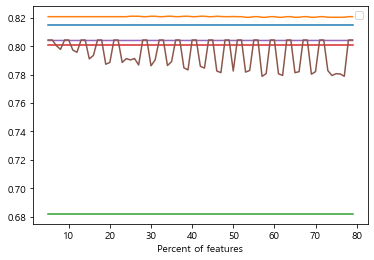

In [19]:
# 6개의 모델을 이용해서 가장 잘나온 p를 뽑을 것임
for model in models:
    
    cv_scores = []
    
    # 퍼센타일을 5~100프로 모두 살피기
    for percentile in tqdm(range(5,80)):
    
        X_new = SelectPercentile(percentile = percentile).fit_transform(X_train,y_train)
       
        # cross_val_score 5번의 평균값
        cv_score = cross_val_score(model, X_new, y_train, scoring='roc_auc', cv=3).mean()
        
        cv_scores.append((percentile, cv_score))
        
    # 베스트 percentile과 점수 출력
    best_score = cv_scores[np.argmax([score for _, score in cv_scores])]
    print(model.__cdisplay(feature_cor)lass__.__name__, best_score)
    globals()['{}_model'.format(model.__class__.__name__)] = model
    
    # 모델별 percentile에 따른 성능 그림
    plt.plot([p for p,_ in cv_scores], [score for _, score in cv_scores])
    plt.xlabel('Percent of features')
    plt.legend(loc=0)
    plt.grid()

In [22]:
display(feature_cor)

,model_nm_cnt,fwver_cnt,errtype_cnt,errcode_cnt,error_datetime_cnt,2020-10-31 00:00:00_x,2020-11-01 00:00:00_x,2020-11-02 00:00:00_x,2020-11-03 00:00:00_x,2020-11-04 00:00:00_x,...,quality_8_cnt,quality_9_cnt,quality_12_cnt,quality_0_sum,quality_3_sum,quality_4_sum,quality_5_sum,quality_6_sum,quality_9_sum,quality_12_sum
0,0.0,0.0,0.411765,0.058824,0.081837,0.0,0.091667,0.084906,0.181818,0.049505,...,0.0,0.0,0.0,1.000000,0.0,0.0,0.003774,0.224138,0.0,0.0
1,0.0,1.0,1.000000,0.588235,0.843000,0.0,0.091667,0.471698,0.292929,0.475248,...,0.0,0.0,0.0,1.000000,0.0,0.0,0.001258,0.224138,0.0,0.0
2,0.0,0.0,0.529412,0.117647,0.081440,0.0,0.083333,0.122642,0.131313,0.148515,...,0.0,0.0,0.0,1.000000,0.0,0.0,0.007339,0.603448,0.0,0.0
3,0.0,1.0,0.647059,0.647059,0.065549,0.0,0.075000,0.132075,0.101010,0.049505,...,0.0,0.0,0.0,1.000000,0.0,0.0,0.001258,0.224138,0.0,0.0
4,0.0,1.0,0.647059,0.588235,0.243922,0.0,0.208333,0.198113,0.494949,0.277228,...,0.0,0.0,0.0,0.931034,0.0,0.0,0.001677,0.956897,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29994,0.0,0.0,0.705882,0.588235,0.374225,0.0,0.400000,0.415094,0.282828,0.128713,...,0.0,0.0,0.0,0.620690,0.0,0.0,0.000000,0.129310,0.0,0.0
29995,0.0,1.0,0.529412,0.352941,0.146989,0.0,0.133333,0.216981,0.343434,0.099010,...,0.0,0.0,0.0,1.000000,0.0,0.0,0.001258,0.224138,0.0,0.0
29996,0.0,1.0,0.823529,0.764706,0.705546,0.0,0.191667,0.150943,0.424242,0.108911,...,0.0,0.0,0.0,0.827586,0.0,0.0,0.007968,0.181034,0.0,0.0
29997,0.0,1.0,0.882353,1.000000,1.000000,0.0,1.000000,1.000000,1.000000,0.000000,...,0.0,0.0,0.0,1.000000,0.0,0.0,0.003984,0.224138,0.0,0.0


### Univariate feature selection (anova)

In [ ]:
from sklearn.feature_selection import SelectKBest

select_av = SelectKBest(k=2268)
X_train_av = select_av.fit_transform(X_train, y_train)
X_test_av = select_av.transform(X_test)
print(X_train_av.shape)
print(X_test_av.shape)

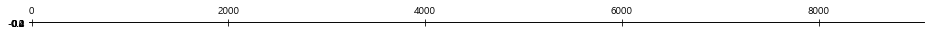

In [18]:
mask = select_av.get_support()
plt.matshow(mask.reshape(1,-1), cmap="gray_r")
plt.show()

In [ ]:
train = pd.DataFrame(X_train_av)
test = pd.DataFrame(X_test_av)
df = pd.concat([train, test])

# <font color='red'> 여기까지 사용안함

# Modeling

In [4]:
# 학습데이터 70%, 평가데이터 30%로 데이터 분할
X_train, X_dev, y_train, y_dev = train_test_split(train_x, train_y, test_size=0.3, random_state=0)

In [9]:
clfs = [
    #(
     #   SVC(random_state=0, probability=True),
      #  {'kernel': ['linear','rbf'],
       #  'C' : [0.001, 0.01, 0.1, 1, 10, 100],
        # 'gamma': [0.001, 0.01, 0.1, 1, 10, 100]
        #}
    #),
    (
        CatBoostClassifier(random_state=0, verbose=False),
        {'n_estimators': range(10, 310, 10),
         'depth': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11],
         'random_strength': [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8],
         'l2_leaf_reg': [1,2,3,4,5,6,7,8,9,10,20,30,50,100,200]}
    ),
    (
        LGBMClassifier(random_state=0),
        {'num_iteration': [100, 200, 300],
         'learning_rate': [1, 0.1, 0.01],
         'max_depth':[3,4,6,8,10],
         'min_data_in_leaf':[5,10,50,70,100],
         'num_leaves':[15,31,35],
         'boosting':['gbdt','rf'],
         'n_estimators': range(10, 200, 10),
         'min_split_gain': [0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9],
         #'reg_alpha': [0.001,0.01,0.0005,0.005,0.05,0.1,0.15,0.2,0.3,0.4,0.5,0.7,1,2,3,4,5,10],
         'reg_lambda': [0.001,0.01,0.0005,0.005,0.05,0.1,0.15,0.2,0.3,0.4,0.5,0.7,1,2,3,4,5,10],
         'feature_fraction': [0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0],
         #'bagging_fraction': [0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0],
         'bagging_freq': [1, 2, 3, 4, 5, 6, 7],
         'min_child_samples': range(5,50,5),
         'boost_from_average' : [False]
         }
    ),
    (
        XGBClassifier(random_state=0),
        {'learning_rate': [1, 0.1, 0.01],
         'n_estimators': [100, 200, 300],
         'max_depth':[3,4,6,8,10],
         'subsample':[0.3, 0.5, 0.7, 1],
         'min_child_weight':[10,20,50,100],
         'objective':['binary:logistic'],
         'eval_metric':['error'],
         'min_split_loss':[10,20,50,100],
         'colsample_bytree': [0.5, 0.7, 0.9, 1],
         'reg_alpha': [0.0001,0.001,0.01,0.0005,0.005,0.05,0.1,0.15,0.2,0.3,0.4,0.5,0.7,1,2,3,4,5,10],
         'reg_lambda': [0.0001,0.001,0.01,0.0005,0.005,0.05,0.1,0.15,0.2,0.3,0.4,0.5,0.7,1,2,3,4,5,10],
         'scale_pos_weight': np.arange(0.0, 50.1, 0.1),
         'boost_from_average' : [False]
        }
    ),
    (
        KNeighborsClassifier(),              # 사용하려는 모델
        {'n_neighbors': [3,5,7,9,11],        # 최적화하려는 하이퍼파라미터
         'weights': ['uniform','distance'],
         'algorithm': ['auto','ball_tree', 'kd_tree', 'brute'],
         'leaf_size': [10, 20, 30, 40],
         'p': [1,2],
         'metric': ['minkowski', 'euclidean', 'manhattan']}
    ),
    (
        MLPClassifier(random_state=0),
        {'batch_size': ['auto', 32, 64, 128],
         'learning_rate' : ['constant', 'adaptive','invscaling'],
         'activation': ['tanh', 'relu'],
         'solver': ['sgd', 'adam'],
         'hidden_layer_sizes': [10,30,50,100],
         'alpha': [1e-07,1e-06,0.0001,0.001,0.01,0.0005,0.005,0.05,0.1,0.15,0.2,0.3,0.4,0.5,0.7,0.9]}
    ),
    (
        LogisticRegression(random_state=0),  
        {'C': np.arange(0.1, 1.1, 0.1),      
         'penalty': ['l1','l2'],
         'max_iter' : [100, 300, 500, 1000]}
    ),
    (
        RandomForestClassifier(random_state=0),
        {'n_estimators': [100,200,300],
         'max_depth': [None,3,4,5,6],
         'max_features': (np.arange(0.5, 1.0, 0.1)*X_train.shape[1]).astype(int),
         'criterion': ['gini','entropy'],
         'min_samples_split':[2,3,4],
         'min_samples_leaf':[1,2,4],
         'min_impurity_decrease': [0,0.0001,0.001,0.01,0.0002,0.002,0.02,0.0005,0.005,0.05,0.1,0.2,0.3,0.4,0.5],
         'bootstrap': [True, False],
         'class_weight': ['balanced', 'balanced_subsample', {}]}
    ),
    (
        GradientBoostingClassifier(random_state=0),
        {'n_estimators': [100, 200, 300],
         'learning_rate': [1, 0.1, 0.01],
         'criterion': ['friedman_mse', 'mse', 'mae'],
         'loss': ['deviance', 'exponential'],
         'min_samples_split': [2, 4, 5, 7, 9, 10],
         'min_samples_leaf': [1, 2, 3, 4, 5],
         'max_depth': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11],
         'min_impurity_decrease': [0,0.0001,0.001,0.01,0.0002,0.002,0.02,0.0005,0.005,0.05,0.1,0.2,0.3,0.4,0.5],
         'max_features': (np.arange(0.5, 1.0, 0.1)*X_train.shape[1]).astype(int)
        }
    ),
    (
        DecisionTreeClassifier(random_state=0),
        {'criterion' :['gini','entropy'],
         'max_depth':[3,4,6,8,10],
         'min_samples_leaf':[3,5,10,50,100],
         'splitter':["best","random"]
        }
    ),
]

clfs_tuned = []  # 튜닝된 모델을 저장
start_time = time.time()
for clf, param_grid in tqdm(clfs):
    start = time.time()
    rand_search = RandomizedSearchCV(clf, param_grid, n_iter=8, scoring='roc_auc', 
                                     cv=3, random_state=0, n_jobs=6)
    rand_search.fit(X_train, y_train)
    clf_name = type(clf).__name__
    clf_score = rand_search.score(X_dev, y_dev)
    print('{:30s} {:30f} {:.1f}'.format(clf_name, clf_score, time.time() - start))
    print('final params', rand_search.best_params_)
    clfs_tuned.append((clf_name, rand_search, clf_score))
    globals()['{}_pred'.format(clf_name)] = pd.DataFrame(rand_search.best_estimator_.predict_proba(test_x))
print('모델 수행 시간: {0:.1f} 초'.format(time.time()- start_time))

 11%|████████▉                                                                       | 1/9 [45:07<6:01:02, 2707.79s/it]

CatBoostClassifier                                   0.847352 2707.7
final params {'random_strength': 0.7, 'n_estimators': 250, 'l2_leaf_reg': 8, 'depth': 11}
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=45 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6
[LightGBM] [Warning] num_iterations is set=300, num_iteration=300 will be ignored. Current value: num_iterations=300
LGBMClassifier                                       0.844695 25.1
final params {'reg_lambda': 2, 'num_leaves': 15, 'num_iteration': 300, 'n_estimators': 140, 'min_split_gain': 0.8, 'min_data_in_leaf': 10, 'min_child_samples': 45, 'max_depth': 10, 'learning_rate

 22%|█████████████████▊                                                              | 2/9 [45:35<3:42:05, 1903.69s/it]

[00:46:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { boost_from_average, subsamle } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


XGBClassifier                                        0.844089 1174.0
final params {'subsamle': 1, 'scale_pos_weight': 3.4000000000000004, 'reg_lambda': 0.005, 'reg_alpha': 0.001, 'objective': 'binary:logistic', 'n_estimators': 200, 'min_split_loss': 10, 'min_child_weight': 20, 'max_depth': 10, 'learning_rate': 0.01, 'eval_metric': 'error', 'colsample_bytree': 0.9, 'boost_from_average': False}


 33%|██████████████████████████                                                    | 3/9 [1:05:12<2:48:35, 1685.87s/it]

KNeighborsClassifier                                 0.701266 980.5
final params {'weights': 'distance', 'p': 2, 'n_neighbors': 11, 'metric': 'manhattan', 'leaf_size': 20, 'algorithm': 'ball_tree'}


 44%|██████████████████████████████████▋                                           | 4/9 [1:35:02<2:23:04, 1716.92s/it]

MLPClassifier                                        0.640650 2111.2
final params {'solver': 'adam', 'learning_rate': 'adaptive', 'hidden_layer_sizes': 10, 'batch_size': 'auto', 'alpha': 0.0001, 'activation': 'relu'}


 67%|████████████████████████████████████████████████████                          | 6/9 [2:19:30<1:12:35, 1451.76s/it]

LogisticRegression                                   0.696162 556.7
final params {'penalty': 'l2', 'max_iter': 1000, 'C': 0.9}
RandomForestClassifier                               0.808261 2170.1
final params {'n_estimators': 100, 'min_samples_split': 2, 'min_samples_leaf': 4, 'min_impurity_decrease': 0.0002, 'max_features': 7758, 'max_depth': 4, 'criterion': 'gini', 'class_weight': {}, 'bootstrap': True}


 78%|██████████████████████████████████████████████████████████████▏                 | 7/9 [2:55:41<55:34, 1667.40s/it]

GradientBoostingClassifier                           0.847351 13188.2
final params {'n_estimators': 300, 'min_samples_split': 10, 'min_samples_leaf': 3, 'min_impurity_decrease': 0.0005, 'max_features': 5818, 'max_depth': 10, 'loss': 'deviance', 'learning_rate': 0.01, 'criterion': 'friedman_mse'}


 89%|█████████████████████████████████████████████████████████████████████▎        | 8/9 [6:35:31<1:25:24, 5124.41s/it]

DecisionTreeClassifier                               0.797710 36.6
final params {'splitter': 'best', 'min_samples_leaf': 50, 'max_depth': 6, 'criterion': 'gini'}


100%|████████████████████████████████████████████████████████████████████████████████| 9/9 [6:36:08<00:00, 2640.98s/it]

모델 수행 시간: 23768.9 초


# Ensemble

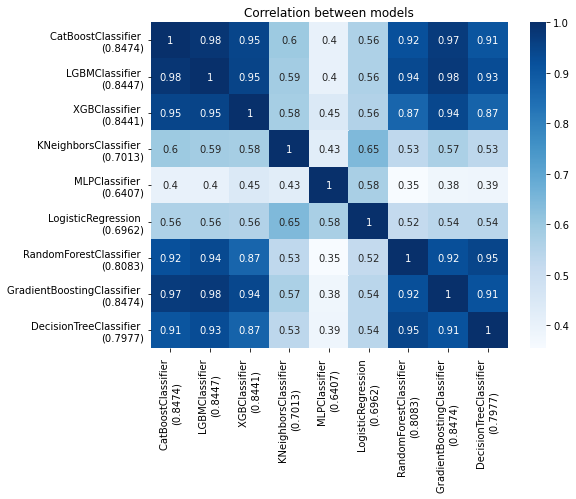

In [13]:
pred_results = []
for name, clf, clf_score in clfs_tuned:
    pred = clf.predict_proba(X_dev)[:,1]
    name = f'{name} \n({clf_score:.4f})'
    pred_results.append(pd.Series(pred, name=name))
ensemble_results = pd.concat(pred_results, axis=1)

# 모형의 예측값 간의 상관관계를 보기 위해 hitmap을 도식한다.
plt.figure(figsize = (8,6))
g = sns.heatmap(ensemble_results.corr(), annot=True, cmap='Blues')
g.set_title("Correlation between models")
plt.show()

In [14]:
# Mean agreement
(ensemble_results.corr().sum()-1)/(ensemble_results.corr().shape[0]-1)

CatBoostClassifier \n(0.8474)            0.787387
LGBMClassifier \n(0.8447)                0.792156
XGBClassifier \n(0.8441)                 0.770553
KNeighborsClassifier \n(0.7013)          0.558720
MLPClassifier \n(0.6407)                 0.421885
LogisticRegression \n(0.6962)            0.563216
RandomForestClassifier \n(0.8083)        0.750252
GradientBoostingClassifier \n(0.8474)    0.777496
DecisionTreeClassifier \n(0.7977)        0.754040
dtype: float64

### averaging

In [23]:
# Averaging 앙상블에 사용하지 않을 모델은 주석 처리하시오.
selected = [
    'KNeighborsClassifier', 
    #'MLPClassifier',
    'LogisticRegression', 
    #'RandomForestClassifier', 
    'GradientBoostingClassifier', 
    #'DecisionTreeClassifier',
    'XGBClassifier', 
    'LGBMClassifier',
    'CatBoostClassifier' 
    #'ExtraTreesClassifier'
]
models_for_ensemble = [clf for clf in clfs_tuned if clf[0] in selected]

In [24]:
# 아래 코드는 추후 estimator class("BlendingClassifier")로 만들 예정

max_score = 0
for p in tqdm([0]):  # p==1:산술평균, p=0:기하평균, 그 외:멱평균(주의:멱평균은 과적합 가능성이 높음)    
    for i in range(2, len(models_for_ensemble)+1):
        for models in combinations(models_for_ensemble, i):
            if p == 0:
                pred_mean = gmean([clf.predict_proba(X_dev)[:,1] for name, clf, _ in models], axis=0)
            else:
                preds = [clf.predict_proba(X_dev)[:,1] for name, clf, _ in models]
                pred_mean = (np.sum(np.array(preds)**p, axis=0) / len(models))**(1/p)
            score = roc_auc_score(y_dev, pred_mean)
            if max_score < score:
                best_avg_ensemble = (p, models, score)
                max_score = score

p, models, score = best_avg_ensemble
print('p={}\n{}\n{}'.format(p, '●'.join([clf_name for clf_name, _, _ in models]), score))

100%|████████████████████████████████████████████████████████████████████████████████| 1/1 [2:08:34<00:00, 7714.48s/it]

p=0
CatBoostClassifier●GradientBoostingClassifier
0.8498460405036152


### stacking

In [27]:
# 2-layer stacking

# Initialize 1st level estimators
# 사용하지 않을 모델은 주석 처리하세요.
selected = [
    'KNeighborsClassifier', 
    #'MLPClassifier',
    #'LogisticRegression', 
    'RandomForestClassifier', 
    'GradientBoostingClassifier',
    #'DecisionTreeClassifier',
    'XGBClassifier',
    'LGBMClassifier',
    'CatBoostClassifier',  
]

estimators = [(name, clf) for name, clf, _ in clfs_tuned if name in selected]
stk_clf = StackingClassifier(
    estimators=estimators, final_estimator=LogisticRegression(), cv=3)

stk_clf.fit(X_train, y_train)
print(roc_auc_score(y_dev, stk_clf.predict_proba(X_dev)[:,1]))  

[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=45 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6
[LightGBM] [Warning] num_iterations is set=300, num_iteration=300 will be ignored. Current value: num_iterations=300
[20:21:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { boost_from_average, subsamle } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[LightGBM] [War

In [54]:
t = pd.Timestamp.now()
test_id = list(range(30000, 44999))

if p == 0:
    pred_mean = gmean([clf.predict_proba(test_x)[:,1] for name, clf, _ in models], axis=0)
else:
    preds = [clf.predict_proba(test_x)[:,1] for name, clf, _ in models]
    pred_mean = (np.sum(np.array(preds)**p, axis=0) / len(models))**(1/p)
pd.DataFrame({'user_id': test_id, 'problem': pred_mean}).to_csv(f'submission_avg_{t.month:02}{t.day:02}_{t.hour:02}{t.minute:02}.csv',index=False)

# Apply the stacking model to Unseen Data
pd.DataFrame({'user_id': test_id, 'problem': stk_clf.predict_proba(test_x)[:,1]}).to_csv(f'submission_stk_{t.month:02}{t.day:02}_{t.hour:02}{t.minute:02}.csv', index=False)

# Model Save

In [16]:
import pickle
import joblib

In [48]:
#joblib.dump(models,'model_avg(0)_25%.pkl')

['model_avg(0)_25%.pkl']

In [6]:
#models_for_ensemble = joblib.load('model_avg(0).pkl')